In [1]:
# パッケージのimport
import random
import math
import time
import pandas as pd
import numpy as np
from PIL import Image
import seaborn as sns
from tqdm import tqdm

import torch
import torch.utils.data as data
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import SubsetRandomSampler

from torchvision import transforms, datasets
import torchvision
import torchvision.utils as vutils
from hyperdash import monitor_cell

In [2]:
def load_datasets():
    transform = transforms.Compose(
        [transforms.ToTensor(),
        transforms.Normalize((0.49139968, 0.48215841, 0.44653091),
                             (0.24703223, 0.24348513, 0.26158784))]
    )
    trainset = torchvision.datasets.CIFAR10(root="./data",
                                            train=True, download=True,
                                            transform=transform)
    train_loader = torch.utils.data.DataLoader(trainset, batch_size=100,
                                              shuffle=True, num_workers=4)
    #train_loader = torch.utils.data.DataLoader(trainset, batch_size=256,
    #                                           sampler=SubsetRandomSampler(car_indices), num_workers=4)
    testset = torchvision.datasets.CIFAR10(root="./data",
                                            train=False, download=True,
                                            transform=transform)
    test_loader = torch.utils.data.DataLoader(testset, batch_size=1024,
                                               shuffle=True, num_workers=4)
    return train_loader, test_loader

In [3]:
train_loader, test_loader = load_datasets()

Files already downloaded and verified
Files already downloaded and verified


In [4]:
class Generator(nn.Module):

    def __init__(self, latent_size):
        super(Generator, self).__init__()
        self.latent_size = latent_size

        self.output_bias = nn.Parameter(torch.zeros(3, 32, 32), requires_grad=True)
        self.main = nn.Sequential(
            nn.ConvTranspose2d(self.latent_size, 256, 4, stride=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, 4, stride=2, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, 4, stride=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(inplace=True),

            nn.ConvTranspose2d(64, 32, 4, stride=2, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(inplace=True),

            nn.ConvTranspose2d(32, 32, 5, stride=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(inplace=True),

            nn.ConvTranspose2d(32, 32, 1, stride=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(inplace=True),

            nn.ConvTranspose2d(32, 3, 1, stride=1, bias=False)
        )

    def forward(self, input):
        output = self.main(input)
        output = F.sigmoid(output + self.output_bias)
        return output

In [5]:
class Discriminator(nn.Module):

    def __init__(self, latent_size, dropout, output_size=10):
        super(Discriminator, self).__init__()
        self.latent_size = latent_size
        self.dropout = dropout
        self.output_size = output_size

        self.infer_x = nn.Sequential(
            nn.Conv2d(3, 32, 5, stride=1, bias=True),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout),

            nn.Conv2d(32, 64, 4, stride=2, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout),

            nn.Conv2d(64, 128, 4, stride=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout),

            nn.Conv2d(128, 256, 4, stride=2, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout),

            nn.Conv2d(256, 512, 4, stride=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout)
        )

        self.infer_z = nn.Sequential(
            nn.Conv2d(self.latent_size, 512, 1, stride=1, bias=False),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout),

            nn.Conv2d(512, 512, 1, stride=1, bias=False),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout)
        )

        self.infer_joint = nn.Sequential(
            nn.Conv2d(1024, 1024, 1, stride=1, bias=True),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout),

            nn.Conv2d(1024, 1024, 1, stride=1, bias=True),
            nn.LeakyReLU(inplace=True),
            nn.Dropout2d(p=self.dropout)
        )

        self.final = nn.Conv2d(1024, self.output_size, 1, stride=1, bias=True)

    def forward(self, x, z):
        output_x = self.infer_x(x)
        output_z = self.infer_z(z)
        output_features = self.infer_joint(torch.cat([output_x, output_z], dim=1))
        output = self.final(output_features)
        if self.output_size == 1:
            output = F.sigmoid(output)
        return output.squeeze(), output_features.view(x.size()[0], -1)

In [6]:
class Encoder(nn.Module):

    def __init__(self, latent_size, noise=False):
        super(Encoder, self).__init__()
        self.latent_size = latent_size

        if noise:
            self.latent_size *= 2
        self.main1 = nn.Sequential(
            nn.Conv2d(3, 32, 5, stride=1, bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(inplace=True),

            nn.Conv2d(32, 64, 4, stride=2, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(inplace=True),

            nn.Conv2d(64, 128, 4, stride=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(inplace=True),

            nn.Conv2d(128, 256, 4, stride=2, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(inplace=True)
        )

        self.main2 = nn.Sequential(
            nn.Conv2d(256, 512, 4, stride=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(inplace=True)
        )

        self.main3 = nn.Sequential(
            nn.Conv2d(512, 512, 1, stride=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(inplace=True)
        )

        self.main4 = nn.Sequential(
            nn.Conv2d(512, self.latent_size, 1, stride=1, bias=True)
        )

    def forward(self, input):
        batch_size = input.size()[0]
        x1 = self.main1(input)
        x2 = self.main2(x1)
        x3 = self.main3(x2)
        output = self.main4(x3)
        return output, x3.view(batch_size, -1), x2.view(batch_size, -1), x1.view(batch_size, -1)

In [7]:
#デバイスの確認
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("使用デバイス:", device)

使用デバイス: cuda:0


In [8]:
latent_size = 256
netE = Encoder(latent_size, True)
netE = netE.to(device)
netG = Generator(latent_size)
netG = netG.to(device)
netD = Discriminator(latent_size, 0.2, 1)
netD = netD.to(device)

In [9]:
#Generatorの読み込み
generator_state_dict = torch.load("netG_epoch_90.pth")
netG = Generator(latent_size)
netG.load_state_dict(generator_state_dict)
netG = netG.to(device)

In [10]:
#Discriminatorの読み込み
discriminator_state_dict = torch.load("netD_epoch_90.pth")
netD = Discriminator(latent_size, 0.2, 1)
netD.load_state_dict(discriminator_state_dict)
netD = netD.to(device)

In [11]:
#Discriminatorの読み込み
encoder_state_dict = torch.load("netE_epoch_90.pth")
netE = Encoder(latent_size, True)
netE.load_state_dict(encoder_state_dict)
netE = netE.to(device)

In [12]:
batch_size = 100
latent_size = 256
fixed_z = torch.randn(batch_size, latent_size, 1, 1)
fake_images = netG(fixed_z.to(device))

/home/dl-box/.pyenv/versions/anaconda3-5.3.1/envs/py36/lib/python3.6/site-packages/torch/nn/functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


In [13]:
batch_iterator = iter(train_loader)
imges = next(batch_iterator)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


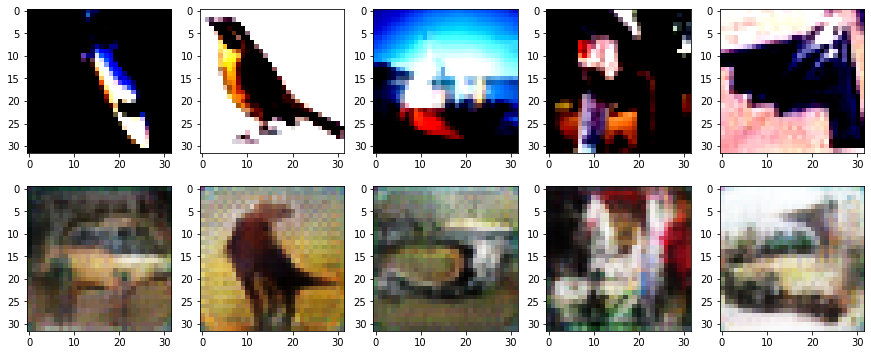

In [14]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(15, 6))
for i in range(0, 5):
    plt.subplot(2, 5, i+1)
    plt.imshow(imges[0][i].cpu().detach().numpy().transpose(1, 2, 0))
    plt.subplot(2, 5, 5+i+1)
    plt.imshow(fake_images[i].cpu().detach().numpy().transpose(1, 2, 0))
    plt.savefig("example_efficientgan.png")

In [15]:
def Anomaly_score(x, fake_img, z_out_real, D, Lambda=0.1):
    residual_loss = torch.abs(x-fake_img)
    residual_loss = residual_loss.view(residual_loss.size()[0], -1)
    residual_loss = torch.sum(residual_loss, dim=1)
    _, x_feature = D(x, z_out_real)
    _, G_feature = D(fake_img, z_out_real)
    discrimination_loss = torch.abs(x_feature-G_feature)
    discrimination_loss = discrimination_loss.view(
        discrimination_loss.size()[0], -1)
    discrimination_loss = torch.sum(discrimination_loss, dim=1)
    loss_each = (1-Lambda)*residual_loss + Lambda*discrimination_loss
    total_loss = torch.sum(loss_each)
    return total_loss, loss_each, residual_loss, discrimination_loss

In [16]:
x = imges[0][0:5]
x = x.to(device)

z_out_real = netE(imges[0].to(device))[0]
z_out_real = z_out_real.view(batch_size, -1)
mu, log_sigma = z_out_real[:, :latent_size], z_out_real[:, latent_size:]
sigma = torch.exp(log_sigma)
epsilon = torch.randn(batch_size, latent_size).to(device)

output_z = mu + epsilon * sigma
z_out_real = output_z.view(batch_size, latent_size, 1, 1)
imges_reconstract = netG(z_out_real)
loss, loss_each, residual_loss_each, discrimination_loss = Anomaly_score(x, imges_reconstract[:5], z_out_real[:5], netD, Lambda=0.1)

In [17]:
#loss_each = loss_each.cpu().detach().numpy()
print("total loss:", np.round(discrimination_loss.cpu().detach().numpy(), 0))

total loss: [ 71. 108.  89. 209. 114.]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


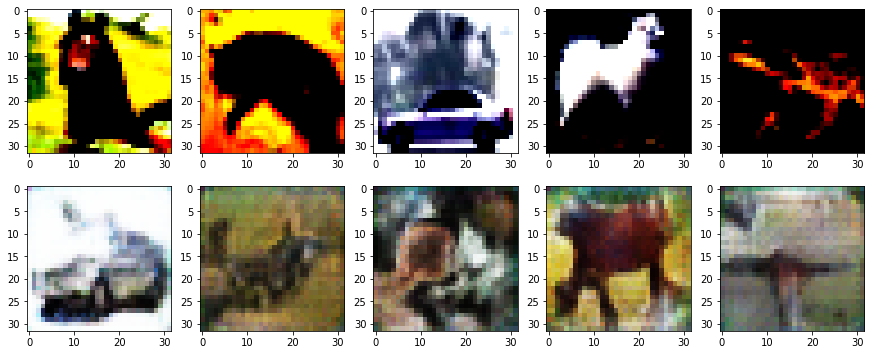

In [18]:
fig = plt.figure(figsize=(15,6))
for i in range(0,5):
    plt.subplot(2, 5, i+1)
    plt.imshow(imges[0][i+25].cpu().detach().numpy().transpose(1,2,0))
    plt.subplot(2, 5, 5+i+1)
    plt.imshow(imges_reconstract[i+25].cpu().detach().numpy().transpose(1,2,0))
    plt.savefig("reconstract_effgan.png")

In [19]:
from hyperdash import monitor_cell

In [20]:
#特に前処理について.
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
from six.moves import cPickle as pickle
from six.moves import xrange  # pylint: disable=redefined-builtin
import collections
import os
import sys
import cv2
import tarfile
import numpy as np
from tqdm import tqdm
from absl import flags
import absl.logging as _logging  # pylint: disable=unused-import
import scipy.io
import tensorflow as tf
from randaugment import policies as found_policies
from randaugment import augmentation_transforms

In [21]:
def indices_maker():
    transform = transforms.Compose(
        [transforms.ToTensor(),
        transforms.Normalize((0.49139968, 0.48215841, 0.44653091),
                             (0.24703223, 0.24348513, 0.26158784))]
    )
    trainset = torchvision.datasets.CIFAR10(root="./data",
                                            train=True, download=True,
                                            transform=transform)
    aircraft_indices, car_indices, bird_indices, cat_indices, deer_indices = [], [], [], [], []
    dog_indices, frog_indices, horse_indices, ship_indices, truck_indices = [], [], [], [], []
    i = 0
    #aircraft_indicesにlabelが0(=飛行機)の画像のindexを入れる.
    for tensor in tqdm(trainset):
        if tensor[1] == 0:
            aircraft_indices.append(i)
        if tensor[1] == 1:
            car_indices.append(i)
        if tensor[1] == 2:
            bird_indices.append(i)
        if tensor[1] == 3:
            cat_indices.append(i)
        if tensor[1] == 4:
            deer_indices.append(i)
        if tensor[1] == 5:
            dog_indices.append(i)
        if tensor[1] == 6:
            frog_indices.append(i)
        if tensor[1] == 7:
            horse_indices.append(i)
        if tensor[1] == 8:
            ship_indices.append(i)
        if tensor[1] == 9:
            truck_indices.append(i)
        i += 1
    return aircraft_indices, car_indices, bird_indices, cat_indices, deer_indices, dog_indices, frog_indices, horse_indices, ship_indices, truck_indices
aircraft_indices, car_indices, bird_indices, cat_indices, deer_indices, dog_indices, frog_indices, horse_indices, ship_indices, truck_indices = indices_maker()

Files already downloaded and verified


  9%|▊         | 4335/50000 [00:00<00:07, 6199.53it/s]Exception ignored in: <bound method Image.__del__ of <PIL.Image.Image image mode=RGB size=32x32 at 0x7F647457A080>>
Traceback (most recent call last):
  File "/home/dl-box/.pyenv/versions/anaconda3-5.3.1/envs/py36/lib/python3.6/site-packages/PIL/Image.py", line 634, in __del__
    self.__exit__()
  File "/home/dl-box/.pyenv/versions/anaconda3-5.3.1/envs/py36/lib/python3.6/site-packages/PIL/Image.py", line 596, in __exit__
    if hasattr(self, "fp") and getattr(self, "_exclusive_fp", False):
KeyboardInterrupt
100%|██████████| 50000/50000 [00:07<00:00, 6476.32it/s]


In [22]:
CIFAR_TARNAME = "cifar-10-python.tar.gz"
CIFAR_DOWNLOAD_URL = "https://www.cs.toronto.edu/~kriz/" + CIFAR_TARNAME
SVHN_DOWNLOAD_URL = "http://ufldl.stanford.edu/housenumbers/{}_32x32.mat"

DOWNLOAD_DATA_FOLDER = "downloaded_data"
MERGE_DATA_FOLDER = "merged_raw_data"

random_seed = np.random.randint(0, 10000)

In [23]:
def format_sup_filename(split, sup_size=-1):
  if split == "test":
    return "test.tfrecord"
  elif split == "train" or split == "dev":
    if sup_size == -1:
      return "{}-full.tfrecord".format(split, sup_size)
    else:
      return "{}-size_{:d}.tfrecord".format(split, sup_size)

def format_unsup_filename(aug_copy_num):
  return "unsup-{:d}.tfrecord".format(aug_copy_num)


def _int64_feature(value):
  return tf.train.Feature(int64_list=tf.train.Int64List(value=list(value)))


def _float_feature(value):
  return tf.train.Feature(float_list=tf.train.FloatList(value=list(value)))


def get_raw_data_filenames(split):
    if split == "train":
        return ["data_batch_%d" % i for i in xrange(1, 6)]
    elif split == "test":
      return ["test_batch"]
    else:
        assert False


def read_pickle_from_file(filename):
  with tf.gfile.Open(filename, "rb") as f:
    if sys.version_info >= (3, 0):
      data_dict = pickle.load(f, encoding="bytes")
    else:
      data_dict = pickle.load(f)
  return data_dict


def obtain_tfrecord_writer(out_path, shard_cnt):
  tfrecord_writer = tf.python_io.TFRecordWriter(
      "{}.{:d}".format(out_path, shard_cnt))
  return tfrecord_writer


def save_tfrecord(example_list, out_path, max_shard_size=4096):
  shard_cnt = 0
  shard_size = 0
  record_writer = obtain_tfrecord_writer(out_path, shard_cnt)
  for example in example_list:
    if shard_size >= max_shard_size:
      record_writer.close()
      shard_cnt += 1
      record_writer = obtain_tfrecord_writer(out_path, shard_cnt)
      shard_size = 0
    shard_size += 1
    record_writer.write(example.SerializeToString())
  record_writer.close()
  tf.logging.info("saved {} examples to {}".format(len(example_list), out_path))


def save_merged_data(images, labels, split, merge_folder):
  with tf.gfile.Open(
      os.path.join(merge_folder, "{}_images.npy".format(split)), "wb") as ouf:
    np.save(ouf, images)
  with tf.gfile.Open(
      os.path.join(merge_folder, "{}_labels.npy".format(split)), "wb") as ouf:
    np.save(ouf, labels)

In [24]:
all_exist = True
download_folder = os.path.join(DOWNLOAD_DATA_FOLDER)
merge_folder = os.path.join(MERGE_DATA_FOLDER)
for split in ["train", "test"]:
    for field in ["images", "labels"]:
        if not tf.gfile.Exists(os.path.join(merge_folder, "{}_{}.npy".format(split, field))):
            all_exist = False
if all_exist:
    tf.logging.info("found all merged files")
print('all_exist:' + str(all_exist))
tf.logging.info("downloading dataset")
tf.gfile.MakeDirs(download_folder)
tf.gfile.MakeDirs(merge_folder)

INFO:tensorflow:found all merged files
all_exist:True
INFO:tensorflow:downloading dataset


In [25]:
#if FLAGS.task_name == 'cifar10'以下の話
tf.contrib.learn.datasets.base.maybe_download(
    CIFAR_TARNAME, download_folder, CIFAR_DOWNLOAD_URL)
tarfile.open(os.path.join(download_folder, CIFAR_TARNAME), "r:gz").extractall(download_folder)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Please write your own downloading logic.


In [26]:
for split in ["train", "test"]:
    images_list = []
    labels_list = []
    for filename in get_raw_data_filenames(split):
        cur_data = read_pickle_from_file(
            os.path.join(download_folder, "cifar-10-batches-py", filename))
        labels_list += [cur_data[b"labels"]]
        images_list += [cur_data[b"data"]]
    images = np.concatenate(images_list, 0)
    labels = np.concatenate(labels_list, 0)
    images = images.reshape([-1, 3, 32, 32])
    images = images.transpose(0, 2, 3, 1)
    save_merged_data(images, labels, split, merge_folder)

In [27]:
#多分iterableにimageとlabelを取り出す.最後まで, 可能な限り
def get_data_by_size_lim(images, labels, sup_size, return_rest=False):
    chosen_images = images[:sup_size]
    chosen_labels = labels[:sup_size]
    rest_images = images[sup_size:]
    rest_labels = labels[sup_size:]
    if return_rest:
        return chosen_images, chosen_labels, rest_images, rest_labels

In [28]:
def process_and_save_sup_data(chosen_images, chosen_labels, split, sup_size=-1):
    chosen_images = chosen_images / 255.0
    mean, std = [0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784]
    chosen_images = (chosen_images - mean) / std
    example_list = []
    for image, label in zip(chosen_images, chosen_labels):
        example = tf.train.Example(features=tf.train.Features(
            feature={
                "image": _float_feature(image.reshape(-1)),
                "label": _int64_feature(label.reshape(-1))
            }))
        example_list += [example]
    out_path = os.path.join(output_base_dir, format_sup_filename(split, sup_size))
    tf.logging.info(">>saving {} {} examples to {}".format(len(example_list), split, out_path))
    save_tfrecord(example_list, out_path)

In [29]:
def proc_and_dump_sup_data(sub_set_data, split, sup_size=-1):
    images = sub_set_data["images"]
    labels = sub_set_data["labels"]
    if sup_size != -1:
        chosen_images, chosen_labels = get_data_by_size_lim(
            images, labels, sup_size)
    else:
        chosen_images = images
        chosen_labels = labels
    process_and_save_sup_data(chosen_images, chosen_labels, split)

In [30]:
#unsupervised dataのみをrand augmentする.
def proc_and_dump_unsup_data(sub_set_data, aug_copy_num):
    ori_images = sub_set_data["images"].copy()
    image_idx = np.arange(len(ori_images))
    np.random.shuffle(image_idx)
    ori_images = ori_images[image_idx]
    ori_images = ori_images / 255.0
    mean, std = [0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784]
    ori_images = (ori_images - mean) / std
    aug_policies = found_policies.randaug_policies()
    example_list = []
    for image in ori_images:
        chosen_policy = aug_policies[np.random.choice(
            len(aug_policies))]
        #この段階で, chosen_policyは2個の要素を持っている.
        aug_image = augmentation_transforms.apply_policy(
            chosen_policy, image)
        aug_image = augmentation_transforms.cutout_numpy(aug_image)
        #ここで条件式を投げて, aug_imageが一定の閾値以下であれば3回目のaugmentationを加える.
        example = tf.train.Example(features=tf.train.Features(
            feature={
                "ori_image": _float_feature(image.reshape(-1)),
                "aug_image": _float_feature(aug_image.reshape(-1)),
            }))
        example_list += [example]
    out_path = os.path.join(output_base_dir, format_unsup_filename(aug_copy_num),)
    save_tfrecord(example_list, out_path)

In [31]:
def load_dataset():
    data = {}
    merge_folder = os.path.join(MERGE_DATA_FOLDER)
    for split in ["train", "test"]:
        with tf.gfile.Open(
            os.path.join(merge_folder, "{}_images.npy".format(split)), 'rb') as inf:
            images = np.load(inf)
        with tf.gfile.Open(
            os.path.join(merge_folder, "{}_labels.npy".format(split)), 'rb') as inf:
            labels = np.load(inf)
        data[split] = {"images":images, "labels":labels}
    return data

In [32]:
data = load_dataset()

In [33]:
ori_images = data["train"]["images"].copy()
image_idx = np.arange(len(ori_images))
np.random.shuffle(image_idx)
ori_images = ori_images[image_idx]
ori_images = ori_images / 255.0
mean, std = [0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784]
ori_images = (ori_images - mean) / std
aug_policies = found_policies.randaug_policies()
example_list = []
i, j = 0, 0
discrimination_losses = np.zeros(50000)
residual_losses = np.zeros(50000)
total_losses = np.zeros(50000)
aug_image_list = torch.randn(100, 3, 32, 32)

INFO:tensorflow:trans_list: ['Invert', 'Cutout', 'Sharpness', 'AutoContrast', 'Posterize', 'ShearX', 'TranslateX', 'TranslateY', 'ShearY', 'Rotate', 'Equalize', 'Contrast', 'Color', 'Solarize', 'Brightness']


In [34]:
"""
for image in ori_images:
    chosen_policy = aug_policies[np.random.choice(len(aug_policies))]
    aug_image = augmentation_transforms.apply_policy(chosen_policy, image)
    aug_image = augmentation_transforms.cutout_numpy(aug_image)
    example = tf.train.Example(features=tf.train.Features(
        feature={
            "ori_image": _float_feature(image.reshape(-1)),
            "aug_image": _float_feature(aug_image.reshape(-1)),
        }))
    example_list += [example]
    aug_image_list[i] = torch.from_numpy(aug_image.transpose(2, 0, 1))
    i += 1
    if i >= 100:
        x = aug_image_list
        x = x.to(device)
        z_out_real = netE(aug_image_list.to(device))[0]
        z_out_real = z_out_real.view(batch_size, -1)
        mu, log_sigma = z_out_real[:, :latent_size], z_out_real[:, latent_size:]
        sigma = torch.exp(log_sigma)
        epsilon = torch.randn(batch_size, latent_size).to(device)
        output_z = mu + epsilon * sigma
        z_out_real = output_z.view(batch_size, latent_size, 1, 1)
        imges_reconstract = netG(z_out_real)
        total_loss, loss_each, residual_loss, discrimination_loss = Anomaly_score(x, imges_reconstract, z_out_real, netD, Lambda=0.1)
        discrimination_loss = discrimination_loss.cpu().detach().numpy()
        residual_loss = residual_loss.cpu().detach().numpy()
        total_loss = total_loss.cpu().detach().numpy()
        discrimination_losses[j*100:100+j*100] = discrimination_loss
        residual_losses[j*100:100+j*100] = residual_loss
        total_losses[j*100:100+j*100] = total_loss
        print("total loss：", np.round(discrimination_loss, 0))
        tmp = np.where(discrimination_loss < 500)[0]
        #1750以下のdiscrimination lossのところは作り直し.
        for k in range(len(tmp)):
            chosen_policy = aug_policies[np.random.choice(len(aug_policies))]
            image = ori_images[tmp[k] + 100*j]
            aug_image_v2 = augmentation_transforms.apply_policy(chosen_policy, image)
            aug_image_v2 = augmentation_transforms.cutout_numpy(aug_image_v2)
            example = tf.train.Example(features=tf.train.Features(
                feature={
                    "ori_image": _float_feature(image.reshape(-1)),
                    "aug_image": _float_feature(aug_image_v2.reshape(-1)),
                }))
            example_list[tmp[k] + 100*j] = example
        i = 0
        j += 1
        print(len(example_list))
        aug_image_list = torch.randn(100, 3, 32, 32)
        break
    else:
        pass
"""

'\nfor image in ori_images:\n    chosen_policy = aug_policies[np.random.choice(len(aug_policies))]\n    aug_image = augmentation_transforms.apply_policy(chosen_policy, image)\n    aug_image = augmentation_transforms.cutout_numpy(aug_image)\n    example = tf.train.Example(features=tf.train.Features(\n        feature={\n            "ori_image": _float_feature(image.reshape(-1)),\n            "aug_image": _float_feature(aug_image.reshape(-1)),\n        }))\n    example_list += [example]\n    aug_image_list[i] = torch.from_numpy(aug_image.transpose(2, 0, 1))\n    i += 1\n    if i >= 100:\n        x = aug_image_list\n        x = x.to(device)\n        z_out_real = netE(aug_image_list.to(device))[0]\n        z_out_real = z_out_real.view(batch_size, -1)\n        mu, log_sigma = z_out_real[:, :latent_size], z_out_real[:, latent_size:]\n        sigma = torch.exp(log_sigma)\n        epsilon = torch.randn(batch_size, latent_size).to(device)\n        output_z = mu + epsilon * sigma\n        z_out_r

In [35]:
!mkdir dataset_by_anomaugment_augcopy10_3iter

mkdir: ディレクトリ `dataset_by_anomaugment_augcopy10_3iter' を作成できません: ファイルが存在します


In [36]:
output_base_dir = "dataset_by_anomaugment_augcopy10_3iter"

In [37]:
def loss_culculator(image_list, epsilon):
    image_list = image_list.to(device)
    z_out_real = netE(image_list)[0]
    z_out_real = z_out_real.view(batch_size, -1)
    mu, log_sigma = z_out_real[:, :latent_size], z_out_real[:, latent_size:]
    sigma = torch.exp(log_sigma)
    output_z = mu + epsilon * sigma
    z_out_real = output_z.view(batch_size, latent_size, 1, 1)
    imges_reconstract = netG(z_out_real)
    total_loss, loss_each, residual_loss, discrimination_loss = Anomaly_score(image_list, imges_reconstract, z_out_real, netD, Lambda=0.1)
    discrimination_loss = discrimination_loss.cpu().detach().numpy()
    residual_loss = residual_loss.cpu().detach().numpy()
    total_loss = total_loss.cpu().detach().numpy()
    return discrimination_loss, residual_loss, total_loss

In [38]:
def randaug_anom_v2(sub_set_data, aug_copy_num):
    ori_images = sub_set_data["images"].copy()
    image_idx = np.arange(len(ori_images))
    np.random.shuffle(image_idx)
    ori_images = ori_images[image_idx]
    ori_images = ori_images / 255.0
    mean, std = [0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784]
    ori_images = (ori_images - mean) / std
    aug_policies = found_policies.randaug_policies()
    example_list = []
    i, j = 0, 0
    discrimination_losses, residual_losses, total_losses = np.zeros(50000), np.zeros(50000), np.zeros(50000)
    discrimination_losses_ori, residual_losses_ori, total_losses_ori = np.zeros(50000), np.zeros(50000), np.zeros(50000)
    aug_image_list = torch.randn(100, 3, 32, 32)
    simple_image_list = torch.randn(100, 3, 32, 32)
    for image in ori_images:
        chosen_policy = aug_policies[np.random.choice(len(aug_policies))]
        aug_image = augmentation_transforms.apply_policy(chosen_policy, image)
        aug_image = augmentation_transforms.cutout_numpy(aug_image)
        example = tf.train.Example(features=tf.train.Features(
            feature={
                "ori_image": _float_feature(image.reshape(-1)),
                "aug_image": _float_feature(aug_image.reshape(-1)),
            }))
        example_list += [example]
        aug_image_list[i] = torch.from_numpy(aug_image.transpose(2, 0, 1))
        simple_image_list[i] = torch.from_numpy(image.transpose(2, 0, 1))
        i += 1
        if i >= 100:
            #ここからsimple data
            epsilon = torch.randn(batch_size, latent_size).to(device)
            dis_ori, res_ori, tot_ori = loss_culculator(simple_image_list, epsilon)
            discrimination_losses_ori[j*100:100+j*100] = dis_ori
            residual_losses_ori[j*100:100+j*100] = res_ori
            total_losses_ori[j*100:100+j*100] = tot_ori
            #ここからaugmented data
            dis_aug1, res_aug1, tot_aug1 = loss_culculator(aug_image_list, epsilon)
            #print("aug image list 1:", aug_image_list[0], flush=True)
            discrimination_losses[j*100:100+j*100] = dis_aug1
            residual_losses[j*100:100+j*100] = res_aug1
            total_losses[j*100:100+j*100] = tot_aug1
            print("delta discrimination loss：", dis_aug1 - dis_ori, flush=True)
            tmp = np.where(np.abs(dis_aug1 - dis_ori) < 50)[0]
            print(tmp, flush=True)
            for k in range(len(tmp)):
                chosen_policy = aug_policies[np.random.choice(len(aug_policies))]
                image = ori_images[tmp[k] + 100*j]
                aug_image_v2 = augmentation_transforms.apply_policy(chosen_policy, image)
                aug_image_v2 = augmentation_transforms.cutout_numpy(aug_image_v2)
                aug_image_list[tmp[k]] = torch.from_numpy(aug_image_v2.transpose(2, 0, 1))
        
            dis_aug2, res_aug2, tot_aug2 = loss_culculator(aug_image_list, epsilon)
            #print("aug image list 2:", aug_image_list[0], flush=True)
            discrimination_losses[j*100:100+j*100] = dis_aug2
            residual_losses[j*100:100+j*100] = res_aug2
            total_losses[j*100:100+j*100] = tot_aug2
            print("delta discrimination loss：", dis_aug2 - dis_ori, flush=True)
            tmp_v2 = np.where(np.abs(dis_aug2 - dis_ori) < 50)[0]
            tmp_v3 = []
            for ele in tmp_v2:
                if ele in tmp:
                    tmp_v3.append(ele)
            print(tmp_v3, flush=True)
            for k in range(len(tmp_v3)):
                chosen_policy = aug_policies[np.random.choice(len(aug_policies))]
                image = ori_images[tmp[k] + 100*j]
                aug_image_v2 = augmentation_transforms.apply_policy(chosen_policy, image)
                aug_image_v2 = augmentation_transforms.cutout_numpy(aug_image_v2)
                example = tf.train.Example(features=tf.train.Features(
                    feature={
                        "ori_image": _float_feature(image.reshape(-1)),
                        "aug_image": _float_feature(aug_image_v2.reshape(-1)),
                    }))
                example_list[tmp[k] + 100*j] = example
            i = 0
            j += 1
            print(len(example_list), flush=True)
            aug_image_list = torch.randn(100, 3, 32, 32)
        else:
            pass
    out_path = os.path.join(output_base_dir, format_unsup_filename(aug_copy_num),)
    save_tfrecord(example_list, out_path)
    return total_losses, discrimination_losses, residual_losses, total_losses_ori, discrimination_losses_ori, residual_losses_ori

In [39]:
%%monitor_cell "augmentation_phase"
for i in range(10):
    total_losses, discrimination_losses, residual_losses, total_losses_ori, discrimination_losses_ori, residual_losses_ori = randaug_anom_v2(data["train"], aug_copy_num=i)

INFO:tensorflow:trans_list: ['Invert', 'Cutout', 'Sharpness', 'AutoContrast', 'Posterize', 'ShearX', 'TranslateX', 'TranslateY', 'ShearY', 'Rotate', 'Equalize', 'Contrast', 'Color', 'Solarize', 'Brightness']
delta discrimination loss： [ 7.73222733e+00  2.46062469e+01  2.07522888e+01  7.26279068e+01
 -1.19432983e+01  2.97376404e+01 -1.20065918e+01 -4.49109802e+01
 -6.71408997e+01 -1.37627609e+02 -2.55955124e+01  5.74401855e-01
  2.33285370e+01 -1.09650955e+01  1.10090561e+01 -7.97179947e+01
 -4.57598152e+01 -3.97589722e+01 -3.34199371e+01  1.55339966e+01
 -8.46140137e+01  3.10334473e+01  2.02546234e+01 -1.90931549e+01
 -2.40500641e+01 -4.10270081e+01 -7.18359375e+00 -7.50896606e+01
 -7.32016144e+01 -2.88989487e+01  1.38152771e+01 -6.49324799e+00
 -2.39116821e+01 -1.13182098e+02 -1.14234222e+02  1.25665085e+02
 -4.16834412e+01  2.00840912e+01 -7.48011322e+01 -1.62445831e+01
 -8.82870483e+00  3.01452179e+01 -8.03109131e+01  1.16210327e+01
 -1.43515015e+00 -2.79105453e+01 -1.07665710e+01 -

/home/dl-box/.pyenv/versions/anaconda3-5.3.1/envs/py36/lib/python3.6/site-packages/torch/nn/functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


delta discrimination loss： [ 1.53035278e+01 -1.01658173e+01  5.54005737e+01  1.80510254e+01
  1.09258667e+02 -1.89910049e+01 -9.65666199e+00 -6.87696075e+00
  6.82446136e+01 -1.61954651e+01  2.10085831e+01  1.08280418e+02
 -1.30164185e+01  1.25767822e+01 -7.22260742e+01  8.96453857e-01
 -3.67941284e+01 -2.32604828e+01  8.25709534e+01  2.96755066e+01
  3.52039795e+01  1.61107330e+02  5.38301697e+01 -3.37702103e+01
  3.21545410e+01  2.35611267e+01  6.46754837e+01  4.87245102e+01
  8.95881653e-01  2.37577972e+01 -1.04729004e+01  1.12567520e+01
  3.84309692e+01  1.48483887e+01  5.34895477e+01 -2.60836029e+00
  1.12137070e+01 -8.13597260e+01 -1.12131500e+01  7.67348633e+01
  4.86095734e+01  1.16115265e+01  1.52871704e+01  1.35527191e+02
  2.77209778e+01  3.84934387e+01  7.71331787e-03 -9.89712524e+00
  1.49426880e+01  3.49450607e+01 -9.33930969e+00  1.47759171e+02
 -1.23504562e+01 -1.15454865e+01 -1.54719620e+01  3.18698120e+00
  7.90567169e+01 -1.62326508e+01  7.03785248e+01  1.72946167e+0

[2, 4, 5, 8, 10, 11, 12, 15, 19, 23, 27, 28, 32, 33, 36, 37, 39, 40, 41, 47, 48, 51, 55, 57, 64, 65, 69, 74, 76, 79, 82, 85, 88, 91, 93, 99]
400
delta discrimination loss： [  43.804382    77.3184      69.78029     26.643333    10.906586
  -46.37503     34.320168   -67.744316    22.387375    51.202362
  133.93442    -92.23251     57.13028      5.548813   -29.105072
   66.95377     26.471191    25.419846    63.005554   -20.884743
   55.891724    -8.893372    36.638847    21.916992   -95.903595
    5.976715   -25.923592   -36.207123    49.739388   229.49051
  115.89454     66.64694      5.482498    50.204445    68.70419
   19.62664     20.353676     6.071213   118.695335    12.515144
   53.919235    63.10205    -53.824066   -64.4086     120.86415
  -24.65673    165.72086    -32.385735  -236.20079     46.534348
  -28.001945   -59.126434    33.66922    -36.688393   -34.705658
   30.180008    47.73648    130.11848     48.691017    33.694
   -2.5981598  112.443756    96.62564    -59.95099    

delta discrimination loss： [  30.556503    -11.362045      9.105499    -54.008827    -12.577209
   44.73549      -5.601166     -7.653404    -41.156906    -96.20174
  -31.793304    -16.88453      -6.4530067    52.50564     -53.533745
  133.68393       5.598564    -67.10545     -87.05019      -5.2640915
   73.678955      7.886177     39.189728     25.67556      48.513817
   25.609207    -29.527512     -7.60376      35.597397     28.400993
   69.695435    -26.322544    -97.290764     42.47853      28.73468
  -59.72174       7.374756      8.193962    -55.034218     13.221298
   -5.119171    -57.801933    -43.370903    -30.112976    -54.288452
   29.750595      2.106758    -12.17469       2.1971283   -11.038742
  -63.132454     22.725372     -8.678642     -1.8141861   152.56615
  -33.245926    105.75737     -30.409798     24.250572     -3.0520248
  -33.509537     63.646294     43.09352      59.80671    -176.42633
  -35.891037     51.283615    -18.221703     -5.07045      13.285217
   -2.613

[ 2  4  6  7  8  9 10 11 12 13 14 15 24 25 28 31 32 34 35 36 37 40 41 42
 43 44 46 47 50 53 56 57 59 60 61 62 64 66 67 68 73 74 75 76 79 80 86 88
 91 92 94 95 97]
delta discrimination loss： [ -62.773643   -41.746857     5.607109   -24.55481     64.70714
  -55.84726     40.64157     80.36847    187.92216    137.79741
  102.1944      21.679138   -66.27863     52.706894     4.4303894
  -39.38542    -17.782791   -15.808716   105.999626   289.393
  218.945        6.4413834  -31.229843    39.274216    68.29717
   49.13616    -20.65158     75.14584     71.21301     -3.5544891
   36.457764   -39.19948     15.95108    -84.36777      9.141663
   45.819557    26.675812   -11.411743    68.03415    -54.615944
    2.0241623  -61.912254    28.87394     17.247864    58.03795
  -14.523193   160.34546    -36.103233    56.817352    97.50461
  -17.548645  -139.40845    -38.79927    -76.60712    -68.83621
  -51.474724    60.270615   110.19343    102.848175    70.298294
  -12.758873   -57.79019   -116.28120

[ 0  1  3  4 12 14 15 16 18 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44 46 47 49 50 51 52 53 55 58 60 62 63 64 65
 66 69 70 71 74 75 76 77 79 82 83 86 88 90 92 93 94 96 97 98]
delta discrimination loss： [ 185.593       140.61812      38.38118     -32.933296     83.16238
  153.44688      23.078812     70.67325      39.196716   -111.70153
   27.253662     -7.9281616     0.6074219   -28.222588     32.637543
  -23.900085     75.5798      -58.146408      1.7127914    59.3045
  -41.08676      63.257782    -80.56824      24.637398    104.33654
   65.01436      43.80143     144.31119      -1.8915024    -8.16938
   48.519653      7.798752    120.25325       0.36505127   12.960999
   96.29297     -11.183678     62.79077      48.8172       42.81581
   41.24359     -25.5718       34.81505     142.76062     -22.39386
   74.134125     81.82504     -94.45727      -3.7159424     9.592743
   53.645035     37.87863      49.363434      2.9044342     1.952652
   81.2551    

[ 0  1  2  5  7  8 14 15 17 18 19 20 21 23 24 25 27 29 30 32 33 34 35 38
 43 44 46 47 48 49 50 53 55 58 59 61 62 64 65 66 67 69 70 71 72 74 75 76
 77 79 80 81 82 83 84 85 87 88 91 92 93 99]
delta discrimination loss： [ 103.53462     -78.17432     -70.58307     -67.430664    -82.26541
  -33.50741      19.944725     16.414894    -19.367558      9.051788
   76.96097      -0.39471436  144.01326     -21.949066     62.30567
   32.100662     60.208984     15.471214     34.814636    -26.897034
  -15.448299    -71.581505    -67.13512      37.0362        4.1664886
   45.191254     67.9804       18.599808     17.195099     39.405067
   89.324234     75.0158      -18.698532    -59.724396     81.45703
   -1.2008057   -15.389938     49.515556     36.85843      44.095596
 -111.879875     35.49138    -104.03743      -8.289886     81.05386
    7.584076     45.17514     -23.797295    -75.49075     -12.239052
   -0.38829803  -63.66301    -123.23387       7.764221     72.34251
   21.311295     18.438812  

[2, 3, 5, 8, 12, 14, 15, 16, 21, 22, 27, 29, 30, 43, 44, 49, 50, 53, 55, 58, 59, 60, 62, 65, 66, 68, 69, 71, 74, 75, 80, 85, 86, 89, 90, 93, 99]
1800
delta discrimination loss： [-1.58751312e+02  1.34466461e+02  3.23978271e+01  4.45577393e+01
  4.55604706e+01  3.49384308e+00  2.24459381e+01 -4.74762344e+00
 -3.09565659e+01 -1.51776932e+02  1.46828613e+01  5.93549194e+01
 -9.02755280e+01 -1.80966492e+01 -3.90751953e+01 -4.54914780e+01
  5.07169647e+01  8.20117493e+01  2.18166122e+01  1.58184738e+01
 -1.31909180e+00  6.00940933e+01  1.79251968e+02  6.75573273e+01
 -1.83003922e+01  2.01345978e+01  1.20240860e+01  5.48685455e+00
  1.05808334e+01 -1.74854889e+01  2.56367798e+01  2.05261993e+00
 -6.22792053e+00 -8.74017563e+01 -3.81520576e+01 -7.34368210e+01
 -2.70736694e-01 -1.19218353e+02 -9.92179108e+00  7.57984390e+01
 -2.45135727e+02  3.95087891e+01  4.81501007e+01 -2.31010208e+01
 -5.71842117e+01  1.70787125e+01  6.70806503e+01 -3.15621719e+01
  4.39438629e+00  2.79720840e+01  8.1832489

[ 0  1  2  3  6  8  9 10 12 15 16 18 19 24 25 27 28 29 30 31 32 34 36 37
 42 43 45 46 50 53 55 57 59 62 63 64 65 68 69 70 73 74 75 78 79 81 85 86
 87 89 90 91 93 95 97 98 99]
delta discrimination loss： [  37.62758     72.97203    -55.29402    -52.968704  -108.0956
 -114.00657    -58.347904    32.49408    -38.860085   -39.562363
  -17.986313   -85.58018    -14.437912  -120.24064    -50.114918
   46.10521     35.887135   -94.2193      27.89505    -89.916756
 -122.88771     50.6846     -43.420654   -94.03601      0.5138397
   23.586113   -32.17517    -92.07974     69.24744     42.210472
  -17.823997    -8.590225    11.005524   -95.679016   -24.025497
  -66.935196   132.08658     19.773445  -256.2704      25.396667
   61.378807   -19.41043     -7.061203   -23.983047  -122.46307
   67.85089     40.6705      14.919655  -149.8537      86.191284
  -66.996445   -26.5932     -54.049065   -36.18936     -5.980316
   75.85533   -122.81783      6.816475   -68.3499      -3.3065338
   86.496     -117.

[ 1  3  4  5  7  8 10 12 15 16 24 27 29 30 31 37 40 43 45 48 50 51 53 54
 55 58 60 67 70 71 73 75 77 79 80 83 84 88 91 94 96 97]
delta discrimination loss： [ -81.211624    -1.8914413   15.759003   -75.07843    -91.35484
   -6.637581    25.24569     17.468307   -35.607315    -8.434822
   62.71341    -73.26095    -59.979134     3.724846     7.210724
   86.37562    -54.991737    51.00081     33.89673     46.57
   34.918045   124.911705    86.272934    30.248604    -7.2537613
  105.1564      90.76548    -13.926483     3.1177826   66.75023
    9.14006    -12.252525   -45.27292    -29.8835      12.640625
 -137.67871    -70.5935     -15.495819    92.835724   -12.338562
  137.86938    117.69887    -14.618713   -10.432098    73.599014
  -49.545334    16.012451    41.645172   -15.373451  -104.94281
   33.756813   -70.00229     -2.3282928   34.011963   -40.98429
   36.240875   -20.617104    15.377823   -32.278946    -7.8614426
  -27.48243      2.417221     3.9941406  -60.708176   -38.82405
   41.

[ 0  1  3  5  6  7  8  9 10 11 14 17 18 19 20 21 22 23 24 25 27 28 29 30
 31 34 35 36 37 38 39 41 44 45 46 48 49 50 51 54 55 57 59 60 61 64 65 66
 68 69 71 73 77 78 83 86 88 89 91 92 93 96 97 99]
delta discrimination loss： [ -15.23407     -46.01683     -20.160168     16.382965    215.31076
   13.861008     67.82033     -21.39177     -22.21225      60.07853
   43.93743      60.261543     57.18734      30.737389     61.17273
   49.47029      57.73625      19.34037     -38.7359       37.095634
   37.10576     -21.029114     42.584793    162.18744     -60.714485
   21.032974     -1.6423492   165.96019      -0.88772583   15.901344
    0.74035645   13.476021    140.57465      28.970772     35.951363
   64.83463     195.74063      86.07976      25.440033     46.28225
   12.856598     56.125687    -52.771027    -62.213394     26.52826
  111.53793     141.017        16.718315     16.511543     -9.781189
   61.530792     85.23015     -62.42695       9.935181    -21.776283
  -42.16165     -97.910

[ 0  3  4  5  8  9 10 11 12 15 16 17 18 19 21 24 25 27 28 30 31 34 35 36
 38 41 44 45 47 48 49 50 51 53 54 55 57 58 60 61 62 63 65 66 67 70 71 72
 73 74 75 76 77 79 81 82 84 85 87 88 90 91 92 94]
delta discrimination loss： [  99.69327     132.62457     -45.74888      -7.4237595    22.737297
  -46.84081      11.740509    -66.887634    -11.911102     28.294815
    0.8370285    -9.425781     34.196472     77.12689      59.80494
   21.147598     37.900223    -32.52899      28.764503    131.56549
  122.77517      76.94519     140.37988     142.85193      68.984665
 -166.31126     -97.72606      16.428383     11.973679    -21.415253
  -33.153706      9.235535    -15.503311     -1.3671875   130.40965
   88.64963      -1.8296051   -26.342026     17.414215     98.48785
   11.019924     19.454185     -7.8686066   148.06964      28.489563
   36.22312     -22.604866    -50.714493    -95.121956     60.848076
  -27.3535      -71.281456    -98.857475     18.918854     68.86387
   -8.040169    -14.123

[ 0  1  4  5  8 10 11 12 13 15 17 19 20 25 29 30 31 34 35 36 38 39 42 43
 44 45 49 50 51 52 53 54 55 56 58 59 61 62 63 66 67 68 69 70 72 73 74 76
 78 79 80 81 85 86 87 89 90 91 92 93 94 95 96 97 98 99]
delta discrimination loss： [   6.1632996  -31.470345   -98.35245    152.45377     65.16422
   10.2200165  -62.71666     19.218597   -42.44536   -106.05125
    6.5744247  -93.667336   -15.01577      2.5001144 -221.77502
   89.66841    -41.181866    40.469437   -92.91565     56.23575
  -56.361862   -72.08315    -72.139046   -56.393494   -24.546936
   53.401306   -86.21374   -131.99777    -23.235306    38.869545
   32.816093    58.361557   -91.273834   105.84509    -27.422623
  -50.79604     -4.8961105  -73.51608     10.972298   -23.364174
   35.0334      21.267685    33.512543   -78.71741     53.457558
  -51.119568   -39.21115     65.20541     49.00888    -27.671211
  107.89555     93.71855    -51.949997   -61.06864    -52.914597
   72.23052    -39.878304     7.333893   -95.29941    -30.17

[0, 2, 11, 13, 14, 16, 22, 25, 26, 28, 30, 31, 34, 35, 46, 47, 48, 49, 52, 58, 59, 60, 63, 65, 66, 67, 69, 70, 72, 78, 81, 85, 86, 87, 88, 90, 91, 92, 94, 96, 99]
3500
delta discrimination loss： [  96.56706      70.06546       8.307381     28.342804    -65.27428
   52.833176     84.88838     -35.69812       0.89282227  -59.889717
   38.300728     28.151665    215.29973      34.876        75.44701
    6.013298     73.81917      86.94508      19.833588     29.672104
   90.15629     -47.36635     176.5798       43.927956      6.7756653
   79.02171      43.81868     -79.42397      10.842888    -27.421661
   28.87828     130.6489      -21.27697      61.94252      41.446342
   24.57962      92.94333      -5.786125    -36.376457     17.072601
   71.69918      76.98074     -55.423782      4.3389816    55.478966
   10.86824     -24.636932     76.49207      41.39691     -59.202133
  138.27155      18.853966     90.58265    -117.716156     76.92352
    9.939308    138.701        14.159393     98.

[ 0  4  6  7 10 11 12 14 15 16 17 21 22 24 27 28 29 30 33 34 35 36 37 38
 40 42 43 44 45 46 47 48 49 52 54 56 59 60 62 63 65 68 69 71 72 73 74 75
 77 78 79 80 81 84 85 87 88 90 91 92 96 97]
delta discrimination loss： [  35.851204    42.796707   109.10393     31.572021    18.95266
  -56.145035    31.876755   -18.642548  -114.13179     15.246185
  -40.63875    101.73737    133.83412     20.242191    47.787766
    4.241974    18.09491     22.78666     36.782692    55.813675
   19.757042    23.175346   -19.000656    57.854134   109.528275
  -15.523125   -21.761063    -9.549637    15.523216   -38.126503
   97.78359     94.792435   -56.605423   -42.508133   -39.358643
  -52.253784    44.98295      4.1614227  -57.642754   -66.329056
  -27.786087   -19.519707    17.354782    85.33137    -30.295273
   44.51197    -38.374313   -26.989761    22.253136    21.81913
  -86.56052     97.297844   -44.79883    -17.604004   -13.068573
   52.583946   -30.624138   -41.595528    24.79654    -16.171371
   -6

[ 0  1  4  5  6  8  9 10 15 17 18 19 20 21 23 25 29 30 31 34 35 36 37 38
 40 41 42 43 44 45 46 47 48 49 50 51 52 53 55 56 57 58 59 60 61 62 64 65
 67 68 69 70 71 72 73 74 75 76 79 80 81 82 84 85 86 87 89 90 93 94 96 99]
delta discrimination loss： [145.35596    -20.54992     72.96308     49.47503     20.63556
  47.268013    93.8227      67.9336      78.44855     36.35797
  -8.670441   -21.712189    36.36063     44.28295    164.20027
  52.595093    91.52352     53.661186    30.008842    18.941284
  56.501297    11.764694    28.165665    42.979034     7.650345
  92.74304     -5.041992   162.34645    -17.846      -22.818153
 -12.680893   170.36462     34.485855    82.30915    -11.538391
   7.5020447  -10.79261    185.61572     50.395157     1.1543884
  73.19427    -17.92743    148.27951     14.437347    91.90593
 101.2571      42.611626    -7.0946503  -10.916306    38.31675
  12.473228   189.57217     15.214706    19.29058    127.644394
  -0.27010345  29.300064    -5.407425    78.22748    

[ 0  1  4  5  6 11 12 14 15 16 17 18 19 20 22 23 25 26 27 28 29 33 34 36
 37 38 40 41 42 43 44 45 46 48 50 51 52 55 57 58 60 61 62 64 65 66 68 69
 75 78 79 80 83 84 85 86 87 92 93 94 95 97]
delta discrimination loss： [-4.89358063e+01  8.59179688e+00  1.29260712e+01 -3.07139587e+00
  8.20009460e+01 -1.23596420e+01  5.92625961e+01 -1.39799774e+02
  5.35831070e+01 -5.43632050e+01 -1.63151642e+02  1.65504776e+02
 -5.22798462e+01  2.76415253e+01  5.42102966e+01 -1.76329193e+01
  2.11494370e+01  5.18882294e+01  2.58247375e+00  1.10234222e+02
  4.26704559e+01 -6.79790649e+01 -1.51105652e+01 -7.89149246e+01
 -8.63849182e+01  2.57095490e+01 -1.04370728e+01 -4.12921677e+01
  5.58263397e+00  4.21684113e+01  2.18013992e+01 -9.29457779e+01
 -1.79752045e+01 -4.67885590e+00  6.34249496e+01  1.05522919e+02
  2.07310791e+01  7.24515991e+01  6.92078857e+01 -2.86031342e+01
  1.54022217e-01  3.02801514e+01  6.06004257e+01  6.20618134e+01
  2.96633682e+01  1.41985641e+02  8.84070129e+01 -6.02934875e+01
  5

[0, 2, 3, 4, 13, 17, 20, 22, 24, 25, 26, 29, 31, 33, 34, 36, 37, 40, 43, 44, 47, 50, 56, 62, 63, 67, 69, 70, 71, 73, 74, 75, 77, 78, 79, 83, 84, 85, 86, 89, 90, 95, 98]
4600
delta discrimination loss： [ -16.249115    -73.15184       1.1971588    -4.527321     64.138626
   -8.534256     24.149918     24.12355      -6.283409     -8.528244
  -67.828995     90.50897     -66.640656     67.75127      20.290482
   11.70105      -5.405342      0.5094986    12.321686     -9.947697
  -85.059494     14.652031    -49.495598    -42.436203    -66.63634
  124.026       106.39772     -51.46962     -28.230011     13.862396
   25.540466     31.09819     -38.85324      60.668037     -4.8304825
   35.744835    -16.823418    -74.127304     -6.392662   -115.49898
   -1.0879211   -62.75673      -0.71009064   -0.83971405    1.5166321
 -114.54158       0.28424835   68.60225     -46.31115     175.12413
   34.774826     -5.947983     15.557312      9.864689     54.698578
   15.663284    -91.10302     163.64719  

[ 1  2  5  6  7  8 11 12 13 16 18 20 22 23 24 27 28 29 32 33 34 35 36 37
 38 39 42 43 44 46 47 48 49 53 54 55 56 57 58 60 61 62 63 66 67 68 69 71
 72 73 74 75 76 77 78 79 80 81 82 83 85 86 87 88 90 91 92 96 97 98 99]
delta discrimination loss： [  68.59685     59.375267   139.88583    -17.246506    16.098568
  -11.24633    -36.287834   -15.907417  -106.02339     18.55909
  -95.06496     67.31361     16.529152     5.995346    55.736824
   70.47632    -51.83464     -9.763123    49.5263      23.261711
  -14.384171   -53.699722   -47.28055     33.339676    63.27307
   15.291412    13.264252    56.88517    -59.79416     -8.0108795
  -53.649612   -46.889862    71.954315   -28.112656    34.219757
   16.771675    37.74961     42.167274    71.40354    -56.87107
   35.393204   -33.901207   -19.048592    49.42775    113.93042
   60.854507   -38.695114    89.30443    -12.017036    -8.212105
   36.99408    -96.74994    -77.14253    -12.261505    63.302612
   -2.9427338  184.1365      35.223625    10

[ 0  1  3  4  5  6  7 13 14 15 16 19 21 22 23 27 29 30 32 34 35 36 39 47
 50 51 52 56 57 59 60 62 63 64 65 66 67 69 70 71 72 73 74 76 77 79 80 81
 83 84 88 90 91 92 93 96 97]
delta discrimination loss： [ -70.98337     21.85147     16.455643    -7.8468323  -13.640793
  -66.74733     73.18546     21.344933  -211.32405    -53.928818
  -41.04296     -0.6503372  -77.40044    -22.108383   -41.37107
   -7.815201   -60.79564    -82.49459    -89.16249    -30.107315
  -58.807228   -50.08063    -21.044228    34.18808     12.783218
  -78.95544    -97.81917    -30.176208    16.188652   -23.42051
    7.849037   -29.362114   -30.694916   -41.794952    71.61685
    6.990814    20.690475   -75.47153    -40.86357    -24.868744
  -39.463104   -58.897346   -75.51393     19.513596   -48.265083
   28.18901   -140.72873     34.8715      -7.688843   -17.205406
   28.468246   -31.864807    11.196762     5.744076    15.286285
  -92.415      -23.049973    52.981716    53.381104    83.00993
  -22.872208   -76.909

[ 0  4  6  7  8 10 11 12 17 18 19 20 22 23 25 27 28 29 30 32 36 38 39 41
 42 45 46 48 50 53 56 57 60 62 63 64 65 66 67 71 72 74 75 76 77 78 85 87
 88 90 91 92 93 94 96 97 98 99]
delta discrimination loss： [ -28.338455   -16.578781   -24.140335   -84.88713     36.3015
  -75.60122     -3.7365265    5.753296    10.545464   -83.09482
   15.027382     5.7567596   50.320496   -48.68927    -73.12823
 -108.89248    -65.352234   -67.68335    -21.910904   -73.62593
    8.6080475  -55.49617    -47.565887    20.724152  -186.20477
   79.004745    45.392586   -24.5876     -27.822975    34.396942
   24.917137   136.24783    -72.50856      2.0771484  -56.62623
  -73.56504     -9.711296   -69.01532      2.5695953  106.532364
  -97.979996   -53.870255    -5.3122635  -67.48537    -29.468918
   91.235634   -52.057976   -89.987335   -12.782471  -149.02875
   28.16748     78.40194    -66.22605     35.479294  -121.258736
  -35.373116     8.727783    41.41011   -132.11041    -93.136116
   -3.3238373   96.4364

5700
delta discrimination loss： [ -75.36081      31.292824    -39.624596    111.300156     -4.3918915
    6.0666504   -92.419876     35.885635      1.605236     22.274918
  -17.10225     -85.81313     -36.838768   -137.69427     -11.668472
  -23.492348      7.6370697   -73.78471     -63.59194     -63.952324
  -17.671906     13.747177     43.31977      36.373566     68.063324
   -0.51556396  210.3325      -19.833214     33.143646    -14.376366
   42.749245     92.25293      28.549538    -10.492203     40.951187
  -17.408905     12.301941    -67.800476      2.1235657   -71.43254
   33.237938    -40.453945     20.487267    -25.240898    -73.10837
  -72.807144     92.883446    -52.828934     58.344284    -56.844704
  -52.659317     -4.539322    -63.868027    -23.705704     72.02658
    8.38739     -20.23053     -53.737465     -9.871704     49.14879
  -14.01413      -4.1272125  -107.05231     -42.250793     60.376038
   67.303375    -44.661957    -51.461975     16.27716      27.209846
  -32

[3, 4, 9, 12, 16, 17, 24, 26, 38, 39, 42, 44, 46, 47, 52, 53, 56, 58, 59, 64, 68, 75, 76, 80, 81, 89, 90, 94, 98]
6000
delta discrimination loss： [ 9.0825821e+01  1.7544730e+02  4.2610298e+01  1.1364719e+02
  1.1558800e+01 -1.3666840e+00  1.1446907e+01 -2.1493690e+01
  3.4058670e+01  2.8469543e+01  1.1210239e+02  5.0808105e+00
  1.3241959e+02  1.7548386e+01  3.3304855e+01 -2.7434769e+00
 -4.2392532e+01 -5.2663223e+01 -5.5253319e+01  6.2305641e+01
 -1.5816803e+01  9.7513390e+01  3.5526016e+01  1.9799927e+01
  4.6887146e+01 -2.4391273e+01 -1.9792328e+01  2.8003693e-01
  6.1574524e+01  9.9276436e+01 -1.0795837e+01  3.4864937e+01
  5.0614807e+01  3.2194008e+01 -1.5704918e+01 -1.0100171e+02
  2.7415054e+01 -6.6725166e+01 -1.8034302e+01 -6.1596527e+01
  2.5263313e+01 -1.4398270e+00 -4.1236832e+01 -2.6900078e+01
 -7.5932159e+00  6.9991722e+01  4.3763123e+00  9.2653542e+01
 -8.0240135e+01 -4.7802177e+01  1.4785767e-02 -1.0098706e+02
 -1.5794067e+00 -7.3929749e+00 -1.6255478e+01 -1.4731834e+01


[ 3  5  6  8  9 10 12 14 15 17 18 19 20 23 25 26 27 29 30 31 33 34 35 36
 38 40 41 45 47 48 49 53 56 57 59 60 62 63 65 67 68 69 71 73 74 78 79 82
 83 84 87 88 89 90 91 92 95 98 99]
delta discrimination loss： [ -52.384583     38.316616    124.162704     34.26825     -83.88314
  -56.085396     44.084076   -187.46329      28.254005     12.968315
  -50.560997   -129.82198      36.60369     -83.04213     -25.522507
   -3.2238388    -9.738495    -60.526337     53.942657    -29.315338
  -22.989578    -82.34645      42.85254     -58.422943      8.768158
 -133.32928      26.894676     19.703278     41.46704    -168.17592
   64.04349      19.211685   -206.54779     -53.012177     53.169678
  -29.577972    -10.449356    -57.194427     16.057518    -55.202225
   19.718071     30.188843    -95.832596     14.144432     16.359344
    5.087509    -89.91644     -27.80214      34.345234    -58.900528
  -68.508415     15.653408    -66.4355      -27.876205    -92.655815
 -286.87183      31.152924     65.9

[ 0  2  3  4  6  8 10 12 14 15 16 17 18 20 22 23 24 25 26 27 30 31 32 33
 34 35 38 39 40 44 46 47 48 49 51 53 54 55 56 57 60 61 62 63 64 66 67 68
 69 70 71 72 73 74 75 77 78 79 80 83 85 87 88 90 91 94 96 97 98 99]
delta discrimination loss： [ 2.74464798e+01  5.15834885e+01 -3.16427994e+01 -5.01631165e+00
 -2.62598343e+01  8.45646896e+01  1.89878464e+01 -1.13428696e+02
  8.56285095e-01  7.44119263e+00 -2.40915222e+01 -2.62389221e+01
  7.28449783e+01 -4.07576828e+01  2.09687424e+01  2.00708694e+01
 -1.17073822e+01  1.58346100e+01 -2.26980286e+01 -9.41662292e+01
  2.09975624e+01  1.09313812e+01 -2.75081100e+01  4.77796173e+00
  1.08470337e+02  4.63432388e+01 -2.98243713e+00 -8.63811111e+00
 -3.55757980e+01 -3.91838531e+01 -9.08154449e+01  2.57825165e+01
  3.87024536e+01  5.93647003e+00  1.19928436e+01 -7.75563583e+01
  3.17501144e+01 -8.96799545e+01  4.41943970e+01 -3.90320587e+01
 -1.19362488e+01 -6.64376373e+01 -4.33590012e+01 -6.02804337e+01
  1.64389191e+01  1.34384995e+01 -4.48162613

6800
delta discrimination loss： [   7.9085464    61.851105     32.262886      7.773674     12.94825
  -47.725677      6.4691925   -61.354187     12.316383     81.493576
  -44.818825    107.57131     111.51164       2.0404053     8.404236
  -85.5992      -63.59993     -69.5193      -46.440186     12.322876
   35.688885    -83.71932     -86.7711      -72.28435     -51.286316
  -34.06157      17.895706   -121.60327     -49.654675     -8.020538
    8.037716     22.889473     10.48233      32.998283      6.990906
 -131.16878     -17.482544     -1.7981873    21.824585      6.1164856
  -24.757584    -17.307327    104.428406    -11.99147      70.28075
   20.943092     -5.4655304    37.968758    102.95641      12.374237
  -53.260162     55.19153     -96.19188      -3.047104    -75.08823
   29.477814    -39.05487     -81.37932     141.25246     -33.138115
   36.865494    -10.677704    -26.343597    183.66432      89.50795
   59.793846    -55.56598     -18.94735     -72.94539     -31.456383
  -31

[ 0  2  3  4  5  7  8  9 11 13 14 17 18 19 20 21 22 24 25 26 28 29 30 34
 35 37 38 39 43 44 47 48 49 51 55 56 60 61 62 64 66 67 68 69 70 73 74 75
 76 77 79 80 81 82 85 86 87 88 90 91 92 93 94 95 98]
delta discrimination loss： [ 5.65005798e+01 -9.12258301e+01  6.78911285e+01  1.76333008e+01
  9.51161652e+01  3.18767166e+01  1.96506195e+01  1.08521729e+01
 -2.66571350e+01  1.46969879e+02 -2.05608368e+01 -5.58258820e+00
 -2.55782776e+01  3.01257782e+01  1.26423645e+00 -7.15317459e+01
 -1.69784180e+02  4.54011230e+01  7.83928986e+01  7.50938110e+01
 -3.80406952e+01  6.46086197e+01  4.20916901e+01 -3.70108643e+01
  5.40001678e+01 -8.23410034e+00  9.53938904e+01 -9.74488983e+01
 -1.29665375e+00  1.41673279e+02  1.12057724e+02  1.46786514e+02
  2.14093781e+00 -3.39742584e+01  7.72208405e+00  1.27310867e+01
 -2.25459595e+01  9.34826126e+01  1.91820984e+01  2.88630219e+01
  1.71666794e+01 -1.84347076e+01 -8.13517151e+01  4.54315033e+01
  1.37185669e+00  7.43216171e+01  5.59621887e+01  5.1844451

7300
delta discrimination loss： [ 114.14969     75.138794  -116.44446     39.11367     88.98001
   33.799026   160.20456     43.13791    -42.55313     -7.664173
   36.22843    163.4486     -78.54384    -16.99813     -6.2179565
  -87.08078    -56.754395   156.25415    129.2328      97.09099
   38.663292   -77.04348     29.374115     3.109642    -4.372856
   28.835205   -11.545303   -27.837814    62.663414    10.355942
   13.277199   118.12336   -145.76775      3.883583  -117.22226
   38.24301     21.059769   -72.60195     40.4227     -22.48227
  -11.5436325   12.539169   -28.940033    -8.737518   -31.127182
   84.90665     69.07059     78.29358      2.1157837   79.11908
  -33.16075     74.26455    -33.91536    114.71951    -26.105225
   68.90628     32.049774    49.298912   130.34178     68.45052
  -56.734436   -56.469803   131.49532     50.17443    238.14053
 -105.73271    -38.871414   -57.070267   -18.615784   -22.703087
  104.28779    124.131256    22.818176    29.416466   118.94191


delta discrimination loss： [ -71.79762     -38.178062   -140.88742     -65.40998      -7.7602844
    9.91317       1.6250458   -19.117958     22.893143    -20.680252
 -116.89754      27.053741     26.798302    153.22157    -145.51004
   25.14576     -88.1616       60.76335      -0.74380493 -200.31732
 -151.2457      -14.034012    -10.830101   -149.98718     128.82875
  -71.65706       3.2413406   -72.69641     152.2998      -77.40469
   10.38797      45.20481     -73.98448      20.874908     -3.846466
   39.999435    -82.65664       4.4581375   -83.83351      59.618835
  -71.57578     -18.516502     12.664467    -96.37076     234.41508
   45.26584      19.933655    -75.24409      58.74398     -63.356644
  -51.008926   -103.811295     19.356346      5.5398407    19.261414
   11.282173    -94.596405    -71.075485    -69.16069      31.76416
  -31.82225     -64.27867    -155.35526     -45.57615     -20.44741
  -43.6043      -33.784225     24.853886    -41.608246    -24.44867
 -124.604355  

[ 1  3  5 13 14 16 19 20 22 23 24 26 28 29 31 33 34 35 36 37 39 40 42 45
 46 48 49 51 54 56 60 61 63 64 66 68 70 71 72 75 76 77 78 80 82 83 85 87
 91 93 94 95 96 97]
delta discrimination loss： [  -6.37619    -121.1592       10.075371    152.7377     -126.522545
  -40.96545    -186.30698     -52.40143     -82.23241     -98.743774
   93.66777     -16.449402     16.485237    -23.919727    -17.224072
 -120.80696     -39.522797    -32.207832     20.38253       2.1984406
  -45.70073     101.46225     -27.63237     -20.602798    -24.623222
  -44.615417    -29.151451     63.194992      9.363266     42.422066
   16.425377    -45.496307   -196.34532     -67.940186    -41.572052
  -25.136032      6.759514     87.0907       19.174133    -15.192795
  -56.674286   -137.61087     -90.59741    -145.88467    -110.28812
   96.797134    -82.27954    -105.87956      29.057465      3.4187775
    2.286995    -58.5748      -46.600037     40.437317    -26.016731
  -76.98854     -97.43632    -116.81844     -65

8100
delta discrimination loss： [ -77.967896    -49.93846      13.432251    -24.640373    140.39633
   61.900826    -32.33857      96.08276    -157.43475     -27.194855
   55.23224    -114.97066      43.17096      -4.2297363   149.48364
  -42.07933     -73.61389     -17.1874      -53.532425     71.37345
  -77.986984    -55.783356    -82.82362      -4.8801117    67.56243
 -152.90936      99.76027      -8.436516    -72.51718     -47.890427
   -5.4829865   -38.280045     34.052856   -174.431      -102.5333
  -70.85089    -139.40526     -79.68083      35.207214      7.040802
   -2.116562    -73.82318      -4.7705536  -171.42761     -48.264954
  -35.880783   -104.88939      12.287033    -68.78762     -96.91966
 -174.27866     -45.69635    -130.24103     -85.424644    -28.538372
    7.5612183   -64.36589    -171.0573      -21.208153     -4.9710007
   64.97357      -7.875351      8.348396     15.614044    -59.10988
  -83.81084     -88.47615     -37.624275     -1.9039688    -0.31516266
  -30.8

[0, 1, 4, 11, 12, 13, 17, 18, 20, 21, 22, 24, 25, 26, 31, 32, 33, 37, 41, 43, 45, 50, 53, 61, 62, 64, 66, 68, 69, 71, 74, 75, 76, 77, 80, 83, 84, 85, 86, 88, 90, 93, 98, 99]
8400
delta discrimination loss： [  12.8723755   59.659073   -33.58522    -67.31465    -89.05967
  -26.420883    21.986855     5.3531494   16.650196   150.24258
   15.53421    120.64887    -44.166092    -8.114044    17.022049
  139.41481     -5.52594     31.083206   -14.722237    66.672226
  -31.773895   -15.787811    19.853882  -153.8621     -18.187386
   65.3289      49.47781     -2.1679     -15.246628    -2.5992737
  172.7597      67.3434      10.271637   179.0635    -152.59305
   -7.484581     4.015564   -54.717514   -73.61418     65.34581
  -92.04736   -124.95278    -21.136833  -127.13634   -126.414536
  -21.662643    48.077606     8.663025    -8.989609   -56.02321
  -48.16658    -42.170242   -34.179626   -25.417526    63.912796
   56.49937    128.5168     -83.923676    41.04728   -150.26762
  -25.026215     9.

[0, 5, 7, 8, 9, 11, 16, 20, 21, 23, 26, 27, 28, 30, 34, 37, 41, 43, 50, 55, 60, 62, 67, 72, 73, 76, 77, 78, 79, 80, 88, 92, 93, 94, 98]
8700
delta discrimination loss： [ 2.34955368e+01 -1.22230530e-01 -1.68106461e+00  8.17915192e+01
  3.48374481e+01  4.59312439e+01  1.94211304e+02  9.03714447e+01
 -7.42418976e+01  6.66045685e+01  1.18671646e+02  1.04631592e+02
 -7.45835876e+00  2.89113998e+01 -7.88284302e-01  3.29201050e+01
  2.60529251e+01  2.71391525e+01 -1.28095825e+02  1.59359070e+02
  2.70689468e+01  7.63191833e+01 -1.56836716e+02 -2.53820190e+01
  6.59348755e+01  2.03377762e+01 -2.73263550e+01 -1.06777039e+01
 -7.05867310e+01  4.97036743e+00  2.06458893e+01 -2.75469971e+01
  6.68113403e+01  4.21507568e+01 -3.22514114e+01  4.76265259e+01
 -2.12412720e+01  8.28986359e+01 -2.20934143e+01  6.23801880e+01
  1.34327515e+02 -1.32312012e+00  3.33765793e+01  2.14872711e+02
 -1.35031128e+01  3.40286713e+01  1.67123108e+01  3.38697510e+01
 -1.00731430e+01 -7.30276489e+00  1.39213882e+02  2.

[ 1  3  5  7  8  9 11 12 13 14 16 17 18 20 22 23 24 26 27 28 30 33 34 35
 38 39 41 43 45 46 49 50 51 53 54 55 57 59 60 61 62 66 67 69 71 73 74 76
 77 78 82 85 86 87 88 90 93 94 95 96 97]
delta discrimination loss： [-100.06937    -51.270584   -93.80908     -0.3068695  -11.617569
   -7.846237   -64.63609      4.610489    -8.593025   -52.846344
  -25.30323     28.22686    133.42758    -72.69789    125.25348
   49.94763   -103.24515     70.79885     93.79935   -138.18167
  -51.946915    71.2657      84.77737    -26.61583     58.15477
 -116.8327    -100.790886   153.08087     -9.996525    44.370735
  116.671875    -9.359299   105.652405    23.290016   -87.073555
   44.00827    -93.55239     -8.137894   149.00629    -51.25328
 -178.9683      67.16615      6.4830933  110.63807      4.8235016
  -34.937714    56.37957    -76.47491     44.317825    14.573151
   62.37137    -22.063225   100.021645    27.851334    35.84482
    3.4083786   25.176796   -49.91078     60.909843    -9.274681
  111.4986

9200
delta discrimination loss： [  31.1698      -84.22119      49.134956     -3.583908    -27.109436
  -14.710594     16.439201     38.985085    133.06369     -87.966835
   96.98424      -6.7381744   -28.950485    164.75623      29.585022
   68.81264      20.786575     43.904182     98.23298      52.003914
   13.959869    101.62151      11.003769     -4.5988007    74.24837
   38.26642      -8.78891      55.70079     -19.04744      -4.6334076
    7.943161     40.821426    -56.046837     80.011444    -22.576752
   -0.32766724   90.03064     -11.3632965    17.451256    -29.851822
   60.309845     86.77246      17.935738    -58.08387     -25.050682
  199.78008      78.31223      84.74322      96.2801       94.21431
  193.47656      -9.870781     28.965256     14.525391    -44.47805
  156.49411     -32.11937      23.338966      5.228554     39.361805
  129.77007      50.383316     30.666786    -57.12922     116.97552
   39.827805     52.94523     -31.047104    -36.50215      59.63701
   67.

[0, 1, 3, 6, 9, 10, 11, 15, 18, 22, 25, 27, 29, 31, 32, 38, 39, 41, 43, 44, 45, 46, 48, 50, 51, 57, 59, 62, 65, 67, 68, 73, 75, 77, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 94, 96, 99]
9500
delta discrimination loss： [   7.2479553   -7.1801605  -65.0425    -211.48718     40.087456
    6.9696198   13.804489   -24.128418   -31.371384    27.632782
   11.242836   -58.706062    -7.599289    30.933334    21.581947
  103.03066     57.28675     33.7753      38.478745   -66.38298
  -10.784641    40.261253     2.6787567  -46.145172    20.647919
  -78.803116   -12.223724    -0.3368683   -7.1253777 -136.88701
  -86.919334    22.118988    -7.6147003   -9.608337    68.34692
  -48.776764  -169.30228      5.0555267   17.126175    31.356308
   31.91262    -32.382812   -11.118862    -5.3457947   81.948715
 -104.75035     62.9689      11.184486   -23.247536   -29.571213
  -86.214966   180.55203     -1.0810623  -55.800903    60.71927
  -50.590622     7.7117233   24.421112     8.029587    21.797226
  -24.76

[ 6  7 12 17 18 21 22 23 24 26 28 29 31 32 33 34 36 37 38 39 40 41 43 44
 45 47 48 49 50 57 59 60 61 64 67 70 73 76 77 78 80 81 83 84 85 86 87 88
 91 96 98]
delta discrimination loss： [ -28.403526  -124.23804    -19.965424   -66.89158    -69.32738
 -125.153305    25.860886    22.27855    -21.061615   -13.531677
  -97.45657    -55.661102   -72.18945    104.20938     -7.7511597
 -167.5708    -134.93042    -19.360176   -10.626293    -5.769577
   15.229965   106.76292    -30.653854   -56.712166   111.94525
  -56.6577     -87.91028    -41.783566    48.34276      2.5080643
 -180.26324    -39.29976    -75.4044     -80.636986     6.6070404
 -163.51067     -4.040703   -65.99736    -90.47132    -14.022926
  -16.557495   -26.317001   -56.93232     54.73449     14.265366
   -5.5334473 -127.987915     4.523697   264.14865    -39.523453
  -57.01579    -64.04405   -189.44795   -117.947556  -140.06189
   32.810623    14.165695   -16.416023  -110.5334     -15.782646
   18.201721   -80.69546    141.8493

[ 2  5  8  9 10 13 14 15 16 17 18 21 22 24 28 30 31 32 33 34 35 39 40 41
 43 45 46 47 48 49 54 55 57 59 61 62 63 64 65 66 69 72 73 74 75 76 77 78
 79 80 81 82 83 86 87 88 90 92 93 94 95 96 97 98 99]
delta discrimination loss： [ -27.501648    -75.02164       9.88327     -55.49524      -4.176834
   52.30864      94.802345    -22.702423    -28.38218      58.107475
  119.15228     -66.04954       6.323799     80.76615     -24.653984
  -12.085915    -79.10986     -90.853874      2.8056488    24.50359
  -33.92354      37.712593     58.25177    -209.8786      -99.55603
 -138.16158     -22.261963     52.57776     -34.53234      -3.7138596
   58.409157    -56.704422     34.05613      57.517654     85.725204
  -76.517075    -12.134659    -86.356636    -47.65528      18.581444
  -54.05034      20.444862   -129.54175      45.155388   -115.01142
   30.009132    -31.584618     72.07307      70.847       170.2483
   45.966133     66.51523      60.05394     -29.368423     48.121536
  -19.81237     -56

[0, 1, 3, 6, 11, 15, 20, 21, 23, 24, 25, 27, 29, 30, 34, 39, 41, 42, 43, 45, 52, 55, 56, 57, 64, 65, 69, 75, 76, 77, 79, 84, 87, 89, 91, 94, 96, 99]
10300
delta discrimination loss： [ -28.14038     -2.0967941  -58.660007   -15.254707    -8.448898
   39.247658    25.143509   -67.12738     17.893967    15.244133
  -43.317856  -155.47624   -126.97279     -1.683197    16.374634
   14.075882    84.363655    39.318443    32.40898    138.02475
   35.943893   -33.493378   -94.859406   -25.13173     90.65613
   33.012863    95.80065    123.42311    -73.35926    -25.500534
 -101.15044     72.05167    -28.11409     28.058968   -36.063766
  -24.004593   -81.6375     -32.33966     86.87283     31.026451
  108.769516   -13.738045   111.79072     35.175774    38.26558
  -22.1614     -19.980873     1.2056808  -42.28115    -41.413223
 -130.46861     47.706627    28.426125   -52.898743    -9.192055
   96.49621     70.26355     61.94778    -61.66156    -49.11297
 -109.527054    19.48487    168.40524    -

[0, 1, 3, 5, 7, 15, 17, 18, 20, 22, 26, 29, 33, 34, 35, 37, 39, 42, 45, 47, 49, 51, 56, 57, 59, 60, 61, 62, 64, 66, 67, 69, 70, 72, 73, 74, 75, 79, 81, 83, 85, 86, 87, 94, 97, 99]
10600
delta discrimination loss： [ -29.10936    -74.473434   -21.35476     -7.670883    79.37117
 -153.19827     14.672142   -16.199707    -2.2064667  -72.076065
   12.148453   -23.407837   -32.63334    -15.665703    30.437881
   49.142456     8.216808    46.99224    -49.802277   -84.62378
  130.37885    -50.96315      9.069351    35.26297    -85.70439
   15.938499   -76.80984     70.72628   -117.89751     -5.5371017
   12.6359825  -62.297386    28.175293    84.5186      40.129562
  -30.263947    74.679565  -208.21796     35.10714     26.943237
  -44.50383     45.4579      33.354263     1.478241     7.4484634
   16.84198     39.782898   -34.11914    -19.463516   -35.080456
  -38.92872      6.7136307  -31.235718    -5.706085   -53.18991
  -72.05097     46.640198     5.167618   -52.452324   -78.333206
   51.282

[1, 2, 3, 8, 9, 14, 18, 24, 29, 31, 32, 33, 36, 40, 42, 43, 44, 47, 49, 54, 56, 57, 59, 62, 66, 68, 70, 79, 86, 90, 91, 96, 97]
10900
delta discrimination loss： [ 110.080605    26.674171   -47.637512    44.6401     -41.7035
  100.37394    -33.7639      47.635963   -66.09001    113.5504
   25.821548    27.228851     6.5249786  -98.30505    -47.174965
  -58.101517   -10.447876    35.194298     3.0805893    5.2394485
  139.23483     80.46927     67.776794    61.393147    -5.992798
  -82.2193      41.78148      5.5451736  -42.110672   -75.015625
   74.6629      -7.815918   -71.41968     22.877136   -72.74069
  -14.856903   -10.536171    28.23317    172.4797     -63.421204
 -153.37413      2.4151459   49.61869     -6.337738   -39.91542
   31.681      -43.353424     3.5192795   12.842041  -194.85323
  -61.53418   -139.22333    -41.383728  -133.0056     -11.381088
  -74.29065   -266.1362      29.661385    75.98045    -51.170647
    7.650406   -95.58684    -30.605171   -79.738464  -102.14964
 

[0, 1, 4, 7, 8, 10, 13, 16, 17, 18, 20, 21, 26, 30, 35, 36, 37, 48, 49, 51, 52, 53, 63, 67, 68, 69, 71, 72, 82, 84, 89, 90, 92, 98, 99]
11200
delta discrimination loss： [  -9.834923    243.08008       9.623352    -17.758446    192.10037
  -91.312225     -1.1218948   -73.55209      44.678528    -17.053581
   41.815323      4.1774445     4.374115     82.87134      14.200924
   26.580795     98.54935      17.21785      83.35241      99.91582
  -37.7469      208.75299      29.889015    -30.884312     -3.53656
   70.85228     -82.893425    -35.164093     85.63017     104.50795
  -33.904617    -96.300186     57.81267     -10.511307    -43.961365
    0.87635803  -21.175854     -8.84259       9.340668    -26.403976
   36.413727    -32.285873     52.2453      -16.451996    -15.00148
   43.49288     -51.59413     -35.036453    -49.985283     66.70596
  -24.516129     12.316605     15.062119   -162.20155      38.742653
   26.550087     39.388916     41.510406      4.8059845   -47.240143
   69.008

delta discrimination loss： [  55.59601      9.738586    79.794754   -28.14621      3.658245
  -30.332237   103.033035   -14.141464    -2.4986572  -95.384834
    8.180183    79.63667     20.354397    16.288834   -16.23375
    9.040405    14.24987    -10.1831665  -38.497147   -36.570076
   33.404724    32.939888   -21.206356   -91.31386    -55.917374
   77.85497    -17.886047    -6.3881073  -81.42615    122.295715
  -51.250763   -13.757477   -32.84642     37.37288      4.4118958
   24.515999    88.158844   -28.743729    49.243973   105.012634
   78.87036   -104.67963    -45.23056     45.299347    23.573616
  -52.362045    35.067795   -10.559631    11.682541   -12.06086
   -8.322861    10.337814   -37.803284     9.288071    32.42955
   32.428177    58.018974     4.760208   -38.741966    -6.6474915
   33.0338      72.20152     31.352882  -111.6834      -1.8987808
   21.546951   -38.122498   135.02646      3.4647598   55.552643
   22.298111    14.231987   113.17479     -9.050957     3.71973

[ 3  4  5  8  9 11 12 15 16 17 19 20 23 25 27 29 30 31 33 37 41 42 43 45
 46 48 50 51 52 54 55 57 61 62 65 66 69 71 72 73 76 78 79 81 82 84 85 86
 91 93 94 96 98]
delta discrimination loss： [ -27.687073      0.52339935 -126.751015    -17.025146    -45.983505
  -56.124725   -132.19052    -145.77937     -35.555923     79.60028
  -26.336151     36.04033     -31.4944       60.19686      18.169922
   -5.1078644     8.55307    -159.0036     -104.523125    110.25078
  -43.59649    -114.87627      52.62406     -23.361237   -127.17225
   50.168076    -40.122635     13.449104     72.882614      6.653885
  -57.95555       8.251556      1.546875     -5.517868   -162.87476
 -168.56464     -50.925293    -43.440033    -68.51947     -74.741486
  -47.856117    -53.71846     -78.02571      31.24376     -73.50172
  -46.087273     27.611172    -45.10965      19.138443   -138.76376
  -64.21521     -19.635605     42.01152      41.796738    -38.315247
   24.653473      6.7232666   -27.62378     -90.972305   

[ 0  1  2  3  4  5  6  7 10 12 13 14 16 17 19 21 23 26 27 29 30 33 34 35
 38 42 45 47 48 49 50 51 52 54 55 57 58 59 62 63 64 66 67 70 72 73 75 76
 77 78 79 80 82 85 86 87 88 89 91 93 94 95 98 99]
delta discrimination loss： [   2.7546158    5.973404   -35.539288   -71.29778      0.5792389
    3.0919418  -66.93875     58.184624   161.61157    -32.262833
   70.833855   -89.97956     53.335423   144.52455     37.57196
  -37.976273   -51.223495    70.93268     46.355194    16.27568
  -57.962402    11.347649   -83.50099    -15.544441   -58.34955
  -63.509922   -14.528114    10.824135   286.67874    172.27164
   72.72746   -111.355606    71.24084    -58.62143     73.55867
  -31.504257   139.79402    101.07058     18.399254    86.72011
   16.575012    20.323349   -60.142136   -11.969063    82.686386
   84.22514     44.282486    40.530914   -10.768524   -25.573708
    5.1649475   -8.634407    -8.768799     9.469696    64.90944
  -30.59095    -22.402908   -86.89804     11.05983    -44.31642
   -

[ 0  1  2  3  4  5  6  7 10 11 12 13 14 15 16 17 19 21 24 26 27 28 30 31
 32 33 36 37 39 40 41 42 43 44 46 47 49 50 51 54 55 56 57 59 60 61 68 69
 70 71 72 73 74 75 76 77 78 81 82 83 84 85 86 87 88 89 91 92 93 94 95 97
 98]
delta discrimination loss： [ -23.643227     92.39392       9.65657      32.28521      -3.8547287
  -18.59626     159.04321      13.032822     -1.6690216    -3.6763763
   -4.610733     -1.059555     -2.101532     -4.069294     13.248802
  -48.973984     90.60022      13.75935      -0.29524994   25.620316
   38.731506     55.780075    190.46164      48.180664      0.3226242
   45.158295      6.737694      3.6634903    54.449768     10.208336
   -3.828598     37.2977       47.48574      20.968018    -51.469727
   83.83104     184.3018      -33.60517     234.31792      67.13574
  -20.547447    124.79138      94.63164      -1.83255      78.22909
  -40.15648      49.449844     18.515678   -156.16238     137.78165
   29.359451      3.408615    -30.41552     -61.211365    1

[1, 2, 4, 5, 6, 8, 9, 11, 15, 19, 21, 22, 24, 25, 27, 29, 31, 36, 37, 38, 39, 40, 42, 43, 44, 45, 47, 51, 56, 57, 59, 64, 65, 67, 68, 71, 75, 76, 78, 84, 85, 87, 88, 92, 95, 96, 97, 99]
12600
delta discrimination loss： [-8.83306198e+01 -3.43709259e+01  1.71205635e+01  5.99874420e+01
  7.47971420e+01 -3.70715866e+01 -1.20049438e+01  6.44964752e+01
 -1.07555077e+02  4.57675400e+01  1.41267700e+01  3.70459824e+01
  6.18838196e+01  1.03625610e+02  9.08363876e+01  1.20874863e+01
  1.05735085e+02  6.48251877e+01  5.85317917e+01 -3.09672546e+00
 -1.92582397e+01 -4.50978851e+00 -6.77439575e+01 -9.52747269e+01
 -5.79553146e+01  4.32739258e-02 -4.66941833e+01  6.84671555e+01
 -9.12827301e+01  1.05425934e+02  1.89551315e+01 -9.18325806e+00
  2.78897095e+01 -3.66036301e+01  1.00495071e+01  3.17924118e+01
  5.44370270e+00 -2.62618484e+01  4.94011154e+01 -1.55162994e+02
 -1.17011627e+02 -3.72989693e+01  8.66809921e+01  5.31490326e+00
  4.96924820e+01 -1.50261993e+01  6.99577637e+01 -5.93771286e+01
 

[ 0  2  5  6  7  9 10 12 13 15 16 18 19 20 21 22 24 27 28 29 30 32 34 35
 36 37 38 39 42 43 44 47 50 52 53 57 60 61 62 63 64 65 66 68 69 71 72 75
 77 80 81 82 83 84 85 90 91 96 97 98 99]
delta discrimination loss： [ 3.1762680e+01  7.1327515e+01 -1.1240189e+01  1.4395619e+02
  9.5521614e+01 -9.8212280e+00  2.8655930e+00  5.0556335e+01
  6.0072815e+01  6.4372086e+01 -2.1639130e+01  9.6425323e+00
 -3.9306488e+01 -4.1255478e+01  6.1809387e+00  2.6939835e+01
  5.9789413e+01  1.5442897e+02  1.8822778e+02  2.2990311e+01
 -5.5259552e+00  6.4091568e+00  4.4946114e+01 -3.5837265e+01
  1.1344182e+02  5.2801743e+01  2.0359436e+01 -1.7797546e+00
  1.0076506e+02  7.6940811e+01 -1.6772758e+01  7.4841080e+01
 -1.9707100e+01 -4.7596741e+00  5.5276947e+01 -2.8697086e+01
  1.7471313e-02 -4.4504379e+01 -1.0726212e+01  1.6878357e+00
 -7.1526505e+01  1.5228998e+02  1.9562157e+01  7.0776108e+01
 -1.9249420e+01  5.1500481e+01 -2.4978424e+01 -3.8765327e+01
 -3.5703697e+01 -6.6550255e+01  2.9690277e+01 -1.97745

[ 2  4  5  6  7  8 11 13 14 15 16 17 18 19 20 21 24 25 26 27 28 29 30 31
 33 36 38 49 51 52 53 56 57 59 62 63 64 66 67 68 69 72 73 74 77 80 82 83
 84 86 87 89 90 91 92 99]
delta discrimination loss： [  -8.319687     49.08046      11.295876    111.03072     -19.28595
  -69.262054     24.383804    -51.10621     -12.413864     75.19865
  -39.419098     98.0201      -15.982861    -12.015213    -24.659271
   87.927795    -12.333054    -38.928413     35.10917      12.389641
   50.57016     -97.20152     212.9307       34.78911      -0.9720917
  -56.809387     12.991295     22.360413     84.5794       -1.7449493
   24.716331    -15.885635    104.27609      19.810875   -173.79535
   -3.479889    -23.589554     12.024216   -102.637276   -127.147705
 -154.98907      73.19831     -21.50399      17.3936      -33.23442
  -71.96576     -41.007767     -2.58049     -65.211365     76.37637
 -165.5292       94.80911      65.54408      15.089699      9.914879
 -121.105835     38.486534     -9.918167     

13400
delta discrimination loss： [ 127.49598     30.738602    37.36593    112.32812     -8.317642
  -10.631226   -99.05377     18.138084    31.693207   -45.358658
  -13.759506    44.316536    21.851814   -86.083534   -21.975807
   28.657166    41.175316    17.650528    17.875412    18.082512
   44.171486    98.56454     16.22432    -20.399574     2.1753273
   17.751686   -28.283928    93.66519     25.315895    12.676773
 -157.13037    -22.293701    78.451294    17.27285     35.89565
   40.283615   -23.185516     5.3167877    6.259079   -10.105148
   33.555687   -30.765472    47.340042   -11.065521   -56.741882
   24.892593     7.14563     99.02483     41.65208      4.597824
  -26.940361   -23.649582    94.320175    70.00774    -61.02279
   -9.476116   103.14639    -59.761276   -19.786911    52.27672
  -27.74173      2.395996   -28.640442    -7.666321   104.7424
    8.910675    52.500046    18.876251  -102.97162    -52.938873
   46.870102   127.169846    -4.807083    16.856121    24.121

[7, 9, 13, 14, 17, 23, 24, 27, 30, 31, 34, 35, 36, 37, 38, 39, 40, 42, 44, 46, 52, 55, 56, 61, 62, 66, 68, 72, 73, 74, 75, 76, 77, 80, 83, 84, 85, 88, 89, 92, 94, 95, 96, 99]
13700
delta discrimination loss： [  38.921967   -52.764004   -80.01025    144.494      105.75229
   -9.50428     80.73483    129.18217     76.18008    -47.265015
  -46.350983   -44.24254    -63.13346     50.439995    32.375473
   -9.926117   -18.812592   140.66887    -16.892822    -0.5843048
  131.39444    111.90436     29.072174   -17.319183     2.9324646
  -24.912312    61.989746   -57.543747    -9.206123    45.790855
   41.465836    25.480759    11.02356    -30.373947   140.22043
   51.125267   -58.59975    -42.714275   -17.908249    34.55459
 -240.51839     54.102005  -107.21272     34.49185     43.61036
  -71.60487     50.364105   -61.489655    33.462616   -16.932945
  -39.245636    32.575615   -58.11293    -11.405342    21.154816
  -32.773003   115.53219     75.18879    -19.792007     1.4017639
  -76.81069  

[1, 3, 4, 6, 9, 10, 11, 16, 18, 20, 21, 24, 26, 29, 31, 35, 36, 38, 39, 41, 46, 49, 50, 53, 54, 56, 57, 58, 59, 62, 63, 66, 67, 73, 75, 77, 78, 81, 89, 92, 93, 96, 97]
14000
delta discrimination loss： [ -62.753136   -121.81547     -59.480267    -75.15968      10.764023
   20.27301      37.66188      -7.797287    -96.067474     81.936386
   20.779236    -53.56372      15.345535    -72.98441      17.113533
  -74.12085     -43.391533     11.230667    -59.88298     -23.002686
   11.582798     30.706993     23.19825    -155.80014      31.179962
   24.806175    106.09608     -42.75068      84.019745   -106.451675
 -123.54791      80.62846       6.022812    -42.20684      -0.47238922
  -63.865204     47.413994    -49.29637      43.083252    -22.579758
  -58.674927     38.8572      -23.298813    -89.01213      34.237778
  -28.288483     92.1156      -54.955322      5.912636    -12.319778
   20.66568      13.954895     45.562073     66.20806      48.74597
  178.15874    -100.808044    177.50543

[0, 1, 10, 12, 13, 14, 17, 21, 23, 29, 33, 35, 36, 38, 42, 43, 44, 47, 49, 53, 60, 61, 68, 69, 70, 72, 74, 76, 77, 78, 81, 82, 83, 84, 85, 89, 92, 95, 99]
14300
delta discrimination loss： [ -16.576141     68.16152     -96.41468     -11.056305     79.46837
  -47.674988      4.4962616    88.52039     -18.247887    140.53326
  -86.075836     20.164791      7.0444794    71.491516    123.5477
  -17.832718     56.756958    -39.152054    -17.34671      12.151909
   13.054871    -35.673264    -40.927166    109.05827      20.871239
   34.991867   -130.81262      13.654045     34.37921     -13.634438
  123.944595     60.240044    -73.33472     -47.86649      42.611313
    0.74121094  178.5117      -18.233017    -37.454742      5.1664886
 -122.93652     -27.521645     64.52754      55.685448     80.78963
   60.066833     23.594795    -13.207413    -90.70382     125.563324
   72.69327      28.838379    -68.98851      27.24643      91.21355
   54.517532    -66.31787       7.224991     21.100601    

[0, 2, 6, 7, 8, 9, 13, 14, 16, 17, 18, 22, 23, 24, 25, 26, 28, 30, 31, 32, 33, 34, 36, 37, 39, 40, 41, 43, 45, 46, 48, 49, 51, 53, 54, 55, 56, 58, 60, 61, 62, 67, 69, 70, 71, 72, 73, 76, 78, 79, 87, 89, 90, 91, 92, 93, 95, 97]
14600
delta discrimination loss： [ 7.21961212e+01  1.58394012e+01 -2.66006012e+01 -1.79069672e+02
 -6.91225739e+01 -1.57905457e+02  5.51240540e+01 -1.24946518e+01
 -1.39505920e+01 -9.92459793e+01 -1.49425125e+01 -6.75564880e+01
  4.74266968e+01  5.62645493e+01 -3.46595612e+01  1.49472122e+01
  3.14890747e+01 -8.89021530e+01 -4.01740189e+01  1.65322220e+02
  1.42067719e+00  7.35593414e+00  4.84943085e+01  4.94732742e+01
  9.39312592e+01 -5.53028870e+01 -1.41469849e+02 -3.84403839e+01
 -2.81683426e+01 -5.07432709e+01  3.59052963e+01  2.02785568e+01
  1.47780457e+01 -2.75347137e+01 -7.61418915e+00  2.31307983e+01
  1.12205505e+01 -7.38551331e+01  7.33198547e+00  9.19258575e+01
 -5.37220764e+01 -4.53172607e+01 -4.17736359e+01 -1.70835190e+02
  2.18832397e+01 -1.24073

[ 0  1  2  3  4  5  6  7 12 13 14 15 16 18 20 21 22 25 28 29 31 32 33 35
 36 37 39 40 41 45 46 47 48 49 50 51 54 55 56 60 61 62 65 66 67 69 71 72
 73 76 78 82 84 85 87 88 89 90 92 94 95 96]
delta discrimination loss： [ -23.453415     57.894913     -4.9476852    11.2293625    10.093155
   31.628418     53.185577     25.37535      85.36502      36.81958
  143.97076     -75.51055     -94.56918      42.681747     -2.3053665
  107.95206     -26.9356       34.848297     52.275986     57.987537
   25.843697    -24.97403      93.31772     -59.34732      46.271454
    8.312416     19.571724    -62.238953     -0.97148895   63.038223
  -31.014862     56.890648     -8.896957     45.23819      57.331757
  -31.583206     55.538345     10.042801     75.51572      -8.021828
   -1.0669098   246.14441      12.099678     75.14313       9.173347
   49.49736      27.401367    -63.942352    -35.005997     -6.887848
   87.34929      -7.948654   -112.32784      15.69545      -9.666859
   -9.776825      5.1511

[1, 3, 7, 10, 12, 16, 18, 21, 22, 26, 29, 30, 31, 32, 37, 41, 46, 47, 50, 51, 52, 53, 54, 55, 56, 64, 65, 70, 71, 73, 74, 75, 77, 83, 86, 89, 90, 91, 92, 93, 95, 96, 98]
15100
delta discrimination loss： [  25.287544   -29.35373     33.17913    -85.97296    -38.53834
  -70.25277     31.449738    90.62135    -35.97303    146.1924
   51.24388     16.358032    44.08765   -128.67911   -113.28143
   66.00192     12.26339    -11.152252   -56.58879    -12.668945
   -8.744232    37.90499     42.492172    14.346817    18.81546
   -2.0772095  -94.266335   -51.520096    22.478012   164.11588
  -24.766357   -25.080566   107.02688     72.583694   204.73291
  -38.144592    18.95665      4.724518   -19.097504   -19.701263
   57.525925   -19.96376     63.704712    55.99402     69.39032
  -87.53084     55.17816    116.32791     28.80626    -37.63922
  -57.846832   150.91576    232.22754     -5.2503815   54.78505
   96.08533     75.11467      5.0909424    1.15728    -46.51925
 -129.18861     -0.4983368  

[0, 1, 2, 3, 7, 10, 12, 13, 17, 18, 21, 22, 24, 26, 30, 31, 33, 34, 35, 39, 41, 42, 43, 44, 46, 50, 51, 56, 58, 61, 62, 63, 65, 66, 68, 69, 75, 81, 83, 84, 87, 89, 96, 99]
15400
delta discrimination loss： [  74.0558      -6.116104   -70.88782    -19.30127    -26.572174
   87.46854     -9.222412  -107.01843    -72.915085   -33.90213
  -31.645103    98.701035  -123.57395     13.328621    19.037628
   35.815414  -117.48717     34.452133    79.55347     84.553375
   35.2563     -56.831245    21.458366    40.07979    -27.563202
  -39.690643    -8.131577    26.697845    38.9825      41.796722
  -75.727516     9.156525     8.134766     9.354828   -12.784416
   78.00301     49.79062    -32.140953    34.09191    -16.509697
   13.6093445  -23.101166    54.15191     -8.082642    33.928917
  -11.595352   121.00187     -5.238014   -73.89192     -6.7910233
    5.994446   -38.07466     -4.1035767   24.858025   -38.25
   30.831924   -11.247787    76.57102   -106.89462   -100.21274
   -3.954071   -49.8

[0, 3, 4, 6, 7, 10, 16, 17, 22, 24, 25, 26, 27, 31, 37, 39, 40, 43, 45, 46, 47, 53, 54, 56, 61, 63, 65, 70, 72, 74, 75, 82, 88, 90, 93, 99]
15700
delta discrimination loss： [  33.49977      -9.656677    -31.348206    -87.648674      0.46548843
 -125.27414     -48.082504    -28.22425     -67.03418     -21.581673
   54.7974       65.13194     -51.570587     17.511543   -131.27905
  139.89218     -17.470139    -12.939087     92.42964      10.5385895
   -4.2661285    13.068192     10.124321     80.50187     -33.91912
   24.600021     -3.6632538   -72.57056     -71.039925      2.5920868
   -2.7432404    -9.955566     10.722717    -74.0727      -78.52969
   23.35804     -42.327454     21.855461      1.9361115   -39.48584
  -31.80526     -42.82389      59.613525    -26.265884      9.819717
 -143.31914     -42.66642      76.75162    -134.29498     -14.010605
   15.143051     -2.0364723  -120.264404     20.851105    -10.117889
  -13.074039     73.22474     -12.213745     27.703766   -149.76685


delta discrimination loss： [  83.956665    -28.84013     -44.860092    -13.138519     -4.7353287
   22.255852    -69.624985      1.1438446   -12.563736     19.744884
  111.15477     -20.239243     76.77733     -30.929314     33.54789
 -121.37068     -23.399067    -44.946106     -4.9779663    38.47267
   29.333553    -29.66877      11.822067    -73.91699      45.580414
   35.58326      -7.346695    -14.509735    -56.321793    -85.37081
   77.95639     -66.49541      45.63861      -0.7733002   -13.91843
  -22.2818       65.27043     -25.520325    -19.43483      -8.725586
  -63.227905     16.546265    -96.9723       37.886715    -60.684914
 -160.28397     110.894485     15.545769     30.015137    -40.654205
   38.25531     -36.275497     46.058144    109.51614       1.7952347
  -91.00209     -64.32001      41.564087     61.966537      9.145111
  -31.264126     20.454483     73.92308      37.024094     37.032135
   -0.52142334   56.273262     37.105103     43.027504     41.009235
   55.092

[ 0  1  2  3  5  6  7  8  9 10 11 13 14 16 17 18 19 21 22 23 24 25 28 29
 30 31 32 34 35 36 39 40 42 43 44 45 47 50 51 52 53 54 57 58 61 62 69 70
 71 72 73 75 76 77 80 83 84 88 89 90 91 94 95 97 98 99]
delta discrimination loss： [ -70.97899     -7.6261444  161.53632    206.485      -11.1670685
  -53.729935    49.91571    -42.588516   -38.21856    -12.807953
  -38.044342    14.490234   -67.35911      4.0529175   23.589249
  -27.152847    -4.030182    57.14264    -25.16188     48.802643
   15.015854    13.339058   -42.676132    -6.3794403   26.939026
  -27.736511   -90.39019   -130.1871      22.83738     13.642662
    6.670746   -67.455444    55.115055   -98.16436    -14.424049
  -36.621323    13.814621    39.39348     30.592636   -78.05763
   17.927551   -73.666      -39.374138   -49.08567    -30.1801
  178.725      -82.51872     44.371483   -74.06312    -40.63684
   13.601608    15.315216    56.963547    50.180573    48.548843
  -14.696541    49.55902    -66.035736   -20.019241  -154.3

[ 0  1  2  3  4  6  9 10 13 17 19 22 23 24 27 28 31 32 34 35 36 37 38 39
 40 42 43 44 45 47 48 49 50 51 52 53 55 57 58 59 60 62 65 67 69 71 73 74
 75 77 79 80 81 83 86 87 88 90 92 95 96 98]
delta discrimination loss： [ 6.32312012e+00  5.04072113e+01 -2.41313095e+01 -7.68661499e-01
 -2.68787384e+00 -5.44144516e+01 -2.73108826e+01 -5.76827698e+01
 -8.74353867e+01 -5.00614853e+01 -5.51848831e+01 -1.17262573e+01
  6.62965698e+01 -4.47994461e+01 -7.95597992e+01 -1.90215302e+01
 -7.94455719e+01 -4.77608109e+01 -1.11556396e+02  1.06882324e+01
 -4.78622742e+01 -1.25422676e+02 -1.59145088e+01 -3.09497070e+00
 -1.23627312e+02 -1.88740143e+02  1.71289734e+02  1.41593933e+01
  9.04603577e+00  1.44106903e+01 -1.25759056e+02 -5.26951828e+01
 -3.63806000e+01 -5.84836578e+01 -7.09609985e-02 -3.00688705e+01
  1.65150909e+01  9.28517151e+00  1.04460022e+02  1.10759354e+02
  1.65144684e+02 -1.78470764e+02  1.06715637e+02  1.33156052e+01
 -8.62670898e-01  6.98799744e+01 -1.87499390e+01  6.35463333e+01
 -1

[2, 4, 14, 15, 18, 20, 25, 26, 29, 32, 33, 34, 36, 38, 41, 49, 51, 52, 54, 58, 65, 70, 76, 78, 80, 86, 87, 89, 91, 92, 94, 97]
16800
delta discrimination loss： [  14.866081    -2.895485    -5.91185     38.40352    -31.468216
  -29.04158    -41.008682   -21.390259    63.930435    14.8396
   37.36239    -16.721958    59.787308   -92.97425    -22.760788
   25.766396    89.313805    55.944153   -17.853073  -149.27715
  -22.329445    61.713104    83.12789     21.684189    60.779488
  -30.550873    40.21029    -42.03775     68.61514     52.26303
   17.201706    40.15931    -69.53722     35.67557      3.2357254
  -45.234398    -4.7478333  -60.34819     35.446144    82.337746
   51.981865   -23.952362     9.472748   -18.37629     -2.69516
  178.2089     -49.023956    40.36267    -14.596039   -21.014519
   22.760979   -50.274094   -56.16696    -59.91571     80.77368
   22.03373    -55.376724   -14.07135      2.9455566    5.4499054
  -41.644775    -3.4751816   21.837051   148.02274     57.743958

[ 1  2  3  4  5  9 10 11 12 13 14 15 17 18 19 21 22 23 24 26 27 28 30 32
 33 36 40 42 43 44 45 47 48 49 50 51 52 53 54 58 62 63 64 65 66 67 68 70
 71 72 74 76 79 82 84 85 86 87 88 91 92 94 95 96 98 99]
delta discrimination loss： [   9.273079    -13.003487    -50.103058     42.71483      10.133926
   40.33721     -64.15692     -41.78366      49.590874   -165.19858
    9.76873      15.86998      32.37599      -6.3349457    28.167953
   58.759125    -55.840897     20.767174     -6.9544373    -7.913849
    8.415649     27.975525     41.53041      13.356697     34.04521
   -5.284622     15.338028      0.9020233   -44.56283     -80.17723
   -0.81285095    5.0350037    32.258392    -33.82589     202.4265
   24.077751    -51.50772     -80.991974     45.04033     -71.70498
   -0.2792282   -47.39099      56.45323     -47.603798    -55.270042
   40.91664    -175.31418      11.097458    111.796234   -104.6121
  -85.555664    -18.74131       5.81913      -2.2885284    19.39692
   -6.4182205   -48.6

[ 2  3  4  6  8 12 13 14 15 18 19 20 22 23 24 28 29 30 31 33 35 38 39 40
 41 42 44 45 49 51 52 53 54 55 56 57 58 59 61 62 64 65 67 68 69 71 75 77
 79 80 81 82 84 85 86 87 90 91 93 94 96 98 99]
delta discrimination loss： [ 143.14417    111.84137    -43.58255    -60.186504     1.3372345
  -22.101517  -168.32602      2.4225311   13.199348   -13.393356
  -61.5682      17.02687      1.8184738   48.111958    51.366287
   65.370674   -98.640594   -62.519806   -59.461647    46.643448
  -34.6324      18.579193    17.624817   143.80447      0.8102112
 -117.60282    -60.984375   -59.51892    -32.422096   -37.708412
    5.134552   -33.669617    16.404976   -60.636192  -129.14877
  -17.804321    35.08751     14.092796    23.890972    39.063553
  -57.750854   121.154274   -29.113297    -5.3072357   22.689491
  112.162315  -135.55995    -73.5016    -155.24277    -39.975708
   33.940178   -18.934982    -4.2094727   -6.2266083  -15.689304
   87.28128     49.153       21.20758     32.004547   -56.66555


delta discrimination loss： [ -66.66461     24.412476   -23.308228     0.4013672   -4.7372437
  -11.29808     29.934944    11.053192    -4.873581    62.85875
    7.9383698   -6.358429     9.12822    -89.81627     16.477081
  -91.11941    -10.914352    43.38626    -19.263397   162.49455
  -35.273834   -12.371574   -62.249832    71.520874   -63.352905
   54.44678     71.0802      -3.6504135   -5.6582794   -4.417938
  -29.883362  -102.744545   -75.41794     37.207397     1.2059174
  -72.41022     40.163612    48.56942   -126.73559     -3.1403656
  -42.438873   -20.400063   -30.701935   -36.807922   -65.299774
  -38.986145    -4.314789    -7.336586   -84.24275     18.530334
   95.58212    -27.57933    -24.724304    49.309235    11.660194
  -16.211823    27.813599   -29.380844  -114.289764    21.841324
  -39.986786   100.52324    -79.136086   -50.73416     10.219345
  -24.754318   -70.9446      -3.5496063  -68.349236     4.8257523
  -48.943253    21.191055    -9.738113   -26.749012    29.021

[2, 4, 6, 12, 13, 14, 15, 18, 21, 22, 27, 28, 29, 30, 31, 34, 35, 38, 41, 42, 46, 47, 49, 50, 52, 54, 56, 59, 62, 65, 67, 68, 73, 74, 75, 76, 79, 80, 89, 95, 96, 98]
17900
delta discrimination loss： [ 1.33478699e+02 -1.20370560e+01 -3.54504089e+01 -4.18923492e+01
  2.12881012e+01  6.71461411e+01  9.72989807e+01 -2.44969177e+00
  1.01717926e+02  1.79707886e+02  2.88457108e+01 -6.40589218e+01
 -8.83360214e+01 -9.92739105e+00  1.12768173e+02 -7.99131775e+00
  4.74355316e+00 -3.03277512e+01 -4.40178070e+01 -4.45661469e+01
 -2.52407837e+01  8.33758545e+00 -4.05339203e+01  5.45655823e+01
  3.03894730e+01  1.00106659e+01  1.08188683e+02  2.09250946e+01
  6.26042328e+01 -9.12525177e+00 -1.11480804e+02 -1.49248047e+01
 -1.14280426e+02 -1.93523560e+01 -1.06430481e+02 -5.21082916e+01
 -6.46468201e+01  1.21855125e+01 -7.62100830e+01  2.31581268e+01
 -2.05261993e+00 -2.37106705e+01 -2.43282776e+01 -2.10198975e+00
 -8.39731598e+00  2.54359436e+00 -8.68989105e+01  1.30059090e+01
 -4.45256271e+01 -1.0

[ 0  1  2  3  4  6  7  8 12 14 15 16 17 20 22 23 25 26 28 30 31 33 37 38
 39 40 42 43 44 46 47 49 52 53 54 55 57 58 59 61 62 63 65 66 67 68 69 70
 71 72 73 74 75 76 77 80 81 82 83 85 87 88 90 91 92 93 94 95 96 97 99]
delta discrimination loss： [  27.976791    42.206303    12.057526   -28.23256      5.9636307
   96.68689     65.8292     -23.718391    22.031067    73.157585
   94.960556   -23.345917   139.25316    -99.93954     65.435486
  -24.25689     49.750443    52.141388   -12.257599   150.12054
   10.220276    51.266785    64.75156    -11.149994    56.240112
  -14.989311   -27.563446   107.63875     46.754868    52.244225
  -61.88837    -69.487976    21.440414    71.61113   -154.18436
    7.7273254   56.407944    30.052216   -58.35338    103.601776
   38.33262     32.329674   -49.31255     14.41909     43.248222
   44.752586     5.8085785  -27.737152   104.479645    44.516693
   63.423485   110.098755   -40.232964    -5.7774887  -16.22194
   40.12493      5.992523    40.893036   15

[1, 2, 5, 6, 11, 12, 14, 17, 25, 26, 28, 30, 31, 34, 35, 36, 37, 39, 41, 43, 44, 48, 50, 53, 54, 55, 59, 60, 65, 67, 69, 70, 75, 76, 77, 78, 79, 82, 84, 87, 89, 91, 92, 96]
18400
delta discrimination loss： [ 1.7224579e+01  1.1916557e+01 -1.0190860e+02  1.6227721e+02
  3.0855858e+01 -9.6133698e+01  4.6909988e+01  7.2824142e+01
 -2.9002563e+01 -3.6275085e+01 -1.3231476e+01  4.8293243e+01
  3.9939026e+01 -1.5885162e+01  2.1080154e+01  6.6339508e+01
  1.2380760e+01 -3.4354874e+01  3.1793747e+00  3.1509201e+01
 -2.7940430e+01 -4.1475170e+01  2.7098083e+00  2.1014397e+01
  1.2864937e+02  2.8722717e+01 -3.1002480e+01  2.9455452e+01
  4.1453682e+01  2.3123230e+01  1.1783188e+01 -1.5806137e+01
 -1.4825877e+02  4.9960854e+01  6.8420219e+01 -3.0855576e+01
  4.5072723e+01  1.3343207e+02  3.2120132e+01  1.2553735e+02
 -7.4995720e+01 -6.6748047e+01  5.4515030e+01 -2.2691849e+01
  9.8306602e+01  3.9234741e+01  5.2738586e+01 -3.1700043e+01
  1.7526584e+02 -1.3528770e+01 -3.2884445e+01  1.2643465e+02
 

[ 2  3  4  6  7  9 10 11 12 15 16 18 19 22 24 25 26 27 28 29 32 33 34 37
 39 40 42 43 44 45 46 47 48 51 52 53 55 57 58 62 63 66 67 68 69 70 71 72
 74 75 80 82 83 85 86 88 89 90 92 93 94 95 96 97]
delta discrimination loss： [ -18.542145     37.83102      33.540855     38.226616    -13.493675
   80.334946    -27.475052    -84.69593    -184.7722      -54.774734
  -90.10393      14.619843    -24.872116     19.580276    -10.6037445
    8.885422    -25.977753    -29.730629    -93.25867     -22.026344
   -5.5240555    -9.164131     77.08649     -94.3703      -31.408981
   31.899986     24.529266     19.96157      53.582375      4.3123093
   -0.30534363  -25.739166    -25.625084     17.397537    109.30155
  -20.071396    -69.3813      109.10919     174.44077     -53.06469
  -29.312996     62.258797    -32.513817    -34.10733     -15.557945
   -4.704735    -38.93302      -0.66674805    4.3838196    32.70987
  -90.097626    -56.236244    -22.667938    -29.545609     45.322495
   -7.0193863   -24

[ 0  1  2  4  5  7  8 12 14 15 16 22 25 26 27 28 31 32 33 34 35 36 37 40
 43 45 47 48 49 50 51 53 55 59 60 61 63 64 66 67 68 69 73 74 75 76 80 81
 82 83 85 87 89 90 92 93 95 96 97 98]
delta discrimination loss： [ 134.1512      -39.414444    104.532906     57.824173     66.35512
   -5.544098   -171.51765      15.947601     10.32634      18.748688
   -7.4727936    17.938099      5.494873    -12.9483185   -13.27404
   15.744354    -17.667412     33.06878     -11.009216     40.35166
   33.18477      22.814209    -60.62361       6.9813995   -72.28186
   26.230316     22.030396     59.919624     28.58651      83.90243
  -26.805298     29.845123     84.70296     -53.458405    -35.320847
   37.091614     -7.5958786     4.4407806    34.03235     -65.08987
   12.792038     20.723602      6.333908     43.50344     -37.20845
  -18.187912      5.1976013    68.24582      -2.8032455    -4.0973434
   -3.941948    -15.728836     97.20847      42.49298      50.460526
  -16.836708    -82.353775     30.84

[3, 5, 9, 10, 14, 21, 25, 29, 30, 31, 32, 34, 36, 37, 47, 49, 51, 53, 56, 58, 62, 65, 67, 68, 69, 76, 77, 78, 80, 86, 88, 89, 90, 92, 93, 94]
19200
delta discrimination loss： [ -62.162216   108.63368     64.99539   -104.80237    -72.092636
   19.255905     6.9850616   10.759884   -34.206863   -83.09537
   26.564354     8.976875    53.023666    65.77803    -42.301636
   38.289124    81.18492     43.16671    -66.85184     45.105125
   14.969635    33.528625    95.25241    -39.637352   309.3024
  -26.52916     19.953918    88.57489     75.18797    117.98134
  -43.210068   -18.423195    23.355606   163.5427      22.169395
   45.952896   148.41963    -62.00042    -20.37178      2.6540833
    7.0252     117.86656     12.375923     8.744797    -8.643524
 -185.05539      4.763359    27.026443   101.35105     12.092575
   20.843685    -5.6969757  -24.212173    53.62506    127.00336
  -75.21263     67.49563    110.96925     28.83876     -8.827179
   53.03334     24.287048    34.248413    82.7485

[1, 4, 8, 10, 18, 21, 23, 24, 25, 30, 38, 41, 43, 46, 47, 51, 55, 57, 59, 61, 62, 65, 66, 73, 75, 78, 79, 85, 86, 87, 88, 93, 95, 98, 99]
19500
delta discrimination loss： [-6.33605995e+01 -1.48371429e+01 -1.98883743e+01  6.21434784e+01
 -2.02389404e+02  8.70080566e+01 -8.78962402e+01  5.88171234e+01
 -5.70353394e+01  1.72520447e+01 -7.78199768e+00 -1.74770889e+02
 -1.06278839e+01  6.10191040e+01  1.81770996e+02 -5.88567505e+01
  3.31707764e+00 -1.21249619e+02 -8.57559052e+01 -7.53513031e+01
  6.73369751e+01  5.41264572e+01 -1.59938889e+01  7.49689941e+01
  2.70634827e+02  1.20287292e+02 -7.80678024e+01  7.09820557e+00
  4.59199142e+01  4.54489136e+00  4.67590332e+00  8.77822876e+00
 -3.51726532e+00  3.79040222e+01 -1.62479630e+01 -5.55846405e+00
  2.73537140e+01  6.99699402e+00 -7.90399933e+01  8.18885040e+00
  3.31131134e+01 -3.88404999e+01 -1.37860870e+01 -8.02315063e+01
  1.77815933e+01  8.49597778e+01 -6.46502380e+01  1.17713913e+02
 -4.77980728e+01  7.36932220e+01 -1.38724518e+01 

[2, 5, 9, 11, 12, 13, 15, 16, 20, 24, 30, 32, 34, 35, 36, 37, 41, 43, 44, 59, 62, 63, 64, 65, 67, 69, 70, 71, 74, 76, 79, 80, 81, 86, 87, 89, 93, 97, 98, 99]
19800
delta discrimination loss： [ -31.773392    37.93898    -30.549614   -10.044777    11.572601
   22.419502    38.890953    -6.585388   131.3782     -33.731873
  -19.459023    13.415424   -88.03067     48.695786     2.0330505
   27.143173   -25.29824    -24.478592   -72.34424   -106.72291
  -29.064823    83.524086   -77.734055    -1.1245575  -27.16999
   26.196434   -17.640594    52.624268     2.6703644  -31.9851
   -4.3343124   62.667053    62.460373   -21.287254     5.504055
  -26.043243    -5.1370544    0.2948761  109.67175      1.7114639
  -17.67273     67.898254   -22.079231   -41.63491    -22.889435
  -29.866104    18.53067    -82.606514    15.468475   -74.78124
  -59.15326    -13.424393     3.4327393  -70.38176    -31.955795
  -19.305084    11.5179825   15.717293    -2.3434296  -34.462463
   -3.6496964   14.224197   -57.

[0, 1, 3, 4, 7, 16, 18, 21, 22, 23, 26, 28, 32, 33, 35, 36, 45, 49, 51, 54, 55, 59, 60, 61, 63, 66, 67, 68, 69, 72, 73, 77, 78, 79, 81, 82, 84, 87, 88, 90, 91, 96, 97, 98, 99]
20100
delta discrimination loss： [  -6.487419    77.0439      13.232468    40.29042     36.22496
   96.74767     22.40599     34.617287   -97.35087      1.4011765
  113.09277     18.742607   -39.693237    -6.620598   164.30371
  -59.785797   -49.080643    21.186699    71.887024    16.31009
   70.6837     -57.01596    124.94615    125.455826    -6.7317047
  -14.452034   -25.140846   -21.102013    36.553894    -5.808937
   14.831207    -6.411598    34.37912   -117.06626     31.296402
  -18.218468     4.0141296   -7.0187454 -101.01835     45.941498
  -15.644508    27.646141    30.45906    -54.10179     -7.305191
    3.271759   -19.467163   -96.59469     51.66333     91.48065
   28.277985   -13.693314   -13.069489    -7.618847   -93.890945
   84.6134      35.08629    -25.423576   -43.346725    11.197472
   70.16165  

delta discrimination loss： [ 8.07182312e-01  8.87380905e+01  7.54597702e+01 -2.13319244e+01
  9.17919922e+01  7.91839981e+01  1.99162766e+02 -6.13256531e+01
 -1.12596054e+02 -2.03601837e+01  1.82692276e+02  6.71946793e+01
  7.20439758e+01  4.55967255e+01  2.70745316e+01  1.04913734e+02
  6.98245544e+01  2.41544189e+01 -1.05536652e+00 -7.87000961e+01
 -2.02247009e+01 -6.09670715e+01 -5.80496979e+00 -4.67584229e+01
 -6.24764252e+00 -6.41230240e+01  1.74756943e+02  1.11378738e+02
  1.54337311e+02  8.70365143e+01  6.34888916e+01  9.92882080e+01
  1.70436554e+01  1.71781830e+02  1.83786499e+02  1.55382812e+02
  8.94392242e+01 -1.16258240e+02  4.30448990e+01  4.92563019e+01
  1.40328735e+02  1.30844757e+02  4.45943451e+00 -7.94919357e+01
 -2.37039993e+02  3.57688370e+01  1.02120056e+01  5.62071991e+00
  7.73567200e-01  5.87827301e+01  1.26725342e+02  1.58236694e+00
  1.41356506e+01  1.54579163e+02  1.59203033e+01  1.03101486e+02
 -3.19333954e+01 -4.88890076e+00  6.36937637e+01  2.51045609e+0

[3, 4, 6, 10, 12, 13, 16, 17, 18, 19, 25, 27, 29, 30, 32, 35, 36, 37, 39, 43, 46, 47, 50, 61, 62, 65, 68, 73, 74, 76, 88, 89, 90, 93, 98]
20600
delta discrimination loss： [  24.465294     57.504883    174.35727       9.713745    -54.626022
  -45.328194      6.087021     28.644295     12.401978    -41.10505
   70.98818      -8.553482   -150.83882     -54.454967     -5.6424866
  128.67969      36.35762     -62.14218      30.212479    -34.301895
   66.886765     21.703789     21.679626    -40.92514     165.97708
  -82.00717      99.484024     -8.266617     88.760376    -74.573975
  112.3078      -12.129868    -91.59447     -78.11474      -9.200195
   15.560944    128.17853      46.344643    -28.22831     127.89389
  -42.635727    -11.174286      5.294815   -116.04992      27.37442
  125.58429      48.415833    -57.128723   -193.37329     -35.655586
   39.279274     90.607574    -80.83859      17.836205    -38.80287
 -103.3515     -131.0648      -22.518654     -0.44091797   28.290268
  -14

[0, 2, 4, 8, 9, 10, 13, 14, 15, 16, 17, 19, 20, 22, 27, 33, 37, 38, 44, 47, 49, 50, 57, 59, 65, 67, 69, 71, 72, 73, 75, 85, 88, 89, 93, 95]
20900
delta discrimination loss： [-1.51121750e+01  3.45021515e+01 -6.25488586e+01  1.52342407e+02
  1.95223694e+01 -8.76873016e+01  7.73294830e+01 -4.67932129e+00
 -2.30679321e+00  1.59026443e+02 -3.34871674e+01 -6.02473984e+01
  8.31202698e+01  2.94353333e+01  1.47773361e+01  6.05459213e+01
  1.97890625e+01 -5.69069443e+01  3.68783569e+00  4.05692596e+01
 -7.69181366e+01 -1.69820709e+02  1.80184937e+00  6.32934723e+01
 -3.17275467e+01 -1.36498871e+01  7.58182373e+01  6.03033142e+01
  3.07790680e+01  3.88995361e+00 -5.18104591e+01 -8.98784943e+01
  6.15233002e+01  9.78050232e-01  2.28085175e+01  4.79489136e+00
  1.41355072e+02 -2.30401764e+01 -1.13340378e+01  1.07440063e+02
  3.33989334e+01  9.16605835e+01 -4.01688004e+01  4.74908829e+01
 -1.39506302e+01 -5.23075714e+01 -4.93331299e+01 -1.71379395e+01
 -7.82989502e+00 -3.85863037e+01 -1.03559654e+0

[ 1  4  5  6  7  8  9 11 12 15 16 17 18 19 20 21 24 25 26 28 29 30 31 32
 33 34 35 37 38 39 42 43 44 46 47 48 49 51 52 59 60 61 62 64 66 67 68 69
 70 71 73 74 75 76 77 79 80 81 82 83 84 85 86 88 89 90 93 96 97 99]
delta discrimination loss： [  26.924057     41.649826    -47.322937      4.37949      23.227463
   24.476357     30.550217    -80.2977       -5.5858307    26.536758
  -87.446396     51.152176      4.3973007     2.3251724   -49.35771
  -28.467178    -19.645805     -1.809372    -27.975922    -41.58979
   13.896896     -7.7912216     6.353775    -21.388992      7.677452
   62.820164     50.65312      44.998       -55.05419      25.589264
   -5.6466675   -27.410164    -11.56665      -2.3767395    -5.890976
   14.778854   -132.46976      54.045822     18.339928    -49.011803
  -46.75743     142.4449       -1.937767     19.4589       62.370453
  -42.750168     21.582226    -13.742844     57.920654     29.038979
  -51.38881     -43.50596      35.178024    -66.067245      5.0872574
 

21400
delta discrimination loss： [  -1.7764664  -79.96073   -106.67351   -107.486084  -110.365524
  -12.382187   -11.621277   -49.635056   -36.668755   -44.326553
  -36.66932     28.624985   -24.716873   -46.0132     -79.46887
 -150.48889    -25.919403   -80.79448     15.590729   -62.51159
  -11.48362     89.3819       0.4679718   34.59375   -134.61655
    3.4468384  -17.671371    -2.579361  -151.23033     96.99283
 -125.441124     8.467957   -74.312744  -102.06154    -56.224625
  -43.350105   -80.50024     47.608627  -112.48998   -198.19977
 -188.339       23.81847     55.174316   -58.598274    20.592255
  -13.415321   -50.375923    66.41646    -93.474915   -65.50167
  -18.159523   -10.1907425  -39.16535    -64.401596    21.550362
  -91.83577    -50.549988    35.5385      -8.179077     6.757744
   15.737152   -39.587204    -2.5441055 -127.67938    -17.18557
  -11.486038     8.306801   -11.961029   -28.141052   -15.2219925
   12.032059    60.376343    -6.769638   136.73325     62.10189

delta discrimination loss： [  66.35071      47.94445      18.073578     20.982796     23.452461
  -73.4521        8.725586     -2.6155853   -20.107765    -45.781013
 -113.772446     53.293266     53.50689      12.915962    107.17174
    6.8767242   -32.790405     35.022034     68.62659     -79.320885
  101.65043      38.717194     49.709644    -96.39989      26.037994
  138.69101      18.683075     -8.239517    -84.65736      13.950096
   40.88508      21.224869     26.09982      26.396103     56.179836
   80.39251      32.661148     21.190552     89.75398      10.034359
  -12.768105    -16.314621    115.889725     38.311615     17.188026
   19.302452    -35.056366     -0.63038635  -91.2764       73.98241
   81.70701      84.033226    -21.00914      24.504204    -18.604248
   38.545197    -22.467873     -3.6729774    -4.9552536   -37.60397
   78.218666     16.710106      0.2865219     2.864174     17.994087
   55.605286      9.6238785     4.3526535     1.4859467   -27.472946
  -30.3927

21900
delta discrimination loss： [ -74.66881     -7.3364563 -144.74026     81.50766     30.65377
  -57.339584   -95.2792       6.937584    -5.693207     3.8729858
  -11.030945   -40.242073   -36.10588     17.298897  -105.75404
  -13.2808075 -135.54333     23.552917  -147.35988    -51.172623
  -73.10965     18.792671   -81.01132    -17.388931   -42.31746
  -56.90648     23.694916   -12.4422    -270.2265     -25.364151
   -5.15757     85.86038    -42.906      -28.917084   -87.75608
 -139.84808    -17.597626   -51.319565   -65.453445     3.857071
  -41.807537    25.897682    -7.0924683   66.25412     28.588852
    1.4892883  -82.514404    30.131348   -76.59859     69.52456
   -1.632904    12.940491   -35.032066    -5.4158936   -1.1505814
  -35.272797   -69.23349     36.771637  -105.30733     24.135895
  -27.44796     18.75772    -37.730656  -167.98401      5.835785
   -1.2142944 -119.29529     -8.434662  -136.66655     -3.5480042
   38.717033   -83.092285    51.839462   -52.70659    -79.2

[2, 3, 7, 11, 13, 14, 16, 20, 21, 22, 26, 28, 29, 37, 38, 39, 41, 44, 46, 47, 48, 51, 56, 60, 62, 63, 65, 66, 72, 74, 75, 77, 79, 85, 86, 88, 90, 93, 96, 97]
22200
delta discrimination loss： [-1.5371536e+01  4.8564476e+01  7.2147263e+01 -3.4085976e+01
  6.2278397e+01  7.4293442e+01  9.1888290e+01 -7.2005676e+01
  7.7701157e+01 -2.5704193e+01 -3.2053864e+01 -4.8810272e+00
  2.0125809e+01  8.4289932e+00 -3.7048805e+01 -1.3312675e+01
 -2.0447437e+02  8.3656464e+00  2.0531174e+01 -3.1503860e+01
  7.9971886e+01  5.1676331e+01 -5.0554337e+01 -3.1857750e+01
 -1.3760049e+02  1.2855417e+02  8.4852112e+01 -8.9938042e+01
  1.2072754e-01 -4.8690430e+01  3.8949539e+01 -2.3199677e+02
 -1.5095924e+02  1.1124634e+01  4.8198677e+01 -1.1839695e+02
  1.0012787e+01 -1.9361809e+01 -1.0054718e+01  3.0157547e+01
 -1.4265144e+01  1.5880383e+02 -1.3625793e+01  3.8746780e+01
  7.0061371e+01  4.0301941e+01  2.3946396e+01 -8.5230179e+00
  3.4888702e+01 -8.3891739e+01 -5.6274765e+01 -4.1781464e+01
  9.7212341e+01 

[ 2  3  5  7 12 13 14 15 17 19 21 22 23 25 26 29 30 32 33 34 37 39 40 41
 45 46 47 48 50 51 54 55 58 59 60 61 65 67 69 73 74 77 79 80 82 84 85 86
 88 92 96 97 98 99]
delta discrimination loss： [-175.49368    -133.60385      55.252815     48.05529     -54.395462
 -127.683136      7.2744827    81.13292    -132.6879     -105.31209
   49.463768    -48.73366      -3.8281555   -58.15725     -33.533524
   -3.5570068    42.591644     45.53325    -121.52623      34.618683
 -147.28525      72.5005      -22.813461    -24.353302    100.45569
  -46.603962    -14.177948    -30.869324    -56.482437    124.406296
   49.045433      6.672058    -19.598831     37.607323     49.327484
 -105.32503     -63.428345     43.943405     51.546295     27.757164
  -35.4057       84.72885     -22.683594   -206.0246       94.81402
  -94.95741      47.05966      18.279526     12.833206   -146.57776
  -99.388405     19.627914     76.181305    -22.86074      40.293137
  -41.67653       0.322258    130.37338      27.0032

[ 0  1  4  5  7  8 12 13 14 16 17 21 22 23 25 26 28 31 32 33 34 35 37 39
 41 42 43 44 45 46 49 51 52 54 55 56 57 59 63 64 65 67 68 71 75 76 77 78
 79 80 84 85 87 89 90 91 92 94 95 96 97 98 99]
delta discrimination loss： [  37.75421     -16.976982   -108.904915   -294.45416     -28.698036
   40.271507     -0.44820404  158.00572     -68.877686     15.870247
   31.474403    -94.5647       23.618774    -53.022903    -37.520798
  -92.93886      29.328308     17.562439     47.703285      7.845398
  -75.17321     -25.995247     -0.3461914    17.330223   -116.65903
  123.46971     -14.463188    123.633194     23.806755   -135.62762
  -35.540825     28.921478     12.531967      9.6925125   -32.957306
  -35.341507     51.995766    -38.812027    -10.432251     10.891739
  -39.867523    -84.28792     -64.408104     28.45073     -67.94626
  -52.979538     14.7957      -84.18959      32.824112     96.50246
  -23.350693    -23.372093    -24.67131    -156.4642      -29.208511
  -54.715317    -11.07457

[ 0  1  3  4  5  7 11 13 15 17 18 20 21 22 23 24 25 26 27 28 29 30 31 32
 34 35 37 39 41 43 47 49 50 51 52 54 55 57 59 60 63 65 67 68 70 71 73 74
 75 76 79 80 81 82 83 84 86 87 89 90 91 92 93 94 96 97]
delta discrimination loss： [-1.22465668e+01 -5.70316467e+01 -1.57968796e+02 -1.66339951e+01
  1.65870667e+00  4.49977493e+01 -1.50603790e+01  1.06779770e+02
 -2.42044067e+01  4.78760376e+01 -1.49893097e+02 -3.04442444e+01
 -8.22021484e+00 -6.73898544e+01 -6.69133911e+01  1.37976379e+01
 -7.84116516e+01 -2.10350723e+01 -1.75355530e+00 -8.41508331e+01
  5.17841721e+01 -9.70441589e+01 -1.10736023e+02  5.19285355e+01
 -1.24194183e+01 -2.11368332e+01  1.26728821e+01 -1.81774063e+01
 -2.45816345e+01  4.20448151e+01  3.70388641e+01 -2.98697815e+01
  2.34774170e+01 -2.96512222e+01  1.00492783e+01  8.19168396e+01
  2.92105408e+01 -1.08474731e-01 -1.40076843e+02 -1.95664368e+01
 -1.41358276e+02 -8.22200012e+00  1.42013550e+00 -9.25545502e+00
 -5.31290283e+01  2.07294846e+01 -8.26815262e+01  2.8942

[0, 1, 2, 4, 5, 9, 10, 12, 13, 15, 18, 19, 27, 31, 32, 33, 34, 35, 39, 40, 41, 42, 45, 47, 48, 49, 52, 56, 60, 62, 65, 68, 70, 71, 73, 82, 85, 91, 96, 99]
23300
delta discrimination loss： [-1.00593262e+01 -1.88375092e+01  7.01103668e+01  7.34961243e+01
 -6.99194794e+01 -1.12215912e+02 -4.88088226e+01 -1.24220200e+01
 -7.02009811e+01  6.37365799e+01 -3.35714417e+01  1.26781158e+01
 -1.01281738e+00  8.72873077e+01 -2.26893402e+02 -8.63482742e+01
  7.67688904e+01 -1.67038879e+02 -1.43152313e+01  3.24954529e+01
 -5.52277679e+01 -4.42664375e+01  1.51435928e+01 -9.22915649e+01
  3.80305176e+01  8.83393860e+00  5.26223755e+01 -1.54855545e+02
  1.39430618e+01 -3.47207642e+01  5.41886902e+00  9.39603424e+00
  1.52454193e+02 -4.55375214e+01 -1.57662781e+02 -3.72737961e+01
 -1.38528900e+01 -8.12009430e+00  1.60699921e+01  3.65065765e+00
 -7.79776306e+01 -6.24753952e+01 -5.78629227e+01 -1.90210419e+01
 -5.86354523e+01 -2.34240112e+01 -1.84243378e+02 -5.36884460e+01
  1.40419312e+02  3.22165680e+00

[0, 1, 2, 5, 11, 13, 15, 18, 20, 21, 22, 23, 25, 29, 30, 33, 36, 37, 38, 40, 44, 45, 46, 49, 51, 55, 59, 60, 64, 65, 66, 67, 69, 70, 71, 72, 76, 80, 81, 85, 88, 89, 92, 98, 99]
23600
delta discrimination loss： [ -30.102417   -10.318764    85.64308   -108.39964     -5.857979
   61.16815     33.047714   -42.73899      7.4881516  -81.822754
   10.886673   120.85147   -156.43475     22.732246   -22.230042
   83.2906     -12.953934   -97.870056    -8.90197     50.918312
  -53.155197    31.764862  -110.25273    -66.2969    -187.03766
  -19.920513   -41.113617    -7.9258804   14.479218   -17.64656
    9.32019     -4.3782806   -9.433563    59.000336   -29.226395
   -0.9289856   23.464111   -65.340256    42.42621     35.432358
   56.973278   -51.836235   -63.188072  -139.71898      4.627327
  -13.346329   -29.763077    14.850914  -120.72308    107.19516
  -66.406845  -123.89824     16.5456       3.726059   -60.366455
  -90.15348     25.55365    -56.0595      45.114395    28.634682
 -159.17087  

[0, 3, 4, 5, 8, 12, 15, 20, 22, 27, 28, 30, 31, 37, 41, 43, 48, 49, 50, 54, 55, 60, 61, 66, 67, 68, 71, 73, 78, 80, 83, 88, 91, 94, 97, 98, 99]
23900
delta discrimination loss： [  48.643402     29.54       -101.897354    -67.790405    -48.33921
  -56.387756     15.323822     -4.0968018    45.14022     -74.97632
  -56.19722       6.884289      2.1472092   -46.701088      1.6444855
   34.652084     18.839302    -38.147095     33.56211     -20.545044
  -41.995804     -0.7948036    28.220406     70.950485     10.6978
   62.244606     -8.456093     61.218384    124.31381      24.434624
  -45.3768       36.025696    -43.124744   -110.97397       8.246498
  -95.01886     -21.632301    149.83887      -2.5095062   -48.013443
 -105.00781    -101.125755    -69.046844    -62.417908    100.10901
  -10.689362    -64.54352     -24.306229     20.714638    -67.80048
  -80.71129      33.24893       9.199219    -19.516052    -36.479973
  -27.005081    -34.00289      -5.460373     56.81723     -70.18029
 

[ 1  2  4  5  6  7 10 14 15 17 19 20 21 22 27 31 32 34 38 39 40 41 43 45
 46 48 54 55 56 57 58 60 61 62 65 67 69 70 72 73 75 76 77 80 82 84 87 89
 90 91 92 93 97 98 99]
delta discrimination loss： [-176.86952     -3.6491928   47.582886  -226.91978    120.090744
   83.61092     43.63376    220.60522   -130.43233     26.89338
   55.635612   141.56076   -210.28522    -55.76352     25.67611
   93.01361   -143.85287    -12.233345  -128.66617     -5.8076935
  -42.546043    44.401665    60.154343    19.514542    44.581726
   49.145447   -41.215805     0.6064148  -15.335632    13.041275
   39.721313    46.37581     86.06549    -19.591553     7.6277237
  172.53984    -62.68859   -126.40072      8.17514    182.28816
  -90.722206    85.6478    -138.47351    -59.83333   -270.8629
  -28.201965     8.092331    -6.6917877   -1.5388184 -154.07538
 -116.954254   -11.03949    -38.332382  -149.9555      15.85331
  109.893715    75.36658    -48.286156    -7.257538  -146.52448
   21.204674   -25.679752   11

[0, 1, 5, 6, 9, 10, 13, 19, 21, 23, 26, 28, 29, 32, 33, 35, 36, 37, 40, 41, 42, 45, 46, 47, 49, 50, 53, 57, 60, 61, 63, 68, 74, 76, 77, 80, 81, 84, 85, 86, 88, 89, 92, 95, 96, 97, 98]
24400
delta discrimination loss： [  34.401688    40.00798     59.71266     54.88157    -29.614014
   -7.1520042  -56.203537     4.058136     7.2033463  105.02766
   51.882965   -17.708145    38.590176     4.6607437   85.73422
   19.84362     44.248657    56.305367    30.327545    37.258453
 -172.35355   -150.25797    -33.621227   -49.091576    38.214577
  -72.273865    93.721634    83.83847     -5.1325073    4.7348022
   69.250244    46.395424    30.13379     84.36777     40.152206
   -5.5274963  -11.663071    33.756935  -134.85712     -8.867874
  -25.978355    51.78029     35.181602   110.44255     49.41983
   51.58188    203.5888     -55.1195     -52.21299     15.966606
  125.63632     -6.207794   -75.39473      9.780556   -28.329605
   95.55076    -10.134842    16.632263   -83.43115     43.47043
   -3.

[ 0  2  5  6  7 11 13 15 17 18 21 22 23 25 27 28 29 30 31 34 35 36 37 39
 40 43 45 48 49 51 53 55 56 57 58 59 63 64 66 67 68 72 75 78 79 83 85 88
 89 90 91 93 95 96 97 98 99]
delta discrimination loss： [ -22.187157    33.29155     15.916641     0.5226593   84.84296
   37.675034   -96.05726     47.807564     6.244507   -94.91843
   50.3776      13.797707    45.035522   -28.328758   -16.781662
   26.553452   -46.62613      7.0226974   15.408813     3.8554459
  121.2827      24.467934   -63.190323    -2.167183    51.47841
  -18.952873   -63.21898     24.483162   107.21213    -44.87487
  -16.009102   -63.42482    118.04773    -24.913315    42.96115
  -19.957962   -17.586174   -65.68998    169.58078     58.00847
  -82.11752     41.454117    26.772934    62.86493     18.408455
   64.4882     -13.815254   114.13045    -24.33699     54.20874
   63.20139     64.31084     63.459656    42.988083  -332.2787
   13.387512   -88.74759    -94.075485     3.5193253  -21.1391
   30.473312   -88.62152    

24900
delta discrimination loss： [  74.34856    -19.67115    -58.522186   -45.355194  -120.94962
   45.097626   125.97749      9.413582   -29.8732      -9.090942
  -87.43506     42.475754    43.168503  -240.30066    141.6624
 -114.27141    159.16766     49.60504    -48.72235    143.19748
   15.677689   -86.70161    -31.188492     2.6725006 -169.80331
   75.51368    173.26462    -31.429901    57.758125    30.301903
  -81.37108    148.95297     84.75516    -77.185196  -114.36013
   45.008514    81.85556    -27.61647     30.569641   172.58604
   53.155045    -7.349495    49.65696    -57.438873  -102.15164
  132.48865      9.004303   -47.199684  -110.58058   -239.51642
   37.056404   233.4191      34.958725   -52.855576    31.684753
 -114.86036     14.392372  -248.64789     75.460205   -76.58089
  -66.792625   137.68927     20.978737     4.309128    42.610413
 -110.988754   122.9714      18.420341   -53.612823  -199.40167
   50.453873   -53.016663   -61.560944    19.896317    35.07245
  -9

delta discrimination loss： [-103.09668      34.276505     51.11557     154.117        73.68879
   82.16087      53.351814    -10.818359    -30.65126      50.724136
  -52.44525     -27.576149    -57.641296     10.735718     20.036713
   19.242714    -52.44763     123.44746     -91.93985      10.653885
   83.86456     -31.706955     51.426785     26.498833    165.62675
   86.60895      13.612526     19.48584     -72.35556      30.249176
   85.33528      -4.9723816   -54.65471     -11.17263       5.502304
 -109.92064    -156.94278      25.923363     -5.024475     -4.660858
  -80.48773      84.589096    132.00299     -51.760185     55.025055
   73.61786     -60.60517      37.16043      43.853935    -20.298836
   -3.6296997    23.963188     59.926254     52.06172     -74.460335
   40.927193     18.80243    -115.34565      78.15407      -1.5491486
  -34.176567     22.732872    -66.09239     -53.64994     103.758736
 -164.56833       8.999619     75.563965    110.73839      45.55995
   64.593

[ 0  3  4  5  6 10 11 12 13 15 22 23 27 28 31 36 39 40 43 45 48 52 53 54
 56 57 58 59 61 63 64 70 71 76 80 82 83 84 86 87 88 89 90 94 97 99]
delta discrimination loss： [  12.262329      3.0686874     7.7342224    11.4635315    37.235245
   85.75515     -44.949356    -85.68109      -0.42543793  -30.433731
   20.547241    -10.396057     45.033516     11.442703   -145.63152
   37.034935    147.84402     -79.25006     -60.629745     -1.2752228
  -45.895874     56.803722     61.080643     98.70438     -51.420135
  139.62814    -199.32803      36.858063     19.656403    -50.649635
  -46.21501      12.382523    107.65848      23.78852     205.14218
  -70.36835      75.629974     50.12024      37.71615      47.584885
  132.85004    -193.96628    -119.55196      60.051445    -21.597763
   41.02224     -69.425766    -84.341095    107.16887      54.031456
  104.87158      84.77104      10.491997     28.94777      48.101715
   22.023788     12.055756    -49.660873     34.535202   -134.91711
  -17.

[ 0  1  2  3  4  7  9 16 19 21 23 24 26 29 30 31 32 34 37 46 48 49 52 54
 55 57 58 62 63 64 65 66 69 70 72 73 74 78 81 82 83 84 87 88 91 94 95 98]
delta discrimination loss： [  60.206818  -58.22483   -57.82437   -14.25116   -47.040848  158.13298
   81.72514   -45.777664 -107.27172    12.513779   72.39986   -80.73368
 -114.181885  -38.60634    27.482666   60.552307   97.305725   77.47861
  -67.40132    62.51837   -47.826805  -15.710388  -41.661606 -108.21392
  -29.664017  -58.302963  -23.708244   28.383987 -151.72241   -54.35508
   -7.614517  -43.774902  -24.88861   -79.99653    53.505188   64.99702
  -27.403503 -127.82097   -91.29766   -86.86479    31.482635 -133.45999
  -24.156586  -27.908653 -164.70488   -87.71823   -69.00958   -82.204285
  -23.304855  -63.776367 -159.81534  -134.31308   -79.74009  -169.98807
  -30.931137   30.77855     9.389618  -51.469093   48.459442 -137.54214
 -113.464615  -92.79233   -78.2445    -98.0125    -13.926147   24.963593
    4.045635  -54.65944   -37.86

[ 1  3  4  7  8 10 12 13 14 15 16 18 20 22 24 25 26 30 33 34 37 40 42 45
 46 48 49 50 52 53 54 55 57 58 59 61 62 63 69 71 72 73 76 82 84 85 90 91
 92 94 95 97 98 99]
delta discrimination loss： [  36.46546     15.5247345  -41.238792    -4.1280975  -23.275543
   -6.3790703   44.687485     9.837143    22.434334   141.83585
  -20.696495    36.214493    23.657547    37.18461     20.36621
  -17.962784   -29.630829    60.554512     8.247032    34.22174
   -7.585663   105.46464    -35.98622     20.298439   118.8457
   22.33487    135.69073    -18.616516    66.53782      3.081993
  -16.08223    149.9117      -1.5654907   56.13443   -129.6179
   44.659042    44.839935    35.456837    22.70543     43.93361
   -8.355255    39.62912    -35.835617    22.533936    35.690735
  138.5084     -37.666885   -16.713577    38.603264   -12.037682
   30.794708   -83.16217      0.6566925  -38.64261    -14.23732
   33.83239     17.836823   -55.29872    -70.03845     21.799477
   91.04811    -24.603012     7.7209

26300
delta discrimination loss： [   5.408272   127.47693    195.27756    -11.673668    -6.0926056
   46.15235    -31.357803   -42.134506   -16.003494    50.634453
    6.659012    41.171097    76.46507    168.11063     50.46225
   61.951584    43.358322    86.7535     -26.787941    19.725952
   44.433105   169.6752      -3.1955032   48.51886     45.084442
  -31.351654    34.467697   -13.874695   164.531        4.1352234
   17.099312    54.844666    17.810776   148.33751     12.775261
   33.217155   -48.20021    -31.66195     22.184158    12.318546
  149.78812     51.323074   -84.191635   -56.78636     25.59317
  -48.216614   -90.87381     34.03859     38.323776    18.42691
  160.1434      56.255775    39.917526    28.801407    18.931458
  242.48021    233.76027     39.00772     58.92041     68.540474
   14.380432   -13.468552    -3.3262253  -26.06675      7.327133
   72.97096    -14.243515    17.909393   -39.9673    -148.879
   41.107666   -47.98699    -30.30954     37.17737     90.498

[2, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 18, 19, 23, 28, 32, 34, 36, 37, 40, 41, 47, 50, 58, 61, 63, 64, 66, 67, 68, 69, 78, 79, 81, 82, 85, 87, 89, 90, 95, 99]
26600
delta discrimination loss： [   1.0983887    45.874725    -11.093018     33.169533    -82.653
    8.516563    -71.397415    -38.801315     11.085403     61.18045
  -11.409576    -34.59018     -53.07408      17.059143      0.6166611
   -4.1036987   -27.972008      4.486389     79.9025      -42.68071
   48.533325    -72.77657    -115.693085    -68.85893     -26.381935
  -60.498535     -3.1358032    -2.4630737    57.08191     -30.94336
   37.704185    -61.597183     15.859169     43.666763      8.603912
   63.12973     -74.283134    -18.106102     -0.34913635 -169.80205
  -65.526886     20.33554       1.8800659    27.038322   -152.9108
   39.054283    -28.425545    -11.94249    -196.42557     -68.75507
   -8.893158    -32.83715      92.34042       1.1324692   -29.419296
   26.30352      18.797493    -60.535065     36.373917

[ 1  2  3  5  6  7  8  9 10 11 15 18 19 20 21 24 25 26 31 34 35 36 38 39
 42 43 45 46 47 49 51 53 54 55 56 57 58 59 60 63 64 65 66 68 70 72 73 75
 76 78 80 81 82 83 84 85 87 88 89 90 91 92 93 94 95 98]
delta discrimination loss： [ 3.85824165e+01 -9.10331726e+00 -2.35178604e+01 -4.36291962e+01
  3.58712311e+01 -3.40578690e+01  1.80165405e+01 -2.31066895e+00
 -2.12080917e+01 -5.69611511e+01  3.09324417e+01 -2.36213684e+00
 -9.66093445e+01 -6.89570160e+01  3.91896973e+01 -3.98179779e+01
 -1.71927643e+01 -9.98032761e+01  9.22117157e+01  1.92541763e+02
  2.79010925e+01  6.10100555e+01  1.71558533e+01  7.99701538e+01
 -1.89137650e+01 -3.05928955e+01  1.14837646e-01  5.15363312e+01
 -6.38941727e+01 -1.76106094e+02 -2.03471832e+01 -8.62256165e+01
 -6.84322205e+01 -1.16048691e+02 -3.35735626e+01  9.45065613e+01
 -5.19555664e+01 -1.28907227e+02  1.38557098e+02 -1.89822464e+01
  3.65839462e+01  4.06098480e+01 -2.80590210e+01  6.18491745e+01
  1.11413132e+02 -2.13143921e+01  1.72984680e+02  1.8655

[1, 3, 5, 11, 12, 13, 15, 20, 21, 23, 26, 30, 33, 35, 37, 38, 41, 44, 45, 49, 50, 54, 57, 58, 59, 63, 64, 65, 67, 68, 70, 73, 74, 76, 79, 80, 86, 87, 88, 89, 94, 95, 97, 98]
27100
delta discrimination loss： [ 2.79186096e+01 -5.84061127e+01 -1.26503326e+02  3.57276001e+01
  7.77108231e+01 -1.72284317e+01 -5.29078598e+01  1.87743835e+01
  1.05159286e+02 -9.67179794e+01 -1.31844330e+02 -1.04416779e+02
  1.18000259e+02  1.40606964e+02 -9.06971359e+01 -7.24313812e+01
  1.01121681e+02  3.24652023e+01  6.86607742e+01  6.27600555e+01
  1.49565674e+02 -1.85791473e+01  4.87059326e+01  3.32466125e+01
 -1.78871460e+01 -2.14156494e+01 -3.63361282e+01 -5.18163223e+01
  1.03859558e+01 -1.96812119e+02  1.15279083e+01  1.07792831e+02
 -1.92569122e+01 -2.40304375e+01 -5.25301361e+01  1.50160065e+01
 -9.25858459e+01 -1.40865784e+01 -4.88437881e+01  1.06185127e+02
  1.02478683e+02 -8.36357269e+01 -3.87467728e+01  1.05300461e+02
  1.98167679e+02 -9.04356537e+01  4.02609406e+01 -4.85270996e+01
 -2.94693756e

[ 2  4  5  6  7  8 11 14 15 17 19 21 24 25 27 28 29 32 33 34 35 36 38 41
 44 45 46 49 50 53 54 55 57 60 63 66 67 69 71 72 73 74 75 76 78 79 82 83
 84 85 86 89 91 92 93 95 97 98]
delta discrimination loss： [  58.189835   -35.098465    -6.163147    17.69999     39.046753
   -3.0994568  -83.479546   -11.727921  -166.01328   -111.27054
   42.045982   -72.21148    -49.78488     65.617546   117.50731
   48.78093    -83.47247     90.77467     37.277756    67.99426
 -235.43726    -40.332626   -90.94969    -70.149704   114.13603
  -97.15853    -25.668137   -71.365295  -123.21048     86.60837
  -75.309296    59.032516   -23.400414   -20.735146    52.979202
   29.43924     -6.256439  -108.27229     35.67549    -42.631027
 -102.377335   -20.058006    13.547585  -115.989876     9.100342
    8.701813    10.895218    36.505356   152.14984    -25.574326
   46.683968   -29.368439   106.3358       6.955971    50.367607
  -64.24299     20.662735    -5.1439743  -27.482368    21.299438
   13.810623   -57.5

27600
delta discrimination loss： [  43.06832    -26.990067    44.83024    -51.919342     7.902954
   24.737778   -49.053154   -22.180374   -21.932884     3.9268875
  -30.934029   -58.833916   -98.93773    -20.580864    21.272293
  -25.621151   -23.814224   -11.81176     22.775291   -77.19199
  -62.885178     7.644943  -136.46793     21.013954    23.211784
  -38.152863   -26.685394   -25.18882     10.959427    74.63814
   23.87043     53.59945     60.174927    37.121735   -53.55529
   52.15956    -78.42346    -46.569534    16.15728     -5.68396
  123.6201     -12.440941   -14.263939   -48.975235    22.327728
   12.168373    11.026085     2.409912  -137.666      -61.110046
  -41.801285    23.343948    35.97178    -57.860596     2.9950943
  -58.30626     20.26027     89.55081    -66.21972      8.874992
 -117.092804   -28.29068      2.2086182    6.7610703  -11.079781
   99.73219    -26.151169   -10.542625   -16.31108    -22.401688
  -25.14238     44.04419      5.27932     17.530731   -26.5

[3, 11, 15, 16, 17, 18, 20, 21, 25, 30, 31, 32, 38, 39, 40, 44, 51, 61, 64, 65, 67, 70, 74, 79, 80, 83, 84, 86, 88, 94]
27900
delta discrimination loss： [ 1.98532990e+02  1.12652367e+02  3.99910812e+01 -8.85400085e+01
  4.38474884e+01  8.66663361e+01 -6.72238617e+01 -2.76928711e+00
  4.65243378e+01 -1.68515930e+01  1.75438080e+02 -1.86329041e+01
  1.14748093e+02  2.74732895e+01  1.26351624e+02  1.62195465e+02
  2.67817078e+01  1.19973877e+02  1.01013939e+02 -4.24458008e+01
  8.23167191e+01  1.03756714e+00  1.63123108e+02  9.38747406e+00
  1.31811310e+02  3.50779724e+00  9.51480103e+00  2.43964233e+01
  7.60876236e+01  9.36141052e+01 -2.05488586e+01  2.14923172e+01
 -1.20310974e+00  7.42720718e+01  9.88981628e+00  3.51241302e+00
  1.25792854e+02 -2.59774628e+01  1.05325974e+02  5.79284515e+01
 -2.73434448e+00 -1.22421684e+01 -1.15122635e+02  1.78592224e+02
  2.66831818e+02  6.59601135e+01 -3.46575165e+01  3.72567978e+01
 -1.70784607e+01  5.10643768e+01 -4.96158600e+01  1.54087601e+01
 -

[0, 2, 5, 6, 7, 8, 11, 12, 13, 16, 17, 18, 21, 22, 24, 26, 27, 28, 33, 34, 39, 44, 47, 52, 53, 54, 56, 59, 62, 63, 64, 67, 70, 71, 76, 77, 78, 80, 84, 92, 93, 98]
28200
delta discrimination loss： [ 2.30297318e+01  3.88366852e+01  5.23531494e+01  1.54100494e+01
  4.58463135e+01 -6.64566116e+01  1.00246353e+01  3.07867584e+01
 -1.19134293e+01  3.73721619e+01  1.39548340e+01 -1.70643539e+01
  3.75844116e+01 -5.46694870e+01  6.47410736e+01  1.40245819e+00
  1.08290909e+02  2.21621704e+00 -1.29328232e+01 -5.86951447e+00
  2.38301773e+01  1.10079803e+02  4.55608215e+01  4.96798019e+01
  8.65192108e+01 -7.28001404e+00 -7.19330063e+01 -6.98172607e+01
  7.16429138e+00 -9.67455063e+01 -4.13508682e+01  6.99104156e+01
  1.33013153e+01 -2.64000702e+01 -5.68793640e+01  1.08510056e+01
  6.88246078e+01  4.03661118e+01  5.86258240e+01  5.39323425e+00
  2.00735931e+01  2.35853958e+01 -2.43064270e+01 -3.92076492e+01
 -3.76487961e+01 -4.56481934e+00 -2.21565247e+01  8.31943512e+00
  1.94307098e+01 -6.1940

delta discrimination loss： [   0.40838623    9.258194    -31.935646     40.20044     -22.149597
  -13.88298      87.86728      74.161255    -31.936989     -8.825737
  -43.602364     26.6367      111.55423      -0.26719666  119.29431
   -8.67305      27.553406     38.203766    125.078445    -17.471382
   46.65732     -11.9567795    -2.099205     42.801743     34.92096
    3.1893463   -38.45143      55.298065     55.887115     25.369705
  -15.262318      9.643394     23.245941    -19.163467     10.4820175
   -4.816269    113.78734      55.041424    -31.411919    -46.894104
   23.058037   -125.96626      63.89377     -84.1932      -12.097099
  -11.606895     36.351166     44.533768     81.20242    -114.82501
  -36.51788     -14.177406      8.134865      5.569256   -106.92883
  110.90289     -12.078308      1.9554138    60.928024   -111.29987
  213.41045     115.775475     19.378365      7.9945984    -5.748932
  104.84682     -13.329803     91.6287       10.96833      13.310699
  -62.62085

[ 1  4  5  6  7  8  9 12 15 16 17 19 20 23 24 25 26 27 29 30 31 37 38 39
 42 43 44 45 46 48 49 52 54 55 56 57 60 61 63 65 67 69 70 71 73 75 76 78
 85 86 91 93 94 97 98 99]
delta discrimination loss： [ -18.69284     22.676826  -104.12987    -10.858665    53.124176
   51.368904   -22.485191   -11.475433   -28.764664   -12.200409
  -27.884155    34.556763    52.379936    47.48532    -34.423172
  116.62807     -7.2931213  -50.371376   -80.5647      52.63481
   11.440796    44.89153   -129.62071    -36.88582    115.88982
  -27.21988     40.79383    196.11346     34.518646    26.909042
  -74.8813     -60.864227    11.63752    -31.074554   -34.55744
  -54.42209      4.7280884   42.6566      98.31027   -100.59844
   93.75998   -113.318375   -86.26915    -28.15409     65.37297
  -24.902023   -19.490349   132.05109     63.593475    -6.005913
  -16.859337   -53.418755     7.256813    27.510994    15.008057
   41.018932    -8.632614     4.8603134  -48.957993   -43.458244
  107.485725    45.26127  

[0, 2, 4, 13, 16, 17, 18, 21, 25, 26, 32, 37, 40, 41, 45, 46, 47, 50, 52, 53, 55, 57, 60, 63, 67, 68, 70, 74, 77, 81, 83, 93, 95, 96]
29000
delta discrimination loss： [-2.0754715e+01  1.0275394e+02 -2.8099670e+00  4.2682419e+01
 -5.0844299e+01 -2.5339874e+01  3.0872139e+01 -2.0477219e+01
 -2.1671753e+01 -1.2287125e+01  1.2082376e+02  3.2096321e+01
 -8.0290070e+00 -2.0309296e+01  2.6900639e+01 -3.4206200e+01
  8.0228661e+01 -1.3488098e+02  1.5353772e+02  1.0971529e+02
  7.1479271e+01 -9.9057526e+01 -5.0160530e+01  2.0048355e+01
  1.1915001e+01  9.6591576e+01  6.4449844e+00  1.9061179e+02
 -1.8533203e+01  3.1244942e+01 -1.6902150e+02  3.7971046e+01
  1.0343686e+02  6.4906494e+01  5.6210991e+01 -5.9599014e+01
  1.6523918e+01 -7.6796265e+00  4.1501923e+01  7.1047119e+01
  5.8136047e+01  1.1242424e+01  3.7069679e+01 -8.7917175e+01
 -1.3405754e+01  5.7396774e+00  2.0543343e+01  3.8738998e+01
 -7.5019608e+00  4.6389732e+01  5.4099899e+01  1.3270554e+01
  1.0075434e+02 -2.9353706e+01 -4.022752

[ 0  2  3  4  5 10 12 13 14 17 19 20 21 23 24 26 28 33 34 35 36 38 39 41
 42 43 44 46 48 49 51 52 53 54 56 57 58 59 60 61 62 71 73 74 75 77 78 79
 82 85 87 88 89 90 92 93 95 96 97 98 99]
delta discrimination loss： [  42.737564    -32.399124     38.09375      33.070145     42.245667
   84.99518     -36.58915     -85.05861    -119.89368     -68.098366
   61.990433   -162.68336      66.61171      30.689484    -20.038391
 -101.42226      32.10211      64.07327      18.34359       1.5100021
  -42.759926     90.63437    -134.05594      17.060951      7.4664
  -33.40471      96.27812       7.878998     83.55699     123.37632
   -6.8655777    -7.2303467   -60.22818     -39.14147      59.45482
   90.47572      30.778625   -104.4483       56.118103      7.0976105
  148.7372       44.806732    -14.488228     97.04274      -7.853554
   19.218315     47.385765     63.835594     73.27761     -17.161095
   49.23114      31.0932        0.3250656     7.6973877    10.052322
   13.360962     16.770042   

[ 0  2  3  4  5  6  7  8  9 12 13 14 15 16 19 20 21 22 24 25 27 29 30 32
 34 35 37 39 40 41 42 43 44 45 47 49 50 51 52 54 55 56 57 58 60 61 62 64
 66 67 68 69 70 72 73 74 76 77 78 80 81 82 85 86 87 90 92 93 94 95 96 97
 99]
delta discrimination loss： [  -2.577797     37.271164    -36.486633    -18.3171      -48.79313
   62.088165     -3.3752594    28.93909       5.4241486    20.690048
  -39.21447    -153.60068      13.025406     63.549484     13.957092
   39.36519      54.764366    -71.824165    -49.67595       8.2897415
   74.25604     -31.526672     43.877777    -14.879471    -15.002678
   13.115021    -45.699257     21.70887     -29.932053    -28.447983
   17.57296     -42.844925     71.40719      28.576729    104.61333
   49.094124    -32.546707     85.872604    -55.870026    -36.18969
  -45.624634    -16.591297     70.81795      15.596466    100.4262
   49.435944    -23.771378    -77.91023     -75.90338       9.545258
   40.09341       4.2382507    55.39469     -43.7939       39.6

[0, 2, 5, 11, 12, 20, 21, 25, 27, 28, 29, 30, 33, 39, 40, 43, 44, 48, 50, 51, 52, 54, 55, 56, 57, 59, 62, 65, 67, 69, 72, 75, 76, 78, 87, 88, 89, 92, 94, 96, 97, 98]
29800
delta discrimination loss： [ -96.66292      61.700264    -70.39339     -13.9602585     2.1045609
  -10.347305    133.3556      -36.28641      33.855286     20.807121
   18.057877     50.497116    153.33774     -15.736206    -29.42958
  -27.608963      4.557205     15.7730255   -41.684143     45.652096
  -10.023476    -68.75635     -65.72531      39.611565     44.218903
  -48.025604    -61.11104     -63.074547      0.61641693   61.515106
   32.836952    -58.79493     -89.14728     -19.044342    -48.504967
   19.60048     -82.06239       3.1544342   -51.5395      -61.442795
   -9.140129     -1.6372147   -31.718773     86.20253      29.656036
  109.38748     123.25864      -9.451698    -39.201668    110.059814
   65.40336      19.42012     -54.051598     14.193283    -31.441238
  -13.370705    -64.411865     -9.335365  

delta discrimination loss： [  -7.079468    77.8786     -96.78912    -47.527695   -19.996445
   13.031982   -52.820557  -125.6924      -9.035034    33.367165
   86.20486    -42.03035    -31.007687    -6.1185455   33.960953
   74.21389      9.491623    67.72288    -72.22299    -80.06217
  -46.373177   -46.74827     33.091698    21.709808    20.995178
   33.14705     -1.7098312  -12.917679     3.0424042  -24.10204
  -68.88283    -59.022675   -70.34737    -30.08741   -119.64126
  -15.1241455  -69.56232    -17.817268    69.747345   -95.64097
   28.199158   -12.980843   -46.017334   -21.553146   -12.439667
  -34.331375    61.123016    -7.673538    -0.6670532   43.349106
  -17.01297    124.2336     -94.891014    -8.917107    57.487534
   33.94301     38.101242   -29.976112    27.20501     47.06694
    6.855179    -7.6795654   27.219696   -63.37739    -87.32974
  -65.44034    -44.294617   -88.06769     49.699295    17.176666
  -81.903946     7.4294205  -58.84797   -142.90263    -12.317131
   3

[ 0  1  4  6  8  9 12 13 15 16 17 20 21 23 25 28 30 32 33 34 35 36 37 38
 42 43 45 47 48 50 53 54 56 57 58 60 61 62 65 66 68 71 72 73 75 76 77 80
 81 83 84 85 86 87 88 89 90 91 94 96 97 99]
delta discrimination loss： [-120.551346    11.973785   -18.521286   -87.54793    -67.53379
 -138.73366     89.16836    115.73424    -11.85585     80.35573
   62.067963   -28.55362    -56.029114   -34.803116    43.04749
   51.848137    96.93294     18.706757    15.190872   124.65521
   49.241592   -11.523392   -21.437668   254.98842    -46.94612
   73.67667     61.021706    61.84697    -48.647224   -27.017948
  -43.912292   -42.64148     33.890045    54.86325     15.558975
   63.39682      8.517517    28.278427   -32.850555     5.3021774
   20.556053    48.08535     18.540451   -10.429352   -47.297836
  107.8298      28.253616    64.49354    -12.951149   -55.012703
   62.035248   -17.57312     48.23797     31.307621   -53.848045
   17.603073    16.930237    29.61406     93.01333    -38.39177
   11.96

30600
delta discrimination loss： [ 7.38902283e+00  3.47002411e+01 -9.31140137e+00 -4.35651398e+01
 -1.07021790e+02 -9.61081696e+00 -5.07685394e+01 -8.33585205e+01
  1.27097290e+02  1.21738281e+01 -1.89546280e+01  1.69204315e+02
 -5.94932404e+01  1.05478210e+02  9.68787384e+01 -3.39631348e+01
 -9.39656830e+01  1.51014900e+01 -1.99352798e+01  1.23634171e+02
  1.31416550e+01 -9.59166718e+00  3.59017639e+01 -7.47705078e+01
  3.41093903e+01  7.02834625e+01 -1.65095917e+02 -1.07686920e+02
  2.85584564e+01  4.86415100e+00 -6.44852448e+01 -3.24562454e+01
 -1.23929672e+01 -8.98005676e+00 -1.12342377e+01  1.76889206e+02
  3.58558350e+01 -5.06150055e+00 -4.19787369e+01 -4.11978455e+01
 -1.03826904e+02 -2.30327454e+01 -1.44051315e+02  4.55858459e+01
 -7.88152771e+01 -3.45930252e+01 -1.74410248e+01  1.32383804e+01
  1.22696175e+02  1.84090805e+01  1.00855942e+01 -2.83362961e+01
  3.62874527e+01 -1.65036926e+01 -7.88149567e+01 -1.06216705e+02
 -1.35295166e+02  1.87627258e+01  1.72623825e+01  1.01055

delta discrimination loss： [  54.154602     13.918015    -51.661964     43.849365    -14.58963
   38.302536    -19.363037    -28.449005     -6.431816     42.741272
   -4.7270737   190.77808       7.259186    -51.891876    -31.036537
  -16.547485      4.155754     28.68753     -54.31434    -116.00743
    0.74838257   89.318855     41.47397      33.71907     -88.23075
   26.511627     -0.6756592    61.723007    -11.179771      0.4105835
   20.925247    -23.986282    -28.391777      9.710129     35.10121
   38.744766      8.711899     31.19043     -22.080124      3.3215942
  -78.15065     -50.560074    -98.50777      -8.716354     74.16547
   -4.6150894  -130.27448      22.511826      8.884827     -8.104721
  -30.283401     -2.9083405  -166.60088       1.8584442   -17.984192
  -64.67939       2.124298     79.852325    -92.99303      -7.117676
  -27.119995     -2.2731018     5.672409    -67.279434    -34.90278
    3.8829498  -188.80869      20.250748   -112.42822     -52.96666
   24.02826 

[0, 2, 14, 19, 21, 24, 25, 29, 30, 32, 33, 36, 37, 38, 41, 43, 45, 46, 49, 51, 58, 61, 63, 64, 66, 67, 68, 70, 71, 72, 73, 79, 80, 81, 82, 83, 84, 85, 88, 89, 95, 99]
31100
delta discrimination loss： [  49.950005  -127.55534    -10.318832   -19.10527     51.26513
   96.1834      80.96449    -92.634865   -32.225014   118.298676
  -63.733017  -121.10191     14.361015    70.435394    85.78508
   29.175415    26.998932   -88.358246    30.952904     7.5501175
   67.842606   -63.074326   -16.442604   -64.4516     -26.631454
  -21.570671    62.701134    14.167931   -93.203354    85.62796
   86.26561    158.98785    -23.599556   -62.73835    101.724045
 -100.80794     79.26111    -49.043648    19.124905    16.010498
  -16.799759   -33.765472    27.945633   -37.177994    21.29329
   17.829575    16.58546     96.09986    199.23819    -27.903938
   -7.284073    10.702637    60.8395      34.409004    23.158272
  -81.898544   107.1998      42.11931    -47.51358    -10.3737335
  -95.605225   -43.819

[0, 3, 4, 5, 6, 7, 12, 13, 16, 19, 21, 24, 27, 28, 29, 35, 36, 38, 43, 44, 51, 52, 53, 56, 57, 58, 60, 64, 75, 76, 77, 81, 82, 84, 87, 88, 91, 92, 93, 97, 98, 99]
31400
delta discrimination loss： [  -8.623383    -7.0961685   73.264656   116.31309     19.901215
   74.987114   -24.206337     8.992767    -9.211784     5.905121
   43.522255    22.618813    26.22171    142.89214      1.2909775
  -30.284012   -76.965      154.6668     -79.396194  -110.18278
   78.84636    -54.82859    -18.999214   -54.78353    123.46451
   55.47786     20.552895   -37.53174    -35.521393    -7.707901
 -185.24753     81.52315     10.314537    21.168785   -94.534035
  -20.01564    140.40286      1.690628    60.466553   -17.241295
   39.7492      71.477234    35.65728     88.80577    -59.96154
  160.6664     -38.250885   -80.72171     33.61769      0.3351593
  -46.99756     29.042526    47.187393    47.118954  -189.07857
  -24.625702   -86.83113    -48.953842   -40.47519     26.807716
    2.0981522   29.840813 

[1, 3, 5, 6, 7, 9, 12, 15, 18, 22, 24, 27, 28, 34, 38, 43, 44, 45, 50, 54, 57, 58, 60, 63, 66, 69, 71, 77, 86, 95, 97]
31700
delta discrimination loss： [ -34.740932     7.225609     4.1812057 -110.91208    -64.60077
   75.634056     9.38092    -15.695084   -61.51184    -32.615707
  -13.202496    10.691078    54.172302   -26.353058    31.90718
  -18.491959    11.34227    -24.165924    -9.9913025  -32.2153
   15.983452   -85.023705     8.668991    -2.3750763  -20.16159
   74.28618    -40.2834      14.178932   -28.69786     36.175453
   21.785545    21.449402    39.076195    19.823738   -29.598854
  -30.37407     99.782684    67.38781     51.728012    35.49996
  -27.58627    -23.98452     -1.5035248   80.9488     -14.412781
   76.78416     -5.5469055   18.078388    56.827682    26.832523
   28.537354    12.655647   -45.662426     4.068718    33.586746
   -2.1352081  -39.423553    18.281265   -30.01273    -23.01619
    5.4833984  -85.1908       6.575638     2.4745865  -36.67308
   72.16986

[2, 4, 5, 6, 8, 9, 10, 15, 16, 17, 18, 21, 24, 26, 27, 28, 31, 32, 35, 36, 38, 39, 40, 45, 47, 48, 49, 50, 56, 59, 61, 63, 66, 67, 68, 71, 76, 78, 80, 81, 82, 86, 87, 88, 91, 93, 94, 95, 96, 97, 98]
32000
delta discrimination loss： [ 2.2054985e+01 -3.0020355e+01  7.3074951e+00  7.4877167e-01
 -1.4830406e+01  2.9906288e+01  3.4781952e+00 -4.7084961e+01
 -6.0973541e+01 -6.3065384e+01 -3.5617332e+01 -1.8122940e+01
 -2.1965141e+01  2.7052055e+01  3.6466843e+01 -1.3302994e+02
 -3.4494507e+01 -3.9328072e+01 -6.7811234e+01 -1.1969704e+02
 -1.0460276e+02 -6.0462250e+01  1.0476814e+01 -1.3243234e+02
  5.9617310e+00 -4.4230564e+01 -9.1306953e+01 -1.4910574e+02
 -5.4557812e+01  6.5995476e+01  9.5872498e-01 -4.2477989e+01
 -4.0209198e-01  6.1076309e+01  5.1091301e+01 -1.1375966e+02
 -3.0313950e+01  1.3680725e+01  2.6968559e+01 -4.8315323e+01
 -6.7366486e+01 -7.7671539e+01 -2.6093117e+01 -8.1507568e+00
 -2.9864349e+00 -1.3110699e+02 -2.0476173e+01  3.9574127e+00
 -1.2266800e+01 -1.4739479e+02 -9.47

[ 5  7  9 10 14 16 19 20 21 22 23 24 27 29 31 32 33 36 37 38 41 42 43 44
 45 48 49 50 51 52 53 55 60 62 63 64 67 71 75 77 82 83 84 86 88 90 92 93
 94 95 96 97 98 99]
delta discrimination loss： [-6.26628342e+01 -5.31336975e+00 -1.78897400e+01 -2.02190857e+01
 -4.46163406e+01 -1.06403992e+02 -1.52495605e+02 -1.36449890e+01
 -1.25398254e+02 -3.67078400e+00 -4.19461517e+01 -1.06488945e+02
  3.00009003e+01 -1.15033508e+02 -1.85391312e+01  2.48948364e+01
 -3.90541687e+01 -1.96658096e+02 -5.22893219e+01 -6.43497925e+01
 -5.11759796e+01 -7.26905289e+01  4.39279175e+01  2.93996277e+01
 -1.19792007e+02 -2.38818527e+02  3.48255920e+00 -4.89685287e+01
 -1.28196426e+02  8.51989746e-01 -9.87930450e+01  6.63990784e+00
 -2.13494263e+01 -8.55581665e+00 -1.88765442e+02 -6.52182922e+01
 -3.18591003e+01 -1.65774536e+00  5.89919434e+01  1.65636292e+01
 -8.56733398e+01  3.16436386e+01 -4.77672119e+01  2.70116806e+01
  4.05047302e+01 -3.42615814e+01 -9.15504913e+01 -2.49807968e+01
 -6.44251251e+00  3.0824066

[ 1  2  3  4  5  6  7 14 16 17 18 21 22 23 24 26 28 29 30 31 32 34 35 37
 40 41 44 45 46 47 48 50 52 54 55 56 57 58 59 61 62 63 64 65 66 68 69 71
 72 73 76 78 79 80 81 83 84 85 86 88 89 90 92 93 96]
delta discrimination loss： [-7.01769867e+01  2.89459229e-02 -2.07344818e+01 -8.59960632e+01
  3.54847794e+01  5.74644318e+01 -5.86708336e+01  6.18533325e+01
 -3.52259369e+01 -1.85942078e+01  1.59436951e+01  3.81432343e+01
 -1.41732422e+02  6.21092529e+01 -2.75655365e+01  6.94520416e+01
  8.62619476e+01 -2.95762024e+01  3.60197296e+01  2.10528946e+01
  1.32472702e+02  5.30068970e+00  2.40497513e+01  5.87654800e+01
 -2.30870056e+01  8.36087799e+00 -1.51826096e+01  1.86576691e+01
 -4.04955864e+01  2.22290955e+01  6.11679077e+00 -6.13300323e+00
 -1.23756981e+02 -1.49648895e+02 -4.95093842e+01  6.86361618e+01
  5.49887009e+01  9.09533691e+00 -3.95966225e+01  3.83475914e+01
 -2.79232864e+01  5.51467819e+01 -8.50635376e+01 -8.29013824e+01
 -2.23503418e+01 -7.51713409e+01 -1.81369247e+01  1.1292688

32800
delta discrimination loss： [-1.17716980e+01  2.97236328e+01 -6.98172913e+01 -2.30452118e+01
  5.12130661e+01  6.87041473e+01  5.36583099e+01 -1.50264435e+01
 -3.31867752e+01 -3.57713623e+01 -1.29624100e+01 -1.09044403e+02
 -1.43160278e+02  3.68060455e+01 -9.66857452e+01  2.81703339e+01
 -4.01486969e+01 -3.18039398e+01 -1.05294983e+02  2.08805618e+01
 -9.69505310e+00 -1.02775574e+00  1.15641327e+01 -7.84180145e+01
  1.93843842e+00  6.77728271e+01 -9.87967682e+01 -5.21163940e-02
 -1.18348343e+02  4.67402039e+01 -9.12411499e+00  3.86082916e+01
  1.88369751e+01  1.29675446e+01  1.23191757e+01 -4.17444191e+01
  1.06638504e+02  5.78436737e+01 -7.14021301e+00 -1.47904831e+02
 -9.38010559e+01  1.86482925e+01  4.41268845e+01  2.09875793e+01
 -5.59658813e+01 -8.83452606e+00 -1.08653259e+01 -3.35142441e+01
 -4.54323883e+01  6.97629318e+01 -2.73846893e+01  1.67686539e+01
  6.59352570e+01  3.69065933e+01 -2.32084427e+01 -6.99615479e+01
  2.07420044e+01 -1.95973892e+01 -7.34226913e+01 -1.22724

[2, 9, 13, 17, 18, 19, 21, 22, 23, 25, 26, 31, 32, 34, 35, 38, 40, 41, 42, 43, 44, 45, 48, 51, 53, 54, 56, 57, 60, 61, 62, 63, 66, 69, 72, 73, 75, 76, 77, 78, 79, 80, 83, 85, 87, 88, 90, 91, 92, 93, 94, 95, 97, 98, 99]
33100
delta discrimination loss： [   4.7336655   -11.818771    -29.859924   -177.16403      14.033432
  -67.9557      -47.29492     -11.695976    -27.653458    -14.231033
   37.64778    -239.52086     -36.09887     -80.207886     19.91018
  -25.501648    -48.74736    -117.082466   -198.01387    -131.4137
  -69.15675       4.717926    -92.440926     45.552284     69.727905
  -20.909744    -14.041992    -64.002266    -61.44545    -303.9449
   16.606049    -23.884895   -151.11499       2.4171295   -28.776207
  -86.98683      18.86425      21.101288    -79.39586       5.3328094
 -126.62984     -37.483902    -28.794426    -79.40078     -29.334854
  127.78624      -6.3230286   -18.051743    -47.34018     -63.447052
 -119.68477     118.88083      73.97885       3.0969849   -33.

[ 0  1  2  3  4  5  7  8  9 10 11 13 14 16 17 18 20 21 22 23 24 25 26 27
 28 29 30 31 34 36 38 44 46 51 54 55 56 57 64 66 68 69 70 73 74 75 76 79
 80 81 83 84 86 87 88 89 92 93 94 97 98]
delta discrimination loss： [-4.89451218e+00 -2.20651169e+01  1.44371033e+00  2.48374786e+01
 -7.44422913e+00  6.78643875e+01 -5.43077164e+01 -2.78168030e+01
  7.78314209e+00 -1.68212891e+00 -2.17197113e+01 -2.19340515e+01
 -3.50622559e+01  1.73438950e+01  2.34094391e+01  9.31490784e+01
 -6.30860634e+01 -1.19575058e+02  5.19775391e+00  3.45567322e+01
  1.14828697e+02  1.20327446e+02 -3.14857635e+01 -3.91786804e+01
 -7.23602295e+00  7.70868378e+01 -3.79043121e+01  2.28189850e+01
  1.43570404e+01  4.65458374e+01  5.29235840e+00 -4.59963837e+01
  1.39660645e+00  5.28357925e+01  2.83844376e+01 -3.27101593e+01
 -4.66141968e+01  3.81856995e+01 -2.44366455e+00 -1.05809006e+02
  7.52547531e+01  6.16269913e+01  1.13273048e+02  8.69868011e+01
 -3.19975128e+01  4.50636902e+01  4.61625519e+01  5.04792480e+01
 -4.77

[ 1  4  5  6  8  9 12 18 19 21 24 25 27 30 31 32 33 35 36 37 38 42 47 48
 49 60 61 62 64 65 68 69 70 76 82 84 88 93 95 96 98]
delta discrimination loss： [-2.02191223e+02  1.07135063e+02 -7.11958466e+01 -8.63716888e+01
  1.10597229e+02 -1.88966904e+01 -2.89381866e+01 -5.24665756e+01
 -2.61699142e+01  3.24298096e+00 -7.33260651e+01 -8.59111862e+01
  9.33205414e+00  1.17789032e+02 -1.19744110e+01 -4.96023560e+01
 -2.46742706e+01 -3.65376434e+01 -8.30438080e+01 -6.50738754e+01
 -6.61430664e+01 -8.37842560e+00 -1.78972473e+01 -3.99044037e+01
  4.90186310e+00  2.65618668e+01 -1.18401604e+02  7.58446198e+01
 -2.66156769e+02 -3.32221680e+01 -3.09791565e+01  1.04134254e+02
  4.09756088e+01  1.77916718e+00 -2.12051270e+02  1.04566917e+01
  5.12497864e+01  3.58263626e+01 -1.65409241e+01 -8.03958893e+01
 -2.23449097e+01 -4.87225647e+01 -5.98638000e+01 -1.58720367e+02
 -1.34050385e+02 -3.88673859e+01 -7.28963852e+01 -1.66517029e+01
  8.91002502e+01 -1.74508820e+01  4.69135284e+00 -5.12542725e-02
 -

33900
delta discrimination loss： [-123.63387     17.807716    78.32721    -15.052307   -67.13383
   30.94004     52.018585   -17.691406   -80.88341   -110.40807
    7.558258  -103.44739    -39.497124    30.648376  -109.230675
  -27.876762     9.419853  -119.108505   -53.901375   -90.0709
  -47.673813   -17.96885   -114.12871    -27.106033   -72.52693
  -78.24687     10.263199  -114.38272     29.561066    25.528519
   13.179436  -149.96626     64.39029    -94.051094    46.90674
 -125.32558     -1.536171    14.21077      2.2292786   47.732864
  -39.46952    -97.556335   -28.684105   -10.882378    29.900208
   -3.8063965 -116.73339   -118.1391      92.78882     53.86557
 -100.64739    -89.9787     -33.20636   -115.60395     33.083214
 -105.278366   -35.625458    43.897415    60.81688    -64.89174
 -105.06114    -12.206543    36.847855   -17.452568   -56.270195
 -100.71566    110.20029     91.982666    45.346527   -96.81685
 -202.2022     -10.892174   -66.70805    -64.191895   -33.268814
 

[2, 3, 6, 12, 16, 21, 22, 24, 25, 28, 29, 36, 37, 38, 39, 41, 45, 48, 55, 64, 65, 67, 68, 69, 71, 72, 80, 83, 86, 87, 88, 89, 91, 93, 96, 99]
34200
delta discrimination loss： [-7.34883881e+00  1.57740692e+02  3.79601013e+02  9.21573563e+01
  3.66890717e+00 -1.63645554e+01  2.22532654e+01  7.15631561e+01
  4.63029480e+01 -1.12711258e+01  1.30775757e+01  1.75691223e+00
  9.88727341e+01 -7.25010681e+00 -3.03656921e+01  8.02068481e+01
  5.68126984e+01 -1.85215263e+01  9.91267700e+01 -1.20185852e-01
  1.56710358e+01 -6.76834106e-01  5.65382156e+01  1.23383438e+02
  9.37984467e+00  3.69300690e+01 -8.17304993e+00  1.01428528e+01
  4.26773834e+01 -1.06318207e+01 -1.02873016e+02  4.49658203e+00
 -1.71106415e+01  9.14069519e+01  5.59341583e+01 -3.36505394e+01
  1.78357208e+02  1.04010757e+02 -5.47002563e+01  5.79651413e+01
 -7.30560608e+01  3.17969971e+01 -1.42083496e+02 -5.69727783e+01
  3.23708267e+01  8.15480652e+01  2.00731735e+01  3.86043549e+01
  2.58122101e+01  1.45039062e+01 -9.08242188e

[1, 3, 5, 7, 9, 12, 13, 18, 20, 21, 27, 29, 30, 33, 35, 36, 39, 40, 42, 50, 51, 56, 57, 58, 63, 67, 70, 71, 73, 77, 78, 86, 90, 95, 96, 97, 98]
34500
delta discrimination loss： [  15.217232    -62.839127    -38.290176    -80.6635     -133.93187
   10.394638     17.38453    -137.65533      -4.951622    -94.685295
    1.8447876    16.482388     38.801758    -36.26422       4.6605225
  -65.024925     -5.0717545   150.05002       2.526474    -16.450165
    6.9217377   -20.187256     -8.238976    -67.476906   -117.60382
 -108.03897      28.79142     -10.3293915   -74.101326     20.153816
  -15.089684    -43.52095      17.95401    -196.24475      16.266563
   -3.7552795  -150.92862      93.55409     -35.03865     -21.396576
  -31.831879     37.180832     44.474686    -26.54274      33.558533
  -10.432457    -58.830986     -1.6462402   -98.590576    -18.943588
   76.46893     -16.866852   -121.01994     -64.20285     -64.67767
  120.99632     -33.313896     40.4738      -58.47245     -44.5442

[1, 5, 6, 7, 8, 17, 19, 20, 23, 25, 27, 32, 34, 38, 39, 41, 44, 46, 47, 55, 56, 59, 63, 64, 66, 67, 75, 76, 77, 78, 79, 80, 81, 87, 89, 93]
34800
delta discrimination loss： [-111.1896       6.4339294  -31.047638    66.25196   -120.28372
   73.038216    -2.1897278 -188.73695    -95.60874   -102.45852
  -33.83542    119.15698    -27.108772    44.570618   -69.48163
   22.984299    -4.641777    39.458073  -111.53394   -132.9168
  -35.020332   -25.861954    33.898254    17.69133   -135.13588
  -10.12252   -102.94418   -159.72665   -210.32753     67.14545
  -21.386642    41.86248    -36.620747    33.500748     2.5929184
   -5.3069      -3.6719208  -67.202965   -33.78293     -8.415344
  -79.29425     -1.3515625   64.55351    -27.207352   -43.351242
   23.645935   -16.8499      50.97786     10.564262   -39.34616
 -102.02217     50.952866    24.870697   -43.951904  -115.78453
   -1.1046295  -87.026436    37.44761     15.548134   129.97058
 -130.97025    -91.63352   -176.97562   -202.90454   -21

[ 1  3  4  5  6  7  9 12 13 14 15 16 17 18 19 21 24 27 28 29 30 33 35 36
 37 38 40 42 43 45 47 48 49 50 51 52 55 56 57 59 61 62 63 64 65 66 67 69
 71 74 75 77 78 79 80 81 84 85 87 90 91 92 94 96 97 98 99]
delta discrimination loss： [-1.20775452e+02 -9.40111084e+01 -3.04306030e-01 -2.15951767e+01
 -4.07334061e+01  1.75867805e+01  3.25209045e+01  1.26525513e+02
  6.26097870e+01 -3.15596008e+01  2.17317810e+01  6.49988632e+01
  1.60286758e+02 -1.40811462e+01 -2.46026154e+01  5.12466278e+01
  2.24499512e+01  1.37846680e+01  1.64157013e+02 -5.29597702e+01
 -1.23676071e+01  3.22249146e+01  2.62351074e+01  1.03284424e+02
  3.81913452e+01 -4.36863556e+01 -5.84130402e+01 -6.92044830e+01
  2.05831909e+01 -1.30321884e+01 -1.27639771e-01 -9.94477997e+01
 -8.57999878e+01  1.51299759e+02 -6.66739349e+01 -5.81726074e-01
 -5.59320068e+01  7.96168823e+01  8.39569855e+01  2.48864670e+01
 -3.87167969e+01 -6.97605209e+01  1.02738991e+01 -1.18824005e+00
  7.89404449e+01  2.22461700e+00 -1.37504364e+02 -1.3

[1, 3, 5, 8, 9, 11, 12, 13, 14, 15, 17, 21, 22, 24, 25, 34, 35, 36, 41, 43, 44, 45, 48, 50, 51, 58, 63, 69, 70, 71, 74, 76, 77, 78, 79, 89, 94, 95, 98]
35300
delta discrimination loss： [-2.36681976e+01  1.11960449e+01  3.62605362e+01 -1.93527069e+01
 -3.24931259e+01 -3.97755432e+00 -1.25648926e+02 -4.14417877e+01
 -9.21115112e+00 -4.46197662e+01  3.18877335e+01  9.41294098e+01
 -1.51630005e+02 -4.46781006e+01  4.57237320e+01  4.24800491e+00
 -1.14629059e+01 -8.97929001e+01 -2.64432449e+01  3.34493179e+01
  5.47600555e+00  1.39385071e+01 -1.30225830e+01  1.64201355e+00
 -3.48545303e+01  3.27658386e+01 -3.72351990e+01 -5.12207031e+00
 -2.99153137e+01 -2.97146683e+01  3.42206421e+01  1.23260651e+01
  6.13441162e+01  8.72905960e+01  3.31606674e+01 -4.35850220e+01
 -1.45040283e+02 -6.54004974e+01 -6.21881638e+01  2.61618652e+01
  3.41755371e+01 -8.65494537e+00  1.30112686e+01 -6.91261673e+01
  2.32288055e+01 -1.42671127e+02  1.53081970e+01  4.24104309e+01
 -2.92089691e+01  7.37770691e+01  2

[ 0  3  5  9 10 11 12 13 15 16 17 19 21 23 24 25 26 29 30 31 32 33 36 37
 39 40 42 44 45 47 48 49 50 52 54 55 56 57 61 65 68 69 70 71 72 77 79 80
 81 82 83 84 85 86 88 89 90 91 93 95 97 98]
delta discrimination loss： [ 8.53718109e+01 -3.77543335e+01 -1.18465317e+02  1.76290741e+01
  2.06010605e+02 -9.59215546e+00  1.65242920e+01 -3.38612671e+01
 -8.01315155e+01 -1.88533630e+01 -1.55441986e+02  1.28987579e+01
  8.22652130e+01 -2.39815903e+01  7.07383118e+01  7.54897842e+01
 -1.54181671e+00 -3.10039673e+01 -2.38294525e+01  6.45153198e+01
  5.32540054e+01 -1.12606812e+01 -6.23424225e+01 -4.07349396e+00
  1.35521713e+02  1.89574280e+01 -3.83775177e+01  3.78345490e+00
  2.61912537e+01 -3.13403625e+01  6.01563873e+01  4.09323654e+01
  1.34625519e+02  1.57025146e+01 -5.06991577e+01  9.20227051e-01
  5.02856293e+01  8.29054260e+01  3.93575287e+01 -4.73417206e+01
 -4.38964844e-01  1.79602325e+02  1.33753967e+00  7.39004517e+01
  8.57186737e+01  8.25576782e-01 -2.18086243e+00 -7.22326660e+00
  3

[ 1  3  4  7  8  9 10 11 13 14 15 16 17 18 19 21 22 23 24 25 26 27 28 29
 30 32 33 34 36 37 38 39 41 42 43 44 45 46 47 49 50 51 52 54 55 56 57 58
 60 61 63 64 66 67 72 74 75 76 77 78 80 81 82 84 86 87 88 89 90 91 92 93
 94 95 96 97 98]
delta discrimination loss： [ -73.16098    -13.218094    25.44677    -38.90641    151.55194
   85.98761   -149.39316    -24.149399    11.3265915  -45.877533
   44.486313    30.120827   105.6664      13.073662   115.207306
  -13.4795     -49.89588    267.49954      6.640602    27.428574
  122.37854     21.081573   -38.96372      0.5450363   -8.901619
   91.42116    144.82568    -31.023785   -43.59589    -44.926086
   41.39763     66.87254     43.824593    74.77974     13.487305
   46.580048    49.532913    -5.256012    -5.4995117  -32.995865
   38.07466    -84.887115    99.1955     -75.882675   -54.775375
  129.4687      59.009445     3.7255554  -82.15593      8.535469
   61.69944     -6.0407486   55.56249    -42.27829      8.560989
  -66.30942     49.5413

[ 0  3  7  8 11 12 13 14 15 16 17 18 19 20 22 23 24 28 29 30 31 33 37 38
 42 43 44 45 46 47 48 50 54 55 56 57 59 61 62 63 64 65 66 67 68 70 71 72
 73 74 75 76 77 78 79 80 82 83 85 86 89 90 92 93 94 96 99]
delta discrimination loss： [ -90.89944     -3.0620117 -127.29015    -33.90905    -27.892342
   32.903496    -9.55983    -13.091141    17.193886   -40.47457
   21.514942   -34.35936     50.096146   -16.583263     3.3007812
   33.82926     26.558792   -71.26199    -60.713196    -2.6106873
  -18.198303    -5.9089813  -87.275475     4.657875    28.494415
   11.698166    14.1512985   40.630623   -18.732323   -56.12146
   38.881866   144.86847     35.9112     -76.742325   -86.4299
   67.668915   -52.427734   -69.512375     3.5147095  -53.98906
  -47.335526  -120.94153     -1.9353561   24.083786    38.39122
   65.4447      -5.5361786  -14.913368    -9.321152   -20.57634
   87.836426   267.03873     25.97139    -77.27561     34.951355
   -1.6305771  -24.810402    11.411652    10.315239    28.

[ 1  2  3  4  6  9 11 12 13 14 15 17 18 19 20 22 23 24 26 27 29 30 32 35
 36 37 38 39 40 41 42 43 45 46 47 48 51 52 53 54 55 58 62 63 64 65 66 67
 68 70 74 75 76 77 79 81 82 83 84 85 86 88 89 90 91 93 95 98]
delta discrimination loss： [ -81.27864    129.55208     17.206268    53.361225    -4.5022125
 -108.5186      73.30357    -26.856247     2.7405167  -14.526382
    4.2632523  116.43936      0.9336014  -53.299187   104.428024
   45.781837   -49.609985    74.382965   -11.179153   -68.762115
   94.09116    -39.505173    10.915619    82.204506    14.6979065
  -12.505192   -12.853416   -39.623695    35.490852    42.093483
  169.84717    -32.9489     113.182884   -20.033508   -44.813858
   35.52469    -27.629547    31.84494     31.517673   -47.645317
   75.094925    34.99845     99.56286     19.75386    185.41048
   57.641396    68.43224     13.288483    85.954796    30.878105
    0.7906265   64.26777     24.68702    167.24966    -36.72016
  -27.870377     8.595749    38.307076    52.25231

[ 0  1  2  4  7  8  9 10 13 15 16 18 19 23 24 26 27 28 30 31 32 33 34 36
 39 40 41 43 44 45 46 47 48 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64
 65 66 67 69 71 72 73 75 76 77 78 79 80 81 82 84 85 86 88 90 93 94 95 96
 97 98 99]
delta discrimination loss： [  -3.5039902   -2.1731873  -14.592438  -122.563255    53.77594
   -8.833023  -189.5441     -29.938934    -8.77623     20.545631
  -38.591904    88.721725   -13.639168    59.157204   -93.80652
  -41.58681     94.959335   -79.409325    -1.236206   -36.57663
  -47.91822    -22.984589    35.41275    -21.998558   -30.023499
   14.845673   139.78505     54.062866    17.711441   -89.82016
  -18.493256   -54.358673    52.022125    -3.903595   -30.39421
   28.27507     25.202278     5.7012253  -16.019524    86.432915
  -53.603302   -64.51743    -21.07624    -78.711975    40.018456
   50.058502    11.679741    12.707382   -36.849       34.461716
   18.837265    13.68132     23.158936    36.08053      1.5405502
   55.05449     12.509331   -32.

37000
delta discrimination loss： [  19.854836   -87.47447     19.175117  -178.3409     -19.970673
   11.463272   -44.494667    -9.496643  -137.13173     -4.9048767
  104.40019    -45.98317    -67.36232     -6.4604645  -25.03421
   48.21447     -7.435837    67.66174     83.41319     46.9188
  -76.67723     -8.268982    68.48543     63.533173    56.747276
  -47.752747    55.607002    17.617073   117.784294   -45.570343
  -52.544357   -45.35692     54.857788    14.938171    -2.9868393
  -12.696083   160.87985      6.2837753    6.8550873    4.407501
   -9.842934    90.918335   -21.898438    59.85442     19.865341
  -18.982285   -22.155296     2.8795547   17.041931   -56.50638
  -12.2478485  -39.412323    -6.804756   -44.988663   -28.67424
  -35.058502   -13.788376    -2.7131958  103.69295    -97.66612
   -8.694809   -67.55951     44.609985   165.85541     36.946106
   13.629005     7.03244     47.044525    -5.062668   -23.419403
   -5.0265503   12.847359   -13.2745285   17.03408     19.873

[0, 1, 2, 3, 4, 6, 7, 9, 14, 18, 19, 20, 22, 24, 25, 28, 30, 32, 33, 42, 43, 45, 47, 51, 52, 54, 58, 63, 70, 75, 76, 77, 78, 80, 85, 88, 90, 92, 97, 98]
37300
delta discrimination loss： [  38.47486    259.30627    -42.706207   -37.385574   117.300415
  -24.84732    -30.685463    40.24511    107.62834     16.119423
   99.66896    -11.215134   -74.51857    -49.1232     142.27719
  -47.861916    20.616928   -19.565697    16.37053     18.043655
  -25.02568    -47.694885    77.18064     28.463486    -7.0832596
  -18.77362     23.338303    20.972015  -109.79085    -44.79782
   27.760406  -149.21173    -37.441734    22.829224     8.634888
   28.95736   -185.53226      9.466572   -18.152252   -20.68451
   16.253868    57.361717  -201.24535    -65.16594    -26.987549
   88.61976     38.15326    -46.18242     38.847366    26.7062
  -32.146347   -23.164734    39.63112     18.16066   -422.4002
   24.722473    -6.051796     3.1893768 -129.26833     73.79666
  -32.471527    19.99311      7.3551865  

delta discrimination loss： [ 1.78831558e+01 -1.46280579e+02 -3.17484055e+01  1.53792992e+01
  3.48773193e+00 -7.66826935e+01 -1.00170944e+02 -4.03150177e+00
  1.74013214e+01 -8.78045654e+00 -5.85209694e+01  4.12950897e+00
 -8.50301361e+00 -3.58176575e+01 -3.32314606e+01  7.10828857e+01
  5.52980804e+00  5.65040092e+01 -9.68906479e+01 -2.16198944e+02
 -9.14749146e-01  7.44958496e+00 -4.71917915e+01  2.39436646e+01
  8.88302078e+01 -1.36731567e+01 -8.27693634e+01 -1.38683090e+01
  3.12527466e+01 -1.32579498e+01 -1.09939575e-01  1.14439003e+02
  9.74128723e+00 -5.85413208e+01 -3.61169052e+01 -1.49753723e+01
 -5.81225433e+01  4.57978058e+01 -1.10502441e+02 -4.02156792e+01
  1.44415894e+01  6.65430908e+01  4.35943298e+01 -2.03391190e+01
 -9.03342819e+00  2.15928726e+01 -2.53234634e+01 -5.19576645e+00
  7.11774521e+01 -4.59141731e+01 -2.16225433e+01  2.31408730e+01
 -6.87160034e+01 -8.00833893e+00 -2.87331619e+01 -4.71901093e+01
 -1.04935608e+01  1.86525192e+01 -2.97779388e+01  2.30873642e+0

[ 2  3  5  8  9 10 11 13 14 16 22 23 24 25 26 27 28 33 34 38 41 42 43 44
 45 47 48 50 53 54 56 57 60 61 62 64 66 67 72 73 75 77 78 79 80 82 83 87
 89 90 91 92 93 94 96 97 98 99]
delta discrimination loss： [ -98.3527     -86.36459    -13.58448     28.933556     6.1348953
   22.80252     34.24694   -232.93004    -74.67886     47.011795
  -24.60051    -14.939789  -120.570206   -52.329033     4.9492188
   76.1764     -26.960426   -62.77719    -43.606117    54.757584
 -152.07336    111.41304     11.1863785  -19.967728     4.3373184
 -150.58208     26.793762   -63.6408      25.245964   -75.15187
   50.511124   -54.85945     49.78862    -28.979233   -62.880615
  101.53352    -17.26297    -74.62413    -58.290024    11.520836
  -51.717552    -5.7640076  -26.092285   -37.520515   -20.890625
   -5.5177994  -44.17552    -40.73767     -2.180664   -27.637657
   34.09793   -105.35248     32.967773    53.03578    -36.897217
  -38.75757    -92.89447    -32.129105   171.24306    100.88071
    2.4455872 

[ 2  4  5  6  9 10 11 12 18 20 23 25 26 27 29 30 36 39 43 44 45 46 47 48
 50 51 53 56 57 58 59 60 66 67 68 69 70 71 73 74 75 77 79 81 84 85 87 89
 90 91 92 93 98]
delta discrimination loss： [ -12.303574    -85.32664     -32.564194   -119.62233     -57.57918
   28.79229      -1.5724869   -10.1848755   -82.895035    -26.02797
  185.32733     -14.613098     47.148453    -11.252762    -28.957474
 -209.79773     -34.9635      131.9199        9.810379     10.1744
  -57.409058     58.16873      12.344055     12.7439575    28.151825
   18.146103     17.231926    -61.9785       -0.27454376   14.875244
  -11.229965     62.8797       23.8675     -201.46826     103.59285
   26.335026    -25.716599     65.34572      44.262222     86.456505
   47.07376     -39.53927      44.72061      30.56923     -24.719177
  -82.89282      -4.486908     71.31383     155.87756      33.32905
   -8.431946    165.74443      51.189392    142.76056     -47.913086
  -46.17707     -49.604828    -73.849045     32.848488   

[ 0  1  2  3  4  5  7 12 13 17 19 20 21 22 24 25 28 29 30 35 38 40 41 43
 45 47 49 50 51 52 53 54 55 56 57 58 59 60 61 63 64 65 66 67 68 69 70 71
 72 73 76 77 78 79 82 84 85 86 88 91 93 95 97 98]
delta discrimination loss： [ -31.801567    -14.570908     43.01825      27.67743      -3.6723785
   22.231148    101.39955       6.59832     -74.0535      -65.99728
   22.340942      0.83058167  -25.353447    105.05914    -110.18498
   27.09201     -39.083412     -8.170624    -83.299614     39.477028
  -25.559372    -17.158447     -3.234604      6.039917     61.073128
   60.699097     49.538437    -12.632645     22.059372      2.1553574
  -41.287613    -94.98976     -27.468094     21.03675      42.61931
   -1.5718765    31.038124    -74.46656     -31.111206    -62.74768
   30.495605      6.3359375   -44.416077    -15.658928     13.526085
  -38.933456    -84.11939     -11.909782    -50.28016     -13.7535095
  123.118256     43.022278    258.59674      57.662598    -26.89051
   25.474777    -27.

38700
delta discrimination loss： [  37.463364    137.53044      47.310455      6.091217     24.439575
    7.378456   -114.225494    124.44185       0.6285858   -95.28909
   24.590302    -13.05748     -40.86728     -87.86412      82.16531
   90.260925    -91.01865      32.92631     -45.15358      98.61639
    5.245941     28.949951     98.72366     -41.422676     28.676048
  -26.64952      42.84091     -33.86104      68.68948     -18.624779
   78.643875    -43.157272     71.50949      33.283028    114.17616
   72.0097       55.68332     -69.891846     18.25637     -73.53931
    9.275383    -62.35785     -56.618126     -2.3337631   -22.798569
  -41.429916    189.89253     119.67258      -3.4844742   107.6326
  -74.67145     100.03648     172.7246        0.84960175  -44.931717
   15.930008    -80.1601       -9.926048    -18.50438      23.296959
    7.087265     78.09738       2.8591156    48.65715     -28.180328
   -8.317642    -58.287964     58.114       -99.52995       6.012932
  -61.23

[1, 2, 5, 6, 8, 9, 14, 17, 20, 22, 26, 29, 30, 34, 36, 40, 45, 48, 53, 57, 61, 67, 68, 69, 72, 73, 74, 75, 79, 82, 87, 88, 94]
39000
delta discrimination loss： [-1.10451431e+01 -2.03071594e+00  7.25816040e+01  3.72157288e+00
  6.36722260e+01  1.35456619e+01 -5.90393829e+00 -1.51040726e+02
 -1.02858261e+02  2.41046638e+01  1.71705017e+02  6.29535446e+01
 -3.42371521e+01  6.25281372e+01  6.44363403e+00 -9.31221924e+01
 -4.57352905e+01 -3.70326080e+01 -1.31096497e+02  3.07312012e-02
  3.23990936e+01 -1.24129715e+01  3.79579163e+00 -1.30445587e+02
 -3.53151169e+01 -6.17819977e+00  4.74871063e+01  1.07694092e+01
  9.30372620e+00 -1.01825943e+01  2.11673050e+01 -4.86090088e+00
 -5.23516846e+01 -7.64049377e+01 -6.86220016e+01  1.35656891e+01
  5.19739075e+01  1.47845840e+01 -4.30622101e+00 -8.58691406e+01
  4.54245605e+01  4.86562500e+01 -7.44100266e+01 -8.75829849e+01
  1.25090179e+01 -2.64521790e+00  1.26874847e+01 -4.35999603e+01
 -1.28655853e+01 -9.75354614e+01  3.56252670e+01  9.54646301

delta discrimination loss： [   8.019066     33.97854     118.10056       4.0630493    74.37721
  -23.799103   -115.16502    -178.38759      -3.2346344    65.05362
  -18.49405       3.0555267    42.652435     19.31894     -81.8808
   51.364105    -40.143486     -6.1236267   114.874016    155.6236
  -60.28946      34.063705     67.720474    -21.951675     40.593414
  -38.34381     204.60907    -107.2039       61.34758     -17.798607
  -63.88237      80.09104    -160.50137     -73.24984     -19.494217
 -164.8286     -104.20523     -80.19707      39.635666    -96.73795
   31.874733     63.625046     98.2591      -55.77117     -36.52559
   40.80703     -41.517548     14.384956    -14.066124    -16.944275
   40.38143     -53.464172    155.88673     -35.063683     91.692
  -20.909302     22.647675     29.92762     105.43349     -66.95971
   71.05524      14.6119995    19.9785       12.450844    -38.63362
   74.45158     -80.04973     -20.59185      25.43789     112.89804
  -43.328156    -86.8

[ 0  1  2  4  5  6  7 10 11 12 13 16 17 19 22 24 25 26 27 28 30 32 33 34
 35 36 38 44 45 46 47 49 50 53 56 57 58 59 60 61 64 66 67 70 75 76 79 83
 85 89 91 97]
delta discrimination loss： [-115.50296      35.067055    -29.844795     31.431667     62.723495
  -25.491074      4.3482895   -15.244339     69.59149      83.87251
   23.315704    -93.670715    191.16031      60.434006    -63.884354
  -61.92682     -12.956543    -46.427666     26.72699      49.99926
   61.549232    -37.080826    -29.675316     99.81779      20.028557
   11.834267    -59.64351      44.624054     36.80797     -58.872482
   14.156181     92.01981      18.881058    -84.98283     157.04611
   19.201782    -19.032173      1.4621887     3.2694855   135.93834
  -65.260414     16.145721     81.69808     -14.684738     70.5992
   36.242477      9.268677      3.3886414    47.30259      82.63785
  -40.062927     58.90103      41.718067    -16.874863    -74.993996
  -60.978104    101.104004    -73.78064      96.06022      79

39800
delta discrimination loss： [ -21.78096    -12.189888   -19.236282    -4.6287003 -138.30193
  -39.96398    -34.031906    -3.3415298 -143.40579    -26.0924
  -52.006042    14.281242   -57.156197    21.052551     6.483612
  135.01315     -2.3159027   63.46064     44.88443    456.10443
  -47.854057   -18.579308   -32.949905    22.766174    18.859928
   31.295433    15.985611    77.0401      23.308182   -31.615318
  125.05777    -26.449944   -12.734375     4.8042603    9.470139
   93.41675     58.858917    42.532333   123.017166    28.796501
   21.492867  -113.942894   -99.20058     86.58362     32.149803
  121.267296    28.519943   -56.29426     27.591438   106.987686
   39.375114   -35.22596     51.073067   -27.57965     12.44146
  -54.353455    25.39116    -46.07216   -238.37158     90.77698
  165.66217     47.778656    42.812874    32.815094   -36.685375
   -2.054222    66.40683      4.4665833   29.741486     4.4538803
   59.51722     41.29149     49.32527     44.898544   -43.2591

[3, 6, 7, 9, 10, 11, 12, 14, 15, 18, 20, 22, 24, 29, 38, 39, 40, 41, 42, 43, 45, 46, 48, 52, 55, 56, 58, 59, 61, 69, 70, 71, 75, 77, 79, 80, 83, 85, 87, 88, 89, 93, 94, 95, 96, 99]
40100
delta discrimination loss： [-3.44970398e+01  7.45542679e+01  2.03399048e+01  1.32031708e+02
  3.84540558e+01  5.69374084e+01 -2.16349106e+01  2.09584885e+01
  8.91737976e+01  2.22760773e+01  8.56351471e+00 -1.55429878e+01
 -7.05136719e+01 -5.25589600e+01  8.87406464e+01 -1.42999268e+01
 -1.16115570e+00  3.67543030e+01  1.76112823e+01 -6.56515274e+01
 -2.34483948e+01 -3.20560760e+01  8.44172287e+01  2.71509018e+01
 -1.37444839e+01 -7.75446014e+01 -7.29679565e+01 -3.63048859e+01
 -5.68667221e+01 -1.14451340e+02  8.60499802e+01  2.13751144e+01
  2.72694855e+01  2.64897461e+01  1.06638542e+02  1.13199844e+02
 -3.21615372e+01  7.97667084e+01  3.61376343e+01  1.45034271e+02
 -3.43285522e+01  3.95920563e+01  4.70145874e+01  8.03480072e+01
  1.43674744e+02  1.25412109e+02  1.57497681e+02  1.41936768e+02
  3.16

[ 0  5  6  9 12 17 19 22 24 25 27 29 31 33 34 35 36 37 38 40 41 42 43 44
 45 46 47 49 52 54 55 56 57 58 60 61 63 65 66 67 71 72 73 74 78 80 81 82
 84 86 87 89 91 92 93 94 95 97 98 99]
delta discrimination loss： [  30.38189    -62.338776     3.2356415  -36.822754   -22.042221
   -1.6263657  -21.35865     72.73709     -2.9644775   64.643135
   36.062347   159.65533      4.750244   -79.47696     29.15406
  -96.24927    -44.03099    -23.880043   -82.02518      6.3992157
   45.02176   -149.92169     -8.019295   142.29112     17.97091
   79.06117     37.281754   -32.04831     -7.470047    27.099281
    7.0181427  -46.61331   -109.156204   -11.331596    99.1644
   20.340706    55.019226    36.637497    37.134315    75.24158
   42.85518    136.93155     76.98098     74.16827     19.470833
   21.517181    24.743973    77.59022     31.537964   102.168625
   41.674408    63.09156    -40.936127   135.90114    -20.874344
  -14.31118    236.97482    127.79083    -22.55703   -132.0962
   58.66626    

[ 1  2  3  5  6  7  9 10 14 16 17 18 22 24 26 28 29 30 31 32 34 38 40 41
 42 43 44 45 50 55 59 60 61 63 64 65 68 70 71 74 75 76 80 81 82 83 84 85
 86 88 90 91 93 96 98 99]
delta discrimination loss： [  10.664917    -1.8182144   19.509674  -120.799614   -35.79544
   -4.012787   -14.592445   -29.677101    63.913116    29.533066
   -5.784218  -117.48584     80.16281     66.9835     -26.280563
 -184.61395    -79.07179    -39.70279     35.95862    -65.93468
 -138.84406    -47.092163   -13.149437   -71.97487    -74.598656
 -191.42992    -25.139244   -62.40273    -13.558098   -21.556091
  -31.769424   -74.2166      10.436897  -128.07776    -12.728546
  -54.273773   -26.35971      8.411758   -10.565842    17.012314
  -28.979889     1.7734146  -43.933243     6.9872894   -2.1657486
   -8.047798  -107.07134    -60.633713  -110.64919    -16.894241
   64.15871   -116.5703    -150.55917   -155.23811      3.9411316
   14.805016    19.963516    43.01149   -129.20918    -47.32173
   34.62744     16.203

[3, 6, 8, 9, 16, 17, 21, 27, 35, 37, 40, 41, 44, 45, 55, 58, 59, 60, 63, 66, 74, 75, 76, 77, 84, 90, 91, 93, 95, 96, 97]
40900
delta discrimination loss： [-148.5127      51.03768     27.286583    15.217926    13.605789
   78.84543     48.68596     85.62391     51.861282   -22.20813
  -20.241104   -42.075623    55.441185   -79.55121     80.02714
  -67.88324    -39.576538    10.369537   -69.24124    306.9275
  -23.96099    -92.72776     -7.26947    -67.181625   -60.371964
   82.843155    16.29734      6.999859    86.361694     6.0814056
  131.03821   -205.05136     92.7961    -247.50359     66.215775
 -120.18474     -6.570099    -4.2426453   36.61084     -3.2696304
   10.647476   173.57799    112.3573     147.63551     -7.157028
  173.7875     -51.850906   163.42548    -13.892769    -4.213791
  -36.483086    15.269051   -47.80848     17.696548    48.70746
   57.071198    -4.9596786  -43.895126    76.4339     -34.075165
  -29.653366    48.935196     3.8251266   68.4673      53.11754
    4

[1, 8, 10, 13, 15, 16, 18, 22, 26, 27, 33, 35, 37, 39, 41, 42, 48, 52, 57, 59, 60, 61, 64, 68, 69, 70, 71, 74, 79, 84, 85, 87, 91, 93, 94]
41200
delta discrimination loss： [  -7.244858   -65.708084   -78.009094  -100.61366     19.929161
  -23.864075    16.76867     28.86499    -15.259552    18.16314
   -6.4194946  -58.00786     16.532135   -80.57074    -38.17581
  114.97722     19.929474     1.7612     -94.72362     89.15964
   25.180988  -124.65765     16.727898     9.119835     4.125229
   47.978405   165.83664    -72.40312    -42.454346    15.484596
  -26.467697   -38.46381    -12.476288   -95.9666     -46.357895
    5.943817   -86.90442    -47.781143     9.872345    39.673447
  -39.830917   -60.987045     3.0469894  -47.19438     78.672745
   -8.351685    -5.8896866   26.62616    -28.511711   -88.838036
 -127.69066      7.3158417  -71.564026    49.864502   -54.203888
  -14.041801    88.02051    -12.563698   -21.330177   -18.067764
  -31.344246   -28.149857   -10.730499   -23.594444

[ 0  1  2  4  6  8  9 10 11 13 16 17 18 19 21 24 27 29 31 32 35 36 37 39
 41 42 43 45 47 48 50 55 58 60 61 62 64 65 67 69 72 73 75 77 78 79 80 81
 82 83 84 89 90 92 98 99]
delta discrimination loss： [-3.19034882e+01  3.52750397e+01 -1.14425659e+01  7.07310486e+01
  6.95438004e+01 -3.25286407e+01  1.19131699e+01 -1.14472137e+02
  5.44611053e+01  1.08345886e+02 -3.10053711e+01 -6.20323181e+00
  1.60127945e+02 -4.76272583e-01  9.10034180e+00  1.41189590e+02
  5.71825104e+01  4.68599854e+01  8.21452637e+01 -3.54906311e+01
  3.32245789e+01 -6.85661163e+01  9.40938110e+01  4.37692261e+01
  3.63649597e+01 -7.94046021e+00  1.54652061e+01 -1.27301559e+01
 -5.02402496e+01  1.27094841e+01  3.80477524e+01  3.53839226e+01
 -9.29821320e+01  1.65320374e+02 -6.55152283e+01  6.45774841e+00
 -1.94622650e+01  3.14645386e+00 -6.01354675e+01 -4.36205826e+01
 -7.96903687e+01  1.11662048e+02 -2.31612549e+01 -8.90914917e-01
 -1.09383667e+02 -9.20212860e+01  8.40659637e+01  8.14804306e+01
  2.94952164e+01  1.2

[0, 1, 3, 5, 6, 10, 16, 17, 21, 22, 24, 28, 30, 37, 53, 60, 61, 63, 69, 72, 73, 74, 76, 77, 78, 81, 83, 86, 91, 92, 94]
41700
delta discrimination loss： [ 9.06115646e+01  8.04757004e+01  4.21989594e+01  1.08688484e+02
  5.75764694e+01 -7.18074570e+01  3.25306702e+00  1.13900627e+02
  7.21359253e+00 -1.70884094e+01  3.67375336e+01  9.16390381e+01
 -5.77211761e+01 -9.82002258e-01  8.59485016e+01 -2.44753189e+01
  2.04323578e+01 -2.82397232e+01  2.33095551e+00 -2.21794128e+00
 -8.38817291e+01 -6.18027191e+01  1.06032768e+02 -4.17862701e+01
 -1.87351074e+01 -1.91062164e+01  4.24126434e+01 -5.97800903e+01
  3.10634613e+00  1.25956375e+02  1.34078979e-01 -4.23805618e+01
  1.04187393e+01  2.93611755e+01  5.07476807e-01 -2.61075592e+00
  6.96344452e+01  9.58333435e+01 -3.65778809e+01  6.15538940e+01
  2.90389175e+01  3.84954453e+01  1.92187973e+02  2.96423492e+01
  4.53022385e+01 -1.09880447e+00  3.34036713e+01  1.65700684e+01
 -6.61596298e+01  3.45408325e+01  1.56663208e+01  4.67961121e+01
  

[ 0  2  3  4  6  8 10 13 15 16 17 20 24 25 26 28 29 30 31 32 33 34 38 42
 43 45 46 49 50 51 52 58 59 62 64 68 69 70 71 72 73 74 76 77 78 79 80 81
 82 83 84 86 87 88 89 90 92 94 96 99]
delta discrimination loss： [ -41.03997     26.428162    42.088898   -42.53125    102.66399
   -2.008545   -63.498795    86.905334   -76.12221     62.946213
  -27.22657   -138.18506    -45.416107    34.54151    -44.779846
  -89.925156     7.7381744   31.12584   -135.38615    -37.902023
  -63.013184    14.00956      5.3816605  -32.202843   -33.88147
  -73.81508     42.869507    17.188015    -8.212753   -35.738617
   42.954613    12.83255    -12.617165   -20.19587      2.212082
   34.684586    54.75746    -25.041702   -37.933563   -16.053154
  -10.114197   -13.363983    38.379204   -69.61605     51.71727
  -34.45932      2.9119873  -37.00592    -20.059181    51.11136
    7.4230423  -27.081123    20.50785    -66.578156    -5.6160355
  -15.955658  -147.15416      7.826599   -96.330826   -29.101204
  -35.36153 

[ 0  1  2  4  5  7  8  9 12 13 14 15 17 18 19 20 21 23 24 26 28 30 33 34
 35 37 38 39 41 42 43 44 45 51 52 56 57 58 59 60 61 64 67 69 71 72 73 74
 75 77 78 79 80 82 84 86 87 88 89 90 92 93 96 97 98]
delta discrimination loss： [ 5.93021927e+01  8.34164429e+00  3.88197174e+01  5.85844955e+01
  7.55911789e+01  1.24704468e+02  3.19336090e+01  4.86753845e+00
  8.78692703e+01  2.88865967e+01 -7.50728912e+01  8.30912933e+01
 -4.70189438e+01  7.79901276e+01  1.30837784e+01  9.08753128e+01
  7.46521683e+01  9.57870483e-02  1.56764374e+01 -9.53829193e+00
 -4.58333740e+01 -1.02582504e+02 -6.09954453e+00 -1.97638092e+01
  4.97869720e+01  7.07512665e+01  7.57941666e+01 -1.44826508e+01
  2.52449036e-01 -8.67952271e+01  1.09981384e+01  6.62190247e+01
 -5.98821106e+01  8.37621002e+01 -3.62322998e+01  2.79072754e+02
  6.56178513e+01  4.57080078e+00 -2.17220154e+01  1.85133514e+01
  2.77769279e+01  3.75747833e+01  2.63924561e+01 -7.47324448e+01
 -3.08419189e+01 -1.68400726e+01 -1.60359406e+02  1.8317031

[1, 3, 4, 8, 15, 17, 19, 23, 24, 26, 31, 33, 34, 36, 41, 47, 54, 56, 57, 60, 61, 70, 83, 84, 86, 89]
42500
delta discrimination loss： [  76.62518    -18.135406   158.73376     11.140602     8.205444
  -23.689194    77.81287    -23.325935  -226.80844    -20.487457
   60.13336     -6.961838    22.09465     47.608536     5.917755
  -36.95594    110.55887     47.89834     36.84574    -41.548553
  -28.601639    25.5486      17.014515   159.05371    -45.99543
    5.592804    17.261719  -136.43219     66.79002    -43.001205
   -9.720886   -82.067535  -101.92064   -131.8648      -8.433205
  -28.847717   -21.019173    18.40345    -22.313568     4.5899124
  -52.990005  -163.86102     41.063904    68.51271     44.142456
   -9.501495    91.09273    -52.684868    68.65175     88.18826
   82.63232    -97.52353   -103.681946    59.327988  -117.73837
   40.626183    54.57395    -86.738495   -14.024536   -87.75774
    1.7612152   72.08359     -7.3899765   94.265915    -6.1241302
 -104.49878     75.5887

delta discrimination loss： [  14.015076   -70.531586   -65.43771   -147.0412    -111.83392
  -73.98788     29.510101    19.083618  -113.24517     48.034836
  -41.899994   -92.25948    -71.6512      10.267899    68.19792
   58.600082   -40.43638     48.485016    28.149078   -35.730244
   -2.7543259  -48.837097   -74.45653     -9.54483    -76.56949
   31.053024   -54.41487    -39.38353     14.1497345   -8.43412
   51.902603    11.018131   -47.689453    40.82878     29.424873
   -7.244705    89.75295     51.405594  -167.99648    -15.664101
  -32.335426   -30.797314    15.626701    91.41222      8.9296875
  109.55382    117.70537     54.08159     62.528046    60.70703
   90.30005     47.582764   -85.46573    -62.3703     -32.636505
   26.691376    23.53669    -35.95871    -20.253746   -30.208817
  -37.093666   -39.333267    33.122314   -62.05539    -62.341263
   -9.719421    97.710175    -8.274948   -65.5086    -106.15927
   39.16205    -26.838852    90.17507     83.75222   -115.89145
   1

[ 1  2  3  4  5  6  8  9 12 13 15 17 20 22 23 24 25 26 27 28 29 30 32 34
 35 36 37 38 39 40 41 42 44 46 47 49 50 51 52 55 56 58 59 62 64 66 67 68
 70 71 72 73 74 75 76 82 83 84 85 86 87 91 92 94 98 99]
delta discrimination loss： [ -15.838356   -77.03737     19.570473   -30.133553   -44.005417
   42.61528    -15.168381   -90.075195   -86.990234   -64.73086
 -127.44244    -12.271408   -76.93396    -40.994316    83.91452
  -36.046448   -38.245056    69.474884   -93.74475    -51.065857
   54.0711     -79.71811    -19.315872   -24.290329    97.82476
  -55.013046    -7.445595    40.70919     -1.1087875   35.113647
   48.235138   -39.301407   -54.43084    -26.598759    19.186676
  107.28043     50.01068    -76.87799     40.33824      6.885582
  -11.196922    68.92125     14.69598      1.8881912  119.236145
 -297.55988     27.398254    -2.4138489  -81.91783    -30.727806
   51.011444    30.572533    30.587357   -27.689499  -108.49054
    8.572868   -83.35816    153.35797     35.81967    -35.00

[ 0  3  4  5  6  7  8  9 10 11 12 14 17 18 20 21 29 30 31 36 37 38 39 40
 41 42 43 44 45 48 51 52 53 56 57 59 60 62 63 66 67 69 70 71 72 74 77 78
 82 85 87 89 90 91 93 94 95 97 98]
delta discrimination loss： [-9.07623291e-01 -4.55226746e+01 -8.07914124e+01 -1.98315582e+01
 -5.27071533e+01  2.44584198e+01  1.26315613e+01  3.24329834e+01
 -4.34275055e+00 -3.52188110e+00  1.37017899e+02 -8.92280579e-01
  7.62782593e+01 -1.28971558e+01 -2.46525574e+01  1.13902908e+02
  1.85063171e+01  1.47758987e+02  1.05502701e+02 -4.46954956e+01
  1.41859497e+02  2.50120811e+01  7.50826263e+00 -1.03497406e+02
  2.93207817e+01 -1.10935669e+01 -4.42123413e-02  6.86076202e+01
  2.72022858e+01  1.30178436e+02 -1.65604630e+01  4.35669250e+01
 -1.38132599e+02  1.07399689e+02  7.29725952e+01  5.90756073e+01
  4.67595367e+01  1.32983246e+01  1.50823334e+02  9.95091400e+01
 -7.38529968e+00  5.88565369e+01 -2.54053726e+01  5.81230011e+01
 -4.23578491e+01  8.89229584e+01  2.23859711e+01  3.02049255e+00
 -8.37432861

[0, 1, 2, 4, 6, 7, 9, 12, 13, 16, 17, 19, 24, 29, 30, 37, 44, 49, 50, 52, 56, 59, 60, 61, 63, 64, 65, 66, 68, 70, 75, 82, 85, 88, 89, 90, 94, 97]
43600
delta discrimination loss： [ -31.824997  -120.52531     86.2249      36.886078   -82.72763
  -65.6337     -28.33593    117.780235   -82.99062    -69.74716
  -12.090645   100.403946   -47.849762  -108.49937    -27.691574
   69.37138     36.1557      10.721539   -41.713562    -3.0387955
   54.174934    -4.9886017 -204.49353    -36.210037    60.471497
  -23.030807   -42.557022     5.292366   -77.73952     -5.246567
  -63.59903    -21.944061   -45.968147    82.52834     22.699509
  -25.229935   -95.932686    -8.811752    26.174896    57.30365
  -26.135605   -43.635223   -39.8479      44.374374    -2.3154602
  -38.864662   -94.46688   -133.93878     36.458267   -26.282257
  -17.442825    89.09773     34.987923   -41.856934    14.863144
  -11.084801   267.47723     -4.6690063   74.60777     23.131897
  -43.70221    -28.900406     6.4130936 -1

[4, 6, 7, 8, 13, 15, 16, 20, 21, 27, 32, 33, 40, 41, 49, 54, 55, 57, 58, 59, 62, 63, 64, 67, 68, 77, 78, 79, 80, 87, 94, 96]
43900
delta discrimination loss： [  27.645973     58.112236    -20.853287     14.651848    -61.87349
  -44.230957      0.4671402    38.5297       65.512085    -51.862114
   41.990356    -19.613632     42.248154     46.595413      9.261887
  -33.660027    -99.79776      17.46225     -19.573753     13.714287
  -25.257736    -42.029694     42.059967    -10.548874    -57.703415
  -95.30762     105.192245    -28.945892     40.928787     30.658688
    7.66333      -8.543304   -104.45184     -21.081146     -6.429695
    1.0155258   -60.900818    -48.152397    -19.576653    -28.237106
  -36.509422    -10.118561    139.87698     -23.8629      -13.561607
   16.065567      2.307598     33.72528      63.24843      -2.3194504
   35.58084      -4.984585      2.0138168   -33.63379      -1.6650543
   39.38539      14.368439     93.15675      -5.8881607   -13.027008
  -23.074142 

[3, 5, 8, 11, 15, 19, 20, 21, 22, 25, 26, 27, 30, 31, 34, 37, 41, 43, 44, 45, 49, 53, 58, 60, 66, 71, 73, 74, 78, 82, 85, 86, 92, 94, 96]
44200
delta discrimination loss： [ -14.432678    -71.338135     70.07016      28.527008   -208.25389
    9.750336      4.729904    -23.451286    -17.945839     51.992496
  -42.37773       6.760063      3.276001    -31.496246     91.36253
   35.10312      19.577087    -73.53194      52.350292     20.685867
 -150.90244      49.567955      5.082657     20.920624     25.486305
  -38.647324     56.864803    -14.838463     22.029877    -48.232742
   34.997383     44.561234    -30.88934    -136.81725      11.430527
  -83.22739     -36.341995     29.771751      8.275162    107.07489
  -33.723022      4.9098663    18.90242      21.025429     12.874359
   -9.15522     -62.920967     65.99754      94.14186     -22.839188
  -38.73403     114.93265      21.560638   -116.52487     -16.147224
   39.48065     -10.94577     -40.187965     28.152351     -5.1017
  -24.

[ 4  5  6  8 10 13 15 16 19 20 22 23 27 28 31 34 36 37 38 39 41 42 43 47
 48 53 54 56 58 60 62 63 66 71 72 73 78 79 81 83 84 85 86 89 91 92 93 94
 95 98 99]
delta discrimination loss： [  73.711975    17.661499   -19.313457   -83.56099    -39.37387
  -13.245026    29.651352    33.96176    -39.586464    83.41547
   34.962532   -24.987434    92.931145   -36.87137   -186.18315
  -18.106651    36.24424     -9.8316345  -28.009995    84.054306
   27.575531   -35.210785   -45.45304      1.6358109   27.920532
   -7.3397675   59.415024   -43.907684   -20.852234     2.974228
  -25.048538    67.84782     26.277401    13.960365    27.74823
  -34.81214    -10.082939   122.653336   113.46173     28.627129
  -73.26193    -21.590607    81.77621   -114.2807      18.346947
   -0.4727173   49.994904   -48.762848    20.68541    -77.11764
  -28.603607   106.929535   -74.98534     11.489838    20.272896
    8.607979   -24.14183     40.321648    29.394989    -6.262787
 -107.8732      35.592556   -32.097015   

[ 1  3  4  5  6  9 10 13 15 16 17 18 19 20 21 22 23 24 25 27 28 29 30 31
 32 33 34 35 36 37 38 39 40 41 42 43 44 46 47 48 49 50 51 52 53 54 55 56
 57 58 59 61 62 63 64 66 67 68 69 71 72 73 75 77 78 79 80 81 82 84 85 86
 88 90 92 97 98]
delta discrimination loss： [ 7.3786179e+01  8.4357986e+00  1.3039673e+01  1.1336288e+01
 -2.1739197e+00 -4.6299469e+01  2.2662487e+01 -5.1609344e+00
  5.4261467e+01  2.1582130e+01 -4.2241135e+00  2.7041840e+01
 -1.4731152e+02 -2.6727737e+01  4.8393921e+01 -7.4353424e+01
  2.1603554e+01 -4.4026779e+01  4.7992889e+01 -1.9327599e+01
 -4.4500900e+01  2.8075104e+01  3.2530991e+01  9.7110741e+01
 -7.1125488e+00 -1.1213577e+01  5.4210571e+01  4.2101158e+01
 -5.9016937e+01 -2.0015457e+01 -2.1544006e+01  4.4454895e+01
  2.2612221e+01 -1.9542702e+01 -4.5794678e+01 -6.8673195e+01
  6.4554520e+01 -3.9708244e+01 -4.7933197e+00 -1.4993713e+01
  4.2300720e+00 -6.1327415e+01  6.8190765e+00  4.9865318e+01
  1.7965561e+01  3.5957565e+01 -5.7069702e+01  3.3834610e+01
  1.6

[1, 3, 6, 8, 10, 11, 14, 26, 27, 29, 30, 31, 36, 42, 43, 44, 46, 55, 56, 57, 62, 64, 65, 66, 67, 72, 75, 78, 81, 83, 84, 85, 86, 90, 91, 95, 96, 98, 99]
45000
delta discrimination loss： [-147.27351     45.920097   111.474335   -15.9592285   92.69671
  -23.180439   -72.607635    25.056679    11.6197815  123.39339
  -10.393875    30.950039   -63.067184    93.13166     29.130371
   51.47824    -11.945709    26.77678     17.951279   -34.15873
  101.60483    -30.621292    34.384827     9.3841095   -6.00663
  -64.07166      4.138733   -15.886116  -102.76167     29.5251
   90.44152    -68.01962    -50.50241   -103.40738    -51.673996
  108.27713     45.728203  -110.277756    31.927048   -33.80407
   53.009155   -17.144302    -4.9148254  -38.951042    93.901924
  152.22644      5.2608795   60.0849      17.646584    -2.6215515
    6.0485535  -11.638115    88.345726   112.37128    -93.479904
  136.27805    -40.108437   188.42645    -79.030914    -2.0247955
    3.4305954   31.379387   -43.537415 

[0, 1, 5, 8, 10, 13, 20, 21, 24, 25, 27, 30, 36, 40, 42, 45, 46, 48, 54, 56, 58, 61, 65, 67, 69, 71, 74, 75, 77, 78, 79, 81, 85, 86, 87, 88, 91, 92, 95, 97, 98]
45300
delta discrimination loss： [  74.55963    -121.29437       4.700493     -4.899086     25.282944
    9.854256    115.27428       0.93842316  -59.74652     -45.68785
   -2.2823486     5.2549744   232.66806     -42.79483    -135.23575
  125.69025      -1.7625275    46.981277     44.2818       77.49507
   14.861778    -52.10562       8.523033     75.85422      21.341179
   44.19267      17.47438      70.423676    -52.67163      -6.165207
  -35.164253    -53.74849      29.940598     22.40081     -77.1788
 -113.31468     112.111755      4.7270813    -5.2556915     4.769699
   97.10166      66.29309    -102.6663       68.21965     -15.50296
  -34.226334     22.628723     27.983658    -37.357788    -14.826324
 -100.20996      99.504654    109.907364     30.36464      -4.545868
   42.252647     73.18551     191.10309      46.06897

[0, 1, 2, 5, 6, 7, 10, 12, 14, 17, 19, 20, 22, 26, 29, 30, 31, 35, 37, 39, 40, 41, 44, 46, 47, 48, 49, 50, 51, 57, 59, 60, 64, 65, 69, 70, 71, 72, 75, 76, 78, 79, 86, 87, 89, 92, 93, 94, 96, 98]
45600
delta discrimination loss： [  42.106194    -33.539185     34.659683    -65.28586     -36.299606
   40.890427    -54.220596      6.458359     74.46982     -43.189445
  -55.33278      73.45276      36.088585   -118.510056    -57.627853
   76.2781      -59.209732     27.188065    -32.302414     11.825806
   14.121231    -18.458351     14.277893    -85.86363     -31.42569
   -3.2419968   -24.62854      33.793488    -16.747284    -54.37903
    2.9521027    11.867249    -35.227585    -42.9766      -43.201324
   44.135796     21.129234    -46.14969    -132.39014      23.675064
   33.77675      -0.38310242  -42.31279     -57.56871     -57.01172
   66.149506    -29.41455       2.2092285    14.027084      1.4830322
 -149.90602      -1.6591568    -9.473587     -6.902176    -53.086052
  -81.90265    

[ 0  1  2  3  4  5  7  9 10 11 12 13 16 18 20 21 22 25 27 31 32 33 35 38
 39 40 42 44 46 49 50 54 55 56 59 60 63 64 65 67 73 74 75 76 77 78 79 82
 85 87 89 91 93 95 96 97 98 99]
delta discrimination loss： [ 5.69627304e+01  8.90848541e+00  1.81382446e+01  6.96005249e+00
  1.69253769e+01 -3.77306519e+01  1.89249153e+01 -2.70608063e+01
  1.19938126e+01  2.96902771e+01  9.46636887e+01  3.92251053e+01
 -6.21755524e+01  3.39907837e+00 -6.54193954e+01  7.17405624e+01
 -3.33479156e+01 -8.70591431e+01 -5.57267151e+01  3.21779938e+01
  6.98654175e-01  1.33817017e+02 -5.25515747e+01 -1.93010590e+02
 -1.43474548e+02  2.36744843e+01 -3.50258789e+01 -1.80836029e+01
 -8.03160629e+01 -7.83132935e+01 -7.52055817e+01  1.64079056e+01
  8.33501129e+01 -6.72687531e+00  6.77634583e+01 -5.68604202e+01
  7.36885681e+01 -6.97479248e-02  2.27065582e+01 -6.62797089e+01
 -1.07322006e+01  3.60725441e+01  2.41490707e+01  5.40789795e+00
  3.49780769e+01 -2.43726349e+01 -2.23041077e+01  6.34699707e+01
  1.32412720e+0

46100
delta discrimination loss： [ 1.52526855e-01 -4.31473618e+01 -8.90060425e+01 -4.29063034e+01
 -7.25852966e+01  8.90426636e+00 -5.07227173e+01 -5.21029358e+01
 -7.20578766e+01 -2.80832748e+01 -4.09487534e+01 -1.26513596e+01
  1.39865112e+01 -8.29857025e+01 -7.35905914e+01  5.07666779e+00
  3.02832718e+01  3.79670105e+01 -2.71050568e+01 -6.31599426e+00
  3.20244980e+01 -5.10684357e+01 -4.34096222e+01 -9.72185822e+01
  3.55734253e+00 -3.20415344e+01 -4.14219856e+01  5.06813278e+01
  1.36370819e+02 -2.20176102e+02  2.26099548e+01 -2.03428040e+01
 -1.67450256e+01  6.59081268e+00  1.24738281e+02 -2.43567123e+01
 -6.07033615e+01 -1.42243423e+01 -1.04423355e+02  6.60997162e+01
 -1.29105408e+02 -2.62275574e+02 -1.14310577e+02 -1.45638153e+02
 -1.58281036e+02 -1.33286026e+02 -8.65924072e+00  2.90403824e+01
  3.42179871e+00  3.93454819e+01 -1.90004044e+01 -8.45207214e-01
 -9.19533691e+01 -9.65343246e+01  1.09384064e+02 -3.74241180e+01
 -3.19741211e+01 -7.26994324e+01 -1.52311401e+01 -8.92926

[2, 8, 19, 20, 22, 23, 24, 26, 27, 28, 29, 31, 32, 33, 37, 38, 39, 41, 42, 51, 53, 54, 55, 57, 58, 64, 67, 68, 73, 75, 77, 79, 85, 87, 88, 89, 93, 94, 96, 98, 99]
46400
delta discrimination loss： [  28.260643     24.61338      23.168114    -44.090164    -52.81891
  -24.330849     71.70589     -28.667831      0.84284973  -13.125412
  -12.135666    -45.026886     54.4964     -135.09593      54.495308
   84.34032       0.37225342    1.2850037    60.328888     55.55227
   17.280151     44.716278    -11.500153   -110.83094     -13.01561
   81.53436     -73.05789    -184.44737     -12.06073     -90.149155
 -108.756454     79.58339     -59.75746      13.431908     29.45031
  -87.54518      63.022217     49.054245    -59.575745     13.70887
  -46.698456     44.805893   -185.24338     174.85031     -68.573
   39.62851     -30.825256     78.61569     -80.39337      49.28743
   42.979584    -95.53583      -1.0737915   -18.797844     -1.3779907
  -43.428627    -39.38565       1.6647034   -20.01423

delta discrimination loss： [ -12.04097     64.74878    -76.88587     57.49716      1.6552658
  -39.63289    107.022705     8.95195    152.4624    -145.75285
  -32.025047   -15.831245    17.117203    67.789      104.81164
  -27.524628    20.963417     5.8685455    2.509243    88.563576
   41.5931      58.16559     36.293694   308.88034     18.254257
  -84.2885     -55.654373   117.044266   -27.28537     -6.2677994
    9.975388    51.129593    -6.8041077  130.38512     58.582542
   49.548355   139.22467     -8.71743    -26.99794    156.89668
   75.89809      8.656937   -47.93078    -77.91789    -20.563667
  -17.625603   173.87129     94.83083    -29.351006    30.018082
  245.11322    119.71776     59.36725    -91.255035   -54.699203
   39.266663   -86.57004      5.3978577 -108.197815   136.24928
  108.649315     2.8845062  -27.607178   131.21095     56.154747
  173.5665     -62.597153    57.746063   108.33745    -36.052475
   41.89186     -1.998024   105.721466    15.572159    70.81941
 

[ 0  3  8 11 12 13 14 15 18 19 21 23 26 28 31 34 35 36 37 39 41 43 44 46
 47 48 51 52 54 55 57 58 59 63 66 67 71 74 78 80 82 83 84 86 87 88 89 91
 92 93 94 95 99]
delta discrimination loss： [ 110.08813     -94.49655      35.046074    -40.31697     -94.32854
  -79.0715      -28.53891    -116.84209      39.91664     -17.060959
  -29.481377     32.243736    -29.117828      7.4334946   -10.296921
   46.751995     -7.7022476    14.011406     48.54119      -5.1428986
  -21.69635     -34.2229       15.504715    -21.681976     26.224358
  -37.862907    -23.829681     45.49556      62.850403     42.34137
    0.8916931   -14.838646     48.60392      59.763336      3.1685638
  -13.051147    -54.116135    -23.682163     -5.591133    -28.711159
 -115.76712      46.660004     58.564323    -44.613476    -18.374786
   -2.15654     -14.725784      2.4911957    -5.693054     98.97029
   55.636047     72.414536     26.102585     20.759727     33.614334
    1.635086    147.86482     -29.227005      8.4653

[ 1  3  5  6  7  8  9 10 12 13 15 16 19 20 22 23 24 26 27 29 30 32 33 34
 35 36 37 43 45 46 47 48 51 53 54 56 57 58 64 67 68 69 71 72 74 78 81 82
 83 84 86 87 90 92 94 97 98 99]
delta discrimination loss： [ 7.44461212e+01 -4.79260101e+01 -1.37969009e+02 -3.49543152e+01
 -8.49622421e+01  1.37749374e+02 -1.07910156e-01  1.66732788e+01
 -8.45875778e+01 -5.00336304e+01 -6.67584839e+01  8.17019501e+01
 -1.05092621e+02  1.40898895e+00 -3.39112244e+01 -1.59515839e+01
 -9.19305038e+01 -1.09197342e+02 -5.94067993e+01  9.08380737e+01
  8.93022156e+01 -1.64016632e+02 -5.35952988e+01  6.69212952e+01
  2.18196869e+01  1.21330414e+01  2.29385757e+01 -1.59565125e+01
 -7.37399292e+00  1.04502792e+01  1.08861465e+02 -1.23355003e+02
  8.09930954e+01 -1.58154984e+01  3.10871277e+01  3.20356293e+01
 -4.03661652e+01 -3.15075607e+01  2.44999771e+01  1.71035538e+01
 -1.40306137e+02 -4.36115646e+01 -6.51078339e+01  4.04336624e+01
  7.89076538e+01 -3.79365540e+01  3.90155487e+01  5.11953278e+01
  4.51358490e+0

[1, 8, 9, 10, 11, 12, 19, 28, 30, 34, 40, 44, 47, 51, 53, 54, 60, 61, 63, 65, 67, 70, 71, 74, 78, 79, 84, 88, 91, 93, 99]
47500
delta discrimination loss： [ -37.551018     18.346397   -100.7881       34.895927     29.069626
   56.51056     -31.30027      42.97474       4.187996    -11.249191
  -43.08226     -70.91771      -5.6655426   -11.6499405   -81.48733
  -55.523056    -23.892944     31.677841     75.399475     -6.9932404
  -21.913742    -67.36859      35.8889       86.91258     -13.981644
  140.51936     -28.143951     68.477684    -60.91443      70.10644
  -38.302155    -37.116554   -111.67075      16.376282     -9.42823
   48.472427      4.323349    -83.28172     144.89748      61.924202
  -29.652893    -48.96202      53.568382    -64.83861     -29.726013
  -79.443245    -26.545563    -49.61824     -32.490463     -4.947571
  -59.4439       17.092651     32.46749     -23.202148     -9.590858
   32.218666    -63.160934   -121.20926      10.220875      5.224533
    7.021347    -65

[1, 2, 4, 7, 8, 10, 12, 13, 15, 17, 23, 29, 31, 33, 35, 39, 41, 43, 44, 47, 49, 50, 51, 54, 55, 57, 58, 60, 62, 66, 72, 77, 78, 79, 85, 87, 89, 90, 91, 92, 96, 97]
47800
delta discrimination loss： [  65.12164     144.78572     115.64105     116.34041      41.003464
  -35.489853    -98.42494      31.437927     63.45397     -56.691788
  -52.48832      -8.364609    128.06836    -146.99805     -21.324593
 -152.50856     -70.88188      10.181961    -83.5458     -125.80867
  -32.862022     10.256119     15.67086     -25.202011     -7.6552353
   41.556778   -205.37341      54.949333    140.40298     102.97308
  -35.930824     15.002533    -35.58084      -0.45925903   66.27196
 -177.75122      19.289894   -158.33298     -31.570343     34.139526
  -29.970856     21.683876    -93.35308    -157.45065     166.99725
  -83.97476      21.624733     84.27825     -16.15738     -21.031303
  -23.479568     16.983078    -88.006004    118.75092    -178.36673
   74.89269     -24.335342    -17.540512    -11.

[2, 3, 4, 5, 7, 8, 9, 12, 14, 15, 17, 20, 23, 25, 26, 27, 30, 35, 36, 38, 39, 40, 41, 45, 46, 48, 50, 51, 53, 55, 56, 57, 59, 60, 62, 65, 66, 67, 68, 70, 71, 73, 75, 76, 77, 80, 82, 86, 87, 88, 89, 94, 96, 97]
48100
delta discrimination loss： [ 109.50833     21.972702   -96.95119     28.481781    19.207443
 -101.82202    -27.860252    42.888794    48.828842   -16.799458
   21.094269   -32.882942    50.386505    52.141846    -8.684685
  -19.05185    -97.689255    71.132706    10.49704     72.72055
  126.21472      6.889389    14.945175  -157.40967    -92.42116
   23.558014    26.272057    46.057816   -61.952126   -66.971146
   24.949219     3.0247612   -3.1574936    1.0545921   49.05854
  -64.54921     64.57848      5.80336    184.02336    -71.385
  -46.657898    19.105103    35.694534     1.1108856   13.681656
  -46.90393     24.882713   -18.575348    13.163147   -22.835327
   62.367386    74.51323     54.02352     76.87854     25.434418
   46.842133    10.520172   -58.760628    64.164

[ 0  1  2  6  7  8  9 10 11 12 13 14 15 16 17 19 22 23 24 25 31 36 37 39
 42 45 46 52 53 55 56 57 61 62 65 66 67 69 71 73 74 77 78 79 81 83 84 86
 87 88 90 91 93 95 96 98]
delta discrimination loss： [ -20.413216     -4.941185   -133.86618    -128.78902     -33.784195
   40.457848    -44.739105    -96.706894     -8.76458     -65.54564
    0.73101044   42.04039     -20.327477     20.299126     -4.1196594
   28.025803     92.25466      29.664406   -127.097084    -10.527512
  -31.591095    -42.47177     -13.7573395   -15.533012    -71.98315
  -75.56142     -70.2138      -72.38046      76.87583      27.707275
   41.01213      96.0866     -153.19427     -40.086243    -58.237953
   95.25335      24.797413    155.2363      -13.471405     95.18576
    7.095932     80.06311      50.039734    -10.345825    -79.45305
    2.326126    -48.99495     109.39004      50.693184   -119.475204
  -74.51224      20.430206    -18.115028     68.53733     -37.251953
   59.493683     -7.5548706   -54.178356   -2

[ 1  2  3  6  8  9 11 12 15 16 17 20 22 24 25 26 28 29 30 31 32 34 35 36
 39 41 43 45 46 47 48 50 54 55 56 58 61 63 65 67 71 73 74 75 77 79 83 84
 85 86 89 90 91 92 94 96 97 98]
delta discrimination loss： [-1.13478226e+02  4.01908646e+01 -3.21363335e+01  1.23540222e+02
  3.01521759e+01 -7.07783737e+01  4.18761673e+01  1.53173798e+02
  7.63388062e+01  6.86628952e+01  6.80122452e+01  1.38544922e+01
  1.46072296e+02 -2.89477539e+01  1.49399170e+02  5.64321747e+01
  1.11777946e+02  1.28390366e+02 -4.94506073e+00  9.49320984e+01
  3.86619415e+01 -3.36243134e+01  1.20716324e+01 -1.19864594e+02
  3.84201126e+01  9.10614929e+01  1.13679359e+02  1.86050568e+01
  5.06502686e+01  5.08280029e+01  7.57413483e+00 -7.38550568e+01
  4.94354553e+01  5.51744537e+01  1.34242340e+02  7.20114517e+01
 -1.58335037e+01  2.56370621e+01 -2.31960297e+00  1.27699364e+02
  4.55004883e+00  4.05369568e+00  4.41708374e+00  1.46793533e+02
 -7.92842102e+00  6.41138611e+01  6.05232239e+00  7.32185287e+01
 -1.26644135e+0

48900
delta discrimination loss： [  -5.271675    54.905487    55.856514    79.73071     41.543167
   39.508255   -48.03978    123.25773    -19.631317   -96.92984
   59.05332     14.91217    -44.72541    -18.831863   -28.398087
   16.441864   -42.15377    -56.724274   -16.411926    40.740723
   37.781754    81.66896    -79.89999     33.612503    -8.1362
   27.763458    90.305984    86.57304     -4.6801376 -101.43085
  -14.642883   -23.665741     5.9907036   -3.7194214  131.44159
   50.928177   -63.140297    20.666824    64.08829    -26.752258
   60.432915    88.68649     50.066895    29.112553    48.87689
   62.307457    17.094429    18.442421   167.09122     45.724792
  119.2572    -103.760574    63.447388    13.956497    35.873825
    5.5840607   67.20154     42.55919     88.15432    166.54095
   10.701401    -5.7138367  -35.166946     9.9079895   -1.5059662
  -16.525742    36.37516     -3.724121   141.36008    -17.613441
  241.82732    -55.4551     116.94879      6.4620667   39.28788

[10, 12, 19, 22, 26, 29, 39, 40, 42, 45, 47, 48, 49, 50, 56, 59, 61, 62, 65, 74, 75, 76, 78, 79, 80, 84, 88, 89, 90, 95, 97, 99]
49200
delta discrimination loss： [ -52.35929    120.357735    25.45523    -70.12121    -11.729645
   34.88774     38.55414     52.135567    90.81511    -42.602463
    9.538025    16.118332   -65.00038     12.481377   164.27048
   20.291458     9.024666    39.21871     33.012177   -10.936386
  -28.881226    81.83399     42.409843   -53.775436   -44.012062
   15.241318   -48.529503    80.565506    20.577911    59.584724
  -28.701935   -26.635315    46.644638   -78.25831     -9.929016
   54.11677    -70.41754    -23.208519    60.222576    17.12735
  -40.02498    -43.751907    17.485573   -25.570435    62.93628
  136.20044    -20.320587    47.64392     35.557205    27.710716
   96.74666     73.30444    138.5875    -124.78292     18.65284
  -26.484299    47.201866    10.315689   -71.22229    -99.09285
  -47.167816   100.63401     64.64119     33.29206     -1.60224

[1, 2, 6, 7, 9, 12, 13, 17, 19, 24, 25, 26, 28, 35, 36, 37, 38, 40, 45, 47, 48, 49, 50, 52, 54, 57, 60, 62, 66, 69, 73, 75, 77, 78, 81, 83, 84, 85, 92, 94, 95, 96, 97, 98, 99]
49500
delta discrimination loss： [  90.47842    -79.881485    13.353043    78.32446     62.07997
   68.18182    -12.519836   -91.48448      8.652237   -28.603226
   24.290192   -50.832275    81.59918    -33.928955   -29.991028
  193.35513    -54.3732    -131.60727    -27.51664    -47.34546
   65.89772     27.960487   -87.47672    -29.70803      2.242897
    1.9161377   58.427353    24.503036    -6.1628113   41.594025
   58.15107     20.232788    58.62532     46.135406    12.628532
  -49.415718    12.721489     3.426651    17.886368   -89.16055
  -37.07444    -20.636635    -7.50737    -22.803589    54.879498
  -13.454723     7.7190247   34.873184   -27.185837    74.961136
  -83.39191    -20.957886    84.42882     14.559715    59.448837
   -8.525055   -62.122375   -24.769234   247.27795     74.50328
    2.0930862  

[1, 3, 4, 5, 7, 9, 11, 17, 21, 23, 30, 31, 37, 38, 39, 40, 41, 42, 46, 48, 51, 53, 55, 56, 59, 64, 67, 71, 76, 77, 78, 82, 83, 84, 87, 90, 95, 98]
49800
delta discrimination loss： [  40.127506    38.568542   191.68982    113.56803    -34.869614
   14.904198   107.56619     28.245193    16.733864    -5.173706
   98.079704   103.506035   -43.99462     25.980423     4.6632614
   41.759148     9.409378    78.94369      2.2938538  -36.093674
   45.985893    85.715195   -29.399689    42.555786    30.022682
  -21.75151    -23.328468    90.38065     37.566788   -43.34748
    1.3535004  -16.194138  -170.15971    -44.81353    -23.47876
   52.15863     84.68468     13.451241   -11.009537    32.429367
  110.55758    -54.997807    33.40242    125.01078    153.31172
   87.62781    -33.66987     32.93019     -2.6021423   67.20328
  -63.86972     -4.2066574   19.318985    56.882576   -17.528534
   47.6382     -14.73098    -10.723236    31.585785    84.78267
   76.37927     97.10867    115.91405     -7

[ 0  1  2  3  4  5  6  9 11 13 14 16 17 18 19 20 22 23 24 25 26 27 29 30
 31 32 33 34 35 36 37 38 39 40 43 44 45 46 48 49 50 53 54 55 56 57 58 60
 63 64 65 67 68 69 70 72 73 74 75 79 80 82 84 85 86 87 88 91 94 95 96 97
 98 99]
delta discrimination loss： [  54.60978     50.822754    25.026085    37.992188    10.826546
  -20.28315     10.096405   -81.285416    -6.475647    -3.0245667
   10.681313    66.13543    -71.30844     40.25563    -53.24556
   66.704025    -2.50074     17.070023    10.766113   -74.57888
   55.709293   -62.796036   -26.671333   -39.54219    -10.18013
   12.119232   -67.63858     84.514854  -214.92656     97.976654
  -56.444237   -85.98808    -39.580498    50.827732    37.574112
  -44.389256    13.167999    26.33825    -36.504456    49.067207
 -112.34204      4.0817947   12.901939   129.36699    -18.047134
  -47.339966    27.980774    25.976662    68.58234    141.53894
   18.422066    71.69754    -83.70858    -48.584305   -12.833542
  170.63016     68.725174    19.70

[ 0  2  3  4  5  6  7  8  9 10 12 15 16 18 19 20 21 25 26 29 32 33 37 39
 41 42 45 47 48 49 50 51 52 56 59 60 62 64 65 68 71 74 75 76 77 78 81 84
 86 90 93 94 95 96 97 98]
delta discrimination loss： [ -36.153202    102.892426     13.051727    133.51471     -12.383736
  -23.949646    -26.324604    -67.11142     -43.320732     17.305801
   11.315628     -5.941902     -7.2065735     5.9701805    -1.254303
  108.5502     -145.50967     -81.16466     -82.98779     -88.11746
   49.487244     -2.6716843    19.943245   -141.82         -6.631958
   29.009293     65.64476     -71.16017    -100.704956    -25.333748
    3.439827    -17.211136    -18.849915    -19.546688     -9.150589
 -114.869606     11.790184      4.84774     -37.10446      -3.1778412
 -102.94645      29.155075    -80.48374     -86.33774     -95.35618
  -54.79853    -118.61445      18.423355     76.14902     -21.86448
  -18.291286    100.44818     -11.658005    -70.4583      -23.167786
  -45.263992     85.41029     -16.418045    

600
delta discrimination loss： [-7.86589050e+01  1.57784576e+01  9.80814362e+00 -8.88862610e+00
 -2.46744995e+01  3.91463242e+01 -1.58642960e+01  3.28145676e+01
 -1.82568359e+00 -1.55267761e+02  3.55711365e+00 -5.88885117e+01
  2.02414856e+01 -1.15267838e+02 -6.71239243e+01 -3.13977280e+01
  1.52917557e+01 -1.90100098e+02 -1.33175064e+02 -5.49085159e+01
 -1.60809555e+02  4.09337349e+01 -6.52258148e+01 -5.49848022e+01
  4.52651367e+01 -6.62413635e+01 -1.53797607e+02 -1.09503929e+02
 -1.15679169e+00 -3.25327301e+01  1.48817978e+01 -1.15547539e+02
  6.24886322e+01 -4.38871002e+00  2.07343292e+01  1.42363739e+00
 -3.52815857e+01  4.03696442e+01 -3.55898895e+01  1.75019531e+01
 -7.14660645e+00 -1.38280884e+02 -1.91357651e+01  4.67819977e+01
  5.62894974e+01 -5.18866501e+01 -2.46929169e+00  5.36998444e+01
  9.15104675e+00  3.67676239e+01 -1.14645561e+02 -7.82588348e+01
 -4.71458206e+01 -6.75744629e+01 -2.53054733e+01 -1.26863861e+01
 -2.98973083e+00 -1.65625748e+02 -6.76811142e+01  9.4610137

[4, 5, 9, 13, 14, 15, 19, 24, 29, 31, 36, 40, 42, 43, 50, 55, 57, 60, 61, 62, 77, 84, 87, 88, 89, 90, 92, 95, 97, 99]
900
delta discrimination loss： [  89.46637      56.540558     20.636284      0.60484314   -2.68647
   28.432281   -139.11514     -38.687317    -23.780327    -19.194695
  -17.884369      5.5661697    66.721756    -58.16268      -2.1494598
    3.422203   -124.7689      -32.313896     75.387886    -56.539154
    5.0496902    -1.867691    -33.492973     47.247803     -1.7014503
  -31.886688      4.0567627   -19.634644     48.089836    -74.443634
  -14.934456    -52.94229       6.6279984   -57.232727    -36.382347
  -52.94435       7.852646   -117.182274    -33.176624     51.113686
  143.32277      75.289345    -12.96637      35.841835     94.26877
   10.047993     -6.4179688    35.93091      47.306366    -35.659485
  -19.013367    -40.685577     18.144691      1.3874283    -8.832657
   53.40959      35.758095      9.23954       3.8413696   -19.080292
   71.36171     -88.863

[1, 2, 5, 6, 8, 9, 13, 18, 21, 27, 30, 31, 33, 34, 36, 41, 43, 45, 47, 48, 49, 50, 51, 53, 54, 57, 59, 60, 62, 64, 66, 69, 71, 73, 82, 85, 90, 93, 96, 98]
1200
delta discrimination loss： [   3.990696    -80.41729      81.88446     -23.597755     31.033493
  -84.281296     76.76528     -86.19232      28.354279    -40.070007
    1.2251892   103.40376      -8.973297    -59.23781      71.91256
  -15.3901825    47.35337    -118.36049      66.474045     84.58721
 -122.80206     -22.541122    -44.082283      3.6135712    45.89704
  -35.21927    -104.507645    -38.479927    137.5507      -93.69915
   11.771057    -35.649765    -61.020004    -82.91832      21.640907
  136.66837     -93.63516     -51.535736     39.93264     -11.498619
   12.340698    -40.295723    -44.38594     -89.1176      -90.62268
   20.041306    133.95981     -17.788216     26.976746    -33.687016
  -88.6252       66.77974      49.908577    -47.59028     -22.600754
   -3.5796585    92.795       -43.196693     73.540276    -

[ 1  2  3  4  5  6  7  9 10 12 13 14 16 18 20 21 22 24 26 27 28 29 30 31
 32 34 35 38 39 40 43 44 45 47 48 49 51 53 55 56 59 62 63 65 67 68 69 70
 72 73 74 76 78 79 80 82 86 87 88 89 90 91 95 97 98 99]
delta discrimination loss： [ -72.38199      -7.659111    -19.520035     18.421997     -5.2248535
   36.001488    -11.027145    -36.113533    -83.93165      51.141525
   -9.530876   -108.32517       0.89704895   53.75995     -43.37697
   69.37941      52.662254     32.62288      14.980797      7.3271027
   40.982224     72.86964     -81.40455    -124.356804     12.203789
  -72.464264     12.304985     -5.02063      71.2337      171.51048
   23.727455     25.582863    -52.381973     96.139496     84.70537
  -50.8369       -9.243179     12.208305    -10.469017    107.05875
  -18.647934    -70.28668    -114.46558    -100.45932    -119.40613
  -32.17395     161.23825     -11.869896     -4.4993057    72.167534
  158.25182       1.9300842  -137.49857      39.95575    -254.82147
   -9.303894    

[ 0  1  2  3  4  5  6  7  8  9 10 12 13 14 17 18 19 20 21 23 26 27 28 30
 32 33 35 36 38 40 42 45 49 50 51 52 53 54 56 58 59 60 62 66 67 68 69 70
 71 72 73 75 76 81 84 85 86 87 88 91 92 96 97 98]
delta discrimination loss： [ -22.395798    -17.781223     46.41523      53.500916    -16.6137
   14.026657    108.37671     -63.208546     22.11435     -88.48149
    1.1329803    32.40925     -44.041626     19.56697      37.14415
  -12.792709     10.508194     18.523834    -12.694466     36.219254
  -57.47516     -31.079605     50.33          4.1765213    73.618164
   55.449158    -19.992188      7.97126     -18.808556     34.71704
    0.23562622   49.315384     86.71492      55.470673     29.939705
  -48.74153       6.122246    -33.2146       14.591339     26.28415
   35.207115   -166.72466      17.954544      0.3977661    -7.452553
  -18.841362    -27.00058    -110.81333     143.72025     -29.078362
  -81.77695       1.841919     -8.324287      1.181263     12.172493
   37.71953      -8.1570

[ 0  3  5  6  7  9 11 14 15 17 21 23 24 26 27 29 30 33 34 35 36 37 38 39
 40 41 42 43 44 46 49 51 52 54 55 56 57 58 59 60 61 62 63 65 66 67 68 70
 71 72 73 74 75 76 79 80 81 84 85 86 87 88 89 90 91 92 93 94 95 97]
delta discrimination loss： [ 123.6936     -89.80109    -88.56857    -13.125076    73.28615
   65.354515    80.73184     41.87393    -65.966446    56.735527
   46.712128   -43.01613    -25.181      114.51836     28.31363
   57.127884    97.46312    111.134865   -62.58667    271.4625
   83.634636    10.418854   -42.80934     24.937271    66.16073
   21.688843   -14.594986   -10.301178    89.05202     49.796555
   12.694275    -7.242569   -72.426605    59.833298   -33.981995
   67.27952     26.823013    69.58078     48.105522    40.468513
   73.39934     -7.759857    23.629044    95.4117      83.711075
  -79.73503      6.6712646   63.58532   -128.82605     12.831871
  -39.173523    34.554787    47.978394    82.36554      2.8776932
  -16.868355   173.57178     57.46096     80.667

[3, 10, 13, 14, 16, 17, 18, 22, 24, 25, 26, 27, 35, 36, 38, 40, 42, 43, 44, 45, 50, 54, 59, 62, 64, 68, 69, 74, 76, 81, 82, 83, 87, 88, 91, 92, 94, 95, 98]
2300
delta discrimination loss： [  77.82419     -3.6027527   85.1776      84.41789     80.88671
  136.25075    -89.90846     56.241127   149.57918     35.019318
   63.617737   -65.896515   -72.54544    -80.62314     19.568657
  106.57718     20.140465   112.74512    -16.455612    13.090576
   17.052841    18.851776   192.40344   -129.66148    148.98694
  119.00579     68.24107     99.7112      58.29698     20.6912
  -30.84816     42.995407   129.30588    -26.546204   117.32468
   99.25253    -21.276688   -28.737167    13.386932  -113.86241
  160.62148     50.795876    88.87195     52.258476   169.27477
   88.76137     47.18042     87.27449     30.111176     6.932678
   59.77156    -67.09508    -37.26808      7.957573    59.67827
  230.07472      1.2545013   -3.9099426   46.68827    187.74457
   50.50737    -70.82157     48.299965   

[3, 11, 12, 13, 20, 21, 26, 28, 31, 32, 33, 34, 43, 44, 46, 52, 54, 57, 59, 60, 61, 62, 63, 64, 65, 66, 71, 73, 75, 77, 80, 81, 84, 86, 87, 88, 89, 96, 98]
2600
delta discrimination loss： [  65.56655     78.72316     17.864357    40.359035   -33.649513
   59.91182    116.71254    151.19662    147.89105    -66.124016
  150.23979      1.1558914 -105.885895    32.984352    15.731049
  -55.806732   106.746445    72.52962    -32.22637      3.8845673
  -20.116318   299.7281     124.90625     -1.2253418  -88.5087
   -4.905678   -32.15396    -63.594757    13.953781    47.57997
 -117.16733    -39.17939     96.68962     47.360687   -28.21386
   -3.3655777   13.377022   -45.321014    61.260033   -20.596756
  119.25934      8.543701   -30.5901     -60.978546   100.46506
   83.83812     35.818863   -26.95964     77.923935    17.16267
   74.20775    -61.395508    19.158318    17.106041   -14.059402
   13.727539     2.307663    -5.8349457  -17.976013    21.589684
 -103.62685    -23.08599     29.83376

delta discrimination loss： [  47.75905    -43.17784    -41.76503     -9.690063     2.219429
  -70.276146   -66.864815   -16.492622   -42.104668    11.312157
   51.698074  -128.57336     20.826584    15.800018   -97.479065
  -75.919136    25.220428   -34.080902   -31.972198   -14.529434
  -25.49176     41.709785   183.63371    -16.295616   -52.908924
  -33.931152  -150.59137     83.5979     -28.58931     10.969147
  -43.077625    14.655853   108.14972    -15.829475  -121.19725
   -3.2341995 -133.66182    -55.79686      4.5195465  -41.462173
  -69.00037     57.36989      4.8769836  -54.50894    -64.77635
   85.48451     59.837997    38.33578     -2.0559998  -37.008698
  -41.994568    73.783875    23.295837   139.98454     24.591698
 -105.811714   -82.71128     53.75962    -67.14058      5.863945
   38.458733    59.908768   133.31766    -36.251694   -65.66091
  -71.85764   -147.8416     -11.417168    43.066605     8.451912
   25.825851   120.55322    -44.430412  -119.31662   -105.707886
 

[ 0  1  2  5  6  8  9 14 15 17 18 19 20 21 23 24 25 26 27 28 29 31 32 33
 34 39 40 41 42 43 44 45 46 47 48 49 50 53 56 57 58 60 61 63 64 66 67 68
 69 72 73 75 76 77 78 79 80 81 83 85 87 88 89 90 93 94 95 96 98 99]
delta discrimination loss： [ 9.1859573e+01 -3.9754791e+01  6.7149719e+01 -3.5759186e+01
  1.9140038e+02  1.5320274e+01  9.8750717e+01  1.4478302e-01
 -2.3013603e+01  2.1602081e+01  4.8278664e+01 -8.0258911e+01
 -8.7702354e+01  6.2052963e+01  3.5821159e+01  3.9934006e+01
  4.2876785e+01 -3.9541451e+01  7.3947708e+01  1.1005486e+01
  3.7144333e+01 -6.5389549e+01  6.8099075e+01 -1.9615173e+00
  3.5378006e+01  9.0714073e+01  5.5998993e+01 -1.0576660e+01
  5.5636475e+01  2.0041000e+01 -3.9912247e+01 -2.7052460e+01
 -5.1242050e+01  2.8118172e+01 -4.0333061e+01  4.9222031e+01
  6.4940033e+01  1.6424591e+01 -9.7565308e+00  3.0991486e+01
  1.5624069e+02 -5.8012085e+00  3.6982475e+01  1.0854216e+02
  8.4306969e+01  3.0483704e+00 -2.0384781e+01  6.5774139e+01
 -2.3080246e+01  1.9367348e

[4, 7, 9, 11, 12, 13, 16, 20, 22, 25, 32, 41, 42, 43, 44, 47, 50, 52, 53, 54, 56, 70, 71, 72, 77, 84, 86, 89, 95, 96]
3400
delta discrimination loss： [ 1.4183464e+01  5.2277512e+01 -8.0359116e+00  2.4499947e+01
  5.2582291e+01  1.4272026e+01 -5.7730865e+00 -3.3633789e+01
 -4.5868835e+00  7.1649994e+01  2.1164757e+01 -1.2992859e-02
 -5.4878334e+01  1.1444153e+01  4.5825409e+01  6.4043694e+01
  3.9471008e+01  7.9290321e+01 -6.5982056e+00 -7.0317078e+00
  6.2032715e+01  2.8724083e+01  1.6299644e+01 -2.3675621e+01
  2.3560364e+01  3.4911423e+00  1.0071607e+02  9.4100952e-02
  1.7247522e+02  8.6806717e+00  3.4289639e+01  3.8015900e+01
 -1.4293198e+01 -1.7623322e+01 -5.6245804e+00  5.7828323e+01
 -5.2830029e+01 -5.1646271e+00 -4.6523537e+01 -2.9475117e+01
  6.4692673e+01  1.4593582e+01  1.4797440e+01  3.1171265e+00
  5.6767426e+00 -9.5993828e+01 -4.1038284e+01  8.3252876e+01
 -5.1850815e+00  7.5374619e+01  1.5831451e+01  4.0110481e+01
  1.5795708e+01  4.1368546e+01 -2.7588715e+01 -6.0998428e

delta discrimination loss： [-2.85787735e+01  1.39670181e+01 -1.65256195e+01 -3.84881630e+01
 -3.93824921e+01  1.64773407e+01 -1.18725586e+01  4.11426773e+01
  1.68448029e+01  7.27873993e+01  8.31024170e-01 -2.72528229e+01
 -1.42497864e+01 -8.25862885e+00  3.96788254e+01  8.52503204e+00
 -5.62648773e+00 -6.52777252e+01 -1.21681396e+02 -1.09005508e+02
  8.78652496e+01 -6.46148605e+01 -7.01652832e+01 -5.74235535e+00
 -1.56399994e+02  2.71090317e+01  1.45513931e+02 -1.17544022e+01
 -4.11204987e+01 -1.31018723e+02 -6.68574524e+01 -3.53570862e+01
 -1.07304108e+02 -4.79300041e+01  2.52239227e+00 -4.56560745e+01
 -1.72116547e+01 -9.69696884e+01  5.86837769e-01 -2.53187256e+01
 -3.66107559e+01 -4.24301910e+00 -7.43914185e+01 -2.41826630e+01
 -5.44724960e+01 -2.98526611e+01  6.89618988e+01 -1.18905830e+02
 -1.20521103e+02  2.88271332e+01 -1.51735703e+02  3.78004456e+00
 -6.95799255e+00  1.58285904e+01 -1.62702179e+00  1.26437912e+01
 -5.76079254e+01 -9.29036331e+01 -5.96629333e+00  7.69260483e+0

3900
delta discrimination loss： [  23.864426   -59.728477   -68.80078    -69.436      -16.147232
  -63.946407   -38.251236   -21.730713    -3.9282837  128.02594
    2.4330444   34.101692    54.153336   -63.26709     17.966255
    9.104294    82.74806    -52.243073    40.645126    25.804642
  -39.451477     2.4595032  -63.902985    -8.041428    56.45793
   15.484444    98.48926    -56.133003     8.588753    16.04071
  -89.57378     20.06137    -20.630241    37.444595   -25.435944
   38.23549     42.695686   -27.60139    113.110504    24.554977
  -21.043182    90.41513    -31.825485    34.726067    -9.511024
  155.53108     50.556053   -10.05526    -37.357193   -52.94017
    5.7091446  -74.87577    -20.76213   -101.68898    -36.226944
  -48.20816     43.38089    -14.867088   -11.478558     4.7202606
   15.455177   -90.565216   -20.049713    14.514069    14.327202
  -29.701462   -84.301254    -6.930023   -91.70596    -14.885567
  -19.29773     77.826       39.459595   -71.564926   -44.333

[ 0  1  2  3  4  6  7  9 10 11 12 13 15 16 17 21 23 24 25 26 27 29 30 31
 32 35 36 37 38 39 41 46 48 49 50 53 54 56 57 58 59 60 61 63 64 66 68 69
 70 71 72 73 74 76 77 78 80 84 86 87 88 91 92 95 96 98 99]
delta discrimination loss： [  58.457253    -33.881935   -103.1749        1.7329559   -16.083015
 -179.91167      40.356995      1.9543152   -87.19551      21.646954
  -28.901428     55.39183      10.140213     67.49659     -53.70862
   33.438576     -5.986786    -28.623062    -59.329315   -120.40383
  -83.15026     -15.299347    -56.302742     34.353653     -4.6360474
   -0.54465485  -51.411194     36.105972     51.003128     70.767395
  -24.820953     -7.692436      2.476532     34.509003     33.67659
  -14.023582     15.685638    -47.8035      -14.792545     38.16616
  -24.29861      -8.008812     22.462624   -115.57324     -62.58689
  -53.396683     52.719376    -75.75112     -37.60196      19.796173
  -58.932526     62.721397     59.20305       7.6064377    33.208633
   28.551128 

[ 1  3  4  5  6  7  9 11 12 13 17 19 21 23 24 25 27 28 29 31 32 33 36 38
 41 43 44 45 48 49 51 52 53 55 56 57 60 61 62 63 64 65 66 71 72 73 74 77
 78 79 80 82 84 85 86 87 88 89 90 91 93 95 96 98 99]
delta discrimination loss： [  55.44467     -48.19767     -50.95909     -26.037895     79.28312
  137.89912     132.96524      33.947037   -143.34323     -46.507065
  -50.41243      29.853699    -27.2691       64.25458     -62.47287
   65.668106    -21.416534     11.311546     54.075348     54.46541
  -75.64745     -47.4078      -62.05574       5.984558     27.748283
  -58.10775     -10.939041    138.06085      13.522743    -25.250694
  -70.7314      -28.415848     -0.30638885   27.69822      -8.572556
  -50.463516     24.704529      5.7242737   -10.694923     31.960503
   40.592667     -9.7938385   -50.69156     -40.764847    -40.052048
  -29.870522     75.096664    -66.57637     -37.296585     71.39819
   11.406052    -11.7042465   -21.902664    -13.323738     60.42711
  -52.407524     -5.

[ 1  2  3  5  7 10 11 12 13 16 21 24 27 28 31 32 33 34 39 41 43 44 46 50
 53 55 56 57 62 63 65 66 67 68 72 73 74 77 79 80 82 84 85 86 87 88 89 90
 93 97 98 99]
delta discrimination loss： [ -76.74258     220.20451     149.2285      -28.389694      4.958145
  -53.919617      9.411087    -15.580383     35.98545     -95.45056
   88.21384      15.841423     -1.4289856    13.323364      6.980583
   43.464294    -31.074852   -169.77594     -59.418427    -10.436249
   -7.6925507   -40.96776     -26.961166    -77.84296      20.504425
  -39.280243    -27.706932    -55.776802    -50.379257   -156.68375
   89.14616     -81.26865     -75.14218      96.75348     -25.226524
   21.570953   -137.40396       1.2620468   -71.409515    -24.097252
  -92.9763        5.5763626  -104.11243       4.4671097    -1.5677795
   -2.1289902     4.622902   -108.20738     -84.131836    -63.59131
   72.27669     -61.138657      7.777359    -95.562035   -141.94286
   -7.354927    -12.308044     11.933243   -160.26796    

[0, 1, 2, 6, 9, 10, 11, 16, 18, 20, 21, 25, 27, 28, 30, 31, 34, 36, 38, 40, 42, 43, 44, 45, 48, 49, 50, 54, 55, 56, 57, 58, 60, 61, 63, 65, 66, 68, 69, 70, 72, 73, 74, 75, 76, 79, 82, 85, 88, 89, 90, 91, 93, 98, 99]
5000
delta discrimination loss： [ -20.061737    36.138855  -129.23218     14.797165    91.57503
  -19.614838  -101.49396    -87.497345    21.276054   -98.02396
   16.698952     1.6942139  -99.93131   -113.65541    -40.00412
  -99.98305      5.5328064 -144.39621    -22.741669   199.99252
  -58.339874   -30.440178    45.240425    18.856937   -14.585503
    6.8878784  150.78885    -20.295723   -34.908283    21.014206
  -65.21503    -56.921844   -17.579964   -13.7011795    6.7339478
   16.391144   -21.065002   -46.847       30.769638   -18.335075
   63.293488    30.41616      1.6192017   36.267044    10.447784
   86.19032     15.712791    49.396698    61.18923    105.6659
   12.095184   -49.784714    -7.7810974  -35.324196   -14.077717
  -32.740715   -32.00338    -42.14325     

[3, 19, 22, 26, 28, 29, 40, 42, 43, 47, 49, 50, 54, 59, 63, 76, 84, 87, 91, 94]
5300
delta discrimination loss： [ 4.19542999e+01 -4.05137863e+01  1.35148285e+02  4.54981842e+01
 -3.85513458e+01 -5.98826904e+01 -6.09416199e+01  2.97912598e+01
 -6.06582565e+01 -6.64494781e+01  4.70697708e+01  1.61299286e+01
 -1.02399597e+01  4.31623383e+01 -3.15789795e+01  7.32581329e+00
 -6.54127502e+01  1.89927979e+01 -1.53826630e+02  2.89066238e+01
 -2.60724258e+01  1.88768539e+01 -6.81616745e+01 -1.58751678e+01
  5.21030273e+01  3.27417374e+01  6.28934631e+01  7.78070068e+01
 -1.06239975e+02  3.85909653e+00  5.80885620e+01  2.76188431e+01
 -1.69131088e+01 -2.04413239e+02  1.98149414e+01 -2.23464966e+00
  2.83477554e+01  2.20544052e+01  2.10279465e+01 -1.91768570e+01
  1.00907593e+02  4.68088989e+01  1.08471756e+01  4.43862915e+00
  3.53888397e+01 -5.40914459e+01  1.02758423e+02  9.88613892e+00
 -4.35356140e+01  6.79079895e+01 -1.83869934e+00  1.41048431e+00
  1.37425919e+01 -2.41618500e+01 -9.0351776

[ 1  2  3  5  6  7  9 10 12 16 17 18 19 20 21 23 24 25 27 28 29 32 34 35
 36 37 38 39 44 46 49 50 51 53 55 56 57 58 62 63 64 65 68 69 70 71 72 73
 74 75 77 79 81 83 84 85 86 87 88 90 91 92 93 95 96 99]
delta discrimination loss： [-133.1435      27.080315    13.2997055  -42.04519    -38.943047
  -24.681038   -94.52133    -37.181923   -78.596466    56.03222
   10.038971   -12.128487    24.107567     1.6159058   40.642254
  -44.72676      5.584244   -15.340836    89.98489    -19.068863
  -66.43107   -108.01983     57.260574  -126.09247    -45.87731
   69.83101    -83.04194    -59.428238   -56.05282     56.191147
  -74.333336  -151.30861      4.3022766   58.16327     69.62551
  -10.511139   -44.03122     31.507843    31.840603   -12.415802
  -22.8367    -131.98044    -10.57774    135.93178    -90.63626
  -26.790436   155.76314    -31.032936   -25.016296    23.828232
   14.409248    30.515976   -46.346115    13.321472   -69.175446
  -33.89553    -31.085457    53.942337    52.8385     -53.21

5800
delta discrimination loss： [-117.7388      -38.705124     41.126595     27.039604    -89.282455
   24.222885     19.422531      6.084114    104.340515    -49.10678
   39.46705    -181.69006      19.262146     69.098434    -25.96727
   25.752914      9.26532      -8.380066     74.01616     -19.695137
   45.89778     112.83591      66.23902      19.257477     44.830833
 -172.05353     -95.37361      18.93126     -48.40947     -26.748627
   -7.8639603   -97.69286      -3.2322311   -64.30859      33.196655
  185.94647     -11.620575     37.106888    -33.961067    -19.078873
  -39.930435    -27.739868     20.88005     -54.424362    -21.305466
   32.715942     69.9656      -78.29175      15.374359      0.36367035
  -11.287521     38.95906    -146.6716      -80.10292     -12.943947
  -44.093277    -41.259834     15.854271     14.907478    -32.333344
  -65.51605      66.671585    -79.18785     -82.23024     -82.67003
  -64.90496       3.5175018   -41.38205    -126.51251       2.8234253
  

[1, 3, 6, 8, 9, 10, 15, 17, 19, 20, 22, 25, 27, 31, 37, 38, 40, 42, 43, 44, 47, 54, 55, 60, 62, 65, 66, 68, 70, 71, 73, 77, 78, 80, 82, 85, 88, 93, 94, 97]
6100
delta discrimination loss： [   5.9857254  113.760666    39.647285    93.35147    140.08038
  155.5059      70.63966     71.95132    -30.53135     85.50775
  -71.59036   -114.45993     93.348434    76.739334     9.509659
   40.2415      32.441856    11.180634    -1.73069    107.38254
   99.2948     -35.732925   -92.808334    35.53653    -14.110031
   31.395653    43.886383   -80.13243     45.155693    17.702194
  182.48114     55.928894   128.26929     52.41925    124.14918
   22.098656    11.478928    95.22176    108.09401     27.61583
    7.4565735   55.37755     74.31354    141.3919      -1.5596848
   13.248947    94.602135    24.021915   267.51004     22.891861
   24.196442   289.6349     138.11734     44.18988     20.182083
   -6.1697235   52.482788    51.53231    137.32704    -13.043953
  158.83855     25.919388    39.3162

[0, 1, 2, 4, 7, 9, 10, 12, 19, 20, 27, 28, 29, 30, 31, 32, 33, 34, 44, 46, 47, 49, 52, 53, 57, 59, 60, 62, 63, 69, 71, 74, 75, 77, 79, 82, 83, 86, 87, 88, 90, 93, 96, 97, 99]
6400
delta discrimination loss： [  50.242012     41.074677      5.5744057   -89.14268      97.1396
   -9.831909     -7.5946198    59.287277     12.107315     -4.732979
    6.730446    -75.62749      32.08113     -31.686897     35.8916
  -41.32901     216.13371      63.255005    -20.348145    -33.982513
   -6.7517548    81.84067     -11.732849     25.548706     29.121132
   37.866364    -21.40876      21.506447     27.208656      1.7687149
    5.899658    -29.316566    117.75708     -52.67607      -3.994278
   75.90561     -51.809967    128.19086     -33.92884     127.798256
  130.1614       83.66296      12.701942     54.91279     -73.70613
   43.945694   -118.10274      10.815063     48.539337     19.69632
   60.42311    -103.03102      53.553665   -160.58171     -26.028809
  -38.038246    -79.338684    143.96545

[3, 4, 6, 9, 11, 12, 16, 23, 28, 31, 32, 35, 36, 41, 42, 47, 53, 54, 56, 57, 62, 63, 64, 65, 66, 71, 72, 73, 75, 79, 81, 82, 84, 91, 96, 97, 98]
6700
delta discrimination loss： [  10.255966   -125.46414     -35.001083     34.694473    144.7967
 -103.93823     -40.495483    -42.667763    -95.43429     -90.552414
  -27.643509     16.642136     -1.0356598    -1.6953735   -39.367058
  -20.310432    -68.26741     -65.24753     -20.412086     57.08403
  -16.904297    -44.852463     44.873444    -13.639038     64.7097
  -76.672775     -0.97579193 -188.13976     -28.239433     17.05777
  -78.65267    -134.73184      -9.087479   -103.76504     -46.15544
  -46.17576       1.6309814   -85.677284    -65.76655    -115.015305
  -24.295177   -141.58609     -15.846466    -20.698174    -92.84138
   10.944794    -66.09132     -12.629547     15.175415     21.97676
  -67.561066    -15.489235    -11.889145    -27.587067     -9.120529
   20.926956    -24.73957       1.4812241   -85.23988       6.6112137
  -

[7, 10, 11, 13, 16, 18, 19, 21, 23, 26, 27, 29, 38, 40, 46, 49, 50, 51, 52, 53, 56, 58, 60, 62, 64, 65, 71, 72, 75, 77, 83, 84, 87, 89, 98]
7000
delta discrimination loss： [ -66.77304     -59.700188    -38.921616    -61.63439    -112.71649
 -131.1205      -13.739117    -29.796005    -18.064896      4.199356
  -88.802444     30.708626    -23.847672     -8.783073    -42.111053
  -48.358368    -42.919434     37.791397   -101.594696     37.07512
   66.44512     -84.51142     -75.79247     -12.165222    -54.39193
   45.111656   -188.85374     -50.686356    -23.88374      15.3954315
    4.6241302   -10.53006     -51.63675    -112.7553      -56.58554
  -15.054176    -38.60018      88.19723     189.34526     -28.182114
    5.8169403    92.64734      25.29757    -199.26505       9.353027
 -111.289795   -135.23363     -43.14409     -75.924515   -137.9697
 -101.033585     63.293587    -29.049622    -98.60769      13.805511
  -15.096241    -21.332237     -7.756027    -40.355324      9.51091
   55.

[ 0  1  2  6  7  8  9 10 11 12 15 16 17 18 21 22 23 24 27 29 30 31 32 33
 34 35 40 41 44 45 46 48 50 53 54 57 61 65 67 68 69 70 71 72 73 74 75 76
 78 79 80 84 86 89 92 95 98]
delta discrimination loss： [ -48.20862    -41.04338    -33.22693   -103.970856   -45.17476
   70.44921    134.47444    -35.33924      7.788437    -1.7951202
   68.709915   -12.978218   -30.263748  -214.58708     85.15967
  -39.101357   100.84608    -72.17925     73.05723     79.43121
   24.185944     7.9614105   -1.9607468  -17.657425   -27.664055
  -41.834198    20.457962     3.094017    94.422134   -31.869568
   64.127235    17.79448    -64.39123     23.020035    18.358006
  -36.600166    -4.829525    23.578308  -100.11723   -150.86293
  -19.05471    -14.207123   -18.065746   -53.71102    -27.06791
   11.784546    31.49813    -40.248077   -23.946316   -55.777954
  -45.90663      2.7279358   67.559746    37.669685   -34.72792
  -32.4386    -132.29295    -19.294563   -56.097076   -88.99971
  -28.485703   -17.2248 

[2, 8, 10, 14, 17, 19, 20, 21, 27, 33, 36, 37, 40, 41, 44, 45, 48, 49, 53, 56, 63, 67, 70, 72, 73, 75, 79, 80, 83, 88, 90, 91, 93, 99]
7500
delta discrimination loss： [ -25.96225     44.394653    10.284935    20.587967   -40.5498
   -5.2353897   55.563797    20.382126     4.549919    -9.390732
   87.137344     2.2245102   20.148212    42.99286    165.73819
   58.93833      4.581749    12.184914    71.92691    -62.781693
   62.57094     28.838089   -60.397446    48.21708    245.07205
  -84.024826    19.113739    -5.804596     9.627472    59.957832
   54.377457    42.75859    -27.766853    -9.249748   -14.388794
  -71.78097     49.85311    -31.853348    29.909798   -43.09356
   20.249367    80.842064   138.0574       9.027809     7.5568695
   31.292297    16.170143    25.173576     2.7162552   -1.6370163
   10.611343   -36.546425    27.001263    62.043716   131.02533
   34.177925    98.23624     43.327057    22.574799    30.51757
  -27.29367    -56.102737    86.29496     30.07267    -15.

delta discrimination loss： [  41.088005     28.407799    -51.75596     -59.1662       12.328873
  -16.12085     -15.379967    -17.459694     35.538452    -74.96658
   68.54031      38.946564    -70.329185    -39.826176     45.988846
   -0.9314804    52.51909     -63.061295     20.5057      -69.65871
   12.236504      9.571442    122.04348    -109.47438      -6.7231445
   12.08918      94.77445    -135.7461      -86.18699     -64.21832
   39.406654    -19.23854      30.76509     -19.227608     -5.7586365
   79.451035   -131.72185      27.974129     15.242142    101.4406
   39.75905     -34.890446     16.096786    -33.750076     41.87052
    8.547226     38.784554     62.903183    -80.09328      -4.4412766
  -48.371613     30.338821   -126.667366    -30.499725    -31.077896
    9.465569     53.97184      59.039436    -27.28624     104.54954
  -12.623062      2.6830292   -53.675583    -47.145103     16.476814
   76.95307     -25.112946    -74.201355     53.230522     12.653046
  -67.08917

[ 1  2  7  8  9 10 15 16 18 20 22 23 25 29 30 31 32 33 36 37 38 39 41 44
 46 49 52 53 54 55 56 62 63 65 66 70 72 73 74 75 79 80 81 82 83 85 92 93
 96 98 99]
delta discrimination loss： [   9.323425   -29.921814    -7.303032  -132.69044     50.26052
   59.392586   107.59788     29.695969    98.94211    -11.241821
 -109.26475    -25.852356    -4.4281616  -11.371422    99.436165
    3.3248978    5.3109283   17.892685   -16.96653    104.5466
  -21.607338     1.6032257   33.994324    18.981964    46.60247
   36.055008    89.96614     -5.517929    -8.427032     6.3331146
   13.276638    65.61362     77.16446     55.91851      3.8720932
   30.59642     35.790222    50.939438   -20.670944    25.455948
   -1.1436539  -10.713299    72.40629    -38.899048    64.58394
    7.917061     5.621475    10.2818985   61.38935    -48.624146
  152.55017    -48.690872    53.682495   187.72787     31.839233
   36.258224     4.7504807   -9.258392    97.48724     71.927734
  -84.87736      5.089676     5.3659363

[ 1  2  3  4  7  9 11 15 16 17 18 19 20 22 23 24 27 29 31 32 37 38 41 43
 44 45 46 47 48 49 50 52 54 55 56 58 60 61 62 63 64 66 67 69 70 71 73 75
 77 80 81 83 84 85 86 89 91 92 93 94 95 96 98 99]
delta discrimination loss： [ 5.67822800e+01  5.25359192e+01  4.97084274e+01  6.30110168e+01
  8.89191513e+01  6.15619202e+01  1.09144363e+02  1.66019058e+01
 -2.25776062e+01  2.59589783e+02  3.08271942e+01  3.93990631e+01
  2.69972534e+01 -1.21466217e+01  1.93650787e+02  1.40835114e+02
 -1.14341125e+01  7.79406586e+01 -7.06414032e+00  2.69070206e+01
  1.46091156e+02 -2.59760208e+01 -7.11248016e+00  8.01410294e+01
  1.13594421e+02  1.98643036e+01  8.26352539e+01  7.94835663e+00
  1.33712273e+01  1.13293533e+01 -1.66219284e+02 -3.77608871e+01
  1.40324219e+02  7.25960693e+01  4.59440994e+01  5.93597565e+01
 -3.18927460e+01  9.63045731e+01  1.08253098e+01  1.60234009e+02
  1.75897522e+01 -5.46735382e+01  1.05972824e+01  1.47130402e+02
  2.72980042e+01  6.74714432e+01  1.69181595e+02  2.80399323e+

[0, 3, 5, 9, 10, 13, 14, 17, 20, 21, 24, 26, 27, 29, 31, 36, 39, 43, 44, 45, 46, 47, 48, 49, 54, 57, 59, 61, 62, 63, 65, 67, 71, 72, 77, 78, 82, 84, 85, 86, 88, 94, 98, 99]
8600
delta discrimination loss： [ -91.06442     21.18052    -51.526894    10.447014    21.287056
  -53.65648      8.448021    23.47464     -0.9529724   26.058441
  -26.617203    -1.4896088  -60.82534     55.6493      64.52156
   93.04901     62.09957    -79.60829   -112.88052    -31.286125
  -88.1915      12.686638   106.65161      7.204674   -14.060974
  -45.437645    14.941345   -84.108154    13.17173    -83.12256
 -173.54251     29.232147   -94.62694     70.46069    -39.69729
   21.186249    61.81951     52.033104    34.092125    19.972588
   53.559555   -16.157818  -117.24422    -38.115623   -19.552208
   69.82669    -82.75688     -2.1137848   14.796478   -86.72017
  -19.856415    99.543175   -11.767082  -106.68678    -53.769302
    6.7018967   30.586182    12.626152   -32.575676   -11.782028
   59.05359    -20.

delta discrimination loss： [-7.1337967e+00 -3.4812424e+01 -5.9771244e+01  1.1972417e+02
  3.9193546e+01  8.8410797e+00  7.1701965e+00  1.6328378e+02
  2.7702660e+01  6.2869644e+00 -1.6668167e+00  1.1440292e+01
 -6.6658150e+01 -3.3494270e+01  3.8353691e+00 -1.2689981e+02
 -6.2054245e+01 -1.0620731e+01 -4.0585175e+01  8.8569641e-02
  6.4813026e+01  7.9835670e+01  5.0614616e+01  7.4590805e+01
  5.9708252e+00 -3.5674454e+01  1.3595004e+02  7.0678711e-02
 -4.8570751e+01  8.9362030e+00  1.9803932e+01 -9.1319275e+00
  6.5786163e+01 -1.6400194e+02  9.8923294e+01  4.5190422e+01
  4.5823532e+01  7.3764748e+01  7.6304565e+01 -4.7578026e+01
 -4.5959045e+01 -9.4721375e+00  1.8081508e+02  8.0777969e+00
 -7.9785271e+01  2.0324631e+01  1.7692108e+00 -2.6620506e+01
 -3.6880177e+01  1.3524213e+02  2.4413849e+01 -6.9612114e+01
  4.0861267e+01 -2.5815758e+01 -1.3021843e+01 -6.3161331e+01
  7.6260071e+01  5.7634621e+01 -7.9520416e+01 -5.4083038e+01
  8.0589981e+01 -8.5303711e+01 -1.2951530e+01 -3.5869209e+

9100
delta discrimination loss： [ -24.37297     93.870865    -3.5109787   35.731476   -73.11292
   34.205727   -41.85884    -25.940414    -6.913864    26.310997
   46.08947     -7.0920944   34.081787  -112.26424     31.233208
  186.6325      61.164368    26.086304     3.7862282   75.79606
  -26.332489    30.941109    77.92474    -52.137       -4.6300507
   93.52289     -1.4421997  -42.019875     6.7434235   61.004494
  -71.95557     22.782707   -52.81502     50.802704    17.5419
 -138.61418    -44.685905   131.14235     56.541344    19.317421
   -6.9588776  -19.417847    32.939423    27.380672   173.07309
 -124.85777    -66.293335    -3.024002  -206.11588     35.94885
   -9.707695   -65.987854    26.198994   -78.43749    -34.764336
   32.79976     31.910744    37.087395     9.350113   -19.029346
  210.22034      5.654541   -40.561134   -87.25448     45.24022
   54.05886     31.167454    23.679848    29.256012    38.20883
  126.199196    63.39441    -42.36931     84.62482    -82.24806
 

[7, 9, 11, 12, 14, 17, 19, 20, 22, 26, 27, 28, 30, 32, 35, 37, 41, 42, 45, 46, 48, 49, 50, 51, 55, 56, 60, 61, 63, 66, 67, 70, 71, 72, 73, 79, 81, 83, 85, 86, 87, 89, 91, 92, 93, 98]
9400
delta discrimination loss： [ -87.898056     7.0262985   85.34151    -45.655655   -39.436157
   53.979004    31.577766     1.2038193    8.471649    28.468445
   44.94207    133.37122     89.54014     28.302353   -42.330185
  -92.34543     98.74423     37.31842    -22.133041   155.46686
  -16.103683    76.10437    -59.30446     24.64621    -25.027016
   20.803589     9.80233     33.61206     61.40622    215.39293
 -112.22116     63.913437   -67.24516    -15.3005295   48.30789
  127.75125    112.754196   -30.794128    26.256538    57.11357
   75.55615    -17.636284    60.0066      26.607994    68.49963
    1.5377502  125.73072     80.709      113.63284    -20.986145
  -68.00929      9.656441    51.266357   -58.683075   -14.081696
   12.260475   -29.253647  -104.34941      5.0395737   19.48825
   19.11019

delta discrimination loss： [   9.245651   -15.204964    37.578506    -0.8849869   24.0918
  -96.13521   -122.70934    116.08574    -93.052185    23.779312
 -168.55864   -107.12862    -27.362587    50.115402    11.2052765
  -17.970741    32.07586     31.3676     -56.48607    -61.374786
   38.83355     68.02461     26.302177   -23.665146    98.434204
  -12.449623   -28.648392  -121.26167     50.695724   -22.575966
   18.508774   -14.905373    47.25566   -154.80753     -8.295891
   -8.141403    32.15561     99.16997      1.53545      8.339409
  -13.747391     2.2195969  -34.539215    19.84156   -126.22567
   22.00663    -64.51415    -16.067135    10.420654    38.270508
  -24.1279     -11.131393   -80.567245    57.25489     21.023808
  -26.17266    -37.25685     13.099373    10.4557495 -124.549866
  -28.378815   -42.64186    -51.07467      3.951004   -34.686707
  -25.050438   -29.56298     48.363876   -56.877617  -122.840096
  -20.353943   -83.878204    48.09037   -100.327866   -18.272072


[0, 1, 2, 3, 4, 5, 7, 9, 11, 14, 16, 21, 23, 26, 29, 30, 37, 38, 46, 48, 50, 53, 55, 56, 58, 63, 66, 67, 69, 70, 73, 74, 76, 78, 79, 81, 89, 91, 92, 93, 94, 99]
9900
delta discrimination loss： [  24.510357    -54.127       -63.21727       1.6552124   102.56238
  -36.111282     37.428772    -18.947891    -41.53984       5.7941513
  -17.12426       7.064228    -63.955063     -3.1498718     4.415024
  -17.660965     57.648865    -65.282616    -50.721024    -34.20376
   39.069725      0.92285156  -32.68962     -56.640312    -52.194443
  -92.10956     -62.359512    -76.49585      26.938354     40.72753
  -95.89238      30.408089     29.481613    -17.144363    -41.148727
  -41.416107     49.23239      13.055679     73.363144     46.13817
  -12.159309    -36.18226     -52.263367    -63.38481    -177.5416
  -98.382        89.818375     31.575363     19.023285    -59.786896
  -19.92392     -19.936432    -45.54245       8.07608      33.90782
   12.126846     33.148186     36.198288   -203.46725 

delta discrimination loss： [ -99.780075    95.20267    -24.384132    71.31077     56.004272
  -38.03826     44.36081    110.36269     89.52312      1.2069168
  -43.035744   146.40953     28.862427    63.566307  -239.09225
  -15.783211   -23.559452    58.107857    14.4034195  157.22711
    7.8172684   43.92562     42.977615    -8.629692    -6.0707474
   39.34601     78.655525     8.805283    -8.065475   -33.764023
   40.223854   -35.26557     11.722939    22.425888     6.0343933
   26.937454    20.886078     6.5746765    6.7586975  -35.710175
   -5.5114822  -38.33107    134.85182     11.646034    96.47253
   49.701904    21.375153    33.432068    69.4756      95.45325
    4.962105   124.72692     26.420303    73.95387    -62.058258
  -11.170746    28.478233    -3.0421143  -20.551773  -127.499695
   52.433105    16.275055     7.2710495   42.77414     13.696037
   -4.9670944   13.700424    58.696724    27.225128    58.90744
   -1.1289291  232.00946     -7.7399063   17.598137   -11.349186


[ 0  1  2  3  4  5  6  7  9 11 12 13 14 15 16 17 23 25 27 29 30 32 33 34
 36 37 38 39 40 41 42 43 45 46 47 48 49 51 53 54 55 56 57 58 60 61 63 66
 67 68 71 72 73 74 77 79 80 81 83 84 85 86 87 90 94 95 96 98]
delta discrimination loss： [  78.715965    27.4934     -23.502304   -71.70202      6.385956
  -13.02594    -38.320984    37.145798   -21.190483   183.48723
  -70.465      -69.303986   -78.954865    27.811592    -4.764511
  -29.11612    -11.015244   -31.80709     74.97916     94.586334
 -109.44118     35.877274    29.483772    -6.7169876   -5.13974
  136.89453   -118.23247    -26.481796    21.64737     50.565422
  -30.011642    29.05574    -66.36033    -37.302498   114.93804
  107.61042     -2.7549133  -38.479156     3.2722244  -13.834763
   34.367798    -7.507683    -6.412857   -21.32534     31.982971
  -29.385666   -44.033928   -24.248047   124.44484     -6.9489746
   -6.353943    14.422554   -43.17607    -22.295181   -44.031494
  -22.950935   -71.418625   -27.487785   -59.946503 

[4, 13, 17, 28, 30, 33, 34, 35, 36, 37, 38, 40, 46, 47, 53, 55, 56, 57, 64, 66, 67, 71, 77, 80, 82, 83, 95]
10700
delta discrimination loss： [ -62.88939     25.947334    91.98375      2.5330353   -2.55233
  204.36447     51.419388   -64.80499     83.12773     32.61499
   64.94554     84.1702      19.978226    29.54515     -7.832962
   69.81442    -36.224564    -5.860283    68.55063    -35.873074
    7.2094574    1.8930664   -3.3214188   40.578495    42.16327
   -3.123886   -25.201138   -23.519623    -5.623146    23.936752
   70.216125   -52.628937    45.72133     -0.5084839   86.188324
 -124.1527      -7.3655014   60.540375   -39.00309    119.08241
    1.1198273   32.43505    -34.383904   -59.02127      3.6438065
  -26.641914   -67.99443     67.2719      27.865555    62.671417
  134.37856    -14.588226   -25.305672    34.86847     88.398926
    9.047722    -2.5574722  -38.82245     68.704575   -91.05157
   91.16403    150.61845     32.832024   -53.535217    -8.427078
   85.10912    -20

[1, 3, 5, 14, 16, 20, 22, 31, 34, 36, 37, 38, 44, 52, 56, 59, 61, 62, 78, 80, 82, 86, 87, 88, 90, 91, 98, 99]
11000
delta discrimination loss： [ 112.768906   -72.72047    -27.669891    59.528202    37.36801
   44.026215   107.902466    60.353333    84.35084     33.928925
   27.635757    -2.3670273  -43.13385     24.207783    57.279015
  101.56461     20.133621   -39.799255    75.20847    -30.80423
   29.04065   -105.33615    146.43167     25.144669   144.50401
  140.23602     19.430573   -17.442291   -11.45784     90.78795
   25.328201    91.43195   -147.04507     54.088203   149.70184
  113.80472   -131.67136   -121.05194     66.89615     22.284515
  -61.38922     -9.9928665  -95.80922    223.14638    129.09251
  -75.69143     82.95374      9.205093    12.977669    16.702217
   79.05562     14.393929    -2.8356323   50.767242     1.7077942
  -32.977654   107.637665    26.28572     61.95851    -75.12155
   26.353218    10.254135   -13.372452    19.908684  -113.27963
  -64.84891     -6.

[2, 6, 8, 10, 12, 14, 15, 17, 19, 25, 29, 30, 32, 33, 36, 37, 39, 42, 46, 50, 51, 55, 57, 60, 61, 66, 67, 76, 77, 85, 86, 87, 90, 91, 99]
11300
delta discrimination loss： [  -1.4493256     5.8799744    53.058823     38.127197    -60.736908
   45.141853     35.929222     16.840958    -14.703552     54.574333
  -34.09884      83.6793       85.595        47.01615      15.545738
   66.65465      58.824142     36.11069     -43.341545     62.803436
  -61.996944     39.015305    -31.523895      2.473114    -56.430206
   -6.9520493   157.10812      93.056274     -8.7037735    48.140305
   64.47629    -100.916336     67.00456      35.58201     -48.484818
   34.022865    166.70558      -3.7378922    27.45639      47.267204
  180.4227       34.899223     30.667732     35.957504     68.17778
    0.28779602   23.808823     84.65628      51.889458    -49.993225
   14.79631      58.681557    206.20953     -50.156372      5.750244
   42.74901      47.814377     45.60936      58.985046    127.87704
  -

[0, 1, 2, 5, 8, 9, 11, 15, 16, 23, 24, 25, 26, 29, 31, 33, 34, 35, 36, 39, 40, 45, 51, 52, 54, 59, 60, 61, 64, 67, 68, 70, 72, 77, 78, 79, 81, 82, 85, 86, 87, 90, 92, 93, 94, 95, 97, 98, 99]
11600
delta discrimination loss： [ -62.523117   227.29077    -87.23625    -12.639755   205.32097
   28.271622    28.763962    34.305267   -25.807587    60.83643
  -51.72119    115.80928    -63.9086      44.728325   -31.696136
   36.52585     11.879826   -98.62096   -118.79727     21.470814
  133.839       -5.770874    -2.4580307  -17.830833   -32.729652
  -72.30069   -120.18092    -38.727104   -60.742813   -33.696976
  -43.42941      3.4853058   72.30859    -31.090073    -3.0602493
   60.980743     4.23658     -1.9482651  -37.156464    26.55894
  -12.365524    67.79646     -1.9873123   57.88836    -73.41991
    4.778      -48.36738    -29.589767     8.063431   -16.101349
   -3.9702682  -30.319122   -26.673126   -95.05986    -56.14872
   74.94194     -7.418686   -85.40738   -124.50842    -22.015793


[1, 5, 13, 15, 20, 22, 24, 31, 33, 35, 41, 44, 45, 46, 47, 48, 53, 54, 57, 59, 62, 63, 67, 69, 81, 84, 87, 90, 91, 92, 95, 96]
11900
delta discrimination loss： [  34.92031      44.00421      63.320225     30.759964    120.10626
  -10.310242   -151.8869      -28.444664     67.29708      26.964233
   -4.147461    -12.811783    142.17079     102.3609      -41.053787
  -89.04337     -62.554886     13.566483     93.5343      127.99101
  -39.396133    -29.318329     81.82182     105.139206     54.632065
  -67.12826      29.752853     35.55223      68.87947      39.40941
  -62.179672     36.87654      93.91507      28.937576     48.001602
   36.05388     -28.659103    -31.456635     31.443909    -43.697372
   47.75431      25.262596    -26.42907     102.26388       6.798172
   10.4423065  -132.3425       21.316986     34.846603    -21.832458
  113.44804      33.01674     -19.928864     79.26361      26.55886
  -41.359222    168.04301     -59.689606     24.520432     23.348755
   66.97114     

[0, 3, 4, 6, 7, 8, 9, 16, 18, 19, 23, 25, 27, 28, 30, 36, 37, 43, 51, 53, 54, 56, 61, 63, 64, 68, 69, 72, 74, 75, 78, 80, 89, 92, 96, 97, 99]
12200
delta discrimination loss： [-95.63989     54.392746   -15.980484    14.626686    58.297607
  25.522724    85.06381     36.998947   -16.042465   -47.328217
  78.23723    -34.496613   -36.464523    37.933037    35.336853
 -56.3984     -66.949295    46.294395    75.285126   111.58161
 -59.424927     2.2608643   73.963455   125.95572    -33.78544
  37.541656   -22.369995   -48.18878      0.65538025  45.003757
  38.498055   -87.848236   193.81967    -12.279411   -87.23089
 -77.89565     31.90242     -2.0168076   70.9539       6.6059875
 -14.256294   -36.475067    35.677567   -20.9943      69.84627
 117.68987     -5.4181824   -2.8480759  -58.388016    52.156265
  40.730484    -5.174446    87.986755   -47.63909     86.037926
 -96.43956     29.92643    -17.10254     13.485199   -98.03456
   9.552032    23.072495   -68.41833    159.22116     40.0728

[ 0  1  3  6  7  8  9 10 13 15 16 18 19 20 21 24 26 27 28 33 34 36 37 39
 42 43 44 47 49 50 51 52 53 54 55 57 59 62 64 65 67 68 70 72 73 75 78 80
 81 83 88 89 90 91 92 94 96 97 99]
delta discrimination loss： [-3.11884613e+01 -5.38385010e+00 -3.18892212e+01 -4.28638992e+01
 -1.60066223e+00  4.36297607e+00 -7.76257172e+01  4.94054260e+01
  1.69140167e+01 -2.76146622e+01 -2.16515350e+00 -9.81646729e+00
  4.75643921e+01 -1.28814392e+01  1.76443939e+01  3.80681458e+01
 -3.00642853e+01  6.52087402e+00  9.67396545e+00 -2.48828125e+00
 -4.66899643e+01 -2.74773102e+01 -7.44755707e+01  4.71094971e+01
 -9.11907654e+01  3.49808884e+01  5.95472412e+01 -3.27546921e+01
  6.21965027e+00 -7.99321899e+01 -1.45607361e+02 -2.27340393e+01
  9.30290985e+00 -7.27601395e+01  5.48089828e+01  3.69541550e+01
 -1.14116974e+01 -6.36507721e+01 -1.60511017e+00  2.53197479e+01
  5.78957901e+01  1.42394943e+02 -4.69258118e+01  4.83217926e+01
 -1.24557343e+01  5.76878052e+01 -2.10414124e+00  2.03975601e+01
  2.18549347

[0, 2, 5, 6, 8, 10, 12, 14, 15, 18, 21, 25, 26, 30, 31, 34, 40, 41, 42, 43, 45, 48, 49, 52, 54, 57, 59, 60, 63, 64, 65, 72, 74, 75, 80, 82, 85, 86, 88, 90, 91, 93, 95]
12700
delta discrimination loss： [  45.072304   -48.990013    94.02217    -47.19164      4.1714783
  -29.198914     9.482788    72.74715    -80.31706    -84.36458
  -30.25296    -79.51349    -23.261703    60.263245    91.09505
  -49.76334    -14.094635   -59.559288   -21.323334   -94.64237
  -91.63424   -144.56845    -48.296097  -133.7526    -119.65936
  -58.516464    17.579437    56.96602    -79.760666   -17.55613
    3.8498993   43.44922    -44.49391     -8.938835   -63.972862
   72.28366    -94.81808   -163.31297    -64.680115   -23.528809
   30.55484     58.80638    -27.727737   -37.94239     50.310593
  -49.168396   -53.051655  -114.564926     5.213463   -58.577866
  -59.182053   -17.763702    42.935257   -69.86319    -74.129196
  -71.83818     57.559433    75.8233      48.231842     7.8047104
   48.56897    -33.261

[1, 6, 7, 8, 9, 11, 16, 18, 19, 20, 21, 22, 23, 24, 26, 28, 29, 30, 32, 33, 36, 40, 42, 43, 44, 45, 46, 47, 49, 51, 52, 53, 55, 58, 59, 60, 64, 65, 66, 67, 68, 72, 73, 74, 75, 76, 77, 79, 81, 84, 86, 88, 89, 90, 95, 96, 97, 98]
13000
delta discrimination loss： [-6.32023697e+01 -8.64051056e+01 -1.89118347e+01  8.99734268e+01
  6.89928741e+01  5.48184204e+00  1.27864563e+02 -2.81096115e+01
  1.87087402e+01  4.78763428e+01 -7.49451599e+01 -2.95147552e+01
 -2.47479248e+00  7.58179932e+01 -3.57223511e-01  2.76064148e+01
 -1.90312080e+01  7.02681427e+01 -7.28513336e+00  5.13273773e+01
 -9.86044312e+00 -3.10352936e+01  8.50698395e+01 -3.90893021e+01
  1.20787201e+01 -1.79599762e+01  6.74365540e+01  7.00380554e+01
  1.30078476e+02 -3.51325531e+01  8.25447998e+01  1.14511887e+02
  4.53240242e+01 -1.15012070e+02  3.75528946e+01  3.60552063e+01
 -3.69898529e+01  3.97331238e+01  4.81755066e+01 -4.67970276e+00
  9.97191849e+01 -3.07425842e+01  1.26721497e+02 -1.80285797e+01
 -3.01474838e+01 -9.3448

[ 0  2  3  5  6  8  9 11 16 17 18 19 20 21 22 25 28 30 32 36 38 39 41 42
 46 47 48 49 51 52 53 54 55 58 59 60 61 62 66 68 70 72 73 74 75 77 78 79
 80 81 82 83 85 87 89 90 91 92 93 96 97 98]
delta discrimination loss： [-3.47245636e+01  5.41932678e+00  1.19196823e+02  1.27685318e+01
 -5.15232773e+01  4.00340424e+01 -2.56889572e+01 -1.22376083e+02
  1.04974823e+01  3.75768967e+01 -7.82314835e+01  1.31912155e+01
 -1.21269455e+02  4.45424652e+00  2.44048309e+01 -6.41128693e+01
 -7.20146942e+00  2.59521637e+01  2.37883377e+01  2.44631042e+01
 -4.08458252e+01  7.21539459e+01  7.49555206e+00  3.20834045e+01
 -8.36375580e+01  3.05207672e+01  3.69423599e+01  1.15259560e+02
 -3.87511444e+01 -1.39695740e+01  7.08910980e+01 -9.03400345e+01
  1.19370880e+01 -7.77092514e+01  4.03549805e+01 -9.03866425e+01
  1.62704010e+01 -1.11500313e+02  1.36197449e+02 -4.26025772e+01
  8.84554977e+01 -5.98635941e+01 -2.29067841e+01 -1.45925552e+02
 -1.87997971e+02 -1.89770508e+00  2.14371872e+01 -2.68719330e+01
 -6

[0, 7, 8, 9, 13, 14, 16, 23, 26, 27, 30, 31, 32, 35, 36, 39, 40, 43, 44, 46, 47, 51, 54, 55, 60, 62, 63, 65, 68, 69, 70, 71, 73, 75, 76, 79, 81, 83, 89, 91, 93, 95, 99]
13500
delta discrimination loss： [ 31.617065   80.88425   -22.19645   -35.5242     -5.5636597  82.84485
  30.490921  -97.681854   17.292957   52.023087  -63.026108   41.113647
 -32.211395  -58.763443  -87.07115   -48.42473   -37.27746    37.80536
  16.813034   23.755539   61.211052    2.493332    7.122406  -52.123993
 -22.46569    26.131012   59.94615   -20.430809   45.101547  -29.307747
 -43.22007   -27.88945   -14.653511   55.27984    19.147781    5.4244995
 -11.931404   33.55391   172.66962   -34.898804  -36.332603  -10.869835
  25.390923   59.651535  -19.051945    4.002533   -9.025024   19.700111
 116.00311     6.2710876 -35.710144   76.709984  -29.425552  -36.81447
 -76.322174   28.662857   84.83775    -7.77417    16.086548   48.907463
 188.5614    202.04509    35.475777    9.66449    57.531136  -33.104248
  13.209

[ 0  1  2  3  4  5  6  7  9 10 11 16 19 22 23 24 25 26 28 29 32 33 34 35
 36 37 38 40 42 43 44 47 48 51 53 54 60 66 67 69 71 73 74 77 78 79 80 81
 83 84 86 87 88 90 91 92 94 99]
delta discrimination loss： [ 1.12762955e+02 -2.74509697e+01  2.58029099e+01  6.39061432e+01
  2.72957153e+01  9.81640549e+01  9.51472626e+01 -3.90050354e+01
 -2.41546860e+01  3.24557495e+00 -2.35762253e+01  8.57787018e+01
  2.73762817e+01  8.59440155e+01  7.77450714e+01  1.17758331e+02
  5.55072632e+01 -1.85356674e+01  1.11300430e+01  3.88657455e+01
 -3.76834106e+01 -7.96691437e+01 -7.50226746e+01  2.36422043e+01
  5.38246613e+01 -1.72224121e+01  1.77436447e+01 -4.34369049e+01
 -2.32811508e+01  2.98979340e+01  6.80815887e+01 -6.61800079e+01
  3.16509552e+01 -8.96532135e+01  3.63812256e+01 -3.50534058e+01
 -4.91539993e+01  1.29367889e+02 -7.73001556e+01 -2.54866074e+02
  3.49896011e+01 -1.69001846e+02 -8.15262375e+01  1.12937927e-01
  8.36669006e+01  2.69138641e+01 -8.12069855e+01  7.45033264e+00
  4.16329422e+0

[2, 6, 10, 13, 15, 18, 19, 21, 23, 24, 27, 29, 31, 32, 33, 34, 40, 41, 42, 43, 44, 45, 46, 48, 51, 52, 53, 55, 57, 62, 63, 64, 65, 67, 68, 69, 70, 73, 77, 79, 80, 81, 82, 83, 89, 92, 93, 95, 96, 98]
14000
delta discrimination loss： [ -27.48497      41.50837    -152.6624       -8.565445   -163.66356
  -94.07712      21.883255     -0.35356903   27.388428    -19.147018
  -24.474304   -201.26921      61.92163       7.3672333     4.5362244
    7.6877747   -19.53788      -0.35708618   18.04004     -68.76126
  -51.695625    -12.782646    -10.882187    -66.927795    -40.295547
  -65.455536     45.92778     -29.658905     45.330147     51.433243
   -9.653984   -123.451965    -75.85919      49.29184      50.02574
  -26.26741     -17.294247    -18.083023      7.8174973    15.618942
 -135.94556      27.272766    -29.894684     -3.924263     88.0325
   40.196384      8.117355    110.83664      97.433365    -26.693893
   24.581116     89.58995     -49.565872    -48.452347     62.2863
    3.0380554  

[ 0  1  2  3  6  8  9 13 14 16 17 20 21 22 27 28 29 31 32 33 34 35 37 38
 39 40 41 42 43 44 45 46 47 48 49 50 51 53 54 55 56 57 60 61 62 65 66 68
 69 70 72 73 74 75 76 78 79 80 81 82 83 84 85 87 89 91]
delta discrimination loss： [ -10.31189     61.601135   -25.817108   -32.847595   -97.102974
  -44.783997   -15.740707  -253.76083    -32.429283   -68.62996
  -49.653053   -51.34642   -124.94934      7.4536133  -10.740593
  -37.738266    20.683937   -81.95007     42.342606   -98.74446
   33.922592    23.123173    27.513046   -77.01308    -91.01744
  -72.55009    -83.48279      6.570915    -2.614746   -46.2967
 -101.011444    -1.7008896   18.391739    65.78421      5.4278107
   -0.8397751 -106.03775     12.099449    19.966637    14.845917
   58.783394   -19.443352    76.1517      -9.421265   -23.885529
  -62.024612   -42.75731     10.943161   -13.583435    66.63416
   15.421959   -32.036163   -57.69274    -31.224068   -14.877495
   72.3828      59.328022   -47.364197   -52.93708    -64.387

delta discrimination loss： [  25.296486     50.32759     250.73846     -52.82493      38.79419
   62.259823    -41.033447    -72.213486      1.8718109    -0.80400085
   10.154045     29.915123     14.124527     -5.059433   -101.986145
   18.90178      -8.487816     11.918594    -26.2117      -40.149002
   35.151924      7.503006     28.91716     -34.84326     -31.580498
   93.21939     -14.162186    -19.51538     -32.797302     -7.945221
   24.781471     86.675186     50.86657     -77.22359     116.17108
   -0.90973663   71.97175     -43.99189      81.41373      27.79271
   23.906113     -9.331078     10.380722     26.45372      32.597466
  -37.01422      14.127213    -14.932846    -64.017365     10.047569
   80.301346    -47.84842     -81.04985      16.389915    -11.470337
   15.625641    -35.52777      -9.619919   -127.37106     -52.743668
 -116.29844      24.212921    -68.34884       1.3207397   -24.01831
    5.4153137    19.281487    -15.98735      24.067284    -32.203888
 -101.944

[1, 4, 5, 7, 9, 10, 12, 18, 20, 23, 25, 27, 28, 29, 30, 32, 35, 36, 37, 44, 46, 47, 48, 49, 51, 53, 54, 60, 68, 69, 70, 71, 77, 78, 80, 87, 93, 94, 95, 96, 97, 98]
14800
delta discrimination loss： [-138.30362    -90.15968    -71.3552      31.932728    66.947716
  -65.749084    38.76612    -64.530045   123.033844   -40.19246
  -54.491013  -146.46472      2.131897    -5.91444    101.2054
   -3.2173576  -36.21009     19.942429   187.73676    -27.340042
  -75.61399     43.6165     -26.262558   -21.55835     -4.545616
  -36.74057     50.33316   -162.46179     10.344696   111.78609
 -154.86023     64.373215    88.08542     24.83284     16.858444
   10.810272   -61.19767    -34.557037    74.31204   -100.71251
  -52.13324     35.14012     19.442001    42.1052     -11.858147
   42.762314   -92.35571    -56.325497   -31.36512     26.392899
   10.303131    41.309708   -47.568253   -75.336136   -42.49008
   43.61641      0.8206177   -1.4006653   36.321182   -17.360344
  -23.625053    -4.489212   -

[3, 6, 7, 8, 9, 11, 12, 13, 16, 24, 25, 26, 30, 35, 41, 43, 44, 45, 47, 48, 49, 50, 52, 53, 56, 58, 60, 62, 68, 69, 72, 78, 83, 84, 88, 89, 93, 95, 96]
15100
delta discrimination loss： [ 2.14504547e+01  8.88023376e+00  4.71129990e+01  7.11241302e+01
 -1.57958069e+01 -1.22955322e-01 -2.48032990e+01 -1.62401489e+02
  5.81801987e+00 -2.08625565e+01 -6.49837265e+01 -1.18285828e+01
  4.81147766e+00  4.26501617e+01  6.79402313e+01  1.08034058e+01
  2.83167267e+01 -2.03962402e+01 -2.49383850e+01 -9.01757355e+01
 -4.34006729e+01  1.40112976e+02  3.62181396e+01 -1.12670288e+01
 -5.69128265e+01  6.26235962e-01  1.77466888e+01  1.18013840e+01
  4.11275177e+01 -6.43897781e+01  3.00324554e+01 -2.35322876e+01
 -8.77202072e+01  5.24294434e+01  5.06962509e+01 -4.32065277e+01
 -1.55201721e+01  1.82258987e+01  7.41156006e+01 -7.50437164e+01
 -1.02581482e+01  1.32858887e+01  7.67509460e+01 -1.09222412e+01
 -3.32186584e+01 -8.64981384e+01 -3.43512001e+01 -1.02545181e+02
  6.44116135e+01  4.89480743e+01  3

[ 0  1  3  4  5  6  7  9 11 20 21 23 27 29 31 34 35 37 39 40 43 44 45 46
 47 50 53 54 55 58 59 60 62 65 70 71 72 73 74 75 76 77 78 79 81 82 84 85
 86 90 91 95 96 97 98 99]
delta discrimination loss： [ 1.75587006e+01  8.23730469e+00  1.74728973e+02  1.49795685e+01
 -4.88575287e+01  8.24818115e+01  5.94689178e+00 -7.72725372e+01
 -2.53191833e+01  5.24064789e+01  1.10198822e+02  1.08031464e+01
  2.16378174e+01  1.12072762e+02  6.30804443e+01 -7.54904633e+01
 -7.63197479e+01  3.68932495e+01  1.84894043e+02 -2.88630371e+01
  7.40692444e+01  7.18080292e+01  1.32739166e+02 -2.88939362e+01
  2.25840759e+01  4.53837280e+01  1.67686783e+02 -2.43259125e+01
 -4.19377289e+01  1.25381073e+02  2.83777847e+01 -2.67234421e+01
  4.27604675e+00 -1.58638763e+01 -3.28748779e+01  1.17289246e+02
 -8.89304199e+01  6.68136368e+01  1.01811752e+02  1.55852036e+02
  6.71069946e+01  8.00028687e+01  1.46517853e+02  3.95855713e+01
  2.81714325e+01  1.09872040e+02  9.56023254e+01  4.48989944e+01
  4.54206772e+01  6.7

15600
delta discrimination loss： [ -57.57753    -62.08705      2.405548   -48.524048   -50.67456
  197.15446   -162.68137     84.98422     43.337418   -94.71552
    4.0303726  -10.426422   -78.508026    57.851303   -57.824944
   20.787117    21.041336  -138.22234    -16.101791  -118.05076
   31.237167  -104.62968      4.255783    45.032043     9.7034
   31.463821   145.02547    -39.680107   -36.64337     86.91689
 -150.0218      -9.849899    19.443161   -96.12768     25.425888
    5.441765    77.436554    18.52259    -61.170357  -213.3427
    5.959137     3.8567505   27.98278     61.324646   -70.239624
  -20.688606    36.298508   -36.9908    -113.63792   -110.60965
  -32.686142   -25.866348    28.08265     81.40405     26.761627
  -50.74829     -7.5943527   35.02842     -1.727417   112.73213
   -0.8999481   46.2025     -26.62217   -130.52054     81.16734
  -46.291527    33.599792    54.842148    63.04576    -66.26703
  -53.783012   -80.482605   -28.447975    81.44855     70.81376
  -43

[1, 3, 5, 7, 9, 12, 16, 19, 20, 21, 25, 27, 32, 34, 36, 37, 38, 42, 44, 47, 49, 50, 54, 56, 57, 58, 59, 62, 70, 75, 76, 77, 79, 83, 87, 89, 90, 95, 96, 98, 99]
15900
delta discrimination loss： [  50.41931     23.56012    -45.598984  -103.3076      78.30817
  -16.202423    51.124405    13.357117   -12.451721  -127.70685
  -64.849304    -6.0963287    5.957596    13.291107    59.998795
   22.16829    -60.474876    -5.6473236  -85.36733     20.191513
  -70.482025    11.287582  -114.3699      50.20665    -29.648643
   29.6484      -6.1305313 -148.0219    -248.39236     40.51954
  -35.342834  -119.36155     98.048004    53.832993     4.4699097
   -6.956703    53.70318    -90.46       -12.643471   -42.424576
  -23.089005    14.388245    -4.2259216  -61.800888    27.103561
   47.888268    12.023865  -123.33142    -48.257072   228.44762
  -52.804596   120.13878      3.2166595  -38.230118    63.630173
   39.21116     25.913765   -25.345917     6.657654   111.07147
 -178.48994    199.8996       2

delta discrimination loss： [-7.8664398e+01  7.6489716e+00  1.8881912e+01 -3.9990234e+00
 -1.7651207e+01  8.5003555e+01  1.7019969e+02 -1.1339195e+01
  1.8995354e+01 -2.3027260e+01  3.6377937e+01  7.1610519e+01
  2.8268135e+01 -3.6951370e+00 -2.2239044e+01 -2.0230026e+01
  6.3015778e+01 -7.2544861e+01 -4.6097733e+01 -1.6267464e+01
 -7.4294891e+00  7.2530060e+01  1.8111786e+01  9.6851112e+01
  1.3226028e+01 -3.7831268e+01 -2.4843910e+01 -6.4765694e+01
  1.6461288e+02  7.2810074e+01 -1.8784103e+00  1.4263763e+01
  1.0964642e+02 -1.9256523e+01  7.0873032e+01  2.0256508e+02
  2.8891167e+01 -2.0749634e+01  2.7093460e+01  7.9672745e+01
  7.0629753e+01  5.3911880e+01  1.3109358e+02  2.4691739e+02
  1.7840317e+01 -1.9969711e+01  1.0415854e+02 -5.1936035e+01
 -5.5280594e+01 -1.6959930e+01 -2.2820648e+01 -7.0325012e+01
 -3.7422886e+01 -1.8138687e+01 -9.9559860e+00  7.8341690e+01
 -5.7074532e+01 -1.0430130e+02 -2.7531525e+01 -3.9398392e+01
  2.3611938e+01  2.9635574e+01 -9.3471527e+00 -3.4839981e+

[0, 1, 6, 10, 11, 12, 13, 14, 17, 19, 22, 24, 27, 30, 31, 34, 36, 37, 38, 40, 47, 53, 56, 57, 58, 61, 65, 68, 73, 74, 77, 79, 82, 83, 84, 86, 89, 91, 95, 96, 97, 99]
16400
delta discrimination loss： [ -57.299942    39.242355   130.35057    -56.7072      49.278473
  188.02798     -8.659882    -5.0223694  -31.73674    108.70355
  -67.23976    -26.46936     86.21983     14.518677   -13.960876
  100.155075   -42.269516    24.775414    15.622963   -48.745743
   16.043076    41.23419    -16.188019     4.5120316    9.525589
   37.070023    76.70309      2.3876572    6.76651     16.230408
   22.17691    134.42947     63.099243    -1.7851868   60.015373
  108.22885     -2.553341    82.978645    30.440933   -25.009308
    7.4540253  -61.542603  -122.63371     10.479446     6.746231
  -27.877518    20.894653    89.930046   125.54835    -74.905304
   26.127357     3.8954086  -46.159782   143.04935      3.667511
   14.43956    -78.81058     -6.332733   131.00508     62.328365
  -16.439445    -9.957

delta discrimination loss： [-6.17383575e+00  3.66950531e+01 -7.92881317e+01 -7.11423798e+01
  3.81393127e+01 -8.70033264e-01  1.02180710e+01 -5.28758011e+01
 -5.60717010e+01  1.16911087e+01 -9.01031494e-02  7.34617844e+01
 -3.73440399e+01 -7.56713562e+01  3.35725174e+01 -2.57548599e+01
  8.29155579e+01 -1.95269394e+01 -1.35963821e+01 -1.04997864e+01
 -2.39133636e+02 -2.00722504e+01  2.08572006e+01  3.76503525e+01
  1.26885719e+02 -7.43842316e+01  1.67264984e+02  7.37915802e+00
 -2.59464722e+01 -9.09132004e+01  1.21305779e+02 -1.35836639e+01
 -5.77152405e+01 -7.38522797e+01 -1.73498535e+00  8.00988922e+01
  3.07393646e+01  1.96236877e+01 -1.85741425e+00  2.25144501e+01
  5.19886169e+01  1.58162842e+01 -3.04025650e+01 -4.07124786e+01
  4.17002411e+01 -1.09064362e+02  7.16731720e+01 -4.31600342e+01
 -1.86469574e+01  4.56614685e+00  3.30874901e+01  2.73031235e+01
 -3.84402084e+01  1.31408234e+01  1.98312378e+00  1.71734161e+01
 -4.42582550e+01 -9.75664520e+00  5.54549713e+01 -9.99242401e+0

[ 0  5  6  7  8 10 12 15 16 18 21 22 23 24 25 26 30 32 33 36 37 39 40 41
 42 43 47 48 49 50 51 52 55 58 59 62 63 66 67 68 69 71 72 73 76 78 80 81
 85 88 89 91 92 93 95 96 98 99]
delta discrimination loss： [  69.9404       8.943672   -18.899353  -111.757     -126.613976
  -79.95164    -18.604553    37.216454   -16.110992   -42.608475
   44.928703  -135.70673    -24.526085   -16.183441     9.8022995
  -76.0184     -92.72167   -106.99956      1.6494675 -122.722626
   96.619644   -15.134758   -40.20231     12.761765   -10.014809
    9.194466   -10.091904    90.80405    -28.373962   -42.704834
   13.968414   -43.56259    -24.144753  -116.88512    -80.44104
  -19.782127    71.59931    -34.59944     -7.267067     2.4381256
    8.394875   -62.731117   -55.4758    -140.71854    -12.248611
 -108.64577     75.54172     -6.115959    18.519958   -20.244057
   -2.8998032   33.438965     8.683746   -61.00035     12.596596
  -25.602562   -88.77294     17.62336    -93.760704   108.24021
  -32.153145   

[ 2  3  4  5  7  8 12 15 18 19 21 22 23 26 27 29 30 32 34 35 36 39 41 42
 43 45 46 47 49 51 52 53 54 55 57 58 60 61 63 65 68 70 71 73 74 76 78 79
 80 83 84 86 87 89 90 91 92 93 98 99]
delta discrimination loss： [-2.05469299e+02  1.31132355e+02  5.07254639e+01  3.55907516e+01
  4.81903076e-01  3.97972870e+00 -1.13157806e+02  5.78515625e+00
  6.24282532e+01 -3.37501678e+01  1.29847755e+01 -7.35330658e+01
  3.06422882e+01  4.21989670e+01  1.70291672e+01  9.75790787e+01
 -1.15648628e+02 -8.44565582e+01  7.10475159e+01  1.47032761e+02
  3.55548401e+01 -1.16997604e+01  5.77202148e+01 -5.73507690e+01
 -3.75034637e+01  4.17923355e+01 -3.88725586e+01 -5.50372314e+00
 -2.27662201e+01 -3.02775269e+01 -2.50041122e+01 -1.53031204e+02
  8.96991119e+01 -6.19596939e+01  3.58765411e+01  1.53714401e+02
 -6.50978622e+01 -8.80576324e+01  1.96586609e-01  7.62353821e+01
 -4.29501953e+01  2.20036087e+01 -2.08209229e+01 -9.26596832e+00
 -9.34533386e+01 -2.94550018e+01 -3.28393326e+01  8.04043427e+01
 -6.16903

17500
delta discrimination loss： [  63.41465      56.323097    -81.58424     -23.275505     47.40526
   -4.49979      23.502426    -63.17723      65.379814     52.82968
  -54.019455     86.883484    -35.848907     35.32714     -43.724197
  -43.848793     32.722076      3.6308289     6.2475967   -41.56298
  169.51404     -31.07248      16.009964     -9.290627    113.04352
   -0.36549377   13.957016    -37.048035     -0.74432373   96.797714
   35.12256       5.281685    -33.280113    -38.84671      44.54222
  -42.45346      75.902176     42.89975     -54.108734    -63.22486
   96.41324      53.3573        2.8711395   102.51781     115.15023
   21.80275      20.992584     26.413528    -42.468277     60.569992
   37.901        12.771133     77.91847      70.60418     -58.123657
  -11.915932     96.039734     22.311214     11.887062     78.54627
  -60.962456     26.651855    -15.861084    -73.00192      64.32396
   -8.440674    -19.627075     82.6319        8.781876     15.911949
   71.3525

delta discrimination loss： [ 3.38502655e+01  1.77056122e+01 -3.49199867e+01 -2.71165619e+01
  5.65006180e+01 -7.69013214e+00 -4.57551270e+01 -8.59836578e+01
 -3.73950043e+01  3.76312523e+01  1.03389893e+02 -6.82157898e+00
 -7.50254974e+01 -2.80431595e+01 -9.78932419e+01  1.94818542e+02
  7.08818817e+01 -7.81453781e+01  4.31666870e+01  9.76634979e+00
 -1.95039368e+00  1.13077087e+01  2.49906769e+01 -5.78444824e+01
 -2.42491074e+01  9.16724396e+00 -2.29162064e+01 -5.13542786e+01
 -2.99755859e+01  6.33607788e+01  3.26451263e+01 -5.88167534e+01
  9.17906418e+01  4.04737091e+00  2.83809509e+01  5.10890961e+01
 -2.69808731e+01  1.20872498e+01 -1.74618530e+00 -4.46512909e+01
  2.20788727e+01 -1.28592896e+02  6.57222748e+00  1.46590347e+01
  1.07107140e+02  1.09694061e+01  1.47954239e+02 -2.26304626e+01
  5.17433929e+00 -3.37707520e+00 -5.84079247e+01  1.37173157e+01
 -9.72170868e+01  1.08830643e+01  2.03003693e+00 -1.62094040e+01
  2.00758781e+01  8.46453857e+00  2.98808289e+00 -1.00308502e+0

18000
delta discrimination loss： [ -84.79019      95.57196      64.749435    -21.73439     205.53452
  -32.101124     27.356232    -78.96316      -3.3478699   -94.31816
   34.187473      3.3976517    16.25335       0.3837204   -63.12107
   -1.4803467    35.129898      7.06472      49.087395   -131.8642
 -146.80188     -34.35682     -69.96774      23.662003      0.48509216
  -16.526123     -3.0697174    61.463745     85.85033    -237.85828
   16.54152     -25.633606    -65.20793    -167.01367     -19.711472
   -1.7450714    90.99243      41.892227     46.814896     23.720436
  116.19685      33.93474     -32.29338    -207.69736     -28.017326
   69.32046     -60.342278     29.644928     90.648445      4.72081
  -44.867584    -29.163074     13.548431     40.392838     56.356644
 -104.045685    -10.260803    134.9611       11.654236    216.42513
   43.67804     -15.940521    -23.389359    -10.73539      45.366623
  -21.35276      51.938217     21.727074     11.304665     29.145172
  -75.7

[ 0  1  2  3  4  6  7 10 15 16 17 18 22 24 29 33 34 35 36 37 38 40 44 46
 47 48 50 51 53 55 57 59 60 61 62 66 67 71 73 74 75 78 79 82 84 85 86 87
 88 89 90 92 94 95 99]
delta discrimination loss： [ 4.55997162e+01 -3.11098862e+01 -1.44294769e+02 -3.33606796e+01
  4.48786163e+00  8.06296539e+01  5.63560104e+01  2.41299934e+01
  2.99226303e+01 -6.25100174e+01  6.00811310e+01 -6.39284744e+01
  9.57427979e+00  9.24232483e+00 -7.45164261e+01  4.15575104e+01
 -8.32978363e+01  1.09616364e+02  3.80294800e-01 -1.18084396e+02
 -5.41943893e+01  1.94940643e+01  3.19186249e+01 -7.93982391e+01
 -6.41911850e+01 -9.46113510e+01  3.83122253e+01 -1.32647736e+02
  3.08141022e+01  3.49085922e+01  6.34596176e+01 -5.41332092e+01
 -4.58573914e+01 -1.34315338e+01 -1.59213257e+01 -4.41840057e+01
  5.41140442e+01  1.30378036e+02 -1.34498978e+01  6.73192444e+01
  3.86264038e+00 -1.13935646e+02 -1.76621094e+02 -9.10494766e+01
 -7.33038940e+01 -5.61607208e+01 -3.75594482e+01  2.02710571e+01
  3.88177490e+00 -2.0263

18500
delta discrimination loss： [  41.444107   -56.948776   -35.567924   -25.884674    63.006256
   38.30329    -41.73696    -55.616234    71.376236   -46.63932
 -127.352486   -46.16423     20.81514     80.79495     79.35557
   33.880142    28.304794    28.609673    -5.7339706   46.789215
  -82.26068    106.83688     97.703064   -11.042686   -43.515907
 -102.0661     -32.7507     325.4964    -137.85934    -78.62593
   45.136772    50.825615   -53.886505    27.897812    65.91591
   15.247276   -46.212814   -32.512817    -9.940254    37.55037
  -15.2432785   72.04369    109.09507     37.113655   -21.139359
    6.4858704  -69.93923    -25.581532   -85.05974    -31.53112
   53.400177   -26.424553   -19.57483     57.931183   -65.4637
  113.88912    -33.690002  -111.49097     32.04541   -135.16766
   -1.0424728  -48.291992   145.59793    -46.26184    102.47347
   14.100586   -33.28254    -22.566246   -85.66577     42.01042
   55.889793    25.109055  -123.57572    -74.66081    -37.189713
   

[0, 2, 3, 8, 9, 11, 12, 17, 18, 21, 25, 27, 28, 29, 33, 36, 37, 40, 41, 42, 44, 45, 47, 48, 50, 52, 55, 57, 59, 60, 64, 65, 67, 74, 76, 77, 79, 83, 89, 90, 91, 92, 94]
18800
delta discrimination loss： [  -7.2959824    -0.43891525   60.510757     76.68594      -2.546585
 -241.24559      48.833054     -8.941292    114.14989      -5.183258
 -145.11935      69.063324     41.581284     29.471039    -13.477158
  -44.969444     32.49585     -22.106392     -4.7905884    -2.1924438
   27.850395   -158.00609     -46.861748    -23.875664     41.94172
  -39.617218      0.52362823   56.557205     82.04533     -25.585426
  101.30391      -1.499588    -28.541077   -162.48929     -26.745277
    9.885429      0.288414    -37.686188     54.365517      0.9885483
  -31.884308     71.707214      3.9471283    -3.9268723   -82.47776
   21.738586     -1.1674652   -88.84942     -74.08093      -2.4899292
   -6.437248     26.10537      26.354424     15.315826     26.984428
  153.3374       15.952866     11.36968

[6, 14, 16, 18, 23, 26, 27, 29, 31, 32, 37, 38, 40, 46, 49, 52, 55, 61, 62, 63, 64, 65, 66, 67, 74, 77, 78, 81, 83, 85, 87, 88, 89, 91, 92, 93, 96, 99]
19100
delta discrimination loss： [ -41.496193    121.81906    -123.05007     -43.58223      13.19902
   19.526352    -10.5012665     2.6064148    33.581444     16.176788
  -31.025848    144.57167      -4.981621     -2.7072067   -45.55963
 -163.92053     -61.347992    -56.96173     -39.667343    -22.99244
   52.22799      -3.5995636    -1.2399902   -20.690063     29.199417
  -39.209366     18.541336     42.445885    -59.03572     181.04626
   56.252785    -35.23053     -80.169136     17.880028     19.65638
   -0.18647766   -0.72901917  -32.82232     133.89651      -7.9656296
  -22.86837     -64.492004    -11.122147    -22.842361    -11.692787
 -124.16034      56.902824     49.268784     69.10564     -56.833725
   -4.9269943     2.6326752   -88.05161       3.3868866    88.38385
  -42.33165      10.7402115    24.263405   -104.29535     -94

[4, 7, 8, 10, 12, 15, 16, 17, 19, 21, 27, 28, 33, 37, 38, 39, 40, 42, 43, 53, 54, 55, 57, 60, 61, 67, 68, 70, 72, 73, 77, 81, 87, 89, 91, 99]
19400
delta discrimination loss： [ 1.58759232e+01 -2.93086472e+01 -1.20813980e+01  2.19838028e+01
  4.73380737e+01 -1.47687469e+02  1.60045929e+01  1.83864822e+01
 -3.13873291e-02  4.55148773e+01 -6.90828629e+01  3.79913025e+01
  1.30495712e+02  1.55611877e+01 -4.68789673e+00  1.53211868e+02
  1.36481476e+01 -6.81101227e+00  1.94048386e+01  7.16581726e+00
  4.82666626e+01 -7.95101776e+01 -1.19627029e+02  3.87452164e+01
  3.35527420e+01  7.55544281e+00  7.88758240e+01 -1.05135483e+02
 -3.53495483e+01  6.19090271e+00  5.08448181e+01  1.84313202e+00
 -4.67080460e+01  1.42455902e+01  2.20805130e+01 -4.05440140e+01
 -1.19203033e+01  8.85155563e+01  4.42585907e+01  1.20264435e+00
 -3.05392151e+01  7.17497101e+01 -2.17865295e+01 -3.51946869e+01
  7.68682098e+01 -4.25131836e+01  3.43896027e+01  6.27328033e+01
  1.19571747e+02  3.55167542e+01 -9.54379578e

[ 0  4  5  6  7  8 10 14 17 18 19 21 24 26 29 34 36 37 39 42 43 46 49 50
 51 53 54 55 56 58 59 62 65 67 68 70 71 72 74 79 81 82 83 85 87 88 89 90
 91 93 94 95 96 99]
delta discrimination loss： [-5.51873016e+00 -2.35681915e+00  1.47084961e+02  2.01461029e+01
  3.24782257e+01 -5.71653442e+01  8.67043152e+01  9.18273926e-02
  1.61714035e+02  2.00631683e+02 -5.07281570e+01 -3.44343147e+01
 -8.61130905e+00  1.24129715e+01  8.80502930e+01  5.05021057e+01
  1.26193848e+01  1.26044411e+02  1.24573471e+02  3.67964401e+01
 -1.04312134e+00 -2.58925476e+01  1.80876480e+02 -2.16141510e+00
  3.24506531e+01  5.17812881e+01  1.37405762e+02  4.01309280e+01
  5.69006348e+00 -3.53936768e+00  1.29615753e+02 -3.63826294e+01
  1.06351166e+02  6.10661125e+01 -3.70025330e+01  5.39941902e+01
  1.83488846e+01  4.78045120e+01 -5.26868134e+01 -4.76935654e+01
 -2.21025009e+01 -5.56263733e+01  1.44769943e+02  6.86586914e+01
  4.58188934e+01  6.99351196e+01 -8.32746887e+00 -2.45132156e+02
 -5.11329117e+01  9.1984046

[ 4  5  6  7 10 12 13 14 16 18 19 20 22 24 26 27 28 29 31 33 34 35 36 38
 40 41 44 47 48 50 52 53 54 57 59 60 61 62 63 64 66 67 68 69 70 74 75 76
 77 78 80 81 82 83 84 85 88 89 90 91 92 93 94 96 97]
delta discrimination loss： [ -90.83756     -33.31588      10.7860565     3.0616455   -52.262184
  -57.138016     84.9794       -3.2329254    22.533882   -145.9433
  -19.44728     -15.37648     103.86181      -2.4573517    42.026154
  -34.84999      39.16359     -33.482834    -18.858444     22.632751
  -29.111267    -23.635712      0.23043823   74.01093     -45.345474
  -11.332893     20.284737    -70.92059     -15.269745     -7.281555
  -79.60583     -20.067398    -17.091858     76.936386    -94.64066
   63.373802    102.46124      18.591797     57.382355   -102.3985
   50.457245     58.980804    -38.193962     74.3952      -38.30552
  -31.879875    -35.20214     -22.822884    104.57168     -66.36785
  -57.38716     -85.51183      34.13105     -30.860786    -27.542412
    7.693001   -101.09

[0, 1, 2, 5, 9, 14, 15, 16, 17, 19, 20, 26, 27, 29, 30, 32, 33, 34, 37, 39, 40, 42, 43, 49, 50, 51, 53, 54, 57, 60, 63, 66, 67, 71, 72, 75, 77, 78, 79, 80, 81, 82, 83, 85, 87, 88, 90, 92, 93, 99]
20200
delta discrimination loss： [  23.071152     0.5547409  -94.377396  -109.4319       2.1420898
  -78.23212    -36.200043    18.750751   -58.98294      5.6735535
 -199.9024     -73.29285    -55.542557    55.321724   -38.69037
  -53.695312    39.27471    -22.634941   -19.18232    -47.6734
   -4.1429977  -14.153282    53.420464   -75.41225     13.007568
    6.3004646   -4.527031    51.560448   -28.859169   -67.29716
  -64.31383    -12.708572     4.1201324  -22.379128    28.14125
  -24.795303     9.872742   -52.292404    -3.382576     7.967575
   11.872482    -7.0958557  -15.718681   -84.17224    -45.673477
  -87.48571    -91.063774    -5.8857803  -29.84122    -92.20322
   39.314423    57.40805     39.74267     12.81768    -69.50777
   79.99974     -0.5444946  -34.492035    56.49733    -41.687

[1, 3, 5, 7, 8, 12, 14, 24, 26, 27, 29, 31, 32, 35, 37, 38, 40, 47, 49, 53, 55, 58, 59, 63, 64, 72, 74, 76, 78, 79, 86, 92, 93, 96, 98]
20500
delta discrimination loss： [ 112.66432    -18.89209     23.126297    57.93016    109.73871
   40.973106   -69.13455     -3.5870209   -8.223572   127.88051
  -15.994583    29.358673   107.585365    61.016556    71.114975
  -14.5587845   90.8071      81.53902     72.636765   -68.68274
  -40.66974     19.068436   -41.010567   -67.01605     38.493584
   -8.748566     9.346413    48.116066    -8.109825   -21.58332
   44.921448    64.624146  -105.82418      9.60025    177.53308
  -44.7778      78.1962     -24.006561    64.89513    -21.980835
   25.631897    79.58972    123.67372     10.722366    83.003265
   34.629196    -7.9243393   65.667595   120.28078    112.545074
   59.598145    66.64665     59.93622    -18.754776   -14.954971
   99.64061    -62.945744   -22.30082     48.508156   -50.167694
  -55.768967    35.69931     62.747543    74.50107     3

[1, 7, 11, 13, 15, 28, 29, 30, 33, 35, 38, 40, 41, 42, 43, 45, 52, 55, 61, 64, 66, 67, 68, 70, 73, 74, 76, 79, 86, 88, 89, 90, 91, 93, 97]
20800
delta discrimination loss： [  40.867317     -9.143723     -3.5265427     3.7805862   -24.52446
   -6.368561     -7.642433     51.22328     -13.135971    -14.026985
   77.7746      -40.650055    -12.225281    -43.278587     56.073322
   15.170502    -88.27002      41.12607     -14.85405       2.3264618
  -12.051552      6.850296     -2.4700317   102.61021       6.4890594
   43.634308    -38.574738     32.53296     -27.943802     28.171463
  -60.18348    -132.84404     -10.123474    -11.929703     37.19693
  -54.157394    -22.528152     42.41121      60.693436     31.136185
   17.179916    -29.868774     76.83919      24.941803     25.687836
  -30.146957     -1.8791046    30.245209     33.931976     29.452515
  -13.364906    -44.576797     23.842644      8.420837     86.02703
   80.19656      55.027145     -4.5087585    29.014977     31.60907
  

[ 0  3  4  5  9 11 12 17 18 20 21 25 26 30 32 33 34 36 37 38 41 43 46 47
 49 50 53 54 55 60 61 62 63 64 69 70 71 72 74 75 76 77 79 82 84 85 86 89
 92 98 99]
delta discrimination loss： [  71.8921      -10.4012985    39.002808     41.343285    -91.72645
   44.305557    153.9953       32.95228      50.528206    -34.49343
   82.40569      44.13826      -7.699898     16.680084    -11.474121
  -40.40605       6.188225     62.043182    -56.828102     21.384285
   12.668549    117.32985     -77.24512      60.648613     45.51935
   -0.73158264  -79.964905    -17.203949     24.40651      38.638397
   43.84578      -5.75663      -9.179672    -73.487595    -45.753593
   31.644104    -22.726463    -83.70148       9.644241     45.630714
   19.282402      0.24134827 -168.01703       6.698868     46.29184
  -20.68824     129.83853     -56.33766      40.17151     -25.567589
   19.904053     72.73611     -27.634354     18.367828     13.857086
   14.934525     70.89389     -33.41623     105.25902      -9

[2, 4, 5, 8, 12, 13, 16, 18, 21, 22, 24, 26, 27, 28, 31, 32, 33, 37, 39, 40, 41, 43, 44, 47, 48, 50, 52, 53, 57, 61, 67, 69, 70, 73, 78, 79, 83, 85, 86, 87, 92, 94, 95, 99]
21300
delta discrimination loss： [-191.76526    145.47202     45.025993    47.679977   112.40823
 -164.32881     -6.678726    46.328125    13.003464   -30.14418
    5.657715  -101.25504    159.10172     22.131012     7.818039
   32.449966   107.131996   124.27919      3.2893753   77.00438
 -106.61514     25.47372    -54.795517    40.17383    -76.29596
  -76.89996     74.57926    -19.550125   102.88718    -73.78703
  -21.65683     42.977493     9.720444    74.97162    -42.046417
  -42.099518   -84.343925    33.22941    120.78459    -34.40039
  -24.76088    -53.952652    75.61646     44.05603     -9.106995
   19.570236    37.596085   103.03616     44.571518  -178.37488
   -9.871468    31.894928   -51.44194   -196.69019    138.92505
  -25.715668   -23.052818     5.563919   113.0494     -55.95137
   28.612274   -23.9137

[1, 2, 6, 10, 12, 14, 18, 25, 28, 29, 31, 36, 38, 39, 42, 44, 49, 51, 58, 60, 65, 66, 67, 69, 70, 73, 74, 75, 77, 78, 80, 81, 82, 84, 85, 89, 90, 97, 99]
21600
delta discrimination loss： [  62.880463     8.5235405   23.998383   114.15971     46.057404
   13.70015   -121.84686   -110.51932    -24.634033   101.78531
  -94.53382    -23.62741      9.8265915   62.134155    50.152298
    1.5065765   68.280136   -71.17472     -1.8754044  -55.533928
  -52.965126   -31.706757  -115.22928    -88.161865    -2.4753113
  104.42903    -74.39749     69.88245     86.654686   -37.461197
  -50.809937    63.797516    49.502586  -213.40936    -30.919754
  -12.023529    85.00526      7.6830444  -43.350945    39.248093
   26.700607    24.195633    16.542084   -71.016815    -3.45681
   32.632935    26.187561    -6.2404175  103.885666    28.649261
   30.810638     4.9033966   28.136093    91.215096  -191.15353
  -23.544838     2.7347946   43.508743    53.87732    -32.79866
   54.17784    -10.180832  -134.7618

[3, 4, 6, 8, 11, 15, 17, 18, 19, 20, 26, 28, 29, 30, 34, 36, 38, 41, 42, 43, 45, 46, 48, 50, 51, 52, 54, 55, 60, 61, 63, 64, 65, 67, 68, 69, 70, 73, 76, 77, 79, 86, 87, 89, 92, 94, 95, 97, 98]
21900
delta discrimination loss： [ -19.89415    -17.579185   -40.814545   -62.127365    22.760582
  -64.83828    -31.257568   -19.592484   -39.61599    -46.62422
  -21.804756   -13.02092    -26.896343   -71.79401    -28.886581
  -20.222595    18.96373    -13.167465    -7.200279    68.52043
  -45.564545     9.105194    -8.402496    50.278286   -60.976173
 -116.18644    -11.360115    -8.275475   -93.02756     14.059586
   62.988052    38.362885    -3.7050705  -22.584297    79.46321
   23.348923   101.06345     36.317795   -46.661156    92.97435
  -41.721664   -19.630646   -37.915062   -24.034718    48.582054
  -20.645905    -2.2166061  -55.725403   -89.68218   -162.61255
   -9.715279   -90.60306    175.98465    -23.913567   -42.936478
  -53.28784    -41.935062   -13.986427   -48.883163   -66.884254

[5, 8, 9, 10, 14, 16, 19, 20, 22, 24, 25, 26, 28, 30, 31, 32, 33, 35, 36, 39, 40, 42, 43, 45, 46, 50, 51, 52, 57, 59, 60, 62, 63, 64, 68, 69, 70, 71, 72, 73, 74, 77, 78, 79, 80, 81, 89, 90, 93, 95, 98, 99]
22200
delta discrimination loss： [ -69.4034       34.980217   -135.12051     -62.09526       1.4991302
  -53.524307   -161.73787     -32.812714     35.883408    -63.693954
   -2.3102875   -37.25853     -74.075455   -110.8412      -48.097374
 -113.2281      -41.195023     14.476669    -59.605164     52.237747
  -41.620132   -102.73892     -87.517815     13.703629      5.427826
  -92.94895      -0.41601562   24.483711     10.816803   -102.9633
  -22.458466     -5.826515    -55.55069    -143.34167     -86.994125
  -76.73811     -72.8331      -13.284515    -39.46254       4.90979
  -10.607834     17.234894     26.863335    -81.667694    -32.514885
   45.452515     10.961914    -27.728306     19.022106    -11.410141
 -169.22137      99.56653     -22.921928   -113.69153      27.008026
   1

delta discrimination loss： [ -45.84234    -39.084152   -35.319473    10.73848     49.16481
   69.432724    -6.6179047  -31.786896   148.6603       8.097351
  -57.36383      6.2367477   -9.678146   -43.00206     -1.6968842
  -22.390678   -80.93889     49.04902     13.867531   -35.25441
   22.644066   -61.92964     93.220215   -25.160103    42.102978
   49.339073    25.984245   140.71361      9.736862   -28.531784
 -133.34822     43.009003    17.007286    13.109146   -86.98045
  -39.048218    44.92295     29.607155   -50.431107  -109.24846
   94.380066  -111.14136     38.304672   -10.267685   107.76047
   10.110191    22.707909    40.947784    32.919968    45.330204
  -11.093178    49.495636    66.21801     38.52298    -75.46947
   34.195244    51.88182     71.42314    -65.22675     81.91481
   27.916985   220.24591   -144.05304   -109.539894    79.572266
   21.94217     18.397598   -80.24141    105.29689    -24.030876
   64.6031      98.50903    142.65182      2.280693   149.11629
   51

22700
delta discrimination loss： [ 1.24380531e+02  2.12158997e+02  8.79389648e+01  1.43880859e+02
 -5.72970886e+01 -4.52958832e+01 -2.61667252e+01  7.89374390e+01
  3.66351013e+01 -1.30780289e+02  2.56773834e+01 -5.71495361e+01
  2.40814209e-01  5.64617310e+01  9.16969452e+01 -3.53554993e+01
  4.66003036e+00  1.36331985e+02 -1.85327148e+01 -3.85148392e+01
  3.52539062e+01 -2.37491455e+01 -1.50726089e+01  3.19239502e+01
 -3.01990051e+01 -1.04967346e+01  1.94655396e+02  9.63282013e+00
 -5.39968872e+01  5.26456299e+01  7.27555618e+01 -4.39528656e+01
  1.88932327e+02  1.21416733e+02  4.75008469e+01  4.84048462e+01
 -6.52183609e+01  4.82773438e+01 -4.91907196e+01  1.51716293e+02
 -4.09127808e+00 -1.41336975e+01  8.47001343e+01 -9.23082581e+01
 -1.96412811e+01 -1.06835938e+01 -5.59343719e+01  4.85525513e+01
  7.51217270e+01 -1.05091705e+01  1.07276810e+02  2.70092010e+02
 -8.44073486e+00  1.33244049e+02  5.08200607e+01 -4.09861298e+01
  7.04603882e+01  2.10478668e+01 -1.13115829e+02 -5.12824

[6, 8, 11, 12, 18, 19, 28, 29, 31, 33, 37, 39, 40, 41, 47, 50, 51, 62, 63, 64, 65, 66, 73, 75, 76, 78, 83, 86, 87, 91, 93, 96, 98]
23000
delta discrimination loss： [  43.012512     19.999084    -44.670647    -25.925003   -127.36693
   -5.3384857     0.77347565  -33.83134      22.593521    142.0921
  -20.296082    -45.58275     -42.173973     68.94618     -10.349152
  174.249       -37.271824    -88.60869    -246.07254     -75.21091
   47.552048    -79.56912    -134.70332      34.690872     -4.149948
 -116.22073     -19.331894      7.9309387   -59.596066    -13.48233
   11.085487     33.67489      39.66918     -27.652626     -7.738556
  -35.859116    -21.856598    -53.35324     -33.072067     51.86548
   17.510132     40.151833     27.636276    -13.716553     -9.105064
  -89.99636     -39.489285    -66.63138      41.71341     -71.60804
  -11.243462      8.679016     31.902061    -59.82846     -23.247215
  121.46211     -65.5257      -98.27408    -135.70035      17.777985
  -32.20482    

[ 0  1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 17 18 21 22 25 27 29 30
 31 35 41 44 45 46 47 48 49 50 51 52 53 54 55 56 61 62 69 70 71 73 77 79
 83 89 90 94 95 96 97]
delta discrimination loss： [  41.01271     -21.302917    136.82935      45.520874     55.540718
   44.76584      32.1783       35.099922    -11.486801    -89.71704
  -14.050064    -25.16085      33.69037      83.848434    -73.275314
   24.664246     29.279648     84.16988     -29.35949      -9.313431
  -53.912567     64.510994     -4.1218414   116.35558      26.612274
  152.59552      57.153664     13.064873    -63.87259     -50.968475
  -17.733856     35.02314     102.54557     -38.82685      20.964035
  -25.361       136.67705     -53.709824     46.417175   -102.972336
  183.22755       2.6041412  -147.36859      17.728302     64.90906
  -30.725769      5.2772293    79.16876      18.805557     11.008545
  125.86406      11.869682    -13.94606     204.77914     -54.090195
  -19.017624    103.05162      50.42871     120

[ 1  3  4  5  9 10 13 15 19 20 21 24 25 28 30 32 35 36 37 38 39 40 41 42
 43 45 46 47 49 50 52 53 56 58 59 61 63 64 65 66 67 69 72 74 75 77 80 82
 86 89 92 94 96 99]
delta discrimination loss： [  71.40921     97.35448   -109.87723     -3.8453522  107.96186
   56.25496     -7.1729584  -27.800781   -15.348022  -128.34846
  -11.490219    54.916122    18.635155   -14.591431    84.53554
   71.03222    -18.172363   -72.96284     60.133972   110.66364
  -64.19889    -46.39438      1.9810371  -46.915146   -53.146576
 -105.85423     70.99113    -86.23132     23.94471    -47.845978
   18.277298  -143.92447    -38.976074  -132.75793    -83.63521
   13.760529   -35.750526   -10.957794    -9.846039   -59.30067
  -83.5596      80.83971    154.1918      15.459915    43.755157
   43.535606  -140.27649     12.676064   102.64004     42.255722
  -74.65523    -31.45169      6.76342    -50.09044   -208.6528
  -76.16368    -25.951729   -19.813828    29.338554    60.53238
 -108.64244   -101.70677    -21.1920

[ 4  7  9 15 16 17 18 20 21 22 24 25 27 28 29 31 33 35 38 39 40 43 45 48
 50 51 52 53 54 56 57 60 61 62 66 68 70 71 72 73 75 76 78 79 80 81 83 84
 86 87 89 90 94 97 98]
delta discrimination loss： [  13.687462    19.500488   -47.011444    17.54641    -49.28334
   13.278648    -5.9177094  -37.00963     44.7144     -72.43722
 -128.95937     77.53213     16.667912  -114.65836     77.10495
    8.806808   -46.05143    -39.829292    58.257088   -75.632095
  -82.82406      6.9328156  -42.10756    -10.300682   -39.151077
  -14.464905  -144.71011    -54.665558    18.432587    51.201675
    9.833588    14.107239     2.053009   -22.258255    33.138336
  -15.105095   -27.856323   -14.962097    27.807846    -9.254852
    8.236351    -1.9081268  125.27273    -29.486488  -116.500755
 -110.166855     4.8954926  -15.265472    34.697556    88.16029
   49.234016    64.365364   208.21371     39.60663    -21.960098
  -66.26018    -13.867783     5.2762375  -30.689423   -72.8694
   22.21518      2.9829407   4

[ 1  2  3  4  5  7 10 11 13 14 17 21 22 23 28 29 32 33 34 37 38 39 40 43
 46 50 51 52 53 55 57 60 62 63 65 68 72 74 77 79 80 81 82 84 86 88 91 97
 98]
delta discrimination loss： [-146.025      106.40117    -41.57542    -10.442116    35.36325
   26.846634    84.5488      29.349678  -149.57858    -84.49013
  -85.62733     49.893906    13.11639    -22.902863   -12.190468
  -96.236374   -73.29945     53.26027    -23.706093    73.93071
   74.638115    80.95883     83.60471    -23.404732  -106.40674
 -236.3977     -59.575714    49.24475    -45.146317   -26.71103
  -58.16947   -111.74017     79.76174    -50.15789    116.91803
   -8.994675   -57.97603    -59.313156    28.674591    32.27571
   78.63463     41.06552    -69.33501      3.348465   127.16063
 -186.50853    -45.1531      -4.9440613  148.72702   -230.93292
  -15.798561    55.71013    -24.035873    58.12668   -102.11571
  -25.605118  -142.11356     36.899475   -52.814674   224.04807
   37.529587  -117.38423     91.89732    -20.143158  

[0, 1, 2, 3, 4, 6, 10, 13, 15, 17, 19, 20, 21, 23, 25, 27, 28, 29, 30, 33, 34, 37, 38, 39, 41, 43, 44, 45, 50, 51, 53, 55, 56, 59, 60, 62, 67, 68, 71, 72, 73, 74, 79, 89, 91, 92, 94]
24400
delta discrimination loss： [-6.62108154e+01  8.58903503e+01 -1.45361649e+02  1.01888977e+02
  6.63275452e+01  8.08770142e+01  1.90815521e+02 -8.98149567e+01
  4.67352295e+01 -4.64749680e+01  1.05429459e+02  4.82982254e+01
  5.39626160e+01  6.56100006e+01  3.81818542e+01  1.18756195e+02
 -7.85128784e+00 -1.09737015e+01 -7.82374268e+01  4.14008484e+01
 -8.03967285e+00 -5.68524933e+01  1.04342651e+00 -5.76870728e+00
  1.25168427e+02 -7.82495117e+00  8.77457123e+01  2.57925262e+01
  1.06846375e+02 -7.25699768e+01 -9.21776123e+01 -9.41086349e+01
 -5.83052979e+01  3.36896896e+01  3.68067169e+01  8.61718750e+00
  1.11622208e+02 -7.47005920e+01  3.16477203e+00 -6.67507935e+00
  3.89189148e+01  1.64896545e+01 -2.80825043e+01 -1.28643829e+02
 -4.55322266e+00 -2.63878784e+01  3.56431732e+01  1.21254051e+02
  5.

delta discrimination loss： [  19.35942    -13.897125    54.943336   -39.317368    30.739563
  -29.254814    -2.7596054 -114.0444      15.531845    25.568237
  -47.290916   -20.438766    36.38182    -97.67472     24.674026
   48.644547   -49.147705   197.35562     80.607895   146.84752
  -72.038376   -54.268112   -12.426575     9.370377   -39.288055
  -57.30977    -43.006554    35.273026    72.587364   -77.24063
   40.126953   -48.877182    30.136871   -28.018303    24.38469
   55.048203     7.457245    97.24457     33.447067   -27.972137
   14.059082    14.01693    192.53302     -6.811661    44.68817
  -56.285507     8.445152    12.53862    231.0795     -16.651955
   26.395977    79.5081     -87.24983     -1.1468048  144.2822
    6.157383    87.228645   -78.812454   -52.24939      5.456093
  -45.997665     3.9352417   79.18811   -106.38521   -117.35003
   26.22728     11.515518    38.863228   -94.12781     40.936455
  -58.203995    38.141495    -4.389633    72.25788    -25.128082
   40

[ 0  1  3  4  5  6  8 10 11 12 13 15 16 17 18 19 20 21 23 25 26 28 30 31
 32 33 34 35 37 39 40 41 43 44 45 46 47 48 50 51 52 53 54 55 56 57 58 59
 61 62 63 65 66 67 69 70 71 72 73 74 75 76 77 78 80 81 82 83 85 86 87 88
 89 91 92 94 96 97 98]
delta discrimination loss： [ 1.7918983e+01  4.4948196e+01 -7.4038277e+00  4.4786659e+01
 -2.3730930e+01  7.0320297e+01  6.9165779e+01  1.4177681e+01
  1.0074028e+01 -6.7340027e+01 -7.7220840e+01  1.9311432e+01
 -2.8985069e+01  1.8145502e+02  1.8590099e+02 -1.4118881e+00
  1.4491800e+02 -2.0350685e+01  4.3465645e+01  6.4862518e+01
  9.8497070e+01  6.9370613e+01 -8.4321144e+01  4.0277596e+01
  1.5510547e+02  3.6932693e+01  8.8204346e+00  1.1579886e+02
 -1.4706123e+01 -2.8622345e+01 -1.3737106e+01 -1.2718155e+01
  4.4909256e+01 -9.7892227e+00  7.3596268e+00 -3.6945038e+00
  7.5145111e+01  6.4064682e+01  5.1633980e+01  8.0256653e+00
 -9.8728943e-01  5.3901062e+01 -5.4218292e+00 -4.5826431e+01
  1.0215546e+02  2.8745575e+00  9.9159241e-01 -1.2013962e+01

25200
delta discrimination loss： [  77.31372    101.71012     42.06958     13.490959   -16.786942
  -33.120544    48.69751     19.375702  -157.16351     11.231033
  -14.789314   -57.48529    -49.82245     -1.2050629   43.61297
  -25.166405   -57.18657      6.5602875   -4.8790894  -29.185608
   34.07907    269.68655     56.924484    15.770111   -26.79187
  135.12166    -10.37812     87.86687     80.42049   -104.34648
   85.713585    27.769135  -119.98015     18.889404    14.240044
    7.746231    90.731964    52.107178    60.739365   -30.58255
   -8.487259   -75.34541    -42.582886   -35.480225   -15.681038
  -32.104584    -2.724472   151.3881      12.446991  -185.9971
   24.103928   118.00496    106.51051     37.73166    -49.671295
  -37.718796   -43.43051     25.138336   -18.665848   115.52515
  -48.953476    53.495796    38.156128  -444.02527      3.6486053
  -13.699753   -27.233253   -55.36975   -207.67609    106.5961
  121.65985    -21.310745   -71.80727    -22.883224  -105.33765
 

[1, 2, 3, 6, 8, 9, 10, 12, 17, 18, 20, 28, 30, 32, 37, 39, 41, 44, 46, 49, 55, 60, 61, 65, 67, 69, 73, 76, 78, 80, 81, 83, 85, 89, 91, 92, 97]
25500
delta discrimination loss： [  14.532387    -35.88138     -21.74134     -86.28848     -90.823654
  -60.394157    -35.59977     -18.867233     76.53874     -69.926636
  -36.117813      2.2001572  -102.2354      -49.52436     -74.22493
   16.853142     27.53769     -49.6233       21.104874    -20.11589
  -39.917236   -102.36296      -2.5954895    37.459167     84.717865
  -14.236046    -67.115456    -63.41313      45.361168     72.60124
   -7.653343    -26.521935     38.766403     27.072311    -58.834373
  -10.984787    -83.83216     -65.17799     -22.815674      8.880676
  -69.48741      82.77759     -17.589417     -0.58187866   54.256958
  -43.331406    -43.35881    -207.09605     107.99823      79.793205
 -158.43758     -15.20816       7.9332886    58.887245     52.558975
   -6.9853134   138.84622      23.478539     30.803139      6.269684

[1, 4, 6, 7, 13, 14, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 35, 36, 38, 39, 41, 44, 45, 48, 50, 51, 53, 54, 55, 62, 63, 65, 67, 68, 77, 79, 81, 82, 86, 87, 88, 91, 94]
25800
delta discrimination loss： [ -16.203224    76.16707     20.81229     74.9499     -15.821136
    8.491791   -18.775597     9.685173   -25.45501    163.24133
   12.722992    33.582626   -51.43033     24.20456    -39.05847
   45.62906     53.00148     -1.9560394  -60.03505    -71.67386
  148.97336    -31.606567    86.122345    78.02171    -15.805923
   32.461636    74.86853     55.37951     10.394459   -62.947586
 -118.332634    45.718414    15.509399    16.855316    35.1566
   20.903862   -89.09145     40.911827   -25.742859    51.951233
   -2.3943253  -28.332703  -162.77498    -63.142426    68.02889
  -18.39286    150.5707      22.045425    22.39109    -72.39473
   21.145157   284.78967     11.628693    23.762085   -25.915009
  115.29962     90.08275     -4.248085   -75.01866     90.89998
    3.8898163    5

[0, 2, 3, 4, 5, 6, 10, 11, 12, 22, 23, 31, 33, 34, 38, 39, 45, 50, 54, 55, 56, 60, 61, 63, 65, 66, 68, 69, 70, 71, 72, 76, 79, 84, 85, 92, 93, 96, 97, 99]
26100
delta discrimination loss： [-134.40955     57.29927     69.582886    78.679016   119.95105
   53.69764    -36.549957   -18.689003   108.56488    -13.30489
   73.99946    -30.779861   131.01959    -38.09532     34.948395
   68.1203     -58.71544     21.152489    17.155655    13.710236
   79.589294   -52.3593      86.0367      51.606575   -32.470398
    5.675102    -9.33754     67.86232     76.740234    17.931213
  -20.27121     26.252975    21.63414    185.11285     63.530136
   99.491234    25.55178    -12.069       15.969646   115.458305
   67.285      121.216934   110.75102    -88.86017     70.11615
   71.97355     79.0051      62.74373     41.48857    145.0957
   86.88072    -22.799835    28.522308     8.47031    -44.453133
   72.895386    11.853607    81.33096     -3.476139    50.807114
   12.508575   -35.137207     5.69589

[0, 3, 4, 5, 8, 11, 16, 18, 22, 30, 31, 33, 37, 39, 41, 42, 43, 44, 45, 47, 50, 51, 52, 56, 57, 58, 59, 62, 65, 66, 67, 69, 70, 71, 74, 78, 79, 80, 81, 86, 93, 94, 96, 99]
26400
delta discrimination loss： [ -21.445435      7.888008    -75.91749       2.0836868    38.20601
    4.6193237   -57.320602   -109.04803     -55.64463      25.264389
   13.379082    -25.22554      58.076107     44.43316       9.60173
   29.285934     -4.9539185    16.212753      9.885414     55.609474
    7.5558853   -37.919914    -12.671379    -68.116516     58.80342
   95.26835       8.497589    111.00613       2.059784      5.9863205
  -16.932205    -12.192268    -13.582474    -55.12471      61.24179
  -54.07421     -85.88124      -8.139053    102.1705      -10.781036
  134.67964      17.213966    -47.41152     -42.747116    -27.55207
  -38.57679       7.6501846    -1.0940628    -9.145889    -11.450821
 -133.88599      50.509132     65.59558     -13.838158    -58.077705
   -8.375366    -10.494034     35.090965

[ 0  1  4  5  6  7  8 10 11 13 14 15 16 19 20 21 25 26 29 30 31 32 34 35
 37 38 39 42 45 46 49 50 52 53 54 55 57 58 62 63 64 65 66 67 68 69 73 74
 75 78 81 83 86 87 90 91 92 93 94 95 97 98 99]
delta discrimination loss： [ -25.384148      4.2322235    59.6389      -34.57067     -17.994751
  -76.55472      57.822685     -6.625969     -4.454483    -56.134926
    7.3672333    -9.9511795   -50.20845      50.827606     15.8435135
    6.9524307   -15.677521    -44.55269     -97.44687     -21.447807
   -7.746689     30.972488     34.724007     26.824715     -4.8947906
   18.272099     39.80826     108.22624      11.31398       0.39842987
  149.83887      83.79358      -7.8701553   127.84746     -14.191864
   71.84897      61.248        36.657608     59.33699      80.19123
 -111.03436      41.772804     -8.515961   -148.24823      -1.2932968
   20.149971    -44.294296    -14.290657     81.45686     -31.096264
   -6.9390182    16.997406    -27.495468    -19.284813    -42.755615
  -10.001358     

26900
delta discrimination loss： [ -62.056885    -8.27536    -62.46721     40.990143   -16.537254
  -16.894821    23.759125   -35.898018    74.427246    62.88244
  -21.74585    -18.493225   148.38275     35.135277   -18.561798
   72.12018     27.781158   -80.39308    -36.045692    31.305943
   -1.6914139  -48.73835     63.52925    -10.279396    42.035385
   37.867172    50.044662     4.2561493  -51.54402    -98.835144
 -111.25862     10.970596   -24.153496    62.706955    81.76561
  -18.467712    -7.6112404  -65.60811     66.26892     27.039696
  -14.296494   -32.016296   -98.10661     17.444717   -21.70906
  -55.086098    21.404251    22.483505    -3.165886    66.744125
  -28.160034    51.05081    -22.633934    11.592819   -17.196121
  -41.739563   -25.728096   -11.582527    22.720093   -20.94667
 -110.294235  -186.88895    -84.91443    195.98865    -17.981438
  -29.87593    -58.119232   -38.097977    43.235596    29.193497
   51.305763   -77.98967    -13.809662     3.6830292   10.508

[3, 4, 6, 7, 12, 14, 18, 21, 23, 24, 25, 26, 29, 30, 32, 34, 35, 38, 41, 43, 44, 57, 58, 67, 68, 70, 71, 72, 73, 74, 75, 79, 81, 82, 85, 86, 90, 91, 94, 99]
27200
delta discrimination loss： [  27.428093   107.43245     -6.230652   -53.240555     2.9452438
  -46.45517     41.088436    -5.1026306   11.546883   -24.042046
  -26.553368   -46.993767    -0.9576111  -71.35539     -1.4174347
    9.540443   -25.039848   -47.653534   -54.08229    -30.66359
 -105.462906    -4.0602264  -15.925423     3.2865295  -25.758545
 -141.31071     -1.3376312   20.265839    75.4214    -100.3694
  -51.8285     -20.01271    -48.31707     38.61409    -36.35929
  -49.51638     -6.354553  -135.73459     36.57042    -31.627632
  -34.93685     58.861755    21.06292     85.468704   -77.803474
  -54.818703    16.05272   -120.08059    -47.719383   113.45388
   98.90196      6.2899933   -1.3809967   29.747925    65.008644
   65.77168      6.5155106 -119.441795  -115.66399     18.07637
   98.22806    -48.273384   -32.23

[ 0  1  3  4  5  6  7  9 11 12 13 14 15 18 20 21 23 24 25 26 27 29 30 32
 33 34 35 37 39 40 42 43 44 45 47 49 52 53 54 55 56 57 59 61 62 63 64 65
 66 67 70 72 73 75 76 78 79 80 81 85 86 89 90 92 93 97 98]
delta discrimination loss： [ 2.52463608e+01  7.64307861e+01  3.88432693e+01 -8.67005920e+00
  1.22610191e+02 -2.25815277e+01  2.08493042e+01  1.24365997e+01
  8.80606079e+00  8.40164032e+01  1.00234726e+02 -4.78372192e+00
  2.33325684e+02 -3.69914551e+01  1.40542252e+02  1.07595291e+01
 -2.60019531e+01 -8.46260071e-01  1.76785568e+02  5.52544022e+01
  1.50401306e+01  3.43597488e+01 -8.12481689e+00  3.94951096e+01
 -1.89851379e+00  4.90798264e+01  3.81391983e+01 -9.24354553e+00
  3.66145325e+00  1.95421906e+01  4.91408081e+01 -7.84449921e+01
  6.84986115e+00  1.25223091e+02  5.52920456e+01  6.93466797e+01
  2.74476471e+01  4.24902115e+01 -2.72441406e+01 -1.05895233e+00
 -1.69470367e+01 -6.53220444e+01  8.09344101e+01  6.86696548e+01
  1.33214417e+02  1.30371201e+02  2.07556915e+01  4.2

27700
delta discrimination loss： [ -44.21721    -45.77456    -73.392044    84.82666     13.34037
 -108.30592    -94.62658    -54.99585    -32.05668     24.30967
  -90.32724    -35.412216   -21.299469   -42.669205   -27.782104
  -18.576057   -52.268326    82.82385    -23.522507    18.12635
  -43.863045  -157.16232     24.221405   -19.698349   -30.164062
   33.53183    -10.725571  -212.65012    -31.193832   -28.99002
  -22.661789   -11.193619    -7.378433    -4.0375214   30.08268
  -40.016266   -10.402679    24.463234   -98.294815     1.6680527
  -52.099228   112.833374   -61.02614   -130.02008     -4.713791
   37.51641    -51.69886    -15.748428  -119.70907      1.2397308
 -136.25844     34.070007    27.24199     -2.4441833    2.35878
  -66.94255     13.775566     2.7064362  -14.830017  -116.21188
  -27.771439   -56.70871     -6.381027   -19.826576   -16.781921
 -110.8613     -27.53524     49.705933   -86.91287    -85.0989
  -42.184776   -37.584175  -194.9533    -186.16904     16.839539

[2, 4, 6, 11, 12, 16, 17, 18, 19, 20, 21, 26, 27, 29, 31, 36, 38, 39, 41, 47, 49, 50, 52, 54, 55, 58, 59, 61, 62, 64, 66, 67, 70, 71, 74, 79, 81, 82, 83, 87, 88, 93, 94]
28000
delta discrimination loss： [  41.012802    -20.70375      -8.41243     -12.57431      82.72762
  113.60478       3.1687164    -2.1499176    74.56503    -152.38145
   -0.81075287  106.889946      4.7516937    -1.8999023    55.174255
  -43.759186     -1.3411255   102.56775     -29.749275    -10.470131
  149.28369      78.929016     50.50215      48.60376      28.931473
  -88.91931      55.72567      17.82161     -58.78885     -60.834045
  215.46255     -20.326004     59.723785     16.983315      2.4265213
  -20.767273    -58.0235      -80.77106      38.279167     37.71026
  -26.047394     30.029083    -37.787033     66.1813       87.86054
   87.79399       3.9368896   -49.241394     19.156395    175.42993
   14.901703     -8.7573395    76.49159      -3.1477356    19.851921
   72.930916     17.031715     37.417793  

[ 0  1  2  3  4  5  6  7  8 10 12 16 17 18 20 25 26 27 29 31 32 35 36 37
 38 40 42 43 45 46 47 48 50 51 52 54 55 56 57 59 61 62 63 66 67 68 74 75
 77 78 79 80 84 85 86 87 89 90 91 93 94 97 98 99]
delta discrimination loss： [ 6.61349030e+01 -6.33117523e+01 -2.65520935e+01 -2.03452606e+01
  2.02710724e+01 -5.95599976e+01  3.01245575e+01  1.79009438e+01
  1.40605850e+01 -1.44329987e+02  2.02987289e+01 -4.06166077e+01
 -8.52890015e+00 -3.27147980e+01 -1.36001129e+01 -1.12678207e+02
  1.85706711e+01  2.87062759e+01  4.93473053e+00  2.97454796e+01
 -7.28781281e+01 -2.23405975e+02  7.30236664e+01 -1.00215385e+02
 -1.71513443e+01 -3.03599396e+01 -3.26652985e+01 -3.50609589e+01
  2.20193405e+01  4.18851700e+01 -1.76661255e+02 -7.26703644e+01
 -4.09056091e+01 -1.09925766e+02 -8.04789581e+01 -4.54714203e+01
 -7.71051254e+01 -8.39475174e+01 -9.43021164e+01 -6.93903809e+01
 -5.59404907e+01 -9.36480408e+01 -9.11651611e+01 -4.01040344e+01
 -9.16503448e+01  8.20197754e+01 -8.19785919e+01  1.19487152e+

[2, 7, 10, 14, 15, 16, 20, 21, 22, 27, 29, 30, 31, 33, 34, 36, 37, 38, 39, 40, 41, 42, 43, 44, 57, 58, 61, 63, 66, 73, 75, 76, 80, 81, 82, 84, 86, 89, 90, 95, 97, 99]
28500
delta discrimination loss： [ 3.03952026e+00 -4.59174957e+01  3.68620300e+00  4.91350250e+01
  6.95868683e+00  4.89888000e+00 -1.37484131e+01  3.66069412e+01
  8.26861420e+01  6.31932755e+01 -1.18050034e+02 -2.24937439e-01
 -5.36661301e+01  5.45514832e+01 -4.55548859e+00  2.39119827e+02
 -3.71366882e+00 -2.90881882e+01 -9.87837524e+01 -4.69046860e+01
 -6.37702026e+01 -4.61614609e+01 -6.01846161e+01 -9.79604797e+01
 -3.66676025e+01  5.31358032e+01 -1.15280304e+01  4.53515320e+01
 -1.38761292e+01  8.50358276e+01 -1.73931580e+01 -1.04478561e+02
  2.28231812e+00 -1.63657913e+01  3.15842133e+01  1.17731964e+02
  1.11391418e+02 -5.73020935e-01  9.46701813e+00  1.65805649e+02
  1.19782562e+01 -9.10609207e+01 -7.78155899e+01 -9.72524109e+01
  4.11441040e+00 -9.27404785e+00 -5.83510895e+01  7.43098755e+01
  1.29691757e+02 -1.

delta discrimination loss： [ -24.190609    18.21373     18.318771    -5.730713  -154.8973
   22.251312     6.2794113 -136.00932      8.403229    25.511688
 -170.15387     20.23462    -92.86962     49.158997  -109.55875
  -61.25078    -42.313       20.72937     17.738152    30.405807
  -46.94969   -122.45509     -4.08712    -77.67124     22.286903
   76.54061    -52.75981    -47.819855   -57.052574    37.798492
   35.7538       2.5931244   31.721031    87.16795    -11.454536
 -135.45265     -1.5722122  -13.248665   -32.39628    -76.836655
  -59.105408   -89.97191     28.376144  -101.24577     -1.1057053
 -132.8579      22.932587   -17.166336   -53.398376    35.178474
   31.97985    -36.882576   -37.502556  -130.36137    -95.74527
   46.14701     33.781845   -21.314674     6.760826   -26.27919
   90.703156    85.47362    -37.726242    44.831665    -8.287254
  -55.670456   -17.014091   -10.12664     74.0428     -78.48081
    2.1237564   32.86051    -82.5959    -122.03658    -57.24759
   -

[ 1  2  5  6  7  8  9 11 12 13 14 15 16 18 19 21 22 23 24 25 27 29 30 31
 32 33 35 37 38 41 42 44 48 51 53 54 56 57 59 60 61 62 63 64 65 67 69 70
 71 72 73 74 75 77 78 80 81 82 83 84 86 88 89 90 92 94 96 98]
delta discrimination loss： [ -90.9303     -19.378021   -16.50637     -3.508751     5.8976593
  -41.289948    79.40286    -29.08606    -35.818382    68.3037
   35.847237     0.7623215  -56.60853     15.4056015  -53.354576
   71.31317     36.99366    -87.05705     -3.675438    97.3517
  -16.419952   -25.66397    -68.09337    -17.998276     4.901642
   31.20633     33.208443    34.12584    -28.293518    28.483276
  224.15726     -8.072845   -73.76458    103.516075    63.452362
   71.0569     227.16002     48.315018   -94.30008    -58.797226
  -23.306625  -107.96295     14.279655    -9.332275    58.745087
  -47.363327    27.876923    20.070908    80.06564     49.427086
    0.6310196   20.84179   -117.85952     -1.8389587   41.84456
   72.85701    -30.50035     13.887924   -41.487038   

29300
delta discrimination loss： [ -40.160645    46.2538      36.202576    75.30452    -85.93909
   12.495262    42.003067    52.72512     40.138145    22.27842
  -97.10675     -3.8605194   31.829788    21.66386     -2.7626953
   62.021652    44.87011     59.332054   -39.500645   -77.36709
  -10.815399    30.363556    -4.874954    27.92389    -42.134415
   32.78955    -12.137703    52.147263   -16.40593     -8.780922
  140.305       22.109787   -79.57428    -47.743298    56.2125
   25.545944   103.28903    -29.343826    80.730316    22.810966
  -53.101013   -29.801239    14.077927    18.755753    67.09871
  138.84761     79.550995    39.972557    43.861702    51.367542
  135.4321       2.5753021   70.688354    39.14363     45.304787
  -23.791664   124.9921     -16.214363    -8.559616   117.9357
   72.29938    124.92746    135.97527     50.737175   -38.75711
 -119.37958     -3.7205124    5.28006     47.479523   -13.526772
   36.44191    -88.698685   -57.193832    -6.1716766  -14.205139


[2, 5, 6, 7, 8, 12, 14, 17, 18, 22, 23, 25, 28, 30, 33, 35, 37, 38, 40, 44, 51, 52, 56, 61, 63, 66, 69, 70, 71, 72, 75, 78, 80, 81, 82, 83, 84, 89, 91, 97, 98, 99]
29600
delta discrimination loss： [  38.91822    -44.022903    31.313904    11.217651   148.47789
  -65.06024    -42.342613     5.8462677   13.541214    41.587677
 -123.52644    -28.893745   123.43535    -34.448723   -67.75731
   44.766853   -31.503792   -23.842102   -93.912674    38.293144
 -225.85394    153.54282   -120.99168     19.070328    11.381821
   33.889618  -104.68755    119.89586    -22.986252     9.203506
   21.07869     10.762207   -66.01778    -52.440247     9.347855
  166.56105     47.88066      8.864548  -135.25821    -60.95581
  -28.853073    19.758247    46.17726    -22.276901    17.705826
   81.87691     -3.8002472  -10.954224    48.70707     50.7155
  -17.76175     35.64238    -25.740646    29.118332  -113.005264
  -16.4262     -27.844849    65.76932      3.359909   -10.68721
   80.97496     45.11792    -

[2, 3, 4, 6, 9, 10, 13, 14, 15, 16, 17, 19, 24, 26, 27, 29, 30, 35, 38, 42, 44, 46, 52, 53, 54, 57, 59, 60, 61, 65, 66, 72, 76, 81, 82, 83, 85, 90, 92, 94, 97, 98]
29900
delta discrimination loss： [ 9.87861710e+01 -6.37811890e+01  7.63990936e+01  1.02152458e+02
  1.88012695e+00  1.25386200e+01  1.01253296e+02  3.01571121e+01
  5.56134338e+01 -9.83000336e+01 -5.88175964e+00 -2.21621704e+00
 -8.58226013e+00 -4.49183044e+01  4.55282059e+01 -2.64234619e+01
  3.51933556e+01 -5.34521179e+01 -4.54228210e+00  3.78911819e+01
  8.89480591e-01 -3.83164978e+00 -4.60621643e+01  6.62709808e+00
  5.55616760e+01  6.41952515e+01  1.62355881e+01 -3.84411011e+01
 -2.74316940e+01  5.40440674e+01  1.48698486e+02  2.82775497e+01
  3.40060806e+01  6.68344040e+01 -3.39849625e+01 -2.28192177e+01
 -1.30322189e+01 -4.52989960e+01  8.71788025e+01 -2.70100937e+01
 -6.68668518e+01  5.40415497e+01  4.06946106e+01  2.08891983e+01
  1.99170227e+01 -1.50223663e+02  4.62501602e+01  4.89000168e+01
 -3.59934235e+00 -4.651

delta discrimination loss： [-8.71673660e+01  7.74111786e+01 -6.82472229e+00  6.84386444e+01
 -2.19321213e+01  1.76363373e+00 -6.93244171e+01  1.69180450e+02
  1.14598389e+01 -3.45227280e+01 -1.07550613e+02  7.11677551e-01
 -9.34075546e+00 -8.15809937e+01  2.79157181e+01  1.62819824e+01
 -7.39541626e+00 -5.06544495e+00  9.92943115e+01  1.62509918e+01
 -4.35914230e+01 -6.51852036e+01 -4.74709244e+01 -2.60124207e+01
 -1.05685730e+01 -9.51231155e+01 -8.26219482e+01 -2.23080368e+01
 -7.70060577e+01 -6.91619034e+01 -3.08975037e+02 -4.66456451e+01
 -2.71384430e+00 -4.04254913e+00 -4.65966797e+01  1.02733459e+01
 -6.63860321e+01 -4.49428558e+00 -1.46432388e+02 -8.58155670e+01
 -7.38602371e+01  6.72038345e+01  6.92528381e+01  1.46186829e+01
 -4.99909210e+01  2.54885330e+01 -5.74416695e+01 -8.65822525e+01
 -4.25535736e+01 -5.61239166e+01  1.76629028e+01 -1.44020081e+01
  1.97752991e+01 -4.10255356e+01  5.48569946e+01 -6.10168686e+01
  3.15294647e+01 -1.06720245e+02  1.41780548e+01 -5.44613190e+0

[0, 6, 7, 8, 11, 13, 15, 17, 19, 22, 23, 24, 27, 29, 35, 36, 37, 39, 40, 42, 43, 45, 49, 50, 53, 55, 58, 60, 63, 65, 66, 71, 76, 78, 79, 81, 82, 85, 86, 92, 93, 96]
30400
delta discrimination loss： [ -79.72878     -22.922974   -105.37039      24.829506    -77.730934
   40.911163     54.852806     -4.3487167   -85.45068     -56.963226
   48.116493    -67.89128       7.5961075   -43.332672     28.463287
   47.110886     86.61833      -3.2741394    75.72102      40.699707
  126.80719      57.282593    -28.413452    112.08325     -74.54495
 -142.76468      -2.0877228    -2.2404175   -16.15799     -67.950134
  -47.182404    -49.11104     -28.76117      58.550568   -223.30391
   -0.38702393   13.114609    125.23303     -22.533463    -66.85004
  -94.48352      -5.747429     -7.581665     13.017914    -92.15918
  -39.21797     -10.599846     41.074997     39.103065    -36.402634
   -6.257126    -61.151215    -31.229004     46.92561      20.285553
  -76.85917      65.64137     -58.92401      11

[ 5  6  7  8  9 10 11 13 16 17 19 20 21 23 24 25 26 27 28 30 31 32 33 34
 35 37 38 41 42 44 48 49 50 51 52 53 55 57 58 59 60 61 62 63 64 65 66 67
 68 70 72 73 76 77 78 79 80 81 83 85 86 89 90 91 93 94 95 96 97 98 99]
delta discrimination loss： [  39.588448   -54.755173   -48.442352   -74.15928     81.221535
  -32.857307    30.767853     3.088745    -2.5730515   15.095139
   73.20174     16.748001    -4.651993    45.66998   -119.649574
   32.153183    14.302643   -17.186508   -73.28442     85.14206
  -16.26239     86.88111   -135.71075    -33.971573    65.15024
  -25.838455   -25.304047    77.79894    -14.804886    69.20559
  -38.24477      1.463417    -7.485138    45.505356    80.14014
   -6.6753693  -71.82688     16.700745     7.8236084   -6.288101
  -61.841793    32.319546    -3.6668243  -87.34842      5.8273315
 -127.89674    -14.355255  -112.70143     64.06032     19.082733
   -3.0734253  -41.621292   -10.030754    35.72223    -70.949905
  113.10866     28.347656   114.397934    -6

[ 0  1  2  3  6  8 10 12 13 15 16 17 18 19 20 22 23 24 25 27 28 29 31 35
 37 38 41 42 43 45 46 47 50 51 52 53 55 57 59 60 62 65 66 67 68 69 71 73
 76 80 82 85 86 87 89 90 91 92 94 95 96 98 99]
delta discrimination loss： [ -60.69998      -9.2895355    -3.1750565   -89.1767       88.858864
 -132.1818      -13.731461    -43.928528      1.4101181   -94.97804
   46.71087      47.13536      25.278595      8.986221    -26.760902
   34.197968    -39.601738      8.044792      5.5614624    22.876556
   24.142876    148.41164     -13.170486     75.170074    -14.352219
  -41.502907     40.08677      32.360718     34.30873      59.354675
   44.845436    -29.054413    -29.356667     -2.7321167   -75.13187
  117.34645     -65.617485     22.954666    186.24838     -41.856567
  -12.595322    -61.381226    -55.574226    -46.92231       7.4853363
  -12.174049     24.008194     72.11755      13.067078     17.137894
   47.041855     49.35048      43.650146     28.691383     28.191284
   16.830025    -83.91

[ 0  1  2  4  5  6  7  9 10 11 13 14 15 16 18 19 20 21 23 27 28 30 32 33
 34 35 38 43 44 46 49 50 53 56 57 58 59 60 63 64 65 66 67 69 70 71 72 75
 77 78 79 81 83 84 85 88 89 95 96 97 98 99]
delta discrimination loss： [ 115.54387      -0.7949524   -18.691795     42.451385    -16.508316
   20.025742     98.73841      36.015747    -80.64413      51.22992
  -14.718262    -17.552502   -131.83594     -43.362053     72.65785
   81.0248      188.40053      -9.78286       0.66013336   78.78668
  113.496445    -49.558372    -48.44809      21.391373    -52.283737
   49.68593     -29.688484    146.95091      37.91812      52.558304
   65.92124      18.233994     34.036217     33.373       124.43077
   81.69818     130.8088      189.0284      271.8356        7.0056305
  -10.123199   -109.05182     123.80826     128.24715     165.20586
    3.2937393    79.94549     -28.647095     94.67276      38.69478
   71.32705     223.61276      78.418045    -34.96605     140.37802
   49.288757    202.69969     

[0, 1, 4, 7, 9, 10, 14, 15, 16, 21, 23, 24, 26, 29, 30, 31, 33, 34, 36, 38, 39, 44, 45, 51, 53, 56, 58, 61, 63, 65, 68, 69, 74, 78, 79, 83, 86, 87, 88, 89, 91, 93, 97, 98, 99]
31500
delta discrimination loss： [ -33.114925    -38.61573      58.08377      64.9547     -181.96034
   -5.8814926    32.21315      23.34105    -123.74255     -10.408035
 -128.34651      41.79003      79.66583     -88.6652      -73.067184
  -36.501236     -5.5232086    -3.2116394    52.276794    -21.249603
  -22.413818      6.6432495    -5.2014008   -68.576416    -52.991974
   24.38536      10.896706    -83.93434     -59.293457     36.51104
   42.351273     62.009384     40.168808     23.625534    -37.346878
  -31.965897     22.665771    -51.71605      20.331871    -35.530434
  -70.38926      64.11837       4.5697327    93.515114    -16.963776
   -9.3284      -92.4491       80.27313    -106.71713     103.314545
  -42.44453      23.104668    -69.54826      -0.49897766  -26.338333
  119.43701     -43.804688    105.

[ 0  2  3  4  5  6  7  9 10 11 12 13 15 16 17 18 19 20 21 22 23 25 26 27
 28 29 30 32 33 34 37 40 43 45 46 47 48 51 53 54 57 58 59 60 62 64 65 67
 68 69 72 74 75 76 77 78 79 80 82 83 84 87 88 90 91 94 96 97 99]
delta discrimination loss： [ 7.08731079e+00 -1.22924110e+02  6.15119247e+01 -4.59594727e-01
  4.30754395e+01 -7.79770660e+00  2.84715118e+01  1.60607986e+01
 -1.38753113e+02 -1.31684998e+02  1.25356262e+02  6.08155670e+01
  3.25111847e+01 -1.44758148e+01  8.92746735e+01 -1.06338425e+02
  3.50252533e+01  2.86195374e+00  1.55900269e+01  3.07782059e+01
  2.98472595e+01 -1.95323029e+01  6.63544159e+01  4.04880676e+01
 -8.78537750e+01 -3.43787231e+01 -8.42353821e+00 -2.53624802e+01
  2.10614319e+01 -5.35801392e+01  1.21115234e+02 -1.16163635e+00
  1.65528915e+02 -2.85275040e+01 -2.76005402e+01  9.93609619e+00
  1.24061852e+02 -1.49220047e+01  7.44148636e+01  1.98703766e+01
  3.69349213e+01  6.11999512e+00 -1.42821167e+02 -2.01439896e+01
 -1.20432442e+02 -8.48211288e+01  5.33314819e+0

[0, 3, 6, 10, 12, 13, 14, 17, 18, 19, 23, 26, 28, 30, 31, 32, 33, 35, 36, 38, 39, 45, 48, 49, 53, 54, 56, 58, 61, 63, 64, 68, 69, 73, 75, 76, 78, 80, 82, 83, 84, 86, 87, 88, 89, 90, 92, 95, 98]
32000
delta discrimination loss： [-3.71381378e+00  1.40857697e+01 -2.06431427e+01 -1.06941620e+02
  8.70504761e+00 -5.84964905e+01 -1.71858658e+02  8.96259308e+00
 -1.47385406e+01 -2.90832672e+01 -9.79103165e+01  1.16513977e+01
 -9.11851501e+01 -2.29860382e+01 -7.35359039e+01 -3.62926025e+01
 -7.19604950e+01  4.92237854e+01 -2.18031235e+01 -3.52947845e+01
  6.43411484e+01 -1.26705170e+01  4.37319946e+01 -8.47821655e+01
 -3.13268433e+01 -1.59120712e+02 -1.54876144e+02  1.27538506e+02
 -7.62798691e+00 -3.99078445e+01 -5.49556732e+01  8.64303589e+00
 -7.79925995e+01  3.12479553e+01 -1.23342247e+02  2.73401123e+02
  2.52519455e+01 -1.13563049e+02 -9.36278229e+01  9.29747314e+01
 -5.87637253e+01 -2.40333176e+01 -7.18276291e+01 -1.35890427e+01
 -6.00701294e+01 -2.28325653e+01  1.42580032e+01  1.672908

[ 1  3  5  6  7 10 13 14 15 17 18 20 21 23 25 26 32 39 40 41 46 47 49 50
 51 52 54 56 58 61 63 64 65 66 67 68 71 72 73 75 76 78 79 81 82 83 84 86
 87 89 90 93 94 95 96 98]
delta discrimination loss： [ 2.12004929e+01 -1.21314392e+01 -1.49405716e+02 -6.49141541e+01
 -9.84661713e+01  8.08198547e+00  1.48181137e+02  3.67125092e+01
 -1.72076965e+02 -1.59593124e+01  9.69576721e+01  1.38691742e+02
  2.16537064e+02  1.84949646e+01  1.95168915e+01  1.03627014e+00
  1.39418030e+00 -4.41433716e+00 -7.01577225e+01 -1.15182571e+02
 -1.92353210e+01 -1.03042603e-01 -9.75220490e+01  1.15467896e+02
  7.69766541e+01 -1.45064926e+01  6.52478027e+00  1.30315125e+02
 -5.79242249e+01 -1.55448578e+02 -3.84389191e+01 -1.04908707e+02
  1.30680542e+01 -5.47129059e+00 -8.68227615e+01  7.94655991e+01
  4.35026245e+01 -1.63309723e+02 -4.52264175e+01 -1.70519409e+01
  3.06997757e+01 -5.63373260e+01 -1.00292511e+01  4.75405731e+01
 -1.08712006e+02  3.95679321e+01  1.12022949e+02  2.83464966e+01
 -1.51013184e+01 -1.3

[ 1  2  7  8 10 12 13 15 16 17 18 19 21 22 23 24 26 28 31 32 34 36 38 42
 45 46 48 50 52 55 56 58 62 68 71 72 74 78 79 80 81 84 86 88 91 92 93 96
 97 98]
delta discrimination loss： [  71.112114     -7.017357    106.92913      55.390503    -59.460724
  -23.361282    135.79031      38.02343     -11.851669     71.182465
  -27.199745     50.924583    -41.41687     -17.368958    -62.453026
  -22.564743     25.408142     18.332024    -15.381088    -55.715317
 -118.09887     155.03038     -42.506447     21.277695   -126.84511
  -60.06511      -9.295013    -32.084465     15.945526     16.209404
  -54.68898      79.67723       0.27909088   15.552872      1.3879776
  -10.086395    -43.959747     39.357994    -92.40848       2.2185059
   54.926315     62.044403    -12.066711     63.38829     -88.2505
  -12.664352   -112.88721      15.432495    -51.429604    -20.991936
  -16.908974   -149.97726     -20.731354     66.790085   -156.10498
  -10.438652    -54.63646    -163.63062     -41.185753    -53.

32800
delta discrimination loss： [ -8.093742    1.4205399 -38.699356   48.977615   -6.766075   41.215935
  33.264145   -4.299164    0.9900894 -72.88167    51.442337   94.48682
  46.637314  -11.339844  147.16731   -18.597252   42.724342   -1.8451843
 118.2269    121.74455   113.37799   155.26608     9.105835    6.8493423
  90.276245    1.2688904  -9.622963   76.774506   38.1679     53.788345
   3.9835205   8.040512   72.6974    155.40822    60.7321    101.54927
  27.16861   -39.23105    43.683952   11.431725   35.369083   17.183014
  33.127724   92.59683    39.151775  -81.479935  100.852234    4.8956146
  16.964424   61.57495    44.51593   -24.87416   -99.47791    67.01767
   6.3197784   6.26252    70.27168   106.45648    39.402878   57.209747
 -99.792656  -35.472702   26.575356    2.6544952  22.83953   -87.52624
  34.760742   31.075897  -25.860123   -8.914253  -41.325165  -31.953491
 111.54779    41.725327   59.567215   57.227814   80.2271     14.003273
 -20.916344  -86.334045  164.770

[0, 3, 4, 5, 8, 15, 18, 19, 21, 23, 24, 25, 27, 29, 32, 34, 37, 42, 45, 46, 49, 51, 55, 56, 62, 65, 66, 69, 70, 76, 80, 82, 83, 93, 94, 97]
33100
delta discrimination loss： [ -33.084946     21.46225     -14.580727    -14.338551    -38.561035
  -28.75904      40.46866     -90.106865    -16.026558      1.0292053
   37.44713     -29.579803      7.3850327     1.9359512   -47.809784
  -16.914734     29.50795     -33.508614     54.32958       3.7085495
   32.2771      -56.841415   -160.71086      24.262161     18.439026
    7.7953873  -109.79037     -67.54844       5.90197     -13.127171
   -4.414955     54.89441     -83.63024     -78.489395    -84.53668
   33.413338     -3.9995651    29.029533    -17.237823    -65.1593
  -81.06383     -41.32625      -4.6315536  -101.39608     114.841705
  -42.98472     -38.784126    -25.566902     70.37578     -26.600792
  -50.052414      6.0621567    45.184128    -42.98677     -13.530228
  -91.351295     40.82659      -1.5726852     0.76270294   54.342407


[ 0  1  2  3  5  7  8  9 10 11 13 14 17 18 20 21 23 24 25 27 28 30 31 33
 37 38 39 40 42 43 44 48 49 51 53 54 56 57 58 59 60 61 62 72 73 75 76 78
 80 81 82 83 84 86 87 88 89 90 93 94 95 96 98 99]
delta discrimination loss： [  -6.8489914    74.2646      -16.749832     -5.489044     49.716675
  142.60138      24.125214    -35.822372    -88.94365       0.8126526
   30.918068    -21.81343    -213.07289     -77.61809    -116.51205
   89.09683     -36.03337     -18.624664    -53.64012     -65.90364
  -62.20775     -57.30612      24.361023    -24.181458     -5.6490784
   76.889786   -109.49512     -14.005333    113.116165    123.17369
   15.803017     38.856834     39.41574      60.305824     26.20742
  -12.007942     95.39865     -21.793915    -65.622696     19.122635
   39.63153      45.84131      57.58731     207.60509      -4.0955734
   78.79396     -82.27594      28.983398      9.512344    -32.361183
   -1.0083237     1.0990906     7.6528015     1.6828156   -55.428207
  -33.144386    -44

[ 1  3  4  5  6  7  8  9 12 13 14 18 20 21 32 34 36 37 39 43 44 45 46 47
 48 50 54 56 57 58 59 60 62 63 65 66 67 68 71 73 77 78 79 80 81 82 84 85
 86 87 88 90 91 92 93 96 99]
delta discrimination loss： [  69.56467     89.819016   -79.719666    13.621613   -25.361382
  -40.90332     37.12245     -4.4396973  -21.043007   -20.951492
   16.69255     19.817917   -25.727844    52.792656    33.26239
   58.7072      56.670395    24.944256    -7.7319794  -88.72531
   73.30481     79.349365    36.03528     68.18444    -76.585625
  -18.222374    32.588844    35.90547     19.589813   -19.282104
   47.167343   -12.482239    87.84495     25.160423   -24.681885
  -52.917206   -21.700638   -45.582794  -131.71501    -26.716888
   -8.587349  -134.88977    125.9949     -42.448776    23.481377
  117.63913    138.14618    -20.70198     38.78392     27.294159
   18.887619   -90.46673    -46.21225    -88.84405     26.166443
  104.90988     24.076767    -6.500099    15.513947    -8.213318
  125.06505    -91.2

[ 3  6  7  8  9 11 12 13 15 16 18 19 20 21 22 27 28 30 32 33 35 36 39 42
 45 46 47 48 49 50 51 53 54 55 57 59 61 65 67 70 73 75 77 81 82 84 85 86
 87 88 89 90 91 95 96 97 98 99]
delta discrimination loss： [-5.09224701e+01 -2.85307617e+01 -1.27574478e+02 -8.23506546e+01
 -1.01113449e+02 -4.30482941e+01 -2.93164215e+01 -2.97227554e+01
  1.52215347e+01  7.77489471e+01  6.64546204e+00  3.43953476e+01
  2.29895096e+01  2.69369125e+01  4.82327118e+01  3.87812576e+01
  3.22932816e+01 -1.66895142e+01 -1.56883659e+01  3.82345886e+01
  4.99032211e+01  1.87411652e+01 -3.63183823e+01 -2.41138916e+02
 -4.30105057e+01 -4.68264771e+00  2.10025787e+01 -2.51637268e+00
  3.93454056e+01  4.17438583e+01  2.23458176e+01  9.30839539e+00
  8.03103638e+01 -4.69021606e+01 -8.30564270e+01 -9.28802490e-02
 -3.29269104e+01  3.67307434e+01  7.76626587e+01  4.91016541e+01
 -4.04852295e+00 -5.61622086e+01  4.07406769e+01 -1.20986938e+01
  3.04369507e+01 -1.20647720e+02 -1.08796173e+02  3.07202682e+01
  1.94566345e+0

[0, 1, 6, 9, 12, 13, 16, 20, 22, 24, 27, 28, 29, 33, 35, 37, 39, 41, 43, 44, 47, 49, 50, 51, 60, 63, 65, 66, 69, 72, 73, 74, 77, 78, 80, 83, 85, 86, 87, 89, 92, 93, 96, 97, 98]
34200
delta discrimination loss： [  55.685715     27.507614      2.8763733   -13.947128      5.851776
   32.664192     82.88277     124.0654       -3.4152374   -95.24433
   77.24012      87.52719     123.78566      75.63239     -71.81335
  159.74976      27.364029     11.483696     86.203835    -36.789062
   29.812012    -53.0999       -1.5403976    49.72722     -18.325592
   60.779068    -12.274467     21.995445     59.670845     62.831985
   -2.2824707    29.696312     30.138916     46.554947     12.609909
 -113.91415     120.150154    -12.190544    -40.814087     31.48793
   69.09561      -9.893784     49.416473     58.688553      1.9059143
   53.19433      38.63315      64.857956    -71.77063     146.4691
   80.493355    -14.44696      91.45547       2.8786316   -83.0497
  -74.818085     -7.4086456   126.337

[0, 2, 8, 15, 16, 24, 28, 31, 33, 35, 36, 38, 41, 44, 46, 47, 48, 51, 52, 53, 55, 56, 60, 64, 66, 67, 70, 71, 73, 74, 75, 77, 81, 82, 85, 88, 92, 98]
34500
delta discrimination loss： [  68.73563    -126.23369      15.182007     24.576721    -74.1274
   26.323597     83.07138      19.587692   -102.65405      24.651726
  -51.478455    -12.525795    125.922005    -54.644226     -6.1155624
  -41.720142     29.619072     34.20793     -12.176147    -10.598923
   11.109108    -39.014423     84.35153      30.702896    -28.746788
   40.42079      25.833138     -0.7214508   -35.112213     42.765747
  -37.063763      0.61375046   27.673866     48.56652      46.04956
   59.310547     29.955612     86.53291      61.534977     26.085995
    4.2160645   -26.110497     36.819202     79.04605      30.768814
   -0.47707367   59.234833    -22.703224     -6.199768     17.136421
   62.311707     44.74906       1.9136581   -39.147125      1.7660217
   28.774979     58.40764     -42.28511      94.38713      

[3, 4, 9, 10, 13, 14, 15, 16, 18, 22, 28, 32, 38, 42, 43, 44, 45, 46, 47, 49, 50, 51, 52, 53, 55, 57, 59, 61, 62, 63, 64, 65, 68, 71, 72, 73, 75, 76, 78, 79, 82, 83, 84, 86, 88, 90, 91, 94, 97, 98]
34800
delta discrimination loss： [  71.99086    -11.725601   -14.74881     61.03676     14.222595
   35.858        7.685486    -2.141159   -13.695457   -28.975174
    8.09816     13.783134    18.547974    46.966682   -62.041107
   38.826866   -13.518181     5.2601013    3.5290985  -12.59594
  -59.44416     38.620026    39.20761    -25.685974     2.27005
   41.579147   -21.290436   -46.395176    -3.323204   -77.57208
 -127.62172    -69.76826     15.254059    -7.322838   -10.0911255
   -7.1614      37.236847     3.1015244  -34.47197     75.95874
   -5.7597275   25.036743   -19.287704   -21.079971   -50.409515
  -46.606064    -8.304787   -19.304611   -10.761772     4.9907227
   92.15535    -64.89348    -24.713898   107.255936    -0.262825
   -1.2063446 -111.20897     37.303764    64.37894    -5

[0, 1, 2, 5, 9, 14, 15, 17, 18, 21, 28, 29, 35, 38, 40, 42, 45, 46, 47, 50, 51, 52, 53, 54, 56, 58, 59, 60, 61, 62, 64, 65, 66, 67, 70, 71, 74, 75, 77, 80, 82, 83, 86, 89, 90, 94, 95, 96, 98]
35100
delta discrimination loss： [-154.99745     80.201996    -1.0780334    2.3110657   32.615585
  -68.835815    11.271324   -60.260696  -144.736       90.87549
  -79.43936      3.6536255    7.687317   -14.458397    49.283173
  -68.39692    -20.167099     9.907501   -87.6763    -186.594
   -7.7854233 -192.93353    -84.43167    -40.749374   -76.05356
 -131.98125   -116.26347     42.73886   -126.9191    -161.7235
  -24.706635   -51.264236     8.742752   -58.925713   -82.01044
   77.447845    60.036804   -48.2855     -61.597412  -224.90164
   27.833885   -99.826996   -15.670258   110.99068    -83.65549
   -9.025101  -147.92258     79.711945   -98.095345    77.76515
  -40.735       64.83763    -46.668762    35.351585    57.260323
  -53.488205    27.574509   -64.90547     33.52067   -217.12195
 -124.7

[5, 6, 7, 10, 11, 12, 16, 17, 18, 19, 21, 24, 27, 29, 30, 33, 34, 36, 39, 43, 44, 45, 47, 49, 53, 54, 55, 56, 60, 70, 72, 76, 78, 79, 83, 86, 89, 90, 92, 96]
35400
delta discrimination loss： [  -7.1139374   45.497322   -40.17198     22.782684   -77.53937
  -74.66275    -46.768684    55.855656   -54.93873     -1.2421646
  -53.37793     87.140854    20.225769    36.762703   -23.362106
   60.288673    32.939568   -39.873272    20.693947  -105.09216
  -73.87066     -9.162849   -67.83662   -121.54939   -113.45151
  -41.514587  -110.40161    -64.881195  -102.99066     35.453552
   61.596016    66.35278    -17.70073    -15.689934   -42.223457
   36.817627    44.855843    -7.523857   -29.334839    23.123497
  -49.67243     18.934143    54.785706    58.625664   -12.419022
  -63.248276   -24.365936    29.970856   -38.56076    -87.90776
   33.24562    -43.388878    10.89352     35.923874   -30.155273
  -26.033401    67.668564    38.452694  -189.66486    -27.41354
   31.981995    34.25168    -25.1

[4, 5, 6, 9, 13, 15, 18, 19, 23, 24, 28, 29, 31, 32, 33, 34, 35, 37, 38, 40, 41, 43, 44, 45, 49, 53, 62, 64, 67, 68, 69, 74, 75, 76, 77, 81, 82, 86, 88, 92, 94]
35700
delta discrimination loss： [-8.9080353e+00  7.0811203e+01  1.0650856e+02  1.3912933e+02
 -2.3860016e+01 -2.6537468e+01 -7.1618881e+00 -1.7701134e+01
 -2.6573174e+01  1.5523766e+01  1.3480484e+01 -4.4930740e+01
  6.2137604e+00  6.5211258e+01  8.9235107e+01 -2.1782654e+01
 -1.6232346e+01 -9.9909279e+01 -2.8802597e+01  1.3217316e+01
 -7.7917786e+00  3.0568344e+01 -8.5150650e+01 -2.7827240e+02
 -6.5972092e+01 -4.8849973e+02  6.3769531e+01 -1.5633194e+01
 -1.3619421e+02 -1.4839130e+02 -1.1003949e+02 -2.1688898e+02
  4.4022705e+01  3.7962303e+01  8.3072777e+01 -5.3175110e+01
 -7.6902542e+00  5.6484417e+01  7.0533218e+01  7.3117622e+01
 -3.7709473e+01  6.1877350e+01  2.9859375e+01  5.1070305e+01
 -8.4886826e+01 -4.5186172e+01  1.1756392e+02 -8.2117004e+00
 -6.6593773e+01  7.3310776e+01  2.7908325e-01  1.1372563e+02
  8.1245834e+

[ 4  5  9 10 11 13 14 15 17 18 20 22 24 26 27 28 31 33 35 36 41 43 46 47
 50 51 52 53 54 57 58 59 62 64 65 66 69 70 71 72 73 74 75 78 79 81 82 84
 85 86 88 89 90 91 92 93 96 97]
delta discrimination loss： [ 9.81202774e+01  1.21591927e+02  8.63543091e+01  5.38256836e+01
  6.77287292e+01  5.97008591e+01 -1.20860138e+01  8.90061646e+01
  1.46244278e+01 -4.72785339e+01  4.57374954e+01  1.27499565e+02
 -7.72289276e+00 -1.80328522e+01 -1.19262695e-01  3.61873627e+00
 -1.57346497e+01 -3.05432129e+01 -6.79282227e+01 -6.26671448e+01
  1.16043358e+02 -1.24491241e+02  4.70316162e+01  6.69791870e+01
 -1.05966026e+02 -7.47915802e+01 -1.02820969e+02 -4.28605766e+01
 -2.08531036e+01 -2.54925156e+01  4.85982513e+01  6.16010017e+01
 -1.54575714e+02 -7.08255310e+01 -2.39295959e+01 -5.06206284e+01
  6.26355743e+01  3.40979767e+00 -4.13940735e+01 -1.86472778e+01
  5.03067017e+00 -1.20381775e+01 -1.94956665e+02 -7.77504730e+01
  1.72911072e+00 -3.10284424e+00 -7.67986908e+01  7.20358582e+01
  3.48377075e+0

36200
delta discrimination loss： [-5.51185913e+01 -1.28428680e+02 -4.35673523e+01 -5.65096283e+01
 -6.60349731e+01 -8.93486023e+00  1.62879333e+01 -4.64607239e+00
 -2.83092804e+01 -1.17369385e+01  4.84257812e+01  1.04894791e+01
  2.99830246e+01 -1.68893890e+01  2.18298798e+01  6.88565979e+01
 -1.03259560e+02 -1.05401505e+02  2.60808563e+00  6.03434753e+00
  5.02677155e+01  9.82434845e+00  5.45952606e+00 -1.70905380e+01
 -6.41763535e+01 -1.50267944e+01 -4.47412872e+01 -1.77701569e+00
 -3.07349625e+01  2.38311234e+01 -6.00974808e+01 -4.79599609e+01
  4.78730698e+01 -4.60624542e+01 -4.84235992e+01 -3.42637978e+01
 -1.41988953e+02 -1.80371323e+01 -4.47853775e+01 -5.10611954e+01
  9.05090332e-01 -3.33339920e+01 -2.05202637e+01  4.09216156e+01
  4.70247574e+01 -3.04095917e+01  1.46207809e+01 -3.37012863e+00
  9.27111053e+00 -2.04144783e+01  3.62609138e+01 -4.08896790e+01
  1.26405563e+01 -1.61593933e+01  3.82482224e+01 -3.68114014e+01
  3.44278717e+00  1.46965256e+01 -1.62841797e-01 -5.67054

[ 0  1  2  3  4  7 10 11 13 14 15 16 17 18 19 20 22 23 24 25 26 27 28 31
 35 36 37 38 39 40 42 43 45 47 49 52 57 58 59 60 62 64 66 67 68 69 71 73
 74 75 76 79 80 81 83 87 88 90 91 92 93 94 95 96 97 98 99]
delta discrimination loss： [ -69.37384    -57.196594    48.790222   114.03917     39.794662
  -30.76062    -70.80205     13.754555   -50.41046    -28.389343
   92.83601     41.488907     7.159973   141.12708    -31.440361
   55.16751     74.193375    72.23089    262.15106    216.46234
   75.71431     12.768978   -24.022308    35.565536    72.15442
   53.204277     9.85672     14.074356  -106.19809     17.853745
  -68.63956     42.56756     23.25856     45.175064   -24.932365
  -34.65172    -14.684532   229.64941     51.664062    24.815262
   25.385498    39.44522     50.81659     31.72374     58.89038
  -37.71804     41.795593     8.083176   -25.365692    62.1149
  -76.197525     1.0501175    1.6751099  -87.297455   -14.899773
   78.30545     29.529953    62.330643   -20.40828     82.

36700
delta discrimination loss： [  54.212234    79.09443    120.35769     29.858185   -24.632057
  -57.478424    -0.2771225  -22.035744   -37.18428     36.50624
  -25.04       -73.129196  -102.46866     94.877594   -38.354687
   57.56396    -23.985214   -38.574913   -23.378601   -65.917305
  -47.39412    -30.10991     17.774773   138.36484     24.390839
   16.497154    -5.890518   -88.12099     -4.206299    67.98644
  -79.39605     50.731506    56.100723   -35.579475   -45.495865
   31.088871    38.032608    53.019203    26.302002    27.19442
  -51.808594    53.116028   -37.557373    19.58397     88.51234
 -101.30819     64.30379      2.6440277   77.14934    -22.100082
   10.271698    16.151512    44.181244   151.53354    -21.872215
   26.164948   -28.676834   -23.610123    32.3862      44.41858
 -130.12764     -7.8175087    2.5183487   38.4337     -66.17415
  -60.568626  -212.71252    -22.145432   -28.532898   -58.27626
  -66.78747    -41.71515     31.742203    74.572815   -11.799332

[5, 6, 8, 9, 11, 13, 19, 27, 30, 35, 40, 42, 44, 47, 51, 54, 57, 58, 61, 62, 63, 70, 71, 73, 75, 77, 78, 79, 80, 82, 83, 86, 87, 89, 90, 92, 93, 95, 97, 98]
37000
delta discrimination loss： [ -42.514236    84.78697    122.509415   321.61053     72.797424
  -11.247398    56.771133    -3.3819733   61.188644    -8.646576
  -31.33271     -6.518692   214.42671     54.57773     -3.7610397
  -15.09436    -57.059326    82.89483      2.851181    41.15693
  -50.15374    -40.12568     50.048332   -50.043938   -66.45948
    2.3308105   -4.5211105    4.4681244  157.09332     -7.979965
   38.045868   -97.01842     55.629066   -45.821297    37.946655
   56.19963     12.833679   -20.304749     3.0669403   51.495667
  -13.725693    20.361725     2.0274506  -19.629822    12.611755
   21.574379  -108.87431    -67.86624    -52.117462  -100.564606
  -60.709473    37.588524     0.5835953   19.81546    -30.322876
   51.45806     52.208977    51.629868   -11.054871  -189.82732
   82.01633    126.79826     99.

delta discrimination loss： [-135.71767     -30.711937    -44.07544      35.731354     -2.261139
   41.94845       2.1485672   -22.499718    -15.176613     -5.6533813
  -99.649155     19.059967    -30.415085      1.2280197    44.06559
    4.191925    124.69885      20.553497     -5.567337    -68.7362
 -114.30185     -15.868477     11.901703      9.164993     -1.9283066
   56.324234     92.63215     -75.60916      26.835464    -23.774132
   29.110344    -41.812096    -12.3426285     4.876877     26.88021
   14.60479      28.127281     16.045273    -62.035095    -38.84578
  -24.38398     -27.3807      -22.737274    -18.568604     26.887024
  -20.907013    -52.02289     -76.72481      26.995514    -54.696533
   56.69519      -2.7049866    22.382893    116.94391     -16.175888
  -22.42659      41.790077     68.32561     -52.93174     -65.69495
   10.24575     -46.679916    -65.56867     -59.83265    -106.82187
   50.037033    -10.378647     13.755692    134.3677       16.28273
   31.552437 

[ 2  3  4  5  6  7  8  9 10 11 12 14 16 18 20 21 23 24 25 26 27 28 29 30
 31 32 33 34 35 41 42 43 44 45 46 47 48 50 51 52 53 54 55 56 57 58 59 62
 63 65 67 68 71 73 74 75 77 79 82 84 85 86 87 90 91 92 95 96 97 98 99]
delta discrimination loss： [ -65.757065   -66.42774    250.09438    -16.416214   127.44807
  -60.355095    17.07425    -20.983715    46.233673    47.40275
    5.2149506  -94.052      -92.93149    -70.82634     15.453857
 -152.54846    -45.194283    19.360687    17.165855   -76.23558
   99.54718     62.08519     21.016693    52.705536    13.613045
   18.43454     94.4456    -128.13237    -13.199142    25.478378
   42.505142    53.29972      7.004364     1.5111237   31.170334
   45.11432    -45.972504    45.041336    37.420288   -89.420105
   33.440857     5.430359    24.164574    34.262596   -37.68302
  100.46007    114.125305    39.50517     11.230125   -78.04513
   -1.3111496   31.597595    -3.0752869   23.18798     26.795197
   77.38194    -45.952682     9.1705475  111.3

[ 2  3  4  5  6  8  9 10 11 14 15 16 17 18 19 21 23 25 27 29 30 32 33 35
 36 37 38 40 42 43 45 46 47 51 52 53 54 55 56 57 58 60 61 62 64 66 67 68
 69 70 71 73 75 79 80 81 82 85 86 87 88 91 93 95 96 97 98 99]
delta discrimination loss： [  37.46553       1.8881683     9.051384    -18.804382      5.813759
   -0.18151093   49.559853   -162.42264     -14.414913     24.53553
   21.304352    -46.430096    -13.928883    -22.61168      -1.0085373
   28.515        -9.605354    -26.042007     -7.935089     59.28061
  -89.67974      52.59778     167.17961      65.32277    -174.36943
   44.144806    -83.85972      10.5887375    89.682594    -35.10771
    7.2226715   -31.594803    -19.296753    -44.909927     69.20426
  -30.420525     21.65416     -40.574524     75.733444    -70.51493
  109.795944    -16.586105    -27.479034     12.624161    -46.06282
   57.51439     -81.33038      -6.2581177    18.262535    -63.22632
  -73.064896     20.980991     16.381058    -13.947311      7.1387177
   29.165268

38100
delta discrimination loss： [   8.935532    25.664413   -19.161957   -45.551765   163.72342
  -76.08685    -26.353676    10.743195    16.271225    30.172653
   52.107056    38.807076    19.799805    49.058968   -64.55026
  -12.5225525   99.88385    117.30054     59.40741     -3.397995
  -33.00746     81.8165      67.00992    -42.06166    112.12503
   75.43577     40.716606    11.493256    18.317719    18.137398
   54.582092   -77.397964   143.21138     11.10994     14.479675
  144.56825    127.91022    151.62273    -67.63513    -34.05622
   14.093254   118.93027     85.94446     16.606865   196.91608
  105.925446    73.958984    38.71718     33.77987     -8.662903
  -70.58841     73.97952    -35.03926     21.418       43.769936
  -56.944412   -60.619278   -33.342545    28.665558    70.27925
  -83.52911     84.04854     87.88359    113.3871      22.53328
  -48.78083     82.94282     74.964355    74.61121    -36.994263
 -145.12964    -76.67625   -157.82138   -116.81611     21.309456

[0, 1, 2, 6, 12, 13, 14, 16, 17, 18, 22, 24, 27, 34, 38, 40, 45, 48, 50, 51, 53, 54, 58, 70, 71, 76, 79, 80, 81, 83, 86, 90, 91, 95]
38400
delta discrimination loss： [  -8.7921295   20.833237   -30.584671    66.46745     27.40625
   17.172226    44.510384   -22.405655    71.76193     17.034576
  -54.75512    -38.982704   131.1503      -2.6670113  -12.000862
   38.526657    83.36561     43.0291      -9.365265    98.45433
   38.77806     10.262703   -53.544914    -5.672531   -13.947411
   16.487053   -54.440933    10.591499   -28.660477   -32.11084
    8.071068    79.18773      8.416       74.669815    -5.599045
   81.186905    47.00612     75.0435     -80.699036   137.93039
   93.734634   -21.89775     96.35545    -27.195908     4.356621
   55.46437    -24.949371    22.368233   -12.146713   -20.951065
  -62.247955   140.31206    -22.675873    -9.8476715  -36.519806
   80.45905     18.051758    18.506035   -33.519455    26.107697
  -21.300339  -141.59537     92.08076    -74.75211    -28.

[ 1  2  3  4  6  7  9 10 11 13 15 20 22 24 26 27 28 30 31 32 34 36 37 38
 39 42 43 44 45 46 47 48 50 51 52 54 56 57 58 59 62 63 65 66 67 68 69 70
 77 78 79 80 82 84 86 87 88 90 91 94 95 96 97 98 99]
delta discrimination loss： [  32.010307    -26.536446      6.9058       46.36505      55.12709
  -81.74904      -8.325226     26.445549    -84.2238       74.28908
  -20.453209     51.69445     -58.91118     -47.38109      27.695312
   91.68832    -171.56223    -118.816055   -133.46475    -108.87578
    3.1873093   149.01253      23.214294     61.665874     93.96927
 -106.35928     106.676315    -43.45656      24.502449    -23.82022
   19.709595     -0.72335815  -18.37973     -80.757355     41.4189
  -19.135704    -84.91431     117.117714    112.82367     -17.876396
  -15.312561    -97.9782       28.898415     84.719696    114.62837
  171.03383      96.80698      26.08323       0.27429962    3.9319382
   10.346008      4.5206375   172.71394     -88.626144     80.45992
 -120.71064     -33.611

[ 1  2  5  6  7  8  9 11 12 13 14 16 17 18 19 20 21 22 25 27 28 29 31 34
 35 36 39 40 41 44 45 46 47 48 49 50 51 53 54 55 56 58 60 62 63 64 66 69
 70 72 73 74 75 76 78 79 80 81 82 84 85 86 87 88 89 90 91 92 93 95 98 99]
delta discrimination loss： [  45.207108     33.40429      -6.2432404  -132.72751      20.597229
   -7.411873    -37.750633      5.834381    -12.399933     -5.853882
  -35.44709     -80.265564    -16.402733    -64.61696      -4.8939743
  -70.578964     98.240715    -55.283905     14.575874     35.464478
  -39.395996     74.30014       4.9025497   -74.86089       6.3867035
  -19.31604      24.374977    -34.235153    -13.041344     47.28617
   11.614342      2.2306747  -108.279015      0.897995     43.167526
   -9.281944    -55.8463       -1.2903595   -28.14441     -15.57428
    6.5914917    48.055542     81.25867     -84.28814      -0.19215393
  -69.84473      20.43428       3.8478699     8.519867      4.0576553
   34.49875      42.27527      58.62461      36.429756     1

[0, 1, 3, 5, 6, 8, 10, 11, 14, 15, 16, 19, 20, 21, 23, 27, 31, 33, 34, 37, 39, 43, 45, 46, 49, 50, 51, 52, 54, 56, 58, 60, 63, 65, 68, 69, 71, 73, 74, 75, 76, 77, 79, 80, 82, 83, 88, 89, 91, 93, 97]
39200
delta discrimination loss： [-7.1148453e+00  1.2396132e+02 -1.4096640e+02 -3.7878983e+01
 -7.5092438e+01 -1.0433979e+02 -2.5179413e+01 -3.7584290e+01
 -1.2223367e+02 -1.4456613e+02  1.8950777e+02 -6.7439743e+01
 -4.8746063e+01  2.8944382e+01  9.2610863e+01  7.2434898e+01
  1.0091385e+01 -6.7334183e+01  1.4951508e+01 -3.9905197e+01
 -5.4181454e+01 -5.8410522e+01  1.0897385e+02  4.1309143e+01
  1.5351648e+02 -7.2871109e+01  1.8827194e+01 -1.1155487e+02
  5.1217163e+01 -5.8910851e+01 -7.7459076e+01 -1.1416649e+01
 -1.7465109e+02 -1.1163981e+02 -3.9833679e+00 -7.3900391e+01
  1.2650223e+01 -2.7269501e+01 -2.0929291e+01  5.5738724e+01
  2.8051758e+00 -2.8306961e+01 -3.5288727e+01 -1.0989518e+02
  1.1705437e+01 -6.3760818e+01 -1.1674576e+01 -1.8593628e+01
 -3.7380676e+00  7.3970245e+01 -1.71

delta discrimination loss： [  34.413055  -169.66914    -57.152817  -105.989075   -54.445328
  -34.51973     47.295807     5.27977     27.29229     49.612312
   19.633926   209.22824      8.216873    -6.6142426  -69.182335
  -41.370377   -14.0685425  -83.55357      7.287834   155.9065
  152.87546    -65.410965    14.472229    55.986664   -89.00825
   -8.668503   -52.895035   -90.57126     53.28253     92.769104
  -86.09491     18.127747   -55.30574      1.6753159 -191.67157
  -77.6883       3.3235931   57.160187   -25.442902   -45.96383
  -27.99009    -90.17267     39.39559     91.818985     0.8490906
  -64.80826    -45.336792   -49.445557     3.1356506   49.379547
   15.648804    39.326218   -95.12622    -61.55304   -114.114395
   63.269012   -53.448334    -5.808197   -20.295494   -59.22055
   12.980293     6.81575    -19.107277   -82.24606     -4.544815
   41.383488    18.282616   -69.33981    -49.734955   -38.63051
 -114.598816    68.85518    -94.42333    -69.60281     -4.7160263
  -

39700
delta discrimination loss： [ -23.427551    61.881897    59.719185   175.05573    137.02562
   28.08168     -9.29821     24.462067   -40.01294     47.011536
  129.84576    -55.117752   118.41815     11.738739    98.47485
   23.509415     5.6878357   41.24402     31.814178   -14.02433
  143.33414    223.53436    -65.68586    127.27185     11.290207
    1.4595337   72.33438     20.279312    26.735085    44.25052
   38.16771      3.5769958  -40.56595    -10.478828    54.40692
    3.1273956   60.980232  -110.62714     -2.1807175  -41.033943
  101.013016   138.00737    -19.22757      8.279007    18.17765
   76.59564     11.894089   -19.079224    94.39552    252.97868
   48.73561     62.580063   108.191315   125.72769      2.6273804
   12.747101   -71.39812     68.14104    -20.863998    76.866486
  -13.896027    28.815338   -89.420456   109.95935     10.151016
  -16.080055    49.48565     14.851807    15.403053   -73.42167
   99.4151     -91.777504   -78.60666    114.56549     13.612442

[3, 5, 6, 7, 8, 11, 14, 15, 18, 19, 20, 21, 23, 24, 25, 26, 30, 31, 32, 33, 35, 36, 37, 38, 42, 44, 48, 52, 58, 59, 62, 64, 67, 68, 69, 71, 73, 76, 77, 78, 80, 81, 82, 85, 89, 91, 94, 96, 97]
40000
delta discrimination loss： [ 104.63981    -42.376984    32.64482     34.073242   -48.524727
   93.259964   -21.589981    57.683853    -7.3953857    6.7717514
  163.41827      8.312538   -20.148956   132.88763     33.124588
  -49.3378       6.3101654   19.810215    22.947632    73.19548
  145.68097    132.12857    -19.576859    -2.3734894  -76.03758
   75.94234     18.496254    23.524292   103.18433    111.62112
   33.23932     70.117325    27.879883    31.77124    149.94289
   87.97763    -82.963425    13.057846   197.23112   -152.66919
  125.61605     76.381134   -15.314377    60.519684    25.737587
   24.162521   -62.979958   174.78345    -56.818558    67.66325
    9.813637   -61.878128   -53.54353     32.95111     55.323288
   93.25715    -67.87302      2.9559937   95.552055    -6.5605927

[0, 1, 4, 8, 11, 12, 19, 21, 23, 28, 29, 32, 38, 39, 40, 41, 43, 47, 49, 51, 54, 55, 56, 57, 58, 61, 63, 65, 72, 73, 75, 76, 79, 81, 82, 85, 87, 88, 91, 92, 96, 97, 98]
40300
delta discrimination loss： [ -36.474937     -6.6236267   -48.992996    -26.585815     23.447495
  -87.70509      -0.26618195    7.9631042   187.64502      -5.1104965
 -130.55661     -41.69899      59.08737      48.7595       39.357353
   66.79886      12.415222    -10.68219     -57.116135    197.70331
  -80.6963      -25.408325     55.48619     -14.411163    -24.195396
   -5.156349      9.638504     56.233265    -52.181564    -14.080231
   53.882904     -7.2323685   104.53124       2.5894089   -10.562126
  -17.119461     37.90249      55.491707    -80.19168       8.870644
   27.493011     81.338196     14.801643    -68.40225      22.605705
  186.0204       19.277931     13.562592    107.65156     -79.03883
  176.8082        9.956863    -35.840187     44.508957   -149.8605
  -12.24968     -35.694397   -126.899765  

[ 0  2  4  5  7  8  9 10 11 12 13 14 16 17 18 19 21 22 23 24 25 27 28 29
 30 31 32 33 34 35 36 38 39 40 43 44 45 47 48 50 53 54 55 56 57 58 60 63
 64 65 66 67 68 69 70 73 74 75 76 77 78 80 81 83 84 85 86 88 90 92 97]
delta discrimination loss： [-6.13083916e+01  2.99036407e+00 -5.90965271e+00  1.16265869e+01
  3.10308228e+01 -1.22638168e+01 -6.80339813e+01  5.58774567e+00
 -3.07382202e+01 -4.64381027e+01  4.67869797e+01 -1.44574509e+01
 -4.47820129e+01 -3.93371506e+01  6.39872284e+01  8.66043091e+00
  5.41609192e+01 -5.10419464e+00 -6.95772095e+01 -2.30315475e+01
 -1.22416168e+02 -4.10558472e+01 -2.63086205e+01  9.20324707e+00
 -1.98159561e+01  2.93097534e+01 -1.70454559e+01  6.51522827e+00
  3.63342438e+01 -8.00884705e+01 -3.34955368e+01 -4.22846031e+01
 -4.85328217e+01  2.30515015e+02 -3.37126465e+01  2.77075195e+00
 -3.10363007e+00  9.35781097e+00  1.40184479e+01  7.99031067e+00
  1.39105606e+01 -1.80487137e+01 -2.29309158e+01  2.33698273e+00
  3.39770889e+01 -1.77834778e+01 -3.29010

[0, 4, 6, 9, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 33, 34, 36, 37, 38, 39, 40, 42, 44, 45, 49, 50, 51, 52, 53, 54, 58, 61, 62, 65, 66, 67, 69, 70, 73, 75, 76, 78, 80, 83, 86, 87, 89, 91, 92, 94, 95, 96]
40800
delta discrimination loss： [ 1.13321350e+02  3.83045883e+01 -4.00051041e+01 -3.50986786e+01
  4.22148132e+01 -3.69540100e+01 -2.54018402e+01 -5.57465897e+01
  1.21237160e+02  1.28997803e+00 -6.90765076e+01  1.32377090e+01
  1.07338150e+02 -1.47317657e+01  4.90670242e+01  1.70632965e+02
 -6.63747101e+01 -1.16352081e+01  1.64225006e+01 -1.50517349e+01
  1.94746170e+01  8.47062683e+01  6.09869690e+01  9.95714569e+01
  8.96916199e+00  1.08742767e+02 -3.94229202e+01  4.11663742e+01
 -4.46354980e+01  1.20879128e+02 -5.29647064e+01  6.64933472e+01
 -7.06103516e+01  6.58319092e+00 -9.12189941e+01  6.31687164e+01
 -2.10970001e+01 -8.29660339e+01 -2.16537476e+01 -1.06791534e+02
  1.44157410e-01  6.29455719e+01  4.69233322e+01  4.49600067e+01
  5.57777252e+01  2.73183441e+00 -1

delta discrimination loss： [ 5.30113373e+01  7.65423584e+00 -7.66061707e+01  2.11521912e+01
 -4.44994431e+01  3.36389771e+01  4.63555908e+01 -4.34268494e+01
 -7.75988312e+01 -3.34077530e+01 -1.56047058e+01 -7.18903351e+00
  1.74352264e+01  6.22299194e+00  1.27525330e-01  3.90608215e+00
  5.37803192e+01 -9.08105469e+00  8.92455597e+01  2.70616913e+01
 -5.98675613e+01 -8.12518768e+01  8.83840332e+01 -3.61194458e+01
 -1.06692200e+02 -6.43114014e+01 -1.21664200e+01  7.32409515e+01
 -4.60284271e+01 -1.18677902e+02 -4.83474731e+01  8.65237808e+01
  5.22830887e+01 -4.47789917e+01  2.15872192e+01  1.35504532e+01
 -1.28639252e+02 -9.93814697e+01  2.49082336e+01 -1.37264862e+01
 -9.73448792e+01  3.14659004e+01  5.10720558e+01 -9.66967773e+01
 -1.22411957e+01 -2.01119232e+00 -8.32051697e+01 -1.09437805e+02
 -2.36095505e+01 -1.38760712e+02  3.42189026e+00  3.83981323e+00
 -1.54981232e+01 -3.85336380e+01 -2.70504456e+01  1.13769592e+02
 -1.24369980e+02 -4.44996262e+01 -1.99179688e+01 -5.63697815e+0

[ 1  2  3  4  8 10 11 12 13 14 15 16 17 18 19 22 23 25 26 27 28 29 32 34
 35 37 39 40 41 43 45 47 48 49 51 54 55 56 57 58 60 61 62 64 65 68 69 73
 75 76 79 80 81 82 87 88 89 90 91 94 95 96 97 99]
delta discrimination loss： [ 117.562485    20.0448      14.813728    48.23575     18.787292
  -82.373535   -42.760162    52.987564   -31.913338    37.521324
   84.65848    -56.998184    58.43164     37.166435   -19.84761
  -38.380386    34.27594    -14.040779    52.584724   -61.653625
 -111.57587     48.222763    -8.899017   -16.26361     -8.442139
  -13.468979    55.312645   -58.875427   129.55463     15.235626
 -110.14301     -4.2946777   -8.202499    26.612152     4.959839
  -37.12741     65.37457    -49.120544     7.1556244   49.384094
    4.432686   -10.960777    28.767181   127.52411     25.023293
   23.530464   -80.52611    -33.82238     41.410904    30.631424
  -13.775459    86.42026    -81.31959    -37.198044    14.29808
  104.34616     -5.030655   110.52696     66.11636    -62.59755


delta discrimination loss： [  38.797592  -256.14734      8.653137    45.465828   136.03903
  -86.64926    -56.18586    -14.876888    47.405872    10.937775
  -42.0543     -33.65262   -117.39        15.250336    60.62657
 -166.63968    -19.646751     9.108185    11.567604    67.59087
   87.95775    -33.51567    -79.25513     55.07347     10.665375
  -77.644226    92.57733     13.136322    -7.703064   -34.946472
  -14.44474    100.5022      -1.594101    59.1306      87.80762
  -95.50121     57.666885     2.3655243  -91.92733   -103.24022
    7.7516174  -38.816956    16.25148    -22.80877    -17.311562
   86.44806     23.912735   -76.826614   -71.36218   -168.43472
  -64.661606    79.19409    -19.311935    64.22557    -26.890953
  -29.742512   -25.162453    59.901367     6.1847534  -42.83377
  -99.6183      29.312492    -7.7707977  124.608475    22.767387
  -22.774323  -110.66606     15.311394    20.298096   -11.51889
  -34.79219     -5.4153214   60.679806   -58.664658   181.94412
  -39.5

[0, 5, 6, 7, 10, 14, 16, 18, 19, 20, 22, 23, 25, 26, 36, 38, 40, 43, 45, 47, 50, 54, 57, 58, 59, 62, 63, 67, 76, 78, 80, 82, 83, 84, 85, 87]
41900
delta discrimination loss： [-7.90957718e+01  4.77424774e+01  7.60868683e+01  2.88070602e+01
  4.55461731e+01  5.89294434e-02  1.19571686e+01  2.11425171e+02
 -1.06043320e+02 -1.25828514e+01 -4.97659607e+01  3.73472595e+00
  1.03937286e+02 -1.03332062e+02  1.97023773e+01 -5.47622681e+01
 -9.46969528e+01 -3.24956512e+01 -1.01486893e+01  3.12075043e+01
 -1.66224182e+02 -2.98838882e+01  3.58208466e+00 -1.06878204e+02
 -3.59174500e+01 -2.08670349e+01  1.61893921e+01  2.00497055e+00
 -2.62141800e+01 -1.27782707e+01 -2.59126511e+01 -2.20428772e+01
 -4.45166092e+01 -8.04038315e+01  2.18516464e+01 -2.63005829e+01
 -1.75605392e+01  5.31716614e+01  1.86257019e+01 -1.74893646e+01
  9.22363281e-01 -1.19369980e+02 -1.07241592e+02  5.34284210e+00
  2.25289001e+01  5.47748184e+01 -3.44087372e+01  1.82470551e+01
 -1.21901810e+02 -4.12545166e+01  5.12878380e+

[ 2  5  7  8  9 11 12 13 15 17 18 20 21 23 25 27 28 29 30 32 34 35 36 37
 41 42 43 46 48 49 51 53 54 60 61 63 66 67 69 70 73 74 76 79 80 81 83 87
 88 89 90 92 95 97 98 99]
delta discrimination loss： [-1.26999763e+02 -2.94963684e+01  1.23992615e+01 -5.63194580e+01
 -6.46054077e+00  5.69807510e+01 -4.57006073e+00 -5.99228516e+01
  6.87234039e+01 -9.22995758e+00 -1.12781143e+02  1.36152496e+01
 -3.74230347e+01  3.92218018e+01  8.04150696e+01  1.53392868e+01
  7.03980789e+01 -3.10108337e+01  1.48640060e+01  1.10934784e+02
 -7.34520874e+01 -6.21879120e+01 -2.14173126e+01 -7.21480637e+01
  3.99389000e+01 -2.26763916e+00 -2.72919846e+01  9.52430115e+01
  6.52160645e-01 -3.76584320e+01  4.40888596e+01 -6.76820984e+01
 -1.93231659e+01 -2.59840393e+00 -1.84634705e+01 -5.76750031e+01
 -6.07069244e+01  2.62196350e+01  2.88412933e+01  3.64262466e+01
  1.35006042e+02 -4.93670654e+00  7.53193359e+01  1.09971649e+02
 -1.03255646e+02 -1.25340866e+02  8.95634613e+01 -6.43240051e+01
 -2.11427612e+01  2.6

[1, 5, 16, 17, 19, 21, 23, 24, 25, 27, 30, 32, 36, 41, 42, 43, 46, 49, 51, 56, 61, 65, 66, 68, 69, 72, 74, 75, 81, 82, 83, 85, 89, 91, 93, 97]
42400
delta discrimination loss： [-156.8577     -73.81177     23.782043   -58.957275  -130.21542
   52.136955   -36.794968   -35.531876   -28.43681    -12.320122
   13.145355     4.5076447   32.650658   -53.412323    17.668503
  -57.510406   -44.97126    -37.4962     -66.783875   -23.37918
   18.236725   -25.115906    19.557343   229.30145   -138.48282
   27.148926   -33.092804    91.05093     26.680397   -24.075157
  -12.568871    -7.495018    15.622284    25.82988    -20.532166
    8.403023    -4.226227   -21.36782    -13.625694   -16.990875
  -49.490936    -4.362358    56.377937   -22.922615   -34.368015
   67.01366   -103.99538      3.0698624  -24.717346   106.62831
  -10.940933    17.004936   -86.82       -50.76336    -65.42285
  -12.422173   -40.3368     -59.488327    -1.4658432 -116.0296
 -135.93459    -15.616425    51.943466  -165.05884 

[ 0  4  5  6  7  8  9 10 11 12 17 20 21 22 23 24 26 27 28 29 30 32 33 34
 36 37 38 39 40 41 42 43 44 45 47 48 49 51 52 54 55 57 58 59 61 64 65 66
 67 68 72 75 76 77 78 81 82 83 85 89 92 93 94 96 97 99]
delta discrimination loss： [ 1.70162964e+00 -3.37561646e+01 -9.61107941e+01 -9.25774994e+01
 -9.41227722e+00 -5.37601471e+01 -4.32532120e+01 -1.00254822e+00
  1.61703033e+01  1.25185318e+01 -8.78768921e+00  2.59475098e+01
  7.41795502e+01 -4.70774231e+01 -9.57162476e+00 -3.08426208e+01
 -6.54586639e+01  2.06735229e+01  1.68680573e+01 -8.36090393e+01
  9.26314240e+01  2.12195724e+02  3.28363800e+01 -1.16035614e+01
  3.34357986e+01  3.84524307e+01 -1.63774948e+01  5.31856384e+01
  4.18963814e+01 -2.82788773e+01  1.15351402e+02 -3.27062378e+01
 -5.46501160e+00  5.80104370e+01  3.44623947e+01 -9.51789856e+01
 -4.08475189e+01 -2.63047714e+01  1.61382004e+02  3.96214447e+01
 -1.63711548e+01  2.63000031e+01  2.49989777e+01 -1.22553101e+01
  1.06852470e+02  2.13694214e+02 -4.81380463e+01  8.2544

[ 0  1  3  4  5  7  9 11 13 14 16 17 18 20 21 22 23 26 29 31 34 35 36 38
 41 42 44 46 47 49 50 51 52 53 55 56 57 58 60 67 70 73 74 75 78 79 80 82
 86 89 93 95 96 97 98]
delta discrimination loss： [  12.525612    -21.100533      7.006401     44.049118     19.766747
    0.39065552   19.880669    -32.812073   -143.63745      28.014427
   19.720612     -9.239456   -132.08986      -1.0577316    -5.3735123
 -114.54766     -28.41037      30.927666    -21.013153    -30.90741
    1.821228    -47.935486    -13.245758    -21.278397     38.06143
  -65.8707       67.378654     56.07743      69.53428      62.82698
   30.306778    -86.23515       6.6123276    10.846832    -65.35158
   40.181534     18.26545      78.1853      -20.132545     86.38236
   52.124336     68.55606     130.17801     -72.57941      -3.5195923
   -8.575729    -37.858124    102.20483     -22.50756      12.132858
   96.07502     -33.16822     149.40955      64.74333      44.08768
    6.0215225    14.080704     36.78141     100.2

[ 0  1  2  6  8  9 11 12 13 15 16 17 18 19 22 24 25 27 28 29 31 33 38 39
 41 43 44 47 51 53 54 55 56 58 59 61 63 64 65 66 67 68 71 72 74 75 76 77
 79 80 82 83 84 85 87 89 90 92 94 95 96 97 98 99]
delta discrimination loss： [  15.3811035     7.101654   -105.27167      54.60939     -14.829712
   -7.3412704    60.643253    -18.447605     38.518696     29.413528
   19.804062    -88.0052       -9.759003     17.968216      8.831963
  -69.54176       1.2968597   -36.877106      9.761589      4.6056366
  -62.06079     -55.899124    -22.99916     -17.688812     -6.0239105
  -28.156479     -6.6569977    10.460167     26.757675      6.6598816
   -2.4789886   -12.747463     24.608704     -3.8442612    -9.488396
  -32.5018       18.061954    -41.08513     -68.0024      -33.80841
   63.686485     -8.733776     30.27494      -1.8678436   -30.87996
   39.78927     -10.351036     60.721664    130.58461     -57.629944
   65.58722     -55.88263      26.859741    -25.970459    -13.475433
   17.038902     

[ 0  1  4  6  9 10 12 14 16 17 18 20 21 24 25 27 31 33 37 39 40 42 43 44
 46 48 49 50 52 54 55 56 57 59 61 62 66 67 68 69 72 74 75 76 78 80 82 84
 90 91 92 93 94 96 97 98 99]
delta discrimination loss： [ -45.260124  -120.45172    -74.595245  -201.84656     36.87285
  -78.83112     39.318153    -4.97987     64.164856   -71.470024
   23.344818   -99.471825    -6.36364    -10.666092   116.966385
 -134.83714    -26.62915     20.2249     -47.461655   -18.429672
 -126.24643    -74.38963    -56.847107  -104.09816      6.2981567
  -10.855293   -89.32182    -43.430923  -114.317406   -20.433128
   29.704567    14.134056  -161.88014     39.823105    94.50189
  -43.918556   -87.09517     -3.101242    38.887733   -28.88379
   42.99475    -34.833176    48.157272   -72.90633    -33.283203
   12.100929   -27.805946   -53.808037   -40.290634   -65.02914
   54.237694  -130.91103     16.936798   -67.03215    -22.075447
   71.334       33.38761     71.37898     42.735924    -4.935623
   21.333374   -29.08

[ 0  1  2  3  4  5  7  8 11 12 13 14 17 18 19 22 23 26 27 29 32 33 36 39
 43 44 45 49 50 52 53 54 55 56 57 58 61 62 63 65 66 68 71 72 76 77 79 80
 85 90 91 93 94 96 97 98 99]
delta discrimination loss： [ -20.473389   191.0253     -19.71257    -38.132515   -60.161514
  -39.24253    -18.973717   -21.324127   -36.29171      3.1654053
   20.748657   -60.27452      6.60524    -12.936081    50.10408
  112.24365   -108.03706     71.34102    -24.339653  -114.603806
  -77.51982   -109.96018     10.884422   -45.884384     7.7163925
  -31.88652    191.10089    152.05971    -69.50452     14.182739
 -113.33694     18.25441     37.493584    31.327118    28.316025
  -65.083115    17.849197    71.4364     -15.867615    75.39973
  -17.206871    61.875664   -94.06523    137.36894     35.276566
    7.0046997   34.802658   -77.41751   -275.3706      27.244217
  -95.24845   -102.354095    57.971954    67.535965   -41.28746
   40.804573    56.766953   148.62347    -14.712631    71.2522
   95.521484    84.35

[ 0  1  2  7  9 11 12 13 15 16 17 18 19 22 23 24 27 28 32 34 35 36 37 39
 40 42 50 52 53 55 56 57 58 60 63 66 67 68 71 76 77 78 79 81 85 87 89 93
 94 95 96 97]
delta discrimination loss： [  -8.387924   -83.21886     71.29702   -127.87454   -118.893486
   89.23985    -48.84684    -16.849792     6.767975   -27.915215
  -23.003662  -106.419106     7.371567   -71.18968    -52.06128
  280.61896    -69.72942     22.350159    45.17981    -35.905083
  -84.19444    -28.98256    -52.34233     -1.1274872  -58.07264
  -97.22487   -151.1997      15.130829   -26.845276  -135.81984
   -4.1932373    8.925751    38.19101   -113.42764     60.831757
   46.344925    21.664658    73.25278     16.045746   -17.84755
  -23.994644    99.49195    -71.61114    -34.233154    -7.5903625
  -97.40394   -112.46312   -150.07344   -138.1019    -142.4431
  -65.03177     -5.817955   -72.817245   -50.97107   -125.139915
   16.118256   -59.817047    39.815155   -31.182869    16.40847
    6.91893   -122.492165   -39.25135  

[ 1  2  5  7  9 10 12 13 19 21 23 25 27 29 30 31 32 35 36 37 39 40 41 43
 44 47 48 51 52 54 55 57 58 59 61 63 64 65 66 72 73 74 76 79 80 81 82 83
 84 85 87 88 91 92 94 96 98]
delta discrimination loss： [ -54.83673      41.130424     -2.8352356  -202.62613       2.1567001
   76.08154     -62.439697     -5.015709    -41.231583    -74.80968
    3.729454     15.660843      2.4403687   -70.59889     -14.471687
   44.776505   -102.041885    -18.48394      30.87516       5.8652496
   41.047394     36.71338      98.82316      26.827461     34.77105
   30.62358     -71.808716    192.90164      38.997112     -8.302471
   80.95244     -50.447914    -35.547295     41.35585     -53.975784
   -1.6363983   -61.255882      0.2228775     5.8313904     5.3146667
  -27.017982     -6.978348     12.209652     11.576118      8.398735
  -60.65262    -131.36449     -84.10177      20.528595    -56.59704
  -45.661346     -6.332596    -44.15181     -31.958344    -36.71003
   98.95395      33.9442       19.886246

[ 0  2  3  4  5  6  7  8  9 11 12 13 14 16 17 18 20 21 23 24 27 29 30 35
 37 38 39 40 41 42 43 46 47 53 55 57 60 64 65 66 67 69 72 73 77 78 79 81
 82 83 84 85 86 87 88 89 90 91 93 94 95 96 97 98 99]
delta discrimination loss： [   5.1295624    -2.3101044    54.19539     -28.453552      6.8816185
   38.76481     -37.362007      5.3375397   -26.52243      22.648033
  -11.692276     27.35585     -23.482437     15.011368    -28.634422
   24.398697     -1.6890335   -13.539116     -7.4460144   -60.3024
   91.40979      96.955505     73.18364      -1.1575623   -37.912323
   12.013664    -82.479645      1.164093    -90.73027     -18.650246
  -13.002724    -52.12738     -68.26399      21.062202     22.48404
  -98.67412     159.02359      41.094254    -12.604416   -102.52611
   20.588661     61.075104     17.334595   -108.95766     -89.77795
   44.07659      36.220444     28.797798    -47.854507    131.91052
   75.9013       19.808952     12.107643      6.265747      9.110466
  -43.064148     20.

45000
delta discrimination loss： [ 115.1793      73.70779   -136.66484     35.838543  -184.17906
  -14.215134   211.66595    -27.658142     1.6433258  -51.694466
  -69.67105     35.71131     56.231735  -101.94328    -35.010124
  -27.064407  -146.65286     47.52858    -48.56758    -34.00171
   64.683014    21.436005   -20.025208  -161.0488    -160.8732
    9.822411   -54.616104    28.965187   130.06894     20.084404
    8.676117   -78.51213     34.60161    108.515396   -97.25018
    8.1753235  -64.56144   -125.142      -14.43676    -16.883911
   59.62851    -33.322067   -80.3994     -47.704514    24.929123
  -10.769379   -74.770645    12.372322   -40.62783     41.32699
   19.816216   -82.140495    29.745426    -2.3972702  -64.53954
  -96.17607    -56.935783    -6.513672    13.844421  -116.08621
 -129.69267     98.06474    -15.81646     86.35675    -51.901306
  -11.334175  -177.04865    -44.82509    -12.444374    36.85994
   25.310593   105.991684    -6.687645   -15.732025   -33.01207
  

[ 0  2  3  4  5  7  9 10 11 14 15 16 17 18 19 20 23 24 26 27 28 29 31 32
 34 35 37 38 39 40 41 42 43 45 47 48 49 52 53 54 55 56 57 58 59 61 62 63
 64 66 67 69 70 72 74 76 77 79 80 81 83 84 85 86 87 89 92 94 95 96 97 98
 99]
delta discrimination loss： [  48.651146    74.40483    -72.02854      5.7988586   55.69612
  -46.129456   -48.20198    -49.28637     27.270168    16.105003
   -9.3703      39.35776     47.102478  -114.423805    16.035942
  -11.147278   -31.510208    50.629143    68.0103     -32.865837
   43.122276    12.38298   -149.84839    -63.917107    24.877808
   -6.836609    -6.1462555  -12.683647   179.26779     30.567734
   36.699387     9.729912    43.887596    10.681961    22.28894
   25.200607   -14.345367     4.7618866  -12.382576    68.54592
   21.49894      1.0380325    1.7960815  -52.073227   -53.082962
   25.198318    25.476059   -47.584328     8.659622    -1.922554
   48.47574     22.378769     6.9579544  125.90523    -28.602531
    8.145187   112.83908     -3.08214

45500
delta discrimination loss： [ -74.66385     62.556305    20.848717   -16.919487   -55.925858
   25.683632    62.010544   -55.29593    -92.32753     27.28495
  -98.73136    -23.393074   -90.98726     24.900452   203.58876
  -21.754196   -14.628189    36.88446    -29.058975    53.545807
   -3.2336655   58.455193   -11.014088   -75.03707    -61.803925
  -34.729256    71.159195  -159.43292    -97.022835    36.208
   42.413177    -2.3104706   23.14444     21.09784     82.64926
  -29.327377   -18.700897     5.2322235   12.3032     -32.229004
   62.0829      25.584122    -0.3914261 -127.189316    -6.4312897
   34.81256    -34.587547    47.05797    -38.012543     3.2371216
    7.712845     1.0037079 -101.849945   -44.158707    39.72937
  -32.002754   -12.753052    25.037544   -29.47937    127.36526
  -35.089996    -3.4810562 -131.86551    -45.712036    45.537094
  -49.842056   -14.298927     8.938469     4.166481    -6.3734665
   64.25811    -79.938995   -86.74635     59.629715   -88.7914

[5, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19, 24, 26, 33, 34, 35, 37, 39, 40, 45, 49, 50, 54, 56, 57, 60, 64, 65, 70, 73, 74, 76, 77, 78, 82, 87, 89, 90, 92, 93, 97, 99]
45800
delta discrimination loss： [-1.00677383e+02 -3.30015411e+01 -3.03699875e+00  2.71370697e+00
 -1.07595421e+02 -6.17261429e+01  1.25042419e+01  1.00995979e+02
  2.19381943e+01  1.05145958e+02 -1.06931526e+02 -3.46898727e+01
 -6.67506104e+01 -1.04105316e+02 -3.23016510e+01 -3.74468307e+01
 -8.40540314e+00  6.83486176e+00 -8.68102264e+00  1.02722855e+01
  1.10224609e+01 -5.82969437e+01  1.70972595e+01 -9.09294434e+01
  3.89621429e+01 -4.41024170e+01 -7.85987625e+01  1.13387375e+01
  1.56463394e+01 -1.74419556e+01 -4.93746643e+01 -1.28935928e+01
  6.13847351e+01 -3.95273895e+01 -3.61298370e+00  4.03339539e+01
  1.48660202e+01  2.31051102e+01 -4.45797729e+01  1.84734192e+01
 -6.24794693e+01 -1.27163063e+02  1.35141602e+01 -1.28155365e+01
 -7.12280426e+01 -5.78958969e+01 -1.04097244e+02 -5.95847168e+01
  8.32550049e-01 -1.

[ 1  2  5  6  9 10 11 12 14 15 16 19 20 21 22 24 25 26 27 29 31 32 35 38
 39 40 42 44 45 49 52 54 55 56 57 60 62 63 64 67 68 69 70 71 72 73 74 76
 77 78 79 80 81 82 83 84 85 86 88 89 91 94 97]
delta discrimination loss： [-9.97859802e+01  1.08883820e+01  2.23861618e+01 -3.46541748e+01
  1.26914673e+01  1.79281006e+01  8.37049942e+01 -4.59469948e+01
 -3.05802040e+01  9.09134903e+01  9.24458466e+01 -1.04664917e+01
  1.85675507e+01  1.88996964e+01  3.85621643e+00 -9.28440094e+00
 -6.39665909e+01 -1.73062027e+02  6.10199814e+01  1.14185188e+02
 -7.76985321e+01  1.37715714e+02 -8.88380280e+01  1.26871414e+02
  2.54209671e+01 -9.93152313e+01 -1.08737488e+01 -1.73427429e+01
  1.22180023e+02  4.87994461e+01 -5.53255081e+01 -4.29237900e+01
 -7.05902100e+00  3.58859863e+01 -3.21870117e+01  1.60760193e+01
 -4.63682556e+00 -6.20652161e+01  7.01753006e+01  3.36509705e-01
 -1.98187790e+01 -1.74576569e+01 -6.48502960e+01  1.20254517e-01
 -9.96769562e+01  4.37369080e+01  4.03591919e+00  6.27481842e+00


[0, 1, 3, 4, 5, 14, 18, 22, 27, 28, 30, 34, 37, 38, 44, 45, 51, 55, 57, 58, 59, 60, 61, 64, 65, 69, 70, 72, 74, 80, 82, 84, 86, 87, 88, 90, 97, 98]
46300
delta discrimination loss： [  78.82973   -120.98848     12.376968   -23.620316    -5.1525345
   33.74054    -52.519913   -85.61977    -18.661537   -53.59414
    7.167534   -68.613205   -64.35283    -49.782585   -10.897411
  -14.64196     19.538918   -46.388214    17.339615   -39.482956
  -72.84564      9.84729      4.2770386   92.53876     37.762817
  -17.120285   -71.11427     18.385262     2.5617065   -7.064804
   19.760109   -10.09507   -166.83977     18.345406   -45.394157
  134.78871    -29.17324   -173.24033     38.578934  -289.41312
  -37.459885   -18.832031    86.8665     -15.748627    -8.103111
    6.667328   -18.818802   -56.058075    27.210289    40.163773
  -70.17568    -16.014572    93.12033      4.089157    16.704178
  -59.91655    -45.604874    66.730515   -43.028336  -180.75534
    6.715805   -50.976685   -73.92142    

[1, 2, 3, 4, 7, 8, 10, 11, 14, 15, 21, 25, 27, 29, 30, 32, 38, 39, 44, 46, 48, 49, 54, 56, 60, 62, 65, 66, 67, 68, 72, 73, 74, 75, 79, 80, 81, 83, 84, 88, 89, 98]
46600
delta discrimination loss： [ -35.65045      25.707771     30.079987     -0.31629944   51.197433
   22.459793     29.683025    100.332        27.232895     -6.1075897
  -22.750824    -50.821716     79.900185     74.94678      42.630524
 -108.30087     -91.15011    -104.24359      34.313026    -75.38154
   45.75199       4.9458237    39.162323    163.53815      12.054825
   29.134506     54.15474     -65.879       118.425354    -25.824814
  -31.385452      9.387604     33.974808    111.42694     -11.909164
   64.13022      91.411415     52.650192    113.73669     -86.98476
  -32.624725    -92.84096      84.688866    163.25542      74.18813
   -8.819702     18.70591     -44.468246      7.235504      0.4613495
  -49.11003     106.816086     41.03018    -142.40646     -60.36805
   16.319061     41.624886   -148.62471      18

[0, 1, 2, 5, 8, 9, 11, 12, 13, 14, 22, 25, 27, 29, 32, 33, 34, 36, 38, 39, 41, 42, 45, 46, 47, 49, 51, 57, 58, 59, 60, 66, 68, 76, 79, 81, 82, 84, 85, 86, 88, 90, 91, 92, 96, 97]
46900
delta discrimination loss： [ 125.122635     5.13488     63.949432   -57.871292   -59.074142
   22.7294     -44.305077   -22.020996   -20.043587    45.119446
  -17.98256    115.32376     56.1053     -11.465439   -27.658722
  -33.861015   -21.772255    61.81701     -8.381569    35.34532
  -18.993462  -134.69438    -71.04537     13.206207    32.080338
   89.621895    34.0755      39.355804    31.050125   167.49664
   39.829926    69.61966     79.08336     38.118065    12.887878
    3.7868042   31.524963   102.57652     12.674927   -51.694565
  -36.7666     -48.495163    -2.5775986  -38.552505   -85.58351
  -77.63234     12.710953    54.007458   -10.759529    15.084099
    2.7262268   41.954773    21.711006   -14.915329    37.383118
  -56.634842   -37.12451     62.096817    34.766357    28.27935
  102.529236

[4, 5, 6, 10, 16, 17, 21, 22, 24, 25, 28, 32, 34, 36, 37, 40, 41, 48, 52, 53, 54, 56, 57, 58, 62, 70, 71, 72, 73, 77, 78, 85, 91, 97]
47200
delta discrimination loss： [ 3.09863358e+01  3.97947311e+01  2.48857346e+01  1.69730377e+01
 -1.59162369e+01  3.20926590e+01  1.03704834e+01  6.76205673e+01
 -5.28503418e-01  5.51204987e+01 -7.56855011e+00  6.38044281e+01
 -1.81826782e+01  2.83577271e+01  5.75451202e+01  4.95117416e+01
 -2.23013336e+02  3.75335655e+01 -1.11255348e+02 -1.57429047e+01
 -2.30160675e+01 -3.51991043e+01 -8.22331314e+01  6.13076859e+01
 -2.44498062e+01 -6.20840607e+01  3.28461761e+01  4.00478516e+01
 -5.62029419e+01 -7.37126923e+00 -2.07012024e+01  3.01503754e+01
  1.46250381e+01 -8.75650024e+00  1.94232330e+01  3.76177826e+01
 -2.52546616e+01 -3.16821518e+01 -8.51982727e+01  1.74511948e+01
  2.08280678e+01 -1.32921143e+02 -1.15859322e+02  1.16326904e+00
  1.64819366e+02  4.31696930e+01 -1.41790390e+01  2.03759766e+00
  3.27600861e+01  1.41404724e+00  3.37950439e+01  9.8

delta discrimination loss： [ -33.59205    -45.389652   -83.62529    -48.866394    -9.472389
  -13.776253   -39.387833    47.28097    -32.075874    37.993103
   27.7854      90.495056    25.914337    17.678146   139.3865
  -49.887283   -75.0351    -100.64794    -69.18351    -46.569595
   -2.4738922   13.121071    60.279465   -59.385498   -14.524536
  -63.525116     7.7014465  -88.56372    -45.7453     -20.95414
  145.6724      28.407227  -178.07549    -51.34993    -37.55507
   46.393616   -41.412186   -18.998962   -76.749374    17.290367
   48.285324   -27.952621   -45.67794     71.90239    105.92525
   -0.9674454 -102.29297     65.04282   -142.8469     -79.839645
   36.125908   -21.4982      62.744537    53.229637     3.7530746
    7.4404144  -15.754532   -81.43438     47.776077  -167.0455
   22.237      -71.47792    -34.120277    41.6849      -4.9644165
   43.750404   -21.806335   -26.927216    16.842117  -100.45256
   52.784386   -39.472626   -46.562057   214.41159    -56.83928
 -107

[ 0  1  3  4  5  6  8 10 12 14 16 20 22 23 25 26 28 30 32 33 34 36 39 41
 42 43 44 45 47 48 49 51 54 55 56 57 58 64 67 68 69 70 72 73 74 78 80 82
 85 86 90 92 94 95 96 98]
delta discrimination loss： [ -66.99057    -16.997772    -7.10968    -32.56617     32.346054
   -0.8221741  -44.727043   -96.45028    -17.350021   -47.93312
  -55.365913    80.479546    50.01956     -8.820007   -47.309624
  -80.21008      3.775238    67.07473    -13.307312   -79.19479
  -38.685547   -12.475792    39.915085    14.643501   -35.4758
   74.083405    67.559616   -41.199398     8.020721  -127.537766
   -5.051964   138.29103     77.346466   -70.75868     19.077858
   43.520744    41.021935   -94.531876  -107.2959      46.853897
 -121.06862     -1.6518555  106.968864     4.3537903  -51.26169
  114.54644      3.206009   -23.735008   -21.349274   114.98314
  -70.198      177.2331     -90.58159   -215.59528    -15.326141
 -110.04088     33.863785   -56.86595    -24.834625    22.6688
   17.948273   -71.95872    -

[ 0  1  2  3  4  6  7  8 11 12 14 15 19 20 21 25 26 28 29 30 32 33 34 36
 38 42 46 47 48 52 53 56 58 61 63 64 65 66 73 74 75 76 80 81 82 86 87 89
 90 91 92 93 96 97 99]
delta discrimination loss： [-7.95739288e+01  9.26243439e+01  8.87229919e+00 -9.03067093e+01
  1.02620850e+01 -6.35514679e+01 -9.73041840e+01 -9.23500061e+00
  1.52609863e+01  2.64886398e+01 -1.53362885e+01  2.51427765e+01
  2.02896423e+01 -1.53035263e+02  1.45682205e+02  9.89263611e+01
  6.18383942e+01  3.48823853e+01  5.58233566e+01 -1.00967529e+02
  1.45183868e+01 -2.84197998e+01 -3.89503632e+01 -7.13035507e+01
 -6.51654205e+01 -1.69882660e+01 -7.92929535e+01  7.51842499e+01
  7.25442352e+01 -1.24863968e+01 -4.48162231e+01 -6.89202194e+01
 -5.13096504e+01 -1.25909882e+01 -1.00338684e+02 -4.66168671e+01
 -7.42375488e+01 -5.68082581e+01  1.91986084e-01 -5.41717834e+01
  7.97938156e+01 -7.85042648e+01  3.43479843e+01  3.33176117e+01
  7.01274719e+01 -4.00188293e+01  1.60632935e+01  1.67221680e+01
 -3.26844635e+01 -7.1279

[7, 10, 12, 13, 16, 19, 23, 24, 25, 26, 28, 30, 31, 32, 36, 37, 38, 44, 48, 51, 53, 59, 60, 68, 70, 73, 77, 79, 80, 81, 83, 87, 95, 96]
48300
delta discrimination loss： [-6.44225159e+01 -3.77306519e+01  5.69547882e+01  5.89599075e+01
  8.54071884e+01  5.67474556e+01 -2.46298294e+01 -8.42406540e+01
  5.25502472e+01  7.76294403e+01  2.98294067e-01 -9.67580795e+01
 -7.99044800e+00 -7.90742493e+01  1.91901978e+02  4.90708351e+01
 -3.28589897e+01  2.20952911e+01 -9.29061813e+01  8.47317886e+01
 -1.18364182e+02  1.21266487e+02  1.71006165e+01  8.12644348e+01
  6.30371170e+01 -1.53654633e+01 -5.57014465e+01 -2.78185043e+01
 -7.50289917e-01  2.06624496e+02  3.26275940e+01  9.93544769e+00
  2.52810593e+01 -2.90775070e+01 -6.59580994e+01 -3.80354729e+01
 -2.68521423e+01 -2.06909790e+01  9.07664490e+01 -1.24055206e+02
 -3.18975601e+01 -1.70025177e+01 -3.47311783e+01  1.37222595e+01
  3.89045258e+01  1.55241486e+02  2.30807266e+01 -7.23194733e+01
  2.17805939e+02  3.27571259e+01  4.73489227e+01  1

delta discrimination loss： [ 5.2725983e+00 -3.4726624e+01 -2.8430553e+01  5.1140030e+01
  1.7912158e+02 -5.6060608e+01  4.5998890e+01  5.6012253e+01
  1.2891388e-01 -9.7754898e+00  6.1336792e+01  8.4950638e+00
  2.9683094e+01  1.0142905e+02 -9.9606903e+01  6.1278397e+01
  2.5864258e+00  1.2408684e+01 -5.5963898e+00  2.4771843e+01
 -8.5495415e+01 -3.3703979e+01  5.0693970e+00  4.9087532e+01
  1.0918907e+01  3.6233810e+01 -3.6411835e+01 -5.7946182e+01
 -3.0652222e+01 -3.3535370e+01  3.9622547e+01  4.4885910e+01
  2.0851741e+02  7.6553543e+01 -9.0263138e+00  5.1359558e-01
 -8.4780487e+01 -3.0829315e+00  3.9490402e+01 -6.2987450e+01
  5.7289398e+01 -1.5917503e+01  1.0688194e+02  3.6604065e+01
  5.4515594e+01 -9.3569489e+00  2.7360229e+01  4.0351532e+01
  4.8945465e+00  3.6565178e+01  2.7617584e+01  1.5480476e+01
  6.4431763e+00  1.6158676e+01 -9.0288544e+01 -1.4242233e+02
 -1.1742917e+02  2.0737305e+01  5.9540108e+01  1.6490494e+01
 -3.4989933e+01  1.8819214e+01  2.6255234e+01  4.0167297e+

[ 2  4  5  7  8  9 10 11 14 15 16 17 18 19 20 21 22 23 24 25 27 29 31 32
 35 36 37 38 39 40 41 45 46 48 49 50 52 54 55 56 59 60 62 63 64 65 66 68
 69 70 71 72 73 74 75 76 77 78 80 81 82 84 85 87 88 89 90 92 93 94 96 97
 98]
delta discrimination loss： [-3.86978226e+01  2.42613373e+01 -1.40864639e+01 -5.58987198e+01
 -2.14140320e+01  5.55746841e+01  1.89421539e+01  5.60453568e+01
  4.70290451e+01  9.00542450e+00  1.95361023e+01  4.12992706e+01
  3.17059631e+01 -4.53623352e+01  3.43780518e-01 -1.66144257e+01
  9.19936905e+01  3.31249695e+01  8.83499527e+01  4.48503876e+00
  8.57008591e+01  2.78925858e+01  3.83691711e+01  2.60185242e+00
  1.99724426e+01  7.48136139e+01  1.57030853e+02  3.33105316e+01
  1.28045959e+01  5.62363434e+01 -9.91087494e+01  3.07648315e+01
 -2.45633583e+01 -1.74635315e+00 -3.35649033e+01  3.75920868e+01
 -7.98069763e+00 -6.25696564e+00 -1.03142960e+02  5.55289154e+01
  4.05443878e+01  1.17635704e+02 -7.06039124e+01 -1.05449097e+02
  1.30834183e+02  4.68328629e+01 -

[2, 4, 9, 15, 19, 20, 23, 24, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 40, 41, 43, 44, 46, 49, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 63, 64, 66, 67, 69, 71, 74, 75, 77, 78, 81, 83, 87, 89, 90, 94, 95]
49100
delta discrimination loss： [-126.368        -3.7106552   -18.680595    -31.025131    -47.166
  -10.085678     21.707825    -87.05551      49.32302     -65.74118
    2.2168121    59.83081      31.779625    137.96164      79.10794
    7.1525345   -28.929535     -0.6840439    48.46724      46.340637
 -123.70064     -70.6337       23.745651     38.855705    -85.55765
   88.60722     -43.882378    -60.259354    -75.17637     161.53986
   39.979057     88.4688      -56.967148    -32.837738     -9.870354
    6.946762    -79.90994      67.77899     -62.88034     -44.113205
  -41.21811      -8.004456    -37.804276    -57.72663     -47.02005
  -40.223785    -91.06564    -166.90065     -40.977943    -65.93784
  -29.473907    -19.185593    -26.210999      7.055481     -7.6500397
  -12.9268

delta discrimination loss： [  99.323395     42.137222    -13.927444    -48.61328       1.6949768
   13.930965    -10.742233   -102.2623       56.42964     124.17491
  -15.776154    106.13052      -0.35847473  -10.905937    -14.756187
  -49.486206     13.910614     56.69126      -0.24794006 -131.89519
 -154.39854     -95.374664    -26.783424     31.439941     77.278046
   -7.198883      3.6566315    -1.4414978   145.97029    -164.30441
    4.9369583   -64.35759      28.711899     -1.0388184   -36.667274
   86.50343     -20.065727   -105.483315    -20.923012     30.754326
   35.6868       68.89618     -29.313103     13.683113    -96.66232
  -56.78395      12.40786     -22.34238     142.27014      45.664
   94.46637       4.2220764    18.102638    -19.56807     -92.20739
  -75.90744     -44.144356     -7.823654    -16.640152     -5.831711
    4.0750504    53.715454     91.78058      43.22364     -16.78476
  -61.76918     -36.30729     -32.502953    -39.656708     -3.2569427
    4.1172256 

[ 0  1  2  3  5  7  8  9 10 11 12 13 14 15 16 17 18 19 21 22 24 25 26 27
 28 29 30 31 32 33 36 37 38 39 40 42 44 45 46 48 49 50 51 52 53 56 57 59
 60 62 64 65 67 70 72 73 74 75 78 79 81 82 84 86 89 90 91 92 94 95 97 99]
delta discrimination loss： [ -41.36641    -20.152351    29.884102    63.849503   -81.04186
  -18.274414   -85.46459     22.289772    98.51693    128.09492
  -21.302284   -33.926376   178.1096      62.47238     25.379532
   -3.5494766  105.178535   -32.188156    90.090126     4.700287
   96.98654     57.65236     18.93428   -169.75414     14.319206
   -6.814621    24.581345   -11.977066   122.16655    -27.945442
  -28.84925      9.513565    13.159744    79.638115     9.305695
  167.40257    -37.14708    -34.62207    -66.13482    -80.16882
  -16.934212    -2.0567474   51.971252   -25.999405    55.146713
  -21.846138   -41.867836  -236.2045      21.612846   -19.872253
   45.136322    48.06398    -44.314583    32.450623    14.362534
  -65.11046    116.798645   -58.29138    

[ 0  1  2  3  5  6  7  9 10 11 12 13 14 15 16 17 18 20 22 24 26 28 29 33
 36 38 40 41 43 44 45 46 47 49 50 51 55 58 59 60 61 62 65 68 69 70 71 72
 74 75 76 80 81 82 84 86 87 88 89 90 91 95 97 99]
delta discrimination loss： [ -84.14627     -58.855595     -1.5195007   -43.723267   -111.7965
   34.72142      37.12986     -25.453499    -12.195969     -8.658264
  -28.81482     -29.166206    -30.889458    -75.410034    -11.547775
  -14.364136    -23.630402     -0.5544205   -11.904251   -280.3072
    1.0140381   -30.179138     -8.191864    -90.155594     44.966125
 -112.767044    109.03471      36.42878     127.591934     53.347794
 -233.00874    -120.92671    -127.8255      -46.5251      -68.64844
   53.047943     78.782135    -51.029564     18.487091    -95.41057
   16.696915     23.86367     -59.109344     57.727547      0.47113037
   -3.4641953    -6.708145     19.800636     67.2552        2.7770386
   34.02044      22.281021    -41.48835     -43.93091      94.098404
  -10.654346    -87.5

[14, 15, 17, 18, 19, 21, 22, 24, 26, 28, 33, 36, 42, 44, 46, 48, 51, 53, 54, 56, 57, 62, 65, 70, 73, 75, 78, 80, 82, 90, 91, 94, 95, 97, 99]
200
delta discrimination loss： [  56.56659      5.2386475  137.7391       2.9004402   20.033981
  198.42873    -45.880974    26.546432   -68.99745    -15.405777
 -101.994354    96.0448      12.690453   -63.67942    -49.319435
   59.322342   -88.58739    -11.378067    22.926857    25.58052
  -47.681442    13.2717285 -212.3741      16.611244    85.54471
   60.229263   -49.744736   -59.274475    65.64374     26.405746
  -26.370956   -14.449341   -44.39309     47.95009    -53.337204
   44.22322   -107.01286     90.30713   -101.57737     59.54824
  126.93906    135.04399    -97.75197    218.70831    -30.675552
 -116.60438    -26.544106     8.908241   -84.802475   235.28322
  -34.354187  -187.65302     41.07184      7.344551     1.448204
   14.174522   -32.648865   -32.307533     3.931366   -39.9592
  -78.79378     74.6487    -150.15575   -118.46829    

delta discrimination loss： [-9.6315659e+01  4.3998268e+01 -9.3967667e+01 -3.5088867e+01
 -2.3564719e+02 -1.3944122e+02 -4.2753815e+01 -2.3863136e+01
  1.8515610e+01  4.2797729e+01  4.5079742e+01  1.0656072e+02
  9.3370651e+01  9.2128670e+01  4.9713203e+01 -1.6648407e+01
  3.9351654e+00  9.6281410e+01 -3.7647369e+01  4.7052422e+01
 -2.8287552e+01 -3.0888062e+00 -3.6121140e+01 -3.9949341e+01
  1.0622303e+02  8.2408295e+00  9.0195465e+01 -7.1078575e+01
  2.4300504e+02  2.5498566e+01 -4.6147079e+01 -2.8103622e+01
  2.9976608e+01  6.1537636e+01  1.7573117e+02  7.4336380e+01
  2.3678032e+01 -7.0856430e+01  4.2849655e+01  7.2951492e+01
  1.5955574e+01 -2.6959915e+00  1.2146225e+01  3.4516613e+01
 -3.0841476e+01  1.2331001e+02  1.3028481e+01  8.8184357e+01
  3.1236969e+01 -3.0972382e+01 -8.8704254e+01 -4.5138199e+01
  7.0091339e+01  2.0461295e+02  6.1883415e+01  2.9217789e+01
  6.7118828e+01  3.3789795e+01  5.6784637e+01 -6.2285248e+01
 -3.5565491e+00  2.6276642e+01  2.7612259e+01 -1.1726659e+

700
delta discrimination loss： [ 9.56542206e+00 -4.00857849e+01  1.83785477e+01  8.49893188e+01
 -9.42393951e+01  1.63039780e+01  4.15367355e+01  4.25927277e+01
  4.74916077e+01 -8.59843445e+01 -8.25308990e+00  5.40002213e+01
 -6.91228943e+01 -8.91963043e+01 -1.88296051e+01 -1.26671753e+01
  1.00232376e+02 -7.54039459e+01 -5.06958466e+01 -3.36350937e+01
  1.47840576e+01 -3.24223633e+01 -9.54458618e+00  1.77205048e+01
  6.97663727e+01 -9.57198486e+01 -1.49740387e+02 -8.20295792e+01
  1.85386810e+01 -2.55611115e+01 -1.69117050e+01 -9.66679001e+00
  1.51320496e+01  1.67183685e+01 -6.03594971e+00 -2.70757294e+01
  2.33027573e+01  2.03287506e+01 -3.17451324e+01 -3.85017853e+01
  2.47183533e+01 -7.22964478e+01 -4.87125244e+01  3.70201569e+01
 -1.57684250e+01 -2.04002151e+01  3.14331818e+01  6.38967667e+01
 -4.15333786e+01 -5.42808075e+01  3.28738403e+00 -8.34587708e+01
  1.72498764e+02 -4.74419250e+01 -1.43247986e+00  2.04595261e+01
  5.43506851e+01  3.38135300e+01 -1.80907120e+02 -3.9657623

[ 1  2  4  5  6  7  9 10 13 15 17 19 20 21 24 25 26 27 29 33 35 36 37 38
 39 41 42 43 45 47 49 50 51 54 55 56 57 60 61 63 64 65 66 67 69 70 71 73
 74 76 81 82 83 85 86 88 89 91 92 94 95 98 99]
delta discrimination loss： [-5.77473373e+01 -3.79460449e+01  5.14869232e+01 -4.79151840e+01
  1.67874069e+01  3.51878738e+01  6.46788940e+01  3.95146561e+01
 -5.07777405e+00  6.61408691e+01  4.94845276e+01 -9.72174377e+01
  6.08663177e+00 -4.08707504e+01 -5.79304352e+01 -1.58763962e+01
  7.37532501e+01 -5.57534790e+01 -1.42574051e+02 -7.24333954e+01
  1.37127991e+02 -1.15585938e+01  1.45592896e+02  3.05356750e+01
 -2.09955139e+01  5.34224854e+01  4.47478333e+01 -7.61045837e+01
 -2.81812363e+01 -7.85980225e-02  7.68430786e+01 -6.79716492e+01
  8.21166763e+01 -3.06401062e+01  1.31703812e+02  4.09093704e+01
 -1.83458252e+01 -8.74313354e+00 -1.55850983e+00 -1.71188965e+01
  2.01866898e+02 -6.95051270e+01  3.20491028e+01 -1.30957565e+01
  1.66920227e+02 -9.02878418e+01 -2.42723236e+01 -1.49335403e+01


1200
delta discrimination loss： [ 1.13160995e+02 -3.16699905e+01 -2.17257080e+01 -1.16769409e+00
 -1.73324814e+01 -7.41106110e+01 -3.29376831e+01  6.23173218e+01
 -1.80312042e+01  1.50973282e+01  3.69970703e+01 -6.08660889e+01
  2.69645081e+01 -1.22696129e+02 -6.05396271e+01  4.75866089e+01
  4.85875092e+01  5.60925522e+01 -2.10099869e+01  5.38057861e+01
 -1.00774231e+01  5.54118195e+01  5.60700684e+01  4.77040024e+01
  1.55732880e+01 -7.85937805e+01 -7.75372314e+00  1.07924522e+02
 -8.03960342e+01 -1.80578308e+01 -7.60210571e+01  5.27863007e+01
  1.29210693e+02 -4.07094269e+01 -1.49263153e+01 -7.16800842e+01
 -2.52597542e+01  5.94174042e+01 -9.80330276e+01 -5.07591248e+00
 -8.25778122e+01  3.05556946e+01  1.89504700e+01 -6.67510223e+00
  1.70227051e-01  7.63932495e+01  3.26279831e+01  9.55349350e+01
  5.25808945e+01  3.26062660e+01 -1.62431946e+01  1.12236938e+01
  6.58528290e+01  1.06583557e+01 -1.14397240e+02  6.63512115e+01
 -8.23893738e+01  8.21615982e+01 -1.53703156e+01 -1.650254

delta discrimination loss： [-115.17491      69.37473     -26.664345    -19.152588    -86.542206
   41.97084     -42.112614    -22.361034     15.690414    -12.177334
   34.543922    -48.667404   -141.9138       97.02367     -56.408165
  -29.662216     27.60384     -17.34404      49.43296       0.5522003
    8.4459915    42.155464     12.543945     56.203476    -90.41644
   -0.3589096    24.983711    -15.345581     -8.25668     -26.696411
  -56.20466     -61.58159       7.3472443   -93.38557     -30.893356
    4.859932     39.825844      8.038635      3.9900208    14.705025
   35.95273      22.434341    112.95611      19.10212      25.463402
  104.33609     -53.7412        3.8444443    41.40409      59.72644
   -3.546814    -14.22023      12.909668     16.05745     -58.018147
    2.4321136    73.412        20.016052    -33.435585     58.466072
  -27.775772    -38.21859     -58.70877     135.31927     -12.505501
   38.16398      45.173996    -38.868816    -29.105186     -5.3402634
 -120.6

1700
delta discrimination loss： [ 116.03967     18.080132   -26.39885     30.726624    70.62989
 -169.74048     40.330986   130.0304      14.27977    -10.805382
  106.04991     58.662437    63.276207    82.85269    101.64093
   22.285896    -6.9947205   11.186882    31.039368    99.874054
   85.33307     -0.9393921  -67.18739     61.361267    54.54689
  266.87888    120.52752     50.948914    29.875847    71.54512
  108.25781     39.42575    136.2803      29.499313    28.426575
   65.86441    -18.667168    82.46007    -41.19406    101.14049
   92.16487     -2.1697845   10.649345   102.09291     99.9686
   56.23575     71.34114    -23.392807    85.40816     -4.035858
   14.10936    -28.041916    60.857006   153.95514     32.607185
   24.466919    16.949883    98.94557    -22.591125    78.03998
   57.01935    -29.947502   -72.020134   -23.599648    -5.930542
    4.6165314    7.5737      75.83902    -23.236458    40.13777
  -36.80371    120.94562    202.69325     24.763496   -74.772224
  

[0, 2, 4, 5, 7, 8, 12, 18, 19, 20, 21, 24, 29, 30, 31, 33, 35, 38, 39, 40, 42, 43, 48, 49, 51, 52, 53, 57, 60, 61, 65, 66, 67, 68, 70, 72, 73, 74, 75, 76, 79, 80, 81, 82, 84, 86, 88, 89, 94, 96]
2000
delta discrimination loss： [  -4.290764     55.723213     -2.8333664    55.673653     44.329544
  -33.06333     -32.166306     50.08705      35.132965     20.174187
   40.012634     21.759232     28.375061     13.961548     32.166832
  -34.068604      0.7034302    -6.9770203   -17.809196    -22.798302
   25.76841     -29.188885     29.530128     23.380386    -45.511105
  -45.09491      67.14921     -24.131699      5.532341     35.178627
 -106.36717      -2.7686996    12.326782     32.886093     42.47368
   13.286438    -87.50456      38.17492     -13.384155     -0.50600433
   53.630184     78.94366      -6.550865     14.388794     94.073715
   16.275612     26.74968     -59.18466     -32.202644     39.761772
  -59.312744     -4.3728867    16.503563    -18.703384     20.77024
 -114.45516   

[6, 8, 9, 10, 13, 14, 19, 20, 23, 27, 34, 36, 39, 42, 43, 44, 47, 51, 52, 54, 56, 60, 69, 70, 71, 79, 80, 81, 82, 92, 93]
2300
delta discrimination loss： [-1.89176483e+01 -4.83166580e+01  4.22319183e+01  7.26618271e+01
  5.98239136e+00 -1.00105469e+02 -6.40405579e+01 -8.40188370e+01
 -4.21589203e+01  8.89157410e+01 -1.55949585e+02 -5.50703735e+01
  1.11644821e+02  7.69873047e+00  3.12626343e+01  1.80625900e+02
  9.20201874e+00 -9.23159561e+01 -1.20367401e+02 -1.88144989e+01
 -2.64114532e+01  2.68284073e+01  1.50209045e+00 -7.74895477e+00
  3.19263611e+01  4.00703430e-01 -4.48760529e+01  7.64418488e+01
 -1.23885345e+01 -4.11491852e+01 -1.13838417e+02 -4.79485703e+01
 -7.05186234e+01 -9.87762451e-01 -9.93407974e+01 -1.01978294e+02
  5.26759338e+01  3.90425949e+01  9.43802948e+01 -3.63226318e+01
 -1.76843033e+01  5.30982361e+01 -7.07790375e+01 -1.26044434e+02
  1.18350525e+01 -4.57463837e+01  4.93283844e+00 -1.47848801e+02
 -1.93581696e+01  7.94209671e+01  3.60431595e+01  1.93289795e+01
 

[ 0  1  2  3  4  7  8  9 10 12 13 14 15 17 18 19 21 22 23 26 28 31 32 33
 35 36 37 39 40 41 42 44 45 46 47 48 50 51 54 56 57 58 60 64 65 66 67 68
 69 71 72 73 74 75 76 77 78 80 82 84 86 87 88 89 90 91 93 95 96 97 98 99]
delta discrimination loss： [-24.759132    21.989697   -17.639679   -36.960144    89.81084
  86.893524   -10.453796   -13.776634     1.1486053   63.139023
 -41.305466     4.5391235   29.481857    27.874313    23.816715
  41.62686    -48.055466    14.277832    92.698425   -10.638924
 -15.486359   -18.112198   -25.49672     30.091171    69.09027
   6.9401093   11.687988   -37.84848    -32.28         6.718666
  87.37155     42.83251     56.30719     31.878288   -70.144844
 -24.34497    -40.96843    -25.887505   -60.521927   -38.07321
 -52.667435   -14.964355   -13.888329   -11.257828   -43.929718
 -75.028564   -11.543343    10.528336    35.15973     62.120186
  69.47081    -25.973267   -24.595657   -94.763504    34.695694
   6.593384    19.804897   -78.692375    36.732216  

[3, 6, 9, 10, 13, 16, 17, 20, 21, 23, 25, 27, 28, 33, 35, 36, 38, 41, 43, 45, 49, 51, 53, 54, 61, 62, 64, 69, 70, 74, 80, 81, 82, 83, 84, 86, 87, 88, 93, 94, 95, 96, 97, 98]
2800
delta discrimination loss： [-1.5866394e+00  1.4262337e+01  5.2808212e+01  2.1796143e+01
 -3.8431152e+01  4.8524094e+00  7.8556168e+01 -2.6368980e+01
 -7.3823746e+01 -3.2765045e+00 -5.0340313e+01 -1.4599720e+01
 -3.5178177e+01 -5.8300797e+01  9.1669006e+00  7.2902466e+01
  1.1938383e+02  3.0562820e+01  9.2070007e+00 -3.7548752e+01
 -1.9575241e+01  1.4339067e+02 -5.7249729e+01  6.3984055e+01
  6.5967850e+01  6.2854164e+01 -7.6873779e-01 -3.4253983e+01
  6.3879395e+00 -4.5207207e+01 -6.6143890e+01  7.1142082e+01
  3.3745049e+01  8.0826340e+00 -8.9006851e+01  7.4639030e+01
 -2.3314964e+01  1.0112656e+02 -6.4664772e+01  9.1595306e+00
  9.5969704e+01 -7.1675262e+00  3.5119888e+01 -5.8510429e+01
  4.0592346e+00 -2.0942673e+01  1.0505747e+02  2.1957016e+00
  1.8319968e+02 -8.3498993e+00 -5.8573166e+01  1.3904907e+01
 

delta discrimination loss： [   1.0485687    8.6754      59.49504   -141.57993   -189.60266
  -40.67711     43.918945   121.419785     1.491684    -2.9484787
  -13.017014    49.854828    -2.401657    18.225433   136.4115
   45.710815    35.737473    24.578178   -19.545158    78.08115
   66.20602     24.985977     7.6307983 -116.165764   198.7347
    5.7794647   67.42358     21.383453    22.867706    37.23896
   52.087616    47.452553    76.74407    -42.01004     28.639984
  -33.62986     83.81265     63.519844   -40.1293     -79.28122
   22.903435    85.74396     67.323654    12.733307    27.253029
  -96.99954    -50.881424     4.8958282   89.79042    -84.936424
 -105.26167     41.069294   -37.255203    98.12116     24.609886
   11.917755   -52.110367    43.936825    53.41519    132.7156
  -80.343056   101.37688     28.263794   -24.659424    60.9944
   55.860138    37.56347     22.965073   -51.152077     7.6548004
  -11.837318    46.858414   105.84758     85.898346    26.070984
  -82.38

[1, 2, 4, 6, 9, 12, 13, 19, 21, 22, 30, 31, 35, 45, 46, 53, 58, 62, 66, 67, 72, 74, 76, 77, 78, 83, 85, 86, 88, 92, 93, 94, 97]
3300
delta discrimination loss： [ 5.33816910e+01 -7.94892273e+01  1.54688416e+02 -4.10149384e+01
  2.38350372e+01  3.16270905e+01  3.10918274e+01  1.40302582e+01
  2.34374847e+01 -5.07551651e+01 -7.68714294e+01 -9.11923981e+00
  1.48351517e+01  9.64750671e+00  1.51944809e+01 -1.02994095e+02
  1.54142227e+01  2.09010162e+01 -5.94136276e+01  5.37255554e+01
 -6.32274017e+01 -2.65937042e+00 -2.64647369e+01 -3.51306000e+01
 -2.24217606e+01  4.85894012e+00  1.42806931e+01  3.26896133e+01
  2.99995651e+01 -4.73432007e+01 -2.10910416e+01 -2.16298981e+01
  1.01508942e+01 -2.99278030e+01 -5.73472290e+01  3.75085754e+01
  1.73413071e+02  9.54825134e+01 -1.47218170e+01  9.01548767e+01
  3.12397766e+01 -1.34389786e+02  8.41727448e+00 -1.43383865e+01
  2.31658325e+01  3.11694107e+01  9.50961304e+00  7.26462860e+01
  8.40736237e+01 -2.67628784e+01  4.17558289e+00  8.18241882

delta discrimination loss： [ -85.88248     -28.054596      3.8207092    61.05873     -62.76912
  -21.092575     19.129951     19.540916    -83.04768      27.129356
  136.059       -38.29068      91.39459      22.012756     63.788635
  -34.903328     25.177193     93.5954        8.044014     56.983307
    1.0509338   -90.625336    -38.964012    -26.342789    -37.081238
   76.46887       1.8865356   181.39752      43.780853    -21.075214
  -19.611969     21.26429     -34.289223    -91.88348    -107.500175
   11.755234     -6.299164    141.72778     -67.66003     -26.918015
   40.57618      16.709488     20.198952    104.42189      36.501877
   18.89824     -26.247322    -52.122482   -113.63283     -18.664597
   23.87497       0.39263916   49.790726    115.15694      23.004044
   47.21805     -35.916016     -1.1103134  -137.70815      22.954468
   32.608932    -54.92483     -14.956741     53.28852     -41.339096
   27.349045   -125.61151     -97.792534     -3.9630966   191.54219
  -24.266

[ 2  3  4  5  7  9 12 13 15 16 17 19 20 22 23 24 25 26 28 29 31 32 33 34
 35 37 38 39 40 43 45 46 50 52 54 55 57 58 59 62 63 64 67 68 69 70 73 75
 78 80 81 82 83 84 85 88 89 92 93 94 95 97 98 99]
delta discrimination loss： [  65.42099     55.92961    -63.86638     18.74804    -50.242966
   22.824371    25.244156   124.965385    12.025482    22.356583
   26.522293   108.66487     -5.9359818   29.440506    19.697037
   10.223419   -16.360077   181.55942    104.86905    -51.93564
   10.031715   -23.449402   -48.47428    -58.428062   -60.044
   70.11099     -2.1796646  131.87723    -10.385643    -0.5518265
   90.39131     29.233204     0.8803787  -13.25798     85.08508
   71.05001    231.98172     11.870209   -25.197174   -16.190826
  213.17838     84.16449     36.10408    -24.95462    -80.46854
  -35.634377   -31.772736  -217.87662     21.398369    38.731293
  -52.13936     75.578125    31.088974    95.50774    -45.746925
  -46.98811    -37.666367   -11.243408    19.293587    -1.9579849
 

4100
delta discrimination loss： [ -79.726326   -32.94066      6.4988937  -50.175354     8.928787
    1.1564865   60.11949     -4.336975   -15.965584   -21.65007
   51.86383      9.946503   -41.495964    62.563652   100.01753
  -68.481804    47.1295     -68.2301       3.113617    19.242874
   49.243866   -15.125061    81.2108     108.71427    -81.727844
   22.37455    -20.562698    97.86219    -14.439484  -136.26657
   36.38762    -27.668533   -51.47236     -9.154312   -18.546143
   31.842522     9.362328    31.051338    -8.5035095   22.962234
    5.348068    30.177605   -37.249138     8.3172     -57.61087
    1.162262   -12.326111     8.592087    54.94004    -54.943436
  -40.62065     66.718445   -62.310753    19.648026   104.41424
 -109.97644    -57.336723   -43.65432     29.237137     9.210297
  -71.24711     29.029999   -13.533989   -10.120438   -68.15198
    2.4950104  -18.20987     64.117905   107.00744    -89.529785
 -142.97589   -168.3713      33.131374    28.02871    311.25415


[ 1  3  4  5  6  7  8  9 10 11 13 17 18 19 20 21 22 26 28 29 30 31 32 33
 37 38 39 40 41 42 45 46 47 48 50 51 54 56 57 59 62 63 64 65 66 67 68 72
 73 75 76 78 79 80 85 87 89 90 94 95 97 98 99]
delta discrimination loss： [ -74.38427    -109.46475     -52.66754     -22.306808     80.58193
  -12.11982      -4.1560364   -32.321587     50.720123    102.58263
   38.217896    -25.287285    -49.220856    -17.137428     -2.3972626
 -115.08206     -68.995834    -23.477264     -0.72242737   -3.6430435
  -12.656891     35.75511      11.024002    -27.112274    -27.184387
  -54.32051       8.852592     90.01788      17.347603     26.250977
  -71.01138      55.253944     37.861107    123.51297     -17.503922
  103.22429     -33.724335     -3.847313    -26.916214    -11.902763
  -27.247421      0.7186737    21.246094    106.477325    -16.107376
  -41.324364     -8.865944      9.12085      78.969505    -46.544617
   75.301865     84.35503    -121.08807     -60.774315      5.0988693
 -109.77379     -39.

[3, 4, 7, 9, 11, 12, 13, 14, 18, 19, 20, 22, 23, 24, 25, 29, 30, 31, 32, 34, 39, 43, 46, 49, 51, 52, 55, 60, 61, 63, 64, 65, 66, 67, 68, 70, 74, 76, 79, 81, 82, 86, 89, 90, 94, 97]
4600
delta discrimination loss： [-9.01123276e+01  9.22286682e+01 -3.69887848e+01  4.08198700e+01
  4.98247070e+01  3.75195923e+01 -5.71014481e+01  2.06604919e+01
  2.23374329e+01  6.62551727e+01 -2.41084061e+02 -2.28095398e+01
  5.40910339e+00 -6.43649750e+01  6.58787537e+00 -5.57801819e+01
  3.59397736e+01  3.10865784e+01 -1.44632874e+02  5.55653381e+00
 -3.90066147e+01 -6.71712494e+01 -9.49755249e+01 -1.87292709e+02
  4.95187073e+01 -6.72051392e+01 -3.94000626e+01 -3.88907700e+01
  4.81852722e+01  5.30841675e+01  9.07538147e+01 -7.98406982e+01
 -4.35856628e+01  2.76057510e+01  1.57854919e+01 -3.94410629e+01
  4.59059143e+01 -3.45498962e+01  2.38189697e-01 -2.33189163e+01
  5.85425949e+01 -1.78320847e+02 -5.04434814e+01  9.40830994e+01
  1.24997253e+01  5.45005417e+01  2.42051086e+01  8.26521301e+00
 -5.595

[ 0  4  5  7  8 10 11 13 14 17 19 20 21 22 25 26 27 28 29 31 32 36 42 43
 44 45 46 47 48 49 50 51 52 53 58 63 64 65 66 68 70 72 73 75 78 80 82 83
 84 85 87 89 90 91 92 95 96 99]
delta discrimination loss： [  -5.5702972  -203.71143      -3.692047     39.041405    -24.714699
  -33.11017      57.46228      33.001266      5.61998      76.08687
   63.04883     149.18195     -56.350555    149.6083      -10.559723
  -92.143326    -71.26029      -2.8996124  -215.068         5.6804047
    6.496666    -71.196175     -8.750496    -83.453064    169.27466
  -46.36901      10.882126     -1.2416306     0.8550873   -54.643806
    2.07267       7.571701     -2.1990356   -81.13013    -101.72613
   53.84227     -35.42994       7.928299   -202.56714      72.45931
 -172.11044      92.53424     -58.734924     49.436752    -26.44284
  -35.30683      45.498604     19.622963    128.75323     -12.587631
  -41.778145     15.823967    -63.66767      10.783157   -299.75992
  -19.053452    158.20477      50.299088 

5100
delta discrimination loss： [ 6.93999481e+00  2.09272766e+01  2.04089584e+01 -2.97448273e+01
  5.51572418e+01  1.04007324e+02  2.08013306e+01  4.87760620e+01
  1.47529297e+01  1.22852226e+02 -2.17043610e+01 -3.21037903e+01
 -3.34164429e+00 -9.65952682e+01 -2.42731018e+01  5.81588745e-02
  2.38385544e+01  2.82819214e+01 -3.97174377e+01 -1.41364822e+01
  1.14074402e+01  8.51509857e+01  6.56321106e+01 -2.55520935e+01
 -7.11550293e+01 -2.42799164e+02 -5.75727997e+01  1.71913071e+01
 -4.19652100e+01  7.87953949e+00  2.05375290e+01  1.26359634e+01
  1.53224045e+02 -2.36263428e+01  8.09069824e+01  1.91870575e+01
 -1.85841370e+00 -2.22242126e+01  1.06335007e+02  1.27811295e+02
  2.43361664e+00 -9.66405411e+01  8.31347656e+00  9.97770081e+01
  5.81242371e+00 -1.72710266e+01  6.55989380e+01  1.76394653e+00
 -6.12352295e+01 -1.11830292e+01  3.33017654e+01  4.36209106e+00
  4.55535889e+01  2.12321625e+01  5.97948532e+01  6.57098389e+00
  6.19671936e+01 -4.07022324e+01  1.95033646e+00 -1.662396

[ 1  2  3  5  6  8  9 11 14 15 21 22 23 25 26 27 28 30 31 33 34 35 37 38
 40 41 43 44 45 47 49 51 54 55 56 57 58 60 61 62 64 65 66 68 69 71 72 73
 75 76 78 80 83 84 85 87 88 89 90 91 92 93 95 98 99]
delta discrimination loss： [ -37.0719       40.624474    -69.97313     -85.37203     -38.483063
   -2.1380692   111.71561      66.8568       24.984596    -41.170723
   53.961044     58.29261       2.900467      1.6906586  -106.90287
   19.025742    -54.858177    -52.052277     -0.8523102   -47.736412
  -12.992523    -20.477417     11.122326    -36.735397    -33.5206
  -10.456291     43.797394     33.869217     48.010315     99.06111
  -57.79706      -5.619835     24.983337    119.60051      36.124275
  -38.493202    -92.36637     -40.227303    -28.460724      5.726944
   28.591919    -16.40017      21.071808     75.36583      12.958626
  -66.44803      72.98604      13.979797    -25.431908    -23.54235
  -69.15423     -12.315437     63.12094      19.018814    195.39172
  -11.715252     45.5

[ 0  3  4  7  8  9 10 11 12 13 14 17 18 19 22 23 25 26 27 29 30 31 33 34
 35 38 39 40 41 42 45 46 48 49 50 51 53 54 55 56 57 58 60 61 62 63 64 66
 67 69 72 76 80 82 84 85 86 88 91 93 95 96 97 98 99]
delta discrimination loss： [  29.714928     11.879723     87.492424     86.43113       8.120499
   16.234886    -41.100525     72.64636      37.12081      12.526833
   89.71968     -56.521137    -55.93596     122.96038      54.84429
    7.59626      91.55603      -6.3301086    42.63906      62.6325
  -10.253136    -61.661346    -32.233536     -3.626648    -39.01602
  -24.09703      -1.526062    -35.754433     40.09481     -27.759163
  -31.5657       39.103134     48.375732    -75.281494     17.716187
   79.53818     -55.384277     -0.92897034   68.02655       4.159172
   32.091003    -18.200653     32.609047    -61.72364      19.550262
    5.344307    -21.364952    170.20686      57.64279      34.31933
  -40.777405     35.218445     78.72451     -35.526413     20.783096
  -10.229248      2.

[4, 6, 7, 9, 10, 14, 17, 18, 19, 20, 21, 23, 25, 29, 30, 33, 38, 40, 41, 46, 51, 54, 56, 59, 60, 62, 67, 68, 71, 72, 75, 77, 78, 80, 82, 83, 84, 86, 89, 90, 92, 97, 99]
5900
delta discrimination loss： [-8.17467041e+01  1.50283203e+01  6.67282333e+01  7.76360168e+01
 -1.65533981e+01  2.17336273e+00  1.87125320e+01  9.13574371e+01
  5.80615234e+01  2.20397339e+01 -3.89995575e+01  1.29000793e+02
 -4.61086121e+01  4.51065063e+00 -6.70058365e+01  1.14787598e+01
  1.96252747e+01 -3.70338974e+01  9.56438751e+01 -1.89892273e+01
 -7.09304810e-02  7.69694214e+01  2.42997894e+01  4.24943695e+01
  1.17698074e+02 -5.11384735e+01 -1.39005051e+01  1.23338318e+01
 -6.09838257e+01  9.63072510e+01 -5.04284210e+01  7.02396393e+01
  4.71142883e+01 -1.78990250e+01 -1.19483635e+02  1.13597923e+02
 -1.28691254e+01  9.04559174e+01  1.99847382e+02  2.89022598e+01
 -6.85013733e+01 -1.56047272e+02  3.34243774e-01  5.84358063e+01
 -1.23281654e+02  1.05077667e+02  3.78580322e+01  6.44687729e+01
  7.69545364e+01  7

delta discrimination loss： [  17.433868    -23.277802     15.456856     79.24889    -181.21735
  -62.74472    -171.18723    -121.47776    -128.32327     -42.86991
  -89.06181      -8.638153   -105.1702      -71.67949     -96.956764
    5.068062     33.766693    -22.662766     -5.483612    -59.89676
   38.957985    -56.073807     34.922386    -58.087982    -24.897705
  -10.41983     -29.168411     98.72833      20.29245     -28.914719
   47.7399       33.558586     33.164955    -35.937073     21.622498
   64.86813      29.321854    -39.28482     -97.82999     -21.11599
  -86.046524   -167.36125     -67.28784      -4.313431     42.665604
    1.7706299   -28.448593      0.42536926  -44.369476    -38.97423
  123.56454     -61.18019       9.108818   -114.122925     89.08334
  -72.296875    -41.834488     45.287582    -39.170685    114.90139
  -74.89126     -30.662964    -62.44004     -21.578323    -58.487488
   61.65898     -76.55493     -25.961327    -28.664322   -148.15967
 -148.92987    

[ 0  2  5  6  8  9 10 13 15 16 19 21 22 23 26 27 29 30 31 32 35 36 37 39
 42 43 44 45 47 49 50 51 52 53 55 57 59 61 62 63 65 68 69 70 71 72 74 77
 78 79 81 82 83 86 87 88 89 91 92 94 95 98]
delta discrimination loss： [   0.8394928   42.915215    14.681114    38.344215  -103.97532
  -13.006989   -72.694885   102.98625     -1.4469604  -91.416756
  -59.343338    13.340599   -82.94825     90.915695    -6.051056
   28.070976  -116.59638   -125.495476    98.226875   -44.270813
  -13.585785    65.00571     37.343117   210.33228     73.77291
  -43.24469    -28.576096    54.698654    42.617676   -10.744705
   33.4944     -50.23922     47.30024    101.22525    152.48672
  -10.026398   -19.368782     1.841713   -67.30296     67.379456
  267.213       12.086052   -28.417053    18.037872     7.1812286
  -72.629684    15.431915   -58.126724    93.38077     27.464203
   21.214775   -27.908432    -1.4722824 -150.77133     62.21991
   52.077423   -40.34778     24.132584   -84.886215    76.856026
 -113.

[ 0  1  2  4  7 10 11 12 14 15 17 18 19 20 21 24 25 26 29 33 35 37 39 40
 43 46 47 51 52 53 54 55 56 58 59 60 61 64 65 67 69 70 71 72 73 74 75 76
 77 78 85 86 88 89 92 93 94 95 96 97 98]
delta discrimination loss： [-1.12638397e+02  9.07904282e+01  4.25579681e+01 -3.88090057e+01
  5.79289093e+01 -2.56568909e+00  5.48601074e+01  9.71180725e+01
 -3.56664276e+01  7.81043243e+01  1.61338654e+01 -1.29390717e-01
  8.05732880e+01  3.55703659e+01 -3.96513901e+01 -2.43719788e+01
 -7.27385712e+00 -1.10805321e+01 -3.92210999e+01  3.77248993e+01
  1.20002853e+02 -2.30879974e+01 -3.44654083e+01 -9.00537796e+01
 -5.34197922e+01  2.65655212e+01  9.57422333e+01 -4.67042694e+01
  6.74767761e+01  3.54154358e+01 -1.02695526e+02  3.14081459e+01
 -1.44169617e+00  5.02923203e+01 -2.39271812e+01 -3.39878769e+01
 -2.38182831e+00 -2.77268677e+01  2.43845062e+01 -4.22413940e+01
 -1.18429199e+02 -5.21989441e+00  2.04400330e+01  1.98825455e+01
  2.78540039e+01  2.57208099e+01 -5.90291901e+01  7.33120728e+00
 -1.67

[1, 2, 3, 4, 11, 12, 14, 15, 16, 18, 20, 21, 22, 24, 25, 29, 30, 31, 33, 34, 36, 38, 40, 43, 44, 46, 49, 51, 52, 53, 58, 59, 60, 61, 62, 63, 64, 66, 68, 69, 72, 74, 75, 76, 79, 80, 81, 83, 86, 87, 89, 90, 92, 93, 94, 96]
7000
delta discrimination loss： [-139.35239     47.31685      8.183754    85.86868    -91.04177
  -20.76947   -118.37084    -51.348618    67.57513    -68.36855
   44.04196     64.78778    -14.74765    144.89052     48.40854
   90.75377     53.88901    171.90637    -17.319733    16.055557
   32.064384   -14.3354645  154.29478    -20.034927   -27.030716
  102.63533      4.794037   -11.84697    -39.491783    26.563095
   62.01181     66.30904    -78.737015  -126.263306    43.77501
  -12.133034   -15.781677    32.736862   150.9021     125.31097
   25.76963     75.93134    -32.504166   121.604935   -53.9543
   49.774963    63.01248     88.590256   -63.621468   101.98172
  -34.777016     0.6606369  179.09256    227.16617     97.22212
  -49.829308    83.49783    -13.257538   

[0, 1, 4, 5, 7, 8, 9, 10, 11, 15, 16, 27, 29, 31, 32, 35, 40, 43, 48, 49, 50, 51, 53, 54, 55, 57, 58, 60, 61, 64, 67, 69, 73, 74, 75, 76, 77, 79, 81, 82, 84, 85, 88, 90, 95, 96, 99]
7300
delta discrimination loss： [ -30.053307     12.128113    -23.658768    -56.689133     37.14142
  -61.021385    -17.71666      13.061203    -12.247894    -46.29265
   20.044617    -44.50461      -1.4172211     9.260727   -160.982
   60.56552      -9.86261      55.083282      1.1987457   -60.379204
  -16.73391     -20.679893    -17.897667     42.35692      66.39697
   -6.533478    -13.835354    -45.69986     -43.241013    -27.387436
  -21.40725      43.24476     -24.305122    -22.4842       53.497116
  -97.40875     -43.916626    105.540115    -64.045975   -128.23703
  -94.84454      33.253044     -4.7018127    24.354744     28.502716
   23.610695    -52.77507     -98.07819      -9.120163      1.4909134
 -101.70503     -41.50181      15.725082   -110.85614      -0.21435547
   29.651627    -61.318436     

delta discrimination loss： [ -65.74013      16.785583    -47.016663     -5.9431076   187.95364
  -96.62713     -25.179916     10.327572     -5.745117    110.67145
  -33.189606     35.02455      28.345886   -166.34756      18.035774
  -37.47735      14.971699    -67.71945      86.273575     -0.22870636
   18.68341     -46.098343     46.200203     51.599655     -6.358612
  -11.046585    -47.437897    -21.793648     51.970863     -8.875511
   63.778305    135.16571      19.35524      26.998398    -30.388138
   -4.7229996     3.195053    -31.610504     15.796387     -9.774033
   16.301086    -11.271645    -25.638748     47.958298     21.486458
   62.602768    106.41524      67.54738      84.87543     -48.910805
  -60.147934    135.41342      12.937164     -1.6358032    12.32267
  -26.551163    -21.267822     28.887123     23.85904      62.77021
   29.729385     -1.4922485     8.208191    -21.666779     26.066208
   -1.8872147    25.05606    -126.07994      35.252434    -31.46556
   12.6055

[ 0  1  2  3  4  5  9 11 12 14 16 18 19 20 24 26 27 28 32 34 38 40 41 43
 44 45 46 48 49 51 53 54 58 59 60 63 64 65 66 67 68 69 71 73 75 77 80 84
 92 93 96]
delta discrimination loss： [ 4.7022667e+01  1.2884804e+01 -5.1317505e+01  1.0349602e+01
  2.4057640e+01 -7.7192322e+01  6.2895660e+00  6.8974289e+01
  3.7016960e+01  3.2094002e+01  7.6406555e+01 -1.9762672e+01
 -3.9845535e+01 -2.4345398e-02 -1.3884201e+01  3.6401993e+01
 -7.9601334e+01 -8.5454025e+01 -7.8079689e+01  5.9216187e+01
 -5.5159271e+01 -6.3873291e-01 -3.3699165e+01  4.6113998e+01
 -8.5402176e+01 -6.0065170e+01 -1.2105568e+01 -1.8068596e+01
 -7.5069756e+01  2.7298035e+01  2.6105545e+01  1.8958260e+01
  6.4044014e+01  2.7870224e+01  5.8155380e+01  1.2950195e+01
 -2.3744911e+01 -1.6780766e+02 -4.0178955e+01  1.7905327e+01
  4.4316246e+01  1.8359436e+01 -7.6703316e+01  6.6729187e+01
  7.0174118e+01  3.0915695e+01 -7.4853058e+00 -1.9374542e+00
 -1.1171967e+01 -3.4844795e+01  2.7349129e+01  1.3925278e+01
  8.8825531e+00 -1.4268

[0, 1, 3, 4, 10, 15, 17, 22, 25, 29, 30, 31, 35, 40, 41, 43, 45, 46, 50, 51, 52, 54, 57, 60, 61, 63, 65, 67, 69, 73, 74, 75, 76, 81, 82, 83, 85, 87, 90, 92, 93, 96, 98, 99]
8100
delta discrimination loss： [-120.65953     141.95721      98.36039     103.09854      45.756516
   40.229507     -7.181587     -9.682678     52.558716    125.20357
  -51.082443     20.2724      148.5126      -13.7955475   -19.251984
 -156.57205     -55.962708   -140.68488     106.03772      55.042435
  -19.77417     119.447075    393.6429      -21.135704     81.44238
   61.488815     35.476044    -25.301895     -0.7139282   104.26491
   17.265907    -39.16649      -8.798603    144.66968      48.68023
   55.3767      -54.940437     35.974045     82.25163      38.49536
  -79.8026      -55.749336     95.5016      -40.287178     33.623886
  -39.47177      59.8992       21.112465    -18.399094    -15.966034
   35.69042      98.10976      13.3328705     9.742752     48.184242
   82.73066     -97.21916      88.43027  

[2, 6, 8, 9, 10, 11, 12, 13, 17, 18, 20, 22, 24, 26, 27, 34, 35, 39, 40, 43, 46, 47, 50, 52, 53, 55, 57, 58, 61, 63, 64, 65, 66, 67, 70, 77, 79, 80, 83, 84, 86, 87, 90, 94, 96]
8400
delta discrimination loss： [ -85.113556    49.83355    -31.923355   -99.80463     36.932384
  -75.55435    -63.578686  -129.9007      19.42339     14.030426
    3.5736084   10.80912      4.2539597   66.41644   -111.6967
  -46.484146   -44.04043     88.91689    -17.972351  -117.21416
  -33.136856   -90.439865   -84.6145     -50.80683     58.510765
  104.71637     32.30082     -6.2992554  -26.121277    42.1922
    9.144077   136.60136    -29.719978  -131.45084     26.639862
   -7.5335464   71.94623     69.606445   -17.393448    -9.358551
    1.2845993  -22.118507     6.7971954  -55.934494    23.677746
  -12.096146   -12.323929    49.382446    52.36621    -41.272003
   25.752457   -44.695786   -29.288048   -17.223694  -122.55896
  -32.96067    -32.39808   -138.66185    -88.462296    -2.926239
   65.80655     4

delta discrimination loss： [-3.9797615e+01 -7.7139145e+01 -2.9893875e+01 -5.6231308e+00
 -1.2650940e+01  4.3922249e+01  1.0761508e+02 -1.8486519e+01
 -3.4388062e+01  6.5798950e+00 -1.7181374e+01  2.5831223e+00
 -4.6405254e+01 -6.7563911e+01 -2.5773041e+02 -1.4103859e+01
 -1.0398254e+00 -1.2705904e+02  7.2015991e+00 -1.8347664e+01
 -4.2560936e+01 -2.7882591e+01 -2.5065674e+01 -5.9193497e+00
  3.4830280e+01 -8.7551498e+00 -1.0095593e+02  9.5117943e+01
  1.8157028e+01  8.2607597e+01 -3.2393311e+01  6.5954590e-01
  8.1180038e+01 -3.7969589e+01  8.7208557e+00 -3.6382088e+01
 -4.5175797e+01  1.8727112e-01 -4.5744522e+01  3.4318771e+00
  2.5031906e+01 -6.5193031e+01  1.3703762e+01 -5.7190247e+00
 -2.4777786e+01 -5.7960892e+01  3.4308342e+01  2.9989914e+01
 -1.0191376e+02  4.5923370e+01 -6.5540726e+01  2.1474525e+01
  2.4695145e+01 -5.4888000e+00  8.6079483e+01 -2.1303578e+02
 -1.2239342e+01  4.7849579e+00 -1.0729172e+02  5.0281982e+00
 -3.7399467e+01 -6.8159203e+01 -1.2473779e+02 -1.6378265e+

[ 0  1  3  4  5  6  7  8  9 10 11 12 13 14 16 17 19 22 23 25 29 31 34 35
 36 37 39 42 43 45 46 48 49 50 51 54 55 57 58 59 60 61 63 66 67 74 75 78
 79 82 83 84 85 86 89 90 92 94 96 97 98 99]
delta discrimination loss： [  43.725525     72.223175     19.155144    -18.281448    -51.84056
  -11.778061     40.712166    116.00743      28.153427     17.617409
  -25.137985    112.76958      15.546829    -53.830208    -35.41043
   47.840942    103.7464       46.712173      2.8202515   -41.620598
  -15.570007   -317.32632     -49.8291       31.984459    -47.00389
   25.691185     28.011292     10.545395    -47.480103     23.560059
  -34.56761     -20.37201     -10.220093    -37.729004     54.916718
   59.812614     66.09241      38.8331      -27.962914     32.325874
  -59.606773    -19.305191     -1.2293701    33.696503    -43.159714
   25.689194    -14.947273     19.650757    -23.22477     -49.442726
   94.18851      27.078316    143.09009      18.787262     92.16411
  -31.27008     -85.90933   

[ 0  2  5  6  8  9 10 13 15 16 18 20 21 22 24 25 26 29 33 36 39 41 43 46
 48 50 51 53 55 61 62 63 64 65 66 70 72 74 75 76 78 81 85 87 89 90 91 93
 94 96 98]
delta discrimination loss： [ 167.36505     -48.50129      55.4149     -137.07529     -11.1553955
   54.17266      58.750046     92.18236      49.47757      68.34147
  -19.115814      0.63168335  -37.555557      1.758316     41.46319
  -66.69612       9.355072    -90.87602     -69.53883      32.910637
   20.65435       8.720169     19.423874    185.39522      40.105927
    2.5691147    31.407547    -22.81601       6.5122986    78.46974
 -127.43465    -122.71791      79.94975      30.461784    -21.75055
   29.622505     59.53604      10.479061    -67.318985    -43.888985
  -42.642303    -76.80008      25.722832     -7.2834473  -111.969894
   26.506927    -32.094437      2.6179886    12.535324     41.585938
   -1.0450516    26.851784   -185.8154       10.465958     -6.9852295
   60.826096     39.512375    -69.671844    -42.907074     

[ 0  3  4  6  7 12 13 16 17 18 20 21 23 25 27 30 33 34 35 36 37 38 39 41
 42 43 46 49 50 51 53 55 56 58 59 60 61 62 63 65 66 69 70 73 75 79 80 82
 83 86 89 91 92 94 98]
delta discrimination loss： [ -82.11833    -220.77422      93.27335      -2.826332   -127.94328
 -134.19469     131.73303      29.04435      16.823166   -268.31613
  -48.64337       3.402176    -53.081856    -41.446747     47.893356
    4.4561462   122.9886       72.27266      38.158928   -146.8179
   13.406586    -33.955536    -61.376587    -91.24591      18.701942
  -12.332672   -102.38852      29.370918   -105.54817     -50.471054
   35.133255    -54.09323    -103.84158      49.128845     -7.289261
  -29.56926     -10.5824585   -62.567635    113.77263       5.1045914
  -58.36949      15.382553    -63.132675    -12.155167     -8.280846
  150.60898      17.357872    -83.188156    -73.655426    -20.83545
  -49.69513      13.913124    -73.94893      20.214096   -144.1299
  140.46956      54.00322      -9.826141     71.394

[ 0  4  5  6  7 10 11 13 14 16 17 19 20 21 22 23 27 30 35 36 37 40 43 44
 45 47 50 56 57 58 59 61 64 68 69 70 71 72 74 77 79 80 81 82 83 86 87 89
 96 98 99]
delta discrimination loss： [  -9.571308    65.06027    -49.75705     99.97967      0.9066849
  -48.43859    102.16228      3.7760162  -93.81815     31.922749
   11.121826    13.454788     8.984539    55.372856    -9.347588
   39.27681     57.70369      7.8778687  -32.689034   -14.015953
    4.2178497   90.69588     26.21399    -28.111748   102.84271
   30.887047    92.51021   -121.69724     65.27913    -98.887276
  -15.878166    14.47126    -93.58895     42.422256    27.57743
  -16.657959   -76.27395     29.718979    18.835236    38.90412
   30.297367    44.781776   -42.15644    -39.779404   -16.629097
    1.1788635  -27.918419    55.469086   -79.42051      1.8559875
  -25.257492    26.965805   -41.18882    -32.694878    22.451607
  -88.42656     85.52171      6.1699295  -98.4386      60.489944
    9.1132965   53.80298    -17.88018

[0, 2, 5, 7, 10, 11, 12, 21, 22, 24, 25, 29, 30, 31, 32, 33, 35, 42, 45, 46, 47, 48, 50, 52, 54, 59, 62, 64, 71, 72, 83, 84, 86, 87, 88, 90, 92, 93, 94, 97]
10100
delta discrimination loss： [  69.41739     19.885056   -71.591606   -18.339676    -7.4485703
   -1.4592209   74.96683    -25.35884    -83.85918    -48.565353
  -30.161064   -57.77124    -30.619781    42.038933   -50.130394
   -3.7116928  -96.53583    -70.99664   -143.8438    -153.2771
 -249.0448      55.359085    -4.073166    56.118546    21.826347
   -4.31073    -86.605835   -15.598572   -60.052666   -37.662445
  -42.783447  -169.86797    -68.0285    -121.53538     15.644165
    8.728516   -19.386261   -82.22622     -6.992279   -39.865864
  108.91888   -100.4598      15.137665   -63.95224    190.21487
 -120.10857    -59.619263    18.290245  -121.97984    -10.839424
  -62.83551    -51.997223   -99.403595   -25.42015    -43.261765
   -3.566864   -45.560097  -109.68674    -28.97686    -36.977974
  -37.98301    -10.735153    61.

[2, 3, 4, 5, 7, 12, 15, 17, 19, 20, 21, 22, 24, 25, 26, 27, 28, 30, 36, 37, 40, 41, 48, 51, 55, 60, 68, 75, 76, 80, 81, 83, 85, 86, 89, 90, 91]
10400
delta discrimination loss： [  88.22957      54.40944     -93.10417     -27.348228    -59.17415
  107.04317     -17.788132     56.183945    -14.5440445   105.26096
   21.233307    -54.606422    -27.508957     14.063805      1.0726318
  -21.8396        5.216614     50.295006    -30.626938     20.49482
   89.59351     -14.068619    -29.559029     51.118523     82.30951
   51.95066       9.205727     19.008636     22.650528     31.331787
   10.752998    -49.101128   -140.42989     -11.736725     -8.662849
  126.28357      16.201508    -11.171295     -8.262192    111.0634
    4.422409     52.15364      12.428024     -9.918671     61.1174
    6.158249     25.262238     41.407684    100.705154     51.68109
  -10.386108    -54.691406     44.850983     65.715706     67.510124
 -127.36835     -44.78459      66.74778      10.621605     32.0306
  134

delta discrimination loss： [  16.85627     -14.406456     36.477554     47.964035      0.97987366
  -82.90073      45.32991      49.163445     -1.4574203    69.852234
   21.947433    152.85318     -42.549835      9.548714    -79.178665
  116.034035   -214.26663      46.886223     15.506332     74.79209
  -62.355263     91.63387       5.9506073    49.07666     -82.303406
   81.944595    166.9582       -8.446991     14.800262     46.58394
  -17.947647     19.285854     44.54135     113.02757     140.36562
  -29.438232    -78.15849     -76.0668      -50.304886    -15.124657
  106.48527      65.01259    -103.08035     378.39005     -41.751175
  -57.533974    116.55075      -3.4284134   -70.230576     46.6631
   12.543488    -22.799614     -9.003578     86.15036       5.7375946
  -24.314438     35.316605    -36.388443     13.838898   -105.10565
   -6.041359    -42.690666     18.068436     24.76921     -38.276794
   46.980873    -17.612206    -72.41294     -12.537514     78.28584
    7.09359

[ 0  1  3  9 10 11 13 14 15 16 17 18 23 26 28 29 30 31 34 36 37 39 40 41
 42 43 45 46 47 48 49 50 51 52 53 54 55 56 59 60 63 66 67 68 69 70 71 72
 73 74 76 78 82 83 84 85 87 88 89 91 92 93 96 97 99]
delta discrimination loss： [ 108.788635    76.40962     51.739426    -8.800499   -36.595913
  -29.31414   -185.18248    189.963       15.525864    37.43663
    5.2475204   32.248825    45.567688    25.401665    45.644592
  141.20222    -42.97232     77.4623     -26.138016   -66.105736
   84.6196      -7.781967    20.690674   -58.146454   -32.197235
  171.64966     39.133133  -104.63823    -22.555954   -15.191147
  -21.461662   -17.23523     74.94879     77.31456     41.31569
  -50.5437       8.052429    26.19265    -57.089905    -3.9124908
  -21.647446   101.71327    -17.006882   -63.765      -66.75964
  -31.089241    15.371605    27.831963    30.188232    28.642624
  -47.029716   -18.47908    -35.343315    33.113007   -47.628387
   29.661942   -54.542603  -118.54874     32.52748    -18.965

[ 0  1  3  4  5  6  7  8  9 10 11 13 14 15 16 17 23 24 25 26 27 28 29 31
 32 36 37 39 40 43 44 46 47 48 49 50 52 57 60 61 62 64 65 67 68 69 70 71
 72 73 74 75 76 77 78 80 82 84 86 87 93 94 95 98 99]
delta discrimination loss： [ -73.72432     -8.287865   -93.3551      -1.7696838  -61.40538
  -21.059685    44.8005      11.69841     16.638557    87.99854
   54.736862    82.86153      5.351166  -112.78518     93.83464
  -13.093788    11.795746   126.03281     30.294472   -26.043839
   87.57695    -54.45659    172.02707     21.557022   -76.812126
   61.197533    -9.731499   144.47443    -29.77298     37.515755
   26.94291      9.616028    48.907272    34.86006    115.35202
   19.78305     96.32118    -78.287125    59.486404   110.95629
    1.8247681   15.571121  -110.317764    -1.0102158  -15.268539
   39.502914    11.953545    51.319885    22.562866    71.10741
  -36.3813      41.131897    -1.4795303   18.671974    -6.0353394
   89.72776     76.0538     -44.15445     42.819405   -39.90959


11500
delta discrimination loss： [  45.07248      -3.8631668    50.675415    -38.530884    -56.698517
   -5.5274734    45.011124     33.630905    -27.604866    -11.3151245
  -53.959328    -45.16136    -102.37513     -56.39495     -30.403885
   32.072754    -51.828964    107.45529       7.989395     70.80652
   -5.096916     91.27319     -80.83062     -77.08118     -65.17743
    3.0792236   -10.19931     -28.422302    -19.377449     -2.084694
   -6.2575912   -26.416046     53.906822    102.16997      44.368713
   23.787415    -17.7854      -10.600967    191.28693     -46.212234
  -55.18547      59.02455     -29.57547     -10.34922       8.854462
   22.03067      16.720596      2.495407     47.742958      3.3616638
  -40.216415      9.071564     26.26661    -103.48253     -31.11512
   63.549255    -10.048195     86.28383      -1.4180374    38.961624
    9.42775       5.8506317   -36.671158    -36.129013    -16.963142
  -37.580505     23.594833      0.89649963   88.31577      20.168152
  

delta discrimination loss： [ 6.36167908e+01  3.51081772e+01 -4.68701172e+01  6.20130920e+00
  1.67060394e+01  2.48597717e+00  3.37253342e+01  2.37889023e+01
 -7.43118591e+01  3.64125977e+01  2.07909454e+02  1.37256699e+01
  2.15592529e+02  2.83103027e+01 -2.48896866e+01 -2.97449493e+00
 -5.87171783e+01 -4.94055099e+01  4.11095657e+01  2.50000000e+00
  1.88241577e+00  4.48019562e+01  1.01674881e+01  9.91653519e+01
 -8.60420990e+00  1.56496277e+01 -3.43167114e+01 -3.68879395e+01
  3.49006958e+01  8.05334625e+01 -3.29284706e+01  3.87232819e+01
 -3.25061493e+01 -2.89261093e+01  5.58929291e+01  2.37245712e+01
 -6.30890656e+00  7.57529907e+01 -6.45264435e+00  4.91595535e+01
  1.31017456e+01  2.93624725e+01  1.18872375e+01 -5.22542191e+01
  1.85090866e+01  1.48193359e-01 -1.98891449e+00  1.43935364e+02
  3.23224030e+01  1.10865288e+02 -2.99387283e+01 -1.69414520e+01
 -1.29075623e+02  4.03928146e+01  4.53996658e+01  1.32899170e+01
 -1.47799683e+00 -3.30110207e+01  2.08285278e+02 -5.61636658e+0

12000
delta discrimination loss： [ 9.45368958e+00 -2.36661758e+01 -3.71818085e+01 -4.71162338e+01
  2.78991394e+01 -9.29151306e+01  1.09207153e-01  1.24542038e+02
  1.38990250e+01  2.90201950e+00 -3.49229050e+01 -1.04413849e+02
 -3.93035736e+01  4.20255280e+00  1.65028015e+02  5.75155640e+01
 -6.52557526e+01  1.73557053e+01 -6.30222015e+01  1.48332825e+01
 -7.08838806e+01 -5.87216949e+01  6.30993652e+00  7.65169525e+00
  1.03691101e+00 -3.44882812e+01  9.08572693e+01 -1.15109634e+02
 -2.41427689e+01 -5.33211975e+01  2.95051651e+01 -4.96596527e+00
 -8.56838837e+01  1.55883255e+01 -2.89243546e+01 -1.08066101e+01
 -9.69779968e+01 -9.09442520e+01  3.94610596e+01  5.99907150e+01
 -2.86290054e+01 -1.23034775e+02  5.73083115e+01 -6.49363708e+01
  3.41749191e+01  4.61164093e+01 -6.59869995e+01  8.52627029e+01
  7.83048553e+01 -4.52116241e+01 -2.80085754e+00 -1.29055328e+01
  5.49340210e+01 -9.56134186e+01  6.84309998e+01 -8.28313522e+01
 -4.60342712e+01  1.64725800e+01 -6.52975464e+00  2.93019

delta discrimination loss： [  51.222336    26.448685   -75.2589      40.87735    -73.289566
   -3.1183014   11.597992    26.281052    31.74472   -143.43112
  -39.859108    51.043      -30.68396     72.918365    62.051678
  104.510765    37.24707     96.98454    -29.8947      31.574814
  -39.967583    77.08889     52.896355    -2.0742874  -34.978416
   41.714752  -188.26073     56.575645    58.623856   -86.209946
   48.892624   115.106316    84.119606   -90.25679     14.664299
   85.7028     268.78455    -11.487099   101.7314     -75.82987
  -72.34419     -8.528374   -26.037628   -76.157166   -17.294266
   42.14943    126.94597     31.522614    53.281136     1.7726974
   31.662811    -8.813538    39.456894   -27.89209    -80.76735
   10.672165    28.565887     8.988487    43.79268     77.74438
  -10.675041    27.589687   125.25944     11.111603    74.819954
   41.78685     17.159996   -24.317307    80.151855   -17.53128
   19.195942     3.2936783   69.21745    107.22847     39.41906
  -

[ 1  3  4  7 10 12 14 15 19 21 24 25 26 27 28 32 33 36 38 39 40 41 44 46
 47 51 55 57 58 60 65 66 67 68 69 72 73 76 77 78 79 80 82 83 84 85 86 88
 90 91 93 94 95 96 97 99]
delta discrimination loss： [ -87.0068      -28.54454     -64.88425     101.75719     -15.52771
 -179.8386      -46.181152    -67.54984      48.14145    -110.5389
   37.068283     32.235428    150.124       -67.41705     -11.417603
  -54.038223     60.52375      -0.27840424   86.472176     14.943459
  -38.947647    -50.689087     33.54354     -39.865753     80.65811
  -33.05435     -24.123917    161.66092      14.743996     88.82591
 -113.392044    -57.26824      26.87886      43.426056     28.585571
  -43.18123      88.55878     157.8152       75.30646     -32.964645
  171.33319     -61.932304    -43.73925     -14.226532    -70.24748
  -61.360397     16.709396    -58.598343   -105.83577      14.936478
   44.732292    -16.227325    -48.601524    -63.948402    216.21274
   16.077026     82.21765      53.213806    -19.6

[ 3  5  7  8  9 10 13 14 20 21 22 23 25 27 31 33 34 35 37 38 39 40 44 45
 47 48 51 52 54 55 59 60 66 68 71 72 76 78 79 80 81 82 85 86 87 88 91 92
 94 95 96 97 99]
delta discrimination loss： [-1.03709686e+02 -1.00581680e+02  9.53675385e+01  4.37205505e+00
 -2.52426147e+01  3.39813232e+00 -6.35939484e+01  5.00609970e+01
 -3.08673553e+01 -4.37524185e+01  6.21446533e+01 -3.47981567e+01
  2.42673035e+01 -8.43707275e+01 -1.09386444e+01 -1.11651909e+02
  1.81476440e+01 -1.24486961e+02 -4.78525543e+00  2.68440170e+01
 -3.01516266e+01  1.28051071e+01  5.07776642e+01  4.42970276e-01
 -2.79235138e+02 -1.66820908e+01  9.97754135e+01 -5.64000854e+01
 -8.78170013e+01 -9.48215790e+01  2.43489075e+01  1.28475067e+02
 -1.07914963e+02 -6.42100372e+01 -9.22660065e+01  5.88506622e+01
 -1.66164581e+02 -3.18341064e+00 -3.00606155e+01  7.28094025e+01
  4.57238007e+01 -7.12641678e+01 -6.60177078e+01  2.78584442e+01
  5.15431671e+01 -2.91871948e+01 -1.47790756e+02  1.57318115e-01
  2.42386322e+01  4.47842102e+

[ 0  1  3  5  6  7  8 11 13 14 15 16 17 18 19 20 26 28 30 33 34 35 36 38
 39 41 44 45 46 47 50 51 52 53 54 55 56 58 60 61 62 65 66 67 68 69 70 71
 76 78 80 81 87 88 90 92 93 97 98 99]
delta discrimination loss： [  90.348785     25.184273     30.413643     24.154434    -33.40795
    0.47299194   20.842972     -1.665268    -37.54081      45.806427
  -74.837074    -53.504425      8.825378    -12.238625    -23.029083
   33.012695     78.96835      12.400467     11.213348     11.753082
   10.301704     43.738552    -49.040237    -42.241074    -56.984222
   30.420334     23.203186    136.46738     -16.096527    -32.67946
   47.676685      8.78054    -152.93634      34.377136     44.425293
   -9.156403    -57.567596    -66.96477     -12.1653595     5.1227646
  -85.35594      -4.3558655    30.464218    -61.459587     40.070526
   42.63923       4.7781525   -24.117783     60.79146       3.8371735
   -4.639206    101.1384        4.958626    -19.31491      20.926369
  -16.644562    103.38945     

[ 0  1  4  7  9 12 21 22 23 24 25 30 31 32 33 36 37 38 39 42 44 47 49 51
 54 55 56 58 59 61 64 65 68 69 71 72 73 74 76 77 79 81 82 87 88 91 93 95
 96 97 99]
delta discrimination loss： [  75.0741      33.391876   -27.684052  -174.5679      36.430992
 -133.03421     42.689568    34.110962    55.32988     83.43939
  124.382904   111.89458     56.127007   104.07046   -130.77707
   40.115128    63.979355   -79.73181     96.81981   -102.63248
  200.80173     44.831123    62.062943   113.56999    -18.951614
  -35.467583  -146.25531    -20.155594    17.334076    30.72847
  207.60535     21.059334   -14.596474     9.123062     7.982155
  111.43848     46.813446   -95.55723     52.94906     26.578003
   78.31569    -62.92222     73.94165    -16.521866   -12.395554
  -92.06325     10.203049    84.48131    -62.53717     94.52881
   -7.976532   -12.327583    -8.807114    88.9816      71.6373
  -32.194855    32.520386    -4.3028717  -31.239174    91.42627
  -39.88867    -63.751984   -19.288193   -68

[ 1  6  9 11 14 15 17 18 20 21 22 23 26 27 32 33 34 36 37 41 44 45 48 49
 52 55 58 59 61 63 65 68 69 71 74 77 78 79 81 82 83 86 88 93 97 99]
delta discrimination loss： [-162.53346    -41.45723   -187.20908    -51.917206   -56.600838
 -141.97153     -8.607285  -109.10457   -174.15167     19.385513
 -114.16924     -9.887665  -147.32175   -164.04121    -22.482025
   27.848907    13.352661   -53.43991     52.733673   -66.78305
   25.924736    78.91846    -48.2789      20.431526  -154.43564
   80.1084     -76.387596   -35.07585    -51.83178    -76.19472
  -55.86518    -52.64244    -83.45668    -71.61922    -86.0379
   20.17218    -16.922333   -58.80628    -63.108116   -52.567764
 -146.344      -51.523773   -48.008408   -10.723022    22.715714
    1.4233398   29.34642    -46.23095     43.25724     15.040619
 -189.96323   -107.25983    -33.008255    51.576126  -107.81094
  -76.1343    -106.438324   -50.059982   -30.70919     77.22717
  -46.765804    95.608     -197.96916    -25.100311   -15.9

[ 2  3  6 14 15 16 17 18 19 20 21 25 27 29 32 36 37 40 42 44 45 48 51 52
 53 56 57 63 64 65 70 71 72 73 74 75 78 79 81 82 83 84 85 86 88 89 90 91
 93 96 97 98]
delta discrimination loss： [  16.774414  -134.677       96.12395     33.388428    33.821205
   70.52369     75.45438     41.921463    22.096748  -126.734344
  -38.65004    -45.816185    26.105148   -90.69684    -34.29236
    6.340225    34.176537    30.677483    74.49884    -53.79106
   14.865555    41.19728     13.025261    -6.448448    24.28939
  -39.037384   104.007034  -133.92767    -14.6393585  -39.88948
  -30.428062    19.61322    -39.277542    27.954971    57.947334
   -5.077553   -44.099106   -14.50621   -136.72527    -42.15306
   69.3398       7.45063     39.400528    38.452866    -2.4641037
    5.196579    65.79101    219.26112    -13.784554    15.456558
 -133.50504     50.363632    81.30694    -32.47238    -31.327179
   40.119354   -27.526321   -32.85748    -29.431381  -111.46042
   56.84317    -32.974396   154.24905 

[ 0  3  4  5  6  7  8 10 11 12 14 15 16 17 18 19 21 22 23 24 27 28 29 30
 32 33 34 35 36 38 39 40 42 43 44 46 47 48 49 50 51 52 53 55 56 58 59 60
 63 64 67 68 70 71 73 74 75 76 80 81 82 83 86 90 91 92 93 96 99]
delta discrimination loss： [ -16.617554      6.234146    -51.02037       8.019508     31.022957
   83.17628     -13.249382     33.987595     16.909996    -65.68975
    6.504532     50.64495       1.22229      96.361885     50.02401
   -9.780067     29.093445     60.061386    -33.036613      1.9041214
  -12.1622925    -0.93079376  119.92322     -62.120407     33.62001
  -18.785133    211.3757       -5.378914     -7.430992     11.305206
  -21.429314    -51.57029     -92.01686      16.72947    -206.367
   -1.6124115    27.471329    -65.660706    134.13496      16.017197
    9.661484   -263.33737      45.721596   -105.7738        9.966751
   70.24871     -16.993996    -24.569168    -64.42908     -21.09742
  118.4058      -29.897842     51.053528    -35.257416     26.472015
    2.813

[ 0  1  2  3  4  5  7  8  9 10 12 13 14 16 17 19 20 21 23 26 29 30 31 32
 33 34 35 38 39 40 41 42 43 44 45 46 48 50 52 54 55 57 58 60 61 62 63 64
 65 66 67 68 69 71 74 75 76 77 78 80 83 86 87 88 90 91 92 93 94 95 96 97
 99]
delta discrimination loss： [ -47.535275   102.92728     20.124023    49.079773    64.05633
    1.7196808 -107.32755     66.0491     127.52928    -15.472378
  -40.604485   -43.20836     16.509346   -97.56816     32.27745
   38.173462    27.356514    58.57205     27.497551    -8.130386
  -56.571518    -9.519447  -152.47408    -41.819176   -17.176353
  -79.85213     66.59788    107.593765    -5.371567     1.7079163
   86.215485    42.020668    23.226624    96.997696    -8.573181
   43.014656   139.57454    155.39484    -42.85374    -31.535309
   12.224045    58.825775    29.160751    92.39349     10.050369
   13.839836    27.010323    27.843521   -10.6948395 -130.12808
   39.00354    113.579124     4.503113   -60.05287     14.286118
   40.44873    -30.21756     11.1191

[ 0  2  7  8  9 10 12 15 19 21 23 24 26 30 31 32 33 39 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 66 69 70 71 72 74 76 77 79 80 84
 85 88 89 90 91 94 96 98 99]
delta discrimination loss： [ 1.13565674e+02 -3.48439178e+01  1.68030777e+02  2.75558167e+01
 -8.93405457e+01  3.34750748e+01  7.56207886e+01  7.63875732e+01
 -3.57221375e+01 -7.04685364e+01  4.75736389e+01  4.40699158e+01
  1.21653534e+02 -9.42429199e+01 -8.06224594e+01  9.96457214e+01
 -5.92833252e+01 -6.39129105e+01  9.32357788e+00  5.50720215e+01
 -8.44020920e+01  5.42973022e+01  7.25025940e+00 -1.64692917e+01
  1.37850952e+00  5.68772659e+01  2.45558319e+01  2.32750244e+01
 -8.90317383e+01 -1.22868271e+01  4.53252716e+01  5.25331116e+00
  2.73923874e+01  4.05984268e+01 -6.76653595e+01 -4.39056396e+01
 -4.04827194e+01  9.51406708e+01 -5.28541565e-01 -3.49155502e+01
 -3.84622192e+01  5.81227417e+01 -9.48126831e+01  1.59981537e+01
 -3.12067566e+01 -3.46964645e+01  8.47113037e+00  4.49475861e+00
  1.81903076e+01  

[0, 1, 2, 8, 12, 16, 17, 18, 19, 21, 22, 24, 27, 31, 32, 38, 39, 41, 46, 47, 49, 51, 54, 55, 58, 59, 61, 62, 63, 66, 67, 70, 71, 74, 84, 86, 90, 91, 93, 94, 95, 96, 97, 99]
15200
delta discrimination loss： [ -70.29562     17.389091   -38.65297    -52.328453   101.420815
   31.84636     -1.518013    45.61693     11.246857   -32.33931
  169.306       62.68283    -17.502716    82.08986     -8.2243805
  -49.6286     -38.674835    -1.6750412   15.446716    -4.9040375
  -50.594124    40.761475   -21.425522    -4.602783    -1.4006958
  153.85173    -23.627144   -72.47092    -65.23888     26.157349
  -50.032135    -9.217499   -18.5345      -3.1794853    7.9097137
  -99.15454    261.90207     -5.82769      2.9853592    1.8961182
   44.119095   -32.497314    10.221748   -22.92553     62.49086
   71.8377     -46.038086    72.240295   -72.382034   -85.659515
   99.38384    -24.305717  -220.09317    -44.091507    11.60302
   -9.512535   -47.492912  -149.14893     40.97145   -110.77638
  -96.302185 

delta discrimination loss： [ -27.048843    147.12842       0.9131317     0.26554108  -37.210136
  221.01245     107.17073     119.00191      29.104328     65.79805
  -12.935425     -8.956581    130.67293     -81.6702       14.282318
   87.17357     119.82907     -32.87075     -54.759514    -64.6568
  -32.5177     -123.84649     -20.06398      66.125595    -10.023949
  -13.62178     105.98443      10.124527     28.322823     70.00109
   12.293167    -86.62416       1.2789078     3.182106     82.231
  112.62882      23.646713     27.833164     49.59996    -112.45007
  -54.861435     48.68036       0.4900818   -37.6388       49.78923
   59.588318     48.822815    -56.336254     83.48347     183.93065
    0.63484955  -12.114738    -38.120777     36.517555    -26.607971
    2.4603577    54.17119      31.118996      8.199799     54.043518
  121.48485     131.634       101.506485     -1.1399841    28.400406
  123.58535     -59.22236     -73.42034      83.347855     -6.4060516
   -6.036949    

[ 0  1  2  6  8  9 10 11 12 18 20 22 25 26 32 33 36 37 38 40 45 49 50 52
 53 54 56 57 61 62 63 64 65 67 68 69 70 72 73 74 75 78 81 82 84 86 87 89
 90 91 92 94 95 98 99]
delta discrimination loss： [  18.772285    20.692474   -31.592667    46.337524    64.68783
    2.8879852   83.68303     36.578445    49.33667     84.830444
  -24.751495   164.09161     99.12013   -109.99103     23.479675
    4.3086777   40.328964  -149.03427     47.3106    -107.340385
  215.20926   -100.25377    137.13356     43.31909     74.1005
   75.26541    112.23129   -105.95018   -166.30333     79.59372
   57.968063   -87.681       81.79314     18.331528   -16.1958
   44.78241    150.55148      1.8088684   51.526886    -7.8589478
   28.315842   -66.60055     47.605858   -83.15734    105.55182
  156.61972     87.79794     42.68493    -74.98823    -36.344955
  116.28168     29.998062    16.531052    29.729988   242.42793
  -24.277283   -43.117455    65.914154   -89.747314   -75.71799
   -7.011551     7.3728027   -4.

[ 1  4  6  7  8 12 13 14 18 20 21 22 23 24 25 26 29 30 31 33 34 36 38 39
 40 41 43 44 45 48 50 51 52 54 55 58 59 60 61 62 64 65 66 67 68 69 72 75
 76 77 79 80 84 86 88 89 90 91 92 93 94 96 97 98]
delta discrimination loss： [ -17.982254    30.62397   -125.515236   115.054214    43.934723
  -57.52452     35.274734    20.930298    16.945877    -3.538391
  -14.108688  -121.44351     30.004005    66.56221     47.48648
   50.373356   -29.789124  -119.66742     -9.698967    21.882706
  -43.83661    -29.576492    -3.952591   -36.171555   -45.91446
   28.49495     -4.9368744  -39.840424   -14.115967  -109.11656
   85.68695    -56.176567   -65.678764    83.76526    -32.371727
  -63.56373    117.09861    -52.117126   -75.925674     8.379486
   78.24695    -31.004063   -61.307648    28.221008   -21.049858
   83.1373      44.689316    -9.262268   -26.722336   -94.91833
   21.017792   113.02133     58.971375   103.87099    109.31221
   30.383102   -48.21492    -38.75586     17.611343  -104.97578
  -

[ 0  1  3  6  7  8  9 10 11 15 16 21 23 24 26 27 28 31 32 33 39 43 44 45
 46 47 50 52 55 58 59 60 63 66 69 70 71 73 74 75 78 79 80 83 84 87 88 89
 90 91 93 94 95 96 97 99]
delta discrimination loss： [ -45.18109      64.544914    112.78277      -9.390068     -3.8063354
   87.144226     60.143158      1.0334473    15.657097    -10.146168
   74.075485   -110.19409      31.727402   -167.09671      60.72119
  -96.36391      12.121414    -36.863358     31.428421    -19.037384
    2.0004883     3.893135   -171.68826      32.755318    111.7144
 -131.3504       32.34163     -21.92337     -11.342293     -2.0633392
  -18.75241     112.55197    -198.54378       8.033531    -48.194553
  153.7583       -7.827591    100.04696      65.0627       47.17547
   39.220497    -50.26297    -107.01779     110.53878     -37.139786
  -18.43332    -124.23831      64.175995     32.81314     -78.71666
  104.19525      71.08698     -14.83181     -22.931534    -22.275444
  -24.374763    128.03075     -68.53021     1

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 18 19 21 22 23 25 26 30 31 32
 34 35 42 43 45 47 48 49 52 53 55 57 58 59 61 62 63 66 69 70 75 78 79 80
 84 85 86 88 89 90 92 93 94 95 96 99]
delta discrimination loss： [  95.55751     -29.941193    -18.64151       9.84005      50.069427
   11.02726     157.79393     -51.64936       5.481186     53.94079
  -33.050713    109.449844     83.779175    -12.427101     79.91101
   57.113724    -66.14479       0.91490173   -6.742943     -3.48349
 -102.25747      12.696709     45.99044      58.93923     -29.267242
  -27.825684     87.17462     -21.896988    -53.8972      -59.338997
  -10.847809     51.907875    -21.364708      1.7958984    56.660492
  -55.9638      -11.89592      -5.3648987   143.9815      -53.290283
  -36.889694    107.359825     15.927338     76.45926     -53.189102
  145.14944     -75.53958      87.44495      37.16287       7.431984
   36.19261      46.55249     106.48462     201.7149       14.913055
   15.759956     84.49265      71

[ 0  2  4  5  6  7  8 10 15 18 19 20 22 23 24 26 27 28 29 31 32 33 34 36
 37 39 40 41 42 43 45 47 48 49 51 52 53 54 55 60 62 64 65 66 67 68 70 71
 72 73 75 76 79 80 81 83 84 85 88 89 90 93 94 95 97 98 99]
delta discrimination loss： [  37.728302     65.5406      206.92284     -41.051712     72.877625
  145.86378      90.414185    112.52716     -59.377045    156.67184
   64.36979     -18.895767    -64.13685     155.7916      114.89962
  177.08173      53.481712     64.55168      31.586884    109.253426
   39.729935    -76.11117      77.14969       1.3936462   -40.23593
  144.35985      10.337257    148.1633      -51.66284     -50.83883
   89.60579      16.222084    -25.591156     65.22064      15.572472
   20.937477     29.607208     -0.51797485 -146.47737      -0.9977417
   59.54097     -14.193054    -64.19127       7.045288     42.252563
   89.32368      17.827908     -2.3620605    56.65558      35.55974
  -63.436157     41.017227     68.759926    -60.82699       4.105896
   12.286179 

[ 0  1  2  6  8  9 10 11 12 13 14 15 18 21 22 23 24 25 27 30 31 32 33 34
 36 38 40 46 47 50 51 53 55 56 59 62 63 64 66 67 70 71 72 73 74 75 76 77
 79 81 82 83 84 86 87 88 92 93 95 96 98 99]
delta discrimination loss： [ 171.11917     51.550972    32.442413  -124.12541   -142.60123
    7.5503235  -54.14811    -99.05711     61.209053    69.0784
  -21.84195    -72.57813     40.454002    60.090706    49.412933
  -46.815895    23.610504    44.3283     100.60833    -76.26037
 -149.27396     -5.9060135  -22.05214    -37.664238    16.305725
  -11.91095     92.14691     33.34149    -86.249466   -99.63725
  -16.288681   -23.361588   -44.016212    47.488564    25.726845
  -75.15964      9.56414     10.249176    28.049026  -104.543365
 -134.50589    -81.39659     43.05291    -19.047836   -97.22508
 -133.20201    201.42404      4.157448   -81.0266      16.494072
  117.951225     6.1335754  106.55287    -72.8601     -90.590225
   -1.9503937   39.22795   -125.898994   -97.27496     31.017395
   22.685

[ 0  4  6  7  8  9 10 11 12 18 20 23 24 27 37 44 46 51 52 54 55 60 63 66
 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 90 91 94 95 96 97 98 99]
delta discrimination loss： [ -23.362862     15.623528     54.59305     -85.86664     -20.398521
   15.038696    -64.28771      11.298027     30.096073    -28.60247
   62.706688    -69.33504     -43.332085    -26.024643     -2.329071
  -21.720413    148.74748     -68.68492     -18.191849   -140.82292
   53.818344     -0.67092896   76.71629     -59.418915    -13.769577
  -76.69436      31.705452    -84.481674    -20.751823     43.791443
   29.686829    -53.642807    -27.860725     -5.5108185  -114.40735
   -0.34612274   64.98216     -32.349983    -90.05716      33.90616
    5.940613     89.274284     14.759308     37.622482    -20.019253
   33.548416    -33.463196     54.30182      -2.1504288  -112.652405
    1.4613266   -52.530823   -152.98177       7.9171143   -71.06983
   -9.487877     33.733154    -47.744743     21.125473    -99.4045
    8

[ 0  1  2  3  4  5  7  8 11 12 13 15 16 19 20 22 23 24 25 27 28 30 31 33
 34 36 38 39 40 41 42 43 44 45 48 49 51 54 56 58 59 60 62 63 64 67 68 69
 70 71 73 75 76 77 81 83 84 85 88 89 95 96 97 98]
delta discrimination loss： [  28.55024      3.1359634  -44.30993     25.605545   -67.93919
   12.366608   -21.33223     25.900528     6.3425827  -31.557526
 -127.790764    -5.156288     4.164383    -7.4799194  -78.43606
  -38.724243    36.4113      12.845253    45.415665   -19.366188
  -34.597885   -74.88054   -157.65166    -56.647835   -22.276127
  -15.188988    -6.5954285   28.716095    43.92804     20.546387
  -17.051933     3.8546982 -228.75049    -84.0476     -50.774017
 -161.60393    -42.84588   -160.28917    -34.668327   -51.762672
  -35.96946    -13.493961    95.49956    -90.75811    -13.275417
 -103.5039     -28.314697   -75.35071    -11.8479     -63.854828
  -53.417175    33.061913    13.058823     6.633011   -15.190086
   -1.0920792    5.001831  -117.61809    -48.410767   -61.9737
 

[ 0  3 10 11 12 14 16 17 18 20 21 26 28 29 30 33 34 39 40 41 43 44 46 47
 51 54 58 59 60 61 63 64 65 70 71 76 80 82 83 84 86 92 94 96 97 98 99]
delta discrimination loss： [  88.84162   -239.55157   -106.404884   -28.200706   -98.6375
 -158.99638   -158.35803   -134.54816    -13.525681   -73.54243
   56.494904    -7.686119   -55.374664   111.386444   -19.574463
 -133.94574    -14.897919   -37.158432   -98.151764   -96.11069
   29.142067     8.403519   -96.346176   -74.05234    -35.993774
 -165.85272     -9.2435      -2.6165237  -25.786034    13.718269
  -82.53093    -56.117126   -68.64161    -92.7353      -7.6949005
  -63.26677   -124.4135      35.142593    94.43201      5.4301453
   20.904953   -35.83107   -208.47263     68.64139    -56.083282
 -137.7887      50.93225   -118.8629    -125.2109     -65.85161
  -70.66873    -88.51497    -39.610306   -65.271736    18.264946
 -133.49242    -75.80879     49.877213   -27.005447    24.844551
   37.81508     16.865906  -158.98636    -50.929802 

[ 0  2  3  5  8  9 11 12 13 16 17 18 21 22 23 26 27 29 30 33 36 38 41 42
 43 44 45 47 48 49 50 51 53 54 56 57 58 61 62 63 65 66 68 69 70 71 72 73
 74 76 77 78 79 82 83 84 85 86 88 90 91 92 93 94 95 97 98 99]
delta discrimination loss： [   9.805771    -64.63728     150.1555      -15.472321      1.2690735
   -6.7756653   -56.092087     31.23204      58.724995    112.0049
   10.583103     70.22032       5.697998      8.280731     16.75357
  -52.480385    -24.297867     19.156433    -57.786446     11.189224
  -41.191742    -17.87796      19.949219      5.338257     34.388077
   25.036087     13.636368    -39.21608       2.7389145    65.67567
  -25.69931     -39.282967     -9.901611    -21.348976    -77.24611
  -63.354645     10.173782     34.43779     -12.333168    205.21922
  103.92784      41.47328     -13.929352     87.64993      84.33525
    1.5360489     0.29670715   88.75506     -42.884613     41.575058
   35.278336    -47.27324      97.75189     134.54105      11.073631
  -66.92964 

[ 1  2  4  5  6  7  9 10 11 12 13 19 23 24 26 27 28 33 34 36 37 38 39 42
 43 44 50 51 54 55 57 58 60 62 64 65 67 68 69 70 71 72 73 74 78 79 80 81
 84 86 91 92 93 96 97 98 99]
delta discrimination loss： [  39.078423     78.996445     42.509613     87.0841        5.3942413
  -40.32538     -40.01538     -53.683334     34.260124    -79.627975
   14.991104     -0.84194946  -18.663788     29.468475     46.80902
  107.29401      65.25303    -115.61192     -90.99936     109.12128
  -70.94161       0.71341705  182.7214       51.270332     -9.310944
  -24.96399      -5.442108     14.973976     11.535057      7.26326
   59.121338     84.11461    -130.63412     -32.69827      -1.0270538
   10.896133    -11.8105545    57.054733     13.340595    -46.164062
  -14.625374     19.661797    -13.900124    -26.470867     26.713394
  123.82027       4.859253    188.98843      41.61032       3.915062
   -1.4328384    -6.5284576   -28.754333    106.17997     101.12528
   28.481888    132.82141       2.6846771

[ 0  2  3  7  9 10 11 13 15 16 17 18 19 21 22 24 25 26 28 29 30 34 35 36
 38 40 41 42 43 44 46 47 49 50 51 52 53 56 58 59 61 62 64 66 69 71 74 75
 76 77 79 81 82 83 84 85 87 90 91 92 93 94 95 96 97 99]
delta discrimination loss： [  -3.8503304  152.82639     39.077866    32.394638    42.717735
  -21.337128  -105.09166     72.83124    103.26419    -15.996506
  105.71042     67.62378    -73.594185     8.697029    22.7014
   59.100464   -52.664467   -40.00566     68.959564   -39.90307
  -56.018677    -7.510498    96.92711    -25.367065   -29.900024
   46.277145   137.86731    -40.53521      4.916641    31.376053
  -55.844574  -117.44184    151.52739     53.830887     3.503563
  -10.231583    81.7469      19.671219   -86.622986    61.811188
  -47.626305    96.79497    -23.470543    64.37361     58.772125
  -45.99225     83.136566    77.190445    -1.5811768   52.016983
  -19.82022    -38.022247    -1.3576584   40.187912   -87.11723
  -43.76573     44.51661    -16.213348    27.641258   102.43

[0, 2, 3, 9, 10, 14, 18, 19, 20, 24, 25, 26, 27, 28, 30, 31, 32, 33, 35, 37, 43, 44, 46, 48, 52, 54, 56, 57, 58, 60, 61, 64, 65, 69, 75, 76, 78, 80, 81, 83, 87, 88, 89, 90, 91, 92, 97]
19300
delta discrimination loss： [ 2.9520370e+01  5.6476379e+01  2.9933662e+01 -1.3306602e+02
  5.5457100e+01  5.8543213e+01  2.6716080e+01  1.0580643e+02
 -5.1103546e+01  1.0588916e+02  7.4309586e+01  8.6610992e+01
 -1.6919510e+01  9.9595070e+01 -9.4935928e+01  1.7329407e-01
  5.4063858e+01  1.9425762e+01 -6.7860413e+00  2.4580750e+01
 -5.4718102e+01 -1.5343742e+01 -3.9428032e+01 -1.4669939e+02
  5.7582542e+01 -4.0783951e+01  4.7314362e+01 -6.8814865e+01
  2.6417084e+01 -3.2798599e+01 -2.1154785e-01 -9.7107391e+00
  3.5012573e+01 -2.4122986e+01  1.3320799e+02 -8.2055328e+01
 -2.7840546e+01 -2.2375397e+01 -3.4949188e+00  3.3331627e+01
  5.4048080e+01  1.9658441e+02 -5.6445251e+01 -9.6719025e+01
  1.7662857e+01 -3.4119797e+00 -8.7854347e+00 -1.7770157e+01
  4.4273087e+01  6.2093353e+00  2.9573891e+01  6.7

[ 0  1  4  5  7  9 10 11 12 15 16 17 19 20 22 23 24 26 30 31 32 33 36 37
 40 42 44 46 51 52 54 58 59 60 61 62 65 66 67 68 70 75 77 78 80 81 83 84
 85 87 88 90 91 93 95 99]
delta discrimination loss： [-27.001945    51.475925    96.02356      7.831314    -4.126297
  34.528534    -9.005249    36.46971     43.895317   -15.8591
  21.403381    -2.8600388  -37.637947    86.06923     31.341629
  -6.974739    -7.948532   -36.104813    28.39772     72.671425
  -6.0393143  -28.713306    32.49401    -61.3135      55.167435
  73.91287      8.130638    -9.6987915   46.27997     42.70984
  66.594635   123.438       49.740868     9.150074    12.24118
 -64.531494    23.37658    -76.42365    -36.8937     -71.897736
  64.462135    75.03161     -0.71899414 195.31227    -30.781109
  16.181137    38.550743   103.60235     67.37222     -1.5676422
 -40.348114   -35.314957   -12.952934   -39.14456    -13.111626
   2.2217026  -27.611252   -99.839325   100.48967     88.31015
 -12.714039   -15.009651    12.136032

[4, 7, 9, 11, 15, 16, 17, 23, 25, 28, 35, 36, 38, 40, 42, 43, 51, 52, 54, 57, 65, 68, 70, 71, 76, 81, 86, 87, 88, 89, 94, 97, 98]
19800
delta discrimination loss： [   2.182495    46.604523   -30.417511    73.493805  -126.19594
  -75.116684   -22.322357   -98.173775  -170.136        4.448288
  -75.26525     21.457413   -29.40969   -374.46603     86.672485
  -11.223206  -170.65381      4.473793    32.57637   -121.07355
   82.23618    -24.335236    47.510124    21.452469   -45.199753
   -1.3761292  -48.45291   -184.53143    -59.51007    -67.14868
   10.578445   -94.79076    -90.73134     71.10597    184.07747
  -43.004036    27.16217   -156.51903    -51.048065    -3.7974815
   -3.5748749   62.92508    -41.29471     79.506714   -51.017494
   64.07434    -59.974663    25.804535   -18.126312   -55.110077
  -95.582214   -35.367958   -22.610764   -39.860687   -13.907967
  -61.229797   -46.645706    57.83673   -115.27701   -116.78676
  -63.700577   -83.58699     63.203857    34.77108    -41.445

[0, 9, 12, 15, 19, 24, 25, 26, 27, 31, 33, 36, 37, 39, 42, 43, 46, 47, 49, 51, 52, 53, 54, 59, 60, 61, 66, 67, 73, 76, 81, 85, 86, 87, 90, 92, 93, 95, 96, 97, 98]
20100
delta discrimination loss： [  32.887344     15.385223     -2.218628    -94.51001     -23.880264
  -56.48211      52.812225     93.008286     15.906372    -35.27382
  101.111534     47.395615     25.180809      2.2133713   -41.790062
   -5.220047      0.36621094  -19.890732     53.596146     38.262604
  -18.151527    -21.120209    -45.906433    143.34741     -10.229462
 -121.57327     -29.34745     -23.327698     93.481674    -35.108
   63.9237       -6.4071045   108.160706    140.7493     -104.577324
   10.203598     -6.0693283    -4.541626      5.317692     45.02365
   17.02462      43.485466   -122.952385    100.43867     -51.762505
  -71.46782     -17.835846     15.00544     -18.739471    -20.783463
    2.5472565    -3.3339539   -28.435974    -27.12622    -122.03694
   74.53441       8.806091    -37.520615    -26.366

delta discrimination loss： [   5.2538147  -56.189453   -39.3386      49.95765    122.84181
  -68.30032     -5.897003    68.90502    103.42113    110.813675
  -25.48114     41.698654   -37.67762     61.73329     12.486397
  -23.41838   -286.34308     56.1532     116.86907    133.33354
    9.972794    40.46042    -37.05345    184.60477    -57.030884
   17.15107    137.52875     29.55275     17.415169    21.098923
   47.838593   -34.84726    168.0398      34.087677    79.508064
   76.04506    169.8223     -14.7235565   34.46428    -19.674957
  -88.767136    51.786743   -31.56823     79.607574    36.80655
  196.78165     53.13353    -56.20627    -68.85426    -42.959442
  -58.8064      67.33501     16.680603     2.1694946   66.331314
  -43.840378   -64.93419     61.08275     76.99637    -92.481735
   20.944221   -59.498306   -34.595108   -91.54193     54.25322
   10.994026    67.89748    -56.755905    29.824371    65.1624
   45.02256     52.946114   144.863       67.28429    110.34874
  -47

[ 0  1  2  3  4  5  6  7  8  9 10 11 13 16 17 18 19 20 22 27 28 29 30 31
 33 34 35 37 40 42 43 45 48 49 50 52 53 54 55 56 57 58 59 62 63 65 67 69
 71 72 74 75 77 78 82 84 85 87 90 92 93 96 97 98]
delta discrimination loss： [ -24.285126    -27.641708     55.629562     29.445335    112.56583
   21.242516      0.9926605    25.40944     -38.090492     16.169083
  157.02513      58.03421      40.2202      -65.37231      20.309105
  -13.549767     66.28984      28.585724     -9.406975      6.2385635
   86.79669      -4.825989    -28.891975    -57.258484    -72.45955
 -154.95416     -90.20379    -101.69675     -63.552353     33.818367
  -54.496292     -3.4475098    25.464523     31.155045    -81.81967
   15.152451     12.384811     96.854126     23.910538   -114.332214
  101.09627      -3.6809006    56.83081     -70.77782     -62.620262
   -5.0482483   -77.07179     117.82622     -10.908684    -14.910782
   24.252335     40.322617    -28.890099      2.0808258   -23.36119
 -112.120346    -21.8

[2, 4, 6, 7, 8, 9, 13, 14, 15, 16, 21, 23, 24, 25, 27, 29, 30, 32, 35, 37, 39, 41, 42, 43, 50, 52, 54, 58, 59, 62, 63, 64, 65, 67, 73, 74, 75, 77, 81, 87, 88, 93, 95, 98]
20900
delta discrimination loss： [ -24.084167     -5.197914    -21.958466     19.549652    -68.86453
   -7.221985     52.449936    -19.627823     43.488327   -148.23416
  -19.599503     91.21364     -18.711601     48.048836    -11.809265
   42.641953    -43.138916     41.350006     17.839615    -57.19754
    3.9738464   -83.89002     -14.509781    -35.001038    -52.25009
  -31.880539     87.84569     -12.861359     18.571762     -1.3901291
    3.5746002   -55.780685      0.2109375   -49.99176      37.1541
   60.08883     -33.623566     50.844223    142.13596      50.054478
  -15.457184     54.979607    -39.277756    -62.292603     30.125973
  -97.137634    -42.836395    -54.43486     -14.824097    -12.884464
   65.96089     105.08737      84.67503     -51.779335    -21.35318
    0.78824615  -18.87738      43.58107    

[3, 4, 5, 7, 10, 12, 14, 15, 21, 22, 28, 31, 32, 34, 36, 40, 42, 43, 45, 47, 48, 49, 52, 54, 56, 57, 58, 59, 60, 62, 65, 66, 67, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 82, 85, 86, 89, 90, 92, 93, 94, 99]
21200
delta discrimination loss： [ -14.685928    -28.085052    -12.659294      8.086113    -60.753006
 -192.30344     -41.613586    -28.434097     32.846878     74.10569
   22.495182     31.487373     61.40532      21.369614      4.9910126
    1.1937637   -38.37874      70.40764      10.37722      -6.303421
   33.60401      -7.625084     10.685692     -3.4123993    -2.117958
 -193.78223     -27.28387     -67.877625    -41.856094     -6.408203
   -0.43564606   17.742962     34.340874     53.637955    -25.198082
   46.44101      92.99893     -68.464615      6.1060867   -75.116974
  -41.910027     25.112984    -18.082787    -12.384644    -20.613983
  -42.11564      86.37722      32.764587     53.82943     -35.15297
   37.279587      2.1509933    20.09671     -16.549911     30.722946
  -1

delta discrimination loss： [ 8.23005676e-01 -3.71853638e+00 -4.90491180e+01  1.88165817e+01
  1.79130402e+01  2.66138397e+02 -2.62521515e+01  6.22745361e+01
  4.85348969e+01 -4.52618332e+01 -2.24066315e+01  2.31506958e+01
  1.26048431e+01 -2.18806000e+01 -1.02040710e+01 -6.97688522e+01
  6.84255219e+00  1.09737534e+02  1.63292847e+01 -1.53469467e+01
  3.85479736e+00  1.41089355e+02 -5.04159851e+01 -2.71285553e+01
 -4.03414078e+01  8.27729797e+00 -1.53114319e-01 -4.32636108e+01
 -2.69960022e+00 -1.55136414e+01  1.23957626e+02  1.05908936e+02
  8.07587280e+01  6.14285583e+01  1.06947021e+02 -7.65495300e-01
  6.31349182e+00  4.27860413e+01  4.99199409e+01  1.61125977e+02
  6.61031570e+01 -6.80639420e+01 -1.33832794e+02  5.91017227e+01
 -2.84805527e+01  5.16248779e+01 -1.04258781e+02  5.66992798e+01
  1.64609039e+02  3.84380035e+01  1.19405869e+02  5.00947571e+01
  2.06462936e+01  3.43071594e+01  1.75943146e+01  2.21057663e+01
  4.14120941e+01  2.34858093e+01  1.12350510e+02 -5.43582611e+0

[0, 2, 3, 4, 6, 8, 10, 11, 13, 14, 15, 17, 18, 19, 20, 22, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 44, 46, 48, 50, 51, 54, 55, 56, 57, 62, 64, 65, 66, 68, 69, 70, 71, 72, 73, 76, 77, 78, 79, 81, 82, 85, 86, 87, 88, 90, 93, 95, 96]
21700
delta discrimination loss： [-144.19067    -47.5735      73.4686     -45.197617    -3.3718872
 -133.14543    139.1419     148.52922    -12.922638  -140.14919
   41.54998   -128.13489   -118.20199    -99.60246     30.137299
  191.14471      2.0466003  -15.4292755  -85.11932    -27.125214
  -49.361393   -32.192993  -135.76953    -60.43074     17.470917
   60.525665    79.02814    -78.14229   -123.666214  -150.34113
 -117.10321    -50.00717    -51.30658    -26.415253   -61.673096
  -35.522484     1.1150513  233.31564     16.682861   -77.72157
   69.93758     77.17171    -26.499184    -9.514038    21.416168
 -100.374      -52.113876  -156.00789    -22.146576   138.00003
   90.17861     58.99507     15.286957    42.794586    39.271362
 -10

[0, 2, 4, 6, 10, 11, 13, 14, 17, 18, 24, 27, 28, 29, 37, 44, 47, 51, 53, 58, 60, 61, 67, 69, 73, 75, 78, 81, 82, 84, 85, 86, 89, 95, 96, 98]
22000
delta discrimination loss： [  14.17244     -20.304848    100.25818     -46.990692     54.689125
  -76.190186     50.268173    -38.396797     98.051346     97.594635
   11.447067     19.856506    -48.833015     73.87996      -9.341259
   37.918427     51.392685     -7.0136185   -19.614815      6.6490555
    7.4809113   -62.312378     -0.41587067  -78.6189      -42.136627
  -29.278824     77.20031       3.0260315    20.49472     -14.175507
  -66.45926    -126.96977      74.556244      5.5808105   -76.48064
  108.99678     -35.745895    -74.972305     -8.814369    -59.52054
  138.20612      32.08732       1.4912872   175.81712     -71.85475
  -35.284096     30.623528      6.959076     -7.764084    -20.31791
  126.47818       3.0388794    22.110474   -206.91086    -125.353195
 -129.2731       67.37168    -124.871185     44.63124       4.7728424


[ 0  2  3  8  9 10 12 13 14 19 20 21 22 23 25 26 27 30 31 34 36 37 38 39
 40 41 42 43 48 51 52 54 55 58 63 66 67 69 70 72 73 74 75 79 80 82 86 87
 88 89 91 92 93 94 95 96 97]
delta discrimination loss： [   8.687515   -153.36469      -9.820023      2.3712997     8.355103
  -46.901978   -124.4624       -3.3517685    34.52948      55.691925
   13.037788     33.11862     -26.90149     -41.22728     -23.375702
  -15.800415      2.7543716  -108.84049       1.9591904    57.079575
   34.44239      -7.915085     33.36586     -18.815445     42.88527
  -91.020645     -9.132629     98.82005      16.475037     14.621506
   -6.207283    -36.579025      7.3985596  -102.08231      26.266655
   60.174526    -37.844086     78.905136     70.855606      4.8823166
   61.335365    -90.8512       14.197594      0.3661728   -13.307121
   -3.5915298    46.522186    -51.968597     -0.24497986  -72.30776
    9.033371    -44.337852     13.385414    -17.173302      3.9457245
  -54.60784     -49.298904     18.40013

[ 0  1  2  3  8  9 10 12 13 14 15 16 18 21 23 25 26 27 28 31 33 35 39 41
 44 47 48 50 52 55 56 59 61 63 65 68 69 70 71 74 75 76 77 78 80 83 87 88
 89 90 91 92 94 95 96 97]
delta discrimination loss： [ -13.184113   -91.71535     28.19738     25.297523   -28.471947
   20.266281    44.99614     38.55593    -67.21153     19.262344
   46.231255   -80.280136   -40.30374    -86.379364     1.2756958
  110.74172    -38.721817  -160.92325    -15.916763   -13.19928
  -64.07966    110.158104   -52.27954    -24.078636    27.888702
  -18.18488     93.93049    -14.961174    10.106476    30.980461
  -45.941635    -1.7347107   16.582222    11.959038   -93.19238
   78.549805    -9.064178   112.297295     7.3088837  -61.890785
  -33.98407     20.370178   -26.445908  -129.73029    -75.98505
   -0.7429657   48.82956     25.793854   106.89924     37.846596
  -98.42647     11.091461   -26.172188    -5.50885     66.576096
  -42.219513   -23.465347  -126.57442    -80.94601    107.0307
   50.052734    76.56137 

[ 0  6  7  9 11 12 13 14 15 16 17 19 21 23 25 26 27 30 31 34 35 36 37 38
 39 40 43 44 45 46 47 48 49 50 51 52 55 58 59 62 64 69 71 72 73 75 76 78
 79 81 83 85 86 87 89 90 91 92 93 94 95]
delta discrimination loss： [ 104.47452    -94.83499    -37.367218    69.461555    18.835175
  -62.876022   123.2728      51.478027    22.500648     7.676338
   48.3983      42.505608    27.739532    47.424576    40.442097
    8.26207     95.928024   156.18333    -37.513794   202.53725
   73.76199     40.248817    16.267677    85.54204    110.48262
   34.424103    34.230515    84.2193      42.39222    178.27663
  -24.703758     4.3763123   47.34925      5.573471    63.376
   23.460632   -50.491943   126.56932     29.331253   135.0854
   37.683258  -273.38782    108.90143     63.959106    36.166954
  -72.76502     68.53346      6.410675   176.86948     -5.4340973
   37.459343   -18.109734    76.5643      18.825684    54.3034
   25.74147    129.1341      68.93976     57.329315    25.420746
   13.079727   

23100
delta discrimination loss： [ 138.51634     49.086166    34.716476    39.896507    16.07315
   38.94078   -104.12303   -125.96079    -63.36805    -71.69025
  -19.927132    83.059204   116.33746    -83.41333    -42.403038
  -14.745621    65.13747    109.949974     3.2941742   30.73404
  -29.146423    56.515587    -3.620987    28.04692    101.34532
  -71.38817    -32.6373     -27.334007   -58.443962   -21.40696
   -7.0222473  -30.088242    62.563293   -18.660156    17.604843
   42.558525    95.01729     36.205956    80.70806   -126.993744
  119.92086     76.85739     96.255905  -141.39363     43.67546
  -77.27124     53.71044    215.66641   -105.51        91.69525
   11.651138    18.598053    57.081512   -53.08023     66.862305
  -11.876343   -17.53595    146.15436   -123.54306   -109.622635
   42.273804   -42.39203     73.04909    -24.922455    43.331905
   -3.8109436   10.782593    13.925568   -45.407104   -21.670563
  159.73526    -86.88754     55.9935      47.110123   143.39459


[0, 4, 9, 10, 12, 15, 18, 19, 20, 21, 22, 28, 38, 44, 45, 46, 47, 50, 51, 52, 53, 54, 57, 58, 64, 65, 69, 71, 76, 78, 81, 82, 84, 86, 88, 95, 96, 99]
23400
delta discrimination loss： [  17.14991     -42.278984    -37.6192       29.063347     58.272125
  -20.158516    -28.113007     55.650146     -6.2964478     0.35092926
   87.87703      26.726242     48.828224    -97.323685      1.0419464
  -53.660805     50.46943      76.311455     52.45395      55.453346
   42.130943   -114.731125     12.211777      9.823868    -22.644348
   12.34301      37.492966    -60.104996     20.819275    -34.984726
   20.439041    101.007744   -116.87912      14.935562    134.87907
  -14.261932    -23.784271      0.830986     -3.8059769   -60.046814
  -77.54762     107.09544     -69.27107       9.527657    -29.509552
   -6.6865616   -33.05159      15.743362    -17.08548      13.200363
  -13.556488    -64.169205     15.051804     11.780853    241.4046
  -45.22329     -44.19159      13.2423935    60.847885    

delta discrimination loss： [ -18.013046     20.197845     66.80884      -7.920067     58.815536
  -16.793991    -84.888306   -131.43813     -66.441475     59.509163
    6.1495056  -121.3821      -53.01906      35.411552   -164.49178
  -60.30387     -90.67453     -45.422585   -116.41786       5.0132294
  -26.206573      0.42391968   17.714493    -66.86482     -69.09992
    8.252243    -99.64649      52.051224    -92.74263     -63.214935
   -4.5109406   137.50743      84.9418      -95.20244      32.492435
 -108.56442     -58.277634    -18.734093     91.13545     -16.99096
 -187.58257    -125.700806     -9.998604    -36.97696     -95.43307
  -21.162567     32.015717    -44.09868      49.675934    -18.219494
  -95.291824     49.989708   -126.71316     -81.23932     -24.656166
 -201.07977     -80.21887     -66.29141     -82.381775    -66.056854
  -20.63034      15.111382    -70.42991    -111.71974      58.601357
  -42.830566     -7.490059     -2.201271   -160.47911      50.55415
   -9.62274

[ 2  3  4 12 13 14 19 20 24 26 28 33 36 37 40 41 42 44 45 46 47 49 50 51
 52 53 54 55 59 61 62 64 65 67 68 70 71 72 73 74 77 78 79 81 90 92 93 96
 98]
delta discrimination loss： [-156.52994     -43.48128      26.378914    -60.89633     -33.918106
 -288.25458     -15.0720825   -26.757668     22.724243     91.4212
  -33.517235   -198.37285      -2.520523    -91.93017      20.220406
 -159.97081     -73.47153     -43.563667    -47.92846     -86.179
   71.80929     -24.693787     -5.761894   -116.98833     -86.94791
  -73.15376     -65.85271      56.406776     -5.0706787    28.4627
 -191.36014      32.024055   -186.77148     -58.283005    -91.813416
 -241.153       -16.649933      2.3231735  -120.23578     -22.53975
   60.040565     -5.091278    -43.749695     18.668953    -63.47193
   31.19976     -93.40335     -44.053604    -30.881676    -34.787468
  -95.36852     -31.091934     30.507767    -45.585457     47.232254
    7.9323196   -29.8451     -129.5311       14.986786    -90.34142
 -237

24200
delta discrimination loss： [  91.280174   122.971375    70.70817    -33.238922    71.99111
  137.54582   -155.8771      75.89917    -20.2425     121.110275
   13.185303    82.72714    -13.306847    -6.0886307  158.59537
  206.86476    -18.251781   -72.54912     56.887856  -112.99652
   91.38751      4.361557    54.340103    36.45764     45.83985
   56.383087    35.731216   -40.923866    91.62428     65.7469
   11.102661    22.951225   124.07915    170.42229     -6.976166
   77.81308     36.02944     10.299904   -65.05003     14.443558
   52.273804    73.64107    143.65662    107.05463     28.585876
  -84.02011    157.74896    -50.162033    -2.7203102   41.189453
   20.916405    91.726135     7.2908707  -42.850624   -38.075897
   28.61023     16.035294    41.306824   -96.32503     60.821236
   33.967007   126.280045    32.56108    -32.109512   -25.18956
   15.9603195    3.2873917   20.029297    82.82521    -58.724075
   41.128036    43.069275    -8.994377    24.934052    66.074715

[1, 2, 3, 4, 13, 14, 19, 20, 21, 22, 31, 33, 35, 36, 38, 40, 44, 45, 47, 50, 52, 55, 57, 62, 65, 69, 74, 75, 77, 78, 79, 81, 82, 83, 84, 85, 87, 88, 91, 96, 97, 98, 99]
24500
delta discrimination loss： [  -2.399887    -4.8004074   49.528267  -118.727615     1.4611893
 -126.85363     -8.288811     2.803711    17.171234  -107.98233
   30.7146    -125.4523      27.124863   -79.8395     142.6645
   -3.5776978   -1.2560883  -43.629333   -18.130997   -17.112
  -32.61447    -40.66925    -38.372215     7.7381973   39.054012
  -26.460815   -65.38603    -70.09456     66.38497    -35.685837
  -49.854843    17.026474  -136.99799    -36.545578    73.17681
   -2.84095    -83.14815     17.787697   -29.535137  -104.33953
   31.018692  -103.05803     45.153122   -56.18923     40.11863
  -27.880432    16.0924     -91.7422     -47.062073  -103.29904
   39.46216      7.7329636  -63.700012   -94.343506   -84.60498
  -46.61006     16.540916    60.082054    47.101814    12.962372
  -78.082405  -117.49137    

[2, 5, 7, 8, 9, 10, 15, 16, 18, 19, 24, 25, 26, 27, 31, 32, 38, 42, 45, 46, 47, 48, 56, 57, 58, 61, 64, 67, 69, 71, 72, 73, 75, 77, 78, 82, 83, 84, 85, 86, 89, 97, 98, 99]
24800
delta discrimination loss： [-1.58349457e+01 -9.23359222e+01 -9.15276337e+00  4.65870056e+01
 -5.79399261e+01 -1.77902420e+02  7.47352676e+01 -1.51422882e+02
 -1.72368126e+01  1.54785461e+01 -4.42314682e+01  4.63278961e+01
  1.78618622e+01 -5.51242218e+01  5.84623489e+01 -5.05801544e+01
 -2.71371536e+01 -1.13488152e+02 -1.39909225e+02 -4.52788239e+01
 -1.49163208e+01 -4.11224365e-03 -2.15142517e+01  5.13376160e+01
 -1.56344299e+01 -5.44547882e+01  3.78668365e+01  3.89371490e+01
  4.39446411e+01  7.68137283e+01 -9.11623840e+01 -6.76112289e+01
 -8.08449249e+01 -1.49855881e+01 -4.36098938e+01  1.48746872e+00
 -7.15625000e+00 -2.21945076e+01 -6.20983505e+01 -5.12946930e+01
 -1.38334351e+01 -4.65405579e+01  2.41894226e+01 -7.81200256e+01
  7.85994034e+01 -7.37746582e+01  8.90388489e+01 -6.76684570e+01
  2.15364227e+0

[ 2  4  5  6  7  8  9 12 14 15 18 19 21 22 23 26 27 28 29 31 33 34 35 36
 37 38 39 41 42 43 45 46 47 49 51 52 54 56 57 58 61 63 64 65 67 69 70 72
 74 77 78 79 80 81 82 83 84 86 88 89 90 91 93 94 96 97 98 99]
delta discrimination loss： [ 1.0726549e+02 -1.3111469e+02  1.1676544e+02 -4.1883438e+01
  4.7988419e+01  7.7734985e+01  6.7078163e+01 -3.0175896e+01
 -8.5818939e+00  1.3120290e+02 -5.2770752e+01 -4.7221924e+01
  3.4542084e+01  1.9836906e+01  4.6402130e+00 -3.9817451e+01
 -9.4914566e+01 -6.9049225e+01 -4.1579475e+01  1.9126749e+02
 -6.5553894e+00  1.4454414e+01 -3.2302940e+01 -4.4765320e+01
 -4.6705872e+01  1.2343033e+01  9.1863327e+01 -6.8624229e+01
  2.8635750e+01  8.8507843e-01 -1.2457558e+02  6.1283875e+01
 -5.1264038e+00  1.3723244e+01  2.1835304e+01  9.2793823e+01
 -2.4312096e+01  2.1542862e+02 -1.7117142e+01 -1.5408356e+01
  6.5003693e+01  4.2199142e+01  7.4877472e+01 -9.2071533e-02
 -1.8298851e+01  8.7035522e+00  1.8264587e+01  1.1298019e+01
 -2.8142929e+00 -5.5422905e+01 -1

[1, 2, 3, 5, 6, 9, 12, 13, 14, 15, 20, 22, 27, 30, 32, 38, 40, 42, 43, 44, 50, 51, 53, 55, 56, 57, 59, 62, 64, 65, 75, 76, 79, 80, 81, 82, 85, 87, 94, 95, 96, 98, 99]
25300
delta discrimination loss： [  14.074173  -141.66653     37.711693   -20.610977   -30.286926
  -76.92096   -167.68805   -179.05444    -15.359955   -67.61626
  -43.635628    77.22394     44.581398    -8.127701    -5.2956543
   71.511475   -76.80985      5.0261383  -31.053368   -29.142502
   16.564888    -5.6736145   54.37082   -173.14505     36.67862
   34.146156    61.309128    46.83252    -73.96895     -9.288704
   57.900192   -64.16431     -9.789703    82.86182     -1.1281738
    5.5514297    9.151825   -39.347008   -24.393799   -29.358017
  -59.919044   -30.104958   -91.36109     28.780281    22.617317
   95.57001    -14.836983  -142.77425    -14.241043   -32.333954
  -36.9693      -5.5433655  -77.8464      48.468033    28.064384
  -39.25251     50.476097  -131.98279    -67.861565    36.991158
    2.0424957  -41.5

[1, 3, 6, 8, 14, 15, 18, 19, 20, 24, 25, 26, 29, 35, 36, 46, 50, 51, 56, 57, 61, 63, 64, 66, 72, 73, 76, 77, 82, 85, 87, 88, 89, 91, 92, 96, 97, 99]
25600
delta discrimination loss： [ 6.61035919e+00 -1.84608459e+00 -1.31687210e+02  2.58562317e+01
 -1.28079224e+00  2.19077759e+01  3.67125320e+01 -1.09655495e+02
 -1.00884460e+02 -1.77827347e+02  3.42747803e+01 -1.31184692e+02
  3.05412140e+01  7.44442825e+01 -7.20536728e+01 -8.32700119e+01
  2.61759796e+01  1.67367401e+01 -4.02075653e+01 -2.92826385e+01
  8.46176758e+01 -8.20027008e+01 -3.87727051e+01 -1.62940216e+01
  1.27721809e+02  2.07151794e+01  3.29001999e+01  1.60941391e+01
 -1.52054810e+02 -1.28320618e+01 -2.77140350e+01  8.54929047e+01
 -1.52489471e+00 -2.10457916e+01 -2.19893875e+01  1.69811554e+01
  5.97742615e+01 -2.06308060e+01 -2.71423607e+01 -1.41818771e+01
 -1.36625671e+02 -1.64916306e+01 -3.20391922e+01 -2.82226562e-01
 -3.49239349e+00  5.70342102e+01 -8.86603241e+01  1.04954224e+01
  6.81741943e+01 -1.18287155e+02 -1.30

[ 0  5  6  7  8  9 14 18 20 23 26 28 29 31 32 33 36 38 39 41 42 43 46 47
 49 50 51 52 53 55 57 60 62 63 65 66 67 68 70 72 74 75 76 77 78 82 84 85
 89 91 92 95 97 99]
delta discrimination loss： [ -23.03511     -91.71979    -117.31294    -111.37485      61.770493
   44.03808     -20.86959     -31.504784     26.560577     -8.262756
 -150.68927     -69.819115     42.46589     -29.840904      4.8535995
  -29.106339   -167.88171     -60.96434      37.346207   -104.92874
   -0.29866028   19.444244    -36.486145     -0.4124298    84.01395
  -81.95366      88.57455     -62.82512     -49.112206    -34.958206
  -66.372406    -53.57611     -10.481934     72.54204     -12.022667
   18.9365       14.697014    -23.043198      4.335083     51.867363
  -37.141174    -24.166512    -28.82454      44.068466    -17.353699
    4.9025574    92.25713     -84.53707      91.559875    -99.84416
  -23.106567     81.34908     -20.884941      0.82632446  -78.42311
   38.21422      98.892426     36.74385     -43.401

[2, 3, 4, 6, 16, 19, 21, 25, 26, 28, 32, 34, 37, 40, 44, 46, 47, 49, 53, 54, 55, 61, 62, 63, 64, 65, 66, 68, 70, 72, 73, 75, 79, 80, 81, 82, 84, 86, 87, 88, 89, 93]
26100
delta discrimination loss： [  12.95192      38.38469     -59.81685      20.520073     30.524948
   31.482193   -123.75044     -69.670876     35.797943    -72.7656
   12.633652     51.30052      15.224312     72.24303     -38.81717
   53.14215     -13.833488   -111.29408      45.18866     -46.47323
  -55.418587     36.6503      106.83726     -53.663254     31.409187
    7.032753      4.971451    -21.26159      50.6224      -11.784256
  -65.72206     -33.044388    -56.475136     14.018593    -14.485977
  -85.713394   -164.01291      93.48953      29.566486     33.894897
   -0.41188812  -66.24765     -50.030212    -11.103149    -20.611282
  -49.39421     -97.72958      75.54791       2.3631516    -9.610184
  -63.52259     -37.357574     18.319534     73.34963     -17.965393
   -9.598785     -9.422653     58.451324     10

[0, 2, 7, 8, 9, 10, 12, 14, 15, 16, 17, 18, 20, 22, 25, 27, 29, 30, 34, 39, 40, 42, 45, 46, 47, 48, 49, 56, 60, 62, 63, 65, 66, 67, 69, 76, 81, 85, 86, 88, 89, 90, 94, 97]
26400
delta discrimination loss： [  45.053192   -33.13878    -84.80405     -4.0056686   95.99365
  -41.90912    -29.822304    -3.8725433   22.842216   -22.613846
   19.848358   -13.568192    20.80381     -5.4088135   16.436005
 -164.7718      72.10783    -35.628       24.495758   -40.051727
    1.9884491  -47.14212     97.01087    -45.538284   -47.286674
   73.041595    12.294106   -31.23072    -71.53624   -238.31915
  -14.066505  -118.904945    23.328552    25.431442    -7.794876
 -117.20627      3.8417358   -6.021599    46.37195    -36.937508
   16.27768     -1.8021088  -56.541794   -31.68644   -138.05365
   49.887627    22.408585    31.408752    33.122948   -19.43917
   14.909615   -18.835907   101.80351    -50.794563     4.9997177
  -71.375275  -117.904366   -26.904388    10.931709    -2.0368195
  112.66254     7

[0, 3, 8, 12, 13, 14, 17, 19, 20, 21, 22, 23, 29, 31, 33, 34, 35, 41, 42, 43, 45, 46, 48, 56, 57, 59, 64, 65, 67, 68, 69, 70, 71, 76, 78, 83, 84, 88, 90, 96, 97, 98]
26700
delta discrimination loss： [  -1.5144806  -27.038727    52.710617   -20.373856    -6.1623535
  -18.525234   -21.375458    63.41913    -70.31864    -57.837433
   48.534958   -33.22912    -87.30686   -111.6547       0.6093178
  -27.124863    -1.3583679   64.649826    -7.370781   -21.347778
   33.351288    17.528847   -20.87716     -6.1189423  -68.09064
   79.87247     29.961533   -51.40162    -35.17137      8.405121
   71.670006   -90.532104   135.1021      36.82782     45.22101
  109.98599     -5.743107  -198.39093     42.330986    -3.9188538
   20.394669    51.15793     13.176819    54.453087   -15.098167
  -63.568886    41.251907     5.829483   -30.933693   -35.065002
 -234.1006      -3.1722717  -81.62953    -19.235245    62.97236
    5.257904    96.815384   -88.27742     17.962555    -3.7474365
   -2.5922546  -30.2

[1, 3, 15, 17, 18, 24, 30, 31, 34, 35, 36, 40, 42, 44, 45, 48, 58, 59, 60, 61, 63, 64, 66, 68, 75, 79, 87, 92, 99]
27000
delta discrimination loss： [  41.477715   -31.390923   137.14133    -70.56537    -44.996704
    7.7024384  -94.15292    -71.29936     61.461296    24.72387
  105.56502     69.82496    -31.086395   -35.855263   -33.535427
  -64.49411   -112.13878     28.51757    -90.008286  -102.20579
  -19.725021   -31.004013    -7.5977554   27.282677    -4.3840637
  -44.862396    13.536736   -21.264587     4.629959    36.76155
  -50.456352   -68.055046   -70.5886     -68.86963   -116.50644
    2.424614    -9.95578   -124.922424     3.2982635   55.58075
 -119.08      -118.995514     4.502121  -104.112625   -45.357025
  -42.90934     33.791374   -35.008286   -20.774155   -11.77726
  -40.386017    16.321396     3.895195   -87.282745   -40.221214
   66.45364     37.53517     10.189232    35.740677   -31.487617
   95.923035   -20.327621  -131.19304    -95.83765    -11.466896
   21.32228 

delta discrimination loss： [   2.5702057    16.78646      28.917694    -16.248596    -34.070236
  -70.847534     14.129425    -22.161758    -68.1649      -12.814842
 -238.21341      62.280014     51.729218    -26.5989      -90.84503
   31.820648    -82.16882      39.81521     -13.457695     77.81848
   -1.6973801    -3.8905258   -83.68312    -119.454285    -69.52008
   37.242558    -63.320824     55.404716      4.449646     86.60663
  -16.57647    -101.87108     -43.624474    -67.03604     -43.259125
  -61.184975    -26.96804     139.31186    -119.71148      -7.7193985
  -20.973564    -37.432457      4.6619873    45.240788    -54.261154
  -60.896523     -2.9323578  -115.809875      9.73024      35.107727
  -66.98512       3.0723724   -80.03235      20.671814     76.779305
  -21.041023     12.868912      8.204124    -28.802917    -16.849945
 -106.5705       25.00444     -29.945343    -54.693344   -223.57903
  -38.752876     65.422806     12.638809   -123.66345     -14.812141
  -76.42198

[ 1  3  8  9 10 13 14 15 16 17 18 22 24 25 26 30 32 33 38 42 47 48 49 50
 52 53 54 58 59 60 62 63 66 67 69 70 71 72 73 74 76 77 78 79 82 83 86 87
 88 89 90 91 92 94 95 97 98]
delta discrimination loss： [ 165.17365     -48.709206     87.744606     35.953293     45.459084
   -2.1326675    48.759354     -0.18437195  -22.77372      31.839645
 -123.020355    -32.806778    -61.034653    -53.16589     -47.713142
   14.947479      6.1920624   -46.106613    -29.509071     49.58752
   81.90265     -14.251961     -3.5332031    79.40761      -8.571785
  -43.532455    -18.96777     -11.887241     36.1213        9.907253
  -34.753807   -156.78668     -13.942467    -83.24212     -45.931435
  -23.678463    -11.861389     72.80861     -47.810417      0.5576019
  -10.43264      43.95942      68.64512     126.46654      30.286522
   55.140446    -59.31543    -100.44217       5.551613    -42.98787
   18.89904      10.304359    -37.413826    141.53093      -9.270744
   14.867844    -63.46238      81.925804

[ 0  3  4  5  6  7  8  9 10 12 13 14 19 20 22 24 25 26 27 28 29 33 34 35
 36 39 40 41 43 44 45 47 48 49 50 53 54 59 61 62 63 64 65 66 67 71 73 74
 75 76 78 79 80 81 87 88 90 91 93 96 97 99]
delta discrimination loss： [-7.16356659e+00 -2.07550354e+01  2.14185791e+01 -4.21249771e+01
  1.16983307e+02 -2.87619781e+00  1.03831177e+01 -6.63724060e+01
 -8.50891876e+01 -1.13432617e+01 -1.07752228e+01 -1.17248260e+02
  8.86624298e+01  6.51118469e+00 -5.49524384e+01  2.60532837e+01
 -3.45121765e+00 -6.00419540e+01 -1.13099709e+02 -5.81314240e+01
  4.03963547e+01 -1.49394897e+02 -3.29844284e+01 -9.59271698e+01
  4.53262329e-02  6.34065247e+00 -2.82683716e+01 -8.65502167e+00
  1.12575455e+01 -2.06339874e+01  4.38557205e+01 -5.58846817e+01
 -9.59336319e+01  2.36375427e+00  5.93136063e+01 -1.78822327e+00
 -1.39098557e+02 -4.17961731e+01 -2.56470184e+01  1.26267014e+01
 -8.39850845e+01  2.24463501e+01 -5.19479141e+01 -3.47917938e+01
  1.75487900e+01 -3.63884277e+01  2.04151154e+00 -2.11720810e+01
 -1

[ 0  1  2  3  4  6  7  8 10 12 14 15 17 18 19 21 23 25 26 27 29 30 32 33
 34 36 37 39 40 41 42 44 46 48 50 51 52 53 54 55 56 57 58 60 61 62 63 64
 66 68 69 71 72 76 77 80 81 82 84 85 87 89 90 97 98]
delta discrimination loss： [  82.384865      5.8742447     8.3320465   -29.067001     43.518723
  -61.927734    -24.779175     -3.330246     45.32457       8.46917
  -20.687622    -68.18602      -0.32392883   -5.550003    104.48982
  143.7268      126.84621     106.33957     -22.779526     52.530197
  -69.099236     13.669388    -55.726944    -18.033966   -181.59799
   23.223122    -28.140701    171.87592      73.645905     47.676266
  -71.18045    -181.51645      -1.5278091   -10.429321    -41.078697
  -61.775604     14.322292     67.2294       -2.0460968   -11.388214
   25.748543    -42.945724     -9.808983     21.273865     26.015045
  117.65381      -5.2592773   155.91122      60.427933     57.173504
   15.434402      3.693634    -17.59613     -25.209915     36.245537
   -7.826584     1

[ 2  5 10 11 12 14 15 16 18 19 20 21 22 23 24 25 26 27 28 29 31 32 33 34
 38 39 40 41 42 43 44 46 47 48 49 50 51 52 53 54 55 56 57 58 60 61 62 63
 64 65 66 67 69 71 72 74 76 77 78 80 81 83 85 86 88 90 91 92 93 94 95 97
 98 99]
delta discrimination loss： [  -4.866226   -63.283768    15.529655  -174.2668     -36.62599
   14.393227   -92.45798    130.7027      35.178444   -90.24831
    3.28479     79.59868    -47.63462     26.625305    23.719193
   48.507217   -19.022568    89.84245     22.46566      4.377014
  106.203766     7.9852524  -64.11133    -18.206352   -60.104416
  -49.256386   121.63958     49.747025    19.646942    -3.926651
  -20.739075    54.44896     -9.403797    51.200386    86.621864
  -54.239025    31.341583   -88.36369     20.0169     133.71306
   72.83894     42.840347    83.13637     18.237572   -35.901764
  -12.697952    34.97902     66.47793     53.054993     9.802689
  100.12815    -46.316658     3.5782318  -44.722824    38.025963
   51.94487     34.213478    54.45

[0, 1, 4, 7, 8, 14, 17, 18, 19, 21, 22, 27, 29, 31, 32, 34, 35, 36, 37, 38, 40, 43, 44, 45, 49, 50, 54, 56, 59, 60, 64, 65, 67, 70, 72, 77, 79, 81, 82, 83, 85, 87, 89, 95, 96]
28700
delta discrimination loss： [ -11.336945     82.84514     -20.89756       2.2001953    10.246674
  154.7792       25.115814     44.613914    -69.846       -31.22641
  -14.510513   -107.844696    -25.182396     32.214462     36.569153
  121.051544    -14.687637     28.03209      -0.7057953    85.748184
   -5.818512      3.0361176    14.053642    -23.713737    -55.435444
    8.297691     56.37735     128.2369      -34.43257      53.61564
    1.5885239   -12.95105    -139.70692     139.88283     -46.33818
  -15.614037     99.375404     37.88399      41.531837    -40.255035
   23.822155    -55.01824    -136.6437       -6.8173447   -64.89004
  -15.509834     13.036781    -21.778145    -31.580208    166.63803
  -82.99388      40.256897     14.116241     51.02391     130.3895
  -14.145996     -0.42041016   17.08611

[ 1  2  3  4  5  6 11 13 17 19 21 22 26 28 29 30 33 34 35 37 39 40 43 46
 48 49 51 52 53 54 55 56 59 61 66 69 70 71 72 76 79 80 81 82 83 84 85 88
 89 91 95 96 99]
delta discrimination loss： [ 100.084984    -4.475418   -41.44085     34.63282    -29.989906
    4.0699234   -1.4721985  -63.529327   -48.782936   -21.173195
  -37.906723    12.224876    27.084457   -66.21283      7.1457825
    8.778023   -45.263313   -47.143967    50.041656   -21.334152
   -8.681961   -13.618851    11.370216   -40.915848  -193.0409
 -208.19334     33.43277     23.505898   -15.813385    70.950485
  -63.411377     2.0473099  -39.804214    45.056755   -34.196747
  -30.379547  -164.61047     52.807632   146.71652    -79.592606
   56.095917    22.782784    42.696823   -10.422974    26.160667
  -43.967026   -39.8702      24.043709   122.54106    -52.25363
    1.045147   -12.081253  -126.286476   -61.135162   -50.850975
  169.44542     20.990303   -16.75312    133.3937      34.307953
   30.84198     20.864471     1.

[ 0  1  2  3  4  5  8  9 12 13 14 15 16 17 18 22 23 24 25 27 28 30 31 32
 37 38 40 42 44 45 47 49 50 51 53 54 57 58 59 60 63 64 70 71 73 74 78 79
 81 84 87 88 95 96 97 98 99]
delta discrimination loss： [ -28.83744    -36.726562   -20.951973   -49.062057    -1.8800278
  149.44316     16.577599   -16.159447     4.3930054   30.247116
   35.4206       4.946556   -78.98669    -22.891594     3.2570267
   37.25338    -61.261116     6.2838745   -6.4576797   29.453552
   31.769478   -23.699043    27.555153    52.183807   112.12689
 -109.32474      5.393242     5.956833   -46.6884      53.295197
    4.5955734  -18.621117   -45.84115      5.9701157   31.714828
  -46.0688     -22.368347   -12.110321    14.324966    34.503983
  -22.640419    51.961243    26.505363    -4.901329   -61.62442
   47.84636     29.329498   -45.634743    24.06057    -18.081512
  -20.494019    61.759033    47.772522    86.521164    -0.9402542
   29.184002    79.6804      51.693195    25.826637   -22.187416
  -79.20748     1

[0, 3, 5, 6, 12, 18, 20, 24, 27, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 43, 46, 53, 54, 57, 59, 60, 62, 63, 65, 69, 70, 71, 73, 75, 76, 79, 80, 83, 88, 91, 98, 99]
29500
delta discrimination loss： [ 1.10919647e+01 -5.38987656e+01 -6.88810883e+01 -7.22553711e+01
 -4.19929962e+01 -8.50498199e+00 -3.82080917e+01 -1.31193924e+01
  3.88163605e+01  3.70684357e+01  6.11296692e+01 -5.29783020e+01
  2.92096252e+01 -5.87868423e+01  5.48510742e+00 -9.68822403e+01
  3.06411743e-01  2.19011688e+00 -2.95860596e+01  5.20606079e+01
  6.01598740e+01 -3.81574097e+01  6.74350586e+01  9.71772385e+01
 -1.32602478e+02 -6.22518845e+01 -1.02112366e+02 -5.48112793e+01
  4.87633514e+01 -1.27754028e+02 -4.83383484e+01 -1.13222107e+02
 -2.82004089e+02 -6.75233459e+01 -2.16339111e-01 -9.37279510e+00
 -4.75806503e+01  5.31955566e+01  1.14996925e+02 -8.83926392e-01
  8.30232773e+01 -6.72988815e+01 -4.65914230e+01  3.47758865e+01
 -1.10907059e+02  4.14717407e+01 -3.49612427e+01 -3.58352661e+00
  2.24958923e+02 -4.54

[ 1  4  7  8 10 16 17 18 19 20 22 26 28 29 36 38 39 42 43 44 45 46 47 50
 51 53 55 56 57 58 59 60 61 62 64 66 67 71 73 74 75 77 78 83 85 86 87 88
 90 91 92 93 94 97 99]
delta discrimination loss： [  96.04843     37.55683     49.209442   -60.556816    -3.5436401
  111.177246    -1.3658752   29.202515    -9.637817  -107.947296
   45.198853  -119.14929     63.39504   -120.05848    -63.057274
   22.517181   -42.24991     28.059616    15.11586      5.1371
   12.476265    91.200806    15.823441     8.916374  -109.70495
   15.9729     -36.88095     15.562233  -110.501465    -3.4948883
 -172.64311     44.743546   -99.96663    -10.422546     0.5478058
   11.926765     4.7128143 -214.53763     14.507141    87.03652
   62.22716     28.444542    69.71878     22.331642    64.40439
  100.13551    -70.75889    113.413864   118.19003     30.545227
  -60.985817  -101.4358    -169.78868   -117.73251    -12.125343
  -39.46814    -11.895187   -30.628494    32.504456   -19.618309
  107.64383      4.4030457

[ 0  1  3  4  5  6  8  9 11 12 13 14 16 17 18 21 22 23 24 25 26 27 28 30
 31 34 35 38 40 41 42 44 47 49 50 54 55 56 57 58 59 62 63 67 70 71 73 74
 77 80 81 82 83 84 85 88 92 95 96 97]
delta discrimination loss： [ -30.623909     46.198845    -39.50323       9.109291    -18.20111
  -30.659561    175.42104      60.710274      2.545578    -25.25779
    5.6143494    17.587341    -46.670227    -80.05049     -21.410835
 -117.94748     -33.582314    -29.060074    116.79341     -81.62512
   -5.3738403    48.47412     -29.577805    -56.87606      94.12696
  103.55197      35.195618     36.732513    -51.77385    -100.46294
   46.152954    275.41174    -107.84015     -25.151276     29.838776
  -55.58882    -114.8732       46.036156    126.02582      -5.626175
    6.5583496    55.618073    107.13646      78.91542      20.011429
    2.6567764   -72.17609      13.878685    -17.027115     17.144775
  -45.80233       0.84736633  -22.00859       4.061569      8.540344
  -30.206085     -6.948593     19.4

30300
delta discrimination loss： [  44.96425    -28.319466     8.138428    25.529182   -23.006737
   17.524338    69.23735    -16.88565     48.525063    50.7977
  114.20984     46.26191     78.90927     34.133194    65.02014
  -43.88491    -20.629105   172.43594     85.66257     56.188232
   60.8412       7.731903   -66.46835    -42.392403   -57.72969
   63.76915    -45.434563    22.461212   -17.408447    64.14807
  106.24466    -65.553     -190.61841    -95.47209     30.947021
   32.682022    27.526657    -6.661255   -61.598663   -11.016083
   51.40612   -170.2357      11.0166855  -83.46059     -0.5124817
 -107.23233    -11.30719     19.201332   122.05481    -33.677635
   65.50244     -3.2881165   14.014927   192.55212   -119.11418
 -162.73926    -74.291916   196.4808     -11.914467    71.77549
   27.016941    38.472565    16.567978    16.201859   -29.200012
  -56.210617    37.294556  -127.98624   -140.95442     39.25885
   -9.556221    23.411205    27.31881    -55.442924   200.48172


[7, 9, 10, 11, 12, 13, 14, 18, 19, 21, 23, 25, 29, 41, 42, 46, 49, 51, 54, 55, 56, 57, 64, 65, 67, 70, 79, 81, 82, 83, 85, 87, 97]
30600
delta discrimination loss： [  71.21466   -153.6753     -18.00203     81.628204    81.170845
  152.42926    -27.026413   -51.090034  -111.41429     16.742325
  180.5632      46.699783     1.114357    50.54413     -9.653488
  -22.501831    57.685074   -21.10762     36.339325    66.89589
  -32.86223      1.1504211   -8.488831   -11.90374    -31.589355
  -11.717209  -129.4579     -41.59587    -32.83928     27.806946
  -27.615494   -94.66728    -42.478943   -52.87709   -134.13237
  -13.982468  -113.54593    116.38904      3.3125687  -14.107979
    3.75589   -106.507675   -10.52655    184.69319     96.698715
 -130.38048     54.190094   -71.40994    -50.798912   -43.83455
  -88.39395   -132.56369     42.92694   -123.671295     9.0765915
  -10.653442   -71.61778    -95.57533    -10.055183    35.056976
   88.979515   -14.84642    -92.81131     31.006134   153.

[ 0  1  2  5  7 10 11 12 14 15 16 23 29 30 34 36 37 39 41 42 43 45 47 48
 49 50 53 56 58 60 63 64 65 66 67 68 69 70 73 74 75 76 78 82 85 88 91 92
 94 95 97]
delta discrimination loss： [ -43.25952    -49.611107   -10.069336   -47.59545    -27.236816
   75.43565    -24.745438   -74.1788    -183.70575    -23.635681
  -39.22943     16.946548    49.354904   -37.67102   -264.05197
   41.873444   -10.624229  -180.45041     10.852371   -74.117355
 -106.76381     20.806305  -136.46527     -0.9307556   57.985977
  -23.370407   104.857925   -36.17073    -41.576996    35.40937
   -5.129471  -122.34091    -75.95784   -100.77597    -76.90039
  -76.48302    -47.455383   -11.035522   -92.99893     24.151001
  155.4697     -37.158333   -36.315445    63.686226   -52.579132
  -71.75592    -15.882141     4.6237946  -38.778175   -21.4795
  -95.55888    -54.761932   -26.31752     96.32923    -14.173859
  -29.472153   -36.341187    79.7573     -27.145065   -16.001831
  -27.52629   -132.99646    -88.907486   

31100
delta discrimination loss： [ -25.463852    -16.24405      -4.471115   -218.32486      14.160744
   63.893997    -21.438599    131.88373      54.760033   -153.19286
  -86.95769     109.6308      -33.028625     78.55172     -41.56761
   33.42833      20.038422     19.247047    -30.323242    -11.529243
    1.3651123    31.401634      8.809441    -45.654022    111.0887
  -39.7686      -60.2956      -39.23803      46.816605     50.658188
  -27.999817     67.183586    -41.43651      98.2041      -40.77536
  -59.84485     -15.862648    -13.164749     16.352432    -42.44969
  -62.20037      67.48214     -99.14691      34.031128     21.819794
   10.382675     35.361465    -14.361069     -8.762093     85.75576
   -2.950653     62.457443    -36.107155     77.73555      63.73165
  103.85843     -53.672485     -8.452209    -40.32476      -2.5609055
    6.785118    -78.42984      97.498146     30.896004     88.76188
  -27.586548     33.108845      4.663025     38.576096     76.63336
   75.3846

[ 0  2  3  4  5  6  7  8  9 10 11 12 13 18 19 20 21 22 23 28 29 30 32 33
 34 35 36 37 38 39 41 43 44 45 49 51 53 54 55 56 57 58 59 60 64 65 66 67
 71 72 73 74 76 78 79 81 82 85 86 88 89 91 93 94 95 96 97 98 99]
delta discrimination loss： [ -61.81894     46.748352     3.663643   -16.285057    99.92677
   33.88729    -21.019745    48.26145     -9.908806     0.8543701
  -33.081917     6.4291916  -43.621017    16.811516   -10.381233
  -59.676315   -35.996716     9.958321    25.44043    -66.074684
  -23.248055   -10.640366     7.0405655   -1.1953506   13.419586
   72.91757    -54.343834     9.467476     3.7782898   36.23442
   53.534912     9.486641   -12.786339    11.48851     29.057022
   -0.7674103   39.2583      53.024773    25.82396     47.327717
  -35.218407    85.62708    -61.67047      4.7488327    2.2610474
   85.54764     23.202469     2.6422272   -6.35408    -16.440216
 -137.66794     -9.237259    35.678314    -0.3044052    0.3475952
   39.27678    -26.154045    -5.3766174   28.3

[2, 4, 5, 8, 9, 10, 11, 12, 13, 14, 15, 19, 20, 21, 24, 25, 26, 30, 34, 35, 36, 39, 40, 41, 42, 43, 49, 52, 56, 58, 62, 64, 65, 66, 72, 73, 74, 75, 79, 82, 86, 87, 88, 91, 96, 98]
31600
delta discrimination loss： [ -14.583252    -28.026379      8.998779    -30.84909    -189.5358
  -13.4157715  -103.2644     -108.12891    -144.41873     -26.915924
 -115.3143       32.4142        8.120682   -282.8834     -190.89215
   13.468857     13.21653    -117.82335      59.08432    -107.60338
  -87.854       -15.424637    -72.26964      21.37107     -24.062683
   53.41783     -17.464348    -28.809662     31.113693     14.203842
   59.35077      30.957397     94.33592      20.795258     -0.5187607
  -55.905228     -1.968399    -63.40753    -126.83656     -22.156052
   31.610748    -55.64363      66.26955     -17.066101     14.058983
   -4.061775    -94.141815   -206.97882      17.359177     -7.8782654
   93.6544      -67.53719     -27.269943   -132.94725     -18.753616
   63.2305       70.5177      

[1, 6, 7, 8, 9, 10, 12, 13, 15, 17, 18, 19, 20, 21, 25, 31, 34, 36, 37, 41, 45, 51, 52, 53, 54, 55, 56, 57, 58, 60, 61, 64, 67, 69, 71, 74, 76, 77, 85, 86, 89, 93, 95, 97, 98]
31900
delta discrimination loss： [ -40.825356   -107.7936       18.801132     16.364792     34.730644
   34.423462    -31.780792    -36.34041    -104.272285    -45.111595
   76.565926    -22.289352    -15.789528     -4.899666     38.315323
  -32.39113      49.88095    -140.1568      -17.308247     56.23178
   -0.44015503   40.98752     -15.851044    -54.794495      2.1852036
   -8.228455    -49.123474     62.833183     12.0425415   -83.93705
    3.5607605    12.483196    -68.44059     -59.518936     15.223595
   71.90224     -14.466522    -33.054115    -49.83783     -19.21067
  -41.30893     -71.36251      52.132347    -14.171623   -120.25308
  -88.34274      28.66386      57.777115      8.490906     70.246254
   89.7875        2.9637375  -124.78287      50.523766     -9.441895
  -39.79058      23.710617    -73.8

[ 0  2  3  4  6  7 10 11 14 15 17 18 20 21 29 32 34 35 36 37 39 42 43 44
 45 46 47 49 51 52 53 54 55 56 57 58 60 61 62 64 65 67 69 70 71 72 73 78
 79 81 82 83 84 86 89 94 95 96 99]
delta discrimination loss： [ -15.669937    -67.12009     -15.32486     -17.289589     17.735123
 -228.5349       97.90841     -20.736984     47.310326      6.4236984
  -15.714066     21.069595    -58.852997    -42.93271      63.534218
   29.775223    -57.286453   -101.97111     -54.703407    -63.322914
   66.17754      51.659943      0.802948    -80.5284       62.13713
   55.5337      -25.867699     91.39935      56.071518      2.115036
  -93.729065    -63.38643       2.7537384   -77.46498      30.368027
   74.88443      -0.84095764   43.880554    -20.6706       -2.8664474
   15.972458   -146.32176      53.284164     11.92807     -18.942123
    0.98274994   39.812576    120.37552     -76.78647     -14.290611
  -13.462669     21.132553    -32.935776    -90.74667      80.72683
    4.5193863   -25.587662     53

32400
delta discrimination loss： [ 59.338196   47.405243  -30.44645    92.30856    40.723923  -19.690979
   9.774216   38.34207    51.524323    9.522766   -6.0422363 -23.956299
  16.9486     11.879219   31.947472   18.071686   66.4018    118.69785
  69.62326    73.57355    -1.8924255  77.91711    48.697144  -39.024933
 -89.60603    36.033142   33.93155    28.734833   10.030594   90.45311
  96.32579    -8.411133  -95.15594   139.01988   -25.889748  -24.101017
 118.18585    37.361465   34.397682   54.670166  -31.331558  131.0412
  41.327957   46.96245    16.187065  -41.72037    57.17933     7.551964
  50.3508     10.471764  122.37381   -11.156921   56.237396  126.20456
  25.144875  107.77936   -28.883308  -80.903336  -39.575714   53.38584
  35.17581   109.67432   -18.215942   72.582504  -30.800598   32.01467
 -12.1409    -44.051537   14.573982   27.756546  -45.020794   40.588135
  41.27021    69.23403   135.27353    32.895477  -24.737747   68.77411
  59.765797   28.352089   30.559677   4

[0, 1, 3, 4, 6, 8, 9, 13, 15, 18, 22, 23, 25, 27, 28, 34, 35, 40, 41, 42, 45, 47, 51, 54, 56, 57, 60, 61, 65, 74, 75, 79, 81, 84, 87, 89, 91, 92, 95, 97]
32700
delta discrimination loss： [  57.174286  -126.36136     55.785484   -21.930206    48.72416
  -47.509613   -11.091068   -83.98145     -4.845749   -65.27931
  -10.39267    139.00961     -6.494049    56.106056   -80.041084
 -121.69532    -13.620811   -34.27661      5.321106    -7.647278
 -100.097946   -48.333603   -84.20194     -1.5982361   53.48074
  -52.95382    -29.71341   -165.39111    -43.479248   -33.947845
   28.837189   -46.155746   -72.41333    -15.324387   -67.905334
   96.62233   -191.52768     -4.6225586  -76.097824   -31.97194
  -76.02259     35.970917    -5.6778717    2.6408157   43.210464
  -82.99428   -214.98476     -0.7957077  -23.232582    44.7724
   13.193314   -94.30668    -95.80373   -153.14536    -89.31514
 -119.73097    -51.50136     48.386597   -41.57289    -83.81466
  -14.384125    34.140892    76.392136  -

[0, 2, 4, 7, 8, 13, 14, 15, 17, 20, 24, 30, 32, 33, 34, 35, 39, 48, 52, 53, 57, 58, 60, 61, 63, 68, 69, 73, 74, 75, 80, 81, 82, 83, 84, 88, 91, 93, 94, 97, 98]
33000
delta discrimination loss： [ -11.419113    76.99687     47.359856    20.540352   -46.43849
  -20.038712   -45.77935    -74.77413     -1.0916367   68.6442
  -92.445564    37.612274    86.80246     41.19645    -13.905479
  -54.693314   -21.854752     6.2962418  -15.650345   -41.689148
    9.905083    69.044815    11.551399    46.013077    -2.245079
  -10.081535   108.75193    -50.63385      8.377228     4.877533
   13.560444    -7.257881   -48.945526    18.43357    -64.837585
   12.496216    23.139145    37.268494    10.913193   -93.62582
   44.219032    25.995304    57.377853   103.404686     3.6407928
   33.425034   -10.602974   -75.63568     14.651093    28.526978
   59.189148   -23.408638  -117.553444    30.630974    -7.0766754
 -109.87425    -23.588959   127.03618     43.8292      -4.3421783
  -69.87409    -11.347923   

delta discrimination loss： [ -27.916832   -17.182411   133.38016    -13.895599   -45.32144
   28.82312   -247.76495     38.85721    -39.619293   -36.229904
  -35.054535   -46.533592     9.052834  -113.64484     25.899658
   -8.80703      5.489708  -195.63986      1.900734    45.02221
   -4.7449036    9.338257     3.5040894   -8.654457    -5.557289
    3.3147278  -26.164368  -104.32114     93.352005    18.526611
 -198.37137     47.338814   111.37901      4.12323     46.99614
  -50.35798     53.231483    19.38913     69.51161    -20.801819
   48.219856   -14.878502   -11.076782    64.38507    -28.035477
  -13.416031  -130.5273     -14.086884    32.29399    -29.261368
   24.642334    30.362564    21.8973     -64.30874      2.456337
 -124.53377     83.492805    68.57009    -58.89203     56.4868
  -60.35533     -7.581482   -47.572662    -9.878479   -47.6987
   -6.286087   -28.381653    14.863525     5.7244873   11.74791
   -1.5736694   31.978043   -17.602692    26.65194     -0.3597641
  -57

[ 0  1  2  5  7  8  9 10 11 14 15 16 17 19 21 22 23 24 25 27 29 31 32 35
 37 38 39 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 61 62
 63 64 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 85 86 88 89 90 92
 93 94 95 96 97 99]
delta discrimination loss： [  -0.63093567   -3.5619812    22.24089     -68.91858      21.193512
   26.483452    -17.957191     36.88835      -6.9866486  -138.98892
   15.458687    131.64635    -123.251205    -71.43427      15.358124
   33.85791      65.27594       9.873131    -54.246437     18.182785
   -4.870941     65.735886     59.81639      28.028938     12.66272
  -13.49955     -15.30912      23.339668     16.680912     18.131691
  131.61815      14.985359      7.5642624   -60.465286    103.60797
   32.25412     -70.59602       4.7375145     4.971512      0.80392456
   34.346725    107.16079      10.323181     29.001259     30.737396
   -4.513283      6.3483086   -28.60801     -12.67482      47.1398
  -30.320694     29.571045    -32.976486    -15

[ 1  2  3  5  6  7 10 13 14 15 17 20 22 24 28 29 30 31 32 33 34 35 37 38
 41 47 48 53 54 55 57 58 59 60 61 63 65 66 67 68 69 70 71 72 73 75 76 77
 78 79 80 81 82 84 85 87 88 91 92 93 96 97 99]
delta discrimination loss： [  -7.770767     61.665604      3.6391907    55.95067      39.145508
   96.82616      26.152702     30.757942     25.335037     67.625565
   52.971184     99.61025      14.982727     58.537033     37.482468
   37.045624     67.32886      37.657715    -94.76135      46.016556
   65.13919      13.706383     -3.3902817   -17.459045     92.06072
   25.157562    -44.781372    -39.0429     -104.90771      -7.530075
    2.570465     -7.0382385    55.491055     56.895546     31.177933
   -1.1081543    47.44184      13.882996    -10.151096     37.423615
   42.128845    232.99796      10.632912     99.71759      -5.661377
 -120.8705       25.545605     95.55875     119.736755     80.87045
    0.23326874    6.391197    -92.50252       2.3414993    42.573273
  169.64159     -56.859

[0, 1, 2, 3, 7, 8, 10, 11, 15, 19, 23, 26, 33, 36, 37, 38, 39, 40, 43, 45, 46, 50, 51, 53, 56, 58, 61, 65, 68, 72, 73, 74, 75, 80, 82, 89, 91, 92, 94, 99]
34100
delta discrimination loss： [-2.42108765e+01  2.93724136e+01  1.56051407e+01  1.24804535e+02
  2.66255875e+01  5.90307846e+01  2.56578064e+00  1.12580338e+01
  8.18224258e+01 -3.29349823e+01 -1.09259949e+02  1.14228622e+02
 -1.57797089e+02  2.92130402e+02  4.21905212e+01  9.12768250e+01
  3.78519974e+01  2.71805725e+01  4.69306564e+01  2.73909912e+01
  5.03226776e+01  1.99660034e+01  1.59366226e+01  4.94198227e+01
  6.58933258e+01  6.36625671e+00 -8.59004059e+01 -6.81438904e+01
 -1.58914337e+01  4.59467468e+01  3.83424683e+01  5.14606323e+01
 -4.63616409e+01  2.08486328e+01  1.22328171e+02  4.38016281e+01
 -6.07702637e+00 -1.70625916e+01  1.33377335e+02 -1.86945267e+01
  6.20321808e+01  4.95249023e+01 -7.47517166e+01  1.56573410e+01
  1.65261841e+01 -3.80891418e+00  1.25112808e+02 -3.95849457e+01
  3.38856430e+01 -2.95682945e+01

[1, 3, 4, 11, 18, 20, 24, 27, 28, 30, 33, 36, 38, 40, 41, 42, 46, 48, 56, 61, 64, 69, 73, 77, 78, 80, 82, 83, 84, 85, 92, 94, 95, 96, 98, 99]
34400
delta discrimination loss： [ 3.42442627e+01  3.76798248e+01  8.49309540e+01 -1.50031776e+01
  1.23307037e+00 -6.00122986e+01  5.18759003e+01 -2.38896179e+00
 -2.07379379e+01  8.18248749e+00  1.10194427e+02  1.91473083e+01
  9.23986359e+01  6.28454666e+01  2.92475128e+01 -3.94386292e-01
  3.02465439e+01  1.04414398e+02  3.07819901e+01  4.84098206e+01
  1.88203033e+02 -2.76566467e+01  7.15984192e+01 -1.09994507e+01
 -4.00732117e+01 -9.49292679e+01  4.42952499e+01  3.33997803e+01
  1.71708603e+01 -1.50697678e+02 -1.12145844e+01 -2.60642090e+01
 -2.49727478e+01 -3.75438690e+01  5.75680237e+01  6.16087875e+01
  8.39835510e+01  8.02915192e+01  2.97328644e+01 -1.73040100e+02
  3.88736954e+01 -1.03990021e+01  1.00302078e+02 -7.18856812e+00
  3.88979950e+01  1.34292740e+02  1.06864273e+02 -6.90820084e+01
  5.28094940e+01  1.08216576e+02 -3.89613190e

[ 0  1  3  8  9 10 12 14 15 16 17 18 19 20 22 23 25 29 32 33 34 36 40 43
 46 47 49 50 51 52 53 54 57 60 63 64 65 66 67 69 70 72 74 75 77 78 80 83
 84 89 91 93 94 95 98]
delta discrimination loss： [ -94.39608    -32.683105   -29.575699    -4.087303   -16.59127
   19.4449     -78.82828     21.575653    18.738037   -46.09552
    5.0160446   75.19726    -39.131187  -120.61451    -50.918938
   -7.0023193   -8.170685    -4.894829    -7.245842    10.432732
  -90.074524    19.873344    81.019745   -45.910942   -42.82199
  -38.035538   -41.072113   -75.7663    -123.299545   -46.364838
  -87.47904    -16.662903    13.9579315   75.07082    -93.77104
  -22.156616   -63.6193     -63.013664   -73.71701     72.65587
   -6.4711914    8.426392  -152.72151     31.38758     53.372955
 -118.47995    -42.811127     0.7144928  -67.078995    -2.9149323
  -46.15323   -106.35043    -73.3323      46.608078   -49.509415
   46.332294   -49.441666     6.4644623 -206.41672     85.98729
 -100.27436      4.812378   -

[ 0  2  3  4  6  8 11 12 15 19 20 21 23 26 29 30 33 34 38 39 40 44 48 51
 53 58 61 62 63 64 65 66 74 76 77 78 80 81 83 86 90 91 93 95 96 97 99]
delta discrimination loss： [-5.60762482e+01  4.25297928e+01  5.47105865e+01  1.10798027e+02
 -2.24378281e+01 -7.01786804e+01 -8.08908615e+01  2.46004868e+01
  9.42694397e+01 -1.04928589e+01  2.82667358e+02  3.16646729e+01
  1.76971970e+01  5.20304413e+01 -1.06790688e+02 -3.76484451e+01
  8.60112610e+01 -2.79836655e+01 -6.06475296e+01 -4.72590637e+01
  2.25076981e+01  4.02876282e+00  6.75489807e+00 -5.26696701e+01
 -1.41798248e+02 -8.44670715e+01 -2.11778488e+01  3.92358551e+01
 -2.34532318e+01 -9.01759338e+00 -5.67807770e+00  1.30157135e+02
 -5.22631836e+01  5.38919678e+01 -5.19442749e+00 -9.59672394e+01
  3.22889290e+01  2.90212555e+01  6.72119446e+01 -5.46583862e+01
 -7.79168091e+01 -7.30363235e+01  2.21427917e+00 -1.64616486e+02
  2.23962173e+01 -1.51580811e+01  3.86658707e+01  2.32723999e+01
  1.41675568e+00 -1.08181168e+02  2.02177734e+01 

[1, 4, 5, 9, 10, 13, 18, 23, 38, 40, 46, 47, 48, 53, 54, 55, 56, 79, 80, 83, 85]
35200
delta discrimination loss： [-2.42919846e+01  9.31149979e+01  8.75340347e+01  2.83306885e+00
  9.44353333e+01 -2.80000153e+01  7.70327454e+01  4.56662750e+01
 -1.79386139e+00 -6.96779709e+01  6.27212830e+01  7.77692719e+01
  6.11253662e+01  6.95212860e+01 -7.67365112e+01  1.72018280e+01
 -7.34445496e+01  1.01780128e+01 -4.36025467e+01 -7.90558929e+01
 -1.63528442e+00  7.05812378e+01 -9.63825989e+00  1.21456062e+02
 -4.77342758e+01 -1.57881393e+01 -1.39797287e+01  1.53710342e+02
 -5.84744720e+01 -1.75835068e+02 -1.26571205e+02  5.25955811e+01
 -6.60178070e+01  1.50884216e+02  2.89792252e+01  6.87794495e+00
  4.08910675e+01 -8.44565887e+01 -4.20118790e+01 -1.19485474e+00
  7.96558228e+01 -1.15838242e+01 -1.27161163e+02  1.17028351e+01
  3.61788521e+01  1.62623627e+02 -1.26739044e+01 -7.48912659e+01
  3.19886017e+01 -1.08596191e+01  6.50960922e+01 -5.64170380e+01
  2.86723099e+01  6.78787231e-02  7.20944

[ 0  5  6  7 12 13 15 17 18 21 23 25 26 27 28 29 30 32 33 35 36 37 38 40
 44 45 49 50 51 52 56 57 58 62 63 65 66 68 69 70 71 72 73 74 75 76 78 83
 84 85 86 89 90 91 93 95 96 97 99]
delta discrimination loss： [ -29.53978     -2.0141525 -108.51445    -43.159225    11.6625595
   19.090324    83.405914   -17.586288    19.436836   -67.85545
   60.63549   -101.64768     59.589508    34.52159    -79.47909
  -10.127754   -72.96039     99.66823    -19.956295   -68.891304
    1.11837     72.69281    -86.92622     18.303123   -40.65033
   71.51953     -3.5547333  -18.336227   -34.765205    34.508064
  -15.885872    55.092995   -69.339035   108.85291    -61.62113
   27.864601   -28.711304   111.89654    -34.29442     28.186615
  -66.42339     63.8032      -1.0731735 -115.079384    20.011604
   40.17267    -70.180695  -114.586624  -102.2995     -22.705524
   14.443127   -54.458984   -87.42043    -83.10302    -93.638214
   82.94021    -18.791725   -15.668976   -65.45      -113.04503
   13.860775   -

[0, 1, 2, 4, 5, 7, 10, 15, 22, 25, 26, 27, 29, 31, 32, 33, 34, 35, 37, 38, 40, 41, 43, 46, 47, 48, 49, 52, 54, 56, 57, 59, 60, 61, 63, 64, 65, 66, 68, 69, 72, 73, 75, 76, 78, 79, 82, 83, 84, 87, 89, 90, 91, 93, 95, 96, 97, 99]
35700
delta discrimination loss： [ -59.229256     58.898468     46.733025     92.89526      83.95015
  -63.36862      22.551804    -54.38092     -17.328125     -7.582039
   50.609062   -100.772       -29.397736     15.335449     39.631187
   -7.1615524    -7.0223465    13.475777     32.90222    -137.87488
  -18.598682     -3.9911728    48.052834     28.291145    -27.268307
   69.4005       -0.41677856  -20.496368     -9.816101   -166.95445
 -100.88498      13.779549   -151.19229      55.919678    -22.233047
   11.566528     20.506195     10.068253   -106.0237       55.827576
   13.847908    -33.63768       1.4205704   -13.631233     13.035049
   28.311493    -61.131424    -25.5103       22.60131    -141.37122
   -5.4985733   158.3525       17.88506     -16.330536

[ 0  3  4  6  7 10 12 14 15 16 19 21 22 24 25 26 27 28 29 31 32 33 35 36
 37 38 39 41 43 44 45 46 47 50 51 53 54 56 57 58 59 60 61 62 63 65 67 69
 71 73 74 75 77 78 79 81 82 83 84 86 87 88 92 93 94 95 96 98 99]
delta discrimination loss： [-1.04042358e+02 -1.56694183e+02 -5.35795135e+01  5.15805969e+01
  2.48797607e+00 -1.08723114e+02 -3.46954956e+01 -7.36576843e+00
  2.15156555e-01  6.30035400e-02  4.94863968e+01  1.65270844e+01
 -8.54433594e+01  1.13533173e+02 -9.76143188e+01  2.08859100e+01
  1.93210449e+01  2.70577087e+01  7.17300720e+01 -6.16345215e+00
  3.45038185e+01  3.47907867e+01 -2.06845856e+00  1.05766716e+01
 -8.12754059e+00 -1.02122040e+01  2.26826477e+00  3.67255402e+00
  2.98740387e+01  6.69604950e+01 -7.34210815e+01 -4.63021317e+01
  4.91738892e+00 -2.79971161e+01 -4.20369415e+01  5.99050903e+00
  1.82450790e+01  9.00602112e+01  3.99840240e+01  2.68103180e+01
  6.08515549e+01  8.19691620e+01  8.10199966e+01  8.75388336e+00
  7.42099152e+01  1.11485924e+02 -8.74205017e+0

[0, 6, 11, 14, 18, 19, 21, 32, 34, 36, 43, 47, 48, 56, 59, 61, 63, 64, 65, 69, 70, 71, 74, 75, 77, 86, 91, 92, 93, 97, 98]
36200
delta discrimination loss： [-1.32236671e+01  1.09783020e+01  5.60315094e+01 -5.33035278e+00
 -4.30962067e+01  1.12514496e+01 -8.37863235e+01  5.48738937e+01
 -2.90047607e+01 -6.28858185e+00  6.44506531e+01  4.91669312e+01
 -1.34936829e+01  4.44515076e+01  1.71196899e+01  2.02879333e+00
  1.49766998e+01  2.75032043e+01 -1.31271362e-01 -4.95199585e+00
 -1.38610840e+01 -1.07808304e+01 -2.95699158e+01 -4.73849106e+01
  1.46127777e+01  1.43823654e+02 -1.07873764e+02 -9.02963028e+01
 -1.14359665e+01 -1.06062241e+01 -1.05766190e+02 -1.04870926e+02
  1.34861450e+02  1.18110626e+02 -7.12547150e+01 -1.08064346e+02
  5.77545166e+01 -3.03504944e-01 -3.73053741e+01 -7.16939774e+01
 -1.57633972e+01 -3.13660965e+01  7.55479355e+01 -1.24253082e+01
  3.70995331e+01 -5.42267303e+01  1.12464981e+01  1.19664764e+00
 -4.53285370e+01 -3.32635956e+01 -6.63234711e+00 -6.29056854e+01

[ 1  2  3  4  5  6  7  8  9 12 16 17 19 20 23 24 25 26 28 29 31 32 34 35
 37 38 39 41 44 45 46 47 48 49 50 52 53 57 58 60 61 62 65 67 68 69 71 77
 78 79 80 81 82 86 89 90 91 92 93 97 98 99]
delta discrimination loss： [   2.044304    -55.6501      -93.07271      -3.9362488   101.982834
   28.329002    -37.057312    -17.858124    -16.16452      20.861351
 -111.2912       -6.490204    -23.56327     -11.612839    156.58466
  -67.81625     -21.439194      5.8187103    24.33596      10.630646
  226.01141      -3.243103     54.36483      48.154236     31.646255
  -22.76683      -9.209869    -15.473671     80.28743    -103.58539
  -66.100075     19.427414     12.2464905   194.69598     -12.667641
    1.1585083   -17.430595     20.66439     -20.948357     86.96042
  148.41057     -25.84285     100.47576    -111.083984    -13.656677
   40.08412      43.47809     138.53606     -16.118576     99.86421
   38.5439      161.81909      -0.33263397   80.31921     107.054276
  165.00993     -21.653381  

[1, 6, 12, 18, 21, 24, 26, 28, 31, 33, 35, 37, 38, 39, 45, 49, 55, 56, 57, 60, 63, 64, 66, 67, 69, 74, 75, 76, 78, 79, 82, 88, 91, 92]
36700
delta discrimination loss： [ 20.375015   45.355164    2.7261505 154.22421    73.00574   -73.10947
  -8.39296    -4.331085   93.98309    60.363327   29.469955   89.24625
  26.628227   90.925705  206.0841     80.941376  -26.581482  -10.47591
  28.097794  -35.573143  139.55414   -18.92907   107.64893     8.01329
 150.85397    -6.748287   39.80459   -62.129547  -25.956894  -17.799606
 -81.86206    72.34821    -1.408577  -52.84514    92.16235   115.35525
  29.822868   65.38005   -28.031807   82.64621    21.474312   43.14756
  42.123505  -11.409584  -35.612556   -9.934296   49.437943   81.855934
  11.546562  -35.10373    52.53218    71.86453    51.920715  -38.06845
 -14.87767   184.0982     29.64003   134.07385    76.93323   -17.121765
   0.6588211  34.212845  -69.85133   150.90204    14.47477   218.09528
 125.202156   95.86064   -34.37903    74.71555  

[2, 3, 5, 9, 17, 19, 20, 22, 25, 34, 38, 41, 42, 49, 51, 53, 59, 60, 61, 62, 63, 73, 78, 84, 85, 86, 90, 91, 93]
37000
delta discrimination loss： [  -7.6172485   -7.7933197    4.774048     6.721195    16.153801
   35.933647   -25.162445     1.8225021    9.498932   -24.191273
  -37.95945    -44.16366     18.172226   -21.585709    -1.4638977
   -1.6884003    9.949211   -18.178467    27.870773    29.780304
   25.93425    -64.70684    -40.300766   -25.20578     -8.24295
   29.519997   -22.259735   -37.36772     31.518959   -65.18995
  123.43242     14.037109    22.114395   -33.119324   107.831116
   41.63684     -7.493      -28.603592   -14.247063   -30.886723
    7.1750107  -75.733894  -113.411026    60.510353    -3.8134232
  -38.756042    84.612785    28.226074    21.789406   -59.51793
   82.27683     19.17889    -53.389618   -39.22026     69.11514
  -59.786194     2.575203    27.324005   -27.082306   -28.855011
 -186.62512     -5.1887207   65.75459     15.624771   -19.380638
  -82.80983

[2, 7, 9, 11, 19, 22, 23, 27, 28, 29, 30, 33, 34, 35, 36, 39, 41, 51, 52, 53, 57, 60, 61, 66, 68, 69, 70, 71, 72, 75, 76, 77, 82, 83, 89, 92, 93, 97, 98, 99]
37300
delta discrimination loss： [ -42.59114      37.687386     70.111664      5.4691772    -2.3728027
   81.346245     69.030624    -16.897156      0.48928833   69.82388
 -111.13167     149.38467      31.614044     30.308578     79.73902
   26.162804    -43.47259       8.555931     -5.3018036   -30.257874
   15.792091     33.620525     22.478912    -12.831726    -34.05017
   45.871475     18.684647      2.2179184   124.39578      -1.7804337
   58.668312    -53.37253     -29.097984     -6.0553513   -84.05362
   68.477356     -7.253372     -9.290604    110.43257      50.070892
  -34.634842    -17.882568   -106.31485     -42.94467      23.482658
  -68.28258     -35.86602     103.12295     -20.182251     15.05928
  -14.359398    -17.879395    -12.861908     56.8347       90.48
    9.762329    -28.473778     18.145203    -15.022018   

[ 3  6  8  9 10 11 13 18 19 24 29 31 34 35 39 40 44 47 48 49 58 61 64 69
 70 71 74 75 77 78 79 80 84 93 94 95 98]
delta discrimination loss： [ 6.9264374e+00 -9.3640213e+01 -1.1571605e+02 -8.3252274e+01
  1.2784912e+01 -9.4678986e+01 -3.9409454e+01  2.6031525e+01
 -4.8550507e+01  5.7305893e+01 -7.5325546e+00  5.5346161e+01
 -5.2050125e+01 -4.6577744e+01  3.1163979e+01 -8.1308563e+01
  3.5927399e+01 -7.1779388e+01  2.0298523e+01 -6.8466034e+00
  1.1398422e+01 -9.2352142e+01 -1.9706870e+02 -8.0667267e+00
 -6.8143250e+01 -4.9594650e+01  8.9210205e+00 -2.5537492e+02
 -1.6292841e+02 -1.3435913e+01 -2.2758423e+01  1.6595562e+01
 -1.4571423e+02 -7.1497742e+01 -1.9659027e+01 -1.1985382e+01
 -7.3243134e+01 -6.7325333e+01 -7.2712799e+01  1.6975601e+01
 -5.4634171e+00 -8.5022751e+01 -8.7452103e+01 -6.4339844e+01
 -5.9952362e+01 -8.0916031e+01 -1.5338837e+02 -1.6461716e+01
 -1.1636505e+01 -7.4777679e+01 -1.4151205e+02 -9.7907898e+01
 -1.5364700e+01 -1.5788191e+02 -9.1422974e+01 -5.8640343e+01
  6.2

[ 0  1  2  3  6  8 10 11 13 14 15 16 17 18 20 21 22 23 24 25 26 27 28 30
 31 32 33 34 36 38 42 46 49 50 51 52 53 54 55 58 59 62 63 65 66 67 68 70
 71 72 74 76 78 81 83 84 85 86 87 89 90 91 92 93 94 97 99]
delta discrimination loss： [ -10.887489     56.450058     65.2985       28.908745    128.70758
   16.279953    -35.485        -4.16024      56.630066     29.767235
    4.47966     -54.000282    -48.055122      3.0641937     9.921371
  -46.490906     20.75354       2.9226227    56.02871     137.70898
   68.959885    -30.124       -11.578674      0.79846954   80.407555
   18.95597     135.31636      59.18889     121.41159      95.9682
   72.50365      40.7947       19.081848     55.910515    -22.97725
 -102.85753     -10.850029    109.48421       3.6287231    36.73633
  -75.373604     59.66404      14.602295    155.99854       6.8034134
   -6.337921      9.368034     -6.2536697    23.16475      10.67643
   23.224121     16.565079     46.39472     111.28789     -20.335052
  -55.296303   

[ 1  2  4  5  7 11 12 13 16 17 19 22 23 24 26 27 32 34 35 38 41 45 46 47
 48 49 50 51 53 54 57 59 60 61 63 64 66 69 70 71 72 73 74 75 76 77 80 81
 83 84 86 88 89 90 93 95 96 97 99]
delta discrimination loss： [ 5.0851677e+01 -5.5075073e+00  2.0733528e+01  8.0795242e+01
  2.5749207e-02  9.3697433e+00  8.3820183e+01  1.7550316e+01
 -2.4292068e+01  1.4690445e+01  1.1380996e+02  6.1318001e+01
 -3.8397507e+01 -2.6008148e+00 -1.1734917e+01 -1.1089369e+02
 -7.2566986e-01 -5.7754517e+00  3.7774811e+00  3.7846222e+00
  1.2674629e+01 -6.7718117e+01 -3.0214718e+01  1.4858153e+02
 -2.7016769e+01 -7.0565292e+01  4.9950714e+01 -4.7275917e+01
  1.6048851e+01 -1.3986916e+01 -6.1539795e+01 -1.7580438e+02
  3.5509537e+01  6.3591827e+01  2.2038605e+01  4.2772453e+01
 -3.9074661e+01 -2.4467888e+01 -5.1342491e+01 -6.8175095e+01
  1.0400709e+02  1.0870297e+02 -1.1222549e+01  2.5877029e+01
  6.0446609e+01  1.6092720e+01  1.4895393e+01 -4.1757782e+01
 -1.5743271e+01 -1.2542953e+00 -6.0415092e+01 -1.3309355e+02

38400
delta discrimination loss： [-3.83096008e+01  1.20096252e+02 -6.62336731e+01  6.71394348e+00
 -3.61489410e+01 -7.79540253e+00 -7.51538086e+00  1.09166107e+02
 -1.80140076e+01 -3.02116394e-01 -8.01892548e+01 -1.94544144e+01
  7.63027191e+01  2.15876617e+01 -1.74769974e+01  1.31569061e+01
  6.20505295e+01 -4.53923645e+01  2.07313538e+01  3.18503418e+01
 -9.47448273e+01 -1.10476608e+01 -1.83922882e+01  3.00533066e+01
  2.07810364e+01 -8.58237457e+00 -5.96449432e+01  1.13164261e+02
  4.16557770e+01 -6.92550812e+01 -1.02637253e+01  1.23271996e+02
  6.08364296e+01  2.78712234e+01  2.87338409e+01 -2.19808655e+01
 -7.95713654e+01 -2.43082733e+01 -2.11653366e+01 -3.05060043e+01
 -1.98398590e+01  3.45399628e+01 -6.40115128e+01  1.70159531e+01
  1.17730469e+02  4.85061188e+01  1.62700485e+02  1.03691132e+02
 -1.57095978e+02  9.74227905e-01  2.58013153e+01  8.40516357e+01
  1.17633667e+01  4.04523392e+01 -1.24513702e+01 -4.51762848e+01
 -1.21268883e+01  1.28369690e+02  6.22648621e+00  4.93976

delta discrimination loss： [  14.598175     2.8532257   40.79312      8.99585    -13.407692
   49.218857   -28.397507   -55.783875   -15.224701     9.814537
   48.589924    35.33515     33.869072  -112.66261    193.73378
   39.030014   -39.146576    43.0511      79.0061     155.62029
 -163.18025     -0.8397598   30.265656   -88.19194     56.693146
  191.0304      -9.044289   -56.35672     -1.7525177   63.378067
   89.463425   -21.466934    -4.6455994   28.952805    -3.0310364
   17.654572    -8.702415   -54.48374     -1.7314148   74.290665
   48.39361    125.00322    -19.00798     18.277039    52.61876
   93.91191     28.873634   -33.514214   -22.79219     13.868782
   11.824196    95.98711    -14.992371   -22.221275    78.92544
  -14.539265    76.08407    -18.121925    15.273472    19.74701
 -115.27287     50.50711    120.403244   -26.041466    24.525665
   28.70588     23.492607   -38.514717    30.974266    25.990883
   60.97043     26.739952   -33.583595    23.475586   -50.838837
  

[ 1  3  4  5  6  8  9 10 14 15 16 18 19 21 22 23 24 25 26 27 29 31 32 33
 39 43 44 45 47 48 51 54 57 61 62 64 73 74 75 76 78 80 83 84 86 87 88 90
 93 95 96 98]
delta discrimination loss： [  25.600365    19.110054    90.57769    -18.577103   -83.799576
  104.28416    -25.533237    56.249344   -50.672302   -14.061066
  104.22876     55.799263    66.72823   -111.46619    -50.002007
   24.269913     1.9777145   20.206459   -13.667206    50.74285
   31.116745     7.8847885    3.630249    11.522301   -64.01233
    7.224449   -62.517616   -51.519485   -12.661293    80.22998
   -1.5787964  -13.920334     2.955452  -109.39212     17.175816
   82.53485    -38.831635    43.425747    -6.772049    19.588608
  -36.23619      9.759262    49.297073   -31.670479   -21.400772
   12.975464   100.27928    -54.962685   -80.4641      51.179626
    9.336472    12.966812    -9.450897     2.6715012  -22.30693
   76.49994     44.05114     48.494232   -45.048973   -37.06121
   -2.421486   -29.66159     10.969376

[ 0  2  5  6  7  8 11 15 17 18 19 20 22 24 25 26 27 28 30 31 33 35 37 40
 41 42 45 46 52 53 54 55 56 57 59 60 62 63 64 65 68 69 70 71 72 77 79 80
 81 83 84 85 87 88 89 90 92 93 95 96 97]
delta discrimination loss： [ 117.335144    77.43814     -7.6905975   55.3329      13.7806015
   93.94367     13.408981    80.393295    51.59507    138.01291
   43.522713    16.210236   -80.498764   136.50508    121.78284
    2.3343277 -126.43265     62.35942     54.662872    61.797653
  181.88222   -114.27562    121.326      -50.121674   107.257614
  -73.71855     39.602234    56.547226    34.727722    14.181389
  121.59425     60.47985     81.384575    -1.5529175  122.77566
   29.085052     2.2783585   49.79518     71.276886   137.44623
   30.79332    -87.85431     60.957703    52.852455   -54.31636
  -52.91304     55.01892     12.55072    136.24304    -97.804665
   54.28398     44.83456     28.538956    62.778313    63.13053
  -44.53472     30.45816     13.415268   185.81711     -2.9309158
   -8.4275

39500
delta discrimination loss： [  22.000504    -30.197151    -88.68332     -63.96486     -76.66964
   72.19028    -108.80815      -8.315376     71.75423      -8.220932
 -114.184875     75.28726      34.914062     70.069084     36.899292
  -28.58908     -79.46912       8.653152     -4.2861023    20.353302
   10.36322     -28.41214     -78.1694       46.956573     25.676506
  170.40991      96.90433    -113.39608       7.773407     -7.584427
   -0.35575104    7.629532    -26.994843     72.99841     108.97073
 -110.225845    -35.372345    119.27427      32.135506    -94.708466
   30.47519      -6.107666    -92.57122      42.09787      39.16603
  -10.361809      9.611023     54.68509      37.843697    -99.805756
   90.700455    -73.5499       22.247284     62.487297     24.314117
  -43.99344     -52.638443     59.11824     139.88205     -95.84183
   45.823944    -14.251541    -32.049927   -139.74684     -51.145966
  -79.58122      54.170105    -40.72963      18.989113     -1.4078522
  -3

[0, 2, 3, 7, 8, 10, 16, 19, 20, 21, 23, 30, 34, 37, 38, 43, 45, 46, 47, 49, 50, 51, 55, 56, 58, 61, 63, 64, 65, 66, 67, 70, 72, 75, 80, 82, 84, 85, 86, 92, 94, 98, 99]
39800
delta discrimination loss： [ -55.793427    -50.994232     22.062027    -73.35271    -171.19086
  -40.51831     -53.779938    -99.278      -124.1548      -99.89188
  -15.713776    -13.094833   -156.85913     -14.102875    -59.744347
  -31.220123    -40.469093   -115.68826     -20.588837     19.951843
  142.63956      53.15499     -20.798721      6.7444153   111.22801
   13.429581     93.56792     192.54189     -63.84552     -70.08327
  -60.90799      73.16885      63.174072    -16.28157    -164.87567
   54.20067     -65.134995    -78.51044      74.449265     13.235825
  223.62253     -33.931564    -61.260582     58.12938     -89.74208
   87.993515     31.959229   -118.67974     -40.43196    -100.29439
  104.98605      27.382187     12.580025     -1.1213684   -50.34423
   72.44056      89.462494     49.54751      61.

[5, 6, 10, 12, 13, 14, 16, 17, 23, 26, 28, 29, 30, 32, 37, 38, 43, 44, 45, 46, 49, 50, 52, 60, 61, 63, 70, 71, 73, 78, 81, 85, 90, 91, 92, 93, 94, 99]
40100
delta discrimination loss： [ -93.26224   -109.508766   -15.456863  -146.45157   -131.00961
   89.78935    -25.330719   231.64119    -31.5476     -46.591934
   -1.6972351  -22.610794  -149.38277    152.96959   -125.089645
   36.837982   -92.66893    -47.576294    96.313614    56.531723
 -169.49286    -40.614365    36.056763   -17.491486     9.082886
   -2.907135    -9.490723    12.926338    82.76135    -17.818283
  -41.97725     80.176056   -98.46688     -5.5628204  -57.039734
   18.430855    34.194168  -117.56915     90.166855   -27.530106
  -90.66055     51.463074     8.461197   -48.904907   -49.19362
   24.8824     -32.144417   -36.22812    -95.52603     63.34886
  -65.89306     47.07483    -48.020424    25.80629    -54.03299
    5.688591   -42.18216   -123.02881     28.477509    -7.123749
   33.189484   -80.019      -62.58412   

[5, 8, 9, 10, 11, 12, 13, 17, 18, 19, 22, 23, 25, 26, 27, 35, 37, 38, 41, 43, 48, 49, 51, 56, 57, 58, 59, 61, 62, 64, 66, 68, 69, 71, 73, 76, 77, 78, 81, 82, 83, 86, 88, 90, 93, 96, 97, 98, 99]
40400
delta discrimination loss： [ 214.23106     63.751205   -16.562126   -24.634178  -128.8287
  112.78833     -9.003304    -5.8291245   98.65871     30.976105
  142.05365    148.05534      8.797546    29.530106  -158.61566
   44.067825   -21.237541   -25.864334    19.529915    57.355255
   -3.9529266    1.7479706   37.43094     25.244553   -25.075554
  117.662865    -6.5601196   83.14877     66.03459    -41.61107
  -12.217957     9.847092    38.458282   -18.978043   -66.03365
  -14.031853    -1.1913757  -53.5505     -62.594437    41.83696
  -12.64222     89.835785   -18.045502   -38.639755    78.16856
  -34.380135  -100.32115     32.277596    -0.8352356  104.62198
   36.754906   -18.979034    23.544418    79.66066    110.42173
   32.31797     91.31023     44.38008    -24.350296  -103.36068
  -

delta discrimination loss： [ 5.5012627e+01 -3.9538193e+01 -2.6471558e+00 -7.6810760e+00
  4.6863815e+01 -8.8629997e+01  4.5331253e+01  1.1104547e+02
  3.2408646e+01  7.5955063e+01  2.0722397e+01 -4.9478424e+01
 -9.7040817e+01  3.8714066e+01  3.0709091e+01 -3.0236450e+01
  1.2818016e+01  1.6940834e+01 -7.7545166e-02  1.6368996e+01
  5.3465149e+01 -6.9626389e+00  8.3649078e+01 -3.3356697e+01
 -8.2452850e+00  9.0246002e+01  3.4126564e+01 -3.5970226e+01
 -1.0502396e+01 -3.0637760e+01 -9.3990173e+00  3.7468529e+01
 -1.2899651e+01  6.6650391e-01 -4.3910812e+01 -1.8254135e+01
  5.4408340e+00  4.4868652e+01  4.1920654e+01 -2.3817062e+01
  2.4466087e+01  3.7461639e+01 -3.5264297e+01  2.3894882e+01
  2.2766647e+01 -1.0368271e+01  2.2164261e+01 -6.2973785e+00
  7.0208588e+00 -8.8804626e-01  4.2247093e+01  9.2957031e+01
  8.5079575e+01  1.0372099e+02 -1.1188926e+02  1.6120262e+01
  1.2018387e+01  3.8980152e+01  2.1592987e+01  5.6601944e+00
 -1.0546297e+02 -5.3399246e+01 -4.4152710e+01 -6.1194504e+

[ 0  2  3  8 10 11 13 14 15 18 19 20 22 25 26 27 29 30 31 33 35 36 37 39
 42 43 48 49 50 51 54 55 56 57 60 61 64 66 67 69 71 74 75 77 78 83 84 86
 88 89 90 91 92 93 94 95 96 98]
delta discrimination loss： [-4.99933395e+01 -1.06567345e+02  3.65119934e+01 -2.96308594e+01
 -5.95963135e+01  3.77930603e+01  1.64657898e+01 -1.61507721e+01
 -3.39072647e+01 -4.74533768e+01  9.90180206e+00  5.63444901e+01
 -9.25269470e+01 -4.66418457e+00 -7.66791534e+00  2.08532715e+00
  5.76127625e+01 -9.17862778e+01  1.02151794e+02  9.49205551e+01
  4.68528748e+00 -1.07134705e+02 -1.37517395e+01 -2.07530899e+01
  8.95045471e+01 -4.19140625e+00 -1.25861130e+01  2.92427750e+01
  5.75108490e+01  1.77920013e+02 -3.72769012e+01  5.27680016e+01
  5.82247925e+00 -1.29232368e+01 -3.95704041e+01  4.55163727e+01
 -6.08218689e+01 -8.98605347e-01  9.08731079e+00 -1.74866562e+01
  7.50120850e+01  1.53096695e+01  8.94154358e+01  5.21407623e+01
  9.12243042e+01  1.68669678e+02  5.63507614e+01 -1.11948669e+02
  5.66667633e+0

41200
delta discrimination loss： [ 6.25840454e+01  1.26716995e+02  6.32692871e+01  9.66348267e+00
  5.67154541e+01 -5.74786530e+01  1.35282669e+01  2.08426628e+01
  1.96727600e+01 -1.49681702e+01 -5.49950790e+01  1.65755463e+01
  9.34874496e+01 -8.18731766e+01  2.95872040e+01 -9.44025421e+00
  1.96971512e+01 -7.78892059e+01  2.19561081e+01  1.17097588e+02
  3.06421013e+01  1.65355377e+01  4.96604309e+01  3.50633240e+00
  2.37377396e+01  1.46209198e+02 -1.63397293e+01  4.86386948e+01
  8.13586121e+01  6.71487274e+01 -1.92702377e+02  7.78450470e+01
  1.19883118e+01  2.01795807e+01  4.71781387e+01  3.45260239e+01
  1.10064316e+01  4.92501068e+01 -6.93431320e+01  1.51772346e+01
 -1.10763382e+02  7.17841339e+00 -2.42438507e+00 -3.09169846e+01
  8.00278625e+01 -1.87098999e+01 -1.42954437e+02 -2.60597763e+01
 -2.73706970e+01  1.11483681e+02 -7.97799683e+00  1.34081131e+02
  8.29930267e+01 -3.29103394e+01 -2.29896088e+01 -1.22260330e+02
 -1.07662048e+01  1.06437225e+02  8.23693085e+01 -7.78319

[ 4  5  7  8  9 10 11 13 19 20 21 22 23 25 26 27 30 33 38 39 40 43 44 46
 47 52 53 54 56 57 58 59 60 61 63 64 65 66 68 69 72 74 75 76 77 81 86 89
 91 92 93 95 96 97]
delta discrimination loss： [   9.146675     2.9170074   40.77739    -68.65064    -62.523033
  -19.347786    82.44803    -49.244446    24.984573    53.49913
   24.568878   -11.22052     47.787483    30.396652    40.51467
  -19.075607    39.24225   -154.3771     168.41254    212.41609
  -64.40525    -42.485245    56.4429      42.95073   -110.95823
   16.921478    15.165756   159.18282    107.5973     141.74525
   -5.3210373  -21.932327   155.31496     66.7062     -12.395035
    9.591148  -109.48953     -1.4212189  -21.17846    -54.083267
  -47.75746     62.907333    24.598572   -65.657845    35.983185
    1.8270416  -41.810303    26.895935   -28.180489    71.240295
   13.857941     1.9684372  -50.12713    -63.798283    15.505753
   -3.738556   -31.198738    39.81601     90.8051     -25.439644
   14.581718    58.12754    -88.

[ 3  6 13 15 16 17 19 20 21 23 24 25 26 29 32 33 35 36 39 42 45 46 47 48
 49 50 51 53 55 56 57 58 59 67 69 72 73 75 77 78 80 82 83 84 85 86 87 88
 89 91 94 95 96]
delta discrimination loss： [ 5.58788834e+01  5.94818878e+01 -1.85087891e+01 -6.04382477e+01
 -3.50422211e+01 -1.12366745e+02 -2.65734100e+01  3.99150543e+01
  7.50497437e+00  8.27808990e+01 -9.19699402e+01 -8.85960693e+01
 -6.14666595e+01  1.12692276e+02 -7.15963669e+01 -1.15960129e+02
 -1.32840347e+01  3.36507568e+01  5.57228088e-01  1.23298111e+01
 -6.61834717e-01  4.11981964e+00 -2.52555542e+01 -1.20296631e+01
 -5.96694946e+01 -3.75557709e+00  6.41927795e+01 -1.87884476e+02
 -5.04500122e+01  5.21503067e+01  5.03527374e+01 -5.15316238e+01
 -1.56391754e+01  1.41951508e+02 -1.63656311e+01 -1.36147919e+01
 -4.57876358e+01 -1.51689636e+02 -1.43868500e+02 -3.75545502e+00
 -2.07250961e+02 -1.04718262e+02 -1.03478470e+01  1.06464645e+02
  4.56544342e+01 -3.27868805e+01  4.71557312e+01  9.21432495e+00
 -3.73128815e+01  3.38360748e+

[ 0  2  6  8  9 10 12 16 17 25 27 28 30 31 32 34 37 39 41 42 43 44 45 46
 47 48 50 51 55 56 58 60 61 62 64 67 68 69 71 72 73 74 79 86 87 91 93 97]
delta discrimination loss： [ -13.111351   -57.556778    68.47595    200.91858    106.77877
  -56.460693   -51.704285    91.36911     28.398819    15.65686
 -106.19293    128.33391     28.649261   158.91397     24.181595
   -8.343292   -39.455444    44.785492    17.717102   -53.34079
   15.327858    62.29831     18.890587   101.52345     76.12323
   -3.9127731  -61.85544    -45.922157    32.082       67.577835
   56.914       -3.7904816   -5.2417755   82.15544    -97.646645
    2.8359222  -48.97838     53.86689     43.499535   -17.278244
  125.43219    -71.0029     -12.168732   -84.88045     -9.128235
   -0.7168808   74.30246     51.6994      84.88634     50.603455
   12.460411   -13.007065     8.28289     23.240845   -88.89319
    8.558441   -38.35849    -80.2042      78.99522     25.218468
   59.790527    14.138123    60.901505   -17.931984

[ 1  3  4  5  6  7  9 13 14 15 16 17 18 19 21 24 25 28 29 33 36 37 38 39
 40 42 43 44 45 47 48 50 53 54 55 56 57 59 60 61 62 63 64 67 69 71 72 73
 75 76 77 78 80 84 85 88 90 92 95 96 97 98 99]
delta discrimination loss： [ -89.40955     63.714577   -26.201103    14.724716    -9.514595
   28.87748    -28.0103     -70.971565   -53.026047    40.077805
   23.8297     -10.239319   216.88806    194.23373      3.513176
   10.620468    79.763504    80.48404    -67.07385    -29.687263
  -58.646927   -65.36012    -57.103687  -185.25592    -47.57878
  -22.350372     1.1446381  -24.199196   -55.802574   -11.735977
   -3.1029282   34.59626     52.645138    37.13919    -26.974854
   68.0043      64.44347   -108.410065    -0.849144    10.036148
  139.33655    -41.745636   102.2368      22.854965    21.621193
   47.086533   -30.469864    79.62372      4.755081     5.28553
   23.292267    26.73117     -6.13871    164.77568      2.630165
  -49.71988    -12.64817      7.0364       8.391174    -7.656456
  

42600
delta discrimination loss： [ 2.77948914e+01 -2.46290665e+01  4.33843231e+01  2.21933365e+01
 -3.23323441e+01  1.87295547e+02  1.74736786e+00 -2.99396973e+01
  4.84917450e+00  1.20677574e+02  8.48967361e+01 -4.76054916e+01
  5.69042358e+01  3.26499481e+01 -2.66464996e+01 -2.47121506e+01
  2.59640045e+01  2.01873703e+01  4.42951050e+01  1.28416580e+02
  7.85266876e+01  4.83108902e+01  4.96755829e+01  6.89276886e+00
  1.52252396e+02 -2.99991913e+01 -9.24380798e+01  3.32784500e+01
  5.37069244e+01  9.18158188e+01  5.81337738e+01  2.50972290e+01
  1.58864426e+02 -4.56583405e+00 -3.48618698e+01  2.03544571e+02
  7.06881638e+01  7.28311768e+01 -3.46492538e+01 -4.92875824e+01
  9.61853867e+01 -9.09629822e+00  1.58900146e+01  3.25878601e+01
  8.40732269e+01 -6.70000229e+01  8.70471191e+00  2.51856003e+01
  5.08373108e+01 -1.73741409e+02 -7.19628448e+01  3.72423096e+01
 -4.13030090e+01  9.00186157e+01  3.86289978e+00  3.93717117e+01
  3.82232666e-02 -5.42329102e+01  6.36522675e+00 -8.04272

[ 0  1  2  7  9 10 11 12 13 14 19 20 22 23 24 27 28 30 31 32 33 36 38 40
 41 42 43 45 46 48 51 53 54 55 56 57 58 60 61 62 65 68 69 71 73 74 75 78
 79 80 81 82 84 85 92 93 94 95 98 99]
delta discrimination loss： [  50.99691      9.045387    30.5951     -85.87988     32.382614
  -43.554      -33.139374   -44.70292    119.888885    10.327797
  -16.095352    40.41868    -34.86754     12.422562     6.806366
   27.525764   -38.99096    -83.22824   -236.0485     -63.189552
   23.05611    -27.702927   -29.498497    -8.943283    88.52858
  -61.287903   -30.78836      4.726036   -38.559624    36.99324
  -34.789337    34.688576    38.023064    31.927246   -10.467091
 -154.664       34.986267     3.3582153  102.657196    64.089005
  -55.416885   122.25549     44.63998      8.7864685  -31.435646
   -3.1009674   18.75315   -128.47029     -6.6022873 -166.58104
  -61.69603    -15.223419    70.610886    86.99824    -11.767391
   20.423676     3.014206   -24.839554   -48.344467   -12.816788
  -11.918076

[2, 5, 6, 8, 9, 15, 19, 20, 21, 23, 28, 29, 30, 32, 34, 36, 37, 38, 40, 41, 49, 55, 60, 61, 63, 65, 70, 77, 79, 81, 83, 86, 89, 90, 93, 94, 96, 98]
43100
delta discrimination loss： [  64.86303     69.061325    18.607033   -77.19507   -239.39444
  -90.21244     56.3428      -9.868622    -2.0618134   26.948204
  191.47165      6.3890305   -1.6108246  -33.91709      4.814377
 -111.25253    -61.782043   -86.02406     -1.1996155  126.60825
  -23.891464   -62.300735     6.332817    58.66432     43.204987
  -84.677216     5.5361023  -12.369125   -72.86529     93.132645
  -62.738903  -235.96164    -86.75219     52.350266    -3.0382996
  -39.024734    50.911606   -26.213669    31.102413    22.380753
  -84.561905    10.122223  -136.45064    141.42241    136.60486
  -85.67354     87.52883      0.3050995  -48.877052   118.9515
   78.813614    49.21347    -68.61765     75.40057    -38.822403
  -92.34316     57.85402    -40.499893   -58.01037     22.194756
  -36.34355   -123.1006      94.85274    -4

[0, 2, 3, 4, 7, 9, 15, 19, 27, 29, 31, 33, 35, 38, 41, 42, 43, 44, 45, 49, 50, 54, 57, 59, 60, 62, 67, 69, 74, 75, 76, 78, 80, 81, 84, 93, 96, 97]
43400
delta discrimination loss： [-7.9937347e+01 -7.0351929e+01 -1.3654480e+00 -5.7608192e+01
  2.6655945e+01 -5.4918114e+01 -1.8219910e+01  1.3498863e+01
 -5.7735214e+01  9.1242332e+01  8.5608139e+00 -1.0063248e+00
  4.8169342e+01  1.7179733e+01  4.9239044e+00 -2.3144577e+01
  2.2314102e+01 -1.9631500e+00 -1.1920361e+02 -7.6340378e+01
  1.4993286e+00 -1.2981717e+02 -7.7610367e+01  7.4500191e+01
 -1.4225159e+00 -3.3224380e+01  8.6947159e+01 -1.0197372e+00
  1.2222433e+02 -5.4311050e+01 -6.6085350e+01 -4.6578423e+01
  1.8797356e+01  2.4304779e+01 -3.4960083e+01  1.6702301e+01
  9.9921181e+01 -1.6478836e+01 -2.3329330e+01 -4.9595421e+01
  4.6142014e+01  1.9034210e+01  1.2519897e+01 -3.5308423e+02
  2.6436790e+01 -2.0636520e+01  4.0145493e+01 -8.1895508e+01
 -1.1582520e+01 -6.1887421e+01  4.1560081e+01  4.2134109e+01
  5.9310913e+01  6.7189301e

[0, 5, 9, 12, 14, 16, 17, 18, 23, 32, 35, 36, 39, 40, 43, 46, 48, 49, 50, 51, 53, 57, 58, 59, 60, 61, 64, 65, 66, 68, 69, 80, 84, 85, 86, 87, 88, 89, 93, 96, 97, 98]
43700
delta discrimination loss： [  13.898407    -95.526146    -53.791153      4.922165     22.451874
    1.9536209  -125.64919    -169.18668     -38.090965    -53.98076
  -35.518074    -27.237183     61.30892     -15.331154   -135.69673
  -55.87787     -45.807175    109.76637      80.18616      52.17357
 -110.2386       60.67186      70.068436   -133.0314       -3.3728867
  -19.124771    -75.1223       17.85971    -173.2378     -172.19516
  -75.739174     15.11467     -79.86633    -167.13846      52.96698
 -163.22934    -125.33776      -0.56056213 -142.6168        4.570984
   85.30755     -83.483536    -76.84326     -47.01355      -7.997841
   48.318184     61.75244     -34.744095     32.689598    -15.334839
 -155.88698      -7.0079346    32.212917    -29.601906    -56.175365
  -12.72998      12.733292     79.12248      -

[0, 1, 3, 4, 5, 6, 9, 11, 13, 14, 16, 17, 18, 19, 20, 23, 24, 27, 29, 30, 31, 32, 36, 37, 38, 39, 40, 43, 45, 48, 51, 52, 54, 58, 61, 62, 63, 64, 66, 67, 68, 71, 73, 74, 75, 77, 78, 81, 84, 86, 90, 93, 96]
44000
delta discrimination loss： [-3.1176865e+01 -3.7527466e+00  2.0660088e+01 -2.8390945e+01
  7.9082169e+01  8.6878876e+01  1.0368718e+02 -1.5774536e+01
  7.8886726e+01 -1.7917953e+01 -6.5924690e+01  4.4526596e+01
 -2.4338776e+01 -1.7781334e+01  9.9633026e+01 -2.5888039e+01
  1.7805801e+02 -1.4951804e+02 -1.6515610e+01  5.2519318e+01
 -7.9797028e+01  1.1057846e+01  6.8350327e+01 -6.2140701e+01
 -1.4932213e+01  9.6038055e+00 -1.8067810e+01 -6.9797752e+01
 -6.3881073e+00 -3.9347038e+01  2.8931221e+01 -4.0467987e+00
 -1.0586008e+02 -2.3974796e+01 -1.3307336e+02  2.0387375e+01
  1.2778659e+02  6.3470810e+01 -6.8365433e+01  1.0426923e+02
 -2.0576576e+01  5.3091705e+01 -1.3267949e+02  1.2999210e+02
  1.6913139e+01 -1.7541173e+02 -8.9525406e+01 -1.8670013e+01
  4.3926941e+01  1.2906091e+0

[ 0  1  3  4  5  7  8  9 10 11 12 14 15 16 17 18 19 21 24 25 26 27 28 29
 30 31 32 33 34 36 37 38 41 42 43 44 45 48 49 50 52 53 54 58 60 62 65 66
 67 68 72 73 74 76 77 78 79 80 84 85 86 87 90 92 93 94 96 99]
delta discrimination loss： [ -23.930237    68.42639      8.836052     7.419071   -25.282982
    8.833748    29.417412    -6.9414673  150.10147    -37.666992
  -17.721924     8.308289   -34.339417   -50.149918    37.770706
   61.040497   -32.766106   -10.955925   -34.305183   -15.009819
   -1.3960953  -62.216263   -97.208405  -110.77611   -117.98044
  -51.31691    -15.653206    79.010574   108.63585    -26.953323
  -42.001373   -24.699844     2.0751953   36.185776    24.973656
 -124.004       18.635826    -3.0472107   51.633766    15.701088
 -122.64569    -31.947487   -29.545113   -14.6510315  -19.67292
   88.34982      5.8432236  -65.40602    -24.127731   -43.11593
   31.064606   -21.384205    15.957886   -20.171204    63.11615
  -77.15614    -71.931076    14.574051    13.75779    

[ 1  3  4  6  7  8  9 12 13 14 15 16 18 19 23 24 25 26 27 28 29 32 34 35
 36 37 38 39 41 42 43 44 45 49 50 52 53 54 56 57 58 59 60 61 62 65 66 67
 68 69 70 71 72 73 76 77 79 80 81 82 83 86 87 88 90 91 92 93 97 99]
delta discrimination loss： [  -3.658905     55.061516    -79.342445    -22.652542    -16.658592
 -155.7627       44.135742      2.6334076    -3.4395294  -103.981186
  -58.360954    -20.866356    -46.36065     -58.042645    -70.63134
   29.521584    -22.95465      72.780495     15.529373    -32.20932
   95.815674     60.393074     43.503166     23.168488      8.982014
   38.159668    -29.136612     71.864944      7.6378326    -5.1524506
   27.909458     78.5182      114.87184    -198.12169     -82.02351
  -17.235523     -7.7471924    -1.9571075   -50.41201      -1.6891785
  -68.022545     28.202442    -18.8909      -19.715034     88.50174
  102.08864     118.55762      36.986275     30.365936     -3.4043427
  -31.764687    -35.203506      7.1222       -7.1464996   -61.263863
 

[6, 9, 10, 12, 13, 15, 19, 20, 21, 25, 28, 29, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 50, 52, 54, 55, 57, 68, 70, 74, 76, 79, 80, 82, 83, 84, 86, 87, 90, 92, 93, 94, 96, 98]
44800
delta discrimination loss： [-1.70009491e+02 -2.55266724e+01  2.50553589e+01  6.57421722e+01
  3.20051193e+01 -3.97112503e+01  7.89253998e+00 -6.41301422e+01
  1.18885391e+02 -5.52825928e+01 -1.03123932e+01  1.03301315e+01
  1.23040924e+01  5.78263626e+01 -2.94994507e+01  1.21669312e+02
 -3.58902588e+01 -1.76278687e+00 -1.97804413e+01 -5.87611160e+01
 -8.39897461e+01  6.09139557e+01  1.12919746e+02 -1.33868225e+02
 -6.16792526e+01  1.55589905e+01  1.32800827e+01 -5.51247330e+01
 -1.47649918e+02 -5.76823425e+00 -6.26097107e+00  2.42712097e+01
  2.80264053e+01 -1.09497704e+02 -1.89946938e+01 -2.78475876e+01
  2.43520012e+01 -2.35480270e+01 -3.13441086e+01  1.66561584e+01
 -6.20752182e+01  2.41081238e+01 -1.44297791e+00  6.70738983e+01
  5.39309845e+01 -2.66537476e+01 -1.69122086e+01 -8.48017731e+01
  1.4499

[ 1  2  3  4  5  6  7  8 11 12 13 14 15 16 17 20 21 24 26 30 31 32 34 35
 37 38 39 40 41 44 45 46 47 48 49 51 54 56 57 58 59 60 62 64 65 66 67 69
 70 71 75 79 86 87 88 89 91 94 97 98 99]
delta discrimination loss： [  27.105762    37.038895   -24.953476   -28.757317   -27.69674
  -29.7332      -8.568504   -15.025879   -34.18608     -4.6884537
  -50.74382     24.861229    62.914665   -38.187874   -10.187317
  -26.898064    54.756744    24.255615   -16.539238     5.311371
    7.1382446   43.16861    -37.892517   -78.27619      7.0169525
  -37.818832   -23.141373   -16.560177    24.25993     70.263016
  -75.90973    -27.588882    47.816555    24.612      -38.584595
  -29.490711   -76.92903     17.664154    34.66948      6.985443
  -79.27495    -42.44094    -29.50534     55.196552   -24.678368
   97.67317     47.80342     19.795204   -86.985306   -15.337624
 -210.7311      94.13801    -70.00629     72.65889    -43.39627
  112.804085   -40.9438     -18.786743   134.8003       2.0528793
  -19

[4, 9, 11, 12, 17, 19, 24, 27, 30, 36, 40, 44, 45, 48, 54, 56, 58, 59, 62, 64, 66, 70, 73, 75, 76, 79, 81, 84, 86, 91, 92, 98]
45300
delta discrimination loss： [ 136.1827       21.822586    104.040726     13.408531     20.568947
   94.03551     -48.28605      69.71861      53.074936    197.51198
  -10.382759     36.23242      22.302887     81.85754      45.884125
   30.421806      8.712952    -16.858437    172.0946       25.91468
   -3.7141876    21.096512     30.073784   -103.59477      -3.1122284
  -76.35331      43.105392     13.660843    -12.17926      -2.2009888
 -166.45747      50.464943    134.02138     -13.197807      8.517059
   -0.49816895  133.2668      187.8266       78.87551      71.350555
   45.69246     -23.58152      53.642868    -65.512985     43.474167
   28.422318    -84.88751       8.651009     -0.77041626   74.62225
  -53.082016    -85.66168     -44.325104      3.797203    -65.334335
  185.82        113.64429      85.24449      44.839165     74.03354
   46.77185   

delta discrimination loss： [-7.49975739e+01  8.32873535e+01 -3.30728760e+01  2.91424561e+00
  7.69026184e+00  2.82147675e+01 -2.87755585e+00 -4.41738892e+01
 -2.08035507e+01 -2.54979095e+01 -6.02666855e+01  1.32252350e+01
 -1.59154778e+01  6.38597412e+01  3.54354172e+01  5.98947334e+01
 -1.65962219e-01 -2.15640259e+01 -8.45444489e+00  5.61890411e+00
 -4.16999817e+00  4.37580872e+00 -1.94680862e+01  2.84454498e+01
 -1.92898026e+01 -6.72977066e+01 -1.99752045e+00 -5.74698181e+01
 -5.94116211e+00  6.48918991e+01  1.10857925e+01  7.18666077e-01
 -8.58417206e+01 -4.62716827e+01  6.78216858e+01 -1.03106384e+01
  5.05787048e+01  1.14365921e+01  1.68106384e+01 -3.25676193e+01
 -8.02266388e+01  9.98453522e+00  2.14192429e+01  2.97633209e+01
 -3.66781616e+01  3.20834885e+01 -1.47443390e+00  2.15384369e+01
  6.72133484e+01 -3.61175537e-02 -4.90576172e+01  7.67912292e+01
 -1.66454773e+01  3.08616638e+00 -3.31790085e+01  7.40296173e+00
 -9.84588623e-01 -1.43024101e+01 -5.26302948e+01  5.10514336e+0

[ 0  4  6  7  8 12 13 14 16 17 18 19 23 24 25 26 27 28 29 30 32 35 36 37
 38 40 41 49 50 53 56 57 58 60 63 65 67 68 69 70 72 73 74 75 76 77 79 80
 81 83 84 85 87 88 89 90 91 92 93 94 95 97 98 99]
delta discrimination loss： [  36.562668   -82.68326   -149.288       28.560143   -23.014725
  -33.28926     -6.7550507  -47.70584    -12.560852    54.47824
   17.834808   -66.68059    -40.917046    -3.3630142   -1.5294495
   11.289574   -11.50016     50.703506    43.90046    -41.77648
  -20.141426   -52.4945     -68.00514     67.90689    -33.1306
   18.679344    -2.278038   -32.21498     23.288612    70.54179
  -56.421707   -10.994156    33.711227    39.336002   -31.40873
   -7.7074776    8.687653   -29.04805     -4.0808105 -110.88341
  136.5608      91.71561     60.961258  -120.20696    -29.837555
   41.22287     38.355835    34.2166     -74.39876    -18.332672
  -11.755745   -92.2441    -186.72952      3.6547623  -48.76805
  -85.14053     32.882698     9.197601   -48.17981     42.883476
   5

[ 4  5  6  7  8 11 15 17 18 19 21 24 26 27 29 33 37 38 42 44 45 47 52 56
 57 58 59 61 65 67 68 69 71 73 74 75 78 79 81 82 84 85 87 88 90 91 92 93
 95 96 97 98 99]
delta discrimination loss： [-107.460625    -62.902397     33.874374    108.093544    -53.24208
   43.85643      56.49434     -15.697205     92.20595     -23.198982
  -20.535034     17.838066     -3.3864899   -87.513756    -37.090454
   -8.275009   -125.17399      54.816452    -95.06105     -87.904175
  -87.77897       3.2039413   -54.155777    -43.982353     -6.772209
   88.65816      47.528976    -81.42415     -11.545471    -40.16269
   59.02375      -0.42816162 -105.78913      56.855057    -96.21889
 -103.12967     160.4921       -7.44014      30.11905     -60.29225
  -61.93271     -66.548676    -37.20366     -22.382004    -24.652351
  -10.081512   -122.21483      88.16983      37.4712      -51.2303
 -136.07452    -131.61008      56.016052    -29.029373    -37.395508
   18.619995    -33.2816       51.111664     40.69491    

[ 0  1  2  4  6  7  8 10 11 12 15 17 18 20 22 23 24 25 26 29 32 36 37 39
 41 42 46 47 49 51 52 53 54 56 57 58 59 60 64 65 66 70 71 72 73 75 77 78
 79 80 81 82 83 84 86 87 88 89 90 91 92 94 97 99]
delta discrimination loss： [ -48.636726     21.38916      10.407257    -35.900772     43.958405
  -72.93175     -36.282845     -2.2149506    14.744194    -11.287781
   47.739243     36.633453    -29.215408     33.612198     -8.427399
  -12.380119      8.514183     68.54761       6.6730804   -25.75447
  110.56292      -2.7484741    42.746002     16.961365     37.27999
    6.6029434   -51.821835    -10.679993     18.714638     -3.033226
  -26.49498     -90.514984     -6.388714     21.817436    102.65254
   30.347664     -4.995018    -46.153534     37.430344     72.63613
  -90.606125      3.316208     24.988083   -111.72908      26.200127
   40.04085      -0.98651123   -4.9118958   -15.022934     35.288334
   75.197105    -45.021942    -35.741753    -46.458748     61.83895
  -65.04347     -93.863

[ 2  3  4  6  8 10 11 13 15 16 17 18 19 20 22 24 26 31 32 34 37 44 46 47
 49 51 52 57 58 60 63 64 66 67 69 72 73 74 78 80 82 83 85 86 92 94 96 98]
delta discrimination loss： [  30.884003    40.113434     8.078178   -15.258102  -129.47488
   90.258545    66.60475    -32.814148   -56.625656   -27.493217
   78.99979     27.017258    17.9488    -121.58772    -42.472076
   51.507965   -57.758835    40.09607     -2.1852036   35.61521
  113.85226   -156.5611      17.363464    19.871315   -77.52666
  156.02841     15.717728    50.917633   126.908325     8.650841
   47.4758    -110.97722     83.87377     85.58226     81.74875
   88.799576   -12.753418   -28.09549     23.295425   -89.433556
  438.9852      26.83001     92.38122      1.0121155  -34.441284
  138.44632     15.605515   -31.993568   137.87372    178.1923
   91.596634    53.44349     -5.1117706   83.76352     69.49753
  -17.564056   -57.25798    160.65259    105.58546    119.49238
   26.573502   128.4027      -2.3759155  -42.77687    

[ 0  3  4  5  7  8  9 10 15 18 23 24 25 27 28 29 30 31 32 39 40 41 42 43
 46 47 49 50 55 57 60 61 62 64 65 68 72 73 74 75 76 77 79 80 81 83 87 89
 91 92 93 97 98]
delta discrimination loss： [ -32.344376   -97.15499     81.59285    -31.097233    61.094017
   -3.7575684  -72.8362     161.66394    -36.115456     4.677742
  -51.58298     95.844345   161.76808     51.842026     6.574829
  -34.130493   -79.72388   -104.11163    259.27832    112.09694
  -58.88929    -67.249466   -16.21453     79.180016    -5.198044
   88.33486    107.44008     74.07804    176.1117      -2.4695969
  -22.214767   234.41455     19.236053    25.753357   -12.094337
   64.81729    -33.36258     24.400963    -1.0159454  -20.434265
   30.10846    -11.042755    43.22519     40.10652   -115.31943
  123.94382    -75.592514   103.26921     64.02907    -65.505295
   72.0787      26.31305     -8.431007   -28.720001    80.85837
  153.81021      8.643356   -47.611534   -17.554535    26.53125
   -1.8050919  -57.811768    71.0

[1, 4, 10, 11, 12, 13, 14, 18, 25, 26, 28, 29, 30, 31, 32, 33, 36, 39, 41, 44, 47, 48, 52, 54, 57, 59, 62, 63, 65, 66, 68, 69, 73, 75, 77, 78, 79, 82, 83, 85, 86, 89, 90, 91, 93, 94, 98]
47300
delta discrimination loss： [  47.048874    26.987167    37.099533   -36.032356   -47.894257
  155.6949     -51.394073  -202.81238     40.32489    -69.09541
   17.531197   -32.896683    40.194763    91.73845     24.912766
   56.04213      7.111145   -14.024429  -108.00586     23.000786
  -64.329636    -5.44178      3.1067886   -6.557266    73.4029
   11.879715    71.40484    -25.17292     49.245857   -41.667877
  -47.57567      8.726837    12.406708    44.324173    34.445923
   11.061615    -8.240067    19.467667   -41.265076   -89.74377
  -32.775063    24.413647    -5.917328   -65.2653      10.190941
  -39.91751    -56.831966   -72.16669      9.882851    96.16671
  -10.159798    -7.9902267  -44.44287     38.37301     -8.641495
  -26.622467    44.319893     7.1399536    4.296707     2.715828
   13

[0, 1, 4, 7, 8, 9, 13, 19, 20, 24, 25, 26, 30, 31, 38, 39, 42, 51, 60, 61, 71, 72, 73, 76, 77, 78, 80, 82, 84, 87, 88, 91, 92, 93, 94, 97, 98]
47600
delta discrimination loss： [  91.178604   -22.416656    70.02879    -24.40268    -11.80822
   55.931366  -106.537445  -109.84029    -65.79147    -61.936142
  -28.609367   -15.67202    -10.418404    47.296844    14.286346
  -26.973907     6.77124     37.271786    15.5224     -22.542511
   25.552887    58.818718   -31.71154     19.464535    26.433426
   10.6280365   48.81958      2.3016357   85.781136  -153.8154
   59.19455     49.406876    74.48086    -79.48572    -36.839226
   10.800995   -24.768257   -23.785332    75.55913     21.642563
  -10.07547     -2.2338562   24.456398   167.42422     64.20599
  -27.818459    64.377464   145.89433   -110.33804   -108.548096
 -152.03688    -16.015625   -52.17964     56.263298    60.02735
    1.7257996 -102.69088     38.946327  -100.14625     89.44004
  -55.643875    19.708664    92.56163     56.11290

[0, 1, 6, 8, 9, 10, 12, 13, 19, 20, 22, 26, 28, 29, 37, 38, 41, 42, 45, 46, 48, 49, 52, 56, 57, 58, 59, 60, 64, 65, 66, 67, 69, 70, 71, 72, 73, 74, 76, 77, 81, 83, 89, 90, 92, 93, 94, 96, 99]
47900
delta discrimination loss： [  54.1593      -12.498459    -35.466644    -57.054863     10.128891
  -68.952805     31.47506      -0.86053467   89.56937     -22.561646
  -40.982628     67.90017     -25.11885      -9.098457     -3.2879028
   73.48201      50.20314     -32.454727    -92.989456     28.509205
  -36.511856    -15.544601    144.324       -43.829216     38.60019
  -27.654068    -25.24192     -65.12275      29.893402     -7.967682
  -82.40503     -16.270504     46.553223    -58.809364     82.85512
    3.4291458   -20.736229    -24.139519     25.190712     11.647713
   70.431366     31.874374     11.352821    -47.998436     95.71767
   54.597794      1.815918    143.0601       25.141891    -63.695168
  -45.714676    -27.752014    -14.722794    -30.829746     25.363808
  -95.9046       -

[ 1  3  4  9 10 11 13 16 17 19 21 22 23 24 28 29 30 31 33 34 36 46 48 54
 56 58 60 62 63 65 67 72 74 75 80 81 82 83 84 87 88 89 90 91 93 94 96 97]
delta discrimination loss： [  56.430084   -117.64909      -9.7668       -8.138901    -10.200897
 -133.2937      -29.825127   -198.69489     -75.79346      76.89406
   32.878723    161.21938     -56.473343     33.29857     -77.51957
 -111.31619     309.49643      32.87413      33.697617    -38.3061
  150.95786      -5.120796    -91.13853     -30.253296   -121.570694
   64.18825     -26.104301      9.718658     16.839996      0.63410187
    2.4120865   -99.87872     -90.856766     21.173088     44.188606
 -101.225494    138.9282       62.933365     58.270287    -50.02851
    8.793121   -106.34262     -52.72888       3.6413116   -10.627899
  -83.00673       0.31472015 -113.973694     19.925133    -49.802216
   -4.5984497    80.21232     -16.331497    -94.08772      -7.318634
  -87.85598     -31.37909     124.93359     -35.549065     27.244759
 

[ 3  4  5  6  8  9 10 11 12 13 16 18 19 23 24 25 26 27 28 31 33 35 36 37
 39 42 44 45 47 49 50 51 52 56 57 58 60 62 63 66 67 69 70 71 72 75 76 78
 79 81 83 85 86 89 90 91 93 94 96 98]
delta discrimination loss： [  11.753365   -31.492348  -150.64252    -11.168686   -28.685638
  -72.4552     -34.176598    54.655354    70.06779     -7.066536
  -13.771126    72.016815     8.105667   -44.790955   -97.16165
  -38.311447   -25.741394   -87.32126    -66.93732     18.170135
  -51.274246  -121.55797    -95.319435   -38.14995    -10.605995
   70.530304    21.66034    109.56937     23.535751    26.59636
  -94.65754     86.38406    -92.08767    -51.998413    11.507278
  -15.03727     28.183655    34.019127    46.4563      36.432266
   44.38566      7.9437866   47.738052  -125.30577     24.652
   27.759094   -84.37738     16.588272   -60.389984   103.80893
   86.31076     75.996155    15.939766   -44.83113   -103.93286
  -10.829712   180.1472       8.382103    12.834091   -54.22505
   -7.8726997   8

[6, 13, 14, 15, 17, 20, 22, 25, 29, 34, 35, 36, 38, 39, 40, 41, 44, 45, 46, 50, 52, 54, 56, 64, 65, 70, 73, 74, 82, 83, 84, 86, 87, 99]
48700
delta discrimination loss： [  19.018776    -1.428009   108.12242     11.953941   -10.126968
   73.74357     22.854744    49.893753   125.701294    69.63837
  -12.6237335  -17.783966   134.88596    -12.867065   -48.441517
   -8.411896   -16.503296    51.69113     30.549103   -15.224762
  -30.994293    44.844387   151.11214     60.795296   119.11652
   22.028465   -38.90699     11.984314     9.267914   -13.79847
   53.486786   -18.522179   141.41153    -78.67778     61.11624
  157.53653      8.528969   185.72643     15.895744   -45.526443
  -26.79303     63.54699     88.89589     86.01709    -75.14412
  -98.6882      38.12674    105.66864    -20.646843   -43.87069
  138.16269      9.68808     23.430344    16.012749    67.89458
  -49.62761     -8.744003     8.0946045 -114.46425     40.721725
   97.333405   -34.071777    40.032066    52.40161    126.

[0, 3, 7, 9, 10, 13, 18, 19, 22, 26, 36, 42, 44, 46, 49, 50, 54, 56, 58, 59, 61, 62, 64, 67, 68, 70, 73, 76, 78, 79, 83, 85, 91, 92, 93, 94, 95, 96]
49000
delta discrimination loss： [ 7.03690338e+00  3.45437469e+01  1.36652832e+02  5.93428345e+01
  5.87965088e+01  1.16398010e+01  9.26429749e-01  5.27319031e+01
  5.27834015e+01  4.54787598e+01  2.19280777e+01  3.75279999e+01
 -1.75815506e+01  5.49012756e+01 -1.26752235e+02 -7.11506500e+01
  3.31630249e+01 -2.50984955e+01  6.09419861e+01 -4.21093369e+01
  1.61113525e+02  8.93734970e+01  2.68787537e+02 -3.87462311e+01
 -3.09143677e+01 -1.83314743e+01  1.72924042e+01  2.35134888e+01
 -1.17751587e+02 -3.25475388e+01 -6.50521393e+01 -1.69696564e+02
 -6.16837158e+01  1.07202812e+02 -3.34073868e+01 -6.47595444e+01
  1.05414688e+02  1.16719864e+02 -3.27185745e+01 -1.35621490e+01
 -2.71878510e+01 -4.60785599e+01  2.42542419e+01  2.07825165e+01
  1.56938629e+01  4.36415405e+01 -1.07939011e+02 -6.35913773e+01
  1.49950256e+01 -9.42463684e+00 -2.84

[ 1  2  3  4  5  7  8  9 10 11 14 15 17 19 21 23 24 25 26 29 30 31 32 35
 36 37 39 41 42 45 46 47 49 51 55 59 61 63 64 65 68 70 71 72 73 74 75 76
 77 80 82 84 85 87 88 89 91 92 93 94 95 97 98 99]
delta discrimination loss： [  14.350189   -59.0122     -50.791573   -13.529129    52.102646
   12.520676   -75.38663     83.80767      8.484459    31.711388
  224.64108     21.35656   -109.13714     11.575714    84.35649
   17.516525   146.56389     28.947662    71.70254     67.16766
   51.30902     -3.197937  -156.20013      6.677536   158.32452
   42.42804     62.42531    -16.962662    21.383484    19.659035
   20.218475     1.2343216  -95.40475    -47.93596     97.19478
   58.770035    47.89972      9.2007065   38.499805   -26.982567
 -131.11922     18.363419    18.453362     3.7771606  -68.20111
   99.67354     50.88552     84.59508     59.05635     11.96917
  -91.6856     -62.70694     20.280182    29.475647    63.3627
   -1.7438889   83.02713    -66.10877    -85.99315     32.44027
  -61.

49500
delta discrimination loss： [ -48.35623    120.12814    -26.484695    49.566597   -27.623566
  -68.15683   -172.45844     -1.9790573  -94.807724   -49.8087
   48.19821     29.714783    36.105606    -0.9237137   28.308266
    4.4849014    3.6003494   37.396393    66.14696     34.432404
  -19.183372    37.278168   -50.745758   -29.176437   -19.167542
  -30.510788   -29.445694   -23.717361    -3.7487907  121.7393
  -48.705345   -44.078697   -51.316345    44.64382     14.751991
   15.029816   121.34332     32.87593     32.50232    -63.660088
   37.99917     26.289925     3.433014   -49.850494   -50.118256
   -0.969223   -43.182266   -15.087791  -135.6131      70.20795
   18.424057    46.590164  -101.65158   -127.04975    -90.88876
  -48.69203     77.68109     46.183502   -19.865097    -5.8816376
   46.699158   113.185196   -33.591682   -47.16916     32.375763
  -11.160263    34.27402    -17.131813    20.26728    -27.99408
   40.61847    -74.843704   118.29515    -15.062035    11.14755

[1, 3, 6, 13, 14, 15, 20, 22, 23, 24, 27, 28, 30, 32, 33, 35, 38, 41, 42, 43, 46, 49, 51, 55, 62, 63, 65, 66, 69, 70, 71, 72, 73, 78, 79, 80, 84, 85, 88, 91, 93, 95, 96, 98]
49800
delta discrimination loss： [   0.32254028   68.49066      56.98432      32.018173    -16.102509
  -23.017609     53.909958     16.227386     37.643776     35.484634
   60.74871    -133.68626      37.91121      75.56064      -3.0043945
   39.28517      30.656189     83.3748       13.302277    -25.439812
   -1.7985382    22.801498      6.82547      23.287643    -60.099762
   48.08393       8.3871155    28.965729     -4.463402    -27.370346
   74.961105     51.407272     -7.230625     36.72046      25.557457
   13.20396      22.78402      17.968094    140.97299      41.212708
   -5.0970764   -52.04782     104.33472      -8.908417    175.31186
  -17.516571      5.3607407   135.04019      87.334274    -90.71442
    1.4619064    -2.401558    133.65382     -22.77195     -26.292862
  132.80884      40.702698    -95.9

[ 0  1  3  4  5  8 11 12 14 15 16 21 22 23 24 25 27 28 31 32 34 36 39 41
 42 43 47 48 50 51 56 57 59 60 63 65 66 69 70 71 72 74 76 77 78 79 82 83
 84 86 87 89 90 91 93 94 97]
delta discrimination loss： [  15.98513       5.689575    -81.907425    -61.599556     19.941177
   35.699806     33.2489     -167.9809       52.462982     60.05255
  -48.366302    -27.778542     64.26126       6.210312     29.246643
    5.4312744   -27.17789      20.83297      16.584267    -84.378136
 -133.57013       5.6570587   -13.078827    -17.239983    -18.474419
   39.28717    -122.85283     -16.255508    -25.725342      7.5034256
  -48.54863      -0.74565125   19.726913    -59.909096    -74.73999
 -100.68293     -50.686462     89.59024     -81.03606     -79.25633
   79.87457     -89.402626    -17.600113    -98.258514    -87.88243
  -28.931892    -62.119034    -20.495918     -4.471222   -107.23886
  -63.05854       1.6704254   -60.129303    -74.89151      19.544464
 -153.73254       8.60257       4.7754364  

[2, 5, 6, 7, 8, 10, 12, 19, 20, 21, 22, 23, 30, 31, 33, 34, 35, 36, 37, 38, 39, 41, 42, 45, 46, 48, 49, 50, 51, 54, 57, 59, 61, 62, 63, 64, 69, 70, 71, 72, 73, 75, 76, 77, 78, 79, 80, 81, 85, 88, 89, 91, 92, 98, 99]
300
delta discrimination loss： [   2.504013    16.694176    -4.8216248  114.41601      4.0018387
   86.66815      5.2376633   25.57505     16.814308    32.106285
  -15.812805  -115.4281     -67.650185    69.788666   -24.404999
   -6.7953415    7.2525864    9.809479    98.40501     60.82969
   51.197235    12.317337    99.27406    -36.364807   -63.033722
  -24.130035    80.801895  -121.39913     -1.8003159    1.5479889
  -10.353592  -149.3747      -8.799423    21.846329   -69.85416
 -187.50394     -1.0345459   54.999405    -3.3052979   32.668236
  -62.535995   133.07549   -162.3219     117.86116     21.714874
  -20.817657   -28.85794     31.984238     2.0736923   33.428185
 -168.3122      52.4319    -103.18883    -19.931618   -39.23268
   39.448494    50.3575     102.55403  

[10, 12, 14, 15, 17, 19, 25, 26, 28, 29, 32, 34, 36, 39, 40, 41, 42, 44, 45, 48, 49, 50, 56, 57, 58, 66, 67, 68, 73, 75, 77, 82, 84, 85, 89, 90, 92, 93, 95, 99]
600
delta discrimination loss： [-1.16783905e+00  1.95388794e-02  6.04276276e+01  3.72541504e+01
  1.96161407e+02 -1.63619995e-01 -1.40996399e+01 -4.67219086e+01
 -6.61726227e+01  4.12967834e+01 -1.30831985e+01 -5.94506378e+01
  8.24008713e+01  8.34097137e+01 -1.28574295e+01 -6.09033279e+01
 -1.05185837e+02 -9.88174438e+00 -2.60387878e+01  3.08617706e+01
 -1.91079712e+01  7.87397003e+00 -2.33934937e+01 -9.48922424e+01
  6.21061249e+01 -7.05191498e+01 -2.00942993e+00  1.25657654e+00
 -5.10304565e+01  2.76554642e+01 -9.49610596e+01  1.01545029e+01
 -3.77349701e+01  4.41003418e+00 -7.24087067e+01 -1.05222214e+02
 -2.91837463e+01 -2.65234680e+01  6.91077271e+01  5.66313934e+00
  6.08871155e+01 -7.03926620e+01 -1.90982300e+02 -4.60987091e+00
 -3.17554169e+01 -1.00306168e+01  1.72851105e+01 -8.39389954e+01
  4.73301697e+01 -4.55485535

[ 0  1  2  3  4  5  6  7  8 10 11 13 14 16 17 18 19 23 24 25 26 27 28 29
 30 31 32 34 37 39 40 41 42 43 44 46 47 49 50 51 52 55 56 57 58 59 60 61
 62 64 67 69 72 74 75 76 78 79 80 81 82 83 84 85 86 88 90 91 93 94 95 96
 98 99]
delta discrimination loss： [ 104.81375    -55.40158    -88.98949      9.695831   -62.610962
    7.1811523   -1.5938797  121.340805   -44.34346    -11.789368
   53.49227    207.73746     26.692303    -5.8859253   88.71925
   13.871613    46.78669      5.4984207   37.097855     4.2741776
  -59.869263    -9.561989   121.57431     -3.3295517  -87.14607
  -80.10039    105.693436    -1.0996399   53.659355    -6.951065
   87.31093    -10.453537    19.929062   -70.72971     44.619965
  -44.85228    -49.46689     69.298584   -96.1899      54.872368
   -6.429764   112.19893     18.429535   -14.229599   -38.37018
  -16.462082   -77.41574      8.492161   167.20485      1.4003296
  -24.341545   353.00482     29.7957      78.28183    101.49841
  110.42116     47.582718    29.5

[ 1  2  3  5  7  8 10 12 13 14 16 18 21 25 26 27 29 31 33 34 35 37 41 42
 43 44 45 47 48 49 51 52 55 57 58 59 60 61 62 63 64 65 69 70 71 73 74 75
 76 79 82 85 86 87 88 89 90 91 93 95 96 97 98]
delta discrimination loss： [-6.76619720e+01  2.67968597e+01  5.87832642e+00  3.86783142e+01
 -1.07685501e+02  2.72739182e+01 -2.45795441e+00 -3.61222839e+00
  1.46267624e+01 -3.34644928e+01  3.63067093e+01 -7.05288315e+01
  8.22856140e+00  1.85417480e+02 -1.39069824e+01 -1.44448151e+02
 -4.97351913e+01 -7.12740326e+01 -8.82980423e+01 -1.12335831e+02
 -1.47849960e+02  2.82330627e+01 -1.72917114e+02  1.29674225e+01
  2.80118904e+01 -7.69693909e+01  4.98107300e+01  5.75023193e+01
 -2.54249496e+01 -4.78993225e+00 -1.29695038e+02 -5.63462830e+00
 -4.63616180e+01 -5.44712677e+01 -1.38986282e+01 -1.09545334e+02
 -2.39633484e+01  1.76171799e+01 -1.73935669e+02 -1.29775604e+02
  4.02830200e+01  8.96094818e+01 -6.98831177e+01 -6.04868927e+01
  8.62766571e+01  1.97590179e+01 -9.25663757e+01  1.10414124e+00


[ 0  1  2  3  4  5  6  7  8  9 10 14 15 17 18 19 20 21 22 26 28 29 31 32
 33 35 39 43 44 45 46 47 48 50 51 54 55 59 60 61 62 63 64 65 66 67 70 72
 74 75 78 80 81 82 84 87 88 89 91 92 93 94 96 98 99]
delta discrimination loss： [   2.4799194    38.758728    -27.302673    187.73347      44.650406
   37.343414    -76.451584     28.908707     10.6474       59.87139
   35.739807    -46.075897     55.111343   -142.78731      64.74017
   60.182472   -144.6719      -33.81285     121.5008      -30.50772
   61.267975     70.34056     106.01475      26.362915    -99.86935
  -79.582504     57.249336    158.75119      47.611458      1.5219879
  -59.413406    -46.98761     206.39937      64.125336    -64.78023
  149.63493      33.845955     30.199722   -104.793045    -16.603287
  -17.88649     -49.411987     19.665283     -3.1531525    -3.1694336
   11.160019     15.63028     161.0439       76.30068       7.424797
  -62.43158     -65.551094    102.38771      96.839485     42.73893
  -20.507874      8

[ 1  4  5  7  8 12 13 14 15 18 20 22 24 26 28 29 31 33 34 37 41 42 43 46
 54 55 56 57 58 59 62 63 64 65 66 67 70 73 76 77 78 84 85 86 87 91 93 96
 98]
delta discrimination loss： [  17.556976    22.421738  -142.87857      6.4241333  -42.077248
   20.424599   -15.32077    -59.95079    -40.50756   -174.8572
   41.096878   -70.97701    -17.682175   -45.863495    33.218933
  -27.144196  -114.72634    150.85551     48.630188  -165.41994
  111.597015   -33.77855    -25.062515   -16.379112   -21.846413
   40.72998    -13.1640625  -61.982605     4.1761703   34.95578
 -121.72878      0.9895325 -253.25807     48.711212    71.126785
  -40.49156    -38.18361     91.58005    -57.75125   -134.01764
  -44.742126    37.24469     16.217026    29.939117   -67.60152
  -17.894936    -8.5624695  -26.422668   -78.72893    -28.341446
   -0.6150818  -79.19517   -127.76341    -54.300873   -27.748154
  219.42303    -28.404099   190.052       64.71765    112.04375
  -49.74771    -51.725426  -147.61517    -13.8958

[1, 4, 5, 8, 14, 15, 20, 23, 24, 30, 31, 35, 38, 39, 42, 46, 47, 48, 58, 61, 63, 68, 69, 71, 73, 75, 76, 77, 79, 80, 81, 83, 84, 87, 90, 92, 96]
2000
delta discrimination loss： [ -74.14245     -27.363525    -19.891762    -83.26931     -38.270515
   36.678413     30.350113     33.086334     12.647308    -69.93413
   69.96358      19.239094    -81.79818     -20.429264     99.98421
  -45.118645     14.002678    -92.739334    -33.24038      38.96132
  -84.405136    -43.44864     -52.818916    -91.70766      -0.24588013
   75.10913      34.071815     -7.9176407   -44.315346   -155.20201
  -10.850288    -19.766563     11.338676    -20.392105    -44.238083
  -11.702583    -27.85498      29.584255     68.3513      -30.644402
  -39.682503     17.846138    144.24164      -1.1149597    13.664169
  -11.277443     -9.601501    -45.17859     -21.539867     88.80318
  -24.259369    -60.24627      91.382355    -22.658844   -119.59607
   59.97882      -8.022858    -49.780045     10.738815    -75.2126
 

[0, 2, 4, 6, 7, 8, 10, 12, 13, 15, 18, 20, 21, 23, 25, 27, 28, 30, 31, 34, 35, 36, 38, 39, 42, 43, 44, 45, 48, 49, 51, 52, 53, 56, 60, 67, 70, 71, 72, 78, 80, 81, 82, 83, 84, 85, 93, 96, 97]
2300
delta discrimination loss： [  54.0141      16.552734    25.701065    65.09436    102.52692
  -30.488235    31.498596    89.06799      5.735962   -15.712112
   12.878746   -50.96929    -10.580933   -71.12309      9.159378
  -51.301758   -25.055859   -34.880363    65.462814   -71.73627
   -2.9454346 -138.95909      2.4723816    4.6550903   49.611717
    3.4075775   12.093353    59.4749     -18.511185   -17.257065
  -25.862152   141.14328     90.87662   -144.14752     11.498688
   52.697433    -6.431511   137.24458     28.006195   -16.91401
    9.084198   -55.812965    60.329468    29.694763   -46.274536
  115.89006     11.084137    -5.0152817   -0.7310028  -10.601395
   -5.7781677 -285.06665     19.741379    45.22473    -53.462322
  -20.744194    52.74872    -95.60285    154.57805     12.770836


delta discrimination loss： [ 3.79486084e-01  8.86943054e+00  1.77601700e+01 -4.67274361e+01
  4.67285614e+01  9.30015564e+00  1.64794769e+01 -1.06439148e+02
  1.10928085e+02 -2.66474915e+00 -6.39049377e+01  1.60502625e+00
 -2.47402954e+00 -1.46448898e+01  1.02207184e+00  2.68269424e+01
 -6.55610657e+01 -4.87702942e+00  1.56517410e+01 -6.48831177e+01
 -1.46509171e+01  2.05404205e+01  5.97039490e+01  1.94301605e+01
  5.46517792e+01 -1.84828262e+01 -4.60205841e+00 -2.18283691e+01
  3.45399017e+01  8.50637970e+01  2.19223022e+00  4.26525993e+01
  1.27904831e+02  9.45844116e+01 -1.79492569e+01 -7.07838440e+00
 -6.03346100e+01  6.83969498e+01  2.28553238e+01 -1.80971756e+01
  4.87390213e+01  3.77985077e+01  1.96036224e+01  8.22531738e+01
 -5.21687164e+01 -4.14674683e+01 -9.78572922e+01  6.24476852e+01
 -2.46241150e+01  4.19616699e-03 -7.23147583e+01 -7.28491364e+01
  6.54974976e+01 -5.10279846e+00  1.10994186e+01 -3.81952362e+01
  1.31799530e+02  6.51554108e+00 -7.72309875e+00  2.98320236e+0

[ 3  5  7  9 10 12 14 15 18 19 20 21 22 24 29 30 31 32 33 37 38 39 40 42
 44 45 46 48 49 50 52 53 55 56 60 61 62 64 65 68 70 71 72 73 75 76 77 78
 83 84 87 88 89 90 91 92 94 96]
delta discrimination loss： [ -51.138107  -169.41968    -44.801895    24.034332   -22.909622
  -88.75634    -28.907974    97.30013     -7.633354   -41.091705
  -57.910286  -161.31299    132.73781     15.319313   -81.41404
   32.11084    -98.429955   -17.864235     8.757584   -41.220657
   19.759224   -54.998657   -42.9898     -19.11383     86.7817
  -68.622986   -26.15155     -9.720367    65.4801       9.525864
   73.580734     7.608574    73.21543     80.99304    -65.94723
   14.255234    43.83567      6.543663     5.7606506  -20.898037
   58.553066   -76.515335    68.05952   -237.44489     54.21054
  -54.505756   291.69922    -54.750732    73.586975    80.17866
   20.292816   -67.35811    100.74009    -18.875008    55.459595
  -28.279251   -74.22337     10.668358   -33.951378   -50.586517
  -63.975937   144.19

[ 2  3  5  6  8  9 10 11 12 13 14 16 19 21 22 24 25 28 30 31 32 34 36 38
 41 42 47 48 50 51 55 56 58 59 63 64 66 68 70 71 76 78 81 82 83 84 85 87
 88 89 90 91 93 94 97 98 99]
delta discrimination loss： [ -53.93847      12.091537    -49.67917      64.93463     119.94449
   16.872116     17.69638      99.101715      1.8950348    65.739456
   17.58368    -131.16139      -4.6032867    21.805458     45.332794
  115.14308       8.668335    195.48405     142.72034     -16.088242
   56.63066     143.36143      45.063736     35.77369      45.974487
    0.92935944  -84.300766      6.870041    -41.822662     21.634537
   -4.351097     22.223373      5.1239166    46.033382    -18.575073
  -54.139038    -67.08405     -15.208054    -54.121246    -15.004295
   60.334892     -7.5447083   114.41258       3.0186157   105.979935
  171.24301     143.81303     -34.233948    139.83806      31.261505
    6.2583923     1.7685776   122.44374     123.66986      51.949043
   -5.1662216    39.703453     64.74214 

[ 0  1  2  6  7  9 11 12 13 14 15 16 17 21 24 25 27 28 29 30 31 32 33 34
 36 38 39 40 41 47 48 49 50 53 55 57 58 59 61 62 63 65 66 67 69 70 71 72
 73 77 78 79 80 81 82 83 84 86 88 89 90 91 92 93 94 96 98]
delta discrimination loss： [ -12.681633     10.357689     31.883575      3.9612045     2.7017212
 -155.0629       27.47055      -5.2516403   -91.73039     -27.49781
   99.589005    -92.71553      44.631844     -3.906189     -7.122513
   66.83325    -101.26912       9.45314     -34.881203    -89.23017
 -207.27394      57.94159     -15.189209   -109.49476      -1.2863388
    9.684448    -47.89126       8.09816      17.907867    -20.142532
  -68.43321     -48.032257     -2.0433884    82.143974    -30.895348
 -124.67461      -0.95867157 -177.36896      21.288628     94.72432
   -1.4336395    38.227844    -70.62946    -203.47662     -26.910995
 -113.540634     12.499481   -104.37366     129.55696      49.993134
   19.262657     95.0459      -74.79479      16.45517     -50.251144
   76.5963

3700
delta discrimination loss： [ -30.19011      24.391212     35.612198    150.8096        3.66642
   30.681355    -35.34897     -50.032196    -52.636703     21.120766
   27.685051    -58.627747    -10.347778     19.778877   -114.96066
  -14.988716    -58.63269     -85.72533    -133.97794     -82.07741
   10.316544      0.91760254   13.009422    -21.413788     57.226936
  -44.366104    -13.232349    -86.338196    -19.13527      -9.907944
  -40.32647     -24.95588     -69.250626     41.04312      48.473053
   -1.1914597   -17.13472      46.35556     -40.003952   -113.09297
 -127.76617     -46.67479    -141.76297      13.343369     -0.5879669
  -16.326149    -29.032867   -180.91861     -91.99802    -109.15472
 -183.60963     -60.804855    -53.4292      -89.98398     -56.95479
 -142.81395     -45.726425    -17.313835    -42.844536    -87.283325
   -0.5398941    29.965973   -276.88358      84.59223     -65.51171
    2.2239304   -31.453354      8.24971     -11.381714   -125.60614
   11.502

delta discrimination loss： [ -18.40654    -161.61237     -68.95356     -77.65584      -6.4227676
  -46.90799      53.584473    -24.400673    -20.472977    -64.09409
  -12.212776    -45.843872    117.5054      -35.212524    -90.44333
  -31.597061     15.463379     26.581863   -103.31314     -83.672104
  -84.44563    -117.90608      28.439514    -89.32971     -41.66613
  -93.072624      6.6581955   -13.121468      9.042007   -148.42242
   -0.44039917   -7.8905563   -29.674805     89.08437     -67.87457
 -148.16447    -116.558044    -62.312195   -109.27034     -22.485176
 -228.01833     -82.185074    -19.594284    -53.73114      33.759575
    8.217239   -183.80878    -146.8961       40.21869      -6.2700043
   38.05789     -70.56331      20.572517     10.4993515     8.151695
   19.353226    -31.817078    -60.938335     -5.7915497   -57.159912
  -11.440598   -109.69151      -3.3437805  -110.19556     -56.118774
   44.330055    -99.503845     69.5186      138.22221      38.504868
  -49.5085

[0, 1, 8, 9, 10, 12, 15, 21, 22, 23, 25, 26, 28, 32, 33, 35, 36, 37, 40, 41, 42, 44, 46, 47, 51, 53, 56, 59, 60, 63, 69, 72, 74, 75, 77, 78, 79, 80, 83, 84, 86, 88, 90, 93, 96, 97]
4200
delta discrimination loss： [ -88.566025    24.753983   -63.857597   -43.06855    -31.803299
   15.158806   -11.274139    40.03952     33.555466   -20.93097
   -5.6576385  -48.6332      49.4544      62.129837    24.649162
  -23.351196   -23.932678   -85.01442    -25.89289    -11.168594
  -28.19764    103.14206   -127.53482    -13.728851   -23.461128
  -37.984184   -47.390015    38.21093    -56.90605    -33.072342
   -2.3035202  -12.587257   -99.189705    24.445068   -25.817482
  -35.880325   -94.205       14.330803   -30.604599   -20.13684
  -42.37539      3.2399902   -7.4243774  -51.007355   -15.309303
  -39.069473   -64.68943     16.60904    -33.317596   -46.468887
   25.605835    52.651855   -24.677574    -2.4906998    8.461483
  -49.24096    -10.997047    -3.9638367   27.904259    -5.5874863
 -136.84

[0, 1, 2, 3, 4, 5, 8, 10, 21, 22, 23, 26, 27, 32, 33, 35, 37, 39, 44, 46, 51, 52, 55, 57, 58, 59, 63, 64, 65, 66, 70, 74, 75, 76, 78, 79, 87, 88, 91, 92, 94, 96]
4500
delta discrimination loss： [-116.16214    -155.02866      81.79953      32.780495    137.5357
   41.129738     33.410122     23.010391     56.148514    -39.239876
 -170.45465     -33.76673      13.680328     86.87033     -44.345993
  -43.28401      15.677696    -68.18446      97.29732      45.804764
  -39.303818    -37.163544     31.54718     103.54016      13.20858
    9.166458    -30.177372     -3.8539429   -35.682312    -20.837753
  -26.25296      -0.3510437     2.1182404  -118.53963     -61.229225
 -175.25461      27.542358     46.61873      80.955185    -40.14479
   27.653168     68.943756    -88.42087     -24.323357    -60.02433
  -33.123466    234.49414     120.30707     105.65184      -7.7962265
    0.24882507   -5.6276093  -109.15377      54.90425     -11.10083
  122.98358      19.86139      50.201054     27.8587

delta discrimination loss： [  23.473526    -4.439087     7.695404   -39.055145   -86.53806
  -98.5387      15.338181    15.595367    29.28939     46.121742
  102.349045     2.5677643  112.14648     70.4336      19.389557
   16.971085    10.671494     6.5541916    4.877228    53.613434
   33.798073   133.61539     -4.126869  -212.8533     -16.152847
   67.98397     97.04242    145.28186    -50.61016     20.19838
   43.588425    20.315712    48.139984   -60.16504     28.11203
  -60.779526   -17.214134    35.19771    -28.611862    64.34201
   85.99111    -51.957535    17.087906   -16.941635    57.724327
   34.156685   -24.322685    63.41783    -18.029022    53.831383
   48.72355     -6.3725433   44.1353      31.0439      74.062
  105.72945     38.80316      1.4739685  -11.961205    65.4084
  -69.89107     33.077976    -5.805229   -69.291336    90.83914
   38.907562    45.040386   -48.927734    32.126434    65.7085
  -18.789505    44.70616    138.34337    -23.817352    46.039795
 -103.4947

[1, 3, 8, 11, 16, 17, 18, 19, 21, 22, 25, 27, 29, 36, 43, 51, 53, 54, 56, 58, 59, 61, 63, 66, 69, 72, 73, 74, 75, 81, 83, 84, 86, 88, 90, 95, 97, 98]
5000
delta discrimination loss： [-2.6482014e+01  8.6946564e+00 -1.0643515e+02  1.3750519e+01
  4.1861946e+01 -6.0137833e+01 -1.6082901e+01  8.0308563e+01
 -9.4580025e+01 -1.4991516e+01  1.1607327e+02  3.3774796e+01
 -7.6528320e+00  9.1859253e+01  1.3600871e+02  5.0127090e+01
 -1.3287460e+02 -1.9635483e+01 -8.4586945e+01  1.3764798e+02
 -5.0251099e+01  2.7024841e-01  9.7279297e+01 -8.0472107e+00
 -7.9492828e+01 -6.2445648e+01 -6.8233231e+01  7.9645432e+01
  5.5576279e+01 -2.0673508e+01  3.5517487e+01  2.7153717e+01
  4.9300880e+01 -4.2145554e+01  8.6392677e+01 -1.9139413e+02
 -1.3016451e+02 -5.2317696e+01  5.0578735e+01  6.7052216e+01
 -1.5749380e+02  1.4236893e+01 -3.4570580e+01 -1.7807899e+01
  9.8030243e+00  1.3500710e+01  3.6708191e+01 -1.0469089e+02
 -2.7136246e+01 -2.9329391e+01 -3.8508377e+01 -3.0728928e+01
  5.3249634e+01  9.037181

[ 0  4  6  7  9 10 11 12 13 15 17 18 19 23 24 25 26 29 30 31 32 33 34 35
 37 38 39 42 44 46 47 50 52 54 55 57 58 59 61 62 63 64 69 70 72 73 74 77
 78 80 81 83 85 86 88 89 90 91 92 93 96 99]
delta discrimination loss： [ 101.62619      16.071        18.161705    -17.349861    -26.304375
  -66.96062      -5.2704315   -73.673355   -129.38031      20.353012
   11.496437    -49.759354    110.12658      14.92659      54.10013
  -20.144783     64.62716      40.914562    168.24524       0.65327454
   53.46287      -4.9531097   105.04394      16.106628     83.963165
   89.66089      25.15664     -60.48114     -85.40878     -18.174683
   11.651413      6.2785645   -33.764458     -1.6222916   -39.16102
   20.68103      35.529182    -69.14798     -62.59288       5.483513
  -30.562683      3.0481377   -47.786255     34.691467    -66.96649
   20.486816     53.77437     143.1281      -24.34668     -35.573277
  235.48611      94.152176      2.4363556   -27.566254    -39.59813
   11.212593    175.4943  

[0, 5, 6, 8, 9, 10, 13, 15, 18, 25, 26, 29, 30, 31, 36, 42, 43, 48, 49, 51, 53, 60, 63, 65, 66, 67, 68, 69, 73, 75, 76, 80, 81, 87, 92, 95, 99]
5500
delta discrimination loss： [ 121.950935    -18.477356      2.5644073   -86.005875      4.077011
   -5.491379     30.321793     27.851479    -22.220398    -30.287643
  -40.711143    -44.773308   -106.103745    -86.18151      -0.75964355
   18.206856     44.605377    -68.011375    188.0374     -108.99359
   35.14466      -3.7615738   -14.513527     30.232998     50.72529
  -75.45517      14.268127    -39.405273     -5.104233    -29.796745
   12.226509      0.51190186   59.982956     10.409294    -76.86873
   58.553123     53.304413     21.712158    -47.71068      -5.392517
   64.86438      -3.1956558   -16.830193    -18.42559      -2.9170685
   48.908157     56.498505    -27.328796    -18.360542     34.675873
   12.0608635    42.631557    -24.4026      -20.804169      1.525238
  -16.578163     28.019318     47.9722      -24.129627    -75.877

[0, 2, 3, 4, 5, 6, 15, 18, 19, 20, 22, 24, 26, 27, 29, 32, 35, 36, 38, 39, 42, 44, 47, 49, 50, 52, 54, 55, 57, 59, 61, 62, 65, 68, 71, 73, 76, 77, 81, 83, 84, 87, 92, 93]
5800
delta discrimination loss： [-1.08200104e+02  6.93671570e+01 -4.44052200e+01 -2.98533325e+01
 -3.96611366e+01  9.69431305e+00 -1.17446655e+02  2.64183884e+01
  1.25993164e+02 -7.51725311e+01 -1.57527924e+02 -3.07546539e+01
  1.97583237e+01  6.30900726e+01  3.02578125e+01  4.12127075e+01
  8.18243256e+01  6.13862610e+00 -5.08491516e+00  4.07091370e+01
  8.36220856e+01  6.98284454e+01 -1.69850006e+01 -6.55611801e+01
 -1.54799500e+01 -1.81343002e+01  2.29748688e+01  9.51370239e-01
  1.13054886e+01  4.81559143e+01  7.55612946e+00  1.61509949e+02
  5.14678879e+01 -6.95266266e+01 -1.05905914e+01  4.47618942e+01
 -1.00341568e+01  3.82156372e-02 -9.90180588e+01  1.13177338e+01
  3.57242126e+01  5.21553040e+00  6.40021515e+00 -3.06992569e+01
  7.71721039e+01 -2.40319977e+01 -3.90606689e+01 -1.52056732e+01
  8.79583054e+01 

[ 2  3  4  5  7  8 11 12 14 18 20 21 22 23 24 25 26 28 29 30 31 32 33 34
 36 38 39 41 42 45 47 48 55 57 59 60 62 66 67 68 70 71 74 75 76 77 78 80
 81 82 83 84 87 89 90 95 99]
delta discrimination loss： [-3.8924683e+01  3.6800995e+00 -1.6440926e+01  2.0991684e+01
  3.4528152e+01 -4.0391327e+01  1.4338882e+01  2.8537659e+01
 -1.1605438e+01 -8.6632362e+01 -1.7815689e+02  6.6217392e+01
 -1.9893784e+01 -9.4866760e+01  6.1829453e+00  2.2028610e+01
  5.9336563e+01 -1.6368752e+01  3.3927910e+01 -6.0821350e+01
 -1.9617409e+01  1.2695770e+01 -3.6316803e+01 -1.1324265e+01
  1.7905518e+01 -6.8645477e-01 -5.9433388e+01 -8.4620163e+01
  3.8602905e+00 -6.0633156e+01 -1.3676109e+01 -9.8761368e+00
 -1.6978691e+01 -4.4343536e+01  1.6165823e+02  3.8631203e+01
 -7.8985825e+01  4.1782135e+01 -4.6429108e+01 -1.1347432e+02
  7.5092621e+00 -2.9577110e+01 -3.0768463e+01  6.1733032e+01
 -1.1552161e+02  4.2406693e+01  3.9826385e+01  3.0378319e+01
 -1.2578041e+02 -1.8375119e+02 -1.9612732e+00 -1.0162458e+02
  8.7

6300
delta discrimination loss： [  65.54766      82.04739      27.016457     -5.375519     90.30879
  -77.00087      43.42964     -21.322083    -27.059326    -51.026695
   -0.94758606 -124.658585      9.183075    -32.168404    -50.321976
  -18.840721     25.599144    -37.20111      17.737976     31.30188
 -128.84593      69.030624     46.149933    176.36417      20.696228
  -48.820724     56.265793      7.522537    -44.79962     -57.46174
   37.202744     47.83615     -72.33771      48.898407      1.545578
   71.05552      54.09121      53.25255      23.875732     19.41359
   47.938175      5.7535477   157.4784       13.326508    186.23961
   49.26509      22.634605     90.5674       31.535263     84.24899
   24.10611     -33.898636     10.629974     -4.4478836    -0.737854
   97.96623       0.57787323  -12.307602     15.034012    154.99127
  -35.65985     -80.93988     -10.893631     29.11937      35.21811
  150.49933      81.17256     -61.903854    -35.97026      19.89022
   -2.15278

[1, 4, 9, 10, 12, 14, 15, 16, 17, 19, 22, 25, 28, 30, 41, 43, 46, 51, 56, 57, 60, 61, 64, 65, 67, 68, 69, 74, 75, 77, 78, 80, 81, 85, 86, 87, 90, 98, 99]
6600
delta discrimination loss： [  39.216766    -96.5394       22.419327     25.062714     -8.889702
   84.295555     23.680069    -14.594986     44.27108     114.7621
  -25.331047     80.02542     -12.624367     -0.30230713  119.25839
   -2.32753     120.35508     102.5421       20.107147    -23.030655
    2.0176392    -6.0738525    74.109985     55.294037    -27.59668
   11.547195     48.47808      25.39769     114.61286      40.845703
    4.9095383    58.79986       8.49884     132.4482      -90.57525
 -163.10121      21.929962    -48.05271      36.683777    -80.882645
  -11.808403     38.268936     57.011337     43.888474     32.86682
  -42.08545      -8.704834    188.49211     -18.577957    -10.737564
   20.103546     34.173187      7.7639236   -28.412094     15.0460205
  -76.92087    -105.59369      38.51432     -68.31852     -8

delta discrimination loss： [ -28.686966   -40.606598    45.92021    -50.40337     92.83589
   47.22355    -51.575615    76.75557    -60.6995      17.650146
   37.704346    -2.8990784    6.09964    -82.645226    -9.123245
   31.799492   -55.93878    -32.165016    -6.286293    -5.4845734
   88.1344     -44.11821    -16.422386   -65.27104     36.63247
   57.170643   -31.271393    19.848526     7.153122     4.8921356
   27.396095    38.512115    31.04441    -49.02231    -22.043945
  -49.831604   -58.278778   -53.512238   -28.218445   102.389
  -53.788666    96.95033     37.10147     41.8889     -53.199432
  -29.192238   -10.396538   -69.220314   -40.078163  -133.86916
  203.56898    -36.072838     4.550682   -36.94307     63.135704
  141.5986     -49.41452     55.10988     20.637863    32.539062
 -148.97006     -4.539566   -59.50284    -19.813232    14.560699
   69.67107     50.014694    20.351723   131.14182    -60.49373
  -46.77269    -12.493111     8.354675   -43.949417    13.982544
   

[ 2  4  5  7  9 10 16 18 19 21 23 24 26 28 29 33 34 36 39 40 41 43 44 45
 48 51 55 58 59 60 61 63 65 68 69 72 74 76 77 78 79 80 81 82 85 86 88 94
 95 97 98 99]
delta discrimination loss： [-155.21805    -34.696136   -47.00923   -117.38936    151.41953
   -6.5851135   86.652954    90.26643    -17.514786    -2.6796722
  -13.2348175  -49.857925     9.608459  -154.36014    -53.954437
   38.247      -84.37074    -96.168365   -79.96061     58.876633
  -30.207733   -45.29206    -65.40112     18.81314     11.187866
 -126.23831     14.142563   -18.836464    46.700073   -28.378761
  -43.359802   -40.933723    53.46031    -44.696953   -63.37184
  -94.811325    32.150925  -129.5217      -0.2544403  -16.949905
  -48.983963   -47.01239     22.162552    40.27765    -15.036659
  -44.43228    -17.65895   -123.10616    100.88039     96.345276
  -70.37615     23.68077     15.920868     7.2992783   -6.6402664
  -66.68628   -109.10208   -149.65976    -81.36525    -83.31882
   19.999916   -36.00637     12.07

[ 3  4  5  6  7  9 10 12 13 14 16 18 21 22 25 26 28 30 32 33 35 37 38 39
 40 42 46 47 51 52 53 54 55 57 58 60 65 66 67 69 70 71 72 73 74 75 78 79
 80 83 84 86 87 88 89 92 95 97 98 99]
delta discrimination loss： [ -50.83377     24.02884    -74.356575     2.0111618   36.30345
   -7.5766907   82.25836     76.71346    -69.72795     14.123749
  -12.949684   -42.373306   178.95685     35.472427    58.975594
   15.867271   -41.67109     29.7603      57.923744     8.2178955
   49.60898     -9.535194     2.1098175  -40.791656  -150.52408
   99.18222     -3.0305252   47.77159     57.602943   -32.142776
   68.876045   -38.429924   -38.43493    -70.0033    -153.5748
  -54.933075     2.352234    14.639641    85.952255   -20.068909
  -18.294205   -46.662064   -48.663254   -53.63398    -17.340515
    9.388641    14.427017    93.61832    -92.38488     82.84787
   14.314903   -35.697906   -40.731644     8.489357   -68.53741
   28.235306   -22.259583   -80.906235    89.409515   -58.915688
    4.541481  

[ 1  3  4  6  8  9 11 12 14 16 19 21 23 24 25 27 30 31 32 34 37 39 41 42
 43 45 47 48 50 51 52 53 54 56 59 60 61 62 63 66 68 69 70 71 72 74 75 81
 86 89 90 91 92 94 95 99]
delta discrimination loss： [-118.449615   -43.14167    -41.446426   -21.948097    -2.4195023
 -124.71013    -64.69818   -140.86682    -39.722473   -37.34581
  -58.38405    -68.37337     41.104416  -130.82507     -4.7048798
 -179.59305     30.385056   -24.366562   -63.594353   -55.916607
  -24.92633     -4.9802475 -129.22043      5.093445   -55.09247
   74.37662   -181.51428    -17.098465   -74.208084  -196.92325
   -2.274063     8.063301   -59.566185  -128.09467     21.78756
 -196.18947   -333.82443     22.2397     -91.35168    -70.07459
 -104.4503     -50.054703    52.90413    -10.806343    -9.771011
   -6.2916183  -68.78049    -78.92049      8.218018  -213.47586
  -21.004433    73.25969      5.010803   -82.76021    -34.276276
  -66.58128    -29.225883  -123.73613     52.941772    22.08213
  163.46207     13.986969 

[0, 1, 2, 4, 7, 8, 11, 12, 19, 20, 23, 24, 26, 29, 30, 31, 33, 34, 35, 36, 41, 43, 44, 45, 46, 47, 48, 50, 52, 54, 57, 62, 63, 69, 74, 77, 78, 81, 82, 83, 84, 86, 87, 88, 90, 92, 96]
8000
delta discrimination loss： [-122.93324     73.74064    144.57986    -44.178146    63.797134
   56.2099      -8.366241    73.072105    -1.2028198  -23.470917
  133.67157     98.879555   138.16754    -56.75       104.74791
   54.04564     38.503098   -94.592155    15.415634   141.0702
   17.257034    -8.759048    15.262985   -46.339508    45.43032
    3.0442505   19.911911    13.524261    25.307602  -119.5428
   89.16855    -78.85219    118.98892     83.97327    -33.747757
  160.48238     73.10153    -34.72651    107.6797      16.503654
   -4.030548   -12.198517   -18.129448   147.6818     -61.829407
  104.21887     86.23193   -126.75777    -57.901016  -162.65198
   50.66275     59.98816     36.893623    72.52721     -2.1353607
  105.07093      8.32373    -34.87001     48.540993   -59.80406
   32.929413

delta discrimination loss： [ 144.037        28.717415     42.51731       4.1423874    27.463638
   93.20961      -3.6957092   -24.377884     48.852646    -22.404434
  -84.7242      -87.9292      -31.414177    -17.634735    -15.660316
   30.82573      -7.620056      6.9135437   114.03291     -94.01601
  -47.5904        5.630562     46.92688     -87.6425      -25.353477
  -49.95243      43.554947    -25.152695     52.54087    -162.72115
  149.67647      83.09665     135.23729     -48.244118    -35.478096
   -6.2747116    72.55177     -48.731964     41.7052       32.96682
   72.13815     -18.031021     14.447155    -48.252087    -82.99773
   92.55929      -5.7425995   129.11829      29.087845     51.330902
   -4.083313     85.720276     -0.67194366   57.644737     53.811974
   73.9639      -37.905674     38.137573    -18.957355    -88.55623
  -10.627861    146.8288      136.00511     -30.602448     11.552544
 -102.775246    105.30735     -12.688271    -24.635292    -46.600067
   39.12303 

8500
delta discrimination loss： [-128.10446     84.55536     77.11114     29.982384   -21.399094
   -5.501419    10.260445    32.707596    72.31319      8.46286
  177.23558     64.52348      1.6772003  -54.26825    -24.569176
   28.699959   -31.645462   -48.72934    -36.741257    -4.4165955
   -7.811081     9.419949   -26.01152     23.50232     14.039337
    1.0034943  -46.19098    -49.936264  -103.78286     40.77021
  -54.018646    46.621002   -30.329529    36.981056    19.51175
  -45.75289     26.217651    15.735649   -75.82371    -30.763855
   10.778366   -28.341927    91.26607     27.51754     -9.951805
   26.241447    34.261223   -12.701645   -32.796677   145.78125
   68.739975     6.6302185  -76.49073    102.8514    -134.0513
  -51.349808    -4.8934555   46.84494    -30.400421    52.05014
  -55.961212    43.12023     67.898315   -61.758034    42.29915
   78.76623     65.58513    -50.865654   -22.9762     -15.108673
   -1.0014191  -24.972954   -57.502747   -12.189629    17.316086


[ 1  2  6  7  8  9 10 11 12 13 15 16 19 20 21 22 25 26 27 29 30 31 33 34
 36 37 38 40 42 43 44 45 46 51 52 53 54 55 56 57 58 60 61 62 63 65 67 68
 69 71 72 76 77 80 81 82 84 86 87 88 89 90 91 92 93 94 95 96 97 98]
delta discrimination loss： [ 5.74287872e+01  7.00453186e+00  5.34393272e+01  1.71849289e+01
 -1.29694061e+01  6.56872635e+01  1.50748825e+01  2.69778259e+02
  1.16631866e+02 -1.85391998e+00  9.53158569e+00  4.45869904e+01
 -3.72359848e+01  1.84560394e+01 -9.43699112e+01  3.14226608e+01
  9.44616699e+00 -5.74499054e+01  5.98957138e+01 -4.96712952e+01
  2.91559906e+01  5.42337189e+01  2.60880585e+01  1.74126221e+02
 -1.03201309e+02  9.08742447e+01  1.89659119e-01  1.06992493e+01
  3.28811569e+01  1.04765755e+02 -1.78409348e+01 -1.99403763e+01
 -1.52561005e+02  7.35875702e+01  3.80334473e+00  3.77146606e+01
 -3.66978455e+00 -2.25855560e+01  9.55596161e+00  2.58099365e+00
  1.37437805e+02 -1.34671967e+02  5.71125641e+01 -1.94776917e+00
 -1.27225723e+01  2.47438995e+02  1.72193451

9000
delta discrimination loss： [  -3.6643677  110.45868    -55.029686    32.06787    -76.78848
   26.478493    43.033302    10.187256     8.595383    58.52083
    2.762291    12.669655    35.220688     4.4677277   -7.222389
   27.317955   101.39143    -20.680992   -24.020447    58.044334
  -98.13724    144.84677     69.24406      1.3992996   12.502602
   49.737488     0.4320221  -10.353821   102.619354    10.213959
  -23.348587   -39.878555    49.411636    36.660286    19.323334
   48.202194   -21.88057      4.147705   -63.95784    -25.488594
   22.448368    -8.430527     6.367676     5.7181854  190.96082
  -58.586563     3.4077263   68.931854    12.051056   169.03488
  -48.107025  -153.57529    -77.08914     47.28006     58.181473
  -34.74744    140.75543    -94.15581     15.127731   213.2981
   53.992386   -15.259804    22.794483   139.25174    122.40125
  -48.00107    -11.716888   -23.438553   -55.159416   -13.558929
   52.897858    31.448784    45.589172    18.507462    37.664917


[3, 4, 5, 6, 8, 10, 11, 17, 21, 22, 24, 28, 29, 31, 39, 40, 43, 46, 48, 52, 56, 58, 60, 61, 62, 68, 69, 70, 72, 73, 76, 78, 81, 83, 84, 85, 88, 95]
9300
delta discrimination loss： [ 125.74475     -11.481567    -99.077896     32.72738      60.883537
  -47.888947     73.065994     -5.167076    -11.036896     62.719963
   55.44252      12.696091     69.75131     120.82392      38.20845
  107.76572      38.467705     96.15313      -5.4197083    28.447632
  -96.64182      76.83899      12.2777405    78.65804      -6.4232635
   35.25689       7.6283417   -21.328629     45.105675      3.0914688
   31.990791     -0.7081299   -92.42577     162.98083      40.31108
   57.66481      62.22383      54.544804     75.40398     130.93434
   77.09062      35.395157     53.113174     -4.9066467     8.230949
  -27.634445   -109.00096     -63.683228    129.97263     -65.92118
  -23.76413     -27.853622    -28.05397      68.89836     106.58586
   24.56533     -76.64433      18.162529     65.18125     -13.83

[0, 1, 3, 11, 12, 18, 19, 21, 22, 23, 25, 26, 29, 31, 33, 37, 39, 40, 46, 47, 48, 49, 50, 53, 57, 59, 62, 63, 65, 66, 67, 69, 71, 74, 77, 84, 87, 88, 90, 94, 97, 98]
9600
delta discrimination loss： [-111.731735    -10.746841    -16.6185      -73.98648     -46.86238
  -90.33366     -73.05174     -22.875008     19.44905      -6.5176086
   40.500008     84.132935     44.627335     36.644783    -46.00685
   73.532455      9.198784     30.980888     -6.2572937    46.223846
   -5.40522      52.1996       48.58702     -34.097748     -4.217598
  -23.687103    -42.15149      26.36745     208.81076      -6.6267548
  -90.20642     -12.74501       3.575119      4.9504547   114.47604
   14.805969     -6.8952713  -119.51676      52.26252     110.94742
   -0.70648193   84.05561      20.996918     -2.307129     35.676872
   81.18937     -37.621063    -66.52513     115.53064     -12.498421
  -82.18286      11.461731     19.922832      3.6511002    67.189445
    4.440628     25.591362    -10.384872   -1

delta discrimination loss： [  60.188164   -13.276924  -110.70949    -48.29264    -28.217148
  -20.378906    24.550392   -77.16988    -20.179161    19.163437
  -70.65155     -9.326599     3.9664307  221.16754     26.537903
 -117.02486     24.489426   -47.684227    22.849136   -53.67958
   55.09813     60.34828     54.01039      2.9881287  -91.890396
   23.978264    -8.522522   -81.63102     82.036514    59.440613
   -3.6397705  -15.916374    75.71882    -87.715164  -147.30511
 -117.32001    -53.601395     7.694168   -61.98049    -83.60104
   28.861786   172.73773   -126.94783    -29.47142   -134.67195
  -28.53717    -54.996834   -66.12869   -125.91843   -123.11536
  -50.91709    -73.76916   -132.11835    -19.833176  -126.74623
  -53.25836     26.765366    -3.5882263    1.4603195   37.463524
  -58.23255    -70.15051    -19.593262   -15.085163  -125.31319
   23.085037  -135.2649    -107.85574     52.737022    17.356705
   63.317352   -11.485268    28.93026     18.293701    41.749313
   -9

[0, 3, 8, 9, 12, 13, 14, 16, 17, 19, 20, 23, 24, 25, 28, 34, 35, 36, 37, 42, 46, 48, 49, 51, 56, 57, 71, 73, 74, 75, 77, 78, 80, 82, 84, 90, 96, 99]
10100
delta discrimination loss： [ 145.94533    -24.786148    11.639412     5.6257553  -49.292233
  -32.533768    28.43885     19.820389    53.082268    36.928574
  -26.063507   113.30266     93.541275     9.665779    71.87486
   12.807022   -43.44066    189.94536     22.406754     1.0602722
  -27.255142    -2.3204727   57.3114     -88.55701    -37.074455
  -40.92224   -113.653595   142.41574     86.919785   124.940735
   11.197479   -28.852333   -23.996994    53.329056    11.89164
  -12.430878   117.92485    -28.509369     0.8162079  124.58242
    2.3159637  144.52405     62.317642    11.276306   -13.08815
   42.017166    28.531654    -6.1869354  -16.542076    70.278564
   -9.656158     5.5788116  -77.59516   -201.60345     60.465775
  -53.96338    -10.170074   195.91263    117.40457     23.32692
  222.9851      25.416634    30.761627    

[0, 6, 9, 10, 12, 14, 17, 23, 24, 26, 28, 31, 34, 35, 37, 38, 39, 41, 44, 45, 53, 54, 55, 58, 59, 60, 61, 62, 66, 67, 75, 77, 78, 79, 80, 81, 87, 88, 90, 94, 95, 99]
10400
delta discrimination loss： [ -61.940044    -32.09076      30.680176    -65.25873    -156.68884
   59.957397      9.228378    -23.344604   -140.18033     -17.828888
   37.88507     -52.874153    -28.511703    -10.236496    -52.57573
   59.586975    -44.599014     16.002045    114.536194    -74.43567
  -43.556244     62.39836     -19.95         66.17659     107.33404
   18.052788    -37.73229     -16.1633       71.64986     -23.338654
   64.716095    -61.70723    -103.85481     -49.496452    -54.457733
  -25.535973   -107.53526     -23.131615     41.214417    -23.08139
  -30.7406     -162.63966     -27.06372     -44.067215     23.13807
  -67.99455      -4.761566     25.780441     75.282684     -9.367683
  -18.994385    -10.144104     61.069603    -22.43132     -67.06531
   -4.7669067    49.31349     -72.37146     -59.3

delta discrimination loss： [  -6.644356    38.782955    39.22493    -58.609688    86.37812
   -7.4065475   63.1541      51.420006  -100.92058    -44.857925
 -125.732864    94.77223     -6.854431    44.576973     6.906662
   48.995102   -12.931       16.736656    11.957825    37.007072
   36.42241     54.101295   -71.15123    -13.729355   -79.33842
   44.513428   -39.447227    80.163574    13.582672   -86.76761
   19.597977    12.501221    10.325562   123.59887     28.471802
  112.58627     34.359875  -103.59595      5.1497726  -14.497879
   23.527786    19.719864    31.560127   -61.471268    -4.30011
   36.019104    49.752243    -6.243454   -58.418945    59.192745
   34.88344    183.53632    -41.738304    52.0934      90.60336
  -35.82218     67.260925    19.282463   -64.08631    -31.004425
  -74.28324    -84.73677   -168.58794     -7.4661484 -153.17212
   21.330612   106.627      -27.488083   -16.438019   -79.46665
  -41.40013    158.7155     165.66434    -15.779495   103.6463
   69.0

[ 1  3  9 10 11 12 14 16 17 18 20 21 22 24 26 27 28 29 30 31 33 34 38 39
 40 41 42 43 44 45 48 49 50 51 53 54 55 56 57 58 61 64 65 68 69 73 76 80
 82 86 87 88 89 90 91 92 94 95 96 97]
delta discrimination loss： [ 1.80973816e+00  4.19783936e+01 -6.67509460e+00 -5.63597565e+01
  4.43520508e+01 -8.76801453e+01 -4.21822586e+01  7.56171494e+01
 -8.82652283e+01  2.47536316e+01 -5.44882660e+01  9.22185516e+01
  9.36981964e+01  4.11288681e+01 -5.35663567e+01  9.65932770e+01
  3.76315460e+01  6.60678253e+01  2.30799942e+01  6.32879639e+00
 -6.40451050e+00  3.17653084e+01 -3.14153137e+01 -2.66496353e+01
 -2.63070221e+01  3.03760834e+01 -1.10716553e+01 -2.44671021e+01
  1.01886971e+02  7.49743652e+01  4.89972534e+01 -8.10360794e+01
  8.21109009e+00  3.09201584e+01 -2.33581238e+01  8.09134064e+01
  1.65127106e+01 -4.37014313e+01  1.44864349e+01  5.50149231e+01
  5.56807556e+01  6.28858948e+00 -1.63967133e+01  3.34728622e+01
 -1.30596466e+01 -2.53891068e+01 -1.04050522e+01  2.73763657e+01
  4.91962

[0, 2, 3, 4, 12, 16, 18, 21, 23, 30, 36, 39, 43, 44, 47, 49, 52, 53, 56, 58, 59, 61, 63, 70, 72, 75, 79, 84, 87, 88, 89, 93, 94, 95, 96]
11200
delta discrimination loss： [ -35.856293    35.37564      1.6285324  -90.231575   115.58554
  -82.154205   -54.952972    58.3685     -52.55332    -19.899368
    5.621269   106.42775     10.816299    12.155052   -50.625793
  -88.20003    -58.372437    49.703133    47.777542   -24.699677
  147.2374     -62.501595   -28.203613    20.388908    59.38948
   13.275185   -66.646194  -229.59146    -39.679016   -33.529297
  -47.26741    143.02452     22.765945    -1.427185  -118.82512
   49.69841    149.70645     76.82884     76.83276    -22.407974
   93.97377    -45.69091    -19.413406   103.39953      3.6657715
  -49.281616     6.353546   -17.81694     30.036797  -150.7981
  -19.365059   -61.063873   126.577774   115.65576      5.836853
   49.62178    -58.754593  -119.95557    -36.61624     16.13594
  -64.24684     67.762955   -48.933693    30.645668    

[ 1  3  5  6  7  9 10 11 12 13 14 15 17 18 20 21 22 23 24 25 26 27 28 29
 30 31 32 33 34 38 39 40 41 42 44 45 47 49 50 52 53 54 55 56 59 60 61 63
 64 65 66 68 71 72 73 75 76 77 78 79 80 83 84 87 88 90 92 94 95 96 97 98]
delta discrimination loss： [  94.081985    -5.797592   -90.7754      61.18627     -9.764023
   29.334267    12.725182    55.15841    -43.34088    120.3853
    5.9810104   91.802216    20.619102    24.770134   -16.556923
   44.092163   -42.648254    71.12625     20.844841    -7.3030777
    7.9473495   57.174118   -24.61995     16.747902   100.51567
   56.93438    -70.40668     98.52851     29.045486    75.53308
  -33.69313    104.45588     56.630554    38.53634     55.373123
  -86.78633     72.5037     -17.91829     17.635254    11.670654
   60.079384   -39.828056    15.923439   171.97293    -21.709915
   42.80282    -60.25511    -57.256668  -174.84767    105.04788
   17.65802    112.419106   126.23389     48.39441     29.659477
   45.348663   -12.666107    -7.320526   -

[ 0  1  2  3  5  6  7 12 13 14 15 16 17 18 20 21 22 23 26 27 30 31 32 33
 35 37 38 39 41 42 43 46 49 52 53 54 57 58 60 63 65 67 70 71 73 74 76 77
 78 79 80 83 84 86 87 88 89 93 97 99]
delta discrimination loss： [ -12.268166     4.1698456  -29.317192    70.09206   -114.587845
  -55.770096     7.1875916   26.115326   -87.17844    -76.50786
   97.88364     70.235855    71.36467     53.23458    -19.104523
  -67.98874    -11.084251   -77.86966    -31.867615    20.007462
   36.211403     6.222458    87.132935    76.22629     60.352325
    3.720848    39.64865    -33.983543   -68.60199    -61.48266
   13.680374    -9.879517    -3.5629425   81.29171     -6.6930313
 -114.48688    -52.157158    31.757889   -73.30571    -53.375824
  141.7016     -16.424362    27.40939    -98.269516   -97.92728
   70.07023    -12.034767   -10.008041    -6.251663   -53.75128
   42.760803   119.21033   -108.16477    -68.17542    -25.03254
 -125.520645    -7.8630905   86.08454    -37.51233    -22.447868
   56.740692 

[ 0  1  2  7  8  9 10 11 13 15 18 20 22 26 27 28 29 30 31 32 33 35 36 38
 39 40 42 43 44 45 47 51 56 59 60 61 62 63 64 66 67 68 69 70 71 75 76 77
 80 82 83 85 88 91 93 95 96 97]
delta discrimination loss： [  -5.7765656   -65.37395      41.978012     24.51574    -179.16324
  -60.588707     -6.727539    -42.54721      18.7706       27.378426
   -8.124428    -13.235397     30.741264    -62.22271      36.75683
   -6.6956024  -139.08578     -91.46621     -33.76409    -134.72797
  -10.224167    -30.61264     -94.99155     -74.108765   -274.1194
 -107.75694     -35.07538      -1.7606201   -40.44426      -4.931137
   16.844261     81.79811      -9.087845    105.34876     -17.763306
  -42.348045    -50.81418      61.641235    -64.839294    -32.6633
   21.292679    -48.641502     -5.8446045    24.222363    -90.008064
   -0.33512115 -145.85915     100.1855      -22.391624    -32.520264
  -65.02251     -96.78689    -107.733154     25.601807    -34.234726
 -205.8308      -25.37358     -70.48078    

[1, 2, 3, 4, 6, 7, 10, 11, 16, 17, 19, 22, 23, 25, 26, 27, 30, 31, 32, 36, 37, 38, 39, 41, 44, 45, 48, 49, 50, 51, 55, 57, 59, 60, 62, 65, 66, 68, 69, 72, 74, 75, 76, 77, 78, 79, 80, 81, 83, 84, 86, 87, 89, 92, 94, 95, 96, 99]
12300
delta discrimination loss： [161.56136    42.689228   47.425728   95.38896    42.587708   75.119835
 -26.976425   77.271805    1.5776901  94.9373    -37.963287   20.092903
  -9.544312   14.347076  -63.810966   44.86097   -14.047302  -36.41053
  76.9097    -32.08676    -1.8899994 -25.571732  -45.199158   51.173004
 -61.17347     1.9117584 152.46509    12.032402   48.107025   60.12744
  91.53809    37.35195   -67.71454   -16.12999   -45.194916  -35.601994
 -37.54162    24.843872  -21.420639   89.68822   -27.57196    71.52628
 -10.057159  -15.663002    8.949783  -34.205986   73.6814     97.88453
 -13.363564   -5.078186  -11.22551    93.3221    -32.859985  -76.869064
  10.542015    4.4709854 -27.416206  -18.59742   -98.327415  -16.988396
 -52.791542  100.25876  

delta discrimination loss： [  -9.768135     32.603607    -31.76751      43.26819      -8.350159
  -40.42633      23.735458     66.793396    -20.90979      48.544357
 -134.28177      -9.238152    -90.49913      60.120834     39.041565
   34.21248     -28.310608     15.228981     10.427322     -0.93466187
   24.334122     73.53551     -98.55571      43.57805     -17.84497
  -34.27533      32.132065     71.94081      10.128826     32.699524
   -2.8195038     6.5349503   -29.879036     22.002762     15.496399
  101.11802      -4.6568527    10.981644   -141.60492     -39.397682
    7.217209    -30.61441      62.398037     22.277756    -32.336906
   53.07805      34.879227     18.869331     12.587372      1.8481293
   11.714783     36.284676    -19.731224    -57.058662    -19.949646
   27.817993     24.83699      45.208694    113.63872      -5.5748215
    7.697212     26.673187     32.867874      2.2408295  -102.417816
   28.9413       16.227394     15.509872    -80.43411     -19.174606
   2

[ 3  5  6  7  9 11 12 14 18 21 23 24 25 26 29 30 32 34 37 38 40 42 43 44
 47 49 50 54 56 57 58 60 63 64 67 68 70 71 75 76 79 80 84 85 87 88 90 92
 93 94 95 99]
delta discrimination loss： [  -3.895935  -113.990456  -184.59955     -4.430359   -80.42437
   24.474266    71.863235   104.02108    -65.09332    -20.134628
   19.521042   -67.16412    -30.148354   -56.83265      4.4907227
  -34.189034    63.322365   -67.2785     -10.593628   -69.25993
    5.676941   -86.791016     4.850708     2.2505646   37.198143
   92.46538     48.668274    74.15779    144.64124    177.40692
  -13.410904    46.80742     25.371643  -260.27917     71.53076
  -12.5625305 -134.08173    109.83648    -74.50035     34.48793
  -78.51019   -117.00693     71.62779     69.83049   -109.634834
  175.173     -148.55365    -20.575806   -16.207245    32.216263
   40.346024   -88.71912    -37.81817     37.247375   -35.002777
  -72.62254     41.127365    45.056396     5.9320297  -71.76355
    2.888298   -77.1122      22.42212 

13100
delta discrimination loss： [ 6.04526901e+01 -1.90003143e+02  7.62577820e+00 -1.48306274e+01
 -4.33065033e+00  2.03018188e+01  2.44330826e+01  1.00342407e+01
 -2.04372711e+01 -2.45405121e+01  3.70385208e+01  4.04459000e+01
  1.11626740e+01 -2.00801239e+01 -3.98641129e+01 -1.41379395e+01
 -4.22685242e+00  6.52736816e+01 -3.12945175e+01 -4.62596130e+01
  3.68554688e+00 -1.12231979e+01  1.06072220e+02 -6.58700638e+01
  1.03289246e+02  1.75704803e+01 -1.34300354e+02 -3.08571930e+01
  2.96877289e+01  3.38197784e+01  4.52464066e+01  2.44498138e+01
  3.51417542e+01 -2.61593399e+01  1.80341873e+01  1.89714050e+01
 -3.69119263e+00  1.88135300e+01 -5.74079437e+01 -1.10659485e+02
 -5.24948120e-01  7.98672104e+01 -3.89506531e+00  8.35546112e+01
  1.50358734e+01  7.54407349e+01  7.38789673e+01  9.70953140e+01
  7.85775070e+01  4.59539795e+00 -2.90714912e+01 -2.63501434e+01
  5.65158997e+01  8.40976639e+01 -2.54818420e+01  4.31355438e+01
  9.42187500e+00 -1.58890839e+01 -7.06851959e+00 -3.22017

[0, 2, 3, 5, 7, 10, 13, 15, 16, 18, 19, 20, 21, 22, 25, 26, 27, 28, 31, 32, 33, 37, 38, 40, 43, 46, 51, 52, 54, 59, 61, 63, 64, 67, 69, 70, 74, 77, 79, 80, 82, 83, 84, 86, 87, 91, 95, 96, 99]
13400
delta discrimination loss： [-3.05109253e+01  8.44672546e+01 -1.56159668e+01 -1.31570328e+02
  6.70441589e+01 -1.22211731e+02 -4.83446121e+01  4.04101562e+01
  4.30276489e+01 -1.93545227e+01  2.98023224e+01  2.72183990e+00
  8.17949219e+01 -8.62176056e+01 -6.22962570e+01 -8.24412537e+00
 -1.96666718e+01 -2.09869385e-01 -8.64438629e+01  4.27043915e+00
 -5.27691116e+01  1.53228760e+01  3.97220764e+01  3.87111206e+01
 -2.80081024e+01  8.76589813e+01  8.80332031e+01  4.79764404e+01
 -1.92193726e+02  1.12618408e+01  1.79880524e+01  8.81315384e+01
  2.53615570e+01 -4.30328369e-01  5.15523682e+01 -8.56670685e+01
  3.90488205e+01 -1.70902451e+02 -4.05344620e+01 -3.13646851e+01
 -2.05578003e+01 -6.03553925e+01 -2.69742249e+02 -7.23525543e+01
 -7.29916382e+00  1.45743301e+02 -9.09609528e+01  1.08129890

delta discrimination loss： [   5.949852    -3.6767159  -51.130325   -41.35402     20.650986
   23.754196    73.10417    -79.21051   -100.73772   -111.57709
   10.065277    38.643223  -172.36218   -147.9266      -3.3189392
   -2.9226532    6.2356796    8.006226   -20.601921    10.32634
  -29.67295    -28.012756   -75.57698     30.634155    88.04248
  -51.018295   -21.650627   -48.959297    26.677101   -34.83123
 -120.91289    -55.952606    35.17537    -93.63394     10.32666
   76.966064  -106.7119      32.11477      5.192093    44.516006
   23.703552     7.1329803 -175.94632      3.4760818   -3.40271
  -56.83293    -42.214256  -135.28418     81.09386   -137.48582
   -2.8147888  -13.665306   -66.874535    -2.3598099  -50.341927
  -83.11487   -104.039276   -30.055046    66.24457     73.144295
  -11.374748   -24.714935   -53.7567      61.372253    19.484787
  -13.135033   118.33316     76.00612   -121.07037     32.9813
  -17.42273    -27.884857   -16.432556   -88.80421     -7.380989
   72.

[ 2  3  5  6  9 10 11 13 14 15 16 17 19 24 27 28 29 30 31 32 34 35 38 39
 40 43 44 46 47 49 50 51 52 53 55 58 59 61 64 65 66 67 68 70 71 72 73 77
 79 81 82 83 84 85 88 89 91 92 94 95 96 98]
delta discrimination loss： [  28.45739    -65.33402    -83.14964    -44.345825  -127.14157
   11.555939    -8.00457     74.75018     53.507164   -54.589813
   36.203285     6.6142044 -101.48772   -113.8195      10.971802
   76.41457     31.583023     7.975952     7.275009   -36.54532
   48.328583   -75.24487    -33.377464  -135.97708     31.741234
 -102.02113    -11.630745   -34.94896    -18.236809   110.479034
   26.292763   -14.285347   -61.523235  -102.49995     47.886444
    1.253273  -108.762344  -101.10603     -0.4230652   20.450111
   41.99996    -24.626595   -67.20773     12.682442    12.446823
  -16.99681    -30.920319   -25.567184  -108.86409    -83.11922
  -56.524704   -51.239594     3.5501862  -45.325325   -91.90996
  -39.848526   -74.982994   -33.40422    -60.16864     16.77803
    2.37

[ 0  1  4  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 24 27 28 29 31
 33 34 35 36 37 38 39 40 41 42 44 45 46 47 49 51 52 53 54 56 59 60 62 63
 65 66 67 69 72 73 75 76 77 80 81 82 83 84 86 87 88 89 91 93 96 97 99]
delta discrimination loss： [  65.532425      8.289642    148.43463      30.164284    -29.857834
   38.407707      5.827713     18.0344      -11.888397    -56.75325
   86.605095     86.534355     -1.0461121     8.9655075   -30.838425
   72.686066     52.085205    -69.84577     -61.84015      28.555923
   95.13133       2.4561615     3.2312927    79.982574     34.435493
  -23.571854     32.06427     -74.81557     -39.88443      35.662033
   37.596176     -5.034767    -70.41942     -33.72532      -4.054291
  -73.712        53.300995    -14.742943      5.0435486    -7.3623962
  -14.556213     13.997383     41.14061    -163.70941     -19.455215
    2.1399918    30.003662     63.880753     -3.206108    -57.21366
   41.994095     -7.0817413   -27.698181     -9.029724     -5.79140

[ 0  3  4  5  6  7  8 10 11 13 14 15 18 19 21 22 23 24 25 26 29 30 35 36
 37 38 39 40 41 42 44 45 46 47 49 50 51 52 53 54 55 56 59 60 61 62 64 66
 67 69 70 71 72 73 74 76 77 78 79 80 84 85 86 87 89 90 91 92 94 95 96 98]
delta discrimination loss： [  17.851852    -38.17238      43.965256     33.274307     20.910141
  -12.485748     19.855461     33.0151      -41.979614     70.67338
   12.477997    -13.0703125   -58.127243     78.0945       25.03141
  -38.702415    -47.7155      -84.928604     13.854027     30.384148
   95.752396     -3.9449387   -29.592709     -5.0900955    34.280457
  -10.606148    -30.782791    -37.23845      12.1048355    28.746262
  -11.590488     19.405441     -3.2381287   -61.4581      -57.93402
    9.738266      2.7755585    31.222717     47.45659      27.09079
   33.791718     -9.037712      3.342987    -66.71368     -10.761505
  -30.138855     15.324921    -30.840431   -107.90664      57.419205
  -76.31166      11.729691     -2.3472595   -15.164322    -30.55745

14800
delta discrimination loss： [-8.1728592e+00  4.5717392e+01 -1.2058670e+01  2.0040553e+02
  6.0416595e+01 -4.2072144e+00 -2.0092697e+00 -4.3199265e+01
 -4.5843742e+01  3.6486816e+00 -7.4738457e+01  7.2273529e+01
  2.0436432e+01  1.0422894e+02 -4.5835388e+01 -9.1058273e+00
 -7.3855469e+01  3.8714005e+01 -1.0505014e+02 -1.3923479e+02
 -1.0738974e+02  1.3514427e+01 -4.1245453e+01  9.7276108e+01
  4.7328125e+01  8.5436630e+00 -4.7026825e+01  8.3103264e+01
  9.3813171e+01  8.1020813e+00 -9.9603714e+01 -9.1064865e+01
  3.1161453e+01 -2.3796822e+01  4.5420784e+01 -8.6272766e+01
  1.7092949e+01 -3.5015854e+01  5.5001755e+01  1.0711029e+01
  3.3826981e+00  5.9016235e+01  1.0743149e+01 -1.2186885e+02
 -4.7028473e+01  4.1492889e+01 -3.5645813e+01 -9.5216873e+01
  1.8163940e+01 -7.4032806e+01 -2.2839539e+01  1.2852240e+02
  2.9837799e+01  3.0566360e+01  3.6283340e+01 -1.1338715e+01
 -4.2774635e+01 -2.3463165e+01 -1.4930289e+02  1.7404175e-01
 -2.7120651e+01  5.3570389e+01  7.2358658e+01  3.051

[ 4  9 10 11 13 14 15 17 19 20 21 22 23 25 26 28 29 31 34 36 37 39 41 43
 46 48 50 52 53 57 59 61 62 63 64 65 67 68 72 74 76 78 79 80 83 84 85 86
 87 88 89 90 93 94 95 96 97 99]
delta discrimination loss： [-116.316895   -40.569855   -24.978844    41.470703   -26.588432
  -50.863625    39.27938     86.82658     24.089851   -10.19976
    9.093647   -61.293365    16.210335    89.77122     88.94473
  -54.23987     45.71499     18.59095    -55.80963      6.5336
   -5.7611694   17.59774     58.49392      7.5023117  -18.644012
  -29.15313    -25.299225    67.51903     -7.818527    33.680977
 -127.607025    26.540054   -52.61229    -37.165054   -55.09497
    3.4796753    4.0579987  -67.34444     23.583397    49.880882
  131.634       59.418343  -138.19002    -32.95452      2.6123352
   85.24162    -75.653206   -31.180008    30.937683   -45.67972
   16.103714   -34.353325   -44.662895    79.66962   -113.78281
   21.926193  -206.17593    -45.807823     4.633087   -62.682114
   34.324097    18.80

[0, 3, 4, 7, 9, 10, 11, 13, 14, 15, 19, 23, 24, 27, 30, 31, 40, 42, 43, 44, 46, 51, 57, 59, 61, 64, 72, 74, 78, 85, 98]
15300
delta discrimination loss： [   8.182022      5.037834      8.013908     -9.880096      4.9998016
   61.97802      71.569534      4.156376     42.06906      12.562111
   -7.877533     32.46839    -146.05908     -52.737198     31.152512
  -22.419067    -21.347565     16.48449     120.53807      17.031754
   58.34144      -4.8223877     7.3367767   -11.765778      9.729942
   78.41054     -41.212173    -14.559547    164.95059     -36.33282
  -27.97876      39.5586       84.34911     -70.17055      42.971527
   56.2901      124.40593     142.85953      17.991951    129.61191
   24.113083     11.566559    -13.343552     32.76233       9.656429
  -41.210564    -37.825523     46.98397     -15.026726    -63.63978
   -4.93412      42.844322    114.48566      48.374077    -13.861504
   37.9655      -72.28208     -49.533195    -74.30528     -13.376572
  -44.071953    115.9

[3, 4, 6, 11, 13, 15, 18, 21, 22, 28, 29, 30, 31, 32, 34, 36, 41, 44, 49, 53, 57, 58, 59, 63, 64, 71, 72, 73, 74, 75, 79, 83, 84, 86, 87, 90, 92, 94, 95]
15600
delta discrimination loss： [  -5.6572647   38.675095    10.532349     0.7419586    1.1103058
   14.395348   -30.600883   -12.350285    24.533997   -20.878922
   17.54367    -68.68266     17.86618   -238.10052     -7.5099792
   23.661842   -27.720818   -52.338135  -184.01491     85.80377
   35.201866    27.007713   -34.384827    94.31879     60.867302
   64.678894   -35.274826    24.404282    45.672974    -8.245468
   15.537415   -33.066788    24.65181    -81.75549    -35.894966
  -36.18064    -16.619728     6.3428116    5.292343    40.049026
   47.35987     72.378494   -53.02842    -19.35933    -88.81841
  -17.670998  -146.68712    109.2666     -82.03495    -17.75924
  -37.497612  -137.80235    -52.29659     49.853256    44.47695
   -8.500229   -20.876854   -29.936417    -9.614914   -69.62688
  -12.954346    -2.7856064   55.5834

[2, 3, 4, 6, 8, 11, 13, 14, 16, 22, 25, 26, 28, 29, 31, 32, 34, 35, 38, 40, 44, 45, 48, 50, 51, 52, 54, 55, 56, 57, 59, 62, 63, 68, 70, 71, 73, 74, 77, 78, 83, 84, 89, 93, 96, 98]
15900
delta discrimination loss： [-2.37452698e+01  2.49533691e+01  7.61979370e+01  7.50421982e+01
  7.37350311e+01  2.56242371e+01  3.38777542e+01 -3.10307617e+01
  1.06214279e+02 -9.32981110e+00  2.74226379e+01 -8.91644592e+01
  5.45881920e+01 -1.18984177e+02  1.10460289e+02 -3.27833633e+01
 -6.64092407e+01 -4.02724152e+01 -5.48213425e+01  5.13170166e+01
  5.42375946e+00  2.70792160e+01 -1.65333099e+01  2.81196671e+01
 -1.55686340e+01 -1.30971298e+01  7.27039413e+01  6.91734314e+00
 -8.11006699e+01 -2.41569252e+01  3.81383514e+00  3.59175415e+01
  2.06816864e+01 -8.45197830e+01 -2.84723511e+01  1.40079803e+02
 -1.04892326e+02 -6.66667938e+00  6.13622284e+00 -3.12456093e+01
 -4.01302795e+01  6.10877991e+01  5.45637665e+01 -3.27800751e+01
 -6.24635620e+01 -4.73034134e+01  3.27800903e+01 -2.05453262e+01
  1.453

[0, 3, 4, 5, 7, 9, 12, 15, 16, 17, 19, 21, 23, 25, 26, 27, 29, 31, 32, 33, 36, 38, 39, 40, 41, 48, 49, 50, 51, 53, 55, 57, 58, 60, 62, 66, 67, 69, 71, 73, 75, 78, 82, 85, 86, 88, 89, 91, 92, 93, 97, 98]
16200
delta discrimination loss： [  26.440926    -23.356514     55.441376      3.6339035    78.889305
  -86.31412     -14.427719    -19.971657     60.48108      25.79689
  110.96017      58.408882    -60.43718     107.08807      41.709587
    0.84243774  144.95525     -33.739807     -2.5238724     7.8584595
   74.4046        4.123085     75.700714    -19.089806     54.849136
   54.31378      81.64327     -13.006947     20.20279      17.919342
   22.718872    -29.392563     38.034256     19.788353     33.58168
  -36.080185     66.432434    -32.455368      8.142574     30.16063
   16.570244    -75.935265     42.43828      23.371567    -21.514618
   58.781174     78.872055     -6.949402      4.6729736     1.9364548
   -1.6133652   -40.1631       62.110252     21.737457    -50.652847
   38.

delta discrimination loss： [ -46.2807       -2.9989624   118.34429     -78.6063     -193.68044
   -4.1121216    58.511322     -8.4453125  -117.85492       0.39624786
   16.937256   -111.767166     13.105789    -49.827698      1.7348022
 -122.15602      -2.5360718   122.31441     117.89833     -18.372513
   24.907867    -28.70362     -67.148895   -286.57928     -29.365753
   46.824455    -78.91914      -7.41687      -1.0745468  -153.1572
   74.40755     -70.40307     -77.42244     -43.444756    -96.05015
  -69.68515       4.4673386   -64.06483     -79.24742      12.970459
  -14.351341    -50.67459      24.737335    -66.912025     43.22769
  -10.630768    -25.074448    -74.73085     -97.78682     -53.337494
  172.19095      40.93518     -89.136154    149.88004     108.01222
  -44.612076    -16.92437     -80.86631      -7.54718     -60.912514
  -47.85553     -15.99472      28.495079     39.046112    -71.68385
  -87.36888       0.7989731    39.79113     102.71473     -79.82735
  -54.63269 

[ 1  2  3  4  5  7  9 10 12 13 15 16 17 18 19 20 21 22 25 26 27 30 32 33
 36 38 40 41 42 44 46 47 48 49 50 51 53 54 59 62 63 67 69 71 75 76 80 83
 84 85 87 90 91 95 96 98 99]
delta discrimination loss： [ -74.42334    -51.05459     51.198944    75.97645    -80.57046
   12.857376  -159.91815    -34.12702   -330.84772     71.23677
  -73.51961     48.819298    30.24649    -22.39141    142.90457
   11.288338    37.14998    114.36477    -65.581406   -63.62422
   27.344269    13.443115    85.172134   -85.64491     -9.444481
  -18.648087    -5.611206   -44.215088    32.956932  -126.99701
  142.23872   -101.00015     52.14431    -22.008858   -61.67827
  -73.53602    -31.714706   -59.889328   -48.78315     -2.4550323
  -34.19184    -17.496765     5.428604    73.35587    114.612366
  -43.002594   -23.931824   -62.751343    -4.3291626 -118.5746
   26.386597    15.909866   154.99667     38.27922     -2.4273224
  -77.243805   -53.326508   -69.12847    -84.90093     13.242508
   87.00633    -28.16584

[ 0  1  3  4  5  7  8  9 10 11 15 17 20 21 22 25 27 28 29 30 32 33 34 39
 42 43 45 46 48 49 50 51 52 54 55 56 57 61 63 64 66 67 69 71 72 73 75 76
 77 82 83 84 86 90 91 93 96 97]
delta discrimination loss： [   6.9717712  -10.1406555   59.722336    16.596214   200.68384
   33.463654    54.921722   -11.857048    16.363052   -28.488533
   89.967575    12.639389   146.24126    -47.063965  -109.81591
  -34.049156    15.010551   -14.320641    19.094727   -73.01151
   15.628586    72.12492     19.0056      14.81105   -114.402466
  -51.48031     21.084564     7.8280716  -32.51879     19.46009
   49.559875   -61.75731    271.72443    -23.602318   -72.69513
 -139.04825    -73.57408     67.82515    134.4486      16.991463
    4.881214   -63.6882     -27.2807      46.27777     84.25945
  -14.560318    17.660156   -54.81955    -25.488068   107.62239
   -3.6972198    7.9599457  105.41502   -114.60581    -35.260178
   83.757904    40.68289     33.970276   -40.07274    -35.232376
 -179.42624     18.993

[4, 7, 8, 10, 11, 12, 13, 14, 19, 20, 22, 25, 26, 28, 29, 30, 32, 33, 34, 35, 36, 38, 43, 46, 49, 50, 51, 52, 53, 55, 57, 58, 59, 60, 62, 63, 67, 69, 70, 73, 74, 75, 77, 78, 86, 87, 89, 90, 91, 92, 94, 95, 96, 97]
17300
delta discrimination loss： [   4.6963654   123.24236      47.866096    -13.724312     -7.1340714
   74.41879     145.5156      -60.38064     104.49304      41.3395
   42.600494      8.111588    -37.181183     10.526726      9.635704
 -138.58292     159.73767     -30.351616    -85.39809     -45.39032
   33.580063     55.80757      64.92103      32.83422     -28.374794
   31.647194    -44.74044      77.73636      60.575996     96.26975
  -40.955368     36.897324     23.492985    -94.67833     -17.299507
  -15.897179     48.62033      18.223618     39.233917     97.72698
   72.826355    101.684555   -188.77164     -54.915062    -46.080208
   58.76027       4.8575897     0.87387085  -45.44664      10.400803
  -42.10901     -28.855347      2.3106995    55.304245    -23.82859

[1, 2, 3, 4, 5, 7, 10, 11, 13, 15, 16, 20, 24, 25, 29, 31, 32, 38, 41, 44, 50, 53, 56, 57, 58, 60, 62, 64, 67, 72, 74, 76, 81, 84, 85, 88, 89, 91, 92, 93, 95, 96, 98, 99]
17600
delta discrimination loss： [  93.80458      10.3418045    60.242126     57.218956      6.8546677
  -34.35002      54.686363     51.900734     -0.55661774  -64.84307
   11.680862     24.102348     24.451736    -15.851799     49.976303
  -22.653374    -27.081665    -29.59053      -8.140106     15.985817
   79.32992     -29.891937     -8.559036    -14.877518     -3.862915
  -10.986542     25.523468    -42.160233      7.384308    -15.421165
   39.46287      12.54023      80.75183      13.821053    -23.472271
   25.681976     88.97919     -24.62101      34.120575    -17.263878
    7.228157     47.023018   -131.54788     -67.764206    -30.847107
    5.532585    -85.7246       58.84545       8.188477    -50.755882
   43.211014    -27.931458      0.66661835    3.2899017   -10.090858
   17.34549     -22.773056    -47.556

[ 0  1  4  7  8  9 12 18 22 23 25 26 27 28 30 31 34 36 39 41 46 47 48 49
 50 51 54 55 56 59 62 65 68 70 74 75 76 77 81 84 85 86 88 90 92 95 97 98]
delta discrimination loss： [  26.56224     -4.0281906  118.11078     -9.94931    165.54233
  -47.98404      4.9943924  -68.25592   -108.46716      2.0968094
   52.431892  -153.72394    143.92569     23.996407    11.346352
  169.76108     51.03125    110.421844   -60.58645     -0.4129715
  -37.145004  -144.81866    -52.483246    12.094955    24.63916
  -42.235733    79.03427     12.855774   103.78464     77.5438
  -13.273499    20.407074     8.303772    61.326767   -45.55812
   18.125076    -7.459427   -27.586075    17.671097   127.30343
   23.236588    21.208183    65.59798     23.438438    -3.1884995
   41.175896    28.673973    88.0755     -15.902626    14.916306
  139.19666     26.498787   154.14658    119.029       67.02171
   22.030022    -6.639145   -21.934822    44.650818    -2.3671188
  117.39391    151.07991     -8.730774   -76.0981

[ 2  3  4  5  6  7  9 10 11 12 13 14 17 18 19 21 23 25 26 31 33 34 35 36
 39 40 41 42 45 46 47 50 51 52 54 57 58 60 61 62 63 64 65 67 68 69 70 73
 77 78 79 80 82 83 84 85 88 89 91 93 94 95 97 98 99]
delta discrimination loss： [ -26.334778    23.48671    189.51027    -53.003113    30.165375
    4.606537   114.803955    53.53476    -31.549011     6.55571
  -26.724632   -36.55143     57.61225    -28.14415     96.51385
   11.508194   -38.62039    -26.564278    11.064392    13.299225
  -50.56154     44.40712    -44.489197   110.6812      31.774063
   -2.199173   -21.51057    -47.845367   -20.341461   -32.5132
  125.85576     64.64337    -47.115852    15.7131195  -26.453094
   -6.4062424    8.4833145  -13.870377   -73.185135     8.058182
  187.99524     50.363808   -14.900116  -159.23654    198.79645
    9.203674    34.654762   -47.111298   118.66186    129.87427
   58.386147   235.10504   -100.27777    -53.919373   -26.278107
    5.763649  -166.82162   -105.28583    -51.016518   -96.84493
 

[ 0  4  6  8 10 11 12 15 16 18 21 22 23 24 25 27 29 30 31 32 34 35 37 38
 40 41 42 43 45 46 47 48 50 51 52 55 58 61 63 64 65 66 67 75 77 80 81 82
 83 84 88 90 91 92 94 95 96 97 98]
delta discrimination loss： [ 181.72011       1.2385101   -37.783066    -57.533524      1.0021973
   47.367302    111.53709       9.835327    -25.710205     91.12163
   16.895813    151.41855      17.67569    -138.7073      -64.2558
  -31.441025     12.995247     10.521278    -39.657043     30.935883
   44.114517     -4.7441483    39.92221     -58.68048     146.07628
  -63.449173    -36.21512      65.37786      51.94802      54.677155
  -40.33197      71.68034     -54.95231    -156.57532      -7.886627
   42.924393     67.116425    -12.151054      5.935913    -76.2054
  -42.77523     101.547195     44.71614      93.87504      70.261444
   48.692368    -11.273773      1.2225723    68.201225    -25.27488
  -79.92614     -57.01226     -14.78923    -166.34055    -100.236984
  -41.85388      54.91646      16.21128

[ 2  3  4  5  6  7  8  9 12 14 17 18 25 27 29 30 32 34 36 38 44 46 49 51
 52 53 54 56 58 62 63 65 66 68 70 72 74 75 77 78 79 80 82 83 84 85 86 87
 88 90 93 94 98 99]
delta discrimination loss： [   8.026871    293.57263     -83.73683     -62.96196     -65.99904
   -7.674698      5.253975      5.596985      9.048126     18.01564
   65.599304     53.841488    -31.46083     -78.83836     -48.53276
   21.088303      6.9865417   123.9764       76.87544     -32.376503
  105.101395    -74.347115    -21.68303      -7.9246674   -80.21771
    9.0861435   -66.00787       3.832985   -154.09415      82.09219
   11.311493     -0.36468506  -16.351501   -162.25682       4.9499054
  -98.45809      14.420235     50.954468     94.33319    -212.6467
  -51.882095     -1.6531525   -78.788605    -74.498505     62.184547
   78.04277     -14.04528    -101.77144     -93.9818        4.809128
  -32.076447    -30.171577    -77.34607       1.8549347    76.08299
 -176.24303      47.852943    -66.87322      20.226517 

[ 0  2  3  4  5  7  8 10 12 16 17 21 23 24 25 26 28 29 30 32 33 36 37 41
 42 43 44 45 47 51 52 54 55 56 57 60 62 67 70 72 73 74 75 76 78 79 82 84
 85 86 87 90 91 92 93 96 97 98 99]
delta discrimination loss： [   8.789177   -53.416565   -39.39083    -20.391365    33.638145
   48.083954    31.704422   -38.70981     18.935593   -44.640457
  -56.81624   -116.509415   -30.543083   -28.127846  -162.71051
  -23.912079     2.458458   -96.114456   115.12905     45.36821
   65.65727      6.531456    23.585014    -9.994133    27.061668
   27.610764   -58.317776   -47.651215    -0.296875     3.8279343
   13.514725    12.963043    50.4729     -34.704918    20.204506
  -32.375034    33.17382    -12.682228  -118.9297     -30.383186
   26.222458     5.775856   -77.52494    -57.93524     39.55339
   74.554504  -126.4985      29.467468    81.054504  -110.57435
  -29.032364   -48.66272    -97.48456     46.902855   -75.11898
    7.6015244  -19.00924     33.27736    -88.27553    -65.36519
   53.167595   -8

[1, 3, 4, 6, 7, 11, 14, 15, 17, 18, 20, 21, 22, 23, 24, 25, 26, 27, 30, 32, 33, 34, 35, 37, 40, 41, 43, 44, 48, 51, 55, 58, 59, 62, 63, 64, 65, 70, 71, 73, 76, 77, 82, 84, 86, 87, 88, 90, 93, 96, 97, 98, 99]
19300
delta discrimination loss： [   9.427704    -95.19439     -32.88186      17.377403     45.941177
  -64.78992     -19.65689      73.76789      -0.408432    -31.644066
   97.29611       5.6340256   -23.25409    -117.2428       67.00402
  106.87419       0.2887802   -14.77771     -23.887054    -17.598038
  -96.01845      -7.021332   -100.68141      78.28162      22.958633
  -58.359947      0.89873886   -7.667389     61.928787     70.40152
  -10.780552    -28.636887     52.621048     19.9189       55.81877
   -9.758568     33.223885     16.22573       0.7254944    36.8705
  -32.951706    -13.249382    -13.477585     39.982483    -28.035477
   48.277252     -3.374977    120.33917     -28.79808      -6.0132523
   23.320137      5.589676     52.428078   -114.06999     -58.50728
  115

delta discrimination loss： [-1.86846313e+01  3.39119415e+01  2.23470673e+02  2.91247635e+01
  2.96027985e+01  9.83259583e+00  3.47872162e+01 -7.93006897e-01
  8.04469299e+00 -2.42527618e+01  3.68610001e+01 -1.29035187e+00
 -4.75563049e+00 -4.20325317e+01  8.26488495e+01  7.48982697e+01
 -6.90338440e+01  1.76900558e+01 -4.17356567e+01 -1.57451706e+01
  4.15988998e+01  1.47028999e+01  6.75972748e+00 -6.93768311e+00
  1.86923294e+01 -1.67843781e+01  2.20003510e+01  8.77578278e+01
  1.29301010e+02  3.25467072e+01  4.69736633e+01 -2.69301147e+01
 -1.41779205e+02  1.25513763e+01 -4.59911041e+01  2.14563904e+01
  3.66153564e+01  5.62090302e+00  3.13070831e+01  3.65918121e+01
 -1.85413513e+01 -3.20973892e+01 -5.38684082e+01  6.83332672e+01
  8.35373001e+01 -4.12880249e+01 -8.81961288e+01  2.32416840e+01
  1.66332703e+02  9.66511536e+00  1.36413773e+02  4.15044861e+01
 -1.21655960e+01  3.18260040e+01  5.03494034e+01  6.69895020e+01
 -3.77278214e+01 -1.06601540e+02  5.79241714e+01  5.90713348e+0

19800
delta discrimination loss： [ 9.74361267e+01 -3.48291473e+01 -7.92268066e+01 -2.28133545e+01
  7.63391113e+01 -8.76098557e+01 -7.39931717e+01  8.45562515e+01
 -1.43646240e+01  6.86183014e+01 -3.92289581e+01  8.33161316e+01
 -1.17677917e+02  4.97670898e+01 -6.39866638e+00  9.61836395e+01
 -2.03578796e+01  5.78939743e+01 -3.13845062e+00  8.33850403e+01
  6.01986694e+01  1.03231758e+02  3.55120850e+00 -8.42237854e+01
 -1.97279968e+01  7.19966125e+00 -9.56767578e+01  1.28381271e+01
 -7.60949707e+00 -7.16110687e+01  4.46350327e+01 -2.01165161e+01
  4.64544983e+01 -1.81906128e+00  5.84088745e+01  4.34187393e+01
  2.96097717e+01  1.55451355e+01 -7.59689941e+01 -4.89310455e+01
 -5.83037491e+01 -5.46650162e+01  4.67735138e+01  3.82287598e+00
  5.43756866e+00 -4.95412216e+01 -1.24913292e+02 -5.16104965e+01
 -4.80708923e+01 -1.12075882e+01 -7.35702209e+01  1.74959869e+01
  1.21943726e+02  9.10390244e+01  5.32826996e+00 -3.16827240e+01
 -1.63972397e+01 -1.89373016e+00 -6.08477402e+01  4.01164

[ 0  1  3  4  6  7  8 10 14 15 16 17 18 20 21 25 27 28 29 30 31 32 33 35
 36 38 40 41 43 44 45 46 47 49 50 53 54 56 57 59 60 61 64 66 67 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 87 89 91 92 93 94 95 97 98]
delta discrimination loss： [ -63.70081     -13.724564    161.50423      66.458496    -25.70996
  142.78491       7.1226196   112.0891       27.583267     85.35451
   38.596165     48.84139      44.030853     44.051186     30.832024
   -3.4265137    79.58524     -10.976906      9.009476      0.22081757
   51.951622      4.5721207   -45.003582     20.072937     57.667862
  -34.85579      83.21165      -8.027016      3.144333     -7.340454
  146.29085      -2.6991348   -30.26091      29.680603    -86.71702
  -14.311714    -69.48575       2.4945068     5.8728333   117.78531
   52.50963      71.15496      85.36517       0.9160919    13.884941
  -14.312073     -3.2534943   -10.290085    -83.68122     -27.89257
  -24.177795     18.419167    -60.702736    118.9796      -47.975952


20300
delta discrimination loss： [ -36.22677     30.372543     5.9234314   61.51641    -16.53032
   21.124023   -71.0076      10.942566   -31.459011    23.837189
   93.785446   -97.690414     3.5056076   -4.256836    63.244064
   -1.7229004   34.93309     19.304993  -124.124985     0.7941284
  -33.76391     82.41739     51.680412    -3.00251     61.75511
 -167.7786      51.474617   -15.343658     2.0846405   33.208374
  106.35372     44.04796     47.673515    40.730225   -97.15344
  -58.428955     6.996231   -14.882439    63.997803    41.717163
  -34.387917    77.84829      1.0292282  -83.47925     12.89978
 -108.063034   -17.815102    41.976303     4.3327484  -51.036476
 -107.88234    -74.01315     30.75557    -19.251305   100.662254
   76.29571     95.69041    -41.722427    16.550186    78.27844
  -32.314804    43.639618    96.34472     84.12628    115.625275
   16.902931  -117.54173     34.854828    28.981827    -5.8470993
  -47.85872     20.22667    -33.54364    -35.355705    31.98

[1, 3, 7, 8, 11, 15, 16, 17, 18, 20, 23, 24, 25, 30, 34, 40, 44, 45, 46, 48, 50, 51, 54, 58, 63, 65, 66, 67, 72, 74, 75, 76, 77, 78, 79, 82, 84, 85, 88, 89, 90, 92, 95, 97, 98, 99]
20600
delta discrimination loss： [  21.315598     86.28067     -43.64911      -4.849289     25.39035
   -5.929039     76.76541      59.04603     -26.088966     85.70658
  -50.12413     267.2058       34.170303   -140.82751      84.1884
  -53.84205     147.59897       5.7045135    84.33978     -74.82973
   36.06584      43.564583     62.164467     -7.2651825    45.520462
   -6.399765   -139.42896       8.290695    -37.49027      52.058205
   52.909973     88.122025     94.1989       -4.879219      8.7684555
   -7.9186707   -68.03835      52.7334      -65.54068     -18.415367
    0.9917908     1.0030441   -28.541496     -8.3821335   144.04904
   26.421867    -17.78965      80.65923      15.13092     199.71065
   53.90294       5.5523834   194.75452      15.249298     53.680786
    4.8787994    -3.9089203    -6

[4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 22, 24, 25, 27, 28, 30, 32, 33, 34, 37, 39, 50, 51, 56, 63, 64, 66, 67, 69, 70, 72, 73, 75, 78, 81, 82, 83, 84, 87, 88, 92, 97]
20900
delta discrimination loss： [  10.672791   -145.07663      57.517746     62.509087     58.504898
   43.485756     31.10701    -123.743484      6.3902893  -146.22127
   14.887917    115.05017      78.81783      29.392776     -2.7866821
   53.321716    135.57718     -54.719276    149.37111     -81.14496
   86.446014    -93.89684      -4.3444443   108.294785     73.599724
  -70.60394     307.4204      -22.057663    116.719925     17.293495
   40.358322      4.9061737    32.766922     58.55169     -52.2442
   54.699326     89.56783      -3.7293472    32.289497     29.555397
   69.57769      77.445694    187.18262     108.06556      -8.199898
   11.129013   -100.03746       4.374199    -14.93277     -47.819702
   34.079193    119.61215      70.64827     -18.482056    -39.336876
 -181.05707      73.98938      13.7087555   -14

[ 1  2  3  4  5  6  8  9 14 15 17 20 21 22 24 25 28 29 30 32 35 37 38 39
 40 41 42 43 47 49 50 51 54 55 56 58 59 60 61 62 64 66 68 69 70 72 73 74
 75 77 78 80 81 83 84 86 87 89 91 93 95 97 98]
delta discrimination loss： [-127.98459      18.945068    -43.231407    143.81218      77.31564
  -28.507652    -52.36581      74.509186    -11.831604    -15.994537
   87.21757     -19.346283     15.416756     17.189682     64.26047
  105.95147     -54.594078    -20.53701      58.55133     -76.870316
   98.72919      58.15413      -2.9728851   -25.014572     43.832474
   55.690094     34.74646     -12.737648    -50.657288     87.63488
  -47.83005     191.42284     116.99926    -139.4616       79.1091
   81.99402      45.89116      47.74891      65.63626      -6.8272324
   97.22131     160.22525     -16.42839     -46.55153      -6.855957
  -56.33232       9.406799     66.23982     -49.496597     10.046551
  -84.283745      8.133385     26.284477    140.55637     105.94144
  118.424706     30.061813

[ 0  2  6  7 10 11 13 16 20 21 22 24 26 29 33 34 38 39 43 44 53 54 55 56
 59 61 62 65 66 68 69 71 73 74 77 79 80 81 84 88 92 93 94 95 96 97 98]
delta discrimination loss： [  50.886963      2.1543732   -58.294266     12.293182   -100.42448
   75.32909     -99.53117      12.7260895    47.261154      0.9351883
  -47.345505    -59.26622      75.41894      11.816299     68.55542
   49.02719     109.21776    -104.51913     -25.82727      -1.3998566
   14.032059     -3.6533127   -23.323929    -39.247864    -14.720505
   37.923325    -17.342361     -7.462723      0.18431091  -71.99855
  156.8492       50.54418     -59.544254    -13.112396    -48.13974
  -42.828674      6.3296204   -44.89685      24.598267     16.630302
  115.63358     184.03233      39.37648     -42.67711       8.407425
  -52.02336      31.803886    -32.554688    -92.70733      65.71218
  -25.168457     30.12497     159.8582      -17.216873     72.60735
   59.220978    -63.708954     -3.9699097    54.717056    -33.8618
   82.3

[ 1  2  4  7  8 12 14 16 17 18 19 20 22 24 25 26 27 29 31 35 36 37 38 41
 42 43 44 45 47 50 51 53 55 57 59 60 63 64 65 67 68 69 70 71 73 74 76 77
 78 79 80 81 83 84 85 86 88 89 91 92 93 95 98]
delta discrimination loss： [-7.62007141e+01 -2.45562515e+01 -1.91661377e+01  1.06577194e+02
  5.69890900e+01  7.87443619e+01 -1.03457603e+02  6.04966736e+00
  9.54381561e+00  7.81744537e+01  9.29190521e+01  1.43686386e+02
  2.50052567e+01 -4.00538635e+01 -4.77515945e+01 -2.35709267e+01
 -1.01180038e+01 -6.89650269e+01 -3.54480095e+01  5.38855515e+01
  7.88544312e+01 -7.01030121e+01  3.91980286e+01 -1.45287308e+02
 -3.84026718e+01 -6.87236023e+00 -2.96745148e+01  2.32009888e-02
 -5.94000854e+01  8.85215073e+01  7.58919907e+00  2.20794678e-02
  2.57757263e+01 -5.39575958e+01  2.29866028e+00 -1.13604126e+01
  4.57313843e+01  1.26190186e-02  4.35851746e+01 -1.54104614e+02
 -1.29528275e+02  5.77133408e+01 -3.24830627e+01  1.97182388e+01
 -5.97892761e+01 -4.62623749e+01 -5.32238388e+01  8.64721680e+00


[1, 4, 6, 7, 10, 11, 17, 20, 21, 30, 31, 34, 36, 40, 43, 45, 47, 49, 51, 52, 54, 55, 61, 62, 63, 64, 65, 66, 68, 69, 70, 73, 75, 76, 77, 81, 86, 90]
22000
delta discrimination loss： [ 171.76874     -32.07495    -100.35447     -12.9062805   -74.89172
  -76.24571     -75.91502      18.267227     29.219147    -50.70273
 -102.017204     14.181282    -84.38283     -27.960457     23.683365
  -71.07703      -3.1596146   -75.58219     -29.231606    -47.785423
   36.152298     -3.2757797   -35.398216    -32.63298    -113.4819
  -31.356522   -127.75137    -101.67048     -66.17585      25.559433
  -71.7155       45.360077    -10.137779   -143.36981      21.3703
  102.39584      -4.697586    -71.186035     51.910675     21.453415
   21.943336     77.85861     -10.505447     42.626465    -73.25093
  -87.61476     -28.573853     78.197876     29.105194     44.694443
  -10.810776     50.86647    -245.53006     -44.33052     125.59335
  -68.49817       3.6775742   107.68686       1.4828796    32.32299

[1, 4, 5, 6, 8, 9, 12, 13, 15, 17, 19, 20, 21, 29, 36, 38, 42, 44, 45, 46, 52, 54, 57, 58, 59, 60, 61, 62, 64, 66, 68, 73, 75, 77, 79, 80, 82, 86, 88, 90, 92, 93, 96, 98]
22300
delta discrimination loss： [  11.119278    37.939545    11.970604    38.757652  -124.57312
    3.289215    51.47516    188.6948      55.336365    -9.766083
    9.767174   -22.037537   -43.895683   113.183014    70.0346
  140.04985     13.501678   -31.840439   -39.711243     6.6282654
   37.79014    -55.333557  -114.33254      1.6188812   51.22615
 -127.45984    -39.113182   -29.8609     -42.516983   -37.826233
  -23.541351   130.28596      6.1412277  -30.672333    84.34915
   50.074684    30.526855    14.492355   -76.57454     40.55284
   56.138824    34.10881     82.1927      -1.9750748  -42.18029
   71.7516       6.236084   148.50648     17.307945   102.97533
    6.3206787   -4.918335    -3.3482056  -13.399078   -71.59415
  -85.54834   -146.58443    -74.608826     6.336136    81.76284
   67.59247    -12.36367 

[0, 1, 2, 3, 4, 5, 10, 13, 14, 16, 18, 22, 24, 27, 32, 33, 34, 37, 38, 39, 43, 51, 53, 54, 55, 57, 60, 61, 62, 64, 65, 67, 70, 71, 73, 78, 80, 81, 85, 87, 89, 90, 91, 94, 97]
22600
delta discrimination loss： [-6.54552612e+01 -7.66068726e+01 -2.79393158e+01 -5.37707062e+01
 -5.72382050e+01 -4.40195770e+01 -2.58839531e+01 -2.59030685e+01
  1.06076050e+01  1.79554596e+01  9.59638596e+01  2.66445923e+01
 -1.41378174e+01  3.31405945e+01  6.75946045e+00 -9.73985901e+01
 -4.10496597e+01 -2.09481735e+01 -2.66798096e+01  6.68061066e+01
  3.94766235e+00 -3.85422211e+01  1.23691177e+01 -2.92263260e+01
 -4.26811523e+01 -7.62972946e+01  2.41106567e+01  2.03346252e+00
 -5.48282013e+01  8.74475098e+01 -8.94418106e+01 -4.99468384e+01
 -8.83375549e+01  1.26582336e+00 -6.68032074e+01  3.21801453e+01
 -4.28656921e+01  8.39102325e+01  5.48883896e+01  3.92374573e+01
  1.23820152e+01 -4.61491013e+01  4.56050720e+01  7.57173157e+00
  4.70804596e+00 -3.05003128e+01 -2.64915543e+01  2.48470917e+01
  9.18391876

[ 1  3  4  6 10 11 14 16 18 19 20 22 24 25 26 28 31 33 34 36 37 38 39 40
 43 44 47 48 49 51 53 55 56 57 58 59 61 63 64 65 67 72 75 76 77 78 79 80
 81 82 83 84 85 86 93 94 97 98]
delta discrimination loss： [   1.1925964  -29.519562    19.036682    16.883362    26.546791
  -25.48291   -127.797165     4.1712646 -149.1184     -26.964195
  -51.83184     10.491638    19.76197     -6.913559   -42.36963
 -149.46414     14.257912  -133.1688     -29.566147   -13.809021
  -89.02183    -49.079254   191.08315    -17.252289   128.62332
  -23.298004   230.78943    -13.923065   -45.431236  -141.82597
  -95.51201      2.0195007  143.93526    -35.58429      3.6021729
 -150.84203     14.265625   -24.26556    -29.630066     6.378128
  -25.130157   -58.85222    -12.968674    13.812653   -98.27515
   36.228683  -123.15854    128.16397     39.796616   -48.98672
  107.87388     54.106415    -3.5966187   64.04672    -69.67981
   -2.5012817  -14.326996   -89.89965   -146.91843     68.366486
  -81.80855     -9.3

[ 3  4  6  7  8  9 10 11 12 13 14 19 21 22 23 30 33 34 35 37 38 39 40 42
 46 47 49 50 51 52 53 54 55 56 57 59 60 62 63 64 65 67 68 69 70 72 77 78
 80 81 82 83 84 85 86 87 88 90 91 92 95 96 97 98]
delta discrimination loss： [  64.10939    -61.99469    -63.940125   -20.290588   -29.37445
  -54.62236     -6.151985   -24.02475     22.276665     7.8487396
  -13.039246    45.19532     11.391357     7.626335   -10.916031
  -10.247803     5.8893356   32.560402    23.327972   -35.74048
   58.180603     3.6565552  -79.1077     -63.441788   -51.155632
   -7.151932   -34.389328   -56.400845   -82.84691     50.493126
  -11.586693   -76.65454     52.534393    34.877563    -1.604126
   -3.9026184 -102.29878    -42.210285   112.49539     14.526947
  -44.6242      77.214966   -40.805088  -221.7813      54.92688
   49.616547     8.621132    -5.164032    13.296387    10.566597
   82.36977    -25.172302   -38.17653     58.76151     37.380936
  -64.97847    -54.994827   -83.02603     60.286102    -2.410431

[ 2  4  5 10 11 12 18 19 20 23 24 25 27 30 32 33 35 38 39 40 42 43 44 46
 47 48 50 51 52 56 60 61 62 63 65 66 69 70 72 73 74 75 76 77 79 80 81 83
 84 86 87 88 90 92 94 97 98 99]
delta discrimination loss： [-1.8313345e+02 -9.3811661e+01 -5.6336990e+01 -2.8466644e+00
  2.4537132e+01  3.8149815e+01  7.2609192e+01 -4.6762611e+01
  8.3194275e+00 -1.6454437e+01 -4.6931152e+01 -2.4216270e+01
 -2.3003181e+01  2.3458054e+01 -2.7904053e+00 -1.1363613e+02
 -1.4179675e+02 -4.1988220e+00 -2.8346340e+01 -8.4469528e+01
 -1.4850128e+01 -2.8420639e+01 -1.1271683e+01  6.2331573e+01
 -4.2199715e+01  1.3290862e+02 -3.6661987e+00  5.5289307e+00
  1.9386368e+00 -1.0516739e+01 -4.8987122e+00 -9.6073883e+01
  3.5273796e+01  2.0686264e+01 -1.0050819e+01 -2.8766953e+01
 -9.4733299e+01 -5.6484665e+01 -8.5051483e+01  2.3970833e+01
 -7.6647278e+01 -9.1170052e+01  6.5618561e+01  6.3219780e+01
  3.8058842e+01 -4.3306885e+01 -6.6478058e+01 -7.9116425e+01
 -1.3222116e+02  1.5945404e+01 -3.5467018e+01  8.5780121e+01
  

[ 0  1  2  4  5  6  8 11 12 13 15 18 21 22 23 25 26 27 28 29 31 32 35 37
 39 41 42 44 47 49 50 53 56 57 58 60 61 62 63 64 66 68 69 77 78 79 80 83
 85 86 87 88 89 90 91 93 94 95 97 99]
delta discrimination loss： [-3.92218094e+01 -3.15311279e+01  5.84619904e+01  1.07909698e+02
 -9.50268555e+00 -7.59329987e+00  1.56381912e+01  1.64350677e+02
  1.05872910e+02 -5.48469009e+01  8.20172424e+01  1.29845428e+00
  6.12637939e+01  1.55514923e+02  6.68979111e+01  1.10163498e+01
  1.00460014e+02 -9.83488464e+00  4.02404747e+01  8.79725189e+01
 -8.00372314e+00 -3.65099182e+01  1.44805298e+02  3.13330536e+01
  1.62518005e+01  6.38462219e+01  2.36341095e+01  2.60133362e+01
  5.79699097e+01 -8.60164490e+01  4.29362640e+01  9.45663452e-02
  2.76042099e+01  3.83258820e+01 -3.04549866e+01 -4.33829880e+01
 -7.37232666e+01  8.85566788e+01 -1.27906342e+02  4.03685913e+01
 -2.29673691e+01 -5.51994629e+01  7.73880005e+01 -8.30163422e+01
  9.64907990e+01 -1.45120697e+01  2.33202209e+01  2.83343506e+01
 -7.83621

[0, 1, 2, 4, 5, 9, 12, 15, 18, 23, 29, 37, 40, 44, 46, 47, 51, 56, 57, 60, 61, 67, 74, 75, 78, 81, 83, 89, 92, 94, 97, 98]
24000
delta discrimination loss： [   2.9340363    -7.5553207    75.497635    191.87393     -86.50928
   53.835815    -31.75367     -62.16469      33.222885     30.31707
   49.797707    -15.574684     43.40801     -40.27263      20.12767
    2.0010529    -8.055092     12.372391    -18.938469     13.495964
  -17.722534    -12.903351      8.947327     -8.208588    -39.972168
  -85.18726     -93.51773      -3.8424149  -111.11491    -133.77
  -20.063728     77.33447      17.236832     18.803009     94.892914
   38.50226      92.89953     -34.49903     -18.914062    -22.208832
  -55.174538     83.35564      13.739559    -38.330032    -36.891533
  -47.539913    -26.64051      44.420086    113.61217     -79.49931
 -107.30809      -1.394371    -15.496948     50.524075      4.667183
   -9.514259    -15.184628     11.060249    -10.412025    -40.456337
    1.0089645    93.3362

delta discrimination loss： [ -79.1825      112.72093     161.91681      -5.398636    -61.773144
  -57.190613   -111.57926       0.8166809     1.2599869   -66.28395
   -7.4502106   -94.87757     -92.56384    -104.53204     -56.365845
  -12.459957     54.39151     -31.199707      6.3013916   -76.17592
   61.34211     -39.239685      0.95319366   72.341896     -7.4765778
  -53.769882    -60.88021     -52.292473     48.68715      16.120125
   40.86699     -43.148453    -73.98361    -112.28812      51.67678
  -65.12773      39.681564    -43.31806     106.80055    -121.67413
    5.0721436  -130.95589       5.8250885   -19.426125    -13.972229
   99.099205    -11.044243     54.47484      22.636429     29.10498
   27.80159     -54.300117     33.261703    -16.66951     129.25629
 -126.31663    -139.5664      -25.613731    -16.108185     88.0925
  102.20573      65.70981     -88.373055     56.30803     -14.100891
  -40.338974     -1.2823105   -79.709564     45.97248      70.477554
  -15.209961  

24500
delta discrimination loss： [ -89.42908      -3.9330444    30.47535     -77.56916     -19.439384
 -129.89124      -1.4121094  -150.22308      -0.655571    -48.35676
  -58.89531     -35.85672      28.937561    -21.198921    -28.884613
  -25.653587    -37.098007    -18.261639     11.716576    -61.354095
   80.63837      46.598785      1.5701752     6.4091034   -17.05545
 -106.338394      0.62931824   40.650352     23.868172      0.76174164
  -41.10402     -24.529228      4.1470947   -43.333252    -89.17946
    7.760071   -114.76605     -31.578178    -49.812607     43.279976
  -56.60633     -32.68045     -24.104141     50.91841      -3.998825
  -28.879112     60.48044      38.768127    -60.27211     -81.70924
   21.936768      2.9013214  -111.68217     -54.741615    -47.89279
   34.910126   -106.84614      20.939178    -14.216568    -44.118942
   -6.3898163    22.953156    -69.663315     11.081665     -4.922081
 -124.00868      32.865387    -76.957726   -204.48732     -21.926346
  -7

[2, 4, 7, 8, 11, 12, 16, 17, 20, 23, 24, 30, 34, 35, 42, 44, 47, 54, 56, 57, 70, 72, 73, 79, 80, 83, 86, 89, 90, 93, 94, 96]
24800
delta discrimination loss： [  -6.9403763    33.46134    -126.19326     -10.951172      4.701439
  -70.257866    -45.03195     -75.205475     11.365326      8.227921
   48.960648    -84.112       -41.606308     -5.269226     33.373573
  -10.714661     20.6539       28.480011     23.9859       -1.7277145
  -19.158234     12.710617     78.66386      27.534927     81.83934
   26.367523    -75.11969      18.7434      -26.294914     60.8452
  -34.53309     -76.657524     -2.3471146    36.67578     -80.514984
  -51.520004    -68.701645    -56.7276       -7.3426514     3.4691238
   46.752342    -83.853195    -38.183807    -23.674828     57.47139
   50.41455     -43.570236    -79.10395      17.621033   -120.5829
  -32.06871    -198.39967      19.098816   -136.12604      52.539032
   18.026756      0.97309875  -36.63292     -14.964439      8.378464
   59.439316   -10

[0, 1, 2, 3, 5, 6, 9, 14, 17, 18, 19, 21, 23, 25, 29, 31, 33, 34, 37, 39, 42, 43, 44, 47, 48, 51, 53, 60, 63, 64, 65, 67, 70, 72, 73, 75, 76, 78, 82, 83, 88, 89, 90, 93, 97, 98, 99]
25100
delta discrimination loss： [ -75.49083     46.500496    25.091248   -51.157303   -37.225563
   -3.2873     -61.84822     12.74176    -16.276733   152.25568
   -1.3883972 -122.177704    40.102646    49.00241    152.80273
   27.078796   -78.61209      2.5167236    5.4635506  -25.051056
  163.67795    -23.278015   -74.22221    -23.492561    31.282005
   20.768082   -29.892109   -55.18296    -10.385025   -39.253677
  -63.63562    -15.33725    108.9328     -57.054092   130.62416
  -64.81831    -68.10363     -6.8943634  -87.208916   -16.27481
   -9.077499     2.9173508  -12.906227    34.8863      48.6559
   21.258392    50.641724   -55.392326   -39.06334    -41.54248
   21.945702   -86.52521    -29.813545    27.154541    71.44066
   -1.9717445  -28.287308    -6.2899055  -12.090698   -49.074554
   -3.340042 

delta discrimination loss： [  73.76045   -101.57453     86.76071    -47.747025  -115.130905
  -60.478123   106.98819    -67.30317   -123.738235   -11.542618
   62.64484     27.46553     30.735802   -24.820679    -6.4196167
   -1.7249222  -75.967354    -8.401108   -16.70073     53.889435
   31.297256   -10.888603    63.046402    57.26905      8.79599
  -73.12623    -37.89621    127.39859      4.532669   -67.01657
   49.057663   -52.95215     40.196655   -70.67833     48.591568
    9.913422   -14.761536    -1.8560944   56.839317    85.39974
  -42.726418    67.04773    118.16492    -48.812424    29.6408
  -19.369652    98.56975    -67.38559    -37.787323   -26.897697
  -48.17916    -57.828125   -58.345886    39.333725   -55.082718
    4.060444    52.788292   275.16278     46.59475     76.00917
    7.320938   -96.827286   -40.02587     -6.4526405   54.428345
  -70.22552    -12.750053    81.96847    -29.9141     -24.347359
  -33.64749     58.920242   -22.303284   -36.634216     1.1232071
  

25600
delta discrimination loss： [ 3.62594452e+01  3.10285950e+00  6.11192245e+01 -1.95066681e+01
  3.98835449e+01  2.30946350e+01  8.35414963e+01  9.17978516e+01
  1.35320740e+01  1.51445770e+01  5.63747559e+01 -3.00208282e+01
  4.64963455e+01 -1.25802612e+01  4.39136887e+01  5.18369446e+01
 -9.22746201e+01  5.43490448e+01 -2.27516174e+01  1.35355606e+01
 -6.96885529e+01  4.69429932e+01 -7.93439178e+01  7.67074585e-01
 -3.83897629e+01  1.34643341e+02  2.75761490e+01  1.47143036e+02
  3.72032166e+01 -9.10155640e+01  3.82938843e+01  3.41675262e+01
  8.46193771e+01 -1.91062927e+01 -2.80744858e+01 -1.69366455e+00
  4.32478943e+01  9.87312469e+01  8.15605927e+00 -9.65717163e+01
  9.16585922e+01 -5.09243164e+01 -3.23092804e+01 -5.04818420e+01
  1.92591858e+00  4.64423218e+01 -3.76465302e+01  1.55594101e+02
  4.86361237e+01  8.70962067e+01  3.16550293e+01 -7.35702515e-02
  7.58157272e+01 -3.60386429e+01  1.04460457e+02  5.41210785e+01
  2.63133240e+00  4.31859131e+01  2.71801941e+02  1.06402

[4, 5, 7, 9, 10, 13, 14, 19, 20, 22, 24, 26, 27, 33, 34, 37, 38, 40, 41, 44, 45, 48, 49, 53, 57, 61, 63, 64, 66, 68, 71, 74, 77, 80, 81, 83, 86, 90, 91, 92, 94, 95, 97, 98, 99]
25900
delta discrimination loss： [ -43.83983     -78.57219      -6.8162537   -98.393074    -31.060898
   53.97519     -79.63565      10.453239   -102.25869     -73.118866
   15.933258      2.328354      0.718956     12.166595    -71.0894
  120.701004    186.76602     -75.34914      93.54018     -25.772217
 -160.60872    -118.147995     18.104034     69.001724    -47.242233
  -44.233307      0.685318    -23.217964     48.14453      12.708038
 -127.033875     18.964722    -33.24289      48.545074     47.589867
   -2.8505554    41.258453     57.529106     71.92586    -125.302734
   57.58606    -127.81734     -57.15653       0.87789917  -21.269844
    7.886772     27.475967      2.5968475   119.04917       6.916107
   83.81296     -99.25505      97.343       -28.099144      5.8706512
  -37.097015    -50.05237     -5

[2, 3, 4, 7, 8, 9, 10, 12, 13, 14, 16, 23, 24, 25, 28, 29, 32, 33, 34, 35, 37, 41, 44, 45, 46, 47, 48, 53, 64, 66, 67, 69, 71, 75, 78, 79, 84, 86, 88, 89, 91, 95, 96, 98, 99]
26200
delta discrimination loss： [ 1.15525055e+01  2.73772430e+01  2.65410919e+01 -1.61305771e+01
 -5.47744598e+01 -2.59996872e+01 -5.45318375e+01  1.61387024e+01
  3.31307182e+01  3.50552597e+01  3.05225105e+01 -7.48989563e+01
  2.02102661e+00  3.10907059e+01 -1.48286819e+01 -5.91018372e+01
 -1.43093353e+02 -1.88719940e+01 -2.71279755e+01 -7.03326416e+01
  4.40609436e+01 -1.33278122e+01  3.86017761e+01  1.82417984e+01
  5.90585709e+01 -5.23513336e+01  1.23624268e+01 -2.09589920e+01
 -9.28515472e+01  1.49363708e+00  4.71817017e+00 -1.32418900e+01
 -6.19157867e+01  1.16412277e+01 -2.20330582e+01  8.05635071e+00
 -6.76503601e+01 -1.16773880e+02  3.37196808e+01 -1.81953156e+02
 -1.53870239e+01  1.03217468e+02  2.78660583e+01  1.47491302e+01
  1.29989853e+01 -3.27469330e+01 -5.86834793e+01 -5.73761368e+00
  4.68025208

[ 0  1  3  4  5  6  7  9 10 12 13 14 16 17 18 20 21 22 23 24 26 28 29 33
 35 37 38 39 42 44 46 47 50 51 52 55 56 57 58 61 62 63 65 68 70 72 73 74
 75 77 80 81 82 84 87 88 89 90 91 92 93 94 95 96 98 99]
delta discrimination loss： [-3.7339653e+01  1.1757553e+01  2.2062508e+01  4.8125122e+01
  3.0319096e+01  4.3286362e+00 -4.4525482e+01 -1.2915924e+01
  4.5913544e+01 -5.6380341e+01 -1.0379395e+01  8.7851334e+00
  3.2773438e+00 -4.2876007e+01 -7.3653572e+01 -8.6264648e+00
  9.3929749e+00 -2.1315804e+01 -1.2474026e+01  3.1358810e+01
  2.7614159e+01  4.4291969e+01 -2.7727394e+01  2.3957626e+01
 -1.5399414e+01  2.8052017e+01 -3.7719982e+01  5.3161629e+01
 -1.4136980e+02 -3.2815857e+00 -6.4681557e+01  1.1586609e+01
 -1.3801727e+01  1.0488647e+01 -3.9537399e+01 -1.7208069e+01
 -5.2209503e+01  6.7977905e-03  2.6276482e+01  3.9994240e+01
 -1.4563988e+01  5.8567505e+00  3.1249374e+01  5.9719719e+01
  7.3361053e+01 -1.1428673e+01 -7.3163452e+00  5.9383598e+01
  1.8169205e+01  3.1609772e+01  9.68311

[2, 3, 4, 5, 6, 10, 11, 13, 19, 20, 25, 29, 30, 36, 38, 41, 43, 45, 46, 48, 49, 52, 55, 56, 58, 59, 60, 62, 63, 67, 68, 70, 72, 74, 76, 77, 78, 79, 81, 82, 84, 85, 88, 90, 96, 97]
26700
delta discrimination loss： [ -27.786285   -59.583557    26.014122    60.57016      2.2230148
  -89.71829   -201.69313     21.342041    -1.8372421   22.284554
   71.30991     21.026627    30.16285     95.23175    -48.50115
  150.83551     49.25786      1.5755615   -4.544052   -19.40857
  -28.526863    43.68779      5.979927   -30.886673   -16.38414
   43.785904    -2.823639     2.716339   -61.594193   -36.270927
 -113.2067     -28.812538    55.897522    26.612434  -123.61441
  126.34105    -12.504898    -1.3909454  -38.294144     7.821556
  -61.023346   -42.903214   -30.048584   -24.731533    63.301613
   13.338989   -35.520638    34.98815    -40.189075   -12.1966095
  -96.153076   -36.09909    -79.09747     -5.704754    14.507286
   28.9833      11.9561615  -83.47014     29.97673     50.772736
   67.281

[1, 5, 6, 9, 13, 14, 15, 24, 31, 32, 34, 36, 43, 46, 47, 48, 49, 56, 58, 60, 61, 64, 66, 69, 72, 73, 76, 78, 82, 85, 86, 89, 94, 95, 98]
27000
delta discrimination loss： [ -56.668777    -15.998413    -28.495232     23.240692     15.891014
   50.526978    -51.781845     18.634956      9.299789     -3.8074799
   59.951355     83.49396     -64.18224      24.465382    -78.69968
   90.292435     22.914566    138.20334     -58.73912      40.32621
   25.844193     56.61479      94.2614       38.696686    -55.749527
   49.189323    -45.464355     31.373138    -34.61138      34.895798
  -68.8775      -40.166763     68.45097     -63.183403     15.997894
   24.05188      84.55545      60.40265      55.83416     -15.14518
  134.06903      66.09318      -0.72382355   42.38984     -30.304535
  -43.37278      12.943382    -34.74891     -21.29596     -45.471283
   97.39491     129.10583      45.47042      44.70884      11.004364
 -131.9046       40.59549      34.887016    -41.807343     22.546646
   1

[1, 4, 5, 6, 9, 11, 18, 20, 21, 24, 25, 29, 31, 32, 33, 34, 38, 39, 40, 43, 45, 54, 55, 60, 64, 69, 70, 71, 79, 80, 83, 86, 88, 89, 90, 92]
27300
delta discrimination loss： [ 4.67973175e+01  4.47794952e+01  1.04253403e+02  9.50397491e+01
  1.50370056e+02  2.73319855e+01 -4.16786499e+01  3.95159760e+01
  7.97287598e+01  1.15472412e+01  6.59851074e+00 -4.07831726e+01
  2.73485184e+01  1.40780640e+00 -5.45180969e+01  5.25937347e+01
  9.40422211e+01  2.29530212e+02 -2.32543640e+01  2.79184341e+01
  1.19899429e+02 -5.76019745e+01  3.76803589e+01 -4.34930420e+01
  5.51764565e+01  1.15339714e+02  9.34319305e+00  6.39935074e+01
 -2.12377930e+01  6.15062408e+01  1.13877869e+01 -3.34868164e+01
 -3.23262329e+01 -1.47706833e+01 -6.25933075e+01  1.60148956e+02
  1.33725739e+00  2.11625671e+00  6.05491638e-01 -2.47017532e+02
  2.05560150e+01  1.43324738e+02  7.55322266e+00 -1.26885597e+02
 -7.71566315e+01  6.63747482e+01 -8.49202423e+01 -4.31767960e+01
 -6.28908691e+01 -3.07342300e+01  3.29954529e+0

delta discrimination loss： [  13.809021    -13.802498     20.33422      54.883606     -8.9777565
 -106.06218       4.566147     80.90929     -88.81319     -68.56943
   11.099182     40.746994    -45.509384     56.669556     16.76548
  -19.254013    -16.348877     92.54719      83.011055   -157.93474
  -24.64444     -44.617638    -71.18512      22.67794     -39.46113
  -68.82912     -52.4575        8.546593   -129.43413     113.72362
  -32.390045     26.849197    -79.57686      80.217865      1.8997803
  -33.004654    -16.858238     14.760887     -1.1576309     6.260544
  107.70222     -37.26451      28.639397   -152.80188      92.55606
   -8.974823     24.993347    -19.544662    -71.36634     -17.305832
  -15.514206    -19.7378      -26.022018    -18.14515      89.358765
   -2.675583     29.567902    -22.841301    -44.50122      42.52906
   27.262962     23.450897     41.597015      0.17973328  -58.481842
   34.387154    -54.35005     -19.69793     -47.758743    -23.44516
   38.092064 

[ 1  3  7 10 11 12 15 17 18 19 22 24 26 29 30 33 34 36 38 39 40 41 42 44
 47 48 49 50 51 53 54 55 56 59 60 63 64 65 66 67 68 69 70 71 73 74 76 77
 78 79 80 82 87 88 89 92 94 96 97 98]
delta discrimination loss： [  74.41257      55.744614     21.116638     -9.350006    -65.045166
   11.768677     -0.8351364   -16.294846    129.00903       0.44981384
   69.2874      -69.435196    -10.67952      21.691338    104.122826
  114.806015     19.906319      9.521973     70.47238      -5.4848557
   43.83145      81.04379      60.62799     159.13132     -30.75299
   59.570686      3.5567322   -67.694244     84.66476      67.23215
  102.95383     160.7693      105.32622       6.592499    -83.37874
  -45.621193    -14.285782   -145.9045       94.19513     -15.6102295
   28.252174     -6.637062     28.561687   -102.72714      42.02054
  356.24518      95.87766     -52.714737    -13.90612      64.491325
  115.02115      42.252975    220.149        82.33314      19.753815
   19.409542    -16.333992    

[ 1  2  4  5  6  7  9 10 12 13 14 15 17 18 19 20 21 22 23 24 26 28 29 30
 31 32 33 35 37 38 39 42 43 44 45 47 48 50 51 55 56 57 59 60 61 62 63 64
 65 68 72 73 74 76 78 81 83 84 86 87 89 90 91 92 93 94 96 97 98]
delta discrimination loss： [-115.600204    24.754604   -36.03286    206.52045     67.89401
   27.301102   -31.20346     33.32454    -62.64241     10.391663
   40.499054  -114.05309     44.747566    11.719353   -87.29605
   58.008514    84.66531     46.66267    -30.864334    40.476326
   24.440765     1.1584167  -15.701248   -66.00525     -4.849861
  -60.778053   -36.159786     1.4950104   -8.700439    -0.902771
   94.29663    -66.076706   128.29428    -95.28428     37.49765
   44.081207    33.724106    64.38406    -65.09719     62.82431
  -36.548965   -91.49534    -14.19558    -30.077255   115.68934
   80.880226     8.836365   -29.229858   -62.131424    30.608185
   28.656357    77.19153     65.67562    -49.48327    158.33307
  127.95184     -4.9404297  -69.19231    220.36424   

[0, 3, 5, 7, 8, 9, 13, 15, 21, 23, 25, 26, 28, 30, 32, 33, 34, 36, 41, 47, 48, 51, 52, 53, 56, 57, 60, 62, 63, 65, 66, 67, 68, 77, 80, 81, 83, 84, 85, 90, 96, 97]
28400
delta discrimination loss： [  20.743881    111.90689     -21.933014     -1.1238098    16.638985
  -28.510399   -130.10675     -24.754738      9.828903    -56.066605
  153.654       -24.375488     50.20079     -96.30558      92.74521
  196.60172      96.525696   -127.65569     -58.98033     -92.639885
   70.69458     -43.21917      -4.850952      7.0742645    93.47305
  -47.687073    -34.430237      5.746399     32.653694     37.921036
   88.94978      26.98378     -52.468338     15.090279    -24.722534
  -64.181885    117.2918      -28.18435      34.346085     29.370003
   41.001884    138.91101     146.3215      -63.573082     41.933037
  -24.097656    -38.937485    -19.16388     -28.14611       3.5059586
   -0.23672485    6.1589966   -58.751587      1.6762695    -1.2271957
  107.921196      6.110901    -12.968216    1

[ 0  1  2  3  4  6  8  9 10 12 13 14 15 16 17 18 20 21 22 23 25 26 27 28
 30 31 34 35 36 37 39 40 44 46 47 48 49 50 51 52 54 56 57 58 59 60 61 62
 63 64 65 67 69 71 73 74 76 78 79 81 82 83 84 87 88 89 91 94 95 96 99]
delta discrimination loss： [ 2.92259369e+01  9.32024155e+01  2.26605835e+01  1.72508163e+01
  1.02444283e+02  1.08524384e+02  5.14152985e+01 -6.19468536e+01
  1.82541306e+02  8.99131393e+01 -3.29161263e+01 -5.43848953e+01
  1.20523636e+02  6.17402267e+01  2.99821136e+02 -7.57340240e+00
  1.21007614e+01  1.33566589e+01  2.18704376e+01 -3.85930023e+01
  7.82148132e+01  1.40729492e+02 -6.35428505e+01  2.54055786e+00
  2.31185608e+01  8.28612366e+01  9.74399414e+01 -3.91908417e+01
  5.44007645e+01 -1.83325424e+01 -1.84508438e+01  1.72645096e+02
 -4.14483185e+01  6.43676300e+01  9.78207855e+01  1.86194534e+02
  4.99179840e+01  6.88087463e+00  2.31863861e+01  2.70725784e+01
  9.82482910e-01 -1.67523758e+02  1.84772583e+02 -2.89828262e+01
  5.62763519e+01  3.75001831e+01  2.01648

[5, 6, 8, 9, 10, 18, 21, 22, 25, 28, 31, 32, 33, 42, 47, 52, 53, 56, 66, 68, 69, 70, 72, 76, 78, 79, 86, 89, 96, 97]
28900
delta discrimination loss： [ -46.810707    -69.83778       6.072464     18.142723      1.907692
   60.643936    -38.831192     -6.1754456   -19.150337    -17.320786
   79.65245      45.089172    -56.258698    -11.053055     33.608994
  -12.411499     21.804672      4.2497406    38.098614    -53.216087
    8.557632     62.74038      20.8751       48.741013    -20.467163
   31.800354      0.47516632 -128.08849      57.91475     -26.847504
   -5.839058    -83.96504      -8.0783615   -35.51051      14.468742
   67.79422      26.301834     66.346924     45.0828       65.42841
    7.708313     10.950195     22.246246     37.879585     -5.3876114
  124.888405     61.71438      77.695206     21.350456    -97.841866
   45.269142     15.255508     26.27882      40.06389      27.327335
  -34.66221     -30.7313       -9.671066     74.79876      31.726326
   -7.884491     16.96

[3, 4, 5, 6, 7, 8, 9, 12, 14, 16, 20, 23, 25, 26, 29, 31, 32, 33, 35, 39, 40, 41, 42, 44, 45, 49, 59, 67, 72, 74, 77, 78, 79, 80, 86, 87, 92, 98]
29200
delta discrimination loss： [  24.919151      8.10701       4.473419      4.7616425    34.72888
   36.1585       53.541916     11.393093     75.50802     -38.313354
   28.886322    -54.187347     91.404274    -54.175056     46.284904
  -10.832214    -92.45914      -5.0921783    30.230083    -46.393097
  -19.34945    -113.33219      31.67878       2.9367142   -70.03093
   17.672638    -25.851982      6.877556     61.609703      3.6664734
 -106.30305      30.72055     -42.20703      43.034187     38.71418
   86.19203    -113.54073     -46.93042      12.547806     20.329788
  -37.315006    -17.425491     -4.607048    -16.429375    -33.599037
  -43.561127   -179.56157      -5.1367073  -142.15396     -56.100708
  -17.396744    -28.32164      68.88435     -76.73182      92.77153
  -30.058975     -7.513054    -35.831818    -64.631096     17.479

[ 0  2  3  4  5  6  8  9 11 13 14 19 20 23 24 25 27 28 29 30 31 33 34 36
 37 38 41 42 46 47 48 49 50 51 52 54 55 56 58 59 61 62 63 64 65 66 68 70
 73 76 78 80 82 86 87 89 90 92 93 94 95 97 98 99]
delta discrimination loss： [-2.13935318e+01 -4.77971497e+01  3.10953522e+00  5.54508057e+01
 -8.12482605e+01 -1.22158813e+00  5.71468201e+01  1.03584457e+02
  1.24281097e+02 -2.84545746e+01 -1.18121262e+02 -4.00238037e-01
  9.65781784e+01 -1.88199921e+01  6.23889313e+01  1.62016449e+01
  2.65068054e+00 -4.59523010e+00 -1.79940399e+02  7.74958496e+01
 -3.24872589e+00  1.10182465e+02 -7.69911957e+01  1.08814430e+02
 -2.62273674e+01 -5.40853119e+00 -1.58840485e+01 -6.00195312e+01
  4.97989044e+01  1.40066223e+02 -4.63173752e+01 -1.11276878e+02
 -2.40661926e+01  1.08923027e+02  7.94590759e+01 -1.62906830e+02
 -5.25631714e+00 -1.20054626e+00  7.36278687e+01 -3.29569626e+01
  2.99631958e+01 -2.54051208e+01 -1.95220337e+01 -4.42666016e+01
  1.51495056e+01  1.05307068e+02  1.08392502e+02  2.56562195e+

[0, 3, 7, 8, 11, 14, 15, 18, 21, 24, 25, 32, 34, 36, 39, 41, 45, 48, 51, 53, 56, 58, 59, 60, 61, 62, 64, 65, 68, 69, 70, 73, 76, 80, 82, 83, 89, 91, 94, 96, 99]
29700
delta discrimination loss： [ -22.69455     18.538315    87.73027     38.711773    13.09259
   62.15293     30.855225   -70.83833     33.890068    22.440414
   57.69786    -70.64067     41.63086     51.991318    87.75392
  -13.880333   -40.074333    77.96524     -2.7619324   26.851814
   79.288284    -0.8604851   81.88774     12.293152   -50.43466
   10.702087   -39.301117    69.6129     -66.9149      -3.4194336
    7.0957184  -27.025711   -11.133163    -2.799549    30.878426
   57.396057   -55.194344    36.811844    55.56366   -118.38441
   14.733597   -23.700798   -94.75103     28.470947   132.49948
  -23.09401      5.743767    31.39296    -36.268875   -41.826458
    9.241669   -24.853394   -45.731705   -61.301987    -7.3678894
    1.9251862    5.4518433  -43.260086   -30.028015     3.010666
   25.276306    88.39536     

[0, 5, 6, 8, 9, 12, 14, 15, 18, 19, 22, 23, 24, 25, 29, 30, 34, 37, 38, 40, 41, 43, 44, 46, 48, 49, 50, 53, 54, 57, 58, 59, 60, 62, 64, 68, 69, 70, 71, 75, 76, 79, 80, 85, 87, 88, 89, 90, 91, 92, 93, 94, 96, 98]
30000
delta discrimination loss： [ 151.87482    -21.934296     9.830753    35.97937    -34.23265
   32.73616    154.75728     68.26781     86.38913     72.47201
   20.611588   -74.17841     51.640213    91.89728   -127.56682
  182.77274    -13.255463    99.066956   -10.263489    48.03129
   36.632057    90.90367     51.92025     59.00757     64.54643
   22.501205   -32.824265   -45.95955     40.215637   -47.13314
  -16.90538     -0.5925064  194.64816     -5.829605    99.100174
    9.640152    24.59999    -52.00688     30.87011    -10.361237
  139.38525     31.690063   122.37205    -31.286804    37.664223
  -80.150986    36.405647    51.77984    -19.083267    75.41121
  141.51715     55.278763    -0.8181305   -3.5667114  124.882225
   83.97367     15.784859    62.7063     -75.56

[3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 17, 18, 19, 22, 23, 24, 28, 29, 32, 35, 37, 41, 45, 49, 51, 53, 55, 60, 61, 63, 64, 66, 68, 69, 70, 71, 72, 73, 74, 77, 78, 80, 83, 84, 88, 90, 91, 93, 97]
30300
delta discrimination loss： [-12.771881   41.29753   -31.412796  108.22778    50.02893   -15.270378
 122.274155   38.1391      6.960251  -58.078384   52.465004   21.662529
  33.596115  -27.46737   -48.11016   -16.400665  -29.535965  -73.50902
  -3.3701172 -10.873787   80.89743   135.29231    -4.849083   49.136597
 -39.482544  111.59888    96.159134  -25.976662  -95.70813    50.2249
  60.88524    98.31648    52.734543   11.827171  130.7699      6.026825
  35.627525  -44.715813   48.253914  -12.450638  136.05592    67.49406
 183.9312    -32.74521   -69.20366    63.111717  -29.603943  -66.4804
  53.93866    31.14569   -22.847885  -42.100304  -73.609726   64.1349
 -68.8553     98.46785    28.213165  -76.62177    15.223824   72.92032
  35.74771    72.868744   -6.646538  -83.64692    78.41439   156.6

[5, 9, 11, 13, 14, 16, 20, 22, 24, 29, 30, 31, 34, 38, 48, 55, 65, 68, 70, 73, 74, 75, 79, 80, 81, 83, 86, 87, 89, 90, 94, 98, 99]
30600
delta discrimination loss： [  25.578552   -26.47747     29.20337     24.301208    20.744476
  -18.385918    10.06263      2.0070343  -51.925095    38.565887
   -6.426609   -34.596413   -36.240295    67.70819     13.150177
  -47.15703    -93.20511     91.532      167.31467     26.565964
   16.909286    -6.779068    79.52769     17.768463    68.62104
   37.738625    -7.55674     52.50985    -13.449242   126.566025
    7.28685     99.82878    113.79826   -158.03757     43.46895
  -38.905785    47.72386    -47.719864     5.7337112   -2.8302078
   20.484451     6.5484314   69.66311    -21.670433   -21.843063
   91.84007    119.4411      62.877586   -53.306488    -4.8009644
    4.7468033  -74.65684    -75.21952     -8.0711975 -104.46112
  -24.905731   -26.723312     5.0073624    3.4536896   77.54292
  -23.920143  -133.78802    -69.78296    -33.63282   -149.

[0, 1, 2, 3, 4, 7, 8, 14, 15, 17, 18, 23, 24, 27, 28, 29, 31, 32, 33, 34, 36, 38, 42, 43, 44, 45, 47, 49, 53, 55, 57, 60, 61, 63, 66, 68, 69, 71, 72, 73, 78, 79, 82, 85, 86, 88, 91, 92, 93, 95, 97, 99]
30900
delta discrimination loss： [ -43.92601    -56.078495    41.491623    71.1601      94.315674
   71.36235     58.70864     15.009598    12.955917    14.71019
    3.1026      25.815613    66.367355    -5.8195343   85.22292
   47.033043    46.568604    -3.8919754  -39.68168     42.34008
  -35.683887   -31.852829    -1.2744217   22.377655    -7.515732
   27.172157   -19.850822    45.080032   170.36763    -38.443512
   13.763275     6.673767    54.06389     -2.15419    -46.954666
    7.4894943  -81.20218    -16.357185  -165.04012    -63.205353
  -67.96338     11.019119    98.060425   102.12605     26.148643
   62.46765    -35.694336    20.12133     47.75802    -13.245682
   47.259506    59.97296    -43.90165    -35.08226     96.67139
    1.2738953   15.629929     1.3044662  -30.095596   

delta discrimination loss： [ 2.6664124e+00 -3.0219902e+01 -2.7862091e+01 -2.4426720e+01
 -1.4660622e+01 -1.3388260e+01  1.7386856e+01 -4.7716187e+01
 -2.8067665e+01 -3.6881680e+01 -1.2877487e+01  1.0867844e+01
  3.6947174e+00  2.4116096e+01 -5.0744583e+01  5.7306244e+01
  3.6056812e+01  7.8957001e+01 -1.0363937e+02 -7.4401894e+01
  7.4233116e+01  2.6242630e+01 -5.4413300e+00 -8.2366943e-02
 -8.0882294e+01 -5.0922035e+01  5.5765305e+00 -2.1752773e+01
  2.4036118e+01  1.3229660e+01  3.1274773e+01  1.1591404e+01
  7.6574127e+01 -2.0196960e+01 -7.6903534e-01  2.1731758e+00
 -5.2550499e+01 -1.6077637e+01  1.8610085e+01  1.1783043e+01
 -2.5297714e+01 -1.7081146e+01 -5.1699463e+01 -2.7181896e+01
  7.3268890e+00 -5.5684967e+00  8.9403015e+01 -5.6917343e+00
  6.9721375e+00 -3.2002235e+01 -9.0092270e+01 -5.8350334e+01
 -5.2347870e+00 -3.7214813e+00 -6.5344582e+01  2.8968933e+01
  4.5526657e+00 -9.7592789e+01 -8.8120010e+01 -1.2932529e+02
 -1.8329842e+01 -1.2655605e+01  1.1901367e+01 -1.7371613e+

[0, 3, 5, 9, 16, 19, 20, 21, 23, 24, 26, 29, 30, 35, 36, 37, 41, 43, 44, 47, 52, 56, 57, 58, 62, 70, 71, 73, 75, 78, 80, 83, 86, 88, 91, 93, 94, 95]
31400
delta discrimination loss： [  -3.1816483 -202.42459     26.230042    11.397865   -20.598938
  -31.441803    22.928192   -50.546867    35.07013     43.82326
   74.41785      6.94191     51.20163    -19.672844   -18.482971
   24.05935      2.3680573  -25.558212    13.283951    -7.590912
  -11.47216    -75.44613    -55.933495    88.23047      3.1472015
  -94.62681     10.80352     22.090508   -36.71241    -40.645676
  159.74622     13.377182    49.050575    83.49078    -55.559174
  -24.760437     3.5983353  -10.302834    98.042725     3.2086792
   69.60717    -24.346115    -2.1152802  -89.1709      20.150764
  -40.19615    -17.675629    34.05751     19.360092   118.83147
    2.7510529   30.695099    86.53955    108.67238    -62.760696
  -13.190063   101.49693     42.65039     61.32779     86.42236
  148.21277    -35.333473    93.562096 

[0, 4, 5, 7, 9, 11, 12, 17, 19, 22, 23, 24, 26, 28, 29, 30, 31, 32, 33, 34, 35, 38, 39, 40, 41, 42, 43, 44, 47, 53, 54, 55, 56, 57, 59, 60, 62, 69, 70, 71, 74, 76, 77, 78, 79, 82, 84, 86, 88, 91, 92, 94, 98, 99]
31700
delta discrimination loss： [-2.98893738e+00 -5.88793793e+01  1.32705231e+01  2.84652252e+01
 -1.28175278e+02 -2.24595947e+01 -5.43234024e+01 -3.51898193e+01
  2.81837997e+01 -1.52656097e+01 -2.07890396e+01 -7.27875366e+01
  4.19093781e+01  5.62315979e+01 -1.23191147e+02 -6.61623993e+01
  5.28574524e+01  2.93639374e+01 -7.89579697e+01 -1.34235458e+01
  5.46247139e+01 -1.05724182e+01 -1.24731445e+00  4.42269440e+01
 -2.73943939e+01  5.76381912e+01 -3.21933365e+01  1.41304779e+00
 -3.52687149e+01 -8.66846008e+01 -1.73547134e+01  7.97837524e+01
  4.44686432e+01 -2.65472412e+00  4.25601120e+01 -3.04259949e+01
  2.88486404e+01 -2.74640121e+01  5.05904770e+01 -5.34705048e+01
 -4.76814575e+01 -1.26591187e+01  1.35418533e+02 -6.01009369e+01
 -1.27468414e+02  4.68088379e+01  2.2676

[ 0  3  4  5  7  9 11 12 13 14 15 16 17 18 19 20 21 22 23 26 29 30 31 32
 33 35 36 37 41 42 44 49 50 52 57 61 62 63 65 66 68 69 75 77 81 82 85 86
 92 93 94 95 96]
delta discrimination loss： [  31.446754    -7.1423798  -89.90547     41.243668   -54.59163
    5.6716995 -141.103       42.83113     54.23842     12.731434
    7.086197    38.5465     135.00793    -25.065628    60.749443
  101.13112    -38.84778     29.428116   -85.936264    20.720734
   93.514175   -43.031044    39.97985     10.923546    -9.607559
  199.79077     -5.7785645  -80.720955    54.666626    16.70848
  101.556046    23.216667    22.12793     18.22145     -5.072258
   37.041603    55.17276     92.674095   127.79112    192.28073
 -161.06348    -41.916832    39.61151    -79.99155    -12.3637085
   84.13054    -18.0811     224.20515     46.026047   205.85866
   52.72003    128.5991     -17.740341    71.284676    14.212799
   72.45572     33.02516    163.81306    176.14653    -20.570847
  -72.61247     57.217026   115.0

[ 0  1  2  4  5  6 10 11 13 14 16 20 21 22 24 25 27 29 30 31 32 37 39 40
 42 45 46 48 49 51 52 53 54 56 58 59 61 62 63 65 66 67 68 69 72 73 74 75
 76 78 81 82 84 88 90 91 93 98]
delta discrimination loss： [ -35.34002     -7.699112    10.439545   170.7561      69.398834
  -32.573624     7.6880493   -9.817825    -9.774261    68.40614
   33.106243   -11.497223    36.296326    37.18724     -5.663666
  126.33715     25.754074    86.35281    -32.091743    -0.7214813
   52.904045   -49.705933   -40.351795    58.31109    128.7687
    2.7524872  -78.43787     -4.0285645   68.764694    87.42389
   43.977005   -62.905716    -6.5596085  -91.998535   -31.159683
   31.535728    43.544678   -69.33878    -50.712936    49.677452
    5.095108    -2.341339    -4.649334    -6.1913147   98.24054
  125.455826    43.338066    40.39653      8.478363     3.6968079
   66.68356    -28.89096     15.627113   142.81653    -25.097397
  -74.57667    -66.50979      9.891602    14.094658    94.522934
   48.713295     5

[0, 1, 5, 6, 9, 11, 12, 14, 16, 17, 18, 20, 22, 23, 28, 31, 32, 33, 34, 39, 42, 48, 49, 50, 52, 53, 61, 63, 66, 67, 68, 73, 75, 76, 77, 79, 82, 84, 85, 88, 90, 93, 94, 95, 96, 97]
32500
delta discrimination loss： [ -61.582886   -18.789925   -41.466003    -7.786995   -73.12875
  -90.38598    128.98257   -116.917786    19.771378     3.4253464
   17.247025    18.772972   -29.025726    -2.918167    -9.138489
 -169.1142      27.188934   -44.84005    -53.071976    70.508484
   -6.073372    72.93616    -35.021606   -38.837433    46.643463
 -181.46584    -75.1065      38.389282    22.028076    21.816444
   -8.685608   -12.480492    54.548782    17.443848   -23.950699
  -51.360367    16.914871     7.5597534 -156.57516    -20.795578
  -36.220566    25.115082     9.144485   -81.71421    -42.5991
   27.32763     82.84003   -227.16376     45.985596    -2.904045
  -74.22479    -25.314453   -55.731743    52.815056   -48.09453
  -55.553123   -10.168053   -68.28463     41.967743    -5.080513
  -46.2162

[1, 2, 4, 5, 6, 7, 9, 10, 12, 13, 19, 20, 23, 24, 25, 30, 32, 34, 39, 40, 41, 43, 44, 47, 48, 50, 53, 54, 57, 58, 61, 64, 68, 70, 71, 72, 74, 80, 81, 83, 85, 86, 88, 89, 91, 95, 96]
32800
delta discrimination loss： [-1.82021027e+01 -7.18315964e+01  1.17525635e+01  7.77587891e-02
 -5.47974701e+01  8.94997101e+01  1.12714386e+01 -3.25974121e+01
 -8.12503052e+00 -1.46742096e+02  1.62490768e+01 -7.22701187e+01
 -1.64248276e+02 -6.86570740e+01 -1.55458069e+01  1.16453011e+02
 -5.53435593e+01 -1.58422546e+01  2.15098557e+02 -2.95915184e+01
 -5.35162582e+01  6.33880463e+01  8.24890518e+01 -9.64366074e+01
 -1.31632843e+01 -8.21904297e+01 -9.79170761e+01 -9.84678040e+01
 -1.09275238e+02  3.76785278e-01 -7.33100739e+01 -1.52423859e+01
 -1.25194702e+01 -8.75774994e+01 -1.14339676e+02 -5.55133972e+01
 -1.44233704e-01  2.40036087e+01  1.26484680e+01  1.38939499e+02
  4.91268082e+01  1.64786530e+00 -1.32343323e+02  1.68611755e+01
 -1.91670731e+02 -9.61080322e+01 -1.26877678e+02  4.13978577e+01
 -2.5

delta discrimination loss： [  50.439407   -12.62262    139.25754    129.4057      68.965866
   39.441612    31.704315    77.344284    84.57515     61.76718
   18.989357    97.73412     32.680237   -46.286827   233.24242
  -92.119156   -13.870251   -58.50998     84.95211    -63.923767
  -39.86364     73.820786   -70.40834    119.06827     17.461365
   85.99901      3.6409836   36.107727    32.549206   -17.556297
   -0.8429642   34.72278    110.185196   -46.456978  -123.48573
   15.079872    88.39334     42.1127      92.08971     66.94504
   84.031136   111.18999     81.719345    -4.7499237    9.879074
   20.772156    43.789425   -90.01172     68.11836      9.254211
   71.47775     38.15345     48.489548    19.287643    33.95514
   -5.83374     37.87401    -49.618965    53.812653    45.112213
   66.0625      56.567764    50.04773     19.383179   108.29605
    5.5683517   39.507294  -114.24118     25.979881    73.41571
   -2.8855438  174.89992    155.01985     29.810013     5.125229
    4

[ 0  1  2  4  5  6  7  8  9 11 14 15 16 17 19 20 21 26 29 30 31 32 33 34
 36 37 40 42 43 44 47 48 49 50 51 52 57 59 60 61 62 63 65 66 68 69 70 71
 72 73 74 76 77 78 80 81 82 84 85 88 89 93 94 96 97 99]
delta discrimination loss： [  26.92791      90.51184      91.9517       93.74802      -0.35516357
  -21.387024     10.811951    -51.769936      5.621292    -65.501114
    1.7447815   -52.05834       5.8218384   180.26918     127.328094
   17.910156    -18.625107     11.7653885    36.55622      38.969215
  -53.19609    -108.60066      47.62565      31.361053    -20.57788
   18.932388     -0.8047638   -72.88768     -81.28606     142.13705
   92.945366     -1.21521       9.360291    -13.232628     22.258072
  -86.80391      19.231003     -8.171593    -54.676003     61.152145
   17.923027    -68.79975      13.275101     33.554287    -28.109291
  -23.964958     47.485363     21.96811      61.907013     58.897964
   22.22113     -25.136665     71.174286    -22.557045    -73.84932
    4.036003 

[ 1  3  4  5  7 10 11 12 19 20 21 22 24 26 31 32 33 34 36 38 40 41 44 46
 48 51 52 54 55 56 58 59 60 61 62 65 66 68 69 70 71 72 73 74 75 77 78 79
 80 81 82 83 84 86 87 88 89 93 94 96 99]
delta discrimination loss： [ 32.007484    11.937019    70.208984    44.70685    -36.874023
  -8.691582    95.56576     12.023796   -12.117279   -19.181168
  31.239258   -77.30455     29.291718   -30.841171   -65.19046
 -40.766556    11.010178    15.034393   -10.900085    44.35028
  -6.103653    89.172165    22.190796   -70.51911    -45.212074
   8.293594   -18.796555    65.18892    -51.249405    -8.764236
  94.02402      7.5514145   84.57724     39.493553    30.664284
  55.627197   -29.598724   109.27124    -17.262627   -95.670135
  15.103867    45.132507     1.5777588   49.677956    15.098679
 -41.57364      0.3020401  -16.33873    -17.951805   157.64651
  15.447479   -37.24662     51.176956   -19.374588    33.882782
 -55.11457    -55.09931     12.891037    44.444275   209.01959
   5.519867    17.7547

[ 0  3  4  5  8  9 10 11 13 14 15 16 17 18 20 21 23 26 28 29 30 31 32 33
 36 39 42 43 44 46 47 48 49 50 51 52 53 54 55 56 57 60 62 63 64 65 66 67
 68 69 71 73 74 75 76 79 80 81 83 87 88 89 91 92 93 94 96 98 99]
delta discrimination loss： [-1.80574951e+01 -1.23664017e+01 -2.66032867e+01 -6.18155823e+01
 -5.02443008e+01 -5.60770493e+01  2.10943069e+01 -7.96226654e+01
 -3.98611603e+01 -1.84554062e+01  2.61459351e-02 -8.36940002e+00
  3.78765869e+01 -9.00007629e+01 -9.09243851e+01  5.99688110e+01
  4.55065765e+01 -2.88788147e+01  1.42151756e+01 -1.03887573e+02
  2.68401489e+01 -1.55468674e+01  1.70178070e+01  4.06718445e+00
 -1.38377380e+01 -1.99762497e+01  3.46615829e+01  4.86498260e+00
 -7.26876221e+01 -2.43393173e+01 -4.23447723e+01 -7.65922546e+00
 -1.00815582e+01  5.93235321e+01 -1.00301926e+02  5.50074463e+01
 -7.51276703e+01  1.48322067e+01  2.19243317e+01  4.98540573e+01
  1.30835617e+02  2.72333679e+01 -1.73899384e+01  3.48661957e+01
  7.37514496e+01 -1.45127716e+01  1.56829834e+0

[0, 1, 6, 9, 12, 13, 14, 16, 17, 20, 21, 23, 25, 26, 28, 30, 32, 44, 45, 46, 47, 49, 54, 56, 57, 59, 61, 63, 64, 67, 70, 73, 77, 78, 79, 83, 86, 90, 91, 94, 99]
34200
delta discrimination loss： [  36.58159     -95.11011      74.5058        0.79322815   -8.620499
   79.65764      23.259136     57.728806     53.515175   -101.31802
   64.899864     22.380035    -53.46427     120.44737       6.9951935
  -53.785927    -24.770126     26.299286    -14.006058    137.44536
   77.34976       5.23291      90.84604      40.2538       36.019234
   82.614685    -10.2410965   -54.254486    -19.016617    118.15393
  -46.464745     56.63034      61.083527    -17.417633      6.7432404
   22.344604     57.231438     46.244225      4.5107117   109.61995
   77.96452       6.4626846   -60.139374   -142.14606     -36.15023
  -19.180023     62.48118     -46.906853    -39.591248    -17.000397
  -21.290298     14.980583     24.038513    -96.885895     87.75176
  -87.996544      2.8799515    26.972977    -34.107

[ 0  4  6  8  9 10 11 12 15 16 17 18 19 20 21 22 26 27 29 30 31 33 36 39
 40 42 45 47 51 52 54 56 58 59 60 61 62 63 65 68 69 70 72 73 74 76 77 78
 82 84 86 89 90 91 92 93 94 95 99]
delta discrimination loss： [-1.03839035e+01 -2.98371124e+00 -1.17552200e+02 -1.20328415e+02
 -2.08054504e+01 -7.27716217e+01  2.75843964e+01 -1.59253876e+02
 -5.05289917e+01 -3.30968704e+01  3.87053452e+01  1.22363281e+01
  6.52033310e+01 -9.62687683e+00 -5.03899536e+01 -1.37378006e+01
  4.82620239e+01 -4.28810120e+00  1.41299133e+01 -1.54109421e+01
 -8.52221222e+01 -2.36011353e+01  1.66996765e+00 -1.11125381e+02
 -2.79871582e+02  1.73507233e+01  3.39172440e+01 -9.50568390e+00
  5.18582916e+01 -3.42723846e+01 -2.43579788e+01  2.94409256e+01
 -2.14373474e+01  1.25106812e+00 -1.83310928e+01  1.15615845e+01
  5.61210175e+01 -8.28286133e+01 -7.02606201e+00  1.01627884e+02
 -1.13677216e+00  9.65686188e+01  4.17285309e+01  6.52096558e+01
 -6.84283447e+00  1.25260620e+02 -2.72441406e+01  1.83794861e+01
 -1.30157852

[ 0  1  2  3  4  7  8  9 10 14 15 16 17 18 20 21 22 23 24 25 26 29 30 31
 32 33 39 40 43 45 46 52 54 56 58 60 61 62 63 64 65 66 68 69 71 73 74 75
 78 80 82 83 84 86 87 88 89 91 92 93 94 97 98]
delta discrimination loss： [ 126.00429      24.688232     38.842056     -2.865944    -12.774963
 -105.670105     63.41423      35.5571       25.422722     -2.2207642
   31.060242   -109.75006     -21.805313     55.12764     -66.49566
   -4.8174057     7.671486    -19.019089     81.81476     174.30984
   69.816475     61.884018    -26.466263    105.26318      23.38742
  140.47833      13.476654   -134.78879     -67.00195     180.25833
   44.28627      17.267036     54.979492     47.556503   -143.9402
  -28.270477    -45.712097    -77.4224      286.00494      89.32741
  -12.233475    -34.29216      49.465973     16.033524     -5.607849
   57.782013     11.104797    -37.577255     36.009834    -25.990707
  -67.18474      28.530563    -54.71215     -14.060669      7.0522156
   92.12791      -0.769889

[0, 7, 11, 13, 15, 16, 17, 19, 22, 23, 30, 35, 36, 42, 45, 46, 52, 54, 57, 59, 60, 61, 63, 64, 66, 67, 70, 72, 78, 79, 83, 86, 87, 88, 92, 93, 95]
35000
delta discrimination loss： [-1.10752609e+02  8.38582916e+01  9.47254410e+01  1.98613739e+01
  3.27541962e+01  9.25842285e-01 -5.35638428e+01  1.36714172e+00
 -9.60564270e+01  3.94108429e+01 -1.48857193e+01 -2.43386200e+02
  1.21331329e+01 -7.33021088e+01 -5.74467926e+01  4.46832275e+00
  4.11668854e+01  2.11836777e+01 -7.04833984e+00 -6.24163055e+00
  2.19883728e+00  2.42673492e+00 -1.24320168e+02  4.51892242e+01
 -4.43355408e+01 -3.63362122e+01 -3.14804810e+02 -4.78227768e+01
  2.85982361e+01 -1.42742264e+02  1.21330215e+02 -5.22303619e+01
  6.08752136e+01 -1.08413818e+02  3.83881531e+01  1.45149551e+02
  2.12307358e+01  6.13180542e+01  4.48822021e+01 -6.80942841e+01
  9.05807419e+01  7.83371429e+01  1.04236588e+02  2.32681274e-01
  7.95498123e+01  8.71357727e+01 -1.30411224e+01 -8.59547043e+01
 -6.04465714e+01 -1.39451141e+01 -9.3041

delta discrimination loss： [  51.285812    20.307838    65.883545   -23.94757   -183.91945
 -163.74788     11.564545   127.533       88.12439      4.74942
  -44.776077    10.419266    26.595734    78.57994    -21.20578
  107.79849     -6.78907    107.63151     27.473953   -35.86229
  -41.242058   -81.53345    -73.799995    52.68518     71.19958
   87.97422    104.57678    -46.18033    -97.460175    -6.5869446
    6.964073    47.41671     36.318535   -43.624146   -88.144875
   11.852219    -2.7983932  -33.9534      31.099754    48.580963
   71.492294   -22.78926    -88.82775     78.56331    -51.612953
  -45.029205   -67.95372     57.48076     59.736023    87.05005
   16.03711     85.47782     44.028473    -3.6801147   52.180115
    4.4992676   45.067947   -59.295364   -23.765      -15.082008
 -100.389084    85.03766     35.69153    -29.317528   158.21683
   -6.1637726   39.12285    -56.968124   -27.168541  -141.76135
  122.73675     10.758026    70.58096    -25.473427    18.54805
   32.

35500
delta discrimination loss： [ 1.01366348e+01 -1.28638184e+02 -4.57358398e+01 -1.63799988e+02
 -6.08821106e+00  1.00311958e+02 -4.09094238e+01  3.03756104e+01
 -2.55043030e+01 -3.25460052e+01 -3.54850464e+01  8.53040924e+01
  6.50154343e+01  6.92810669e+01 -2.91535721e+01 -2.08955994e+01
  1.06521881e+02 -4.05441284e-01  4.51425858e+01  9.10438919e+00
 -3.68448486e+01 -3.66545029e+01  4.57723770e+01  2.26348511e+02
 -8.68164062e-01 -6.24479523e+01  5.32812653e+01 -1.02347610e+02
  8.46545410e+00  2.17660522e+01  1.18369949e+02 -2.67529449e+01
  7.71484833e+01  9.15755310e+01 -3.01715393e+01  6.72629547e+00
  1.20644905e+02  1.02980042e+00  1.74369202e+02 -2.29753113e+00
 -5.40091705e+00 -3.76114655e+00  8.45617065e+01  8.76719666e+00
  2.74099808e+01 -6.87774429e+01  8.30223465e+01 -3.55087738e+01
 -7.59506226e-02  7.86812973e+01 -9.61416626e+00 -2.35812759e+01
  9.90614471e+01  3.93935127e+01  1.18817902e+01 -1.02990707e+02
 -9.56100922e+01  1.21922493e+02  1.22194229e+02  8.51791

delta discrimination loss： [ 6.92297821e+01  3.12918243e+01 -5.15400391e+01 -5.88322906e+01
  1.67702148e+02 -2.37337646e+01 -2.11630859e+01  4.15056381e+01
  3.42709808e+01 -2.44263535e+01  1.76614990e+01 -2.62266541e+01
  4.32094421e+01  1.00057220e+01  1.28994408e+01  2.34113388e+01
  2.88237457e+01  6.78164368e+01 -9.02552032e+00  3.94910355e+01
  2.51037445e+01  1.27732849e+01  8.06546783e+01  2.51696777e+00
  7.56790924e+01  2.57863770e+01  1.45163681e+02  6.54673767e+01
 -2.45057068e+01  3.56979980e+01 -3.46977997e+01 -4.18472412e+02
 -3.34708710e+01  3.41835022e-01  3.71103058e+01 -7.92914124e+01
  3.20612640e+01  1.42960846e+02  6.01838684e+01  1.17697983e+01
  5.40723267e+01 -1.54445282e+02  4.47531128e+00  9.65670319e+01
  1.32752167e+02  4.26119385e+01  9.07035522e+01 -2.52996445e+01
  9.13478088e+01 -1.48058212e+02  1.10377350e+01  2.53178558e+01
  9.95250244e+01 -1.27504501e+02 -3.85483246e+01  5.73226929e+00
 -9.42088318e+00  1.14148865e+01  2.23158722e+01  8.25433960e+0

36000
delta discrimination loss： [-65.1416     -72.95674      7.3616943   12.945763   108.261475
 110.37211    -37.90291    -27.127464     5.9620514   33.863358
   0.37111664  94.96237     48.837555   -45.687866    33.556824
  65.57042     31.434822    57.166077   -52.49315    -77.149445
 -12.716423   -74.1836      13.485413   167.38611     35.744858
  -4.2276993  -35.275223   100.29704     -4.448929   -16.131813
  46.68795     32.758842    57.09778    -53.864502   -13.3414
 -45.559555     2.126892   106.821396   -78.26872    142.7844
 107.191574    81.175186   -89.08116    -33.913864   -67.84531
  38.40039     40.356636   -48.997345   -40.108337   -65.69351
 -53.41516     46.23436    -45.30439     55.092285    30.421928
  22.46804    -31.594116   125.042206   121.07192    -84.473236
 -29.66214    -29.88472     41.262497    70.94063     15.248444
   1.4723969   -8.952057   144.92561     10.952103    76.12377
  72.335464   -14.156166   100.777       46.011734    55.382416
   9.395981   

delta discrimination loss： [ -12.772095     33.259277     -6.3049316   125.95396      56.817932
   13.52272     -14.778938    -17.382362    -34.970703      3.1145248
   42.306854     13.137283    -43.208664     10.124634     -4.6241455
   55.995186    -34.18808      91.76358     -12.624847    -45.197388
  -94.30786       3.5263367    74.42642      23.156769    129.11127
  -57.06659      18.404846    102.018074     62.102524     54.58995
  -58.562744    -29.665398     28.81192      36.078217     24.430977
  -46.305565    -36.003876    -48.734818      2.278717      8.086891
  -66.36844      53.31534     140.55814     -12.041931     -0.7654877
  -10.091148     50.22104       0.65696716   42.488205    106.53831
   89.94095      22.42501      23.853683    -86.41449     119.90833
  -57.808136    -32.490402     99.914116     99.067986    -47.971375
  261.20282    -173.96927       9.947456     83.223885    -39.620293
  166.177       -14.304588     66.67194      -0.6389618    49.909622
   66.75

[ 1  2  4  5  6  7 11 12 14 15 17 18 20 22 23 26 27 28 29 30 31 34 37 39
 40 41 42 43 45 46 47 49 50 52 53 54 55 56 59 60 68 69 74 75 76 77 78 79
 80 81 84 86 88 89 91 92 93 97]
delta discrimination loss： [ -87.694595     36.75502      10.299515    -26.182354     -1.6205521
   68.13736     -49.039818      0.25079346  -28.69886     131.82193
    9.191368    -74.19809      54.514877    -41.530655     39.579544
   34.57624     -31.777542    -59.52162      29.014862     24.172218
  135.23584      24.805183    -25.580956      7.4658356   -27.097824
   83.11065     -15.180595     13.221268    -35.249474     55.728336
  -14.137321    -62.992744    121.88411     -10.981529   -108.39804
  -11.371902     64.86721      86.32245     -53.34503       1.0357437
   16.03048     -13.479645    -13.79052     -35.092712    -23.59272
   24.739342     -7.3300247     7.4546204    23.034546      7.595276
  -91.42149     -10.861458     -5.690811    -22.948006     68.47161
   11.179092     85.815994    -73.6166

[ 0  3  6  7  8  9 11 12 13 14 15 16 17 18 20 22 25 27 28 29 31 34 36 38
 39 40 41 44 45 52 53 54 58 61 63 66 68 69 71 74 75 77 78 79 82 85 87 88
 89 91 92 96 99]
delta discrimination loss： [  -3.5373      110.20384     -39.16719      56.26941       5.4721375
  -29.053879    -30.558144     73.25936    -112.69226     -33.563118
   65.079636     -5.275894      0.37072754   47.88835     -54.50788
  -52.955917      6.329788     34.347893     30.163643    -25.692513
  -24.87793     177.85947     -10.251244    224.4008       59.16349
  -35.650467    106.82287      91.15637      64.57475      61.18445
   -8.916306    -31.896942    105.86181     145.61987      17.915634
   40.289017    -57.19963     -12.5410385    51.836716    -54.531227
   -6.083107      3.435234     37.668365    -17.89737       3.1706848
   90.34784      -4.023369    -70.62662      17.044281    136.79773
   95.01614     125.8108       -1.6380234    44.975365    -39.66562
 -166.8494       33.05156    -129.82529      51.395233

[ 0  1  5  7  8 11 13 15 18 24 28 29 32 34 35 36 39 40 41 42 43 46 53 54
 55 56 58 60 61 63 64 67 72 73 74 75 78 80 81 84 85 86 87 88 89 90 91 92
 93 94 95 98]
delta discrimination loss： [  36.519386   113.87207      4.938652   -70.49065    -73.46963
  -20.363335   -81.0134     -53.563896   -57.489      -62.121002
   83.39844   -127.239426   -12.590576    34.575104    21.24054
   17.358673    27.87101     -7.9547577  -71.81688     26.336021
   -5.3776245  139.10689    -37.384872    12.272675   -11.907326
  -50.277817   -30.5112     -37.643852   -41.86432     -7.1295853
  -99.866875   173.6384     -16.396172  -103.24166     10.384491
  -80.802475   -14.027855   -10.109116    76.15007     98.91483
   -3.4938202    2.3552399   -1.5717926   59.32756    -23.947601
  -15.903099    35.69603    -29.635284    31.39225     38.19446
  -59.56025     -5.8904114  -40.214912   -63.2659      17.26883
   29.980263    30.037796  -111.1879     -69.81575     77.66309
   -3.9754944   42.876877   110.902725

37400
delta discrimination loss： [  36.83493     33.958138  -114.447205     4.6293793    1.6432648
  173.29703    -23.76529     87.0603     -32.9114     -19.248291
  -59.190987    28.137215   -97.82646     93.937454   -64.84338
   38.08981     35.11782     -3.2914124  -69.0268      32.341812
  -89.24062     13.863342   -17.199272   -68.51484    -22.902672
  -86.71363     -4.483551   -74.679375    36.478485   -17.642807
  101.262115    29.696678     9.918297    78.74469      8.738693
   39.497772   119.713135   -13.31221     46.46472    100.6107
 -151.14775      9.507568   -51.903397  -101.561356    47.140656
    6.70533    -54.526054   113.590225    19.20192     33.491364
 -123.17449    -30.575508    71.36536    -41.740265    19.628815
   43.51436     12.064713    13.78775    126.04214     37.268913
   23.992233    26.98352    -38.18654    -32.642242    67.32419
  -15.096535     8.9149475  126.43225     22.171432    67.96362
   72.19425     38.460236    78.495544   -20.631905   124.193

[0, 1, 2, 3, 6, 11, 15, 16, 17, 21, 22, 24, 25, 27, 32, 33, 38, 40, 44, 47, 48, 49, 53, 56, 59, 60, 62, 65, 68, 69, 76, 77, 87, 88, 89, 90, 93, 94, 95, 99]
37700
delta discrimination loss： [ -12.0494995   15.276581   -36.160538   -33.094887    49.51599
    7.9183807    5.399948    -4.2638016   59.241283    26.77784
   68.46141     83.89817     17.488716    30.114418    88.29991
  -31.751587    17.529251    92.29188     23.950829   -52.21032
   24.916649   -71.71219     14.450554    -4.4295883  -37.068314
  -57.22963    160.38698     -8.24176      3.9338226   -0.7738266
   10.111961   -39.922394    29.789139  -152.10483     21.953415
   37.23816    -59.59532    -32.62938     19.880371    -1.8568192
   26.463226   -12.943848    18.096703   -25.64534    146.9483
  -11.3366165  -11.294792    60.87387     66.46643    -29.924591
   22.076736    95.818306   -73.33916    -17.43032    -34.902573
    5.5056953  -80.19519     30.894466   -80.436554    26.385674
   32.18        13.468628    83.693

[0, 2, 3, 4, 6, 12, 14, 15, 24, 27, 29, 30, 31, 32, 34, 37, 39, 40, 42, 43, 44, 48, 50, 53, 55, 59, 60, 64, 66, 68, 69, 75, 78, 84, 85, 86, 89, 91, 95, 96, 97, 99]
38000
delta discrimination loss： [   3.541916  -111.64978    -39.89608    -46.197556   -17.025452
    7.4831467  -74.67436    -17.397736   -42.429924   -39.98642
  105.299126   238.10701     -3.1740265   14.489578     1.2705994
  -39.24537      8.337494   162.78123    -29.002281    -1.4066162
   38.787025   -14.723892    28.222206     7.230942    18.004013
   30.545807   -19.806198   -18.697296   -54.402634  -118.33001
  -48.765366    -3.208641   -15.014618    94.95354     10.219955
  -97.51892    109.02884    -17.96817    -15.38707    -30.22351
  -64.1503       9.758133    53.599518    -2.9795837   49.876434
   52.90944    -19.673294   -27.535767    60.754982    -3.4221954
  -11.656189     2.8306503  -83.22856    100.89162     -6.0022125
  102.118256   -61.173492    -4.962513    15.881035   -59.992165
  -74.11316     23.446

[5, 7, 13, 21, 22, 25, 26, 28, 29, 31, 33, 35, 39, 41, 49, 50, 51, 56, 58, 61, 64, 69, 74, 75, 76, 78, 79, 80, 82, 84, 88, 89, 93, 99]
38300
delta discrimination loss： [ -52.107445   -56.991753   -24.163773    55.36576   -119.00623
  198.16638     10.911415    26.554226    -2.0176392   -4.407089
  136.0984      40.33217    -94.45684     11.365593   -74.10213
    4.412323   -41.45632    119.50863     19.017975  -119.87938
    8.417534   -29.406502   -24.812439   -34.86542    -79.24526
   15.830345    97.59914     28.381134    17.65783    -45.080826
    4.0557632  -68.869125    40.556923    52.51123     36.015602
  -37.989304    13.22834     -4.2896576  136.19592   -122.87024
   -2.6358337   88.23485    -36.454292     2.8213654   14.147144
   68.07122      2.638977    14.697487    -2.5647278  -66.732315
   79.19049    -32.95157    139.24846   -231.77579    -46.43325
   80.03171    -57.06583    -12.995186    15.538956   187.66963
   74.21555    -60.269592    -6.376007    18.197655    22.2

[0, 1, 4, 8, 9, 10, 12, 13, 14, 16, 17, 22, 24, 25, 28, 29, 30, 31, 32, 35, 37, 39, 40, 41, 44, 45, 48, 49, 52, 55, 56, 57, 61, 66, 67, 69, 70, 71, 73, 74, 78, 79, 80, 82, 84, 87, 92, 94, 95]
38600
delta discrimination loss： [  10.757645    -2.9683533 -164.48007    -58.503296  -104.46259
   10.622162   -48.128006    46.481323   -85.91745     27.657738
   43.11972    -16.430351    34.74382    -85.699646  -103.52206
  133.8449    -142.83675   -128.3429      62.47676   -127.9146
   29.072388  -213.76038     58.65359      3.2340393  -36.44509
  -34.057953   -51.17724   -240.32016     58.838425   -68.40143
   54.009796    15.080872    43.009193   191.60077    -45.488373
  -23.471718   -70.371506   152.25699     22.68367    -76.44379
  -36.334946   -54.211      -27.545174    34.516266   -40.319046
  -96.08476     40.12626     32.004044     9.459198    13.287163
 -106.21944    -38.871773   -89.89525     12.430321  -207.16196
 -109.55112     40.623085  -136.83139    -42.601555  -103.129166
  -

[1, 5, 6, 8, 9, 14, 16, 17, 20, 22, 24, 26, 28, 30, 33, 38, 41, 42, 46, 47, 48, 55, 58, 60, 61, 62, 63, 64, 66, 67, 68, 72, 73, 75, 76, 82, 83, 86, 90, 91, 92]
38900
delta discrimination loss： [ 3.43704147e+01 -5.67817001e+01  4.80094910e+01  1.06221313e+01
  9.43383789e+01 -1.15633316e+01 -6.06958923e+01 -3.14106750e+01
  3.19863052e+01 -9.44448395e+01  2.90598450e+01  4.54358063e+01
  2.88542175e+00  3.48644714e+01 -1.15383102e+02 -1.91129303e+01
 -2.52151489e-02 -9.77179337e+01  2.84381790e+01 -5.48461914e+01
 -1.34935150e+02 -8.00530090e+01  8.93335876e+01 -8.61698608e+01
  1.11877983e+02 -2.49578323e+01  6.07437134e+00  4.94401093e+01
  4.79359741e+01 -1.55865143e+02 -8.00887299e+01  7.35350647e+01
 -8.43418350e+01 -1.70390625e+01 -1.65466995e+01  1.25306526e+02
 -3.04356003e+01 -2.85188370e+01 -3.08373108e+01  1.04132233e+01
  5.10928345e+00 -1.90735092e+01  6.93966675e+01 -1.24864731e+01
  2.76609039e+01 -2.22837067e+01 -8.42243805e+01  1.06079865e+02
 -2.52922363e+01  1.6242507

[0, 11, 13, 15, 22, 23, 26, 27, 33, 38, 40, 42, 43, 49, 50, 52, 53, 55, 57, 59, 60, 63, 68, 72, 78, 79, 82, 87, 89, 90, 93, 97]
39200
delta discrimination loss： [ 5.81280060e+01  5.08570786e+01  2.16704330e+01 -3.01667557e+01
  2.68986816e+01 -2.12590942e+01  3.56100922e+01  4.35437164e+01
  1.20894493e+02 -6.31514740e+00 -2.82262115e+01 -8.43514252e+00
  2.27551575e+01  9.89467087e+01  3.60407181e+01 -3.02371368e+01
 -3.44262543e+01  7.91600800e+01 -4.69348145e+00 -2.71649323e+01
  2.45940323e+01  3.34144363e+01 -1.25902176e+02  5.54848175e+01
  2.94731140e+01 -1.08953972e+02 -1.14732132e+01  6.79529877e+01
 -7.49664307e-02 -1.03904724e+01  1.74570068e+02  9.03963928e+01
 -1.65814438e+01  1.23483414e+02  8.15557556e+01 -6.87654114e+00
 -1.26809540e+01  3.56702118e+01  9.81826782e+00  1.69413757e+01
 -2.47834091e+01 -7.99844360e+00  1.69775162e+01 -4.17704163e+01
  2.22163239e+01  9.11682129e-01  1.31065979e+01 -5.88201904e+00
  5.64318619e+01  7.53252563e+01  5.78095398e+01 -1.0080680

[ 1  5  7 13 15 16 17 20 22 23 24 25 26 27 28 29 30 33 36 38 40 42 44 45
 46 48 50 51 54 57 58 59 60 62 66 67 68 69 70 71 74 75 76 78 79 81 85 86
 87 88 89 90 91 94 95 96 97 99]
delta discrimination loss： [ -12.47496      64.23402      61.977997     36.77192     -80.55336
   31.621033    -62.605293    -21.416779     40.016495   -140.36227
  -56.879944     29.888676    -10.823044    -17.945747    -45.51393
  164.50049     -47.653908     24.176933     75.58139    -100.31842
  -34.667923    -71.64163      95.26677      73.49486    -100.60086
  -38.787666    -41.84073      35.164833    -52.989166     -0.92578125
  111.71099     -11.244377     -3.5791245    20.983932     70.5087
   24.900154      7.78598      29.065338     60.099174    -69.71031
   96.2654       -2.9219055   -40.334312     69.64578      12.36557
  -31.96305     163.66965      61.62587     -24.353157     49.440765
  -82.45691     -26.170242    -29.631378     57.69954     -21.360222
   39.58931      46.76805     -38.595337   

[0, 1, 4, 7, 10, 11, 13, 17, 18, 19, 22, 23, 28, 29, 32, 33, 35, 37, 42, 43, 45, 48, 54, 56, 58, 59, 62, 63, 65, 71, 72, 76, 78, 80, 84, 85, 86, 87, 91, 93, 94, 95, 97, 98]
39700
delta discrimination loss： [  35.617836     26.74939     110.61838      -0.55410767   29.22676
   39.696625     -6.615181      2.8831406  -192.00229     -64.56157
  -25.435822    -34.990868    -53.115448    -17.757923    104.25482
  -17.268143     50.224        29.11267      51.78196      -4.1562805
  -32.841682     17.007751    -37.64347      -8.168785     24.0569
  -88.86501      35.019695     -7.803009     29.301056   -108.70185
 -129.43608     -21.953186     49.914246    -28.357674      9.288887
  -27.228516      0.44093323  -41.92282      39.97265      23.547752
  -29.19751      12.63398     -26.505043    -10.749115    -28.046135
   47.75314      16.12381      -9.801308    -57.671738    -85.64635
  -30.894348    -17.190132    128.15742     -43.30217     -13.498497
    8.070824    -36.824356     71.23451  

delta discrimination loss： [   8.673912   -27.73455    -36.137444    16.070038     0.9492874
 -131.19102   -119.56345    -14.415321   -27.027702   -15.009964
 -100.53026    -12.522781   -27.050049   -55.437866   -78.476006
  -35.091003   -66.10579   -132.04306    -27.502914   -16.442314
  -20.411186    32.800148   -37.93112     45.244057   -16.430939
  -40.418182     9.973022   -89.62884     -9.564522   -12.525925
    7.972519    22.751347   -49.24904   -117.55836    -50.491333
 -105.29259   -146.2344    -212.45364      4.404251    -8.757149
  -79.05744    -65.92464    -58.71498    -87.76717    -28.8581
  -16.73523     29.79602   -128.22467    -34.162964   -46.517868
  -21.841133   -11.484673   -51.67714      8.867416    31.068634
   27.736008    53.616226    30.758675   -56.392784   -69.24769
  -92.647675   -32.2909     -48.01233    -15.634949   -86.267525
   -2.1285095  -95.71036     -2.125496  -171.62628     44.52939
   71.42639   -132.45073    -50.30916   -177.1917     -41.107086
 

[ 1  2  3  4  5  6  7  8  9 11 16 17 18 21 22 24 25 28 29 30 31 32 33 34
 36 37 39 42 43 45 46 50 51 53 55 56 58 59 61 63 64 65 66 67 68 70 71 72
 73 76 77 78 82 84 86 87 88 89 90 92 93 94 95 96 99]
delta discrimination loss： [ 5.8394379e+01 -1.2784561e+01  7.7829636e+01 -3.9878235e+01
 -5.4221649e+01  3.1999016e+01  4.4186737e+01 -3.9735229e+01
 -9.4891357e-01  1.1580490e+01 -1.5594812e+02  1.7235989e+02
  2.5026848e+01 -2.2969879e+01 -1.1437493e+02 -2.1014102e+02
  8.0693466e+01 -4.1276276e+01 -9.0352737e+01 -3.7651459e+01
  2.0589043e+01 -8.7018883e+01 -3.2302551e+01  2.0630955e+01
 -8.2313217e+01 -1.9251205e+01 -6.1919708e+00  1.0286687e+02
 -2.4215729e+01  7.1367699e+01  3.3679413e+01 -5.7196487e+01
 -9.2144379e+01  1.6518410e+01  1.5334412e+01 -5.3963745e+01
 -1.7032940e+01 -1.2235718e+00  6.8956360e+01  2.2004700e-01
  5.9997101e+01  4.3978210e+01 -2.9243294e+01  1.3717392e+01
 -7.6520004e+01  2.0129044e+01 -1.6422852e+01 -6.8185524e+01
  3.4309021e+01 -7.3336029e+01  7.5219193e

[4, 5, 9, 12, 18, 19, 21, 28, 29, 35, 40, 45, 46, 49, 55, 59, 60, 61, 62, 72, 73, 75, 76, 77, 78, 79, 80, 83, 86, 87, 88, 91, 93, 94, 95, 97]
40500
delta discrimination loss： [-1.24972839e+01  9.40278778e+01  2.85850449e+01  4.56893158e+01
  2.49564209e+01  7.91782379e+00  1.09435493e+02 -2.82144775e+01
  4.30136719e+01  5.36542816e+01  1.04883011e+02 -1.86378143e+02
  5.37306900e+01 -8.01582108e+01  5.83705292e+01  9.90975876e+01
  5.43809776e+01 -3.18076019e+01  2.69162064e+01  4.31309509e+00
  2.45618362e+01  2.50619507e+01  1.35839539e+02 -1.48992386e+01
  5.54464874e+01  6.45376129e+01  5.74548340e+01  1.27613342e+02
 -3.27980042e+00  2.60581360e+01  2.44069748e+01  8.33915710e+00
 -2.61826630e+01  4.20410767e+01 -3.29600830e+01  3.35381012e+01
  4.38997650e+01 -1.78749695e+01  3.71600647e+01 -4.49648285e+00
 -6.23094177e+01 -4.52335358e+00 -2.54562836e+01  1.05528564e+01
  1.14963379e+02  1.04133095e+02  6.59445572e+01 -4.21231842e+01
 -1.15754471e+01 -6.94013367e+01 -8.15302811e

[ 0  1  2  3  4  5  6  7  8 10 11 12 13 15 20 23 24 25 27 28 30 34 35 37
 38 39 40 42 43 44 46 47 48 49 50 51 52 53 54 55 56 57 58 59 61 63 64 66
 67 71 73 74 76 77 79 80 81 82 83 84 85 86 87 88 89 91 92 93 94 97 98 99]
delta discrimination loss： [ 53.338715  -26.002884  -11.949924   41.385757   -7.503601  -36.84323
 119.64459   146.05537     3.330925  -41.787018  -20.477669   45.211357
 -49.010612    2.9379425  25.366005  -38.348217  136.47043    27.945595
 -51.723465   32.17542     8.532074   88.27072    47.546165   13.090912
   8.529602    8.012466  148.9433    -22.303818   52.545464  -76.26634
 -26.485489   62.772293  -57.61972   167.98721    31.550587   97.8082
 -54.599716  -11.684547   35.328026   16.150352   29.20356    58.827896
  34.787857   14.0903015  23.618584  -31.143265   89.13888   -16.026054
  51.621025   17.147858   -4.702652  126.368935   90.94074    65.08493
   9.930717   12.261307    1.7769165  25.745972  -18.122704    4.8171463
  22.839302  180.38766    75.60503   

41000
delta discrimination loss： [ -44.725388    57.400146   -79.49539   -148.12044    -24.163445
    8.095337     4.37381     64.03616    -23.676743    97.230484
   40.777077    90.75209     49.945236    11.093277   -17.600761
  -18.88176      9.44635    -52.996765    95.62872    -17.676987
    7.09021    -30.454666   -24.011162   -23.768204    51.005768
   -8.109634   -60.410233    28.022827   -29.354118    53.791466
    8.234619    40.28723     56.787537     2.0065994   38.173836
   86.93178     23.046936   -41.461792    34.43805     57.24302
 -196.77287    -61.20764    -60.86328     58.034378    57.685577
  -12.131493   -21.800491   103.23564    -11.987877    93.67264
   18.550163   -95.42927    -11.782669    50.56585     78.35193
   24.930016    26.419144    -9.3695755  -13.6050415   33.02536
   24.647709   -53.016705   -66.55731     33.607452    -1.7289505
   40.909515    25.58445    112.24463     12.053955    50.70865
   -3.6090698   23.45491    -54.65313    -47.89627   -110.232

delta discrimination loss： [ 4.09962921e+01  1.57358932e+01  1.66973114e+01  4.58363266e+01
  2.22200623e+01 -4.84563141e+01 -5.24465179e+01  3.12964783e+01
 -9.93979645e+00 -6.75239410e+01 -5.36191254e+01  2.15360260e+01
 -1.64657135e+01 -1.63707123e+01  1.31952362e+01 -3.03576050e+01
  4.01402435e+01 -1.75769043e+00  4.70771027e+01 -2.02200089e+01
 -6.20050430e+01 -6.14846497e+01  2.14890839e+02  9.54991150e+00
 -3.49362869e+01  3.90392303e+00  1.24093170e+01 -3.67228394e+01
 -5.80288620e+01 -4.18926315e+01 -6.52965622e+01 -2.60470734e+01
 -2.57312698e+01  1.03664238e+02 -8.02482224e+01 -5.75149384e+01
 -3.83159180e+01 -2.33712692e+01 -3.69962311e+01 -1.12894218e+02
 -3.97934341e+01  3.44101715e+01  9.92168274e+01  2.95201111e+00
 -4.87752151e+01  3.59450378e+01 -5.62274170e+01 -1.36987915e+01
  7.11331787e+01 -3.53579102e+01 -4.07264175e+01 -5.54870071e+01
 -1.24285965e+02 -5.06670761e+01  1.20111084e+00 -3.37062836e+00
  4.56906128e+00  2.32019272e+01 -1.75118393e+02  3.02477570e+0

[ 0  1  2  3  4  5  7  8  9 11 12 13 16 18 20 23 24 25 26 27 28 29 32 33
 34 35 36 37 39 40 45 47 48 52 54 55 56 57 59 61 62 63 65 66 67 69 70 71
 73 74 75 76 78 82 83 85 86 87 89 91 92 97 98 99]
delta discrimination loss： [ 1.14456100e+01 -2.85286865e+01 -7.43955841e+01 -8.17844391e+00
  3.45610809e+00 -1.36669350e+01 -1.18425186e+02 -2.93459396e+01
 -1.72983551e+01  2.61277313e+01 -2.13998260e+01  7.74831543e+01
  3.83275757e+01  1.83307266e+01 -2.62234497e+01 -5.46082840e+01
 -4.48013306e+00  5.85392914e+01 -1.04845467e+01  5.20972900e+01
  5.93001862e+01  1.27056885e+02  1.78621155e+02  2.33132019e+01
 -1.62212296e+01  5.45483093e+01  6.59585495e+01  1.25937653e+01
  3.65448532e+01  1.07667740e+02 -1.42717255e+02 -6.77369919e+01
  5.80165329e+01 -3.58152618e+01  1.53837585e+02  4.23380508e+01
  1.62178497e+01  5.96237946e+01 -2.87018127e+01 -4.14288177e+01
  2.72708359e+01 -1.12373932e+02  1.30217285e+01 -6.76921310e+01
  4.14775543e+01  1.43937988e+01 -4.25185394e+01 -2.88905792e+

[0, 1, 3, 7, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 28, 29, 30, 31, 33, 36, 37, 39, 41, 42, 44, 48, 54, 56, 57, 59, 61, 62, 68, 71, 74, 75, 76, 78, 79, 81, 83, 84, 90, 92, 95, 96, 97, 98, 99]
41800
delta discrimination loss： [ 111.42735      61.56202      28.086609      2.4146652    12.450951
   -3.1544876     2.2874832   -10.722778    -15.463577     61.119743
   35.971626     52.36367     -39.82244      39.38806     -10.332138
  -76.26848       7.4694595   -47.140495    -40.737953     -5.5195465
   32.406357     30.166794   -155.36676      43.451912    -86.85043
   32.653275    108.333954    -54.484245     49.798096     48.983658
  -20.3751      -38.21572     -51.835148    -84.62407      -4.156227
  -98.695435      2.5703278   -46.67337      16.447456    -23.188278
   73.46636      -2.0359573  -110.06464     -54.41754    -114.37627
  -52.46917     -28.507011     43.54344     -88.62074      -4.307068
   -3.6674728    76.652405    -16.941399      7.049591    -65.12912
   -1.

[ 0  4  5  6  7  9 10 12 13 14 16 18 19 20 22 25 27 28 29 32 33 37 39 43
 46 48 49 50 51 55 56 58 62 67 68 69 71 74 75 76 78 81 82 90 91 92 96 97]
delta discrimination loss： [ -50.716187  -156.28845     53.71266    -66.60025     66.60365
   -8.661758    54.070885   -22.239952   -34.754242    24.957794
  -12.181297     5.938217   -80.34382     39.689934    15.629105
   -1.3790054   38.92727     15.057602    71.75997    -63.357834
  -39.348457    28.357101   -53.819675   -80.24295     72.64083
   -5.8170624  -43.45701    -17.50267    -44.986694    71.6446
    2.637329   -77.326996    75.67638      8.377441    -6.7380905
   97.569244   -87.63815     22.896713    -1.4781876   24.296814
 -111.450584   -10.675247    49.814125    16.204979    -8.084183
  -13.239876    -9.414818    86.36774    -45.782898   -31.60968
  -67.73542    -30.68444   -165.601       52.93833     10.841385
   23.96756    -34.13098     46.15065    -27.34732     41.958443
  -41.619095   -57.432907   -43.60946    106.47297

[ 0  1  4  5  6  7  8  9 13 15 16 19 20 23 25 26 27 29 30 31 32 33 38 39
 40 42 44 45 47 48 52 54 55 56 57 58 59 60 61 62 63 64 66 67 69 70 71 73
 75 76 78 79 81 82 83 84 85 86 87 88 89 91 92 98 99]
delta discrimination loss： [ -21.630966    -11.763687      2.3153381    66.95653      -6.5002136
  -16.688995     32.05748      33.563858    -20.471603      0.25759888
  -31.992462   -187.49432      45.01664      84.66621     -42.86519
  -71.52342     -27.50499     -90.70526      29.95517     -32.91255
    5.4232635    72.118        65.51671    -146.31697    -132.66876
   23.032665    -49.45813     -24.495064   -109.20317      47.23076
   46.234756    -41.16696     -22.312317    -58.70289      72.23119
   18.495537     33.593422    -29.577446      4.2938614   -14.981995
  -60.667534    117.07374      57.150124     72.84941      30.910156
  -30.940727    -69.626755    -31.317047     83.78614    -206.48167
 -121.92248     -34.23053       9.742691   -235.71411     -50.36003
   -3.2288666   -68

[0, 1, 3, 4, 5, 6, 8, 11, 12, 13, 17, 20, 24, 25, 27, 31, 37, 42, 47, 48, 52, 53, 57, 58, 59, 63, 64, 66, 68, 69, 71, 73, 75, 77, 78, 84, 86, 87, 88, 91, 93, 94, 98, 99]
42600
delta discrimination loss： [ -23.989258     20.061745     38.958908    -48.151337     12.598404
   11.887169   -125.08289    -171.508        -1.7134781   -53.04357
   -1.5005646    -1.3964996    38.812904     41.512543    116.373856
   52.182724    -16.427505    -30.180817     -8.905609    -81.00986
   14.073635      3.408516     54.317795   -110.1808      -47.262573
  -13.485382    -23.896393    -29.279854    -55.53743     -77.454315
  -36.900116   -204.3067       -6.1103973   -28.566765      1.4268417
   56.69673     -27.514359     27.685257    -17.631592    -37.48809
   24.267715     49.908157    -10.048889    -13.095505     95.18059
    9.210175     -8.588791      6.651596    -42.425865     -1.787117
  -35.335342    -43.069313    -23.027802    -87.54445     -14.955139
   79.293236    -63.17836     -11.792236 

[4, 8, 9, 15, 19, 20, 29, 31, 33, 36, 45, 48, 50, 59, 63, 65, 66, 70, 71, 91, 93, 94, 97, 98]
42900
delta discrimination loss： [ -43.292107    63.048733   -41.042267    11.1166     -18.452301
  -15.0097885  -19.687408  -101.13685    -80.61041     -8.679642
   49.525574    43.318832    78.85397     56.430527    40.506165
   10.921684   -21.9412      89.36036     -9.0737      31.0654
   16.889366  -101.42131      4.118355    25.386269    28.999725
   25.316612    76.39706     27.542068    22.425163    48.34574
   72.85573     91.6375    -165.24615     -3.6598663   51.1167
  -30.293068    46.507454   -42.4812     -19.029808    -6.20018
  -50.762337   -94.90262    171.54626     23.533005    38.829674
   29.11776     -7.575653   -64.4102      14.958878    -6.475212
  -58.722626    90.84166    -42.88649    -13.7163925   23.603386
   70.081024   -11.442612    -1.0953674  -37.000046    19.266167
  -55.304306   -38.049744   -31.92102     82.14333     13.939484
   38.119827   -69.67727    -26.42

[1, 2, 6, 9, 10, 12, 15, 16, 17, 21, 22, 23, 24, 26, 28, 29, 32, 33, 34, 38, 39, 43, 48, 49, 54, 55, 57, 60, 61, 63, 65, 68, 70, 71, 72, 73, 76, 78, 82, 83, 84, 86, 87, 90, 92, 95, 98]
43200
delta discrimination loss： [  -9.410576     61.66809      54.331924     81.54561     -75.57941
    2.5135117    16.917297    -61.47635     -30.482567    -93.76196
  -78.79336       3.3272781   -64.906006    -69.243546     15.220802
   -7.571953    -10.909866    -15.901779    -55.65332     101.5284
    5.578354     63.74135      43.80728      -4.050194      3.813118
   -0.65283203  -44.74568     -29.03202      -6.202942    139.40146
  -35.155396     37.142914    -48.79991     -50.13449     -28.781334
 -140.39703     -10.536354    -66.826904      1.632637    -48.126633
   19.631783   -103.31398       7.435135    -38.448395    -59.415092
  -46.8163        3.9100952   137.72833      -0.6796875   -36.53321
  -60.543316     42.35431     -56.2062     -170.89682     -82.55581
   11.363369    -61.025185    

[ 0  1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 18 19 20 22 23 24 25 26
 27 29 30 31 32 33 34 36 38 40 41 42 43 44 45 46 47 48 49 50 51 52 54 55
 56 57 58 60 62 63 64 65 67 68 72 73 74 77 79 80 81 82 83 84 86 88 89 90
 91 92 93 95 96]
delta discrimination loss： [   5.2707977  -38.378647    58.69516     14.269501    11.647774
    1.9743118   21.50425    -25.63543    -81.69597      1.2931213
   25.583748    -5.6269836  -46.834488    21.865616    27.604889
  -30.425278    13.231464   -48.725754   -12.325363    -5.4400864
  -59.54003     -7.892105    33.326836    84.08461     52.294373
  -37.804462   -47.253967   -31.568161   -24.381622    35.725266
   56.11154     16.441734   -32.119736    27.2005     -57.182632
    8.416492    45.678696   -18.408638   104.49584    -42.857224
   12.096909     6.9111023  -34.58108    -16.416351    44.609985
   10.917419    -0.7239609  121.64257    -10.749203    35.88765
   87.20885    -11.524445    32.421997    -2.838089    -7.1225204
    4.7016373  174.4

[0, 1, 4, 6, 9, 12, 17, 18, 19, 20, 21, 23, 24, 25, 28, 29, 30, 32, 33, 34, 38, 47, 52, 53, 54, 55, 56, 57, 59, 62, 63, 65, 67, 69, 71, 74, 77, 79, 82, 83, 84, 85, 91, 93, 95, 96, 97, 98]
43700
delta discrimination loss： [  34.987335    75.772446   -45.519257   -81.221115    22.718933
   23.048973    81.0462     -59.33893    -18.859604   -26.00299
   31.754745    45.788956    22.809723   -10.060677    43.452744
   59.132233   -46.55548    -15.283302   -22.298782    70.91373
  -17.710968    36.40574     82.759964    30.336052    85.78676
  -32.084602    44.79323      2.5443993   27.31932    -47.667587
   -0.7568512   55.7321      78.16854     11.790726    26.576065
   32.9667      42.662643    15.567135  -145.01816     86.66152
   14.724678    35.78669     16.286064   -32.548943   162.61375
   52.6904      56.429443   -31.847      -48.079155    21.674057
  -32.63359     11.335793    73.41737    -13.879242    -6.9487457
   65.41934    -22.342178   -32.02034     46.669838     5.9219284
  

[1, 4, 7, 8, 9, 10, 13, 14, 16, 17, 21, 23, 24, 25, 26, 30, 32, 38, 39, 45, 46, 50, 51, 52, 53, 55, 56, 58, 59, 60, 61, 62, 65, 66, 67, 68, 71, 73, 74, 75, 77, 79, 80, 82, 83, 85, 87, 88, 89, 92, 93, 96, 97, 99]
44000
delta discrimination loss： [ -35.53054      27.489517     36.065323    285.87314    -133.95805
 -157.49356       9.027939    -33.564087    -71.34198      59.600403
  -29.77642      88.77561       5.4553223   -15.958382     19.240005
  -13.017033     34.45096      60.708878     20.82388      78.528046
  -76.275314     44.173904     35.748215    -30.889267     23.581116
  -15.743042     17.589798     14.874474    -82.43991     -88.320526
  134.45834       6.823784     32.53653     -32.21206      47.362717
  -30.170319     97.65622      22.050201     28.276978    -69.24811
    7.9921265    67.83894     -18.455078    -36.581818     -8.8315735
   39.401016    -14.899361     50.14508     -44.97213      48.64354
  -57.434937     45.074158     39.994904     20.538498    -39.05709

delta discrimination loss： [ -28.299606    -27.237915    -50.5912      -43.027977     42.616493
   60.317017     13.512985   -154.06699      12.783852   -110.44313
  -45.897568     11.905823    -21.334435     15.773987     46.037575
  220.74463     -12.060551    -72.72631      23.36242     -58.067093
  -93.818756     48.827866    -39.99627      36.87697     -26.04969
   24.334251     51.600098    -78.38266      62.57335     -34.028717
  -22.088737     81.63315     -16.65931    -126.675385    144.13461
   35.856026     80.48602      47.24362    -100.99994      11.867043
  -79.29114       6.5969086   -29.460999    -43.14913       0.6375351
  -65.542046    -49.342316     -0.51021576   38.412506    -15.764038
  -21.837837     76.09795      26.818665    -12.514153     97.35373
   63.182114    -48.308273    140.16824     116.2498      -89.435974
   48.440308     14.473625    -36.137344    -41.985733    -18.816711
  -47.122253     22.347778    138.27492     151.66754      18.636581
   33.8191

[ 0  1  3  4  5  6  7  8 11 12 17 18 19 21 23 25 27 29 33 34 36 40 44 49
 50 51 53 54 55 57 59 60 61 62 63 64 65 66 67 68 70 71 72 73 75 78 79 80
 81 82 83 84 85 86 89 92 95 97 98 99]
delta discrimination loss： [  15.100464   -17.19204    -31.506104   -43.977425   -43.9543
   38.995407   -27.630074   -21.140976   -26.886734   -25.135284
   62.01608    -49.08113     22.683113   -33.04637   -134.03561
  -18.852531    40.578514    -9.326218   194.82689     24.52436
  -56.563156    11.729202    78.58678     13.16539    -46.907036
   67.35987     13.937576    53.22133    -12.064713   -11.2569275
   37.27633     12.392014   -59.291      -70.21802     67.88933
   87.68898     32.72969    -34.540604   -65.85438      9.251259
   93.31785    -98.819595  -197.22652    -18.343773    -7.7955475
  -50.55591     62.44065   -119.19185   -183.31337     39.41388
  -85.96367    -75.35167    -38.17373    -48.0782     -76.471405
    3.4589233   35.92354    -68.69017     -2.1063766   56.942688
  -51.31859  

44800
delta discrimination loss： [  25.836662   -147.45772     -66.49069     -68.6846       18.162445
   17.037659     22.050182     26.74562      82.38082      81.63498
  -99.7068      -36.00692      54.84796      59.924484    144.5989
   29.928162     87.710396     61.12548      21.800896    -46.5289
   16.810196    -34.12056     153.53224       5.8052063   155.63745
  -66.566086    -78.64607     -75.97686      45.296844    103.41135
  -18.357697   -103.47871     -62.764023      8.348282     24.164337
   67.88833       2.2635422   -15.183472     36.521168     24.282558
   68.32538     -26.551758     -9.1311035   -37.06064    -159.10638
   88.13847     -95.41896    -146.66473       8.94931    -155.21964
  -20.337616     29.109802    -13.76973     -23.620193    -38.48813
  108.11188      22.954353     24.003387     62.15747      -4.625061
   98.931656     65.47886     -63.408604    -42.556396     88.71706
   -0.79766846    7.1750946    34.42807      -3.6162643    -1.7162476
   54.48967

[0, 2, 4, 5, 8, 9, 13, 19, 21, 23, 24, 25, 26, 27, 29, 32, 33, 34, 36, 37, 40, 41, 43, 52, 54, 56, 59, 61, 63, 64, 66, 68, 71, 73, 76, 78, 79, 81, 82, 84, 87, 90, 91, 92, 93, 94, 95, 97, 98, 99]
45100
delta discrimination loss： [ -32.39093     96.273415   -38.61653     54.745644   -20.547096
  -29.13173    -47.824226   -12.595467   -17.399727   -24.859085
  -12.249596    -9.128189   -32.969543    49.91218     -6.169861
   49.416847    -7.1082153  103.518364   -71.12503    -22.52443
  -11.656723   -24.552414  -113.696945    71.83536     35.19491
  -31.108292   -50.377213    -2.4698868   16.436798   -11.819855
   -5.6610336   -6.56942    -30.18171     36.187286     5.1076965
  -38.066826   -25.35965     -7.276863    15.194412    10.215965
   58.454124    10.528946    43.075188    -5.8217163  -44.768913
   -2.390709   -32.590256    16.040855    46.903717    97.4662
  115.400055    16.518326  -135.07828    -26.901878    20.73803
  -35.534584    13.494408    39.8797     110.85021      7.758

delta discrimination loss： [-2.43018341e+01 -6.64737854e+01 -1.60559540e+01  3.30525131e+01
  1.04068878e+02  4.30585556e+01 -7.70953979e+01 -3.10717468e+01
  6.74451447e+00  4.17264175e+01  1.03863998e+02 -2.66945267e+01
 -6.34285736e+00  3.87088013e+00  2.70624390e+01  3.66160278e+01
  7.63365479e+01 -6.58836212e+01 -1.70400162e+01 -9.76568375e+01
 -2.93410797e+01 -5.45489502e+00 -2.12646179e+01  1.62416077e+00
  4.02247620e+00 -5.53726730e+01 -1.67299347e+01  2.62908401e+01
  1.08928192e+02 -1.98350601e+01  1.67222824e+01  6.14619446e+01
 -5.80849609e+01 -6.28330612e+01  1.48996964e+01 -4.23923874e+01
  7.89604187e-02 -1.82337723e+01  3.60847015e+01  5.40758438e+01
 -4.03360901e+01  3.30237045e+01 -7.92041016e+01  3.26466980e+01
  1.35670700e+01  3.77841873e+01  3.96694183e+01 -9.07063828e+01
 -2.40744324e+01  3.73915863e+01 -1.91745758e+00  7.66583557e+01
 -4.09363327e+01 -6.07579498e+01 -3.60804443e+01  2.47430115e+01
  4.73716583e+01 -5.93354187e+01 -9.92710876e+00  8.55099487e+0

[ 0  1  2  3  5  6  7 10 11 13 15 17 18 19 21 22 26 27 28 30 31 32 33 36
 41 43 44 45 46 48 49 51 52 54 55 58 61 62 64 65 66 67 68 70 71 72 75 76
 77 79 82 83 84 85 86 87 88 89 90 93 96 97 99]
delta discrimination loss： [  13.731453   103.13643    147.5448     -42.521744   134.26039
    2.4982834    8.752014    69.8755      82.8992     212.66907
   12.70993     -6.5603943   69.74614     81.175575    78.506516
   59.073242    20.693604    -7.746475    25.142944    40.292114
  209.35966     24.106018     2.0808563  -53.647385   -83.65553
   73.994865     9.053875    -7.955757    50.924927    -9.32692
   52.640015   107.48021     -4.9216003  142.75406     16.643524
   -3.9160461   64.811165    79.3568      80.23985   -135.99121
 -120.19794    118.64273     46.738647   -29.841537    13.98938
   51.80654     48.128937    -1.3313065   13.833397    -9.5243225
   76.33623    144.98677    -13.01915   -154.04926     -1.1060028
   74.17114    -22.983337   -77.079666   -48.680206   -81.19032
   88

[ 0  1  2  3  4  5  6  7  9 13 14 16 18 20 21 22 23 24 25 27 29 35 37 38
 39 41 48 49 50 51 52 53 54 55 56 57 59 61 62 64 65 66 69 70 71 72 73 74
 77 78 79 80 81 82 84 86 87 88 89 92 93 94 95 96 97 98]
delta discrimination loss： [ -35.987656    -32.576202    -63.33441      24.458221     83.438644
  -12.600548      3.307785     -8.667389     72.594925    -65.86882
  -28.079407     25.407318   -106.29437     -28.572632     -8.388969
  -78.29724     -93.95967      91.8947       -9.986252     -5.9888763
  -15.695137     31.3811      -27.263504    -69.87727     -41.75078
  -11.178635      7.343506     14.010139     28.518936    -55.236336
 -121.288414   -150.25916    -127.19407    -111.07875     -12.256226
  -16.451187   -181.45192     -80.13168      19.160141     46.499535
  148.2667      -30.906181    -77.27013     -25.759544      0.96001434
    5.7766647   -13.774796    -81.31802      11.453278     89.19127
   32.70598     -15.712517     65.70417     -10.359642     14.390175
    7.951828

[ 0  1  2  3  5  8  9 14 17 18 22 23 24 25 28 29 32 33 35 36 37 39 42 43
 44 46 47 48 49 51 52 54 55 57 61 62 64 65 66 67 68 73 76 77 78 79 81 82
 84 87 88 90 91 92 96 97 98]
delta discrimination loss： [ -19.082016    27.623466    -3.3525696   14.8797455  -58.937286
   32.6745      97.68796     33.41427     22.32515     38.182816
  164.91846    -66.423584    -9.61171     97.33265     55.96717
  -84.43487   -131.76572    -22.05812    -25.397072   -44.018723
  -10.598221  -102.75441      5.5411606   56.48413    -15.348473
  -64.5076     -49.473454  -190.89862      6.848152   -41.242783
    7.3767548  -17.646996    44.79146    -40.97384    121.77182
  -88.708595   -42.823807    36.00495     52.62378     36.225296
   15.136009   -89.74625    -92.03519    -92.37721    -29.122025
   39.49878     55.35988    -51.754547  -117.44753    152.04591
   27.571907    79.05083     26.788742  -164.77756     27.704208
  -63.209274  -119.34439     39.32985     36.054108   156.16553
   13.109894   -19.752

[ 2  3  4  5  6  7  8 12 13 15 16 18 19 20 22 24 25 26 28 30 32 34 40 41
 42 44 45 47 48 49 50 51 52 53 54 56 58 59 63 64 65 66 67 68 71 73 74 77
 79 80 81 82 83 84 87 89 91 92 93 94 95 96 98]
delta discrimination loss： [ -40.56672      14.818634    -51.32949      38.730194     33.401
    2.5403519   -10.7729645    11.863266    -59.12047    -149.29247
  -71.004456    -44.715355     -4.9797516   -44.602867    -98.923386
   38.80465      27.348541     18.133957    -57.086197    -12.226936
   10.106689     39.330948    -51.26436    -153.93892     117.48256
    0.87849426   21.505203    -50.523636    -53.80992      11.212463
  -17.502083    -44.88764      28.14833    -215.03403     -33.406685
 -121.56111     117.71191      13.853073    -33.860535     42.908413
  -49.20437      48.19687     -17.16858      16.435108    119.40664
   15.279869     14.615906     82.17192      71.08001      -7.3687363
   21.050667     42.74048      -1.6538773   107.74829      38.446922
   21.944366    -50.94767 

[ 0  1  2  3  4  5  6  9 10 11 13 14 15 18 20 21 24 26 27 29 32 33 34 35
 37 38 40 42 44 49 51 53 55 57 58 59 61 65 66 68 70 72 73 74 76 77 78 79
 80 82 83 85 86 87 88 89 91 92 93 95 96 99]
delta discrimination loss： [ -34.18923     25.161987   -68.57087     -7.3026047  112.76672
    9.151199    -4.608841    49.575027    43.160164   -60.75177
  183.26813    225.61237     79.5708     -22.064163   -13.170189
   58.00421    -15.367943    38.20069     12.32782     75.0571
  -16.995506    92.02077     96.69406     91.99734    -58.210144
  -19.670975   106.48093     27.336983   -13.474152     2.1173248
   61.730858   -13.565079   -21.358902    83.63277    105.11555
   15.3016205   10.6981125  -33.23077     88.458046   -66.74546
    3.4492111   27.312622   -10.954483    27.71386      7.936241
  167.42786    -10.208618   -11.29718     13.904449    78.14981
 -127.112686   140.07796    -23.958809   115.73422     18.160728
  -45.366566   -20.298409    39.096817   164.98001     90.37363
  -26.1870

[ 1  2  3  5  7 11 13 14 15 16 17 19 20 21 22 23 25 26 29 31 33 36 37 39
 40 41 45 46 47 48 49 50 51 53 55 56 57 61 62 64 66 67 68 69 71 72 74 75
 76 77 78 81 82 83 84 85 86 91 92 93 94 96 98 99]
delta discrimination loss： [ 1.10806427e+01 -2.81086578e+01  1.97149734e+01 -3.83344116e+01
  1.97808990e+01 -1.76797943e+01  3.05954475e+01  6.65331879e+01
 -4.09842682e+00  7.08722687e+01 -2.36964188e+01  8.56972656e+01
  2.05554657e+01 -4.35183640e+01 -3.14130249e+01  1.13437576e+01
  9.71367798e+01 -2.68959579e+01 -1.58383484e+01  2.51203690e+01
 -1.57533112e+01 -2.03976746e+01  5.92630844e+01  2.59371948e+00
  1.05482811e+02  6.89890442e+01 -5.69185638e+01 -6.59028702e+01
 -1.05151215e+02 -9.94873047e-02 -1.82923584e+01  3.45161896e+01
 -1.45503174e+02  4.29520874e+01  2.93623352e+01 -1.01731186e+01
 -1.32755646e+02  1.86161804e+01  6.29165344e+01  1.00713531e+02
 -1.37195129e+01  7.90562820e+00  1.92696609e+01 -9.66597366e+01
  7.96487350e+01  3.33505402e+01  1.63078690e+01 -2.94674530e+

[ 0  2  3  4  6  8 11 12 13 15 16 17 22 23 26 27 28 30 31 32 34 35 36 38
 39 41 45 46 49 51 52 53 56 57 58 59 61 62 63 64 65 66 68 70 71 72 73 75
 77 78 79 81 82 83 85 86 88 90 92 93 97 98 99]
delta discrimination loss： [ -53.129234    -85.345245     31.17482     120.55682     -29.510208
   17.495361    -29.213722    -30.667358     61.309265     47.48468
   10.254753      9.1465225    73.36036     -26.811142    -93.145035
   13.170441     63.47679     -95.07471      14.883221    -18.976875
   34.910667     68.69185      12.564743    -53.280495     -0.31896973
   31.444763     -2.6633835    24.112465     27.7846       -7.5067368
   -5.9233093     2.84449     109.56353     125.87965      -2.425743
   -4.2300797    -7.4002075   104.86941      91.589966    -10.100555
  -74.808914     77.952286   -137.59003      -3.2037811    13.284111
  -60.942467     38.523636     11.641022      4.000641    -40.899612
   63.881477    -22.539864     40.956245    -36.057693     -0.4047699
   72.43607      2

[ 0  3  8  9 13 14 15 17 18 19 20 21 25 26 27 28 30 31 33 34 35 37 38 39
 40 45 49 50 51 52 54 56 58 59 60 61 64 65 66 67 69 71 72 73 74 75 76 77
 87 88 91 92 94 95 96 97 98 99]
delta discrimination loss： [-6.77231445e+01  3.49960022e+01  6.69486847e+01  2.27534180e+01
 -3.02081146e+01 -1.31330109e+02 -5.08744278e+01 -3.59004364e+01
 -6.01436462e+01 -2.72948303e+01 -7.42583618e+01  1.74671082e+02
 -5.53047791e+01  2.24874191e+01 -2.76586075e+01  5.79048157e-01
  2.88153992e+01  2.57469482e+01 -5.08430481e+00  7.15074158e+00
 -5.96442108e+01  7.93247681e+01 -1.77307129e-01 -1.09884735e+02
 -2.67682953e+01 -1.34890213e+01  1.46895447e+02 -2.52561951e+00
 -3.83770523e+01 -4.02281189e+01  1.44313583e+01  1.49636841e+00
 -2.47310486e+01  2.63985596e+01 -3.65517960e+01 -7.99888000e+01
 -2.24360962e+01  4.02429123e+01 -5.59985352e+00 -3.44280777e+01
  3.88760757e+01 -1.12332748e+02 -1.09353485e+01 -1.14519196e+02
 -2.84804688e+01  6.79554749e+00 -1.37210083e+00 -2.32483292e+01
 -2.58705063e+0

[0, 4, 5, 6, 7, 9, 10, 14, 17, 18, 19, 20, 23, 24, 30, 32, 36, 38, 40, 41, 44, 50, 55, 57, 58, 59, 60, 64, 66, 67, 68, 70, 74, 75, 78, 81, 83, 85, 89, 91, 92, 96, 98]
48000
delta discrimination loss： [ 23.094711    21.736       39.50502    -12.648384     4.414154
 214.22177     -1.405693   117.73784     78.712395    74.30974
  13.937042   -24.308372    19.677292    31.379875    44.749462
 -63.667023   -37.716003   -51.351917    10.730103   -59.7371
 -36.198326    -0.5424652  -74.57507     38.84601     94.56721
  34.208305   -42.92511     16.46862     19.754608     7.9668884
 -68.30296     22.331383   -38.971123   -14.604176    81.83114
 -22.474545    17.476883     1.7610855   88.96101    102.02055
  74.4227      67.026184   -22.203697     5.616379   119.009094
 -48.25045     45.98887     -0.45181274 -36.705254    64.348015
 -30.698174     4.841881     9.054817   176.53886    -45.862053
 -36.132904    34.615562    58.19452      6.593338    20.182281
 -62.836754   -11.382118    85.998634

delta discrimination loss： [  -4.2330704  -52.29796    -85.714745  -117.32498    -34.3976
  -47.64981   -160.45381     20.767723    26.671753    65.87624
  -11.558273   -75.92325   -141.14015    -62.10367     -7.173218
  -27.847534   -14.903343  -118.67301   -120.14985   -227.17804
  -14.461258  -191.33875    -76.20046      1.6776428  -82.90477
   34.016693   -55.55329    -42.82187     80.17679    -45.072525
 -247.39833    -34.79693     50.329533   -21.474228   -29.01445
  -48.27771     -0.8547058   61.320026   -51.10737    -52.448994
  -26.913567    -7.564392   -60.656166   -22.118446   -82.672775
  -61.599976  -123.375534  -105.78367     33.042015  -108.43062
 -117.86035    -54.460213    81.25339    -10.822739    90.02577
  -37.178963  -132.40662    -51.662903     2.9572525   -4.0060387
 -121.483765    33.882446  -123.05773    -35.466873   -77.284966
  -62.497757  -115.53763    -88.29088    -96.69034    -55.58461
   67.02874     17.006615  -183.95335     11.793442   -91.14507
  -17.0

[ 2  3  5 10 11 12 13 14 15 16 19 21 22 24 25 26 27 28 30 31 32 34 36 37
 41 43 44 45 49 50 51 53 56 58 59 61 63 64 66 73 76 77 78 79 81 83 85 86
 87 88 89 90 93 94 95 96 98 99]
delta discrimination loss： [-134.42816      3.0951004  -30.216614   -33.17324     83.05994
  -19.17353      2.657074  -178.09862    -60.95388    -17.039322
   34.411385    54.411514   -12.604164    27.359955   -18.09526
  -35.885452   -23.676765    12.693825   -62.608116    16.632164
  -50.81909    -29.161415    24.591629  -121.35843     55.009438
  -22.54277    -29.034386   -72.75718    -22.952057     9.601311
  -87.50102      3.8427124  -56.4482     -83.892426   -38.26719
   46.666008   -10.511765   -17.376171  -173.52237    -10.727264
 -121.981       78.141914   -22.990597    51.375145   -29.023705
   -0.647377    30.69432      9.206848    18.040047   -69.837036
   32.014473  -149.08488    -18.057575  -136.21887    -78.98661
  -74.11334    -36.901077  -140.50388    -46.487762   -52.225136
   97.31967    -29.

[ 0  1  2  5  6  7  8 10 12 13 14 16 17 20 21 22 23 24 25 26 27 29 30 31
 32 34 35 36 37 38 42 44 45 47 48 49 52 53 54 55 57 58 60 61 62 63 64 65
 68 69 70 72 75 78 80 81 82 83 84 87 89 90 91 97]
delta discrimination loss： [  27.903107    -6.258362    25.691788  -108.81685    162.5091
  123.20088     16.514618   -18.916855   -18.800026    49.99565
   18.110283   -11.480049    26.925674    18.313362   -67.89276
  -17.979683    -4.5723877   22.36959   -163.01303     -3.0812225
   40.276352   135.6609       9.067772    18.818321   -48.9666
   25.19123      8.501366    24.117043    99.40571    -79.235504
  -13.723625   -28.831787    23.758995    38.465523   -19.166183
   96.74472     86.97211     49.709305   -26.225784    67.22472
   -7.123108  -118.78644    -53.56144    -23.87082     11.973167
  106.974625     4.980461     1.0335617   55.206604   105.152245
   16.128273   136.23386     80.34776    152.35349      9.1892395
   78.80185    -46.040833   -11.177177   -40.251328   -53.42251
  1

[ 0  3  5  7  8  9 10 13 14 15 18 19 22 23 24 25 27 28 29 31 33 35 36 37
 38 39 43 44 45 46 47 48 49 51 52 53 54 55 56 57 60 63 64 66 67 69 70 71
 72 73 74 76 77 78 82 83 84 85 86 88 90 93 94 95 98 99]
delta discrimination loss： [ 2.68323822e+01  2.53003922e+01 -8.70488358e+01 -3.93968735e+01
 -4.53903198e-01  5.09032593e+01  3.02246399e+01 -3.19983063e+01
 -1.20894394e+01 -4.46119995e+01  1.78359375e+01 -1.02121765e+02
  2.30508957e+01  2.32415543e+01 -1.99195404e+01  8.44873047e+00
 -8.77625580e+01  4.24460678e+01 -1.52756348e+01  4.43438568e+01
 -1.92085419e+01 -3.98020325e+01  6.10174866e+01  4.08661880e+01
  4.36809006e+01  2.38112488e+01  4.26178017e+01 -6.60139465e+00
  5.42584000e+01 -2.10688782e+01  4.70321426e+01  9.95887756e+00
  6.01491699e+01  2.31777954e+00 -3.14331055e-01  4.23593521e+01
 -1.70296936e+01  3.39981079e-01 -1.08133698e+01 -9.96170044e-01
  4.01785355e+01 -1.38454025e+02  4.35120926e+01 -6.98076935e+01
  1.62014008e+00 -4.86910629e+01  1.30215530e+01 -4.3138

49400
delta discrimination loss： [  37.78965     -8.030273   -27.828156    -5.667633   -17.18686
   -5.1630554  -33.07045   -122.35557     24.536057    53.647194
   23.47013     -8.859058   -54.925827   -39.455894     4.8577576
   17.150467     7.844345     5.6113663  -30.104507    -2.8191528
    8.469673    -2.526535    58.509293   140.4844     -94.66023
  184.43439     -2.721611    66.80475    -39.167114    -7.4776077
    2.125412    22.260403     1.4058838  -18.664536    21.412056
   59.896004   -24.451141    37.19462     74.22708    -44.095043
   19.370415    -4.3762817  -40.432564   101.76454     61.960648
   20.431541    81.06157     -8.268295    43.830536    16.494682
  -63.869034    47.47415    101.34245      5.4399796    6.603401
   29.828537    73.113144    58.49015     24.998756    30.360886
  157.01208     98.01965     39.21736      8.711723    45.576317
   64.55182     37.23732   -106.17825     89.44201     -4.1629868
   28.91407     -7.6097336   14.304108   157.58698    -

delta discrimination loss： [ 243.1357     -115.14034     -67.70066     173.36122     -18.592201
   13.837257     74.75363     126.78125      78.306755     17.26146
   55.082993     79.04918      -0.30971527  -67.380875     70.34178
   18.864548    -57.25286     -25.472946    -35.15999      95.13417
    0.67315674    8.288437     32.913383      5.4005356    58.955574
   30.112823     60.983345    -12.485794     29.38385      18.364822
   17.348564    -29.902195    -52.642838     95.09092     -36.592613
    7.9810867    25.992043     37.693794      6.765167    -58.090607
   59.038788     41.51348     -21.225922    -10.836182     72.76719
  -62.993637     -6.8944473   -17.090935     24.994644     82.221375
 -130.34366      10.648796     37.29995      28.347244    -76.92119
   -8.10553     -66.973976    -58.967262      2.5445404   -30.473259
   10.729698     67.63524      16.826935     68.25168      12.818634
  -56.64662     -81.255936     49.453987    -26.438103      4.963333
  -22.651703

[0, 2, 4, 7, 10, 12, 13, 16, 27, 29, 30, 33, 37, 42, 44, 45, 46, 48, 51, 52, 53, 56, 59, 60, 61, 62, 64, 66, 68, 69, 72, 73, 74, 79, 80, 81, 83, 93, 97, 98]
49900
delta discrimination loss： [ -26.74427       4.029999      2.6296387    -9.880783    -18.037582
   52.981796     36.920326     29.464363    -57.04332      56.04644
  107.72487     -44.429283    -17.070381      1.459198     54.94182
   -6.6137085    12.540466     31.231499     69.119835    -29.499947
   41.341473    -43.5935       -9.052742     -2.6002502    79.96479
   15.528694     77.23204     -42.703674     28.812935      4.377144
  -62.91246      85.48993      -1.7678528   -46.286644   -120.939926
   32.3256        4.5603333    -9.434174     -2.6003113   121.09776
   -0.31933594   -5.2267723   -94.05589     -34.507187    108.13081
   56.823864    -40.098495     -9.278069    -13.817093     59.819168
  -28.200378     55.289        42.89621      20.495422     85.25664
  -45.283203     45.87368      73.61452      10.659805   

[ 0  3  6  7  8  9 10 12 13 15 16 18 19 22 24 25 26 27 30 31 35 36 37 38
 40 43 44 47 49 50 52 54 56 57 60 62 63 66 67 69 70 71 73 74 75 77 79 80
 81 82 83 85 87 89 90 91 92 93 95 98 99]
delta discrimination loss： [  85.70836      45.242775   -114.2177        0.31167603  -46.056946
  116.001434    111.37218     -13.761421     46.63777      65.92804
   12.515076     44.73056     -14.244446     32.009888     97.9347
  -57.793335     49.80281     -52.763153    -23.05486      49.430412
   62.54155     148.85759      67.60544    -203.62743      43.07405
   44.288162    -73.42248     -30.585007    -14.367905    -92.30248
  -26.947556    104.12785      29.529068    -55.156876     20.023514
  -58.75908     123.10954     -66.48369     -37.784683     23.313004
  104.012184   -108.20321      38.96144     -55.161392     33.484955
   73.81893     116.269646     35.028076   -112.98782     -72.18516
  -22.981483     62.266205     94.092804    -20.371674     55.603104
  -75.51161      62.15567     149

[ 0  1  2  3  4  6  8  9 11 13 15 17 19 23 26 27 30 31 32 35 42 43 44 46
 48 50 51 56 57 58 59 60 61 62 63 65 66 67 68 69 70 71 73 75 77 79 81 83
 85 86 88 89 90 91 93 94 95 98]
delta discrimination loss： [ -23.41394     113.15503     -49.476578    -23.751541    -23.855652
   69.017555    -28.594288    -19.18068     -41.500965    -82.37996
  -73.624374     -8.607399     57.53698     -88.539856   -243.55887
   23.129433   -128.67169       0.88687134  -58.965736    -55.930054
  -81.11723      63.7798      -31.131073      9.377579    -85.56415
  -94.514145    -22.677734    -20.489075   -133.18622     -25.1922
   30.640495     96.890045     44.596283   -200.60033     -64.409546
   69.38886      -0.7707443    84.79831     -77.25169      83.403885
 -239.92654     -77.09938      -3.4463272    19.821854     56.86016
   14.336761    -44.34291     -98.46923       2.027729     -1.3189087
   59.12967     127.61409      -0.52791595  -90.165184   -116.5595
  -74.98215     -25.50467     -13.777908   

[0, 1, 3, 6, 8, 9, 13, 15, 17, 18, 20, 21, 24, 25, 26, 27, 30, 32, 33, 34, 35, 39, 41, 42, 45, 50, 51, 54, 56, 58, 59, 60, 61, 62, 63, 65, 69, 70, 73, 77, 78, 79, 80, 84, 86, 87, 90, 93, 95, 96, 99]
700
delta discrimination loss： [  50.10292    -48.2303     -27.462204   -67.89042    -28.054276
  -40.69568    -22.501892    49.636513    -7.075638    29.762802
  -35.684185   -68.47453    -48.074974  -141.30487    -76.69672
   55.16272     -0.5376129   29.45343      6.5848694  -63.313324
  -83.75865    -11.568291   -85.6832      19.463379    23.837337
  -20.842247     8.227989    83.38658    -31.609894  -113.917725
  -76.124344  -123.97873    -80.735794   -80.50604   -116.58663
   51.197273   -63.696823   -60.318733   103.94841     18.266464
  -15.54422     76.0166      -7.3433228   12.57164     12.146889
  -92.426254   -72.40819    -10.78949    -53.187126   -36.713318
   27.088669   -35.078003    10.1772     -27.876083    -5.28318
    7.913391  -102.05948     40.484596   -80.12093    -57.

delta discrimination loss： [ -51.777954     -3.4940796   -21.541397     37.45511      16.589218
    7.95282     158.03671       5.992447      9.995186    -71.717865
   39.830887     52.66565      48.445984     41.759926    -56.169693
   57.860855    147.0827      104.70398    -180.1714      -82.28439
   24.238754     21.32399      73.32219      31.28334     -32.10064
  -87.09793     -78.64264      35.98838     -27.164062     15.016388
  120.86421      51.22802     180.1388       -7.293518    -48.785583
   25.323166     46.27449      -8.065681      0.6607208    33.4989
  -35.161102    -99.07301      -4.7621765  -118.6344       26.952911
  -44.535065    -53.098694      0.80718994   52.395935    -21.23484
   -7.3408966    -0.30558777   70.58092     -56.521286   -117.021484
  -66.64218      39.028084    -70.29138      61.568085    -86.79341
  -27.829178     15.024933    -15.838776    -83.65506      46.370766
  -35.203674     19.93969      58.59445      55.28813      31.39566
  -47.025833  

[ 1  2  3  4  5 11 19 21 22 23 24 25 26 30 33 35 36 37 39 42 44 45 46 49
 50 51 52 56 57 60 63 64 65 66 69 71 73 74 76 77 79 80 81 82 83 84 90 91
 92 94 95 97 98]
delta discrimination loss： [ -75.02684     -1.2026367 -123.69701    -41.17521    -26.234604
  -44.295807   -70.36119    -80.326904  -129.00629   -184.24179
   48.628693    -5.0814285 -169.85756   -115.35906   -123.58188
  -20.515839  -204.6431      17.991585  -109.63692     28.167984
  -32.961212    19.55307    -53.676575   -35.777397   -55.99547
   17.0719     -14.643257   -51.136673    51.271423   -55.982605
   84.76261     83.281815   -58.734344  -131.63232    -66.899796
  -31.756844   -14.497559     3.3523865  -20.279549    89.74164
   -2.2518768  -31.487        2.6706467  -47.454117     7.3803635
  -89.47769     31.721786   -28.954254   -20.749817   179.67784
   36.4684       5.3659134  -48.478027    12.284622    37.661606
  -42.836777   -73.35052    -37.932594  -161.60875   -208.00201
  -48.401688   -73.75624    -90.052

[ 0  2  3  5  7 12 16 17 19 20 23 24 29 31 32 34 35 37 38 39 43 44 45 46
 47 49 50 52 54 58 59 60 66 67 68 69 70 71 72 73 74 75 76 81 82 83 84 85
 88 90 91 92 93 95 97 98 99]
delta discrimination loss： [ -61.61548      3.4612732   21.529442    68.03073   -112.678925
  -24.232292    19.449669     3.1058197  -92.64012     26.336731
  -50.911644    89.39592      5.0974655  -32.643646   120.47675
    0.6429062   13.093681    12.083519   -48.14406    -16.082893
   25.31556     62.433258    38.09073     -6.594349    90.51012
    1.3060837 -158.5516      16.108643   -74.36806    -24.064758
   14.116684   -23.712646   -53.401657   -95.85701    -29.385414
   43.461525    50.08201     -4.511322    -3.7133179  -42.822155
   17.0755     -87.655334    20.41452     17.548798   -26.888947
    4.817726    13.191261   -42.24124     -2.8477097  -16.305077
   42.375122  -117.352806   -24.107277    24.208107   104.46519
  -58.6221       4.597481   140.44968     43.632393    18.481476
  -24.346672   -89.20

1800
delta discrimination loss： [ 9.88824463e+00  1.24236908e+01 -2.22510010e+02 -3.14211349e+01
 -7.05120850e+00  3.08705368e+01 -1.28697479e+02 -5.93383942e+01
 -3.12340012e+01  1.57612991e+01  2.17716675e+01  2.56923828e+01
 -1.50136902e+02  2.50639801e+01 -8.45008621e+01  6.64982376e+01
  3.08281250e+01  5.34746284e+01  1.51738129e+01  3.12944565e+01
 -3.34969101e+01 -1.16330833e+02 -2.22129822e-01 -4.37290955e+00
 -1.53599976e+02 -3.55323334e+01 -7.16104126e+00 -6.32126617e+01
  1.43662949e+01  1.61901016e+01 -1.29916412e+02  5.35439224e+01
 -1.73916092e+01  5.61398010e+01 -5.49786301e+01 -7.06798859e+01
 -3.21714401e+00 -2.18747025e+01 -3.80919647e+01 -3.92205048e+00
  5.51432648e+01  9.04918137e+01  3.43617249e+01  5.82125397e+01
  1.81078568e+01 -2.82355118e+01 -6.14627991e+01  1.25457191e+01
  3.36624451e+01  3.31367645e+01 -4.52114563e+01  7.58405228e+01
  3.34603119e+01 -2.85024414e+01  1.34306854e+02  7.12781219e+01
  4.85894623e+01 -8.17081451e+00 -1.75144882e+01  1.346044

[ 2  3  4  5  6  7  8 10 11 12 14 15 16 17 18 21 23 24 25 26 27 28 30 31
 33 34 36 37 39 41 43 44 45 47 50 53 54 55 56 61 64 66 67 70 72 73 75 76
 82 83 84 85 86 87 88 89 91 95 96 99]
delta discrimination loss： [  11.688568      2.2943687    -5.6549454   -18.407822      2.9315948
  -31.277824    -86.694595      8.5252075    42.963432    -37.339676
   34.79976     -99.7317      -64.087944   -132.33853     -97.73349
   15.177696     36.30081     -40.29029     -68.13063     -77.779625
  -73.50515      28.538948    -80.59369      48.26236      16.524353
  113.736176      8.324753     72.51071       4.432274     32.601776
  -65.161896     40.239067     62.03524      23.18409      -5.6925735
   10.75943      16.083588    -77.2539       98.45128      21.65274
  -70.72012      34.57219    -114.831215     65.273544      8.820183
  -45.612778     -8.000435    -12.953072      5.837364     15.812653
  -17.981949   -111.91088    -123.73422      -2.5929718    -0.8099747
 -112.21332      17.441948   

[ 1  2  3  4  5  6  9 10 14 17 20 21 24 25 27 28 29 30 32 35 37 38 39 40
 42 45 46 48 49 52 55 56 58 60 61 63 66 67 75 76 81 83 84 86 88 91 92 93
 98 99]
delta discrimination loss： [-2.05908371e+02  1.23648376e+02  4.36928558e+01  6.00733643e+01
  2.71565170e+01 -6.38964539e+01  1.16136810e+02 -1.89438477e+01
 -6.78932190e+00  7.93299561e+01  2.45960846e+01 -1.60842896e+01
 -6.65639038e+01 -3.81455383e+01 -3.15907974e+01 -2.02927704e+01
 -1.23080444e+00  6.80220032e+00 -6.09219513e+01 -1.76580963e+01
 -2.07514648e+01 -9.74581909e+00 -1.21152679e+02  2.09483643e+01
  3.36370697e+01  6.95009155e+01 -2.05854874e+01  3.60043640e+01
 -8.47335052e+01  3.59320679e+01  1.75125397e+02  7.05437927e+01
  3.41666641e+01 -1.10678932e+02  2.39149628e+01 -1.24599426e+02
 -1.09318542e+01 -2.68465347e+01 -1.40130005e+01 -2.55077362e+00
 -6.07433472e+01  1.11138916e+02 -8.08868408e-02  7.42172241e+00
 -2.27225677e+02  3.52018280e+01  2.12475662e+01  7.76170959e+01
 -1.45070877e+01 -5.45095825e+00 -4.023

[ 0  1  2  5  7  8 11 12 13 15 17 19 20 21 22 23 25 26 29 31 32 36 37 40
 44 45 48 50 51 53 55 58 60 61 62 63 66 68 69 70 71 72 73 74 76 80 81 82
 84 85 86 88 89 90 91 92 94 95 96 97 98 99]
delta discrimination loss： [  19.486923    -46.539555    -56.369812    141.63582     -64.60626
   15.8003235   -76.91933      29.565216   -163.54259      61.320465
  -42.255707    -73.369125     -6.5075455   -16.54831       3.8537445
   69.77699      93.85698      16.458138     30.177444    -46.860474
   15.399628     42.500015     80.86501     -28.252495   -154.56445
  -53.00695     -26.822891   -171.3917       -2.69516     -37.63848
  -13.903717     49.569122    -99.56469     -89.84149      38.48458
  162.78133     -29.020409     39.147095    -11.495644    -93.49979
  -87.48336      12.49585     -74.28605    -106.47959    -131.15193
   46.05349     -63.872253    -45.32602       7.5198364   -59.54712
    2.3345795    10.146706    -81.144424    -61.494637    -82.96846
   12.891663    -47.648354   -1

[0, 5, 6, 10, 13, 14, 15, 16, 17, 18, 23, 25, 28, 29, 30, 31, 32, 37, 41, 43, 44, 46, 47, 49, 50, 51, 52, 53, 56, 57, 58, 61, 62, 64, 65, 70, 73, 74, 75, 76, 86, 87, 88, 90, 92, 93, 96, 97, 98]
2900
delta discrimination loss： [  43.330643    -9.881622    65.71059    -34.15695    -11.4994545
   44.908066    15.801117    15.349579   232.28809     13.3511505
  154.35616     44.597244   -77.57837     39.30925     96.69827
   34.973362    28.79435     59.34617     29.857605   119.80902
  100.122375   147.03755    -41.875374   156.441       -9.065414
   86.35189    -16.801224   234.13704     40.213966   -88.59874
  -26.510933   136.87715    -22.533829   109.6086      10.282967
  -76.469894    -4.408493    61.28543    118.70207     -7.170845
   94.68776    107.54145    -90.72395    -85.07625    -37.130142
   51.2489      40.41059     -5.011177    67.41784    -28.933937
   52.028687   -26.15799    -89.9532     152.65643      3.9887848
   44.85386     57.707886    38.239883    28.286682  -133.8

delta discrimination loss： [ -30.492798    -90.71745      29.761688     10.901184     -1.8306503
  -78.503296     93.45627      41.617893    -80.61587     -35.36528
  -12.010834    -19.824257    -50.49478     -26.78627     120.26982
    2.4397202   141.17888     -26.32891      30.969177    -18.9859
  -70.5455      -44.546402    -38.186596     -0.77993774  -72.043686
   47.613052     50.77083       6.6888733   -47.57379     -88.43046
  -68.94127      45.37127      49.521896    102.40625      13.5112915
   -9.042419     -2.8448105   -22.04446      25.946152     -3.6216888
   61.253975    -44.314354   -147.73242     -30.126808     -8.404709
   -2.841568      9.29071      -1.8021927   -22.512192      1.5798187
  -13.101448      0.9798584    -7.5232697    34.774155    163.7644
   83.54251      47.591797      1.2585449    10.523647    -47.8396
   -6.1559143     9.219986    -23.683151    -75.270584     49.35309
   34.683296     32.28763      72.38501    -127.86452     -99.33074
   29.438602  

[ 0  2  3  4  8  9 12 13 15 16 17 18 19 20 21 22 24 26 27 29 30 33 34 39
 41 43 44 45 47 48 49 51 52 53 59 61 62 64 65 66 67 69 70 71 73 75 82 83
 84 85 86 87 88 89 90 97 98 99]
delta discrimination loss： [-7.07917480e+01  8.25172424e+00 -2.18803406e-01 -2.18223724e+01
 -3.23644867e+01 -4.08561325e+00 -9.16209946e+01 -1.28762085e+02
 -4.55780106e+01  1.25396576e+01 -6.11721802e+00  1.67983582e+02
 -7.65281296e+01  2.90080872e+01  3.25407104e+01 -2.66907349e+01
 -5.54817200e-01  4.36663055e+01 -7.30552444e+01 -1.34660645e+02
 -1.26305008e+01 -2.06709061e+01 -9.78263702e+01  4.73855629e+01
 -3.49195480e+01  3.88687286e+01 -2.98106232e+01 -2.49321136e+01
  1.71627197e+01 -8.82304230e+01 -5.08321609e+01 -9.25587082e+01
 -4.06627197e+01 -4.62145996e+01  7.90399323e+01 -9.84573212e+01
 -4.70292664e+01 -2.26988297e+01 -9.18380585e+01 -1.76413879e+01
  2.50118256e-01  1.04627914e+01 -5.05674744e+01 -3.60967407e+01
 -4.41367302e+01  4.75106430e+01 -3.23715424e+02 -7.99287643e+01
 -1.81369934e+0

[0, 1, 7, 8, 10, 11, 12, 14, 18, 21, 22, 26, 30, 31, 33, 36, 37, 40, 41, 43, 44, 51, 52, 53, 54, 59, 60, 64, 70, 73, 76, 77, 78, 80, 81, 82, 83, 84, 89, 91, 92, 93, 94, 95, 99]
3700
delta discrimination loss： [  -2.1850548  122.229126   -16.734413    16.33255      3.0775757
    6.1976013  -13.839733   -10.8094635  -98.19267    -12.21212
  -29.112839   -74.15785    -27.977669   -83.308716    64.56201
   78.98627    -74.78105     14.434502   -85.51144     39.84948
   54.949722    26.826149   -43.355743    31.708801    -6.134384
   10.039177    22.611458    42.09816      5.71611     52.322296
    1.7842026  -45.958954    46.293747     8.478317   -14.648499
  -83.847984    52.67946      8.169891   -24.716995    41.92195
 -127.91107     69.03477     47.54933     -5.829361    10.364349
   -0.5837097   20.666458    20.014221   -27.352707   -39.268044
   83.29898    -56.381668    -4.695053    46.153473   -41.392365
   -8.97324    -71.25007     23.263237   -13.970421   -48.15197
    6.823944   

[1, 2, 3, 5, 9, 10, 12, 13, 16, 21, 25, 27, 30, 33, 37, 39, 43, 44, 49, 56, 58, 63, 64, 70, 76, 77, 78, 83, 85, 87, 94, 97, 98, 99]
4000
delta discrimination loss： [ 6.72211685e+01  3.17397003e+01  4.46995544e+00  1.75263672e+01
 -3.68175583e+01  4.04664764e+01 -2.11086502e+02  9.90079575e+01
  8.61250305e+00  1.63172607e+01  1.19230652e+00  8.19882812e+01
  1.71265259e+01  2.36266632e+01  2.48162659e+02  9.31296997e+01
  1.36248016e+01  8.81638947e+01  3.15920105e+01  3.22399475e+02
  3.73546295e+01 -1.75994873e+01  6.30216980e+01  4.90641174e+01
  5.09866409e+01 -1.12474136e+01  1.38474136e+02 -6.44436646e+00
  3.91319427e+01  1.31087662e+02 -9.17902069e+01  2.59207382e+01
  3.46942215e+01  1.29481750e+02 -2.52735138e+01 -1.79851074e+01
  5.14394226e+01  1.41448975e-01  3.92019196e+01  1.41745193e+02
  4.18665314e+01  6.81617584e+01 -4.47216492e+01  1.92277100e+02
 -2.47650528e+01  4.04233093e+01  7.46528931e+01  6.80425034e+01
  1.32459564e+02  9.91992188e+00  6.48065186e+01  9.2577

[ 0  1  2  5  7 11 12 13 14 15 16 18 19 20 22 23 30 31 33 36 37 39 40 41
 44 45 47 48 50 54 55 57 58 62 64 65 67 68 69 73 80 82 83 88 90 93 96 97
 98 99]
delta discrimination loss： [  63.530487    98.98352     41.534348   -55.25627    -65.9762
  -62.51213    -51.53569    124.082855     7.605133     1.4945068
  -97.34807    -24.628998    39.90776    -68.61798    102.07874
   16.764915    48.916122     4.1454773  -11.69239     72.13939
  -36.113556   -69.47032     20.013641    54.95764   -135.37636
  -83.30524    -11.693954  -116.7305    -148.33102   -110.70428
   31.868462   -14.968323    21.79731     15.405373   -41.132614
   53.27974     31.892433   105.1935     -32.565384    34.40831
    0.6668396  -16.602768   109.30134   -138.90628    -10.793892
   56.575302   -99.347565   -41.429413     6.2840424  -96.61609
  -80.99194     50.98358     77.82137     26.768661   -83.1223
   44.589264  -107.56471    -53.696106   121.20337   -110.96024
  -95.70048    -56.781998   -66.14488    -67.5717

[ 4  5  6  8 10 11 13 16 17 18 19 20 22 24 25 26 29 30 31 34 39 41 42 44
 45 46 48 49 51 52 53 56 58 59 60 61 63 64 65 66 73 78 79 81 82 83 84 87
 90 91 93 94 95 96 98 99]
delta discrimination loss： [ -44.733047      1.8272934   -23.416245    -70.00003     -14.009155
   90.63075      15.442139     18.47882      41.59938    -230.34218
    7.6142197   -15.415848     71.73532     -43.383606    -19.065048
 -170.1239      -30.958878    -11.941643    -12.955307     86.323555
  -25.650574    -53.378952    -14.8446045   -15.980194    -81.66562
   58.793816     60.038544    -61.92276    -194.88602     -27.447968
  -51.038994     84.60704     -33.001022    -77.9377      -37.34192
  -94.51602     -89.01872    -166.9389      -58.035416    -14.958382
  -71.50864     -40.005936    -42.047592    -55.235985     38.07199
  -10.952057      5.2301636   -30.983276    181.93929      32.245132
    1.6549606    -9.320045    -47.957787     33.772873    -84.39191
 -122.92221      38.62696    -120.05078      34

[ 1  2  3  4  5  7  8  9 10 11 13 14 15 16 18 20 21 23 25 26 28 30 34 36
 37 38 39 41 42 43 44 47 49 50 51 52 53 57 59 60 61 64 65 66 68 69 73 74
 78 79 80 82 84 85 86 87 88 90 91 92 94 95 97 98]
delta discrimination loss： [ 2.29883537e+01  1.01774902e+01 -3.96569061e+00  2.53531418e+01
 -5.22094727e-01 -5.78370667e+00  8.43520355e+00 -2.69470215e+00
 -2.72753448e+01  7.65272522e+00  9.41155624e+01 -3.06495667e+00
  9.25542450e+01  3.40588684e+01  1.08592224e+02 -3.82584381e+01
  5.58319855e+00  4.81578217e+01 -3.79431076e+01  5.51730576e+01
 -3.19252319e+01  8.92579956e+01 -1.11936241e+02 -7.90710449e-02
  2.12037048e+01 -2.81593857e+01 -1.22884598e+01 -9.57857361e+01
  4.92107239e+01 -2.87924500e+01  2.84234695e+01  1.41937698e+02
 -2.08980408e+01  7.74748230e+00  4.21278381e+01  1.38124573e+02
  3.03680420e-01 -6.44541168e+00  7.18706436e+01  5.96779099e+01
  2.29133301e+01  5.04739914e+01 -1.13341110e+02  8.23320007e+00
 -2.75060272e+00  9.24891205e+01  1.40991333e+02  2.10976944e+

[6, 7, 9, 11, 12, 13, 15, 18, 20, 21, 22, 25, 26, 32, 34, 38, 39, 40, 43, 47, 48, 51, 56, 57, 66, 68, 71, 75, 81, 84, 91, 92, 94, 95, 96, 98]
5100
delta discrimination loss： [   1.5601273   49.9289     -74.16345    107.94029     20.421318
  -43.458267    -7.9037476   -9.56916    138.73978    -11.947372
  -29.52391     24.906929    12.911911    56.44465      5.3731995
   43.35607    -78.00444     34.401886   -33.453827   -11.799004
   -6.105324    -0.7337036  104.45548    -37.844223    18.458267
    6.9217224   70.05301    -33.32003     55.06111    -19.767365
   36.44713     11.559967    -9.794853    85.31145    -43.353455
   -4.201332    23.135658    26.472664   -30.342278    72.9406
  -71.29057     13.0805855  -42.859177   -50.910355     9.012161
  -99.64881     -9.093086   185.4744       0.7505951   17.16034
   35.978516   109.36508    -12.599762    87.33673      7.7821045
   18.270775    13.372253    55.415123    -1.7192764  -53.65703
   -2.4127083   77.25206     90.86453    -13.487

[0, 2, 4, 7, 12, 14, 16, 18, 24, 26, 27, 29, 34, 36, 37, 40, 41, 43, 47, 50, 55, 56, 58, 61, 64, 65, 67, 69, 71, 73, 74, 75, 78, 83, 85, 87, 88, 90, 93, 94, 97, 99]
5400
delta discrimination loss： [ 8.79219818e+01 -9.68588257e+00  7.15509796e+01  1.56661987e-01
  8.88273926e+01  1.76047852e+02  1.27017937e+02 -9.25676651e+01
 -3.09475021e+01 -5.21796188e+01  3.99410477e+01 -5.99959106e+01
 -3.02728271e+01  1.32546219e+02  2.10989075e+01 -2.75442200e+01
  1.57894897e+01  1.88105927e+01 -1.16982712e+02 -1.50023308e+01
  1.21132591e+02  7.45776978e+01 -3.55552826e+01 -6.95425415e+00
  2.21282349e+01 -6.73449707e+00  4.17151337e+01  2.95748291e+01
  1.81693420e+01  1.44151154e+01  5.77400665e+01 -1.06030426e+01
  1.34913254e+01  9.28314209e+00  4.45006790e+01  7.53236389e+00
 -1.15211449e+02 -3.25202179e+01  2.92425919e+01  4.46667480e+00
 -7.99043274e+00  7.01685333e+01 -1.12492104e+01 -1.68714294e+01
  1.03622208e+01  1.17997543e+02  3.42838287e+00 -2.38113480e+01
  1.03853378e+01 -8.318

[ 0  1  2  4  5  6  8  9 11 12 15 16 17 18 19 20 22 23 24 27 31 33 34 36
 37 39 40 42 43 44 47 48 49 50 51 52 53 54 55 56 57 59 60 64 67 68 69 71
 72 75 76 77 80 81 82 83 85 86 87 89 91 93 94 97 98]
delta discrimination loss： [ -44.469955   -20.01744     58.915154    23.456055    88.74098
   -9.836952    20.17694    181.81787      9.906601   -48.825974
  -90.18404     12.58683     65.49543     87.463104    91.887505
   60.65332     68.74008     57.742676   -50.57898    -54.09836
   18.590027  -280.80374    -20.544945    38.140884   -19.021225
  -48.636368   216.11768      7.8022156  -12.75238    -23.456741
  -55.711235     9.151642   -27.392708    28.061966    59.495132
 -113.92283     -9.955246   -35.76857     -8.022507    -6.32724
  -25.18547     46.150475    -7.787468    15.075684    28.564857
  150.42068     45.287952    60.06273     14.291756    -5.5295563
   45.093567    26.110924   -23.656078    -9.078606    72.84595
   12.17981     80.51747    136.46661    -94.09122     15.2122

[ 0  3  4  5 10 11 13 14 15 16 17 19 21 22 23 24 26 29 31 32 33 35 38 41
 46 47 49 50 53 54 55 56 57 59 60 61 62 64 66 67 68 69 70 71 74 76 77 78
 80 81 82 84 85 86 87 88 91 92 93 96 97 98 99]
delta discrimination loss： [-7.71026764e+01 -3.18224487e+01  6.04033203e+01 -5.77139740e+01
 -8.64729309e+00 -4.89168243e+01  1.55936928e+01 -9.32759933e+01
  2.11253357e+00  3.85985336e+01 -1.02867889e+01 -4.00646210e+01
 -1.24565063e+02  5.04183960e+00 -5.83912659e+01  5.48078918e+00
  5.66117859e+00  3.60367889e+01 -4.70764389e+01  6.34841919e-02
 -3.61875916e+00 -1.03824570e+02 -1.04926453e+01 -1.27597122e+01
  2.47262573e+00  1.31210754e+02 -4.26580963e+01  1.57269020e+01
 -1.24212990e+02 -3.15005035e+01 -4.95876312e+00  8.96908264e+01
  1.92296295e+01  5.56557922e+01 -5.03377914e+01  1.63356598e+02
 -1.13886505e+02 -1.04649887e+01  1.35718140e+02 -2.21429443e+01
 -8.18337708e+01 -2.29479980e+00 -1.42973557e+02  7.34185028e+00
  6.66610718e-01 -5.05777206e+01 -1.97052002e+00  3.35159454e+01


[2, 5, 7, 12, 17, 19, 22, 26, 28, 32, 34, 36, 37, 41, 42, 43, 46, 49, 52, 55, 57, 66, 67, 73, 75, 78, 85, 87, 88, 89, 90, 93, 94, 96, 99]
6200
delta discrimination loss： [ 2.42906189e+01  1.13657219e+02  3.29643326e+01  1.03992462e+01
  1.11274956e+02 -3.40569305e+01  1.45703964e+01 -9.01183319e+00
  1.44273346e+02  1.91437302e+01  5.00584412e+01 -4.84683151e+01
 -6.46344833e+01 -1.31605286e+02  2.66312332e+01  2.17127686e+01
  1.70250244e+01  1.93050812e+02 -7.20039215e+01 -8.20268021e+01
 -1.70761719e+01  2.28238373e+01  4.94716644e+01 -4.95958023e+01
 -1.67943726e+01  6.63536072e+00 -2.86902313e+01  7.56947937e+01
  9.45579147e+01  2.86407471e-02 -2.90335999e+01 -1.93444672e+01
  6.35974884e+01 -5.15059814e+01  4.54744568e+01  1.29658585e+01
 -3.01469955e+01  7.01579285e+01 -7.32207718e+01 -2.29484444e+01
 -2.31597290e+01  4.88951874e+01  5.64363251e+01 -1.13948822e+01
  4.11628723e+01  6.22101288e+01  2.48490067e+01 -9.63659286e+01
  6.57501831e+01  1.66033325e+01  3.94787827e+01  

[0, 5, 8, 9, 13, 15, 17, 19, 21, 24, 28, 32, 33, 37, 41, 43, 44, 45, 47, 48, 53, 54, 58, 64, 67, 74, 77, 82, 85, 87, 95, 97]
6500
delta discrimination loss： [-117.21745      40.302765    -80.71163      -1.7011414    17.272957
  -17.632507      8.408752    -16.943214    -79.891365    135.531
    1.0475693     7.372711    -17.051788    -28.772766    -30.68451
  104.49092      25.457817     98.198555    -62.666733    -70.920876
  -20.919662   -127.81178     -20.29554     -77.99071     -53.82733
   -0.85137177   35.283287     84.14737       5.3838577    10.962883
   47.081024    -95.10033     100.803345     38.401352    -73.64357
   -7.7463226   125.80699    -121.4823       52.69577     -93.41652
 -144.84973      87.26463      81.29977     -72.34015     -35.17914
  -14.505615     23.172272    -30.237839     59.83423      89.61725
   -6.2025146    34.96254     189.29977      74.13462      95.22037
  -47.144836     61.97728      51.064537    -13.467659    -15.378571
   77.61653     -39.52170

delta discrimination loss： [ -46.072685   -23.710114    48.27189     63.634735   -26.092575
   -6.7360077  108.47241     48.96904    -49.29196    -60.99832
  -38.182373   -63.91452     63.185715   -10.536011    -7.702423
   35.369408   -84.48703    -23.513771     8.654495    44.818375
  -62.321487    13.721481    52.43377     18.721275   -24.194725
   11.289017   -42.68216     41.818832   161.56305     -6.6375656
  -75.6965      24.212585     8.996582    11.042404     9.108795
  -90.48056    -25.552849    22.993202    79.3132     -76.50558
  -24.895279     8.120483     0.8000641   29.10376   -140.28918
   17.84462     -1.8006821   25.854736    12.456726    39.580055
    2.005249    87.726875    74.89834     59.62776     55.581146
   -0.9620056   43.257454    -1.2263336   83.08604      8.320427
  -32.12239     31.16021     24.922287    47.474655   103.61199
   20.944061    47.732285   -48.44892    -29.243538    41.072525
  -95.18163     11.906647    24.453773    20.84262      7.111206
 

[ 0  1  2  3  4  6  7  9 10 13 14 15 16 20 21 23 24 26 28 29 30 32 33 35
 37 39 40 41 43 48 50 54 56 57 58 60 61 62 63 64 65 66 67 68 70 71 72 74
 76 77 78 80 82 83 86 88 89 90 92 94 95 96 97 98 99]
delta discrimination loss： [  62.079933   -30.564072    98.86884    -63.635864    72.7344
   19.383446   -43.766342    11.387131   -17.255157   -60.962616
   50.257744    67.41618     17.91365     57.443382    33.840004
   60.74353     34.730743   -17.084106   -37.893547    26.669922
   23.876732   -32.29014     27.886353   -92.7204      24.622246
  115.024796   -37.235733    30.567345    15.605377     8.418747
  -25.260185    26.297485    26.78762    -20.722874   -71.31436
  -49.885735    70.00459    -56.565323   -19.120377    22.882332
  -18.417114    30.799164    68.67732     -8.384033    73.015
   95.29797     80.59285     19.193275    95.85959     33.168167
   38.85293     51.38063    105.86003      2.207367    65.67084
   -5.624035    22.64122      5.4622803  -44.84906     24.099854
 

[2, 3, 6, 14, 17, 34, 35, 36, 44, 46, 53, 55, 60, 65, 72, 73, 75, 79, 85, 88, 92, 93, 96, 98]
7300
delta discrimination loss： [ -57.705917   -70.268326   -11.170006   -38.558853   -19.893806
  -38.96708     33.464466    23.394451     7.965233    60.712112
   13.981781    -1.7572479   75.61018   -219.22025    -34.944168
   36.159073    13.852478    26.049301    48.966125    51.149994
   24.17611      7.206169    34.55049     59.111374   -18.437576
    7.075424    -5.68174    120.75391    -20.695976   -10.132462
    9.491058   -13.332123    35.10105     73.6781      -3.6517868
   -8.845055   -56.93631    -74.06676     68.477234   111.120056
  -16.80371     50.139347   117.243225    54.20417     32.321976
   37.840256  -110.81139    -74.90364     -5.9782333  -32.66182
  -40.75502    103.50549   -119.01628      8.122871   -73.614746
   89.47975     -8.291931   108.82266    -27.60392    -25.13388
 -127.28961     18.272293   -15.951958   -19.533958   -38.3739
   19.39302    -81.96109    -42.

[ 0  1  3  5  7  8 11 12 13 18 23 25 26 28 31 32 33 34 36 40 42 45 46 47
 48 51 53 55 56 59 60 61 63 64 65 66 70 72 73 76 77 79 81 83 84 85 87 88
 90 93 95]
delta discrimination loss： [ 6.18085327e+01  8.98716888e+01  7.03411026e+01  8.54137421e+00
  5.03950653e+01  5.55564880e-01 -5.24591446e+01  1.44798737e+01
 -5.22384644e+00 -5.94229736e+01 -1.18954498e+02  5.16237564e+01
  4.04626236e+01 -3.47728577e+01 -8.72327576e+01 -1.21895836e+02
  1.12807617e+01 -8.95682373e+01  4.31916809e+00 -7.80243683e+01
  5.21805267e+01  5.36638412e+01 -2.47700119e+01 -1.25196579e+02
 -9.70776367e+00  1.15008698e+01  1.38409836e+02  4.33630257e+01
 -3.93281250e+01 -5.88417702e+01  4.20385361e+01  8.74151459e+01
 -4.59696274e+01 -3.20402222e+01 -3.73495483e+00  1.78918915e+01
  1.22860947e+01 -1.29499588e+02  6.66027222e+01  3.97642441e+01
 -3.15445404e+01  1.19621452e+02 -4.41477280e+01 -8.08204651e+01
  2.76096344e+01  9.51649704e+01  1.36037292e+01  1.52285767e+00
  3.39654541e+00  3.45154190e+01  3.

[2, 5, 6, 7, 9, 12, 15, 16, 18, 20, 22, 23, 24, 27, 28, 29, 30, 31, 32, 34, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 56, 57, 58, 59, 60, 62, 63, 65, 72, 76, 77, 78, 79, 80, 83, 84, 86, 89, 92, 95, 97, 98]
7800
delta discrimination loss： [ -23.126175     -4.9522476    54.74791      56.62388      49.05828
  114.64572     -37.022797    -16.53273      -8.5065       31.74231
  -97.091034    -27.350311    -27.153435      0.8593979   -21.445713
  -11.8116455   -24.476768    -50.75461       3.4173813     4.0138016
  -22.761871   -150.54318      13.705727   -140.24525      33.782005
   -2.4773178   -31.276047    -14.871834    -17.515747     18.567154
  -24.939728    -92.10368     -91.32359    -215.0747      -28.924644
  -76.25783    -153.1016      -25.381355     -4.8920593    55.468933
  -49.31243     -36.132607     16.469574    -24.207829      0.97241974
  -44.904892     21.869465   -119.79697     -23.86721     -10.503464
   19.286896    -85.67978    -127.13482      23.95153      32.508423


[ 1  2  3  5  7  8  9 10 11 13 15 16 18 20 22 23 24 25 26 29 31 32 33 36
 37 38 41 43 44 45 46 47 48 49 51 53 54 55 56 57 60 61 62 63 64 65 66 67
 68 70 73 75 76 77 78 81 85 86 88 89 93 94 95 98 99]
delta discrimination loss： [-9.01678467e+00 -1.50153351e+00  1.81185532e+00  6.65652466e+00
  1.04605835e+02  9.54529495e+01  9.89462051e+01  6.98868561e+00
 -2.17120132e+01  3.21258163e+00  1.53052933e+02 -3.72100830e+00
  5.24600525e+01 -3.64380798e+01 -8.75054321e+01  1.22520447e-01
 -4.74538765e+01 -1.31835358e+02  3.73445587e+01 -7.21055298e+01
  4.04498291e+00 -5.38823853e+01  5.21048737e+01  1.09579697e+01
  2.12527161e+01 -3.52611923e+01 -1.77264404e+01 -4.86091003e+01
 -9.85596466e+01 -8.44273300e+01  3.58384247e+01 -4.45827637e+01
  3.98372040e+01  2.97756500e+01  1.10938187e+01 -2.39020447e+02
  9.69740295e+01 -1.43366241e+00  1.51510162e+01 -4.32513657e+01
 -9.00496979e+01  9.75909576e+01  6.19849396e+01 -4.57233887e+01
 -1.08021797e+02  5.59131470e+01  6.42861176e+00  6.7472229

[ 1  2  4  5  6  7  8  9 10 12 13 15 16 17 20 21 24 25 30 32 34 37 41 42
 45 46 50 53 54 55 59 63 64 65 66 67 69 71 72 73 74 76 77 78 80 82 87 89
 93 95 96 97 98]
delta discrimination loss： [-9.60938110e+01 -7.40043716e+01  1.63720398e+01 -1.76642776e+02
 -4.61976166e+01 -3.01931458e+01 -8.57038803e+01 -1.89633026e+01
  2.59807358e+01  1.14346863e+02 -3.25866089e+01 -2.07491226e+02
  1.84938126e+01 -1.14042313e+02  8.35015182e+01 -3.74435883e+01
 -1.53462097e+02  4.97582016e+01  5.48500137e+01  2.71340027e+01
  1.58231583e+01  3.67746887e+01 -4.63712463e+01 -6.14016495e+01
  2.66759033e+01 -6.40601196e+01  2.86081200e+01  1.15216454e+02
 -7.42534637e+00 -9.59665298e+01 -4.91655426e+01 -1.29376785e+02
  9.24960938e+01 -3.55864792e+01  2.26563263e+01 -9.48646164e+01
 -6.79424744e+01 -3.71729813e+01  5.95143929e+01 -6.53875580e+01
 -1.39514984e+02 -6.87993622e+00 -1.01245117e+00 -2.49080505e+01
  2.40419273e+01 -1.87294006e-01 -6.25571442e+00 -1.06741219e+02
  6.07543640e+01 -1.18668037e+

[0, 4, 7, 8, 11, 12, 14, 15, 16, 19, 20, 22, 23, 24, 26, 27, 29, 31, 33, 36, 38, 41, 45, 50, 52, 58, 59, 60, 61, 62, 67, 68, 69, 73, 75, 76, 77, 80, 82, 83, 88, 89, 91, 93, 94, 98]
8600
delta discrimination loss： [  -8.840443     30.570312    -28.016693    -13.202026     38.598778
  -50.36461      64.50902     -46.59903     -36.979233     19.052414
  -93.8133       37.44738     -54.11773     -76.21471      28.565712
   99.4554      -59.25171     -10.9449005  -120.49155     -25.99186
   75.13524      11.288269     79.755295     73.26139       2.660797
  172.783       -13.830734    100.36914     -41.12565      31.92131
   10.954231     70.63784      -8.231003     98.54228     -29.667206
  -54.928383     34.848877    -35.39423      44.604538    -64.09575
  -31.04869    -155.84529      62.31903      40.651062      8.431206
  -33.523087    -98.07475     -79.3568       15.882507    -66.5309
  -51.937668     45.80436      21.33329      87.70715      -2.1960526
  -61.010452     66.53821     10

delta discrimination loss： [ -67.90165     25.04615     30.563087   -40.858788    27.674694
   27.209717    36.705887   -15.227135    48.746086   -27.798698
  -73.967514    64.36961      8.899536   -65.823135   -16.64547
   21.344666    71.51085     28.795395   -74.42389     24.425568
  -55.488647    -5.285309    30.131287   -17.131958    22.553253
    3.2040405   91.66887    -38.05378     46.42817    -16.185211
   25.089897   -19.529709   115.1066    -140.08733     86.1272
  -12.258911   -36.947964   -90.894745  -138.77583    -97.56951
    1.5062485    2.596283    76.204544    94.55687     14.666092
    2.1307983  -47.26973    -27.105728   -56.5486    -115.68847
  -20.93393   -111.4928      52.79254     70.537674  -145.33519
  -46.99594    -42.545166    40.908463    15.8773575  -95.4516
    6.6862793  -11.666794    58.47123      8.452347    54.26497
  -61.42978    -44.94435    -38.011322   -48.867195   -13.070618
   62.73977     38.738586   -10.8075905   45.492607  -114.67505
   58.85

9100
delta discrimination loss： [ 7.21011276e+01  3.05867310e+01  1.21458023e+02 -2.56383133e+01
  8.62467804e+01  2.20219025e+02  4.99840088e+01  8.60864258e+01
 -8.15263824e+01  5.40518341e+01 -9.35694122e+01  3.06732330e+01
  2.60755920e+01  1.71076874e+02 -5.11698074e+01 -1.44979691e+02
 -4.47962799e+01  8.96052551e+00 -5.22400055e+01  1.40292130e+01
  3.37402344e-01 -7.38396759e+01  3.86607666e+01  2.23178101e+01
  9.50664215e+01 -1.25920677e+01 -5.49046936e+01  1.68064041e+01
  1.04170029e+02  3.82631989e+01 -1.39864838e+02  1.20657532e+02
  3.19400635e+01  1.21948875e+02 -6.63846970e+01  4.99095306e+01
  4.15851974e+01  4.51745605e+01  1.50121918e+01 -4.66546249e+01
  5.35952759e+00  8.71744995e+01 -5.71269608e+01  4.16783752e+01
  1.17985802e+02 -1.53018875e+01 -6.65234375e+00 -2.01360474e+01
 -1.42866058e+01  5.58658752e+01  1.24907532e+01  2.92949982e+01
  1.19825943e+02  7.95375061e+01  7.41032867e+01 -2.42937469e+00
  1.90109100e+01  8.59060745e+01  5.87249603e+01  4.651573

[1, 8, 13, 15, 16, 19, 22, 23, 24, 29, 31, 34, 35, 37, 40, 45, 47, 48, 50, 53, 54, 64, 65, 69, 71, 73, 75, 81, 83, 86, 88, 89, 90, 94, 96, 98]
9400
delta discrimination loss： [  -5.006439     43.928215    -34.15477       9.746281     74.7001
   33.262093     -7.345619      2.7195435    97.88267     -41.799774
   93.73581      67.11437      36.919983     62.76824     -25.919708
   -7.304886    -85.93667      -0.40568542   65.371124    -34.05957
    5.6664963    61.532623    -14.310532     15.164955    144.14085
  -77.55199     -56.89038       9.697098   -103.159645     24.754345
   57.175552    -56.349884     10.549828      2.2279358   156.40761
  -36.73619     215.4192       29.042519    -23.757538     72.08964
  -33.808685     53.759003     46.272255     -9.396851     43.187904
   19.051971    -21.347855     68.39163      63.726997    -10.510269
  100.810135    -50.980595    101.11844      37.843895    -34.091026
  -10.762878      9.015579     10.412933    -39.199825     39.756004
   

[ 0  4  5  6  7  9 10 12 13 15 16 17 18 19 20 22 23 24 26 27 29 31 32 34
 35 36 37 39 41 44 45 46 49 50 52 54 55 57 58 63 64 65 67 69 70 71 72 73
 74 76 79 81 84 86 89 90 91 93 94 95 97 99]
delta discrimination loss： [  18.749687  -107.876236    -8.143429  -132.37944      9.700775
  -59.610184    10.575325  -109.832825   -94.56535    -16.163635
   11.3671875   37.855576    18.767776   -53.164093   -23.841408
   -7.420624   -12.715027   -20.108444   -54.23944     52.205635
   48.138176   -32.993042   -95.291115   -21.395699    20.973732
   47.247265    20.018478    50.64656     37.295975   -27.152725
 -132.73814     14.487259    -4.534691   -46.128006   -74.97661
    1.750618     3.1905365  -18.459625  -200.55424     14.087677
    0.3641281    4.276367    84.515625     4.0255966  -26.419754
   21.00203     17.637077   -79.342026  -114.425224   -22.905792
   18.82167     30.463913    55.006927   -89.2404     -83.33409
    7.0945206 -146.9399     -57.37664    -44.111824   -55.198883
   -6

[ 0  1  3  4  5  7 10 11 14 15 18 21 22 27 28 29 30 32 35 37 38 39 40 42
 45 46 47 51 52 54 55 57 59 61 62 63 64 65 66 67 68 69 70 71 72 73 75 76
 77 79 80 82 83 84 86 87 88 89 92 94 95 96 97 99]
delta discrimination loss： [  37.92917      -7.458229     86.052       -37.53219     -53.356438
   58.644478     51.408287     45.46933      91.356094    -35.278603
   -4.616974     73.5885       83.34438      70.9079      -12.786705
    5.7975082    26.95234      36.002167     45.97516      61.703835
   28.308594    -36.560455    -42.198498   -116.49446      -2.2573547
  -67.92192    -148.45175      78.32921       1.2696381   -43.943268
   16.95108       0.41012573  -61.203224     71.09596      22.38356
  -33.351105    -12.516739    -11.308006    -21.634758    -55.824715
   85.503365     -9.283661    142.82582      12.332275     40.47471
   40.447357    -17.555481     44.24591    -103.46729      74.80467
 -107.34686     -10.336319     -9.675262    132.60854     155.11737
   -1.0644913    85.9

[2, 10, 11, 15, 16, 17, 19, 20, 21, 22, 23, 24, 26, 28, 29, 31, 37, 38, 41, 44, 53, 54, 58, 66, 67, 70, 71, 72, 73, 75, 77, 82, 83, 85, 86, 90, 96, 97, 98, 99]
10200
delta discrimination loss： [  16.906883   -22.111725   -30.846336   -28.755432    52.91301
   25.293678   107.26961      9.476074    46.391724    -1.7176437
   17.637764    64.538376   -40.544075    45.531208    50.065277
 -114.064285    -7.97052     13.379372    28.638336   -17.47071
   28.020233    79.80124     27.562477    -2.4367447   39.83274
  -30.629135    26.063026    -1.7440643  -10.049225    28.177841
  -34.49724      3.616066    25.941101    21.672607    88.723465
  -26.129402   -55.78795   -100.83453     59.187172    50.537403
   18.261505    55.345764    -4.683899   -51.346344    22.142143
   -3.1238174   17.754177    59.90802     12.84687      4.3713226
  -16.724495    -4.950432    74.778305    -8.52652     71.2744
  -12.025093    21.830578    -1.0246887   24.480125   -26.880554
   -8.534012    32.351013   -9

[ 0  1  4  6  8  9 10 13 14 16 19 20 21 22 23 26 27 29 31 32 35 37 38 39
 41 44 45 47 48 49 50 51 52 54 55 56 57 59 60 61 62 68 69 71 72 73 77 79
 80 81 82 83 86 88 89 91 94 96 98]
delta discrimination loss： [ 5.94225769e+01 -4.94781113e+01 -7.89005280e+00  3.50695953e+01
 -6.10818176e+01 -4.37730103e+01 -1.57616653e+01  5.30802841e+01
  1.45592072e+02 -7.47880859e+01  3.99361572e+01 -3.77710876e+01
  5.83017807e+01 -1.14402771e-01  1.63981323e+01  8.70716858e+00
  2.13136902e+01 -9.27311707e+00  6.28333282e+01  2.45182678e+02
 -2.00320435e+01 -1.65417633e+01  3.31636810e+00 -7.95056152e+00
  4.31432343e+00  5.20845490e+01  1.30499802e+01 -3.66422806e+01
 -8.18428955e+01  6.23176575e+00  8.78346252e+00 -3.65520325e+01
 -2.50965195e+01  2.26335831e+01  2.66447067e+01 -7.37406006e+01
  5.19422913e+00 -9.16427383e+01 -2.05885315e+01 -4.88154144e+01
 -9.58290558e+01  1.00332382e+02  2.78045731e+01  4.09249878e+01
  3.68748398e+01  1.26309784e+02 -5.47939377e+01 -5.22005463e+01
  2.84344711

[4, 5, 10, 11, 13, 15, 25, 30, 34, 35, 38, 40, 42, 48, 49, 51, 52, 54, 56, 61, 63, 65, 69, 70, 76, 79, 81, 82, 84, 85, 86, 88, 89, 93, 95, 99]
10700
delta discrimination loss： [  72.649155    99.94827    -27.282822    69.48192    -48.40277
   52.699226    25.065834    -3.5039139   -5.7033005   34.86126
   67.08611      5.288872    36.746685   -34.087364    42.786186
   -1.9771271    5.5707245  -37.832657   -41.993656   133.63382
  -39.767532   -65.58783    111.16568      4.711136   -22.150475
   90.45431     14.130692    -1.9484558   -5.973198    14.214569
 -112.115005    23.372108   -52.83358    -27.386154   -42.475754
   78.533264    55.98642    -70.61688     35.154106    -5.6007156
   78.9949      34.403816    51.37593     20.707184   -28.583946
   12.334465   -25.096802   -22.516998    31.198853   -56.050636
  -23.59449     60.34265     36.298965   -87.77898     58.958054
  -37.021515   -17.715477    21.263687   -11.867798    34.13893
  -43.764168   -35.058334    10.087761  -114.54

delta discrimination loss： [   8.967712   -13.490173    33.803986    44.034966    62.827316
   56.007095    65.35635      3.462078   -27.106087   -65.43373
  -55.12448     87.45148    -17.594597   -29.059044   -85.46919
  -35.331184   -17.977882   -34.992798   138.64081    107.98406
  -38.29203     51.45485    106.99242      1.8088837   39.769142
   80.53916     52.952927    12.910049    46.681595    -9.100685
  146.48119     16.033333    48.11871     51.509003   -21.289375
    9.21402     12.270157   118.864     -121.86549    -18.075493
  -95.506584   -30.544838   -54.65432     18.640167    -7.561928
   83.68918    -15.761818  -102.63652   -130.43845    -81.218834
   65.09091    110.15062     60.196022    22.379822    26.323181
   13.110664    43.12242    -11.513359    10.630981    78.59955
  -22.337318    74.85453      0.8933945  -90.1435     -86.177155
  -17.249634   -30.72519    -95.58449    -46.62079     36.845585
   27.351898   109.17903     40.499123    44.39038     13.744965
  

[ 0  1  2  3  4  5  6  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 30 31 32 33 36 37 38 39 41 42 43 44 45 46 47 48 49 50 51 52 53
 55 56 57 58 61 62 63 64 66 67 68 69 70 71 73 74 75 78 80 81 83 84 85 86
 87 89 91 92 93 94 95 96 97 98 99]
delta discrimination loss： [ -25.205353    -27.1119       44.05513       5.6884613    12.05706
  -39.849884    138.05064      63.320175     23.550766     64.71137
   16.980774    181.37599     122.753975     44.433777     80.77698
   33.499237     64.85572      10.952759     34.751778     29.179695
    0.76449585  151.33472      14.577209     12.0243225    16.43573
   32.34121      90.56619      55.166702    -50.98594     -64.59114
  102.02819     -39.646492    -19.603802     48.7642       46.68743
   50.358624     83.02658      -1.799408    112.7335      123.6213
   15.884781      8.564926     -9.1094055    94.05223      58.224396
   83.71801     202.09027       0.38627625   45.747467    -18.559013
   91.2631       78.834755    -21.413

[2, 5, 6, 7, 8, 9, 18, 19, 22, 23, 24, 26, 29, 30, 32, 33, 34, 36, 37, 39, 41, 44, 48, 50, 52, 54, 56, 59, 60, 61, 62, 64, 65, 66, 68, 70, 71, 72, 74, 75, 76, 81, 82, 84, 86, 87, 91, 92, 94, 95, 97, 98, 99]
11500
delta discrimination loss： [ 6.27241211e+01 -1.19253922e+01  6.53492432e+01 -8.35795288e+01
 -8.62598877e+01  1.11327515e+01  3.10720673e+01 -7.53678741e+01
  3.82249451e+00  5.76632080e+01 -5.84921265e+00  2.18683624e+00
 -6.31918793e+01 -1.44100723e+01 -4.41715393e+01  1.30623627e+00
  3.09133148e+00  8.92550201e+01  1.00709694e+02 -1.28970795e+01
  6.20386810e+01 -5.07583618e-01  1.84161591e+02 -2.47613220e+01
 -8.70860062e+01  4.83744583e+01 -5.89325714e+00 -1.20625153e+02
 -3.22030487e+01  2.27453613e+01 -6.57285309e+01 -5.61703491e+01
 -3.24391632e+01  5.98798523e+01  1.66711655e+01 -7.01673889e+00
  1.16187073e+02  2.50594406e+01  5.51927719e+01 -3.31140594e+01
 -2.02590714e+01 -5.59762573e+00  3.75279999e+00  5.52776642e+01
  1.18838043e+01 -7.12280273e-02 -4.99736328e

[2, 3, 4, 17, 18, 19, 20, 21, 22, 25, 30, 31, 32, 35, 36, 42, 47, 53, 57, 58, 59, 60, 61, 62, 63, 64, 65, 69, 71, 72, 73, 74, 79, 83, 84, 86, 87, 88, 93, 97]
11800
delta discrimination loss： [ 1.93388748e+01  3.22531891e+00 -5.22152863e+01 -1.45501556e+01
 -3.04438019e+01 -5.35844879e+01 -2.25975037e+01 -8.92050018e+01
  5.37613144e+01 -3.04606476e+01 -1.26219101e+02 -7.29293060e+00
  1.05131546e+02  3.88660049e+01 -3.95918350e+01 -1.45916443e+01
 -4.21258469e+01 -6.52154770e+01 -8.27902679e+01  1.22305099e+02
  8.55132294e+00 -4.61146927e+00 -9.74317245e+01 -1.49452866e+02
  5.42785645e+01  8.60137939e-02 -5.27726440e+01 -3.84942780e+01
 -8.40884094e+01 -5.07629852e+01  1.34341431e+00 -4.57294083e+01
  1.83220825e+01  9.62539673e+00 -1.87242889e+01 -8.10739136e+00
 -2.73857117e+01 -2.63246613e+01 -3.78069687e+01 -3.91329803e+01
 -4.19713135e+01 -7.27209854e+01  5.52775497e+01  5.99971008e+01
 -3.65859833e+01 -3.47213364e+01 -1.74967621e+02 -3.29351501e+01
 -1.08437172e+02 -5.87383728e

[ 0  1  4  5  8  9 10 12 15 16 17 18 19 20 21 22 24 26 28 29 30 32 34 35
 36 40 41 42 43 44 49 51 52 54 57 59 61 62 63 64 65 66 68 69 71 72 73 75
 76 77 78 81 83 85 89 91 92 93 95 98 99]
delta discrimination loss： [ 9.94731903e+01  1.60194931e+01  1.53958130e+00  6.77916718e+00
 -2.36483459e+01  4.77841415e+01 -4.14491272e+00  5.51040802e+01
  6.77730713e+01  5.48065758e+01  3.39042511e+01  9.37448425e+01
  6.40234375e+00  1.15412262e+02  4.30683174e+01 -5.07236633e+01
 -8.23143005e-01 -4.20010376e+01  1.26231728e+02  1.12601372e+02
  5.37227478e+01 -5.37066650e+00  6.81416626e+01  5.75836182e+01
  1.90940140e+02  5.19082184e+01  4.81924133e+01 -2.88596954e+01
  5.67675476e+01  5.46224365e+01  6.41039505e+01 -1.16596237e+02
 -1.81986313e+01 -9.13069534e+01  1.03405426e+02  1.89700699e+01
  7.82576141e+01 -1.45309631e+02 -7.54311371e+01  1.19162262e+02
  6.66928329e+01  7.44235306e+01 -5.85565338e+01 -8.17876892e+01
  3.49581528e+01 -5.20582581e+00 -2.85497589e+01  1.41323608e+02
  1.02

[1, 4, 5, 15, 21, 22, 23, 25, 28, 29, 33, 35, 37, 39, 41, 42, 43, 45, 47, 48, 49, 51, 52, 54, 59, 60, 68, 74, 77, 78, 81, 84, 87, 90, 94, 98]
12300
delta discrimination loss： [ -11.776039    49.068024   -56.00379   -182.98619   -195.30331
 -129.10443   -146.04265     27.49585   -156.81342    -29.532467
   99.64948     -1.837738    35.801483   147.6817      65.12703
  -57.061333   -15.719612   -10.7164     -68.58276      9.429047
   52.324844    70.67322    -42.31549    -20.771614   -14.345413
  -42.569046    -8.400505  -105.145615  -112.58475     59.595047
   24.024254  -143.83511      7.663418  -120.202255    55.516922
  -22.07241     29.936241   -64.94397     -3.6335068    3.0764694
  -33.15837     24.71164    -66.39665     20.507591  -114.34221
  -69.77272    -69.593735   -21.947914  -102.73735    -19.532394
  -39.397766     3.9324036  -18.627213   151.3764     -28.408554
  -10.503647    45.65509      6.9422455  -60.12961   -140.46762
 -140.32703     56.870926   -11.713425  -143.645

[2, 5, 7, 9, 12, 14, 17, 19, 20, 22, 24, 28, 30, 31, 33, 34, 36, 38, 39, 42, 54, 56, 57, 58, 65, 71, 74, 75, 82, 83, 86, 91, 98]
12600
delta discrimination loss： [-1.53521118e+01  2.10514145e+01 -6.39793396e+01 -4.34932251e+01
 -1.02399796e+02 -1.11814468e+02 -9.68252945e+00 -2.27295227e+01
  2.97245483e+01  3.37252045e+00 -3.42202988e+01 -2.74810638e+01
  4.88164368e+01  1.29970215e+02 -3.52398834e+01  3.29130020e+01
  2.62712555e+01  1.65365906e+01 -4.11288757e+01 -9.14089508e+01
 -9.28251190e+01 -1.63817444e+01 -8.98707886e+01 -8.02750244e+01
 -1.45938080e+02 -5.57462769e+01  4.41602478e+01  9.04978943e+00
 -3.19909821e+01 -9.74277115e+01 -6.62562714e+01 -5.16387939e-01
 -6.49332962e+01 -5.20886993e+00  4.18472137e+01 -1.43370361e+02
  6.36748199e+01  1.13750992e+01 -1.46009537e+02  4.88281250e+00
  8.91888046e+01  9.64050293e+00 -4.24144745e+01 -5.01120758e+01
 -2.96059418e+00  3.29450989e+00 -9.14079742e+01  3.94412842e+01
 -2.86674500e+00 -1.34051552e+01 -8.38865967e+01  6.045480

[2, 3, 5, 9, 15, 19, 20, 28, 30, 31, 32, 35, 36, 39, 41, 46, 47, 48, 50, 52, 57, 59, 60, 62, 64, 65, 68, 71, 74, 75, 76, 79, 84, 92, 94, 95, 98, 99]
12900
delta discrimination loss： [ -23.104736  -131.49844   -248.35202     26.140076  -125.54953
  -69.34225     44.93982   -161.0013     -67.54883    -78.988846
  -13.440472   -75.49741     45.510887    12.337357    26.445526
   38.423424   -48.7966     -49.43582     12.147865    -1.7511139
  166.7456     -77.858536    12.790096  -103.04831     73.30756
  -40.580757    35.818382   -23.580643   -29.260132  -138.59592
  -21.244362    -7.6898804  -64.644684    84.56935    -80.77284
  -40.860596    56.86699     36.39315     66.344696    -4.4516144
 -164.46408    127.82648     -8.128685  -114.35774    -63.72689
    3.6959953  -19.295738   -71.52634    189.59227   -109.80973
 -133.2366      35.151886   -40.452866    99.623856   -22.562538
   11.710236   -46.621544   -40.240234   -88.3409     -13.981384
  139.1637    -108.44832     63.56064    -

[ 1  3  8  9 10 11 13 14 20 21 22 23 24 25 26 29 30 32 33 34 35 38 39 40
 41 43 44 45 46 47 51 52 54 57 58 60 61 63 68 70 71 73 75 77 78 79 80 81
 84 86 87 89 90 91 93 95 97 98 99]
delta discrimination loss： [ -36.16086     38.785217  -114.075775   -96.97264     -3.3041306
  -82.103      -62.29521    -17.576828   103.116455   -23.313263
  -22.021088   -31.919998    60.167587   -11.46125   -100.23762
  -29.29496    -68.161804    86.162346   -75.39406    100.088165
   -8.14872    -16.121994    73.55292     98.82029    -16.252937
  -33.87024    -13.846825   -79.09161    -63.75483    -51.16813
   35.79753    -96.80393      5.990677    -8.905029   -38.037567
  -18.912354  -198.26941     59.964508    34.88862     24.011246
  -23.843834    -8.455528    29.45324    -13.330307    41.412003
   36.202065   -34.23439     27.763565    26.472046   -16.566963
 -100.15233     -5.749626    94.354965   -22.462234   -30.524796
  -16.371521    62.594063    37.48726     26.955055   -67.534515
   16.3378   

[ 0  1  2  3  7  8  9 10 11 12 13 14 15 17 18 19 22 24 26 27 32 35 37 42
 44 45 48 49 50 54 55 56 63 64 65 66 67 69 70 71 74 75 76 77 80 82 83 84
 85 87 88 90 92 93 94 95 96 97 99]
delta discrimination loss： [  48.301056   -20.791557   -30.3162      -9.827652   -44.591743
  -17.13834     29.162903   -18.03653      7.662735   -31.992477
  -40.761955   -61.05612     -7.1054993   74.17169      8.251205
  -34.100327   -39.213974  -130.83096    -14.912804   -87.57416
    1.415123  -102.34654     21.040718    50.754166   -61.54593
  -73.799866    62.839733    54.02594    -17.546814   -41.57048
  -61.86641    -67.84461    -38.694725     2.1764297   -3.1261978
   -1.5139313 -129.9586     -17.192902   -46.13369     16.026718
 -133.86784     24.107079  -111.91297     14.958054   -68.56116
   41.76747   -132.88602     -3.5853882  -28.027283   -44.639084
   41.44095    -43.925255  -187.4655       5.580143   -58.782646
  -34.80639   -113.97714     10.59613     20.904419   -52.406944
  -72.462425   

[2, 3, 4, 5, 6, 7, 9, 13, 14, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 35, 37, 39, 40, 44, 46, 47, 53, 56, 57, 60, 61, 62, 63, 64, 65, 66, 70, 72, 76, 77, 78, 80, 81, 84, 87, 89, 91, 92, 94, 95, 97]
13700
delta discrimination loss： [ 69.79054    26.42929   -76.54702     5.3834534   4.9749756 -19.90467
 -15.209404  -17.603302  131.85117   -14.554443   90.09735   -55.175163
  13.758575  101.784035   39.399597   45.770325  -20.305801  -43.667908
  37.442726   47.0137    -31.991547   -4.4277115  57.369476   -4.900215
 -46.237442   22.188534  -10.599335   88.97285    -8.940887  -49.908623
 -40.7434      8.492332   26.589691   20.956142  -87.636185  -27.071838
   4.125885   29.871498  -36.57331    41.76841    37.074905   25.687416
 -42.973602  -22.851662  112.63318   -12.407249    9.890648   18.78862
  51.95234    60.480103  -58.549786  -15.068462   36.65294    55.582138
 -67.31885   -12.507675  -65.10771    54.697067  -45.85019    93.928604
   3.3447838 -12.27198    82.28006   -3

[1, 2, 3, 4, 5, 7, 8, 13, 15, 16, 17, 18, 19, 20, 26, 28, 30, 31, 35, 38, 43, 44, 45, 47, 49, 50, 52, 53, 55, 57, 60, 62, 66, 67, 68, 69, 70, 71, 73, 76, 77, 78, 79, 80, 81, 82, 83, 86, 89, 91, 93, 94, 96, 98]
14000
delta discrimination loss： [  96.43547    109.661514   139.22745     -5.5404205   59.4703
  -39.807175     4.8152466   73.39674     92.89389     20.153397
 -110.09262     59.379097    29.264023     8.677719    96.745255
   -9.204102   -94.95609    -43.421753   -10.69632    -45.757004
  -32.064606    71.81733    179.54872     10.315887    56.303062
    8.76149    119.34551     19.932777  -190.62451      2.8238258
   63.23706    120.399185   -24.668907   228.84546    116.08053
  -42.339874   -40.097992   -33.981323    11.452881    79.503235
   93.26516    104.83295     24.561203    47.633484   -13.70401
   97.22591     73.41855    182.5252      23.465622   -44.91542
   10.911018     4.428955   -37.322784    13.209808   172.14626
 -175.01892     28.655174    58.54484     51.08

delta discrimination loss： [ -56.39547      41.70164     -75.074165     51.444046      4.170883
   -9.5722275   -50.85726       3.8918533   -24.515457    -57.4526
   18.143929    -88.32694       0.86377716   58.248466     58.59697
  -52.89521       2.6042175   -31.629044   -123.38569      33.634377
   47.99553     116.61564      12.704102     37.397995     45.30313
   48.232994    -14.565544    -13.810104     26.984596    -70.083755
  -50.54088     -54.74475     -34.531662     -8.143021    -19.66935
   47.830105     -8.18338      21.982666     24.579323    -79.91588
  -35.078537      6.1533203    63.2659       66.559006    -16.76892
  -56.11451      -3.339569      5.4688034     5.820572     87.120804
   -2.517334     28.111694     47.848717    -13.243446      2.9886017
  159.09367      21.855362     12.011688    -41.117294     13.52977
   28.433563    -84.17735      45.36521      26.087036     40.64869
   20.083603      5.566208     48.134712    -34.28325      18.842377
   28.747726   

[ 2  3  4  8 11 12 13 14 15 17 22 24 25 26 27 28 30 33 34 35 37 40 42 43
 44 46 47 49 51 52 53 57 58 60 61 62 63 64 65 66 67 69 72 77 78 82 85 86
 87 88 89 91 92 93 97]
delta discrimination loss： [  -7.7430115   -50.656235     55.3069       30.198029     30.079323
  160.18379      68.25843      81.10095     -19.661362     -9.537346
  -49.728275    -43.72986     -29.016144      2.4694214    16.47419
   81.908295    -16.050797    -89.08685      67.91118      40.499527
   91.718056    -40.42987     199.51639     130.68892      95.76674
   55.222816     86.119644    181.5713       75.01004     -40.77214
  -38.90229      59.712326     24.273148      1.0481262    -3.8798904
  -59.192795     46.830757    -75.27162     -28.211357     39.670395
    8.687683     64.46531     158.67928      61.714554     53.220215
   -8.311256     61.58818     -80.36314      43.73979     -67.78393
   64.95317     -78.214386      2.2722244    35.317047    127.900986
   -0.75753784   16.48442      36.29036      53.

[ 0  1  2  4  7  8 10 12 14 15 18 20 22 28 30 31 32 33 34 35 39 40 41 42
 43 45 46 47 49 51 53 54 55 56 57 59 60 62 63 66 67 68 72 74 75 76 77 79
 80 82 83 88 89 90 91 93 94 95 96 97]
delta discrimination loss： [-2.61814499e+01  7.87558899e+01 -9.08450012e+01 -6.13932571e+01
 -5.64112091e+01 -1.01112579e+02  7.37065887e+01 -5.63652039e+00
 -1.09184967e+02 -1.12074127e+01 -6.84357452e+00 -7.26524048e+01
 -1.57781372e+01 -1.80562134e+01 -6.37859116e+01 -4.16278687e+01
  5.17875366e+01 -1.03993340e+02  7.60483932e+01 -1.42180801e+02
  7.05744934e+00 -1.22041656e+02  3.07830963e+01 -5.54430695e+01
 -6.81427307e+01 -1.28267746e+02 -3.41798172e+01 -1.38132385e+02
  2.01979828e+01 -1.23927498e+02 -3.12535324e+01 -1.09063568e+02
 -1.15866066e+02 -7.10217438e+01 -5.03742523e+01  1.66934738e+01
  2.61811829e+00 -7.11063995e+01 -7.77662811e+01 -3.90137253e+01
  2.16924324e+01 -2.62575989e+01  9.86535645e+00 -9.85373688e+00
 -2.33088074e+01  6.12510681e+01 -6.86217499e+00  1.49703217e+00
 -1.69719

15100
delta discrimination loss： [ -59.307854   -88.17918   -117.67084    -48.74047    -32.766205
   38.197723    19.371689    78.360725    18.588364    -8.124306
   86.78338     18.045593   171.02335    -83.17755     35.31378
   44.6708      69.4667       6.319992    11.124985    14.222168
   16.474976    45.099487   -43.481346    35.809677   -54.425873
  -16.547607   -71.83324    -82.87074     19.198334    27.833107
  -35.1389     -53.540894    55.27443    -17.92305    -11.088448
   -3.0697021   44.32083    -87.04522      8.087219   -17.90812
   92.71121     22.943192    63.032257   -89.36681    -91.39024
  171.91704     63.781677    73.79415    -28.333557   -50.116287
  -14.7435      49.00006     23.932777     8.705154   -32.965714
   57.146675   -48.394608    79.76552    102.80968    -30.494827
  -26.349174    -2.700714   127.40657      5.823387    18.828873
    3.3243713   90.78218    -50.70926     15.262451    71.552086
   19.236252    83.566124    73.03013     27.122955   -91.27

[7, 11, 15, 18, 20, 21, 27, 28, 32, 33, 37, 40, 44, 46, 47, 48, 49, 61, 62, 65, 71, 73, 78, 82, 87, 88, 90, 95]
15400
delta discrimination loss： [  13.667763     -4.804779      8.343674     -2.8233032    65.05707
  -87.42723     156.31116      22.817856     59.111652     62.348145
   27.610626     19.825516     11.218941    -37.915123     43.435417
   -5.9014893    75.27588     -49.119263      2.889389    -94.18757
  -26.429146   -124.6257       -8.656097     38.56626      22.677261
  -19.394608    -28.297615    -79.58737     169.64249     102.17363
   79.98233      32.363625     24.947815     33.579987     -5.867256
  -65.17759     -31.97979     -30.252182    123.32068      54.075943
  -66.107285     35.362915     43.380722     76.52635      31.54187
  -41.66662      11.318794     61.06105       9.22496       0.63871765
  -18.821945     99.50511     -39.47531      58.941093    -68.558044
   16.754997     33.13411      71.1855       59.06983    -129.71097
   -7.9618607  -106.34179     

[1, 7, 9, 12, 15, 23, 24, 26, 27, 30, 33, 36, 37, 39, 41, 44, 45, 46, 47, 48, 52, 55, 60, 66, 68, 73, 74, 75, 76, 77, 78, 83, 84, 86, 87, 88, 89, 90, 94, 97, 98, 99]
15700
delta discrimination loss： [ 1.26897507e+02 -2.08173294e+01  3.50992966e+01  3.28829269e+01
  9.76000519e+01  5.40233307e+01  2.92131805e+01 -7.67640152e+01
  3.65891266e+00  3.89911957e+01  4.89505768e+00  7.98346100e+01
  4.53260117e+01  3.94922409e+01  6.60275269e+00 -8.40527496e+01
  5.31683121e+01  4.87740707e+01 -5.36879578e+01 -7.16650391e+00
 -4.90143585e+00  1.25037048e+02  3.43287048e+01  3.75961456e+01
 -6.49137497e+01 -6.19308701e+01 -5.39289703e+01 -5.52142334e+00
 -1.22298355e+01 -3.52028656e+00  1.03210068e+02  1.11078644e+00
  9.52437820e+01 -1.24350967e+01  2.36772156e+00  1.60865784e-01
  1.62175446e+01 -4.67376862e+01 -1.61792114e+02  1.77590485e+01
 -7.15210571e+01  2.93502045e+01 -6.77663574e+01  4.66138763e+01
  2.79362564e+01  1.96440277e+01  5.33647842e+01 -4.33415222e+00
 -4.67256927e+01  9.9

delta discrimination loss： [  -4.9974976  -14.390038   -23.037834   104.554985    25.022552
  101.326866   138.39075   -140.19083    116.540054   -10.038727
   35.198685    73.09534     -3.7536697 -140.82497    -29.751434
   34.19226   -192.59839    134.91476     30.212746    -4.572052
  -48.46914    -18.38276     52.70401     -7.696083   -34.59494
   50.54145     15.935196    23.37082    333.72348    -29.202972
   -5.645569    40.54596    -37.794876     4.386162    28.916702
   42.421196  -114.793724   128.88567    131.8734    -145.18076
   11.553345     1.7421799  -66.60043    -43.955734    35.20897
  -43.33908     81.20558     65.94045     15.493309  -176.65503
   32.53778     98.378174     3.8872986 -154.32928   -101.22069
   34.227028   -21.480347   -44.43544     54.876472     4.192009
 -132.6844     104.53207     73.809715    -6.734749    -4.385559
  -40.91797     49.140022    69.04051    -22.356186    52.45661
  -45.733383    43.256096   -62.132294     5.3042984  -49.40979
   19

[ 0  1  3  4  5  7  8  9 10 12 13 14 16 18 19 20 23 24 27 31 32 33 34 37
 38 39 40 43 47 48 49 51 52 53 54 55 58 59 61 62 63 64 65 66 67 68 69 72
 73 74 79 81 82 86 87 88 89 90 91 92 93 95 96 97 98 99]
delta discrimination loss： [  34.94844    -17.39872   -140.52208     37.94613    -13.834274
  -95.744      -52.021347    54.179634    58.89998     -2.5314484
   32.765015    54.600082    91.6635     -16.959839   -29.535187
  -21.76632     69.868935    22.021042    26.743149     8.828041
   -7.4763947  -40.040344   -29.723915    12.86142      2.762352
   37.94394    -32.746292    46.40886   -118.53961    -22.198097
    9.000275    35.56801    -44.79431    -31.59311     26.36557
  -22.410934   -72.68019      0.6185379  -96.887405   -88.24649
  -34.857788   -85.02701    -64.96726    -30.250893   -92.13489
  -26.541183   115.57097      4.3538437  -42.965744    -7.5809097
 -227.5029     -34.78274     -5.7072372   17.410355    74.71747
   29.483597   -10.099869   130.08392     13.789299    39.

[ 1  5  6  7  9 10 11 12 15 16 17 18 19 23 24 26 27 28 29 30 32 34 35 37
 38 39 41 42 43 45 46 47 50 51 53 54 55 58 59 63 64 66 67 70 75 77 78 79
 80 81 82 85 86 88 89 91 92 93 94 98 99]
delta discrimination loss： [ -54.79635      57.127823     25.706245    -42.442947      8.636261
  -33.070618    109.14157      58.457893     20.939117    124.82973
  -75.45268      95.08733     -16.719837     41.227448     91.382256
   18.088326    -28.846718     17.801155      1.5285492    18.163177
  132.9635        7.812031    -74.472984     40.412544      0.24543
   31.325287     43.200478     -8.137924     -9.473145    -57.59993
  -73.01919       6.304817    -52.436607    -79.570404    103.68213
  -31.177399    -78.2706      -11.466736    -57.262543     38.06392
   20.203537    -62.536774     47.94608     -10.7988205   -79.328094
  -45.605812    -51.272533    155.00204      -7.7973404   -28.3712
   76.17757      -0.20861053  -58.133392    -54.511276    -49.290916
   95.14795      75.171906    109.

[0, 1, 9, 21, 24, 27, 28, 30, 31, 34, 35, 40, 42, 44, 47, 51, 52, 54, 63, 66, 69, 70, 71, 72, 73, 74, 75, 79, 81, 84, 86, 87, 93]
16800
delta discrimination loss： [-1.25457382e+01  1.11385529e+02 -9.08100891e+00 -6.31265640e+01
  1.33590897e+02 -5.88054657e+00  1.08272095e+01  1.87088013e-01
  8.46132507e+01  7.16482315e+01 -5.41110382e+01  1.94636345e+01
 -7.47049561e+01 -1.00077438e+01  1.48729523e+02  3.10007019e+01
  1.51551193e+02  1.00496597e+01  4.29109497e+01  1.38692627e+01
  1.88834457e+01 -3.87593079e+00  2.26880188e+01  3.23683167e+01
  1.47698746e+01  9.13704681e+00  1.77829285e+02  4.03209305e+01
  6.91793365e+01  2.06609573e+01  4.08721008e+01 -1.78505554e+01
  4.14992218e+01  2.33600311e+01 -4.38647156e+01  1.96214905e+01
 -8.33045807e+01 -1.49016724e+01 -1.41868286e+01  1.03299683e+02
  5.65699844e+01  1.56273003e+01  4.44179230e+01 -1.08267624e+02
 -3.27702637e+01  4.36421204e+00  4.42911606e+01  1.20045174e+02
 -7.81190109e+01  2.44140488e+02  6.23349609e+01  6.66064

[ 1  2  3  4  5  8  9 13 15 16 17 19 24 25 28 30 31 32 34 36 38 39 41 44
 46 47 48 49 50 51 53 56 58 60 64 65 67 68 70 71 72 74 77 78 79 82 83 84
 87 89 90 91 92 93 94 99]
delta discrimination loss： [ -12.288361     27.709267    -70.627785      3.248375    -20.607056
 -101.11766      36.476257   -152.67621      93.43381      43.40371
   36.360497    -46.779236    -12.19783     -68.42757      16.148376
   47.383957      4.5877533   -81.66152      54.22693     -50.408875
 -103.46216      35.104446     11.018051      6.835907    -35.41532
   -6.708954    -44.33509      52.05104     -35.879585     -7.4150696
   10.155434     67.59473     -42.295334     60.15126      -5.424011
  -75.00395      29.847015    120.1059       57.873634    -56.456123
 -103.68833      11.793755    -61.95951    -127.05281      47.865906
  -51.13923      74.89805     -11.137192    -28.812073    -26.041534
   38.10163     -76.546875    -46.608063    -79.281555    -20.906921
   11.12484      54.85527      56.40017    

[ 6  7  8 10 11 15 16 19 20 21 25 27 33 36 37 39 43 48 50 54 56 61 62 63
 67 68 71 72 74 78 79 82 89 90 96]
delta discrimination loss： [  91.92629      72.81515      10.373871    -33.72252     -29.722206
   46.35791    -138.9451       -3.9231415    -7.294876     46.49665
  -18.551819      4.9170303    -2.6135864    31.808846    165.5535
  117.93551      41.0708       34.29093     -12.998283    -48.359856
  171.52005      55.7128      -75.11287      80.41664      80.44259
   88.65669      -5.010689     21.445107     19.745354     45.98033
   58.55665      52.563736     60.605766     75.69069    -133.6802
   -1.1338654    -3.9743881    97.16609     139.97351      -7.6725388
   -0.33216858  129.07092     115.567444    -27.035492    -12.937122
   12.078712   -115.93071      24.906136    -50.34395      57.980938
  -80.05351       4.2554474    25.422256     34.770477    -97.74067
   50.484695      3.0797577    16.73716      34.273598     21.675201
 -125.87349      34.60382     -29.362732    

[ 0  1  2  3  4  5  6  7  8 10 13 14 15 18 23 24 25 26 27 28 29 30 32 34
 35 37 38 42 43 44 45 47 48 49 51 52 53 54 59 62 64 66 69 70 71 72 73 74
 75 76 77 80 82 83 84 85 86 87 88 89 90 91 92 95 96 97 98]
delta discrimination loss： [   1.3293304  -27.514893    -3.087143    22.31987    -40.923813
    5.0027466    6.43277     -9.401611    86.95008      9.923798
  -27.69677    -54.508568  -133.5073     -37.32789    -41.248894
   -7.2725296 -119.266785    54.406387   -86.70897     10.279526
  -49.147743   -40.551003   -35.081726    12.862228   -34.549988
   96.791145    -8.33165     58.663147   156.94429     34.488647
   14.309517    70.03554    -37.295715   -50.280334   -10.033112
   90.610214   -83.4733     -41.48088    -13.138443   -54.17206
   25.701683   -55.198166    32.21923    -35.417435     0.8143616
  -27.206612   -38.87892    -27.70784      7.478058    57.057076
   21.239937    81.51724     36.7782      87.891975     2.0525742
   -7.068535    10.8042755  -56.3972     170.07098  

[ 0  1  7 10 11 13 14 16 18 19 22 24 25 26 28 30 31 32 33 34 37 38 41 43
 44 45 46 47 48 51 53 54 57 58 59 60 61 63 72 73 74 75 76 78 79 80 81 83
 84 85 86 88 89 90 91 92 94 95 97 99]
delta discrimination loss： [ -17.863274    27.311234   -21.740753    24.160439   -61.127754
  -43.46621   -114.09366    -11.177109     7.536377  -105.2984
  133.43628      3.5533905   28.918827     4.9396667  -27.592842
 -133.19727     71.43628      5.2467957   14.498489    21.565704
  -50.747314   115.300224    50.841263    27.780594   -92.620476
   77.92444    -19.319473     0.3443222   42.215813    42.58486
  -21.409302    31.485603    25.039642   -35.073883   -63.298126
  -51.392464   108.336624    59.35723    -69.00112     51.72425
   13.629822    44.956062    31.745026   -38.929207    42.79483
   17.116745    41.317802    10.333481   -72.18277   -102.97549
  125.80028    -12.586395    44.180954   -32.475388   -74.975266
   51.288895   -68.87002     39.126465   172.9212     -33.728622
   80.10829    

delta discrimination loss： [ 5.81718750e+01  1.08337097e+01 -4.52040710e+01 -1.01619202e+02
 -1.26502228e+00 -2.98859177e+01 -6.95180359e+01  5.65746765e+01
  2.24639893e+00  1.54849136e+02 -4.84090958e+01  1.12996979e+01
  2.02252350e+01 -3.87373352e+01  1.61613770e+01 -8.21013336e+01
  3.18444824e+01  1.28938446e+01  1.41950912e+01 -2.83040314e+01
 -2.88356552e+01  2.50388336e+01 -2.00937195e+01 -6.54022217e+01
  7.03215485e+01  6.66250458e+01 -2.31370087e+01  1.93332672e+01
 -7.07441711e+00  1.13158760e+02  3.32138062e-01 -2.45552063e+01
 -3.55924988e+01  6.28244781e+01  4.24984741e+00 -9.64017639e+01
 -2.41871643e+00  8.04254150e+00  6.22104263e+01 -1.99175339e+01
 -8.22722015e+01  5.39753723e+00  5.26325989e+00 -2.23768616e+01
 -1.04895370e+02  6.07575417e+01  4.72344742e+01 -4.37725525e+01
 -4.35848236e+00 -1.84890747e+00 -2.47759247e+00 -6.37864761e+01
 -2.62637329e+00 -6.39536438e+01 -4.24745789e+01  4.63438263e+01
 -3.89431763e+00 -6.25411911e+01  1.15579727e+02 -1.17486710e+0

[0, 2, 3, 4, 5, 6, 7, 8, 12, 14, 18, 21, 24, 25, 26, 28, 29, 31, 38, 44, 50, 52, 53, 56, 57, 59, 60, 61, 64, 68, 71, 74, 75, 77, 78, 79, 80, 87, 94, 97, 98, 99]
18500
delta discrimination loss： [ 9.37246094e+01 -5.78300476e+00  1.69625854e+00  8.87026749e+01
 -4.37248840e+01 -6.42501831e-01 -4.68928375e+01  4.71901550e+01
  2.96244812e+01 -1.70732346e+01 -5.12130585e+01 -8.72411118e+01
  5.28231201e+01  1.01646423e-01 -2.03684998e+00  3.75966568e+01
 -2.03432159e+01 -2.51421310e+02 -2.05692398e+02  1.61853561e+01
  4.74992371e+01  5.25520325e-01 -3.46835480e+01 -4.13561554e+01
 -5.60968018e+00  2.98805161e+01 -7.23808289e+00  1.67442978e+02
 -3.98890991e+01  5.25086975e+00  5.51401291e+01  4.45903015e+00
 -3.41666412e+01  3.36281738e+01  5.85012054e+01 -1.01837158e+01
 -1.86925659e+01 -1.24609528e+01  9.67422562e+01  3.93986816e+01
 -8.18862915e-01 -7.27769623e+01 -1.33726578e+01 -8.56665115e+01
  4.04092255e+01  3.72381668e+01  1.33826294e+01  5.02078171e+01
 -1.82518082e+01 -5.915935

[ 0  1  2  4  5  6  9 11 12 13 14 15 16 17 19 21 23 25 28 29 31 32 34 35
 37 38 39 40 41 42 44 45 47 48 51 52 53 54 55 56 57 59 63 64 65 67 68 69
 70 71 73 74 78 80 81 82 83 84 86 87 88 90 91 93 94 95 96 97 98 99]
delta discrimination loss： [-2.0470749e+01 -3.1264389e+01 -1.5771183e+01 -1.4534988e+01
  3.8628227e+01  3.5816742e+01  4.0221817e+01  4.1881104e+00
 -2.4865207e+02  6.6862694e+01  7.5851044e+01 -7.9574432e+00
 -9.8522034e+00  1.3772858e+01  4.9417030e+01  3.8388062e+00
  3.3673607e+01  9.6513062e+01 -4.6400146e+00 -1.4383270e+01
 -1.0571295e+02 -3.4129570e+01 -4.6143692e+01  5.0519058e+01
  2.3576477e+01 -1.6227669e+01  1.2471613e+02 -1.8147903e+02
 -5.5083237e+00  7.0149216e+01 -1.6633377e+00 -3.2441017e+01
 -1.0121506e+02  6.2033691e+00  4.4517975e+00 -1.6009872e+01
 -8.3160400e-04  2.5339310e+01 -1.7120123e+02  4.9943283e+01
  1.5191803e+00 -6.7757019e+01 -6.5839371e+01  2.6704544e+01
 -3.4134705e+01  5.7539108e+01  3.3479000e+01  8.2463593e+01
  5.8113632e+00 -1.3385788e

[ 1  3  4  5  6  7  9 11 14 16 20 21 23 24 25 26 27 29 30 32 36 38 41 42
 43 44 47 49 50 51 52 53 55 56 57 58 59 67 69 70 73 79 84 85 87 88 91 92
 95 97]
delta discrimination loss： [  26.131058   -16.116203    80.30185    -33.682465   -96.22829
   -5.2292557  -23.78743    -44.5795     -79.0139      51.098007
  -51.97458     30.769012  -103.247314    64.26245     51.97258
   72.359886   -53.931168    26.195053   -16.347385   -45.67581
   35.815693    85.042854    44.944946    19.564606    -5.6196823
   61.058228    74.11763     22.141426   -50.77417     27.54052
  100.640884   -41.650726    42.71055    108.31294    100.208275
   27.021896    82.28308    -13.768005   143.55092     56.140434
  -32.267624    19.286331   -91.24489    172.22437    -43.183228
   19.083878  -113.564705   -14.256981    48.24875    113.09548
   70.13908     56.28456     43.781105    50.69301    -73.17385
   40.36049    -10.975891    46.990265    49.37236     -6.7904587
  136.72083     88.756935   -37.494797   -6

[ 0  1  3  5  7  8  9 12 13 14 15 17 18 20 21 22 27 28 30 31 32 33 34 35
 36 37 38 39 40 42 44 45 47 48 49 50 52 54 55 56 58 61 62 64 65 66 67 68
 70 74 75 76 80 83 85 86 87 88 94 95 96 97 98 99]
delta discrimination loss： [ 2.20258255e+01 -2.42592773e+01 -8.40987930e+01  9.31749268e+01
 -8.98965454e+00  6.12117767e+00 -4.68876801e+01  5.64969788e+01
  4.87174988e+00  8.71240616e+00 -5.14979095e+01  6.09417877e+01
 -1.05621567e+01  6.75144653e+01 -1.29066696e+01  7.91018982e+01
 -5.34758148e+01  7.54928589e-01  6.26308212e+01 -4.68272781e+01
  1.16844284e+02 -4.26972198e+00 -2.36126404e+01  8.61317902e+01
 -1.80456482e+02  1.05149094e+02  2.99649353e+01 -2.88935089e+01
 -6.15081787e-01 -2.66097336e+01 -1.59437561e+00  1.24821205e+01
  3.33972321e+01  9.27058258e+01 -3.89099121e-03 -4.20333099e+00
 -2.38267059e+01 -7.43353577e+01  7.25753632e+01 -3.44975128e+01
  1.80158997e+01  2.56076050e+00  3.48172607e+01 -5.71428604e+01
  1.91498032e+01 -3.03413696e+01 -1.34677032e+02 -4.91783142e+

19600
delta discrimination loss： [  29.467323    -12.768288      1.6875229  -123.741135    132.32448
 -165.39322    -128.52693     -35.515495     -6.156288     23.17067
 -101.19473     -53.50934      38.44744      70.87248     123.42969
   33.256958    -21.55745      40.01262     -65.12979      42.754684
    4.8376465  -182.97943     125.298386      1.9809189    79.07222
   14.578926     18.83181      -6.7096176    -9.881851     27.971085
   77.97002     -91.979904     30.592545     38.680836      0.5134125
  101.061356    -17.642536     15.528984     30.410736     79.312
  -32.382942      0.87429047   28.679993     37.175423    198.86751
  -32.747597    -20.777245     -7.9224854    36.91996      29.967773
   65.0338        4.2905884   -85.75691      -7.3259506    61.74678
  134.17426     -21.952393     49.879326     29.69912     -39.16204
  -35.13305       0.20828247  110.80084     -12.854927     47.550827
    4.124878    -21.244858    -15.5142975   -11.107056    -63.259964
  -66.8578

[1, 4, 5, 7, 9, 13, 14, 16, 17, 18, 19, 25, 27, 32, 34, 35, 42, 43, 47, 50, 57, 58, 59, 62, 67, 69, 71, 72, 74, 76, 77, 81, 82, 88, 90, 92, 93, 94]
19900
delta discrimination loss： [ -41.18531   -100.46803    -87.033585   -30.422516   -10.531563
    3.1809769  -47.74933    -38.300095    37.18344    -81.72359
   -6.273224   -18.530655  -155.09631     10.518829   -22.96666
   43.023834    72.18912     22.241425     9.510872    53.560608
  -32.529068   -72.52498     31.893333    89.081245   -34.550385
  -74.914185  -116.602104    30.633514    70.24921    -17.13227
  186.50143    -31.1456      84.53741     -6.6959534   31.300285
   37.592056  -168.59763     87.86438    -60.263824   101.85823
   83.58189   -160.51292     29.49234      5.573242   -53.41072
  100.81644     59.821236    57.92959    -37.276016    24.91948
  -71.04549   -136.69797    -39.64096     -1.058464    15.417366
   26.460342   -24.59134    -71.361374    86.58471      6.915924
   -2.7336197  -27.858582    44.05751    -16.

[ 0  2  3  4  6  7  8  9 11 12 13 15 17 18 19 20 21 22 23 24 25 26 27 28
 29 31 32 33 34 35 36 37 38 39 41 42 43 45 46 47 48 49 50 53 54 55 56 61
 68 70 72 73 74 76 77 79 81 82 84 86 88 90 91 92 97 99]
delta discrimination loss： [   3.143219     10.559925     39.053303     -9.081543    130.91571
   36.83969     110.23714      57.29168     -23.486076    -29.463882
  198.31593     105.842674     23.959663    -76.09901     -94.83223
   15.524338     95.697914    -10.444138      4.456833     10.1870575
   83.09387     145.4816       43.41552     -18.93679      35.22325
   44.450813    -20.300034     39.915028     24.25299      56.2719
  -22.046997     32.54454      89.338844    -15.225632    -44.377945
    8.801231     -6.9869537   -14.517944     54.64029      63.181625
  -24.374123     36.974586     64.55114     183.94785     -87.14252
   -0.36444092   44.299126     15.888962    -39.166435    -34.58783
   20.733803    220.5419       57.43495      55.725456     41.00566
   -4.77549      46

[0, 2, 6, 10, 11, 13, 14, 15, 16, 19, 20, 22, 25, 27, 28, 37, 41, 48, 50, 54, 57, 61, 62, 63, 64, 70, 72, 73, 74, 75, 77, 78, 80, 82, 88, 91, 93, 97, 99]
20400
delta discrimination loss： [ -32.046417   -18.540985   -15.030731   -86.29584     -5.2489243
  -37.44046   -111.050125     2.7063217   52.88011      2.5398865
  -83.81598     18.88765      0.6231537   24.940933   -48.055817
  -87.229996    27.819183    60.859344    33.036957    -8.535957
  -30.486076   -89.601685    -6.1381073  -39.28199     81.26019
   48.232635   -65.75209     38.83168    101.20355   -157.70071
   41.961655    52.781555   -13.470665    69.20497     54.448303
   13.184402    67.86624     44.994286    24.675278   -64.66914
  -25.591263   -38.973206    -1.1963654   11.136955   220.26297
  136.93854     46.644653  -185.11394     22.42791    -91.19946
   87.73079     39.63504    170.35316    -23.541336   -19.663406
  -33.476402     1.0041733  -51.62809    -44.254898   -85.025024
  -95.657135  -153.22412     68.9777

[0, 1, 2, 4, 6, 9, 15, 18, 20, 21, 22, 23, 26, 31, 32, 35, 36, 40, 41, 49, 51, 52, 56, 62, 63, 65, 68, 76, 77, 84, 85, 88, 89, 95]
20700
delta discrimination loss： [ 106.287254    10.104027    19.430489   -28.319511    10.246948
  -19.587097    -2.1550064  -67.59656    -59.523712    14.959343
    8.899231    55.894676    10.553024    -8.691719   -43.96344
   66.558014    81.04147    -21.316666    -8.5821     -56.412582
   39.55759    -23.963264   -18.169662   -40.45996     67.994125
  -17.872772    38.118286   -66.31412     27.196854     6.8350983
   67.71991      1.6797256   36.871353   -48.743874    33.56221
    0.6482773   14.342331    74.42126     41.968582   -54.373245
   40.55612    -36.11782    -67.54746    -38.086777    62.729088
   27.177368   -17.668365   -38.080322   -77.472595   -18.099152
  -84.82985     23.594513   -99.68581    -28.401993   -23.624535
   22.980965   -69.98523     24.445618    63.745438   -72.05954
 -108.01372     57.494293    86.20149    -76.62204     73.

[4, 5, 7, 10, 11, 15, 16, 18, 19, 20, 21, 23, 26, 28, 30, 32, 33, 38, 39, 40, 41, 44, 46, 48, 49, 55, 57, 60, 61, 65, 69, 71, 72, 73, 75, 78, 79, 82, 93, 95]
21000
delta discrimination loss： [  53.97078   -131.74231      5.111641    42.583054    10.531235
   23.893372   -60.579376    -7.8547363 -113.706375    13.740711
  -44.854797   144.25642    -66.85039      1.2165985  -28.615967
  -13.4665985  -29.376648   -90.85358    -47.623245   -40.399597
   26.357315    -9.559036    -7.6923065   92.20883    -27.094498
   -2.2951126   -1.228157     8.101662    24.373123   -26.752655
   88.37903    -72.07446     80.79518    -44.404984   -61.415344
   39.39209   -113.64766     21.502274    -5.591522   -58.631783
   79.41949    -67.55451   -100.886536   -23.08572     23.412498
   23.722847   -29.055115    -6.841858    42.122528   -58.532867
   53.231773    65.469376    74.854294   -29.439987     8.685207
  -96.98009     73.28195      1.189827    20.814232   -15.984108
  -21.60138    103.616425    

[3, 5, 6, 7, 10, 11, 13, 17, 20, 21, 24, 25, 27, 28, 29, 31, 35, 38, 41, 46, 48, 52, 53, 55, 56, 57, 59, 62, 63, 64, 65, 67, 68, 69, 72, 75, 78, 85, 86, 87, 89, 92, 96, 97, 98]
21300
delta discrimination loss： [ 7.97076721e+01 -6.67031326e+01  5.11970825e+01  1.07207130e+02
  1.16348724e+01  4.00992737e+01 -2.22568665e+01 -1.64346008e+01
  7.51454163e+00  2.18605957e+01 -5.21070862e+01 -7.76955414e+01
  1.02431030e+01 -9.69416809e+00 -1.60757446e+01  6.44886322e+01
 -1.73124237e+01 -1.34077789e+02  1.88287659e+01 -5.81653366e+01
 -3.76102142e+01 -2.88040047e+01  2.85284348e+01 -3.23452301e+01
  1.99759674e+01 -1.84387741e+01  8.01911774e+01 -1.34450531e+01
  7.28699799e+01 -2.60168304e+01 -4.28605957e+01  7.28851700e+01
  4.06328583e+01 -2.22778320e-02  3.70404816e+00  5.43834839e+01
 -1.60763931e+01  1.76245346e+01  4.53269958e+00 -2.42479019e+01
 -4.41059113e+00 -7.55355911e+01 -9.31166000e+01  5.17331696e+00
  7.05461884e+00  1.17072502e+02  5.04330788e+01  1.37493530e+02
  2.059947

[ 0  1  2  4  5  6  7  8  9 10 11 12 13 15 17 19 20 21 22 25 26 27 28 29
 30 31 32 33 34 35 36 38 39 40 41 43 44 45 46 48 50 52 53 54 55 56 58 60
 61 62 63 64 65 66 68 69 71 75 76 80 81 82 83 84 85 87 88 89 90 91 92 93
 94 95 97 98 99]
delta discrimination loss： [ 2.25487595e+01 -4.59754181e+01  1.60888733e+02  3.14069977e+01
  2.93327484e+01  6.19563980e+01 -2.87420654e+00 -1.50216866e+01
  8.72421265e+00  5.08000793e+01  2.07419495e+02  2.08285980e+01
 -3.48998718e+01 -1.01268616e+01 -1.19274292e+01  8.41835022e+00
  1.18998199e+02  3.68716049e+01  5.47294159e+01  6.04853516e+01
  3.72473984e+01  3.75200500e+01 -1.38253479e+01 -3.95660248e+01
  1.68775864e+01  9.01149216e+01  6.22935562e+01  5.46577454e-01
 -1.90338364e+01  5.20811768e+01 -4.67712402e+01 -2.22234344e+00
  2.31196594e+00  5.40961304e+01  6.25102081e+01  9.57155762e+01
 -4.53511658e+01  7.95496368e+01 -1.11393372e+02  1.79493866e+01
  4.20850754e+01 -6.92916412e+01  2.83949890e+01 -8.82431030e-01
  4.37020264e+01  1.62

[ 2  3  4  6 11 14 15 16 17 18 21 22 23 24 25 26 28 30 31 32 33 35 36 39
 44 45 47 50 51 53 58 60 63 64 68 75 77 78 79 85 87 88 89 90 92 93 95 96]
delta discrimination loss： [  -4.662903    -19.742302      3.0113983    16.09214      16.362015
  -20.430054     50.807137      8.078583     79.67009      21.510818
  -17.336334     -3.332016     45.57202       6.9064865   -39.11033
  107.41812      90.256714      6.4631424    16.023895    108.7231
   63.64222      75.850624      0.35908508   22.346092     -3.9356995
   13.366898    -27.116493     58.76648     -51.07315     -22.27346
   21.3312     -108.792206    -11.027718    120.155396     37.65193
   -2.178627     58.53608      53.875076    -38.506905    -66.481186
   91.86319      -2.967842     53.18952      -0.77965546   -6.483032
   21.231186     26.690292     63.50894      45.701897    107.89838
   59.02823      41.626205     -1.2514877   -54.184433    -37.819916
   -3.9236298    79.64882      21.619415    -20.83551      92.60495
  -1

[ 0  2  3  4  5  6  7  8  9 10 11 13 17 18 19 22 31 32 37 38 39 40 41 44
 46 48 50 51 52 53 54 56 57 58 59 60 61 62 66 67 68 69 70 71 72 73 74 75
 76 77 78 79 82 83 84 86 87 88 89 90 91 92 93 94 97 98 99]
delta discrimination loss： [-4.00337448e+01  1.45243988e+01 -8.09410095e+00 -1.56050949e+01
  1.50084534e+01 -3.24494934e+00  1.83452530e+01  1.34078674e+01
 -4.95033264e-01  4.30831146e+01  3.28475494e+01  6.75332642e+01
  1.28313904e+01 -2.25220490e+00 -1.19475471e+02 -5.22480011e+01
 -5.43540039e+01 -9.89028931e+00 -2.20338821e+01  7.89769745e+00
  3.99924316e+01  9.90370560e+01 -5.99045105e+01 -1.03758240e+01
  1.31768494e+01 -1.41738037e+02 -1.22917175e-01  5.33009262e+01
  7.17938232e+01  7.50848846e+01 -1.44356430e+02  3.46569519e+01
  3.34748688e+01  1.56323273e+02 -7.22637482e+01 -4.40419159e+01
  4.33327026e+01 -9.25144272e+01 -1.68327484e+01  1.49985504e+02
 -1.22963943e+01 -5.70470848e+01 -5.34504547e+01 -4.20108490e+01
 -2.17181931e+01 -9.04677124e+01  6.68262177e+01  4.7

[ 0  1  2  3  4  6  8 11 12 13 14 15 16 17 18 20 21 22 24 25 26 27 28 30
 37 38 39 40 41 45 46 50 51 52 55 57 59 60 62 63 64 65 66 67 69 70 73 76
 77 79 80 81 82 83 85 86 87 88 89 90 92 94 97 98 99]
delta discrimination loss： [  63.088684    -46.342857    -19.69664     -24.677597    -52.368835
   56.40509       9.448441     87.214775     76.04712     -65.90506
  -35.79721     -49.41884     -20.009995    -17.394028     31.716599
  189.48242     -22.00856     106.00666      -0.34840393   26.332108
   13.239464    -13.564056    -41.157875    -10.798828     22.610657
  -78.48973     -26.813324    -24.040993    -26.451347     66.85753
   78.53163      -0.92842865   44.94397      91.80539      71.58133
  -70.24138      -3.60643     -12.613319     49.19583      77.48727
  -65.68485      55.4041      -55.80092      90.796875     65.86037
  -41.734985     -7.2390594    -3.8920212    22.633392    -15.895721
   55.19577     100.42838     -11.039101    -19.135635    -63.377914
  155.79141       8.

[ 2  3  5  6  8  9 12 13 16 17 20 23 24 25 26 28 29 31 35 36 37 39 40 42
 45 46 47 49 52 53 55 56 58 59 60 61 62 63 64 67 69 72 73 75 76 77 79 80
 81 83 84 85 87 88 90 91 92 93 94 96 97 98 99]
delta discrimination loss： [  43.804947   -36.285156    10.599663   -22.418365    10.866707
   18.452545   -34.678783   -60.533173    35.65197     50.687515
 -127.765884    66.694954    -9.7534485  -34.132767   -75.22715
  -40.390144   -12.200867    54.34233      3.5791626   41.228928
  -50.158684    38.47711    -37.952568   -71.38746    -27.639435
  -12.906822    32.832596  -100.27408    -21.91473    -28.919243
 -158.47784    -44.136047   -37.874626   -15.099808  -149.694
    2.064888   -37.37899    -77.00297    -68.091995   -25.716301
   37.060402   -68.94272     -7.7042847  -85.80079     28.427307
  -16.874619    -6.9693375  -93.38373     14.5119095   75.17502
   -3.591919    35.065247    27.715096    24.16127   -157.3557
   14.619659    13.238518    71.59218    -39.381508   -39.742794
  -30.8

23000
delta discrimination loss： [ -12.748322    -20.20089      -8.880615    -19.207962    -22.326199
  -48.41101     108.28566     -69.564896    -30.650665     56.032837
 -134.83234     -28.579887     -5.244194    -15.752148     -1.6939087
  -90.46704     -77.76578     -35.873856    -37.21647     -11.223373
  167.42393      14.315323      4.1835556     6.0214844   -27.398842
  -48.59848     -28.359917    -45.82837    -132.43115     -45.446335
    1.1032295   -31.162338     36.828453      7.8182526    -7.827591
   21.80706    -106.47374     -16.200165     -7.296837     63.976196
   -0.83612823  -16.633842    -52.736786   -189.33817     -14.50808
  -28.211632     19.986591     21.29847     -41.446022     37.356453
  -17.539993    187.60886     -31.931847     41.94954    -159.93983
   -3.1353226   -46.030178     27.546371     53.5045       27.48423
   32.23526     -31.449692     -2.3306122    40.39348    -129.13507
  -33.93492      78.40778     -26.676743     -9.1846695    52.62448
  -67

[1, 3, 8, 11, 13, 14, 18, 20, 21, 22, 24, 26, 33, 34, 36, 41, 42, 46, 47, 50, 52, 53, 55, 58, 60, 61, 62, 63, 66, 67, 71, 74, 76, 77, 80, 81, 84, 86, 88, 90, 96, 99]
23300
delta discrimination loss： [-111.4297     -76.0807      11.340687   -29.990608  -142.99408
    1.5549088  -44.453125   -11.339195  -103.12312    -40.088013
   32.56372   -103.0625     -28.501122   -25.997604  -104.23663
   -3.2918243 -172.41324     30.715271   -59.703064   -88.45552
 -100.832825   -28.98922      6.6471786    6.8056107  -57.931854
  -14.992996   -57.96924    -72.44841    -49.02948     -6.0098877
   30.33879     32.45764     56.092957  -267.33514      6.242714
  -64.25307    -48.64995   -107.53633   -120.23979    -58.189735
 -159.94655    112.660446    74.80643    -74.717606   -29.484093
  -57.636703    37.312386    71.489746    -3.822586    18.212486
  -65.36189    -75.83339     53.363754    73.46431    -14.496292
  -34.328957   -39.925835    37.418335   -21.603882     5.6525497
  -10.005795   -22.301

[0, 1, 3, 7, 8, 9, 10, 17, 18, 21, 22, 23, 29, 31, 33, 37, 44, 46, 47, 48, 49, 51, 52, 60, 65, 66, 70, 75, 78, 80, 82, 86, 89, 90, 91, 92, 93, 94, 96, 99]
23600
delta discrimination loss： [ -25.559204    -5.118698    99.23405    -93.38274     -1.6655579
   17.03407    -30.947342     4.3985214  -49.12937    -18.904724
 -131.88399    -74.82289    -30.731369    19.677277    -9.008194
  -37.814148     8.046951    -2.392746   -25.146042   -29.47602
  -36.31437    -56.73855    -17.494247   -24.189583   -45.47309
  -67.34344     18.060959    13.948349   -18.208847     6.216934
  102.87414     45.46564     -7.6383667  -38.37702    -23.406097
  -27.7109     -58.693245   -19.93924   -134.98444   -176.26624
  -25.659729  -152.16292   -156.78172    -90.79283   -111.95894
 -141.4237      -1.9151611  -49.218254   -51.912415   -23.288368
   34.758347   -71.44466    -39.897995    35.31726    -50.79895
  -23.92212     56.31254     -9.608803   -98.75394     27.11818
   -8.580536    87.26499     18.59330

[ 0  1  3  4  6  7  8  9 12 13 14 15 19 20 21 22 25 26 27 28 29 31 32 33
 35 36 37 38 40 41 44 45 47 49 50 51 53 56 57 58 62 63 65 66 67 68 69 70
 71 72 73 78 79 80 81 82 83 88 89 90 91 93 94 95 96 98]
delta discrimination loss： [ -52.810646   -52.690216    32.210655   157.27644     51.89097
  -15.411507    -2.497841   -14.511299    -4.357567    -7.143219
   -3.5425262  -62.904327    12.404221   101.498924   -32.31923
   47.16359    -23.243027   -64.79684    -91.07274     12.145378
   79.2923      38.77099     71.80327     81.215096   -98.41608
  -73.63868     48.70112     28.16066    -10.787987   230.44962
   54.330376     3.5865707  106.88825    -10.621002    25.13211
   92.2151     -21.461853   -54.28047    122.90849   -174.28178
   37.464836    -4.114792    13.64196    163.60922   -101.03253
  -49.595673   167.2306      27.588425   -69.52155     89.783165
   92.96829      6.2795334   54.85608      4.120476   -63.976288
    6.4909515   32.997093    46.794334   100.72214    154.2913


[ 0  2  4  5  6  7  8 10 11 12 13 14 15 16 17 18 19 20 22 23 26 29 30 31
 32 33 34 37 38 39 40 41 42 43 46 47 48 51 52 55 58 59 60 61 63 64 65 67
 68 70 71 72 73 74 75 76 77 78 80 81 82 83 84 86 87 88 89 91 92 93 94 95
 96 97 98 99]
delta discrimination loss： [ 145.70413   -120.840034   -61.114075    25.579666   -30.376938
   84.652084  -105.406204   -29.27707     56.920166    91.73358
  -11.757362    64.91687     26.646439   103.387375    -0.7914429
  -30.05304    -42.02353     46.968506   -21.428642   -43.004898
  -46.08406     42.331738   -11.9311905  -39.220917   -56.397316
  -24.654495   -23.184517    37.184875   -37.84105    -33.2723
   66.334526    21.819115   185.96588     26.760788    37.832855
  120.52857    -84.38286     63.777267    19.473267   -14.665848
   26.414803    -5.3255463  -39.275505    27.147415    14.692482
   -6.9960327   30.465775    85.51065      1.0308151   -5.912697
   -1.7571793  -15.739204   130.00092    -49.454662   -24.45198
   12.662781    28.896896   

24400
delta discrimination loss： [ -72.777824    -34.26178     -29.682701     56.89055      15.523735
    8.6203       46.92318      -4.023102    -15.395065     83.195724
  117.428024     -3.84169      52.75212     -54.101334     26.268524
   47.09562     133.53958    -100.38674      49.961548     74.91029
   60.466537    -36.20198     -18.946136     -1.9998627    23.715302
   70.38231     -15.41362     -36.638885    -42.555664    103.94617
 -131.27911     -39.46647     -42.362846     -7.2361984    69.36301
  -47.493042    -45.554443     22.373215    -36.523506    -32.046127
    8.058434   -127.91707      -1.21241     -66.3204       70.981926
   -0.37251282  -36.918922    -55.5688       62.42633      48.169487
  -37.5524       13.092819    -23.708908    128.52872      32.687157
  -82.23927      59.221558     26.570183     -7.776802     -1.1904297
  -31.264267    -88.4904        5.3694305    51.462914     24.87001
  -73.63428     -15.646721    -48.467484     58.607437     22.426544
  -2

[ 1  4  7  9 11 14 16 17 18 19 20 24 25 26 27 28 29 30 31 32 33 34 36 38
 39 40 41 44 45 46 49 50 54 55 56 57 58 59 60 63 67 69 72 73 74 76 80 81
 82 83 85 86 87 88 89 90 93 97 98 99]
delta discrimination loss： [  10.604256   -13.48288    -67.02942    -55.49014    -57.42563
  -39.50682    -23.663635    86.24577   -131.9849      20.28901
  -61.910393    37.224777   122.71225     27.192795    -3.8137665
  -56.984344   -37.00264     49.191772    60.570923    23.791008
   70.32288    -32.233337   -89.69501     82.621796   211.28358
  -70.15492     97.629074   191.22577      2.3551788    2.166977
  -38.927258    24.708939   120.9941     140.39488     16.271484
   13.904816   -34.81904   -103.57451     96.30848     -4.947769
 -104.86637     16.635757  -127.124176   111.72923     80.10237
   -8.862816    18.135094    56.878326   103.8506     -22.057991
  -18.60205     19.309479    94.42873     -9.392914    49.684006
  -20.594994     4.3159637   22.819702   -46.71664    -19.042473
  112.30591 

[3, 4, 8, 9, 10, 12, 18, 20, 21, 22, 24, 30, 34, 37, 39, 42, 43, 44, 47, 49, 52, 54, 60, 64, 65, 67, 68, 72, 73, 78, 80, 88, 89, 94, 96, 99]
24900
delta discrimination loss： [ -91.35075    -35.503365   -41.59559     -5.8057632   17.893364
 -126.21327     19.506691    38.957664    35.38851    232.91672
   92.29671     35.345192   -73.48299      0.4511032    6.7179184
    5.1871033    9.244568   -37.3544      22.548096   120.74017
   35.90471    -24.039818    82.457794   -35.133537  -100.49822
    6.4002075   -9.891296   -29.498894   -84.774506   -52.636925
   16.73333     52.317436    21.639854    -9.731323   121.77167
  -44.017662   -48.666924    26.05185    148.39171     36.002136
  -34.93904    -51.87828     59.750015  -119.25076     36.951504
   -2.669777    25.180508    58.510246    23.111572   147.24673
    6.151642     1.6032944  -29.437462   -20.322342     6.902649
  -29.626205    26.31445    -44.32624   -121.85928    -25.93608
  -69.294556   -22.699509   -17.082047   108.44594 

[0, 1, 2, 5, 7, 8, 9, 10, 14, 15, 16, 18, 19, 22, 26, 33, 35, 37, 38, 40, 41, 43, 45, 48, 49, 50, 51, 53, 54, 58, 60, 64, 67, 68, 69, 70, 71, 73, 76, 77, 79, 80, 82, 83, 84, 86, 87, 92, 97, 99]
25200
delta discrimination loss： [-5.7726471e+01  3.9413528e+01  1.2463332e+02 -2.1398697e+00
  8.0942535e-01 -1.6879997e+01 -1.1288757e+01  5.8289337e+01
  4.2122040e+01 -2.9432541e+01  4.0567879e+01  1.8934547e+01
 -4.5596283e+01  6.7834396e+01  4.4943455e+01  1.6055038e+01
  1.3781952e+01  3.6757721e+01  1.3259026e+02 -1.6187065e+01
 -9.3440010e+01 -1.8906334e+01  4.0319443e+01  2.3339920e+01
  1.3081360e+01  1.7257645e+01  4.3987183e+01 -1.2435501e+01
  4.9208832e-01 -1.3780411e+02  4.0054008e+01  3.0029526e+00
  1.9948160e+02 -2.7611938e+01 -1.2679970e+01  1.7557953e+01
  1.2371140e+00  3.4839401e+00  2.6317421e+01  1.1595528e+01
  4.0240273e+01 -6.3442993e-01  4.4303589e+01  1.4013672e-01
  3.8134415e+01  3.1235825e+01 -5.2313080e+00 -2.1352684e+01
  8.2205353e+00 -7.0588341e+01 -1.0833361

[ 0  2  3  8  9 12 13 14 15 17 18 20 25 27 28 29 30 33 34 35 37 38 39 40
 41 42 43 45 46 47 48 49 51 52 54 59 60 62 64 67 69 71 72 73 76 77 78 81
 83 84 85 88 90 92 93 94 95 96 97]
delta discrimination loss： [ 2.30577774e+01 -5.05241852e+01  1.82743988e+01  1.19993286e+01
  3.70070343e+01  1.47444611e+01  7.90815353e+00 -3.36168671e+00
  3.76073151e+01 -1.40097061e+02 -1.31988525e-02 -1.37571335e+01
 -6.52130890e+00  4.59595642e+01  2.10332870e+01  2.10295486e+01
 -1.32354980e+02 -1.37908325e+01 -3.91337585e+00  1.83550606e+01
  8.87486954e+01  1.09319763e+01 -1.07692963e+02  8.38117752e+01
  2.32348175e+01 -6.90982819e+00  1.75334091e+01 -1.76701393e+01
  1.32881363e+02 -5.48701630e+01  7.08234634e+01  2.60394287e+00
  7.01099701e+01  2.55158844e+01 -5.85455856e+01 -7.40754395e+01
 -5.22707748e+01  4.29563904e+00 -4.07805405e+01  2.62582703e+01
  5.37495728e+01 -3.12440338e+01 -7.19308472e+00  4.83217621e+00
 -4.45001602e+01 -2.67993469e+01  5.06603699e+01  6.95711670e+01
 -2.41087189

[1, 3, 5, 7, 9, 12, 14, 15, 18, 19, 21, 24, 25, 29, 31, 32, 33, 34, 35, 36, 38, 40, 41, 43, 45, 46, 48, 52, 54, 56, 57, 59, 61, 62, 64, 67, 70, 71, 76, 78, 79, 81, 82, 83, 86, 88, 90, 91, 94, 97, 99]
25700
delta discrimination loss： [ -24.363708     78.38919       9.040039    138.66998     -37.556717
   33.899963    -14.736389    -11.783066    -25.651482     12.894707
    8.846855      9.289932    -31.580383    -38.302116     49.667713
  -62.427727    134.04825      97.95497      30.474396    143.38983
    0.9312897    18.46656       0.30007935   45.840874     -3.9661484
  -64.97928      63.138702     56.65184      90.64772      -6.3600845
 -119.21629      66.36432     -14.46006     -56.97103      64.92263
  133.60802     131.41476      61.129974     -8.217606     20.81926
  -12.926033    -44.05287      52.187073     71.362015     78.23527
  -61.5561       50.573303     39.36989      26.432129    -20.695526
  -43.840973     30.738419     62.8869      -17.586327    -35.55168
    8.77743

delta discrimination loss： [-8.17142181e+01  8.59017258e+01  2.94407825e+01  5.24683228e+01
  2.90323563e+01 -9.27049255e+00 -4.81478729e+01  1.67262878e+01
 -1.06790871e+02 -8.87690353e+01  5.52338943e+01 -4.98402100e+01
 -3.00907898e+00 -6.81943665e+01  2.56900787e+00  1.38524246e+00
 -2.84264069e+01 -6.10654297e+01 -6.62235031e+01 -2.59058685e+01
 -2.58434525e+01  6.52454758e+01 -1.38918793e+02  4.31004105e+01
  7.57785263e+01 -2.08639984e+01  4.91778412e+01  4.26996155e+01
  9.79992676e+00  9.58945236e+01 -2.71548538e+01 -4.76861115e+01
  4.62654114e+01 -1.15057755e+01  6.33233643e+00  1.39712219e+01
 -1.54086304e+01  1.38302078e+01  3.25932770e+01  5.76104660e+01
 -9.48814240e+01 -1.89101410e+00  7.89954605e+01  6.25146255e+01
  3.60205154e+01 -5.12670975e+01 -2.17193222e+01 -5.06562576e+01
  2.42663116e+01  7.88155670e+01 -3.33045654e+01 -5.72793427e+01
  6.97189560e+01 -5.26357574e+01 -7.64689560e+01  3.31923065e+01
 -5.58917236e+01 -7.66945038e+01  2.62657166e+00 -8.05585480e+0

[0, 3, 7, 8, 13, 14, 19, 20, 24, 27, 28, 29, 30, 34, 37, 38, 39, 40, 44, 45, 46, 49, 52, 58, 60, 62, 64, 65, 66, 67, 69, 71, 77, 83, 84, 87, 88, 89, 91, 93, 96, 97, 99]
26200
delta discrimination loss： [ -26.093315   -47.09204     -7.8506775  -21.005478    47.98825
   35.609184    19.368225   103.09242    -65.04782     94.39409
   15.136047   -40.641083    33.092842   -68.52379     59.17231
   -7.932007  -180.81604    -16.009926   -44.914284  -165.95433
  110.72791    -22.228203    86.65669   -136.74457     19.859997
   28.395493    32.324867    52.908432    24.018661     7.941147
  -71.48044     -5.5484924   57.472443     3.7163086  -53.958122
   19.209671     6.256912     7.4749756  125.180275   103.490585
  -32.22944     13.807571   106.664116   -64.47685     85.20915
   99.21936     -1.7206497   41.097137    47.9588     -65.790886
   73.760025   -24.155212   -18.336227     0.7193222   17.856903
  -23.647232    79.04022    -23.05761      1.4606209  -93.04412
   12.273178     5.61424

[0, 2, 4, 6, 9, 13, 14, 15, 16, 19, 20, 21, 25, 26, 27, 29, 31, 38, 39, 40, 41, 42, 44, 46, 48, 49, 50, 52, 54, 56, 59, 61, 63, 67, 72, 73, 78, 82, 86, 87, 92, 96, 97, 99]
26500
delta discrimination loss： [ -11.035248   -71.7216     -56.42964     89.22658     33.35714
   12.402473   -43.886642   -20.855377     1.6092911   46.515312
   86.00384    169.67273     -2.771469   -82.11598    -65.76349
   26.36293     12.457108   -93.07878    -83.29291     40.684647
  204.89204      4.538803   -15.705383  -105.12008    116.79651
   77.5226       7.8989105  102.461266    61.10823    -17.376144
   65.9537      61.78013     19.264717    77.89204      5.145912
   -3.6415138   36.363586    -8.093048   104.96659    -27.46022
  157.30989     -6.562645    55.310875   103.35205    -25.34465
  -75.53961    -66.69124     43.345535   -10.919395    30.334938
   37.10045     19.886215    76.0251      -4.5447083  -17.79795
  -64.32763     23.313       28.655396    15.962738   -17.835396
   76.23923     12.88

delta discrimination loss： [ -41.580917     -6.649399     12.560104     19.971497      9.535324
   43.669083    -73.20742     -10.197586    -52.506233    -27.295433
   93.93285      10.731323     28.19471       1.9831543   -77.27494
 -115.18196      74.24458     -17.385735     16.331848     -0.4676361
  -45.324905      2.3827438    79.10861      27.520187     36.942696
   39.30507      -9.77697     -15.507874     43.31029      -8.338852
  -75.33116      51.399094     10.760536     38.067436     -9.287888
  -72.88195     -18.869175    -16.451218    -17.992897    -12.138458
  -23.276245     41.327774     69.880585     37.81244     -99.26465
   -1.315918    -14.610085     16.001488    -23.384857    -99.05583
   10.214104      6.7645874   -52.948647     -7.929901     -7.2761536
  -67.45107     -17.396324     -1.6870499   -13.81723     -68.4123
  238.81317    -109.435616    -68.229454    -36.91385      -6.492874
   80.51349     -46.91655      45.947456    100.15259    -101.89308
   91.9451 

[4, 6, 7, 9, 13, 15, 16, 17, 19, 26, 27, 28, 31, 33, 49, 52, 53, 57, 61, 62, 66, 67, 69, 72, 73, 78, 88, 89]
27000
delta discrimination loss： [ 4.29287720e+00 -1.96857758e+01  1.52581787e+00  7.16758270e+01
  2.33190262e+02 -1.53801712e+02 -6.57015076e+01 -2.05168076e+01
 -1.87194138e+01  7.72242279e+01  1.04341507e+01 -4.92668152e-01
  2.36126862e+02 -2.32684937e+01 -3.33390961e+01  1.64860626e+02
 -5.93675690e+01  2.98291321e+01  5.69394226e+01  5.12115784e+01
  6.02419891e+01  1.31185913e+01 -1.68367920e+01  3.34537888e+01
  9.54816589e+01  1.56828308e+00  9.81616211e+00  2.00968399e+01
  7.90513458e+01  9.38169861e+01  3.11394043e+01  6.63875961e+01
  1.65808167e+02 -8.40940781e+01 -3.65766983e+01  1.75205841e+01
  9.65727692e+01  1.43441467e+01  8.10224609e+01 -3.35126190e+01
  7.46585693e+01 -5.32918701e+01 -1.47043304e+01  2.06316299e+01
 -2.72737732e+01 -5.08963623e+01  1.19481339e+02  2.44394150e+01
  4.12536926e+01 -6.13188324e+01 -2.09825745e+01 -1.01228333e+00
  8.65323181e

[ 0  3  6  7  9 10 11 12 13 14 15 16 17 18 19 21 22 23 24 25 26 27 28 29
 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 46 47 52 53 55 56 60 65 67
 69 71 74 75 78 79 81 82 84 87 88 89 92 93 94 95 96 98]
delta discrimination loss： [   2.990036   178.67838     28.912361    30.771515   -36.017883
  -77.783585    19.34536    -12.979401    -2.1489334   36.003128
  -45.07782     23.10878     14.75354     16.73996     38.366714
    2.8038788   31.111992    36.954224    -6.491562   -12.783241
  -35.86525     96.21904     12.264381    90.965805    13.24752
    1.1045456   30.192352   112.86201      2.2950974   26.758057
  -18.38974     31.020126   -53.562393    -9.210892     5.9878464
  -70.52777     62.650238    -8.09404     25.062515    -4.5806503
    1.2251816   10.855072   -47.34198    147.96063     25.477325
  -30.653603    51.419815   -17.285599   134.53513     77.22869
   17.177845  -125.70532     72.60694     12.774429    57.650127
    8.5569      37.275543  -143.78815    -45.720352   -4

[3, 7, 9, 11, 13, 19, 20, 21, 22, 25, 26, 27, 30, 31, 34, 40, 42, 45, 46, 47, 50, 52, 54, 57, 59, 61, 62, 63, 66, 67, 69, 70, 73, 76, 78, 80, 81, 88, 89, 93, 95, 96, 97, 99]
27500
delta discrimination loss： [ -10.703239    36.119316    19.751091    47.142654   -26.037323
   15.011482   -71.95041     37.10415    -30.845497    -0.6092453
   30.35205      7.278839   148.57785     74.46527    110.87468
  -49.20169    -44.286423    45.920727    34.91185     48.665756
   17.884064    77.37508    -21.165665     9.282242    -8.097
   11.10804    -10.118431   -33.048637    -5.555008    22.636688
  -33.90278     44.82201    -44.917854    -4.3975067   18.43502
  -72.9672      -7.1334534  -21.445618     2.848114    30.54792
   46.55951      3.1773376  -25.899216   -27.958885   -74.62135
   24.911121   -26.90361    -79.27893     57.31652    -70.990295
  -64.130066   -13.551338    32.926132   -28.308739     9.467255
   -6.6169434  107.70552    -13.322418   -10.243919    74.30934
  -47.82727     30.0

[ 0  1  3  4 10 11 12 15 17 18 19 25 28 29 30 31 32 35 38 39 41 43 48 49
 50 53 56 57 59 60 64 65 67 70 74 75 76 78 79 81 83 84 85 88 90 91 97 98
 99]
delta discrimination loss： [ -35.46057     94.71031    -11.147591   -58.851685    97.28494
  -30.666328    -9.787811    15.080078  -126.42932   -145.99669
  -48.962006    25.012726   -34.765793  -126.69266    -85.944214
  -67.16511    -58.795784   -60.73706    180.38602    114.36545
   -2.6532898   49.879677   -65.300766  -130.73956    -80.54076
   30.510414   -49.00248   -121.904144   117.769455    49.082275
  -86.97165    -22.451904   -24.067017   -59.715332    56.320312
  -60.07212    121.38016    -84.252205    99.95452    -91.06647
  110.08769    -18.971893   -29.899254    10.512741    40.741173
  202.56165     60.681145    86.59808    -37.345505   -37.85919
    4.4023285  -41.371307  -113.773575   -23.767723  -139.72066
 -120.0276     -26.143227    17.978363    -4.3032227   39.51767
   63.568626  -333.0932     -66.81011    -74.05147

[ 0  1  4  5  6  9 10 12 14 17 18 19 20 21 23 32 34 36 37 39 40 41 42 44
 46 51 53 54 55 57 59 61 62 64 65 66 67 68 70 72 73 74 75 76 79 83 84 85
 88 93 94 96]
delta discrimination loss： [-6.65728073e+01  1.00200119e+01  4.94015808e+01 -1.47442810e+02
 -5.58051147e+01 -2.15806274e+01  1.71435394e+01  3.60351028e+01
  1.04527435e+01 -2.44882050e+01 -8.15650024e+01  8.52124557e+01
  8.80583649e+01 -1.12827606e+01 -2.32573471e+01 -1.42664749e+02
  3.62932167e+01 -1.01502075e+01  3.01114197e+01 -3.06904449e+01
 -1.57297096e+01 -1.12146255e+02 -4.31189194e+01 -4.28437195e+01
  4.42498589e+01  3.91178360e+01  6.47849731e+01  7.75994263e+01
 -2.72820282e+01 -2.04165390e+02 -1.03831665e+02 -6.56126938e+01
 -4.28150330e+01  4.08706322e+01 -7.19941025e+01 -1.92545883e+02
 -4.02419510e+01 -6.00923004e+01  4.95755844e+01 -1.06675262e+01
  1.97124100e+01 -6.51380615e+01  5.19629822e+01  3.65099335e+01
  8.96795044e+01 -2.28831528e+02 -1.84319534e+01 -1.63545227e+00
 -1.78730484e+02  1.88807068e+01 

[0, 1, 2, 3, 7, 8, 15, 19, 23, 25, 28, 29, 31, 32, 33, 35, 36, 37, 39, 41, 44, 48, 49, 52, 55, 57, 58, 60, 66, 69, 77, 79, 80, 81, 84, 85, 86, 87, 92, 94]
28300
delta discrimination loss： [ 1.33715500e+02  3.36666107e+01  2.43384323e+01 -7.85522461e-02
  1.10569778e+02  9.27898254e+01  6.26789246e+01  3.71809006e+01
  3.74412537e-01 -1.19629135e+01  6.61401367e+01  8.08117447e+01
  1.99959641e+01  2.83503418e+01 -2.03231964e+01  8.60090637e+00
  2.55476303e+01  1.81587982e+01  3.47690048e+01  5.47062607e+01
  2.60283661e+01 -7.15785828e+01 -1.17477417e+00 -1.71178207e+01
  3.81370392e+01  1.01518631e+01 -1.62444000e+01  4.07922974e+01
  1.44052582e+01  1.36091690e+01  1.57018127e+01 -1.14747925e+01
  1.44342499e+01  2.68829193e+01 -2.51213837e+00 -1.52306824e+01
  4.67730713e+00  1.17857628e+02  2.37527771e+01  8.30795288e+00
  3.10780869e+01 -3.49444580e+00 -2.72125244e+00  1.86228943e+01
  7.92042236e+01  1.08903641e+02  2.97238998e+01  2.42670654e+02
  3.53459702e+01  2.59276276e+01

delta discrimination loss： [   6.4648895  106.514755    27.303452   -62.670944    34.29187
   43.112755    72.798935    17.63092     56.359383   103.61749
   22.061073    74.865234     6.825836     3.5540314   -1.9372101
   60.446655    61.222046    10.018936    36.086594    36.96485
  -13.637169    64.285545  -138.97101     -1.2205658   42.081543
    7.1412354  -76.79515      3.4098053   14.192932    61.46147
   39.552643   -18.685692   -88.66359     44.266205  -109.07626
  -31.363419    88.82742    -41.304123    -8.048607     3.3222198
  -39.95169    -24.83213     73.863785   -22.66095   -133.50693
  -20.71473    -10.77092   -188.64006    -14.686096   -12.871696
  -65.43788     33.93091    128.36496     14.044991   -20.24022
 -103.75639     14.261963    35.46363      3.6168365  101.79338
  122.30629     34.76229     25.846123   117.97998     -7.5793
   32.892334  -107.46728     48.152756    12.024124    47.239914
   25.681381   115.80256     12.760475     3.8754044  -48.64982
  -40.6

[ 0  2  3  4  6  8  9 11 12 14 15 16 20 21 24 27 28 30 31 32 33 34 35 36
 38 39 46 47 49 51 52 53 54 56 59 63 64 66 67 69 70 71 72 74 76 79 80 81
 83 86 89 90 91 93 94 99]
delta discrimination loss： [ 7.82116547e+01 -4.75038757e+01 -5.61429291e+01 -2.09555359e+01
 -5.65061378e+01 -4.85888519e+01  5.71866608e+00 -2.34426270e+01
  4.83683777e+00  4.12491455e+01  9.66687164e+01  7.07708817e+01
  1.33445663e+01 -9.72598190e+01  1.04363022e+01  2.35430298e+01
  2.78354645e+00 -1.27702797e+02  3.73860016e+01 -5.98603973e+01
 -7.95721741e+01  1.25506035e+02 -1.03698730e+01 -3.77907028e+01
 -7.88578339e+01  6.01021042e+01  1.05117798e-01  1.10965576e+01
 -8.78623657e+01 -9.41270676e+01  5.33459167e+01  1.08955399e+02
 -1.82160034e+01  2.27871704e+01  4.37973709e+01 -7.23656464e+00
 -5.55745621e+01 -7.36474457e+01  5.09770508e+01  3.33096313e+01
 -7.30710449e+01 -3.68352280e+01  4.68482742e+01 -1.16545380e+02
 -1.45849304e+01 -9.42114258e+01  3.37834816e+01  2.50688248e+01
 -1.20850540e+02  6.7

[0, 4, 5, 7, 13, 14, 18, 19, 20, 23, 25, 30, 31, 35, 36, 41, 42, 48, 49, 51, 54, 55, 58, 61, 65, 67, 68, 72, 76, 78, 80, 83, 86, 92, 94, 95, 97, 98]
29100
delta discrimination loss： [  68.24605       4.3044205   -22.169403     40.71702      77.10898
  -28.025898     -4.4365387   -26.674667   -121.854324    125.63559
   71.89422       9.515839    177.71628      10.073486     74.99711
  -43.58071      63.108856    -67.02261     118.78747     132.80112
  -35.146866     37.970345    184.98474      86.21224     -41.828583
   74.399216    -13.344421     54.8797      181.64622      43.47551
  146.71661       1.7332306   -69.6464       -9.4184265   -16.97789
  -77.734344     89.72629      -3.9154053   -90.49572     -73.41798
   54.209785    132.8866      115.782455     31.903915     -0.74573517
  -12.161133    -64.521545     22.498169    -10.140327    115.00821
   67.865295    -67.71393     157.51671     191.53925      95.20906
    8.175377    117.76213      64.433395     -5.253784     33.1510

delta discrimination loss： [ -72.740005   -57.190178    61.414856    57.750862    70.67969
   79.51114     36.829193    44.32666    -67.103386    24.370544
  -62.26735     20.020721    33.904785    -4.022087    49.240433
  -39.532898     9.93438      7.702286  -121.009514    40.87381
  -16.213211    60.2825     -57.010925    51.397285    10.0075
   -5.8972015 -118.912155    -3.7987442   89.71408     23.00499
   59.549934    17.980522   -15.628136   -15.721878   -45.070076
  -17.315796    22.756195   -93.80264     59.76523     54.731354
  -34.21588    -90.84593    -54.310425   -25.085213    34.31909
   50.568756    43.211044   -14.542831   -11.171051    -2.1457672
 -147.09253    -53.853424   -43.91336     12.752144    62.485405
 -129.25375     60.711945    71.63875    100.1158      -9.224823
   34.443733     3.4967194  -27.875553   -83.915276   -45.898598
   -8.276009   -78.98032     17.858475    37.37805      4.400749
 -101.88869     73.67408    -28.745049   108.86481     62.816757
  1

[ 3  4  5  8  9 10 11 12 13 16 19 25 27 28 30 34 39 40 41 42 43 45 47 48
 55 57 58 59 60 62 65 66 68 71 72 73 74 79 80 84 85 86 88 90 91 94 95 98
 99]
delta discrimination loss： [ 2.62904510e+01 -1.22896423e+01  3.02474976e-01  1.62180756e+02
  9.98840332e+01 -1.76115036e+01  6.50297852e+01  3.45882492e+01
 -7.10614014e+00  1.44829498e+02 -5.31160774e+01  9.10940094e+01
  8.46247253e+01  2.35350800e+01 -1.34009888e+02  5.12084961e+00
  2.05231705e+01 -1.27317261e+02 -1.09014206e+01 -1.08336609e+02
  1.31183746e+02  4.86625366e+01  1.33735962e+01  3.97040710e+01
  1.68872223e+01  9.96277161e+01 -4.17998962e+01 -2.45215149e+01
  6.21499710e+01 -3.23428345e+01  3.95708923e+01 -4.89760437e+01
  7.64859543e+01 -6.37284775e+01  7.46455383e+00 -1.49611313e+02
  1.23980331e+01  3.07540741e+01  1.12011627e+02  9.57879105e+01
 -7.07859802e+00  1.93167053e+02  1.25366440e+01 -7.30920486e+01
  1.13595963e+02 -3.94758606e+01  2.79742889e+01  1.00084869e+02
  4.22402802e+01  5.63646660e+01  2.879885

[7, 10, 14, 18, 27, 29, 30, 37, 39, 41, 42, 44, 46, 48, 55, 56, 57, 59, 61, 64, 68, 70, 75, 78, 80, 81, 83, 88, 92, 97, 99]
29900
delta discrimination loss： [-1.87579346e+00  1.11552788e+02  2.66224899e+01  7.37991333e-02
 -3.27306061e+01  1.78037796e+01  2.90504227e+01 -3.24505310e+01
  1.15459290e+01  1.17647690e+02 -4.08303986e+01 -7.51524887e+01
  2.32849426e+01  1.38681030e+01  4.42413330e-01  1.36813538e+02
  4.41005096e+01  8.21656494e+01  9.82570953e+01  7.27797546e+01
  1.33315445e+02  4.08280640e+01 -5.84737091e+01  4.81193314e+01
 -8.45512390e+00 -2.00201111e+01 -1.92805481e+00  1.58057404e+01
 -1.57386780e+00 -5.46483002e+01 -2.80152740e+01  5.46786957e+01
  3.31574707e+01  3.88169861e+01 -8.94179535e+00 -2.91841125e+00
  7.84443207e+01  1.79031677e+01 -1.43637848e+01  1.17216576e+02
 -4.00551300e+01  8.16397095e+00 -4.53889313e+01 -4.37018738e+01
 -9.82153625e+01  4.86882858e+01 -1.29967529e+02 -6.75437927e-01
 -7.68625336e+01  4.88559265e+01 -9.48798981e+01  1.71453934e+0

[ 0  3  4  5  6  9 10 11 13 14 16 18 19 20 23 25 26 28 29 30 32 34 35 36
 37 38 41 42 43 44 45 47 49 51 52 54 55 56 57 58 61 62 63 66 67 68 70 71
 73 74 75 77 78 79 81 83 84 88 90 91 92 94 95 96 98 99]
delta discrimination loss： [ -22.917068    59.56627     67.64327    -24.86142    -35.34954
   26.56408    -14.99054     45.747604   -64.48859     29.585907
   44.113976   -89.21154    -92.55057     25.472794   113.071106
  -36.537506    -5.028839   -23.91246     19.27303    -39.982254
   55.564415    34.292763   -14.714424    19.124779  -180.55754
    9.643845   -35.75199     31.678734    -2.3132935   35.11431
  -37.138824  -199.97552     16.026703   -64.14017     30.080315
   12.1219635  -90.491104   -24.53357     36.238106   -23.118103
   34.98326     55.40924    -29.191994    10.772476   -38.809128
   25.138794   -71.56737    -21.588333   -29.325073   -62.27967
   53.90811    -36.761833    23.232597   -39.78865     71.7119
   65.598175    66.74533    -21.45942     25.367981   -22.1348

[4, 8, 9, 17, 19, 20, 25, 27, 40, 42, 44, 48, 51, 56, 57, 58, 62, 63, 64, 68, 71, 72, 74, 75, 78, 80, 89, 91, 95]
30400
delta discrimination loss： [  -9.664398     76.387314      6.214676      0.71029663   28.760715
   28.689522    -11.016495     62.755486    -16.89093      19.82759
 -194.801        30.998138    -52.18509      43.027313     43.43918
   15.46463      37.231552    -45.711792    -36.288383    -80.26944
   11.0009      -56.789597    -95.62976       4.5243835  -135.99504
   47.60362     -59.300133    -15.943237   -154.18713     -66.97221
   51.284172     -5.924637    -17.256615   -131.98369    -139.83238
   54.0289      -66.618614    -65.06535      -0.9967346   -45.844048
  -14.341942     -4.893509    -40.660294     90.66162      37.710236
   16.485939     31.096756     -6.6363373   -31.699509     -3.2248077
    2.6694603    10.090843    -35.081757   -137.56085     -57.09106
    9.441368     14.698975    -40.470924     10.17115     -75.67929
   47.28782    -139.1471      -9

[0, 1, 3, 10, 11, 12, 14, 18, 21, 22, 24, 25, 26, 27, 29, 32, 34, 35, 37, 38, 40, 43, 46, 53, 59, 60, 63, 64, 65, 67, 68, 70, 72, 75, 79, 84, 85, 88, 92, 93, 96]
30700
delta discrimination loss： [  58.295364    -33.590942     37.25139     -11.775108      3.776184
   30.486153    -57.01953      39.816177    -26.446266     -1.4693451
   85.17744      45.460037     14.690186      8.85157      16.94403
   46.000732     -7.9585953   -66.51672      21.63549       6.819191
    7.892578    139.51086     134.83705     126.87962      58.25044
  -37.732216     53.720497      6.8638535   -18.751144     88.47766
   22.293167      9.446526     -8.833725   -153.75882     -36.550102
  -98.45363      63.40834      -3.0149994    76.68915      71.29444
    0.46103668  -31.493332    -33.67554     -66.176636     77.183495
   56.40838     -72.651855      4.083191     15.194534     45.9255
   42.635445    -45.160324     30.811607      7.2098083     1.6601105
    7.477234    -63.53015      -0.8125      104.41

[ 0  2  3  4  5  6  7  8  9 11 12 14 17 19 20 21 22 23 24 26 27 28 29 30
 32 33 34 35 36 37 38 41 42 43 44 45 47 48 49 50 53 54 55 57 58 59 61 62
 64 66 67 68 70 71 72 74 80 81 82 83 84 85 87 89 90 92 93 94 95 96 97 99]
delta discrimination loss： [ 108.96718    -63.068115    37.048622   124.56406    105.01378
   16.92041     32.322052     8.236198    30.789322    56.754417
   -8.184006     3.2219086  -98.22914     95.01878    -50.145626
   75.71835     36.462082   -19.221954   -70.155945   -47.227493
  -33.075607   -29.976051   -12.738213   -66.7334     -20.223312
  -19.29992     80.73338     33.59764    119.679184    60.35968
  -61.95407   -112.78978    -30.49324    -16.021568   -20.335052
   54.712082     4.386368   -40.29509     30.45906      7.870796
   45.654984    43.28602     24.617332    -6.3473053   -1.4554291
  -65.46887    -79.94743    158.62        29.615234   -52.52128
   47.10344     40.012894   -33.000954    27.679466   199.2477
   32.44571     -7.2026215  151.71857     

[0, 2, 6, 9, 11, 13, 19, 20, 24, 27, 31, 34, 37, 38, 40, 48, 49, 50, 51, 52, 56, 62, 63, 66, 68, 69, 72, 75, 76, 78, 80, 83, 85, 88, 94, 96]
31200
delta discrimination loss： [-9.75280762e+00  2.08651520e+02  4.47853851e+01 -1.68121826e+02
  5.88220596e+01  4.36652298e+01  4.68166733e+01 -1.05051514e+02
  1.16180801e+01 -1.83483047e+02 -5.87791443e+01 -5.31303406e+00
  6.69131622e+01 -1.25138016e+01 -1.61607361e+00  5.07553864e+01
 -3.76687393e+01  7.01979675e+01  2.54637909e+00 -2.28515472e+01
 -1.10423920e+02 -1.01013184e-02 -5.51313248e+01  6.06945801e+00
  2.66079025e+01  4.57377090e+01 -4.17384338e+00  1.71675491e+01
 -3.06536865e+00 -2.63122787e+01 -1.12024307e+01 -6.76102753e+01
 -1.18669388e+02  5.16452026e+00 -7.56323242e+01  1.80432205e+01
  4.04070129e+01  4.10059662e+01  1.86221313e+00 -8.93460846e+00
 -5.34978409e+01 -8.46222382e+01  4.05546570e+00 -1.61528015e+01
 -6.42257080e+01 -2.71748810e+01 -1.01236710e+02  1.19263992e+01
  3.63820648e+01 -2.39337769e+01  5.18233643e+

[0, 3, 5, 6, 7, 8, 10, 13, 17, 18, 23, 24, 26, 27, 31, 33, 39, 41, 42, 43, 45, 46, 47, 50, 54, 58, 61, 63, 67, 72, 73, 74, 77, 78, 79, 80, 81, 82, 83, 86, 87, 91, 92, 93, 99]
31500
delta discrimination loss： [  20.437248    81.0563     -51.974724  -130.45729     83.13738
   97.06299     59.8239     -62.634636   -36.339508    36.993614
  109.29941   -179.85321   -100.751724   -18.283524    24.08635
   81.142525   -78.14043    -45.33351     82.55879     41.79225
    1.1282349 -105.392105    29.591637   -67.35866    -42.23134
    5.17601    110.97183    -27.583221   -62.32759     26.459503
    1.3274918   46.889053   106.257614   -75.17833      1.3950806
   44.080082   -18.760368   -59.894547  -156.28876     42.40326
  -27.02008    -17.81379    123.823975   -36.705994   130.60123
   22.538483   -49.45729     -8.004395   -21.569153     1.4574509
 -112.57594    -19.073029    37.52469     36.2269    -123.96948
  105.81816      6.8774567   75.18077     92.84425     21.839111
  -39.86107     4

[ 1  2  4  6  7  8 11 12 13 14 15 16 18 20 24 25 26 27 30 31 32 33 34 35
 36 39 43 44 45 46 48 50 54 56 57 58 60 62 63 64 65 71 74 76 78 80 82 83
 85 86 87 88 89 90 91 92 93 95 96 97 98]
delta discrimination loss： [-9.39425659e+00  3.81749878e+01 -1.98898621e+01  5.15600204e+01
  7.08129425e+01 -7.49666290e+01  7.95857239e+00  4.40831680e+01
  1.16376846e+02  1.39058075e+01 -1.95175171e-01 -3.69011536e+01
  1.14753792e+02 -3.24625244e+01 -6.99631119e+01 -8.79428558e+01
 -4.29508820e+01 -9.16108093e+01 -1.33606644e+01 -8.68344193e+01
 -5.35918121e+01  1.02675629e+01  9.92696533e+01 -1.48730072e+02
  1.70064545e+00 -4.54821701e+01  1.83654022e+00  3.53483353e+01
 -4.50425491e+01 -1.00257721e+02 -2.48035202e+01 -1.14697540e+02
 -9.29281769e+01  5.62486267e+01  1.17133179e+01 -9.29060059e+01
 -3.21813278e+01  1.58854218e+01 -3.51249695e+00 -7.21882629e+00
  1.71413116e+01  1.17076462e+02 -8.54156189e+01 -4.98691711e+01
  5.45874634e+01 -5.58061066e+01 -4.74714355e+01  4.82391739e+01
 -9.51

[3, 5, 9, 14, 15, 16, 17, 18, 19, 20, 21, 22, 26, 29, 31, 35, 37, 38, 39, 40, 46, 49, 50, 51, 53, 54, 57, 58, 59, 60, 61, 65, 66, 67, 68, 69, 72, 73, 74, 78, 81, 82, 83, 84, 85, 86, 88, 90, 92, 94, 96, 97]
32000
delta discrimination loss： [   6.455971     62.439667     56.773857     -9.526787    -11.171371
  -35.14418     -69.50018      16.852455     -3.8235703    23.332428
  -28.326485    -14.796783     15.219666    -25.40268      51.74768
   27.980568    -86.66539     -68.458694    -12.94149      26.152145
   95.44528     -71.28182      47.124706     45.48796      62.07557
   52.44519     -84.5124      -26.048622    -27.915466     45.585968
   40.773956     19.173958     63.539436    -40.2594        1.0672073
   75.34321      52.29138      41.77675       1.027008    -86.6119
  -33.360588    -49.462395    -16.915207    -56.764        -3.915886
 -110.70325       0.43605804   63.32       -145.09772       0.32148743
  -18.547882     28.76728     -34.78929      42.908234    110.28995
  -2

[ 1  3  4  8 12 13 14 15 16 17 22 24 25 26 28 29 30 31 32 33 34 37 42 43
 44 45 46 47 49 51 52 53 54 55 57 58 59 60 61 63 66 67 69 71 72 73 74 75
 76 77 79 80 81 82 86 88 89 92 94 96 98 99]
delta discrimination loss： [-1.4067413e+02 -3.9647079e+01  9.6805725e+00  9.7483749e+01
  1.1023799e+02 -2.3545468e+02  7.2599396e+01  1.0890662e+02
  3.4795425e+01  9.0646515e+00 -1.9475128e+01 -3.2625870e+01
 -1.8735512e+01  4.5436569e+01  1.5679655e+02  2.4471596e+01
  7.3321724e+01  9.0002411e+01  8.8631989e+01 -1.0268564e+02
 -9.7565033e+01  3.9371796e+01 -3.7813080e+01 -3.0787567e+01
 -4.9098679e+01 -2.5182396e+01  1.6125053e+01  9.1686760e+01
  4.9434448e+01  4.6239853e+01  2.8315094e+01  1.4150368e+01
 -1.3222557e+01  7.2233826e+01 -6.5023376e+01  3.5534186e+02
  3.8271370e+01  6.1387283e+01 -3.4197502e+01  4.0762909e+01
 -9.4050293e+00  9.0175102e+01  1.0794525e+02  1.1975572e+02
  5.5903564e+01 -2.2472458e+01 -6.2884506e+01  2.2982338e+01
 -1.1463257e+02 -3.6061466e+01  3.7685417e+01  1.28

[ 2 12 13 14 15 16 17 18 21 22 23 25 27 30 35 36 39 40 41 42 47 50 51 52
 54 55 56 57 63 66 67 69 70 72 75 77 78 79 81 82 84 88 89 90 92 93 94 96
 97 98 99]
delta discrimination loss： [  -3.7611237  -209.2911      124.31654    -136.15515     -45.19998
 -125.31598     -54.57773     -91.68246    -136.60745      16.822891
  -47.69574     -33.038864    -30.753967     -7.502739    -50.112152
   -6.0620193     9.011501     36.030678    -77.92105      70.33905
  -24.004295     -1.5638275   -35.069405     -4.6622086  -141.06714
  -18.655014    -65.63669      -0.8349457   -78.04233     -51.05358
   -8.104355     86.88296     124.16699     -37.50128     -58.679543
   41.181366    -23.882645   -212.51212    -168.43796      20.269867
  -84.09476      37.249115     95.04021     -11.447746   -146.05121
  -64.308304   -133.66727     -41.155365     -3.9446564    27.378876
    2.9215317   -31.460709    -12.497215    -68.242645    -23.783356
  -12.065872    103.85011      18.643356   -188.76123      26.

[ 0  2  3  4  5  7  8  9 10 11 16 18 19 21 23 24 25 27 29 31 33 34 36 37
 42 43 45 46 51 52 54 56 57 58 61 62 63 64 65 68 69 71 74 75 78 80 86 89
 91 92 99]
delta discrimination loss： [  55.16182      -7.7693024    22.187973     67.50441      56.50113
  -18.842873    -11.479309     48.32679     -48.55867     -37.50107
   31.043488     -2.0653229    19.53215      -5.0006256    11.017036
  -38.531937    -68.72812    -247.025        26.969452    -35.257416
   20.082138     15.657661    -50.989243   -145.12701     -27.858932
    8.334427     -6.3698425    -6.597641   -114.69936     -45.64885
  101.69982     -69.866455    -44.029625    -49.874695    -45.00261
   -6.266754    -47.553223    100.7998      -24.802124      9.432121
  -96.67341      -3.2941437   -30.33879     -58.934944    -74.06441
   -7.501457    -41.34697      11.057922    -71.96271       2.634613
   14.818848    -34.71855       7.847641    -66.8228     -139.61552
  -66.364        27.746582    -38.156715     39.65435    -136.1

[ 1  3  4  5  6  7  8 10 11 12 13 14 15 16 18 21 22 23 24 25 28 29 30 31
 32 33 34 35 36 37 38 39 42 43 44 46 47 48 49 50 53 54 59 60 61 62 63 64
 66 67 68 70 72 73 74 78 80 81 82 83 84 85 86 87 88 91 92 93 94 96 97 98]
delta discrimination loss： [ 3.79370346e+01 -6.07250214e+01 -1.16021118e+01 -1.00894623e+01
  1.07481079e+01 -7.46573334e+01 -5.72487640e+00 -4.73518143e+01
 -1.21787796e+01  4.58491440e+01 -4.95595551e+01  5.41016388e+01
  1.09363304e+02  1.97096176e+01  3.85242615e+01  8.02959137e+01
  3.11421204e+00  3.93815918e+01  9.08048248e+00 -7.42960434e+01
  7.28172302e-01 -4.51022186e+01 -4.45833817e+01  1.80471802e+00
  1.98364685e+02 -2.06585770e+01 -2.53559647e+01  3.09410400e+01
 -4.38962479e+01 -3.71617737e+01 -8.38636703e+01 -1.65793839e+01
  4.09740448e+01 -1.38067322e+01 -6.46384583e+01 -4.76184196e+01
 -3.13680420e+01  8.04620285e+01  3.18545532e+00 -6.21853180e+01
  2.25068512e+01  2.62031631e+01 -4.82887268e+00 -6.45504761e+00
  8.97876587e+01  6.10775833e+01  2.17

[0, 1, 3, 4, 6, 7, 11, 12, 13, 14, 16, 17, 18, 21, 22, 24, 26, 27, 28, 29, 33, 34, 37, 38, 39, 40, 41, 43, 44, 47, 48, 51, 52, 53, 54, 55, 58, 61, 65, 67, 74, 76, 77, 78, 79, 83, 84, 85, 86, 87, 88, 89, 91, 94, 96, 97, 98, 99]
33400
delta discrimination loss： [ 3.5948074e+01  7.4332123e+00 -3.7643547e+01  4.1424522e+01
  1.8036385e+01 -9.1222382e+00 -2.5726326e+01 -2.9642609e+01
  5.5658840e+01 -8.6876297e+00 -3.3894371e+01  2.7321327e+01
  5.4295258e+01 -4.6558533e+01 -2.9861221e+00 -4.6876511e+01
 -2.4477417e+01 -1.7806290e+01  6.3803024e+00 -2.9085449e+01
 -1.6320572e+00  4.4589619e+01 -3.5923412e+01  4.2682266e+01
 -4.7614334e+01 -7.0752518e+01 -6.4214066e+01  1.3183609e+01
 -1.1934601e+01  3.0775833e+01  7.9205856e+01  5.4322166e+01
 -2.2787323e+00 -6.2015839e+00  3.5741699e+01 -1.1957726e+01
 -2.0428619e+00 -1.6758537e+02 -1.6767250e+01  1.2230133e+01
  2.4256012e+01 -2.3387444e+01  7.5694275e-01  3.2924789e+01
 -7.0886887e+01  2.6101685e+01 -3.0526886e+01 -4.0902985e+01
  4.1820

delta discrimination loss： [  49.202415   -123.906235    -46.163086     11.682915    -39.020348
   25.40483      63.213837    -95.655754     -4.2510605  -166.35376
   33.54782       0.95939636   29.948181     -9.660126    203.00592
  -27.507439    -35.538986    -25.435394    -53.144283   -131.50851
  -41.791977     70.43974      -7.5053253   -43.90542      89.23188
   66.06654     -41.126816    -13.432907     62.17318       5.008774
  -43.81218     -19.93097     -18.671082    216.47         63.242348
    9.984528    -66.48551      17.18692       6.8063354    61.272446
  -74.77992     -12.745316     34.80159      15.370323     26.13929
   69.86874      34.846878     25.642075      5.1836243   -22.398376
  -58.780293     56.9404      -36.684273    -20.156265    -39.295364
  -32.15358     -66.43681      25.014664    -65.33838     -22.731606
   98.53093     -30.295982    -27.879791    -38.629173    -27.19397
  -57.99312      -7.7761993   -57.701538     25.068275     14.947647
 -156.47841  

[1, 2, 3, 5, 6, 7, 9, 10, 13, 14, 18, 19, 22, 26, 27, 31, 32, 35, 37, 38, 40, 42, 45, 47, 48, 49, 52, 53, 58, 59, 61, 63, 64, 65, 69, 71, 80, 81, 84, 86, 87, 88, 89, 91, 97]
33900
delta discrimination loss： [ -68.716644  -104.03363    -51.584625  -119.53659    -23.231628
  -16.322174   116.12368     49.94831   -204.03476    -30.83442
  116.28264     -5.457573   -41.49727    -15.569656   -21.433655
  -44.046722  -139.06432    -60.83339     22.709778    47.822853
    1.6531754  -94.50058      6.120983   -54.00711     41.861267
   10.730911   -65.467476    46.657066   -38.59983   -140.7879
    4.7746353  -23.783752    27.399765   -47.58354    -96.25319
  -13.744133    29.384918  -170.4555      11.644691    29.253174
  -11.758003   -40.98268   -164.95831    -50.19593      9.575455
  -41.016808  -137.60449   -107.270035   -91.18469     26.830032
   20.738998    22.757263   -50.148468   -59.546806   -45.724144
   68.849045    48.00943    -27.710266     7.828911   118.41345
  -38.660995   -70

[1, 2, 5, 7, 10, 13, 14, 16, 19, 21, 25, 26, 28, 29, 32, 35, 42, 43, 46, 47, 49, 54, 57, 62, 63, 65, 74, 75, 77, 79, 85, 88, 91, 92, 93, 98, 99]
34200
delta discrimination loss： [-115.39055      28.837097    -55.867584     27.125656    -97.554276
  -25.514793    -14.6707535     6.97493       1.7052917  -174.05605
   75.738266    -14.29055      22.598225     20.956146    -21.307175
   47.09317    -131.29396      24.606598     12.812851    -49.08303
  -18.998734    131.33795      25.80201      13.880051    -17.42128
   10.8029175    31.878296     34.618916     -3.988823    -18.551971
  -40.756485    -55.213493    -46.572777     49.476433     29.847115
   50.271362     -8.631073      1.5271759    12.302017     16.378029
   -2.2671738    -0.2907486    34.5709      -58.102768     78.88661
   48.88336     -20.171028    239.74326       0.78263855  -47.4852
    5.488846     -2.2702713   -64.41374     150.21921      40.247276
   40.81511      82.13939       8.736877    124.85272     -32.148895


[1, 2, 5, 6, 12, 14, 16, 18, 20, 21, 22, 24, 27, 30, 31, 34, 36, 42, 44, 46, 47, 49, 50, 55, 56, 57, 58, 59, 60, 61, 62, 63, 67, 71, 72, 75, 78, 79, 81, 82, 84, 85, 86, 90, 91, 93, 94, 95, 97, 99]
34500
delta discrimination loss： [ -13.68605     38.694565    68.032135    92.00081    -40.753532
   74.6391     -74.54946    -21.860397   -88.54947      5.620064
  -71.61311    -28.33356    -75.65198     52.601715  -252.37761
   -9.399536  -217.30406    -43.561195    14.583954  -260.01648
   85.93996    -51.840958    17.782562  -136.94601    -26.641624
  -32.70974    -77.95273     41.424667    22.437134  -124.185
   21.686096   -29.335892   -68.88156    -83.53608    -15.324669
   42.504196  -137.65434    -16.809998   -27.365059   -80.53226
  -74.30168    -15.5822525  -55.8376      25.965118  -127.71237
  -97.836784  -131.37115    -65.571556    22.578499   -28.798134
   42.98665   -115.44917     -8.758965  -147.23276    -31.219902
   14.951889     9.699242     1.9161301   90.07887    -35.7457

[2, 3, 7, 8, 11, 14, 15, 16, 19, 21, 24, 25, 27, 32, 38, 41, 50, 51, 54, 55, 57, 58, 62, 65, 69, 73, 75, 77, 78, 82, 86, 87, 88, 92, 93, 98, 99]
34800
delta discrimination loss： [  46.152702   -41.795357   -13.411087   -51.961517   -73.1653
   41.467453    -4.6508484 -126.63621    -16.21022      9.958374
  -46.27616     -1.7127228  -40.577095     4.769432   172.03745
  -39.499573    27.247898    64.680725   -27.030052    -8.790039
  -33.284653    71.5654      13.642227    -5.701462    30.667236
  -15.886948   -45.410538   -37.21428     40.58188    -13.150978
   12.610199    24.539246   -16.28415    -58.30934      3.2450256
  116.33508      8.344032    31.194794   -47.92827     18.126465
  -12.224716    13.544174   -35.2603     -67.84158     31.853981
   31.00113     43.455063   -21.18       -70.82196     21.101868
  -49.77884      1.3726959  -28.584091     3.5099945  -13.235558
   -9.896164    -6.2025604 -107.03785      3.47303    -83.4882
  -38.287163   -88.49509     24.770157    58.4

[ 1  2  4  7  8 11 12 13 14 15 16 17 18 20 21 22 24 26 27 28 29 30 31 32
 35 36 40 42 44 45 46 49 52 53 55 57 58 59 60 61 64 67 70 74 75 76 81 82
 83 84 85 87 90 91 93 94 96 99]
delta discrimination loss： [  12.095528    12.50293     63.815674    11.41658    -19.591835
  -17.918419    23.892433    -4.9722366   99.087456    35.17353
  -11.952805    18.12143    -14.062241     4.598175     3.8945312
  -46.901756    52.052505    45.38153      3.5824432 -106.26288
    8.57827    137.95413     49.493874    52.8042      20.501434
   25.052498    42.7482      43.320435   -92.03627    -72.108734
  -61.00534    -34.353416   131.29404     62.18435     87.66463
  -66.6761     -26.427841    29.573242   -30.4646      -1.1706696
  -51.098198   -16.083656   -17.410828  -115.59977     11.983894
   22.011238     5.416748    47.17505     17.00441    -22.322006
   20.088837   108.121574   -23.52195   -133.25386    -33.02176
   59.791977    19.719109   -92.03639     -5.041168   -23.760864
   79.30674     1

[ 0  2  3  4  6  7  8 11 15 18 20 21 23 26 28 29 31 34 35 39 40 42 43 44
 47 48 50 51 52 54 55 56 57 60 61 62 63 65 66 67 69 71 72 73 74 75 76 77
 79 80 82 83 84 85 86 88 89 91 92 93 94 95]
delta discrimination loss： [  37.426064    -51.88446      -8.312836      4.3260193   -65.49727
  -70.747406     67.47856      -6.3527756   -10.217361     19.300537
 -114.185234    -12.123787    -92.72936      27.653557    -94.150024
   11.122223     28.600227     34.843987     54.884995    -46.431816
  -29.254555    -83.232376    -14.185425    -37.34272     -28.071259
   -7.9405975   -48.468155     76.62238     -68.716736     90.62153
   -1.523407     47.038025    -18.99141      14.39785      91.22287
   39.151474    -34.15596     -72.98381    -106.19673      54.184753
  -67.39787    -108.85388      12.758911     60.687027      2.2204895
  -38.229248     35.67401       2.8490524    -0.58390045   90.842705
   -9.45462     -77.495544     41.725224    -57.04519     -15.308929
   53.60681     -62.02687 

[ 1  2  3  4  5  6  8  9 10 15 16 17 18 19 21 22 24 26 27 28 29 31 33 34
 35 37 39 40 41 43 44 45 46 48 49 50 51 52 53 54 55 56 57 58 59 62 64 66
 67 69 74 75 76 77 78 79 80 83 84 87 88 89 90 91 92 94 99]
delta discrimination loss： [-164.90627     -9.091682    49.88482     84.22728      5.6271515
  -48.646408    16.514091    78.08609    -27.035034    71.85884
  -28.93309    -79.64997    135.91414     30.641457     5.3639526
  161.4805     -59.845222   -42.826366    70.02051    -38.452477
   83.43058     35.88063    -41.036087  -141.66315     -0.926178
   21.260849    -7.2171936  -16.158829   -24.789696   160.48055
  -66.97443      1.971405  -104.32467      8.548729   106.738434
   98.713875   -70.85997     15.749893   -28.783012    -6.4225464
   -5.1063614  -20.848557    -2.4310303  -66.66904     27.437645
   28.313385   -38.716614    34.5628      57.921097   -22.361473
   -7.312454    12.031174   -28.63675    -72.658325   -18.744095
  -46.758575   -61.00157     21.807648   -12.162659 

[ 1  3  5  6  7  8  9 11 12 13 14 17 24 27 28 30 32 33 34 39 40 44 45 46
 47 48 49 51 52 53 54 58 61 62 64 65 66 67 68 69 71 72 73 74 76 77 78 80
 83 85 86 87 91 92 95 96 97 99]
delta discrimination loss： [ 2.10894775e+01  2.72795868e+01  4.88576355e+01 -2.44750061e+01
 -3.28740616e+01  9.02562103e+01  2.21257904e+02 -4.77988892e+01
 -1.67925568e+01 -6.01968231e+01  8.39058533e+01  2.63541031e+01
  1.08937569e+01 -1.09377670e+01 -2.20434647e+01 -7.00403290e+01
 -8.38497162e+00 -3.05043716e+01  2.66151581e+01  1.08139359e+02
 -3.48784027e+01 -2.93322296e+01 -1.00368530e+02  1.11912155e+01
 -3.24172745e+01  2.87583923e+01 -3.22677116e+01  8.73358154e+00
  5.95966339e-01 -1.85097885e+01 -1.94076538e+00 -2.26479759e+01
  9.15725708e+00 -1.51826019e+01  7.29331970e+00 -3.58655777e+01
 -1.27175827e+01 -6.53849335e+01  1.85920410e+01 -1.83121643e+01
  8.85088501e+01  3.80076675e+01 -1.18973511e+02  3.54796600e+00
  1.25952682e+01 -3.71150589e+01 -1.12600174e+01  3.32761002e+01
 -2.28230896e+0

[0, 2, 3, 5, 7, 11, 13, 16, 17, 18, 20, 22, 23, 27, 30, 33, 34, 35, 38, 39, 41, 43, 45, 47, 49, 53, 55, 56, 58, 61, 62, 64, 65, 68, 74, 78, 79, 82, 85, 93, 95, 96, 99]
36200
delta discrimination loss： [  36.673035    13.812973   -96.85515    -48.63614     22.065819
   -6.8338013  -65.8948      26.842949   -63.018127    -4.5869446
   39.37935     61.717392    -5.1953506  164.5826      -7.7874756
   -4.063965    47.116943    -7.2573853   33.44268   -121.048035
  -12.970886   -39.697937  -103.00925      4.1636276   -1.2340546
  -40.653244   120.58975    102.21521     46.090576   138.58789
  -54.945663     3.9330292  -24.659027   -23.63211     84.44197
  -35.563873   -68.996574    25.337364     2.70887     61.79944
   83.37976    -39.5912      70.26697     -2.1268616  -18.60263
   64.9128      74.23515     87.919495     2.1429138  -22.559288
  -15.732647    18.42968    -43.831947    63.008392    -0.9534683
   57.845886     9.704811   -19.24337     17.32837     20.182266
  112.60046     38.

[0, 3, 8, 10, 14, 16, 17, 19, 20, 22, 23, 24, 26, 29, 30, 31, 34, 40, 41, 43, 45, 47, 48, 49, 52, 53, 54, 55, 60, 61, 63, 64, 69, 70, 71, 72, 73, 74, 75, 79, 80, 82, 83, 86, 87, 89, 90, 91, 92, 94, 96, 97, 98, 99]
36500
delta discrimination loss： [ 4.08466568e+01  3.80583954e+01  1.47911163e+02 -4.74376526e+01
  4.75926208e+00  1.62324486e+01  1.02327896e+02  1.20073540e+02
  4.82766724e+00  1.72950897e+01  2.89094925e+01  3.18412857e+01
 -6.20371857e+01 -2.41297302e+01 -2.92073364e+01  1.47429840e+02
 -4.30115814e+01 -3.74031029e+01  7.78055573e+01  2.14859528e+02
  3.76700897e+01  1.88834152e+01  1.43812866e+01  5.29454498e+01
 -3.60176086e+01  2.10327606e+01 -3.39124451e+01  5.31553802e+01
 -1.39271927e+01  3.14754730e+02  8.99696884e+01 -6.45166855e+01
  9.71596603e+01 -1.15980988e+01 -3.55631104e+01 -1.12008728e+02
 -1.85455322e-01 -1.21929787e+02 -1.39683380e+01 -2.86951294e+01
  1.35998764e+01  5.70245972e+01 -3.46261063e+01  7.34101562e+01
 -3.24478149e+01  5.41559906e+01  9.28

[ 0  1  3  7  8 10 11 12 14 15 18 19 21 24 25 26 27 28 29 31 32 34 37 38
 39 42 43 44 45 47 48 49 52 53 56 58 60 61 62 63 64 65 67 71 72 73 74 75
 77 79 80 82 84 86 87 88 89 91 93 95 96 97 99]
delta discrimination loss： [-9.65951996e+01 -5.18654785e+01 -4.62276077e+01  9.89853516e+01
 -4.01914978e+01 -1.88989487e+01  8.49565277e+01  7.93726654e+01
  1.60255966e+02  9.34476624e+01 -6.79853668e+01 -2.90978851e+01
 -4.88043365e+01 -6.89743805e+01  2.43905640e+00  4.89691849e+01
 -9.54145508e+01 -5.30225067e+01 -5.30471802e-02  6.87636566e+01
 -1.38263855e+01  6.73181076e+01 -1.51197922e+02 -3.05028381e+01
 -9.23465729e+01  7.01609802e+01 -4.98188667e+01  3.33116913e+01
  4.02920456e+01  8.23057098e+01 -1.10820023e+02 -1.09603271e+01
 -3.62749329e+01  2.43765793e+01  4.17095947e+00  6.78607635e+01
 -4.23040009e+00  9.56289597e+01  7.52488251e+01 -3.64458618e+01
 -2.51064835e+01 -8.30322571e+01  7.75505066e-01 -4.62276459e+00
 -2.97348480e+01 -2.85240860e+01  1.87659454e+01  1.50679016e+01


[ 3  4  5  6  7  8 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25 27 28 29
 32 34 36 37 38 39 40 42 43 45 47 49 51 52 54 55 56 58 60 61 62 64 69 70
 72 73 74 75 76 77 79 80 81 83 85 86 87 88 92 95 96 98 99]
delta discrimination loss： [  36.308952    78.95982     -5.904976    27.514389    16.83995
   12.413071   -38.838043   -58.799583   -17.331276    -8.4235
  -73.19909     26.306671   -11.957504     1.8514786   49.965332
  -51.316933    10.214523   -39.82498    -23.35801    -36.859825
  -46.058136   -12.687538    99.9794     -23.883072    41.63276
   58.226433    25.54853    -47.880226    38.967705    21.052055
 -222.64752    -18.349121   -25.113708    58.934433   -58.34757
 -124.13595    125.17612     27.105904    18.19619    -17.054153
   70.0854      37.720917     7.015541    14.717003  -124.862015
   26.812363     8.005127   -10.743771   -29.548157    11.732681
  -19.531448   -32.01351    -28.363651  -138.88565     46.396553
  -42.66092     14.177109   -76.53061     16.07405     24.

37300
delta discrimination loss： [   4.0695877     4.158432     78.3309       38.706665     57.22975
  -13.875343   -100.4818        0.63746643   33.235977     21.488827
  -26.938805      8.4795685   -74.23959      65.37021     -27.98764
 -128.5004       18.774185     33.81717     -33.813896     47.438614
  -54.823517     42.694824     11.335396    -12.901245      3.937233
   -9.298721     79.07382     -29.613594    -26.449265     53.856438
  -14.552368    -34.0187      -17.537605    -31.413788     39.02571
   35.834435    106.27405      38.23018      43.354317    130.04298
  -22.42308      94.34156     -77.537       -24.283035     67.101036
  -13.078499    111.698265    -15.843384     22.123009     43.79599
  109.47931      14.799332     41.743706     36.713554     17.232239
   66.06107      33.707466    -48.31015       5.217911     26.832413
  -21.758034     38.055748     -3.9003372     6.399185    -10.987656
   39.581657    -59.897545     -4.154579     71.04727    -164.80884
  -71.7

[0, 4, 6, 11, 12, 13, 14, 17, 19, 20, 21, 23, 27, 28, 29, 30, 32, 34, 35, 37, 42, 44, 45, 47, 51, 53, 54, 56, 57, 58, 60, 62, 65, 67, 72, 76, 82, 83, 85, 88, 90, 91, 92, 98, 99]
37600
delta discrimination loss： [  98.26965    -82.536674   -22.406418  -135.478      -22.466797
   45.79091    -28.547897     8.175995     9.002518   -75.5975
   17.78659    -28.200981   -37.32547    -32.677048     8.918739
  151.46417   -117.09915    -71.04697     -6.6551514 -119.426094
  -29.641449     5.227722   -32.14557    113.83856    -74.31102
 -302.71542     20.253586    -1.4415283  -60.264816   -23.476707
  135.76599    -41.284126   -18.131058   -66.94899    122.17456
   30.106613    18.072315   141.0126     -22.739822    75.97828
   86.96091   -116.78352    103.89108    -53.807747  -162.26276
  -71.34969     10.280746    -9.324135    27.370575   -47.090645
  -20.381454  -233.97873    -35.472595  -202.23085    -15.33905
 -169.35474     33.188873    54.23564    -10.78389   -106.71808
   57.05931   -15

[1, 7, 10, 12, 14, 15, 18, 21, 26, 29, 32, 35, 37, 41, 42, 44, 48, 52, 56, 57, 58, 64, 65, 70, 74, 75, 76, 82, 83, 87, 89, 91, 93, 98]
37900
delta discrimination loss： [ 17.556534    -8.789673   -10.67865     35.00067     34.865936
  34.909348    -8.089317   -98.62454     72.43344    131.97374
  -3.5859756   46.864227   -71.47875    -18.96817    -17.329575
  31.942802    14.261162   -24.995377    82.034935    59.709
  27.949028    19.78907     19.05645    -41.57836     98.91126
 -35.393394   -38.155632    37.141968    41.707474    21.479729
  58.773643     4.8203583   -1.3756409   86.22597     11.339607
 -76.99835     98.34302     38.13257     29.316654     3.2732697
 -18.146072     1.4005775   32.505447     0.38633728 -34.460693
 -53.588333    27.211212    12.717285    65.75711    -63.10388
  20.21827    -71.46302     30.337059    55.819496    49.629593
   5.9716263    1.4912949   63.73981     36.80258     23.13541
  78.693344   -23.711708    39.03984     58.743965    10.535034
  42.7

[1, 2, 3, 5, 6, 7, 11, 14, 18, 22, 23, 29, 32, 36, 47, 52, 54, 55, 62, 66, 67, 69, 70, 71, 75, 76, 78, 80, 82, 88, 92, 93, 94, 95, 96, 98]
38200
delta discrimination loss： [   1.4975433  -13.799866   -13.088776    60.69004     40.537148
    1.3739777  -17.34248     57.07212    -39.577515    -4.647171
  -59.499306   -90.540054  -108.1207       5.7081833   -7.817276
   -1.29953   -115.362175   -14.18882    -46.424393    11.818245
    2.917328   -65.892395   -29.330719    -3.4859314  -30.267853
   -6.932892   -10.696381    53.378204   -39.280907     5.8235245
   18.397186   -48.587646     2.0007553   -8.808197  -258.5503
  -32.213516   -56.222      -17.774727     3.390442   -54.77497
   16.402481    78.98535      1.6230927  -52.856323    -8.527927
   -4.4564667   -1.9735336   -2.180214    15.637413    26.29013
 -201.35309     -8.773346    45.15551     -9.571274  -103.29044
  -23.213745    13.10453     22.986496     8.020203    -1.6007233
   19.907898   -47.960854   -18.832748    -8.518249

[ 0  1  3  5  6  7  8  9 10 14 15 16 18 19 20 21 22 24 25 26 27 28 29 30
 31 32 35 36 37 39 43 44 46 47 51 52 53 54 55 57 58 59 60 61 62 63 64 65
 67 68 69 71 74 75 76 78 79 80 82 85 86 87 88 91 92 95 97 98 99]
delta discrimination loss： [ 2.74665833e-01  8.97598877e+01 -1.85999374e+01 -1.43257904e+00
  6.55923767e+01  4.56783295e+00  4.84978485e+00  3.08003998e+01
 -1.27607727e+00 -1.71994781e+00  6.97385483e+01 -3.62653656e+01
 -6.37439728e+01  1.17256546e+01 -1.78902283e+01  4.87469482e+00
  1.39242249e+01  1.15318069e+01  1.26030853e+02  9.95227432e+01
 -3.42734299e+01  6.55817413e+01  3.71652145e+01 -4.48539429e+01
  5.07455597e+01  3.39539261e+01  3.65115967e+01  1.87730957e+02
  1.64654266e+02  3.37855377e+01  7.17137680e+01  1.54625397e+01
  2.44934082e+01 -7.01860352e+01 -5.89881439e+01 -2.08616180e+01
  1.50477859e+02  3.72748489e+01 -9.96350250e+01  1.77850800e+01
  7.16436157e+01  3.69333801e+01 -4.94742966e+01 -4.99292603e+01
  4.45216370e+01 -1.95798187e+01 -3.08831024e+0

[ 2  4  6  9 10 12 13 14 16 17 18 19 20 21 22 23 24 27 28 33 36 38 44 45
 46 48 49 50 51 52 54 56 58 59 60 62 64 66 67 70 72 73 74 76 77 78 80 81
 83 84 85 86 87 88 90 91 93 94 97 98]
delta discrimination loss： [  33.31163     99.41518    -87.56157     39.09807    119.776505
   -2.7642517  -66.45551     86.9593      45.13437     43.094467
   83.63463    -69.835175   -10.731598    -2.4345245   20.095688
  -51.48642    -15.643288    70.84382      3.3671722   52.02217
  -41.05562     61.947723    -2.5347748   62.02494     -5.632347
   33.478836    60.195892   -58.67395     68.78565    -19.1558
   -2.4175644   34.763855    62.15547     13.559135    42.663284
   41.226013    99.08386     92.82856    -20.184143    -2.3038788
   -3.2341003    8.47934     86.08063      9.90239     20.958748
   20.342075    16.759834   -15.000763   -31.064041    28.527206
   26.485825    37.241028    43.099747     6.1823997    5.536911
   20.376259   -53.687668   119.961136   -47.80365    -44.689514
   -7.24251

delta discrimination loss： [-9.80888367e+00  5.30136261e+01  1.37164001e+01  4.46961365e+01
  8.68472290e+00 -1.95592270e+01 -4.41178436e+01  4.25292282e+01
  7.91271973e+00  8.64130859e+01 -4.35657196e+01 -5.46282349e+01
 -4.30157928e+01 -7.26251144e+01 -6.78960724e+01  1.50833786e+02
 -5.03624420e+01 -1.44929352e+01 -1.31607056e+02  4.64777527e+01
 -2.42074005e+02 -3.39293671e+01 -1.52272903e+02  5.32549591e+01
  3.39657669e+01 -7.04057693e+01 -6.45175018e+01 -7.47298431e+01
 -9.04319611e+01 -6.90512085e+00 -4.69700317e+01 -1.67216370e+02
 -3.87388763e+01  1.09256912e+02 -9.06268463e+01 -3.47040176e+01
  6.61388397e+01 -1.31616089e+02  2.57323456e+00 -4.74359283e+01
 -7.04646759e+01 -4.50071106e+01  1.47058167e+02 -1.85340820e+02
 -1.25529633e+01  6.05749512e+00 -1.48842850e+01 -6.61606750e+01
  4.07775879e+00 -1.75875580e+02 -1.43647186e+02 -1.45119247e+01
 -2.56574127e+02  9.61818695e+00  5.68698120e+00 -1.15546265e+01
  5.35199280e+01  3.04876633e+01  2.47803497e+00 -1.31033325e+0

delta discrimination loss： [-1.81582642e+00  4.86471558e+00  2.02128944e+01 -2.13510208e+01
  1.12981033e+01  7.62746429e+00  7.17063141e+00  2.17434464e+01
  1.15906372e+01 -1.33070618e+02 -6.47101593e+01 -3.85274353e+01
  2.02430801e+01 -4.12843056e+01  5.43805275e+01 -2.22008514e+01
  5.13305588e+01 -6.60967102e+01  5.71819839e+01  2.02325058e+01
 -4.12284241e+01 -8.64864807e+01  2.64132309e+01  1.98348083e+02
  6.68848343e+01  2.69191895e+01  6.06066933e+01  2.48480988e+00
 -8.48423920e+01 -4.77214890e+01  5.51411438e+00 -1.15557098e+01
  3.00797882e+01 -9.08519821e+01  3.78311310e+01  5.00991058e+00
 -1.09268623e+02 -3.91207886e+01  3.00869537e+02  3.95696945e+01
 -1.28021736e+01  3.42238541e+01 -9.89174423e+01 -3.11750259e+01
  3.43397217e+01  1.50793648e+01 -5.52989655e+01  5.05180359e-01
  3.44470367e+01  4.41128311e+01  9.90404510e+00  2.06290817e+01
 -6.02887421e+01 -2.24355774e+01 -4.50688477e+01  2.83013763e+01
  2.30974579e+01 -4.11233368e+01 -1.61924423e+02  1.62638245e+0

[0, 2, 4, 6, 8, 12, 17, 20, 22, 26, 31, 32, 33, 35, 39, 40, 44, 45, 50, 52, 53, 55, 56, 61, 63, 66, 67, 70, 73, 76, 77, 79, 80, 84, 85, 86, 87, 89, 92, 93, 94, 95, 96, 98]
39500
delta discrimination loss： [ -75.80519     -64.25393     -15.24559      21.727463     12.387474
   -2.529068     -5.435684     88.58933     -43.883522      0.41423798
   -3.5429       30.47377     -27.102234     56.01355       4.303009
   26.862022    -27.02015       9.281982    -26.792015    -34.234833
   19.8638      -87.26352     -23.806763   -107.02609      78.59237
  -31.136566     94.645935     -3.0463982   -49.802383    -12.886047
   22.359093     30.392807    -99.37392     -77.20023     -49.418762
  -80.50842      73.55176      63.289112     27.703476     55.663033
   34.999786     13.492714     15.088593     48.571712    -79.249405
   -2.944992     46.44335       5.0098267    57.085655     71.92117
  142.82727     -10.088806     33.575882     -2.282547     37.945236
   16.621582    -41.204445    -44.28

delta discrimination loss： [ 2.68561020e+01 -1.36363754e+01  2.15446472e+01 -6.17381287e+00
 -6.70158005e+01  8.23384399e+01 -1.83804016e+01 -1.98760529e+01
  5.29581451e+01 -1.09834656e+02  5.80708618e+01 -6.05545044e-01
 -1.71671295e+01  1.82641449e+01  3.41424408e+01  2.31610336e+01
 -1.22939316e+02  1.38256561e+02 -1.36540253e+02 -3.39238739e+01
  6.96666718e+00 -1.69729919e+01  2.47860718e+01  2.28598022e+00
 -6.32272339e+00 -3.16471024e+01 -4.47782898e+00  2.30280190e+01
  1.14104057e+02 -5.61683502e+01 -3.42748413e+01 -6.47490082e+01
  1.60215347e+02 -1.71580505e+01 -9.99803314e+01 -1.92701569e+01
  5.39426193e+01  8.10836792e-01  1.29579163e+00 -3.76834412e+01
 -5.99198151e+00 -6.61502533e+01  5.29368134e+01 -1.75255661e+01
  3.42944183e+01 -1.79242020e+01  1.41597519e+01  5.54740906e+01
 -6.78644638e+01  1.92540359e+01 -2.89496307e+01 -1.31882858e+01
 -5.58194122e+01  5.62597656e+00  4.19662628e+01  7.91682510e+01
 -8.18130341e+01 -6.88655853e+01 -2.90944023e+01  4.86073303e+0

[0, 4, 6, 7, 8, 10, 11, 13, 14, 19, 21, 22, 24, 25, 26, 30, 31, 34, 41, 44, 45, 52, 54, 59, 60, 65, 69, 70, 71, 72, 74, 75, 76, 81, 83, 84, 85, 91, 94, 98]
40000
delta discrimination loss： [ -44.115562   125.954895   -39.257797    -8.318695    72.651825
   41.481697    98.408806    18.378998    37.91803     -7.0555267
  -20.626595    18.262703    85.09093    -32.11731    -74.70903
    4.2355804  155.04541     29.332489  -134.20097     81.82963
   24.561111   227.77869     12.903839   138.49077    134.48184
   30.706528    -3.4694672   81.7547     -41.426155   -29.497833
   13.24456    -20.39373     22.380882    -9.356735     2.4821014
    6.70903     85.76283     30.857803   -27.372162     7.3157578
   76.464874    66.36586     45.524704    44.277527    34.35292
  -12.251312    83.51115    -50.111176   -24.12542     21.228355
   94.616714  -182.6252      88.88865    -43.82158     55.225525
   15.454567    40.628807    40.892853   -43.369034    43.67903
 -158.08978     28.263458   -33.7

[4, 6, 9, 10, 11, 12, 21, 22, 24, 25, 26, 27, 28, 32, 34, 36, 37, 40, 46, 52, 53, 55, 56, 57, 58, 61, 64, 65, 66, 67, 68, 75, 77, 78, 80, 81, 82, 83, 87, 91, 95, 96, 98, 99]
40300
delta discrimination loss： [ -27.589203    -39.012215      0.69766235  -18.135147    -81.500656
  -97.32557       5.812622    -29.395447    -44.18154     -21.332497
  -70.598015    -26.049385     -5.3470078   133.1405       20.125618
   51.68689     -51.651733     -1.0625763    20.272697    -46.572605
  -30.663475      1.7000961    53.066254     68.14884    -101.65929
  -57.252792     28.050934    -76.105286    -36.61561      44.104843
   22.27465      55.305496     70.344536    -33.244377     17.143532
   23.915192    -87.957245     72.372086     41.060112   -136.01357
   71.5981       -3.396408     39.738144     -6.2258835   -22.307114
    2.520401     39.358757    -33.703636    -27.977524     -7.362625
   -8.561775    -24.135513      3.4643402    44.837322     -8.12291
  -44.78338     -20.11325      -8.137

[ 0  1  3  4  6  8  9 10 11 12 13 15 17 18 19 22 23 24 27 29 31 32 33 34
 35 37 39 40 42 45 47 49 51 52 53 54 56 58 60 61 62 64 65 66 69 70 71 72
 73 74 76 77 78 79 81 82 84 85 87 88 89 92 94 97]
delta discrimination loss： [ -27.981903     58.078285     30.251877     19.503319    -10.915596
 -187.23279      18.701752    145.2365      -94.02985     -49.860245
    1.1429443   113.08301     -65.02032     137.46477     -92.063
  -41.96698     -68.31528      11.829994    -32.60984     -69.80346
  -16.465584      7.638649      8.966255     57.074417     81.545296
   51.89128      54.988403      4.7355423    25.637909     13.5289
  141.38803      25.616909    -20.593864    102.16351      54.773033
   -7.9675064    53.196754     61.064545     -6.2840195    75.272446
   73.35297     -65.05308     300.56143      11.247253    150.30571
    6.321785    -91.47572      17.496887     87.50572      10.407761
  -12.818146     42.615486      1.101654     31.844406     83.949356
 -108.06032      23.63322

[ 0  2  4  5  7  8 11 12 13 14 16 17 18 19 20 21 25 26 27 28 30 31 32 33
 36 38 43 44 45 46 47 48 49 50 51 52 54 55 57 58 60 62 63 65 66 68 69 70
 71 72 74 76 79 80 81 82 85 86 88 89 91 92 93 94 95 96 97]
delta discrimination loss： [  -7.2291107   51.56099     30.92884     36.70627     66.98531
   -2.538887     2.794464    12.350433    40.055527    27.685036
   13.941147   -11.66523     83.52214      2.3334656   -6.0114136
    5.6898193    8.462097   -18.499054   -10.802261   -69.843315
  -57.984535   -56.73677    -66.31616    -92.09782      1.395401
   -7.3220215   16.725708    22.863007     6.414543   -97.56746
  -25.307411   -97.14744     87.466995     9.380936     2.0049896
  -67.36682     85.89254    -12.8582     -49.95159    108.33011
  -17.061813    19.999626   -96.41843     49.824898     6.8963623
    3.0266953  -31.894135     2.7908478 -103.29292    -51.72403
  -37.994644   -16.444267   -66.474724   -86.590805     0.7253723
   33.132446  -135.8592      99.71294    -68.05162   

[2, 6, 7, 12, 15, 16, 19, 25, 28, 34, 45, 47, 48, 53, 55, 58, 59, 60, 61, 65, 66, 77, 79, 82, 84, 88, 93]
41100
delta discrimination loss： [ -45.581345    68.321236   -20.504234    57.39531     -4.08049
  -82.41234     34.966278    -9.118088    19.901665   -58.178288
   36.802055    20.23027    -43.034042   -58.026115    43.775482
  -20.27147     45.54373   -100.37117     26.469345     3.0101318
   -9.16449     11.603287   -14.208939    -1.2415771  -23.553894
   16.741386   -34.36284    164.84987    -34.54342    -19.709854
   -6.3515396  -41.14798     14.784912    35.875366    -9.583534
 -119.733116    10.638115   -12.140533     1.0365906   -1.2722015
   18.854973     5.9454803  -44.18265    126.7683     -48.19397
  -71.83049     45.187225   -36.3099     -35.065575    44.305786
   40.798218   -40.077164   -12.052208    -6.908348    -3.7816467
   11.735504    57.779327  -104.43715    -43.15175     50.649765
  -11.064667    42.278664    65.83153     25.29889    -34.37887
    6.562088    

[ 0  1  2  3  7  8 12 14 16 18 21 22 24 27 28 31 33 36 40 41 44 46 47 50
 51 54 55 59 61 62 63 65 66 67 68 70 71 72 73 76 77 79 81 83 84 85 90 93
 98 99]
delta discrimination loss： [  43.852486    92.411026    31.891998    45.299316    51.38594
 -130.10349     87.55553    -13.695099    25.029175  -120.26805
  -95.08992    -72.140656   -35.521683  -139.39125     12.031662
 -144.03235    -13.852493   -66.31058     29.032455   -56.312256
  -74.147675    13.679779   -30.480537    39.047073   -45.126907
  -78.57022    -52.162933   -43.82672    -41.252945   -26.871513
  -65.55382     41.240753    99.69785   -174.36513   -129.52463
 -100.956696   118.98427   -155.42123     33.127625    22.15065
  -22.75563   -137.25919    -95.54079   -219.29044     -1.9481201
 -130.95981      5.380287     6.9499893    4.459076  -110.82141
   69.31516     25.073631  -108.17979    115.65599    -47.488243
  -19.831757   -86.38981    -23.019943  -127.82097   -137.76123
   62.46913    100.099915   -23.994522   109

[ 0  1  2  3  5  7  8 10 13 14 15 16 17 18 20 21 22 25 26 27 29 30 31 32
 33 34 35 36 38 40 41 43 44 45 46 49 50 53 55 56 60 61 62 64 65 68 70 71
 73 75 82 84 85 86 87 88 89 91 92 94 95 96 97 98 99]
delta discrimination loss： [  92.0509       25.811771    -64.67206     -45.327232     -3.7072906
  -13.994705     78.028824     71.160385     28.718662   -135.34306
  -13.575348      4.156372     12.953651     64.75694     -25.981415
   -7.666153    -24.700676    -32.42653      -0.48342133  -92.76309
   23.55426       8.654739     -1.7534561  -130.45375       0.6512146
  -48.292824     42.30654      47.15773      53.537994     26.671295
   12.638145    -63.479836     45.93521      -0.88471985  -33.80474
  -25.300285      1.2412796   -86.83865     -39.681366     24.48864
  -16.509476     18.238388    -47.715683    -63.66597     -40.861225
    2.3915176    80.76457     -98.09495      31.679039     23.03144
   -9.801102    -97.11665    -146.88222      52.90705     -50.98976
  -36.534927      8

[0, 1, 6, 7, 8, 9, 12, 13, 17, 18, 23, 28, 31, 32, 33, 34, 43, 45, 49, 51, 52, 53, 54, 57, 60, 66, 67, 73, 74, 76, 77, 78, 81, 82, 85, 86, 89, 93, 96, 97, 98]
41900
delta discrimination loss： [  -8.212692    97.59308    110.29495     14.704636   -17.010376
   33.809326     1.5045929  -45.846085   -35.84439     17.729904
  -28.686813    48.448517    13.672333   -18.906555    47.077423
   43.099167    69.53697    -35.218292    -0.6235657  -46.539474
   21.514153   101.145515   136.11185    -48.850525    72.87868
   40.25972    185.1557       7.5786743  227.85524     48.663742
  -10.770523    10.957703   -62.439774    40.08259     18.31897
   60.07727     -9.586288   -93.4167      51.74923    -74.54618
   80.16133     56.32115    165.56633     -9.521202    61.196007
   29.357445     3.7961807   16.973915    33.561386   -25.701424
   -0.9634552  -50.63005    -14.244949    97.80711   -148.75163
   45.35357     33.59781     -4.837448    21.103638   -43.884377
    6.2747498   13.269852    32.

[1, 4, 5, 10, 12, 14, 19, 20, 21, 24, 26, 28, 31, 33, 40, 41, 42, 46, 50, 56, 59, 66, 67, 68, 70, 77, 80, 82, 83, 88, 95]
42200
delta discrimination loss： [  -0.9451599   -31.123161     15.723999    -40.925873    -19.63527
   30.730919   -159.58875     -65.41285     -72.6293       -8.347481
  -35.129944      5.8012466   -21.547989      3.1753006    70.640686
  -22.649849      5.823761     16.511883    -28.30194      31.715424
   70.918625     48.28022       3.603012      2.1534119    -6.5353317
   28.338737     40.747906   -131.66995     -37.385754    -94.06237
  -24.03424     -84.635284    -62.860863     60.829437      3.277176
  -41.36927     101.658936     38.874496     20.253662     49.74581
   24.406929    -25.276558    100.56768     -19.547653     -8.844269
   63.55539     -58.466927      4.768326    119.43271      26.0607
   21.91787      16.621681    -14.3489       30.622452     78.69741
   15.328453     23.971169     23.01001     -42.603348    -32.245422
   13.65683     -54.48

[2, 4, 12, 13, 14, 15, 16, 22, 28, 29, 32, 33, 35, 36, 40, 41, 42, 43, 45, 47, 48, 49, 51, 55, 57, 58, 59, 60, 63, 64, 65, 68, 69, 71, 73, 82, 87, 88, 92, 97]
42500
delta discrimination loss： [  11.974449    69.38191     48.415207    20.11525    -67.360374
  -23.113762    29.014046    -8.889969    -6.6497803   52.505844
   17.422592   -42.7798     -20.987465    -3.8566437   45.123894
    5.725052    18.558601    56.007187    -2.1013794  -17.352325
  -28.952614   -44.989784    12.351921   102.92255     47.93714
    8.605873  -153.00452    -54.760258    46.727577   -39.03276
  -52.76181     26.840195    -5.9544067   30.454933   -10.851715
  -25.4888      -8.793728   -65.31729    -77.32581     19.855392
  -15.800499   -37.82376     -1.3018036   16.551414     9.051559
    3.8602219   19.307121    26.825058    55.164757    50.87268
    7.268791   -12.538391   -55.911182    21.233063     1.858429
   19.924164    53.58947    -75.534996     1.6617432  -44.17296
 -104.92771   -122.6551    -129.

delta discrimination loss： [ -39.80629     -41.42888     -34.48178     -43.388893    -34.993156
  -30.015884     64.694305     14.595642   -102.777145     -2.2419357
   12.9897       28.428345    -38.22792     -28.042877    -50.120445
  -37.758904    -56.184555    -55.226257   -203.88785      13.962517
  -43.08734      18.566689      4.5361557    34.401764     -1.5963898
   -0.65454865  -55.580658     43.45189     -92.124756    -97.70857
   15.235962    -81.64592      -1.2945175    97.45138     147.60355
  -34.17559      23.933006    -81.19329     -22.044075    -15.217964
  -57.45903     -82.4039      -18.42762    -141.026      -185.54933
 -109.39115     -62.91104      -1.2418365    44.8387       14.72562
  -16.727768     35.87429     -72.7087       -9.057617     57.50261
  -98.717155     13.650162     18.32119    -188.00952      56.163834
   18.392105     24.126549     76.266754   -181.07692      22.088089
  -62.294426     29.75093    -134.37718       4.4309616    87.44454
  -41.07831

[ 2  6 10 13 14 15 17 18 19 20 21 22 23 26 27 28 30 31 33 34 35 36 38 41
 42 43 44 45 48 49 50 52 54 56 57 58 60 62 63 64 65 67 70 75 76 77 78 79
 81 83 84 86 88 90 91 92 94 95 96 97 98]
delta discrimination loss： [-6.3109886e+01  5.4831165e+01 -3.5950653e+01 -9.0582581e+00
 -1.4017181e+00  1.1175766e+01 -4.7702671e+01 -7.1252213e+00
 -3.4151108e+01 -5.2422195e+01  1.6406128e+01 -7.0151878e+01
 -2.9979416e+01  4.8988190e+00 -5.4899574e+01 -6.3964539e+01
 -9.2876740e+00 -9.6187973e+00 -5.9573235e+01 -8.2571159e+01
 -9.8137589e+00  4.2293861e+01  7.2797440e+01  2.7645264e+01
  2.7646545e+01  2.6507759e+01  9.4054962e+01 -1.6771912e+01
  7.3110840e+01 -1.3587929e+01 -2.2158951e+01 -3.5526001e+01
  2.0705399e+01 -6.7049774e+01 -2.5419388e+01  8.2221687e+01
  4.1826927e+01  1.3096263e+02 -3.2862099e+01  6.3793884e+01
  6.7014946e+01 -1.5235138e-01  6.1654205e+00 -5.2265007e+01
 -1.1662190e+02 -3.3201691e+01 -4.0870132e+00  4.9292545e+01
 -5.3269943e+01 -5.7094429e+01  1.1510590e+01  7.21585

[ 1  3  4  5  8  9 10 11 12 14 15 16 17 20 23 25 27 28 32 34 36 37 39 40
 42 44 45 50 52 55 57 60 61 63 64 65 67 68 70 71 73 75 76 79 80 81 82 83
 84 85 86 88 90 93 94 98 99]
delta discrimination loss： [-1.07968933e+02  1.09844284e+02 -1.64397888e+02  2.82438126e+01
 -5.79414368e+01  1.07706131e+02 -3.13887253e+01 -7.08616486e+01
  2.15895004e+01 -1.02725601e+01 -3.93925323e+01 -1.74318466e+01
  1.01681915e+02 -1.81453934e+02  3.40827789e+01  2.49534607e-01
  2.73229370e+01 -4.17826004e+01 -4.53612518e+01 -5.60732117e+01
  3.61007385e+01 -1.63107452e+02  2.49266052e+01  1.21660156e+01
 -3.90225067e+01  3.58290176e+01  2.92527618e+01 -3.76803284e+01
  1.05207458e+02 -7.95796051e+01 -6.54542236e+01 -8.46125641e+01
 -1.57068634e+01 -7.17742462e+01  3.91932907e+01 -5.21287842e+01
  5.48779984e+01  7.26333618e+00 -1.31130432e+02  5.28500977e+01
  4.45478821e+00  2.32711792e+00  2.63569412e+01  7.55407944e+01
  4.40013733e+01 -3.70758057e-01 -2.48592911e+01 -6.72957153e+01
 -6.00179138e+01 -

43600
delta discrimination loss： [  90.02277      -9.443115     -6.7230835   -22.061783     36.391747
   -3.761963   -126.89818      38.157852     -5.9225845   -32.867462
  -68.203674    -67.95171     -21.398056    -15.52948     -69.177505
   -5.931404    -36.947136     86.237595    -77.40779     -39.386757
 -231.74025     -41.364952    -72.28418       6.524254    -72.62013
  -92.66823     -26.563385      2.2874908    -9.455009     10.575172
    8.638809      1.6188812   -45.123596    -32.557693    -46.806747
  -17.305687     25.625519    -56.788788    -84.9316      -29.239006
    3.491722     39.796112    101.39748     -48.020615     -1.5744858
  -29.377258    102.88342     -87.20989     -21.081604    -47.489273
  -67.463936    -41.463684    -88.89046      87.503265    -10.462173
   89.942       -13.945465     43.60417      19.763664    -77.506546
   -6.994274    -75.66477       9.666023     -7.6389847  -106.31831
 -134.36319     210.02429     -14.547974    -31.217865    -19.260418
  

[0, 3, 4, 7, 9, 10, 11, 15, 18, 19, 20, 21, 22, 24, 25, 26, 27, 31, 37, 39, 40, 41, 42, 43, 48, 49, 51, 52, 53, 54, 56, 57, 58, 59, 63, 64, 65, 66, 67, 68, 69, 70, 71, 73, 75, 81, 82, 83, 84, 88, 90, 91, 92, 93, 97, 98]
43900
delta discrimination loss： [  91.56655      27.867775   -124.02525     -58.67752      -5.6886597
    4.667015     11.433746     48.38495       2.501297     36.15061
  -34.606697     11.41655      45.101517     -9.345207    -50.54889
  -90.11071      45.575813     41.243103     -2.7813911   -38.11171
  -72.10727       0.70588684  -23.512436    -68.43783      30.647018
  -54.308334     28.254456     27.641068   -139.68466     -11.5765915
   68.88584      37.261032      5.417038      4.4242554    -4.053528
   39.846107    -67.93381     -19.368473     40.574127     28.304459
  -71.934296     54.650803    -45.61223      74.95278      67.37755
   19.65416      33.45732      90.33362     -64.500275   -196.68924
  -50.17598      72.29573     -53.98166    -127.70625      5

[4, 5, 17, 20, 21, 24, 25, 26, 31, 33, 36, 37, 38, 40, 41, 46, 47, 52, 53, 54, 55, 56, 57, 61, 62, 63, 67, 68, 69, 70, 71, 72, 74, 75, 77, 79, 83, 85, 86, 87, 89, 91, 93]
44200
delta discrimination loss： [  -7.2697296    22.276337    -61.17607       7.375061      0.76400757
   -0.24256134  -64.06687    -174.6282       -5.823532    -40.312263
 -120.61136     -58.476006    -81.77611    -145.73114      21.339401
 -173.39206     -84.41675    -122.13175      -7.3977966   -15.863136
 -107.714676    140.80588    -133.388       -31.774853    -73.75424
   93.800545     44.69645    -164.60097     -21.807213     12.1030655
   -9.057602    -84.07571      -3.79348     117.729645    -49.81923
   46.133667    -31.277405      4.6023407   -57.551476     53.32525
  -30.781067     -8.971695    -36.15453    -116.5562      -73.80087
  -10.79216     -14.635422     73.61162      13.995537    -46.84842
  -53.99266      -5.1212006   132.71422      50.747368     60.50585
    2.4130783   -25.817245    -82.37734 

[2, 6, 9, 10, 11, 12, 13, 22, 25, 28, 31, 33, 36, 37, 41, 47, 50, 51, 52, 56, 57, 58, 60, 61, 62, 63, 67, 74, 75, 76, 78, 83, 85, 86, 88, 95, 96]
44500
delta discrimination loss： [-9.55044556e+00 -1.03887314e+02 -5.30673370e+01 -3.97269669e+01
  6.64500275e+01 -4.70033493e+01  2.74793091e+01  1.27609482e+02
 -6.98656311e+01 -2.49760971e+01 -1.83097610e+01 -3.15360260e+01
  4.36347046e+01 -1.23390732e+01 -4.82434082e+01  3.36094742e+01
  5.97898865e+00  2.92071609e+01 -7.79966888e+01  1.16763771e+02
 -8.27480087e+01 -1.55969086e+01 -8.75575943e+01 -2.57399139e+01
 -1.87874603e+01 -1.52377701e+01  7.60373688e+00 -4.89443970e+00
  2.48036499e+01 -3.19742889e+01 -6.96267395e+01  4.14184265e+01
 -1.35574341e+00  4.98786926e+00  5.40177536e+01 -6.59606934e-01
 -1.48468964e+02  7.24286118e+01 -5.27664261e+01 -6.86422424e+01
  5.58606720e+00  5.35663300e+01  4.53544312e+01 -1.61126976e+01
  2.29147797e+01  2.49144745e+01  3.39040222e+01 -5.72897949e+01
 -1.41229553e+01 -1.95783386e+01  4.19747

[1, 3, 4, 5, 7, 8, 10, 11, 13, 17, 22, 24, 26, 31, 32, 33, 38, 39, 40, 48, 50, 52, 53, 56, 59, 66, 70, 73, 74, 75, 77, 78, 79, 80, 86, 87, 90, 92, 97, 98, 99]
44800
delta discrimination loss： [ -12.323776     26.393723     65.659744    -46.574745    -69.79993
  -87.8042      -30.799835     55.021225    -39.883423    -57.242065
   28.577744    -92.607544    -24.887733   -124.35272      59.3889
  -83.11391     -87.56341      19.49234     158.21317      22.150146
   10.533379   -142.25232     -45.607025   -133.4443     -135.89082
   -3.18721     -96.64274    -146.35953     -35.01699     -89.144775
 -136.29239     -69.85492     -99.28218       6.9137344   -60.169235
   22.487183    -18.175842    -98.374664     38.836372     18.017685
  -42.271004    -19.424164    -28.581345      5.0320435   -98.12079
   26.701355   -128.84706      20.788933    -44.00138     -31.772095
   49.843704     56.10363      -6.2115784   -10.500885     30.023453
   40.916275    -49.138123     81.68442      17.015083

[0, 1, 4, 5, 9, 11, 17, 19, 21, 22, 23, 28, 31, 33, 36, 42, 46, 48, 49, 50, 51, 53, 55, 56, 58, 62, 65, 67, 68, 71, 72, 77, 78, 86, 90, 95, 98, 99]
45100
delta discrimination loss： [  23.54963     -9.429245   118.561005   113.67192    103.902504
 -103.46965    -60.7651      66.431755    34.03392     37.513313
  -14.497925   134.68483    -20.696182   115.106476    95.60122
  -10.921982   174.09586     61.144096    29.739288   -12.205978
  -75.38532     51.118378   -45.535484   -86.8056    -120.634094
  -24.626625   -14.605225   102.70224   -101.19664     14.984772
    5.9494476   21.369606    47.43862     16.91388     69.01358
 -111.849976    63.229782   -25.1278      36.92389    -45.9019
   42.168728    17.856113    47.748245    66.770004    -7.510498
  110.84813    -12.134384    87.43902     55.45243     80.52905
 -231.64232     79.59741     47.55587     13.041382    -7.193634
   18.226143    67.75775     44.424038     7.844551    -6.597046
  -22.899216   118.21632     61.661613    27

delta discrimination loss： [ -42.29335     64.86986     44.865265     5.402954   -49.511032
   24.505005    -4.5164337 -153.18494     69.817856   -83.69058
   49.36417   -106.94888     -6.234131   -64.47539     16.451355
  -36.84703    -11.063843    86.095245     8.1874695  -53.984924
   33.648712   -22.843964   -43.83281   -112.28585      5.593651
   90.86037   -157.1752     -38.83188    -49.510887  -155.76591
  -78.48842    -46.324875  -127.40909    173.06186    -70.945206
   14.339371    49.096603   -27.38633     72.87555     66.799805
 -137.04077    -96.52136     41.789185   135.85612   -111.89338
  -10.388031   -57.559654   -15.221985   -73.13144     25.115234
  -71.14139     30.401123    36.99398    -31.86914    -57.478928
  -20.675674    23.643753    26.108032   -67.77765    -48.233612
   56.370583    85.45531    -28.656616   -36.909187   182.99915
  -69.88658   -103.438324    48.765396  -126.24352     -4.806526
  -49.099228    48.1494      92.84522    116.10794    -41.93239
  -

[ 1  2  4  7  8 10 11 12 13 14 15 16 17 18 19 21 22 23 24 25 27 29 30 34
 37 39 40 41 43 44 45 46 47 50 51 53 55 56 57 59 60 61 62 63 66 68 70 71
 73 74 76 77 78 80 82 83 84 86 88 89 91 92 95 96 97 99]
delta discrimination loss： [ -34.949234   -32.205856   -13.922905  -157.7934     -11.099045
  -88.26555     63.212814    64.11044      4.3566284   -5.8511124
   11.427391    26.543999    27.43142    -26.824364   -22.721024
  -17.498863   -10.101166  -129.22217    -41.10991     41.646133
   38.127556   -24.925995    53.447983    76.70511     16.0419
  -29.170197  -135.10526    -60.825546    29.236832   205.53113
  149.52647     52.597248  -100.84572     -2.6509933 -180.7653
  -48.99582     21.849792     4.7201767 -117.070114    43.518486
  -58.26201     -1.0433197  -33.39292      2.3611755   43.649414
   74.80116     73.32817    -16.186142    31.016937    49.06192
  -95.65929    -90.5639     -53.94467    -65.574554  -108.29544
    1.1635971  -31.991295    37.06322    218.73682     12.9710

[ 0  1  2  4  6  7 10 12 13 14 17 18 19 24 26 28 35 36 37 38 39 41 43 44
 46 47 48 49 50 52 53 55 57 60 62 66 67 68 70 72 73 74 75 76 77 78 79 82
 83 84 85 86 88 89 92 94 95 98]
delta discrimination loss： [  50.097076    -62.092773   -133.12811      73.84553     -57.97692
   69.23541     -11.995644     21.878113    -37.594162     24.211533
   42.98266     -95.83675      90.76951      11.603622    -70.897285
 -129.45352      36.011246    -73.13769      52.883163     41.849106
  -43.993248     37.311462    -36.12731      79.69254      22.83036
 -119.212944    146.10393      -8.046722     11.941116    162.72685
   22.082397   -141.96701       4.933563     30.836205   -103.47598
   56.238083     66.81682     -14.830338    -15.728821    -64.57128
  -33.021515    -29.89862    -125.695526      7.1509705  -101.92179
  -31.348984     33.139816     13.396156    -58.418266     51.83219
  -29.98996      77.759705    -12.883049     -5.958435     36.57756
  105.14487    -152.3127      -30.92836     

[ 0  1  2  3  4  5  6  7  8 10 11 13 15 16 17 19 20 21 23 24 25 26 30 32
 34 38 39 42 46 47 48 49 50 51 53 55 56 58 59 60 61 62 63 64 65 69 71 73
 74 75 77 78 80 81 82 83 84 85 86 87 89 90 91 93 94 95 96 97 98 99]
delta discrimination loss： [ -95.56485    -24.68029      8.983406    18.176132   -58.98929
   51.529747   -54.9299     -56.28714      5.9305573   99.968216
  -10.365692    55.602272   -11.256668    56.03111     -4.0909576
   58.152664    51.106903    -8.155525  -119.73422      6.6065826
  -32.30229    -23.40857     24.991318   -27.434898    24.496262
   34.680634   -64.215485  -100.67563    -68.6537      29.167511
  -35.87114   -127.12719    -53.55287    -85.65642    -61.842995
    3.5431976  110.61188     42.77852    -17.884254    11.104889
   14.626358   -17.605911    -8.6045      58.790726   -23.677948
   31.937988    74.232254    50.036316    12.980621   -44.565544
   80.30164    -21.369934   -64.32487    -71.04173      5.6763
  -44.48065      5.0116196   17.02124     34.

46500
delta discrimination loss： [ -60.001816   -37.880363     4.63266    -37.841644     7.0371704
   16.203842  -128.15361    -72.00692     35.21853      3.9312744
  -15.431473   -57.44561    -32.853523   -33.55774     -5.193039
   60.03768     -7.67453    -25.118492   -56.617493   147.34172
  -32.260956   -71.079636    -2.9127655  -56.217735    16.550606
   33.71338      7.952873    -1.6144867   15.649658    22.66539
  -15.35276      3.4274902  -67.03099     40.523148    33.511497
   -6.5332336  171.6376     -36.45253    -35.78338    158.13535
  105.07585   -108.71767     47.493004    -4.142563     4.205414
  -61.475815   -66.923485   -24.872604   -54.02394    -66.660614
   37.71286     22.119919    81.35481      1.3307266  -32.22386
  -30.199478     3.206993    -7.2302856    6.875763    28.702011
   41.02623     20.143585     5.439598    -6.121231   -29.739334
   -6.6212006   13.228622   -38.397545  -126.99106     12.228706
   -4.131302    27.481873     2.9670486    7.3708496   -9.6

[0, 3, 12, 17, 18, 20, 22, 27, 28, 30, 31, 36, 41, 42, 48, 56, 59, 60, 62, 72, 74, 75, 77, 78, 81, 84, 87, 96, 97, 98]
46800
delta discrimination loss： [-3.5749420e+01 -5.1494453e+01 -6.1441940e+01  4.2517349e+01
 -8.0261017e+01  9.6657867e+00 -4.4436951e+00 -1.1717072e+00
  7.8763657e+01  3.8753128e+00  2.9987320e+01  4.1131691e+01
  8.3619080e+01  2.2381546e+01 -6.5669800e+01 -1.4668793e+01
 -2.3938042e+01 -2.3168411e+01  7.0543518e+00 -5.9376373e+01
  7.6423645e+00  5.4081268e+01  4.7509239e+01 -5.3075813e+01
 -1.0330040e+01 -4.7909393e+01 -2.6106140e+01 -6.7781403e+01
  9.6654053e+00  1.2338759e+02  7.5826004e+01 -1.9870255e+01
  8.8352875e+01  1.2046738e+01  1.6772156e+01  1.3072395e+01
 -2.9783340e+01 -2.0319041e+02 -5.8228638e+01 -2.1413094e+01
 -4.2074402e+01  1.1636072e+02  1.6788193e+01 -1.8533569e+01
 -6.8850601e+01 -1.0285643e+02  2.5457993e+01 -6.0531616e+01
 -2.1050034e+01 -2.4390182e+01 -2.2244453e+01  1.5727104e+01
  7.6492310e-02  6.6123337e+01  2.1679375e+01  9.098014

delta discrimination loss： [ 149.2788     -15.629402     6.2178802  -52.587624   -71.75783
   21.988922   -64.915596   -67.165016   -15.0564575   44.10817
   17.640793    21.638123    72.041916   -35.9967      54.335533
 -128.75946     -8.506165    41.583878    26.072609    33.47056
   -3.8669586  -86.683876   -33.446      -31.271263    12.95549
  -11.025986   -38.472397    81.03662    -22.074837    38.293
   72.974106    -9.298233   -90.19653    -28.15548   -235.26881
  -50.887093   -10.799438   -30.861725    -4.8120956  -30.846222
  -67.66144      2.13797    -66.565796    75.55234    -30.077408
   44.756195   -74.77095    -63.567696   -31.1669       9.05262
   57.605988     7.256859   -55.056244   -26.698235    37.844917
    7.231659   -57.495773   109.84331      2.1101074 -124.15665
  -80.22266     -1.2001953  -84.381905   -55.05336    -74.16272
    2.8454895  -90.33017    122.856705    12.455139    68.96182
  -77.20192     23.948303    21.009987    52.068756    31.258514
   81.8773

[ 1  2  3  4  5  8  9 10 11 15 16 17 19 21 22 23 24 25 26 28 29 30 32 33
 35 37 39 40 41 42 43 44 45 46 48 49 50 51 55 56 57 58 59 60 62 64 66 67
 69 71 74 77 78 79 83 84 87 88 89 90 92 96 97 98]
delta discrimination loss： [  57.32511      17.766731     78.39981     -21.694687    146.22992
   23.212357    169.0576       57.444042    -21.30989      63.679947
  -86.10933      68.33484     107.26105     -60.102592     69.00267
   50.565605    111.952896    -16.178757      0.8880234    25.521957
  152.85263      30.165482     54.88745      -9.516037    -22.429893
    7.5669327    -6.672207   -104.46966     -27.789062   -112.91632
   33.424034    -83.20773     -16.945465    -30.277008    111.33103
   53.805557   -123.4317      -20.472794     11.242882     69.32704
   62.81806     -18.57795      -7.4094086    56.015366     63.04517
   99.18311      69.51632     118.36269      63.945717     31.361649
   81.49892      62.180283    174.16705      82.531845    -21.773155
  255.63205      14.5101

[ 2  3  5  8 10 14 16 17 18 19 20 21 23 25 27 31 32 36 38 39 40 41 42 43
 46 50 52 53 58 60 63 64 65 66 67 68 69 70 71 74 76 77 81 83 84 87 88 89
 90 91 94 95 96 99]
delta discrimination loss： [ -79.46174      6.146347     8.824402    49.108215   -36.470978
   64.540955    -3.3163834   15.910515     9.172546    59.986694
  -10.770203    51.17186    -77.22146    -10.581818    21.592705
  -58.928967     5.6677933   20.839409    92.93477    -63.485992
 -115.39897    -35.95804     18.6647      -8.71994     73.1261
  -36.208893    17.368011    15.976883    48.043655    52.549683
   76.63193    -16.42112     -2.9074326 -144.5971      -1.6836319
   80.66609      1.1991425  -91.33335     49.381577   -36.700493
  -34.799927   -55.11966    -34.425056    25.899948    58.435867
   53.28459    -29.041786  -161.07755    -83.071686    -5.2913284
   -2.7931213   -7.098114    24.608643   -17.429855    38.459328
   36.789948    -4.293091    33.60099    -63.017296   -57.57287
   35.23304     21.323586   

[ 1  2  4  5  7  8  9 11 13 14 15 16 17 18 19 20 22 23 24 25 26 27 29 30
 34 36 38 39 40 41 42 43 45 47 53 55 57 58 59 60 61 62 63 64 65 68 69 70
 72 73 74 76 77 78 79 81 82 83 84 85 86 88 90 91 92 93 94 95 96 98]
delta discrimination loss： [  29.129555     8.387985   110.08806    -22.543762   -73.05266
  -15.787659  -174.44263      7.8753967    2.065689    93.088806
  -12.000793    35.344315    17.058445     3.1463318  189.8949
  -12.970268     3.3819275   91.21947     63.53566     32.037704
   27.129715    34.791977   -13.881149    42.97345     44.014
   29.923164   -34.077744   129.30673     -3.2979965  -16.794655
   19.40535    -69.02366     14.1601715  -72.02698    -56.97136
 -110.008484    41.67958    -23.066208   -59.984528   -13.753006
   30.240356    10.363846    -6.392105    23.418198    75.68703
    4.4115295  -16.59793    -21.616165    54.350418    27.644852
  -76.812485   -55.80699    -28.930145     2.028244   -80.11087
  105.22631    -43.731842    32.27775    -11.793827  

[ 0  1  2  3 10 12 13 15 17 18 19 21 23 24 25 27 28 29 30 34 35 37 38 43
 44 47 48 49 52 53 54 55 56 57 59 60 61 62 63 64 66 69 70 71 72 73 74 76
 77 78 79 80 81 83 85 86 87 88 89 90 94 95 97]
delta discrimination loss： [ -22.13916     51.286957    -1.0083771   46.397484    26.48944
   35.138626    61.946793    75.07185      1.9295654   10.287018
  -38.182907    -7.211769    43.302116     2.2936401  -81.41935
  -12.470741  -107.30176     27.631516   -21.957253   139.77078
   84.50049     52.75206     36.05359     32.169365    36.96422
   32.01091    -57.07036    102.51326     95.43538     37.336243
   78.649185     4.2186737   31.934479   -22.084259   -88.60542
   54.173088    18.706741   -72.03361    -33.781822  -100.703026
  -69.36044    -69.7778     120.89369     97.33025     96.79317
   68.99289    -34.884003    13.841003    56.66092    -21.221497
 -187.55067     38.127777   -52.797905   145.57605    -21.485085
   -7.881714   142.70049     63.86844     80.572075     8.031006
 -124.

[ 0  2  3  5  7 10 12 14 15 16 17 18 19 20 21 23 25 26 27 29 30 33 35 36
 37 38 39 40 41 43 44 45 47 48 49 51 52 54 55 57 58 59 60 61 62 63 65 66
 67 69 70 71 72 73 74 75 79 80 81 84 85 86 87 90 91 92 95 96 97]
delta discrimination loss： [ -39.831253  -112.5471      19.721222   -19.762604    -7.835449
  -50.243637   -73.10978     65.317154   -19.196167   -85.373886
  -89.73864   -127.83255    -57.087692    43.38681    -12.748703
  -28.318214    29.222733     8.940994    -8.180283   100.294754
  -17.804337   -83.59973     49.965073    14.443436    24.197296
   68.47121     46.62593    -11.252365   -78.62125    -15.254463
   26.29631    -18.824905   126.892166    50.23788   -125.93886
   -8.472534    -6.7892      19.443626   -18.742653  -109.321106
   15.570038   -14.780785   -64.78917    -11.037735    69.84053
   18.019638    50.358936     6.7480164   15.248611   -31.848282
  -51.058716   108.59128     45.455276   -93.30141    -23.381172
   48.677334    79.27869     12.89949     15.3329

[6, 9, 13, 15, 16, 19, 20, 22, 23, 30, 36, 38, 39, 44, 45, 47, 48, 49, 50, 51, 55, 60, 61, 67, 72, 73, 74, 76, 84, 87, 88, 89, 95, 96, 97, 98]
48800
delta discrimination loss： [  85.215836      5.029274    -40.158478    -27.26001      -4.889511
 -138.78497     -66.984344     63.178513    -63.249573   -124.488174
  -76.83107      18.798935   -113.27896    -105.20802     -52.432846
   -8.4021225    95.555405    -95.64103       8.779495    -74.42026
  106.63781    -156.05603     -56.53962       2.8857422   142.26274
  -10.673599    -65.64209      22.77626     100.39063    -141.63373
  -94.64786      37.52275       8.647476     42.930443     -4.800667
  -89.21121      31.664284     10.684509     49.90538     -22.208801
   20.878052    -78.785576     59.48752     -46.96012      -9.773163
  -52.635025    -19.255615     -4.0518646  -105.40347      93.49744
  -38.044266     60.665466   -160.05069     156.19766     -16.005394
    8.459091      8.236267    -63.218956   -135.30183      68.71029
 

[1, 2, 4, 7, 8, 9, 12, 15, 18, 21, 27, 28, 30, 33, 40, 41, 44, 45, 47, 49, 51, 52, 53, 56, 61, 66, 68, 70, 73, 75, 76, 79, 80, 82, 84, 87, 91, 97, 98]
49100
delta discrimination loss： [ 1.8291420e+01  5.7742813e+01  2.9831985e+01 -4.5266960e+01
 -5.8464447e+01  2.6884644e+01 -1.4070166e+02 -8.3905472e+01
 -1.5143480e+02  5.8167099e+01 -7.8800713e+01 -1.5453979e+02
  7.0738953e+01 -8.9333679e+01 -1.7648334e+02 -1.5907875e+02
  9.9919052e+00  2.8548393e+01  2.0708572e+01  1.1121773e+01
 -6.7329071e+01 -2.1279739e+02 -1.6122742e+00 -4.4296303e+01
  3.2895508e+00  4.0710670e+01  4.4978218e+01 -1.0426041e+02
 -9.0071564e+01 -4.1478485e+01 -7.9282150e+01 -7.3271103e+01
  1.0232532e+02 -4.4111382e+01 -1.0617000e+02  1.5735167e+02
  6.5337067e+01 -5.0968498e+01  1.6731094e+01 -7.4593750e+01
  2.4783478e+01  2.0749390e+01  1.2295691e+02  8.0427841e+01
  6.1649582e+01 -2.9573669e+00  3.3739174e+01 -1.6941425e+01
 -5.4019539e+01 -6.4679207e+01 -4.8271698e+01 -7.2949112e+01
 -1.0477692e+01  1.6996

[0, 2, 5, 9, 10, 13, 16, 18, 19, 20, 22, 24, 29, 30, 31, 32, 34, 35, 39, 41, 44, 47, 48, 49, 51, 52, 59, 60, 61, 62, 63, 64, 65, 66, 67, 70, 72, 73, 75, 76, 78, 79, 80, 81, 83, 85, 86, 87, 88, 90, 92, 93, 94, 96]
49400
delta discrimination loss： [ -14.676331    -47.126877    -30.1063       74.37265     169.79256
   -9.349197    100.01926      60.549355     65.62081     -62.67647
  132.36418       3.9244232    -1.4897232   -21.826096    -84.96641
   -4.871826    -53.145218    -40.144722    -77.568016     57.625443
  -18.985039     58.51316      88.34648      18.13935      58.905556
   15.245491   -119.30502      29.281097     67.079956    -59.41723
   77.1129      -89.32076     123.04982      72.4516       79.83158
  -17.516014     -1.4607086   -57.41037     -67.79025     -23.65866
   -1.6451721    40.76763     109.15393       3.7189484     7.215393
  110.68268      92.86139      66.71791      42.5455      -41.362724
  -38.56392      -9.771515    -26.50328      -8.662033      1.6784363


[ 1  4  5  7  8  9 10 12 13 15 16 18 20 23 26 28 30 31 32 33 37 38 39 40
 41 43 44 45 46 47 48 49 51 55 56 58 59 60 61 63 64 65 66 67 69 71 73 74
 75 76 77 78 80 81 83 84 87 89 91 92 94 96 97 98]
delta discrimination loss： [ 189.68013     106.264496    -16.742203    -36.81685     -55.39129
  -22.352509   -178.74988       8.373741     72.05319      29.576843
   -0.65140533  -25.280457    -67.10924      88.72685     -46.19757
   74.37755      -9.228378      0.5971985   -15.317574    -31.523941
  171.54015       1.1554871   118.698456     72.69896      58.837425
   61.73642     190.56299     120.47861     100.1563      -21.685547
  -79.26834     130.4998      104.25169     125.30635    -169.46782
  -85.72902      16.002472     60.60643      93.01132     -46.28176
   16.984314     79.15492      69.385864     -5.8672333    48.228226
   93.82802      46.03018      34.069885     10.811371    137.68799
  118.367584     65.484924   -124.77994      54.79799     -87.094086
  147.86508      33.343

[ 1  2  3  5  6  8  9 10 12 13 15 16 17 19 21 22 23 24 28 29 30 31 33 34
 37 38 39 40 42 43 44 45 47 48 49 50 52 53 55 57 58 59 62 63 65 66 67 69
 71 72 73 75 79 80 82 83 84 85 86 87 88 89 90 91 94 96 97 99]
delta discrimination loss： [-1.50879669e+00 -1.73679504e+01  1.51810684e+01 -2.55253372e+01
 -5.03634644e+01 -3.16399002e+01 -4.40056000e+01 -1.49779236e+02
 -6.09560852e+01  5.38146286e+01 -2.58361206e+01 -8.45829773e+01
 -3.42806053e+01  9.58115463e+01  4.54129028e+01 -2.29402390e+01
  4.81785736e+01  2.46288910e+01 -4.41713028e+01 -5.90603790e+01
  1.75657959e+01 -1.95358353e+01  1.76319275e+01  6.58363342e+00
  3.03395538e+01  5.40028648e+01 -4.17795105e+01 -1.97663498e+01
 -3.95703430e+01  1.27869949e+01 -1.05143394e+01  2.41360474e+01
  8.45560760e+01 -5.25665894e+01  5.45091553e+01  3.28339767e+01
 -9.63438187e+01 -3.73902588e+01 -7.54542542e+00  5.82891846e+00
  4.75574341e+01 -6.23382263e+01  6.80132980e+01 -1.87873917e+01
  1.98860855e+01  1.26565315e+02 -2.50765076e+01  

[4, 17, 19, 20, 23, 24, 26, 27, 28, 35, 37, 39, 40, 41, 46, 47, 51, 53, 59, 71, 76, 78, 81, 87, 92, 98]
200
delta discrimination loss： [ -27.100494    68.10968    -42.98271    -58.287163    61.669987
  117.14738    -64.61621     64.50096     33.87332     -3.0516891
   63.819725   -32.678062  -169.03152    -83.81346     87.63399
  -15.67704     49.0308     -43.887505   -13.229126    19.996216
   29.23616    -56.17102     17.346664    33.19378     64.3694
  113.22484    -31.075493     1.6351547  -19.101913   -85.26776
  -79.319275     6.8137665   98.883194   -61.657707   -73.709015
  -24.062363   -39.766884   -45.30796     16.217453  -148.1439
   -3.6425934   29.379944   -48.867935   -87.603424     1.8255768
   53.03894     -6.943062   235.93784     -9.644821   101.36058
   13.994049    25.89486     28.539154    54.98236      6.0229034
    2.2728424   17.788246    83.65361     59.961426   -45.522903
  -20.475174    16.06385   -111.222534  -128.84581     85.58269
    5.06765      6.503288

[ 1  2  3  7 13 14 15 16 20 21 22 24 26 27 28 29 30 33 35 36 37 41 42 43
 44 46 47 48 51 54 56 57 58 60 61 62 63 65 66 67 69 70 71 73 74 75 76 78
 81 84 85 87 89 90 91 92 94 95 98 99]
delta discrimination loss： [ -36.966614   -37.78289      4.375778    -9.099289   -99.53323
  -93.58678    -94.39744     -9.1189575   53.091255    -6.0054855
  -40.64885    -34.71418     60.611862    -8.65416    -35.92695
  -54.57225     -8.280518  -116.12802    -69.18465     15.118607
   36.792862   -10.725014   -88.13802   -129.71599     20.746635
   97.38091     33.927673   -88.69551    -41.432625    76.79461
  -66.23502     35.847992   -36.016663    11.902969     8.4370575
  -52.56253     50.681854    39.611275  -141.44775    -23.56726
    0.5586319   54.575897     5.1681213   19.818802   -28.314857
  -87.41507      2.8636246  -60.266502    10.748352   -74.992134
  -47.073143   -14.851006  -115.06617    -39.302696   -55.96431
 -152.03894     45.474503    75.14989    -38.074524  -111.837006
  120.14018 

[0, 2, 6, 18, 23, 24, 27, 28, 36, 38, 41, 42, 44, 45, 48, 49, 53, 54, 59, 61, 62, 70, 73, 74, 75, 77, 78, 79, 80, 86, 87, 91, 93, 95]
700
delta discrimination loss： [  33.09375      69.00607    -124.313065    -57.828598     -2.1190262
    6.025955     38.20909      51.25273      12.768875    135.67459
  160.92084    -151.09502      61.730072     37.54756     -14.395477
   13.1607895     0.80229187  -41.62506      39.23523      -3.469429
    6.671997     82.96905    -133.80457     128.52277      13.828354
   77.09682     -33.46129     -74.0818      -73.85279      52.199577
   36.258377   -231.24817      -1.8168945   -51.042953     45.667587
   70.2644       -9.223038     -0.27676392  -32.26303     -13.843407
  -23.799873      7.093277     77.79692      12.103363     65.945694
  -11.90657      84.09641      79.266045     36.54094      -1.5712128
  -45.56523     -70.06475      65.898544     50.79061      35.784554
   54.78232     -54.42135     -86.00041      70.03862      -1.9797821
  -79

[0, 1, 2, 3, 5, 6, 13, 15, 17, 19, 20, 23, 25, 28, 29, 31, 33, 34, 38, 44, 51, 57, 58, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 74, 75, 76, 77, 78, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 98, 99]
1000
delta discrimination loss： [  44.689728    -59.12085      65.53798     -34.25212       4.418503
  -25.178093     46.21791      28.421005     49.91253     -93.5444
   76.68735      25.78109      23.611488     87.293785    -14.383789
  -17.256973     -3.6579437   103.8528      -32.30783    -126.46522
   86.40994      22.435135   -134.29022     -17.582733     33.75801
  -44.542732     36.440582      1.9545746    52.366707    -23.447556
   16.117744    -31.48742     -41.68998      -7.2885513    58.130165
   81.4977      -36.762573    -10.413895    -11.219421    -47.989914
  -83.07257      94.70982      16.021584     26.8945       15.8428955
   77.333954    -89.20761     -93.80473     -49.907722    -34.133766
   -0.96847534  -27.162903     15.070145     18.515327      1.037384
  103.894

[1, 3, 5, 6, 8, 10, 13, 15, 17, 22, 24, 27, 29, 30, 31, 33, 34, 36, 40, 41, 42, 43, 47, 48, 49, 50, 51, 52, 54, 56, 57, 58, 62, 67, 68, 70, 72, 73, 74, 75, 78, 79, 80, 81, 86, 88, 91, 93, 96, 97, 98]
1300
delta discrimination loss： [ 3.03825226e+01  7.80203705e+01  4.72247009e+01 -4.30512695e+01
  2.12491516e+02  1.19958893e+02  1.63999634e+02 -2.63385773e+01
  3.93270645e+01 -8.30532913e+01 -1.14049149e+01 -5.18663788e+00
  9.73775940e+01  3.61980286e+01  5.19940681e+01  2.14712143e+01
 -2.51937256e+01  8.87506409e+01  1.46469025e+02  1.47921204e+02
  7.19422684e+01 -3.31369781e+01  1.22678291e+02  9.37534332e+00
 -1.69805069e+01  4.45362167e+01  1.25232697e+02  8.67123108e+01
  2.64600220e+01 -6.96544647e+00  1.06518066e+02  5.31485748e+01
  5.49596558e+01  6.47375259e+01 -2.82244644e+01  3.54917908e+01
  9.74283447e+01  7.15037003e+01  4.88497238e+01  7.52474213e+00
  1.45944550e+02  8.42804871e+01 -1.38133240e+01  8.18865433e+01
  1.95098877e-01  3.01210136e+01  1.19957047e+02  7.2

[1, 4, 7, 8, 10, 11, 12, 14, 21, 22, 25, 27, 29, 30, 32, 41, 43, 55, 58, 63, 66, 67, 69, 70, 73, 74, 79, 83, 86, 90, 92, 93, 94, 95, 98]
1600
delta discrimination loss： [  40.80127     44.09198    -60.65185     26.689133   -35.584366
  -47.904404  -112.239204   -23.67688     19.04795    -25.235558
  -71.77565     79.99701     -7.0711823   -6.8174286  -90.51045
  -52.84897     21.393982    16.88552     77.87146     13.9066925
  -12.45208      2.992279    43.538414   -80.61177     38.919365
  -54.66089    -55.23445     30.536674  -109.64377     37.478256
   67.92854    -11.106171   -55.61978    -89.88263    -41.754036
   20.912819    34.927208   -57.592636   -59.614914   -88.6025
  -39.925064   -59.903267   -31.001362   -50.202026   -13.800613
  -68.97102    -34.500977  -203.01234    -74.68033     52.62928
   42.52337    -67.24557     15.306122    46.694077    26.721687
   -2.8084946 -159.74826    112.23592     19.919785    -2.838745
  -26.287354    21.19802    -98.6822      51.38733    

[0, 5, 8, 10, 14, 17, 18, 22, 29, 34, 35, 38, 40, 45, 46, 48, 49, 53, 55, 56, 57, 59, 61, 64, 65, 67, 72, 74, 75, 76, 78, 83, 86, 89, 90, 95, 98]
1900
delta discrimination loss： [-2.18196106e+01  7.19767456e+01  4.72402191e+00  9.09934998e-01
  1.66278992e+01  1.08743439e+02 -5.39821472e+01  8.01432800e+00
  7.54180984e+01 -2.76333542e+01 -1.71485291e+01  2.37248230e+01
  1.56283722e+01 -9.61030197e+01  8.52149353e+01  2.90605621e+01
 -4.00506287e+01  8.79684143e+01  5.72308350e+00 -1.22986526e+01
 -8.78761292e-01 -1.25891418e+01 -4.23735046e+00 -1.86890182e+01
  3.81040039e+01  1.30697113e+02  2.90031548e+01  2.36763458e+01
  4.52674713e+01 -3.68040466e+00 -1.20760590e+02 -4.75227356e+00
 -3.57973480e+00  2.20956192e+01  3.38087921e+01  8.78459015e+01
 -1.33264694e+01  1.35054626e+01  4.15574570e+01  4.61737137e+01
 -2.03049316e+01 -3.25317383e-02  2.33636475e+00  1.19781296e+02
  1.42440933e+02  1.12634125e+01  6.22488937e+01  4.43876419e+01
 -3.72201462e+01  2.11522827e+01  4.543053

[ 0  1  2  4  5  6  7  8 10 12 13 16 17 18 19 20 22 23 24 26 27 29 30 31
 34 36 37 41 42 48 49 50 52 58 59 60 65 67 68 69 70 71 72 73 74 76 77 79
 82 83 84 85 86 87 90 91 92 94 95 98]
delta discrimination loss： [  48.79248     73.73209     68.4445      73.323204    14.35466
   73.11922    -37.3565      35.84693    -16.609299     8.552216
  -27.844162   -92.161514   -35.07286     33.610016   -60.322723
 -161.97656     -0.779068   -15.441299   -32.105217   165.69542
  -15.528526   -61.05638     62.345093   -35.76001      5.310219
  -75.498795    23.794174   -29.66072    110.572296   -27.065926
    5.2874146   91.14282     97.948166  -203.05736     44.79989
  -78.36844     63.097458    53.072998    57.316772    65.881546
   48.533287     5.9559326  -29.727707    85.70302      6.9677734
   68.99427    -82.16652    109.46272     18.828308   -25.555061
  -22.764801   -14.311722     5.198105    44.04716     38.342224
   -5.697899    21.99405   -132.60364     72.80031     79.0638
   73.78412  

2400
delta discrimination loss： [  79.451164   -39.396492   -13.542084   -22.470367   111.797905
   21.2854      28.567184   175.49881    -28.03823    -66.87782
   64.86771    -51.635956   -23.701485   -95.67965    150.17603
   48.292862   -22.764328   -65.02727    -65.657      -30.127716
  -39.890648    96.43822     42.494156    62.07318     31.16716
  -37.760582  -101.18625      3.044136    29.782204  -102.80524
   12.703087  -175.3612     -27.252686    57.750668    23.300652
   39.794575   -17.729858    63.26985    -60.826942  -117.19685
  -49.610817   -28.399727   -36.517258   122.71756     33.58033
  -28.0531      62.786667    28.113586   -67.69859    -97.92638
   67.09267    -94.86784     34.476738  -146.14386     42.56942
  -58.355698    46.072594    40.577896    48.16156   -105.10144
  -60.43329     75.17746    -83.55402   -128.58769     85.22273
    8.820801   106.14783    -66.16178    -95.1307     -43.900085
   36.917572  -207.01297     -2.2823334    1.1326523  -55.141663
   

[1, 3, 7, 9, 10, 15, 18, 20, 21, 26, 28, 29, 30, 31, 33, 35, 36, 44, 45, 47, 52, 55, 57, 61, 63, 65, 66, 67, 68, 69, 71, 74, 76, 78, 87, 90, 92, 95, 99]
2700
delta discrimination loss： [ -80.95755    -28.670197    72.33389     -4.248993   -41.37726
  105.106186    24.83545     80.020195    23.769394    24.12819
   -7.117546   184.40088     17.827988    30.569344   -32.05237
  -49.000526    10.69783     21.613403    41.925446    82.86647
   19.606926  -125.53697     49.304413    -0.8932953  -78.20665
  -21.847748   -10.916611    75.0484      77.846245    25.830803
  -19.539368    31.693108    17.64766     90.48422      5.973648
   29.421188   -11.635788   -33.359688   -32.108414   -21.833397
   39.775345   -62.958626    -8.540619   -27.778694    16.934189
  -48.787407     5.9848557   58.219822   -66.99986    128.26811
  -50.28781    -11.855957   -58.302666   -24.979881  -101.74579
   70.392395   -11.977646   -85.82417     -5.8752594  -50.142563
   -1.4314804  -20.154236   -19.028122    

[1, 6, 7, 8, 9, 10, 13, 14, 17, 19, 22, 24, 25, 27, 31, 32, 33, 36, 38, 39, 41, 46, 48, 49, 50, 57, 60, 66, 67, 71, 72, 76, 78, 80, 81, 82, 88, 91, 93, 96, 99]
3000
delta discrimination loss： [ 6.97257843e+01  8.33092651e+01  1.15005310e+02 -3.44426270e+01
 -1.85744553e+01  8.01051483e+01  1.15399284e+02  7.47064362e+01
  3.99646988e+01  6.16261902e+01 -5.32073975e-02 -6.22644043e+00
 -3.56020050e+01  7.47265015e+01  1.09930939e+02  1.68320923e+01
  1.49211914e+02  9.89738464e-01  1.12545685e+02 -4.46729584e+01
 -3.19128494e+01  9.11544342e+01  6.34415436e+01  5.10201874e+01
  1.21846725e+02 -3.48155518e+01  4.13005371e+01 -1.29829330e+01
  1.36206055e+00 -8.10186005e+00  8.37375336e+01 -8.16322327e+00
  9.49385834e+00  2.17114258e+01  7.03775558e+01  3.43746643e+01
  5.21016998e+01  7.95562286e+01  9.73172913e+01 -1.34524002e+01
  1.13666191e+02  2.71416931e+01  2.41411469e+02  5.19825287e+01
  1.90823914e+02  6.53942871e+00 -3.14354553e+01 -7.66057358e+01
  7.56213684e+01 -2.09642502

delta discrimination loss： [ -12.615852   -46.222687    13.712585    94.24155    -39.96248
   -6.1634445   32.77072     -3.8657227 -108.52014    -17.41706
   60.05474     43.342026   -22.657227   -15.895668    35.980766
 -101.630035    -6.2530594  -20.151749     3.0471191   28.536324
   28.33313     73.83505    -49.754074    24.398865    27.098434
   55.430405     4.257393  -158.40636    -15.403931   -60.026695
   31.848824   122.385544   -69.16736    -22.35962     80.80161
  -88.899796   -38.902588    16.320389    50.15695    -86.12084
  -27.708786   -41.515976   -68.1999    -104.523636    30.473534
  -74.695175    -1.2606888   44.921013   -68.12353     21.508545
   51.7129     -71.42267     37.726536    49.333954   -22.163017
   54.99585    -24.932495    18.921616   107.90529     20.76825
  148.01572    -65.158424   -11.850327    -3.266594   -23.938477
   -1.9028854  -50.765778    -7.605217    47.080673     9.9952545
  -30.53257     38.524292     7.247261    12.570465    27.908638
  

[ 0  3  4  5  7  8  9 10 12 13 14 15 19 24 25 32 34 35 36 39 41 42 43 44
 46 47 50 51 52 54 55 56 58 60 61 62 63 64 66 67 68 70 71 72 73 74 76 77
 79 80 81 82 83 84 87 89 90 91 92 93 95]
delta discrimination loss： [ 8.25727844e+01 -3.35015945e+01  3.20818672e+01 -3.94538040e+01
  4.95953217e+01 -3.52802734e+01 -6.61154938e+01 -6.04694748e+01
  8.83799744e+00 -4.30326996e+01  1.59757385e+01  1.21437225e+01
  3.72972031e+01  2.22955093e+01  9.89899063e+01 -7.81609039e+01
 -2.20052261e+01  5.16119843e+01 -1.15566978e+02 -1.73257751e+01
 -1.84766083e+01  2.25710297e+01 -7.46916199e+01 -1.47056580e-01
 -1.41659164e+01 -2.58068085e+01  2.31929779e+01 -1.66604980e+02
  2.05953522e+01 -2.11801147e+00  2.62728729e+01 -1.42873993e+01
  6.16597137e+01 -1.03308990e+02 -4.60308075e+01  6.91899872e+00
  6.33068771e+01 -1.10876984e+02  1.04346214e+02  3.03231506e+01
  3.26931305e+01  1.97508240e+01 -3.87937469e+01 -1.00595093e+01
 -7.75809479e+00  1.52416428e+02 -6.67359772e+01 -1.10697937e+01
 -4.15

[0, 2, 3, 6, 7, 9, 10, 12, 13, 16, 17, 20, 27, 28, 29, 30, 33, 35, 37, 39, 40, 41, 42, 46, 51, 58, 64, 65, 66, 68, 76, 78, 84, 85, 86, 89, 90, 91, 95, 96]
3800
delta discrimination loss： [  90.08536      42.13336     -51.65184      35.635803     35.269386
   39.872803    -32.66861     -10.04673     -62.40854      33.2847
  -65.83197     -35.31034       7.6992493  -102.43799      16.40802
   -1.7641449   -26.662476     59.202255     87.29744      -0.96704865
   69.26574     -25.758133    -38.24785     -33.097916     -7.5148926
  -88.47945    -129.18625      62.998993    -17.457779   -168.72598
   -3.1908417  -260.74957     -16.99804      59.928986     13.340752
   17.44307     -14.539612    -36.49405     -15.79911     -46.514
   26.961315     16.6277       59.15663      95.19627     -18.502754
  -74.08629     -59.20482      33.002777    -30.323349    -91.32028
   63.722862    -48.122505     52.393085    -48.1933       -9.125732
 -100.19231      38.58818      -8.396698     -5.384659     

[2, 3, 4, 5, 11, 13, 17, 19, 21, 24, 34, 38, 42, 44, 45, 46, 47, 51, 53, 54, 60, 63, 66, 67, 69, 71, 75, 78, 82, 86, 92, 96, 99]
4100
delta discrimination loss： [-3.1078552e+01 -1.1046539e+01  9.5729187e+01  1.7372734e+01
 -2.6788933e+01 -1.4031372e+00  1.1244064e+02  7.3724091e+01
  4.0844727e+01 -5.2512123e+01 -1.4184636e+02 -9.3244873e+01
  6.0296021e+01  4.0811874e+01  2.4463188e+01  1.7033667e+02
 -3.0098946e+01 -7.2685608e+01 -5.5194885e+01 -3.0437187e+01
  1.6792297e-01  4.8734665e+00 -4.8398819e+00 -1.2162430e+01
  2.6579468e+01  3.1682182e+01 -2.3027977e+01 -2.1075745e+00
  6.2426582e+01 -1.4402431e+02  2.7858917e+01 -9.1470337e+00
 -1.2167565e+02  7.1663162e+01 -3.3995132e+01  5.5789673e+01
  8.5270348e+01  4.9281387e+00  4.2886978e+01  1.5165550e+02
 -9.5807472e+01  8.0504913e+00 -8.3398743e+01  9.1376343e+00
  3.5135956e+01 -9.1896599e+01 -2.4205399e+01 -4.5484612e+01
 -1.4499542e+02 -1.5652145e+01 -3.2877060e+01 -4.8895874e+01
  7.8561172e+00 -8.1700066e+01 -3.0089916e+01 

[ 0  1  2  3  4  7  8  9 10 11 12 14 15 16 17 18 19 20 21 23 26 27 28 29
 31 32 33 36 37 38 39 40 41 43 44 46 47 48 50 51 52 53 54 55 59 61 62 63
 64 65 67 68 69 70 71 73 74 75 76 77 78 81 82 84 85 86 88 92 93 95 96 99]
delta discrimination loss： [-1.59313202e+00  8.55414429e+01  8.75120773e+01  2.02604294e+01
  2.12327881e+01 -2.51490021e+00  1.28278351e+01  5.04692230e+01
  3.15524826e+01 -1.06776978e+02 -2.67511826e+01  3.71685944e+01
  3.96387177e+01 -2.30640564e+01  2.59494247e+01 -8.11770401e+01
  4.12813568e+00  4.64937973e+01  3.14081116e+01 -2.60755615e+01
  1.20573425e+01  7.83154449e+01  1.18094635e+00 -1.27029114e+01
  3.95471725e+01 -1.15051483e+02 -2.48764114e+01 -4.21952591e+01
  7.87218018e+01  4.71322708e+01  1.60793304e+02  1.98760529e+01
  1.16723892e+02  3.10031891e+01 -1.01132545e+02 -1.11468842e+02
 -1.63072052e+01 -7.54173737e+01  8.78657532e+00  9.12424622e+01
 -5.86499100e+01 -1.59927826e+01  5.41383362e+00  2.84905663e+01
 -1.12829590e+01 -4.89198303e+00 -9.37

[1, 2, 3, 5, 7, 8, 9, 12, 15, 16, 17, 20, 21, 22, 25, 26, 27, 28, 29, 31, 35, 36, 38, 44, 47, 48, 50, 51, 53, 54, 56, 57, 61, 62, 63, 66, 69, 70, 72, 74, 75, 78, 79, 80, 82, 84, 85, 86, 87, 88, 89, 90, 91, 94, 97, 98]
4600
delta discrimination loss： [ 5.8851654e+01 -9.0188187e+01  5.6934692e+01 -1.0597969e+02
  2.2079788e+02  1.4825340e+01  7.4686668e+01 -3.8451576e+01
  1.2791878e+01 -6.6726913e+01 -1.6897919e+01  3.9141418e+01
  4.5957054e+01  2.7084854e+01 -5.1092194e+01 -6.9430832e+01
  1.4845825e+02  4.4470184e+01 -2.2277298e+01 -9.1212364e+01
  2.0166943e+02  2.2517813e+02  2.0785390e+02 -2.4294479e+01
 -9.2785034e+00  8.4852524e+00  1.5982407e+01  2.9585403e+01
  2.3109619e+01  2.9917023e+01 -7.3500175e+00 -1.4334946e+02
  3.4253998e+01  9.7985634e+01  6.7193130e+01 -2.5502289e+01
 -7.7183571e+01  8.2461533e+01  6.3278656e+00 -1.7682144e+01
 -1.1100647e+01  2.1459961e+00  3.2547607e+01 -3.7110092e+01
 -2.9293213e+00 -6.3950241e+01  6.6724960e+01  5.7546616e+01
  4.1635941e+01 -3

delta discrimination loss： [  24.666672     28.617172    -97.27176       8.991806     16.977966
   33.69274      28.482254    -70.24904      -9.323418    -11.940269
   32.057762    -86.6604      -10.334076     24.141052      3.2300415
  -19.29425      35.499283     -2.8312073   114.894684     20.243439
  -58.80069     113.70078     -66.61511       1.1791916    18.679497
 -103.44835      -3.5423737    28.541946    -14.727234     24.030716
  -31.793587     32.626488     68.995605     70.70826    -155.77042
  -26.460785    -88.871284     47.2453       -0.92648315   27.653564
  -43.698242    -21.255508     54.17331       4.1825027   -38.08217
  -12.784538    -14.568535     71.86798     -63.462997    -30.444893
   13.92569       8.0212555    37.8972      -23.697159     56.203773
   35.38703     -31.965271    -59.671844     25.967125    -74.89633
   57.89073     -46.10804      24.943192     58.436935     76.20143
   76.942856   -157.21284     -16.649185    -32.567635    -69.30106
  -11.44592

[ 1  4  5  6  8 11 12 13 15 16 17 18 19 20 22 23 24 25 26 27 32 33 34 35
 36 38 39 40 44 45 46 47 48 49 52 53 54 55 56 57 58 60 62 64 66 67 68 70
 72 73 74 75 77 78 83 84 85 86 87 88 90 91 93 94 96 97]
delta discrimination loss： [  22.022537    85.63739    -24.045174    14.61293     39.155334
  149.57808    -22.593857    84.08366    -21.089645   -40.27922
  -84.77286      2.3932343  -20.363983    13.91996    -54.89708
   74.934204   -17.281776   -76.63515     44.988304    99.24513
    7.5869904   -5.022415   -43.4394      -7.1031876   81.60311
  -40.4019    -104.68004    227.77432    -50.42108    -97.36958
  -72.28224     14.203705    60.86316     82.735016    61.898468
   -2.2449417   87.7341    -137.83194      8.179695     5.789612
  -29.236115   -38.621338    69.23244   -162.06334    -37.447906
  -54.995445   -17.729454   -52.235596   -23.745155    44.94113
   -7.0991745   -5.57341     23.07077     -2.2316895  -45.34616
   74.75079    118.22767     38.97972     48.790688    50.52435

[ 0  2  3  5  6  8  9 11 12 14 15 16 17 18 19 20 22 23 28 29 30 32 33 34
 35 36 37 38 39 40 46 49 53 54 55 56 57 58 59 61 66 67 68 69 70 71 72 73
 74 75 77 78 82 83 85 87 89 90 91 92 93 94 98 99]
delta discrimination loss： [-1.57974319e+01 -7.41961136e+01 -4.38287506e+01  7.01289978e+01
  1.01056671e+01  2.58631592e+01 -6.87439041e+01 -1.25483307e+02
 -3.23832550e+01  3.00947723e+01  9.59255524e+01  1.08783340e+01
 -1.39365311e+01 -1.63340088e+02  3.54552917e+01 -9.44619751e+00
 -1.50313950e+01 -3.76658020e+01  4.40564575e+01 -3.95317383e+01
 -6.32613068e+01 -1.55332764e+02  1.12272949e+01 -5.33297272e+01
  6.39620514e+01 -1.30875977e+02 -6.53716125e+01  2.76060600e+01
 -3.92667542e+01 -8.05064621e+01  4.12918701e+01 -5.18997040e+01
  3.89560471e+01 -8.56832657e+01 -9.96520996e+00 -5.50141678e+01
 -2.53154144e+01 -5.39802933e+01 -2.74777069e+01  5.87036591e+01
  1.79546509e+01  8.95882111e+01 -5.89905396e+01  7.39037323e+00
 -9.29361115e+01 -1.25079689e+02  3.41716766e+01  1.82967834e+

[1, 5, 6, 7, 9, 15, 16, 18, 20, 21, 25, 27, 29, 31, 33, 35, 36, 38, 39, 41, 44, 45, 46, 51, 54, 55, 56, 57, 58, 62, 64, 67, 69, 70, 71, 72, 74, 75, 76, 81, 82, 83, 85, 86, 87, 89, 91, 92, 94, 96, 97]
5700
delta discrimination loss： [ -14.997482    -55.24524      18.2108      192.21356      76.04112
   54.28283      94.420425     33.131973     53.554817    -82.868866
  -21.572838     34.075882     -7.5894165     6.3462753   -48.694
   86.800766   -111.31625     -11.768448    -11.782303    158.10806
    7.563614    148.85881    -172.78949      42.65915      45.2088
  -30.182526    -53.55796     105.7576       78.14848       4.0899277
 -121.81906      49.46077     -11.497795      5.659973     18.01574
   46.254593    -44.894943     17.33873      10.130295     25.215393
    6.405716    -28.153816     12.466255    -58.651997     57.199406
   90.09306     -46.46476     -41.14371     -24.324898    -32.397823
   76.0131      -10.397026     12.800621    -50.900337     -0.6504135
   46.504524   

[1, 2, 3, 5, 9, 12, 13, 15, 16, 18, 20, 21, 22, 24, 27, 29, 33, 35, 36, 39, 40, 45, 46, 48, 49, 51, 54, 56, 60, 61, 62, 63, 66, 69, 76, 81, 82, 84, 86, 87, 89, 91, 94, 95, 99]
6000
delta discrimination loss： [ 100.162735    42.596092   153.52368    -26.455063   -24.519722
 -103.00287     28.603996    10.181938    42.144787   -27.060326
  -34.118713   -68.61697   -139.95142     18.93805   -134.75452
  -49.855194   -17.76561     29.828918     9.260315   -97.70451
   29.176117    34.33364     -5.925537   -54.700813  -105.49172
   18.655472    -3.0313263  -50.792862    56.487137   -26.37262
   24.57405    -50.36783    -21.75425   -106.08505     43.578636
  -47.866913    -4.379486   -13.23497    122.828636   -73.396454
   26.160942    56.347095   -91.2896      10.983566   -63.22313
  -41.456223    34.97989    127.604645     6.1296463   -3.9228363
   -3.7659912  -99.04924      1.4444885   -9.1022415  -41.351807
 -161.12453     -8.96637      2.7852478  -37.522194    76.550995
   17.530693   -

[1, 4, 7, 10, 14, 15, 17, 21, 22, 24, 25, 27, 32, 36, 37, 38, 45, 46, 48, 53, 54, 58, 61, 64, 66, 69, 77, 80, 84, 87, 88, 92, 95]
6300
delta discrimination loss： [ 9.27757263e+01 -1.24176025e-01 -6.40399246e+01  8.30509186e+01
 -3.27331696e+01  3.34451294e+00  2.41270370e+01  2.88014908e+01
  1.33855911e+02  6.08812714e+00 -4.41908798e+01  1.73563385e+00
  1.58120193e+01 -2.68747787e+01 -2.85833664e+01  5.26712646e+01
 -3.59577179e+00  1.06769104e+02  5.82696915e+01  2.79604950e+01
 -3.83534851e+01 -2.25200424e+01 -3.49754333e+01  2.19383698e+01
  9.93946762e+01 -2.51137543e+00 -4.54131622e+01  2.39626389e+01
 -2.90671387e+01 -4.41183243e+01  3.40298462e+00  1.11274330e+02
 -1.36033325e+01  5.15598297e+01  3.15734634e+01 -1.20047386e+02
 -3.45483551e+01  1.08172684e+01  6.71120911e+01  7.52355347e+01
  5.27861786e+00  2.44051056e+01 -1.08247681e+01  2.94568100e+01
 -3.57748413e+01  1.94260864e+01  4.20841293e+01 -9.52260361e+01
 -7.99988403e+01 -4.19099884e+01 -1.18072090e+02 -9.602157

delta discrimination loss： [ -30.888771    84.52376     34.198845     5.419441  -141.59958
    4.406891   -95.26448     90.76434    -44.288162    60.71759
   21.999786   -68.80603    -33.37039    -86.18329    -56.719727
   -8.6119      53.65863     54.73053    -10.2476425  162.14206
 -131.49167    -94.59032    -29.508324    13.333054    44.21309
   75.143105    26.372147    47.721466  -134.81055     76.28539
  -26.147156   -39.368896    -2.870964   -47.783493   -84.343994
  -49.171814    41.928146    58.76927     33.346985   -19.059067
   42.50621     55.467255    33.928833    22.339447   -28.388885
  -56.88556    -49.29248     38.99592     24.552475   182.70764
  -43.247673     9.09182    -27.02211     72.30764     24.574158
   20.453247    29.838348   -42.037064  -119.73306    -67.99541
   21.440475   -98.56764     28.475304   142.59346    -21.951218
   -2.1691895    3.367176  -168.93066     40.89821    194.86444
  -39.339996   -16.37999     35.28865   -105.595276    45.973747
  100.

[ 0  1  6  7  8 10 12 13 17 18 20 22 23 24 25 26 28 32 33 34 35 36 37 39
 40 41 42 44 45 48 51 52 54 55 57 58 59 60 62 63 64 65 67 68 70 71 72 77
 78 79 80 82 83 85 86 87 88 90 94 95 98]
delta discrimination loss： [ -99.33519     -20.497322     71.33512       7.4439545     8.421417
  -56.25766      -5.2093277   -83.97896      44.029144    -28.595284
  127.28496    -103.39258     -23.596687    -13.067284   -119.255424
 -139.94814    -113.41247      49.582565     -0.89585876   13.110367
   98.27481       4.265091     91.59325     -86.79495     -18.623505
   53.0896      -21.734222    -20.938026     45.843323     -2.7742996
   -8.568451    -88.81175      19.869537    -72.9309      -69.44368
   92.46239     143.62878      -5.432762     13.727402    -17.403183
  -22.258438     28.745659    240.25674     -88.54663     -26.491364
   22.154938     11.247574     12.346672    -16.143051     36.970856
  -93.55826     -35.25914      33.928757   -131.87686     -33.21324
   -2.8447113     2.2549744 

[ 0  1  2  4  5  6  8  9 10 11 12 13 15 16 17 18 19 21 23 24 25 26 28 29
 30 31 33 36 37 39 41 42 43 45 46 47 48 49 50 51 53 54 56 60 61 64 65 67
 69 70 71 72 73 75 79 80 82 83 86 89 90 91 92 93 94 95 99]
delta discrimination loss： [-3.39921188e+01  3.73793182e+01  2.62814255e+01  5.74939919e+01
  2.06744385e+00 -5.48284607e+01  2.09815521e+01  4.39343033e+01
 -2.16674423e+01 -1.21578522e+01  2.56084671e+01  3.95048676e+01
  1.71735275e+02  7.18852234e+00  5.12411346e+01  1.43817749e+01
  5.04297028e+01  5.47321548e+01 -3.56391907e+01 -3.79818497e+01
  3.58478584e+01  6.88207932e+01  3.92168427e+00 -8.33631821e+01
  4.27821007e+01 -3.62466431e+01 -1.42482529e+01  1.94684738e+02
  4.10182190e+00 -3.43969421e+01  5.27056580e+01  4.47002373e+01
 -4.96489258e+01 -6.87120132e+01 -1.55166046e+02 -1.10115036e+02
 -2.72038269e+01 -2.26698608e+01 -1.25904594e+02  3.85527344e+01
 -1.35729980e+01  3.12757874e+00  7.05836411e+01  1.19846230e+02
  1.32170258e+01  5.48334961e+01 -6.77593536e+01  8.7

[2, 3, 9, 12, 16, 18, 21, 22, 23, 27, 31, 33, 37, 38, 40, 43, 44, 45, 51, 55, 57, 58, 62, 66, 68, 70, 72, 74, 77, 79, 81, 83, 86, 90, 92, 93, 94, 98]
7400
delta discrimination loss： [-4.76403198e+01 -2.39588318e+01 -9.71490631e+01 -4.38991318e+01
 -5.09371262e+01 -8.67616425e+01  2.38983154e+01  8.49733582e+01
  2.28674103e+02 -1.33357849e+01 -9.63146973e+00  7.87998962e+00
  1.02681190e+02 -2.93373337e+01  8.01659698e+01  4.53309631e+01
  5.59957504e+01  6.67627258e+01 -1.13237000e+01 -2.34741898e+01
  1.58636627e+01  3.76326370e+01  1.39439697e+01  6.51855469e+01
 -3.52453613e+00 -4.41814880e+01 -6.29986572e+00 -1.47857208e+01
  1.17277161e+02 -8.86566849e+01 -2.33945923e+01 -5.43752747e+01
  4.65284119e+01 -2.95819321e+01 -5.45775185e+01 -3.10254593e+01
  6.58258820e+01  3.45036507e+01 -2.49328613e-02  2.55521469e+01
  2.38263397e+01  1.88487625e+02  2.53581390e+01  3.13205414e+01
  5.56602554e+01 -6.66351166e+01  6.23700409e+01 -3.73534546e+01
  1.66445892e+02  5.51457176e+01  5.72

[ 1  8  9 11 12 13 15 17 19 25 29 31 33 35 36 38 39 41 42 44 45 46 48 49
 52 54 59 60 61 62 63 64 65 67 68 69 72 75 76 79 81 82 83 84 86 89 94 95
 96 99]
delta discrimination loss： [ 3.7469940e+01  6.2691849e+01 -7.1044769e+01  9.9431671e+01
 -7.5776718e+01 -2.5436432e+01 -6.9936928e+01  1.2514450e+01
 -3.2881851e+01  1.0178192e+02  4.4480362e+00 -2.5188522e+00
 -1.2622528e+00 -1.2020938e+02 -1.9226761e+01 -1.6994408e+01
  5.0881977e+01 -3.1859436e+00  1.0605761e+02  1.2130754e+02
  2.6253548e+01 -2.8931049e+02  6.6869659e+00  6.3742065e+00
 -9.6513367e+01  6.4364700e+01 -2.0489716e+01 -1.3163464e+02
  4.4181778e+01 -2.2867393e+01  1.2726509e+01 -4.5719330e+01
 -1.5558678e+02  6.2651733e+01 -1.2071230e+02  2.6922299e+02
 -5.8330383e+00 -4.1236389e+01  1.0748702e+02 -8.4886452e+01
 -1.1975632e+00  4.1386196e+01 -1.5076286e+01  1.4580357e+02
  1.1469827e+02 -7.1310623e+01  1.1103505e+02 -3.6509644e+01
  2.1733139e+01 -9.0958939e+00  6.5083511e+01 -4.1038040e+01
  1.4190857e+02 -5.5530106

[1, 2, 4, 7, 9, 12, 14, 19, 21, 23, 29, 39, 40, 48, 57, 58, 60, 63, 69, 71, 73, 74, 78, 80, 81, 82, 86, 88, 92, 94]
7900
delta discrimination loss： [ -86.40265     30.677597   -72.12767     12.410095    82.00176
  -65.66353     38.020092    36.71913    153.0597      53.467636
  -46.232697   -29.179016    12.591949    -6.4940033  -40.422783
  -28.99413    -61.2135      10.321602    84.175446    51.28327
  -22.291557    43.425507   -36.824585   -64.92386     63.869766
  -60.59784    -64.41948    -23.672707  -137.2197     -16.165909
   -1.0541687   -2.036911     1.2373886 -129.85599     -1.5573425
   27.402443   -34.9245       5.0460052  -81.59552    -29.62886
  -69.43677    -26.733658   -18.419342  -136.83257     12.766838
    8.166504   -19.18187    -69.02056     14.764458   -12.264526
  -24.517769   137.02179    -59.38343    -43.171684   -12.060547
  -81.562416    30.25634   -112.24208     15.374748   -21.642532
   29.313347    35.45957     -4.3007355   -1.1933136  -79.66311
  -38.5532

[1, 4, 5, 6, 9, 11, 13, 15, 17, 19, 20, 22, 24, 25, 26, 27, 28, 36, 38, 41, 42, 44, 45, 54, 55, 63, 64, 70, 74, 77, 78, 79, 80, 84, 85, 91, 94, 95, 97, 98]
8200
delta discrimination loss： [ 143.35722     -42.312653     34.302383    -46.893692    -37.305786
   -5.8731537   145.72859     -46.25627     -27.272064     54.069366
   44.87874      13.760117   -102.14937      96.76157      18.084587
  -37.950806     36.10176     -48.800163   -109.65111      62.80432
   -3.1341553    56.64307      17.660591    -29.42923     -28.7099
  -11.549805    -12.302856    -84.11287     -35.7418       -6.2365723
   10.984512    -66.50239     -45.841248     15.224155    -74.38136
 -175.8656      -35.753754     17.990906    -46.26403      14.676453
  110.75522       2.216095     30.83889     137.82074       4.2267456
  -96.69397     -17.041077     -6.0246887     4.596138    -87.660065
  -69.524216    -29.513916    -74.77286      82.743256    -16.249329
  -98.41416     -78.91704     -41.831024     69.90247  

[ 4  5  7  9 10 12 13 15 16 17 21 23 24 25 26 27 28 32 36 37 42 44 45 47
 48 49 50 52 53 54 55 57 60 67 69 71 72 73 74 76 77 79 80 84 85 91 92 94
 97 98 99]
delta discrimination loss： [-1.27907074e+02  7.06992340e+00 -1.18118851e+02  1.99862823e+01
 -1.53473206e+01 -1.91991882e+01  1.15258438e+02 -9.76762772e+01
  2.07407761e+01 -7.83487549e+01  2.18245621e+01 -1.56136658e+02
  4.55766373e+01 -4.06797256e+01 -1.38460968e+02  2.81882706e+01
 -1.19874405e+02  2.56560364e+01  5.59125061e+01 -1.47054703e+02
 -9.83609390e+01  1.93411407e+01 -1.73915237e+02 -1.27919922e+01
  3.13376617e+00  5.71517334e+01 -6.25893326e+01 -4.36215668e+01
  4.73425446e+01 -1.33564133e+02  3.28102875e+00 -6.70040894e+00
  1.45270004e+01 -3.28320007e+01  4.95916328e+01 -1.19475784e+02
  3.61512909e+01  1.38989258e+00 -9.04792786e+01 -1.29203247e+02
 -3.04489136e-02  4.55443268e+01 -1.17638695e+02 -1.80997772e+01
 -2.31434479e+01  2.85144119e+01  5.05053101e+01 -9.42854309e+00
 -2.98457336e+00 -1.14433975e+01 -2.

[0, 4, 8, 9, 16, 20, 21, 22, 24, 26, 28, 30, 33, 34, 36, 40, 43, 45, 46, 49, 54, 55, 56, 57, 58, 60, 62, 64, 65, 68, 70, 74, 76, 79, 82, 84, 85, 89, 91, 92, 94, 96, 99]
8700
delta discrimination loss： [ -13.285927   -10.582558    -3.9809265  -28.678009   -65.55673
   21.631653   -95.26829    -59.289955    -7.0943527  -44.69996
   23.883942  -143.2203     -33.070335     7.9502144  -52.735977
  -53.339638    15.886101   -27.858078    40.778427    56.03706
   42.969894   -45.184525   -58.30494     77.81253   -135.3567
   -2.7945175    5.3123016   -5.2727203   43.45343    -14.48494
 -154.1344    -111.127846   -42.73731    -20.09063      3.991951
  -21.2547      28.242218    20.743805    36.33058    -87.24833
  -21.688591   -26.142117    72.70653    -44.4497     -57.909447
  -14.559929   -43.653152   -12.560509   -73.65184    -39.17134
  -43.520493   -57.682068  -100.65521    -15.217834    63.583595
    6.53537    -16.356369    -9.613449   -58.96142     26.562073
 -166.67816     14.325195  

[4, 7, 9, 13, 15, 17, 18, 23, 24, 26, 31, 32, 34, 36, 41, 50, 55, 56, 57, 58, 60, 63, 64, 67, 72, 75, 77, 87, 90, 91, 92, 93, 94]
9000
delta discrimination loss： [  24.691238    -35.097595     46.81945     194.24522     -17.46074
   27.274681    -56.94079     -30.341408      2.3135986    -0.29647064
   90.779465    -27.421982     50.38713     -13.667625     27.516891
  -45.610245     79.62619     -40.662178    -34.282257     43.768364
   34.58992      93.27548      62.049034     -7.9847183   -89.901184
  138.44872     151.84749     -20.892815    139.18126     135.82387
   -6.965828     34.880516    -11.972275     60.762024    -10.451553
   51.519493     51.221016     43.425385     -9.295837    -43.50576
   84.17382      97.571075     48.508377    -47.40931     -33.353653
  -27.103485    -38.218018      7.562271    -55.658173    -40.716457
   43.478546     31.605225      3.6709595    65.652016      3.0011597
  -20.34555      51.080856     66.29822     -45.068054     73.637985
   77.6042

[0, 1, 4, 5, 6, 8, 10, 12, 13, 14, 15, 16, 17, 18, 19, 22, 23, 24, 25, 26, 27, 31, 33, 34, 36, 38, 39, 40, 42, 45, 46, 47, 48, 49, 51, 53, 57, 58, 61, 65, 66, 67, 68, 69, 70, 72, 73, 74, 75, 77, 79, 83, 85, 87, 89, 90, 91, 92, 93, 94, 95, 96, 97, 99]
9300
delta discrimination loss： [ -36.586044    30.63881    -82.6219     -97.271576   -25.235481
   48.104454    12.67897     30.118706  -138.13791    -56.150925
  -31.065361     4.3003387  203.63547     43.225494   -11.908173
   78.56691    -61.124817   113.20743      9.851875   -18.846924
  -26.639523   -96.1686     -24.654312    49.287766    40.732803
  -58.60878     48.503876    48.57364     64.2898      31.048225
   -6.75943     29.111313     7.7055893  112.40405   -224.31378
  -49.862274    49.884506    40.021057   155.09558    197.6901
   14.725197   115.619995   -46.80986    -24.072334    -9.26297
  -51.612915    41.885483    36.906807  -114.96237    -60.828674
   -5.861969   135.86084     41.41565    -26.583961    -5.595894
  116.

[3, 4, 13, 14, 15, 16, 18, 22, 23, 26, 28, 31, 32, 35, 38, 40, 44, 45, 51, 52, 57, 59, 60, 62, 66, 67, 69, 74, 76, 77, 80, 83, 88, 91, 95, 96]
9600
delta discrimination loss： [  45.644386    27.095554   -33.89389   -160.89693     98.62947
  -31.728836   152.78883   -148.80124    -18.857384   -60.33812
    1.2079926  -11.4700165  -43.335785    63.223145    74.67197
   46.39438    130.20673     44.03389     43.881546   -29.485657
   54.157784     0.7694473   21.460083    33.900497    39.26532
   -7.214798   -22.41655   -100.33342     66.77749    190.67648
   -4.727295  -142.66042     22.192322    75.60979     16.597893
   -7.2030563  -25.44397    -50.699913    75.38069    -55.061485
   43.04763     25.99089     -8.886795    81.04892     -6.262207
   50.276596    16.01255     56.314445     1.841217   -15.602592
  -36.45791     48.824738    28.732224   186.30505     94.26363
   87.255585    15.73597     19.010117     5.430176   -80.17992
   15.345688   -46.76493    -40.080956   -85.48716  

delta discrimination loss： [ -18.76194      44.921234     15.844009      2.6480408   -67.30754
  -20.593346    -21.484024     13.520119    -56.306946     42.60733
  -52.60489      42.78856      32.558975    -15.182114    -35.57739
   10.956993     -8.547104    -63.162292    -42.880302     29.132187
   74.79294     -42.95214     -56.213196     -2.7232513   -16.275242
  -76.72914       5.478058      5.376503    -42.005676     58.597343
  101.769516    -17.607002    -21.139694    -92.197556    -15.069824
  -33.321976    -12.66687     -86.732056      0.81069946  -65.67238
  -30.279594      7.914299    -16.063477      9.786148    -59.853607
  -27.67527      12.096344    -28.794617    -37.56466    -102.63985
   61.67827    -109.46249     126.204285    -43.329468    -39.34697
  -23.868454    -45.512215    -13.480881   -114.679016      6.3582916
   42.288994    -24.398064    -50.8545     -103.545235    -12.851196
  -33.394455     32.38643    -102.85224      50.100952    -33.400223
 -133.02313 

[ 0  1  3  4  5  6  7  8 10 11 12 13 14 16 17 18 19 20 21 23 24 25 26 27
 29 31 35 38 39 41 42 43 45 46 47 48 49 51 52 55 56 57 59 60 62 66 67 68
 69 71 72 73 74 76 77 78 79 80 86 87 88 89 91 92 93 94 96 99]
delta discrimination loss： [-20.766335  -16.943932  -75.19702    55.54506    87.362625   45.222008
 -15.187096   -3.3478546   0.5223007 -90.41167   -10.961655  -70.60028
  16.550735   11.594879   38.30651   -20.379814   62.07953   119.19913
 -18.694092   39.853905  -85.12877   -82.06496   -19.122765  -30.244743
 183.07193    16.410484    5.445862   -6.5005417  51.191734   50.759033
  98.6094    -21.817215  -92.74411    27.253021   18.126701   51.00078
 -60.081024   -2.4094696  26.993973   17.863617  113.1512     20.555702
  43.47119    50.270493  -57.875977   80.80037    53.785904   -0.5615158
  33.193428  -23.158478  -11.814507   28.575394   63.603363  103.83019
 -33.020905    5.577469   47.32141   -29.685432  -87.22334    -2.4423904
  41.14737   -34.470222  171.13374   -10.18222 

[ 0  1  2  3  4  6  8  9 11 14 15 18 19 20 21 22 28 32 33 34 35 37 38 40
 42 43 44 45 46 48 49 50 52 53 54 55 57 58 60 61 63 64 65 66 67 68 70 71
 72 73 74 75 76 79 80 81 83 85 86 87 88 90 91 92 93 94 95 97 98 99]
delta discrimination loss： [  -6.3709984  -38.544083    42.025307   -25.171051   122.87392
   46.802597    -4.813118   -59.799484    15.176201   101.75325
  -29.197754    62.333267   -66.83409    159.5287      14.892197
  -26.579826    80.191315   -57.242638   -34.70563    -12.420647
   50.355335    34.46878     -8.290688    45.691833   -79.18346
  -21.991852  -129.538      -48.5979       3.3418808  -14.392731
  -60.890923   145.81961    -22.166985   -12.322655    56.816757
    3.657364  -111.560555     9.712479    46.665375   159.1677
   15.361755    39.304802   -26.706573    34.19542     55.64351
    2.8425064  -40.913643   -99.62222    -34.913757     4.082634
   18.425194   -76.12952    121.69185    -10.502655    62.18672
   91.882614  -125.934616     4.5299683  -56.215263

10700
delta discrimination loss： [  10.370392     6.1297913    8.843353  -104.023155  -188.99312
 -144.80219     -3.4304352    9.721054  -132.17856     24.270836
  -19.740326     9.972206    11.334366   -14.924728    20.469307
   97.941055    39.608543    -9.792763   -19.659973  -124.33894
  -35.717155    20.865364     1.437561    36.287254   -49.829468
  -23.693344    10.794128   -15.115845     4.9953156  -56.40779
    8.086304   -47.46238     20.482891    -3.7040405   85.55188
   11.751755  -135.99956    -10.161568   -66.38353     10.800026
  -17.639526   -59.83757    -20.87033     12.712555   -81.56595
   11.935219   -34.95658     74.31941     45.4597      -8.136314
  -34.955536  -119.449875   -45.227974   -58.896225    32.727974
  -33.129227    13.234009   -12.604042    32.277153   -26.376617
  -20.998802   -36.69432     20.906563    95.65516    -69.214096
  -90.95706     61.7834       2.3934784  -66.79258     16.191528
 -127.336655   -14.556999    37.42092    -19.14341     94.6249

[1, 3, 6, 7, 9, 11, 13, 15, 18, 20, 21, 25, 26, 27, 29, 33, 36, 44, 45, 46, 48, 49, 51, 53, 57, 58, 59, 60, 62, 67, 70, 71, 74, 76, 77, 78, 79, 82, 83, 86, 90, 91, 93, 95, 97]
11000
delta discrimination loss： [ 3.39150238e+00 -7.45324402e+01 -1.72076797e+01 -8.24792862e+01
  2.07385788e+01 -4.88131332e+01 -5.51704865e+01  4.93799591e+00
 -6.12064972e+01  2.27188110e-01 -5.25718994e+01  2.05794830e+01
 -7.70918274e+00 -5.66622314e+01  2.06581726e+01  2.18878021e+01
 -4.26541519e+01  3.19998627e+01 -6.96435165e+01 -3.41296463e+01
  3.85562820e+01 -5.56473389e+01  4.36747742e+00 -1.24078949e+02
  9.76478577e+00 -1.59595337e+01  1.52235413e+01  9.56152344e+00
 -1.94963684e+01  4.58207703e+00  4.39197845e+01  5.78551483e+00
  6.05737534e+01 -1.67973785e+01  7.15833130e+01 -9.02481384e+01
  1.21649475e+01  9.73154144e+01  2.10490417e+01 -6.72956161e+01
 -2.42445541e+02  1.86972198e+01  4.46591339e+01  4.40861816e+01
 -1.24224396e+01 -1.31390152e+01  4.92148285e+01 -6.35457306e+01
  1.4793769

[ 0  3  8  9 11 12 13 14 15 17 18 19 20 21 22 24 25 31 33 34 35 37 39 40
 41 44 45 46 47 49 50 53 54 55 57 58 61 62 63 64 65 67 69 71 73 74 76 77
 79 80 81 82 85 86 87 91 92 93 94 95 96 97 98 99]
delta discrimination loss： [-122.64094     -3.7527008  -46.746674     6.900009   -50.358032
  -46.917633   -31.93502    139.32819     41.177994    24.737312
  107.2997     -57.470497    11.19426      2.519867    -8.681984
   56.298264   -28.04258     -1.6425781   56.202377   -63.767838
  -70.38904     56.955505   -67.038956   -41.695564    95.12821
  -77.16506    111.46472    109.79293    -75.480774   157.40973
  102.99341     43.445663    27.204002   -29.424126    22.691177
  -30.068298   -18.7425     -16.607315    -6.090973     8.30201
   12.424118   148.21643     57.78057    119.398674    31.043629
   15.668167     5.147484    65.73456    173.89987     26.125122
   14.834328   -18.514488     1.9535751  -57.140793    65.811295
  -25.503906    72.23282     20.260536    55.5262       6.9626923

[ 0  2  5  6  7 10 11 13 15 16 17 18 20 22 23 26 27 28 29 30 35 36 37 38
 39 41 45 50 52 56 59 60 65 67 69 72 73 76 77 79 81 82 83 84 85 86 90 92
 95 96]
delta discrimination loss： [  65.10388    -36.481293    19.928665  -139.41904     -7.202469
   20.714447    58.803513   -24.609749   -25.790947    60.34574
   55.12355    117.26835     64.37703   -131.36514     31.490814
  -87.5425      23.317535    62.47606     50.571472    15.178131
   12.462822   120.01158     74.04309    -13.8379135   51.68387
  -62.809326   -12.653595    43.96454    -22.342346    -7.81514
   -4.458542   -22.871452    11.049881    41.29255     38.04415
  130.50223    -13.346306    49.671646   -54.040184    49.404266
  -84.79314     46.856186   105.27573    -42.87594    -53.969284
 -114.91771     45.151123   -40.880867   -36.3459     -67.166855
  -21.34813     42.49933     31.880478    62.816574  -154.61719
   68.355576   -52.66356   -108.525696   -61.27144     21.23497
  133.00706      2.1400146  -20.465607    -5.

[ 0  1  4  5  7  9 10 11 12 13 14 15 17 18 19 20 21 22 23 24 26 28 29 30
 31 32 34 36 37 39 40 42 43 44 45 47 48 51 53 55 56 58 59 60 63 64 67 68
 75 76 78 79 80 81 83 84 86 87 88 89 90 92 93 94 96 97]
delta discrimination loss： [ 3.98990326e+01  5.31535110e+01 -1.71826172e+01 -1.36193161e+01
 -9.24656525e+01 -6.33501434e+00 -1.15180824e+02  1.58147583e+01
 -1.02110535e+02 -4.82058792e+01  7.05343628e+01  1.28912201e+01
  8.23348999e-01 -8.55712891e-02 -1.66528320e+01  8.07884216e+01
 -1.37053223e+01  2.98036041e+01 -2.61299133e+00  1.82009888e+00
  4.25507355e+00 -2.80594635e+01 -8.55926208e+01 -2.42576828e+01
 -3.78828430e+00 -4.64487305e+01  1.90918350e+01 -1.41491302e+02
 -3.68859482e+01 -2.86737518e+01  2.31198273e+01  9.02488708e-01
 -9.60319519e+00  4.36430206e+01 -8.33709412e+01 -5.53189240e+01
 -4.72814636e+01 -3.20372162e+01  1.01045929e+02 -5.38216553e+01
 -6.15739746e+01 -3.70818481e+01 -1.18197632e+01  6.18290558e+01
  4.07405243e+01  5.54692459e+01 -1.80486984e+01 -4.1869

[5, 12, 13, 14, 19, 21, 23, 24, 25, 26, 28, 33, 35, 36, 43, 45, 49, 50, 51, 55, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 80, 84, 85, 88, 89, 92, 93, 94, 95]
12100
delta discrimination loss： [ 7.99058075e+01 -1.36735840e+01 -1.54357300e+01 -1.08607925e+02
  1.46672195e+02  9.45102081e+01  4.14351730e+01  1.08191635e+02
  4.15250893e+01 -2.72807236e+01  5.67318344e+01  6.55836639e+01
  7.17295609e+01  2.01368958e+02  5.37499619e+01 -8.38043365e+01
  3.06109695e+01  1.51565933e+01  1.64135254e+02 -2.76434097e+01
  8.43017731e+01  6.22584229e+01  1.25516380e+02  1.54704727e+02
  9.29339142e+01 -5.58300018e+01  3.47373581e+01 -1.53621445e+01
  6.81540680e+01 -1.72096786e+01  7.12460709e+01 -2.78790283e+00
 -2.67640839e+01  1.42541458e+02 -6.03665161e+01  7.64837494e+01
 -1.80527588e+02  3.98806763e+00  7.96832275e+01  8.63630066e+01
  2.41653442e+00 -1.39264450e+01  1.11969765e+02  1.05903702e+02
  6.99993439e+01  3.67298584e+01  1.63991928e+01 -1.19652100e+01
  7.122

[7, 8, 11, 13, 15, 16, 20, 21, 22, 23, 25, 26, 27, 30, 34, 35, 37, 39, 42, 43, 47, 48, 62, 65, 67, 68, 72, 78, 79, 88, 91, 93, 97]
12400
delta discrimination loss： [ 106.33831    -65.74278     68.9713      15.287231    32.16974
   38.8322      23.167816   112.05434     71.28103     44.688164
  147.13927     71.48557    -29.173256    41.58584     34.146477
   74.90759     91.33261     18.188217  -127.4671      36.961502
    6.6600876  -64.66453     25.690163    57.623337     3.13385
  198.18877    115.93357     40.985588    11.6946945  -41.37668
   10.956436    87.04344     46.11705    -45.84825     54.790375
   -4.8637085    6.2349625    6.5711823   -6.212631    66.23816
   12.546883    82.85974    110.10901    127.93641     -8.702408
   -1.9168243  117.68355      3.0737915   10.853806    27.663475
   13.153198    44.108643    -5.524872   183.83447    127.950195
   18.143158    78.40768     48.614975    10.112534   -61.569077
  -46.427917    -3.3541794  -17.039383     5.341614    37.33

delta discrimination loss： [-7.14174652e+01 -6.88834991e+01  6.50462799e+01  4.07979584e+00
  4.69283600e+01 -5.80399323e+00  3.01240768e+01  1.88728271e+02
  3.11785889e+00  4.73995056e+01  1.07934769e+02  3.64461365e+01
  1.77755737e+00  4.58529663e+00 -7.65652466e+00  2.81384125e+01
  1.33162750e+02  7.15092163e+01 -1.91343689e+00  9.00615692e+01
 -2.82690697e+01  5.19104767e+01  2.60842743e+01  1.16802368e+01
 -7.01120453e+01  7.08941956e+01  1.88949585e-01  9.97428131e+00
  3.01549911e+01  5.68035583e+01  1.87493210e+01 -6.77315140e+01
 -2.35461349e+01  2.67778931e+01 -4.07665710e+01 -4.18783951e+01
  8.09387970e+00  1.06690598e+01 -1.37801476e+01  4.05098877e+01
  6.12125702e+01  3.73239365e+01  1.01182602e+02  4.79034119e+01
  1.95033936e+02  2.66924057e+01  2.80129700e+01  1.58606400e+02
 -2.49942322e+01  1.66852020e+02 -7.63824921e+01  6.61814346e+01
 -5.20756226e+01  5.92827606e+01  4.42887878e+01 -1.10158188e+02
  2.41565094e+01 -1.55578918e+01 -8.18005371e+00  1.24302101e+0

12900
delta discrimination loss： [ 5.33190918e+01  4.53161201e+01 -9.12411728e+01  3.77780075e+01
 -5.00816345e+01  1.16625061e+01 -2.06636047e+01 -2.00284225e+02
 -1.59545898e-01 -7.01130981e+01  2.06627350e+01 -3.60964966e+00
 -1.68965836e+01 -7.16889114e+01 -6.07656097e+00  1.11203850e+02
  4.07232666e+00 -3.29481201e+01 -4.63430023e+01 -1.12474350e+02
  2.27663879e+01 -2.11691742e+01 -8.87637482e+01 -7.32455139e+01
 -9.41646500e+01 -3.04355469e+01  6.52670288e+01  1.98220901e+02
 -9.52620544e+01 -5.24291153e+01 -4.30763474e+01  8.87351990e+00
  7.54783630e+00 -7.71324310e+01 -2.55124969e+01  1.85935669e+01
 -1.17033768e+01  7.37026291e+01 -1.24027122e+02  4.56844482e+01
 -2.40865173e+01  2.53902283e+01 -5.44957428e+01  7.55022736e+01
 -4.47156601e+01  2.55722427e+00 -4.11593704e+01  4.09997330e+01
 -5.57057953e+01  3.12350845e+01 -2.57904816e+01 -6.01282349e+01
 -5.22122650e+01  3.06643906e+01  7.61241608e+01  1.44064102e+01
  2.81781998e+01 -7.53924637e+01 -2.06255493e+01 -2.76383

[ 1  6  7  9 11 12 13 14 17 18 19 20 22 25 27 28 29 32 33 36 37 38 40 41
 42 45 46 47 50 53 54 55 56 58 60 63 66 67 68 70 73 75 77 78 80 81 82 85
 88 92 94 96]
delta discrimination loss： [  21.874344     24.846458   -142.46411      29.937271    -41.91388
 -124.603355     12.966454     68.524475     13.530975   -104.77777
   -0.41375732  -14.5667305   -72.68908      27.945465     -7.1952896
  -80.29109     -73.328766    141.08322      13.996368     30.53067
   16.25296       3.2031326    15.048538    -68.213806   -116.5492
   -1.6612015  -139.92148      11.27697     -65.02399      -8.517754
   23.008713   -157.48868      24.288292    -31.648193     57.569527
  -64.98889     -26.435211     -6.880615     82.53855     118.43051
   44.014175     80.28348     -16.669846   -151.19951    -115.95124
    5.0368576   -90.77778     176.55179      78.53418     -94.72233
  -15.136642   -138.1398      -53.499695    -31.763275     17.258331
   41.617035    -79.45659     -78.84614       1.3303528  -122

[ 1  2  3  4  5  6 10 11 13 14 15 16 17 18 19 20 21 22 23 24 25 29 30 32
 35 36 39 40 41 42 43 44 45 46 47 48 52 53 54 56 59 60 62 64 65 67 68 70
 71 74 77 79 80 81 83 87 88 89 90 91 94 95 97 99]
delta discrimination loss： [-189.47823     -18.540123    -39.118248    -36.525803    -25.182999
   -9.019615     14.129898     46.374603   -113.23336      21.552948
   25.58229     -65.68779     -74.30475     -40.68753     -62.409798
   -6.510948    -57.531265    -33.961624    -49.86313      39.188858
  -16.535202     81.62223     -11.113327    -29.68032      10.146294
    0.45758057   -2.034958     34.94359     -74.44761      28.334183
  -27.494934    -13.809517     70.91802     -85.02885      57.677917
   14.443611     37.021156     -0.97421265  -71.60665     -44.352608
  -59.23487    -129.50389      11.600525    -50.61515      61.50952
  -29.20472     -27.921188    -77.70174     -60.882782    -21.904053
  -89.70321      15.782532     11.121643     88.70065       9.810669
 -131.45828     -42

13700
delta discrimination loss： [ 65.4642     -38.89058     75.390884    98.67843     87.31283
  46.369354   -13.467308    63.860153    10.209648    80.032166
  44.777687   -17.522171    97.00564     51.032227   -11.886154
   1.7521515  -29.984291   -55.809006     3.328804    18.676575
  28.150085    27.074951   -46.55961    129.86292    -28.933563
 -43.969437   -45.171814    17.492004     9.837013   167.226
  -7.0573654   79.95024     68.96031    -42.2454     -11.28891
 -23.982643   -39.499275    95.78479    116.498665    -2.7871704
  -9.6044235   27.950981    25.739876    32.044357    55.817787
  24.67659     30.992355    75.6501      61.994797   -24.993309
  14.739037    37.842873   -57.397972    44.346573   -37.369522
   1.1657562   84.44423    162.5401      -9.953789    62.235313
 -64.27866     13.854176   -38.283546    45.726006   -18.800781
   6.477051     8.169655     9.578499    19.363365    29.189278
 -26.991982   -17.729126   -32.73429     19.438034    66.15578
 -19.629158 

[3, 7, 8, 10, 11, 12, 16, 19, 23, 24, 26, 28, 29, 31, 32, 35, 37, 39, 40, 41, 43, 45, 48, 50, 52, 53, 54, 55, 58, 60, 67, 72, 77, 80, 82, 83, 84, 85, 88, 90, 94, 95]
14000
delta discrimination loss： [ 1.30844696e+02 -4.72021790e+01 -1.30586716e+02 -6.14242401e+01
  7.29827423e+01  1.32545013e+01  1.06006165e+02  4.24248810e+01
  1.93106766e+01  2.97700272e+01 -3.71724396e+01  3.68482437e+01
 -2.52025986e+00  2.90768013e+01 -3.52993011e+00 -7.26044540e+01
  1.49363403e+01  2.66229248e+00 -9.77938843e+00 -2.17031403e+01
  5.45471191e+01 -1.81936035e+01 -1.02054657e+02  5.34150085e+01
 -1.27827530e+01  1.34760361e+01 -3.49435959e+01 -1.01500534e+02
 -3.24239960e+01  2.39789413e+02  1.75148315e+01  8.25077515e+01
 -6.37652359e+01 -3.59637985e+01 -6.47603378e+01  7.28402710e+00
  4.60670471e+00  7.05493927e+01  8.49712830e+01  1.04629639e+02
  7.47877655e+01 -6.14700165e+01 -3.26830597e+01  7.58326416e+01
  2.31804352e+02  5.70396423e-01  1.23164635e+02  5.09612503e+01
  3.85447464e+01  2.1

[0, 2, 4, 5, 6, 8, 9, 10, 12, 16, 17, 21, 23, 25, 26, 27, 29, 30, 33, 36, 37, 40, 44, 45, 46, 48, 49, 51, 54, 57, 58, 59, 63, 65, 70, 72, 75, 77, 79, 84, 86, 92, 95, 96, 97]
14300
delta discrimination loss： [ -25.708496    16.777794    79.51245     14.544609    34.36647
   53.198463   -38.235535    26.280273     9.818291    -8.159431
    9.067688   -45.9626      67.787346   -71.997925   -20.78186
  -79.01347     -1.9411621   11.811188  -204.001      -10.652641
 -132.21504    -37.360718     8.736595    -1.1669388   -7.584717
 -104.21605     55.168213   -28.334023    28.507683   -91.474144
   45.163956    45.66075    -54.769714    -6.2646637  -72.99582
   45.615303    47.321533    24.083366    -2.487564     8.15963
  -50.443253   -84.82239    -84.54321    -61.0726     -23.44017
    6.356415   -64.10244   -152.42465    -72.520676   -44.938416
   -2.966133   -70.77316     26.978432     5.64283    -65.5224
  -58.93962    -55.031624  -222.3822     -93.641815   -65.04826
  -62.630226    15.60

[11, 12, 13, 14, 18, 21, 25, 28, 34, 39, 43, 44, 46, 47, 48, 49, 51, 52, 53, 57, 58, 61, 64, 67, 68, 70, 79, 83, 87, 88, 89, 92]
14600
delta discrimination loss： [-1.93318100e+01 -4.37300568e+01  2.73081360e+01  6.10523186e+01
  1.26474762e+01  6.69943085e+01 -7.20811615e+01 -1.20122490e+02
 -1.01656143e+02  4.43852768e+01  6.80092926e+01  2.06885147e+01
  1.32192650e+01 -2.31414185e+01 -1.52998505e+01  4.36035156e+01
 -3.43298340e+00 -3.73655396e+01  3.72318192e+01 -7.47929688e+01
  6.50480118e+01  4.01618195e+00  2.36550140e+00 -1.14678307e+01
  5.16194305e+01  4.10500946e+01 -6.04367371e+01 -8.42432785e+01
 -1.73222046e+01  1.54773788e+01 -2.20582581e+00 -6.74285889e-02
  5.27558517e+00 -9.70513153e+00 -2.33879471e+01  1.66953735e+01
 -2.38107147e+01 -2.33633575e+01 -5.04685822e+01 -2.36801300e+01
  1.26685410e+01  1.03096573e+02 -9.46090546e+01  1.21785049e+01
 -1.46919830e+02  1.57258682e+01  4.29283142e+00  2.25974579e+01
  2.12459946e+01  4.78052521e+01  1.27849579e+00 -4.740557

[ 0  1  2  4  6  7  9 10 12 14 15 17 18 19 21 25 26 27 28 29 30 31 32 33
 34 35 36 37 39 40 41 42 43 45 46 48 49 50 52 53 54 55 56 57 58 59 63 64
 68 69 70 71 72 73 75 76 77 78 79 81 82 86 88 90 91 94 95 96 98]
delta discrimination loss： [  36.466606   118.39959    -21.516861  -105.101944    92.28567
   25.046661    -3.153679   -43.906204    82.78607     44.401123
  -24.246151    24.398193    21.625816    83.750946   -14.234772
    2.3687668   25.76635    -39.83014     30.87542     -2.3928986
   -7.7620316  -58.01191     32.01149     35.314545   105.12021
  -36.710434    69.702286   -33.11418    -35.75612     -9.690102
    2.4354477   30.992462    62.344086   -65.14605     -1.513176
  -36.85723    -15.342651    54.172577    44.1315      45.52307
   93.00471    -16.76361     72.20382    -12.980972   -48.70816
   46.524773   -13.016136    33.515335    40.069534   -34.589546
  -20.202698    99.77988    -44.19198    -22.884987    46.899307
   19.02034     44.148598    27.303131    11.12102

[0, 1, 2, 3, 4, 6, 9, 11, 23, 28, 30, 31, 34, 36, 38, 39, 42, 43, 47, 51, 53, 54, 55, 57, 58, 60, 61, 68, 69, 70, 74, 75, 76, 77, 79, 80, 82, 85, 86, 89, 90, 92, 95, 97, 99]
15100
delta discrimination loss： [   7.9315643   -10.03302       0.67263794   32.758736     41.878464
  -57.77083      47.590416      5.289406     11.034164    -79.289215
    7.1331024     5.276993    -85.35503      27.260712    -92.38724
  -28.069458      6.275406      8.278671     10.491867      4.9080963
  -81.449036     33.46425    -105.64366      16.488571      1.9939728
   31.822433    -43.521988     49.35463      18.489471    -58.638626
  -24.286232   -144.20322       4.3666153    25.169006     27.950012
  -76.095215    -37.399696   -123.2493      -13.219589      5.918625
   56.788895     27.658371    -64.0267      -39.8313      172.25919
  -21.335396    -36.297928     38.624004    104.54463      -2.16428
  -15.61026      38.98404      68.11386       2.1345062   -21.437805
  -35.755974      6.6629105    -5.6

delta discrimination loss： [ 170.18834     164.82448      -7.580658    117.37492      -8.309303
  110.59943      68.728455     97.14105     143.06       -171.36482
   -9.47348      65.849335    158.21332      87.59924      20.228271
   -0.7261429    -9.475792    106.11394      79.64025       2.0196533
  -26.146011     88.44836     145.33456      49.98517      25.370773
  143.7927       64.80652      58.97293      42.85663     105.232735
   12.461334    287.23572      34.680557    -17.069641   -283.4385
  150.24771     120.41533      31.197441     77.28576      11.520752
   35.965622    -18.803535     79.67423      71.1893      -13.283676
  -13.905609      3.771347    -48.67128     -63.73047      74.91576
  -50.771927    -28.036438    -85.34531      97.8163       82.95796
   37.18332      33.14981      30.47287      44.678375     -3.7423859
   48.119343      4.759842    120.878204    190.48628     140.4046
    0.42318726 -111.17249      36.768753    -62.316803     21.550568
   37.52803 

[ 2  7  8  9 10 17 19 20 21 22 25 26 29 30 33 37 38 42 46 48 50 51 53 57
 58 66 67 71 72 73 74 76 78 80 86 88 89 91 94 96 97 98]
delta discrimination loss： [-149.30533     -13.650635      6.4852448    36.56888       0.87016296
 -145.79445     -92.95588     -54.11206      97.976654    -40.670414
    4.6455       11.434486   -112.71204     -21.852142     25.15255
  -39.437073     60.398026     -6.963249    -39.017426    -31.080162
   32.111225    138.48427     -21.286308    -53.053123    -24.31514
   21.692833    -19.533775    -94.092026     48.583725     44.117683
  176.67145     -67.2865      -37.373         3.0863953    25.884743
  -82.51119     -69.95997     -11.380463    110.77887    -208.9866
   44.99437     -59.249664    -35.868263    -60.17758      18.035782
  -91.73272     -54.52502      47.156708   -120.588684      7.1608353
  111.55559     -50.819168      8.566452    -27.309196     38.532562
  -81.391716     26.35859     -71.26164      54.076538      4.481598
  -45.466957    -

[ 0  1  3  4  6  8  9 10 12 13 14 15 16 17 19 20 22 23 24 26 27 29 30 31
 32 37 39 40 42 44 45 47 48 52 54 55 56 57 58 60 61 62 63 65 67 68 69 71
 72 73 76 77 80 81 84 85 86 87 88 90 91 94 95 96 99]
delta discrimination loss： [-1.53807526e+01 -3.84025421e+01 -5.87372742e+01 -3.26524277e+01
 -5.53889084e+01  1.32371918e+02 -3.45053787e+01 -9.24062958e+01
  4.03161316e+01  9.70798492e+00 -5.78025131e+01  6.68390579e+01
  3.19565582e+01  3.19698486e+01  4.93178177e+01 -8.86230469e-01
 -7.00464859e+01  7.53573761e+01 -3.65933380e+01  6.20921860e+01
 -1.18512329e+02  8.60443878e+00  3.03751831e+01 -8.99437714e+00
  8.78827286e+01 -2.26010551e+01 -1.21996765e+01 -4.95554886e+01
  3.46072235e+01  1.09054611e+02 -4.81515732e+01 -2.97072906e+01
 -1.25509644e+01 -8.64715576e+01 -6.66189575e+00 -7.40046387e+01
 -5.73627701e+01 -7.80989075e+01 -2.22642937e+01  4.50250092e+01
  1.03052383e+02 -2.50861435e+01  7.12960815e+01 -1.53280029e+01
  1.22555695e+02  1.33630539e+02  2.64441986e+01  4.5257568

16200
delta discrimination loss： [ -49.473663   -59.94185    -94.53375    -38.46103     88.30208
  -60.83544    -55.29206    -87.75397   -209.89955    -34.633423
    3.9956589  -59.47351     21.39006     55.522797   -19.697968
   87.27344     34.07103    -80.562775   -11.712387    89.939
  -81.54698    114.07657    108.33984    -63.633347   101.670166
  -66.96879    -42.528145    42.527695   -10.482834   -11.159599
  -22.72345    -57.26445    -69.221115   149.97757   -122.35153
 -129.3833     -25.702057   -75.03251     21.32129    -47.287674
  -18.73822    -31.263443    21.393623    15.166611   -45.63446
  -91.12413   -131.47104     22.437737    52.255905    -6.16481
  -37.61879    -88.965195   -79.647125  -108.67871     -9.281685
  -68.06885    -10.483826   -52.032433  -107.7497    -116.91083
 -102.32565    -67.43323   -108.449036    -3.53891    -65.64172
   49.8667      -1.6169739  -12.426468    -7.3963013  -77.24781
 -120.3622     -77.41813     23.540352   -87.00026   -154.47794
  1

[2, 5, 6, 7, 8, 9, 10, 14, 17, 18, 20, 21, 23, 26, 27, 30, 33, 34, 36, 38, 39, 40, 47, 51, 54, 57, 59, 61, 63, 64, 68, 72, 73, 74, 76, 83, 84, 85, 92, 93, 95, 98, 99]
16500
delta discrimination loss： [  18.584763      5.3959885    -4.5249176    96.18117     106.11545
   10.375816    -19.178146     49.55545     105.99255     -40.90915
    8.42955     -57.9507       22.682228    -75.01805      47.363403
 -218.56664      23.492931     -6.065674     38.69803     -45.23723
  170.89383     -83.06763      96.90827     -92.13974       1.5658188
  -31.353058      2.5761566     7.820221    -22.215034     73.04278
  -59.15834      -5.444435    -91.39505     134.11702     -50.777725
  -69.66869      21.646515    -26.232552      1.3074493    19.517776
  169.42117    -137.9888      -29.255905    -39.70839     -19.467468
  -70.89873      22.402496     -0.25538635  -56.006256     21.813004
   33.747543     25.727028     21.649597     50.946426     13.622925
  -44.12874    -153.26622      61.949097    

[3, 9, 12, 15, 16, 24, 26, 29, 32, 36, 37, 41, 42, 43, 44, 45, 46, 51, 52, 58, 59, 68, 69, 73, 75, 77, 78, 79, 81, 84, 85, 89, 90, 94, 95, 98]
16800
delta discrimination loss： [-5.03154144e+01  5.17468719e+01  1.01822075e+02  5.27995300e+00
 -9.92883606e+01  5.28082275e+01 -2.40912399e+01  3.70175552e+01
 -1.20288597e+02 -5.99901123e+01  4.09945145e+01  2.70113525e+01
 -4.15989838e+01  1.92349915e+02  1.09011581e+02  9.57793274e+01
  8.32157898e+00 -1.40032608e+02 -1.56256775e+02  1.12049866e+00
 -8.23320770e+01 -8.70690765e+01  3.30641327e+01 -4.36252518e+01
 -8.75558472e+00 -7.73042984e+01  7.52855225e+01 -9.59196472e+00
  6.67499542e+01 -3.96687927e+01  5.82589188e+01 -6.44547577e+01
  3.61260910e+01 -6.64808655e+00  8.52831268e+00 -5.42455292e+00
  6.07163620e+01 -2.70605316e+01 -1.01549675e+02  1.46238678e+02
  1.58292206e+02  5.82969437e+01 -1.74355927e+01 -1.08424667e+02
  3.13032227e+01 -1.77597229e+02 -1.69885818e+02 -7.63843842e+01
 -5.49527855e+01  2.49547882e+01  8.23504944

[0, 2, 5, 8, 9, 11, 12, 14, 17, 19, 20, 26, 29, 34, 35, 36, 37, 40, 45, 46, 49, 51, 52, 54, 58, 59, 60, 61, 63, 66, 68, 71, 75, 77, 79, 82, 83, 85, 88, 95, 97]
17100
delta discrimination loss： [ -34.348278    -34.411774     -8.969345     85.77896     -14.379837
  -60.200897     69.57625     -40.28923     -26.88375     -61.186928
  -81.87247     -57.940063     17.178543     10.769455     24.504654
  -82.862366      7.548378     -2.921318    -16.573029    -58.14746
  -60.228653    -41.79937      58.151627    -93.53788      16.40171
    4.9166565    -9.341312    -13.871292     20.549347     58.565742
   45.371056    -44.781387    -65.80569       5.348442    -56.73226
    9.171593    100.546646      6.269165     32.65547      60.954742
   29.919624      9.203537     44.84919    -106.35004      20.072937
   -3.5484924   -71.970345     45.261017    103.609436     70.75522
  -17.370125    -20.010193     -9.438698     12.842072      8.918915
   10.6688385   134.5747       56.639458    -28.9959

[1, 3, 6, 11, 13, 15, 17, 19, 21, 23, 24, 32, 33, 34, 37, 40, 45, 46, 47, 51, 52, 53, 54, 56, 58, 64, 65, 68, 71, 74, 76, 77, 78, 79, 81, 83, 87, 88, 92, 93, 96]
17400
delta discrimination loss： [ 5.3665939e+01  3.9195251e+00 -1.1172012e+01 -5.9310913e-01
  1.1679459e+00 -7.4378967e-01 -2.7754898e+00 -5.3868736e+01
  3.8885330e+01  1.9993378e+01 -3.0508728e+00  5.6404137e+01
  7.7380524e+00 -5.3229370e+01  7.5451347e+01 -7.7505035e+00
  7.3034760e+01 -1.8799973e+00 -1.1640068e+01  8.2381378e+01
 -6.1549103e+01  1.9341553e+01 -1.2906967e+01 -5.7572250e+00
  8.2436684e+01  8.6529465e+01 -1.6098892e+01 -4.2410431e+00
  2.7859753e+01  1.4540634e+02  5.1472427e+01 -1.9153748e+00
 -6.3632309e+01  1.6255810e+01 -2.2963257e+01 -1.2746490e+02
 -7.5952576e+01  1.4510223e+01 -8.9383133e+01  4.2318268e+00
  1.1560341e+01 -8.8827209e+00  7.4247246e+00  3.1706413e+01
 -1.3509229e+02 -9.2481064e+01  1.5666122e+01  4.7430115e+01
  4.6232681e+01 -3.0756042e+01  5.7464569e+01  8.0229431e+01
 -1.0094315e

[ 0  1  4  8  9 11 12 14 15 17 19 22 23 26 27 30 31 34 41 42 43 44 45 46
 47 49 51 52 53 54 55 56 57 58 59 60 62 66 69 70 71 75 77 78 79 81 82 83
 84 86 88 89 91 94 95]
delta discrimination loss： [ -28.168106     41.461494     80.94615     -12.369812     -3.7458954
    5.381302   -155.23389       4.8321075   -21.967758     36.616676
    5.5572815    38.58412      -8.25058    -179.52477     130.17068
  131.93114     -44.336456     71.90067      52.91339    -116.42702
    0.72869873  -75.503174      1.7957687    40.920464    -29.039192
 -121.20236     -12.223145    119.04375     -81.553085   -131.7908
  -33.43624     -66.89917    -115.26112     -15.221161      9.577019
   95.209694    -41.679615    -44.26378      35.55719       2.647091
   67.58266       3.2003021   128.44843     -28.216812    -26.709473
   73.863785    -41.85701      -1.3012314   -73.0518       55.27926
 -113.47649     118.98538      -7.0224457    69.60254    -118.57049
   44.17321      85.99708      68.49011    -121.14

17900
delta discrimination loss： [  70.429344    14.169411   -63.189148   -69.903694   -22.924927
  -51.972977   -82.13021     25.420761   -37.101753  -183.9141
   28.073196     3.3915253   64.49015    -34.836655    16.8236
   18.750946    -1.3694382   47.283554    71.7948     -33.302605
  -24.973618   -17.813446   -11.161644    86.65889    -18.103088
  -17.927635    30.23381    -25.239395  -103.32976     46.32251
   19.548065   -52.742897    98.97344      6.777664    42.03633
   43.131416   -52.208397    16.934158   -32.212822     2.1155243
   29.095966   -26.650253    43.07245    -85.97284     27.009445
   27.285553   -22.977188  -113.54918     45.345245    37.415466
   16.16256     58.37757     42.24328      8.336678  -164.17035
   45.358494     7.534149   -88.67053     75.85397    -62.36284
  124.070305    68.14992     19.776154    59.934486   -72.47592
  -48.979103    14.914429    15.785599   -70.36115     -2.4672394
  -79.05679     47.092125   -67.202484   -57.512703     1.109512

[ 1  2  3  4  5  8  9 11 12 13 14 15 17 19 21 22 23 26 29 32 33 34 38 40
 42 43 44 46 47 48 50 51 52 53 54 55 56 57 58 60 61 63 65 67 68 69 72 73
 74 75 77 78 79 81 83 86 87 88 89 94 96]
delta discrimination loss： [-1.21629089e+02 -3.02209854e+01  1.70862244e+02 -3.17333374e+01
  4.34283447e+00  1.38813293e+02  1.72471848e+01  6.97474823e+01
  1.14570190e+02  1.34784561e+02 -6.04618835e+01  9.39787445e+01
 -5.67324448e+01  2.81673279e+01  8.83372803e+01 -8.57775726e+01
 -1.02923943e+02  1.88295288e+01 -6.37066498e+01  3.97741699e+00
  7.31764679e+01 -3.75691376e+01  7.87312317e+01  5.39007416e+01
  3.42757950e+01 -4.37294006e+01 -3.94006042e+01  5.66047974e+01
  1.00721359e+01  2.91391754e+01 -4.84436035e+00 -2.94403381e+01
 -6.22711029e+01  6.14294968e+01 -6.25673676e+00 -6.25511932e+01
  7.60218277e+01  2.31861420e+01 -4.16187057e+01  5.04415588e+01
  2.15312653e+01  7.28840637e+01  1.10032745e+02  2.20511322e+01
 -3.86838303e+01 -1.18390656e+02 -6.48479156e+01  1.23518837e+02
  5.59

[0, 1, 2, 4, 5, 9, 10, 14, 15, 16, 18, 20, 25, 29, 30, 31, 32, 36, 39, 44, 46, 51, 56, 57, 59, 60, 61, 62, 63, 65, 67, 68, 76, 78, 81, 84, 85, 88, 89, 92, 93, 97]
18400
delta discrimination loss： [-2.57399750e+01  8.94350357e+01 -1.10593498e+02  6.27235794e+01
  5.16485062e+01  1.96243744e+02  4.54751129e+01  5.48969421e+01
 -5.97217102e+01  2.94064102e+01 -1.30821762e+01  9.11888123e-01
  2.90274429e+01 -1.45311737e+01 -4.54779282e+01 -5.32710953e+01
 -8.28720856e+00 -1.89145584e+01 -4.86699142e+01 -2.00723877e+01
  4.75122833e+01  9.25816345e+00  1.08029816e+02 -2.89653015e+01
  5.83315430e+01 -8.41824722e+01 -4.35221062e+01  7.21284714e+01
  4.02441368e+01 -9.31760788e+01 -5.67653809e+01  2.58036804e+01
  1.84808319e+02  4.77197113e+01  2.93315048e+01 -5.03752518e+01
 -1.79139557e+01 -1.89756012e+01  3.88240051e+01 -1.84092102e+02
  1.76434708e+01  5.68242950e+01 -1.40134430e+01  6.13539886e+00
 -1.94773178e+01 -2.10333939e+01 -3.82945595e+01 -6.35635376e+00
  7.56282120e+01  8.1276

delta discrimination loss： [  39.84375    -142.07533      32.493805    133.28664      67.29042
   14.439713     -7.6352386    44.438698     26.719376     25.793457
   58.36692     105.19177     -33.303       -21.030289     55.560654
    8.386101      9.693695    115.78012     -75.70868      29.178047
   49.588264     90.96996     -16.854462     78.665146    -11.92218
  144.58636       7.774185    -72.1866       -9.523041     35.9125
    1.174118    -46.28357       0.48412323   89.07411      -6.8177643
   38.292847     19.900269     58.38784     -46.234848    -46.10122
  -42.74724      38.37873      20.12188      97.85548       7.056717
   21.786636    -76.237274      2.3261566     0.70758057  -75.80272
   31.829483    -30.29609     -27.619736     22.39595     -48.118332
    7.285679     12.501877     10.279213    130.30553       4.9663773
   28.97667     110.19311       4.992691     26.085892     -7.203972
   52.11698      62.815777     51.61165    -115.97508     -73.861725
   24.30819

[ 1  2  3  4  8  9 10 13 14 17 19 22 25 26 27 28 29 30 32 33 34 35 36 37
 39 40 41 42 43 44 46 47 49 51 52 53 54 55 58 60 61 62 63 67 68 69 74 75
 76 78 79 80 81 82 83 84 87 88 89 90 92 93 94 95 99]
delta discrimination loss： [  32.27719     -43.288246    -62.67749     -42.434013     89.24002
   51.38851      19.911545   -107.18221      28.459702    111.272995
    6.151703   -202.38887      11.78624      33.001076     35.500137
  180.0033      -74.9375      -41.567917    -56.952095    119.4304
  -45.16185      -8.672867    -67.61474      32.716354     13.766571
  111.69359      21.850441     13.58387      68.29457     -57.847336
   10.070404   -112.32321      39.053482    -48.811512      1.5795212
    2.4192505    -8.943573     41.775986     81.898346     53.233612
  129.03369      46.01498      64.10599      -7.5087357    63.200012
   62.112564    -26.65783      29.382248     -2.2788086    28.626862
  -15.412827      5.342102    -16.593506     32.93348     -38.48976
   16.427246     1

[ 3  5  6  7  8 13 15 16 18 19 20 21 24 25 27 28 29 33 35 36 38 39 40 41
 42 43 44 46 48 50 51 53 54 55 58 60 61 62 63 64 65 66 67 68 74 78 79 80
 83 85 89 90 93 94 96 98 99]
delta discrimination loss： [-1.39527115e+02  1.21407471e+01 -2.10378220e+02 -3.36041870e+01
 -1.39013138e+01 -9.80990601e+00  2.95793839e+01  1.13781158e+02
 -5.71162415e+00 -3.94290771e+01 -1.96715012e+01 -6.86401672e+01
 -1.03553429e+02  3.51171875e+00 -9.00562439e+01  8.92057037e+00
 -5.35403442e+00  4.97358704e+00 -2.91511536e-01  3.98059692e+01
  4.48330002e+01  1.85268326e+01  3.16502380e+00 -6.48124084e+01
 -2.44134598e+01  1.83621063e+01 -6.28060303e+01 -1.01556007e+02
  3.06601257e+01  4.83486633e+01 -9.20677490e+01  1.01779175e+01
  7.72108459e+01  7.22697754e+01 -8.03611450e+01  8.43823853e+01
 -4.82360840e+00 -4.68010864e+01  8.72973328e+01 -4.58866882e+00
  2.59261932e+01  9.51854706e+00  6.45097656e+01 -4.29195404e+00
 -2.24694748e+01 -3.28118591e+01 -6.68827667e+01 -8.84421768e+01
 -3.75627213e+01  

[0, 4, 9, 13, 14, 19, 20, 21, 26, 27, 33, 34, 36, 37, 38, 39, 45, 46, 48, 52, 56, 57, 60, 62, 66, 72, 75, 78, 79, 82, 84, 86, 87, 88, 90, 97]
19500
delta discrimination loss： [ -32.44745    -77.70793      6.8059387  -96.55834   -213.30383
  -43.836685   -13.534019   -76.55592      4.6667404   56.933624
  -31.674118   -47.706177  -151.43103    -26.740181    -4.463539
 -126.35536    -68.38339   -162.03104     10.600174   -53.313873
  -16.379227    20.145432  -166.70096     12.112801    53.321243
   23.48558    -13.369049   -63.275276    -3.9392815  -38.09701
  -71.60445    -34.322895    13.613693   -42.5996     130.86569
  -13.029671  -137.92764     10.263145   -99.30835     34.68805
  -28.781357  -129.62373     73.43317    -24.242271  -151.6658
   16.29834    -43.56316     42.341125    68.87535    -29.130547
  -23.81845    -56.079605   -18.696724   -71.456566   -42.722244
 -115.543785    -8.498154    10.659439  -108.2628     -80.99859
   60.487846   -15.105045   -77.33166     -5.2030945

[ 0  1  2  4  7  9 10 12 13 14 15 16 17 18 19 22 24 25 28 34 38 39 40 42
 44 45 46 48 51 54 56 57 59 60 61 64 66 68 71 74 75 76 77 79 82 86 87 88
 89 91 96 97 98 99]
delta discrimination loss： [-7.7839912e+01  6.0824249e+01  3.3030869e+01  2.4732544e+01
  1.6061665e+01 -1.6268890e+01 -7.5131790e+01 -3.6032082e+01
 -2.1399216e+02 -6.7950150e+01 -6.5336578e+01  5.5797363e+01
 -1.4886653e+02 -7.2683846e+01 -7.4851051e+01 -7.8822495e+01
  4.5692062e+00  2.0609291e+01  1.4196175e+01 -6.1062599e+01
 -1.9247366e+02 -5.1554062e+01 -1.4521240e+01 -3.8948181e+01
  4.3862762e+01 -1.4297461e+02 -1.6085846e+01  4.6466675e+00
  5.2921997e+01 -2.3381348e+01 -1.1486369e+02 -1.1795885e+02
 -6.6401459e+01 -1.2157297e+02  1.1135670e+02 -1.7448172e+02
 -3.6232635e+01 -9.7003548e+01 -5.3427727e+01 -1.9624359e+01
 -6.2599365e+01 -1.7106142e+02 -7.1631348e+01  2.9302246e+01
  4.8842941e+01 -4.1756439e-01 -3.8408318e+01 -2.6841866e+01
 -2.3736458e+01  1.3453194e+01 -9.0220490e+01 -4.5387268e-02
 -1.3144579e+0

20000
delta discrimination loss： [-6.3837357e+01 -2.4924637e+01  5.9195396e+01  2.6159912e+01
  1.0626254e+02 -2.5846329e+01  4.7393517e+01  5.5001801e+01
  7.4644699e+00  7.4369064e+01 -4.0682831e+00  9.4100655e+01
  3.6698555e+01  2.6148224e+00  2.3738068e+01  1.4657214e+02
  1.2316966e+02  4.9062675e+01  6.6958542e+01  1.3343048e-01
  4.4132713e+01  4.3593391e+01 -5.1887749e+01 -1.1325024e+02
  2.9055321e+01 -1.0155632e+01 -7.7716309e+01  2.0141197e+01
 -1.3602806e+01 -6.9690598e+01 -3.5238449e+01 -6.1796608e+01
 -3.5991516e+00  4.0087395e+01 -1.7371750e+00 -1.6606125e+01
  1.3122658e+01 -1.0851189e+02  1.3726807e+01  8.2321472e+00
  8.8938904e+01  1.2598938e+01  1.5799370e+00 -3.3659195e+01
  3.3691292e+00 -5.9306557e+01 -1.5262543e+01 -1.1488464e+01
  5.2978661e+01 -1.1060249e+01 -6.8171539e+00  8.0836884e+01
  3.1814270e+00 -7.0457001e+01  8.0842178e+01 -1.3381592e+01
  1.7258263e+01 -1.6019150e+01  2.8906128e+01  1.5299309e+01
  4.9637680e+00 -2.9868912e+01 -2.3421005e+01  4.185

[ 0  1  5  6  7  8  9 12 13 15 16 18 22 24 25 27 28 29 31 32 39 40 44 45
 46 49 50 51 53 55 56 57 61 62 65 71 73 76 77 79 80 81 82 83 84 85 86 87
 88 90 92 93 94 98 99]
delta discrimination loss： [  91.011      -11.626118     7.5785065  -45.44867     49.732887
  -39.722855    43.004364    -5.5206985  -36.724426     4.2523575
   84.57488    -37.322746   -33.49635     72.27092     -5.8728333
  -54.057625   -13.658836   -64.72366    177.82434     10.324951
   54.335403   114.170074   117.64726     14.987015   112.37699
   10.679497    96.78214     68.51906   -121.585266    -7.262497
 -108.692055     6.888054   -64.717224    16.499786   -18.943954
   -6.93013    -11.264664    36.33419     36.759872    62.24775
  -86.04387     89.20282      6.835434   115.42628    101.5542
  -51.272507   -26.145966   -21.796158    41.17067     -4.1148224
  -45.087807   130.6286      62.23046      9.105186   140.3201
    4.1544037    2.5763245  -59.933712     7.7091904  -13.158585
  102.0412     -38.97706   

[ 2  3  4  6  8  9 10 11 14 15 16 17 18 19 20 24 26 28 29 31 32 36 37 38
 39 40 41 43 45 46 48 49 50 54 57 59 61 62 65 66 67 68 74 76 78 79 80 81
 82 83 86 87 88 90 91 92 94 95 99]
delta discrimination loss： [   8.0479355    27.147125     68.223175      2.0329208   -61.287743
   13.952423      7.3678436    -4.83506     137.4693       17.90799
   27.409721    -79.88877      -8.631714     59.571587     88.06004
   10.725525     81.746994     30.589584    -79.93504      80.896576
  -12.746765     -2.7301788   -10.83123     -46.841858    -76.04392
   79.33495     140.797        37.48295      35.636276     21.139503
   47.919037     65.723206     25.239975     36.053223     20.98832
   57.663177    -10.2476425    20.386368     71.67575      37.385727
   47.706238    -11.210022     72.77101      -2.23143      60.043625
  -21.644455     -9.780174    -64.960205     18.810493    -24.233612
  -23.896515    -36.40381      -6.5852814   -19.30793     -14.582359
    7.9739685    65.49615      14.999

[ 0  1  5  6  8 10 11 13 14 15 18 19 20 21 22 23 24 26 27 28 31 32 33 34
 35 36 38 39 40 41 42 43 44 45 47 49 50 51 54 56 57 58 62 63 64 65 66 67
 68 69 70 71 72 73 74 75 76 77 79 80 83 86 88 89 90 91 92 93 94 96 97 98]
delta discrimination loss： [  51.90632     -50.484932     -7.5061493    56.227646     86.281624
   -1.6601181    73.06711      64.08471       3.867096     -6.1495056
  -29.281418     46.33882      -2.3824997   -35.424118     -2.360138
   20.985962     92.7938     -177.34003      65.823166    106.89267
   29.966843     30.954285     31.317307      1.6706696    -6.6105194
 -117.4263       30.398453     91.032486    112.89659     -26.484695
 -109.82843      68.248146      7.89933      -8.92186      37.625565
  -14.851334     29.931274    -28.332443    -22.18676      61.019653
   14.008522    143.6116        1.6026535   -33.502632    148.09677
   47.00479     -64.90097     146.93275       5.6179886    30.231468
   -8.62859      -5.0343323    -1.6859894    83.07155     178.9

[ 0  5  6  7  8  9 10 12 13 14 15 16 17 18 21 22 24 25 26 27 28 29 30 31
 34 35 38 39 41 44 47 48 52 53 57 58 60 61 63 64 67 68 69 70 71 72 73 79
 82 86 88 89 90 92 93 94 95]
delta discrimination loss： [ -53.433342  -171.53633     15.085434    83.41684   -101.83983
   93.84729      5.1791153   38.173836    22.93937    122.156494
  -23.52835    217.2675     -32.325455    35.830475    51.12252
   17.06446    -39.155075    -1.5649338  168.65158    -40.15205
   24.855225    16.193466    79.93828     52.866287   -36.3591
    3.0033112   75.585526    46.61487    -23.752502    13.872574
    8.611176    80.97851    -83.61511    -67.18423    -27.989296
   20.713089   124.39902     64.47113    -11.187012    16.821915
   67.85252    -38.02533    102.116776    63.657425   -17.491226
  122.610275  -120.64862     -1.9333572  -32.81713      5.508026
  -33.390587  -141.21318     39.10936     84.47675     51.089447
   97.790276   -26.459465    88.15422     66.994       67.82146
  -93.53106     10.39865

[ 2  3  4  5  7 11 12 13 15 16 19 20 21 22 23 25 26 29 30 31 32 33 34 35
 37 41 42 43 44 45 46 49 52 53 55 56 60 61 63 64 67 68 73 76 77 79 80 81
 82 84 85 86 87 88 89 90 91 92 93 95 96 97]
delta discrimination loss： [-2.78838730e+01  3.95250854e+01  2.05191528e+02 -9.90795898e+00
 -5.59904327e+01  3.95764008e+01  4.18818893e+01 -2.10848999e+01
  8.74565125e-01 -6.44207611e+01  7.80862961e+01 -1.03815636e+02
  1.18871338e+02  1.54999237e+01  5.17102966e+01 -3.37702942e+01
  5.01409454e+01  2.03714966e+02 -3.24858170e+01 -7.11399841e+00
 -3.38282547e+01  1.07006836e+00 -2.97092514e+01  3.99713402e+01
  4.94731903e+01  1.05273438e+01 -4.21068115e+01 -4.00669937e+01
  3.21786499e+00  1.14586945e+02  9.18534088e+00  2.22816849e+01
  3.42298355e+01  4.62441254e+01  4.03216858e+01  7.93501358e+01
  7.90320435e+01 -1.58988953e-01  3.52646790e+01 -1.35639191e+00
 -5.30991364e+00 -3.43091125e+01  1.15059708e+02 -3.33195496e+01
 -3.54409637e+01 -3.89041824e+01 -6.44212952e+01  4.57538528e+01
 -9

[0, 2, 4, 5, 8, 10, 13, 14, 16, 17, 19, 25, 26, 27, 28, 31, 33, 35, 42, 43, 46, 49, 52, 54, 56, 59, 60, 61, 66, 67, 69, 70, 74, 75, 78, 83, 84, 86, 87, 88, 92, 95, 96, 98]
21700
delta discrimination loss： [  39.298866    -74.098526     52.954002     -6.4018326   -76.524475
  -10.867973     25.776657      0.40039062  -45.18747     125.48505
   37.25358     145.06564      64.43073      11.028946    -10.4938965
  105.26187     -18.876808   -109.434105      1.9756241   -53.156754
  -25.556267    100.49829     -18.991547    -10.783913     81.37782
   32.998016     27.395477    -20.11          8.6964035   -35.806717
   46.59089      21.914413     14.021233     -8.237511     -7.858574
   -9.059219    -25.510384     79.46513     -89.917465   -189.54977
  -13.377045     22.370163    -38.87831      62.60189      32.014427
   52.447502    110.65793     -14.546471     26.680023    -57.248505
  -14.493187     31.31971    -112.731064      9.849037     69.887955
  117.187836    -69.43114      42.5827

[1, 7, 9, 13, 19, 23, 25, 26, 30, 31, 36, 39, 42, 49, 51, 54, 57, 60, 67, 70, 71, 72, 75, 77, 79, 84, 86, 87, 90, 95, 97]
22000
delta discrimination loss： [   9.973671    31.020164    41.85634    -82.033035    39.677437
  -46.085922   -23.680946    -8.397087   119.2582      14.769329
 -112.70783     16.660828  -144.17944     -4.4626083   10.017738
  -83.943275   -20.793037    52.31427    -25.902771    20.393097
   37.427765   -57.66465     50.008606     2.2013245  -10.069397
  -27.221832   -29.363197    41.214233   -21.902885    38.93498
   -1.2487183   -9.448181    81.65702     51.852486   -68.49997
    3.1719055   23.375015   -47.731094   -50.90509    -19.392456
  -27.088104    51.05123     47.638397    -6.3296814 -111.8011
  -12.630081   -20.257858   -37.74681    -32.93062      2.176857
  -14.18095     40.612213    13.078995    49.156242   -39.9348
  -16.02526      9.810009   -32.017605    50.99508     18.347733
    5.4609375   61.60814      8.11969    -14.653267   -16.220764
  -13.

[ 1  3  4  5  7  8  9 10 11 12 13 14 15 19 20 23 24 25 26 27 29 30 35 36
 37 39 40 41 44 45 46 47 48 49 54 55 57 58 60 61 62 65 66 67 68 70 71 73
 74 76 79 80 82 85 87 88 89 93 95 96]
delta discrimination loss： [ 5.4246735e+01  4.1541939e+01 -8.4683655e+01  1.3041710e+01
 -5.5172150e+01 -1.1830308e+02  5.9221146e+01  4.2221169e+01
  1.1779648e+01 -1.4000397e+01 -5.2862396e+00 -6.5359802e+01
  6.1072769e+00 -2.3814621e+01  2.6054581e+01  2.3755264e+00
  2.7172462e+01  6.1943054e-01 -1.2285283e+02 -5.9586403e+01
  4.8334625e+01  1.5433380e+01 -1.2100972e+02  7.0837708e+00
 -6.6083832e+00 -3.9805298e+00  7.0141022e+01 -1.2220940e+01
 -9.7108231e+01  4.1963196e-01  8.0049690e+01  5.6457176e+01
 -8.3991226e+01  2.3417694e+01 -8.1840515e+01 -6.3714687e+01
 -1.4047562e+01  3.9732971e+00  1.6706085e-01  5.6230606e+01
  3.6469543e+01 -2.2515068e+01 -1.4815811e+01  6.8354446e+01
 -1.6465546e+01  1.5250198e+01  3.8415115e+01  1.2360367e+01
 -4.6027245e+01  4.1715607e+01  4.1795479e+01  4.2582428e

[0, 3, 4, 6, 8, 13, 16, 17, 18, 21, 24, 27, 28, 30, 32, 33, 34, 38, 40, 41, 43, 44, 45, 46, 48, 50, 53, 54, 56, 60, 62, 65, 68, 69, 75, 82, 85, 86, 87, 95, 96, 98, 99]
22500
delta discrimination loss： [ -17.266296    49.88098     40.88378     -7.1479454   -9.712227
   20.894424    29.173279    42.46467    194.2505      46.629868
   24.073616    81.24302   -145.71535   -176.59842    -53.192146
   76.68744    -23.045403   -66.02499     33.510986     7.7448425
  -14.054977   140.95125   -100.013504    44.04937     39.66748
  -61.809204   -13.852081   -86.380585    -8.225159    33.93484
   46.89026   -120.71656    -21.8372     114.56683   -112.71878
  140.70651    -50.18753     74.93042    -36.246567   -30.603382
 -215.85693    -87.0952     -21.285378    -5.7204056   35.272392
  -17.648422   -30.859787    -1.9808044  -13.515785   272.25424
   46.786194    46.471806   -12.835419    60.96086    -30.918137
   -2.644638     8.8932495   53.638756    16.444626   -52.51007
   42.087593     0.9657

[2, 3, 4, 9, 11, 13, 17, 18, 19, 21, 23, 25, 30, 33, 36, 40, 44, 49, 55, 56, 57, 58, 61, 63, 65, 67, 71, 72, 78, 81, 82, 83, 84, 85, 88, 90, 95, 96, 97, 98]
22800
delta discrimination loss： [   4.8275757    4.2109222   57.74315     17.686226   192.14314
   -2.2064133   -7.703644    58.66333      7.6812744  150.98209
 -130.54303     84.6814      55.652023  -103.16127    -38.51737
   56.94377     64.185165   -98.329666   -45.066723   -69.70072
  -72.85797     88.387184   -35.703476   -12.442543    54.756195
  -23.77301    -45.772797    50.35736     -2.978775    36.363243
   48.56633    -49.90487    -44.931732   -26.233475    18.817848
  -16.851173    58.96733   -175.6657     -59.11316     -2.7379456
   15.249481  -106.38107     -9.32048    -70.3636      28.973793
  -47.977913   -77.4669     -69.690414    27.566902    10.715042
  -71.14015    -15.93663     56.976334    11.799484   -18.55082
   66.43303      2.2503128 -106.20181    -54.78296      7.2126465
  -45.003967   -33.636765   -32.7

[3, 9, 11, 13, 14, 17, 18, 19, 20, 24, 27, 31, 32, 33, 35, 36, 38, 39, 47, 48, 49, 50, 53, 55, 56, 57, 59, 60, 61, 66, 67, 68, 69, 70, 71, 75, 77, 78, 79, 80, 82, 83, 86, 89, 94, 96, 98, 99]
23100
delta discrimination loss： [-7.57356262e+00 -5.07957458e+00  1.09832237e+02  2.76842499e+01
 -8.06834564e+01  8.92197495e+01  1.94643784e+00  4.28895264e+01
  2.93606186e+01 -4.62685394e+00  1.50287201e+02  5.34926529e+01
  4.07558632e+01 -7.80562363e+01  1.47368378e+02  2.49905731e+02
  1.06065918e+02  1.28175201e+01  1.05484627e+02  6.30495758e+01
 -6.14048386e+01  1.11061096e+00 -7.16791382e+01  6.35084457e+01
  6.25719910e+01 -3.42267609e+00 -5.96440887e+00 -1.22810364e-01
 -7.39901047e+01  3.87360229e+01  7.11433487e+01 -1.75018311e-01
 -9.33441162e+01 -1.83226318e+01 -3.59199219e+01  6.72946014e+01
  1.04653061e+02  2.59869766e+01  7.52279663e+00  2.41736526e+01
  8.44506226e+01  1.13395691e+00 -5.99288177e+00 -5.90999146e+01
 -1.52817307e+01 -6.79084778e+01 -1.53080292e+02  1.80367249e

[ 1  2  5  8 10 11 12 13 15 18 19 20 22 23 24 25 27 28 29 31 33 34 35 36
 37 40 41 42 43 46 47 48 49 50 52 53 54 55 56 57 58 59 60 61 62 63 64 65
 68 72 75 77 79 80 84 85 86 89 90 93 94 95 97 99]
delta discrimination loss： [ 49.73024     1.1471863  19.616432   55.65403   157.56438    40.823177
 -58.57189    19.797134   79.71384    -4.7158356 -32.1929      0.9475479
 -24.318024  -22.993362  116.6966     65.14226     5.4175415  42.270447
  39.85514     6.765419   -2.3240585 -55.862625   60.28238    50.749863
 146.3911     30.616455   21.507812   25.191742   70.974106  -38.01291
  62.307213   -8.82177    18.071304   80.78293    87.014984   51.214725
  51.948532   20.241043  -32.955902   10.698051  125.800674   54.106277
  42.508827    5.5126038   3.973465  140.53275    29.566414   37.32392
  15.058823   94.99312    82.59952    77.985535  -53.745514   49.40712
  91.15608    69.180145   62.7358     -6.332138   36.931698   -3.121521
  32.605064   58.62902    73.778435  -17.07753   109.87322 

[ 1  2  4  5  7  8  9 10 11 12 13 14 17 18 20 21 22 25 26 27 28 29 30 31
 32 35 36 37 39 42 43 45 46 47 48 49 50 52 53 54 57 58 59 60 63 64 66 68
 69 71 72 74 75 79 81 83 84 85 87 88 90 91 92 93 94 96 97 98]
delta discrimination loss： [ 5.45443726e+00 -4.77712555e+01  4.50220833e+01 -5.34215546e+01
  7.48305054e+01  1.63696869e+02 -2.68240356e+01  5.65500717e+01
  1.15754333e+02  5.84755249e+01  6.90387650e+01  1.21264709e+02
  7.14667358e+01  6.10198441e+01  5.02858887e+01 -5.96562958e+01
 -4.99461365e+01  4.97140579e+01  7.58423157e+01 -9.88226471e+01
 -1.95587769e+01  1.36754456e+01  6.46459045e+01  5.61458054e+01
  1.02134735e+02  6.24727936e+01 -3.61093903e+01  2.73140717e+02
  1.01155174e+02  1.31278992e-01  4.48758316e+01  6.69637756e+01
 -2.93723450e+01 -4.66220474e+01  6.17371826e+01  4.30146370e+01
 -2.87590256e+01  2.69419617e+02 -1.04486389e+01  1.52623383e+02
  9.45582581e+01  1.67540466e+02  1.99117065e+02  6.82551880e+01
  1.51131531e+02  1.15074448e+02 -2.71213913e+01  

[1, 4, 5, 6, 9, 12, 13, 14, 16, 18, 19, 20, 21, 26, 29, 35, 39, 40, 41, 42, 44, 45, 47, 48, 51, 54, 57, 58, 59, 60, 62, 63, 64, 66, 68, 82, 84, 86, 88, 91, 92, 98, 99]
23900
delta discrimination loss： [ -36.67669     25.646217   -68.057846   101.3766     -48.400833
  -21.068954    66.128365    35.951363   -23.893997   107.87587
   77.25339    -84.09427     48.15967     62.795105   -20.959236
  -84.219315    39.099464    36.420807    88.27825    -21.789936
   19.71724    -16.525574     7.142227     7.669037   174.89078
 -122.674805   -22.91204     13.650795   -53.093277   -61.803238
    9.84301    -59.200928   -17.580246   -46.116623   -74.07298
   63.861908    23.950249  -135.9545     -25.081543    -7.9418716
  -64.41919    -11.886208   -82.11595    -86.72653      7.410858
  -18.556877   -34.745514     5.9097977   95.93904     50.06511
   28.001236   -16.338211    25.485382   -50.202393   -10.906616
   56.24678     55.886124    -2.4940643  -37.58654     15.605812
   20.262802    46.674

[ 4  6  7  8 10 12 13 15 16 17 18 19 25 26 27 28 29 30 31 32 33 34 35 36
 37 39 42 44 46 47 48 49 52 54 59 61 65 68 69 70 71 72 73 74 75 76 77 78
 79 80 82 84 87 88 89 90 92 94 96 97 98]
delta discrimination loss： [  11.389343   -127.970566     46.895126    -83.06819     -18.792763
  -21.198586   -103.41016      91.728226     42.471893    -75.83534
  159.86264     -91.67668      -3.4960327    -0.88230896  107.520355
   20.913994    -38.8638      -22.047188     42.27221      -9.826134
   47.253204    -14.156639     58.072388   -110.330505     40.15992
   11.7563095    18.8983      -47.40412       4.621849    -17.473663
    3.3599014    22.740318     67.700195     14.469803     -1.0038376
   10.765373    -47.278725     31.705452     32.42997      70.28732
   60.039192     -9.959686     97.83734      72.72438      86.67962
   87.73941      49.552856     23.290268    -52.7013       14.324936
  -58.14508     -75.88612      -0.8872986  -153.45442      11.957481
  -41.08795     120.41113     

[2, 9, 11, 14, 15, 17, 21, 22, 23, 24, 28, 32, 34, 36, 37, 40, 41, 46, 48, 56, 60, 62, 63, 66, 67, 70, 71, 73, 74, 75, 76, 80, 83, 85, 86, 88, 90, 92, 93, 99]
24400
delta discrimination loss： [  -5.7391205    -7.039711    -24.325394    -48.545753     65.91023
   94.31482      29.588432     -8.243088     50.32425      98.22844
  -49.339386     -6.4694824   -45.318283   -115.80835     -15.230415
  -56.051987    -52.24124      42.557274      0.98327637  -43.524902
   25.825264     75.17657      -6.410492    -58.37764     -58.958725
   43.655365     24.89743    -121.592186     61.325195     96.8579
   22.398071     27.714066    168.63857      23.801537     36.492737
   94.234535    -18.385132     42.463173    -25.38565     131.79842
  238.379      -116.62249      90.3949       71.76071     -85.513245
    7.763176     37.096886     39.501717    -94.33066      -6.271637
   46.01056      -4.811638     -0.5199356    16.22676      40.911526
  -34.4368       -8.313339     18.550781     45.704422

[1, 4, 5, 7, 9, 10, 14, 16, 19, 21, 22, 26, 28, 30, 31, 32, 33, 35, 38, 40, 42, 44, 47, 48, 49, 50, 52, 53, 58, 67, 71, 74, 75, 77, 81, 86, 91, 93, 98]
24700
delta discrimination loss： [  37.94744      24.571625     50.4561      -26.89267     -22.64679
  -53.422256     84.954605    -46.879097     -5.850235     92.30499
   57.742203      2.037243    -15.835602     51.412132     79.51163
    2.2020683   -21.41307    -103.75257      -5.1969223    -6.346916
   95.66745      59.798645    -52.14081     -32.821037     74.49358
  -14.9995575   -17.366783   -170.82324      38.801193    -74.043274
  -38.32777    -110.27762     127.670906     83.13717     -78.73886
   27.922806    -76.52525      75.09083      22.376404     22.158508
   61.075943      9.382263     22.979652     20.752777     -2.9502563
   50.638626    -79.641205     -2.4486313   164.6287      -12.0709305
   -1.1170197    77.64241     -98.95059      86.31107     158.86418
   -5.6784363     3.7426224   -64.30449      67.014565     7

[0, 2, 4, 5, 6, 7, 11, 13, 14, 15, 16, 18, 22, 27, 29, 30, 33, 35, 37, 40, 44, 45, 46, 47, 50, 52, 53, 55, 57, 59, 61, 62, 64, 65, 67, 69, 71, 76, 77, 78, 80, 81, 82, 84, 86, 87, 88, 89, 90, 91, 93, 98, 99]
25000
delta discrimination loss： [ 9.36384964e+01 -1.07030792e+01  2.67218018e+02 -6.13187866e+01
 -6.27116394e+01  1.26416473e+01  7.32594299e+00  1.09631348e+00
 -4.55734711e+01  3.57754364e+01 -8.69796753e-01  4.68899078e+01
  2.71376495e+01 -2.78708954e+01  3.65162201e+01  1.08486267e+02
  3.67416382e+01 -1.21939774e+01 -6.75530777e+01 -3.33172684e+01
  3.06074677e+01  3.97426758e+01 -1.41542511e+01  7.94037628e+00
 -1.78931274e+01  2.86899605e+01 -3.38027954e+01  4.28942871e+01
 -2.97686920e+01 -7.46392059e+01  1.07353165e+02 -2.58465958e+01
 -4.90391693e+01  2.98682861e+01  8.81969070e+01  2.52604523e+01
 -8.09167252e+01 -1.51862946e+01  2.00748917e+02 -1.12143402e+01
 -2.67392578e+01  4.33167114e+01 -4.73307266e+01  4.23341522e+01
  2.90125809e+01  1.08253326e+01 -2.61198273e

[ 2  4  7  8 12 14 15 18 19 20 22 23 25 26 30 31 32 33 34 35 36 37 38 42
 43 48 50 51 52 55 56 58 59 60 61 63 64 66 67 69 70 71 73 75 77 78 79 80
 81 86 87 89 93 95 98 99]
delta discrimination loss： [ -84.40495     51.886642    59.333893   -54.889305    50.916107
   73.597534   112.40109     72.83646    -62.751633    16.2303
    2.7343407   96.121376    62.705032    50.020668    99.267746
  -10.609482  -127.91202     22.673576    59.79422      9.880493
   27.15667     89.5929       8.621887    11.329147   158.05692
  -36.531975   -85.78572     54.617554    11.960297    26.483025
   12.569618     3.719246   -11.235031    83.83995     85.857056
   -3.455429   -39.054703    32.231354   118.94132     57.093307
  -59.295258   -71.793304    18.475525   -45.851532   -28.323792
   69.8412     117.78221     21.651352    81.59491    174.09271
 -114.8203     -38.616272    -7.5571136   45.63629      0.213974
   42.294098   140.51524     11.938789     7.991173    27.33461
   10.510464    65.25813  

[ 0  1  2  3  7  8  9 10 11 12 13 14 15 16 17 19 20 23 24 25 28 30 32 33
 34 35 36 39 41 42 43 44 45 46 49 50 52 53 54 55 56 57 58 60 61 62 63 64
 65 67 70 71 75 76 77 78 79 80 83 84 85 87 88 92 93 95 97 98]
delta discrimination loss： [  62.377502   -33.397865    45.32364    -47.491325    50.841946
   83.91673    -65.73201     35.12789    -38.665062    90.14566
   48.52471     46.744186   182.8255     -13.759827    44.941986
   67.93705     24.909264    24.94609   -176.30635     -2.456604
    4.047127   -12.212189   111.36751     -2.3321      -4.9891205
    7.128525    87.72992     72.65968     44.91342    -95.25487
  -63.5307     -86.37515     -4.8563385  124.355156   -14.185669
   -5.34198     19.496506   116.216515    63.682404    38.995064
   90.020966   148.87183    -37.588127    51.854073    57.35736
  -20.962448    31.88092    -77.64378     89.99878      4.6090393
   86.936325    18.948334   -16.555534    73.194756   -13.722923
  110.34015    -29.26828     -8.382477   -18.220299

[ 1  2  3  4  5  6  7  9 10 11 12 13 14 15 18 19 20 21 22 24 26 27 29 30
 33 34 38 39 40 41 45 50 51 53 54 56 58 61 62 64 66 69 70 71 72 76 77 79
 80 81 82 83 86 87 90 92 93 95 96 97 98 99]
delta discrimination loss： [ -85.22494     -1.9135056   96.76663    -38.76001     42.77823
  -50.531128   -28.358063    21.271568  -111.25867      1.8849945
  -41.66105    -54.906364   -42.679924   -33.716904    79.177246
   16.719894     1.3456955  -18.034363     3.7348099  -29.163101
   -1.8162994    5.553299   -44.434242    19.553612  -136.60806
  -16.764969    22.642136    62.769882  -115.73335    -73.829575
  -58.70176   -132.22751    -90.857574   -70.85757     33.043976
   46.384567   -85.66607   -189.63063      5.2200546  -94.3873
   67.39617    -10.946083   -80.87688   -107.61688   -102.157845
   53.99449    -86.98952     67.481674  -214.57645    -38.051865
    8.265541   -18.782936    25.642899   -44.605476   -48.087578
  112.017914  -100.657036   -24.274368     1.7126007   44.198624
  -61.

26100
delta discrimination loss： [ -13.165569    -1.8367767   42.293808     7.307976    37.090965
  -65.02684     -6.387291   224.53438     49.26197     92.50685
  -26.622086    -0.9419632  -22.075554   -29.165306    44.160942
   48.334206    -2.900467   -40.92305      1.3393326  -60.57657
   -8.042908   -45.575478     6.4995117   44.373863   116.95961
   67.076004    53.64879   -174.18234     15.061195   -76.68373
   74.51998     39.752213   185.16382    -59.12021   -111.762726
  -48.54749     52.586037    39.279778    53.518715   -89.12039
  -44.93387     35.479515    41.63124     59.909515    -9.690926
  185.4219      43.13217     -2.27977    -37.00614     30.289589
   63.937492    36.033142    14.947792   108.782364     4.990158
  122.253494   133.25687      6.999092    84.74974     26.137955
  -42.086212    90.78246    -52.975716   -38.92224     50.54683
  244.15977      3.606842   -65.58222     76.86205     -8.897278
   54.199165    70.45119    111.18984     28.691528    28.96231

[1, 4, 5, 8, 9, 11, 13, 18, 21, 22, 23, 24, 30, 31, 33, 34, 35, 37, 39, 41, 44, 46, 47, 48, 49, 50, 54, 57, 58, 62, 64, 66, 70, 71, 73, 76, 79, 81, 82, 83, 84, 89, 91, 94, 98]
26400
delta discrimination loss： [-106.839935     6.646492   -90.579544     0.5629883  -56.049255
   23.253258   -19.8377     -42.872265    22.545311  -122.9939
   40.964172    20.168938    66.54631     66.43661     44.892616
  -19.886108  -109.57938     39.024483   -20.63324     30.049591
   13.445496    25.506012    18.926102   -21.835312    92.39838
    5.8660583   -9.445854    15.138138   -16.589172    -5.1016846
   74.874664   -13.376404   -59.670227    51.2962    -153.43417
  -75.40624    -61.991447   -57.79666    -87.014984    44.42324
  -25.711578   -36.501923   -76.44643     35.97101    -19.15097
  -86.9711       5.702179   -39.74375    -41.293503    49.963303
  -59.68017     51.514362  -139.65875    -18.51979    -38.062836
    4.689163  -101.79712     63.28221   -138.18271    -80.91777
  -28.869823   22

[0, 1, 4, 6, 8, 9, 10, 14, 20, 21, 24, 26, 27, 28, 30, 32, 35, 38, 42, 43, 46, 49, 50, 51, 54, 57, 58, 62, 63, 65, 67, 69, 72, 73, 75, 80, 82, 88, 89, 92, 93, 95, 98]
26700
delta discrimination loss： [  -0.77277374   32.941177    -14.184341     -4.8282204     1.4559097
  -22.642197     39.164215    -72.16824    -114.605896    -65.81387
  -98.844284     17.248032      3.0866623   -38.449707     34.227142
   -0.4996109   -54.320465     50.347702    -12.672531    -62.484592
   99.85347     -15.608017    -26.355278      1.6765747   -23.527222
  -71.162415     -2.8623238   -53.410072     40.37938     -27.954704
   42.137383     -7.247383    -35.725517    -51.362793    -38.693985
  -84.37424      19.898102    -10.420662     40.89541      16.065552
  -16.108871     -5.4011993    33.005455     -5.1755905   -69.2578
  -13.070457    -63.991627    -32.7303       44.38099     -17.955963
 -129.2453        1.6221695    44.69937     -16.013954    -11.045563
  -20.93634       9.680435     22.648163   

[1, 3, 4, 5, 6, 8, 11, 12, 13, 15, 16, 18, 20, 22, 25, 26, 27, 28, 30, 39, 40, 44, 45, 48, 50, 51, 52, 53, 55, 56, 57, 59, 61, 63, 66, 69, 74, 76, 81, 82, 83, 84, 86, 90, 95, 96, 97, 99]
27000
delta discrimination loss： [  -7.474869   -94.297874   -12.770325    87.79234      9.383774
   53.026283    29.529186     2.2178955    3.1227112  -68.675446
   85.03531    -19.590683   -14.952728     0.9942436   69.201904
   -4.965851    64.58261    -46.62839     -6.062401   -59.70513
    5.5104218  -22.76638      5.0763855   62.512283   -32.80069
    7.5862503    6.378006   -47.088913    12.287582   -49.342724
 -163.67307     -1.508255   -16.209824    -7.2764664   14.512466
  -25.897194    -8.865364   132.72813     39.27417    -58.94108
  -32.08995    -16.791077    36.759735    10.743454     9.954323
   53.044434   -38.558308    -5.7024384   -4.611038    15.3471985
   44.006065    26.11169     98.081924    75.558426   -12.966087
 -177.59216    -82.802055    49.09365    -21.674858     3.6867752
 

delta discrimination loss： [  56.550987    179.91333     145.56787    -126.0405      -64.46275
  -38.678192     26.517677    152.41637     131.93361      -3.4243393
   81.80205      64.85299     125.08003      42.5093      -11.056229
   37.11161      19.033516     38.12432      -0.47521973  180.2048
   13.371719     27.715034    -65.003494     27.375412    -14.031296
  -93.47789      15.833893     23.178642     48.33615     -27.424683
   24.468811    174.71304      31.6932      -25.301208    -42.18096
   50.776825     -9.08918     -48.68627    -120.91779     -44.17825
   17.501534    126.024734     23.47313     114.88333      -5.175087
   15.073425    -72.790726    114.78763     -49.599716     14.204041
   77.1748      107.77723     -29.956337    117.248535     49.530457
  120.97222     -90.69301      59.342392   -118.59447      30.490883
   27.326706   -124.18182     -14.680084     30.366882     34.829758
   89.90774      -7.4737473    42.41385     225.63548     -36.296967
   -3.66471

[ 0  2  3  5  6  7  8  9 12 15 16 17 18 19 24 25 27 28 29 31 32 34 36 38
 40 43 44 45 47 50 52 54 55 57 58 59 60 64 67 70 71 73 77 82 84 85 86 87
 88 91 92 93 95 96 97 99]
delta discrimination loss： [  12.26326    -55.156235    21.335358   -27.394379    72.92575
   -6.3319244  -21.682468    23.266457    49.606537   -50.658478
  -27.913948    11.48114     84.78264   -131.97162   -106.99855
 -130.90688     22.513443    -2.1452942   14.55286    -73.32046
 -121.295944   -31.607841    97.63878     -7.834717    59.59314
  -67.32426     -6.040222   111.88039    123.08183     13.431015
   25.9432     -74.83798     29.154587   -43.93937    -78.564835
  -11.362778    78.28514     47.98236      8.191967   -92.28377
   -6.7884293   10.744591  -247.07506     86.12571    -40.309685
  -26.43637    -79.36605     -1.8732529   58.56658   -118.1488
   -8.141037    75.94418    -14.423176   -50.579422    31.642544
    3.7418365    3.017006   -37.916153   -86.78859     82.078415
   62.977196   104.192566   

[ 0  1  2  3  5  6  7  8 12 13 15 16 17 18 19 20 21 22 23 26 27 28 29 31
 32 33 34 35 36 37 39 40 41 42 43 44 47 48 49 51 53 55 56 60 61 62 63 64
 67 69 70 71 74 76 77 79 81 82 83 84 85 86 87 88 89 94 96 97 98 99]
delta discrimination loss： [ -23.537804    -19.069084    -62.21917      -6.652397    -67.511086
   15.718567     23.277939     18.657135      6.8034897     1.9674835
  -54.187782    149.5334      -38.226616     49.747147    -65.95822
   -0.42528534   15.440254    -44.932327    -43.107513    -55.67001
   34.082222      8.158447    -13.79525      67.777504   -169.96689
  -63.85298      75.31565     -49.493668     22.174385     74.18085
   38.098785     49.090553    -28.167198     -7.7654114   -22.055313
  -12.59478     -71.8016       57.026184      1.2974548    43.650444
   99.88859     -31.385628     17.777237      9.200798      4.72493
  -77.439255    -39.797707    -63.683273    -35.6034      -50.683624
  -38.831238     -6.7710114   -57.212135    -24.03455     -17.317368
  -4

[ 0  1  2  3  4  5  6  8 10 11 12 13 14 15 17 18 19 22 23 26 29 30 31 32
 33 37 41 43 45 50 51 53 54 57 58 59 61 62 64 65 66 67 68 71 73 74 75 76
 77 78 79 80 81 82 83 85 86 87 88 89 90 92 94 96]
delta discrimination loss： [  70.912796     90.7876       99.42644     -10.607803     51.855858
   88.47883      16.93274      -5.339386    -39.5549        2.298355
   37.251953     36.788727     81.39346     -19.992126    -15.149658
   21.69992     -54.60048     -25.590187   -100.88518      52.996178
   66.051544    127.10025      12.734947    -35.33528     -63.816154
   31.618752    -12.484543   -132.33305      35.90867     -25.248184
  -98.88627    -108.256424     15.102592     34.46038     -83.62218
   48.38298      -8.324493     56.170097   -167.09322      46.601105
  -66.52392      40.4541       27.53151      -6.4557343  -162.24838
    1.4936523  -189.59125       0.34985352  -19.197632   -115.565094
  -25.222343    -78.20186     -55.456184     78.868065    -14.852852
  -61.796875   -116.

[8, 9, 10, 11, 12, 15, 16, 25, 28, 30, 39, 41, 46, 47, 48, 51, 57, 61, 62, 63, 64, 67, 71, 73, 76, 78, 79, 86, 87, 88, 92, 97]
28400
delta discrimination loss： [ 4.48487091e+01  2.48101044e+00  1.32634262e+02 -5.30432663e+01
  1.23223801e+01 -1.49058609e+01  1.05847328e+02 -1.24000702e+01
  1.34186066e+02  2.65660934e+01  4.21598511e+01  1.29831314e+00
  1.41540680e+01  1.02568130e+02  3.02053528e+01  1.50038376e+01
  4.53703918e+01 -1.15725861e+01 -1.00768280e+00  1.31010117e+02
  1.08389252e+02  3.38773346e+01 -1.15543365e+01 -1.41150208e+01
  3.68259583e+01  2.93617859e+01  1.25174492e+02  4.64183121e+01
  1.03885590e+02 -4.58439941e+01 -8.13820877e+01  2.21741562e+01
 -8.58041382e+00 -4.92202759e-01  9.57645035e+00 -2.76352234e+01
  1.37728287e+02  1.04231850e+02  8.02023315e+00 -2.79688873e+01
  4.40666809e+01  3.85948410e+01  5.32656326e+01  1.38445473e+01
 -4.27043915e+01  8.67255859e+01  1.19329895e+02  8.59525604e+01
  9.11129913e+01  1.62431183e+01 -2.23209000e+01  3.37230988

[3, 5, 19, 25, 32, 33, 34, 36, 38, 41, 44, 50, 53, 56, 60, 66, 74, 75, 76, 77, 80, 81, 84, 86, 88, 92, 94, 96]
28700
delta discrimination loss： [   2.1535797   -39.813362    -33.87883       6.384636     -3.1814117
    8.774773    -28.899704      6.0317383    48.832703    -80.54351
  -40.69568      -0.8326874   -21.322151    -21.030502     76.13609
   27.9264      -19.207787     44.91063    -170.48334     -73.781
    4.8975105   -40.89675    -118.62718      38.86199      49.594948
   70.94223       8.373886    -54.512085     27.56527     -64.883385
  -40.451614     27.719246    -68.518585    -33.353546     22.985855
   -8.7756195   -18.334305     82.28064      20.419243     80.15767
  162.96892     -90.45082      91.90258     -48.253204    -52.88865
   55.37123       8.465347     22.753021    -52.00937      24.061375
  -22.609673    -10.9696045    21.802628     43.83763      12.448006
   96.92454     -62.69963      27.116478   -132.29068       9.933632
   46.232216     14.2569275    79.

delta discrimination loss： [  69.083496   -193.54488     -27.562141     -5.586502    -68.03533
   49.74472     -83.01802     -13.357948    -74.12489    -112.57713
   35.77323      38.52443     -37.721863      8.303772     76.93513
  -60.91452     -36.02317      56.286697     47.77466      21.037117
  -84.46791     -14.7933655   -11.705444     35.574547    -65.27681
   16.489555   -122.03608      44.478264     82.32175     -69.5498
  -84.24439      14.430412    -51.771057     20.264252     48.039886
  -11.832794   -148.10193      33.244873     17.291695   -155.86523
   15.2434845    19.326431      4.4793015   -55.765892    -78.47332
  -18.654465    -76.78551     -82.57204      -1.4437943     2.610115
 -107.89727     -49.96414      12.010986    -63.363403    -44.866997
  -30.390839    -77.676575    -15.255051      9.157715    -21.970535
  105.770004    -45.1136       30.980911      5.982567    -70.329544
  118.254974     50.614876      9.064972    -56.62381      82.48882
  -18.771065    

[ 1  2  3  5  6  7  8  9 10 11 13 16 19 22 27 28 29 30 31 37 38 39 41 42
 43 46 47 48 50 51 52 53 54 57 58 59 60 61 63 65 66 68 71 72 73 75 76 77
 78 79 80 81 82 83 84 86 89 90 91 92 93 95]
delta discrimination loss： [ -30.151558   114.31242     43.14505      4.9794617   81.34335
   -1.3267212   11.678009   -19.466568   -24.39215     34.43969
   20.321266     5.09243    151.71346     -9.312523    67.17682
    1.500946    30.09478     25.851257    24.465546    -8.811531
   12.94133    -92.093735    53.703636   -22.798065   -88.218475
   37.26821    129.97665    200.38397     16.806694   -54.57022
   34.84424    -20.379906    86.114075   -52.141876    51.08145
   -1.4600372   56.511093    86.85049    -84.9569     123.11571
  -29.82785     18.527008    33.21489      2.217949    35.40721
  -74.32739     76.63591    -31.813782    -5.9793854  -75.22169
   20.965073   -28.620575    83.50197    -16.129173    14.9123535
  -76.42934    -55.55532    -58.701927    88.596085    29.62725
  132.73712

[ 0  1  3  4  5  6  7  8 13 17 18 19 21 22 23 24 25 27 28 29 32 34 35 36
 40 41 42 43 44 45 48 49 50 51 54 56 59 60 65 66 67 69 72 76 77 78 79 80
 81 84 85 88 89 90 91 92 93 96 98]
delta discrimination loss： [ 4.72070541e+01 -5.53139534e+01  1.85793121e+02  1.64278564e+01
  1.55982971e+00 -6.88805389e+00  9.19214783e+01  8.72760620e+01
 -1.16543655e+01 -9.14722290e+01  1.29034531e+02 -1.05418396e+00
  5.04388580e+01  3.43457718e+01  4.28133316e+01  1.32920273e+02
  9.49598389e+01  1.77084198e+01 -1.09304886e+01 -1.10347595e+01
 -6.69113617e+01  1.13267365e+02 -2.21452866e+01 -3.23620987e+01
 -8.11228943e+00  6.25153122e+01  4.73329010e+01 -1.98487015e+01
 -1.73669434e+01  6.51094055e+00 -3.65750580e+01  1.36940491e+02
 -8.04419250e+01  1.11987823e+02  2.06850235e+02  3.42062378e+01
 -3.75924454e+01  3.70591049e+01 -3.61093445e+01  1.43147430e+01
 -8.26622009e+00  8.45022736e+01  1.45709167e+02 -1.61870728e+01
  4.11596909e+01  8.69217148e+01 -1.18507645e+02  2.94667702e+01
 -2.84610596

29800
delta discrimination loss： [  19.138054   -85.8353     -24.571625   -32.26159      4.505844
   74.443985    14.068687    55.84278     16.294708   -76.857376
 -114.227356   111.97717    -30.384354   -30.458374    49.802437
  141.41438   -132.37657     55.955338    15.231293    78.4581
   22.58625    151.70413     91.51347     31.896027    -5.3495636
  -95.78582    -42.135086   -47.496788   -25.904945    50.03653
   21.76693    -39.961      -55.06431    112.116585   -11.638351
  -26.132294   -97.028885    38.07023    -47.904213    48.272125
 -176.49857    -93.639595     7.249634   -73.44385     21.419586
   -5.448097    35.79648    -17.478928   -21.630966    18.90329
   49.00936     23.31688     38.571716   -29.430145     6.0143967
  -47.615456   -76.25662    -71.85776   -101.59982    -32.176697
  -73.87846     74.774605    39.325165  -130.76277    -24.75135
    8.327835    -8.072266   -41.683517   -42.436676     8.231178
  -65.08916    -62.201767   -80.48915     11.109528    60.19

[0, 1, 2, 6, 7, 12, 19, 20, 22, 23, 25, 26, 27, 28, 30, 31, 33, 36, 37, 41, 49, 50, 52, 53, 57, 63, 66, 69, 76, 77, 82, 84, 86, 90, 92, 97, 98, 99]
30100
delta discrimination loss： [ 3.93626556e+01  1.54146271e+01 -2.29538422e+01 -5.72226067e+01
 -2.25596924e+01  6.08122253e+01 -9.44928360e+01 -5.15551376e+01
  5.17171860e+01  3.51937561e+01  1.44221725e+01 -1.50831909e+01
  1.96249390e+01 -1.20180130e+01  2.21375351e+01  8.20532227e+00
 -5.25965729e+01  4.68924713e+00 -1.01913422e+02 -2.44535675e+01
 -9.93685913e+00 -3.83728943e+01 -3.06390152e+01 -8.59799194e+00
 -4.46370773e+01  1.26697922e+01 -9.56175995e+01  8.85691376e+01
  6.42116241e+01  4.41165314e+01  5.13374100e+01  7.58557281e+01
  1.06105179e+02  6.98745728e+01 -9.33310242e+01 -2.02148705e+01
 -8.11912994e+01  7.25598755e+01  1.52078094e+01 -3.21768951e+00
  3.28203430e+01 -1.03606445e+02  7.73374329e+01 -7.09424744e+01
  1.00202972e+02  6.59637451e-01 -1.37263489e+02 -9.78685913e+01
  6.53266144e+00  6.12669106e+01  3.767

[ 1  2  4  5  7 10 13 15 16 17 18 19 20 21 22 23 24 25 26 28 29 30 32 34
 36 37 39 44 47 48 49 50 53 54 57 58 59 61 62 64 65 67 70 72 75 76 77 78
 79 81 83 85 86 89 92 95 97 98 99]
delta discrimination loss： [ 5.95994949e+01  1.78360565e+02  4.97026672e+01  1.29233398e+01
  5.67816544e+01 -1.98164787e+01 -3.01477356e+01 -3.05541687e+01
  9.62985611e+01 -8.96032410e+01  2.83710861e+01  1.67570267e+01
  1.09238892e+01  1.11061096e-01  2.11326050e+02 -4.65621109e+01
 -3.02489548e+01 -4.71155396e+01  5.07813416e+01  8.12555771e+01
  1.02777313e+02  1.31997055e+02  9.49076843e+00  1.10709953e+02
 -4.50646362e+01 -2.76699905e+01  1.20798286e+02  5.15048370e+01
  7.53009567e+01  6.10372162e+00  2.29921722e+01  1.74967499e+01
 -3.84886780e+01  1.04096016e+02  7.98684692e+00  5.85400238e+01
  5.68817139e-01 -4.61276245e+00  1.06116531e+02  4.74883575e+01
  3.41051102e+01  1.92065598e+02 -7.61872406e+01  1.20293335e+02
  1.71554108e+02  1.13599579e+02  1.04212669e+02  4.80816498e+01
  1.48196793

[1, 2, 4, 6, 7, 8, 9, 10, 11, 14, 15, 16, 17, 18, 22, 23, 26, 28, 30, 31, 32, 34, 40, 41, 42, 48, 51, 53, 55, 56, 57, 58, 59, 60, 62, 63, 65, 67, 68, 70, 72, 73, 75, 76, 78, 79, 80, 81, 84, 86, 87, 89, 90, 91, 92, 96]
30600
delta discrimination loss： [ -74.08373    -10.042328   -46.07142     -9.074005    64.51958
   31.011284   -14.498451    13.006218    26.599213  -104.3246
  -62.01998     21.043915   -44.638504    30.060356    28.002777
  -29.503922   -31.57685    -68.3211      12.295364   -12.72287
  -39.087105   -48.646774  -107.67482    -43.531296    10.098564
  -26.377892   -19.140915   -43.3379     -22.977814    10.252441
   -2.806572   -11.017792    41.112488    14.098907  -229.56227
    9.284813    -3.013565   -36.767853    32.878586    22.404594
  -67.88949     21.7678      51.982925  -122.45975    -57.971985
  -76.46222     21.364937     1.5871582  -65.156975     0.7794266
 -194.95477     -4.832794   -17.220215   -26.494102    49.12813
  -72.114426  -112.97417     18.409012 

delta discrimination loss： [ -59.126022   -10.639938   -77.77151    -30.946518    -9.403664
  -33.388504   -90.877625   -13.69841    -83.27429     19.601898
  -21.151756   -16.244446   -82.27771     19.62619    -18.247925
  -82.36679     18.313309   -34.123672   -18.513016    31.970955
  -26.795174    20.85006    -21.954742   -31.683105  -112.16878
  -30.343689   -70.7879      57.7883     -11.299843     6.4108047
   63.20253    -62.766678  -114.77211    -28.031273    30.088158
  -26.634521   -33.131554    -2.3744125  -73.58507   -111.53816
  -73.28311      1.1986389  -16.338837   -27.100204   -55.992195
  -36.51702     -2.0058136   22.515152   -57.80629   -136.43402
  -36.785744   -60.32692    -14.63356    -39.708336    59.921715
   -2.4983788  -43.7641      36.087997   -17.045158    26.627182
   50.237373    26.511703    53.52121     -9.79657    -43.873375
  -32.633278   -33.09194    -54.435913   -57.287376    -1.4634247
  -43.380592  -103.28734    -98.14506    -58.69704    -39.045082

[0, 1, 2, 6, 7, 8, 9, 10, 12, 15, 18, 19, 22, 26, 27, 28, 30, 31, 36, 37, 40, 42, 46, 47, 48, 50, 51, 52, 53, 54, 55, 57, 59, 61, 62, 64, 65, 71, 73, 78, 82, 86, 87, 89, 90, 93, 94]
31100
delta discrimination loss： [   0.46650696 -164.06485      93.14695      10.554382    197.3714
  144.692        98.92807      75.506454    -57.228683     87.50613
  -52.42865     -66.12143       2.6211395   -97.79621     100.8829
   26.07785      17.949501    -45.518105    -48.344536     62.811977
 -111.62428      59.968643     76.64878     -38.94108      -3.990921
   29.74649     -30.196587    -45.170326    -17.491913    -80.43443
   21.624954     17.236488    -85.43277      16.14096     -29.28389
  -25.116585    -64.22409     -61.926605    -35.167397     70.5323
  -54.20912     -29.507416     59.629128   -130.4627      -13.697357
   -5.939064     -5.4729652    43.60296       2.8318405    -6.544739
  210.4627       33.977318    -37.857124    -48.055603      8.76683
   -2.4288025    34.21176     -24.93

[ 0  2  3  4  5  8  9 10 12 13 14 15 16 17 18 19 20 22 23 25 28 30 32 33
 39 40 41 42 44 46 47 48 50 51 52 53 54 55 56 57 60 61 62 64 67 68 70 71
 73 75 76 77 78 79 80 82 83 86 87 88 91 92 93 94 98 99]
delta discrimination loss： [  21.279083   -40.76525    -13.565117    69.336006   -17.707275
  -30.500145    26.1678     -45.671593    27.02459    -53.28096
  -81.693985    28.04103    -13.598961   -16.177322    45.08188
   39.943428   -14.535011    57.126503   -41.554268   -36.941475
   -4.227806   -66.894775    38.92894    -24.969437   -41.650085
   12.932068    30.068253  -113.905       -5.1522827  -76.76767
   16.731628    19.323936   -11.607483    66.64946    140.28981
 -100.7831      78.26024     30.685326   -14.349846  -136.49783
    0.3497162   19.127502    25.171242    44.935303   -70.2978
   81.2877      57.990967   -13.112381     0.764328    -3.8444672
   35.761215   -55.633423   -26.453255   -25.514       86.30409
   20.502151   -16.836998   -14.855995   115.03824   -105.35882

[0, 1, 3, 4, 5, 8, 11, 14, 17, 19, 20, 23, 25, 26, 27, 30, 34, 36, 39, 41, 49, 51, 52, 54, 56, 57, 61, 62, 63, 64, 65, 68, 69, 73, 75, 76, 77, 78, 81, 82, 84, 86, 90, 92, 95, 98]
31600
delta discrimination loss： [  42.62773     -64.26278       5.3433075  -106.7789       40.28473
   98.0911      -43.883064     64.75022     222.77771       4.8100357
  -47.857407     -9.176071     -1.1209106    48.878937    -49.648834
   30.968422    -98.28078      -7.5311356    -1.6664658   -84.058914
   36.0906       16.416946      5.1697693  -128.78693     144.47131
  -26.991333     51.45437     -29.938477   -176.8125       -4.561508
  -68.251366     16.157616    -95.83065     -60.831512    -86.994095
  -33.271072    159.7507      -73.97589     -96.38504    -143.2233
    0.24433899   11.175659   -103.73923     -38.33867    -125.56149
  -39.558567    -94.6923      -87.64395     -82.70706      12.633141
   89.749664     -4.5566635  -138.32468     -73.53589     -87.79307
  -35.682938    -34.794327    133.

[2, 4, 11, 13, 19, 20, 24, 26, 27, 31, 39, 41, 42, 43, 44, 50, 53, 56, 57, 61, 66, 73, 75, 80, 83, 84, 85, 86, 89, 90, 91, 94, 95, 96, 99]
31900
delta discrimination loss： [  14.847588     57.006683    -36.792587     21.017853   -120.38498
 -136.49423       7.629715    -80.92605       8.3990555    20.719162
   38.69091    -109.49017      51.948273    -31.003143     71.21623
   89.6407       88.09365      73.36174     -67.69559      87.295395
    9.274971    -62.264984     71.05469      31.138687     50.688644
  182.86107      -5.5317       26.64164     -12.919952     -1.9981384
  -14.737076     75.79332     -24.670109    180.43567     -30.62043
   22.577969    -65.93723      48.11653     -68.96678    -238.24861
   52.963768   -106.45822     -90.80635     -33.909714     74.33465
   19.713829    -33.154617     64.4715      -83.740265     48.11255
   49.41844      69.25027       0.46455383  -35.890465    -69.37111
   28.774063     27.229744    -56.519073    -79.17628      66.31212
  -79.0

[0, 2, 3, 5, 8, 11, 13, 14, 18, 20, 21, 27, 28, 30, 31, 32, 33, 34, 35, 40, 41, 42, 45, 47, 49, 50, 51, 53, 54, 55, 56, 60, 64, 65, 66, 68, 70, 78, 85, 87, 90, 94, 95, 97, 99]
32200
delta discrimination loss： [ 8.84211731e+01 -1.09842606e+02  1.18936119e+01  4.88574677e+01
 -1.01362610e+02  3.37925491e+01  1.17833710e+01 -1.39648102e+02
  3.03500786e+01  4.18499756e+01  2.00124359e+01 -5.07011490e+01
  1.28623962e-01  2.15608215e+00  1.56493149e+01 -1.09925789e+02
 -1.47547302e+01 -1.45266113e+01  3.24946518e+01 -4.27855682e+01
 -8.30256653e+00  1.10054474e+01  4.20351868e+01  5.59313812e+01
  1.70903778e+00 -1.86978912e+01  2.48644257e+00 -5.01716461e+01
 -5.91803131e+01 -1.34076080e+01  3.30154419e-01  1.71020203e+01
  5.37600250e+01 -1.22364426e+01 -8.85715637e+01  5.47122955e+01
  1.11912842e+01 -3.19544449e+01  3.08349152e+01  1.18076935e+01
 -2.03314438e+01 -2.76956177e+01 -5.51267967e+01  1.56151047e+01
  1.79662598e+02 -5.87681885e+01  1.90682678e+01 -7.10568390e+01
  7.2426605

[ 0  1  2  5  6  7  9 10 11 13 14 16 17 18 19 20 22 23 24 25 27 28 29 31
 33 40 41 43 44 45 46 47 48 50 51 52 53 54 55 56 60 62 64 66 68 71 72 73
 75 79 80 81 82 84 85 87 93 94 95 96 97 98 99]
delta discrimination loss： [ -97.306114    -41.901703     -6.480591   -104.13262     -18.080696
   43.923058     -0.6509094   -23.012718      9.93602     -42.58336
  -19.011467    -72.05557      56.94336     103.25095      23.028702
  -22.203156     -6.4201965   -35.118645    -17.436981     17.140732
   14.63739     -67.329254    -90.31133     -12.219208     24.926147
  -50.57762      92.802246     45.08132     -58.622265     67.42486
  -35.51329     -20.122562     27.302238     28.585175     -0.49443054
  -93.51758      21.3694       12.262817    -98.611046    -78.21059
   13.202606    -13.504753    -75.26184      19.638855    -20.719936
   51.443504    -76.948        -3.2603912     8.09893     -26.036255
   -0.47142792  -22.645645    -23.432526     28.002975     84.40791
   42.809708     82.017

[0, 3, 4, 5, 6, 8, 9, 10, 11, 13, 16, 17, 18, 19, 20, 22, 23, 27, 30, 32, 33, 34, 36, 37, 38, 39, 41, 42, 46, 47, 51, 54, 56, 57, 58, 60, 61, 62, 67, 69, 72, 73, 74, 75, 77, 78, 81, 82, 83, 84, 86, 89, 91, 92, 93, 95, 97]
32700
delta discrimination loss： [  48.72769       9.356384     -1.3981171   150.61829     -30.261124
  -88.55725     -17.90847      41.46858      17.059616    -68.950775
   10.795998    -43.320755    -64.30502     -18.642395      7.1039734
   19.269905    -93.72357      17.775879   -147.27647     -13.102249
   62.223465    -69.566475    -68.76526      19.97268      79.46172
    8.23851     165.12968    -149.31131      12.999222      9.362366
  101.89621     -24.976753    -40.434723   -206.16219     -11.426758
  -60.542995    -22.05523     -86.370415      7.103279    -97.0986
   50.068512     31.72107       7.018982      0.90335846   32.5176
  134.71396     -41.933624     14.792259     98.71359     -12.389862
   39.960648    -32.80641     -93.67191      35.33612     1

[0, 5, 7, 10, 12, 13, 22, 24, 26, 27, 30, 35, 39, 42, 45, 46, 49, 51, 56, 60, 65, 69, 72, 73, 78, 79, 80, 81, 87, 95, 96, 99]
33000
delta discrimination loss： [ -12.258041     53.968872     29.528175    -43.52217     104.03914
   13.02523      62.668663     94.70744      93.988716    -60.74581
   34.31717      13.203461      7.545944    -62.80494      56.036674
   39.230686    -77.41391      67.37865     -29.432053    -53.016327
  -96.74961      70.06995      -2.1053162    21.341347     64.532455
  -53.192787    -70.09654      13.469002     72.178        31.323494
   69.89322     153.32312      16.380798     24.38237     -13.994247
  -53.28763     180.40822      15.588333    -39.521027     27.220627
   51.981956     14.292267    -60.66765     114.06929     -77.536804
  -34.346855      1.6926651    47.93387      31.58435     -64.52119
   -1.6575699   -20.725815      6.771805     36.81451      90.26289
   29.686737    115.88977      38.80957     -32.005524     15.906807
  -66.53581    -1

[1, 4, 7, 8, 9, 11, 18, 19, 21, 22, 24, 26, 28, 29, 30, 34, 38, 39, 44, 46, 49, 51, 53, 59, 60, 61, 63, 64, 66, 67, 69, 71, 73, 76, 78, 81, 85, 90, 91, 93, 94, 96, 98]
33300
delta discrimination loss： [ -30.714478   -131.2953       48.504204    -36.342796   -113.32743
   12.127892    -50.222214    -85.18485     135.36847      20.816727
  -65.36963     188.48386    -128.65376      -5.5028534    17.38646
  -49.030655     -4.5088806   -55.885223    -27.784927    -87.62159
   39.283737     10.199242    -10.550644   -115.874756     53.00186
   59.671875    -38.253403    -51.31369    -110.27994      49.3611
   26.817368   -249.62651      -0.40888977  -79.58267     -14.960915
   13.244293    -13.063538    -30.343544   -160.53682     -73.42738
  -41.09208     -15.617233     68.33099     117.77238     -87.5499
  -14.742035     19.46994     -37.027496   -165.20395    -124.673386
    1.2494354   -46.833878      3.600006     50.851074    -72.1752
  -12.694252     92.72143      53.914978    -82.985

[3, 4, 8, 12, 13, 16, 18, 19, 20, 24, 25, 27, 29, 30, 32, 36, 37, 38, 41, 47, 50, 52, 54, 55, 61, 64, 69, 70, 73, 79, 80, 81, 82, 85, 88, 91, 92, 93, 95, 97, 98]
33600
delta discrimination loss： [  41.03089      1.7744293   24.90062     34.83914     -2.3601837
   20.797745    28.178268    44.75154     13.770111   139.58131
 -123.63498     18.726631    -2.645897     8.310036    91.68924
    1.6485901  101.64379    -48.148705   -50.71366     92.59984
  -71.87753      7.691162   -75.52875     33.92195     54.17842
   34.418114   -85.18645    -17.246582   -17.954708    76.62389
   50.27925    -34.927444  -121.618004   -22.504257    22.223274
  -52.639183    54.306274    47.32273    -77.900276    39.64386
   20.91082     39.231537   -26.403828   -30.365768    28.760025
  118.43886     64.947784    39.446      -65.37969     24.005703
  125.43125     23.832245    10.370659   -34.77823     47.235764
  -65.396416   178.88474    -47.498962    49.852104    72.87811
   45.899223    -7.3762665   37

[ 0  1  2  3  4 11 13 14 17 18 19 20 24 26 27 28 29 31 34 37 38 39 41 43
 44 46 47 48 49 50 51 55 56 59 60 64 65 66 67 69 70 74 75 78 79 82 83 84
 85 87 88 89 90 91 92 93 94 95 96 99]
delta discrimination loss： [  -4.4700394   -4.2325287   47.249138    59.081345   -43.24472
  -85.23432   -111.99254      4.549118    10.880127   -75.90783
  -22.691727   -21.253853    -1.389679    -4.217827   -25.217445
  126.38952      7.5100327   -5.306015    57.266655   -40.71463
    5.6104126  -22.374954   -20.424736    -5.10408     61.56018
   56.9075    -121.80937    -16.072617    26.364815   -34.91008
  -45.114548    66.604355  -141.39232    -46.172028   113.56081
  -57.41629    180.95633     21.404602     9.978241   -40.648376
   58.13581     41.64572    -55.167038    -3.5768127   16.59269
 -161.20851     21.44426     26.583145    37.75347     -5.6490555
   26.387825  -117.88605    -54.7246    -112.727325    13.729523
  -38.839195   -43.27231     28.403492  -101.15287    -52.760677
  -24.614452   

[ 0  3  4  6  7  9 12 14 17 18 19 20 22 24 25 26 28 29 30 31 33 36 37 39
 44 45 47 48 50 51 52 53 55 56 58 60 61 64 65 67 68 69 71 72 73 74 75 77
 83 85 87 88 90 91 92 93 94 96 97]
delta discrimination loss： [  56.591904  -122.98616   -100.1167      71.37646      7.7847595
   18.48909     79.83809    -68.62866    -67.89209     23.431587
  -81.668945   147.4675       1.1720734  -61.65593     38.32235
  -75.69112   -109.08264    -19.81813     16.028114    13.060112
  -72.23993    -89.210266    -5.7435303   34.289486   -10.780594
  -32.86432    -25.56424    173.83287     13.723679   -17.566696
  -27.742767    71.16031    -38.261063    22.794617   -81.414116
    2.9722748  -10.068321    57.03479    -25.903458    49.485214
   85.70613     99.0616     -82.00459    -55.315933    66.99475
   35.22258   -201.72833     -8.744308   -26.803879    14.403931
   46.427547   -49.729126    60.96353     41.98503    -73.03783
   41.69525    -20.037651   -27.570107   -74.03728     49.19925
   99.49019    

[ 0  1  3  4  5  6  7  8  9 10 11 13 15 16 17 18 19 20 23 25 29 30 31 33
 35 37 38 41 42 44 46 49 50 52 53 55 57 59 60 61 62 63 64 66 68 70 72 73
 74 76 77 79 84 85 87 88 89 90 91 92 93 95 96 97 99]
delta discrimination loss： [  -4.5071564   17.397507    33.78972      1.5517883   81.57182
  -16.466      -41.365845    55.665176   -78.58096     23.1111
   89.807594   156.46434   -108.55574     30.656532  -177.13596
   45.726818    37.56086    -26.401123    -0.3492813  -13.463882
  -26.51223    -74.07634   -166.90416     78.04206     -8.568062
   76.41       -79.83002    -31.21762     55.249535    76.19612
  -51.912064   118.449234    19.157204    19.507843    79.819626
  -69.11165     -0.5146713   81.40898     41.93416     39.58226
  -80.82268    148.779        4.3710403  -79.09136     20.292816
  -99.85449     45.684402   -26.720688    73.83262     70.664795
   86.068054    27.94188     43.008324    21.987595   -56.18313
    9.518097    13.477097    95.14777    -11.032082   -30.582436
 

[0, 3, 4, 6, 11, 12, 13, 14, 15, 18, 19, 22, 23, 28, 29, 30, 31, 32, 33, 34, 37, 39, 40, 44, 46, 47, 49, 50, 51, 52, 57, 58, 62, 66, 69, 72, 74, 78, 85, 87, 89, 90, 95, 98]
34700
delta discrimination loss： [-6.86755371e+00 -2.62853546e+01  2.20434265e+01 -2.47136383e+01
  2.05011292e+01 -3.19137955e+01  4.35949860e+01 -7.68918304e+01
  4.76596985e+01 -5.23181152e+00 -2.47692871e+00 -6.28746338e+01
  3.79340286e+01 -7.82674942e+01 -4.61112061e+01 -2.73649902e+01
 -1.51132629e+02 -8.27734833e+01 -6.51965790e+01 -8.49261475e+00
 -4.03605652e+00 -3.86189575e+01 -1.27891869e+02 -4.37850952e-01
  1.43438721e+00 -5.98089600e+01 -5.91728973e+00  4.80640068e+01
 -2.30636444e+01 -5.79079437e+01  3.54030762e+01 -1.42065186e+02
 -2.48783112e+00  6.05030060e+01 -3.54086761e+01 -1.30245056e+01
 -4.61425095e+01  6.94717407e+00  2.24037170e-01 -6.62962036e+01
 -2.14260010e+02 -8.12458801e+00 -2.01042175e+01 -6.18512344e+01
  1.91647339e+00 -9.18706284e+01  2.94273300e+01  1.12819901e+01
 -2.74545822e+

[ 0  3  4  5  6  7  8  9 10 11 16 17 20 22 23 24 25 26 27 28 30 31 32 34
 35 36 37 39 40 41 44 46 47 48 49 51 54 55 57 58 59 60 62 63 65 66 67 68
 69 70 71 74 75 76 77 79 80 81 82 83 84 85 86 87 89 91 93 95 96 97 99]
delta discrimination loss： [ 8.10254517e+01  5.19213409e+01 -3.56343307e+01 -1.12267685e+01
 -4.28771820e+01  8.90122986e+00 -1.00440216e+01  4.42802887e+01
  1.15419235e+02  8.76886444e+01  6.23769150e+01  3.84415436e+00
  5.65487823e+01 -1.29634628e+02 -7.31825256e+00  1.69187241e+01
 -4.41127396e+01  2.63156433e+01  1.83903198e+01  1.02539352e+02
  3.45338058e+01 -2.69946442e+01  3.51953888e+00  7.54352646e+01
  5.59535980e+00 -5.74990082e+00  6.02229004e+01 -6.25115204e+00
 -6.34327164e+01  2.76002045e+01 -1.63356857e+01 -3.00632172e+01
  5.06585388e+01 -1.37112000e+02  6.25175323e+01 -9.27508545e+00
 -3.34461517e+01 -5.71969376e+01 -1.86266891e+02 -1.09837952e+01
 -1.62354355e+01  8.32351685e+00  1.71233826e+01  4.04637604e+01
  1.46004257e+01  3.52370453e+01  1.18904

[0, 2, 7, 8, 11, 16, 17, 22, 24, 25, 26, 27, 28, 29, 32, 33, 34, 36, 41, 42, 43, 45, 48, 49, 50, 52, 54, 56, 57, 61, 65, 66, 69, 70, 71, 73, 74, 76, 80, 81, 82, 88, 90, 92, 93, 96, 97, 98]
35200
delta discrimination loss： [ 146.2062      -27.608704     58.171486     -0.8535385    30.917233
 -117.08879     -11.744392     43.43833     -40.051956      3.5253754
   14.4487       16.026741     -1.7071228   100.91049     -18.734688
  -12.332008     43.992912     15.336548     32.029648    -32.538162
   32.34333     -21.688667     19.095505    -15.946388    -10.586517
   -0.4204712    13.348434    113.85942     -18.78109      49.68482
   40.945374    156.67139      -6.2156982    16.757607     61.773254
  -10.636108     19.955956     34.42881       6.774475     23.699623
   -5.683426    -33.03247     -33.735138     68.61068      16.183594
   83.89619     -80.54324      98.24152      66.249176    -98.83157
   35.015854    -32.529808    115.50098      53.579964     24.645226
  -26.60019     142.

delta discrimination loss： [ -60.47438     174.1474      -18.633102     25.091782      8.227936
  -53.663628   -133.35129       6.2190247    49.911865    108.6828
   31.9496      -18.887238    -38.036728    -51.42813      36.13269
    0.34623718   14.384911     17.562729     63.79254     -27.051369
   51.32202     227.94092     -35.808777    -42.96373      18.394135
  106.33644      51.99182      -1.2228241   107.876976     26.280518
  -10.351227      3.926468     40.863586     84.59326     -58.29251
  -97.070465      0.6381378    46.91765     -65.13434      70.77342
  -54.137688     38.86682    -112.16812     -32.393326    110.882545
  -27.75399     -40.693794     18.47345       4.1558075     8.87001
 -115.715775     70.910126    138.40244       7.69273      -5.652237
  -26.46141      60.160713    -23.877693     11.434326      2.6518173
  113.160614     13.0197525    65.35814     -15.94693     -61.44249
   96.13154      -8.073784     27.03534      88.69961     -67.5444
  -96.802124   

[5, 6, 7, 11, 14, 15, 17, 19, 21, 23, 25, 26, 27, 33, 34, 37, 39, 40, 41, 43, 45, 51, 52, 53, 56, 58, 61, 62, 70, 74, 75, 77, 78, 84, 85, 86, 87, 91, 96, 98, 99]
35700
delta discrimination loss： [ -68.36815    -41.456863    68.38257    -18.570747   -33.048447
  -18.570328   -63.532677   -34.59723    -59.138317   -25.431427
  161.70378     -5.5420914   54.141647   -27.882812   -35.705933
   11.0173645   60.098965   -50.53688     11.94735     84.32704
   32.992393   -18.281464   112.679474   144.09152    -30.159256
  -41.115807   -70.458496   -20.70906      0.8677521   -2.4046173
 -128.60182     -7.513069    68.092125    36.053635    10.085754
   -4.6426163  -39.410164   -25.396164   -10.453705    24.009735
  -35.136444  -111.05647    -50.024055    45.023155    93.59239
  -18.72387     13.725006   -23.980675    16.99186    -20.518387
  -40.10402    -22.937569   -64.79308     19.864403  -160.33653
 -112.014114    -5.2535934    5.3471756  -49.512604   -41.848328
   33.960266   -40.908325  

[3, 6, 9, 20, 25, 31, 32, 38, 48, 50, 52, 56, 61, 62, 76, 79, 83, 88, 89, 91, 95, 99]
36000
delta discrimination loss： [ -14.799881     97.86222     -38.757904    -24.897987     40.13275
   49.516663    -60.21025     -91.26686     -15.657387     13.30706
 -179.19029     125.43898     -83.07451     -30.604393     36.692543
  -85.5413        8.496674     43.60199     -53.592903    -32.4274
  -22.380432     -1.6598816   -64.328125     12.538513     -0.39865112
  -50.8358       30.80748      -4.7496033   -11.410599    -44.77339
   35.76409    -163.08922      28.330444     45.933723    -53.637657
  -12.900002     18.253174      1.2301636   -93.06438       1.0364838
   32.83036      -9.99379     -58.78359     102.84089     -24.883194
   65.9691      -10.726997    106.55567      25.48413     -77.03378
  -19.825264   -120.204315    -90.85595      63.10005    -114.19862
    7.889984     14.384895   -120.23742     -62.647163    -35.378105
  -24.5215       52.648148    -36.82663      22.211418   

[0, 1, 4, 10, 11, 13, 18, 19, 26, 29, 32, 33, 39, 45, 47, 50, 51, 52, 59, 60, 61, 63, 64, 67, 69, 70, 71, 73, 74, 79, 81, 86, 87, 93, 96, 97, 98]
36300
delta discrimination loss： [-2.07820068e+02  8.41455231e+01 -1.81035675e+02 -5.27552032e+00
  1.52373123e+01  2.30420074e+01 -9.08039856e+01  2.38745117e+00
  8.15681152e+01  4.67225494e+01 -4.04739380e-02 -2.45816269e+01
 -4.63462906e+01 -1.31662292e+01 -8.19662170e+01 -3.89517517e+01
  7.55843353e+00 -8.28576508e+01  4.06418610e+00  1.20351654e+02
  3.54256363e+01 -7.98373108e+01  6.29218750e+01 -3.06250458e+01
  2.44353027e+01 -8.52431488e+00 -4.88661194e+00  1.63593597e+01
 -1.33152130e+02 -2.81041412e+01 -8.81287537e+01 -5.01075287e+01
  4.99758301e+01 -6.30076714e+01  7.39020691e+01  8.58605957e+00
 -7.30335388e+01  4.48722382e+01 -5.98898010e+01  8.39017487e+01
 -1.12112953e+02 -1.80223312e+01 -3.83832550e+01 -3.99877167e+01
  8.28497162e+01 -3.86273499e+01 -4.32220459e+01 -1.29494354e+02
 -9.12809143e+01  1.04317291e+02  1.27102

[ 1  3  4  7  8  9 10 11 12 13 15 17 19 20 22 23 25 27 28 30 32 34 35 39
 40 42 44 47 49 50 52 53 54 56 58 59 64 66 67 70 71 73 78 79 80 82 83 84
 87 88 89 90 92 93 94 95 97]
delta discrimination loss： [ -23.149834    34.776894    15.670624    70.69246    -52.498627
  -60.98912     44.42549     73.27713     64.51024    -17.20932
   16.877068   -28.865448    73.472305    42.824097   -12.928146
   -8.493378     3.610054   108.238144   -81.98833    -14.887444
  185.35594     42.078583   167.98308     58.507874   -75.28327
    5.298744   -30.171173   -98.82993     82.44556    -26.564041
   28.724083    61.644066   -11.421104    -8.4617     -70.99884
  121.69999     62.809532    55.829056    77.36919     44.742218
    8.754089  -129.1759       5.943634    88.42088     31.481369
 -135.4913      67.12177    -77.05867    -31.276428    49.117264
 -137.9751      95.82675     37.377625    68.792854    14.788834
   -2.8318024   67.54969     49.074844    81.66319     -1.1328583
   73.22198    115.0

[ 0  1  4  5  6  7 10 11 13 14 15 16 17 18 21 23 24 25 26 30 32 33 34 36
 37 38 42 43 44 46 47 48 49 50 51 52 53 55 56 58 59 60 61 62 64 65 66 68
 69 71 72 74 75 77 79 80 83 84 85 86 88 90 91 93 95 97 99]
delta discrimination loss： [ -10.215866   -42.854187   -25.979462    42.584984    15.370934
   -6.339142     3.2230988  -16.830734   -33.661346   -94.91292
   51.348785    -2.4763947 -153.98175     -0.5786209  -28.540527
  -65.75201     90.69383     25.077957    38.592712   -88.1897
  -19.713943   -64.677246  -147.79503      3.652008    -3.7374344
   50.86886    -21.490005   -20.830734  -156.58157    -39.253483
  -29.553104    51.0187     -53.961906   -50.685116    47.3796
   31.816376   -24.572815     8.736832    -1.77668    -85.04585
  -87.490944   -31.441093   -18.547379    74.12517     83.411026
   -5.967987   -51.191193   218.73322     32.596077    31.51506
  -41.538765   -76.11691    -25.924019    24.933998   -10.436111
  -44.72129    -11.503044    31.14389     46.44937    -13.8

37100
delta discrimination loss： [-2.56221390e+01  1.15483490e+02 -5.50965576e+01  1.51856781e+02
  2.53469772e+01  7.09084015e+01  5.58887291e+01 -8.10859146e+01
  5.33584747e+01 -1.44500259e+02 -4.93832397e+01 -1.38843857e+02
 -3.19400177e+01 -8.54524536e+01  1.20624084e+02  1.14095917e+01
  5.89995613e+01  1.27483063e+01  3.42297363e+00  7.45542908e+00
 -7.83773422e+01 -5.61840897e+01  1.47643524e+02 -1.47248611e+01
  7.69675522e+01  2.21698456e+01 -3.18664703e+01 -1.53798950e+02
 -4.43744812e+01 -1.08668945e+02  2.81538239e+01  5.60769730e+01
  8.67785187e+01 -1.39057144e+02 -2.23290787e+01  1.74525070e+01
 -8.36806641e+01 -7.79524994e+00  1.68044769e+02 -9.29426575e+00
 -3.66915359e+01 -1.47039261e+01  5.61334686e+01  1.54342728e+01
 -2.11389877e+02 -1.03814072e+02 -6.89826126e+01  5.23722992e+01
 -1.37428284e-01 -1.11079636e+01 -3.18698349e+01  1.78008118e+01
 -6.01504745e+01  7.36332703e+01  6.50439453e+00 -5.44321213e+01
 -2.52164001e+01  5.96554871e+01  3.39150238e+01  9.57254

[0, 4, 8, 9, 13, 19, 26, 27, 29, 34, 35, 39, 45, 46, 47, 49, 51, 52, 54, 58, 59, 60, 61, 62, 67, 68, 78, 79, 82, 83, 86, 88, 90, 92, 94, 96]
37400
delta discrimination loss： [ -87.336494    12.892265   -26.969105   -12.067902  -103.12897
  -80.196205   -53.70112    -17.920303    23.389198   -19.013252
  -21.039703   -38.607666    41.159508    20.505974  -257.23334
   13.791061    23.572784    33.787354    30.381607   -85.45422
 -177.64845   -114.53612   -121.77448    -21.558136    46.21405
  -88.287445   -54.209984   -37.544685  -131.80632    -31.139206
    9.940918    38.83792    -51.04641   -114.5478     -23.255821
   95.01709    -54.210403  -137.10953     53.34572     45.210114
  -26.382435   -51.64229    -56.087692    -7.9969788  -53.481865
  -37.960014   -85.22357      6.442711    72.45226     -7.358513
   22.179214   -84.22566    -50.20424     15.1775055 -196.03342
 -181.91856     -6.1289673  -79.121414  -145.35922    -48.242264
    8.934479     5.897011   -26.637703   -31.518631

[4, 5, 6, 7, 10, 15, 19, 28, 33, 34, 41, 46, 48, 49, 53, 54, 55, 60, 62, 69, 70, 74, 76, 79, 83, 84, 86, 87, 93, 96, 97]
37700
delta discrimination loss： [  75.755615  -132.37094      7.2476044  -99.60454   -167.29724
   79.961624   -33.981094    22.273285    74.969055     4.603607
  -59.804993   -71.941505    15.332672   141.97495      8.465004
   10.224915    -8.338898   -25.646027    71.144455   139.2926
   46.649277    94.64217     13.456558    40.00119     17.631233
   51.720245    47.826614   -45.067703   -86.85083     11.833328
   51.09352    -69.91549     41.235374    27.184402     1.5942764
 -105.93121    -13.323044    60.004913   -18.18718     -1.8774109
  -14.240021    28.392693    13.527214   -59.652527   -17.229263
 -139.22537      8.123505   -30.879456    -3.2349243   93.03502
  -44.88778    -72.18026    -36.955154    39.86293    -41.137005
   41.794556   -21.07763    120.34181     -1.681366   -50.568954
   15.362656    74.700134   -75.82843     17.825134   -23.915497
  -

[1, 3, 4, 5, 6, 8, 12, 14, 16, 17, 20, 21, 24, 25, 26, 27, 28, 29, 31, 36, 37, 42, 46, 48, 50, 51, 55, 56, 57, 59, 61, 64, 65, 69, 72, 73, 75, 80, 81, 83, 85, 86, 88, 92, 94, 97, 98]
38000
delta discrimination loss： [   8.680824    -35.456604    -24.043015     -0.25504303  202.46484
  -13.201172    -20.365929     38.14048     -13.396866   -118.11297
  -10.438072    -38.701843     58.15883     -36.41478     -43.734344
   -2.736679    -46.87641     -23.954727    -45.293278     54.081192
   34.104218     28.438828      9.88781      67.142426     37.69609
   -9.104919     71.01804      13.556656    -14.449539    -32.617027
  109.34588       9.176285   -130.56711      10.224335     79.69542
   23.005188     44.96733      64.05605     -12.641708    -45.007805
  -47.544662     32.453423     25.01979      53.226006    -37.0223
  -37.684464    -47.63582      71.96098      14.978264    -46.765556
   -5.637314   -155.09274     -33.73902       2.4362183  -111.50925
  -11.427124     16.954147    -2

[ 1  7  9 11 12 13 16 18 19 20 22 23 30 32 33 42 43 45 47 50 53 54 55 56
 58 60 61 63 64 65 66 68 70 71 73 74 77 79 81 82 83 84 85 86 87 88 92 93
 94 96 98 99]
delta discrimination loss： [-131.82082    -14.102173    28.731918   115.221146    -9.996292
  198.56622     23.399948    66.93169   -193.74081     -4.739254
 -222.30939    -78.611946    11.172539    76.974304     8.307335
 -181.05455    -11.5784      34.49301    -22.689835    -4.4799194
  -31.254272   -34.60498    -12.040726     9.29081     54.30114
  -40.415665   -76.54573    -11.426964  -108.06037   -147.5892
    3.8913574 -158.48227     -2.3164444   12.779015   102.59807
 -168.15016   -108.53223    -80.236404   -83.37994    -62.10801
 -114.003685   -38.86319     33.567146   -15.476166   -13.642105
   -3.9621658 -115.58069      8.884125   -51.825394  -128.24167
   93.85591    -74.24094    -53.251526    -0.7465668   36.87056
   42.66212    -10.212631   -36.12619    154.20432     68.89807
  -44.166412   -23.5848      15.319542  

[ 0  1  2  3  4  5  7  8  9 10 13 15 16 18 19 21 22 24 25 26 28 31 34 35
 36 38 39 42 43 44 49 50 52 53 54 55 58 59 60 61 62 63 65 66 71 72 75 77
 80 81 82 83 84 85 90 91 92 95 97]
delta discrimination loss： [  32.59736   -171.13492     46.210403   -34.274345   -44.944565
   27.318253   -19.87788     -2.9341583  -11.008057   -30.99681
  -28.943115    17.083199    16.864388     4.0277557  -92.963135
  -15.61079      0.7042999   -9.672089   -37.0206     -52.39528
    3.7938843  -63.926727   -19.589523   127.75846    -42.181267
  -55.862854    -4.1941223  -30.359451   -30.885063   -58.580673
   75.85095     13.26255     35.812912    38.12204    161.55751
    3.2664185  -51.108185   -96.35556      6.051132   -12.581337
  -69.50908     59.838043    46.15036      1.9023132   26.15149
   -5.112236   -99.46286    -16.001984    92.015366    80.03117
  -45.063972   -83.90582    -19.653587  -119.606415   -30.027435
   15.59903   -170.7746     -82.684845   -49.665375     7.6964645
  -26.567245    

[1, 2, 4, 5, 10, 18, 23, 26, 27, 28, 29, 31, 33, 37, 40, 49, 59, 60, 61, 64, 75, 79, 83, 87, 90, 91, 92]
38800
delta discrimination loss： [-6.35815125e+01 -7.02812424e+01 -5.94400406e+01 -1.76322937e-01
  6.21381378e+01  2.92601547e+01 -7.04051971e+00 -3.03894806e+00
  3.53381805e+01 -4.65834198e+01 -6.37929840e+01  3.04460907e+01
 -2.87767868e+01 -5.32251740e+01  2.44901276e+01 -1.07560272e+01
  4.12701263e+01 -4.25917053e+00  2.95070572e+01 -1.01700790e+02
  8.19778214e+01 -9.86978302e+01 -1.41426315e+01  4.63205795e+01
 -2.32493591e+00 -2.40715485e+02 -1.89849167e+01  2.00390930e+01
  6.09981537e+01 -1.23861465e+02 -7.03750610e-01  1.66641541e+01
 -3.97086792e+01 -5.06361198e+01  4.24784927e+01  2.73774719e+00
  3.42392273e+01  1.07241806e+02 -1.66428375e+00  5.70732880e+00
 -1.86121979e+01 -3.37359772e+01 -4.02496910e+01 -9.42753601e+00
 -6.53155136e+01  1.61619263e+02 -4.85573349e+01  5.77093353e+01
  3.59712219e+00 -3.70113754e+01  2.28267288e+01 -2.70375023e+01
 -1.01576424e+02 

[1, 2, 3, 5, 6, 7, 11, 12, 13, 14, 15, 20, 24, 25, 26, 27, 32, 35, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 59, 62, 63, 64, 67, 68, 70, 73, 79, 80, 85, 94, 96, 97, 98]
39100
delta discrimination loss： [ -59.6287     144.869       13.747269   -39.44703    -41.112198
  -44.024536   -45.979958    13.511826   -87.91211    -19.225311
  210.06279      3.7872772   -9.912048   -17.174103     2.6391296
 -100.94153    -53.532116   -17.871109   -34.479935    88.24502
  -81.301285    25.28006    -29.262619   -32.28631    -41.112045
 -105.31398     80.55496     28.251709    70.759796     4.787857
   53.905624    45.054657    -6.933197    18.004242   -37.285843
  -96.04071    -26.157158    11.887421   -25.823822   -82.62445
    9.99939    -35.864655     2.7796936  -50.119217    -3.684227
  -66.37484    -36.063957   -40.236435    86.03996     81.47604
   48.965546    79.988525   -11.11084    -16.353096   101.072296
  -53.948944   -57.34842    -24.282593    57.88801     47.424896
  

[0, 2, 5, 11, 15, 16, 21, 24, 27, 31, 37, 39, 41, 42, 43, 46, 49, 54, 58, 62, 68, 73, 80, 82, 84, 85, 89, 90, 95, 99]
39400
delta discrimination loss： [  -9.039856    114.30095      -3.1476288   -33.32843      92.321526
   51.415268     81.10649      44.723473     28.753433     27.730743
   49.623093   -182.85059     -30.153954     22.048569    -11.982468
  -32.76776     -16.188805    -73.08217      67.64145     -35.798042
    3.1645203   -50.736816     51.284035     41.174328     26.355804
   36.7854      -11.632164    -16.168236     11.416328     13.044273
   41.295624     15.203865     47.063812     62.788055    -50.168022
   76.55385     -57.24942       7.980072    -84.8061     -130.26186
   11.610424      2.8632812    70.14083      -8.294907     15.498405
  -17.245064    -15.383896      1.6877747    32.77008      10.73793
  -77.35564     -10.154999    -23.530151      8.986038    -13.858379
  -46.926376    -98.370186    -28.013992     26.925453    -62.517517
  -49.660316     -8.791

[ 3  5  6  7  8  9 11 12 14 15 17 18 20 23 25 27 29 31 33 35 36 37 39 41
 43 47 48 50 51 53 55 57 58 61 62 64 66 67 70 71 72 74 76 80 81 82 84 86
 87 89 91 92 94 96 98]
delta discrimination loss： [  43.60743    -72.37302    140.27095     67.41439    -53.341873
   97.94093    122.67734     11.895126    30.47879    -32.187057
  131.16199     59.989334    13.483437    63.014633    20.392654
  -47.409073   -59.662933    45.0999     108.04141    -50.558533
    5.0301514  -80.22237    118.83893    -13.3532715   21.593376
   22.178009   -32.81536     66.19003    -28.416351    50.50824
  -81.25015    -22.485397   -49.95285     33.738525   -16.776146
  -28.48677     -8.970573    15.327675   -64.651276     9.284988
 -137.67847     14.665314   171.00543     26.747482    -6.6924744
   -9.233139   -44.77314    -22.720749   139.95862    -14.118988
  147.23697    -77.43898    -12.962311   -21.750153   -62.75583
   19.949875   -75.267685   -44.543083    -9.397545    88.69545
  -36.87677      0.3092041

[ 1  4  5  6  8 10 11 12 13 15 21 28 29 30 32 33 36 37 39 40 46 47 48 49
 50 52 53 55 56 57 58 60 61 63 65 66 68 69 71 75 76 78 79 80 83 84 86 87
 88 89 92 94 96 97 98 99]
delta discrimination loss： [   3.640808   -61.144432  -103.92077   -124.49781    -44.719635
   -5.6612167   42.431747  -136.93034     35.179832    41.6603
   14.256714   -10.841103   -60.30252    -19.242859    57.130333
  -19.480888   -95.065926   -37.88925    105.69821    -73.95444
  -19.177795   -66.141      159.45897     60.025726     2.8916855
  -54.628326   -89.79753   -156.49886    -31.34668    -10.966248
   24.081238   -53.252533   -20.42001     95.162094   -47.8272
  -30.422707   -48.22342     -9.629143   -66.66797      3.472313
   -4.5133743  -51.9022       0.7835083    3.8992004  -35.500767
  -93.54409     96.09073     -1.9907837    8.980003   -41.880028
  -12.97052    -74.261734   -31.12912   -104.841675   -18.215195
  -54.49312    -58.35805     66.57245    -53.067513   -97.023254
  -90.46796    133.9914  

40200
delta discrimination loss： [ -29.533005    -7.701889    63.74552     12.194702     8.02742
  119.25127    -22.049076    22.377853    -2.5962143   58.088737
  -15.16114     49.239426   -35.929688    -3.2678833   45.716263
   88.14146    -11.736008   -20.89952      7.056984   -39.425232
   44.544304   133.83969     27.326569    11.525101   -30.557468
  -39.743942     3.9897614  172.18065     80.04228      0.7606888
   79.70289     45.50473     -7.7703247  162.95798    -40.013153
   27.11763    -41.977432     4.5246277   69.15332    -16.961212
   63.679596  -108.67798     -1.5698395  101.89944    -57.588257
   85.63088     53.522133    21.773827   -98.4422      26.27938
  -16.877682    74.180466    31.399433    50.26526    -27.486977
    7.49205     -0.6631317   14.539402    29.548386    12.001472
    4.305298   -57.14885     16.04271     74.5484      -6.6706924
   -7.8717804    7.8756256   59.69435    -30.015594    60.26575
  -50.377487    10.13353    146.95163     46.64572     53.

[1, 4, 5, 6, 7, 14, 15, 18, 21, 23, 24, 27, 28, 31, 32, 33, 36, 45, 47, 49, 51, 58, 60, 61, 66, 67, 71, 72, 75, 76, 77, 78, 80, 81, 83, 86, 87, 91, 99]
40500
delta discrimination loss： [ -13.512497    89.693665   145.30408    -22.40934    176.0719
   15.772186   -33.36815     49.80388   -144.75793   -173.72906
   57.877678     6.835602    17.53025    128.64102     34.455635
  120.99637    176.56677     54.449196    29.67883     44.101967
 -100.3743     -26.920586    95.56851     -2.1951904  -44.14305
   12.245239    28.636444    27.541756  -133.94916     69.44432
   58.824615   -57.193985    62.284637   122.82425     73.65182
   -9.257584    86.78622    -52.848656   -12.735565    56.30659
  -57.34411     25.93486     -4.472542    31.4394     -22.858673
   92.52163     69.4091    -119.59627     93.5536      65.05765
  -13.900047    29.07383    461.82047     73.38167     11.665009
   87.63039     48.344193    29.233826    72.270386   104.70151
  127.639275    12.041637    43.17742      8

[1, 7, 11, 14, 20, 21, 26, 27, 35, 42, 45, 46, 49, 50, 52, 55, 57, 60, 61, 62, 63, 64, 67, 72, 75, 76, 77, 79, 83, 92, 93, 96, 97]
40800
delta discrimination loss： [-5.59170151e+01 -5.24700012e+01 -1.09326172e+01  1.07403076e+02
  1.89372513e+02  7.59674072e+01 -4.24607544e+01  1.75373917e+01
 -4.39915466e+01  1.90124817e+01  7.72479248e+01  9.20938110e+00
 -3.04243851e+01 -5.00468597e+01 -1.57747040e+01  1.63938721e+02
  9.01635742e+00 -7.25136871e+01  1.67412109e+01 -1.50650040e+02
 -1.01364365e+02 -2.39422913e+01  1.87723846e+01 -1.87637024e+01
  6.54060364e+01  6.98995972e+00 -4.96195068e+01 -5.80309296e+01
 -7.10237885e+01 -1.11305389e+01 -2.57471695e+01  3.03186264e+01
  1.55277405e+02  2.63890991e+01 -3.92437973e+01 -5.48972702e+01
  4.81574936e+01 -8.16878510e+00 -6.57112885e+00  1.78089645e+02
 -2.19400330e+01 -8.51246262e+01 -5.54158554e+01 -1.64532486e+02
  4.85529175e+01 -8.44384003e+01 -9.41342163e+01 -4.11211548e+01
 -1.04361237e+02 -4.21948700e+01  4.68875275e+01 -2.6257

delta discrimination loss： [ -28.047272    -54.81315     -30.182655      4.8336334    97.09485
  -23.86113       1.1552887    38.543922     32.27823       9.615761
  131.4347       33.228477    -17.258247    -28.932823     16.51738
  -79.449814    -21.68985     -95.07437     104.72245      19.811874
   -0.94434357   -7.381317    -19.389679      2.6011505    52.950348
  -83.4078       36.063034     58.015114   -135.05934      83.72009
   38.81298       9.397385     21.36531     -27.72551    -146.43948
   79.43382     -81.008064     24.27861      14.100021     19.499283
   -2.6665573  -109.92139      24.035538     49.2538        3.6968307
    1.0264816   -77.4386      -10.482773    114.08002      10.487045
   14.6163025     8.076736     28.21457      68.42796     -57.739586
  -38.536766    -86.00875      -4.9520264   -40.617477    -68.030716
 -119.500854      0.56152344  -23.537079     99.28189      -3.7616043
    6.713539    124.15055     -13.343163    -43.418907    -27.742546
  -96.029

[ 1  3  6  8  9 10 13 15 16 18 20 21 22 23 24 25 26 27 29 30 31 34 38 39
 40 41 48 52 53 54 56 60 61 64 70 71 73 74 77 78 83 84 85 86 87 90 91 94
 95 97 99]
delta discrimination loss： [ 4.28407822e+01 -1.14576141e+02  3.91212463e-01 -3.53599854e+01
 -3.22265549e+01  5.87738037e-01 -3.49577484e+01  5.03461151e+01
 -6.90080719e+01  2.68301964e+01  3.35906219e+00  1.72996826e+01
  6.06326523e+01 -5.03071594e+00 -1.63429138e+02 -4.11795197e+01
 -1.42861328e+01 -6.46510162e+01  7.08756866e+01  4.01803284e+01
 -6.44209290e+00  2.11443481e+01  9.28327332e+01 -3.41583862e+01
  4.37611465e+01  5.22880554e+01 -3.37960663e+01 -2.76551819e+00
  1.95585114e+02 -1.13330612e+01 -8.70140915e+01  4.73448486e+01
  4.12519379e+01  2.62812500e+01 -5.66239929e+00  3.76383972e+01
  6.84661865e+00 -6.87303009e+01 -1.69189835e+01  2.35115814e+00
 -7.96345520e+00 -1.74245453e+01 -1.56941284e+02  1.09467606e+02
  2.52450409e+01 -1.79162354e+02  1.02597046e+02 -2.30125504e+01
 -2.54612961e+01  8.26989746e+00 -1.

[ 0  1  2  3  6  7  9 10 11 13 14 15 18 23 28 29 30 31 32 33 34 35 36 37
 38 41 42 44 46 49 51 52 53 55 56 57 58 59 60 63 64 65 66 67 69 71 72 73
 74 76 79 82 83 84 85 86 87 88 91 92 95 97 98]
delta discrimination loss： [111.794655   74.046005  -56.432884   98.948616   77.77257    86.006485
  13.340637   36.235504  240.13      223.26346    77.03255   -44.190445
  29.270523   21.73111    61.064415   -1.7949982  87.421646   15.357292
 -61.616592  108.244286  -14.253845  -24.381348  -37.189087  -12.965591
 -33.836075   94.37008   -10.052338  172.26797   -32.557495  -36.292618
  36.180534  -23.262314  145.80861    69.7271    -70.73599   -21.418858
 -18.873764    1.0019302  40.849243  -47.164886   20.52034     4.7944336
 -15.655334  -47.32617   -10.724129  -57.925438   78.38728   -61.34256
 192.63943    21.0029    187.4805    120.48114   137.75409    33.37983
  52.1793     58.65267    63.588135  -14.036682   17.060272  -15.272614
 -37.01274    59.866272  108.62165    -3.218872   27.064964  

[ 0  1  4  5  6  8 10 12 13 14 15 20 23 24 26 30 31 33 35 36 37 39 40 41
 42 47 49 55 58 59 60 61 63 64 66 67 69 70 72 74 75 76 77 78 80 82 85 86
 91 92 94]
delta discrimination loss： [-2.71926880e+01 -2.10876617e+01 -6.94945908e+01 -2.60605469e+01
  7.15596771e+00 -1.89288940e+01  2.40955276e+01  5.83133392e+01
 -2.95652199e+01 -7.66508636e+01 -1.82979584e+01 -7.35778503e+01
 -3.18153343e+01  1.31835785e+01 -1.62385559e+01  4.33794327e+01
 -7.86149063e+01 -4.34957886e+01 -5.48198700e+01 -8.64759369e+01
  6.55435181e+00  2.85803680e+01 -1.42464554e+02 -3.70583649e+01
  9.60508728e+00 -1.44012451e-01  2.24639587e+01 -1.20822937e+02
  5.07783508e+01 -1.41457703e+02  3.20643616e+01 -1.50597305e+01
 -4.27304077e+00 -3.71341858e+01 -1.30998779e+02 -2.42878418e+01
  1.74607697e+01 -7.83464661e+01 -2.84321350e+02 -3.11518250e+01
 -5.84465790e+01 -6.21472130e+01 -4.50396729e+01 -8.65166473e+00
 -6.20922775e+01 -3.57004700e+01 -1.08209259e+02  7.30901794e+01
 -2.06877441e+01 -2.43234406e+01 -3.

[1, 5, 6, 7, 9, 13, 14, 16, 18, 19, 21, 25, 28, 30, 36, 37, 41, 42, 43, 45, 46, 47, 53, 54, 56, 58, 59, 60, 64, 66, 67, 72, 73, 75, 77, 81, 82, 83, 84, 86, 88, 89, 95, 96]
42200
delta discrimination loss： [-1.47394333e+02 -1.31030121e+01 -4.56803436e+01  1.89498672e+01
  6.55440521e+01  1.56842804e+01 -8.01571655e+00  8.38796387e+01
  6.53201294e+00 -8.76679230e+00 -2.74221039e+00  3.94791412e+01
 -6.10803833e+01 -1.13713608e+01  2.54344177e+01  2.23857880e+00
  8.46355286e+01 -4.53684998e+01  1.47544556e+01  6.38968964e+01
 -3.98993759e+01 -4.88382721e+01 -1.05647430e+02 -4.66562271e+01
 -3.16578217e+01 -6.01331177e+01 -1.26870270e+02 -1.56943283e+01
  1.10220215e+02 -1.69118958e+01 -7.91880798e+01  3.65898209e+01
  5.95612488e+01  1.39881821e+01 -1.19979095e+00 -1.25868286e+02
  2.15358047e+01 -4.48432770e+01 -8.31783295e+01 -1.11914993e+02
  1.00083771e+01  4.64375305e+00 -7.61717377e+01  5.43421936e+01
  1.05337349e+02 -6.13465424e+01 -6.15432739e+00 -3.03049622e+01
 -1.05406723e+0

[ 3  6  7  8  9 10 11 12 13 16 17 19 20 21 22 24 27 28 29 33 35 39 40 44
 46 47 48 50 51 52 53 54 56 60 61 62 63 64 65 66 67 68 70 77 79 80 81 83
 84 87 88 89 90 91 92 93 94 98]
delta discrimination loss： [-123.62758     137.72357      85.00206     -10.520905    -19.75003
  -25.465424     46.67677      -8.86058     -13.780014     74.6885
   -9.180855     51.509567    123.26663     -30.567604    -76.04834
  -78.412384    -26.237152    -62.99887     -75.79173     -38.088394
   25.45131      54.90719      -8.6094055    28.270508     26.195778
  -20.215393     50.99536      50.485016    -37.987587      8.340683
   -0.79455566 -156.38995     -81.287994    -36.98098     -94.99216
   80.55534     -93.435616     28.79132    -124.06445      11.687302
   16.772865   -142.36444     -69.15608    -109.48463      42.820038
 -201.86063      15.98111      13.800339     27.582748   -112.31003
    8.26889     -33.577423      1.9357681    13.378479    -78.78168
   23.381195    -53.88208     -43.520264   

[ 0  3  5  7  8  9 10 11 17 19 20 21 22 23 24 25 26 30 32 34 35 36 39 40
 42 46 47 48 50 51 52 55 56 57 59 60 63 65 66 68 69 70 72 74 75 76 78 82
 85 86 87 88 89 92 94 95 97 98 99]
delta discrimination loss： [   7.1889725  -18.304314     7.9401016  -43.87863    -87.8543
  137.45895      5.835968    24.780502    81.11929    -45.931236
   99.56055     31.264423    12.397652   183.50522    100.894135
   15.853859    -8.342598    -6.657028    31.250694   140.49277
   32.88559     83.20941     54.377037    69.7487      83.63023
  -90.12662     76.3836     163.2068      35.67324      7.859215
   -9.270752   162.211      -40.36097    -73.437546    28.801838
   54.210358     4.3174744 -215.4317       7.174164   -10.164185
  -40.24095     37.967087    28.38382     60.307938   110.99051
  -84.018196    26.269821   -20.431114    20.347847    51.762848
  -49.843735    26.890465   -50.02217   -119.54347     32.925552
    8.969986    19.992752   -31.089005    58.514793    55.140312
    7.639534   -2

[ 1  2  3  5  6  7  9 10 11 13 16 17 19 21 22 23 24 25 27 28 29 30 31 32
 34 37 41 42 43 44 46 47 49 50 51 52 53 54 56 57 58 59 60 62 63 64 65 66
 67 68 70 71 72 73 74 75 76 77 78 82 83 84 86 89 90 92 93 94 95 96 97 98
 99]
delta discrimination loss： [ 6.1845703e+00  2.4664635e+01 -1.4490547e+01  1.4011224e+02
  5.1982105e+01  1.2254634e+02 -3.0034683e+01  2.0079086e+01
 -5.5449600e+00 -2.8307838e+01 -3.1920158e+01  3.0702362e+00
 -1.1336203e+02 -3.0606941e+01 -4.9290375e+01  1.0583811e+02
  3.3934731e+01  6.9332489e+01  2.8840572e+01  7.4239273e+00
  6.1606277e+01 -7.0606934e+01 -2.0204346e+01 -4.1144531e+01
  5.5384018e+01  4.1378235e+01  1.7209747e+01  4.9925331e+01
  6.6140060e+00  5.5157578e+01  7.6592255e-01  5.8730377e+01
 -6.7495499e+00  3.9998199e+01 -1.4945221e+01  9.6519661e+01
  6.5980499e+01  6.4094223e+01 -3.7259048e+01  1.7807999e+01
 -2.3045967e+01  1.0233782e+02  2.0700806e+01  1.6844452e+01
  3.5154999e+01  2.3365204e+01  4.1623123e+01 -1.5364960e+01
  7.3477783e+00  

43300
delta discrimination loss： [-2.59586029e+01 -4.25995483e+01  7.35092468e+01 -8.35030670e+01
  1.07513763e+02  6.71137466e+01 -8.72204666e+01 -5.97362518e+01
  8.63432465e+01  8.27647095e+01  9.53987122e+00 -3.15996552e+01
 -1.90835571e+02  1.97647095e-01 -7.30959320e+00  5.64345398e+01
 -5.94575806e+01  2.01879120e+00 -1.59213028e+02 -2.38971405e+01
  4.98074417e+01 -8.10647583e+00  2.18425674e+01 -9.60902481e+01
  1.46293182e+02 -9.93690033e+01 -6.92196350e+01 -4.45157928e+01
 -1.12686722e+02 -3.59235077e+01  1.76605530e+01 -9.49989319e-01
 -6.62476883e+01  3.71119232e+01 -7.93849945e+00  3.37849426e+00
 -5.08987732e+01 -8.72683868e+01  5.39018784e+01  1.05209961e+01
 -2.66307068e+00  6.57638092e+01 -5.43781891e+01  8.42964783e+01
  1.78782959e+01 -1.30845337e+01 -8.02658768e+01  7.68129807e+01
  4.69066772e+01  3.46056747e+01 -2.64754333e+01 -7.37803650e+01
 -1.18526962e+02 -3.18266754e+01  1.18568588e+02 -9.28450394e+01
  6.05773926e-02 -1.26927734e+02 -1.10729912e+02  3.14313

[ 0  1  2  5  6  7  8 10 12 13 14 18 20 22 23 24 25 27 28 29 30 33 34 35
 36 38 41 44 45 46 47 48 49 50 51 52 53 54 55 56 59 60 62 64 65 68 71 72
 73 74 75 79 80 85 86 88 89 90 91 92 93 94 96]
delta discrimination loss： [ -43.516373  -130.73386   -100.074104    -3.4127274  -77.796265
  -45.899185   -74.62183     65.508064     2.6890945 -113.2847
  -33.60692    -38.003345   -18.39235     99.51053    -11.59243
 -130.31833     94.1021     -81.09949    -22.4011     163.6475
  -20.46901   -106.44689     54.448563   -12.299667    72.761154
   18.588364   -60.672363    52.815666    40.21103     53.402763
  -65.823105   -11.091171    31.614899     2.8366623  -12.848984
  -43.648438   -24.900925  -170.93146      9.408028   101.80376
  -93.42765    -12.407867   -14.907173  -108.82273    -20.555183
  -14.156212   -35.495102   -97.73597      9.272728   -35.309875
  -21.46746    -17.12326     42.09027    -75.50975     39.581055
  -17.158386  -108.31071     36.919342    19.394318   -15.268723
  -25.

[3, 7, 10, 14, 15, 20, 21, 22, 28, 29, 36, 39, 56, 57, 58, 63, 65, 75, 80, 83, 89, 96, 97]
43800
delta discrimination loss： [ 109.86482     -5.291031    79.01286    -19.010437   -26.537148
   48.9414     -19.856094   -16.0225      14.318817    10.108276
  -19.433197   -28.118607   -56.95282     -9.861084    69.90207
 -288.56635     17.032547    35.928474  -135.08054    -54.42325
    8.304253    50.376503    -8.179153    29.18808   -208.95705
   26.677162  -131.5266     -60.748962   -69.5692     -27.034805
   63.387535    23.351692    -2.8081665  -78.83352   -205.58475
  -54.41559    -47.090546  -296.73743     84.49845     45.891624
 -122.24719   -125.4698     -32.154945   -30.197914   107.12895
    1.1311798 -148.30756     70.413376  -104.241455   102.81935
   -9.162575     3.7506866  -50.822678   -66.30527    -16.932442
    6.1678925  -34.6398     -11.660255   -43.07866    -60.60035
  -15.979309    19.170334    45.7387      65.6105     114.74203
  -94.23186   -164.4708      11.153107 

[2, 5, 6, 9, 11, 13, 17, 18, 20, 21, 22, 24, 25, 29, 30, 34, 35, 37, 41, 42, 43, 47, 48, 50, 51, 64, 67, 69, 73, 74, 75, 77, 78, 79, 83, 84, 85, 87, 89, 90]
44100
delta discrimination loss： [ -67.5453      -20.018936    -43.897614    -89.474556    -29.202003
   41.435036   -120.833725      8.779732    -49.729057    -49.79091
   -0.36053467  -11.2845955    -2.5378265    35.00009     -82.852646
   -9.376907    -74.59997      24.9915       -4.963352     73.06646
   73.7293      -33.87416      25.232323    -11.397392     12.841873
  -22.155655     -4.9151      -24.650864    -73.51915     -15.989624
  -27.218521     12.706757     68.31915     -17.590866     29.121506
  -39.538452    -33.010254     -4.3814507    -8.918381     36.231743
   30.511559    -21.480118    140.89853      23.434258    -92.66138
  -15.089241     -4.7904205   -31.87761    -136.5524     -100.237595
   -3.2016754   101.97342      18.51918      68.76375      79.64938
   28.80584     -56.59397     -24.714111     51.676666 

delta discrimination loss： [ 7.39495163e+01  3.85978699e-01 -1.01079391e+02  5.04014130e+01
 -4.54048920e+00  6.11711121e+01 -9.04082489e+01  3.77048798e+01
  1.17347260e+01 -1.11407700e+01 -8.96565399e+01 -1.68694153e+01
 -8.66500931e+01 -1.82757721e+01 -1.10876152e+02  1.36877594e+01
 -4.26986160e+01 -4.54774246e+01  2.45328598e+01 -5.91816330e+01
  1.66264725e+02 -2.99157486e+01 -2.13000641e+01 -1.43620605e+01
  1.42554855e+01  7.07362366e+00  3.47427368e-01  6.17698669e+01
 -2.13718414e+00 -2.33051453e+01  2.16001892e+01  1.72201538e+00
 -7.74131775e+00  2.24351654e+01  4.88234711e+01 -4.73904343e+01
 -1.26753098e+02  2.80527954e+01 -1.12421417e+01 -8.03705978e+00
 -8.91288528e+01 -1.19673294e+02 -4.70408211e+01 -7.70582733e+01
  1.06350861e+02 -5.93614273e+01  4.13345032e+01  5.71505432e+01
 -2.52367172e+01  3.35762863e+01  1.44302368e+00 -9.68170166e+01
  6.84440689e+01 -5.55630875e+01 -1.47015930e+02 -8.49443207e+01
 -6.27531891e+01 -2.00251617e+01 -1.05911560e+01  3.37348251e+0

[0, 5, 7, 8, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 29, 31, 38, 41, 42, 43, 48, 50, 55, 57, 58, 62, 64, 67, 71, 76, 77, 78, 83, 85, 87, 88, 89, 92, 94, 97]
44600
delta discrimination loss： [  28.359558     13.344749     10.387695    -44.222748     15.959412
  138.08089       2.271515     23.572556     -0.71676636  -18.001358
  137.68246     -38.8927      -44.957153     18.54248      38.718933
  -78.87268      -5.2426147    27.982864    -42.918243    -47.003258
 -125.96785      -5.825119     41.468773     95.0592      -46.920105
  122.92911      54.847305      9.015152    -19.80059     -30.97406
   -5.9293823    20.91217      -2.0156784   247.4886       54.246597
 -109.942505    -42.36222     -37.709213     16.74936     123.39221
  -37.230186     36.15541      20.485847     -1.6641235    55.19317
   80.76931     -52.224594     70.87301       4.938919     14.651276
   61.236404      7.6959076   112.17653    -128.58957       1.8793564
  -10.244308     52.503464     55.47818     -50.78077

[ 1  5  7 12 13 14 15 17 18 19 22 24 25 26 28 29 31 33 34 36 37 38 39 40
 41 42 46 47 49 50 51 52 53 56 57 58 61 65 67 68 69 70 71 75 77 78 79 80
 81 82 86 87 90 91 92 94 96]
delta discrimination loss： [ -13.509476    54.519318    68.24936    -90.41196    100.566086
  -48.25392    -26.177902    37.919724    -3.4406662   36.851593
  -31.865112     0.3447113  -28.577919    66.02151    -34.20736
  -47.83673      3.5085983  -12.831085    60.86223    -16.436646
   -3.531044   100.11431    -31.68769      5.0967865   -0.9011383
  -62.540787   -14.885086    17.954346    59.802216   -87.595566
   21.928574   -25.118942   -28.059837   -13.93309     -4.305794
   46.057053    15.159683    -8.608437    40.776093    36.440372
   37.233917     8.274681    -1.221817    82.536964   -34.611626
   12.092293   -50.826332    11.114563    23.517944   -57.559357
   23.73838     -3.544876   -28.40091    -13.652435    27.496277
   44.363102    44.662148   -27.214096    25.468933    12.476631
  -67.23462      9

[ 0  1  2  3  5  6  9 10 11 14 15 16 17 18 20 22 23 26 29 31 32 33 35 36
 38 39 42 43 44 45 49 50 51 52 56 57 58 63 64 67 70 71 72 73 74 75 77 78
 82 83 85 86 87 89 90 92 93 95 96]
delta discrimination loss： [ 106.81787    -57.427696    -4.1146393    6.06929     53.950428
  -49.142303    64.062164    20.10736    -56.10856    114.42713
  149.34232    -78.1435    -107.71965     94.04697     25.214905
  -36.62561    218.77518     30.708115   -65.32173    -72.428154
  -77.1804      96.239555    62.59738     -1.6128235   35.702026
   52.54605     49.122086   -34.507057   -14.111279     4.0399475
   -3.491455   -89.92474    -39.139893   -48.347656   -39.589745
   79.09647     26.84896    132.14764     16.524937    18.01236
   40.15883     -1.2646866   30.395645   -22.83162    -12.700546
   40.36818     17.587646    60.839264    70.61977     70.85269
   -6.2719727  -31.005829   -30.81572     29.413208    30.86649
   30.29958     12.530296    74.308      103.04684     25.407303
   -7.3934555  

[ 0  1  2  3  4  5  6  7  8 11 12 14 15 16 17 18 19 21 23 24 26 27 30 33
 35 36 37 38 39 40 41 43 44 46 48 49 52 54 55 56 57 60 63 64 65 68 69 70
 71 72 73 74 75 76 77 78 79 80 81 83 84 85 86 87 89 90 92 94 95 97 98 99]
delta discrimination loss： [  15.421005    -21.366806     -3.048523     21.360512      9.418106
   38.298813    -14.136642     21.112701      5.6703568  -115.5885
   39.574615    -16.665657     24.022285    164.25119     -26.702995
   -7.261856    -36.990784     36.452957     11.882645     31.981186
 -131.92577     -14.232773    129.72249     -10.226852     62.371567
  -59.764305     57.409225     14.783958    -53.367455      3.8749466
  -15.92749      55.900993    -89.742355      2.2636108   -85.84529
   64.170044     17.738533     32.459305     42.408005    -52.448456
    6.469429     46.67244      15.182045     82.68803      50.66417
  -87.00409      -7.207855    -99.11618     -76.048706    -18.924484
   14.977463   -119.90025      56.41562      29.551407      5.6557

[ 2  3  4  5  7 11 12 13 16 18 19 20 21 22 23 24 25 26 27 29 31 32 33 36
 37 39 44 48 49 50 51 57 58 59 60 63 64 66 67 70 71 72 74 75 77 80 81 83
 84 87 89 91 92 93 99]
delta discrimination loss： [  14.453911   -81.41391    -78.32283     12.767075    -3.7604065
  -16.062912    89.30098    -49.918213   -38.373657   -20.610237
  -38.884148    46.11116     80.501495    -4.1733246 -146.18727
  -59.60617     40.699425    85.44661     66.469055     0.9629898
  104.365974    17.476822    43.30699     97.51773     52.896904
  -25.050362    66.4507     -29.59954   -192.00941   -122.10752
  -41.6243     -30.155807   169.64877      1.0142517   25.233307
   78.3474      19.03276    -20.227936    61.31996     43.186157
  -67.65567    -92.373314   -46.500763   -58.451385     4.85231
   15.313232   116.16383    -61.966705   -47.069443    35.957726
  -71.34119     11.351189  -118.878914    50.39457   -115.7406
   42.026      -22.889091   -67.83296    -16.947845    82.36162
  -73.82106   -181.84906    

[4, 9, 10, 13, 14, 17, 19, 20, 24, 26, 28, 30, 33, 35, 38, 39, 42, 49, 50, 52, 55, 56, 59, 60, 62, 63, 64, 67, 68, 72, 75, 76, 77, 78, 85, 89, 91, 93, 95, 96, 98]
46000
delta discrimination loss： [   6.5484085   -62.89827     -99.23563      -4.743561     20.967674
    9.477005   -222.70592     106.41978     -45.1576       46.41861
  -24.61129      -9.135162     43.66887      58.591766     44.701042
  -66.744        55.665825     66.87999      14.779053    -18.623104
   -8.138298     21.43956     -17.330765     99.742355     38.44078
   13.122528     14.6349945   121.08829      34.731125    -63.4196
   23.02208    -122.635635    -22.17553     -36.957825     22.710938
    0.39892578   40.361347     54.227875    -37.89064      -1.4929352
   41.507874    -53.587334    -42.11608      73.9628      126.135666
  -76.11097     -24.815697     16.14402      68.35803      -8.034637
   26.42247     -16.203026   -121.431786      0.83273315  -11.981918
  -92.903       -49.43918       0.9079056   -21.

[0, 8, 9, 11, 12, 13, 14, 16, 18, 19, 22, 23, 24, 25, 27, 29, 30, 33, 36, 37, 40, 41, 42, 46, 47, 48, 49, 50, 57, 58, 59, 65, 68, 69, 71, 72, 73, 74, 77, 78, 80, 82, 86, 88, 89, 94, 95, 96, 98]
46300
delta discrimination loss： [ -33.144028    40.09259     -4.969017  -260.9192      -5.6746826
   -2.5040817   20.356606    84.163864  -173.18732   -126.17667
  -88.26181     50.755905    24.03254    -53.246094   -20.613617
   15.203911    19.182632     6.214241   -50.534485   -14.964645
   -4.231064   -64.81946     25.884773    -0.7071228   42.63449
   -4.2953033  -69.89924     15.55389    -15.643784   -12.47464
  -61.37056      3.9093895   13.888275   -54.64524    -37.306313
    8.4218445   35.550888    73.46472   -102.27927    -37.95758
   29.970688    53.494244  -114.38966     55.820396   -55.137787
  -61.186356   -15.315704   -34.568237     3.0481567   28.523209
    6.222       61.844505   -73.30873    -51.761948   -78.768295
   -7.9012985  115.178604   132.77089    -19.995438     5.332

[1, 2, 8, 16, 18, 21, 22, 23, 25, 26, 28, 30, 32, 33, 37, 38, 39, 40, 41, 43, 45, 46, 48, 51, 53, 56, 59, 63, 64, 65, 67, 68, 70, 71, 74, 75, 83, 87, 93, 95, 97]
46600
delta discrimination loss： [-1.10663300e+02  1.40770233e+02 -4.30307693e+01 -1.55072662e+02
 -1.43305206e+02 -6.11609650e+00  7.52041626e+01 -1.27354477e+02
 -8.52011108e+00 -4.00579834e+01  2.31601639e+01  5.84194565e+01
 -1.47679291e+01 -6.91175079e+01 -4.15391388e+01 -5.94929543e+01
  2.84650803e+01  1.22352982e+01 -7.84012222e+01 -8.81184387e+01
 -2.55406647e+01  1.34303970e+01 -4.97700806e+01  2.10067749e-01
 -9.19698181e+01 -3.33739319e+01 -4.44007416e+01  2.25226440e+01
 -1.55868797e+01 -6.14803925e+01  6.30386505e+01  8.13486786e+01
  1.07700043e+02 -6.13705978e+01 -3.17393799e+01  7.09478302e+01
  1.49144363e+01 -9.23423615e+01 -7.24040070e+01 -3.78238831e+01
 -1.08061371e+02  2.12697830e+01  5.71672516e+01 -9.58106232e+00
 -5.02239532e+01 -7.25112457e+01  1.64002686e+01 -9.99708786e+01
  1.74761810e+01 -3.64825

[ 1  3  4  5  6  7  8  9 10 12 15 16 17 18 19 21 25 26 27 28 31 32 33 34
 42 43 46 47 49 50 51 53 56 57 58 59 61 62 67 69 71 72 76 79 80 82 83 84
 88 90 92 93 94 97 98]
delta discrimination loss： [-4.00519257e+01 -1.92947998e+01  2.20999908e+01  4.34006653e+01
 -3.98649559e+01 -5.82902527e+01  1.22533920e+02  9.66061401e+00
  1.03494110e+01  5.36281357e+01 -9.69689941e+00 -1.57940155e+02
  1.35977859e+01  2.41138382e+01  2.37053223e+01  1.72659637e+02
  6.05175095e+01 -5.32012634e+01 -3.19925995e+01 -6.87365723e+00
  6.13208008e+01  2.51222382e+01 -4.25788193e+01 -5.94925079e+01
  8.95782776e+01 -1.16496887e+01  1.01092377e+02 -6.14045105e+01
  2.02012817e+02 -6.80294952e+01 -4.49973907e+01 -6.12473373e+01
  2.05029831e+01  7.80384064e+00  2.27071915e+01  8.84254456e+00
  1.11198273e+01 -5.99434357e+01 -4.06610184e+01 -1.28070145e+02
  3.02088318e+01  3.22642136e+01  2.55514755e+01 -1.39623566e+01
 -2.93542480e+01 -4.60275421e+01  1.45122223e+01  1.67441513e+02
  3.06799316e+00  7.0987

47100
delta discrimination loss： [   9.748032   153.4723      65.85242     50.28427     11.414444
   -6.3711624  -41.91948    106.243       29.456238   -96.573654
  133.8068     -27.726448   -62.519928    -8.060608    98.03345
   53.602844   -66.98028     49.82202    133.41261     92.34664
 -172.2753      77.41768     41.864838   167.69101     52.10883
  -61.788635    33.455887    98.86354    -31.678772     4.1063232
  -26.385674   -34.57422    -60.199524    10.752861    18.557549
  -57.885654    -4.6642036    7.2484436   45.64682    -15.540314
  -61.71296      8.055969    -8.152817   162.00783     53.76774
    8.382416    82.86832     26.614868   -19.416718   -28.36795
   62.355057   -35.057915    96.75757     28.695175   -41.612152
   24.511292    75.18312     46.891945    17.733948    69.27468
  126.20111    -11.790871   183.00546     22.838913    88.828445
   39.872437    46.709106    34.181778   -55.85553     33.571655
 -125.595314   249.96266   -125.79198     28.489609   -81.6980

[2, 3, 5, 7, 9, 10, 12, 13, 14, 15, 19, 24, 27, 31, 34, 36, 37, 38, 42, 43, 46, 48, 50, 51, 52, 53, 54, 55, 57, 60, 61, 63, 65, 69, 72, 75, 77, 78, 79, 80, 83, 88, 89, 91]
47400
delta discrimination loss： [  -7.076561     5.5137024   46.225204    67.932724    62.834385
   20.365425   -20.625755   -20.433357   -37.841934    37.49517
   56.935135    28.33667    -24.25283     67.81805    -17.300514
   67.23798     86.70023     10.202087   -52.746246   -57.137688
   20.317451   -56.83203     -8.8420105   56.864426   133.19492
   33.659966   -58.485184  -100.72826    -98.69713    -36.022614
  113.363434   -39.857132    22.02546     78.504875    24.633759
   33.273468    69.365074    36.514725    16.076279   -70.464615
  -66.094376   -73.47749   -136.36581     -2.665619  -144.63431
  -46.118164   -11.877533   -63.11229     19.828354   175.22818
   55.469025    45.602676    68.021774    37.879578    30.85617
   14.493935   -41.282814   -59.44597    201.68156   -120.97557
  -45.46762    -54.80

delta discrimination loss： [-1.22956635e+02  1.37498474e+01  1.91672516e+01  7.35047607e+01
  4.92090149e+01 -2.93362427e+00  2.52228317e+01  2.78957291e+01
 -2.18741455e+01 -2.64289398e+01 -7.26775360e+01  1.85653687e-01
 -1.58390274e+01  6.80137711e+01 -3.33009796e+01  2.70244484e+01
 -5.23232117e+01 -1.57046204e+02  3.42695618e+00 -1.47982330e+01
  3.15053253e+01 -2.20692215e+01 -3.42402344e+01  4.81826706e+01
 -2.05854950e+01 -6.49063263e+01  9.81925201e+00 -1.32612381e+01
  7.15754700e+01 -4.82544632e+01  1.90231476e+01 -7.57835388e+00
 -8.16061630e+01 -5.09727249e+01 -4.14013443e+01 -6.32132339e+01
 -1.80877991e+01  2.33779602e+01 -1.59165955e+00 -6.55354462e+01
 -1.40744171e+01 -8.71424255e+01 -4.19314270e+01 -4.24423981e+01
 -1.21418045e+02  6.06982574e+01 -8.96354675e-01 -1.05002136e+01
 -1.77871704e+00 -6.73339539e+01  8.05019226e+01 -1.76311615e+02
 -3.49329948e+01  4.19325485e+01  5.92102127e+01  5.47988739e+01
 -8.65786133e+01 -4.72427750e+01  7.67506638e+01  2.73801117e+0

[0, 3, 9, 11, 15, 17, 19, 20, 29, 32, 36, 37, 38, 40, 44, 45, 50, 53, 55, 57, 58, 59, 62, 63, 64, 69, 72, 74, 75, 81, 82, 83, 84, 87, 88, 89, 94, 97, 98]
47900
delta discrimination loss： [ 124.03061    -101.08446      25.050407     10.093185     21.469162
  118.87849      84.886734     33.89782     108.32197     -54.830963
  156.33096     -32.455032    114.372986    -48.885384     61.238922
   79.38734      50.155403     67.88339      64.2445      -17.315536
   29.712624    -73.698975     52.41147     -11.103317    -74.28469
   32.105026     75.74662      92.23796     -27.483261     17.810532
  -25.656586     10.118568     -4.2056656   -35.17514     -47.589806
   36.181824     28.674591      8.060219     91.06448     -81.2027
   66.15422     -27.045822    -46.369644     49.65776      33.749664
  -65.15112      -9.17981     -22.247406     11.916584     77.54831
   -5.6632843    30.65281     131.483        37.488083    -34.08867
    0.8921814    22.263992    -18.046448     50.55648      

[6, 8, 10, 16, 17, 19, 24, 33, 36, 41, 43, 44, 48, 51, 53, 55, 57, 59, 60, 65, 71, 72, 77, 79, 83, 85, 87, 92, 93, 96, 99]
48200
delta discrimination loss： [  41.570854    -51.785233      4.3141174   -87.62709     -25.48545
  -50.373383     13.469437    -73.23099     -64.889725    -16.976082
   49.64273     -88.2182        1.3005447    -0.7842026     8.3676605
   -5.768692     26.074898    -66.6158      113.3328      -30.685837
  -41.44281     -17.184021    -37.882767     41.28444      19.333656
   16.097897    -21.121323    -17.180748    -19.091103    -44.175995
  -64.89455      33.54669     -57.099632    -32.011597     -4.732193
   10.056473    -62.638954     73.859024     -0.90839386  -12.97097
  -39.40087     -14.783325     29.796814    -49.258854     40.72783
  -14.822098    -54.46412     -27.925339      5.134758     40.69866
  -85.89584     -91.016846    171.52477    -121.56979      69.81771
 -140.16446     -22.185623     90.59806      16.342422    114.53522
  -90.47473      65.7

[0, 2, 3, 5, 6, 7, 8, 12, 13, 17, 20, 23, 24, 25, 27, 39, 40, 41, 42, 48, 49, 50, 51, 52, 56, 58, 60, 63, 66, 67, 69, 71, 75, 76, 77, 79, 87, 90, 92, 97]
48500
delta discrimination loss： [-1.15020752e-01 -1.55082993e+02  1.59927521e+01 -6.75317078e+01
 -4.20257721e+01  1.02359962e+02  4.94873047e-01 -5.67863770e+01
  4.07264099e+01 -3.70633240e+01  8.93688965e+00  4.47717133e+01
  8.90933380e+01 -1.67805786e+01 -4.39688568e+01 -7.04552460e+01
 -8.87699890e+01  1.58923859e+02  1.42995911e+01 -1.45416245e+02
  5.70834808e+01  5.21840057e+01  7.18274536e+01  3.42373505e+01
  2.84405708e+01  3.48461227e+01 -5.97009583e+01  7.07254333e+01
 -4.35932846e+01  3.37165833e+01  3.80550690e+01  1.24949875e+01
  1.29100632e+02  1.43589050e+02 -7.16246338e+01 -5.93365784e+01
  5.76797485e+01 -9.22996902e+01  3.99689407e+01 -3.05114746e+00
 -4.75944519e+00 -6.35348587e+01  1.25651550e+01 -3.50177231e+01
 -5.17824478e+01  3.26162720e+00 -1.15064850e+01 -3.75908356e+01
 -2.90892029e+00 -8.02968292e+01 

[ 2  3  5  6  7  8 10 11 12 15 16 17 19 20 21 22 23 24 27 28 30 32 33 34
 35 37 38 39 40 41 42 46 47 49 52 54 55 56 57 58 59 60 61 62 64 66 69 70
 71 72 73 74 75 76 77 79 82 84 86 88 90 92 95 96 97 99]
delta discrimination loss： [ -29.971748     -9.786377     49.133034     15.571411     28.327759
   76.70567     -22.508286     81.67571      24.54914      21.175209
   55.40103      -6.502907    -58.359398    -26.067429   -170.03244
  -25.07827      35.31098       9.343575    -73.26019      20.381561
  -30.482857   -101.398285    -46.71544     -48.42359      -9.97953
  -75.16989     -89.82268      10.955429     25.126068     39.520157
   41.937965    -54.718964     77.3241       18.438644     60.441376
  -35.036247   -139.80362     180.42227      96.57268      15.422379
    0.53730774   29.915016    -33.675873    -82.16005     -11.862671
  -96.10181      84.414604     17.804672    -56.67778      -5.819824
   23.060638   -106.508415      5.9009857   154.25502      70.72243
   17.850464   

49000
delta discrimination loss： [  54.446564    193.44196     102.994026      8.377319    119.59888
  152.07681      31.347626    121.92105      21.58823     -50.8992
  -45.625595    -90.16297      60.24814     107.85927      33.925606
    6.6515427    77.19282      -1.1144867    21.05027      19.548172
  105.91698       5.349701     10.842278     10.572353    103.71088
   28.493416      8.049881    105.50743      29.462189     20.457573
   45.834717     22.211594      8.684708     -2.3834457    -7.621765
   95.04126       6.3070374   -44.18801     112.04019     -12.993721
  -43.12748     -16.035095    -53.018394      7.005234    -70.329926
  126.267426     26.77391      86.78647      74.06267     108.39011
  -35.07567      -3.1658325    43.028473     57.29618       9.260681
   93.84358      16.299835     24.95449     -78.44325      -7.6324844
  -34.026726    -33.789886     25.030266     85.27516      -4.545288
   74.52497      27.095856    145.30894       9.706421    -26.444153
   14

[1, 6, 8, 10, 11, 16, 18, 19, 26, 29, 31, 34, 37, 38, 40, 41, 43, 48, 53, 55, 68, 69, 75, 76, 78, 79, 81, 83, 84, 86, 88, 94, 98]
49300
delta discrimination loss： [  -3.7330933   -33.355103    -98.90402     -11.80127     -23.039291
 -111.0154       48.314316     38.953407    -94.6867       52.596558
  -15.743851      8.043648    -51.443863     14.02771      -7.2453613
   34.150757   -128.5524      -42.732517     12.7519455   134.4121
  -10.184471     -6.020363     -7.9396896    88.53941     -36.370926
   39.013702     29.966408   -129.03574     -23.289719    -31.646149
   23.604553    -22.217632    -13.63028      29.941574    -67.36787
   20.584229    -75.46034      48.755318    -24.395142     34.689987
  108.37686      38.81331      17.165176      6.635582    -23.978058
  124.90002      22.86039      -9.815964      6.263397     -8.095345
  -99.23065      45.418396      1.8298111   -31.395897     72.84773
   46.87619      17.438492     37.56938     -49.094604     63.56459
 -135.72743  

[4, 8, 9, 13, 14, 17, 19, 25, 29, 34, 40, 42, 45, 46, 48, 54, 55, 56, 59, 66, 67, 70, 83, 85, 86, 89, 94, 95]
49600
delta discrimination loss： [  -5.8428955    4.184639   -80.802475    11.899925    63.892227
   57.67508     77.3909       3.9333344   21.132065   -76.97129
   15.591118    97.527725   -13.65847     27.022171    13.231621
   14.669861   217.12689    -68.42846    -61.981987  -100.55681
   32.521896    23.77253     48.596375    16.63652    -34.137848
   72.72185     85.28027   -144.0369      32.07779    -62.571457
  -69.62447    -14.553726    35.46609     82.33057    102.30812
  -11.460335    89.17015      9.97644    -20.892075    -6.5371056
  -17.543434   -47.645775   -29.830368   -34.39673     42.86322
   94.54256    -22.594849   -64.448425   -10.213264  -145.71725
   -5.7512283  -61.091003    -5.0981903   -7.3455963  -23.600052
   14.561127   -46.97267    -19.521294   -21.900375  -206.9953
    3.0011902  154.60373     61.43325      3.6955872   21.523453
   34.288666   -21

[ 1  2  3  4  5  7  8  9 11 12 13 14 15 16 17 18 19 21 22 23 25 31 32 34
 36 37 38 39 42 46 47 48 49 50 51 52 54 55 56 57 62 65 66 68 70 71 72 74
 75 77 78 79 80 81 82 83 87 89 91 93 95 97 98]
delta discrimination loss： [  10.820267     58.063538    -98.102905    -39.07318     -40.77851
  -57.94745      20.00156     -17.860184     46.289093    -44.270584
 -151.19666     -20.44416      99.82237       2.5205612   -37.969788
   31.60833     -22.804993    121.22329      32.102493     57.27327
  -48.860413    -69.43349     -60.99353      13.236748     12.789627
   19.486916      7.493225   -166.91937     -89.42796     -79.3203
  -32.765793    122.92125     -14.964493    -11.7462845   136.0333
   28.609528    -16.701859    -51.119873     69.88835     -12.295593
   72.143845    158.6954       -7.9889145   -59.393166     29.684914
 -118.08843     -37.497116     88.23849     -51.1316      -32.97336
    2.2687836    50.44388     -30.80069      47.28099     -11.877319
    6.5140533    20.899628  

100
delta discrimination loss： [-1.33980255e+01 -5.77720184e+01 -7.99417648e+01 -5.72434998e+00
  1.65459991e+02  2.00524445e+02  5.51170349e+01  9.73021240e+01
 -1.36004791e+01  7.27753143e+01 -9.29288940e+01 -5.27316666e+01
  5.92932129e+00 -1.06491364e+02  2.63381119e+01 -1.58553543e+02
 -1.42804260e+01  2.11746674e+01 -5.60971375e+01  1.46712646e+01
  2.92231903e+01  6.20135727e+01 -7.62894211e+01  2.35007477e+01
 -2.53330383e+01  1.04273224e+00  3.82840347e+01 -2.52781601e+01
  1.12011330e+02  1.78887177e+01  2.46087082e+02  3.84559021e+01
 -1.00535583e+00 -1.17656113e+02 -5.13964539e+01 -9.14274139e+01
 -2.08334579e+01  3.04581604e+01  7.75386047e+00 -1.79521057e+02
  3.15622559e+01 -1.32933426e+02  3.16031952e+01  5.60510254e+01
 -9.19431610e+01  3.70617828e+01 -4.65428619e+01 -4.10905418e+01
  4.46689758e+01 -5.39840240e+01  1.08873444e+01  8.63512421e+01
 -1.43572006e+01 -9.54376221e-01 -6.81677475e+01  1.01414719e+02
 -6.71546555e+00  8.49505310e+01  6.53327103e+01 -1.3472299

delta discrimination loss： [ 9.73455811e+00  5.55358582e+01  4.62319565e+01  1.19382553e+01
 -7.32397461e+00  7.75468597e+01  9.24801788e+01  7.98679810e+01
 -4.71807098e+00 -2.03012924e+01  1.54966583e+01  8.93484497e+00
 -4.40856171e+00 -2.31819153e+01 -7.17995071e+01  1.12347519e+02
 -3.11597443e+01  1.79038696e+01  8.18345184e+01 -5.74792099e+00
 -1.22870331e+01  1.66788177e+01  7.16082840e+01  6.25732574e+01
 -2.33266449e+00 -1.73241577e+01 -2.76715317e+01  6.08504486e+01
  4.87946548e+01  1.41441193e+01 -1.83974533e+01 -4.19955215e+01
 -2.50586929e+01  5.38896179e+01  2.18124390e-02 -6.13946838e+01
 -8.46733856e+01  2.24966507e+01 -5.11002121e+01  7.78933716e+00
  7.78928070e+01  1.30075150e+02  3.34364319e+00  8.91024323e+01
  4.06764984e+00  1.15388802e+02 -1.12814178e+01  1.67736877e+02
  1.55813446e+02  9.59653320e+01 -3.54479065e+01  6.92375183e-01
 -1.91410904e+01 -7.97447433e+01 -4.69437790e+01  2.49671173e+01
  4.54499283e+01 -2.99131508e+01 -3.16328659e+01 -3.68551941e+0

[0, 3, 10, 11, 12, 14, 16, 17, 18, 22, 23, 24, 25, 32, 35, 36, 37, 41, 42, 44, 45, 46, 47, 49, 50, 62, 63, 64, 70, 71, 72, 74, 77, 78, 79, 84, 85, 88, 89, 90, 94, 95, 96, 98]
600
delta discrimination loss： [ 8.63713226e+01  1.08427086e+02 -6.53775253e+01  1.84085938e+02
  1.78429352e+02  2.27985916e+01 -3.88426971e+01  8.57463684e+01
  1.30217361e+02 -4.54161530e+01  7.41109772e+01  4.41743164e+01
  1.20946121e+01  9.67828369e+00  9.88004761e+01  5.87152634e+01
  2.33609695e+01 -2.79949265e+01  6.21002197e-01  1.82891693e+02
  5.89079285e+00  3.84438019e+01  4.28711090e+01  5.83506393e+01
  2.06203857e+02  3.62588882e+01  3.08652802e+01 -3.11624146e+01
  3.98063812e+01  4.95222855e+00  7.20184021e+01  1.27809685e+02
  6.90497055e+01 -4.32129669e+01  8.78139267e+01  7.30308380e+01
  6.48757935e-01  1.00751190e+01 -4.02667923e+01  1.04190872e+02
  9.62160950e+01  1.96964920e+02  9.69048920e+01  4.49604340e+01
  2.54971466e+01  4.62526245e+01  3.12299347e+01  2.01577454e+02
  1.05117798e-

[ 0  2  4  6  8 11 12 13 14 15 16 17 18 24 26 28 29 30 31 33 36 39 40 42
 43 44 48 49 50 51 52 55 58 62 64 65 66 67 68 69 70 71 73 74 75 77 81 82
 83 84 87 88 89 91 92 93 94 95 98 99]
delta discrimination loss： [ -15.204971     -0.85012054   14.319809   -175.04141      22.647285
  -41.65547     -72.717026    -86.051125     50.40724      34.11403
   61.758987     37.0198       40.81895     -25.422554     33.221107
   58.246002     23.981186    147.96136      33.27893      14.146713
  -71.128815    -91.73665    -136.0537     -109.28889      12.734215
   37.914474     11.566383   -138.35373      69.49106      81.01271
   -9.127464     37.70282     -71.72999     119.19694     -83.48036
   30.520035     34.42254      48.50705     -41.71057     -74.253815
  -55.255737     48.211502    121.536896    123.96205      -7.550888
   -6.103302    -98.336136    -85.50372      41.281593     -6.8270264
  114.95889      64.77974     -23.415222   -122.87757     -35.179688
  153.24194    -142.82745    -11

1100
delta discrimination loss： [  23.149162     -8.937546      2.7706833    51.719017    -22.455006
   21.278702   -101.068665     35.37278      59.057358     -0.88248444
   13.589783    -18.262997      8.686501     56.0101      -77.30895
  -22.132019      7.16597       1.4580841    86.21472     148.11395
   -8.903526     -8.631565    -12.557945     32.59158      42.26346
  -32.198826    -18.235        23.176605     -7.444977     26.485428
   34.478954    -72.790146    -37.206375    -28.111336    -34.825645
   27.746498     10.317352    -29.053497     41.905373     67.12969
    6.4315643   112.16144     200.78444       1.7602386    37.98526
  134.97792      35.708054      3.1127853   -28.904457    -11.501282
  -34.05928      16.45781     -99.86477      45.640144     97.74271
  -43.266       115.04482      30.133102    -49.269745     10.473679
   24.674248    140.5325      -78.75209      18.59803     -13.982094
  -10.286942     10.212357     20.360977     -0.24032593    3.7775154
   35

[1, 2, 4, 5, 8, 11, 13, 14, 15, 16, 18, 23, 27, 29, 33, 35, 37, 41, 44, 46, 47, 53, 54, 61, 62, 66, 67, 68, 70, 71, 72, 74, 75, 76, 77, 79, 80, 81, 82, 83, 84, 88, 90, 92, 93, 98, 99]
1400
delta discrimination loss： [  53.85087     49.706017   -29.805748   -40.272537    -2.35466
  -26.23645    -20.108673   -51.02146     20.977615    49.828323
 -124.04549     -0.5408249  111.681435   -15.65506     -9.562576
 -121.74221      7.094223   -31.893135   -20.672562    38.930603
   18.049393    48.606125   -32.259834    52.184486   197.55997
  -86.15057     -2.8352318   33.52397    -63.43541      7.4951324
  -66.975876    22.895157  -119.769844    57.357513   -63.55414
   30.084152    17.087715    -7.5958023  114.33535     -2.1004486
   24.583984   -45.181717   -14.988571     6.8418503   23.631165
   11.442337   -67.26507     38.931747    57.525116   -15.701355
  -28.348534    50.307915  -178.2426      51.204407    -5.3200912
  -13.96228    117.31032    -70.466545    27.148659    -4.1129684
  -

[4, 5, 6, 9, 11, 12, 13, 14, 15, 17, 18, 19, 22, 23, 26, 33, 35, 37, 39, 40, 41, 44, 47, 49, 58, 59, 60, 62, 63, 67, 69, 71, 73, 75, 78, 79, 80, 81, 82, 83, 87, 88, 89, 96]
1700
delta discrimination loss： [ -14.858307    -26.467155     -5.1697693   -36.85608     -56.41024
  -13.258469    -23.360458    -22.859016    -56.897507    -15.313271
   30.918137    -32.823013     16.896507    -23.741432     25.43642
    6.511673     35.872223    -99.24968    -135.17807     -24.122566
    9.955017      6.0235596   -65.08413     -31.319046     19.319916
   91.199585     52.862915    -36.359398     -5.47686      43.1398
   12.993126   -167.59145     -10.001114   -109.73489     -66.894455
 -147.06474     -97.08702      17.67566       9.5        -176.12083
 -100.49278     -52.532013     58.45836     -12.106674    -62.439423
 -115.114044     44.95732     -42.84662     -28.434235   -142.78091
   28.86163     -47.38522     -92.16153      -4.5024185    51.569374
  -37.681915      5.392372   -140.48892   

[0, 1, 6, 11, 12, 14, 15, 19, 22, 24, 26, 27, 28, 33, 38, 40, 42, 44, 48, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 69, 70, 71, 72, 73, 78, 79, 84, 86, 87, 88, 89, 90, 93, 94, 95, 97]
2000
delta discrimination loss： [ 4.26728516e+01 -5.75872803e+00 -4.97631073e+00 -5.55018082e+01
  1.36961594e+01 -5.52864075e+00  1.39644043e+02 -2.63465958e+01
 -6.14231110e+01 -1.29809540e+02 -8.06375122e+00  2.11989212e+01
 -5.05701370e+01 -6.22967834e+01  1.15941475e+02  6.93346863e+01
  1.50040070e+02  3.01909790e+01 -2.80523682e+00  4.92276001e+00
 -1.33730469e+01  6.02715607e+01 -1.44498001e+02  4.91307068e+01
  1.39027634e+01 -9.32074661e+01 -3.27851868e+01 -1.66358261e+01
 -4.49713440e+01 -3.50650787e+00  1.80996780e+01 -3.48876190e+00
 -5.52624664e+01  1.04250793e+01  2.12473907e+01 -1.18883736e+02
 -6.01702499e+01 -5.47113571e+01  2.36631851e+01 -1.22308441e+02
  9.34211273e+01  6.64163666e+01 -1.10469170e+02  1.00686478e+02
 -6.91322327e+00 -4.17773666e+01  8.20376587e+00 -2.29734802e+01
  5.18

[ 0  2  3  4  5  6  8  9 10 11 12 15 17 18 19 20 22 23 26 27 29 30 31 33
 35 41 43 44 45 49 50 51 55 56 58 59 61 63 64 65 66 67 68 69 70 71 72 76
 78 79 83 84 85 86 87 89 90 92 94 95 97 98 99]
delta discrimination loss： [  11.310486    180.91942      31.072174    -28.140106     25.564583
   16.117706    -20.873459    200.9136       39.383026    227.91858
  -71.139435    -33.81398      24.910172    -78.307816    -63.30104
  -26.105103     25.484688     67.417435      9.894363     32.391426
   16.74936       6.719101     17.544716     80.83374       4.9248962
  -68.206024    221.7178       -3.8312073   -92.776436      4.1071777
   -7.660652     -9.624664   -151.03726      92.25557      78.67999
   46.579563     29.316727    -98.948135    112.48444      33.43904
 -195.32881      -0.7080002  -212.89404    -138.70721      38.152138
    8.180931     38.983047    -60.722885   -104.78056       7.902733
  189.36728      42.767227    -56.473434   -114.594635    -96.46823
  110.32325      66.0866

[ 0  1  2  4  5  6  8  9 10 11 12 15 16 17 18 19 21 23 25 26 27 29 30 32
 33 37 38 39 40 41 43 44 46 48 50 51 52 53 55 58 61 67 69 70 71 72 73 74
 77 78 79 80 82 84 86 87 89 92 94 96 97 99]
delta discrimination loss： [ 1.06355972e+01  3.18839340e+01 -2.30306091e+01  8.85879822e+01
  7.62463379e+00  4.46026611e+00 -2.18133545e+00  1.53854858e+02
  5.97226334e+00  4.32120285e+01 -3.26586990e+01 -3.40538025e-02
 -4.83450775e+01  7.27438049e+01  1.00451920e+02  3.38932037e+01
  2.32934875e+01  1.58902893e+01  2.59204788e+01  2.57592468e+01
  4.12043228e+01  6.03450775e+01  4.38599014e+01 -3.43874359e+01
 -1.05522156e+01  2.77276917e+01 -1.86476288e+01  1.46050781e+02
 -8.86001587e+00  5.08492279e+00 -2.54499588e+01  2.46395111e+01
  1.66053772e+00  3.59195557e+01 -6.48549805e+01  4.84849548e+01
  4.43606339e+01  1.89117157e+02  7.86466446e+01  5.75213165e+01
  4.25865173e+00  9.12994995e+01  4.07141418e+01  3.15377274e+01
  7.82126770e+01 -1.27867157e+02  6.23003998e+01 -5.87765999e+01
  1

[1, 4, 5, 6, 7, 8, 11, 12, 13, 14, 17, 20, 22, 23, 25, 33, 37, 41, 43, 47, 48, 50, 52, 53, 56, 61, 63, 70, 76, 80, 82, 86, 88, 96]
2800
delta discrimination loss： [ -24.423706    101.73942     -25.219894   -115.030174    -43.12384
  -33.752792    -23.394302    -23.768967    171.7348       13.552055
  -38.108223     -2.4077454   -25.39592      95.59078      68.783066
    6.863556      9.516815      5.9293365     1.6090698    69.95172
    6.0787277   -14.435043    -71.77849      -7.863907     16.886154
  -27.257965     10.128838    -44.993843      9.119118    -13.507324
  -34.86055       7.883751    -26.03241       9.595848    -24.632347
  -24.819954     15.1261215   -43.450928   -141.966        -0.25509644
  -16.100327     21.782516     61.783638     17.751564      0.87400055
  -43.21895      -8.384483    -78.638176     10.279648     84.28055
   46.092888    -29.715641     -0.42929077   45.29168      83.6671
  -35.009293    -62.553017    -15.956207    -11.523743    -28.346405
  -59.0265

[1, 2, 7, 8, 9, 13, 14, 19, 21, 27, 30, 32, 36, 37, 38, 43, 45, 46, 51, 54, 55, 56, 57, 58, 60, 65, 66, 68, 70, 71, 73, 78, 79, 80, 81, 86, 88, 95, 98]
3100
delta discrimination loss： [ -42.99006      85.56056      11.81266      25.448067     -5.532501
   41.5092       48.57921      24.333931     14.4453125    43.50087
  -46.942505    -44.635963     -2.0415878    19.632874     -3.5543594
  -31.36618      45.332146     96.9119       24.079948     12.710228
  -80.101776     26.985245     40.035835    -23.411102    -80.862434
   28.973862     63.46394      37.685043    -59.53456      -4.1033936
   -4.5049286   -34.055984     -5.5354385    13.545197     26.063786
 -142.51105      10.094666     -7.494446    -43.694412    -24.45086
  -28.524246     46.862465     12.103241     44.216682     11.657936
   -8.27179     117.8813       50.188965     52.36125       8.688381
  -36.104507   -111.353714    -44.40396       6.8971252   -53.98522
  -61.482178    110.861176     18.014145    -44.477695    

delta discrimination loss： [ -27.094376      1.9480896    94.78666     -18.207054     13.4470215
  -56.29244     -28.298615    -36.93036      20.81099     -60.853706
  -48.395782   -117.63515    -124.65875      12.848324     -9.58609
   60.000298     89.31706     133.16776       0.54276276  -48.596466
  -84.57961     -60.090843     30.691551     52.201416    -83.11518
   26.667042      3.7384644   -31.490967    -41.185562    -12.426651
   62.372086     60.200226     48.906754     19.02015     -25.662819
   27.979034    -11.333359     26.426231     29.161201     52.79326
  -18.5197       22.332558     47.721497     43.421032      5.077545
   75.64189     161.3766      126.21217      20.501755   -151.08455
  104.33203      49.433823     75.197044     42.75273      30.636375
   33.96913      90.74         90.14514     146.49657      -5.500248
    1.6972198   155.73453     -65.97513      90.81337     -60.235695
   39.17507      13.719864     71.44194      35.964676     12.37027
   13.90486

[ 2  3  5  6  7  8  9 12 14 19 20 22 24 27 31 32 33 34 37 38 39 42 43 44
 45 46 47 48 50 51 52 53 55 56 59 60 61 63 65 66 69 75 77 79 80 83 84 87
 89 91 93 94 96 97 99]
delta discrimination loss： [-151.76472     -8.175446    54.469765    76.617294   -55.76822
  192.1063     -51.307518   105.935524  -108.51192     62.08207
 -103.651955  -115.72023   -124.62252   -123.93289     37.886047
  182.7768      64.388016   -39.374443    92.371185    68.7991
   95.564926    37.269913    26.559776   -49.905937   -37.943153
 -147.9275     -62.863495   -22.858315    36.818993  -102.83142
   23.052856    58.32144     94.87697      2.93161    -54.780243
   65.06905     -4.955826   177.70178     99.80318     67.449524
   57.753983  -101.42507     -6.261261   -30.491302    62.69481
  -32.385513   147.06339    -19.515823    97.23988   -153.65002
  -62.883354    15.169785   -22.920128    48.583466   -63.75331
   -3.5835419   85.84652   -185.65768    158.89803     34.92588
  148.97115    161.18408     34.1

[ 0  2  3  4  5  7  9 10 11 14 15 17 19 20 21 22 26 28 29 30 31 35 36 38
 40 41 42 45 46 47 48 49 50 51 53 54 55 57 58 60 61 64 66 67 69 72 73 77
 78 79 80 81 82 85 87 88 89 90 95 98 99]
delta discrimination loss： [ -27.101852    10.997894    31.416214   -28.904793   -41.363808
   59.096176   -41.439484   -91.46743    -47.446594    11.048107
   31.41259     11.757484   -43.252983    -9.873123   -34.732056
   22.35379     89.08386    -51.693954  -133.88696    -11.518196
   23.623863   -27.555069   -60.312897   -73.02783    -10.641129
  -90.74019      2.6797333  -44.072693    -9.807571    14.833267
   28.803925   -40.358887   158.217     -124.92308     30.664398
   40.713966    17.777489    85.80122     35.280975   -38.615036
   57.78618    -68.36719    -34.475662   -49.20233    104.120605
  -80.88399     10.605621   -36.17733     31.756836     6.276581
   11.978195   -18.02436    -74.92789      5.476425   -70.34466
  -37.9048    -149.0953     -22.965012   103.13931   -129.40445
  -30.67

[ 1  2  3  5  6  7  8  9 13 18 19 20 21 22 23 24 26 27 29 30 31 32 33 34
 35 36 41 42 43 45 50 51 52 53 55 56 57 59 61 62 64 66 68 71 72 73 74 77
 80 82 83 84 86 91 97 98]
delta discrimination loss： [ 107.70848     -22.756699     79.43288      35.4382       38.632256
  -42.39422      10.218575      1.4228439    51.97203     -11.756126
  134.83894      47.160706     34.295128    -15.997635    -13.5187645
 -145.30252    -122.78787     -59.66455      21.957802     60.2333
   26.451828     26.375633    -13.380569     46.042023    -84.595314
    9.946045     64.72062      43.968414     28.561905    -28.785583
  -66.60457     -34.04241      93.53842     -15.389038    -26.919144
   17.080536    -72.60572    -130.70338      63.988716    -91.77463
   47.896492    107.36598      96.594444     41.00879     -58.264984
   44.41964      80.11096     -13.037025    -96.26216      27.706528
   -5.598465     82.59989      12.102249    -68.41412      11.790108
  130.81427     -13.730629    159.72504     

[0, 1, 3, 6, 9, 14, 17, 18, 19, 22, 23, 24, 25, 27, 29, 30, 31, 33, 40, 42, 45, 48, 51, 55, 56, 57, 58, 60, 62, 67, 75, 79, 80, 83, 84, 86, 90, 91, 93, 95, 97, 99]
4500
delta discrimination loss： [  14.237282   -57.558113    30.246986   -39.616913   -39.610855
  -99.59491    -39.72608    -29.744194    28.648117  -109.98042
   -1.9754944   64.90086     41.487      -28.984612  -146.16705
   17.62384    -37.471527    28.751717    45.23372    -34.977356
  -46.656387    19.777092   -44.77655    -82.82293   -124.04969
  -49.420425   -29.320328    12.99321    -17.366562    61.59552
  -46.919495     9.603867   -51.032516    29.784363   -23.423935
   37.957138    19.859665   184.58594    -52.516315   -16.84948
   41.016663  -163.46127     10.86734    -15.526009    88.758354
    4.1333084  -12.497604    49.59108    130.03331    -39.489563
  -48.007187   -69.57681    -40.335144   -12.659363    30.398438
  -22.008583  -101.07035     97.04298    -43.30208    123.096146
  129.06165    -45.236336    

[2, 7, 11, 15, 17, 19, 20, 25, 28, 29, 35, 38, 46, 51, 53, 54, 55, 60, 61, 64, 66, 68, 73, 74, 78, 82, 83, 88, 97, 99]
4800
delta discrimination loss： [  16.460152    54.900047  -132.76544     85.915276    31.337158
   14.896431   107.664444  -135.19737     67.030426   101.021675
   20.536789   -59.378082   -20.35971     18.203072     1.856636
  133.85597   -195.02803    -18.616459    59.151783   -73.15314
   14.489822    33.977295    72.00701    129.676       75.9858
   11.588997    78.42085     39.352203    37.681374    16.912033
  124.14644     47.26657    -32.776176    -8.412323   100.07153
   15.197731   -25.021622   -23.273003    -2.3209991   25.391739
    6.26239    184.26724   -205.18443     12.581543  -126.92029
   19.471695    45.660446   -33.394188  -166.2116      11.380096
   55.207733   -39.444016   -12.943893    14.013718    -8.868225
  -17.344025    98.24135     -9.0427475   24.510643   189.51598
   13.685631    -9.492081    84.92526     35.990654   -39.684494
   27.1355

[0, 1, 4, 5, 6, 12, 13, 17, 18, 20, 21, 23, 24, 25, 26, 30, 31, 32, 33, 34, 36, 37, 39, 41, 42, 43, 44, 45, 50, 52, 54, 57, 59, 62, 65, 67, 68, 70, 72, 78, 86, 87, 89, 91, 92, 93, 94, 95, 99]
5100
delta discrimination loss： [ 1.65835342e+02  3.44189301e+01 -5.06464844e+01 -4.79873276e+01
 -2.95464630e+01  9.82327271e+00 -1.47752151e+01  7.56963348e+00
  2.14427643e+01 -3.03773766e+01 -1.00431305e+02 -6.51056519e+01
  4.53806915e+01 -2.83955078e+01 -2.44975128e+01 -8.32572174e+01
  2.82462425e+01 -1.46223526e+02 -3.04699783e+01 -1.22138504e+02
 -9.43019257e+01  2.42616119e+01  4.77853928e+01 -1.06289673e+01
 -2.13095932e+01  2.89155731e+01 -6.69977112e+01  6.81040344e+01
 -4.64888000e+01  7.72026367e+01  8.84454346e+00  8.74799957e+01
  6.08601227e+01 -4.57296371e+01 -1.18878578e+02 -9.70132904e+01
 -1.19641258e+02 -2.35145721e+01  7.32746887e+00  6.89212646e+01
  1.25003571e+02 -1.13910530e+02  1.04148361e+02  3.64643860e+00
 -6.26600647e+00  7.83177185e+00  2.78684082e+01  2.82949829e

[ 0  1  2  3  4  6  7  8  9 11 12 14 15 17 21 26 29 30 31 32 34 35 37 38
 40 41 42 43 44 46 47 48 49 50 51 53 54 55 56 58 61 63 64 66 69 70 72 73
 74 75 77 78 79 80 81 83 84 85 87 88 89 95 96 97 98 99]
delta discrimination loss： [  48.023727     47.732445    -27.236328     39.544724    -27.002495
  -44.925476     -4.2429047    27.77562     104.304985      8.757423
  -41.393227     11.180092    -23.001122     34.38552     109.47002
   62.667435     88.19931      -5.955757     11.358063     13.927422
   20.080444    -21.916443    -69.98215     -37.019318    -12.221588
 -101.09097      30.489426    109.75592       9.709648    -28.331177
  -22.067154     28.539108    -49.00482     -41.160324    -12.348236
   13.194107     91.00581     -16.021439     13.595428     -3.1815796
   14.9526825    28.066826     29.560791      3.862671     33.442307
  129.28395      39.92816       1.0546722   -39.55699       1.9830551
    4.971298     21.723297     74.96203     -13.039604    -51.184696
   -8.33684

5600
delta discrimination loss： [-2.18453903e+01 -3.36125336e+01 -1.06741028e+01  3.89015198e+00
 -4.37262421e+01  9.61743927e+00  5.72484436e+01 -5.80016174e+01
  3.21884537e+01 -6.27261047e+01  7.58147888e+01 -3.94633179e+01
  5.92221146e+01  7.52767181e+00  5.42915344e+01  1.09150711e+02
 -7.28321381e+01 -3.46006851e+01  9.76513138e+01 -4.12588501e+00
 -1.08546890e+02 -1.49510345e+01 -2.19583359e+01 -6.04079666e+01
  5.05579071e+01  2.42366791e+00 -1.25277817e+02 -6.03954086e+01
  5.12857819e+01  8.71487427e+00 -3.53113327e+01 -1.50556946e+00
  6.76340485e+01 -4.88591461e+01 -2.01495361e+01  6.86736374e+01
  9.27985992e+01  1.73032242e+02  2.31237030e+01 -9.10503693e+01
  1.53795547e+01 -5.82756042e+01 -1.98391724e+00  7.47816772e+01
 -1.00360130e+02 -8.24641266e+01  3.80497360e+01 -2.43583527e+01
 -5.17739944e+01 -1.58267822e+01 -4.02524719e+01 -4.50953674e+00
 -2.37678986e+01 -4.17364120e+01  1.56936646e-01 -2.75045700e+01
  1.74724579e+01  1.98457489e+01 -3.04609642e+01  7.572703

[2, 3, 7, 10, 12, 16, 19, 21, 23, 24, 25, 28, 29, 32, 35, 39, 40, 43, 51, 56, 57, 60, 62, 72, 73, 82, 85, 91, 93, 94, 95, 96, 98, 99]
5900
delta discrimination loss： [ 2.58144379e+01 -9.73018646e+01 -4.37863159e+01  7.29366684e+01
  8.23402100e+01 -6.24941101e+01 -8.60918732e+01  4.07360649e+01
  8.10074615e+00 -1.80700455e+01 -7.31835175e+00 -1.54163971e+01
  2.82269897e+01 -5.30494194e+01  7.79287415e+01  5.79388847e+01
  7.52536545e+01  5.16661682e+01  2.71352875e+02 -9.51456299e+01
  6.80597687e+01 -2.84735031e+01  4.34617615e+00  5.21127472e+01
  2.33069077e+01  1.75451279e+01 -6.57562637e+01 -6.96604614e+01
  1.72902298e+00  4.21321106e+01 -5.04710159e+01 -5.55854187e+01
  4.83464508e+01 -2.41707382e+01  2.97470398e+01  9.42393494e+00
  1.09703140e+01  1.25056389e+02  2.98661041e+01  2.92561569e+01
  1.04187454e+02 -1.77977600e+01 -4.73469543e+01  6.49067841e+01
  1.15638657e+01 -6.11987228e+01  3.75114136e+01 -9.28171082e+01
  6.97010040e+00  3.99921684e+01 -4.49268951e+01 -8.32

[ 0  1  3  4  5  6  8  9 10 11 13 15 16 18 20 21 23 24 25 26 28 29 30 33
 34 37 38 40 42 43 47 48 49 50 51 52 53 54 55 56 58 59 60 61 63 65 67 68
 69 73 74 75 77 79 83 85 86 87 88 89 91 92 94 96 97 98 99]
delta discrimination loss： [  16.154251    129.35669    -116.7077       74.20792     -16.956192
  -39.47174     -10.096207    -87.13617      56.10491      35.968323
  -11.25386      -0.43614197  -71.1478      -20.69529      44.55461
   51.299286      8.924759    -80.08818     350.57727     -49.277565
   36.623756    -73.11355    -131.3372       53.22384      70.877785
   79.99399      39.94948      39.17444      44.96907      -3.9139252
  153.73882     -28.375023    -48.912987     97.6275        9.657333
   16.40886     -83.887856    -29.476547     11.783951      8.177185
  103.13548      88.52553      73.95636     -41.387497   -120.582214
   20.576256   -155.58229      10.432663    -31.86734      51.537598
  -26.251656    -26.804924      3.0078201   -47.356163    -44.845306
   21.893

[2, 3, 6, 9, 10, 15, 16, 17, 25, 27, 32, 34, 36, 37, 44, 49, 52, 58, 60, 61, 62, 65, 66, 72, 74, 77, 79, 81, 85, 87, 91, 94, 95, 96]
6400
delta discrimination loss： [   3.7380905   17.32788    -75.50055     52.03192    -41.069374
   58.01053    108.89893     -5.936096    -5.8139954   39.297096
  -26.170319   -12.378128     8.595535   -16.520546   -93.23129
  -59.105644   -59.24446    -73.94037    -94.93152     41.344765
   52.985786   -33.232483   -24.390526   -32.537857   -31.543297
   60.03299    -42.67266     39.911003   -92.41846    -18.285057
   16.838196    17.330322   -26.382683  -125.89939    -20.2687
  -10.616402   -25.054565   -46.456642     4.6179504  -22.438202
  -16.554504   -21.2883      -1.6924133   -4.9200363   34.818695
   16.86164      6.3376617  -14.094101    40.33303     89.1993
  -75.02777    -72.78258    -53.86329    -34.779015   -29.83068
   49.373444   -36.27469      4.6636047   -5.8249054  -31.62191
  -68.45976     36.61126    -34.43396     11.53891    -20.4315

[2, 4, 9, 10, 14, 15, 16, 19, 20, 21, 23, 25, 29, 30, 35, 40, 42, 44, 48, 49, 50, 52, 53, 56, 61, 63, 66, 68, 70, 71, 72, 82, 84, 86, 94]
6700
delta discrimination loss： [-4.72121582e+01  5.25507660e+01 -9.09145966e+01 -4.24224243e+01
 -1.71092796e+01 -3.20096359e+01 -1.47018051e+01  1.22437653e+02
 -1.37895508e+01  9.21290588e+00  4.28578033e+01  7.13111115e+01
  1.17930756e+01  5.20185852e+00 -6.41183472e+00 -1.87702217e+01
  2.44902039e+00  8.32900085e+01 -5.04062958e+01  4.50883789e+01
  3.13414764e+01 -3.78663368e+01  5.49919891e+01 -3.76441956e+00
 -7.43958893e+01  1.43504486e+01 -3.29168396e+01 -6.64299316e+01
 -1.28157959e+01  4.21947670e+01  6.82409210e+01  1.20500504e+02
  2.51296844e+01  9.27423096e+00  8.44161987e+00  4.29649124e+01
 -1.02018661e+01  2.85926208e+01  2.70660400e+00  9.09064255e+01
  1.49576187e+01 -8.14248123e+01  5.13456497e+01 -7.37274551e+01
  3.80676346e+01  9.65844727e+00  1.06739883e+02  2.07903214e+01
  2.53554382e+01  5.09931183e+00  1.08406372e+01  

[ 0  1  2  4  6  7 10 11 13 16 19 20 21 24 25 26 27 30 31 33 35 36 37 38
 40 42 44 45 47 50 54 55 56 57 58 59 60 64 65 66 69 70 71 72 73 75 77 78
 81 82 85 87 89 93 94 95 97 98 99]
delta discrimination loss： [-7.08247375e+01 -3.51753159e+01  1.35381393e+01 -1.89353180e+00
 -6.98868103e+01  3.36955872e+01  1.78980942e+01  6.24420166e+01
  1.16132187e+02 -7.07116852e+01 -1.40132675e+01 -2.29586182e+01
  1.06543594e+02  4.54946365e+01 -1.76726685e+01  1.25458374e+02
  4.35413818e+01  4.02474365e+01 -3.59654999e+01 -1.59012177e+02
  1.86298630e+02 -1.15249786e+01  2.26507378e+01 -3.34022598e+01
 -4.35793762e+01 -1.76086121e+01  2.65516968e+01 -9.66898346e+00
 -7.68711548e+01 -1.74774780e+01 -1.18444679e+02 -4.69327087e+01
  4.12702713e+01  2.00820923e-01 -1.53737640e+01  1.22028503e+01
 -1.47794342e+01 -5.10221786e+01  7.09881516e+01 -6.06048126e+01
 -1.57005157e+01 -2.35686493e+00 -4.18422165e+01 -9.14434052e+00
 -9.35986328e+00  9.52620544e+01  2.80476990e+01 -5.42869415e+01
 -1.04267639

7200
delta discrimination loss： [-102.486916  -144.45262    -74.77667    -60.4365     -21.456383
   33.7325      63.525276     4.6369324  -62.235947  -106.78535
  -35.53528    -43.662216     9.340874   -48.179367   -99.16479
   -0.4610138 -128.66782     -6.3372955   61.515106   138.64954
  -96.57275    -20.276268  -135.83612     38.32354     -6.8366013
   -1.6329117  -52.390648    18.7294     -49.00847     86.98327
  -36.323326   -97.69324    -72.267685    25.05516   -198.79771
   17.328857   -48.04212    -23.579002  -105.83363   -260.7359
   -9.671623   -37.84343      3.8069458   41.09297     80.37576
  -89.63978    -23.22686      5.772705    -0.4424591  -92.910126
  -58.923523  -308.84918    -25.068047    -9.276794   -20.56179
  -57.761505   -35.044556  -109.987236   -33.430695     6.0728683
  -33.00773    -74.84281   -166.33112    -58.8416      -7.9741592
   49.566467   -75.66908    -42.457176   -31.163147   -35.83261
   78.77822    -33.46788    -19.794495   -97.05592     -2.7545776

[2, 6, 10, 15, 20, 22, 25, 29, 34, 38, 39, 40, 44, 45, 46, 47, 50, 52, 53, 54, 56, 61, 63, 65, 66, 67, 68, 69, 70, 73, 76, 78, 79, 81, 82, 83, 84, 86, 87, 88, 89, 90, 95, 98]
7500
delta discrimination loss： [  11.958237    -26.416916    -28.972374    109.61056     -66.00218
  -17.48647     -30.089798     62.003845    -11.811584     41.188423
  -26.924072    -42.163948    109.64854      56.332054    -14.656311
  -14.38887      -1.2642632    23.171074    -17.479599    -43.651794
  -34.402855     74.227646     10.753571     72.6382       40.338814
    3.5406494    56.903976    154.94818     -27.967072     24.245575
   15.696625     52.01169      -9.961456    103.57242     144.82704
 -104.46099     -14.968639      1.8005371    -4.5002136   -85.06512
  -37.508095      3.1920853   -80.80147      40.465042     19.099289
  220.38826     -68.953186     -9.552353     95.458084     60.815964
   21.33046      85.22385     -18.831375     29.817978     88.69988
  -30.254692      2.973587     31.7672

delta discrimination loss： [   6.932068    328.88922     -61.072693     35.540802    -94.16002
  -85.59361     -55.814888      3.719841    -29.982193    -29.625736
   17.672562   -112.12892     -54.22357      -3.20887     -31.136261
  121.1472       50.1363      139.95573     127.96504      68.98251
  -79.005646     47.164307      1.5034714    37.43         61.254066
  -77.35135     -13.249832    118.03681      52.610382    -94.72284
  265.1318       10.558014     50.13942      47.617493    298.1106
  -22.193375     31.929764   -205.2898      164.96352      -1.4967041
   -0.35792542  112.327194     22.443565    182.93619      39.092827
   61.9933       19.206192     82.16646     118.473175    -49.162865
   94.93665       5.100174    -15.187408     16.019432     -8.755302
   80.73796      -5.544876    -16.43097     119.44656     -53.401764
   81.80121      92.620865     49.737602    134.7182     -100.403946
 -106.38721     158.13503     -34.090004     54.22853      14.581429
   22.48746

[ 0  1  2  6  7  8 10 11 12 15 19 20 21 25 28 31 35 36 37 38 39 40 43 44
 49 50 52 53 54 55 57 59 60 61 63 64 66 67 68 73 77 79 81 82 84 85 86 88
 89 90 92 94 95 96 97 98 99]
delta discrimination loss： [ 4.63400345e+01 -2.26847916e+01  1.91326904e+01  6.60679016e+01
 -1.56506012e+02  7.41001129e+00 -2.60873337e+01 -3.18563766e+01
  4.21433563e+01 -2.24459991e+01 -5.83947754e+01 -2.76444397e+01
  4.68703461e+00  6.21806335e+00  3.72871246e+01  2.76296997e+01
 -1.08670555e+02 -2.12490997e+01 -1.71352646e+02 -4.60005760e+01
  3.51319809e+01  3.36872864e+00 -1.49639801e+02 -1.54854645e+02
  1.01163300e+02  1.19713715e+02  5.53490334e+01 -6.49857941e+01
  5.37756500e+01 -1.13904419e+01 -8.05967789e+01  1.57953476e+02
 -1.48144989e+02 -7.45330505e+01  4.98703003e+00 -1.20521545e-01
  3.27660217e+01 -1.00632645e+02 -1.29944611e+01 -1.77281799e+01
  8.60756607e+01  4.63745422e+01 -6.53156891e+01  5.99456787e+00
  2.47118225e+01 -1.51820679e+01 -3.15203552e+01 -3.29341583e+01
 -1.90810196e+02 -

[ 2  3  4  7 11 14 15 16 18 19 21 23 28 29 32 33 34 35 36 38 39 40 44 47
 48 49 53 55 57 58 59 63 64 65 68 69 70 71 72 74 75 78 81 83 87 88 90 93
 94 98]
delta discrimination loss： [  -8.838272  -110.824      -40.13198     77.27433    128.12646
  -95.558624  -106.906876    93.2471      11.132187  -100.009445
  -73.27333    -12.836777    49.860474   -21.701889    59.467255
    0.5962143   14.953171   239.6895     -73.78441    -24.924644
 -139.05809    106.123474    84.6566       3.6056213   57.595856
   91.096214   158.25894    137.47183    -38.996162   -38.547882
  -37.400024   162.50635    170.47731     -2.477066    29.24125
  -56.07399    -22.120155   -35.80996     -7.2591248    3.6839828
  -55.486153   168.40332   -217.55424     -1.9386749   -8.971359
  214.3516    -117.0514      42.559113    35.67881    -28.545616
  -57.896576   -56.9738      68.76624     49.15184    -58.68106
   10.827225    20.08844    -70.71612    -26.337563   -31.521004
   52.12938     98.91644    -39.004013   

8600
delta discrimination loss： [  -0.5678177  -92.65524    -11.509438   -55.13157     48.4981
   50.8145     -46.8024      22.596695    84.98095     13.374207
  -68.58789      6.5883636   47.686005   -19.91961    -41.095673
   -2.7748108   76.07353    133.2939      39.589798   -53.460846
   86.825325   -27.2109      26.415588    85.562515   118.50605
  -25.254684   108.75014    -90.13512    -22.351532    -5.153404
  -54.640587   -29.929085   -73.81973     -2.0395737  -34.47876
   45.944077     5.2109985  -33.64589     27.329315   -21.677582
   14.427025    31.987679   -25.810638    23.278427    69.852646
   -8.69249    -10.239365   -44.040604   116.97684      3.2137222
   -2.0433273   16.98751    -63.14203     39.95287     19.284271
  -17.963272    80.67357    -66.83754     -4.0459824   86.63425
  -33.95734    -55.828247    41.96576      4.39357    -25.624172
  -35.436714   -44.529716    13.474052    39.873734   -31.100204
   28.340527    76.14084     75.11253      1.568634    83.1673

[5, 6, 8, 14, 17, 19, 22, 24, 26, 27, 30, 33, 34, 35, 38, 39, 40, 42, 43, 44, 49, 57, 58, 60, 63, 68, 69, 76, 79, 80, 83, 88, 92, 95, 96, 97]
8900
delta discrimination loss： [ -24.661812    36.1709      88.49468   -164.03506    -38.262207
   25.784607    -9.471512    34.791367   -68.81123     28.591671
  -26.409607   -32.300293   161.69649    -22.697815  -116.3237
  -63.537247  -131.09705   -106.480965   -26.910736    18.790344
   97.10771     -3.8562698  -75.67876   -198.34406     84.795135
  -21.728165   -47.835457   -30.176003   -64.340775   -77.512146
   18.82013    -13.769913   -73.23077    -30.68155    -80.5773
  -52.56346     -2.133194    19.34665    -19.02752   -131.41956
   28.390968     1.5228271   64.01561    -94.49812     21.759155
   39.46814     18.226242    22.93872    -57.330505  -138.74214
  -21.824791    14.122223    10.048904    13.602074    41.49913
    5.234085   -69.80811   -180.42737     44.329353     5.769821
  113.238556   -30.702835  -107.00085    -43.319893  

delta discrimination loss： [ -16.330307  -113.78583     47.15273    -60.510307   -88.83497
   54.04963    -58.391663    13.240906    -6.1446686 -100.00411
  -38.723267  -179.07584    -30.708755   -40.282845  -117.71716
    2.5985641   17.958054    71.77576    -22.590195   -42.544556
  -12.711258   -42.229126    -6.416542    74.268005  -168.6262
   41.9385    -112.36439    -75.74617    -74.93883    -90.05151
   12.902939  -194.87367    -58.954315    20.585648    88.36107
   -1.0417175  -82.863556    27.313774  -108.7976       7.7430573
  -22.555573     9.130829   -86.634384    29.288055    21.2706
  -37.77952   -208.16577    -99.085556   -31.077248   -72.80527
   22.104233   -21.081665   -82.33412    -51.99565   -144.743
  -54.432472    -6.5878906  -88.08676    -81.27742    -81.161674
    8.836182   147.69856    -19.53669    -84.57603     39.367695
  -30.08635     21.58461    -51.271713   -42.335068   -30.640343
   -8.867111    47.858772    49.250305     8.47361   -134.35672
  -73.73166

[ 0  5  6  8 15 16 17 19 20 22 23 25 26 27 29 30 31 32 34 35 37 38 39 42
 43 46 47 48 52 54 55 56 57 58 59 60 61 66 67 69 70 73 75 78 79 81 82 84
 85 86 87 88 89 91 92 93 94 95 98]
delta discrimination loss： [-2.02493546e+02 -7.14628677e+01 -1.02149384e+02 -1.00800545e+02
 -4.29140549e+01  1.50375854e+02  1.35640411e+01 -3.62195435e+01
 -1.38883286e+01 -5.92833252e+01 -1.75032959e+01  4.99861984e+01
  5.53382111e+01 -2.30459442e+01  4.64602585e+01 -3.30889740e+01
  6.37290497e+01 -8.03150940e+00  1.12246872e+02  2.63436203e+01
  4.23193893e+01 -4.71786804e+01  5.94908447e+01  8.31067276e+00
 -6.45951233e+01  1.05047668e+02 -1.99815445e+01 -7.06570435e+00
 -1.65305847e+02 -8.15815887e+01  1.23217552e+02  4.74287415e+00
  3.62489258e+02 -7.40889969e+01  8.40159607e+00 -2.02700043e+01
  3.11345291e+01 -4.98966980e+01 -1.16846931e+02 -4.09397812e+01
 -4.09454193e+01 -1.27379532e+02 -1.31517792e+01  3.32874451e+01
 -1.42332031e+02  6.12700043e+01 -9.93307571e+01 -5.69552307e+01
  3.43186874

[4, 5, 16, 23, 25, 26, 28, 29, 31, 33, 34, 36, 43, 46, 48, 50, 55, 58, 59, 63, 65, 68, 71, 72, 76, 79, 83, 89, 91, 92, 93, 95, 96, 99]
9700
delta discrimination loss： [ 2.87747192e+00  1.37952850e+02 -1.74393005e+01 -3.42589493e+01
  4.27542877e+00  2.17123413e+00 -8.51678009e+01  2.24991226e+01
 -1.51682816e+02  7.53844757e+01  2.23742294e+01  4.22434235e+00
 -1.43537750e+01 -8.68793488e+00  6.00080872e+00 -5.48161316e+00
 -9.91370010e+00  1.31851196e-01 -5.69944763e+00 -1.02880325e+01
 -1.62858353e+01 -1.42511292e+01  9.24636841e-01  1.40979996e+01
 -9.04793625e+01  1.50074921e+01 -2.53635864e+01  1.21728897e+01
 -2.04443130e+01  3.68567810e+01 -3.30758972e+01  8.91700592e+01
  6.82430267e+01 -2.86970291e+01 -2.29184189e+01 -1.01808365e+02
  1.32939301e+01 -4.96779137e+01 -2.39538803e+01 -7.59523544e+01
 -2.56749420e+01 -1.73083344e+01 -4.08923988e+01  5.55852356e+01
  4.50926208e+00  8.24084015e+01  5.35170975e+01 -6.17930908e+01
  2.46365662e+01  5.52835083e+01 -1.59675659e+02  3.8

[ 0  2  3  4  5  7  8  9 10 11 12 15 17 18 20 22 23 24 27 28 29 30 31 32
 33 35 37 39 41 42 43 44 45 46 48 51 52 54 55 56 57 60 61 63 64 65 66 67
 69 74 75 77 78 79 80 81 84 86 90 91 92 93 95 96 97 98]
delta discrimination loss： [ -58.331497   -97.20419     17.824478    46.513763     6.5169067
  -43.23889    -62.90222    108.743286    14.604279    43.358482
  -91.25734    -30.315613    16.518929   142.04979    121.99485
  -20.998344   -84.83532    116.602234   -35.102737    53.6456
   65.23442     56.75293     61.357582   -31.43843    -13.947052
   69.53603     -9.650543    86.1769     -38.536194   107.47864
    5.4926605   24.555786    31.445885    52.62455     89.533806
  -20.941406   -33.17845     96.37993    -76.072845    77.643715
 -101.587875    22.405167   -43.407825     5.490509    26.69941
   35.703896    31.867378   -20.561546   -47.881912   -63.74124
  -94.961075   -50.618546    68.19475    -14.034042    90.92501
   28.008972   -20.459892    10.312317   -12.915901     4.0967

[ 1  3  4  5  7  8  9 10 11 12 13 14 18 23 25 27 28 30 31 33 35 36 37 38
 39 41 42 43 45 46 48 49 51 52 53 54 55 56 57 59 60 61 62 67 70 71 72 79
 81 86 88 91 92 97]
delta discrimination loss： [  -8.124443    -2.0958328   54.447067    81.31607   -108.54062
   57.682304   -11.448265   -12.39238     78.93054    -67.8636
   -4.1862717   33.08432    129.6268      60.02896     24.343475
  -78.14211   -121.405334   -30.683868   -11.400902    20.294983
   41.30362     -7.2191467   63.519928   -34.112602    20.910233
   -4.1351776  -82.727974    50.29638     48.97187    -66.13931
  -36.916313    -1.6069489  -62.98575    -44.55686    -89.87167
  -39.331     -204.91827    -16.788689     4.1143036  -26.80848
    4.917282   -76.830734    70.80214     64.570244    33.190308
  -88.39296      9.513084    10.016335    97.40839    -28.174408
   98.1722     -20.54721     -8.931305   -35.790314    84.13841
 -103.4864      21.919067   -21.020607   -23.50267    -21.255371
 -128.5513      23.412819    -8.39

[2, 7, 8, 17, 19, 24, 25, 27, 29, 33, 35, 38, 40, 41, 46, 49, 51, 52, 53, 57, 58, 59, 60, 66, 68, 70, 71, 72, 73, 75, 79, 81, 82, 84, 85, 88, 89, 90, 95, 99]
10500
delta discrimination loss： [  -9.390038    -73.30442      88.31755      -4.864746    -66.17645
    0.42436218  -16.038414      0.5083313    12.662178    -68.41269
   42.51077      57.58499      19.512856    -19.91475      48.82679
   46.08461     -19.7304       28.776741    -36.679276     14.313171
  -63.72824       4.7574615  -158.29861      57.70935     -48.4842
  -37.264496    -69.37184     107.77808     -72.0439      -14.443115
  141.91685     -58.692627     33.966972     49.546158     17.636024
  -18.672012    -23.313683     23.497314      0.798439     49.047527
 -113.03449      13.5807495   -28.888176    -45.350586    -61.355896
  -58.87983     -14.990906    -38.387314     19.648323    -48.224113
   15.549332    -59.13273      28.191391     26.824692     -3.9309082
   37.31498     -97.66765     -33.387497     17.081612

delta discrimination loss： [  53.32213     -56.46472      50.816452    -19.745369     64.99194
  -23.82402     -15.293854    -96.891235     91.119736     34.023018
  -23.360779   -104.509766     60.049393     60.91308      -6.557541
   52.39353      82.376526    -31.824615    -22.398544    -22.561714
   33.16011      45.442337    -75.77359     -23.0784      128.04233
   82.20381     107.68857     -19.6456      -11.661789   -120.20555
   31.934624     15.721222    -67.74606      37.203506     -5.5007553
   42.932175    105.92465     -51.265953     -4.549362     12.55127
  -12.582397     62.28247      17.363388     86.91264      75.10124
  114.55385     -43.14785     -10.208038    -67.28706      -2.4458084
   51.383743     32.567665     57.305756     58.70659      22.17723
   30.263153     17.172302     21.606964     86.35667     108.96212
  -66.06567       0.33125305  -39.498695    136.76453     -53.466072
   15.601761    -83.02988     -57.304672     20.1092       30.803276
  130.76834 

[ 0  1  2  3  4  5  6  7  8 10 14 15 16 17 18 19 20 22 23 24 28 32 33 34
 36 45 46 48 51 52 54 55 57 58 59 60 61 63 65 66 67 68 69 70 71 74 75 76
 78 79 82 83 84 85 86 87 88 91 92 96 98]
delta discrimination loss： [  48.315613    -66.59424      -3.119896     -9.022507     32.616745
  111.69817      16.42099      20.430435     81.330154   -124.671234
  -16.171165    -26.195007     29.452618    -45.757965    -38.492355
    8.539581     18.233833      5.002228    -26.038223     43.643585
   45.11709     -70.66803     -60.657692    -14.755951   -116.04837
  -98.62767     -92.70025    -109.19336     -14.47081    -158.48112
    0.46097565  -37.03907      36.75884      27.538849     27.185028
   56.246628     57.69574     -10.628929    -83.94921    -138.79402
 -144.16638    -183.52213     -12.045776    -67.89368      69.93597
   74.66917      49.316467     66.599014   -145.48349     -46.914948
   50.612167     -3.4401398   -18.21318     -75.464584      8.317139
   -7.9674377   -59.534943     

11300
delta discrimination loss： [ -11.971016    -23.813217    -27.026619    -43.647827     -4.747902
  -54.54761      22.656258     -6.306076     31.44661     -60.08422
  -67.360374   -119.340775   -158.56921      79.9692      -17.020462
  -18.248848    -42.98916      -6.9135513    -2.4303741    -3.46212
  -43.586967    -18.309502     22.368095     46.672203     24.867493
  -16.657143     15.4010315    46.00865      18.897064    -70.479095
  -85.568954     37.009285    -67.19142     -11.133591   -126.465256
   58.794434     17.49379     -85.82208      -0.44496918    7.8095245
   -9.753471     21.995018    -84.803894    -82.80638       2.2581482
    8.965363    -15.002663     -9.49617      61.130608    -34.16912
   54.83136      43.891388    -17.023758    -86.07144     -14.11895
   73.23944     -20.464275     45.645126     56.466843    -26.70063
   10.415634     19.100067     15.171608    -75.29062     -26.817314
  -36.376526     -3.4421844   -47.344315     39.886414    -58.379105
   4

delta discrimination loss： [  83.059456    91.19249   -132.95616     -6.6268387   -0.3241577
    8.538986   -57.91095    -58.977585   -41.761963    83.798676
  -10.600571    25.87386    142.52292      1.0621948  -34.108482
   78.79724     -4.052513    10.566307   -21.47464   -137.04486
  -31.655762    -0.7244339   29.747574  -108.72845    -36.05844
  -25.225395     3.241272   -24.840988   -39.315582     2.0451431
  -25.041355    24.05008    -60.212425  -101.270775    93.84394
   51.285545   -17.963882    -7.2473373   -6.842041   -12.020782
    1.0795746  -60.973724    -6.3255997    3.3791046    7.23864
  -26.218735    31.62593     13.717415   -58.215805     5.7142334
  -44.18982      8.862015    42.76407    -66.3995     -13.851074
  -15.347443    61.983147  -164.27328     -9.228073  -180.12341
   10.331055    11.14711    -34.48915    -14.789436   -32.293694
   27.980804    62.186714   -26.647583   162.34784     -9.249962
  -23.225693  -156.74585     15.6345825   37.82509     39.96875
 

11800
delta discrimination loss： [ -38.000275    44.785545    65.5836     -57.918     -221.83545
  -38.053497    33.01409    -55.26059   -126.02573     80.603485
  141.79929     82.197914    22.359146   -16.680843    36.31688
   20.387558   -89.56717    -77.08369     21.94629    -12.99147
   27.718513    67.16461     -8.48745    155.27222   -204.9146
   53.96885    -64.62784    154.2653    -116.890396   -35.498413
   -7.1156387  -40.064133  -137.76187     48.425896   -35.278656
   -3.8054047  -72.32471    -41.510788   -52.966232   162.57878
  -32.895752   -18.432205  -108.12427    -27.09938    -61.512756
  -16.511566   -28.698792   139.7309     -57.391464   -56.121643
   98.591484    89.96315     30.111862    37.420288   -13.326294
 -102.309906    63.49765   -163.46402    -95.32952    -61.960175
  -45.923874   -48.37703   -118.23622     22.700287    40.529297
  -31.561707   151.1868     -21.60067     10.076302    -6.972809
  -37.701088    50.12787    -72.262115    47.279327    13.99414

[3, 6, 7, 11, 12, 14, 15, 20, 22, 23, 26, 28, 32, 33, 34, 41, 45, 48, 49, 56, 66, 67, 69, 70, 72, 73, 74, 75, 85, 87, 90, 93, 95]
12100
delta discrimination loss： [-6.38627548e+01 -6.84500198e+01 -3.03096085e+01 -4.13222122e+01
  3.82364655e+00 -9.21668930e+01 -5.37967377e+01 -1.54025040e+01
 -3.00810089e+01  2.89119720e+00  2.13383026e+01 -7.71621933e+01
  1.77198334e+01 -1.07556458e+01  7.92102814e+00  2.82521591e+01
  2.28975601e+01 -7.01828003e+01 -3.59890366e+01 -6.55857697e+01
 -2.56261719e+02  3.76668167e+01 -1.74560318e+01 -7.96619568e+01
  5.94290771e+01  1.32895660e+01  4.89011383e+01 -7.69988403e+01
 -1.01524506e+02  8.24516296e+00 -5.28852844e+00  2.64106827e+01
  1.09202423e+01  1.71615891e+02  2.77724342e+01 -5.70421524e+01
  7.12973022e+01  1.39111557e+01  2.12944031e+01  1.62107544e+01
 -7.44370270e+00 -4.84442139e+00 -4.71767273e+01 -1.96168976e+01
 -1.81667023e+01 -2.59105911e+01 -2.70428162e+01 -1.93249207e+01
  1.56463318e+01 -6.18534088e+01 -1.20002594e+02 -1.71588

[ 0  1  2  3  4  5  6  7  8  9 10 13 14 15 18 19 20 21 24 25 26 27 30 31
 32 33 34 35 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 53 55 56 58 60
 62 63 64 66 67 68 69 70 71 72 74 75 77 79 80 81 83 84 85 86 87 88 89 90
 92 93 94 95 96 97 98 99]
delta discrimination loss： [ -30.887741   101.79952      7.6981277  -26.44307    104.985794
   53.538254    -9.734894    -2.6582108  138.36603    -98.98798
   15.351608   -52.33658     82.84566    -35.3668      26.095657
   89.14494    -80.219025  -110.12236     18.032837    20.706116
  -40.57898    -10.515381     2.3896027   16.090416    69.914024
   10.410519    30.822853     8.757904   -33.31079      1.9315338
   51.55361     66.983925    28.415115    42.871376    30.704666
    4.162369   -46.10894    -14.856483   -93.46616     -2.6388397
   14.152        3.741684    63.68309     18.68708     43.286102
   33.0224      -6.993416     7.227707    21.115158     1.3323364
  -27.773819    -6.201149    20.825775    33.364517   -36.32112
  -25.53128 

[2, 6, 9, 12, 18, 20, 21, 23, 25, 31, 40, 42, 44, 50, 52, 53, 55, 68, 80, 83, 89, 93, 98]
12600
delta discrimination loss： [  60.663254   -39.23983    -57.902336   -13.050293   -25.585556
   25.325134    58.856796   125.89413    -25.45948     15.576141
   19.191978    17.454418    88.60113     70.26189    106.32207
   -8.035873    84.79379     76.97455     24.94159    -50.95481
   37.42224     -7.491379   -12.065506    63.80821     25.652313
  149.0413       9.520241    -4.347355     6.9116592   33.617535
  -88.38902     37.513428    60.462006    74.19601     88.85158
  -41.725967    35.962013   151.6054     -10.838211     8.865547
   -6.0053024   45.803802    69.986694   -51.01789     45.608177
   75.66345     86.52646     19.820076   -15.143127    43.41017
  -48.868973    70.09964     42.56025     63.612778    23.399788
   53.44847      9.263489     4.63134    -24.61       138.39429
   83.94723    102.04736    113.09416     36.28203     51.745407
  -50.147102   -14.613167    20.86119

[4, 5, 7, 10, 12, 13, 15, 19, 20, 23, 27, 28, 34, 38, 51, 56, 57, 58, 59, 62, 64, 67, 69, 73, 75, 80, 82, 83, 85, 87, 91, 92, 93, 95]
12900
delta discrimination loss： [   7.144394    -19.523071    -14.213379    -19.008331    118.990456
    0.20545197 -168.10994      12.90686     -15.004913     82.79379
   93.60559     -61.619133     25.343918    -48.52292     -74.29851
   33.244934    -17.288734      9.024658    -38.57643     112.389694
   63.222626     14.665741     -0.94548035   79.77081     -81.34468
   12.641388    -78.99396     -22.50589      87.11911     114.459
  110.10518      13.473999      0.24124908   70.64273      49.62166
  -11.372742      2.468155     22.237427     56.640522    -53.008873
  127.361435    -46.98307      17.651787    150.3758      -59.93976
  178.34683       4.623947    162.0786      -63.837692     46.53
  -63.45874      97.674774     27.717697     47.052666   -142.59375
   52.71984      67.87738      67.58833       4.95343      32.925095
  -11.231201      

[5, 6, 17, 20, 22, 23, 28, 30, 32, 34, 36, 38, 40, 46, 50, 51, 53, 56, 57, 58, 62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 77, 78, 79, 80, 92, 96, 97, 99]
13200
delta discrimination loss： [ -36.507965     22.670006   -158.41394     -53.879166     81.42575
  -22.326538   -109.28558       1.983818     -0.24371338  -28.797714
  -24.749428    108.258766     19.931602    -29.900673     -3.5883026
  -19.956833    -40.527718    -60.634598   -136.29153      85.4967
   71.51866     -24.156433   -151.36932      63.649124    -32.592735
 -122.28607     -71.47985      17.618622     61.68077      19.060913
  148.43602     -11.954605     22.16153       5.745201     12.583572
 -118.02208      -2.366127    -40.367844    -41.597397    -28.256897
    4.25193      89.08695      16.298203     30.84935      19.971954
  112.04645       8.604507    -70.005035    -44.047684     23.260025
  -50.239243      0.62464905    7.850662    136.05031      11.621826
   22.38324      42.1252     -164.22272      12.601

[0, 1, 3, 4, 16, 23, 28, 39, 41, 42, 46, 49, 56, 59, 61, 62, 63, 69, 70, 72, 77, 81, 82, 84, 85, 89, 92, 97]
13500
delta discrimination loss： [ -55.205917    -27.945953     39.704697    -25.25578      22.56044
    1.9839096   -20.110062     -6.498749     74.59395     -64.38154
    0.65023804 -164.43127     -82.85289      22.346748    -11.071465
   -7.5149536    71.60216      65.06311       8.661209     42.376633
    7.1677246    14.805405     15.093491    -26.248528    -98.49109
   60.386612     71.19544      13.06102      57.083633     14.156113
  -46.667183     47.123413    -75.08772      39.345078     33.738792
  -40.099045     42.839825    139.29463     -32.385178    -33.874977
   82.77957      53.558716    159.46596     123.142       -21.374863
   39.194572    -72.1649       -8.284569     27.709267    -52.745598
 -137.54182     -15.341751     67.61185       4.2197113    64.26492
  100.07774     -27.587738      9.403923     79.75281       8.525436
  -27.389229    -35.922943     73.

[ 0  1  2  3  5  7  8 10 11 12 13 14 17 18 20 23 24 25 28 29 31 32 33 36
 37 38 39 40 42 43 44 45 46 47 48 49 50 52 60 63 64 67 69 70 71 75 76 79
 80 81 82 86 87 88 89 91 92 93 94 95 96 99]
delta discrimination loss： [  38.71219     -10.839325      0.7819748   -28.079514    -20.602112
   10.384377    -96.94591    -130.10046     -11.927826    -85.97269
    0.9528656   -73.93135     165.05652      18.93924       7.3124466
 -104.0529      -97.30829      17.73565      34.8655      -19.487907
    2.5699768  -110.919525    -61.956635     23.483578      3.7263565
   -9.173752   -132.77498    -190.28004      13.982529    -29.710236
   -2.1752014   -50.17466      15.544083     -4.101494    -52.05503
  -89.457504     55.764343     13.405403    -41.506775      4.453644
  -44.82968     -35.71901      21.702019    -57.918365     48.156906
  -64.36531     -60.406387     42.748978    -15.151604    -27.901382
    9.022491    -34.657364     38.352562     14.135521    -78.1731
  -82.978485     33.788086

14000
delta discrimination loss： [  39.9767      54.36167   -100.41368    258.10193     95.49506
 -111.24759     25.611626    93.467064   -53.98137     55.54393
 -124.889496    61.962036   -18.836876    -7.9700775 -114.043015
  -52.18831     26.664207    34.995033    13.170456     3.9541016
   -2.0406952   71.88629    -43.11393    -13.975021    69.783356
   15.373489     5.021515    27.552658     7.295639   -50.738678
  150.05608    101.53757     60.397186    -8.506775    17.114685
  126.52974    -70.50505     81.381805  -186.5657     -24.247314
   41.770798    52.41252     81.5246      84.62456    -22.931831
  -74.753784   -50.86458    -16.259445    28.43628    123.13081
    2.7314606   -7.3707733   49.28714     53.517998   -17.427048
  -65.822754    25.970848   -53.972862   102.00008     40.182617
    9.775047   -23.568665  -127.99437     -3.4265442 -203.92844
  -55.162476    32.440018    -7.0810394  -81.608406    51.36744
  -15.110054   -23.299255   -26.887741  -102.81091    -46.761

[0, 3, 4, 5, 7, 8, 9, 10, 14, 16, 18, 20, 21, 24, 26, 28, 30, 32, 35, 36, 37, 41, 42, 44, 46, 58, 60, 61, 66, 71, 73, 75, 77, 83, 84, 86, 91, 92, 95, 96, 97, 98]
14300
delta discrimination loss： [  -3.9874191  -108.74712     -59.953156     16.566498   -116.30593
  -40.967255     23.520706     14.340225     -2.430626   -117.14278
   40.80934     -48.31591      38.110474    -29.909714   -116.73157
   39.02314     -21.64386      64.57456      36.092102    -86.54881
   17.843765     48.927116    126.90991      24.595596     52.974915
   66.89459      32.75643      44.93759      33.182632     -1.9071884
  -23.9631      -26.56607      53.225037     -9.738937    -50.69831
  -13.246216   -123.144394    -35.151474     27.083221     85.15262
  -84.961395     51.608894    -37.160385     17.06372      12.089272
  116.80588      94.769356     44.98065     107.29472      36.440727
   -4.5090637   -19.282722    -24.975906      0.44021606   64.85716
   17.189377     -1.3293495    20.923721    -29.5516

[1, 6, 8, 10, 11, 13, 14, 16, 17, 20, 21, 22, 25, 26, 28, 31, 38, 43, 47, 48, 49, 50, 51, 54, 55, 58, 62, 64, 69, 71, 73, 76, 78, 79, 81, 82, 86, 87, 88, 90, 97, 98, 99]
14600
delta discrimination loss： [ -75.812874     10.205742     61.703514    -20.25077      92.18108
  165.64854     -22.1557      -15.51329      -1.3737183    23.754189
   48.09308      -8.926544    -18.64909     -11.469482    -21.247658
   90.54813     -78.1815      -41.341774     36.16313      57.13192
  -17.92154       3.6222992    44.802036   -115.01962      41.24243
  -21.396873     -2.4393616    30.717506    -21.248093      4.6433334
  -55.717545    -57.114635     32.97139      20.856293     48.0222
  -11.076538     -3.3218155    40.242607    -21.351868    -29.200668
   44.892582      6.2377396     0.23641968   59.97328      16.380714
   20.944214     -8.093254    -46.248222     60.677376     36.029564
  176.39963     -31.50064      10.270233    -40.499878    -14.421883
   20.803513      8.3489       -6.7940216 

delta discrimination loss： [  68.66114      0.1716919 -165.46114    -56.37993    -22.342499
  -27.608772   -53.88672     21.378784    37.657906    44.330772
   59.577072   -99.73617    -34.315437     6.9632797   -7.2043457
  -18.704727    22.158829    38.801544   106.364265    99.724625
   43.909584   -10.453308    37.436646     9.326111   -10.35862
   71.96222    -70.0219     107.59942     80.841095   -62.286903
  -72.52168    -69.678215    -2.6877594  -96.95809     -6.1091995
   40.82799    -94.8227     159.5581     -54.232597  -117.069885
   29.885635    -1.8274078   11.131058   -62.617813   -50.98436
   42.753128   -24.893356   -54.474525   -57.840637    15.211914
  -15.356911   -96.53581     49.23123    -78.57565     31.057999
   39.002563     9.481262   -12.026428    -1.0170746  -43.62561
  -50.98945     72.89209    -67.137146    52.431557   -96.40831
  -30.180916   147.47435     19.534485    18.743477    59.764572
   17.491547   -81.1776     -11.481079   -24.777023    32.14016
 

[ 0  2  3 11 12 13 15 19 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 39
 40 43 44 45 46 47 48 52 54 55 59 60 63 66 69 70 71 74 78 79 80 83 84 92
 93 95 97 98]
delta discrimination loss： [ -83.9922      -11.1345825     0.23252869  -29.98497     -61.613304
    3.5204926   -76.72064       1.0065231   -54.827316   -132.69382
  -90.66229     -88.59641     -74.85179     -39.008934     33.3331
  -38.991447     97.93977     -22.537369   -160.20474      -0.8519974
  -55.670807    -20.165596    -30.057274     10.432457    101.02429
   43.31494     -55.47397      57.26261     108.94546      28.562592
  111.409225     -8.075317   -117.1299       43.19921     -69.53798
   12.13578     -40.25795      26.34539     -94.33559     -47.474762
 -108.13077    -177.39664      57.17502     -37.009262     32.957306
   51.729965    -26.771591    -46.328827     27.747871     12.075516
  -80.03037      52.316498     13.878281    -12.063614    -20.435081
  -95.58328     138.8882      -56.88083     -40.806465    

[ 1  2  3  4  7  8 12 13 14 15 18 20 22 23 24 25 28 30 35 36 39 40 41 44
 47 48 50 51 52 53 54 56 58 60 61 62 63 64 66 67 69 70 71 73 75 77 78 79
 80 81 82 83 89 90 91 92 93 95 96 98 99]
delta discrimination loss： [-9.16612549e+01  2.73361816e+01 -4.81349564e+01 -3.05367661e+01
  9.75464020e+01 -8.51340637e+01  7.77546692e+00 -1.02897034e+01
  1.68028198e+02 -1.17347855e+02 -1.98214142e+02 -9.97948914e+01
 -5.52286530e+00 -4.68360748e+01 -3.03159103e+01  2.74371033e+01
 -4.03901596e+01 -3.29495544e+01  9.08444519e+01  3.58308563e+01
  6.75923615e+01 -4.87880783e+01 -8.48674469e+01  2.89207077e+01
  1.88101883e+01 -1.05247498e+01  1.02261078e+02  1.94788330e+02
 -2.68474197e+01 -3.66119003e+01  9.13238525e-03 -7.18694153e+01
 -5.06235504e+00 -2.33545837e+01 -1.13261742e+02 -6.46924896e+01
 -1.13545074e+01  9.69967957e+01 -6.79158859e+01  9.50832214e+01
  6.66984558e+01 -3.54312820e+01 -4.71640015e+01 -4.48643723e+01
 -5.08345795e+00 -1.26391556e+02 -8.77732849e+01  1.07814400e+02
 -2.43

[1, 2, 3, 6, 8, 10, 11, 12, 14, 21, 23, 26, 27, 29, 37, 39, 41, 42, 44, 47, 48, 50, 51, 53, 54, 55, 56, 57, 58, 61, 62, 65, 68, 70, 74, 75, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 95, 96, 97]
15700
delta discrimination loss： [ -20.288422    -21.532333   -181.6881       -5.049095     27.877243
   14.771027    -24.97303    -101.0461       16.557648     -6.941429
   64.177765    -21.970566     -9.2091675    57.69815       2.2939453
   88.748695    -29.577438      2.7142258    33.54177     -67.891235
   95.20697     -81.05498     -50.686882    -16.161972    -72.60538
   58.932205    -71.03049     -24.831192   -111.81563      31.99083
 -143.75069      19.640781      0.66028595   -9.518707     39.538773
 -167.02753      16.241394     41.68567      50.694153     32.021774
  -93.903595     10.120346    -42.87794      20.661438    -91.65485
 -171.73203     -35.0428      -12.068283    -15.838608    -31.481552
   70.35547     -71.32847      22.848152    -71.18123      63.89596
  -

[3, 9, 16, 21, 23, 24, 25, 29, 32, 35, 37, 42, 49, 51, 53, 54, 61, 67, 68, 72, 77, 78, 80, 81, 82, 86, 89, 90, 92, 93, 97]
16000
delta discrimination loss： [ 116.7968      94.25644      6.8455505    5.1345673   53.751495
  -84.69097     13.973068    45.720062     4.110901    -1.027504
   51.41974     38.85707     38.568863     6.6029205   60.81389
  -60.20227      5.9067307   24.403397  -173.19391   -118.784
  -13.006393   -57.05687    -46.32277     44.916107   -33.807648
  -35.03379    -80.46052     66.33914     56.873756    76.44247
 -119.83747     12.63385    -22.50209     77.40686   -220.59451
   45.89643     30.25158     28.299324   -18.799713  -102.739105
   -6.9147415  -97.79393    102.73239     28.50138     95.82915
   62.22328     31.709259   -30.196915   -71.46871    -41.00888
  -12.145355   -69.00017     23.729866    -5.4078064  -54.3636
    4.8356323    9.482449    50.354523  -103.299774     7.4850235
  -64.161835   -32.894363    -5.281685    38.147964   -10.39621
   50.222

[3, 12, 13, 14, 15, 16, 17, 19, 32, 33, 34, 41, 42, 43, 50, 56, 60, 65, 67, 74, 75, 77, 84, 86, 91, 99]
16300
delta discrimination loss： [ -12.389664     49.568695    -32.94484      31.432999     22.24498
  -51.291225     49.69406     -13.343933    -51.464462     12.968407
  -11.16481     -56.666534    -78.352615    -33.1622      -62.495987
  -49.278847    -22.937218    -40.031265      3.4296875    -2.8604279
   10.5155945     4.8512573    -0.34740448  -39.764786     -7.7734146
  184.97845      47.966805   -137.9634      -15.300789    -14.370865
  -78.38229       0.3299942   -59.766838    -63.049995    -14.915131
 -130.90634     -98.90715     -19.181694   -168.09154      -5.069206
   -2.3603668  -134.92305     -22.069695     21.224636   -102.243835
 -193.75247     -33.943405    -22.654175    -33.057518   -138.56145
   31.25016     -99.28176      24.925095    -49.193848     24.2407
  -53.2591       20.858315     33.581436    -44.572342     -0.29214478
   11.626541    -95.15526     -74.4

[ 1  2  3  4  6  7  9 10 11 15 16 18 20 22 23 24 25 26 28 29 31 34 35 36
 37 38 39 40 41 42 43 44 45 46 47 48 51 53 55 56 57 58 60 61 63 64 65 67
 68 70 71 72 74 76 77 78 80 81 83 84 85 86 87 88 90 91 94 96 97 98 99]
delta discrimination loss： [   7.832878     1.5584106  -21.496033   -86.35297    -20.984947
  -33.443657   -26.40564    -27.230576   -96.155975   -37.33539
    5.043419   -24.054054    34.56349    -75.118576    57.490387
  -51.51275    -41.798843   -60.827415   -32.046204     8.365585
   34.99337     30.475357     6.523056   -31.776276    -3.3900452
  -74.84766    119.03463   -115.773346    26.980804    86.95424
 -201.71783     17.00613     88.53031    -37.776382   -15.551659
   41.907364    -8.771294   -37.824295     4.089081   159.08057
    2.200409    -7.692642    11.319489   -14.917381   -13.945953
  -41.50728     11.279541    24.067772   -45.453186    57.590088
    7.810768    83.03252    -72.941696    24.53186   -105.5549
  -41.84264     26.415894  -102.56047    -56.

[2, 4, 5, 6, 7, 11, 12, 14, 16, 17, 18, 19, 20, 21, 23, 24, 26, 27, 28, 31, 32, 33, 36, 37, 39, 43, 44, 49, 50, 53, 55, 58, 62, 63, 64, 66, 67, 68, 70, 71, 72, 74, 76, 77, 78, 81, 83, 90, 91, 92, 93, 94, 96, 98]
16800
delta discrimination loss： [ -17.379578    34.19113    -51.059402   124.92473   -204.57327
  -44.061905    -8.085846   -10.6604     -77.634735    25.484451
  -61.892838    -3.3763962   66.84785      1.5537567   88.796585
   60.080566    62.001343    76.95698    -40.35002     20.21894
    3.4567719  143.71011    -71.97087     60.99327    -21.654198
   51.386192  -140.46768    -95.41811    120.23845     68.19463
   72.36301    -31.028122    87.822845    23.331055    46.57898
  -93.39549    -80.211685   -11.609947   -46.598145    -1.6696472
  -17.62207   -100.62501   -147.73462    -94.686264    -2.8956985
 -105.09714     99.3497     156.31546    -28.153107   -85.94368
  -15.8986435   -3.9318237   54.56537    154.05688    -12.972527
   32.23429    -97.965996    51.89834    -5

[ 0  3  4  5  7  8 10 11 12 15 16 17 24 25 27 31 32 36 37 38 39 40 41 42
 44 45 47 48 49 50 52 53 55 57 58 60 62 63 68 69 70 71 72 75 76 78 80 82
 84 85 86 87 89 90 91 93 94 95 97 98 99]
delta discrimination loss： [  66.21476      30.464104     41.797623   -134.29225      -2.8212204
   37.358307    -88.42272     -55.10391     -30.637215   -112.866714
   48.224457   -118.592155     31.57582      28.211723     73.78525
   30.423157    -22.675903    -11.459312     65.87581     -82.33259
  -94.22531      68.099976   -130.72153     -42.775894     16.237892
   26.010193   -135.04323     -65.391556   -130.80922      63.736465
  -94.995155     -0.63132477   -9.3239975   -82.72499     -57.81845
  132.20386      34.411713    -44.296967    -47.820473    -58.056335
  -10.021362     44.068085    132.112      -127.69583      -3.3002243
   17.763397   -128.9498      -49.305744     37.139236    -34.07306
   46.59822     -16.309082      6.1171417   135.17065    -105.370224
  -51.14213    -117.1991     

[ 3  5  6  8 10 11 12 14 15 16 22 23 26 28 30 31 33 34 35 36 37 38 43 45
 51 56 60 61 64 65 66 69 71 75 77 78 81 83 86 90 94 95 96 97 99]
delta discrimination loss： [ -64.07901    -57.088562    31.644936  -117.55055    -95.2495
  -39.90233     97.811844  -107.52034    -35.40297    -67.907364
    7.7960815  -44.998535     8.392731   113.48511    -20.26899
  -11.986053  -106.4126     -51.629395   -56.27041   -139.59108
   30.674637   -62.971107    -8.931549   -38.573196   -56.775322
  -65.57773    -11.952347   -44.255127   -45.924423   -83.99712
  -21.239471   -33.04197    -88.142555    39.20807     59.358307
   72.15253     63.947372   -37.052902   -77.45453   -170.98056
 -119.194916  -148.26273    -30.51236    -36.854134    64.050835
  -31.131882  -119.106125  -127.66215    -33.417984  -126.91156
 -143.09583    107.719986  -158.49135    108.84128   -164.96608
  -71.37625    -50.296127  -107.196304  -125.20514   -110.74366
 -114.04469    -87.03581   -171.56891    -65.84883    -48.215176

17600
delta discrimination loss： [ -34.536835     18.421684   -129.88118      20.608978    -32.050354
  -10.157288    -47.42375     -19.890648     41.173103    -98.37157
   -0.26329803   53.934723      5.100914    -42.190147     35.61476
  -73.9427      -48.37229      32.70024      12.64296     -48.170975
 -107.63715       4.3518753    12.542183     22.078857     57.340584
  -23.752266     27.732948    -22.116806     -1.5563736   -13.186256
   99.96982      -6.3872375   -58.187927     40.737984     17.09465
   10.684853    -11.374634     96.75987     -52.31128     -86.50989
  -22.870468    -35.058968     57.390663      5.2337494   -37.95047
  -71.73218     -13.695953     72.103485   -136.61458     187.12836
    4.8983383   -61.938152    -32.41616     -10.359024    -51.90442
    4.461357     -4.6949844    32.446457    -53.206284    -57.153076
  -29.14624    -175.73793     -35.355095     22.21608      30.972656
   79.21307      -2.0693054    38.542683     -1.2754364   -66.4049
   11.8133

[0, 1, 2, 5, 7, 9, 14, 15, 21, 24, 26, 29, 31, 32, 33, 34, 35, 38, 39, 40, 42, 46, 50, 52, 54, 59, 60, 62, 67, 68, 71, 72, 74, 75, 78, 83, 85, 87, 90, 91, 92, 93, 94, 97, 98]
17900
delta discrimination loss： [-7.6885841e+01 -1.7881874e+01  8.5100830e+01  3.9323441e+01
  6.0990265e+01  5.4569214e+01  4.3080528e+01 -5.2266541e+00
 -9.3756180e+01  1.2462661e+02 -5.6421677e+01 -1.3968231e+01
  2.2372772e+01  5.3332245e+01  9.8783539e+01  1.0422203e+02
 -5.0309959e+01  7.8165131e+00 -6.3592670e+01  9.8178848e+01
 -6.3451889e+01 -8.7925949e+00 -5.4492188e+01  1.0999793e+02
  2.7214943e+01 -1.6983757e+01  6.9872284e+01  2.9777634e+01
 -1.9110251e+02  1.5044022e+02 -4.3545547e+01  6.1188004e+01
 -4.8218124e+01  8.2133179e+00  4.6935616e+01  1.1252176e+02
  4.9005447e+01 -7.5900116e+00  3.4618790e+01  5.3080101e+01
 -3.6832550e+01  5.9577698e+01  9.0756813e+01 -3.9376297e+00
 -1.0885620e-01  1.4059177e+02 -1.9920662e+01 -5.0536652e+00
 -3.8870239e-01  1.7089673e+02  9.6019218e+01  4.2247009e-01

[ 0  1  2  3  4  5  6  7  9 11 12 13 14 16 17 18 19 20 21 22 24 25 26 27
 28 30 32 33 35 36 37 38 40 41 42 46 47 48 49 51 54 55 57 58 59 61 62 63
 64 65 66 67 68 70 72 75 77 78 80 83 84 85 86 87 89 90 91 92 93 95 97 98]
delta discrimination loss： [-2.53456802e+01 -3.69594269e+01 -1.49056168e+02  3.87534027e+01
 -5.64788742e+01  4.66101761e+01  1.36603546e+00 -2.99163971e+01
  3.63619537e+01  3.09832916e+01  7.26705933e+00  5.53390961e+01
  1.17649986e+02 -3.28137665e+01 -4.42637787e+01  1.38582458e+01
 -9.45686340e+00  4.36039772e+01 -1.56483269e+01  1.08179085e+02
 -4.89668732e+01 -5.83522797e+01 -1.94519806e+00 -5.52111816e+01
 -1.67061615e+01  6.41432037e+01 -9.24634094e+01  5.95748901e+00
 -4.19877625e+00  5.12223892e+01 -3.88839722e-01 -8.81967773e+01
  1.10398331e+01 -2.26607971e+01 -2.11736526e+01 -4.54302216e+01
  3.24594116e+01  4.21766663e+00  7.41729736e-02 -2.93412018e+00
 -2.55375595e+01 -9.34587860e+00 -2.32355804e+01 -5.39892578e+00
  1.84344940e+01 -8.76737823e+01 -3.57

[11, 18, 19, 24, 31, 32, 36, 40, 41, 42, 43, 46, 47, 51, 52, 62, 66, 69, 74, 76, 83, 87, 88, 90, 93, 97, 99]
18400
delta discrimination loss： [  0.49538422   2.1887817   -7.8504333   58.756012    39.095787
  73.97493     50.251472    58.242172   -63.26935     19.840225
  -6.0530167  -17.73162    -52.201096   100.8         23.354916
  -8.577942   -61.42846     16.231815   -30.310478    23.428284
  13.920387    60.457787    63.435867    26.092323   -84.13948
 -43.34166     12.441261    34.221306    16.385574    59.284508
  88.47262    -17.330574   -24.760765    31.281464   -58.632904
  -9.181931    -5.7494354  141.67792     55.388588    12.957001
  90.85667    -46.1036     -16.580437    10.660706    14.843945
  66.52374     47.634506   -48.57852    -47.941208     0.79758453
   6.191345   -21.120071   -41.849754    30.026001   -53.691563
 -44.704926     6.835808     9.29995      1.1681976  -24.686348
 -41.09726     -1.3279572   50.488007   -93.5161      24.982712
 -61.54454      4.8966904

[1, 3, 5, 6, 9, 10, 14, 16, 18, 22, 23, 28, 30, 31, 32, 35, 36, 38, 40, 42, 43, 46, 49, 51, 53, 54, 57, 58, 62, 63, 64, 68, 69, 70, 71, 72, 73, 75, 77, 78, 80, 81, 82, 87, 90, 91, 95, 96, 97, 99]
18700
delta discrimination loss： [  -8.44548     30.579254   -50.364136    15.599281    -9.65094
  -27.481194   -62.448044    60.13379    -11.818077  -109.97777
   39.798115    57.8954     -61.339035    57.033127   -26.92366
  -28.586624    24.275421  -102.146805   -89.59561      4.594864
  -75.7891      37.19445    -24.505493    57.553696    19.642738
    7.7990494   -4.830208    50.475456   -76.18974     17.529583
  -15.286423    79.37194     46.764023     7.4016876   28.440865
    6.297615   -37.03203     24.517132   105.785065  -125.49745
   88.322174   -15.154732   -18.421112  -117.07616      2.008583
 -229.29147     16.306122    30.628304   -10.267998    -8.529297
  -54.299774    -8.9563675  -13.34166     54.929996   -57.382874
   18.728775    38.899643   -21.988205    -7.798477    73.10

[2, 8, 10, 12, 17, 19, 21, 22, 25, 26, 28, 29, 30, 33, 34, 35, 36, 37, 38, 39, 41, 44, 46, 47, 49, 53, 54, 56, 58, 59, 66, 67, 69, 70, 71, 72, 75, 77, 78, 80, 81, 82, 86, 91, 92, 93, 97]
19000
delta discrimination loss： [ -30.487595    79.130295   -64.55119    -47.120407   114.655106
  -67.76128   -189.66426    -12.362297    -6.870384   -67.02416
  -77.595215   -64.07272     -3.3006134  -54.36995     64.588905
  -12.92263    -36.668663   -89.01973    -23.111115     7.4057617
   66.29376    -78.12755     -3.2070618  -60.79689    -43.05407
  -77.711716    54.80677    -42.754005   -32.324738    31.882797
 -117.68091    -52.16086    -90.633575    60.659676  -180.35172
  -23.545029    -5.5154953 -133.87544    -71.241714    33.379013
   44.637665  -119.66492    -15.866379   -41.078186   -50.854706
  -11.628593   -29.604782  -107.31119    -12.93293     96.689865
 -215.0308     -53.653137    12.360596   -26.37669    -45.696472
  -92.68636    -95.25621   -106.76486    -15.5900955   18.465324
 -

[3, 6, 7, 12, 16, 18, 21, 22, 24, 26, 27, 31, 33, 38, 39, 40, 42, 48, 49, 51, 52, 53, 54, 62, 68, 72, 74, 76, 79, 80, 83, 85, 87, 92, 94, 97]
19300
delta discrimination loss： [ 127.65617       6.593895      6.45916       2.0676575   -23.904373
  111.620544    -40.717094     -3.5459366    -4.746933     62.964706
  -31.92237      63.866135     28.661781     59.34056     -69.42761
   -3.5648575    76.049385   -152.84424     130.12193      33.425842
   22.772667    -48.110046     91.63863      47.774612     42.818775
  126.9335      -33.741913     -6.1695557    67.3573       32.649635
    2.5840912    26.210983     48.501816     73.76441     -19.099625
   -0.54852295   92.03812     -80.08038      -3.021408    -18.359955
   52.66638      27.997864     -9.624931     64.96333     -10.0301285
  -13.981491     27.677574     85.644035   -127.69393     -78.45949
  -23.126976    -17.103668     43.29444      19.949242    -71.50579
    4.1082153   -35.94986     139.069        20.366966     68.44293


[ 3  4 11 12 14 15 16 20 22 24 28 30 32 33 34 35 43 44 45 47 50 52 53 54
 55 57 59 60 61 69 70 76 77 80 81 82 83 85 88 90 94]
delta discrimination loss： [-1.15403427e+02 -1.50366638e+02 -2.82023071e+02 -5.65881348e+00
 -4.42969894e+01 -1.05828751e+02 -1.68315018e+02 -1.84495697e+01
 -1.66282120e+01 -5.80448303e+01 -6.29507294e+01 -1.83247147e+01
 -1.08062592e+01 -1.47694763e+02  9.07356186e+01  3.36742401e+01
 -1.50600922e+02 -1.05532410e+02 -1.05087585e+01 -9.85460129e+01
 -4.07312775e+01 -1.03771828e+02  6.75385284e+01 -2.79816742e+01
  9.86886597e+00 -1.34435959e+02  4.27557373e+01 -6.24994202e+01
  5.64859619e+01 -4.71090088e+01 -9.06999207e+00 -2.97726929e+02
 -1.32988861e+02 -4.82584381e+00 -1.93178558e+01 -9.84909744e+01
 -7.09473801e+01 -4.73213882e+01 -8.92011108e+01 -1.77915405e+02
 -2.07031860e+02 -4.05624695e+01 -4.64710846e+01 -9.81977081e+00
 -6.44208984e+01 -9.02337952e+01 -1.63361694e+02 -1.37906570e+01
  1.31279709e+02 -1.19395660e+02 -8.32154770e+01 -1.67599548e+02
 -

[0, 3, 5, 7, 9, 13, 15, 17, 21, 24, 26, 27, 31, 33, 37, 39, 43, 44, 45, 46, 48, 51, 52, 53, 54, 57, 59, 61, 66, 68, 69, 74, 75, 76, 78, 80, 81, 84, 90, 91, 95, 98]
19800
delta discrimination loss： [ -35.121437     55.434868    101.34732     -37.423004    -75.758514
  -27.948868    -42.354324     -6.6150665    62.537704    -93.84129
  -94.84615      36.041306    -23.398895    -39.920853    -19.116837
   15.18129      42.022507    -22.978943    102.33721     -87.64556
  111.73203     -19.820663    -74.654106     76.792816    -57.14058
  -38.137215     19.689697    -43.505135    -25.278572    -54.236725
  -32.830658    -29.528595      8.890099     24.574142     20.503822
  102.95813      24.429337     -3.2724152    50.253067     13.738564
    6.94339     -71.441574     -7.2657013    65.16739      30.765854
 -152.19183      19.595337     60.809143   -100.96364      14.300552
  -23.249146    -32.99373     -14.597931    -35.983513    -29.259232
  -29.415733    -28.48201     131.17259     -65

delta discrimination loss： [ -88.7143       57.45498      69.09125     -37.091732     49.983383
   -4.4412613    68.85889     -17.447128     34.822296    -66.37761
   16.34571     -18.96949    -115.31895     -88.6915     -101.43237
   77.28761      -0.60271454  -99.34115      50.146454     73.55432
 -171.39833     106.2259       53.98565     -60.72899     -11.37809
   73.10541     -59.259506    -61.47329     -65.24945     -10.858765
   -8.105286    -56.23195     -81.26848       3.4611206   -69.36009
   40.870064   -144.14755      35.770866     43.51371    -143.86754
   37.18297      -4.9902496   102.249954      3.8598938    55.90497
  -20.931229    -40.048203     -2.402832    -38.459824     13.149315
   16.530884     50.460648     45.57756     -32.40406     -14.880554
   -8.198219     -4.5771103   -99.86942      47.65747     -29.692467
 -157.10698     -18.137375   -310.532        46.185127     45.307114
  -27.171844      0.6371155   -65.534454    -44.82434     -64.44388
   51.211166   

[ 0  3  4  6  7  8  9 11 13 14 18 19 20 23 24 29 30 31 34 35 39 43 44 47
 49 51 56 57 59 60 61 63 64 65 69 71 76 77 79 80 84 86 89 90 92 93 94 97
 99]
delta discrimination loss： [ -54.21501     26.837524   149.2579     -25.092735   -42.66485
   49.33458     51.616035    30.507141   -32.00521    148.50241
   -1.4991074  -41.905197   -38.241814     3.1534004  111.20368
 -106.06346     87.502884   -46.65712    -29.155556    91.06907
   31.82309     21.06099     57.303413    41.95392     33.77677
  -60.842773   -96.07254    -21.345291    76.241356   171.76239
   25.42382     34.420395    82.81779     43.067337    11.317429
  -59.647472    47.249374    11.846916   -42.645638    37.314934
  -43.533096   -88.652695    62.9171       3.8341064    4.079315
 -109.56975     34.56047    -19.921684   101.81529     80.04596
  -43.299088   -42.97377     65.45744    132.29214    -16.348671
  -66.063095    95.09151     40.16916      7.293785    -9.957344
  -31.032661   104.22307     55.245102   -30.5041

[ 0  1  7  9 10 11 13 15 17 18 19 20 21 23 25 26 27 31 32 33 35 36 37 41
 42 45 47 50 52 53 55 57 58 60 61 62 63 65 66 69 70 71 72 74 75 76 77 78
 79 80 81 82 85 88 91 92 94 95 96 97 98 99]
delta discrimination loss： [ -13.664429   -20.900696  -318.52325     12.827332   -53.342117
   29.83265   -157.6512     -38.268143  -102.8345      49.016632
   63.198555    66.125465   188.14656    -27.005913   -34.304253
  114.25914    -94.077805    83.20266     20.153831     2.527588
  -19.60794     19.366585    44.48494     45.02163      8.328735
   -4.4150085  -19.362946    66.42825     32.476944  -111.15732
 -294.3946      41.25229    -68.2589     -26.401665    -2.5876923
   24.017433    40.118073   121.429054   -54.218613    33.62047
 -100.730316    34.580933    70.71014     73.627396   -36.076553
  116.28017     34.4543      37.285072    33.7377      11.321381
  121.269936    14.626801   -65.64512    -62.75067      7.7626343
   11.906471   -41.97535    -16.374985    69.072815  -115.72163
  10

[ 0  1  3  4  5  8  9 10 11 12 13 15 16 19 20 21 22 23 24 25 26 27 28 30
 33 34 35 36 37 38 39 40 41 43 44 45 46 47 49 50 51 53 54 56 58 61 62 64
 65 66 67 68 70 72 73 74 75 76 77 78 79 80 82 83 84 86 87 88 89 91 92 93
 94 95 96 98 99]
delta discrimination loss： [ -16.778378     -4.8863983   -20.911285     90.707596     27.178604
   54.028946     25.560944   -135.78363     -42.836853     77.32457
  -16.556168    -13.705513     35.79493      78.56787      29.874771
   39.0495        8.428482    -33.39592     -18.385239    114.784706
  -30.292938    180.95517     -20.595062     50.773987    -16.639763
  -68.07016      14.957336    -42.23423      20.051086     43.293465
  -31.427902   -147.7654      -58.076096     18.357422    -10.157196
   -6.5330505    -0.75975037  -17.34549      11.943787    -41.559113
    0.5489502   154.48581      21.714226     -7.3600616    15.87764
   37.893486     97.02034       1.8500671    72.02766     -23.560242
  -15.371933    -22.54544      38.064117     78.4

[ 1  2  3  4  6  7  8 12 13 15 16 17 20 21 22 24 25 26 27 28 29 30 31 32
 34 35 36 42 43 48 49 51 53 54 55 58 59 60 63 64 66 67 70 75 76 77 78 80
 81 83 86 88 89 90 92 93 95 96 97 98 99]
delta discrimination loss： [ -68.55327      26.39006      79.85071     -49.066223     21.681221
   38.760025    -13.943298    137.69203     -12.803352   -177.33568
   -4.104851   -203.83824      10.427841    -19.117447     64.20427
   78.58774       6.5039597   -25.966225     14.835754    -41.641876
   94.26611    -100.41873     -38.730103    -43.61872     -45.31775
 -110.65544     -86.05249      27.428558     45.71465     -21.192673
   -4.757782     51.639816     41.54567     -37.717575    150.90964
  -22.897247      7.1015396   -67.9066      114.62373     180.06192
   -6.3349      -39.829926    103.891556     -0.20938873 -151.07657
  -23.663963   -136.26341      19.629417     17.0999       29.107162
  -82.117584    -55.29019    -100.42721       4.3342285   -34.101974
   79.603035     36.61113     -27

[ 0  1  6  7  8  9 10 12 13 14 15 16 17 18 20 23 24 25 29 32 33 35 36 37
 39 41 42 44 45 47 48 49 50 53 54 55 56 59 62 63 64 66 67 69 70 73 74 75
 76 77 78 79 80 81 82 83 84 85 87 89 90 91 95 97 99]
delta discrimination loss： [  18.32294    -24.805882   -78.985886  -137.66946     13.209679
   -9.235809    24.0354      16.635635   -32.092392    15.996277
   91.232445   -28.604446    -0.4103775  -11.259468   -41.01706
   14.994652    10.586227   -11.098488   -57.928932    43.30159
   42.79441    -97.07156    -42.22159     25.791672    39.77893
 -159.88242   -118.563194   -69.4816     -57.159348    31.802536
   -1.8128967  -57.38089    -64.18934    -13.839088  -124.147484
    6.731781   -73.86963    167.56163     10.70813     56.86976
  -97.96902    -17.91053    -60.54003   -119.45273    -45.46584
   48.129578   -42.48703     91.98874    -38.12834     33.679733
   46.692017  -108.24175    -93.064606   -34.529266    27.760742
  -60.44658     55.747253   127.48689    -13.55127      6.462478

[ 1  2  3  5  6  9 12 13 14 18 19 20 21 23 25 26 27 29 30 31 32 33 34 36
 41 42 43 44 47 50 51 52 53 54 55 57 58 60 61 63 64 65 66 67 68 69 73 74
 77 79 80 81 84 85 86 87 90 91 94 96 98]
delta discrimination loss： [  87.26962    -38.29918    135.91315     13.082062   -99.786194
   28.597683   -37.76436     21.064041    18.183167    35.940605
   -8.063568   -42.136353   -34.977936   -24.498337   -53.314377
   68.39702    -61.124397    25.83258     59.30587     30.830261
   66.07893    111.91922     50.223343    39.697327  -100.5156
  106.75731     15.659187   -25.961853    28.930618    11.097862
   73.154526   -30.074615    27.628136   -25.828903    -6.2794952
  -33.939735    20.817188   -85.59515     34.166603    60.80739
   58.628136   -48.434296   -34.24778    -22.636978   -74.95697
  -32.844223   -78.982155   -68.10459     14.585289    57.816265
   65.23774     -7.2039948    6.7515106  128.49579     50.601173
  -52.169937   -43.043007    79.93282    135.57793     38.435402
   71.866

[ 2  3  4  7  9 10 12 15 16 17 18 19 20 21 22 24 25 28 29 30 31 32 33 35
 37 38 39 40 42 44 45 46 48 51 52 53 54 55 57 59 60 62 65 67 68 72 73 74
 75 77 80 81 83 88 89 93 95 97]
delta discrimination loss： [ 1.81769104e+01 -7.30808640e+01  1.56258240e+01  2.29118042e+01
 -1.07183533e+01 -1.05014404e+02 -7.99825134e+01 -1.01261139e+00
  3.23208389e+01 -2.23361816e+01  1.78303070e+01 -1.23498306e+02
 -2.15769196e+01  9.01346970e+01 -3.19757385e+01 -7.79686661e+01
  2.67414093e+01 -1.45439301e+01  3.95112114e+01  5.37204704e+01
  6.37625656e+01 -3.57396088e+01 -1.62979126e-01  5.96150284e+01
  4.73024292e+01 -3.43922424e+00  5.73201599e+01 -3.59368095e+01
  4.40234833e+01 -2.52876511e+01 -2.73022766e+01 -1.15261734e+02
  9.74586182e+01 -7.20896530e+00  7.38325348e+01  1.12906799e+01
 -1.33382553e+02  1.08167297e+02  1.60417633e+01 -3.38544769e+01
 -2.78785400e+01 -3.55093842e+01 -1.72744598e+01  1.66208420e+01
 -4.04586029e+00 -5.93952599e+01  2.62514465e+02  2.14100800e+01
  5.63746414e+0

[2, 3, 4, 5, 6, 8, 10, 11, 12, 15, 19, 20, 21, 24, 28, 29, 30, 31, 33, 34, 39, 43, 45, 49, 51, 52, 53, 54, 55, 56, 58, 59, 61, 62, 65, 70, 73, 75, 80, 84, 87, 90, 91, 92, 94, 98]
22400
delta discrimination loss： [  13.209427     16.107666    -18.35572     -88.717354     -3.721611
   -3.5523376    54.1535       57.48108      -9.809395    -33.875626
  197.96484      15.883842    -26.977356    -43.787827     53.427383
   47.44226     -52.92414     -27.284454     -1.8218918    25.80413
  -44.635777     78.38922     -35.171448     31.259613     61.37072
   30.651825      9.430832     15.356049    -13.298035     25.45575
  -63.382095     35.193047      1.3348236   -29.238884   -103.17435
  -65.200264    -71.1383      -34.754265    -18.076622     29.551628
  -39.904022      0.94155884  -37.20015       0.36973572   72.106
  -17.18779     -29.899048     10.316956      2.9204865   -18.626873
   47.484344    -59.077766     59.009842    -30.594421    -69.09151
  -29.140678     -8.579803   -111.974

[0, 2, 8, 11, 12, 13, 14, 17, 21, 22, 25, 28, 29, 30, 37, 38, 41, 42, 50, 53, 54, 55, 58, 62, 70, 73, 75, 78, 80, 82, 84, 90, 94]
22700
delta discrimination loss： [-2.07886658e+01  9.61603546e+00 -4.43934212e+01 -4.55686188e+00
  1.58620453e+01  6.03580933e+01  6.78668518e+01 -7.31231689e-01
  1.04110382e+02 -2.03561401e+00  3.81622314e-01  5.23108139e+01
  7.60474243e+01  6.31069374e+01  2.73368301e+01  4.83931732e+01
 -1.25992203e+01  4.98786926e-01  2.44975586e+01  9.46304321e-01
  3.58152237e+01  6.57890320e+00  2.58449097e+01  3.01892548e+01
 -1.01676437e+02 -3.12416000e+01  7.37358093e-01  4.15993652e+01
  9.17573242e+01  6.02958984e+01  2.83456650e+01  8.86480865e+01
 -2.30073700e+01 -1.06430054e-01 -8.97608948e+00  1.08250809e+01
  4.51108017e+01  1.08420120e+02 -2.67146530e+01  5.85071564e+01
  4.79665070e+01  1.56352081e+01 -7.83580322e+01 -2.78923264e+01
 -2.40461121e+01  2.80187073e+01  2.29497833e+01  4.75520554e+01
  2.14123306e+01  4.05573425e+01 -1.54890442e+00  1.05284

[3, 4, 9, 11, 12, 13, 14, 15, 16, 20, 22, 26, 28, 29, 31, 33, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 47, 52, 54, 55, 56, 58, 60, 62, 63, 67, 68, 69, 71, 77, 81, 83, 85, 88, 90, 92, 96, 97, 99]
23000
delta discrimination loss： [ -44.845673  -119.880424   -80.43718     -3.3640594  177.1305
  138.97746     30.588867    29.409904   -14.383453    56.982147
   19.530457    43.13829    -10.094322    56.894577    77.500656
  -57.678337    35.169777    62.015335    10.474693   -38.052773
   41.854935    58.803314    69.59682    -25.38655     70.06382
   32.548325   -30.742287     2.494461    22.001541    60.95508
  -54.8237       1.0489807   45.074654   -34.771744   -53.91066
  -16.495934   -16.028206   -11.052521    21.39708    -50.130966
    9.017143    16.07965     -1.6954803   24.585533     6.3712845
  169.58217    -33.96717     61.366165   -62.359962    37.653572
   -5.113983  -106.5968      27.015343   126.640114   -22.897507
 -123.1004     -43.21199    -35.693417    28.994843   108.3505

[0, 4, 6, 7, 9, 11, 13, 18, 23, 24, 27, 31, 32, 39, 43, 55, 57, 58, 60, 61, 63, 64, 66, 67, 71, 72, 74, 76, 77, 79, 83, 89, 90, 93, 95, 96, 97, 98, 99]
23300
delta discrimination loss： [  58.24832       9.223907    -64.41107     -73.128746    -34.811897
  175.7742      -60.16336     -58.065956    -53.2106      -13.175171
    8.161957    -11.730423     26.028122   -101.169716      8.025726
 -104.59848      17.056038     -2.4012146    63.239105   -228.13058
   50.710403    -95.92587      67.09615     -35.219513    -25.149101
  -79.4989        3.9178238    67.948105    -46.64351     -13.395477
  -52.615128    -21.273376    -33.756714    -17.658096     30.293694
  -50.55188      22.21283     -40.72059      25.085182     23.336182
 -113.47966     -35.170105     44.70079     -22.042763    -65.10899
  -83.89496      -3.442482     -0.47838593  -37.00399       2.3571243
  -64.01778    -103.90531       4.8350983    31.767838   -104.958206
 -161.28818     -54.937096     18.632622     43.93969    

[ 0  1  4  6  7  9 10 12 13 14 15 17 18 19 21 25 28 29 30 31 32 33 35 37
 38 39 41 42 43 44 45 46 48 49 53 54 55 57 59 60 63 66 70 72 74 75 76 77
 78 80 82 85 93 94 95 96 99]
delta discrimination loss： [  80.05417    -89.920876    88.839355    38.19995   -195.44505
   96.0311      45.01927     45.143753    25.9402      95.23273
    4.642746  -105.79558     -5.0687485   79.35241     -1.1366119
   11.169624   -38.353912    46.78377    122.23369    144.77042
  -75.51268    135.0043     -52.029938   -25.265228  -149.71638
   29.231735    51.12683     23.151527    99.93828     -1.3493958
   -4.2804184  -31.664047   -14.882034     6.447212   -81.68956
 -119.703445    91.96261     36.509674   -65.51515     64.80112
   94.22727     79.81901     -7.6605377  -25.647087    88.040695
    1.8450089  -26.3527      13.042038   103.117096   -53.90531
  -49.54415     83.82048    -20.169098    -3.9664764   39.498566
   84.23879    -91.322586    60.92341    -39.08116     25.381668
   38.19867    -51.3206

[ 0  1  4  5  6  8  9 10 12 13 14 16 17 20 21 22 25 26 27 28 29 30 32 33
 34 35 37 38 41 42 45 46 47 48 49 51 52 53 55 56 57 60 61 62 63 64 65 66
 68 69 70 71 74 76 80 83 84 86 88 89 92 93 96 99]
delta discrimination loss： [ -19.46257      12.618576    -52.148666    -13.746468      6.189186
  -82.07922      26.970741     -1.0757294   -31.002487    -53.916237
  -14.21936      13.978012     -8.904388     43.035667    -33.38669
  -71.642105    -60.056026     45.952667     14.944244     56.487274
  -15.715897    -14.45966      11.593445     13.172234    -83.51377
  -11.111938      5.0684967   -30.165573     63.0214      -35.196304
   -6.6735687   -89.06761     -11.591202    -20.489674    -39.333725
    2.2442932    68.01964      97.29455       6.9748535     1.1709976
  -43.388947     85.35857       2.3856888   -64.36464     -59.007362
   74.74963      31.389053    -29.788876     23.563278      2.1566238
  -64.74164      36.703003     13.879845     44.21618      -4.1658554
   64.95596      

[0, 2, 5, 6, 8, 12, 16, 18, 19, 22, 25, 27, 29, 33, 34, 35, 36, 38, 41, 42, 45, 46, 48, 49, 50, 51, 56, 63, 65, 67, 68, 69, 73, 74, 76, 77, 80, 82, 86, 88, 89, 95, 99]
24100
delta discrimination loss： [ 114.44588     52.590225    12.471069    37.532333    51.73562
  -17.993858    -4.821335  -114.480835   -10.035759   -20.949356
   -2.6591759  -64.05141     40.317123   -29.79692    -25.338295
  116.61037    160.28055    149.81287     43.162567   -67.40672
  -24.395203   -10.848282    83.24231    -16.18209      5.5746
   39.59097   -208.92947    -19.51101    -68.0614      76.719086
  -97.73299     51.22773     25.999      -78.57907     27.4999
   16.848488    55.193428    38.73137     32.604538   -10.141769
  -58.00551     31.23619    -80.61593    -22.193169    13.580353
   -3.6717682   42.80783     37.750336    76.75537     68.43695
   61.89673     15.570641   -50.673706   104.96146    167.0378
  214.57419    -18.05706    -56.051926    35.445293    -2.515625
   24.008553   -29.647598   

[0, 1, 2, 3, 7, 10, 12, 15, 18, 25, 32, 36, 38, 40, 42, 44, 45, 50, 56, 59, 60, 63, 65, 66, 67, 70, 72, 75, 78, 80, 82, 83, 85, 89, 90, 91, 92, 95, 97]
24400
delta discrimination loss： [  52.88562    -146.18312      33.80943     -59.9404       20.963646
  -77.31308      27.66211       9.98838     -10.527016     54.64406
   -9.426033    -58.055206    -19.619217    -17.463356    144.88313
 -112.71481     -60.940918    -82.545135    -70.66979     -20.503922
  -18.348045    -47.687927     63.615067   -151.14455    -129.3539
   69.028946    -10.124756    175.66774      -4.200638   -137.16638
  -55.54915      86.605415      0.27794647  -12.917847     74.90073
   25.567932    -26.972916   -103.51025     -14.837044    -12.969803
    1.2391434  -221.06876     -70.56432       3.8774414   -52.010315
   21.016174     36.991074      4.7686615   -19.91996      37.98558
  -65.14528      27.356243     22.151382    -28.341667    -96.05084
  -13.568687    -58.24135     -10.788506    -50.39229    -106.75

[0, 2, 4, 5, 6, 7, 11, 12, 14, 18, 21, 27, 28, 29, 30, 31, 34, 37, 38, 40, 41, 45, 47, 49, 50, 52, 57, 64, 65, 67, 71, 74, 76, 77, 78, 80, 84, 85, 87, 88, 90, 91, 92, 94, 95, 96]
24700
delta discrimination loss： [ -47.06456      85.21147     -60.751526    -90.260635     -7.071121
  -63.759552     68.00285    -112.706894      8.678085     55.429733
   52.419083    -11.346542    -36.755455     23.520653    -80.92192
 -140.37267     -35.552917     24.265106    176.56192      29.149612
  -51.191742      8.9618225    -8.015671     17.119576     74.69732
    1.023201     16.724052     14.791725     28.674156    -78.643845
 -140.5198     -130.31003      79.97483     -26.536896    -80.28878
  -56.60315      87.73297       6.1723785   -16.439705     -9.407074
   61.423965    -67.550674     77.851715    -76.149506    -17.626266
 -114.4377      -41.270126     -9.653679     -0.97442627   37.575798
 -157.5851      -96.18595      66.30449     -61.731827    -66.13173
   -9.50177      28.929024     83

[0, 1, 2, 5, 6, 9, 10, 11, 12, 13, 14, 17, 18, 21, 22, 27, 32, 33, 36, 37, 46, 48, 52, 58, 63, 71, 73, 74, 75, 78, 80, 81, 83, 86, 88, 90, 92, 96, 98, 99]
25000
delta discrimination loss： [ 1.33049774e+02  3.75096054e+01  7.11392212e+00 -6.65283813e+01
  9.20410156e-02 -5.55728302e+01  1.48383484e+01  3.44853973e+00
 -1.83108521e+01 -2.97731018e+01 -1.74165344e+00  6.71121826e+01
  7.90250702e+01  1.93418121e+01  4.59966507e+01 -1.70531921e+01
  4.04861374e+01  7.41277313e+01 -6.17948608e+01  4.55553207e+01
 -6.53363800e+00  3.25484695e+01 -1.89695740e+00 -2.94414520e+00
  4.42322540e+01 -6.44642181e+01 -3.64254913e+01 -1.78589172e+01
 -5.20058670e+01 -4.70315742e+01 -2.39578094e+01  1.16859726e+02
  5.94220734e+00  5.52165985e+00 -4.35898438e+01 -1.90184326e+01
  4.93665695e+01 -9.69570160e+00  2.79963684e+00  3.90741959e+01
 -8.11845551e+01 -3.45553055e+01 -1.13205490e+01  4.21132050e+01
 -2.68552322e+01  2.10275116e+01  3.68041992e-01  5.30045624e+01
  2.10733261e+01 -9.02371979e+00

[3, 6, 9, 11, 14, 16, 19, 21, 23, 24, 30, 31, 32, 33, 42, 43, 44, 46, 55, 60, 61, 65, 67, 70, 73, 74, 75, 77, 81, 86, 89, 95, 96, 98, 99]
25300
delta discrimination loss： [ -48.6792       -2.4669266   -57.169296      0.66519165   16.90802
  -59.001923    -27.041626     35.03685      16.655441     13.828613
  -86.12964     -79.96805      -3.83815      15.836899   -109.14432
  -37.971115     -1.8956146    -5.59111      19.019073    -18.09401
  -59.572815    -99.37479      50.138977      3.9194527  -147.26572
   22.245804   -126.77662     -30.178474      8.6323395  -152.09163
   48.522186      8.950562   -109.492355    -58.53897      -2.990631
   65.58911      14.515991    -50.711014     60.332153     27.599167
   -7.6056747    91.47574    -175.97331     274.05447     -18.52037
    3.6887894    49.68032    -127.20081      62.80192     -10.011696
 -131.08475      21.45546     223.62634     -48.74765     -44.474655
   47.033936    -13.878082     -7.3566895   -33.14834       2.060646
   35.9

[ 3  4  7  8  9 10 11 12 17 19 20 21 22 24 27 28 29 30 31 32 33 34 35 37
 39 40 41 42 43 44 47 48 49 50 53 55 57 58 60 62 65 66 68 70 71 73 74 77
 81 82 83 84 85 87 88 90 96 97 99]
delta discrimination loss： [  49.865204    -35.490723    -16.781212    -21.526596    -23.210892
   -9.70697     -36.558777     -4.7983055    47.778442     -0.5316696
   18.254929    -65.942184     44.137863    -24.725113    -68.43533
   15.221207     34.42485      42.60408     -84.40909     -88.28808
  -24.15036      43.909622     -2.2376404   -73.52954      57.513107
  -12.460892     -8.888794     44.12805      14.4338      -33.59612
   -9.380089     19.539322    -31.492851     37.237877     -2.7807007
  122.31433     -25.160446    -19.44899     171.07516       6.733925
   -1.6582489     7.6798706   -50.96659       8.56823      32.198807
  -28.149078     13.637894     -2.1439056    29.654266    -57.818993
   -0.35977936   11.7258835   -97.68629     -14.530151    -48.13286
  -51.535233   -151.30426     -20.0

25800
delta discrimination loss： [-9.84101257e+01  3.35668945e+01  1.55609894e+00  1.37828217e+01
  2.00241241e+01  4.65328369e+01  4.57848511e+01 -3.45840454e+01
 -5.68147278e+01  6.95581665e+01  3.51070557e+01 -1.25570625e+02
  2.18143784e+02  8.45046539e+01 -1.82867508e+01 -2.64683609e+01
 -8.11065674e+00 -7.69889832e+00  1.05858200e+02  2.62855530e+00
  1.91370544e+01 -6.57868958e+01  3.84268875e+01 -6.35177612e-01
  3.29288177e+01 -2.47129173e+01  1.53453827e+02  1.15147156e+02
 -4.18907318e+01 -1.10616173e+02  9.75603790e+01 -8.70561600e+01
  3.82161560e+01  1.38824463e-01  6.15099182e+01 -1.65794922e+02
 -5.19869766e+01 -2.16976395e+01  7.27019501e+01 -5.08469696e+01
  6.24375076e+01  1.62822266e+01 -2.48351440e+01 -2.57125092e+01
 -6.86737137e+01 -7.85496063e+01 -3.00719681e+01  7.25364227e+01
 -4.71994629e+01 -1.26170555e+02  1.13353958e+02 -1.09692871e+02
  6.56356812e-01 -2.57872467e+02  3.60997772e+00 -2.49102631e+01
 -4.21957245e+01 -6.33514557e+01 -1.75039581e+02  8.09861

[0, 5, 7, 11, 13, 15, 19, 22, 23, 24, 25, 28, 32, 37, 38, 40, 42, 45, 47, 51, 58, 62, 63, 68, 74, 75, 79, 80, 81, 82, 85, 86, 95, 96, 97, 98]
26100
delta discrimination loss： [ 1.3792572e+01 -7.3648346e+01 -2.4535889e+01  4.5633789e+01
 -2.9863960e+01  2.0279007e+01 -8.1892738e+01 -2.0400589e+01
 -1.3535843e+01  1.6267868e+01 -4.8318199e+01  3.3287338e+01
 -4.3424988e+00  1.0654892e+01 -3.8955688e-02 -5.5894943e+01
 -5.2650078e+01 -1.8367142e+01 -1.9549858e+01 -4.9976936e+01
 -8.1505531e+01  9.5263611e+01  3.1451309e+01  4.1193573e+01
 -8.2977661e+01  5.7558678e+01 -8.7151077e+01 -9.9199837e+01
 -5.6087975e+01 -1.3591537e+01  5.0498634e+01  2.4209915e+01
 -8.1771378e+01  7.4609894e+01 -2.8481071e+01 -1.9171799e+01
  4.3860176e+01 -2.4142365e+01  7.8286728e+01 -9.7868317e+01
  4.5355865e+01 -8.1052734e+01  7.4706955e+00 -3.0930786e+01
  6.8783295e+01  1.5831970e+01  2.1861801e+00 -5.1066910e+01
 -2.9064941e+00 -2.6641617e+01  5.1201622e+01 -1.5124837e+02
 -1.1899445e+01 -6.7596283e+00 -

[1, 2, 4, 6, 8, 11, 17, 21, 28, 29, 31, 32, 33, 34, 35, 36, 38, 40, 41, 45, 46, 47, 52, 55, 59, 63, 64, 71, 74, 75, 76, 77, 79, 82, 84, 86, 87, 90, 93, 94, 95, 97]
26400
delta discrimination loss： [ 8.72862778e+01  5.38160095e+01 -2.10140610e+01  1.14542847e+01
 -6.66639709e+01 -1.24800873e+00 -1.92923813e+01  1.46633911e+01
 -7.31670837e+01  7.30710297e+01  2.80020599e+01  6.67054062e+01
 -7.45242920e+01 -4.25407181e+01  9.38970261e+01  3.74625397e+00
 -8.61771698e+01  3.71554565e+00 -4.68064117e+01 -4.26152344e+01
  7.34880981e+01 -7.14175568e+01 -9.12347412e+00  9.86373901e-01
 -3.65296936e+01 -2.60543213e+01  4.18321609e+01  8.19100647e+01
  1.48867035e+00 -8.64232864e+01  6.48863220e+01  6.79475403e+01
 -1.14588928e+01 -2.38887787e+01  1.68972168e+01  9.62476654e+01
 -1.56062347e+02  9.81723022e+00 -4.19313660e+01 -1.33565216e+01
  4.38567352e+01 -7.34738159e+00  1.07528763e+01 -3.30155716e+01
  1.83476486e+01  5.25128174e+01  8.54515839e+00  3.55924988e+01
  3.99694061e+01 -9.090

[3, 5, 10, 22, 29, 30, 37, 41, 42, 43, 44, 45, 48, 49, 52, 53, 54, 57, 58, 59, 63, 65, 66, 72, 77, 78, 81, 84, 85, 86, 91, 92, 95, 98, 99]
26700
delta discrimination loss： [ 2.36049957e+01 -1.29629517e+00 -7.87807007e+01 -9.57931213e+01
 -3.66958008e+01  1.60888214e+01 -4.40718842e+01 -5.97150574e+01
 -6.70019455e+01 -3.80143433e+01 -7.73359146e+01 -5.76099472e+01
 -1.68589294e+02  2.57717590e+01  1.89433823e+01  2.48327637e+00
  9.88462524e+01  6.06629486e+01  2.49409790e+01 -2.08344727e+01
 -4.04357910e-02  3.76202393e+00 -7.10999451e+01 -3.40410309e+01
 -6.43611755e+01  6.10085678e+01  3.48744125e+01 -4.34473572e+01
 -7.85947418e+01 -8.27910614e+00  5.63850250e+01 -1.56832275e+01
 -5.96675262e+01  1.16281128e+00  6.92618103e+01 -1.31795502e+02
 -4.95910645e-03  2.45914078e+01 -4.85336304e+00 -1.38101471e+02
 -5.75983353e+01  1.13909691e+02  7.05737152e+01  9.67087784e+01
 -6.52060547e+01  9.55271912e+00 -8.23391113e+01 -1.19997284e+02
 -7.38449097e-01 -8.00939484e+01 -2.32324142e+01

delta discrimination loss： [-8.02826691e+00  3.02959518e+01  1.63562317e+01  4.82235870e+01
 -4.26001892e+01 -3.08807068e+01 -1.67961090e+02  3.56829605e+01
  8.88741531e+01  9.62753296e-02 -7.19235306e+01 -7.99716797e+01
 -3.34783936e+00 -6.28214760e+01 -3.57089615e+01  2.47560120e+01
 -1.63669128e+01  2.36151886e+00 -3.98902512e+01 -8.44474716e+01
 -2.86618347e+01  2.75529327e+01 -1.63194397e+02 -4.96519775e+01
  1.38758362e+02 -5.55071335e+01  1.04025452e+02  2.77169876e+01
  6.64194107e+01 -1.95833710e+02 -3.72082443e+01 -1.56186554e+02
 -1.03877945e+01  3.42650223e+01 -1.58563843e+01 -7.13851318e+01
  1.25711823e+01 -5.91537476e+01  1.27435913e+01 -1.06141190e+02
  3.13630676e+00  9.26078796e-01  8.32341995e+01 -3.89373474e+01
 -5.99008331e+01  1.17352982e+02  1.08457642e+01  7.52059937e-01
 -1.09509087e+02  1.90924683e+01 -4.68895721e+00 -2.05775604e+01
 -4.98749542e+01  3.49866753e+01  1.99718628e+01 -1.06829857e+02
  4.06297302e+00 -7.87526398e+01  1.28978241e+02 -4.05693054e-0

[0, 2, 5, 6, 7, 10, 19, 21, 25, 29, 31, 34, 36, 40, 45, 46, 48, 50, 52, 53, 65, 66, 67, 69, 70, 73, 75, 78, 81, 83, 87, 93, 99]
27200
delta discrimination loss： [   5.679756    27.622917   -87.95641     -6.491089    43.025883
  111.34441    -85.71336     29.305725   -12.503723    29.601036
  -79.52251   -127.64758   -101.64524   -108.99167    -65.98967
   21.564102    12.5381775   20.491394    29.121353    22.815262
   12.484528  -171.22113     58.12903    -84.91031    -38.24212
  -67.34793    -76.01342    -28.822937    54.457184    67.43396
   22.505901    63.80999    -55.85296     -2.7161636   14.871536
  -19.561806    -7.454994   -76.436615   -30.040535    12.211845
  169.51889    -50.694756   -62.19182     40.552605   -68.608795
   17.648682    35.69374    -33.11618     10.977188    29.165108
  137.73134    131.54866    -31.046371   -67.402176    49.80883
   -4.032753    35.270172   -59.781387    35.629166    -8.332001
   13.412247   101.09176    -71.875565    79.61705     20.32129

[0, 4, 6, 7, 9, 15, 17, 21, 23, 26, 29, 30, 31, 34, 37, 38, 41, 42, 44, 45, 46, 49, 51, 52, 56, 57, 58, 59, 60, 62, 63, 64, 67, 68, 75, 78, 82, 85, 86, 87, 89, 90, 93, 96]
27500
delta discrimination loss： [ -89.8132     -86.96011     -7.9530334   53.340683   -91.095505
   24.27425     99.287704   -90.088524   -88.765015  -114.50017
 -168.935     -124.98433     40.47615     16.73597     54.9012
 -122.69581    -10.755341   -28.515457    87.46155     14.934273
  -18.90599    -24.046082     3.7993622  -21.037987     1.378952
  -82.33301     -9.667908   -25.841934    57.55168     31.300522
  -37.617905    -7.916786    -3.5905685  -56.77381    -90.59114
  -21.260117    65.591125    36.53145    -14.935226   106.65632
   29.70903      9.452843   -96.43756    -80.835495   -45.239975
    3.1354523 -114.74444    -35.473648   -11.8267975  -38.256546
   14.822884   -13.502548   -87.45521    -19.820587    13.346527
   10.1308975  -47.667175   -11.611359   -12.462143    61.955635
   50.900757   -31.9

[2, 5, 7, 8, 15, 16, 18, 20, 21, 32, 34, 40, 45, 46, 50, 55, 56, 57, 61, 66, 70, 73, 75, 77, 83, 84, 88, 93]
27800
delta discrimination loss： [  31.169312    -9.1515045  -28.00322     32.103844  -146.96799
  104.95845    -51.469666   -52.817734    81.77927     34.15628
   68.09777     61.354614  -128.85791    -22.325401  -104.58896
   48.30993    -33.172215   122.79143     83.73805    -58.073868
    6.3648453   41.271164    46.69738     19.716705    13.153748
  -64.41684    -10.004196    -8.917313  -105.64506    -11.803696
  -85.075134   136.16315     61.418762   -38.321373    81.93338
   73.17256     57.901855    65.835495   -61.222427   -83.60742
   57.580414    28.664932    -8.791092    98.435104    48.115868
  -86.34052     -1.742096     0.6081848 -106.05405   -154.0979
 -189.12346     16.986763   -38.163353    85.78775    -46.77262
    1.822998  -277.97455    -35.62825     -0.7600632  -14.864098
  -55.469925   -42.42959    -40.441742    21.843224    23.956024
   13.955338    61.80

[ 1  2  5  6 11 12 13 14 17 20 21 27 28 29 32 34 35 39 41 44 46 48 51 52
 53 54 55 58 59 60 62 63 66 68 69 71 73 75 78 79 81 82 84 86 87 90 91 92
 95 97]
delta discrimination loss： [ 6.4120087e+01  6.7050934e+00  2.5412003e+01  1.0792058e+02
  3.1150558e+01 -1.3356873e+01  9.5396347e+01 -2.9787415e+01
  1.8092651e+01  4.7014984e+01 -5.0363922e+01  3.2213181e+01
 -8.8676338e+01 -1.0103455e+00  5.8523560e-01  6.7123489e+01
  5.0168579e+01  6.3914581e+01  3.9206558e+01 -1.4399939e+02
  2.1396515e+01  4.8414886e+01  5.7018738e+01  7.4938522e+01
  1.2937462e+01 -2.5931339e+01  1.7342628e+01 -5.7037323e+01
  4.4316948e+01  4.7036522e+01 -3.1907646e+01  9.7953674e+01
 -1.0396844e+02 -6.3820114e+00  4.6532974e+00 -2.5106895e+01
 -2.0697746e+01 -2.2845001e+01  8.9813156e+00 -9.4336700e-01
  3.6540222e+00  1.4208435e+01 -2.5434807e+01 -1.9394760e+01
  8.2344971e+00 -2.5536728e+00  1.8983406e+01 -2.5557571e+01
 -2.0632660e+01 -7.3571869e+01 -8.7169968e+01  9.7124329e+00
 -3.2308762e+01 -2.0289410

28300
delta discrimination loss： [ 27.68351     -3.2661362  179.82953    137.20659     81.56469
  -9.6970825   88.81055     48.7922      24.21901    -98.20207
   3.1683311  -24.654701    32.59292     76.68379     58.701935
  46.088455    11.604462    31.922264     4.456192    39.110336
  60.1511     110.079895    63.494316    21.836365   -27.321472
 -18.07634     84.48671    -40.341797    15.570221    60.50972
  21.825737    60.296753     2.8258286  -11.328957   135.42194
  52.768646    41.87625    146.41159    165.4499      22.697739
  29.643784    11.464767     6.6051636  183.87149    110.272194
 -43.378273   -47.27536     57.1873     -15.219963   -47.479645
 164.98909     29.327286   -85.419876    10.962364   -56.676544
  27.718292    30.668228    38.8283      70.437805   -14.859299
  -4.2848663   46.801735   101.78168      8.399284   -50.897324
 -34.61563     93.633446   127.291954   -13.308636   129.89293
 -23.769653   -30.596207   -33.598923   -10.611038     3.813324
  11.2293625

[2, 5, 6, 7, 8, 9, 10, 11, 12, 13, 18, 25, 27, 28, 29, 33, 34, 35, 36, 39, 40, 42, 45, 53, 54, 62, 64, 66, 68, 71, 74, 79, 80, 83, 84, 85, 87, 92, 93, 94, 99]
28600
delta discrimination loss： [  48.302116   -98.82821     56.75264      7.4745636  -53.468307
  -80.141266    46.994057    45.387848   182.87132    -21.655045
  -17.509918   126.35129     38.694656   -24.355095    -4.7876053
  141.98105    102.782074   -92.12255     26.34697    -68.43408
   -6.6746216   -2.2139435  -53.143555   -26.800797   -33.04509
 -137.73514     -8.452042  -141.33675    -87.17076    -21.583069
   33.243774   -51.965927   -21.041138    25.203415    58.290924
   31.968582    34.772583    49.172638    18.931519   -11.979736
  -54.077507   114.784225   -37.942657    -2.849327    12.45694
  -25.49987    -14.668777    69.96773    150.14966    -60.762917
  -26.815155   101.44174    -62.75876     26.331635    55.62217
  -36.801857    17.644562   -26.301643    87.98677   -108.752594
  -31.10138    189.30952     -3

[ 1  2  3  6 13 16 17 20 21 22 23 24 26 27 28 29 30 31 32 33 34 35 36 37
 38 39 40 41 42 43 44 45 46 47 48 49 51 52 57 60 61 62 64 65 66 67 68 69
 70 71 73 79 80 83 84 85 89 90 91 92 93 94 95 97 99]
delta discrimination loss： [ 31.011635   51.346176   50.098602   46.683777   39.60215    79.62717
  73.10814    60.85549    27.679756   23.096176  114.89505    34.734146
 -28.551735   32.08699   -79.24695   -30.403889   28.03241    62.29312
 -18.863861   51.80108    80.92149    40.161728   10.910187   72.685104
  -8.843666   42.787014    1.9487     99.96425   -36.8071     71.98304
  37.086044    8.063637   -0.7476578  83.28403   -18.454552  104.51351
  20.511612   12.682137   34.583214  161.958      26.425499  121.47746
  48.33438   -57.16179   -44.144127   -3.9054108 -22.063766   23.234009
 -44.19934   134.0542     69.17915    23.851227    8.421928   66.12749
  17.620667   63.09578   -16.100845  -28.733818  -26.62819    92.39429
 -16.890884  -43.84266    73.44224   -30.764702  139.99594   

[ 0  1  3  4  5  6  7  8  9 10 11 12 14 15 16 17 21 23 24 26 29 31 32 33
 34 37 38 40 41 42 44 45 47 51 52 54 57 59 60 62 63 64 65 66 67 68 69 70
 72 73 74 75 76 78 79 80 81 82 83 84 85 87 89 90 91 92 93 94 95 96 97]
delta discrimination loss： [   4.2651215    7.3443375   67.53418     14.7044525  -63.57531
   58.777687    61.99202    -54.973404    44.927185   -25.543274
   22.963799   -40.285446    42.028656    52.518166     7.0816193
  -22.3322      -0.3774414  -24.906563    39.68579     13.407715
  -42.435715    93.997765    26.729156    23.637749    28.4161
  133.37245     29.246803   -13.196121    37.848373    79.04858
   52.635612   -78.701614    12.52565      9.449387     8.107712
   25.461456   -19.337288   -44.87832     45.529152    -4.0910797
  -37.927826    26.665367    -5.4697876 -108.675125    36.566757
   -2.119278   -11.968903   -15.164009    41.715454     4.8511124
   27.310745    33.26567     -2.0968094  -81.5756      94.23012
   -2.3372498  119.66423    -43.216164   -4

[ 2  7  8  9 10 11 14 16 18 23 24 25 28 29 31 33 34 38 39 40 41 42 45 46
 47 48 49 50 51 52 53 54 57 62 63 65 66 68 69 70 72 73 75 77 79 81 82 85
 86 88 91 92 93 96 98]
delta discrimination loss： [ 2.5987106e+01 -6.3774254e+01  2.6976776e+01  4.6262299e+01
 -5.4631729e+00  7.0752792e+00 -7.1586227e+01 -6.1929932e+01
 -1.7818939e+01 -1.9973953e+01 -3.7880463e+01 -2.8686150e+01
 -1.3238354e+02 -1.3387051e+02 -7.2496994e+01 -3.8121674e+01
 -1.9417145e+01  2.2860985e+02  3.3371513e+01 -3.9177933e+01
  5.9559311e+01  1.0544521e+02 -8.7580109e+01  1.7678017e+01
 -2.2632324e+01  1.5901276e+01 -1.8392776e+01 -5.5607948e+01
 -3.2598976e+01  3.3640411e+01  1.6245796e+01  2.7459213e+01
  1.7598831e+01  8.4774933e+00 -2.3720001e+01 -2.4113533e+01
  3.6747757e+01 -1.0262924e+01 -1.2278038e+01 -5.8070297e+00
  7.7259140e+00  1.6461182e-01  1.3616081e+01 -8.3604614e+01
  1.3533348e+01 -9.8278107e+01 -7.6647720e+00 -3.4929810e+00
  5.1164497e+01 -6.2197063e+01 -1.8301476e+01 -2.0888931e+01
  6.5640076

[2, 4, 6, 9, 10, 11, 12, 14, 19, 20, 22, 23, 27, 30, 31, 32, 33, 34, 36, 40, 43, 44, 45, 47, 48, 51, 53, 54, 56, 57, 58, 59, 61, 62, 64, 69, 70, 71, 74, 77, 78, 79, 82, 83, 85, 86, 89, 90, 93, 94, 95, 97, 98]
29700
delta discrimination loss： [ -67.70728     -12.468994   -112.42035    -153.98347    -163.5733
   33.585564     97.120026     61.21805     -23.79113     -15.033447
   -9.247284     41.6261       23.00064      -2.7368164    68.64349
   18.975601     26.714203    -80.3815       64.265205      1.4486542
  -95.792274     67.51372     108.02283      46.442375    -53.747726
  -11.310028     39.81633      43.10434     -20.265663   -100.26791
 -111.14969      21.090889     -4.1187134   -54.61727      23.553345
  -30.481781     24.958527     63.773148   -102.7872      -80.92308
   38.41512     -16.987        23.023079    -77.83472    -197.03247
  -58.315765   -110.45987     -52.204147   -125.23027     200.3464
  -40.20613       5.6199646    12.93264     -44.739307    -43.440384
   40.

delta discrimination loss： [ -62.211258    24.926346    78.544266    -7.383957   -10.902451
   15.868546   -48.65143    -36.277496    29.739605    -1.036293
   59.43135     49.96689     82.60099    -35.202576    41.930443
    7.772766    55.517754    -3.5549774  -71.3129      20.802464
   -2.1637192  -45.36401    -69.53265     26.957642    37.569595
   -4.8526535   49.00309    -54.69262     23.147964   -47.922165
  -33.082993    -5.3059998   39.24401    -33.69464     -2.839676
  -22.317959   -74.10229     -2.8168488  -75.85195    -50.04982
   13.280685    18.234772    36.775528    46.903572    48.833588
    4.8704453   25.472496   -22.422249   185.70079    -11.447643
   11.966446    28.202812   -45.043045   -35.820343    -2.0203705
 -116.16457    -53.7184     -13.225754    63.32897    -48.061333
    4.438484     3.42659    -63.06131    -16.704796     1.6943207
   89.7508      63.044937    19.956635    36.89852    -32.175743
   47.045418   -17.823868  -136.21608    116.61304     59.3030

30200
delta discrimination loss： [ -10.972893  -109.01296     59.97016     -9.766136   129.16791
   23.673584   -15.58799    138.58691    114.237076    31.22509
  -74.873055   172.08763     67.49205     68.89972    -33.42663
  -57.340385   -10.825821    31.079788   -16.390656   -61.869377
   43.009476   -16.676018   -58.058563    37.436966    37.439926
  -36.70054     20.320114   -27.561905   -36.130173    27.69535
   30.888275   -44.136383    66.84399    -33.493378   -48.26573
   -2.8505478   34.688385     8.233917   -61.966125    20.3292
    5.0965576   73.48005   -102.35292     42.02922    -58.881577
  -68.74165    -92.51243    -64.94519     -4.8696976   78.84674
  -55.79184     40.367523    91.01811     -6.884247    66.18566
  -45.514717    21.461601   -35.53154     44.67668    -26.133438
    8.527435   -89.273674   -13.118393    63.867443   -23.192001
  -35.711998   -46.6985      -8.642494   -47.64557    -41.281822
  -62.36181    -36.705887   -24.363644   -30.808365    92.85864
  

[1, 2, 3, 7, 8, 9, 11, 15, 17, 19, 20, 23, 24, 26, 28, 30, 31, 32, 34, 35, 40, 43, 46, 55, 56, 59, 61, 66, 74, 77, 82, 84, 85, 86, 87, 91, 92, 94, 98, 99]
30500
delta discrimination loss： [  -6.2165527   127.02364     103.54521    -106.042885     32.58732
    3.4136353   -32.67404      36.73993      -3.4756165    18.290482
  -66.27473      -7.6543503   -79.972336    -30.779282    -19.362518
  -27.611633    -97.38614      79.92468    -105.58739     -28.295662
    8.03344     -10.396149     15.155273    -10.460388    -35.41752
   12.0815735   -13.959831    -17.718018    -66.70357     -91.649086
   16.584229     80.822464     92.255875    -50.067055    -45.00515
  110.35788      25.917076    -38.87677      17.192505     36.107872
   43.69326     -12.598656    -69.95433      67.68184      10.920258
   -0.50284576   59.62088      -5.8822784    73.4366      -29.457848
  -22.236088    -77.85602      57.1017       12.834881    -28.315483
  -96.687805    -96.54694       1.6289673   -19.25338   

[ 2  3  4  5  8  9 13 14 15 16 17 18 19 21 22 23 24 25 26 27 29 30 31 33
 35 36 37 38 42 43 44 45 46 47 50 51 52 54 55 57 59 60 64 65 66 67 68 72
 73 75 77 78 80 81 82 83 84 86 88 91 94 95 96 97 98]
delta discrimination loss： [ 4.7653339e+01  6.7899071e+01 -3.6897583e+00  1.2092079e+02
 -3.1157177e+01  1.4444008e+01 -4.0863205e+01  1.6934500e+02
  9.6077576e+00  2.8026917e+01 -9.9136276e+00  5.0679108e+01
 -8.3841057e+01 -1.8735657e+01  1.6637749e+01 -1.2805473e+01
 -2.1030045e+00 -5.3021416e+01  2.2774216e+01  2.8768707e+01
 -7.5030365e+01  1.6315842e+00  5.4807789e+01 -4.5902496e+01
  1.9691925e+01 -1.6839569e+01 -4.8413658e+01 -1.2348068e+01
  1.1399786e+02  4.3796516e+01  5.7573135e+01  1.8234253e+00
 -3.4688873e+00  4.1061234e+01  1.2887932e+02  1.1561844e+01
  1.2673981e+01  1.0535527e+02  5.7745209e+00 -2.4583344e+01
  1.6499355e+01  5.8562172e+01 -1.4908028e+01 -2.6046707e+01
 -5.7812286e+01  3.3112816e+01 -6.2990601e+01  1.0230409e+02
  1.3373642e+00  6.2952759e+01 -7.0923775e

31000
delta discrimination loss： [-4.28249969e+01  1.31808395e+02 -4.61264954e+01  1.37831879e+01
  5.65910645e+01  5.68914719e+01  5.55342102e+00 -8.14781265e+01
 -1.32651596e+01 -5.56183624e+01 -3.43933105e-02  3.22272568e+01
 -1.93717957e-01  4.05051880e+01  1.34737274e+02 -3.15787506e+00
  5.03315735e+00 -4.05637054e+01 -6.15931091e+01 -1.56685806e+02
 -4.02349854e+00  7.97243195e+01 -5.76410675e+01  5.37257309e+01
  2.51631470e+01  7.70490570e+01  5.57228851e+01  2.37860641e+01
  2.81667938e+01  1.80938721e+01 -4.49632263e+00  4.33735199e+01
  3.15974350e+01 -5.40680542e+01  9.32929993e+00 -1.17618469e+02
 -4.26762390e+00  2.35561981e+01  1.89191742e+01 -9.47243347e+01
  6.50371704e+01  6.89973450e+01 -4.05768890e+01  3.75707016e+01
  3.96190567e+01  3.91184998e+01 -2.52795639e+01  7.43489532e+01
  5.45630188e+01  5.21362305e+00 -5.63654480e+01 -4.03269882e+01
  1.07193146e+01 -2.33896027e+01 -3.27537689e+01  4.54869766e+01
 -3.96542740e+01  1.74240875e+00  7.06248169e+01  4.97869

[4, 5, 6, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 24, 25, 26, 27, 32, 33, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 48, 49, 53, 56, 58, 59, 60, 62, 71, 75, 76, 78, 79, 81, 82, 86, 89, 92, 93, 96]
31300
delta discrimination loss： [  19.812119     6.79327     44.545334  -127.56084    -27.518543
    9.793114   109.92233   -193.70297    -96.3383     -46.659042
   63.809853    45.55217    -78.9242     -18.08039     40.99379
   -1.6990204  -23.7219     -76.64696     15.683792   -79.04521
   44.623642   -22.732529    20.062523   -55.274055     7.1190567
   70.25308   -119.102806     7.833847     9.849457   -11.874069
   37.701096    -4.322212   101.31465      7.358734   156.58308
   16.578934   -89.97934    -49.508606     1.2753754   23.361618
  160.51747     -2.6337585   55.056854   -16.746307   112.08726
   -2.6039352  114.283844  -213.29901    -23.20195    -15.671204
  -40.46231    -82.78833     16.269928   -25.231216    58.83584
  -31.104813    39.71019    -17.096794    60.577972   -16.

[1, 4, 5, 8, 11, 12, 13, 14, 19, 20, 23, 25, 26, 27, 33, 34, 35, 36, 37, 39, 40, 42, 49, 50, 54, 55, 57, 59, 60, 62, 63, 64, 68, 76, 78, 88, 89, 92, 94, 95, 96, 97]
31600
delta discrimination loss： [-4.2370590e+01 -5.6285881e+01  1.1782535e+02  3.9990707e+01
 -1.6945061e+01 -5.5958939e+00 -1.8026855e+01 -3.8365189e+01
 -2.2124641e+01 -1.0685284e+01 -3.7352783e+01  2.0112892e+01
 -8.3774429e+01  3.4790924e+01 -2.0916962e+01  4.3748222e+01
  1.5580093e+01  5.5335846e+00  1.1646713e+01 -1.1471077e+01
 -4.1807251e+01  2.2417274e+01 -2.1604179e+01  3.3001434e+01
  1.5105270e+01  1.0738289e+02 -3.5758842e+01 -2.0630463e+01
 -5.7374268e+00 -5.0048828e-03  9.1039337e+01 -1.0936897e+02
  6.3380447e+01  9.8186295e+01  7.5923553e+01 -1.5096599e+02
  7.9911621e+01 -5.6465797e+01  1.3026821e+01  1.0900833e+02
 -2.0790802e+01 -3.0574188e+01  3.1152588e+01  1.4344107e+02
  6.2811279e-01  4.5228134e+01  1.2779053e+01  4.7300766e+01
  2.8476791e+01 -5.8598122e+01 -1.2011536e+01 -8.3533371e+01
 -2.70192

[0, 1, 5, 7, 8, 9, 11, 12, 19, 21, 23, 24, 25, 27, 29, 30, 34, 35, 38, 42, 43, 44, 45, 47, 48, 49, 52, 53, 55, 56, 58, 59, 61, 62, 63, 65, 68, 70, 72, 73, 74, 76, 77, 78, 79, 81, 84, 87, 90, 91, 92, 93, 94, 95, 98, 99]
31900
delta discrimination loss： [ -11.066254   -172.0758      -14.86396      75.68288      14.943062
  -48.49812     -64.88326     102.48207     133.93813     -20.063042
  -90.69792      -6.0541153    25.606491     12.020035     66.68726
  -16.918434    -46.779396     73.64731      97.532684    -61.970337
    0.44799805    0.44117737  120.1635       -4.1192474    41.31172
   42.43161     -27.125488     43.66424     143.98941       9.611542
   14.132561     81.96933      19.910675    -10.015015    -23.570602
   63.03154     -33.8061      -36.58822     -26.65828     145.99916
  -54.898315     55.024597     63.60428     -96.89847      -4.2180023
    4.1678467   -65.99423      57.56668     -80.14987       8.439636
  -32.02321     -19.969955    -38.66542     -52.267365     9

[ 0  1  2  4  9 10 12 13 16 17 18 23 24 25 28 29 31 33 34 35 37 38 40 41
 42 43 44 45 47 48 49 50 52 53 54 55 57 58 59 62 63 65 66 68 69 71 73 74
 76 78 81 83 84 85 86 87 88 90 91 92 94 97 98 99]
delta discrimination loss： [   6.682678    66.134125   -66.507866    30.5624      52.31492
  -74.142555   -13.631668    23.4529     -83.35958     17.380806
   17.414139   -54.813904   -31.249496    -6.5238037   55.194656
   85.62551     46.61461   -101.87564      9.15538     22.787628
    9.550766    46.718643    92.10177    -56.27488    -18.425812
   44.65557     -2.612854  -100.33792    -45.662476   -23.933136
   26.90129     29.256203    12.028519   -14.937439     9.493759
    5.5598145   12.809296    65.3571     -34.323418   172.9755
   56.255432   -37.170143     1.9487762    2.4173584   52.368523
  -11.699791   -80.4415      72.12814     16.740242     5.2621994
   61.24099      2.0902252  -29.874443   -27.81823     78.72936
 -138.48001     48.537743    64.487274   -10.910683    38.12123
 

32400
delta discrimination loss： [  -4.72731     20.259674    22.075226   130.94547    112.89055
  -25.73677    -64.744736    92.13619    -21.681587    47.140457
   -1.4591751   52.020714     5.5293274   82.304       21.683151
   69.8498      60.125916    43.052116   -88.41555     49.523987
   50.00383     -9.811661    54.228775    43.479446    42.587166
   28.241638    37.931396    27.601624    71.07057    -31.482735
   68.69701     50.94751    117.03595    142.67009     15.973137
   88.67598     73.62675    -38.41197     61.990616   -34.735313
  -52.213875   -58.12587     64.70744      7.4670334  -12.563599
   73.164185    -2.0458374  -39.453445   112.918365     5.5996246
  194.732      118.99841   -138.92189     43.208603     8.378159
  -32.740448    82.07446     81.83903     34.217186    37.36728
  -37.19203      7.011902   -16.363754   113.604355    -0.851799
   84.89685     -3.8616486   26.062378   -41.292587    42.187946
   31.110374    -5.5204544  132.56375     42.34017     97.

[1, 6, 10, 24, 36, 38, 42, 43, 48, 57, 59, 60, 78, 81, 82, 83, 84, 93, 95, 97]
32700
delta discrimination loss： [ -19.677063      4.680931     -9.906731    -19.34571       8.017906
  -26.663204     87.815674    128.89113     -31.007278    -98.43186
  -44.78723      16.847244    -30.395126     -5.836212     32.29712
   -8.275429     26.275627     14.560654    -26.943665     82.37648
   41.09964       4.115406    -34.157913    -31.258896    -38.384155
   14.301392      0.22467041    1.0679016    61.90016      25.994293
  -49.25505     -73.786896     57.784103     15.258362      7.1867523
  -25.357994    -49.056076     13.404701     34.692505     16.042065
  -11.561066     -2.9495087   -65.54541      50.510498    -51.985672
  142.35297     -27.88829      10.347847     34.459427    -12.403397
   40.471466    -63.372543    -33.32773      56.322716    -13.816357
  -94.691025     -8.123505     95.57225     164.7474       43.035736
 -108.2632        1.9921112   -23.62886     -72.60106      -2.

[2, 5, 7, 12, 13, 14, 17, 18, 19, 21, 22, 25, 26, 29, 34, 37, 39, 40, 41, 42, 45, 46, 47, 48, 49, 51, 52, 57, 58, 59, 62, 63, 64, 65, 68, 71, 73, 75, 81, 82, 84, 86, 88, 89, 91, 92, 93, 94, 96, 99]
33000
delta discrimination loss： [  -9.298386     9.484482    87.7982      46.16411    -31.657555
  -69.27691     20.095673    19.21164     97.08835     11.833679
  -76.29782    160.36269    -11.097595    17.125687    96.85189
  -29.707687    12.253326   -63.808098    21.023132   -14.525124
  -77.07417    -20.431366    42.20762    -60.207573    -4.268936
   -1.3605499   16.535553   -15.951889    27.392296    46.729103
   39.69628    -47.82901     51.15988     34.294098    31.625694
  -24.926704    89.70441    116.49405     31.72879    157.10446
   37.724976   -45.04313     40.038284   -29.177757   -49.89618
   39.34706    -22.578094    81.99121     88.99321    -23.07486
  265.2793     -36.316223    27.917091   -32.587723   -95.04343
  -17.296371   102.150536   -21.806183    69.54692     52.5

[0, 2, 3, 8, 15, 16, 19, 20, 21, 23, 30, 31, 32, 33, 34, 36, 37, 39, 40, 41, 42, 43, 50, 51, 53, 54, 57, 60, 63, 64, 67, 69, 71, 75, 76, 78, 79, 83, 85, 90, 91, 93, 97, 99]
33300
delta discrimination loss： [-1.98902855e+01 -1.17390900e+01 -5.38851776e+01 -6.38102570e+01
 -2.33795013e+01 -2.39493828e+01  1.26523209e+01  1.15709000e+01
  2.60030136e+01 -7.63665771e+00  1.29585266e+00  6.09523010e+00
  8.37631989e+01  1.50466614e+01  1.54433136e+01  2.46887207e+00
  2.95785599e+01  1.34379761e+02  8.54329681e+00 -1.35530396e+01
  2.45508575e+01 -1.30409241e-01  3.23262024e+01  3.59438324e+00
  1.28405304e+01 -2.00205612e+01 -1.00074417e+02 -4.01605988e+00
 -9.92471619e+01  4.40248337e+01 -6.88179016e+00 -1.97972107e+00
 -1.00421028e+02  4.58108521e+01  5.76992874e+01  4.02230606e+01
 -1.19839203e+02  1.07074356e+01 -5.66380920e+01  2.91038513e+00
 -1.70433044e-01  3.00085602e+01  4.29983368e+01 -1.19254761e+02
 -1.13539886e+01 -2.54588699e+01  1.18673706e+00 -1.06802460e+02
 -1.29915848e+

delta discrimination loss： [ 5.71927795e+01  1.25790710e+01 -4.66446533e+01  6.25225830e+01
 -9.70255737e+01  6.03142929e+01  1.35726929e+00 -6.22536011e+01
 -6.16573029e+01  5.98341904e+01 -1.09757462e+02  3.73955383e+01
  5.24461975e+01  1.93402100e+01 -8.84194794e+01 -4.84536743e+00
 -7.81627808e+01 -1.14336914e+02 -1.55105057e+01 -6.85562439e+01
  3.05979767e+01 -1.11139755e+02  4.45965118e+01  2.96105728e+01
  3.50572052e+01  7.95407562e+01 -8.55784912e+01  6.38952942e+01
 -2.21101074e+02 -1.58097992e+02 -1.75290070e+01 -9.64503784e+01
  2.38857803e+01  2.12326813e+01  9.52857056e+01 -1.56241287e+02
 -9.21811218e+01 -1.17694092e+01 -8.85762024e+00  6.36496735e+01
  1.23154068e+02  1.35335663e+02  3.68493347e+01 -7.42584229e+00
 -3.57655716e+01 -7.99839783e+01 -6.47966003e+00 -9.24031067e+00
  5.87631226e+00 -4.97693787e+01  1.20128281e+02 -1.94375946e+02
 -9.67952271e+01  6.39860229e+01 -7.30863190e+00 -4.40438690e+01
 -5.98204193e+01 -9.14223480e+01 -9.55379333e+01 -3.16175842e+0

[1, 3, 5, 9, 11, 12, 19, 20, 24, 26, 28, 31, 32, 36, 39, 45, 46, 47, 51, 57, 63, 64, 67, 69, 71, 73, 74, 76, 77, 79, 81, 82, 83, 85, 93, 95, 99]
33800
delta discrimination loss： [-50.084435    4.8868484  66.026825  -18.974632   35.953285   99.53334
  42.810463  -57.233013  -38.18402    18.908218   66.97334   -12.904007
  43.736023  -42.147354   77.74298   -19.509987   -7.1027145  -4.8771973
 108.66562    19.394348  -28.775543   36.940643   57.57956   -21.701706
  53.67929    -6.0051346  34.98946    25.72409    34.18692   -13.551651
 123.72345    60.043594   22.194992    7.8366165 -35.914833   -3.14917
 -26.401062  -77.690506  -27.530563  157.93181    11.02298   160.58975
  64.33278    39.22856   -31.52417   135.13824    12.818893   57.407074
 -25.660835  115.87053   182.63545    62.079155  -10.429527   14.55864
   1.1745911  43.07908    90.548996  -71.08626   -45.80917    69.00155
  21.638733   31.08419    -1.1740417  28.361626  -19.52266   131.1629
   6.146576  -92.73672    65.3978   

[0, 1, 2, 7, 9, 12, 17, 18, 22, 27, 29, 31, 34, 35, 39, 40, 41, 43, 45, 46, 47, 53, 55, 56, 57, 67, 68, 71, 73, 74, 75, 77, 84, 85, 87, 88, 89, 90, 91, 98]
34100
delta discrimination loss： [ 1.41366196e+01  7.02955246e+01  4.11148682e+01 -6.25889587e+01
 -9.52526855e+01 -1.64611481e+02  5.03483734e+01 -2.89945374e+01
 -4.34106140e+01  1.79357910e+00 -1.00739395e+02 -4.78914185e+01
 -8.95304260e+01  1.37748032e+01  6.38447723e+01 -4.87251968e+01
  3.46181412e+01  8.35802155e+01 -7.97284698e+00  2.52002258e+01
 -1.78808594e+01  1.84929352e+01 -1.03841095e+02  1.69336243e+01
  3.83698196e+01 -3.20171661e+01  2.59866180e+01 -1.46614075e+01
 -1.07235260e+01  3.15025787e+01  1.62439041e+01 -8.12904510e+01
 -8.58921204e+01  4.57459793e+01  5.68138123e+00  7.59550934e+01
 -9.94318924e+01  4.00252533e+01 -5.59100380e+01 -5.39813232e+00
  6.82057495e+01 -2.35740089e+01 -4.79210281e+01  5.81619263e+01
  8.82541962e+01 -6.65145874e+00  4.03966980e+01  3.78507996e+00
  6.66126556e+01 -5.78424683e+0

[ 2  3  5  6  8  9 10 11 12 13 14 15 16 18 19 24 26 27 28 29 30 31 32 33
 34 35 36 37 38 40 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 58 60 63
 64 65 66 68 69 70 71 75 76 77 79 80 81 84 85 88 89 91 93 94 95 97 98 99]
delta discrimination loss： [ 3.26683960e+01  4.80652542e+01  1.23154602e+01 -1.10580391e+02
  1.14765404e+02 -6.36045151e+01 -5.16654968e-01  4.68536835e+01
 -3.82371597e+01  7.43438797e+01  1.52185059e+02 -1.71792870e+01
  8.13591003e+00 -2.30324707e+01  9.96697693e+01  6.90184784e+00
 -2.20182800e+01  5.85011749e+01  1.04319992e+01  1.04656113e+02
 -2.95156403e+01  2.96979980e+01  2.72548218e+01  8.50242004e+01
 -4.18745880e+01  9.82982635e+01  7.63731842e+01  3.55911789e+01
 -5.01207504e+01  1.29626450e+02 -1.61275406e+01  5.24632187e+01
 -5.78463593e+01  1.01317978e+02  5.44350433e+01  1.30151993e+02
  1.36738556e+02  5.46826019e+01  2.49716187e+01 -9.00799561e+00
  9.93612671e+00 -2.08453217e+01 -1.20900879e+01  2.53385010e+01
  2.77838898e+01 -3.65208740e+01 -5.67

[ 1  2  3  5  7  8  9 11 12 14 15 16 18 21 22 24 25 26 30 32 33 36 37 40
 41 43 44 45 46 47 48 49 50 53 54 55 57 62 63 64 65 66 67 70 71 72 73 74
 75 78 79 80 83 84 85 87 90 92 93 94 96 98]
delta discrimination loss： [-3.18982849e+01 -4.94966621e+01 -1.55990219e+01 -7.15442047e+01
  1.12322113e+02 -9.79587555e+01 -5.93416595e+01 -3.47562485e+01
  2.63923149e+01  1.26130547e+02 -4.64881897e+01  1.92898178e+01
 -6.22711182e-02 -6.65305099e+01  1.28467484e+01 -3.92397308e+00
 -1.70544434e+01  7.75465088e+01 -2.10923157e+01 -8.45634460e+01
 -3.31081085e+01  6.04943695e+01 -4.81476288e+01 -1.49996323e+02
 -1.15727348e+01 -1.66987762e+01  4.41623993e+01 -1.37542877e+01
 -9.88925323e+01 -1.01109085e+01 -2.32780304e+01 -3.99673462e+00
 -3.97229919e+01 -2.16790771e+00 -6.50714645e+01 -8.64317627e+01
  7.37549591e+01  4.58750916e+00 -1.81064194e+02 -8.18130646e+01
 -2.96611786e+01  5.42971954e+01 -9.33956451e+01  2.48554993e+00
 -2.51920242e+01  5.12264977e+01 -2.81333923e+01  2.90414352e+01
 -4

[4, 7, 9, 10, 11, 12, 18, 26, 27, 31, 39, 41, 42, 43, 44, 47, 49, 53, 54, 55, 58, 59, 64, 65, 69, 73, 74, 77, 82, 83, 87, 90, 93, 96, 98]
34900
delta discrimination loss： [ 9.12359619e+00 -9.79368896e+01 -7.62513428e+01  4.60163727e+01
 -4.58795319e+01 -1.14050117e+02  2.30567474e+01 -5.85496521e+00
 -7.98824310e+00 -4.36717682e+01  1.90897888e+02  3.19015503e-01
 -3.88188705e+01 -1.65147629e+01  6.83217010e+01 -1.01368759e+02
  7.35972519e+01 -1.03579712e+02  1.01100159e+00  1.24739304e+01
  1.21655273e+00  9.20317383e+01  4.99702377e+01 -1.30991974e+01
 -6.44847031e+01 -3.11546021e+01  1.91541138e+01  1.67173004e+01
  1.17285271e+01 -2.58904419e+01  4.18612671e+00  3.22336960e+01
  7.29071045e+00 -1.28673096e+01  2.88681717e+01 -1.02971077e+02
 -5.41393280e+00 -6.27254486e-01  6.33550262e+01  9.74436264e+01
 -5.16947327e+01  1.07077408e+02 -9.43206177e+01 -1.11387375e+02
  1.70853394e+02 -5.38822479e+01 -1.16118629e+02 -2.82704010e+01
  1.03443985e+02 -1.23619461e+01  4.21658554e+01 

[1, 4, 7, 9, 11, 12, 17, 18, 26, 28, 31, 32, 34, 35, 36, 37, 43, 45, 46, 48, 49, 50, 53, 55, 61, 62, 66, 72, 74, 77, 78, 82, 84, 88, 89, 91, 98]
35200
delta discrimination loss： [ -28.491798   -36.958008    12.301941   -41.11563    -14.009613
  180.26071    -24.10949    122.47574     55.67282    -10.0768585
  -61.40442    -11.293022   -85.93869     -6.4568634   79.74292
    2.206726    12.882034     5.7545624   61.269974   180.38937
  -16.624817   -21.606674     6.339905   -97.613754   -57.21559
  -64.92453     17.333054   -10.581078    -7.211792   -21.900162
   28.654228   -57.94126    -69.09129    -10.506325    12.962105
  -37.799866   108.05931     51.56462     31.38485     -8.799324
  283.63782    -19.205536   -10.265732   -17.132057   -60.589172
  129.9754      62.178932    85.73459    -41.013336   -40.00624
   31.839249   -64.20021     -6.4693146    2.0219116   42.630547
   52.0206     -16.718033    55.85056     17.817482    17.402832
   85.72126    142.01285    -41.47767     14.

[0, 1, 2, 10, 17, 18, 24, 25, 30, 31, 32, 34, 37, 38, 41, 46, 47, 48, 49, 52, 55, 58, 60, 61, 63, 64, 66, 68, 71, 72, 78, 83, 84, 85, 86, 87, 89, 94, 99]
35500
delta discrimination loss： [  89.43738     104.84993      -6.195198    109.9798       76.846466
  -78.08728       9.494057      3.6613464   -30.873833     22.286453
   -6.7150497   141.50858     -47.231667     21.230896     18.123947
   66.58763    -130.74803       2.9689713   108.47832      76.96346
   44.087685    -29.7014      -48.50215      25.949703      1.8873749
   46.603096     38.823227     72.28093      -1.7645874    35.10537
    4.7112885   121.25473      29.011734     -6.376419    -47.32682
  -10.13829      17.647034      7.339466     45.76657     -15.769867
    6.1575546   -36.399994    -46.25096     -16.465652     42.637573
  132.40536      37.523666    -57.893562    -45.039474    -15.263275
   54.230873    -15.157906    -40.370277    -45.31183      13.679604
  -28.55095     -55.797264     34.33097      97.310776  

[ 0  1  2  3  4  6  7  8 11 17 18 19 20 21 22 23 24 25 26 27 28 29 30 32
 33 34 35 37 38 46 47 48 49 50 52 53 54 56 57 58 59 60 62 63 64 66 67 68
 69 70 71 73 76 77 79 80 81 82 83 84 85 86 87 90 93 94 96]
delta discrimination loss： [  17.402405    -44.682114     13.125397    -51.069664     20.906311
   11.646042     29.518982      1.5462418    27.054       -28.224472
   40.71913       7.9474487   -23.249146   -211.69995      10.088371
   43.132538    -59.705475     -5.2121887   -19.210815      9.564903
   39.28212      15.40316     -21.010117     22.115852    -54.625687
  -58.066467     23.471542     -4.9270477   184.7261       12.744736
  -44.677074     18.60453      20.865223    -13.29155       8.244003
   25.58525     -38.47223      92.858        37.755684     26.738083
   45.371754    106.82323     -45.84354     -52.25154       0.80914307
  -55.59198      -9.612381     -4.4639053   -39.35112      96.60536
  -33.023956     -8.217598     -1.0853424    -6.557007    -35.39122
   53.036

36000
delta discrimination loss： [ -18.414383    38.86476     -1.7107849   21.00763     -2.3218384
    9.24791     81.640335    52.818558  -108.056404     9.932831
   14.336533    -5.139702   135.73282    -30.148682    -3.4293823
  -48.913994   -42.567207   -28.550507    -4.606842     6.003296
 -138.80315     -3.6030197   97.04791    -70.054825  -121.28114
   -8.658417   -73.17239     14.6032715   43.29428     56.399338
   21.031113   -64.73044     47.02056    -97.82948    -27.561264
   33.318016   -30.786972     1.3218994  190.42188     25.845535
  -91.70712   -125.72247    -13.458046    88.66226     12.429657
   72.79283     22.972458    29.696686    83.81001    -70.37938
  -51.95793     15.254822    63.46804     16.767906    70.06473
  -36.270554  -146.53499    -53.444824    98.96095    153.00296
  104.331116   -27.106216   -34.90834     -1.6114197   61.20743
   97.59013    144.35684     51.814453   -16.203812   102.279396
  -49.9402      63.51877    110.0892     -68.46976    -12.69

[1, 4, 9, 16, 17, 21, 22, 27, 33, 34, 36, 38, 43, 44, 45, 49, 52, 53, 57, 58, 60, 61, 64, 67, 69, 71, 72, 74, 75, 76, 79, 81, 85, 86, 88, 90, 91, 92, 93, 99]
36300
delta discrimination loss： [  25.634193    -50.867737   -106.9013       17.640453     -1.3706284
   51.12362     -32.273254     32.750755      6.1894073    79.84084
  -33.7241      -27.671356     53.991966    -69.17674     -44.554504
   25.030113    -17.705261    -48.832443    104.214134    -63.344864
   -8.450607     48.881325     61.791183     50.73236      -4.4877853
  -20.250427     -4.39505      37.025955    -74.75427      95.178665
   55.790207    -34.36963      14.162262     -0.40143585    6.8232727
   12.030487    113.95538      81.03639       0.8256378   -16.406647
 -114.17359     134.30896     -15.018784    -12.321869     38.924133
  -53.195976     35.128082     45.88142     115.38501     -11.720444
  109.15162      13.967575    -25.647728    -41.151604     14.42263
    6.822563     17.206657    199.39374     -22.4

[ 1  4  5 15 16 17 18 20 22 23 24 27 28 29 31 32 33 34 36 41 46 47 49 50
 51 52 53 54 55 56 57 61 62 63 64 66 67 69 70 72 73 75 76 78 79 81 83 84
 85 86 87 88 89 91 92 93 94 95 96 98]
delta discrimination loss： [ -40.621292    23.742111   -18.62909     16.928833   -42.673454
   83.96467      8.827301    59.547607   -87.55775    -29.681564
   19.354942   -62.688095   -79.33993    -57.993668   -33.33499
   17.91182     34.76921     47.97471    -16.557716     9.060303
   49.1015     -83.119576    40.181915   -51.470184    27.715797
   16.42015      5.017929    13.167191    14.351761    94.853264
   65.09225     41.91514    -29.814072    46.405685    28.018906
   50.5502      63.26232   -129.68849    -14.983871   119.21286
  -52.733627   144.20462    101.10309    -16.806602    35.945496
  -20.57573    -41.76368     40.820663  -100.97104     18.087921
   72.175995    44.46508     14.702995    -4.1490555   31.72174
  180.85988     40.14351    186.30913     38.485912   -53.439766
   34.346466

[ 0  2  3  4  9 11 12 13 15 17 18 20 21 23 24 27 28 29 30 31 32 33 34 36
 38 39 41 42 43 44 45 47 48 49 50 52 53 54 55 56 57 58 60 61 62 66 67 70
 71 73 74 76 77 80 81 85 86 87 93 94 95 96 98]
delta discrimination loss： [ -93.206955   -50.719467   -25.40039      8.001091    35.537064
   13.974022     5.233391    72.33997    117.25127    108.15176
  -65.56006    129.63788     98.98608    -31.142258    21.153107
    1.813736    39.74008    -31.439896   -52.960083   119.74439
   62.34224     25.500755   -64.77582    170.09831     80.917496
 -141.2786      57.600906    -3.6548615   35.174744   -70.8913
  -47.2539     -49.87083      8.885239   -33.465256   127.89679
   23.300869    67.357376   -12.903984    39.23253    -27.526833
  107.57025     12.533012    -9.08699    -85.347046    49.910545
  106.50484     30.636192   -30.83094    -85.71747     52.99237
  -82.5576     -49.502632    29.689346    -9.116058    41.695312
  -38.24003    -75.77843      4.1660233    3.8181305   72.6084
   99.25

[ 0  1  2 10 12 13 16 18 21 22 23 24 27 32 34 36 38 45 48 51 53 57 58 60
 65 73 75 77 81 83 87 89 91]
delta discrimination loss： [   4.3728943  -23.202942   116.092636  -177.39903   -100.55548
 -103.23393   -126.12845    -35.545464  -174.52536   -269.67737
  -24.15577   -107.58498    -56.837334    26.892815   -93.113304
 -151.22978    -43.86998   -161.16791    -66.1229     -97.42028
   46.995712   -33.932846   -59.167038   -36.926193   -57.870197
  -40.200073  -180.72174     -8.734116    40.60855    -60.336212
 -110.71327   -160.16467    -47.13199   -320.3022     -49.723225
  -36.44326     -4.9253235  -83.35954    -19.908073    -3.0832825
 -146.35072   -152.94699     72.43336    -14.717087   -68.84146
  -47.598022   -80.63459   -115.25357      4.12764     -5.2227097
 -125.73851    -52.212914  -223.29034     12.340958    -7.189453
  -59.72683    -53.85533     17.577843    36.979614  -191.92117
  -78.224464    26.449646   -67.60065    -95.01729    -97.54263
  -68.440414   -42.014267   -8

[ 0  1  3  4  5  7  8 10 11 13 14 15 16 17 18 19 20 21 22 24 26 27 28 29
 31 33 34 37 38 40 41 44 45 46 48 49 50 51 52 53 56 57 58 59 60 62 63 64
 66 68 69 70 72 73 75 77 78 79 80 83 84 87 90 91 92 93 94 95 98]
delta discrimination loss： [  28.490028   -49.168045     5.838196    20.799713    37.167046
    3.2405243  -60.18931     41.25699     36.559998  -118.21691
  -40.50078    -17.602554    80.91385     -5.713516    99.71062
   -4.8298264   21.191345   109.08386    -36.694565   -26.605255
  -13.608856   -33.82203    -55.41426      5.6624603  -56.25965
 -106.009796    37.281776   -16.176292    43.721172    -4.353676
   44.18734    -38.098976    -1.103775   -15.46167    -43.572838
  -73.39654      7.265091   -16.404732    53.0345      29.109665
   48.45947     43.54393    -57.45555     28.193459   -43.11744
   47.704422    26.451202    45.992195   -26.919815    14.767151
   21.498123   -35.599007    13.219337    65.55653    -97.14377
  -60.083374   -76.836754    71.23309     79.80417  

[ 0  4  5  7  9 10 11 12 15 17 20 21 22 23 24 27 28 29 31 33 35 36 40 41
 44 47 48 49 52 53 54 55 56 58 59 61 64 65 66 68 69 71 75 77 78 79 80 81
 82 84 85 86 92 94 99]
delta discrimination loss： [ 4.15238953e+01 -9.06326218e+01  8.00466919e+01  1.97861023e+01
 -3.47277069e+00  2.25275269e+01  6.61364975e+01 -6.10290527e+01
  6.38060837e+01  3.90103607e+01 -8.79296570e+01 -1.65182190e+01
 -5.10761108e+01 -1.44040146e+02 -6.26468048e+01  9.54613495e+01
 -1.88520660e+01 -2.66247253e+01  4.06088257e+00  5.82165451e+01
  5.36076355e+01 -1.37670135e+01  1.08005630e+02 -1.66565628e+01
 -1.25341492e+01  3.49911118e+01 -5.62028961e+01 -3.13802032e+01
 -1.81448669e+01 -8.34091949e+01 -3.64184113e+01  1.22747025e+02
  9.20378571e+01  1.75457001e+00  5.61049042e+01  8.97651672e+01
  6.93133926e+01 -8.98594818e+01 -9.35377045e+01 -3.29711838e+01
  2.23413315e+01 -5.45553741e+01 -7.21615982e+01 -9.80663376e+01
  2.92828522e+01 -9.14952393e+01 -6.50613708e+01  8.54974976e+01
 -6.97011566e+00  4.6235

38000
delta discrimination loss： [   5.8131104   65.11284     61.843185    50.9524      47.96521
  -31.808441   -63.21788     -4.065201    15.203255   -32.210052
    8.720383    10.845009    77.9698      98.63696      4.1036377
   39.094917    65.473755    27.176025    80.48104     62.97142
 -128.48248   -285.82208     11.962524     8.157242   -36.225082
  -50.122635   -25.348755     1.250412   -25.8441      46.730255
 -116.965485    69.90579     30.759323    11.966553   -16.515709
   -1.8664398   41.925438   -10.555862   -49.87851     63.31932
   31.655846     3.8403702   34.183678   -14.909515    60.78528
   10.189629    -5.811554     9.381714    24.991707    40.44874
   35.88794    -90.37872     61.09201    -54.30345      9.7510605
   -7.370117     5.5122833   80.31244   -140.17091    -16.81717
  213.21915    -72.90175     16.376205    55.97039     91.84262
   45.713425   -54.373535    37.866165   -68.04656    -73.26193
  -72.07973   -160.20715    -28.182144  -187.02913     66.23257

[1, 3, 4, 6, 10, 11, 14, 15, 16, 17, 19, 20, 21, 23, 24, 25, 29, 31, 37, 41, 45, 47, 52, 53, 56, 57, 59, 61, 63, 72, 75, 79, 81, 84, 85, 88, 89, 90, 92, 99]
38300
delta discrimination loss： [ 7.15045166e+01  9.94883652e+01 -6.50625687e+01 -1.27751236e+01
 -1.00870438e+01 -3.84364014e+01 -3.19477844e+01 -6.72378540e+01
 -2.28932800e+01 -4.04296570e+01  6.71452560e+01 -5.03648834e+01
 -1.41514130e+01  1.07033195e+02  9.45372009e+00  1.10874474e+02
 -1.03825195e+02 -2.18778839e+01  3.11291046e+01  3.01552582e+00
  1.44523926e+01 -2.77862091e+01 -1.83397064e+01 -1.03522896e+02
  3.59723587e+01 -1.04456802e+02 -6.43890076e+01 -3.55463409e+01
  9.92567291e+01 -5.60726051e+01 -2.67881775e+01 -1.09459961e+02
 -2.89801544e+02  1.35978699e-01 -3.20071030e+01 -3.14035950e+01
  1.05827248e+02  1.15030441e+01  3.80831146e+01 -6.54751358e+01
 -2.23980103e+01 -6.87095642e+00  3.60330734e+01 -9.89622498e+01
 -3.85223999e+01  3.32260056e+01  2.27430077e+01 -8.23305969e+01
 -1.44789352e+01  2.77389297e+

[ 1  2  5  8  9 10 11 12 13 14 15 17 19 20 25 26 27 29 31 32 34 35 42 45
 49 50 52 53 60 62 65 66 70 71 72 73 74 79 80 83 88 89 91 92 93 94 95 96
 97 98 99]
delta discrimination loss： [ 173.6744      56.240784    23.583023   -79.95005     -3.1981049
  -81.07461     12.78833     36.974747    -0.4663086   76.00699
   33.146378     6.8680496  -85.82347     -2.990059   -32.476135
  -52.437454    49.709015    85.77492    -52.396194   -60.71611
   13.901909   -83.905426    -3.229889   -16.62024     -1.1975403
  -22.564804   -82.19966    -64.335144   -88.82652     28.325546
  -54.723236    99.09753      2.8065186  -90.193504    86.10353
   -8.741119  -158.2233      26.451874   -78.19191    -32.376755
  -26.950073   -78.51023    -33.781425   -83.437225   -16.116287
  -76.56506    -66.78443    -29.661789  -107.34429     33.83101
   68.945915   -99.0898     -12.951561   -72.441574   -37.086365
   67.22528    -78.11907    -35.372276   -28.778244  -101.21906
 -102.18191    -70.33284      3.7062836

[ 0  1  4  5  6  9 10 14 16 18 20 24 26 29 31 32 33 34 37 38 39 40 42 43
 45 46 50 54 56 57 58 60 61 62 63 71 72 73 74 75 77 79 82 86 94 95 98 99]
delta discrimination loss： [-6.88640594e+00 -2.91896667e+01 -2.58469391e+00  9.02844086e+01
  7.19590302e+01 -2.97564926e+01  9.50072556e+01 -7.54176559e+01
  1.45690918e-01  2.55766258e+01  1.19544617e+02  6.39177246e+01
  8.37016296e+00  2.82677307e+01  1.85671310e+01  1.15511612e+02
  2.64866791e+01  7.37180862e+01  3.46482315e+01  5.76083832e+01
 -3.63024902e+00  9.65373230e+01  4.01301117e+01  2.79794998e+01
 -1.89696808e+01  1.15173317e+02  1.56994766e+02 -1.58087982e+02
  8.94141541e+01 -4.97187195e+01 -1.46566757e+02  4.03337097e+01
  3.40277252e+01  1.07772827e-01  1.38642273e+02  3.73985977e+01
  8.92343140e+00 -4.89254608e+01  3.61020508e+01 -8.35199738e+00
  8.77469482e+01  1.88989830e+01  1.14368431e+02  1.27728882e+01
 -3.77458649e+01  1.30362640e+02 -2.54992981e+01  2.72580185e+01
  3.05648041e+01 -9.96695328e+01  1.69773712e+

[ 0  2  3  4  5  6 10 11 12 13 14 16 18 19 23 26 27 28 30 31 33 34 35 36
 38 39 41 42 43 44 45 48 49 51 52 53 54 55 57 58 59 61 62 63 64 65 66 67
 68 72 73 74 75 76 77 78 80 81 83 84 86 88 89 94 95 96 97 98]
delta discrimination loss： [-1.61764069e+01  6.83128052e+01 -1.79842682e+01  2.85258102e+01
  1.31735229e+01  8.91709137e+00  6.04709244e+01  1.98211975e+01
  3.63661499e+01  5.59036751e+01  7.93881607e+01  5.84442291e+01
  1.10422295e+02 -3.20338440e+00 -9.19236755e+00  4.95742493e+01
 -5.42564545e+01  2.31792603e+01 -8.11974716e+01 -2.77630920e+01
 -3.79647064e+00  4.66588745e+01  8.68491669e+01  6.74268799e+01
  3.29973068e+01  5.56355057e+01  1.21415405e+01  6.93920898e+00
 -2.44903564e-03  3.41534042e+01 -6.68624420e+01 -1.86370392e+01
  2.77172089e+00  5.47333069e+01 -7.27159119e+00  1.90895081e+01
  1.31430023e+02 -6.02861023e+00  8.73572693e+01  3.11188583e+01
  1.46020218e+02 -5.11793289e+01  3.03667450e+01  4.50431366e+01
  1.19365959e+02 -1.53166428e+01  3.90587921e+01  

[5, 6, 12, 13, 16, 19, 21, 24, 27, 31, 32, 34, 40, 44, 46, 47, 53, 55, 58, 60, 61, 65, 68, 74, 75, 76, 77, 78, 82, 83, 84, 86, 90, 91, 99]
39400
delta discrimination loss： [  -4.874695     7.9875793 -103.73552    -25.754623   -73.998566
   18.104153   -20.33519    -10.028793   -21.228943    66.972916
   39.955193    27.732552   -27.087296    28.83128     -4.005493
  -46.86058     58.825356    -7.645317   -61.42437     60.58262
   30.366982    30.429031   -45.45617    179.49156    129.14606
  -11.977982   -46.999557   -23.18893    153.47778    -12.225456
  -11.097031   -35.076477  -202.76999    -88.846634   -29.741623
   27.517014    83.01633    -49.946274   -67.13092    -59.25918
  -20.236961   -51.207626   -96.82505    -18.955017   -79.04555
  -26.985115   -86.334625    25.686295  -108.16005     80.64453
  -36.118835   -40.20523     18.859367   -59.474       -6.0759506
 -138.14151     57.61795    -80.61539     71.73224    -71.746864
  -44.3116      59.553772   -80.75615   -273.94302  

[0, 4, 5, 7, 8, 9, 10, 11, 14, 15, 18, 19, 23, 25, 28, 29, 30, 31, 35, 37, 38, 39, 41, 44, 48, 50, 51, 54, 55, 57, 58, 60, 61, 63, 66, 67, 73, 74, 75, 80, 83, 84, 86, 87, 88, 89, 90, 91, 92, 95, 97, 98]
39700
delta discrimination loss： [  40.19226    -15.2091675  -95.10849    133.76924    -30.239273
  -14.910011     4.395073   -34.955875    61.484375   -53.33922
  167.17462    -44.53592     52.62182    -52.962646    26.524162
  -13.438232    29.70346     71.05043     22.979183    20.281479
 -126.07513     27.62819    126.783295   -31.250435    -3.5014038
  126.03828      6.1224213   -9.347664    24.741219    39.79618
  -29.407188    70.896385   -24.43866     55.769638    25.770279
  -30.939995   164.17351     93.62633    -10.280281    29.035576
   68.573135   112.145584   -10.866188    21.41047     18.096832
   76.81377     -6.1470413   22.44667    -78.36387     53.232872
    7.209511    18.556122    -4.383171  -113.726974   -35.58432
   67.28259    -77.367584   -58.162712    24.277176

[7, 9, 10, 14, 21, 22, 23, 26, 27, 39, 45, 48, 49, 50, 52, 56, 62, 63, 65, 66, 70, 74, 79, 80, 82, 83, 85, 86, 88, 98]
40000
delta discrimination loss： [ 2.49902496e+01 -5.08095398e+01 -2.65127945e+01 -3.61369553e+01
  1.32326340e+02 -1.22343788e+02 -3.55078278e+01  3.18387909e+01
 -1.48454071e+02 -4.74998932e+01 -3.40549545e+01  7.32400513e+01
  3.29852753e+01  3.42213249e+01 -1.78564453e+01  8.33902740e+01
 -1.68074677e+02 -1.01250610e+01  1.65522003e+01  4.37342453e+01
  2.16539124e+02 -1.76465607e+00  5.13098679e+01 -4.23763580e+01
 -1.71641815e+02  3.81640167e+01  1.38032227e+02  4.42530823e+00
  6.25725403e+01  1.66217194e+01 -1.78067017e+01  3.07158966e+01
 -6.26732330e+01  2.55655441e+01 -2.69129333e+01  4.33997650e+01
  2.75445251e+01  1.09545586e+02  1.37796707e+02 -4.29180450e+01
  4.12193604e+01  1.08778732e+02  3.86987000e+01  1.75274231e+02
  5.03832550e+01 -1.45662575e+01 -1.38228180e+02 -8.92989807e+01
 -1.65494202e+02 -3.18996849e+01 -4.43564224e+01  8.49511719e+00
 -6

[ 1  2  4  6  7  9 10 12 14 15 16 17 18 23 24 27 28 34 35 38 39 41 42 45
 47 48 49 50 51 54 55 56 57 58 59 60 61 62 63 64 65 66 68 69 70 71 74 75
 76 77 78 79 82 83 84 85 86 87 88 90 91 92 94 95 96 98 99]
delta discrimination loss： [  19.893646    -33.392906     61.65857      -6.6615295    -0.8720703
  -58.22615     -37.920288    -56.22445      34.09059      78.6459
    8.210037    -89.51413      19.72277     -55.33223     118.768295
  -61.865967     57.889748     32.644684    -62.87018     -12.881271
   37.68608      -9.978043    -86.256485     -6.3403625   -33.63389
   68.865005    -31.386482     -0.98306274   27.127655    -50.01796
 -143.27124      27.379227     32.2504      -54.032898     52.85916
   92.50628     -76.09937     102.7406      -32.232643     19.003754
  -18.46959    -147.57251      46.24328     -77.38345     -59.939453
  -54.174973     19.137253    -52.40703    -109.79924     -39.96653
    7.752983    115.84488      68.17079     120.357796     -5.3498535
  103.84711  

[ 0  1  2  8 10 11 12 13 14 16 17 19 20 21 22 25 26 29 30 31 33 34 37 41
 43 44 46 47 48 49 50 51 53 56 57 58 59 62 64 65 66 67 68 70 71 73 74 75
 76 77 78 80 81 82 83 84 85 86 87 88 89 90 92 93 95 97 99]
delta discrimination loss： [  55.97867     -71.63225      -4.0511475   -25.981506    -21.959335
  217.93036     103.954865    -14.452301     19.735916     73.830025
  -25.929794    156.9927       43.14682     128.13298     -42.613358
   97.328445    -16.761955     53.80243     113.17719      63.64895
  141.65408      55.068214     44.561584    -17.996841    -32.369545
   45.924377     37.86534     -75.68592     -74.78694      85.95715
   52.684875     26.534294    -28.752434    -23.509346    230.06491
  -41.140373    215.91885      78.908615    -96.56975      51.95582
   30.480255     39.44021     -55.528854     46.3257     -104.86408
 -136.11185      77.59506     -24.566322     90.66872     180.32617
  118.184814    120.40371      61.585983     -5.5286713   -46.439278
    9.968918   

delta discrimination loss： [-6.17790833e+01 -1.02854477e+02 -1.16494141e+01  1.20385895e+01
 -2.75277023e+01 -3.46202087e+00 -2.10228806e+01  4.36213226e+01
  6.68563843e-02 -3.10495758e+00  4.56089706e+01 -3.54183578e+01
  7.33748627e+00  2.01214447e+01 -3.06635284e+01 -2.75294189e+01
  9.88206482e+00 -9.74809341e+01 -6.08498535e+01 -1.80151749e+01
  8.03340454e+01  1.78931122e+01 -3.67883453e+01  4.42328796e+01
 -1.47824783e+01 -5.10067749e+00  1.77043839e+01  1.17958237e+02
  1.08768311e+01  2.79562302e+01  4.37308044e+01  2.12011490e+01
  6.22639122e+01 -3.74337234e+01  1.42354965e+01  5.07145844e+01
 -3.88908386e+00  6.48107300e+01 -4.18099518e+01 -1.01285507e+02
  3.05554581e+01  7.09747391e+01 -3.84459076e+01  2.11341705e+01
 -3.84433746e+00 -6.58455505e+01 -2.18801003e+01 -8.98803711e+00
  1.70992889e+01  7.88717575e+01  1.10476837e+02 -1.64261475e+01
 -6.30689240e+01 -2.53202057e+00 -6.93348083e+01 -5.20126190e+01
  2.46739578e+01 -2.05914268e+01  2.31379318e+01 -3.26297684e+0

[3, 5, 9, 12, 13, 14, 15, 21, 23, 26, 33, 34, 36, 42, 46, 47, 54, 55, 56, 61, 62, 65, 71, 78, 81, 85, 86, 87, 89, 91, 96, 98]
41100
delta discrimination loss： [  42.460266   -23.799896    12.556839    17.890465    -5.18515
  101.87228     56.44693     13.0097275  -26.357246   -17.292595
   -6.94088     54.190384    80.149216   -37.16629     79.1859
   30.800247    70.05406   -151.34798     37.08387      8.663559
   11.988441    25.830399   131.80365    197.51349     51.71324
  -45.518723   -45.928864    73.278305    64.34053     60.372395
  -11.408493  -108.355804    73.94423     33.603554   -58.524567
   67.61175    -77.944824    21.525856   -84.40732     21.849342
  -38.5447     -27.855148     4.2394104  -10.774773   137.64035
   -5.7969513  -15.652092   -86.47429   -152.56125     82.75998
   -4.324707    90.28083     14.729958    62.80474     33.7276
   68.682816    33.089394   -33.822456   185.84952    111.11985
   33.81743    -10.133362    60.53109     61.112686    -8.585396
  -54

delta discrimination loss： [  41.102875   -94.19636    -38.003956    81.031494   -29.962418
  -19.210129    29.519852   -86.90303   -116.615715    15.114975
  -25.862823   -42.63683    -23.11911    -35.879288  -113.393326
   30.140114   -11.579681    54.26828     59.48403    -16.647713
 -168.46013     21.355648   -16.135635   -14.666107    97.842865
   59.53569      9.812622   -32.024216    -1.1062775  -19.093124
  102.104095    35.282043   -29.364708  -119.9078       1.5343323
  -84.41233     29.948517  -155.6336      12.311516    -4.7912827
  -25.869446   -52.20125    -52.570023   -91.98382    -83.1407
 -117.63068   -231.55249    -27.98391     -3.9001923   38.845947
   99.558014     1.9180984  -60.408752     2.426239   -81.427536
  -11.353165    57.218872     3.6108398   39.88011    102.14041
 -141.78221    -16.210815   -22.010315   144.77011    -41.81846
  -82.34974     29.90596    -12.133438    35.85086     20.214111
   48.072586   -81.37987    -52.672478   -65.18123     56.056946


[ 1  3  7  8  9 11 13 14 16 17 18 19 20 23 25 30 32 35 36 37 38 39 41 43
 45 46 47 49 55 58 59 60 63 64 66 71 72 73 74 75 76 83 86 88 89 91 92 94
 95 96 97 98 99]
delta discrimination loss： [-6.1906265e+01 -2.2822006e+01 -3.1058228e+01 -7.3187210e+01
  1.8632530e+01 -7.9351730e+01  4.8436508e+01 -3.3753899e+01
  3.5775375e+01  1.4586365e+01 -8.3823486e+01 -2.2607895e+01
  7.4657135e+00 -4.3906517e+01 -8.0098335e+01 -7.2689186e+01
 -2.3913269e+00 -7.6464050e+01  2.2349091e+00 -6.6640419e+01
  2.3775787e+00 -7.8480164e+01 -5.4925827e+01  2.2008011e+01
 -5.2371902e+01 -2.3190399e+01 -1.2167664e+01  1.3885498e-01
  4.1541725e+01  1.0340523e+02  6.7212143e+01  1.8387497e+01
 -3.3894470e+01 -3.4068695e+01  3.6471329e+01 -3.5606995e+00
 -8.3809204e+00 -8.1159843e+01  2.7912476e+01 -8.1514740e-01
 -1.6398581e+02  1.2946724e+01  1.3269363e+01  5.8337509e+01
 -8.9460129e+01  8.9002586e+01 -2.5423203e+01  4.2617020e+01
  8.1415176e+00  8.2146606e+00  4.7985687e+01  7.1768631e+01
  1.0241847e+02 -

[ 0  1  6  7  9 11 14 17 18 19 20 21 22 23 24 28 29 30 31 34 35 37 39 40
 41 42 44 49 53 55 56 57 58 59 61 63 64 68 69 71 72 74 76 78 79 80 81 82
 84 85 86 88 90 92 93 94 95 96 97 98 99]
delta discrimination loss： [ 4.57567902e+01 -1.10216217e+01 -6.77933960e+01 -2.91977966e+02
  1.65832642e+02 -1.60467621e+02  2.96075974e+01  3.57310562e+01
 -1.16998756e+02 -2.62265015e+01 -8.15095215e+01  2.89912415e+01
  1.04110565e+01  1.99810944e+02 -2.49657593e+01 -8.24706039e+01
  2.74771271e+01  2.90984573e+01  8.24130249e+00 -4.51594696e+01
  8.29589386e+01 -3.82330513e+01  4.06924133e+01  9.58388672e+01
  4.72305984e+01  1.75056763e+01 -8.39449463e+01 -8.77013855e+01
 -6.82328033e+00  6.11004410e+01 -1.50765381e+01 -3.67426186e+01
  8.29409790e+00 -1.08036102e+02 -5.41442871e+01 -2.62281036e+01
 -1.69927094e+02  5.59506836e+01 -1.26844131e+02 -2.18444824e-01
  7.72312622e+01 -1.35000229e+01  1.02810089e+02  7.43912201e+01
 -2.02758331e+01  2.85460281e+01  1.52411041e+02  5.39372025e+01
 -7.78

[3, 4, 6, 7, 9, 10, 11, 13, 18, 20, 22, 24, 25, 27, 30, 32, 33, 34, 37, 40, 41, 43, 45, 48, 49, 51, 55, 57, 58, 62, 68, 72, 77, 78, 81, 85, 90, 92, 95, 96, 99]
42200
delta discrimination loss： [ -87.17854     -13.407654    131.6987       32.87047      30.656227
  -82.58873     -17.449715     -1.5756073    33.57344      60.146156
   -4.093746     39.76831      40.113113     -4.397278    -67.88568
    7.2424164   162.29034    -164.16238      19.658379     -5.257519
  -38.096878   -104.77348    -172.10075    -125.0863       -9.057953
  -40.600067     15.569         8.152985     16.937378     -3.396698
  -17.84304      -0.35964966   50.015953    164.34453     -11.281746
   -0.90527344   49.127823    -40.7026       32.900894     -6.616745
   70.57535     -18.259186     23.723358    -91.33405     -37.177986
  -94.0555      144.55275     -19.874252    -33.617874     30.471313
  -30.213043   -141.42334     -48.090378     50.714706    -37.963135
  -35.666466      6.8738556  -123.20073      61.0

[0, 3, 4, 6, 9, 13, 16, 17, 18, 19, 27, 28, 30, 35, 37, 38, 39, 40, 42, 46, 50, 53, 54, 55, 56, 61, 62, 64, 65, 68, 69, 71, 75, 76, 77, 78, 79, 81, 85, 87, 89, 91, 93, 95, 96, 99]
42500
delta discrimination loss： [ -32.87947     13.64687    -25.438614  -121.06201     -4.717964
  -21.90435    -69.15184    -59.841408    47.76899     23.169449
   -9.310875    31.566803    62.925835   -53.59561     27.423557
   48.154022   -18.998138    39.27649     11.17897    -83.200294
   75.8657     -11.02536     -3.5719528   23.164154    35.468872
  -90.10222    105.3058     -42.82199     60.287468    99.414474
   52.97966    -60.9096      -7.2598877   11.303337    53.997383
   41.219315   -59.07882      6.4633255    9.46489     12.699478
   29.04219    -49.262924    35.559242    10.683144    72.025116
  -23.995644     6.2264557   46.824356   -31.256752    29.655113
  -27.789375   138.29669    -46.076828    12.226479    23.80233
   -5.17453    -21.724289   -10.4496765 -159.46178     19.4365
   52.513 

[4, 5, 9, 10, 11, 14, 18, 20, 21, 26, 35, 36, 37, 38, 41, 49, 52, 55, 56, 60, 61, 62, 63, 68, 70, 72, 73, 74, 75, 78, 79, 80, 81, 83, 88, 89, 90, 94]
42800
delta discrimination loss： [-3.71427917e+00  8.18494415e+00  2.75631409e+01  2.99744644e+01
 -3.40755234e+01 -4.94698029e+01  1.19636612e+02  7.55544128e+01
 -1.05834045e+02  5.99740143e+01  1.10573120e+01 -7.47967682e+01
  1.26614380e+01  4.62334671e+01 -2.64768448e+01  3.61175537e-02
 -2.58246231e+01 -2.44498520e+01 -1.64548264e+02 -2.28791580e+01
 -4.45207520e+01  3.31284790e+01  5.05538940e+01  4.86372375e+00
 -2.92246094e+01  1.76982422e+01 -5.91472015e+01  5.99515686e+01
  3.83478775e+01 -8.62620697e+01 -4.03280334e+01 -6.40504913e+01
  2.77701035e+01 -3.37926483e+00  2.91803665e+01 -3.24365005e+01
  1.91762238e+01 -2.14971313e+01 -3.38008118e+01 -5.60795288e+01
 -3.66609039e+01 -1.23948227e+02  3.91771126e+01  8.12103271e+00
  1.10893250e+00  6.67395782e+01 -1.75216583e+02  2.66228867e+01
 -7.46459961e+00 -3.37238693e+01  5.1

delta discrimination loss： [  46.91523     -40.27449      22.850525     48.62198      25.679657
   -6.0373154    34.625237    -19.356613     41.17914       9.920074
  -28.65821     -87.19964      28.64624     157.98654     -27.774185
   -6.761078      0.34737396   53.52217     -14.231316     69.55467
   29.324142    -35.339516      4.8235474     5.2381897    -7.629425
   32.774384     22.88742       5.6173096    23.330845    -76.30514
   26.752205      9.292503     53.50638       4.2812195    75.42244
   -4.5784454    40.286774    -14.087349    116.215515     -3.002594
   44.997345     -8.340088     37.226913     82.63392     106.80798
   86.23944     -69.414795     16.672829      2.7942848     0.73210144
   47.986477    101.5121       58.54042      11.826897     49.812546
    9.217941    -32.043434    -55.499832    -20.048065    -11.093231
  -15.301094     -5.7392426   -41.722107     58.14378      23.986107
   90.80504      -8.502716     35.474663    -11.927189     21.358429
   -5.284

[ 0  1  2  4  5  8 12 13 14 15 16 18 20 22 25 26 27 28 29 30 31 32 33 34
 35 36 38 39 41 43 44 45 48 49 50 52 56 57 58 59 60 63 64 66 67 68 69 71
 72 73 74 77 79 82 83 84 85 88 90 91 95 97 98]
delta discrimination loss： [ -40.361557   -70.76431    -71.72353   -158.4558      47.003815
   52.126877    71.516815  -138.65591     67.98451     -3.981964
  -19.834991    49.88614     -8.057671   -17.625343    14.594414
   -2.4050217   39.38996   -118.90103    -35.644806    13.299469
    5.472336  -139.92807     54.624596   -85.94141     -8.61972
   12.531097   -23.098343   -35.23668     10.080109   125.4144
  -10.442093  -104.726715    51.487267   -58.032173     8.970909
   64.01639     35.403824  -136.06244    -59.577225  -110.80809
   37.283836   -59.83313     53.2498      55.051544    82.89502
   26.593948    39.357307  -181.87314    -72.216125   -47.113586
   39.32946   -128.77365    -11.393707  -102.744705    29.494713
  -37.284195   -40.816624   -31.235878   -42.093018     7.2469635
  -1

[ 1  2  3  4  6  7  9 13 14 15 16 18 19 20 22 25 26 29 30 31 33 34 35 37
 38 39 41 43 48 49 50 53 56 57 58 59 60 62 65 66 67 68 70 72 73 74 77 78
 79 82 84 85 88 89 90 91 92 93 94 96 97 98 99]
delta discrimination loss： [-9.91139984e+01 -3.45758057e+01  6.59484863e+00  8.34704590e+00
 -1.73262024e+00 -7.13227234e+01  5.61904831e+01  2.39565811e+01
  1.37514572e+01 -4.16402512e+01 -1.22201286e+02 -5.22717972e+01
  3.90415039e+01 -2.25126343e+01 -6.73012543e+01  5.72173233e+01
  5.14339066e+01 -6.12005005e+01 -7.63765717e+00 -3.11660767e+00
 -6.81584930e+00  2.37003784e+01  3.57057953e+01 -4.94050903e+01
  1.24436188e+01  1.39917648e+02 -3.23995972e+00 -7.36533356e+01
  1.79468994e+01 -1.60079193e+01 -4.23685760e+01  4.65626678e+01
 -5.52139587e+01  1.98951416e+01 -6.72788391e+01 -9.12554932e+00
 -1.31041443e+02 -5.04413452e+01 -5.09848785e+01  1.88283539e+01
  2.09704559e+02 -1.16328278e+01  9.55162048e+01 -5.81149292e+00
 -9.23295593e+01  1.12146530e+01  1.75240784e+01  2.50176697e+01


[0, 1, 2, 5, 12, 19, 20, 22, 24, 29, 31, 38, 44, 48, 49, 51, 54, 56, 57, 59, 64, 65, 66, 71, 72, 76, 80, 83, 84, 86, 87, 88, 91, 92, 93, 96, 97]
43900
delta discrimination loss： [ 2.2432796e+02 -1.3864990e+01  9.8661606e+01 -1.0173485e+01
 -6.8595306e+01 -3.2194382e+01 -8.6916046e+00  1.0363495e+01
  5.6069527e+01 -1.4751099e+01  2.2313309e+01 -9.0373627e+01
 -4.2433395e+00 -1.9276985e+01 -1.7715587e+02  6.0239349e+01
  2.1220551e+00 -1.9510033e+01 -6.0009323e+01 -2.5489105e+01
  1.0293152e+01  3.0879486e+01 -2.2148682e+01 -4.7085884e+01
  3.3540955e+01  2.0338348e+01  4.7716785e+01 -1.2315631e+02
 -1.5511948e+01 -1.8656647e+01  1.0420372e+01 -6.8109390e+01
 -6.1798096e-02 -1.3737015e+01 -2.2454002e+01 -3.4989960e+01
 -1.7733971e+01 -3.3340660e+01 -7.2571510e+01 -3.4673576e+01
  5.9636841e+00  3.5961380e+01 -2.4452621e+01 -9.8440552e+00
 -8.9944138e+01  6.8716507e+00  2.8450012e-01 -3.4680115e+01
  4.4545128e+01 -1.6167244e+01 -2.8903244e+01 -4.2272491e+00
  1.1907669e+01 -8.4705315e+0

[0, 1, 2, 4, 7, 10, 11, 17, 20, 21, 23, 24, 26, 27, 31, 32, 41, 42, 43, 45, 47, 48, 50, 57, 58, 61, 69, 71, 72, 73, 78, 90, 91, 93, 95]
44200
delta discrimination loss： [ 1.29614029e+02  5.41795349e+00  8.62450409e+01 -6.98734589e+01
  2.26717377e+01  1.50271454e+02 -3.38795471e+00  2.59774780e+01
  4.35395966e+01  1.81615677e+01  1.21369781e+01 -3.52342987e+00
  5.57399902e+01  8.81180573e+01 -4.67092896e+00  4.43376541e+01
 -4.74716873e+01 -2.66951981e+01  2.38954315e+01  1.01047585e+02
 -1.30431030e+02  1.60952759e+02 -1.10833130e+01  6.55589600e+01
 -2.13760986e+01 -2.47226410e+01 -2.79300690e+00 -2.00659561e+01
  2.81667633e+01 -2.91219635e+01  1.27974701e+01 -7.70088196e+00
  2.21794586e+01  1.35122116e+02 -1.51664886e+01 -3.38455200e+01
  7.24486237e+01  3.12649384e+01  6.33100357e+01  1.32640991e+01
  4.01997375e+00  1.08407013e+02  2.68344727e+01  1.93516159e+01
  7.81469574e+01  3.96426392e+00 -1.72319756e+01  9.30195312e+01
 -9.27218781e+01  9.23098450e+01  3.03065872e+01  1

[ 0  1  2  4  5  6  7  8  9 11 12 14 15 16 18 21 22 23 24 26 27 28 30 34
 35 36 39 42 44 45 46 47 51 53 55 57 58 61 62 63 64 69 71 72 73 74 75 76
 77 80 81 82 83 84 85 86 88 90 91 92 93 94 96 99]
delta discrimination loss： [-3.60328979e+01 -9.62445831e+00  1.40384537e+02  1.72460724e+02
  1.91116943e+01 -1.21907730e+01  7.85827637e-04 -1.17944336e+01
  2.68338394e+01  3.39276428e+01 -3.38575439e+01 -4.55532722e+01
  8.15626373e+01  8.66795197e+01 -5.03205109e+01  1.83872238e+02
 -1.90098572e+00 -6.31259460e+01  9.19957962e+01 -3.63220215e-01
  3.57447662e+01  1.35104309e+02 -2.71287231e+01 -4.77715607e+01
  7.19637070e+01 -1.14732506e+02  6.28887177e-01  9.11625671e+01
 -3.29064941e+01  9.57696533e+00  2.69262390e+01  3.54648972e+01
  5.04907570e+01  5.25591354e+01 -4.62710571e+01  1.81855545e+01
 -7.83782196e+00 -1.01094818e+02  1.05629097e+02 -1.47264328e+01
  6.11151123e+01 -2.11475067e+01  4.79934464e+01 -3.32830200e+01
 -4.64658356e+01 -4.57558899e+01  1.12669891e+02  8.89319611e+

[2, 5, 7, 10, 12, 13, 14, 17, 18, 20, 22, 24, 25, 27, 29, 32, 34, 35, 38, 46, 48, 49, 54, 57, 58, 61, 62, 65, 66, 73, 75, 78, 79, 80, 81, 84, 91, 94, 99]
44700
delta discrimination loss： [ 1.29927521e+01  4.20757446e+01  2.98974533e+01  1.65654297e+01
 -5.71854019e+01 -4.33889008e+01  2.02353516e+01 -1.16129593e+02
 -2.78732529e+01 -1.41072235e+01  4.27973480e+01 -3.10557327e+01
  3.78113708e+01 -3.53081207e+01  1.06971771e+02 -7.94211121e+01
  6.72297134e+01 -1.79613434e+02  5.27959442e+01 -2.72017670e+00
 -1.39900436e+01 -1.18114395e+02 -6.82258148e+01  6.96219482e+01
 -2.16289688e+02  5.18264771e-02  3.30621643e+01 -2.66439972e+01
 -4.46723022e+01  1.04730362e+02 -2.52084122e+01  2.51980057e+01
 -3.91812134e+00 -1.11631012e+02  2.70928726e+01 -1.46008636e+02
  1.07931770e+02 -3.22322845e+01  3.52434540e+00  1.97669830e+01
  2.58439941e+01 -1.65766678e+01 -3.64186401e+01 -8.35172272e+00
 -1.32623520e+01  5.80562096e+01 -5.79705505e+01 -2.19946976e+01
 -6.98802490e+01  1.99362793e+01 

[ 0  3  4  5  7 10 11 13 14 18 23 27 29 32 33 34 37 38 39 40 41 43 45 47
 48 50 52 53 56 57 58 60 61 62 63 64 65 66 70 75 83 85 87 88 90 91 92 94
 96]
delta discrimination loss： [  41.261673     1.7464752   23.4422      13.587746    44.70204
   28.831818   -59.98674    -29.45977    -29.834747   -36.866905
   17.929604    47.334236   -49.026314     6.889099   -24.25785
  164.70212     -3.4361115  -17.2882     -99.60953     87.089874
   34.430145  -125.707504   -13.258636   -65.03807    -42.439384
 -108.13947    -48.638947   -27.61142    188.88678     -4.690117
   66.974556    73.60953    -89.03362    -24.640236   -15.346771
   -9.439911    54.389496    -6.873932   -17.742287   -15.576469
 -126.27277    -57.946545   -70.190414    48.471985    57.329414
   19.090378   -23.873505   -53.25421     -8.572975    54.37245
  -33.944565   -32.753395    87.243034   -32.640823    62.73153
  -37.804787    83.05484    -36.891983   -24.291862    15.478806
   40.815346    60.0524     115.487206    -8.4

[ 1  2  3  5  7  8 11 13 14 16 17 18 20 22 23 24 25 29 33 34 35 36 37 38
 40 41 42 43 44 45 46 48 49 51 52 53 54 55 56 57 58 59 60 61 63 64 67 68
 69 70 72 73 78 80 81 82 83 84 85 88 92 93 94 96 97 98]
delta discrimination loss： [  44.170044     1.1932983   21.963882   -36.927467    46.838463
  -25.788754     7.407814   -45.3095     -13.206886  -191.12566
 -136.65295      4.7738724   -6.913849    69.58411     19.986038
   12.831085    73.535675    28.74089    -23.152237   114.30027
  -28.246468    30.074982    36.820908   -38.945137   -16.648315
   14.877762   -95.13934      7.6565247   -7.0867996  -10.053177
  -10.22052     68.0078     -12.855431    55.33744    -23.332947
    3.075943   -23.432304   -18.775192    -7.7467804  128.18225
   -0.3631134   -1.7873154   -3.4610367  -41.165787   -46.495888
    1.1730118    8.987984   -74.5863      69.822266   -20.88321
   55.13753    -70.27902     10.2510605  -48.414413    41.814552
    9.610016    32.1335      38.116997    52.97445    -34.02

[ 0  1  2  4  5  7 10 11 12 14 15 16 17 19 20 22 23 25 27 28 30 31 32 33
 34 35 37 39 40 41 42 44 45 46 47 48 50 51 52 53 56 58 59 61 63 65 66 67
 69 70 71 73 74 76 77 78 79 80 81 83 84 85 86 87 88 89 92 93 94 96 98 99]
delta discrimination loss： [ -10.3767395   137.61119     -22.389862   -123.28476     -32.310005
   26.620934     29.408585     -2.92025     -56.810394      1.201046
   75.7381      -41.73802      15.690765    -51.67002      41.8257
   -7.9326096   -22.195625     33.368523      1.3568268    53.44159
   37.600204     -3.2229462    29.466095     98.1207      -48.27942
  -22.07734     -28.15503      71.639694     13.963554     39.793335
   19.040314    -57.515137    -27.477715     -7.818947     54.193375
    1.8097916    18.629028     89.574295    -78.587555      6.007637
    6.3666077    40.81076      31.378387     84.92564      -2.8229065
  -86.73246      49.24906      -8.307602     30.847672     59.765945
   -9.488098     21.737549     31.957169     47.95096    -122.4790

[1, 6, 7, 9, 12, 16, 23, 27, 29, 30, 33, 36, 38, 39, 41, 43, 45, 49, 51, 52, 53, 55, 60, 62, 65, 66, 69, 73, 75, 78, 82, 86, 89, 92, 93, 97, 99]
45800
delta discrimination loss： [  77.71857     -4.0070877    4.6627502   -4.981743    57.07563
   79.44833     34.212433    60.65801     25.247398   -22.384216
    7.02359     19.016937    32.92401      1.8453217  -72.158295
   73.65227     59.437103   -84.55931    -26.763298    14.730362
   62.939545   -35.012077   -34.955475    62.049088   137.22195
  -26.717876   159.37178     28.045326    40.513474    -4.8590393
   21.474396   212.2377      60.70285    -78.10773     57.257088
   77.258675   155.4945     -41.272877    41.151237    82.81539
   64.05095     41.824944   -39.45791     -2.1993408   22.485062
  -54.75319     26.640343    11.753799     6.2491302   23.02272
   -4.9039764   15.330864    40.753532    18.060669    27.306793
 -143.21873    -63.583572   -28.552696    47.332382   -66.24274
  -18.030815   -54.748917    27.423523    14.5

[0, 1, 2, 4, 9, 10, 11, 18, 19, 21, 22, 24, 25, 26, 28, 30, 33, 35, 42, 45, 47, 48, 51, 52, 53, 54, 56, 58, 61, 65, 69, 73, 74, 75, 76, 79, 87, 89, 90, 92, 93, 94, 97, 99]
46100
delta discrimination loss： [  47.19709      21.583397    -74.153404    -41.542507     64.40177
   18.65332      -1.9061279   -58.472107      0.80599976   32.742424
   33.93808      22.236511    -30.368484     87.77506       1.7779541
   92.84674      17.943855      8.889259    -36.43625      26.841187
   26.235184     -6.5836487    46.81311     100.04589     -23.102577
   10.975857    104.22801      33.465057     20.161087     51.50882
   66.081024     82.06897      21.58989      53.78866     -33.56955
  -87.40485      66.09651      69.18669      17.031364    230.49329
   57.85733     -57.378143    -32.47229      48.793877     53.840363
  -43.542362    -19.437843     70.803406    -55.016464     33.77951
   -3.0357513   -14.046387    136.66656      38.04492      21.303986
   65.96769       6.8591537    26.965088

delta discrimination loss： [ -26.865677    43.095695    23.11065      6.2355804 -120.443695
  -40.692516  -116.90913     -6.6655197   23.070019     8.006767
  -19.599457    90.071976   -32.51307      2.1268845  149.4447
   65.67856     90.04225      9.104622  -204.14189    -58.176537
   14.972244    63.84088    100.81314     -8.77549    -43.53916
   -6.6966248  -79.42914     25.255135    75.72856     -5.1770096
  -72.91226    -46.392838   -58.920853    14.829788    -5.283699
   43.54869     19.726562    -4.202141   -34.896797     6.452179
  -83.48657   -115.013214    57.64814     -7.7222137  -19.883759
  -90.08077     46.786453    -3.2121277   47.29812    -43.72429
  -87.03166      6.81662   -122.7401     -20.923164    -5.3913345
    1.5774994   14.81472     34.180435     3.7170563  -33.95751
  -69.323975   -15.7493515  -21.42997     29.099663     8.087906
  -45.178703    57.278885   147.32047    -20.415276     6.3739243
  -88.02945    -29.625599   -28.476624   -38.84001     91.17638
 

[ 2  3  4  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 26 29 31 35
 36 37 38 39 41 42 45 47 50 51 53 55 57 58 59 61 62 64 66 67 68 70 71 72
 76 78 79 80 81 82 83 87 88 90 92 93 96 97 99]
delta discrimination loss： [-4.38528366e+01  8.47166748e+01 -6.07327271e+01  5.18479919e+00
 -4.10641861e+01 -1.29427261e+01  1.74090759e+02  1.34541214e+02
 -3.15388031e+01 -7.91477737e+01  3.21868896e-01 -3.51199951e+01
  4.81275864e+01 -2.92293930e+01 -1.18698120e-01  1.96509247e+01
 -4.40629578e+00  1.39468613e+01 -6.44990616e+01  2.77424355e+01
 -1.34391327e+01  2.71400070e+01  3.60570755e+01  2.43689651e+01
  2.11233826e+01  1.12310837e+02 -4.78260040e+00 -4.75191956e+01
 -7.16543961e+01 -2.00930405e+01 -6.73834381e+01 -4.79977417e+00
  4.92097168e+01 -6.39959869e+01 -4.73574295e+01  2.15498276e+01
 -7.12880707e+00 -9.90469360e+00  3.08652573e+01  4.81443405e+01
 -8.29609985e+01  2.10583801e+01  1.07390213e+01 -1.47983307e+02
  5.82660904e+01  6.61153259e+01 -8.36631775e+01 -5.18760681e-01


[0, 3, 5, 9, 10, 11, 12, 13, 14, 17, 22, 25, 28, 29, 31, 34, 35, 37, 38, 40, 41, 42, 45, 50, 51, 52, 53, 54, 57, 58, 61, 62, 64, 68, 73, 74, 77, 78, 82, 88, 89, 94, 98]
46900
delta discrimination loss： [ 5.54374466e+01 -2.02201828e+02 -1.40054733e+02 -2.46143188e+01
  3.52995300e+00 -1.25117188e+01  1.55185547e+01 -1.63056259e+01
 -5.71569786e+01 -5.74765320e+01 -6.36189728e+01 -1.12050499e+02
 -2.12771606e+01 -5.72284317e+01 -6.34609528e+01 -5.39763641e+01
  1.07679169e+02 -2.44820404e+01 -3.61152954e+01 -2.42499084e+01
 -2.02736664e+01 -1.22919159e+02 -1.43561981e+02 -3.10806274e+01
 -1.66898270e+01 -9.30039825e+01  2.53826637e+01 -4.50739899e+01
 -3.98644104e+01 -1.01216125e+00 -1.18408539e+02  6.21688843e+00
 -1.52162048e+02  6.66848145e+01 -1.23839172e+02  2.08183975e+01
  1.21638718e+01  1.56811676e+01 -4.58462753e+01  4.84198837e+01
 -2.14244843e+00  2.67561188e+01  3.96264648e+00  6.16723099e+01
  2.70680084e+01 -4.78939819e+01 -1.16972412e+02  3.35681152e+00
  2.35869675e+01 -

[ 0  1  2  3  5  6  7  8  9 10 11 13 16 17 18 19 20 22 23 24 26 31 33 35
 36 40 41 42 44 45 46 47 48 49 50 51 53 55 56 58 59 62 63 64 67 68 70 71
 72 73 74 75 76 77 79 81 84 86 89 91 92 93 97 98 99]
delta discrimination loss： [   0.5273895    -0.33543396   -2.9320145   -27.273003     21.183014
  -26.622696     41.77983      64.02748      11.649643    -10.150223
    9.751617     13.859711    -66.192825      4.6651       46.011086
  136.94864      -4.40744      51.346268      9.043434    125.41591
  172.46153     -43.05374     -36.950493     22.214638     24.567596
   32.8033      136.92357      10.920349   -157.72177      70.3464
   77.4268       74.0737      -47.12697    -128.98181      17.64257
  239.08246      67.949615     -9.851631     46.412994    188.23196
   15.494598    100.70392     116.743866     30.26453      27.324646
  -20.996033     86.69931      -5.7879944    91.04021     -56.076584
    6.7507553   -17.166725    -57.438614     75.84138     -98.43732
   16.441505    -46.0

[ 1  5  6  9 10 13 15 17 23 24 25 26 31 32 36 37 39 42 43 45 48 49 50 52
 55 60 64 65 66 69 70 72 73 74 75 76 77 78 79 81 82 83 86 87 88 89 90 92
 93 94 96 99]
delta discrimination loss： [-156.27213     -69.12451      41.521713     94.95942     -90.94934
 -228.3819      -44.6037       56.05385     -48.739044     19.428947
    7.605011   -161.98883     -46.174744    -85.23078    -188.45065
   28.477524     42.329407    -30.182823    -30.342903    162.97575
 -140.07011     100.88047      69.18404    -100.90643     -11.495285
   65.61128     -67.92833    -199.2538        4.8161774   -25.251831
  -49.262985     18.884224     24.2043       49.470627     44.46335
  -86.41135      12.202133    128.6625      -29.498657   -147.97662
  -79.9919     -116.23799     -25.036224   -142.3035      -16.703705
   55.56259     -99.55638     -37.50505     -12.5056      -71.65483
    5.345215    -74.3752        4.860489    -61.748062     25.237823
   11.934494    -56.579758   -128.9042      -44.195587   -11

[ 2  5  6  7 10 11 15 16 17 21 23 24 25 26 27 28 29 32 34 36 40 43 45 50
 51 52 53 54 56 57 58 61 64 66 67 68 69 71 74 75 76 79 80 81 82 83 86 88
 90 95 96 99]
delta discrimination loss： [  83.12828     15.432175   138.24222    -23.05333    -45.90867
   19.975594   198.04657    -46.486305   -38.593246   -44.371216
  -32.83943     68.715836    36.24434   -215.96385    -51.038773
   16.523209    81.11694     18.375778   -99.28757     38.791138
  -87.93349   -102.72305    -10.0780945  -39.67765     25.98529
    1.2172241  -97.07857     -6.5339813   30.5551     261.96716
   -6.788086  -118.84539    -27.706505   -40.557106   -35.572075
   -7.478447    61.293015    28.833725    -6.5130844  -98.26387
  -14.451683    19.224304    13.499313    -9.17514   -110.8096
   17.213974   -78.46316     28.45213     75.08058   -107.44328
   22.56778     29.309952    22.00679     91.23431     69.73306
   -8.193802   -23.597015   -13.386276   -39.82242    -73.91644
  -36.428238    51.08716    -63.193893   -

48000
delta discrimination loss： [ 6.51664734e+01 -5.65952072e+01 -5.89115143e+00 -1.07365356e+02
  2.16219788e+01 -1.86663818e+00 -1.50019363e+02  3.19504929e+01
  6.00952148e+00 -4.99197845e+01 -1.27015457e+01 -4.11426544e+01
  5.94903564e+00 -8.91843414e+01  1.28814850e+01 -2.71826630e+01
 -2.88536072e-01 -6.86501465e+01 -2.62268906e+01 -1.22768494e+02
  3.59044876e+01 -5.33245392e+01 -1.86670746e+02  2.40285187e+01
 -3.76337891e+01  5.37989960e+01  5.12366791e+01 -5.16796265e+01
  5.35676498e+01 -2.23119690e+02  3.00228149e+02 -3.55905685e+01
 -2.41671600e+01 -1.08550186e+02 -9.54208374e-02 -1.05074425e+02
 -3.64431305e+01  1.43717155e+01 -1.15779678e+02  1.30601807e+01
 -2.98226700e+01 -3.88945084e+01 -5.16610184e+01 -1.36131943e+02
  1.04100571e+02 -1.11083458e+02 -1.09232437e+02 -8.33793335e+01
  1.08490944e+02  5.46606445e+00 -4.46846313e+01  1.03269958e+01
  8.98427429e+01 -1.09021530e+02  5.68560638e+01  2.03286209e+01
 -1.48847046e+02 -7.48521118e+01 -1.01161270e+01  3.20042

delta discrimination loss： [ -35.765587    -93.253075      0.37293243  130.70877     -48.955963
   10.273994    -58.78515     -73.466965     61.819016    -57.11856
  -12.120178    -76.988266    -44.8312      -31.794418     67.337036
   32.312317     27.584167    -49.878822    -51.69081       2.8554192
 -181.55167     -44.83748    -138.12347      52.440994    -49.726227
   84.528404   -106.47657       6.9923553    57.752777    -92.70108
  -42.575333     38.350807     39.57171    -155.32956      21.428825
  -64.49825     -78.75227     -46.72039     -50.394672     72.67824
 -118.213776   -122.785736     39.16176    -160.56267     -16.165695
   51.39605     -36.541847     43.48725     -54.947113    -94.36634
   21.000572     22.025063     48.661774    -35.641144    -98.63544
   94.90288      19.389923    -48.14662       0.36203003  -43.227135
   52.65705     -13.817024    -80.72908     -11.77533       5.233246
  -47.687103      1.854332    -53.555176     20.966698     -3.9584503
 -136.7947

[ 0  1  3  4  5  6  8 10 11 13 14 15 16 17 19 21 22 23 25 26 28 30 31 32
 33 34 36 37 38 41 42 43 44 45 46 48 49 50 51 52 54 56 57 58 59 60 61 62
 66 67 69 71 74 78 79 80 81 85 86 87 88 90 91 93 95 97 98 99]
delta discrimination loss： [  11.932404    126.853455     28.742134    -42.086548    -58.201813
   13.287506     82.0805     -185.26352     -13.148468   -162.93466
  -12.241058      5.940422   -189.88046      28.448868    -21.270828
  -26.501038     64.62362      61.510666    130.69743     -51.08757
   12.349556     40.93009     -96.87033     -80.44525       7.1005783
  -75.98239     -24.864586    -35.6155      -63.912468    -54.902283
  -51.681076    -18.648369      8.023056     10.065865     25.905296
   85.752556     23.575539    106.91548     139.47557     -73.72818
  -28.251793    -14.067802    -30.251656   -182.07388      98.21535
  -50.663635     33.75274      50.878487     -0.48846436   59.926697
  117.610405     17.709198     10.726456    102.63669     -39.259247
  -24.757

48800
delta discrimination loss： [-3.49040070e+01 -1.55481186e+01  2.00115219e+02  1.45067078e+02
  8.13889618e+01 -1.22964188e+02  5.15675354e+00 -1.13515930e+01
 -5.42535934e+01  3.91568680e+01  5.94219055e+01  8.42257614e+01
  6.21794510e+00 -6.95308990e+01  9.83670959e+01 -2.60896072e+01
 -5.54076920e+01 -1.65316589e+02  9.37598267e+01 -1.45174103e+02
  2.97914886e+00  9.03018036e+01 -5.23674469e+01 -2.73327026e+01
  7.21854477e+01  9.70764999e+01 -4.25153580e+01 -6.05265503e+01
 -7.66550446e+00  1.75956223e+02  9.10864410e+01  4.00743370e+01
 -3.11634102e+01 -3.84233475e+01  4.40673065e+01  1.21571999e+02
  5.40769653e+01 -4.31257095e+01  2.71338501e+01  7.74716949e+00
  2.68856964e+01  1.96123848e+01  7.10229034e+01 -5.67952728e+01
 -4.60017624e+01 -1.17238388e+01 -5.46838074e+01 -8.73197174e+01
  3.08175354e+01  6.46870422e+00  2.52599258e+01  3.97854080e+01
 -1.58172607e-01 -9.01441498e+01  9.74714508e+01 -5.03822708e+01
  1.02308350e+01 -3.69281502e+01 -6.31068420e+01  6.89272

[1, 4, 10, 13, 18, 20, 23, 29, 31, 32, 34, 35, 36, 38, 39, 41, 45, 47, 50, 53, 54, 58, 59, 61, 62, 63, 64, 67, 68, 71, 72, 73, 75, 76, 77, 79, 80, 81, 83, 87, 88, 89, 90, 92, 94, 96, 97, 98]
49100
delta discrimination loss： [  -5.9946594  -26.828407    48.833466    24.175232   -52.5103
  -48.52565     31.279911    25.720482    55.591454  -105.12932
   80.0383     -62.11196     -5.3740387  -21.367844    22.525558
   -9.618942    76.83068   -126.91269   -131.42511     55.195007
  -99.42177     -2.3020096    1.0303764   15.611588   -71.44813
  -19.915329    70.32326     13.493057    53.431984    62.21441
  -82.748795    94.847244   -43.575256    44.866447   -58.675583
   -1.8281097  -47.289665   -64.888306    72.99843    -84.33598
   14.494019    27.983093    16.053177  -183.85014    -87.10971
  143.208      -21.911407   -34.11637    188.64017    -90.4716
  -33.594604   -43.706787   -48.967323   -12.253494    21.945892
   49.391193    67.67906    -35.96958     88.18414     77.88591
 -176.

[7, 8, 13, 17, 25, 32, 34, 36, 46, 51, 53, 58, 61, 62, 63, 68, 70, 71, 72, 76, 78, 80, 83, 85, 87, 89, 90, 91, 93, 94, 96, 98]
49400
delta discrimination loss： [ -50.725952    92.31291     29.084305   -30.82904    -53.98609
  -89.44893    -15.898697    -2.0739212  -82.750565   -28.520103
   68.640015    12.844276   -31.222946    41.54824     46.15824
   21.349686    89.69184    -40.278343    36.011856   -25.262947
  -59.063004  -145.02821    -43.79772     -3.7365112  -48.79059
  -44.540237    42.562485    33.22812    136.67607   -112.1279
 -104.340065   -55.529663    36.10988   -106.03396     23.250645
    8.132751   -94.22351     19.329071     5.835434    30.460571
   -3.8213348  -56.333694    -9.426788  -138.15372    -20.658394
   46.46086    113.39028     20.712372   -11.113602   131.43747
 -123.85074     43.504074   -45.722565     1.4632874   -4.8417664
  -55.996544   -89.56459   -166.37766     -2.1941376   13.786217
   -3.5749054  -18.380173   -40.54792    -20.074364  -173.84311
 

[ 2  4  5  6  8  9 10 12 14 15 16 18 20 21 22 23 25 26 28 29 30 31 32 34
 35 36 37 38 39 40 42 43 44 45 48 49 51 52 54 63 64 67 68 69 70 71 72 73
 74 75 76 77 78 79 80 81 84 85 86 87 90 91 94 95 96 99]
delta discrimination loss： [ -65.61957      11.029327      3.4490013   -78.45975      74.86503
   -0.98176575  101.954285     34.598526     -5.033642     60.87478
  -48.47441      95.685326    -12.968803     -3.546486     17.710495
  156.96739     -77.68275    -115.6373       40.596954      4.81942
   38.152252    -16.270973     34.78247      23.690613    -79.239105
   11.149384     50.506203     37.94455      24.432785    -32.105194
    8.169815     14.088608     22.831123    -19.623123     25.40512
    6.570183     41.541306    -12.786316    -21.455048    -11.843536
   13.35939     -78.50503     -97.75667     -50.941948    -85.698494
    3.7915497   -33.54489     -84.40222     -37.941177    -30.068985
  -11.53141     -38.62532     -50.471848     -3.2241364    32.311142
  -37.257385    

49900
delta discrimination loss： [ -43.68904    -15.269005    16.44806     84.002655   -91.98322
   85.57701    -69.14022    112.52017     56.66722     12.644554
   20.953598   -29.394226   -15.089989   -49.380775    36.89377
  192.50073   -105.311584   -10.796402    59.406578   -97.28862
  -96.3365     -45.99092    -47.820496  -171.68109     39.52455
  -24.513947   -19.469376   -22.206703    -7.497925   -59.782913
   20.154678   -36.500687    49.02146    -49.60147     78.3035
    5.9971466  -25.131546    33.323357    20.867592   -70.38655
  178.36179   -201.43141     67.49419     52.03826    -66.52984
   -2.6460876   90.494446     2.9780045  -71.81146   -127.29579
  -92.729095     3.8233948  -24.43       -45.2125       6.693138
 -191.42657     78.37417    -58.199394   -38.154266   -16.08934
   38.246895  -141.09068     12.419579  -112.033       -3.2554626
   -9.059364   -89.54314    -34.77208    113.20427     35.84206
  -56.71353     -3.7005692  -86.03983     -4.8121033  -37.3844
   5

[0, 3, 4, 6, 13, 14, 18, 19, 24, 25, 28, 29, 34, 36, 37, 39, 42, 45, 47, 49, 51, 52, 62, 64, 72, 73, 74, 75, 77, 78, 79, 81, 84, 86, 91, 93, 95, 99]
200
delta discrimination loss： [  21.436775   -25.463226   -99.130005   -74.380295  -140.49217
   28.266289    15.903633    54.41771     56.813347    33.264122
 -125.20477     23.81665    -30.994278    -3.75383     -2.7290268
   -2.2447205   38.283333   148.89915    -28.492188    51.035538
   66.33745    -10.396591   -28.722023   106.36863     -2.6203232
   -6.2249146    9.168327    19.42421   -179.70485     28.520035
   -9.421387     6.514969   -26.93409     33.175896  -134.50859
   23.49627    -13.445984   -40.875       28.220139  -110.72797
  -40.666893   -47.96437     21.361176    61.177494    12.371216
  -69.19531   -147.59009    -23.367226   -16.728321    -2.8783798
  -28.269981   -24.799492   -36.372246   114.07637     19.051414
   -3.1375122  -79.86124    -40.529938    54.872852   -46.37697
 -161.64041     -5.42445    -26.5224     

[ 1  5  6  7  8  9 10 13 16 17 19 21 23 26 27 29 30 32 33 34 37 39 40 41
 42 43 46 47 48 49 50 51 52 53 55 56 57 59 61 64 66 69 70 71 76 78 79 81
 82 86 87 89 90 93 95 96 97 98 99]
delta discrimination loss： [ -18.790207     59.339645   -172.89755     -14.679337    -22.715576
  -67.94612     -38.65352       4.497116    -13.682983     43.722794
   -8.217133     13.385658      9.318169     44.09826     -73.21889
  -45.54236    -118.63664     -36.788246   -156.1895      -21.172188
 -125.19262      76.09749     -36.977837    -53.669495   -122.60136
 -114.1764        6.219597     -4.567032    -92.2927      -56.16828
   32.933655    -36.516525     48.718155    -26.701279    -29.060722
 -126.44354     -86.93628      30.22792      35.30825     -27.831543
  -70.46859      26.30938      60.539497     39.36116    -198.93082
  -66.28226     -10.009178     11.455788     -7.5665894     8.440567
  -49.40802      36.606903     -7.739563     28.4869      -71.811356
  -33.594467     55.863693     85.871

[0, 2, 4, 6, 7, 8, 13, 17, 19, 20, 22, 23, 25, 29, 30, 32, 34, 35, 36, 39, 41, 45, 46, 48, 49, 53, 57, 58, 59, 62, 64, 68, 86, 87, 88, 90, 94, 96]
700
delta discrimination loss： [  -9.949112     19.053482    -63.1855      -73.833084    202.98404
   59.262604    -26.77974      41.948837     -1.6872253   -41.436745
 -101.13609     -46.648422     30.134659    -74.01889       3.4648438
  -25.133354     20.85469     -14.327286    -15.324623    159.98781
   47.92859     -17.283905    -71.747406     99.77994     -26.171875
 -133.36086     -32.69586     -61.48274      78.19853     -40.2807
  -87.52352      16.862526     31.006462     20.878006    -62.560516
  -36.184288   -182.25987     -38.179764    -97.88165     -32.60598
  -31.953743    -36.427254    -12.615692     10.368164    -17.519142
  -51.70912      13.700806    189.86836      69.99312     147.26414
  -42.90629     -40.136696    -29.008171   -125.5508       -4.023773
  -74.870255    -80.63634    -172.13919    -105.87706     -27.384872

[ 0  1  6  7  8 11 12 13 21 23 24 27 28 30 31 33 35 36 39 41 44 45 49 51
 52 54 56 57 61 63 64 65 67 69 70 71 73 74 77 78 80 85 86 90 91 92 93 94
 96 97 99]
delta discrimination loss： [ -41.663086   -20.179428    88.05646     46.57907    -82.635
  -85.23073    -41.654633   109.56006     -4.743099   -76.25789
   73.4498      83.271416    68.11487    -26.209457   -98.28165
 -149.22949   -113.17643     12.982452    -3.152008  -150.46689
   48.19992     44.951164    58.344376    11.561516  -160.45291
  -93.84897   -118.627655    20.32872    -43.36441   -234.30287
  -17.882309    -2.6607513  155.50577    -36.883774   -17.52858
  102.1984      41.355972   -93.63948   -150.47894    -57.988422
  -63.943787   -64.442085   -22.904648   -99.349335   -21.067886
  -29.310493   -91.04321    -45.350334   -39.794304   -92.16763
  -88.79651     25.25512      8.539093   -74.16814     -6.134346
   34.449127    24.291214   -43.230133  -102.819      -32.621445
   78.06695    281.8376     -58.4635      11.9

[ 0  1  3  5  6  8  9 10 11 12 13 14 16 18 19 20 21 22 23 24 26 27 28 29
 32 35 36 37 40 41 42 44 45 46 47 49 50 51 53 56 57 58 59 60 62 63 66 70
 73 77 78 80 85 87 89 91 92 94 95 96 99]
delta discrimination loss： [ 230.98691      24.425941    -58.228348    121.92189       8.759445
   34.476814     11.148193     13.264252    -47.795105     -6.709198
  -43.958313    115.32921      55.05629     -23.823647     28.711502
  188.70477      50.22972      46.71849      19.489685     19.720787
   25.6846      -40.29567      -1.8233032   -21.18705      69.120964
   14.399811     54.290512     92.274055   -131.75565       9.933563
   33.76808     177.43993      17.430054     14.824982    -11.567154
  -30.706116     19.672707     97.592896    -14.230354     89.99751
  -53.357117    111.24786     113.998245      4.715393     -7.761406
   92.79525       9.861824    -58.60798     190.23114       1.3574524
  -60.75513      89.57773      43.31275     184.08125     -72.46218
   -7.7719116   126.55626   

[3, 5, 6, 7, 9, 10, 11, 12, 13, 15, 18, 19, 22, 23, 24, 25, 29, 30, 35, 39, 40, 42, 43, 44, 46, 52, 53, 55, 56, 57, 58, 59, 63, 64, 66, 67, 70, 71, 75, 76, 77, 78, 81, 82, 84, 86, 87, 91, 92, 93, 94, 95, 97, 98]
1500
delta discrimination loss： [ 1.2041161e+02  2.9171158e+01  2.6985954e+01  1.3444038e+01
  1.3061676e+02  2.6577408e+01 -1.1947685e+01  4.9255928e+01
  1.1904881e+02  5.8831848e+01  1.5135506e+01  7.0766457e+01
 -8.8146515e+00  5.9458847e+00 -3.2871445e+01  5.6756073e+01
 -2.3903198e+01  3.6995392e+01 -1.5560005e+02  9.0152138e+01
  2.3666565e+01 -1.1097299e+02 -2.8405724e+01  6.5365654e+01
  9.2310944e+01 -4.2354019e+01 -3.3012390e-02  3.7381531e+01
  1.4512851e+02  5.2122894e+01  5.4588402e+01 -1.9377426e+01
  2.5967598e+01 -3.4155479e+01  1.6345160e+02  1.4845871e+01
  6.3237183e+01  3.3775169e+01 -5.9397091e+01  1.2612509e+02
 -2.7505524e+01  5.7163422e+01  1.8504189e+01  5.2492264e+01
 -4.0171852e+01  3.5832428e+01 -2.9702568e+01 -4.4213699e+01
 -1.0884964e+01  5.00494

delta discrimination loss： [-9.47511978e+01  6.61960297e+01 -1.34583878e+02 -4.82846069e+00
  1.54056473e+02 -1.16205177e+02 -4.45171814e+01 -4.20817108e+01
 -2.48906631e+01  9.72123260e+01  5.00998383e+01 -6.35652390e+01
  1.45367889e+01 -9.95024872e+00 -1.42384003e+02  3.31744080e+01
  2.06084900e+01 -1.63660965e+02 -4.27815552e+01 -7.89035416e+01
 -2.30344620e+01 -4.44361038e+01 -2.69685097e+01  1.30251038e+02
 -2.48598175e+01 -2.33396454e+01 -3.30245972e+00  5.89994278e+01
 -5.19618988e+00 -6.28621902e+01 -2.95709686e+01 -9.74288177e+01
 -8.14841919e+01 -8.77816925e+01 -1.00961952e+02  1.66073914e+01
  1.29090302e+02 -4.70647964e+01 -2.70891571e+01 -1.08556549e+02
 -2.87155518e+02  1.71444397e+01 -7.58656616e+01 -1.27394867e+01
  2.52577362e+01  2.80771790e+01  1.87967896e+02 -6.92438202e+01
 -1.09057297e+02 -6.94791565e+01 -1.45660645e+02 -2.24592590e+00
  5.42955017e+01 -1.34436234e+02  7.60378418e+01  7.09985962e+01
  4.88501740e+00  1.42303848e+01 -8.83181610e+01  7.26331329e+0

[ 1  2  6  7  9 10 11 18 19 23 24 25 26 31 32 33 34 37 38 40 41 42 43 44
 45 47 50 57 58 59 61 62 63 64 65 68 69 71 72 73 76 77 78 79 80 81 83 85
 86 87 91 93 96 97 98 99]
delta discrimination loss： [ -50.099396    58.00731    -45.836967   -83.44591     -5.773651
  -14.025909   -18.29245    -26.619827  -155.63507      2.479721
   28.766907    -8.703545    -9.68824     10.991188  -113.258194
   57.40277    -86.2324     -65.962296    -5.2276993 -110.54497
  -65.23924      9.150101    24.03212    -34.334717   160.53113
 -146.03636    -49.32263     10.897278    58.87822      2.3362656
  -94.16315     39.395256     1.904396   -65.865326   -56.333538
  -52.4998     -40.837975    85.192184   -40.10765   -117.2077
   39.26236     15.055252    -2.2328491  -82.377304    -3.366272
 -106.11149     88.508026    82.26466     18.529099   -93.3448
   75.83121   -205.16779    -97.8123    -130.0549      14.23349
   36.73163   -206.25215     10.887024    16.85682    -15.441528
  -69.389114   -47.086258  

[ 0  3  4  6  7  9 10 11 12 13 14 15 16 17 18 20 21 22 24 25 26 27 28 29
 30 34 36 37 38 40 42 44 45 46 47 48 49 50 52 53 54 55 56 58 59 62 63 64
 65 67 68 69 70 72 74 76 77 79 80 81 84 86 89 90 91 93 94 95 97 99]
delta discrimination loss： [  47.68293     34.9505      49.987076   -65.285934    12.156235
   23.113857     2.0923386   21.863121     8.808632   -27.092834
   99.35823     10.426693    -1.8609467  -46.15425      2.4869843
   30.700867   -25.877289    -7.5268784  -67.41093     64.580605
  -43.422844     4.8151855   27.089333    -5.226654    -1.1304626
  -61.75477    -40.216507    20.008476    -6.5481567   81.318115
   14.712967   307.60324     60.72136    -30.601372   -50.11209
 -139.8488      20.666885   107.32412    -86.4243     -89.32023
   29.458847   101.294846    -4.1704407  -31.715267     1.0683136
  -19.291801    50.202896    37.136086   -66.30604    -42.151382
  -35.075706   -13.812073    31.222595   -29.787056     6.718628
   42.09835     23.470001   104.107574    4

[ 0  1  2  3  4  5  6  7  8  9 11 12 13 14 15 17 19 20 21 22 23 25 27 28
 29 30 31 32 33 35 36 37 39 41 42 43 44 45 47 48 51 52 53 54 55 56 57 58
 59 60 61 62 63 64 65 66 67 69 70 72 73 75 76 77 80 83 84 86 87 88 89 90
 91 92 93 94 95 97 98 99]
delta discrimination loss： [-3.4591537e+01 -2.3341698e+01 -2.5686462e+01 -1.8200699e+01
  6.7334671e+00  1.4855301e+01 -5.6467102e+01 -1.6826729e+01
 -3.0255051e+00  2.1548645e+01 -1.1645386e+02 -7.0677612e+01
  1.9858322e+00  5.2015343e+00  9.6891586e+01  2.6348373e+01
 -5.0403488e+01 -2.4214520e+01 -5.8565765e+01  1.9388451e+01
 -2.5635948e+01  5.7811737e+00  8.0507584e+00  7.9456985e+01
 -4.6207397e+01  5.3854782e+01  1.3065796e+01 -3.1499954e+01
 -6.6968323e+01 -3.8426071e+01 -1.8424431e+01 -2.2766113e-02
 -8.1651001e+00 -3.9121681e+01  4.3487511e+01  2.5207832e+01
  9.0467285e+01 -1.3304787e+01 -1.2761702e+02 -1.6188538e+01
  6.6667633e+00  9.9064636e+00  5.1817444e+01 -1.4298702e+01
  2.9401581e+01 -1.6489349e+01  2.7361984e+00  4.2114601e

2900
delta discrimination loss： [-1.58155060e+01 -9.84399643e+01  8.45344925e+01  1.06963516e+02
  1.46734695e+01 -1.29896393e+01 -2.13068237e+02 -3.54331665e+01
 -9.90909271e+01 -8.10259247e+01 -3.53188324e+00  6.91166000e+01
 -3.26585999e+01  1.02684250e+01  7.61339798e+01  3.50141754e+01
  1.02157593e-01  1.54356842e+01  3.42712250e+01  1.97078857e+01
 -2.49798279e+01  1.18247169e+02 -2.60849152e+01 -5.52103119e+01
 -6.60624695e+01 -5.55147552e+01  3.55801086e+01 -1.88627258e+02
  1.45396729e+01 -3.06089325e+01 -1.47762184e+01  2.46635132e+01
 -5.62971802e+01  6.69315186e+01  1.85618896e+01 -3.41180420e+00
  7.45850677e+01 -2.07545013e+01 -1.05506516e+01  7.57222443e+01
  1.43334961e+00  6.94670334e+01  5.76455688e+00  7.51173477e+01
 -4.03852386e+01  2.28275681e+01  1.67873611e+01  1.19502258e+02
  3.71927414e+01 -7.47528839e+00  6.32284546e+00  2.93112793e+01
 -7.70410919e+01 -1.06799301e+02  3.87474976e+01  2.20412140e+01
  1.49934235e+01 -1.20745697e+01 -3.21339798e+00 -1.466896

[0, 3, 4, 6, 11, 15, 20, 36, 40, 41, 44, 45, 49, 51, 55, 56, 57, 59, 60, 62, 71, 75, 77, 78, 82, 83, 86, 88, 92]
3200
delta discrimination loss： [   7.5745773  -47.302643    26.607841   -53.452858   -52.296585
   21.208313    -1.4208374   41.93517     70.43088      7.9456787
   72.18472     -9.028946    60.000824    -5.659897   -21.491974
  -28.678207   -55.10073     74.18741   -105.357025   163.40414
  -23.81424     30.261765  -118.133575     7.160446   -10.478428
  -41.14328      9.401276  -101.93876    -52.119446   -42.690895
 -137.43991    129.04695      9.466446    14.414658   -23.637802
  -10.843658    14.882477   -45.27433    -63.941833    -8.266144
  -24.978638   111.90075    -96.72031     51.558655     1.5662994
    2.0684204   83.308784   -22.341919    21.199638    29.19033
   99.19632     56.023956    54.754654  -175.58792     -7.173767
 -327.36346     13.884857   -79.96202    -61.600197    27.97567
   54.315414    41.505447   -54.639763   -23.151451  -149.99323
   19.671844

delta discrimination loss： [  20.115768    13.713547   -32.781532    38.36335     -2.4611282
  -45.352448  -105.81787    -28.835579  -111.91844     -1.8259277
  -20.917488    -4.04364     85.28577    -12.909508    32.794716
   41.806747    12.151772     5.7425995  -50.956337     4.5038605
  -25.262894    51.226562    14.254471   -97.684555    70.50354
   21.608269   -16.54245    -48.965683    -4.4588394   12.006668
    8.236298    22.847908   -36.584503    32.482445    97.49237
   49.525154    11.030243    66.41182    -44.497116    25.60321
  -58.65738    -38.17994    -15.083176   -36.5542     -32.4178
  -25.256271   -13.423676   -11.358559    24.036888    30.675972
  136.05167    -88.71172   -132.33727   -125.67604    -22.886536
  -86.00365     -1.5704117  -23.378937     4.243019   -98.21346
   42.221527    21.761086    46.89572    -17.776268    80.30667
    3.0819778  -19.027046   -73.073555  -110.29823     -4.639969
   28.4338     118.148315   -40.713974    49.57235     -2.0653763
 

[ 0  1  2  3  5  6  7  8  9 11 13 14 15 17 18 19 20 22 23 25 27 29 31 32
 34 35 37 38 39 42 44 46 47 48 50 51 53 54 57 58 59 61 62 64 67 68 69 71
 72 73 74 77 78 79 81 82 83 84 85 86 88 89 90 93 96 98 99]
delta discrimination loss： [ 6.56924667e+01 -3.30994568e+01  8.30321503e+00  3.33833389e+01
  2.85301819e+01  2.53906708e+01  7.04177780e+01  3.50640488e+01
  3.30978851e+01  4.22462006e+01  1.34440430e+02 -1.63829956e+01
  1.49071106e+02  7.78843689e+01  1.36908112e+02  7.71611786e+01
 -6.76886215e+01  1.76566788e+02 -3.91642227e+01  6.50459290e+00
  9.37382660e+01  1.03741829e+02  6.45222473e+00 -7.75802612e+01
  1.09978638e+02  2.16829300e+01 -1.59566010e+02  6.88586807e+01
  1.64735413e+01  1.17316475e+02 -8.38885803e+01  6.95869751e+01
 -1.29788895e+01 -1.57084671e+02  7.92683411e+00  4.20441437e+01
 -5.67807312e+01  7.82562256e+00 -8.16733246e+01 -2.40256348e+01
  5.54209442e+01  2.78658447e+01 -2.85919189e-01 -8.49460373e+01
 -5.06092224e+01  6.04748116e+01  4.75916977e+01  1.2

[2, 3, 4, 7, 10, 11, 13, 14, 18, 22, 31, 32, 33, 34, 35, 36, 37, 40, 42, 43, 45, 50, 53, 55, 56, 57, 60, 61, 63, 64, 65, 67, 70, 71, 77, 82, 83, 87, 88, 89, 90, 92, 98, 99]
4000
delta discrimination loss： [  23.73494    -129.99153     -57.538727    102.40565     -30.611023
   14.356895     23.093002     31.03498      -5.0753326    10.204666
    3.822281     45.445198    -11.868439    -50.347862   -100.73689
   28.600418    -68.17021     -45.19895      26.686214    -28.483322
   -0.79862213  -36.46704       3.5124054    12.8190155    27.151138
  -17.522652     52.6905      -44.348206     84.986565      8.185616
   26.258286    -11.56678      14.432137     40.814743     11.618202
 -104.674484    -14.163818    105.47869     -48.197624    -44.56156
    0.43600464   79.687675     39.65271      97.655914     32.47339
   67.65341      65.21827      -6.4319153   -67.55846     -13.133133
  -17.67247     -11.289856      4.0698547     2.9594498  -117.18498
   -0.5353775    44.718285    -54.727097

delta discrimination loss： [  56.761627     79.844604    -94.37076     -58.70167      79.952866
   78.34781     -50.86496       0.8217087    31.433502    -10.062195
  147.76001      54.07248     -63.554398      7.3062744   -50.18329
   26.459732    -57.30414       3.6132584   -87.15779      -3.135788
  -38.221123    -27.618286      5.9811325    60.226685     53.463455
  -26.065468    -19.388931      2.7981873    66.56214     -34.51272
    3.2668915   -54.746246     -1.2617493    53.219307     -3.803833
  -82.84631    -102.78888      -4.534279    104.13097      90.7034
   99.19785      80.08003     -35.0121      -65.17742    -108.90636
   96.35073       3.0817566   133.70523     -69.75002     -13.379654
  -10.054291    -37.801636     17.684212    -48.80458     -66.55513
  164.69278      11.543144     -0.33167267  -37.587227    -61.485527
   -4.5281677    44.582863    -25.77391      60.256668    169.93631
   26.569328     55.82094     -17.968231     46.963837     23.781342
  114.31319   

[ 0  4  5  6  7  9 11 14 15 17 18 19 22 24 26 28 31 38 40 41 42 43 48 49
 50 52 56 58 59 61 62 65 66 67 69 70 72 73 81 82 83 85 86 87 89 91 93 94
 97 98]
delta discrimination loss： [  58.550385   -45.46997    -23.49237    -11.527046    13.518997
   16.87532     84.42855   -114.70619     47.85104    -31.400925
   14.892311    24.24305    154.17404   -126.42281     10.751503
   16.186031    16.12976     10.012848    36.180252    62.433243
 -192.11597     76.28006     67.111786   -17.292572    19.256279
  -67.025375    46.651154   -80.0329      -1.3245544  120.78575
   26.288956    17.824875  -115.175        7.5207825   16.111595
  -33.071136   -85.63395     38.016693   -48.843735   -87.58403
    4.728882  -111.14498     43.619858   -20.086853    -2.1493454
   60.62372    -65.382385  -174.05576     43.15381    -69.36406
   43.044296   -12.35313     30.211136    34.76558    -26.293465
 -144.32866    -58.356926     7.3311768 -120.76761    -19.917847
  -54.059425     8.716515     0.9669571  

[ 1  2  4  5  8  9 10 11 13 14 19 20 21 24 25 26 27 29 30 31 33 34 36 39
 40 42 45 46 47 48 52 53 56 57 58 59 60 61 62 63 64 70 71 72 73 74 75 76
 78 81 82 84 86 87 91 92 93 94 95 96 97]
delta discrimination loss： [ -60.756073    35.20195     37.478806   -80.32593    -20.863388
   20.34404    -83.08832    -67.86427     50.74131    -16.685146
  -14.213703   119.452515  -178.31528      4.2562485   18.91684
  -99.72414      3.4307861 -176.63147    -59.74388     65.17581
  -16.150024   -14.021141    13.123657   -87.01819    -86.76427
    1.1861954  -69.59243    -40.49788    -79.422165    21.913376
  -31.511253     6.288704   -48.485847   -19.811157   -42.23497
   -8.34288    -88.51338   -191.5931     -66.69011    -16.770233
  -19.233116     1.9182434  -14.606918   -45.608154   -50.472336
  -38.53119    -22.025497    -2.5858612  -71.13749    -58.181458
   40.148438   -91.371506   -22.029617   -12.79509    -73.63216
  -12.254395   -40.390022   -49.23642    -69.08116    -23.871048
  -39.04943

[8, 9, 12, 15, 16, 20, 23, 24, 29, 31, 34, 37, 39, 42, 45, 47, 49, 54, 56, 57, 62, 67, 68, 69, 70, 73, 75, 76, 77, 79, 81, 82, 83, 84, 85, 86, 87, 89, 90, 92, 93, 95, 97, 98]
5100
delta discrimination loss： [  68.67999    -123.74339     -31.366219    -77.50304     -78.224945
  122.49127     -48.313293    -69.17208      91.67578     -40.630783
   23.978455    -56.006134    -28.143295    -50.111618     22.839127
   -0.7867737   -45.574844     17.896667    -81.49766      -8.597992
   37.04874      -8.457184    -76.63017     -94.53882     -10.293835
  190.06543      25.864853     65.70367     -66.79529     -44.020645
  -48.06523      -2.8933563   -35.092438    -14.037376    -31.606033
  -50.47972     -16.136292     19.512238    -21.807144   -170.38892
  -12.989685    -12.790375    -22.812119      7.68602      65.204575
   92.05638      56.657394    -67.77417     -61.539238     26.295471
  -22.204681     -9.686462     93.00788      73.68616       2.792923
  201.93414     -56.93187      37.4

[0, 4, 5, 7, 8, 9, 10, 19, 24, 31, 36, 38, 41, 42, 43, 46, 47, 48, 52, 54, 56, 57, 58, 64, 69, 70, 71, 79, 81, 83, 89, 94, 96]
5400
delta discrimination loss： [  -9.308037     57.465744     96.71423     -41.818123     -6.4801025
   80.241875    -95.057526     10.644791    -83.44908      64.95801
  -21.03482     -30.897606     19.590935     68.64424     -19.417007
   45.582993     54.731186     97.50531      15.11647      61.479843
  -75.739334     31.559067    -52.362907     -6.2054443    38.888718
  -10.487045     -1.1436615   -61.683365     26.685318    -55.81642
   45.189484     30.653595    -53.723534   -120.502594     14.187164
   41.44497       0.55992126  -74.19397     -63.954727   -111.81703
    7.8691635    56.498123    106.84409     -54.684135    -30.753738
   65.92908     121.14899     -11.18338      23.7751       -6.193138
  -92.54182     -39.18508      42.41008      49.834312    -10.149719
   57.04174     -53.620926   -117.06261     143.14041     -10.287369
  -31.151512   

[0, 1, 8, 9, 13, 14, 16, 17, 18, 19, 20, 21, 22, 25, 28, 30, 32, 33, 41, 43, 47, 48, 49, 50, 52, 53, 56, 57, 61, 63, 65, 66, 67, 71, 72, 74, 78, 79, 82, 85, 86, 90, 91, 96, 98]
5700
delta discrimination loss： [-102.90425     -1.2127838   84.94138     28.954803   -29.053688
  127.628525    47.059998    83.14999   -117.847336   -23.598976
   70.213776    42.631348  -155.16202    -52.328064    73.96163
  -19.462189    47.454056    24.508316    36.25602    118.91295
  -27.457321    21.89434    -19.36258    -75.00516    114.07254
   40.56349    -44.921043   -62.43644   -134.82657     26.868462
  -89.677376    20.492302    51.54972     24.876541    26.109344
  -80.15604      6.950714    54.770035    -6.8788147   43.634674
  -80.29097    -78.333626   -48.199768    -8.765648    28.974106
  -43.199112   -94.72926     30.671753    77.82264    -92.873436
  126.164566  -107.8884     -54.34268    168.28513     48.194626
   -2.7822647  190.59245     58.21231     28.43399      4.3465385
   12.215317 

delta discrimination loss： [  29.611313     26.600769     88.19517     -14.238556    135.0466
   33.520668     12.815781    -19.910225     67.73944      35.981438
   -6.083557     -6.0325394   -40.341934     24.896332    -19.081894
  -52.407387      7.015793    -40.81559      51.767273     34.96234
  -20.736542     23.423775     20.23777      -5.1592484    82.71083
   16.80449     -27.118378     98.79141       1.9832916   -11.189812
   28.721008     77.97713     181.75894      43.470123     81.81663
   44.624374     -1.1555862    33.085175     32.294792    -63.388226
  -17.977074      0.315094    145.04698     -24.704433    -38.630333
  -23.62851      57.947052     27.992737     18.211014     39.346275
   34.498734     68.65641     -49.861904      7.6243896   -25.60318
 -122.860535    -59.389023      0.9758148   -61.74647      37.467484
   38.2015        1.024147    -16.309769     -9.610519    176.19554
  122.07483     -36.287014     -2.58667       6.939049    -23.579697
   57.827347  

[ 0  1  3  5  6  8  9 10 13 14 16 17 18 20 22 23 24 25 26 27 28 29 30 31
 35 36 37 39 40 41 42 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62
 64 66 67 70 71 72 73 74 75 77 78 80 83 84 87 89 91 93 94 95]
delta discrimination loss： [   9.883141    37.61371     -1.8093948   52.57232     79.21628
   27.19867    -32.428604   -52.863678   -34.427826   -10.815895
   38.223663   116.02989     -7.904907   -39.595657    20.82325
    1.4234467  -44.204124    41.64055     -2.9913254  -44.952843
   -1.1330948   39.2305      84.53764    -72.06035     47.49845
   -1.8093872  -19.516335   -38.741463    -4.967537    17.572762
    6.2365265    2.7504044   24.134644   -30.83377    -75.95212
  -75.96994    -15.918442   -15.967354    99.02074     30.67324
   19.382149    89.95811     -1.6642227   40.4517     -43.533752
   -9.945831   -54.477867    66.72385     49.7603      16.30478
  152.7267     -41.185944    21.239323   -34.295647   -52.62551
   -8.76123     85.91589    116.17992    134.00412     -9

[ 1  2  3  5  6  8 10 11 13 17 18 19 21 22 24 25 27 28 29 31 34 38 39 41
 43 45 46 47 48 49 53 54 55 57 58 59 60 61 62 63 65 66 67 70 73 74 76 77
 80 81 83 84 85 86 88 89 90 91 96 99]
delta discrimination loss： [  97.42289     -20.473595    122.60674      -1.5726738   -60.867584
  -25.413666    -42.09559     -46.531647     90.868484    -52.683815
   42.659973    -46.13675      90.14377      23.07576    -185.61005
  -99.24167     -74.63083      51.830627     48.184       130.77994
  103.98957       3.0771637   -53.34311       6.281616     26.943161
  -16.529564    -14.649628    125.8371       95.567406    -12.088577
  -13.582062     30.448074     21.638931   -173.51779      -4.282173
  -23.992325      3.3757477  -195.70581     -70.63807      11.606827
  -18.118683     53.004875    -31.628021    -15.41098    -177.04623
   33.404587    -54.941483     43.64177      39.00338     -41.429016
   49.76883      45.9225        2.9715576  -132.32828     -12.088303
   22.691841   -102.957016     21

[ 0  2  3  9 11 13 15 16 17 18 19 21 22 26 28 29 30 31 33 35 36 42 44 45
 46 47 48 49 51 55 58 59 61 63 65 66 68 69 70 71 73 74 75 76 77 78 80 83
 85 86 87 89 90 92 93 96 99]
delta discrimination loss： [  12.781265    41.77929     -2.4786682  -32.116043   -11.027946
  -19.336914   301.766       46.737022   -90.54439      0.9657898
  -33.78717      6.545624     3.7059631  -23.2463     -53.080467
   20.58445     41.271103    16.455849    74.844315    45.715782
 -143.51073    -14.351814    48.003647    50.984184    84.56323
 -180.96085     69.89868      9.031242    32.027817    70.26074
   14.16597    -11.559334   142.17937    146.77802     58.621006
   45.781418   -45.134605   105.75568    -78.486664   -18.92833
  -52.437668    -7.1157837   15.839516   -24.724327    62.693726
   81.85032     47.278946   -17.818008    30.863678    21.867401
  -70.04871     62.24092     36.548622    31.983414    86.90567
   39.535133    -4.1303406   13.990776    43.975178   -57.487045
  126.5826     104.28

[ 2  3  4  5  6  7  8 10 11 13 15 16 17 19 20 21 22 23 24 25 26 28 29 30
 31 32 35 36 37 38 39 44 45 46 47 48 49 50 51 52 54 55 56 57 59 60 61 62
 66 67 68 69 70 72 73 74 76 77 78 79 80 81 82 83 84 85 86 87 89 91 92 94
 96 97 99]
delta discrimination loss： [ -47.95096    -39.66841    -40.146255   -31.210625   126.24356
    6.595566     7.8362503   15.448563    34.034912    83.34833
  -14.71862    167.03671     92.36359     -1.4855957   41.81504
  -57.833893   109.63138     60.319046   185.64929    -29.982925
  -58.468925    65.055435    -0.6409836  -17.115364    66.724594
   71.58197     57.82215     67.396515    46.99621    106.41994
   25.81955     59.175034     9.097786   -57.201187   -20.040024
   64.02258     58.486923   111.43729     85.66687     10.158005
 -166.06668     47.02659      2.609314   -36.92581     19.813728
  145.68558     -9.893936    78.10936    -25.5271     116.5881
  -58.369133   275.65622     12.100998   -34.621353   217.06671
    6.5371933  118.87572     -9.548

[ 5  7  9 10 11 12 13 14 18 19 20 23 25 27 29 30 32 36 37 42 43 45 47 49
 56 57 58 61 62 65 69 70 72 74 75 77 81 84 88 89 90 91 92 94 99]
delta discrimination loss： [  18.027885    -19.81459     -29.334366     -0.914917    -18.13546
   60.15589      -7.048691     49.89997      19.338905    -20.74057
  126.308945    -33.350845    -22.84399     147.38617     -55.22995
  -22.005226     21.405296     -7.9620667    32.71025     -61.57849
   -4.615963     20.419617     21.024574    -45.0116      -36.47943
   72.435905     53.97364    -142.39816     -86.17001      29.861248
  -32.858345      2.2646942   -34.679863     29.16787     160.52802
  132.6291      -28.50293      25.557434   -104.824295     84.43731
  -28.907211     30.166832      2.7810287   -10.4122925    -6.5281143
   18.003616     84.34155      48.704605     69.82349     -30.588448
 -111.692085   -180.72517      18.505333     99.09387       2.0400085
  186.01709     100.10916     -15.130394    -33.46054      51.54151
 -116.69771  

[ 1  2  4  5  7  9 10 14 17 19 20 21 22 24 25 28 29 32 33 35 36 37 38 39
 41 42 43 44 45 46 49 51 52 54 55 57 58 59 60 61 62 63 64 66 67 70 71 75
 76 77 78 81 82 83 86 91 92 93 94 96 97 99]
delta discrimination loss： [-1.21650742e+02 -3.55690536e+01  3.38791771e+01 -1.29957199e+00
 -1.46794281e+01  9.04521179e+00  6.05113220e+00 -4.15591125e+01
 -4.24264984e+01  1.22838295e+02  5.64785461e+01 -8.16228714e+01
 -3.82986450e+00 -3.99001770e+01 -4.32120514e+00  4.44238701e+01
  9.35528717e+01  1.11377060e+02 -3.46520844e+01  4.92604218e+01
  1.70171356e+00  3.37581177e+01 -6.26898270e+01 -6.54075165e+01
  5.59849472e+01 -2.36611862e+01  7.82374573e+00  1.02568298e+02
 -5.44067383e+00  5.40148010e+01  1.76552124e+01  4.92284088e+01
 -6.50656891e+00 -8.25826263e+01 -2.12847900e+01  5.16598663e+01
  3.18296204e+01 -3.32553940e+01 -1.12526161e+02 -2.73039780e+01
  1.23703003e-01 -1.88316116e+01 -5.20180588e+01 -2.82641907e+01
 -8.29243164e+01  3.80034409e+01 -1.45256042e+01  4.05555725e-01
  2

[2, 3, 12, 15, 20, 22, 28, 29, 30, 38, 39, 40, 41, 43, 47, 53, 55, 56, 60, 69, 70, 71, 75, 76, 78, 79, 83, 84, 85, 86, 99]
8000
delta discrimination loss： [ -25.30999    136.207       30.680237   -55.423233    12.498268
    6.9958572  -68.449844    24.24414    -42.06051    -46.754013
   -5.75766    -55.266273    66.419914     6.4312286  -68.84439
  -70.96286     89.56578     22.148758   -71.74899     18.003845
  -41.457306   -30.898415    31.17115     31.506268    40.14186
   23.830078   -89.26305     53.9561     -52.931534    12.842445
  -14.296379   -18.209175    -7.3645515  -64.97339     33.91474
   82.61391     25.84639     24.0374     -42.063828   -54.9358
   60.187344    47.984306    37.965424   -66.116066   -51.750275
   53.449455    -8.623711   176.6542     128.72115     21.519768
   -9.80999     32.28412    -68.88367    -38.848038  -103.373886
  -80.62884    -72.53299     17.376923   -46.447502   -55.620346
  -88.712906    99.90379     27.587776   -93.468956     6.9460526
   2

[1, 2, 3, 8, 11, 16, 18, 23, 26, 29, 32, 34, 41, 43, 44, 45, 47, 48, 49, 52, 55, 57, 58, 59, 62, 64, 65, 67, 71, 74, 75, 77, 79, 80, 83, 86, 95, 96]
8300
delta discrimination loss： [ 142.19763     -6.974228     5.58403    -70.87138    -34.167885
  -10.691578   101.55037     40.631348     5.1856766   26.115967
   53.1315     126.525604    86.60091    159.82526    112.87618
  215.94078    -50.40361    144.91377    148.84618     98.75246
   20.866028   102.286446    42.897896    14.869141   -54.38159
   55.368286   111.826996   101.77456    109.733475    98.69738
  107.60168     15.540939    48.667305   -89.07007    135.5147
  101.4627      95.86279     59.49475     30.823662    24.602097
  147.41312     11.793304   -27.075417    39.1774      17.99002
  151.839       35.58116     46.871338   103.8143     -12.267548
   15.61113    160.32668     45.299408    30.666367   107.72122
   66.307755   115.57817      4.8470917   68.53369     80.24048
   75.51596     87.987755    99.17135     51.890

[2, 5, 10, 11, 12, 14, 15, 17, 19, 21, 25, 28, 29, 30, 31, 34, 35, 37, 38, 39, 40, 42, 43, 45, 48, 52, 53, 54, 58, 59, 60, 61, 62, 63, 67, 70, 72, 73, 75, 77, 79, 80, 82, 87, 88, 92, 93, 94, 96, 99]
8600
delta discrimination loss： [-4.92006378e+01  8.31333160e+00  1.07319641e+00  5.63781738e-01
  2.07074127e+01 -9.27781372e+01 -1.13506516e+02  4.93553619e+01
 -5.89896851e+01 -1.79282944e+02 -6.89196014e+00  5.51294098e+01
  1.12374878e+01  6.52275391e+01 -3.33289108e+01 -3.14030304e+01
 -4.18541527e+01 -6.03520966e+00  8.07098465e+01 -3.37104950e+01
  9.99386749e+01 -7.17572021e+01 -6.40572052e+01 -1.25985397e+02
 -2.95411682e+01 -1.18151062e+02 -1.39968033e+02 -1.46176453e+02
 -1.32061737e+02 -1.20437950e+02 -5.70559464e+01 -1.01661423e+02
 -1.00256035e+02  2.88658752e+01  2.62603760e-01 -8.72084427e+01
  3.70773773e+01 -6.67633438e+01 -7.22037506e+00 -2.67944489e+01
 -4.23457108e+01 -1.16652779e+02 -1.50711319e+02  1.88261948e+01
  1.77946655e+02 -4.31446838e+01  1.02300346e+02 -6.02

delta discrimination loss： [-102.26994     13.256966     8.317223    -6.793438    73.064865
   11.703812   -26.838867   -86.75227    -73.518425   -34.49769
  -18.911926  -115.34738    -42.209312  -124.712654   -30.64553
  -38.42305    -65.02782    -73.87076     -1.0223541  -23.947418
   13.624535   -38.349762  -102.859886   -60.91224     -5.2826996
  -88.259476  -148.87038    -10.300938    37.781143    14.148865
  -47.260303  -120.34917    -55.886826   -53.222458   -30.381584
 -165.9617     -46.107033  -230.92212    -24.515831   -12.040398
 -139.13017    -27.885986     4.2017746  -26.710892   -48.144226
  163.56342     15.869469   -87.675064     4.0237503 -154.95026
  -71.965836   -10.429001    29.373863   -72.52266     -7.9959106
  -43.24054     -0.6152191   14.791542   -42.76275     11.229767
  -81.707146    51.60817     -8.564804     8.912941  -133.35872
   20.544647    44.572014   -95.3253    -132.37573    -72.762985
   17.01622   -141.64326    -30.211811  -100.496445    36.058945


[ 1  2  4  7  8 10 11 13 15 16 17 18 19 20 21 22 23 24 25 28 31 32 35 36
 37 39 40 41 42 43 44 45 46 47 48 49 50 52 53 54 55 56 57 58 62 63 64 66
 68 69 70 71 73 77 81 83 84 85 86 87 88 89 92 93 94 96 98 99]
delta discrimination loss： [-1.1643426e+02  6.3792084e+01  4.7630745e+01 -5.7566818e+01
 -7.0413208e+01 -1.4056493e+02  2.0300018e+01  2.5864288e+01
 -3.1214218e+01 -4.0242981e+01  1.1489929e+01  1.2207794e+01
  1.8030144e+01  2.7379654e+01 -4.5576721e+01  5.4721542e+01
 -3.0031509e+01  3.0513206e+01  1.8552597e+01 -1.7793098e+01
  3.7305634e+01 -3.1212715e+01 -2.7883057e+01 -4.3741127e+01
 -3.1122971e-01  7.2408447e+00  2.5115021e+01 -1.2577399e+02
  9.1345695e+01 -4.0246887e+00 -7.8106857e+01 -8.0888748e+00
 -4.4402649e+01 -8.0399109e+01  1.3017372e+01 -1.3920441e+00
 -2.3114204e+01 -1.0400732e+02 -6.5912437e+01 -4.5100697e+01
  5.2319786e+01  2.9913673e+01  2.1075943e+01  6.8234253e+01
  3.3954391e+01  2.1793236e+01  1.2314780e+02 -2.8126053e+01
 -8.5128784e-01 -3.5293823e+01  4

[3, 4, 6, 7, 8, 12, 13, 14, 16, 17, 21, 25, 26, 34, 35, 40, 43, 44, 46, 54, 56, 58, 59, 61, 63, 65, 71, 78, 81, 82, 83, 86, 91, 92, 95, 96, 98]
9400
delta discrimination loss： [ -67.45214      49.146538     79.38675      74.82479     -46.843323
   19.81218     105.79524     -32.88984      -8.2699585    16.258942
   27.847572    -10.355782    -39.49787     -21.52523     -51.458015
 -148.86838     -17.256485     19.693123      5.6542206    12.546761
   11.507637   -114.9467        3.0921707    -6.478058      6.90049
    7.6704407   -34.94167      25.73156     -54.556725     65.40384
   22.390846    -53.287247    -32.60338      35.972122    -64.65732
  -80.23712      23.276917    -12.8329315    22.995186     72.176125
   68.81004     110.0887       33.489803      7.5129166   -17.509003
  -15.278183     19.696228     27.204552     31.850891    101.802704
   -1.1230545   128.50748     -27.48825      -2.1436844    -5.354767
    3.7951355   -53.158203     32.81949      -4.941353     11.752838

[6, 7, 8, 11, 15, 19, 20, 26, 29, 32, 34, 36, 38, 41, 43, 46, 48, 49, 55, 56, 57, 60, 61, 62, 67, 68, 70, 71, 72, 74, 77, 79, 80, 81, 85, 87, 88, 90, 91, 96, 99]
9700
delta discrimination loss： [-9.05762711e+01  2.44900818e+01 -1.65558609e+02  5.11853943e+01
  7.49475555e+01 -1.61499329e+01  4.86841583e+00  1.85947510e+02
  5.95585327e+01 -6.41152191e+00 -1.12082764e+02  5.36166534e+01
  1.33063660e+01  4.54020309e+01  1.22495781e+02 -6.87822800e+01
  6.52007828e+01 -4.04366760e+01  1.76796875e+01 -4.39712753e+01
  5.19262695e+00  1.01075607e+02  7.74943695e+01 -1.11641464e+02
  4.11112213e+00  2.18190277e+02 -2.12664261e+01  5.37550354e+01
  6.17034225e+01 -3.33207245e+01  3.35915451e+01  5.18024750e+01
  2.05056274e+02 -5.98266602e-01  7.46935654e+01 -1.32584717e+02
 -3.50426254e+01  2.32858505e+01 -3.39393082e+01 -1.35167633e+02
 -9.28767090e+01  7.91530609e+00 -9.73613129e+01  9.39941406e-02
  2.33784027e+01  2.93147507e+01  6.20354309e+01  7.33563995e+01
  5.24947968e+01  3.594024

[1, 2, 5, 6, 8, 9, 12, 13, 15, 16, 17, 20, 23, 25, 26, 27, 28, 31, 33, 39, 40, 43, 45, 48, 49, 51, 52, 54, 55, 56, 62, 66, 68, 71, 72, 75, 76, 77, 78, 79, 81, 83, 84, 88, 90, 93, 94, 96]
10000
delta discrimination loss： [ 7.29037476e+01  5.24275513e+01  2.25429688e+01  1.23376541e+01
  8.95698547e+00 -2.60658188e+01  1.02376480e+01  1.25277634e+01
 -1.23363800e+01  6.93456421e+01 -8.53117371e+01  3.75061798e+01
  1.51297302e+01 -2.47186737e+01  7.08618164e-01  2.75525665e+00
  9.41211166e+01 -1.57311798e+02  3.70960999e+01  6.94468842e+01
 -1.31150055e+01  1.95309677e+01  7.06698837e+01 -3.51092567e+01
  5.72733841e+01 -8.19894409e+00  1.82361755e+01 -2.81710815e+00
  2.41210556e+01  3.22409592e+01 -7.76093826e+01 -4.18948364e+00
  6.31219482e+01  2.68946228e+01  9.65685425e+01 -2.09044647e+01
  1.24970657e+02  4.30257568e+01  1.62385254e+01 -2.56857376e+01
 -1.27112900e+02  4.64237976e+01  2.42755585e+01 -5.00766983e+01
 -5.60863533e+01  5.09826965e+01  1.50922165e+01 -1.85404129e+01


delta discrimination loss： [  21.508377    -92.269775     -2.0765991   -71.727905    -52.27227
  -44.821167    -25.250229      7.8126526   -12.427284    -91.122734
   -8.537231    -79.080345     48.097733      0.85196686    8.309685
   39.98928    -120.29048       2.723465    -93.91716     -15.341782
   25.484375    105.89744      76.01013       6.7426224    81.21677
  -63.113388      4.7005157    -4.5308075    51.325027     75.10919
  -50.187424     89.27047      35.07544      57.93814      48.48369
  -25.667435    -37.15062    -109.05183     -10.493069     21.853096
    5.6436615    93.136345    109.28255      -2.6523209  -167.23956
  -38.99417     -32.844284    -66.86687      77.95034     -56.24643
   61.710457     19.055649    -28.089752     -5.253296   -128.58112
    1.9265137   -38.025192     -1.9906769   114.27526       9.203873
  100.796326    142.09247      49.749      -119.932106     13.143097
  -23.005318     37.958565     70.3815      -26.540192      4.6301804
    5.344887 

[ 0  1  3  4  6  7  8  9 11 12 13 15 18 19 20 21 23 25 26 27 29 32 33 35
 38 39 40 41 42 43 44 48 49 50 51 52 54 56 58 59 63 66 69 71 72 75 76 77
 78 80 81 83 84 85 86 87 89 91 93 94 95 96]
delta discrimination loss： [ -26.65342     -49.237846     76.196556     43.22838     -62.502693
   59.61592      99.3062      -28.035156    -21.007164     -0.8850403
   65.96101      -9.738022    130.6452       26.316193    110.12582
  102.70558      97.67804      82.135376     18.489532    149.603
  -13.988159     69.98001     -85.99632      81.70715     -21.486893
   19.135948     96.37076     -10.325806     53.82041     -20.703064
   74.531586    -76.96393      58.60692     -59.341034     -3.6951675
  -27.764778     -7.624748     95.98038     -72.13101     -36.462936
   28.210037    -36.041786     43.90718      34.265564     69.51318
  -22.77121     -48.4056        1.7400208    35.312386    -32.093307
   82.137856    -10.890434     81.73381     -33.129974     28.273544
   47.925835   -115.38536  

[ 2  3  4  5  8  9 11 13 14 15 17 18 20 21 22 23 24 26 27 28 31 32 33 38
 40 41 42 43 45 46 48 52 53 54 56 58 60 62 64 65 66 68 70 72 73 75 76 81
 82 83 85 87 88 90 91 93 95 96 97 99]
delta discrimination loss： [-187.90228    -58.833862    18.703957     6.575226    93.78688
  -55.8938    -149.46823    -34.61199    -89.418465   138.85992
 -287.58435     63.630325  -157.63947   -136.11002     84.56947
  -36.407852   -94.98441     -5.540642    -1.185585   -33.276077
   25.85353     35.64496    -96.74341     -9.081665   -46.5718
  -43.78054    -13.409836   -32.997055     6.014183   147.53604
  -93.46921    -96.832535   -76.01251   -104.28435     46.12805
  -41.579025    24.352234  -114.20296    -17.283966  -138.94472
   -9.174934   -17.830574    19.379837    18.96228     33.79976
   -0.8040924 -122.04476    -63.94661     29.669174   -42.984993
   -4.0373154 -124.117325   -37.354218   -21.413177     3.7706223
  -34.15046    -62.7585     -52.68576    -48.279694   101.41789
   13.872139    60

[ 3  5  6  8  9 10 11 12 13 14 17 20 23 24 27 28 29 33 36 40 41 42 43 45
 46 49 50 51 52 55 56 57 58 59 60 61 62 64 65 67 68 71 72 75 80 82 84 86
 89 95 98 99]
delta discrimination loss： [-9.53826294e+01 -1.18320923e+01 -1.27238541e+02  1.52485046e+01
 -4.20116272e+01  9.54103851e+01  4.98641663e+01  1.12008453e+02
 -3.85982361e+01  7.95427704e+01 -8.20250854e+01 -2.57692337e+01
  2.73457260e+01  5.50144119e+01  5.86994171e+00  6.34950104e+01
 -1.41157623e+02  5.61403809e+01  7.37113571e+00 -1.07333984e+01
  7.45207214e+00 -3.42176056e+00 -6.93596649e+01  5.10461426e+01
  3.34110718e+01  4.99964905e+01  3.30507355e+01  5.84760895e+01
  1.37932281e+02  2.37275848e+01 -3.41765747e+01 -7.83793335e+01
 -2.15878571e+02 -5.93810577e+01  1.59599152e+01 -1.98025848e+02
 -2.05714798e+01 -4.98445129e+01  2.55306244e+00 -6.36486664e+01
 -4.77274323e+01 -1.72571259e+01  2.19744873e+00 -1.14112808e+02
 -5.55101547e+01  3.51488495e+01  4.40012589e+01 -2.19039917e-01
  1.03407875e+02  1.00102158e+01 

11400
delta discrimination loss： [-161.51697     63.5222     -21.297058     6.206463     4.107094
  -56.731476    78.11514    -42.957855   -32.830963   -38.09999
   18.522614    77.17656     10.846237   -35.505142  -118.88403
 -151.95683     41.77491    -25.71666     44.43689    105.79881
   74.51398     -4.506607    35.024307   -21.81276   -203.13733
  -81.608185    22.421738    33.993446    13.985519   -57.648827
  -10.37738    132.62958     57.65786    -89.24919    109.054825
  -89.96059    -40.80414     -5.3832703   83.01576   -115.00001
 -145.12259    -17.912231    18.46074     37.35987     10.314079
   74.229416   -10.611168   -25.888687    25.24176    -17.78917
   -9.229111     3.3558807   40.70822   -234.31844     22.832932
  -94.14905      2.0628052    4.383209    75.811844    26.719955
  -73.016624    66.999146     6.694786    15.069847   -23.013878
  108.065186   -27.110283    33.07628     80.005554    18.6287
 -113.64168    -79.431206   -52.611546    -5.268692    14.865631


[0, 1, 2, 5, 6, 9, 10, 12, 15, 16, 17, 18, 21, 24, 26, 30, 31, 32, 33, 38, 40, 43, 44, 49, 51, 59, 60, 66, 70, 72, 77, 79, 85, 88, 92, 93, 94, 98]
11700
delta discrimination loss： [ -65.92764      -4.227379     37.351448     -8.544632    -21.099312
  102.87842     163.27206     -46.947754     82.12213      -7.050209
   -3.8557358    12.769394   -108.032394     13.452568     -8.526993
  -14.056854     41.361443    -43.093903     17.945854     -2.885521
  -10.715858    -24.236462   -167.67123     -82.75586      20.971321
 -127.980194    -48.217377     -1.3028183   -52.61609     -84.83184
   11.199333     27.908913    -10.866318     -1.1061325    44.88427
   10.181015     -0.73069763   77.32645      47.348465    146.49022
   -4.392433     -7.328064   -130.9411       43.16686      90.93394
  -44.70887     -12.40509      62.843323    -71.23368      29.203812
  -23.471375   -180.24457     -42.814507    -34.921303     15.918816
   67.9083      -97.620605    -27.392845     -5.7749786   -65.102

[4, 5, 7, 8, 9, 11, 14, 19, 21, 23, 25, 26, 27, 28, 30, 32, 36, 38, 40, 43, 44, 46, 51, 54, 56, 57, 61, 63, 64, 65, 67, 69, 70, 71, 72, 74, 77, 78, 79, 80, 85, 89, 90, 93, 95, 96, 97, 98]
12000
delta discrimination loss： [  -0.73056793    2.0397034   133.7038       10.8283615    64.44798
  -11.829895     89.65738      -2.5601044    43.17257     -26.631882
   21.055847      8.663498    -64.63304      -3.8994217   -58.37227
  132.15747     -68.129715   -102.84395     -40.87349     -89.70701
  -27.262718      3.847477    163.56026    -111.71782       4.228035
   17.12764     -17.824196     12.846893    -81.77415      84.208626
  -12.81839      73.631004      9.670288    136.776       -20.330864
   -1.2848206    59.662056     -4.2671127   -31.200249     -9.985977
   -8.058861    -39.841385    -10.318794    -49.20778     -77.39527
   46.657333      4.9533997    11.895828     35.673035    136.67569
   22.579624     10.859879    -18.208683     80.071976     -0.3546753
   82.312325     -7.9782

[0, 4, 7, 9, 11, 12, 15, 17, 20, 21, 26, 29, 30, 31, 32, 33, 34, 35, 36, 38, 40, 41, 42, 46, 52, 54, 55, 57, 58, 61, 64, 65, 73, 75, 76, 78, 80, 81, 82, 83, 85, 86, 90, 92, 99]
12300
delta discrimination loss： [-109.537674    39.44226    -87.637146   -28.303558   -89.648
  -70.95904   -116.85536     23.939796   -83.232895   -26.036316
  -36.202103    52.808        6.913864    74.0412      -2.5995178
  -31.991653    61.445534    17.7939      -4.6385345   -9.582855
  259.40125     39.479904   -46.63127     72.617226  -161.43704
    7.387924  -113.80983    -23.763885   -96.5005      -6.7090225
   19.607971  -114.785255    40.932266  -142.29666     20.160866
   12.690193   -93.4747    -336.9131    -179.7905     -99.474075
  114.15403    -21.713165    84.37763     12.291122    60.90812
 -124.67115    126.541145    19.992416   -51.88372    106.40057
  -90.48888    -61.17372    -54.625153    38.626083   -71.263985
    7.975067    70.62485    -10.700714    30.15686    -75.79366
   10.160355   

delta discrimination loss： [  18.091602      4.9312744   180.97824      85.2601      -19.73014
   16.032425     54.06225      90.447876    -72.085976    151.50362
   18.1469      -18.146225    -23.956604     36.394608    -39.00287
   47.749916   -176.59349      -7.364891     -1.1691895   -54.639915
  130.40509     -22.149078    -54.597717      0.6273804   -11.853157
  132.98514     -54.47602     -30.354187     -0.3547821   190.42084
    0.53704834   35.619614    -34.36223     -29.063812     38.753235
   46.072205     72.26727     148.08368     -31.03859     116.55354
  -48.38675     -51.738586    -14.542465    -33.476376    107.03155
   49.67634     -34.51139      20.893356    129.84744      58.799133
  -22.917141    -42.88027      29.39859     -57.847603     60.443962
   75.654724     35.481705     11.531845    -23.12616      69.46039
    7.9894333    -5.025833      0.30563354   42.9088      131.4283
  -60.935455     37.37021      23.489594     29.016624     63.74932
    8.371895    -

[1, 5, 8, 9, 12, 17, 21, 22, 23, 28, 29, 33, 35, 40, 42, 44, 45, 48, 52, 53, 57, 59, 60, 66, 67, 68, 69, 70, 72, 77, 78, 79, 81, 82, 84, 85, 86, 88, 89, 94, 96, 98, 99]
12800
delta discrimination loss： [ -26.736603     72.508896     42.517838     11.507019     59.47879
  -22.574722     47.407898     43.13935    -127.99116    -156.71059
   61.369667    -48.958473     -0.3239441    46.264687     12.00943
  -14.998383    116.1299       74.59215     -41.232094    -49.791313
   12.987152     43.34352     -37.05088      90.80482       9.375824
  -19.042313     41.47969     111.61106     -39.538513     56.84204
  -49.138718     81.99225     125.15439     -16.17891     -22.03698
   -5.601288     25.363548    -83.00943      94.175026    112.76043
  -12.000473     72.78115      56.168243     -7.1658173  -158.37164
  101.71925     106.431366     24.918991     -8.4809265   -54.040398
   87.5358        0.99079895   22.869652     70.82306      -6.973114
  -27.766674    -40.136345     40.784363     3

[1, 8, 9, 10, 13, 14, 25, 26, 28, 29, 31, 43, 48, 57, 59, 60, 61, 63, 65, 66, 67, 70, 73, 74, 75, 76, 79, 83, 84, 86, 90, 91, 92, 94, 97, 98]
13100
delta discrimination loss： [  43.12085     -19.879456    -48.9738       52.344383    -27.52021
  -97.2173       55.356003     33.28981     -22.044006   -102.30839
   11.605705    -20.493347     34.240288    -36.49787     -89.786354
    3.6052628    -3.4303818   -33.59617     -26.874954    122.22786
  -23.106773    -79.20778     -25.474953     14.563835    -33.672592
  -74.10925     -20.534447    -71.91044       0.38931274   -4.533798
   14.95771     -13.612244     55.66893     -21.056892    -23.145958
   11.822586     17.372719    -21.598946    -28.128586   -148.78714
  -45.560066     39.70556      -8.315208     41.68006      -9.162033
  -20.923481     31.718544    -10.344292    -46.923553      5.962715
  -56.67724      23.817383     82.38008       3.2774963    70.33803
   22.738571     21.579094    -17.563538   -103.22654     -22.94175
   

[0, 1, 4, 6, 10, 13, 15, 24, 25, 27, 29, 30, 31, 33, 37, 38, 39, 40, 41, 42, 43, 54, 55, 61, 63, 66, 67, 68, 71, 72, 76, 78, 79, 82, 83, 86, 90, 93, 95, 99]
13400
delta discrimination loss： [ -48.989265    41.330353   126.74309    -81.31036    -25.8844
   45.22448     14.250488    34.79554   -117.95975     38.758133
   53.72484    -14.169861     3.4224014   21.917946     8.8918915
   12.300224    98.536476   -64.20507     44.20858    -15.305115
   15.499214   -14.966385   125.58723     63.50144    -34.04094
   86.275116    40.620514    59.027634     9.366623    -0.7385254
   43.086945  -120.88895     92.17627     15.785301    76.34244
   -1.925499   103.9763      21.572975   105.744354    55.034737
   10.896309    58.254227    19.394562    28.284988   -20.086151
  103.24988    188.72562     58.874397    23.701935   -86.85562
   40.91893     30.60051     23.290985    10.697334    -8.904633
  -83.844574    44.194603    -5.2688828   -9.6406555   18.184692
  -11.322968   104.465576   -38.8

[0, 1, 5, 6, 8, 19, 20, 22, 25, 26, 27, 28, 29, 30, 31, 32, 34, 39, 45, 46, 47, 57, 59, 60, 61, 62, 67, 69, 71, 72, 77, 83, 85, 87, 88, 89, 92, 93, 94, 96, 98]
13700
delta discrimination loss： [  57.307816   -44.334846    84.85421     -3.9302826  -89.57362
   16.651398  -261.97568     88.49516    -13.29464     -3.2835693
  -57.99651     61.887405    68.85162     41.499733   -17.420242
  -14.033554   103.56944    -37.040863    77.362885   163.06558
 -110.93201     41.90676    -33.16829    -22.70839      5.9115906
  -46.607407     8.024994   -17.98426     55.562782   -11.480293
  -49.54312    -44.945877    61.421646    77.29004     31.662079
  -28.04367     18.100372    58.97792    -20.545135     1.951889
  -87.54224     43.889286   -59.226868    -1.6228943   83.23929
   25.565369   111.49305    -69.61927     99.84558    -60.31015
 -100.17554    -47.983925    50.216034   -69.96005     10.767654
    4.618332   -36.600372   -43.3452     -80.39573    135.2996
  -15.3242035  130.06299    -35

delta discrimination loss： [-130.24191    -66.50449     22.878326   -75.20616     44.73934
    6.6911545  -77.824036   -43.57834    111.888466  -106.81554
 -126.46443   -185.97864     54.939697   -40.897484     8.525276
  -38.788193    51.83307     -1.9866791   12.487976   -78.91394
  227.13046      9.415375   -80.491516  -119.626976    28.948776
 -214.77472    -18.87696     55.6186      18.723053    -4.4699554
  -13.150063     1.3344269   93.3316     -37.417328   -22.75599
 -110.572205    45.53675    -21.268288  -112.00155     57.74478
   36.25914    -11.175705   -68.564804  -101.10575    -14.589069
  -65.50661     60.39215    -10.511528    -3.2503357   31.678871
   -3.1764297  -54.286694    95.96805    -13.420113   -48.26599
  -47.953293   -61.047745    27.384933   -34.168274     7.477825
  -69.07095   -136.7279    -176.86578    -34.340042  -139.95663
  -81.840225   -89.84787      3.7725372  -38.73242     45.001648
  -54.33596    -35.525513    -6.454506     2.3462448    3.9016037
   

[ 0  1  4  5  6  9 10 11 15 16 18 20 24 27 28 33 35 36 37 38 39 40 41 42
 43 48 51 52 55 57 59 61 63 64 65 66 67 69 70 71 73 74 75 76 79 85 86 88
 90 91 92 96 99]
delta discrimination loss： [ -45.937134    38.62291    -98.906364  -159.33954     34.155357
   39.74833     -1.3420105   32.728836   -20.205902   -10.0826645
   46.774567   -36.51468    -67.41127     87.53467   -102.92877
  -26.513153   -51.932045    22.930115   -66.17083     57.04416
   11.840836     4.118225   -52.19816    -74.9173     -33.371735
  -89.3421     -77.90651    111.02574     -2.2745361   33.157837
  -43.12831    -83.3736    -135.47095     99.72869    -90.236946
    6.147827   -34.782593   -23.150574   -36.757675    70.198166
   10.430244   -44.66234    -91.4227     -31.589005   -28.691696
    5.104248   -99.67365     23.84896    -24.921783   -66.15223
  -19.575256   -28.362823    84.18021     18.760147   -84.21689
  -14.023422    16.984726    -0.9495926  -72.23154      9.260208
   -8.562286   -79.84444    -62.7

[ 1  3  5  6  7  9 11 13 14 15 19 20 21 23 24 25 26 27 28 29 30 31 35 36
 38 39 45 46 47 53 55 59 62 63 64 65 66 71 74 76 80 82 83 88 90 93 94 95
 96 97 98 99]
delta discrimination loss： [-2.34155426e+01  1.34896545e+01  1.16795456e+02 -3.52880859e+01
 -1.06657715e+02 -1.08305283e+02 -7.51662521e+01 -4.52062531e+01
 -5.48976135e+00 -2.38810806e+01 -7.98188629e+01  6.51233978e+01
 -2.18120361e+02 -3.67621727e+01 -8.76105499e+00 -3.21269722e+01
  4.92988281e+01  1.09993958e+02  5.65421906e+01  2.56936493e+01
 -3.51219177e+00 -5.54048462e+01  8.13591919e+01 -5.35345306e+01
 -1.11712265e+01  5.87855988e+01  6.18860016e+01 -3.65820541e+01
  2.76934891e+01  2.00591736e+01 -5.86375427e+01 -1.15173340e+01
 -1.84095398e+02 -1.48220703e+02  2.85326691e+01  6.74919434e+01
 -5.11238708e+01  1.07776794e+01 -6.85849838e+01  2.71385269e+01
  8.77545929e+00  5.31083984e+01  2.26054459e+01 -1.25150589e+02
 -1.17101089e+02  2.25170288e+01 -2.74717255e+01 -8.21865997e+01
  9.61971436e+01 -1.35288574e+02 

[2, 3, 5, 10, 13, 14, 15, 20, 21, 24, 26, 28, 31, 33, 34, 35, 38, 41, 43, 48, 49, 53, 54, 55, 56, 57, 61, 63, 67, 74, 76, 78, 79, 80, 82, 83, 85, 87, 89, 90, 92, 93, 94, 95]
14800
delta discrimination loss： [ 1.89160881e+01  9.81975555e+01 -4.46325684e+00  2.31646561e+02
  6.74789734e+01 -4.41812668e+01  4.47242737e+00  2.05014725e+01
 -1.10364609e+01 -7.18922424e+00  3.09277039e+01  3.80382233e+01
 -8.85893250e+00 -4.28916779e+01 -4.37980804e+01  3.36617432e+01
 -3.28467102e+01  1.10390083e+02  1.24923035e+02 -5.46464996e+01
  8.24419022e+01 -1.38856659e+01  1.09023872e+02  2.29711914e+01
  1.17142792e+01  8.26531525e+01 -7.25591354e+01  3.78657684e+01
  5.43983459e-01  7.37898254e+00  1.61924835e+02 -1.31704712e+00
  2.22599487e+01 -2.25514221e+00  5.86249390e+01 -6.45210648e+01
  4.02553406e+01  1.53498779e+02 -1.02257690e+01  7.57902069e+01
 -1.19407883e+01 -1.60845337e+01 -1.28068512e+02  4.45950317e+00
  5.68602448e+01 -2.72530518e+01 -3.52891464e+01 -8.46536636e+00
  2.08404541e

[ 0  1  2  3  4  5  6  7  8 12 14 16 17 18 19 20 21 22 23 27 29 30 32 33
 35 36 38 40 43 45 49 50 52 53 54 55 56 58 60 61 62 63 64 66 68 69 70 72
 74 75 76 79 81 85 86 87 88 89 91 92 93 94 96 98 99]
delta discrimination loss： [  -7.962921      0.97330475   52.90573      86.85272      -0.77724457
  -22.386208    -29.937439     30.745026    -13.485123    -56.076187
  194.6417      -57.75293      83.38306     -20.237305     54.002365
   28.310234     83.82338      94.32363     -22.150604     14.896408
   -3.7740402     0.77339935  125.498535    -17.137505     30.86493
  -83.63898     -55.080154    -32.085144    -57.636673     38.587936
   60.201668     35.882652     54.106186    -50.148182     35.78221
  -81.01915      59.066315     40.224525     -2.3436508     5.671112
   33.894043      3.6233902    54.53189      37.91631       8.784714
   39.160522      9.254402     -7.4807587   -82.797066     31.90033
    7.263939     13.590347     -6.04422      53.808594     20.58287
  113.14191     -

[ 1  2  4  5  8  9 10 11 13 14 15 16 17 19 20 21 22 23 24 25 26 27 30 31
 32 33 37 39 40 42 44 45 46 47 48 49 50 52 53 54 55 56 58 59 60 61 62 64
 65 67 70 71 72 73 74 76 77 78 80 81 82 83 84 85 86 87 88 90 92 93 96 97
 98 99]
delta discrimination loss： [  28.778992   -111.03648      28.57183      42.133736     -3.7719269
   -0.805542    -21.78981      67.65072       6.472084     11.775047
   20.965538     22.616272   -146.41089       6.782936     87.057755
    3.4436035    27.490509     19.520638    -47.410004      0.98807526
   19.95324     -12.579079     23.05146     -43.07979      -0.8939972
  -67.97155      14.373428     14.315384     20.941177    172.66193
   11.813736     -4.012985      2.9147224    44.236076     35.12735
  -19.672829     53.419655     64.13756      27.113892     13.849876
 -103.58038     -54.90879     -29.62397     -30.527542     81.06233
    0.42572784  -24.029789    -20.342812     15.530235     43.472443
  -39.26654      28.98346     -11.459312     22.835869 

[ 0  1  2  3  6  7  8 11 13 14 15 16 18 20 21 22 24 25 26 27 28 30 31 36
 37 38 39 41 42 43 45 46 47 48 49 50 51 53 54 55 56 57 58 59 61 62 63 64
 65 66 67 69 70 71 72 75 76 77 79 80 81 82 84 86 87 88 89 90 91 92 94 95
 96 98 99]
delta discrimination loss： [-4.66942444e+01 -9.87686157e+00  1.95773163e+02  1.63339752e+02
  1.60446014e+02  1.32734680e+01  4.01176453e-01  2.23550949e+01
 -1.92509995e+01 -8.64463806e+00 -1.22017517e+01  8.06058960e+01
 -9.42154083e+01  1.03981201e+02  5.53397293e+01  6.66673737e+01
  1.04945274e+02  4.52865601e-01  5.32087631e+01 -1.11738342e+02
  2.71713486e+01  3.18908310e+01  7.85239563e+01 -8.55770264e+01
 -3.08772049e+01 -2.46349716e+01  2.36908188e+01 -3.52181854e+01
 -7.49576569e+00 -1.98480225e+00 -6.92296982e+01 -2.82391968e+01
 -5.52341461e+01  5.77075500e+01  1.36684875e+01 -5.79972076e+00
  6.62310028e+00  1.31154633e+01  1.26205292e+01  9.30176773e+01
  6.09344788e+01  6.87739639e+01  1.33746719e+01  1.59578476e+01
 -8.41903687e-02  7.64530716

[0, 3, 7, 9, 10, 12, 13, 17, 18, 21, 22, 27, 28, 29, 31, 32, 36, 37, 44, 45, 46, 47, 50, 51, 52, 57, 58, 59, 60, 62, 67, 69, 73, 74, 76, 77, 79, 81, 85, 89, 90, 92, 94, 95, 96, 99]
15900
delta discrimination loss： [ -98.16148     52.821518   -15.476608    20.913544    12.70771
  -95.46        27.824158   -59.712387   -20.762268  -104.785995
   -6.1192627  -26.917583   105.75338   -108.88272     25.84996
  -11.437042    70.30635     11.8537445  -19.535072    38.92649
   37.592094   -21.05217   -110.97803     77.063446   -40.473206
   25.832642   -37.233      -27.959465   -33.447693   -36.969467
  -14.390762   -15.927265    53.891693   -43.798782   -40.89531
   -5.584572   -12.0240555 -133.78506     23.80526    -87.99183
  -27.960136   -20.658394   -41.12288     55.31299     24.352097
   36.913277    12.247833  -121.416       37.395126   -47.04738
  -84.01762    -26.45337    -99.48723    -16.83176     60.439407
   33.226974    67.944824    -9.0184555   37.35977    -54.540558
  -12.954758

[0, 3, 10, 11, 16, 21, 22, 25, 28, 31, 33, 34, 36, 37, 38, 39, 42, 44, 52, 53, 55, 56, 58, 59, 63, 64, 68, 69, 71, 73, 78, 80, 81, 83, 84, 89, 90, 91, 92, 94, 95]
16200
delta discrimination loss： [  72.57176      28.246094    111.09149      32.98001      70.472725
   35.82261      12.458038      2.2422562   -44.61772      25.678421
  -27.463257    -51.06508      -6.1434937    45.391464     25.698547
   44.553894     96.95719    -101.98927       7.0927963   -65.050766
 -125.49657      -2.0343018    15.1194      -61.032867     65.863655
   -3.2996902    81.23572      37.14438      36.122734    -33.806084
   -5.7476654  -109.69754     -47.286484    145.15471     -14.323265
   59.977585    135.87994     -78.2121      -10.076599     -8.739059
    3.8138275    12.337517   -105.80687    -145.81232     172.85764
   -0.90351105  -51.30703     105.83457     136.44324      79.28509
  -54.98787    -133.10977      99.38902     -89.26756     -11.99913
 -196.07932      12.308487    -34.600594    -15.

[ 2  4  5  6 11 12 14 15 16 18 19 20 21 22 24 29 30 31 32 35 40 41 42 43
 45 46 47 50 51 54 55 57 59 60 63 64 66 67 68 69 70 73 76 78 81 82 86 89
 91 93 94 98 99]
delta discrimination loss： [ -83.397194    17.540009    55.93978      1.9357605   40.365936
 -111.82959     18.97042   -336.18518   -120.60748     68.945465
 -100.747086   -10.283127   -26.62056    -41.36264     16.961258
  -63.09955    -45.229538   132.71367    -24.633263   -55.388092
   33.06623    -32.84973    -85.97625    157.72977     -7.7238464
  -55.892845    78.303406   -58.216995   -67.663956    99.699104
   23.681808    43.31511     98.64089   -167.89081    -80.41541
   99.63896      2.427475    66.07179      9.492409   -77.14215
    8.37191     19.57817    -54.1418       5.8567276 -128.09079
  -19.165527   -64.41054    -79.53711    -67.34944     35.743927
  -51.51288     -6.308304   -79.57883    -86.8914      14.252815
  -52.726562   -89.7415     -25.534592   109.22943     36.406433
  -50.8929     -86.90185     -3.

[0, 3, 5, 10, 12, 21, 23, 27, 31, 32, 36, 40, 42, 43, 44, 54, 57, 66, 67, 70, 71, 76, 86, 87, 88, 89, 90, 92, 93, 97, 99]
16700
delta discrimination loss： [ -92.233246    55.297256    61.308617   -50.793686    28.73455
   47.64357    -66.27308    -44.90547      0.5851364    4.1419373
   64.88413    -41.11611      4.646164  -107.34105   -102.60635
    8.731415   -35.354706   152.09372    122.62549    -38.178787
 -156.33923     30.243607   -55.237656   -40.50538    -61.74765
 -117.75726     -1.5522308   40.192772    15.994896    92.32796
  -71.42053     20.844833   -43.17224     -5.740143   -46.518738
   18.664436    10.701576   -56.412064    37.652695    86.605835
  -33.95292    -75.695786   -74.04933    -15.8191185   65.49542
  -36.65107    -55.600525  -105.92662    -10.713524   -29.733551
   25.129547    -8.159309   -18.513802    31.007156   -64.78961
  -12.111053  -101.45205    -60.701874   -30.992813   -45.330956
 -182.32645    -94.01297   -144.05536     18.76083    -79.49234
    6.

[0, 1, 5, 9, 10, 12, 14, 16, 17, 19, 20, 22, 25, 26, 28, 30, 33, 35, 37, 40, 44, 45, 48, 52, 53, 60, 65, 70, 71, 72, 75, 76, 78, 83, 89, 90, 93, 94, 96, 99]
17000
delta discrimination loss： [-12.321075   -23.546288     5.5959473  -24.10878      9.934685
  28.593567   112.12787     -2.51799    -50.04396    -20.310188
  14.025635    29.986752    60.96295     58.487907    93.893265
 -35.544296    14.659569    -9.409195    80.29288     64.31667
 170.96173    -79.60479     98.37685     -6.7422333   34.636078
 -77.93577     53.71867    -58.42784      8.7892      17.657318
  26.564018    15.468834    36.647438    18.93827    195.75766
 -61.072983   -28.420036    -8.042168   -55.098145    89.83652
  45.549484    23.95295      9.059235    -0.76431274  49.52231
 112.66519    -73.83319    -65.04679     78.440125    29.047379
 -95.089066   -90.84825     84.71656     28.28096     37.99524
  14.940979    36.566322     0.60588837  60.93937     53.197525
 -39.097122   -61.914894   -12.784706    -9.052

[3, 4, 5, 6, 13, 16, 19, 20, 23, 24, 28, 33, 35, 40, 41, 43, 45, 46, 48, 50, 51, 52, 53, 55, 60, 61, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 82, 84, 85, 86, 88, 89, 90, 91, 95, 96, 97, 99]
17300
delta discrimination loss： [   9.171593     -3.910965     46.047012     -5.993164      4.3350525
   33.02739       5.2701416    -0.50421906  -82.42789      46.737038
   -8.938812     84.43967     -15.410934    -19.73613      24.376724
   -5.7243576    79.14226     108.35707     -65.00514      69.054924
 -120.817024    -19.778412    116.91141       9.7044525    -3.9330902
    7.4710083    74.46514     183.14963      24.90667      40.784897
   66.94442      -6.434433     46.623634     15.178108    -38.92325
   63.230537     12.696754     14.838753   -108.59604      -1.5353317
    0.27166748 -152.61076     114.03967     -14.480278    -11.279671
   92.039856     35.099586    -65.84417     -29.525436     73.05311
  -37.929565     29.356522    -49.946785      1.4117355   -44.3

[ 0  1  2  3  4  7  8  9 11 12 14 16 18 19 21 22 23 24 25 29 34 35 36 47
 50 51 52 54 55 56 57 59 60 61 66 69 71 72 73 74 75 76 77 80 81 84 85 86
 89 91 92 93 96 97 99]
delta discrimination loss： [  23.748665     38.626892      0.30287933    3.0634842   -26.268753
   46.79335       3.5278778    11.27887       7.718857     88.155365
 -126.30539     -42.09268      87.20181     -42.87419      18.00438
  105.37676     -23.802513    -24.208755    112.1774      -25.220673
   27.201584     51.136154     67.52948     -12.170837     -6.864319
  -89.39836      36.846207     -9.570755   -103.76329      -2.913742
  -95.10215    -123.05255     -43.507706     55.130783    -94.85131
  -14.137123     37.439087     -3.3012848   -16.969574     48.195145
   55.3006      -60.86049      -1.2365417    56.303314     12.539085
   51.84027     -54.69162      38.65319     -41.489326    119.66684
   48.279907    -43.95871      31.803528    179.62523      54.93334
  -26.95549      40.30799      16.252861     10.3

[ 1  2  6  7  9 10 11 12 13 15 16 17 18 19 23 24 25 26 27 28 29 33 34 37
 41 43 47 48 49 51 54 55 58 60 61 62 66 67 69 70 73 76 77 79 80 82 83 87
 88 90 91 93 94 95 96 97]
delta discrimination loss： [ 2.14215240e+01 -1.15588280e+02  3.66119995e+01 -2.70050049e+01
  1.44939728e+01 -5.51401672e+01 -2.71165314e+01 -5.45789413e+01
  6.81210556e+01 -6.85804520e+01  2.71767731e+01 -1.07977837e+02
 -3.67944031e+01 -2.91477509e+01  9.08881378e+01  2.10106506e+01
  9.69025421e+00  1.09058533e+01  7.65895081e+01  2.99276505e+01
  1.54565811e+01  4.67491608e+01 -8.59243774e+01  1.10936920e+02
  6.06055450e+00  4.90734863e+01  2.48741837e+01 -2.04585266e+01
 -8.49611816e+01 -3.22809448e+01 -7.44364624e+01 -8.48083420e+01
 -5.73751678e+01 -4.09112549e+00 -1.36629929e+02 -9.07387238e+01
 -7.48342438e+01  3.81686478e+01 -4.63041687e+01 -3.36068420e+01
  2.25817108e+00  6.19688110e+01  1.03561096e+01  1.18195419e+01
 -1.45162064e+02  1.69123993e+01 -1.06977356e+02  5.85522766e+01
  2.02889786e+01  1.6

[ 0  1  2  6  7  8 10 16 17 18 21 25 27 29 30 31 32 39 40 42 44 51 52 56
 57 61 62 63 64 65 66 69 70 72 75 76 85 86 87 88 89 90 91 92 97 98 99]
delta discrimination loss： [ -36.464363    19.243546   -65.492615     3.7123718  -92.20041
  -81.22275    -33.44976    -93.04796    -81.40038    -10.916542
  -85.54112    117.644745   -29.837898    61.894928   -24.269371
  -19.329498   -93.43851     11.195168   -50.98266    -27.014038
  -44.30104    -87.928795  -151.8498    -116.07457    -39.389984
  -23.364922   -25.316147  -111.39087     26.046234    10.205673
   90.0716      63.965515   -83.76985    -85.59477    -72.75607
   -7.5677643  -12.454941  -103.30017   -163.0758     -49.80237
  -19.463531   -60.32116    -17.459694   -65.5069      47.07634
 -194.03998     78.91547     11.465408   -42.763557    -8.275558
  -59.133034    -3.196022    33.48342   -248.84457   -103.878845
  -58.181664   -30.632408     5.4063797 -176.39009    -96.655
  -65.63284    -12.94944    -44.642685    10.127586    -

18400
delta discrimination loss： [ 3.95793610e+01  5.14955902e+01  1.06089401e+02 -3.20191803e+01
 -2.23385696e+01 -1.36391563e+01 -1.83870392e+01  6.95444107e+01
  1.77546539e+01  1.24698639e+01  5.88647919e+01  1.23091125e+00
  2.52119370e+01 -3.34292793e+01  6.95868607e+01  5.59425354e-01
  4.18744736e+01 -1.67740448e+02 -6.99557495e+00  1.28295349e+02
 -4.95983353e+01 -1.22891159e+01 -2.34753342e+01  7.05801392e+00
  1.76127625e+01  6.94576111e+01 -2.44707489e+00 -1.14357986e+01
  7.13488159e+01  3.78111038e+01  3.55172348e+01  7.11909332e+01
 -5.83918991e+01 -2.59922791e+00 -4.46903915e+01 -5.20458450e+01
  6.23471146e+01 -6.66605988e+01  2.00353928e+01  4.87267609e+01
 -8.54858704e+01  2.92367096e+01  5.48527756e+01 -2.23997269e+01
  3.37701988e+01  7.97720718e+00 -9.50464783e+01 -1.28845215e-01
 -1.62676697e+01  4.99876099e+01 -7.29763031e+01  2.51428528e+01
  2.38141022e+01 -4.53481216e+01 -1.56931839e+01  3.91300812e+01
  7.30362244e+01  8.85517120e+00  1.05574371e+02  4.93335

[ 0  2  5  6  7  8 12 14 15 16 17 18 20 22 23 26 29 30 31 32 33 34 35 36
 37 38 40 42 45 46 47 48 49 52 53 54 55 57 58 59 61 62 63 64 69 70 71 74
 77 78 79 80 81 82 83 84 86 87 88 89 90 91 92 93 94 96 97 99]
delta discrimination loss： [ -63.410004   -64.342316  -113.531944   -40.12729     21.824936
   31.078102    56.372948    21.2313       7.6221695  -22.583588
  125.71695     20.51651     49.24478    -86.192116    71.982
  -22.959518    21.083942   -68.21756     29.996979   -60.42801
   -5.2720566 -152.78596     73.4326    -116.84264     53.776726
   34.783737    22.730324  -161.2483      64.441086     6.1866913
   65.47192     31.6949     -51.333275   126.2231      45.95659
   79.57526      5.5187683   31.042107    62.7892     -42.458405
   47.934425    28.169819    -8.389046  -152.93384   -117.08472
   21.674927   -23.00531     45.53524     98.0802       2.4677048
  104.98645     -6.2332     -58.604416   -27.14869    -11.631592
  -21.52494     66.06038     12.287987   -11.2632065  

[ 0  1  2  3  7  8  9 11 12 14 15 19 20 21 22 23 24 26 27 29 31 32 33 34
 35 39 40 43 48 50 53 54 56 57 59 61 62 65 66 67 69 70 71 73 75 76 78 80
 81 82 86 88 89 90 93 94 95 96 97 98 99]
delta discrimination loss： [ -48.88848     50.37979    104.42126    -74.3847      87.5426
  -61.273434   241.09756      8.94519     98.85451     16.02433
  -74.65021      7.037079    31.13675    -77.956314    18.882874
   23.937195   -49.216034   -39.853516     7.033478  -137.60718
   -2.8707428   23.477562    -1.9437943   -3.0776062  -64.786606
  -56.3927      18.244995    -2.7316284   32.31626    -13.968948
   -4.6484833   33.85295     51.45302    -40.562714    82.83741
   71.26489     59.919273   137.78714      3.8511047  -13.678665
   15.902481     3.550621   -15.704796   111.71475    101.93674
    6.008522    -2.965561    -8.305229  -105.388725    74.194595
   46.979027   -15.342041   -11.00956      5.229492   -18.76958
  -26.902191    44.0943      89.64612     17.603493    88.71831
  114.363785  

[ 1  2  4  5  6  7  8  9 12 14 18 19 21 22 25 26 28 32 33 35 36 38 44 45
 46 47 48 50 53 58 60 61 63 65 69 71 72 75 77 83 85 89 90 91 93 94 97]
delta discrimination loss： [  34.88172      20.818756    -12.789352   -100.07349       8.64196
  -54.03736       1.0761566    22.787376    145.6713      -12.267502
  -61.71768      16.532684    -52.397415     -6.5117416   178.07442
  126.68919      -3.7952118   -87.45666      15.440292     11.0941925
   63.60553     187.55219      -8.580879     28.957718      9.495377
  -45.611572     -7.910103   -133.42825     -19.398796      2.7957764
   11.605392   -116.16222     -51.389862   -104.99925    -117.83505
   38.006226     32.595398    -44.629242     26.695274    -59.131607
  -39.124313    -18.026123     21.534332   -173.33578      81.028015
  -32.263268    -17.72538      25.677536     29.307709    -36.542984
   37.476868     75.55306      41.943466      0.23960876 -150.99522
 -101.14418     -40.055923    189.98984     -23.517212   -114.129196
  -

[ 0  3  6  7  9 10 11 12 13 14 16 19 22 24 29 30 31 32 33 34 35 36 38 42
 45 47 49 50 52 55 56 57 58 59 61 62 63 68 69 71 73 74 75 77 79 82 89 90
 92 93 96 97]
delta discrimination loss： [ -19.01992   -138.7515      33.09854     51.83532   -239.08739
  -49.942566    11.443047    -9.487854    69.435394   -41.824127
   16.657982    38.208588    55.105255    73.42461    -24.674706
  -69.61278    -79.93927    -26.517868    -4.534149    63.223618
  -55.367844   -54.837463    10.271301   -68.35274     16.26268
   -9.042694  -135.08914    -19.141953   -54.72934    -75.192024
   21.69513     35.31803     12.086838    -9.808838   -14.9580765
   49.003334    -8.090942   -64.45261    -87.88623     34.087097
  -78.87402   -159.71944     60.57782   -176.51334    115.97325
   30.939842   -88.14415     -4.2909164   52.92031     70.07695
  -27.884415    85.87761    -11.323654   163.20184    -59.10057
  -13.365509    64.192894   -70.43689    -26.637474   -23.229141
   20.933716   -44.775352    -2.66641

[ 1  7  8 10 13 14 16 17 18 22 23 24 28 31 32 33 34 36 37 40 41 43 44 45
 46 47 49 51 53 56 57 60 61 65 66 68 70 71 72 74 75 76 77 78 80 82 85 87
 88 89 90 91 92 93 94]
delta discrimination loss： [ 103.95065       9.527069    -42.193695    159.35843     123.73218
  -31.592041    -41.438934     81.86393      31.10865     -16.023575
   57.74855      -8.049774     62.097504     49.12068      70.34502
  -57.73072      59.37789      -6.8537903    62.20323    -121.72499
   61.492752     46.829857    -54.31352      40.228012    -12.733002
   16.484985    -64.40142      48.8144       67.79056     -34.98458
  -60.046005     -2.946251    178.06233     -42.67394     -12.273964
   58.1428      -32.936905     62.673157    -50.609413     23.702469
   -2.8130417   111.450584   -132.86874      55.815376     21.724213
    0.8473053   -18.526154     15.054733    -32.50789     -66.43353
  -68.19739      52.370148    -41.820763     39.37346     -50.039642
   70.73981      21.578354     71.599655     41.16

[ 0  1  3  4  6  8 11 12 13 14 18 20 23 24 25 27 28 29 30 31 34 35 37 38
 39 40 41 44 45 46 47 49 50 51 52 53 55 56 59 61 62 63 65 66 67 68 71 74
 75 76 78 79 80 86 88 89 90 95 98 99]
delta discrimination loss： [  55.2685      38.666077   -26.146759    -6.068817    17.458084
 -123.539825   -17.831528    32.533882    72.066475   -13.641899
   -9.425613    23.786438   -44.548523   -26.950012    42.961147
   28.189651    59.496384  -117.68881    -53.705933   -82.43542
   39.96736    197.98477     68.4465     -82.53589      8.318893
  128.00597     57.779297    51.57113    -73.30593    -83.56192
  -14.029953     9.940445    19.251198   -46.67871     28.217224
  -54.833847    50.444023    17.054596    89.31325     13.008514
   45.888016   -48.211273  -106.64162    139.57027    -13.144989
   16.4244     -71.47783    -39.631943    36.629402   -22.40828
  -30.621788    -5.632187   -22.389725    21.408249    -8.762741
   29.654549    87.77868     68.08273     88.663124   -41.797165
  -86.12154 

20400
delta discrimination loss： [ 169.52832    -45.206436   -22.766235   116.189545   -34.711075
   -8.346832   111.59622    201.15033     -1.6867523 -118.241714
   13.822006    53.144455   -12.077499   101.54753   -130.64137
   90.7845     -68.950226   100.566826    39.498917    37.845528
  -26.75901    -59.349      -10.207085    99.13931     14.618439
   35.377136   -13.302765   -16.953606   -51.880447   -63.798172
  114.7191     104.36897    -16.405594    68.77513     82.36104
  -67.2789      88.37894     42.59188    -54.431396    27.987854
  -51.589794    23.551956   -34.44246     37.114197   -16.107117
  131.8121      40.834457   -24.9178      98.08635     11.329582
 -104.8282      87.31464   -121.03606      6.6379547  -12.5629425
    5.9525986   -8.572357    49.35766    153.47429    176.95996
  -30.409271  -189.56946    100.66965     87.573364    89.135544
  -55.538544    13.804382    57.745277  -127.34648    104.04387
  -27.62355     77.41965    109.56846    -58.54489     91.07

[2, 3, 5, 7, 9, 11, 12, 15, 16, 17, 22, 23, 24, 25, 26, 29, 30, 33, 34, 40, 41, 44, 47, 48, 50, 51, 52, 54, 55, 56, 58, 59, 61, 62, 67, 68, 70, 72, 73, 74, 77, 79, 80, 82, 83, 88, 91, 92, 94, 97, 99]
20700
delta discrimination loss： [ -31.680725    -28.839691     56.037292     77.89476     -18.7219
  -17.173164     53.658096    -33.049637    -67.33462      81.15576
  -95.849      -123.79848     -89.72035      28.92215      17.995056
   69.26907     -39.716354    -32.05886      15.619324     38.574615
  166.76508     -51.472046   -181.29025      84.02251      46.232224
  -53.441067    -44.413803    -47.263718   -133.87039       9.553513
  -17.991806    -36.260895   -105.23448     -16.723969   -108.730034
   -9.414375    111.57034      94.26457     -36.98604     154.37546
   10.159363   -111.04901      47.495293    -90.22874      30.580284
  105.9285       -9.391212     -4.2602844    -0.60775757   24.320343
  -45.25914    -116.040794     -8.170448   -104.656525     95.837524
  -69.49499 

[3, 5, 8, 17, 23, 25, 26, 27, 28, 33, 36, 37, 38, 40, 41, 42, 43, 44, 50, 51, 52, 53, 65, 69, 70, 73, 77, 78, 82, 84, 91, 92, 95, 96, 98, 99]
21000
delta discrimination loss： [  30.966228    10.49128     13.102928    38.53856    -42.27243
    5.443245    -1.3311005  -21.458466    60.180656   118.292305
  143.64757     86.82066     57.67546     70.24885    -32.828125
   74.245544   275.1699     -11.383728    16.308693   -48.749344
  144.21904     -3.500145   154.65677     83.25516     33.637703
  153.74811    230.68848    156.99028     93.709045    43.483124
  -41.68983      1.9956818   11.760376    63.055767    36.320145
  240.20706     56.455574    92.45665     34.445885    79.50603
   13.682529   -24.517128    -6.759674    15.919815   114.362015
  125.31427     64.67326    -38.572945    18.177826    -9.72171
   15.528839   -75.96852    -60.98134     73.185      140.13567
    3.828331   -44.953415   -30.183884  -107.495224   -46.562973
   91.9371     122.705154   150.81607    -18.1101

[1, 4, 10, 13, 14, 17, 21, 22, 24, 26, 27, 29, 30, 39, 44, 47, 49, 57, 63, 67, 77, 78, 79, 81, 83, 89, 92, 94, 97, 98, 99]
21300
delta discrimination loss： [ -28.935081     70.78819      75.02475     -90.63642      51.589706
  -88.66594      71.973816    -12.905365    118.92989      -6.674225
   38.791466     54.96942      51.097534      9.3433       27.889378
  -34.67862      40.828384    -24.678192     24.288994     38.475197
  -51.85839      11.244583    -68.51384      11.040268    -64.42791
   -4.5370026   -38.130753    161.20767     -19.838959     38.179573
   42.21042     156.85696      63.2518       62.872307     -6.342224
  -26.352463     87.18658      93.37698       9.40638     -26.69484
    3.380928    104.51693     -25.291386     97.1091      -87.791145
   46.341095    157.54416       4.096573     70.096695     33.92807
  -30.819748    -70.26878       0.29296112   76.39304     -94.7214
 -104.25888      37.067596     75.72807     -11.225929    -69.41078
  -28.930237     19.71

[1, 5, 9, 12, 14, 15, 16, 17, 21, 22, 23, 24, 27, 28, 29, 30, 31, 33, 34, 36, 38, 39, 40, 44, 45, 48, 50, 52, 53, 54, 59, 60, 62, 63, 65, 67, 69, 72, 74, 76, 77, 78, 80, 84, 85, 86, 87, 91, 94, 95, 96, 97, 99]
21600
delta discrimination loss： [ 49.807533    50.95794     17.126007   -47.103058    -4.6720276
  57.91751     13.879219    16.542938   -27.684967    19.05075
 -29.219788   -59.545204   -23.202492    97.34522     -4.632324
   8.4618225  103.38637    -19.015572    18.403618   -51.929276
  -0.5543747   44.911736   -17.758934     0.35297394 -35.9322
 -33.98999    -51.225494    30.929947   -57.691757   -62.04933
  77.61643    -52.747986    15.482063   -81.412       28.473106
 -86.39546     21.551483   -27.49347    -23.892952     6.384056
  -4.2956543    8.058731    -9.633663    61.546494     0.7991028
  62.35679      8.287441    11.689926     9.613445   -11.976944
  80.13178     -0.8764496   66.87816    -69.35855     87.94772
  49.4451      -9.210571   -66.055115    -1.9573517   31

[0, 3, 5, 8, 9, 10, 14, 16, 17, 18, 20, 21, 22, 23, 25, 26, 27, 28, 30, 32, 33, 35, 40, 45, 46, 47, 49, 50, 51, 53, 56, 62, 66, 69, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 85, 86, 89, 90, 92, 96]
21900
delta discrimination loss： [  43.729973    -9.91053    173.66273     50.997017    89.908325
   21.419334    51.72975    -24.109726   123.168365     7.3389587
   -9.730881    -8.734467   122.90182    -28.657043    15.051308
   -5.100609   -49.45558     45.321762   -42.846916    18.03312
  -31.248627   -56.53058     -9.966309    17.287048    27.56488
   29.596367     1.4556885   12.37114    142.10474     13.601746
  -58.865982    56.44255    -52.85807     44.60594    -15.743675
   40.21118      6.8083267    0.9816437   28.353134     8.656555
   72.284485   -18.814087     5.058258  -130.81342      6.468605
  -30.350624    31.04969     30.50605    -41.370544    19.632507
   30.323898    11.148071    19.963844   -57.359894    78.92311
   72.6804     -98.4913      69.1518     221.23596    -35.

[0, 1, 2, 5, 8, 9, 14, 19, 20, 25, 28, 31, 34, 35, 38, 40, 44, 45, 46, 48, 49, 54, 56, 60, 63, 64, 65, 68, 69, 71, 75, 76, 78, 79, 82, 83, 84, 86, 90, 91, 92, 93, 97]
22200
delta discrimination loss： [   2.5486374    30.451218     36.68399      36.939682     48.772987
  -39.049232     58.192284     13.057442     55.0141       41.63085
   10.345566    -83.339226     78.06076      -0.69781494   26.277405
   71.07796      33.947304     67.01721     -13.123802     13.039497
   70.932976     47.53717     -12.65554      78.034485   -164.0643
   -2.2992706    17.307251    -92.14972      78.42134     -22.794426
   76.55164     268.25714     -35.12062      21.470383     56.160294
   24.794754     16.712013     39.236984    -17.279053     41.443283
   17.335754      8.908348     73.7126       56.952477     32.60812
  -36.232788     67.829926    104.89488     103.11129      53.713226
  -25.920036     24.003326     50.88881     -10.018066    134.17432
  128.66397      42.42296      23.214203    -1

[0, 2, 3, 4, 6, 7, 10, 11, 13, 16, 17, 19, 22, 23, 24, 27, 31, 33, 34, 35, 38, 40, 41, 42, 47, 51, 52, 53, 54, 56, 57, 59, 64, 65, 66, 67, 68, 70, 71, 72, 74, 75, 77, 78, 79, 81, 82, 84, 85, 90, 92, 93, 95, 96, 97, 99]
22500
delta discrimination loss： [ 44.11795    -26.212585   -78.75103      1.9406357  -50.026115
 -32.585953    26.72586     52.869404    51.300293    95.118835
 -61.859093   115.66437     83.72641      3.783924    66.36607
 -35.811356   -49.974876    -2.1011047   -8.285728    45.338127
  23.87738    -46.824158   -18.810944    24.936203    44.09803
 -85.374054   -47.211014   101.0919     -65.37276     95.19488
 -80.76746     93.45557     -8.956726    -2.4382477   41.945633
 -23.520615   106.26871     34.844406   -38.352524    44.053772
  58.1735       2.6157837   81.428215   -15.332138    23.938614
  63.25386      5.77639    -12.545792    46.926468    -8.378723
  39.90515     13.816803    64.082306   -45.195297   123.75505
 102.82175     10.450188    24.997566   -30.5868

delta discrimination loss： [ 116.05881    -67.92059     71.538086   -27.2612       2.9154816
   10.231369   -86.22144    -44.5755      71.57075    -90.74286
   72.736206   165.39163   -139.59186   -102.77046     34.031403
    7.7970543  -32.47663   -131.48781     30.474579    -8.426109
   -0.5530548   77.0759    -113.01103     60.45981   -121.34109
 -139.75552     77.60551     12.1936035  -31.385277  -111.43793
  -44.01471    -78.47572    -71.75603    -61.440224   -64.209656
  -37.38517    -29.097046    20.06047      3.6692352  -72.71186
 -137.69785    -78.075455  -107.92513     26.064194     2.483841
 -162.328        1.5935364   60.31356     58.341316  -141.02565
    6.000473   -42.915314    20.77069     41.21643    -62.807617
   -8.725624  -107.95445      0.2870407  -63.948235    41.570587
  -60.156326   -80.644226    39.13102    -38.583923   -71.50591
   94.77533    -77.444084    -0.4605484  -51.15468    -50.870277
 -123.753784   -47.748085  -100.46577     46.73324    -28.25061
  -8

[ 1  2  4  5  6  8  9 11 12 13 14 17 20 26 27 28 29 30 31 32 33 34 35 36
 37 39 40 41 42 44 45 49 50 52 53 55 57 58 59 61 62 63 65 68 71 72 73 75
 76 77 79 80 81 82 83 84 86 87 88 89 90 91 93 94 95 98 99]
delta discrimination loss： [   5.1228943   120.61213      38.57646      -7.0779266   -49.817917
   -6.83461      26.84224      62.030746     14.218575     13.972488
  -32.30806      10.238022     30.616917     73.02586     -55.636124
   80.32399    -104.26076     -63.40512      47.748924    -22.890602
    7.0676575   173.10745     134.18924      48.902435     -8.302429
   21.072647    -15.6753235    54.141285    110.949615   -130.83408
    7.9123383    58.427795    194.60706       8.973053     -2.5032654
   36.47042      47.57464       9.494797     63.462128    -30.567924
   38.88166       6.261696     10.29847     -23.655457     47.21543
  -21.99408     112.48361     113.71397     -19.097336     30.23787
   38.740364     -0.41300964   52.533913     34.40918      18.112587
  -19.48191

23300
delta discrimination loss： [ 1.47067108e+01  6.01082916e+01 -3.16047668e+00 -3.47289124e+01
 -3.45406189e+01  1.11334122e+02 -3.52630920e+01  6.32939148e+00
  3.96205902e+00  1.98112717e+01 -9.31240082e+01  4.41852036e+01
 -1.05589355e+02  6.43512726e+01 -1.06236038e+02 -3.53280106e+01
 -1.41865097e+02  2.25945892e+01 -3.47746964e+01  1.04860535e+01
 -2.22807388e+01  8.00672455e+01  5.05950928e-01 -3.52519531e+01
  8.26201401e+01 -1.14854355e+02  1.55805847e+02  7.10176620e+01
  3.58737183e+00 -6.24394455e+01 -9.31983948e+00 -1.06515579e+01
 -4.05803528e+01  4.67142487e+01  2.63460693e+01  3.36704865e+01
  6.07893982e+01 -1.27582550e+00 -9.40398407e+00  8.06061554e+01
  8.30774231e+01  8.23611450e+00  3.06114197e+01  6.80844193e+01
 -1.07111435e+01 -1.07134323e+01 -6.24147949e+01 -8.07452850e+01
  2.03475723e+01  6.86990662e+01 -1.08277893e+01  5.92956543e+00
  1.86363983e+01 -4.66300583e+01  6.51766968e+00 -3.59428635e+01
  1.96891479e+01  7.51047974e+01  1.35417084e+02 -5.53334

delta discrimination loss： [ -20.861168    -34.968487    -29.186089    -67.28173     -48.05313
   60.714012    -19.242256    -72.73662     -56.20716      19.599304
   60.800476    -10.548645    -31.28714     106.12357     -14.583801
   33.619682     64.396576    -74.675476    -50.16291     -11.806923
  -69.69055     -59.630295    -43.30538     -57.429947     58.543533
   -0.47275543  126.85835      20.023369     43.655243     56.238907
  -10.918762     61.507156    118.98012      74.96658      61.833313
   69.80305     -32.940063     23.162842     30.978928    -49.144135
  -53.446236     89.81137      33.458504    -42.466125      0.18175507
  -93.14935      73.71014      -7.6621323    12.953522     87.40593
  -39.20511     -22.493828   -102.1412      -85.44032      66.73561
  180.9093       16.51268     -10.747116    -18.12439      -8.838043
  -51.11563      53.6941       58.133446     16.193314    -21.991547
 -166.00851     -26.744118     -8.750061     44.326538    -63.47957
  -74.386

[ 0  1  2  3  4  5  6  7  9 10 11 12 13 14 15 16 18 19 20 21 22 23 24 25
 26 28 32 33 34 35 36 37 38 40 42 43 44 45 47 48 50 51 53 54 55 56 57 59
 63 64 65 66 68 70 71 72 74 75 76 78 79 80 83 84 87 88 89 91 92 93 94 95
 96 98]
delta discrimination loss： [  17.14952     -11.545158    -70.28873     -28.598923     -0.27577972
  -37.560287     14.335945     -6.992859     17.423264    -21.501457
  -73.23703      99.91902      79.852        64.52957      98.86125
  -21.452255     45.208466    -94.87219      -4.8365936   -69.39614
   61.098595    -30.649849      7.374443     57.910614    165.82074
  -10.485928    -26.447906    211.26508     -29.193108     48.597862
   -2.3612976    31.389732     -6.852173     26.051926    -44.426964
  147.29643      76.50882     -81.06604      69.48631      30.063965
  -36.658142    -19.160553     -9.800819     10.941879     37.800117
   27.962128    184.82703     -27.620377     69.1542      -18.67173
   13.679138      4.6712418    27.59945      31.011604    

[ 0  3  5  6  8 10 11 19 21 23 24 25 27 28 29 30 32 33 37 43 44 45 49 50
 51 52 58 59 60 62 63 64 67 68 69 71 73 74 76 78 79 82 83 84 85 86 88 89
 90 91 93 94 96 97 99]
delta discrimination loss： [-28.472305   72.347015   87.49922   -18.282974  201.3616    -28.143967
  27.380219  149.24155   104.57057    96.066154  208.69035     6.8291016
  11.621407   20.591156   18.990158   19.452644    5.189003  -36.460663
  84.63838    20.70308   -25.626114  -54.074677   94.49002    63.36284
   1.3029556 -85.68275    36.876816   77.42111    20.10923   -17.840675
 -62.16456    86.20997    10.897793  -53.858215   31.916786   83.71607
 133.14552   -11.274063   31.96762   -15.897064   12.081978   -4.5258255
   8.508553   18.895111  -61.761604  -39.40954    -1.379303   17.146603
 -16.85569    72.094475   40.422478  132.1532     79.361465   -5.942215
  72.1517     38.03334   158.71204   -42.539886   19.773216  -51.07428
  76.65038    51.496704  -72.81706   -47.0111     58.534554   -2.6808167
  14.828407 

[ 1  2  3  5 10 11 14 17 19 21 22 24 25 26 27 28 29 32 33 35 36 40 43 45
 46 47 48 49 50 51 52 55 57 59 60 61 62 63 64 65 69 70 71 72 74 75 76 77
 80 81 82 83 84 88 89 93 94 96]
delta discrimination loss： [-2.05855560e+01 -6.16695328e+01  6.19135742e+01  1.78546600e+01
 -9.73350525e+00  7.30587387e+01 -7.05413361e+01  1.74989319e+01
 -2.14366760e+01 -3.71132660e+00  2.91897049e+01  6.30564880e+00
 -8.84244843e+01  8.78070908e+01 -1.49912872e+01  5.76573639e+01
  8.19135132e+01  6.61659775e+01  3.53876343e+01  7.89915619e+01
  5.70108490e+01  1.36408691e+01 -3.49837418e+01  6.92497711e+01
  5.88030624e+01 -3.16949158e+01 -2.88550873e+01  3.30265808e+00
  1.32651062e+01  1.36365952e+02  3.78071594e+01  1.00604965e+02
  8.17630920e+01 -5.13839722e-02 -1.09862778e+02 -6.68174286e+01
  7.32646179e+01  4.93085175e+01  1.13257858e+02 -5.17891693e+01
  3.67824554e+01  2.51060562e+01 -7.91818008e+01 -8.38794022e+01
  5.11950684e+01  1.37763596e+01  8.60670471e+00  4.35427170e+01
  3.27761765e+0

[ 3  7  9 10 11 13 14 15 18 20 22 23 24 25 27 28 30 31 34 36 37 40 41 43
 44 46 47 49 52 57 60 62 63 64 65 68 70 73 75 76 77 80 81 82 84 85 86 87
 88 92 93 94 95 96 97 98 99]
delta discrimination loss： [  46.00454     -46.809135   -162.50186     -34.586693     15.758438
  -80.879555     64.013435     -4.3780136   101.947495    -18.679955
   78.457664     49.334587    -18.77919      -2.8161316    73.30827
    4.006706     25.529877    -14.011108    -14.671295    -57.739807
  -52.48903     -19.745209   -112.8882       15.532715    -30.20057
  -51.000694      4.8105392   -78.753174    -91.41196    -155.56628
  -82.96175     -44.074898    -45.326942   -136.53236     -55.77405
  -87.01552       3.120514    -56.491913    -40.722748      9.787315
  -66.24511     -16.483078    -77.217674    -20.940239    -21.59005
   -9.130371    -37.199753    -54.83618       1.6304321    -1.199707
  -36.968414   -118.332184    -46.689644    -34.468338      4.9706116
  -12.383759     50.006897     -0.19348907 

25000
delta discrimination loss： [   8.375664    -65.536896     -2.0406113    21.818626     26.93702
   36.867203    -24.97409    -103.3971       47.785583     22.864319
   39.945175     48.369965     13.66581       1.1274261   -26.730713
   -4.0755463   -63.412292     -0.4061737    81.81159       6.564102
  -16.187218    -39.88411      31.592133     87.67375      31.186333
   18.290619     28.419693     63.16092      31.580986   -187.45361
   -3.5259247   -32.96112     -78.3015        1.0243225   -11.299538
   -3.185913    -26.245178   -137.60196      -6.7955093   -60.080765
  109.00699     -37.389366    -14.484001     56.68949     -35.099487
   27.791016    -27.95697     112.965126    -65.14169      58.304153
   27.971214      3.2654266    66.05641    -121.42681      48.442787
  -28.776917     24.765884      3.276947    -34.922745     35.080223
 -110.83023      11.949364    -44.90506     123.1125       -2.910141
   17.070732     36.604004    -90.64771     -94.48284      16.423607
   

delta discrimination loss： [-3.68357391e+01  4.22663574e+01 -5.75556335e+01  6.18000679e+01
 -2.05874786e+01  8.24081421e+00 -1.03448982e+02  3.25975037e+00
 -3.69434509e+01 -7.32955093e+01  2.49109116e+01 -1.29998169e+01
  1.34650482e+02  6.96011429e+01  1.17469543e+02 -1.93938141e+01
 -2.79547729e+01  1.96065613e+02 -1.34222336e+02  3.34710464e+01
 -2.16595459e+01  2.35671616e+01  3.01228333e+00  2.81630707e+00
 -4.44314575e+00 -8.79216003e+00  1.25090141e+02 -8.16531372e+01
  4.61434174e+00 -9.38347244e+00  5.72706909e+01  1.15664825e+01
  8.07331848e+00 -3.74767761e+01 -7.46466599e+01  4.78451996e+01
  5.66341248e+01 -7.73021851e+01  8.60061646e-01  3.12314301e+01
  2.09665108e+01  6.61347275e+01 -2.26103287e+01  3.94212723e+01
  7.68067780e+01  8.05667496e+01 -4.69129791e+01 -4.07880173e+01
 -8.00156860e+01 -3.98778381e+01 -9.06474228e+01  1.38904343e+01
  4.52879715e+01 -7.64389038e-01  6.67944336e+00  1.74877930e+00
 -6.03489609e+01 -7.53362350e+01 -4.58271408e+01 -1.69094696e+0

25500
delta discrimination loss： [ 5.1477989e+01 -3.5223129e+01  7.9342346e+00  9.9697266e+01
 -7.4128799e+00  3.6813522e+01 -1.6976974e+01 -5.5101181e+01
  1.3749582e+02 -7.1665680e+01 -1.8357361e+01 -1.7850792e+01
 -9.3662415e+00 -1.1886925e+02 -2.9832977e+01  2.7395050e+01
  2.6229111e+01 -3.4293594e+00  8.1256790e+01  6.8521179e+01
 -1.9963058e+01  1.0275572e+02  3.6070541e+01  4.1849564e+01
 -9.2949066e+01  4.2116699e+00  4.3587524e+01 -2.5502510e+01
  2.6310577e+01  2.0888718e+01  2.0236977e+01  4.7881317e-01
 -6.7845642e+01  1.2223648e+01  5.8189507e+01  2.1732430e+01
 -1.1695735e+02 -1.8323898e+01 -3.5228516e+01 -1.6312424e+01
  3.9481644e+01  2.8620911e+00  6.1104019e+01 -5.4460815e+01
  7.2178192e+00  4.7321426e+01 -9.1454910e+01 -7.7356796e+00
 -2.5885803e+01 -1.0617428e+02  4.3508888e+01  7.0290665e+01
 -5.7832932e+01  3.2099854e+01  6.3208839e+01 -6.4971741e+01
  4.5111298e+01  6.8319809e+01 -9.6785126e+00  2.2482376e+01
 -4.1159157e+01 -1.8048184e+02 -3.6246338e+01 -5.644

[ 0  1  2  3  4  5  6  7  8 10 11 12 15 16 17 18 22 23 25 26 27 29 31 33
 36 37 38 39 43 44 45 46 48 49 50 51 53 55 56 57 61 63 64 68 69 70 71 72
 73 74 76 77 78 79 82 84 85 87 90 91 93 95 96 98 99]
delta discrimination loss： [ -76.86496     13.549385   -48.50203    -41.16243    -69.96384
   21.423103     1.0087814 -102.87193      0.2544098 -115.52051
   92.00038    -75.13123    -51.300667     3.263359  -101.99753
   41.535408    44.430695   128.78839     49.90728     42.751694
    4.8148804  -82.91373     18.921387    62.31041      7.652054
  106.39462     83.666626   -27.563812    42.814156   -81.334885
    0.3846588    1.9228363   59.47232    -59.117218   -80.19803
   92.75701     49.718513   -99.45536    -13.202591    26.874725
  -82.21623     23.267921    10.922943     1.0783997  -46.660034
  -40.3049     -15.622978  -169.07477      1.6636505   61.447487
  -94.22685    -42.42376     58.14284      8.513977     4.2849655
  -47.4485     -95.62186     11.02597    -49.06302    107.5443

[ 3  5  8 10 12 13 14 15 16 17 18 19 21 27 29 30 31 33 34 36 37 38 40 41
 42 43 45 46 47 48 49 55 56 57 61 62 67 69 74 76 78 81 88 89 91 94 98]
delta discrimination loss： [ -69.88185    -94.265305    -2.2683258   72.22887    -84.349434
   30.826347    73.1573     -99.90675    -98.88933   -128.61829
   16.038933   -25.248734   -42.835514    -3.9168549    9.542824
   10.203262    26.904663    10.626667   -56.625206     7.102604
  -12.4481735  -24.317627   -24.748932  -101.010475   -63.14052
  -34.46068    -18.755035   -40.66716     23.503204    36.360443
  -50.270737   -27.725311  -144.02611    -69.46904    -74.804016
 -109.10417     23.529808     6.5142517   -5.409836   -14.739052
   73.51707    -15.013634   -26.09993     -8.1223755   76.37358
 -135.17923      4.978325    37.2389      -8.849266    39.932404
  -52.2734     -12.788429    28.127457   -15.604591  -140.48306
   -1.5331802   13.490303   -16.817093    70.67141     31.36087
  -78.04836    -14.994446   -62.1243      23.629242   

[ 2  3  4  5  6  7  8 11 13 15 17 19 20 21 22 24 25 26 27 28 29 30 31 32
 33 34 35 37 39 40 41 42 44 45 46 47 50 51 52 53 55 56 57 58 59 60 62 63
 65 66 69 71 73 75 76 77 78 80 82 83 85 90 91 92 94 95 98]
delta discrimination loss： [ -74.614494    37.095222    19.144722     6.1779633   63.81526
   48.145752   -18.18734    -67.82385    -33.35898    -67.30194
  -58.38903    -23.955902    81.09542    -40.907654   187.05011
   97.23724    -73.52847    -76.54689      9.75544     73.43247
   11.844711    43.494514    25.461369  -247.3775     -31.703644
  -40.563705   -12.372589   128.80536      3.9196777  -20.754105
  131.08148     28.022186    20.448303   -18.94294    103.06331
   12.991585   -70.136734   140.47527    -42.205727    -5.588051
  -24.972618     4.8915253   79.730804   -62.11313    121.40873
    1.3943481  -21.267067   -12.920731   -38.71875    -97.49594
   36.71797     17.802017    -4.8626556   63.46595    118.40369
  -10.384354   -22.690575   -58.3925      25.085007    18.556

[ 1  3  7  9 10 11 12 13 14 15 16 17 20 21 24 25 28 30 33 34 36 37 38 39
 41 42 45 48 49 53 54 56 58 59 60 61 63 64 65 66 68 69 71 72 73 74 75 76
 77 78 79 80 81 82 84 85 86 87 89 90 92 94 96 97]
delta discrimination loss： [  88.64815      -5.770508     69.95409      16.207428     78.86227
   42.493713    116.581024    -37.099434   -116.91519      -5.585663
  -23.765938     79.35214     -58.7211        3.462593    -15.057716
    7.346161     14.793556     -4.547333     17.01712     -30.679451
   21.37149      -9.408119    -56.212357    287.9134       81.57213
   97.13139     140.96408     -81.64886     114.9259      -80.248245
   21.573242    -34.215088      1.5899658   180.72372      -9.54731
   28.234146    118.95877     148.6307       30.456123     14.124191
  297.3299      -96.897285     80.67476     -35.11879    -117.723236
   28.774246    -65.93786     158.91502     -35.34436     -82.28386
  -28.353241    -82.78246     -47.24111       8.792366    132.18088
   34.582       -60.184

[ 2  5  7  8  9 11 12 13 15 16 17 18 19 21 22 23 27 28 29 33 35 36 37 39
 41 42 45 46 47 49 50 51 52 54 55 56 58 59 60 61 62 63 64 66 67 68 70 72
 73 74 76 78 79 81 83 84 85 86 89 90 91 93 94 95 96 99]
delta discrimination loss： [-3.73777771e+00 -1.34683609e+01  1.17236176e+01 -8.32356110e+01
 -1.78471207e+02 -1.44509888e+00 -6.69754486e+01 -3.13637466e+01
  5.53838348e+00  4.37096100e+01  5.84110184e+01  1.36295013e+01
  1.21918488e+01 -3.17885590e+01 -2.77112427e+01 -4.46423302e+01
  8.82778168e+01  4.03064270e+01 -8.29490814e+01  3.52020035e+01
 -1.11842857e+02 -4.34124527e+01  3.17544098e+01  8.56376419e+01
 -1.85451981e+02 -5.74181747e+01 -9.31877975e+01 -9.48905182e+00
 -3.56548920e+01  5.35258102e+01 -3.88306580e+01  1.08440041e+02
  1.48696747e+01 -2.65452271e+01 -1.18960396e+02 -6.26535187e+01
  5.21392212e+01 -3.69007950e+01  3.43928223e+01 -1.57491913e+01
  3.92337799e+01  4.97608948e+00  1.82754974e+01 -2.38406372e+01
 -6.81093674e+01 -1.56827316e+01  7.10353775e+01  2.3225

[0, 1, 3, 4, 7, 9, 10, 11, 12, 14, 16, 18, 20, 21, 22, 23, 27, 28, 29, 30, 33, 34, 37, 42, 44, 45, 46, 50, 51, 53, 55, 56, 57, 58, 62, 64, 65, 66, 68, 69, 70, 73, 75, 79, 85, 88, 89, 91, 92, 93, 94]
27200
delta discrimination loss： [ 5.0251198e+01  3.1493622e+01  1.7293777e+00  1.6901251e+02
  2.9867981e+01 -1.3339731e+02  3.7671494e+01 -9.1474609e+00
  8.5369125e+01  4.5049393e+01 -2.7373642e+01  8.6470413e+00
  7.5451920e+01 -2.0975044e+01  2.1833159e+02 -1.4035645e+01
  3.2333778e+01 -4.0249924e+01  7.5541916e+01  4.6468582e+01
  4.1865723e+01 -7.6020584e+00  8.7325294e+01  2.4910263e+01
 -5.7810226e+01 -2.3606804e+01  4.7721024e+00 -1.1732225e+02
 -5.9575783e+01  1.6758072e+01  9.9840393e+00 -6.0449753e+01
 -8.6025314e+01  1.0770178e+02  5.5112488e+01  7.9830582e+01
  2.4185593e+01  4.4820023e+01 -2.1095398e+01 -3.9349609e+01
 -7.6554665e+01  8.9109497e+01  4.5953232e+01 -5.5718231e+01
  5.6194733e+01  2.2652191e+01  6.9338577e+01 -1.7722229e+01
 -1.9519981e+01 -4.3895218e+01  1.71

[ 4  6  7 11 12 14 15 17 18 19 20 21 22 23 24 25 27 29 30 32 33 35 37 38
 39 40 41 44 45 46 47 48 49 50 53 54 55 59 61 62 63 64 65 67 69 71 76 79
 80 86 87 91 92 93 98 99]
delta discrimination loss： [  25.808716   -39.01204     36.641884    79.49066     27.203003
  108.1714      29.615746   102.55626    -26.571198     2.5146713
   31.142662   -80.50185     36.31166    242.12436    -38.871216
   85.11587     59.275543    -6.228409   -12.735764   -74.5335
  108.33598      9.830566   -12.089325   137.80133    -32.629623
   12.6766815   26.055107   -10.799858     8.921738     8.07122
  -21.384483  -102.11067     50.43917    -95.84681     61.71167
   77.81357    162.89867     46.962547   113.49466     32.769325
  110.05815    -65.95946    157.10385     54.408813    21.063858
  -16.511322    -8.995705   -73.89513    -79.09407     21.058212
   26.66056     79.756836    12.563217    -3.853279     5.3994675
   55.380516   138.69922      4.2491302  -62.227142   -27.869858
   58.05092     24.0168

[ 0  3  4  5  8  9 10 11 13 14 18 19 20 21 22 23 28 29 30 31 35 36 38 39
 41 42 44 45 46 47 48 50 51 52 53 54 56 58 59 60 61 64 66 67 73 76 79 80
 81 86 87 88 89 90 91 94 95 96 98]
delta discrimination loss： [ -15.685215   -60.98703    -87.45443      3.507454   -37.373543
  -24.13771     83.330536    40.53627    -60.540665    46.015266
   15.180061   -22.698257   -66.22565      8.646553    35.031387
 -154.19348    -50.53193    -81.563644   -54.10457      9.463753
  124.37286     42.8638     -44.19809     60.619514    -4.017395
  -20.634514    38.4711    -149.12613     -4.423805   -29.342926
  -49.487755    11.437088    95.31201    -31.243225   -72.31299
   24.414383    49.11357     -3.1049652   -8.335949    -9.7653885
 -145.20103    -57.912903   -75.14363    -13.276154   -39.76523
   43.655327  -162.42503    -32.600388   -56.706154    39.18385
   64.136246     6.803299    -9.54895     56.29117    -20.95845
   60.355545   -40.856766    97.373436    13.646652   -80.610596
   31.955399   

[ 1  3  4  6  7  8  9 10 14 15 16 20 21 23 24 25 26 27 28 30 33 34 35 36
 38 40 41 42 43 45 46 49 50 52 53 54 55 56 57 58 59 60 61 62 64 65 67 68
 69 70 72 73 75 76 77 79 80 81 84 85 86 87 90 91 92 93 95 96 99]
delta discrimination loss： [  -4.424492    -49.150955    -91.7618       -2.6988602   -65.81228
 -159.83188      34.184677     27.43892      -4.164261     33.928818
   -3.818718     48.26056     -13.282951    -62.540955    -55.092857
   -6.521988     -7.63575      23.133018    -58.294434     -7.730221
  -12.8116455   -29.936031   -140.79291     -12.228493     31.621689
  -19.183308     56.98729      69.91568     -17.427475     15.944351
  -91.198395   -123.93274      65.19295      79.012024    -44.30864
   11.602203    -17.360138    -54.873146    -12.154808     41.91092
   14.940277      6.0986786    19.31939      60.333252    -29.14315
  -37.03949     -59.086205    -10.7211       55.22509     -20.773209
   31.652718    -10.245483    -65.398674     25.321503    -41.659416
   88.0

[ 1  2  3  4  6  7  8  9 10 12 16 18 19 21 22 24 25 26 30 31 33 34 35 36
 37 38 39 41 42 44 45 46 47 48 49 51 52 53 55 59 60 62 65 66 68 69 71 74
 76 77 78 80 81 82 83 84 85 86 87 88 90 94 95 96 97 98]
delta discrimination loss： [-29.17775    19.320312   36.792175   98.83277    70.63524   187.76736
   3.3018417  28.377312   93.03531    30.541046    5.7612305 146.23267
 144.6886    -37.523006   74.383675   34.77191    24.826096  -19.166115
   3.0499725  99.87636   -96.95109    67.84415    15.10141   -47.460953
 158.11601   108.18059   -67.83693    44.172188   88.962875  -10.12468
  18.129059  205.05075   213.0647      6.088852   11.650772   37.9122
 -22.199104  153.79524    20.03907   120.30278     2.8341827  48.371185
  42.313034   46.36708    27.678741   65.23259    61.128075  -85.16136
  82.55613    92.62172   -36.878365   35.95378    80.1395     91.00484
  52.31047    82.05087   -77.677704   79.998566   -7.380905  -84.50953
  -8.735886   37.926315   93.14269   -38.830887  -29.700562

[1, 4, 19, 20, 25, 27, 35, 37, 46, 48, 56, 58, 59, 62, 63, 65, 67, 73, 77, 79, 81, 82, 83, 85, 95, 99]
28600
delta discrimination loss： [  38.804367    -14.322693    -21.808578     -0.4550705   -21.589165
  -10.722076    -98.55225      37.181458     31.766003    -10.293579
    4.8874435   -51.881737   -194.03958      82.31998      65.54916
   41.75779     -16.03455       7.133362     37.36888    -104.61635
   43.86712      40.44284      22.335724     29.381866     -3.0129547
 -166.04384     -45.799194    -31.302444    126.0017       13.374931
  -18.590027      8.292213    -63.14534      40.35489     -70.78515
   37.50363      46.14736     -62.456467     37.226395    -23.705292
  138.47821      53.705887      1.7733154    -8.442139     63.922287
   18.72165     -66.71619      48.95328      53.25049      13.563156
   59.830162    130.44432     -36.218307     61.0743        4.166046
   97.309525     67.427704    -14.742081    -91.34461      -0.53435516
  138.40375    -101.66991      55.52

[2, 3, 5, 6, 7, 13, 14, 16, 17, 28, 33, 39, 42, 44, 45, 50, 51, 52, 54, 55, 56, 57, 62, 63, 67, 68, 70, 73, 76, 80, 81, 83, 89, 91, 92, 94, 98, 99]
28900
delta discrimination loss： [ -68.5363     151.67142    -13.35891    142.49251      3.7819061
   61.744194   -37.53466     15.357376    12.257126   -16.855976
   -4.947647    43.82103    -77.37957    -63.823822   -58.118347
  -33.373825    97.13605    -43.031364    18.242943   -35.63822
  -12.456772   -13.816872    88.09497     50.960114   -30.261108
  -41.055252   -23.56289     -9.594315    16.081955    73.362946
   87.747116    33.908157    43.52378     -4.8766174   30.469063
  -28.158264    46.649513    55.587257    26.598335    30.84871
  -53.721054    60.988464    31.081787    96.85871     54.784996
  -23.208145    40.79168     -6.2604294   64.76933     32.641777
  -28.566559   -59.13378    -25.744331   -21.255806  -194.33133
  -36.811554   -12.704491   -46.18431     44.14569   -111.13127
   -5.4064407  -46.555878   -21.88536     

[6, 9, 11, 16, 17, 19, 27, 31, 35, 37, 38, 39, 41, 45, 48, 51, 53, 54, 72, 75, 76, 83, 87, 92, 95]
29200
delta discrimination loss： [-2.96399231e+01 -7.25376129e+00 -1.76518555e+01 -1.11315765e+01
 -6.71852036e+01 -2.17648811e+01 -1.29190216e+01 -1.02308319e+02
 -1.74108429e+01 -4.50819397e+00  1.51666077e+02 -1.51863365e+01
  1.36218338e+01  5.61767349e+01 -2.31213455e+01  5.51182022e+01
 -8.92201996e+01 -5.62922821e+01  3.41156006e-01  1.10578613e+01
  4.55453491e+01 -5.77887497e+01  1.18644150e+02 -3.91038132e+01
 -6.80252457e+01  3.74113922e+01  4.74339828e+01 -1.40953217e+01
  9.25346375e+01  1.70690460e+01 -2.13308716e+00  6.65866623e+01
  9.94923706e+01 -2.71820068e-01  2.00842178e+02 -8.49072037e+01
 -1.02632431e+02  1.30038757e+01  1.63171997e+01  3.27369080e+01
 -2.68137665e+01  3.54443665e+01 -8.23611221e+01  1.09827408e+02
 -4.47639771e+01  1.06757645e+02  2.69545746e+01  9.08158035e+01
 -3.31998749e+01 -5.50423203e+01 -1.28852997e+01 -6.01429749e+00
  1.87842331e+01  8.650

delta discrimination loss： [ 1.19117355e+01  6.30407715e+00  6.49136353e+00  1.05429688e+02
  5.56344376e+01 -2.13923874e+01  3.41418457e+01 -8.52602386e+01
 -7.17308655e+01 -1.22952957e+01 -2.06618500e+01  1.88334503e+01
 -4.62547760e+01 -3.19815674e+01  1.16555634e+01  7.18915863e+01
  9.75892029e+01 -5.84149132e+01  1.39038925e+01  6.72831650e+01
 -4.33342438e+01  1.70697464e+02 -6.52189560e+01  3.20707321e+01
  1.72264099e-01  7.59719849e-01  8.53524780e+00 -8.48642731e+00
 -2.33657837e+00  1.40960922e+01 -1.42020416e+00  5.64326172e+01
 -1.57572021e+02  6.32681351e+01 -1.29507904e+01  3.24566040e+01
  1.72439789e+02 -1.56837616e+01 -9.15977478e-01  4.08893738e+01
  2.04036255e+01  4.48263054e+01 -1.26561966e+01 -3.97024231e+01
 -3.86957550e+00 -9.39738464e+00  1.35724640e+01 -6.27904053e+01
  5.83659363e+00  1.21296143e+02  1.16774689e+02 -3.55766602e+01
  3.58784485e+01  9.09899902e+00 -8.16375427e+01  7.61198425e+01
  3.34333801e+00 -1.31628052e+02  7.09701538e-01  1.83962555e+0

[1, 2, 3, 6, 8, 11, 12, 13, 16, 19, 22, 23, 27, 28, 29, 30, 31, 33, 35, 39, 40, 41, 43, 45, 46, 48, 50, 53, 54, 57, 58, 59, 60, 62, 66, 67, 69, 72, 73, 75, 76, 78, 79, 80, 81, 83, 85, 87, 88, 91, 92, 94, 95, 96, 99]
29700
delta discrimination loss： [  16.784103   -11.943565     0.7691803  230.00867    -13.163628
 -119.36885     64.67874     45.555183    35.282852     5.821045
    8.281616    -2.6488113  -28.097008    77.38468    -24.623749
   36.680294    40.60672     24.133976    47.293396    54.1716
  -97.12777     -7.8411865    6.2714005  -54.859497    78.69402
   36.747818    91.57349    -72.974884   203.07468    -52.928314
  -75.578476   -44.710785    57.759506   -24.757866   -51.893097
    2.7014465  -24.472794   -40.84973     44.831543   -61.396454
  -74.902405   -25.577927    57.457      -10.597626    40.755722
  -21.49942    -11.288376    63.8983     -18.586678   -35.044888
  165.52449     16.154236    -1.5770569 -162.59805    -22.485565
    6.6361237  -22.428497   -60.366783 

[ 0  1  2  5  6  7  8 10 12 13 18 21 24 25 27 31 32 33 34 36 37 38 39 42
 43 44 46 47 50 51 52 55 57 58 59 62 63 65 66 67 69 72 73 74 76 78 79 80
 81 85 86 87 88 89 92 93 94 97 98 99]
delta discrimination loss： [ 7.58982849e+00 -5.00904160e+01 -1.53274536e-02 -1.59227600e+01
 -1.33622681e+02 -6.64842072e+01  3.19924545e+01 -7.29557343e+01
 -3.03447800e+01 -1.92020279e+02  3.38916092e+01  9.72219162e+01
  6.95321655e+00  9.95301819e+00 -4.80793152e+01 -1.62658691e-01
  2.49946327e+01  5.58364944e+01 -1.45729340e+02 -5.98763390e+01
 -1.05906906e+02 -7.24969482e+00  2.26151733e+01  5.68329163e+01
 -4.52699432e+01 -1.16672058e+01 -9.33303070e+01  1.14511063e+02
  3.61223907e+01  1.70794983e+01  1.62780457e+01  6.87810516e+00
 -2.64642944e+01 -2.16473999e+01 -1.91511383e+01  5.11673279e+01
 -2.01876831e+00 -2.99864426e+01  1.03202881e+02 -9.07474289e+01
  1.05021591e+01 -3.20672455e+01  3.74364624e+01 -7.58826904e+01
 -4.71055450e+01 -1.45356110e+02 -1.88057098e+01 -3.77382660e+01
 -2.38892

[0, 1, 2, 6, 7, 14, 16, 17, 19, 21, 22, 26, 27, 28, 29, 33, 35, 36, 39, 41, 45, 47, 49, 51, 54, 55, 58, 60, 61, 63, 64, 65, 66, 75, 76, 77, 78, 83, 86, 87, 88, 91, 97, 98, 99]
30200
delta discrimination loss： [  88.82306       2.5154877    73.766235   -107.89811     -28.378029
   26.645325   -168.04805      -7.859131     12.033073     88.493576
   54.855133    145.13173      86.64746    -138.82489     -12.395447
  -46.839615      6.734398     61.567375     41.619522    -29.790085
   47.68991      23.342987     53.01129     111.77958     -22.56076
  -13.814224     48.97584     -21.26551      36.390167     32.241425
  -37.75853      28.64397      30.75879      30.187073     23.782715
 -145.40706      55.57125      -5.680977     75.94073      39.099403
   39.149796    -10.0811       73.4526       63.124634     14.590782
  -51.995117     -9.379929     79.31324      11.508636     12.918076
    8.098282    -56.004517      9.73539       0.41688538   69.01032
  -21.832481    -47.514576    144.

delta discrimination loss： [  25.285522    119.09087     -61.2622      -26.037674     -4.9464493
   43.11374     102.837326     99.3894       14.941193     -0.91845703
  -19.796623    -33.344276      3.3758926    52.07962      64.313545
   23.778275    -22.473625    -41.500107    -65.42559    -107.9839
   11.311195     47.439514    101.72112       7.802925    -22.099503
  -15.324768     21.473434     17.472641     60.029076     12.816963
  -90.91356     -93.5578       24.764061    -31.015213     -1.2989426
   24.965187     11.876244    -46.79648      39.478226    -17.515472
  100.93564      55.326218   -159.11713      -0.6191406    54.70002
  -88.15427      52.363983    -15.10231     -15.155884     49.633255
  -79.08226      -2.41568      40.891403    -70.35791      87.81682
  -13.643066    -22.554344     66.17188     -29.557953     35.177414
    5.966568     -6.3246994   -36.05076      23.129913    -49.041748
 -119.8125       -8.073921     21.858292     36.876472     46.30922
  132.97

[ 2  4  5  6 10 14 15 18 19 20 21 24 25 26 27 28 29 31 32 35 36 39 40 43
 44 48 49 50 51 52 53 56 57 60 62 63 64 65 66 67 68 69 70 71 72 74 77 78
 79 80 81 82 84 87 89 92 94 96 98 99]
delta discrimination loss： [-9.89147568e+01 -1.33183655e+02 -8.59079742e+00 -8.95757599e+01
 -4.05047455e+01 -7.31844330e+01  1.27496040e+02 -1.85166855e+02
 -1.73084076e+02  2.65356293e+01 -2.19485779e+01 -6.10635757e+01
 -2.05058609e+02 -4.78911743e+01  2.21360626e+01  5.57589188e+01
  4.45568848e+00 -9.07261353e+01  1.16079559e+01 -2.63526764e+01
  3.90003433e+01  1.88847351e+00 -1.00776825e+01 -8.89520950e+01
  3.67322845e+01  1.36853790e+00 -4.32880745e+01 -1.89478912e+01
 -1.59951324e+02 -7.38231583e+01 -1.45858536e+01  1.17992401e+01
  1.18408203e-02 -8.75076447e+01  4.73668518e+01  1.04459167e+02
  6.12601471e+00 -9.47318192e+01 -1.52313904e+02  8.86296844e+00
 -4.59541473e+01  9.04463196e+00  4.75413666e+01 -6.67496490e+00
 -6.90203552e+01 -9.55252075e+00 -7.22798615e+01  1.36625214e+01
  2.39820

[0, 1, 5, 8, 10, 12, 13, 16, 17, 21, 27, 28, 29, 31, 32, 35, 36, 37, 39, 40, 41, 43, 48, 51, 52, 53, 54, 58, 61, 63, 65, 67, 68, 70, 76, 78, 79, 81, 83, 84, 85, 87, 91, 95, 98]
31000
delta discrimination loss： [  65.04471    -70.62071   -135.45312      2.207672   -64.832825
  -45.82512   -176.82191     -7.9989967  -32.968388   -21.668789
   32.842697     4.325203     6.583275   -36.46923    -59.528168
  -16.96811    126.6609     -13.757004    15.639206    30.670631
  -14.83432     36.967255   -32.06305     77.7444    -104.33983
  -15.1660385  -19.91069     37.8114      -5.1018677   23.691689
  145.62859    -75.430176    16.412746  -147.19324   -159.68486
   37.751762   103.04834    -14.689659    20.310715    49.55693
   67.14739     44.61242     13.808281    14.85173      5.470497
   -8.353027   -88.32338    -26.887695   -10.271111    54.53524
   33.36988      3.6157684   -1.2742004 -117.5086     -61.839676
  -12.216484   -77.78554     48.904045   -58.784615    -6.6378403
   28.501747 

delta discrimination loss： [ -41.119568     14.839874    -57.610527     10.264648    -22.489227
    7.9892426   -26.744034    -59.861023     -8.476196      3.8033218
  -24.54055    -140.53479    -104.04422     -54.524963    -45.36946
   81.76453     -38.65384     -15.447586     35.7371      -54.89998
  -18.018318      0.82759094   14.302658    -52.271576     35.092957
  -70.10429     -69.94349     -37.799347    -12.869308    -28.941956
  -33.88159      25.83728      11.4576645    68.15768      -2.337738
  -25.957779     55.577194     37.915344     41.018723    -15.637329
  -21.185036     14.266472    -11.857399    -24.792496   -143.83815
  -70.041214    -56.701935    -27.682625      9.105667    -26.905777
  -62.779602     57.587402      8.573303     74.7494      -41.81073
   38.83162      25.465042    -45.51732      30.409744   -164.1351
  -64.08952     -30.968895   -124.65233     -19.049927     73.95944
  -88.02356     -32.72388      17.18338     -36.460693      3.2787323
  -43.974754

[ 0  1  4  5  6  8  9 10 12 15 16 21 23 26 30 31 36 37 38 42 43 44 46 48
 49 50 52 53 57 58 59 60 61 63 64 66 67 68 69 70 71 72 73 74 75 79 80 81
 83 84 85 86 88 89 90 91 92 93 98 99]
delta discrimination loss： [-3.16944885e+01 -4.14816284e+00  1.10651871e+02 -1.90382233e+01
  2.12084961e+01 -5.35698547e+01 -2.48248444e+01 -9.01258011e+01
 -5.00186729e+01  5.34940338e+00  6.99209290e+01 -7.55121078e+01
 -1.18765335e+01 -3.33360672e+01 -8.61192322e+01 -7.50509796e+01
 -6.87639465e+01 -3.35534363e+01 -9.03466034e+01 -1.45444061e+02
 -7.61507492e+01 -7.72282410e+00 -1.14647339e+02  5.00182724e+01
  3.23080978e+01 -3.59085083e+01  1.40017395e+01 -1.68426666e+01
 -2.36679077e-01 -3.21938477e+01 -9.69199371e+00  5.75215607e+01
 -5.54738541e+01 -3.42945251e+01  3.62697144e+01 -1.29228699e+02
  7.74593353e+01  4.36913300e+00 -2.35852203e+01 -3.81470566e+01
 -3.80492630e+01 -2.00501556e+01  5.88416672e+01 -2.95846558e+01
  9.02832794e+00  8.59069824e-02 -3.92485580e+01 -7.07772827e+01
 -6.03745

31800
delta discrimination loss： [ -34.128067   -55.413635    40.45629    -34.095627   -48.34352
  -22.331429   -24.286331   -55.58931     32.683426  -149.36465
  -82.148834  -130.80478    -71.94479    -67.93291    -86.601
   71.41484    -80.01131    -24.741043    92.870735   -19.555618
  -56.749207    55.746384    27.164726   103.4553     -75.200195
  -43.761353    66.44806     37.05761   -157.94339     55.038116
  -80.91914     -6.5697937    5.925667     2.132843    -4.9251785
  -47.635117   -17.458069    19.221565    -9.949112   -86.81919
   58.442398   -38.685173    27.657349   -14.477432   -65.62294
  -29.682732    65.283394    -1.4892426   55.14035     39.65435
 -113.76701    -81.02179    -21.280907   -53.743713    35.51824
  -28.05552    142.88322     -2.3878174  -54.353897   -27.627182
   48.2864     -88.457054   -95.19674    123.33073   -203.78592
  -72.883194    -0.9840851  -44.82904      4.9623413 -159.38835
    7.518341   -55.043396    -1.134018   -36.410126    -1.6125412
 

[1, 3, 8, 12, 13, 14, 16, 19, 20, 21, 25, 26, 29, 33, 34, 41, 44, 46, 47, 48, 51, 54, 55, 58, 60, 66, 68, 72, 75, 76, 79, 80, 81, 82, 85, 86, 87, 88, 89, 91, 93, 96, 97]
32100
delta discrimination loss： [ -18.432327     16.862892     78.87547     -32.984467    -45.64077
  127.7108       42.13601      13.422913    -33.601845     36.425552
  145.9198       -7.4266357     8.511391     64.952515     23.192352
  -22.929108    -37.032646     26.110443     18.957748     29.04187
  111.54993      13.819458      5.4393616   -79.20484     -81.46478
   34.991127     96.79915    -125.500946    134.3615       84.781525
    4.2441406     7.502533    145.34587     -75.31319      18.358475
   67.48587      12.131851     30.74192     117.31356    -290.64874
  202.53098     169.09192      23.973724    -86.59718     -59.410072
   61.358772    110.227715    -14.122337    -34.977448     44.20479
   62.810814     47.693047     67.67995       0.46868134  -52.470108
  -20.507996    -11.864983    110.868484   

[ 1  4  6  8  9 12 13 14 15 16 17 20 22 23 25 26 27 30 32 33 35 41 42 43
 47 49 51 52 53 54 55 58 60 62 65 66 69 71 72 73 75 76 78 80 83 85 86 90
 91 92 95 96 97 98 99]
delta discrimination loss： [-1.17822922e+02  7.62767715e+01  4.03718338e+01  1.52795288e+02
 -3.99303055e+01 -5.79827347e+01  1.10319321e+02 -9.62516937e+01
 -2.31427765e+00  8.32957153e+01  6.00650940e+01  2.13222351e+01
  8.15838852e+01  6.85097733e+01  1.24976318e+02  4.67541504e+01
  2.60357437e+01  2.17438126e+02  3.55596085e+01 -7.18149567e+01
  1.67412186e+01 -4.81642303e+01 -5.92546768e+01  9.98210220e+01
  7.00516968e+01  1.17651138e+01  1.04328880e+01  2.47627945e+01
  2.13978577e+01 -1.06886475e+02  8.59648743e+01  9.16593552e+00
  6.30317001e+01  2.90010147e+01 -2.97416687e+00 -8.71968079e+00
 -4.69957275e+01 -1.83750183e+02 -6.20735779e+01 -5.95750427e+00
 -1.23796875e+02 -1.62970734e+00  9.95168762e+01  8.31420898e+01
 -1.14148582e+02 -3.36000061e+00  5.92761154e+01  1.71480621e+02
  7.04209518e+01  4.2203

[ 1  2  4  9 10 15 16 20 21 23 24 26 28 29 31 32 34 35 36 38 39 40 41 43
 44 49 51 52 53 54 56 59 60 62 64 65 67 68 70 71 72 77 78 82 83 86 87 88
 89 90 92 93 94 98 99]
delta discrimination loss： [-7.96445084e+01  1.29028580e+02  1.48787811e+02 -1.23575211e+02
  4.75874023e+01 -6.53670349e+01 -6.10235672e+01 -8.60166626e+01
 -4.77243042e+01 -3.46229858e+01  7.69019623e+01 -7.97651825e+01
 -4.17080460e+01 -1.34576874e+02 -9.30871277e+01  1.74723816e+00
 -1.37954254e+01 -1.19664902e+02 -1.29145599e+02  5.18747482e+01
  9.08967590e+00  3.12930298e+00 -1.11695602e+02  1.01525627e+02
 -4.90495300e+00  1.83389206e+01 -6.21265259e+01 -4.17838745e+01
  7.35293274e+01  7.13541412e+00 -9.84046478e+01 -1.20925323e+02
 -2.35632324e+01 -1.34288788e+02  2.35991898e+01  6.92532730e+01
  1.67732849e+01 -7.46101685e+01  8.16933441e+00 -9.12310333e+01
  4.86572037e+01  4.18111038e+01 -2.07955933e+01  8.92787018e+01
 -3.56147461e+01 -5.81517639e+01 -9.47699585e+01 -1.03613228e+02
  5.96415863e+01 -8.7808

[1, 3, 10, 11, 12, 14, 16, 18, 19, 22, 24, 27, 28, 31, 34, 38, 40, 42, 44, 45, 46, 47, 48, 49, 54, 56, 57, 60, 63, 66, 68, 69, 72, 76, 77, 79, 80, 81, 84, 86, 88, 90, 91, 95, 98]
32900
delta discrimination loss： [ 1.3983513e+01  1.5247827e+02 -2.3222427e+00  5.4857399e+01
 -1.8666277e+02 -5.3106201e+01  1.2434219e+01 -1.2913861e+02
  3.7982903e+01  4.6240402e+01  1.1134969e+02 -3.1980286e+00
 -2.9297661e+01 -6.8254364e+01  4.9032631e+01 -7.7932144e+01
  8.1220749e+01  2.5119751e+01  7.2079330e+01 -2.5632828e+01
 -1.5741592e+01  5.5702316e+01  5.2588196e+01  3.7910088e+01
 -6.4637177e+01  3.4655914e+00 -3.9520187e+00  5.6425713e+01
 -9.3311401e+01 -1.6018913e+01  9.3834221e+01  3.8409805e+00
  3.7497955e+01  6.9786255e+01  1.8191806e+02 -1.3456902e+01
  1.1978264e+01  5.5495392e+01 -1.6069115e+01  3.3163712e+01
 -6.1481689e+01  1.0338058e+01 -3.9738495e+01  1.2309074e+01
  4.5627823e+00 -1.4027237e+01  6.3951828e+01  8.0234528e-01
 -2.8768303e+01 -1.3520920e+01 -2.0871992e+02 -2.5686035

[ 0  1  3  6  7  8  9 10 11 12 14 15 17 18 19 20 21 22 23 24 27 28 29 30
 33 36 37 38 40 41 43 44 45 46 47 48 49 50 51 54 55 56 57 59 62 63 64 65
 66 67 68 69 74 75 77 79 81 82 85 86 87 88 89 90 93 94 95 96 97 98 99]
delta discrimination loss： [  23.826118    -15.463791    -29.119904     22.122353      4.293289
  -93.000336    -54.71672     -60.173782     -0.5862808    -4.612007
    4.62088      93.74214      51.441513     26.015717     12.720215
   71.75404     -13.115166    -36.16107      19.377968    -87.194855
   41.52008    -109.39082     148.411       -22.51564      85.182526
   -9.322128    -56.733017    -15.990128    -37.55237      89.83751
  -24.850327    -87.732834     -9.680466     14.927795     49.826233
  -96.97128      26.703148    -55.355835     61.35269      19.024887
  -43.644188    -24.133213      9.250999    -66.91449      21.388275
  114.55631     -49.63044      22.011932      0.78541565  -28.637688
  -15.232742     13.828506     13.808861     83.642944   -105.97766

33400
delta discrimination loss： [-108.69383    -78.52428     16.44828   -122.04266      0.9834595
 -112.27226     60.308372   113.603615  -116.093124    26.641464
   42.190857    63.92        55.82747     31.3667     -15.67112
   -9.531479    37.372887   -27.492111   -46.783615    56.627808
   15.12664      1.6001205  -82.57243    -30.85965     31.480637
 -113.31866    -74.146286    89.407684    70.05251    -55.385952
   49.00508    -16.596214    40.009735   -18.031166   -53.70093
   39.111267   -42.384064   -25.93695     36.078453   -26.39132
 -169.8216     -26.77121   -166.32056    -33.801437    68.79054
  -45.04334     10.601219   -79.32764      8.20607     14.858673
   53.51391     91.71507     53.117523    10.850346    -4.5888214
  -43.29619    -18.23487    -30.231468    22.048286    29.683563
   72.11432     -3.388443   -15.056198   -95.70113      2.445694
  -47.781586    33.35469    -40.024292   -21.721     -111.82608
    1.3338165  -51.424515   -36.49547      4.080063    45.66

[2, 3, 4, 5, 10, 12, 13, 15, 17, 19, 21, 22, 23, 25, 26, 27, 33, 34, 35, 36, 42, 43, 45, 47, 48, 50, 51, 63, 64, 65, 68, 73, 76, 82, 83, 87, 89, 90, 93, 94, 95, 96, 98, 99]
33700
delta discrimination loss： [  30.045242      1.2983322  -127.63281     124.27461       5.0847626
   -0.32268524   67.924774    -24.729492     91.405624     16.19043
    5.131836     50.20359       9.943649    102.49123     -20.462067
   11.65918      -9.408752     70.084435    -15.990471    -40.071922
   -2.9268646    52.821785     74.46263      37.180786     52.64946
   17.8816      -24.215195    -12.01812    -106.783295     17.05664
   37.30806     -47.362686     98.85808      -1.8515625    55.48889
   98.587036     17.50373      50.008034    -20.750656     38.47505
    4.2284317   -43.99832      52.241333     57.559204    -88.14461
  134.73997      52.521935     90.43258      14.683449    116.77106
   45.327362    216.95425      98.93915      87.00453     -41.45659
   45.397034    -40.140625     67.74689   

[0, 5, 6, 9, 12, 13, 14, 16, 20, 22, 29, 31, 32, 37, 39, 40, 41, 42, 43, 45, 47, 50, 51, 53, 54, 56, 60, 62, 70, 72, 76, 78, 81, 83, 84, 89, 90, 92, 94, 95, 96, 97]
34000
delta discrimination loss： [   3.668312    61.834534   -54.36438    -87.169495  -120.39145
  -10.095551  -141.97867    -38.38186     47.39731     14.150604
   51.508583    -8.126633   141.86392     10.829346   136.6112
   23.491196    60.94581      5.5525055  162.33131     14.555252
  -45.025627   113.84597    -46.360443    -2.1582031  -47.02108
   55.667248    43.696945   -32.16102     52.376694    18.423203
   73.15199    -33.87889   -150.7833     127.300766   -47.27278
  -54.732803    51.85643     21.190224    26.391563   142.70135
   32.649307   -94.07282      1.0964203   14.468994    39.0067
  109.94664     28.372871    13.864059   -44.401375    95.332535
 -146.81488     11.295334    38.72814     61.013443    26.149567
  -17.677086   -36.147522   137.52512     -2.2058563   68.92478
   98.70926     -1.311985    96

[0, 1, 2, 3, 5, 7, 8, 14, 16, 18, 20, 21, 25, 26, 31, 41, 43, 46, 47, 48, 50, 52, 55, 58, 59, 60, 66, 68, 69, 70, 75, 81, 84, 91, 94, 97]
34300
delta discrimination loss： [  67.06719    -16.691116   -45.702606     3.1372757  125.382095
  110.482086    63.987335   105.53911    -31.553177    15.659775
 -165.22476      6.974716   -21.552704    -3.7535172   40.48802
   35.38112    -10.183464     8.197098   -77.7538     -11.957375
   54.623795   -24.602432    -5.5505295   -2.564064    29.321014
  102.397835     2.3489075   22.0019     -34.063522     6.2177124
   10.181595    30.625084    10.514923     1.523529   -29.239746
   -1.2217407  -86.6749     -37.117836   -88.96653     70.19558
   52.783386    -8.328262   -66.48111    -14.092072  -107.83679
  -32.868355    17.748634   -12.485657   -71.92279      7.205391
  -23.616295   -65.452126    -4.7532578  -33.75876    -38.297783
  129.76437      1.7937012   63.26184    118.28467    106.20834
  -56.85939    -11.297478   -21.929703   104.67633  

[4, 5, 6, 9, 11, 14, 16, 17, 19, 21, 23, 25, 27, 28, 30, 36, 37, 38, 41, 42, 43, 44, 46, 51, 54, 55, 57, 59, 60, 63, 64, 67, 68, 69, 71, 77, 79, 80, 82, 84, 86, 88, 90, 91, 92, 95, 98]
34600
delta discrimination loss： [ -34.661583    -76.50177      93.55336      21.036575    -36.21525
  -53.970047    107.36879      -9.587814    169.60559      25.28949
   39.75827     -38.32898     -25.050537     79.09988      42.666702
   63.05838      38.457184     26.415756     27.51857      61.322
  -18.847305    -82.30479     175.10449      61.756577     12.618301
   21.80365      -6.7938385    18.32344     128.0154       38.72265
   80.1361       50.993862    -11.426041     57.35183     110.76843
   41.88533     -30.161743    -36.851074     15.7173       20.531738
   71.881836     16.609306     67.24538      82.93863       1.427021
  -81.88065     103.71741      59.962257    -49.06665      19.405212
   35.9824       32.49063    -187.07573      37.799545    156.85245
   22.59671      73.24167      

[1, 2, 3, 5, 9, 13, 15, 16, 19, 20, 23, 26, 28, 29, 31, 32, 36, 44, 45, 47, 50, 51, 54, 56, 57, 58, 60, 61, 62, 63, 64, 67, 68, 69, 71, 73, 76, 78, 80, 83, 84, 89, 92, 93, 94, 96, 98, 99]
34900
delta discrimination loss： [  44.09429     10.175278  -102.46482    -62.40274     48.934204
    7.982483   -89.31204   -104.71103     45.921738    24.470734
  -33.52842     52.296608     8.8342285    2.2606277   59.06259
 -125.34483    -84.25099     61.59958      7.7037582   35.461075
    5.9465866   52.41166     60.55233    -34.7314      84.17148
  -79.26956    -75.96326     25.97126   -178.88788     32.694477
   42.028893    30.8069      35.44214    -15.940338   -36.851128
   -2.3963165    7.5646667   -8.9599      34.510864    18.445946
   81.83361     -3.6880798   34.973618    64.68289    -38.619858
    8.215248   -12.744217    67.13864     71.57858    156.10992
   58.264477     6.5758667  -15.148304   187.09431     71.53799
   12.741623  -116.14615     26.915741   -69.938446    -6.238495
   

[5, 7, 12, 13, 18, 20, 22, 24, 25, 26, 28, 30, 36, 37, 40, 41, 43, 44, 49, 58, 65, 66, 68, 69, 71, 72, 73, 75, 76, 84, 88, 95, 96, 97]
35200
delta discrimination loss： [ 1.2051372e+02  5.7080643e+01  9.2454941e+01  7.6989761e+01
 -2.1688660e+01  1.2642850e+02  6.1733002e+01  9.6816208e+01
 -5.8368843e+01 -8.3583984e+00  5.5503250e+01  2.7368172e+01
  1.4082222e+01 -3.8907249e+01  7.7160736e+01 -4.9361198e+01
  2.7047485e+01  4.1478806e+01 -3.7554276e+01 -5.3742218e+00
 -7.0954277e+01 -2.5638641e+01 -5.8996582e+00  1.4988690e+02
  2.7819107e+01 -1.1029358e+01  3.4590324e+01  1.3380469e+02
  1.0172260e+02 -2.1674042e+01  3.8253517e+01 -1.6694695e+01
 -1.0139313e+00  1.5869536e+02 -2.6553116e+01  1.6686270e+02
  6.4435951e+01 -5.1997177e+01 -5.1437988e+00  1.3551643e+01
  1.2846069e+02  3.0597740e+01  7.2668053e+01 -8.1383041e+01
  1.0177063e+02  9.0859299e+01  2.7566422e+01  4.7009369e+01
 -2.0296219e+01  6.5715446e+01  6.2164688e+01  4.5883713e+00
  8.4408020e+01  1.6172755e+02  2.22444

[ 3  6  7  8 13 14 16 22 23 25 26 27 28 29 30 33 37 39 40 41 42 44 47 49
 51 54 55 56 57 60 61 62 64 65 66 67 69 70 72 73 74 75 76 77 78 79 80 81
 82 83 84 85 87 90 91 92 94 99]
delta discrimination loss： [ -37.23503      23.924828   -227.4474      -49.081665     72.48565
  -66.244576     -0.62277985    5.9630737   -53.519684    -31.131111
  -36.582138    -52.711655    -57.516876      3.0545502     1.7542038
   21.16182     -51.499435    -60.684906    -47.038406     65.88826
 -100.98889      -2.4449768    23.231361    -23.823845    -42.14138
  -49.198944     -5.8728714   -59.03389     -45.04722      50.940765
  -30.99656    -148.02289    -134.6282       -6.7902527   -94.365654
 -101.31003    -157.62524     -50.701378   -111.630875     96.94972
  -31.08337      -4.077667      3.2752075    79.58246      40.72496
  184.62906      -2.401413    -39.241344    -65.120316     49.779266
  -11.550079     -7.124008    -39.763184    -39.178055    -54.18857
   85.58522     -22.663803      8.811409 

35700
delta discrimination loss： [  11.762466    19.523285   -17.245483   -26.062408    30.20417
  -12.748524    37.393013   -11.937256    12.892525  -102.55965
   54.910202     3.743248  -141.72667    -39.263313   -14.426102
  -40.875656   -76.64801     -9.20932     36.063065   -44.927094
  -37.29692    -16.831467    -2.277771    69.92061      1.6137886
  111.94652    113.907814   -53.133224     8.505508   -52.10652
  -66.988914    13.292625   -23.79943     78.2132       2.3519592
  -31.427246   -86.987885  -154.38622     31.810753    -6.400902
  -68.71855    -71.58607     -1.537674    22.680733   -18.672745
   40.543243    34.700302     6.353256     1.2283936  -11.767967
  -63.615982  -111.405975   -80.770325   128.97885     20.147392
  -77.53604    -83.84596     18.366669   -48.406868   -32.84298
   15.7879715   87.21393     -0.8855438  -20.323792    33.5343
  -78.30145     19.498138    36.848343    25.513268    80.4402
  -47.182       33.0269     -47.996185   -51.707455    35.03565

[0, 1, 2, 5, 12, 15, 16, 22, 25, 28, 29, 33, 35, 39, 41, 44, 47, 50, 53, 57, 59, 63, 64, 70, 73, 80, 82, 86, 87, 89, 91, 92, 93, 97, 99]
36000
delta discrimination loss： [  72.36064     -42.052605     15.42598      14.642311     44.597137
   31.301231     46.832794     20.919785     -7.176483     53.39273
  104.63187     -18.357239     14.705765     54.464333    -48.34436
  -12.341103     -1.8613815   175.48767      79.2585       69.54207
  -12.006271     28.017448     67.95201     -19.324318    105.344086
   79.366455     30.414078    -31.723442     15.677551     10.998787
  -25.602356   -113.9185      -30.34002     -40.53975      48.367172
  -27.191154     42.2565      -23.142868    -58.00853      57.880615
    5.839203     21.207611      9.343338    -20.730148    -66.35364
  154.10501      75.365906    -58.79001      28.755974    -32.633232
    0.626091      5.7674103    -4.2054443   -38.02289      10.885063
  -17.285976     -2.367508    -65.119       -31.7388      -49.429504
    9.

[ 0  4  6  7  9 10 11 12 14 15 16 18 19 20 22 23 24 25 26 27 28 29 30 31
 32 33 34 35 36 37 38 39 44 45 46 47 48 49 50 51 56 57 58 59 60 61 62 63
 64 65 67 68 69 71 73 74 77 78 79 82 83 84 85 86 87 88 89 90 92 93 94 95
 98 99]
delta discrimination loss： [ 36.24257    22.54155    64.44248   120.17898     9.765648  -33.34427
  15.275742  -22.924603  -21.652763   50.60759    39.889458   27.63807
  19.480133   93.71387    60.879387  -17.089455   90.12553    19.641327
  71.841225   -1.6784439  13.698051   54.899597   79.34569    40.296814
  71.95587   189.09744    38.420593   19.24569    -8.684204  -21.282303
  83.44762     0.7100296 108.55667   121.00003    43.37793   -11.427086
  -3.0535736  89.095505  -15.047646   19.88871    16.565765  -87.44454
  71.68556   -88.58051    99.73417    34.45027   115.51056   -17.001045
 128.42307   -17.553886   59.176117   52.42473    57.748596   -6.510956
  29.044746  119.042725    6.341263   17.901794   -4.700119  -30.35273
 -35.78279    23.114716   22.3

[ 1  6  9 11 13 16 18 21 24 26 28 29 31 33 37 38 39 41 42 44 45 48 49 50
 51 53 56 57 59 62 64 66 67 69 70 73 74 75 78 79 80 82 84 86 87 88 89 91
 92 93 95 96 97 98]
delta discrimination loss： [  52.17932      56.975273    128.92697     105.79848     -83.61591
  -18.80156      74.337234    160.94385      -1.5518646    14.223427
   28.892075    -16.264648    -74.71279      -0.7984543    25.219452
 -145.47382      73.33617      38.74417     127.47888      19.918854
   64.781204    -47.623505     12.503998     30.30008     107.85315
  -15.835022     18.59201      39.94661       4.17128     -10.160202
   16.856781     11.963722   -124.80761     162.21384      15.5209465
   16.837883    -27.14067      10.752777    -45.205223   -124.65615
  -41.918907    -21.393387      7.9396667     7.68116    -145.05661
   39.9842       47.02849     -15.681358    -20.883957     36.66346
  -33.91754      -6.0455704   -10.607773    -54.820465     54.56504
   29.734009     60.844704      3.5192566   -38.20844

[ 0  1  2  5  6  7 11 20 21 25 31 32 33 37 38 39 41 43 45 46 48 49 51 53
 54 56 57 58 59 60 61 63 64 65 67 71 72 73 74 75 77 78 79 82 84 90 92 94
 95 97 98 99]
delta discrimination loss： [  18.414001   -38.94301     89.58322     -5.721527    65.0441
   90.947525   -82.7911      10.32674     57.671337    -4.2593536
   39.19906    155.16162    127.43567    -99.33294     13.569466
    2.0013428  224.20583    -10.699196   -58.388763   125.53802
   99.81821    -27.052132    47.103653   202.83275     74.19516
  -17.626686   217.92287    107.5513      84.51278    152.66272
   81.96759    -15.246857   -12.988953    51.74785    -10.585571
  -57.260437    -9.23027     72.78485     35.701584   135.98032
   60.288773    42.45005     34.31424    101.29393    105.22862
   74.20882     63.041992    94.17129     92.03378     16.516144
  248.5773     -15.853043   199.43057    -45.83835     74.82155
   41.85028     93.22557     14.464645   191.5917     244.87523
  112.32294     89.03932    139.46512    

[ 3  5  7  8  9 10 12 13 16 17 18 20 21 22 31 33 35 39 40 41 44 47 49 50
 58 60 63 65 66 70 71 73 76 78 80 81 82 83 84 85 86 87 89 92 93 94 97 99]
delta discrimination loss： [ 3.47730789e+01 -2.47447357e+01 -8.37756424e+01  6.16613922e+01
 -8.33080292e+01  1.88573990e+01 -6.10426559e+01 -4.44098625e+01
 -3.10327606e+01 -2.42982635e+01 -2.06508026e+01  2.80765915e+01
  1.17385864e+01  9.80359650e+00  2.27747040e+01 -2.42658249e+02
 -3.64247894e+01  6.06189728e+00  7.58550797e+01  2.18870697e+01
 -3.51873779e+00 -7.49576569e+01 -1.92954102e+02  2.73692169e+01
 -1.04864685e+02 -4.01065521e+01 -3.70448608e+01 -6.89400940e+01
 -1.46412750e+02  1.03404175e+02 -1.90974274e+02 -2.16698151e+01
 -1.47355743e+02 -5.63318100e+01 -3.49427109e+01  2.77352905e+00
 -8.47922516e+01 -8.20269775e+01 -1.29322968e+01 -2.13445511e+01
 -5.98223114e+01  2.14347458e+01 -3.43779831e+01 -1.18418373e+02
 -2.85895920e+01 -9.71189423e+01  3.15102386e+00 -2.19706345e+01
 -1.79748077e+01 -1.35086975e+02  5.05043640e+

[ 0  1  6  7  8 10 11 13 14 16 17 19 20 25 26 31 32 37 38 40 41 43 45 46
 48 50 52 58 63 65 66 68 72 77 81 82 85 86 87 91 92 93 94 95 99]
delta discrimination loss： [-137.64868      0.786911    93.43497   -107.98938    -22.0598
 -143.43227    -34.953682    27.095093    34.187172   -76.946304
   69.369354   -72.38489    -96.818275   -11.34256    -25.15409
 -127.53931     99.1127     -15.585922    -9.735481    -3.4547272
   10.389587    60.68834    -50.169746  -125.81212    -84.309525
   88.130615   -81.7902      22.448883    69.39078   -146.74838
 -216.64874    -11.374069   -52.10711      6.448715    49.049896
 -160.50156     18.515976   -31.409195    86.094574   -53.555893
    5.045944   -42.015533    83.09472    -46.683426   -21.519333
   10.656319    55.707397   -89.120316   -32.920357    38.964775
  -28.546951   -89.73478    -52.033173   -66.32495    139.48618
 -127.41445    -22.021805    -8.684227  -118.01436    -14.037621
   11.794785   -36.891327  -208.2503      62.360466   -27.4

[ 0  1  2  4  5  6  9 10 14 17 19 20 21 22 23 24 25 27 29 31 32 34 35 36
 37 38 40 41 42 43 44 45 46 47 48 53 54 55 56 57 60 61 62 65 66 67 68 69
 70 71 72 75 76 77 78 80 81 83 87 90 91 92 93 95 96 97 98 99]
delta discrimination loss： [-7.05007629e+01 -4.17388153e+01  6.73373413e+00  1.34155197e+01
 -2.12623596e-01  1.07478928e+02  5.97446442e+01 -1.51620850e+02
 -2.62157669e+01 -5.42240219e+01  2.32747864e+02 -1.18370285e+02
 -7.90295410e+00  3.60967331e+01  8.14887009e+01  7.32126312e+01
  2.62297287e+01 -4.61087341e+01  5.47504654e+01 -3.11379242e+00
  3.15991516e+01 -6.03183365e+00  1.09302826e+01  1.51115021e+02
 -3.17418442e+01 -1.61395569e+01 -1.44972397e+02 -1.20352119e+02
  1.18839844e+02  1.77522278e+01 -1.30350235e+02 -5.27910614e+00
 -7.13664780e+01 -5.45890350e+01 -2.88875580e+01 -4.38036575e+01
 -1.58516693e+00 -3.88095703e+01 -4.32255554e+00 -2.16823006e+01
 -5.85734024e+01 -3.09643555e+00 -6.19065704e+01 -3.11626053e+01
  5.72236176e+01 -8.38024597e+01 -1.26726685e+01  

[4, 9, 11, 14, 15, 16, 18, 21, 22, 23, 24, 31, 32, 35, 37, 38, 40, 42, 43, 47, 49, 51, 53, 55, 58, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 73, 74, 76, 77, 81, 94, 99]
38000
delta discrimination loss： [   4.2109375   -0.948761   -32.530693    11.18837   -121.887634
   37.67874    -10.544708   -86.6631      33.911995  -115.76393
  -35.053596   -21.373474   -28.505562    26.570381   -31.594849
  -12.928604    99.13472    -46.491882  -121.058       39.73439
  -55.810154   -52.300957    24.08358      3.9604187   70.36785
  -35.17067    110.4075     -35.861893   -64.60237    -62.456398
    8.543144    -6.469551   -39.33364    -69.98466     36.820442
  -68.83982     -8.757706    24.236115   -18.427483    -0.3177948
   60.14102      6.597534   -91.27557     26.246506   -45.54911
   13.979446    15.713837     1.2267685   47.4655      92.61281
  -26.205574    18.21997     21.538658   116.70442     59.298714
   -6.487549    70.87539   -143.15831      2.7582932   27.962616
    1.511879   118.47224

[0, 3, 4, 7, 8, 13, 15, 18, 22, 23, 24, 25, 26, 29, 30, 31, 33, 34, 35, 38, 43, 47, 49, 52, 53, 54, 59, 60, 62, 63, 65, 66, 69, 70, 73, 74, 76, 80, 82, 83, 92, 93, 94, 95, 96]
38300
delta discrimination loss： [   4.287567    -5.8415833    9.615654    74.0383     -29.128067
   21.240616    94.08679    -25.614777   -16.617065    26.972885
   69.07315    -48.515007    43.554596    42.788124    38.462715
  -18.350082    21.019142   -15.608841   -34.985733   -32.46148
  -44.802826    33.814163    -0.6161423   -6.2595215   -4.177994
  -98.59982    -34.678444     3.2979736  -29.423355   100.03604
  -21.678879    64.561646   167.27592     54.02607    -12.03746
  -16.45131     68.34619     18.404266    15.374649   -45.08416
   18.38984     -9.346832    98.2086     112.355545   -60.12233
   25.31195     55.641724    -5.064331    98.401085   -40.694626
  -13.610664   -17.421356  -196.85713    -49.586525   -39.893494
   58.92636    -92.490875   -30.528534   -49.67562    -97.40571
  234.29947    -4

delta discrimination loss： [  84.4227     -22.291183   -44.95443    -26.287704  -142.54547
   22.753479    55.979828     2.0084457  -40.254692   -74.262695
  -56.642586   -85.448906    66.62337     47.99443    -49.58924
  -94.109985    38.465576    48.318367   -37.797188     5.7728195
  -93.25861    -59.29255    -10.464996   -10.547745    33.47377
   25.839493  -109.76851     25.341248  -130.63034    -44.726677
 -177.029      -10.818344   -56.983902   -66.57019   -175.97919
   26.587502   -46.12439   -121.71434      0.8897095  -27.291077
  -30.794556  -109.18289     22.72155    -88.243515   -63.480576
  -49.860504   -41.185707   -45.821037    15.459801   -27.621101
  -12.269569  -151.53369     56.99321    -26.825897    20.520264
  -13.262299   -51.087494    34.153297  -115.695045   154.40149
   63.944275    15.298233   -69.78325     -0.9025574   70.00639
  -33.51772    -24.466888    26.359344    46.34616    -72.82009
   87.93808    211.67336     18.766144    39.19629     46.17685
    4

[ 0  1  3  5  7 15 16 17 19 21 22 23 24 25 30 33 36 37 40 42 43 44 46 47
 50 51 52 54 55 57 59 61 62 63 65 67 69 71 72 73 75 76 77 79 80 83 89 93
 94 95 97 98 99]
delta discrimination loss： [  65.841095    35.929756   -43.359886    54.827835   -26.950302
    9.767822   -74.6705     -10.076233   -82.77972    -90.175476
   60.631134   -16.61316      3.6540222   11.034409   -54.73108
  -48.872795   126.84344    -65.51281   -102.251656    29.340584
  -39.59607     -9.383385   -42.746445    -9.969727    20.085243
    0.9972     -89.93579     34.686737  -104.85618    -18.40326
   15.991959   -45.179367   -32.614487   -40.58647   -141.8877
 -114.80495     19.631851    38.096283  -110.92431   -103.691284
  -17.345055  -156.23718      8.77301     97.03823     45.498245
 -182.9873      23.556389   141.40927    -91.520454  -128.94109
   -2.6641464  -25.776829   -54.93509    -81.555244   -42.42473
  -53.91536   -119.663155    37.296738    10.987183    16.304306
 -157.86014    -26.989769   -21.8925

[ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 20 21 22 24 25 27 31 32 33 35
 37 41 42 43 44 45 46 47 48 49 52 53 54 55 56 57 60 61 62 64 69 72 74 76
 77 80 81 82 87 88 90 91 93 94 95 96 99]
delta discrimination loss： [-113.46376     21.772919   -85.53812     96.94629     76.21653
  103.32678     65.743774   223.14273     37.803703   -21.718704
  -57.715385    33.16944     90.00038    186.0324      -8.762939
   26.03093    -34.535553   -20.836876   -13.195168    61.7202
   19.73265     -7.458412     8.71933    -20.857697    86.604996
    0.8990402    6.9180603  -86.89761    150.48047    -55.334267
  -43.583878   -52.548523   -11.479233    41.526352    61.01773
   74.43349    -89.813736   -10.905685    52.17453   -293.6703
    1.9666748  164.80252    -44.11866    -17.660568    45.813477
   44.354492    17.226196   -66.722916    38.79686     14.148117
  -39.5822     -20.723358    19.730515   111.08013     40.66593
   65.46997     60.2883      21.261604   -48.791855   -45.018982
   77.83859  

39400
delta discrimination loss： [-7.97425385e+01 -1.11942062e+01 -3.39607468e+01 -1.03021240e+01
 -2.82873154e+01 -9.06293793e+01 -6.04769897e+00 -6.85458984e+01
 -6.84354095e+01  6.02478714e+01 -1.87601776e+01 -7.57878571e+01
  5.65826530e+01  5.10427856e+01  6.81486969e+01 -5.28671265e-01
 -4.65698242e-02 -2.81848373e+01 -3.54191895e+01 -6.16713028e+01
  6.20596313e+00 -3.03330994e+00 -1.50691109e+01  2.43038940e+01
 -7.04292908e+01  1.22207031e+01 -1.60646667e+01 -6.01658630e+00
  2.98688278e+01 -1.87881470e+00  1.82719727e+01 -1.04179459e+01
 -3.57083206e+01 -1.22745804e+02  1.08881912e+01 -8.46093750e+01
 -5.38805237e+01  1.02705841e+01 -1.01383209e+00 -3.27610779e+00
 -9.67807770e+01  3.78204346e+00  3.58140945e+00 -9.88190308e+01
 -4.63117218e+01  1.49291534e+01  1.36508102e+01  1.55306549e+02
  8.12379303e+01 -5.74568176e+00  2.99035645e+01 -5.03429947e+01
 -1.03965683e+02 -7.94383850e+01  9.10259247e+00 -6.30737915e+01
 -1.59302216e+01 -1.22476654e+01 -5.00181885e+01 -1.20513

[1, 9, 11, 12, 14, 16, 19, 20, 23, 24, 31, 32, 34, 36, 46, 51, 52, 58, 61, 63, 68, 69, 71, 76, 77, 78, 80, 81, 82, 83, 87, 90, 93, 94, 95, 96, 97]
39700
delta discrimination loss： [ -39.721832   -11.014313    -8.241821   -66.172424   -38.077957
   -4.3478394  100.301895    59.069458    24.314629   -77.07334
  130.32237     80.20809    -62.792755    64.17878      3.2655487
   49.419006  -109.55446     82.98806    240.63643     56.112076
   53.42502     -2.8834076   88.295334   -23.679317   -24.640411
  -13.983818   -38.24547    -12.089096    23.72152    -28.386925
   60.405586    10.182343   -10.059387   -60.70987     89.625946
   67.71894    -10.507858    91.52281     57.483818   -20.699799
   18.856506    73.46029    153.59074    -45.189896    78.06439
  -89.089905   177.87636     45.751076   120.88136    -47.194107
    1.5246277  -31.523949   225.2388      47.34909   -100.90497
  102.56696    162.00189     49.325912   -30.909271   -62.00937
  -64.196304    72.153305    96.5293     12

[1, 6, 8, 9, 11, 12, 14, 15, 16, 24, 25, 26, 27, 30, 32, 33, 35, 36, 37, 43, 50, 52, 55, 56, 57, 60, 61, 62, 63, 66, 68, 70, 72, 73, 75, 78, 80, 86, 87, 89, 90, 91, 92, 93, 95, 96, 97, 98, 99]
40000
delta discrimination loss： [   1.7525406   21.070068   -53.37197    -29.649277   -52.94188
 -108.692505   -71.93819    -16.073448    -4.6585464   10.407219
  -73.38773     24.655579    20.11267    -48.999115    39.212936
  120.77231    -40.225586   127.67001     17.389565   -51.365753
   31.62621    -15.611832    39.37401    -43.947037   -23.431435
  -73.215546    27.41706      7.0009766   37.226738    10.089531
 -107.18814    -21.502525    76.97304    -56.37327    -43.372917
  -15.893517    16.518066    53.403656    84.9076      45.903206
 -121.39406    -18.704071    57.17221    101.77936     38.47281
  -26.043762   -22.599678   -28.180054   -13.472858     4.764786
  -58.857197   -38.034264   -73.295044    25.250443   -88.7474
   97.07503     68.107216    43.370422   -76.34159     11.79737

[ 0  1  2  3  4  5  6  7  8  9 11 12 15 16 18 19 22 23 24 27 28 29 31 32
 35 37 38 40 44 45 47 50 52 53 54 55 56 57 59 60 64 67 69 70 71 72 74 75
 77 78 80 81 82 83 84 89 90 91 95 97 98 99]
delta discrimination loss： [ -16.200722    -53.650566     57.771538    142.59673      10.220863
    9.950073    -44.660065    -38.683594    -21.534912    -46.893677
  -57.834213      1.1238861   -43.150894    -70.73598     -34.304977
    4.6099014   -65.00125     -34.05989     -69.205795      0.49502563
  -74.76207     107.928406     68.60541      18.786247     -6.731251
   55.235214    122.556915    -29.510712      7.382843     36.880424
  -24.261192    -17.528381      3.0364838   -21.225601    -71.79459
   64.975845    -52.442787     54.384674      0.5118942  -111.3799
    9.55632     -72.63194      -4.312111     88.300446      5.914139
   30.691147    -47.903046    -30.473671     50.54351     -70.53323
  -27.16433    -196.19264      16.893692     54.99942     -47.168953
  -18.924278     40.508553

[ 0  1  3  4  5  6 10 12 14 18 19 20 21 22 27 30 32 34 35 37 38 41 43 44
 45 46 47 49 53 54 56 58 59 60 61 62 63 64 65 66 68 69 71 72 73 74 75 76
 79 80 81 82 86 87 88 90 92 94 95 96 97 99]
delta discrimination loss： [  23.644081     30.773514     81.73826     -37.40648      -3.8443604
 -164.14117      71.21898      50.044846   -166.45618     -10.908813
   32.105255     39.61432    -110.165215   -158.31784     -35.82953
   30.509838     68.033264    -47.931458     29.049828     11.269188
   -7.0184174   -16.613884    -34.189255     58.513977     70.92094
  -39.145195    -68.57501     -77.95529     135.01085     -12.712982
   40.39362      23.454567      3.3124542   -57.918716    -39.57985
   36.13852      14.330399     53.245483      1.0338745   -76.28372
  -15.225513     95.538605     44.766647     29.575172    -28.801834
  157.9726      -29.4272       23.643913     19.725845    -24.145924
 -207.12749      -7.7336807   -24.506447    -37.025658     -0.34344482
  -93.624115     63.69598

40800
delta discrimination loss： [  -3.7483063   28.368317   -12.415619   -78.44757      3.265396
  -73.34126    -83.99516    -51.26116    -41.77968     30.144043
  -58.156654   -70.72233   -109.98401     -3.9512482   17.721497
   74.28514    -16.095726   -32.391987   -24.965942  -109.60033
  -14.014221   -64.14243   -156.2646    -142.18416   -175.28699
  -66.229      -33.406128    55.404617   -22.585617    13.421272
  -20.576637    27.48954    -10.615959     7.1976166  -41.977135
   -1.1830215   38.569046  -121.93467    -51.68013    -59.967155
   -7.2203217   40.043167    28.637192    -5.1073456    4.427414
 -143.59973     79.33601    -61.37805    -48.833267     2.7825928
    4.5444183  -26.692284   -26.15094     11.272774     2.8940353
   27.602768  -118.27407    -14.2052765 -108.88919   -164.71768
  -42.737076   -41.041046   -79.44648     65.98584    -67.126816
  -48.15187     -3.3099213  128.83414     -2.4398804  -62.659004
  -13.705551   150.82797     34.121567  -169.34016    -12.

[5, 7, 10, 14, 15, 18, 19, 27, 30, 31, 32, 35, 38, 42, 43, 44, 46, 50, 56, 58, 59, 61, 62, 64, 66, 67, 68, 74, 75, 76, 82, 83, 85, 86, 88, 91, 92, 93, 96]
41100
delta discrimination loss： [   5.5850067    28.767899    126.93867      81.8836       -0.27074432
    7.465515    -37.12536      97.7872     -115.72017     -12.039223
   20.47181     -63.73857       0.8803711    -3.7787628    92.69473
  108.60159      36.05664      53.16514    -140.48271     -82.2882
   95.08274     -19.155441    -25.587898    -64.55913     -31.13659
   14.24791       4.0039825   -27.635117     82.87984     117.947754
  -40.68759       4.973976    -50.886124     14.404587      8.050537
   71.56822      80.870636    -28.145493     55.64138     -38.255226
  -56.419083    173.3082        1.9811401     6.0377502   -12.908829
   18.520233    -47.82402      33.320076     46.761147     93.84169
  127.275604    -28.641647     71.97041    -121.75789     -45.00255
    1.264885   -126.84944     -53.38067     -23.12819    

[1, 7, 9, 11, 12, 13, 14, 26, 28, 29, 33, 34, 35, 36, 39, 42, 45, 46, 50, 53, 54, 60, 61, 62, 63, 64, 65, 67, 68, 69, 70, 71, 74, 81, 83, 84, 86, 88, 90, 92, 93, 94, 96, 99]
41400
delta discrimination loss： [-7.67295532e+01  8.19422989e+01  3.49769020e+01  3.33019104e+01
 -6.05596237e+01 -2.38092651e+01 -6.92304230e+01  3.92230835e+01
  3.45902100e+01  1.10613220e+02  1.00308647e+02 -4.07783661e+01
  2.67867737e+01  4.19170685e+01 -1.63016815e+01  1.30085037e+02
 -1.43189545e+01  1.38409317e+02  1.02830750e+02  2.68815536e+01
  9.78747711e+01  1.92108612e+01  3.52074585e+01  4.81221161e+01
 -4.66610107e+01  4.44379120e+01 -2.04128265e+00  5.73628845e+01
  3.80014954e+01  1.35230499e+02  9.43676224e+01 -9.32460480e+01
  5.05323792e+01 -1.91990204e+01 -4.15369415e+01  1.62729385e+02
  1.24065475e+02  5.83647919e+01  7.77684250e+01  6.18624268e+01
  8.32720261e+01  8.54524536e+01  4.78836060e-01 -3.18565445e+01
  6.14722595e+01  6.28873215e+01  4.87277908e+01  5.15789413e+01
  6.97318115e

[ 0  1  2  3  4  5  6  7  8 10 11 12 14 16 18 19 20 21 27 29 32 33 34 35
 39 41 42 43 44 49 51 53 54 55 57 60 65 68 69 70 71 73 76 77 78 79 82 83
 85 86 89 90 91 92 93 96 99]
delta discrimination loss： [ -90.909744     -1.0585632    74.605774    -18.736671     37.822487
  -84.69011       9.87738      49.840668     50.46306     126.830124
   10.214363     24.990753    -31.507446    -18.227646     13.494659
    2.6064377     2.6585464    54.87954     -48.91346      25.832626
  -27.173386    116.34442     101.83363      11.183212    108.32823
  -39.5423      -62.523254    -43.615196    -90.51366     -12.590164
 -155.25099      32.99724     -16.415848     67.54488      28.847183
  -63.640472    -11.472038    103.31809     154.00272      -9.34697
  -55.08844      15.610123     15.890442     39.396324     24.963173
 -147.98856     -93.77812      33.38447      53.38011      -4.844467
  -18.43589      42.88475     -63.81189      79.37128      16.996414
    9.843582     55.306274    -83.48457  

[ 1  4  6  8 12 13 15 18 20 24 26 28 29 31 32 34 36 37 39 42 44 45 48 50
 51 53 57 59 61 63 64 66 68 69 70 71 72 73 74 76 77 78 79 80 81 82 84 85
 86 88 91 93 95 96 97 98]
delta discrimination loss： [ -58.18042     -57.632973   -110.29045     116.72034     -34.669006
   87.15217     -18.931213    -74.186935     30.539108    -36.784607
  -66.71356      62.77469     -14.393234    138.78549      46.5167
   41.28853      66.7268       -0.6169586   -18.570953    121.124306
   22.989021   -172.353       -73.04023     -17.42617     105.3235
 -195.42238     -24.980934     49.144913     23.381165     -1.5585709
   22.729298     79.20104       9.877319     45.144043    185.40565
   -0.82102966   77.91965       9.941437    -86.39217      -5.0173645
   41.029884   -141.5997       34.26258    -305.72458      66.51457
   52.202446   -112.78391      43.818405     -9.974129     -9.89608
   -3.458168    -22.223       -85.775505     73.80237      12.506996
  -79.924255    -15.302643     12.533234     -9

[4, 5, 7, 14, 15, 16, 18, 19, 21, 25, 26, 27, 28, 29, 32, 35, 37, 39, 40, 42, 44, 45, 47, 48, 49, 50, 51, 56, 59, 60, 61, 64, 65, 68, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 91, 92, 94, 96, 98]
42200
delta discrimination loss： [ 6.4751686e+01 -6.5907822e+00 -2.1494766e+01 -2.1204590e+01
 -2.7061462e+00  9.8412170e+00 -2.7804718e+01 -2.7353821e+01
  3.2635063e+01  1.1401599e+02 -1.6838364e+01 -1.5367088e+01
 -1.3417358e+01  8.5093559e+01 -3.3082470e+01  1.8908722e+01
  9.6646599e+01  9.0274834e+01  5.3066315e+01 -9.6615707e+01
 -2.7291000e+01  9.2357147e+01 -5.4227730e+01  8.7824478e+00
  1.3774948e+01 -2.7996071e+01 -1.2852402e+00 -3.3558311e+01
 -9.6661453e+00 -1.3399658e+00  7.9959442e+01 -8.5985565e+00
 -2.4463234e+01 -2.8341324e+01  1.4368762e+02 -1.4093727e+01
 -1.8122736e+02  3.5178391e+01 -3.2095398e+01  5.7936279e+01
  1.6913354e+02  2.7558777e+01 -8.1297401e+01 -6.1529396e+01
  7.1668243e+00 -1.8669865e+01 -3.9138039e+01  3.2895508e+01
  1.31860

[ 2  4  8  9 10 16 17 18 23 25 27 28 29 31 32 37 38 39 41 44 45 46 49 50
 52 53 54 55 56 57 58 61 62 67 73 75 77 78 79 83 84 85 87 90 94 98 99]
delta discrimination loss： [ -15.508324   -190.46071      11.013824    -51.272263    -32.840904
   28.144318    -12.6961975    98.264175    -41.99743     -76.6832
  -91.1747       -7.1392517     8.509663     29.10749     -98.03698
  -72.90848       1.6468887    40.514114      7.3426285    16.83574
  -19.067726     22.53244     -95.11943     -58.21135      28.967747
  -17.650787   -235.96729      17.530273     20.93969    -120.423416
  -49.50785     -68.65096      69.812035   -147.62524      -7.698242
  -44.65895     -65.28272     180.11441      17.98333     -17.430305
   11.65456     -44.68135       9.05397    -317.25122     -38.456207
  -27.688492    -27.832916    -88.3207     -122.031395     34.857292
   21.590942   -201.68723     -27.002586     55.43445      40.924057
  -53.074966    -88.48183      33.734123    -36.653008     11.431282
  -43

[ 0  1  3  4  6 10 11 12 16 18 20 23 25 26 28 30 32 35 36 39 41 48 49 51
 52 53 56 62 65 69 70 71 75 77 79 81 83 88 90 93 95 96 98]
delta discrimination loss： [ -23.803162   -41.279686   -23.927582     4.1696243  -16.056175
  -90.13778    -20.44751    136.57837    -73.29033     29.747978
  102.339966   -61.500412   104.28125    129.81488    118.65358
    4.5463257   -6.396599   -20.706078    57.549713   -25.230804
    3.766014    19.294956  -190.04309     47.508957    30.565842
  -13.887917    23.999565    57.784157   -23.895294   168.04828
  -86.852295   113.97705     61.747597    71.79622     11.765823
   46.804626   -15.232895   127.231926    35.746605   -13.895927
   64.27649     46.670967    39.587364   145.24094     94.64845
 -141.21642     85.09363    119.168274   -13.7569275   66.44296
  -39.299538    48.064804   -14.28598      3.6818848    6.748604
  103.12288    164.2063     -77.07436     69.09828     92.95141
    1.3756104   34.674507   114.80091     47.122665   234.80542
  

[ 0  1  3  4  6  7  9 10 11 13 14 16 17 20 22 23 24 25 26 27 28 29 31 32
 33 34 35 36 37 38 44 45 46 47 48 49 50 51 52 55 57 59 62 63 64 66 67 68
 72 73 77 78 80 81 82 83 84 85 88 93 96 97 98 99]
delta discrimination loss： [ -68.3462      15.083542    11.708038   -25.546059    49.617928
   20.466644    91.172775    47.382446    96.27502     61.807327
    4.4170074   71.45056     21.121826     5.1988297   83.313446
   48.8761     -26.724457    22.235733    11.759094   -28.844887
   10.054802   -94.25754      3.4328156   18.526253    59.80522
   -9.278152    67.14925     28.763428    17.656502    -5.360634
 -124.31401     35.975677   -29.393684    57.3395     -13.59449
  111.13263     19.596931    -2.47612      7.1201324   21.24524
  -24.41661   -134.30215    146.90486    -81.126755   131.9736
  -18.669693    92.94801     10.219879   -34.41176    -21.361015
   30.186867    88.71853     86.46282    -19.487076    27.257736
   53.984406   135.83298    -15.738983  -119.449234   -25.916428
  

[ 0  2  3  4  5  7 10 12 13 15 16 19 20 21 22 24 27 30 31 33 35 36 39 40
 41 42 43 45 46 49 50 51 53 54 58 59 61 62 64 65 66 68 70 71 73 74 75 76
 78 80 82 83 84 86 87 88 91 94 95 96 98 99]
delta discrimination loss： [ 5.38901825e+01  7.83184128e+01 -8.19831848e+00  1.52789459e+01
  8.00524139e+01  8.61657486e+01 -1.45924026e+02  8.94535675e+01
 -1.95745148e+02  1.30341949e+01  2.12490005e+01  2.10680389e+01
  1.57910492e+02  1.72720566e+02 -7.53409653e+01  5.89755707e+01
 -2.37006683e+01 -1.09696236e+02 -9.43573532e+01  2.39976883e+01
  9.69650269e+00  1.35553497e+02  2.58207169e+01  2.40079987e+02
  6.26440277e+01 -3.71041107e+01 -1.40807373e+02 -4.37739944e+01
 -1.10245224e+02  2.35455933e+01 -1.29692307e+01 -4.14679718e+01
 -2.14813766e+01  5.42905045e+01  4.52476578e+01  8.40178299e+01
  1.13297096e+02 -6.50053406e+01 -4.33524475e+01  6.13711548e+00
  3.29807129e+01  4.03768158e+01  5.60930939e+01 -3.40370865e+01
  5.59723816e+01  5.34577026e+01  6.13136444e+01 -1.12788223e+02
 -5

[ 1  2  3  6  7  8  9 11 12 15 18 19 20 21 23 25 26 31 32 34 35 36 39 41
 42 43 50 52 53 58 59 60 62 63 64 66 70 72 74 76 78 79 81 84 85 86 87 88
 89 90 91 92 93 94 96 99]
delta discrimination loss： [  98.919785   -103.53314      49.270958     63.456406     48.686737
  124.10221     -65.20467      25.39241      55.60353      38.855103
  113.331894     79.301605     60.686096     94.73221     -10.068153
   -0.5890579   -34.621872     77.34423      56.3546      134.64902
   -5.8536835    49.7137      158.34566      89.449196    147.19028
    8.424225    -48.40291     -17.509682    214.7691       12.094402
   77.43819      38.60933       3.8947754   -63.663612    -25.663864
   33.40956      42.04554     -38.025543    -18.9516       34.304733
   18.374023    -29.449104    -14.291092      3.703064     57.781906
  138.63351     -82.02397      13.953457     71.8168      177.27835
  -32.590958     85.22934     -66.626114    -59.672775     69.856094
   65.079285    170.71452       7.9830093   -

[ 0  1  2  3  5  6  7  8 11 12 13 14 15 16 18 20 21 23 27 28 33 34 35 37
 39 40 43 44 46 47 48 50 51 53 56 57 58 59 61 63 64 65 68 71 73 74 76 79
 80 82 83 84 85 86 87 90 92 93 94 95 97]
delta discrimination loss： [  65.0812       -0.7873993   185.44002     -37.396683    -22.443726
  -68.6024       59.443535     56.499268     52.80092     -98.13481
  -20.124893      6.037567     -5.71257       8.113884     14.064957
  -36.649193    -37.694336   -138.46834      45.750946     70.70769
    8.501244     -1.4163666   -14.682495     18.878395      9.586159
   47.18683      74.00567      53.529037      0.25414276   34.303223
  -57.0418       97.3811      -51.821747     82.63042      73.43762
  -27.597107    -33.745316     -7.9094696  -234.20464     -14.945076
  -17.135345   -163.73627      72.32478     -59.544937     -1.4820404
  -19.870758     17.549576      6.7806473    75.34905      -9.46907
  -57.83461     105.67715      40.415897    -32.147682      4.829132
   20.96991      23.910286    

[0, 1, 3, 4, 5, 7, 9, 11, 17, 18, 20, 22, 23, 24, 25, 26, 27, 29, 30, 33, 35, 37, 42, 43, 46, 47, 48, 50, 54, 55, 57, 61, 68, 70, 80, 84, 85, 86, 87, 88, 89, 91, 92, 94, 97, 98, 99]
44200
delta discrimination loss： [ -80.74495      7.9454803  -16.51873    -76.15682     59.39998
  -32.290527   -36.998795   -30.300697    16.33207     61.536957
   25.415016    64.09789    -87.22171     -9.7061     -60.961967
  -30.198395   -38.376183   120.68343    -54.73112    -51.56427
  107.32268     31.60086    -92.49179    -65.27063   -123.79509
  -62.67383     56.7946       4.4927216   22.60888    -64.19496
 -105.437164    35.440308   -95.23323    -24.444984    19.951126
 -112.1276      28.528397     0.8863678   38.40432    -44.958374
    5.523159   -54.88921     60.918495   -89.90728     70.11586
  -92.52892     56.27336    -51.25978    -50.34648   -144.45111
  -42.597366    21.831146    26.84961     99.71773   -191.99649
   31.46048     -7.5182877   84.98005    -29.369034    52.57422
  -50.649155 

[2, 3, 5, 6, 7, 8, 10, 11, 13, 19, 26, 27, 31, 33, 41, 46, 48, 50, 51, 52, 53, 54, 58, 64, 67, 69, 72, 74, 77, 79, 84, 87, 94, 96]
44500
delta discrimination loss： [ 4.2367249e+01 -6.0275177e+01 -7.1915375e+01 -1.1642605e+02
  6.7674911e+01  2.4552010e+01 -1.6331459e+02  1.1395320e+02
  3.0125992e+01 -1.4201660e+01 -2.1684204e+01 -8.9450989e+00
  1.3580704e+01 -4.7954559e+00  8.6478455e+01  2.0309990e+01
  4.8480957e+01 -1.8959274e+01  9.2668579e+01  1.6432281e+01
  7.4293587e+01  2.1579391e+01  1.2414089e+02  1.2539902e+01
  1.5892784e+02 -3.1144775e+01  7.5338791e+01 -4.4281006e+00
 -4.3820999e+01  2.6230721e+01  1.8787262e+01  4.1271873e+01
  4.3523346e+01 -4.8982117e+01 -9.7958069e+00 -3.9556732e+00
  5.2033798e+01  1.5121422e+01 -9.0321671e+01 -9.6603394e-02
  1.8479034e+01 -5.9438637e+01 -2.1034874e+01 -1.4101250e+01
  2.1380768e+01  6.5426254e+01  2.8518677e-02  1.1435230e+01
  3.5601685e+01 -1.8260971e+01  5.5041748e+01  5.0392929e+01
 -1.2579651e+02 -3.6916687e+01  1.5798572e+

[1, 5, 7, 8, 9, 10, 12, 15, 16, 19, 23, 24, 25, 27, 28, 31, 32, 38, 40, 42, 44, 45, 46, 48, 49, 50, 54, 56, 57, 58, 64, 65, 68, 69, 70, 73, 81, 85, 91, 94, 96, 97]
44800
delta discrimination loss： [ 133.84605    -33.479797   -12.942963   -30.00261     69.32962
  -42.994125    76.27487     23.443382    -6.0724792  -87.76068
   23.850288   144.6531      15.38015     18.89151    -24.34565
  -21.611946   -22.863968   -56.725098   106.08222     14.292229
  -29.422112    13.214508    -1.7771759   51.185547   -95.71932
   14.201782  -308.64783     48.091972    20.886185     6.147644
  -37.2079     -25.407974   -65.883514   -64.76335     41.01554
    1.3566132   35.216637   101.79457     57.36029     26.0169
   20.328423    45.28505     14.9548645  310.99005     24.838593
 -199.48248    -26.86853     -1.5818405  -19.354034    93.702896
   90.26829     68.51375    -30.822273   -44.64631    -59.142418
  -96.302666    99.86746    -21.869286   -52.042297   150.16008
   -5.832924    -3.6846008   40

[10, 18, 23, 24, 34, 35, 39, 40, 46, 47, 50, 57, 58, 61, 64, 70, 71, 73, 75, 78, 79, 84, 85, 87, 89]
45100
delta discrimination loss： [-5.47000732e+01  4.98252869e+01 -3.09551620e+01  4.40741348e+01
 -4.44837570e+01  6.57498474e+01 -5.07868195e+00 -4.31897049e+01
  2.21159592e+01  6.82179337e+01  6.05084229e+00  1.25653305e+02
  7.84660568e+01 -3.58467026e+01  1.39664581e+02 -4.60198975e+01
  7.30166931e+01  6.32470779e+01  1.73344727e+01 -2.16957855e+01
  4.29236755e+01 -3.59565735e+00 -3.20043182e+01  3.02834930e+01
  1.38312897e+02  5.10684204e+00  1.46963882e+01 -1.86001587e+01
  8.26407013e+01  2.46606979e+01 -3.23405075e+01  7.51193466e+01
  2.56335144e+01  2.64165192e+01  4.66079254e+01 -7.60767441e+01
 -1.24935989e+01  6.67662811e+01  2.30215149e+01  1.51598907e+02
 -5.51574020e+01 -1.06034775e+01 -1.32395966e+02 -7.32503815e+01
 -1.80361481e+01 -3.08959503e+01 -4.31084900e+01  9.42675705e+01
 -1.88706970e+00  7.76599121e+00  8.89255524e+01 -3.01975250e+01
 -5.67117310e+00  2.5

[10, 15, 16, 18, 22, 28, 31, 39, 40, 42, 44, 48, 50, 51, 54, 58, 59, 62, 65, 66, 68, 72, 75, 77, 79, 80, 83, 86, 90, 95, 97, 99]
45400
delta discrimination loss： [ -17.84417      72.71309      20.053955    -51.104706    -47.053833
  123.768814      0.95158386    4.3878403     9.7608795     4.304077
  101.98369      62.164062    101.42252      10.014389     75.71569
   -8.237923    -81.26549      -3.5366135   -17.78672     -37.240967
  108.619385    -96.08473     -19.698425   -138.2993        3.4943695
   40.353333      2.0366516    40.806152     13.442413    -47.3892
   62.10286      76.103        20.791222    -12.301712    -14.188549
  124.822205     86.88298      -2.028778    140.02757      67.668
   30.861923    -40.79399      35.079407    -23.802704    -19.707188
   19.498482      3.6981506     1.195694     74.66055      74.83159
  -28.877327     44.17488     -13.297691   -119.69418     -72.03909
  103.7814      -54.87198      40.08197      36.054726     55.31492
  -39.201157    -9

[2, 5, 7, 8, 9, 11, 14, 17, 19, 21, 23, 30, 34, 37, 38, 39, 43, 44, 45, 46, 48, 51, 52, 53, 56, 57, 61, 64, 68, 69, 72, 76, 81, 85, 87, 93, 95, 98]
45700
delta discrimination loss： [  82.38214      -7.104492     59.328785    -43.749916     -0.59736633
   68.84        -19.855057     28.870209     27.021332     11.1894455
  123.64818      39.126724     42.638428     -7.563011     55.921425
   48.192986      5.9255295    34.95616     -52.339203    -11.416023
   73.87576      30.496193    101.79553      25.667145    -18.491287
  -10.307327     37.175392     69.21519      30.17073      52.33879
 -109.08287       3.111473      4.84597     -41.640694     21.681053
  155.39865      47.86473      17.341293    -52.926147     59.87979
   34.88959      35.604454    -16.006256    -62.134666     20.250435
  143.80803     -32.325455     31.490448     18.75904      45.629944
    4.7677307    11.089981    -41.50853     -42.62525       0.41638184
  -12.30835     -34.381096     16.239182    -29.870544   

[2, 4, 6, 10, 11, 13, 15, 21, 22, 23, 26, 27, 29, 30, 32, 33, 39, 41, 43, 44, 45, 46, 48, 50, 51, 54, 55, 59, 61, 62, 66, 70, 72, 76, 78, 81, 82, 83, 84, 86, 90, 91, 94, 96, 97, 98, 99]
46000
delta discrimination loss： [  25.286896      9.357956    -36.342712     50.710724    -16.825554
   64.20239       4.3723755    11.825745     36.741516     -0.61672974
  -70.364586    -55.413486    -56.98152     -45.45273      16.0309
   46.2091       63.01876      75.95562     -29.58596      -9.0106125
  -57.664703     44.79222     -92.78352     -28.390823     49.997013
   53.164803     20.412033     35.784058     96.30217      -6.26915
   -1.5689926    52.775887      7.2452087   -12.500229    -17.038658
   -2.7048492    56.631493      6.320305     58.071617     51.819313
   24.780804     24.649696    -26.500366      4.3799133    19.256203
  -16.458824    -50.5122      -16.155716     13.817627   -124.76425
   41.848373     28.561058    120.054474    -40.43425     -16.974403
  -21.477127    104.661

[5, 8, 15, 17, 22, 24, 26, 27, 30, 32, 36, 37, 39, 40, 43, 45, 47, 48, 49, 50, 51, 53, 55, 56, 61, 62, 64, 65, 69, 70, 71, 72, 73, 75, 82, 85, 86, 87, 88, 89, 92, 95, 99]
46300
delta discrimination loss： [   7.4341507    19.864006     -3.7702637    51.81286      -4.156807
  124.62805       5.543869     12.2956085   -16.484192    -12.486832
  139.39713     -62.719765     12.790047    -18.855167     41.622925
   87.85958     -99.58835     -44.644333     21.598701     -0.21237183
    7.9680786    -5.4040375   -74.92462      -0.654129     -9.956375
   31.158676     -7.872429      2.6234818     1.2353668    -5.660858
    1.2251663   -61.81253      59.638268   -102.98405      61.50461
  -21.59729       9.488129    -18.408348     13.468529    -27.285439
   15.944519     77.75171      53.447       -13.445488    -63.01966
  -53.578453    -42.855095    -91.562485     -6.701233   -101.85179
   49.799706    -44.747437     15.019794      6.595543     35.703613
   42.467804     21.754684    -31.5141

delta discrimination loss： [ 6.75665741e+01 -5.95406189e+01  6.32311249e+00 -6.55844421e+01
 -2.48337021e+01  8.50241852e+00  3.35444641e+00  2.92122345e+01
  2.07725525e+00 -8.12858582e+00 -1.06013702e+02  8.61675415e+01
  3.06045609e+01  1.90000610e+01  2.36975708e+01  3.32632751e+01
 -5.55281525e+01  1.69052620e+01 -4.25010147e+01 -1.14771080e+02
 -1.77006378e+01  3.31578445e+01 -6.14615326e+01 -1.03653488e+01
 -2.58846893e+01 -1.37497787e+02 -1.69944305e+01 -5.69665527e+00
 -6.87258759e+01 -4.56320229e+01  6.89568176e+01  6.57624512e+01
 -4.07753525e+01 -3.29098129e+01 -3.86763840e+01 -5.51744156e+01
  6.12789230e+01  2.51037216e+01  8.14664078e+00  3.56042328e+01
 -3.69993744e+01 -5.68648529e+00 -7.29865112e+01  8.65649414e+00
 -3.40091782e+01  8.57088776e+01 -2.54594879e+01  4.97574692e+01
  4.64992485e+01 -5.06572876e+01 -8.50590515e+00  2.93454132e+01
 -1.21237198e+02 -2.08220367e+01  4.09801865e+01 -4.65690613e+01
 -6.13263626e+01 -2.49472122e+01  1.02134552e+01 -8.89183044e-0

46800
delta discrimination loss： [ -72.50326      -2.0985718    23.034424     60.589127   -112.735535
  -33.55729     -13.200233      6.378113     19.156769      1.4609528
   58.996628    -76.13108      29.525848     93.37358      30.928497
   35.185883   -118.98327      37.02369     107.77713    -149.11214
  -64.61339      19.520382    -12.879097     75.91194      31.589157
   53.046387     64.80545     122.40132      30.409954    -56.116005
  -10.759514    -51.497192     -3.1360626    35.93701      74.37846
   48.82782     -69.92233      84.00403      51.45137       1.1457825
 -137.4223      172.44131    -134.88597      64.123856    -61.71424
 -120.134186    107.811966    -44.946167    -50.1176       34.96382
   18.887527    -54.467644   -126.67661       4.9860535    33.61645
  -41.384003    -32.122025    243.70688      10.293205     63.114388
   63.84536      68.83926      21.194412    112.794136     -0.82473755
   55.23271      15.214188    -27.286812    -10.556168     68.22632
   

[0, 5, 8, 9, 11, 14, 15, 17, 18, 23, 24, 29, 30, 31, 32, 33, 36, 43, 47, 48, 49, 51, 54, 56, 57, 60, 61, 63, 69, 71, 72, 76, 77, 79, 80, 85, 88, 89, 92, 96, 97, 98, 99]
47100
delta discrimination loss： [-5.43470459e+01 -7.51159210e+01 -9.30971680e+01  5.01357880e+01
 -9.10062714e+01  7.76400757e+00  2.68560257e+01 -2.86055450e+01
  1.97746353e+01  6.48485107e+01  1.17002106e+00 -2.29954376e+01
 -2.41456299e+01 -1.09396568e+02 -7.07964478e+01  2.37800827e+01
 -5.16751785e+01 -6.37351189e+01  7.23225327e+01 -3.08348083e+01
 -1.09704041e+02 -1.28301376e+02 -8.37255859e+01 -3.77157593e+01
  2.13319489e+02 -1.17144470e+02  4.27545090e+01 -2.68983154e+01
  3.81214294e+01 -3.81622696e+01 -4.07888260e+01  1.23537720e+02
 -7.73658371e+01 -9.57217484e+01  1.12475052e+01 -1.34992584e+02
 -5.83167419e+01 -1.21847687e+01 -1.50401306e+00  2.25878143e+01
  1.46459732e+02  5.33573303e+01 -8.67825470e+01  9.83058853e+01
  6.96166840e+01  3.85539093e+01  5.10828247e+01 -8.15982666e+01
  5.87930756e+01 -

delta discrimination loss： [  20.778008   -157.1888      -60.322815      5.5291443   -87.11003
  -76.59422      28.505463    -96.274666     -0.80973816  -15.58342
  118.43559      69.72646     -67.90933      67.746       -15.296013
 -221.20348     -15.60643      39.870598    -70.45972      64.21735
  109.24347      29.74408     -74.743195     11.489349     43.595398
   17.940247    206.64313     -11.862305    -26.137192     -7.8986244
  -45.27507     -29.052765     18.988388    -66.72254       2.9961853
   30.249252     93.61394     -34.078323     17.758347     63.163757
  -77.726295     35.31566      25.24282     -76.087845    -86.27602
    2.1912308    12.633865     58.621353   -104.070564    -20.74234
  -24.754562     -1.1655884    35.177902    -13.874779    -82.33327
   23.360733     58.72484     -11.814468    -63.87845      80.85892
   37.56067      51.40341     -71.06294      -3.4783325     7.33934
  119.28145     -40.30905      71.25447    -111.25635      27.137024
   21.793102 

[ 0  1  4  6  8 13 14 15 19 21 26 27 28 29 30 33 34 36 37 43 44 45 46 47
 48 50 51 52 54 55 56 57 59 60 61 62 63 64 65 66 67 69 70 71 73 74 77 79
 81 82 83 84 86 88 89 90 92 96 98 99]
delta discrimination loss： [  92.887405   -27.455177  -172.19885   -140.93939    -41.23899
    8.386383   -58.158226     5.437912   127.933655    13.384918
  -73.26185    152.3191      -2.252777    21.373596    27.577541
   -4.386467     1.7835083  107.8427      32.15355    169.58537
  -45.358513     2.0760345   67.3039     -88.01794     26.35379
  160.48071    -67.46594    -24.55539    -17.193161    82.39694
    8.3335495   82.99414    151.17682     38.26438    -10.152313
    5.4758606  122.95776     64.4225      -2.843689    23.855072
  -38.66629     75.81321      9.142288   106.59381     12.606308
   59.104797   -23.35102     38.996567    51.599815   108.51382
   -9.629623   -31.947865    19.579102   138.95508    172.03862
   49.608307     1.2538757  -57.009613   -38.035965   123.66647
   14.309265   -

[ 2  3  7  8 10 11 12 13 14 17 20 22 23 26 27 30 32 33 34 35 36 38 39 42
 43 45 47 48 49 51 52 53 55 56 58 59 60 61 63 64 65 67 68 69 70 71 72 73
 76 77 78 80 81 82 84 86 87 88 89 90 91 92 93 96 97 99]
delta discrimination loss： [  39.89235      15.271736    -53.20822     -57.911385   -129.04808
   -1.9156799   -76.932976     16.24926      32.770172    -86.57491
   -1.2561646   -10.149918     73.548645      1.6746368   -13.583977
   14.048187     79.99629     -71.88284    -112.864586     -0.89624786
   33.42189      26.403648     55.09784      15.161926   -178.17366
  -96.88797      80.63983      19.010307     84.06708      18.595093
  -11.62587     -33.69647     101.370155     -0.8757782   105.80374
  -11.473427      5.9431915    26.613716     36.235023     88.46274
   54.881607    163.15799     -18.054512    -23.590752      3.0506058
   83.11334     108.278404     30.810745     88.23861      14.219017
   44.530113    -47.94422     -43.84703       0.7564087   178.35422
    0.97901917 

[0, 1, 2, 5, 6, 8, 13, 14, 15, 17, 18, 20, 24, 27, 30, 32, 34, 37, 38, 39, 44, 46, 47, 54, 55, 59, 60, 61, 63, 65, 70, 74, 75, 78, 82, 84, 85, 86, 88, 89, 92, 93, 94, 96, 99]
48200
delta discrimination loss： [  52.75357     409.02692     -50.814346    107.8189       67.045334
  248.42151     -20.19519     -41.83278     -42.129898    -10.283249
   37.891357     23.502281     85.27736      -4.068527     94.20784
   21.471558    -13.267067     49.59159     -51.94702      -0.80130005
   72.92593       1.8675385   -52.56875     -29.799896     86.88817
  108.37128     -17.060028     -9.1245575    37.661667     91.67056
  -25.560287     73.56961      17.90857      31.68953      66.951935
  107.01357      60.75795     -52.823135      0.45243835  -12.160568
    7.161331     -8.051559     63.16217      88.412186     43.217308
  -35.9915       -5.944191     29.42138     -53.619865    136.31055
   95.656235    -80.11606     129.53549     167.77592      -9.667976
   87.03192     -23.000435    163.9

[2, 13, 15, 20, 21, 22, 24, 26, 27, 40, 43, 48, 49, 52, 54, 58, 67, 71, 72, 75, 77, 78, 79, 81, 99]
48500
delta discrimination loss： [ -52.490944   -10.251846   -37.997437    47.777573   -94.069916
 -193.2431      15.546494    21.779243  -161.551       45.37784
  -36.842102   109.29295     21.634315    71.3317      21.903915
  154.92233   -142.4799      20.925957   -19.296417   -58.526512
 -105.91262     47.88501    -79.08229     90.28402     85.71983
   36.72336     63.387115    41.003876   -43.59652    -14.116051
  -25.471848   -27.147026   -96.52197    -94.34572     24.772758
 -195.41275    -58.16127    -39.511528    14.678909   -60.655907
   42.617813     7.835861    28.085487   -49.979614  -170.84348
   70.74295     -5.376419   -31.160957   -57.704674    91.03108
  -40.631287    36.69626    167.13843    190.22475   -116.133514
   28.548538    18.534485   -49.221672    11.133705    54.25257
   33.403214   -39.476097   -57.297974     5.838356   -23.358429
  -52.125793    -7.3264694 

[ 0  2  4  5  6  7  9 10 11 14 15 16 19 22 23 25 27 28 30 31 32 33 34 36
 37 38 42 44 45 46 47 48 49 52 54 55 57 59 62 63 66 67 69 70 72 73 75 77
 78 79 80 85 87 88 89 92 93 95 96 98 99]
delta discrimination loss： [  55.56534     30.084473     2.2705917  -43.62549    -46.771423
   17.157959    75.443726   -74.17115    -39.136566    23.253372
  -55.541733    33.05133    -71.111984    77.971634    61.285378
  -22.597572  -100.15714    -32.53569    -68.34224    -22.038116
  -63.35869    136.79294     51.9645      -9.696411  -108.548035
   79.83186   -238.70798     22.939804     5.510086   132.03236
  127.22736     76.39985    -33.865395    13.263382    22.863441
  -69.79297   -103.36773     99.761566    12.230003    71.3196
   61.491905   -45.636       30.052261    56.764008    11.579132
   49.323685    -5.189392    71.54939    -96.26385    221.24106
   66.809555     7.2738647  156.33774    -18.866127   -51.84047
  -12.383194    62.158264    12.065735   -96.727036    31.379913
   -3.40831

[ 1  2  3  6 10 11 12 13 15 18 22 24 25 26 27 29 30 33 34 35 36 37 42 43
 44 45 47 49 50 51 53 55 58 59 60 61 63 64 65 66 67 68 69 70 74 75 76 77
 78 79 80 84 85 86 87 88 89 90 92 93 94 96 98 99]
delta discrimination loss： [   4.5940323  -32.04152     81.04761     28.280563    31.400925
  -32.99962     12.336632    61.02426     62.2874      62.52983
  -41.911972    -3.3087616  -19.998169    -6.721527   -33.201935
   -0.7807846  -63.53514    -14.546524    57.021378   126.83675
  131.62708    -26.050804  -116.498505   -81.368164   -42.408447
   88.28972     24.099937     1.782074   -61.433395   -68.16939
  -28.920319    65.931564    48.26046    -60.904663   105.73642
   66.20979    -44.462418   -34.376244    83.6682      20.420212
   76.48421    -58.774002    58.350906   -36.53325     22.53952
   27.709557    60.17858     15.374161   -30.285004    53.391922
  -67.98828     -3.0234528 -134.91425     86.23462    -77.040886
   77.11507      3.491684    34.28502      4.6459427  -10.883743
  

[ 0  2  3  4  5  8  9 11 13 14 15 16 17 18 19 20 21 22 23 24 26 28 29 30
 31 36 37 38 39 41 43 50 51 53 54 56 58 60 61 62 64 65 66 68 69 70 71 72
 74 76 77 79 82 83 84 86 88 89 92 93 94 96 97]
delta discrimination loss： [ 1.91389221e+02  2.46132507e+01 -2.75316925e+01  1.17123337e+01
 -8.84861374e+01  6.70516891e+01 -3.45284958e+01 -1.69447906e+02
 -6.09798431e+01 -5.39920044e+00  1.27380219e+01 -3.52775574e-01
  1.20719208e+02 -7.51597595e+00  4.27599030e+01 -2.92655334e+01
 -9.25546188e+01 -2.21910706e+01 -1.27165985e+01  2.02380066e+01
  6.46663666e+01  4.26058731e+01  1.49630066e+02 -2.20966949e+01
  1.11936966e+02  1.04255775e+02  4.49320068e+01 -2.60925903e+01
  8.84774017e+00  4.66482925e+01 -5.22355194e+01  1.39339951e+02
 -1.14438789e+02 -1.07860329e+02 -1.77492218e+01 -1.75871048e+01
  4.14824600e+01  5.96784210e+00  3.41781464e+01  7.52374268e+00
  9.71623688e+01  1.13182068e-01  7.59539719e+01  3.40501480e+01
  2.64881897e+00  2.68302460e+01  1.20713409e+02  7.91450500e-01


[2, 5, 6, 7, 16, 17, 18, 24, 25, 26, 27, 32, 33, 36, 37, 39, 41, 44, 45, 47, 49, 50, 52, 53, 54, 56, 59, 65, 66, 68, 71, 79, 80, 85, 86, 89, 90, 92, 93]
49600
delta discrimination loss： [ 5.12712860e+01  4.35654144e+01  2.08923340e-01  3.99531708e+01
  7.44739609e+01  3.35391998e+00 -5.14577942e+01 -5.25046692e+01
  2.23057449e+02  1.02812958e+02  5.47109680e+01  2.41764069e+01
  4.83519135e+01  1.88033432e+02  1.79718063e+02  3.42439270e+01
  2.53194550e+02  1.34243774e+00  1.53998032e+01  3.92302704e+00
  1.80660858e+01 -1.17148895e+01  6.93485260e+01  7.19503555e+01
  5.01449814e+01  4.13155823e+01 -7.56460571e+01  1.02862061e+02
 -3.66421661e+01 -1.00038300e+01  1.07808777e+02 -1.44739136e+02
  7.53089066e+01  1.16409126e+02  7.87504578e+01 -4.32243881e+01
 -2.31317139e+00  2.48325615e+01  2.50649567e+01  2.92054138e+01
 -2.56038971e+01  8.53731537e+00  4.12841339e+01  5.33505249e+00
  7.66695862e+01  2.77821350e+01 -1.71262634e+02  4.83797455e+01
 -8.19620667e+01  1.15413361e+02  

[ 1  2  3  4  6  7  8  9 10 11 15 16 17 18 19 21 23 24 27 29 30 31 33 35
 36 39 40 41 42 43 45 46 48 49 50 51 52 54 55 56 57 58 59 60 65 66 67 68
 71 72 73 74 75 76 77 80 81 82 83 84 85 86 88 89 90 92 93 94 95 96 97 98]
delta discrimination loss： [-184.32617     26.357285   -40.51892     -2.2110748   14.123619
 -169.05356      1.6261902   10.495598    64.784546   -15.054092
  121.59009     81.749344     9.422005    83.916695   -30.355026
  -12.381851   -38.832733    36.579636   -11.202301   -20.623703
 -106.61786    -73.89032     33.87047     18.466751    15.327011
  -55.059036  -109.22734     12.966827    -8.912346   -56.84961
    8.216019    50.451927   -17.217407   -25.402786    19.39331
   37.67916    -32.79512    -50.815346   -37.06375      3.7765503
   -6.403557   -70.42964      4.5440216   14.340752  -139.80844
   20.045624   -29.66211    -31.74186    -84.26646     59.49595
  -29.78106     38.32409     35.787674    74.47484     43.019333
  -22.838112    38.166626    23.257568   

[1, 3, 7, 8, 9, 14, 16, 17, 18, 19, 20, 22, 26, 27, 29, 30, 33, 34, 37, 42, 43, 44, 46, 48, 49, 50, 53, 55, 56, 58, 59, 60, 64, 66, 67, 69, 71, 74, 76, 78, 81, 82, 84, 85, 90, 93]
100
delta discrimination loss： [  84.06967     -86.45646       7.1805344   -34.84227      22.110222
  -14.64016     -19.548477     46.816242     64.066376   -140.38837
   28.359592     -6.7495117   -75.794044     31.336716    -38.163742
   44.578102     21.87719     -17.426506     -5.7289505   -10.319328
    6.841095    -58.197937      0.973999    -24.130821     20.383331
   19.415123     -9.654396    -16.567703    -10.03064      12.673874
   -1.1535721  -175.5945      -12.214508     36.973244     -1.5180435
    9.697052     35.46737     -18.495148   -117.20432      31.41555
   -4.9267807  -149.58571     -10.691566      6.626625    102.91338
  -64.60396      14.318192     -6.108757    -50.534637    -29.52745
   16.678452    -12.401604    117.479324     90.41252      49.401505
   31.406097    -45.46396       2

delta discrimination loss： [  70.39339     46.63578     -8.691223   -50.561256   -61.644104
   -5.0305557   79.640305    16.801758    19.608803   -46.92614
   10.424561   -25.478989    29.24759    -69.25276    -39.492165
   97.55639    -26.387825     3.5599976  -16.995247   -33.287155
  -30.55989   -131.57932     27.223412   105.24405     38.636
  -78.73671    -12.551331     4.2360992  -59.101677    26.060425
   12.708862     6.6020966  -23.898483    58.735138    15.644897
  -22.809425    36.11902    -59.050903   -12.663574    94.19127
  -28.513664   -43.943253    30.009933   -57.72548     80.069595
   48.58187     26.321274    60.46251    101.16183     67.73258
  -13.338211   -24.580227   -32.581905    -5.699188    19.084381
  -48.282074    15.503456   -53.558372    -8.1633835   96.19426
   98.765335   141.7876      47.59265     -2.288147    26.098206
   -5.4475937  -54.444473    53.447388    56.986473   -22.670898
  -51.375664   -27.171875    17.894257    98.88056      6.2441864
   9

[ 3  4  9 10 13 15 19 20 22 23 24 25 27 29 31 33 34 35 36 37 38 40 41 42
 47 48 49 50 52 53 55 56 61 63 65 67 68 69 70 72 73 74 75 76 77 79 80 81
 82 83 85 86 87 90 91 92 94 96 97 98 99]
delta discrimination loss： [-6.94455414e+01  1.38107300e-01 -1.34154541e+02 -5.16734390e+01
 -4.57892456e+01 -2.65517883e+01 -4.72906342e+01 -7.61282806e+01
  4.56390533e+01 -3.69823837e+01 -2.48527527e-01 -8.06363220e+01
 -6.48829651e+01  8.96274185e+01  3.07706604e+01 -1.46835327e+01
  6.72864990e+01 -9.32978516e+01 -1.03140343e+02 -6.70506592e+01
  1.22377853e+01  3.94401093e+01 -6.58477325e+01 -1.77619095e+01
  1.49647720e+02  1.22455742e+02 -1.01634674e+01 -7.03979034e+01
 -4.78986130e+01 -1.02094688e+02 -1.59902390e+02 -6.33472595e+01
 -3.67298126e+00 -3.69449768e+01  3.76524124e+01 -3.86799164e+01
 -4.55333023e+01  4.87982483e+01 -2.74860687e+01 -7.26444778e+01
 -3.28166199e+01  1.54058228e+01 -5.22496948e+01 -1.70390320e+00
 -1.05379776e+02 -3.66642151e+01  1.39024216e+02  7.58111877e+01
  5.70

[0, 1, 3, 6, 8, 17, 18, 26, 28, 32, 36, 39, 40, 46, 48, 52, 59, 60, 62, 64, 65, 67, 69, 70, 72, 75, 77, 78, 98]
900
delta discrimination loss： [  -5.06044      24.062714      2.9558868     4.1703644   109.092476
  -58.75296     116.78348     240.30115      75.21785      77.110435
   40.413696    -64.997536     -6.968025     17.865616    160.26587
   29.399452     12.910004     43.36689     129.87498     -19.814232
   40.03437      76.69768     188.83861      11.710655      6.1168327
   20.2099        3.6828995     0.34240723  -42.078266     40.447052
  -41.996277    -44.735542     57.61133      28.943298     20.296494
  -41.185806     43.22338       0.41285706  -13.916565   -113.87921
  -15.459244     15.65416     -44.489998    117.033226    -10.534538
   57.45759      38.762665     50.93843      22.35315     -36.305237
   36.51159     -34.451454     -0.6727066    14.064781     41.58547
   78.372925     78.078125    -10.639038      5.0642166     4.9470367
   10.675964    -69.72334     

[ 0  3  4  6  8  9 11 12 13 14 16 17 18 19 20 24 25 27 28 29 31 32 33 35
 36 38 39 40 41 42 44 46 49 50 52 54 56 57 58 59 61 62 65 70 72 73 75 76
 78 81 82 83 84 87 88 89 90 92 94 95 96 98]
delta discrimination loss： [   4.430626    -27.960556      3.622757    -29.398323     31.191986
   75.39888     -12.293861    -75.318        97.94815      64.82393
  -30.814232     70.89844     101.45468      17.992905    -47.97297
  -86.37834       7.3522186    26.480759    -15.112244     19.32431
   12.014374    -23.895645     15.554535    -76.05448     -13.037224
   71.1476      -44.83438     -28.050598    -42.487473     15.418907
 -124.273506     47.01761      -2.1583443   129.76254    -109.458176
   17.75708      16.727806      9.573776     -5.8687706    -3.912056
   11.980133     -2.8505173   -43.319427     15.3954315    62.474014
 -123.23055      -7.779274    -74.79469     105.509514    -72.065384
   43.973587    -43.7135       -1.3739433    80.048965    -61.97616
  -53.999252   -107.08855   

[ 1  3  6  7  8 11 12 13 14 16 17 21 23 24 26 28 32 33 34 36 37 39 40 41
 46 47 48 49 51 52 54 56 61 62 63 64 65 67 68 69 71 72 73 75 76 77 80 81
 82 83 84 85 87 88 89 91 92 93 94 98 99]
delta discrimination loss： [-8.9611443e+01  4.9227051e+01  5.4119286e+01  1.0838165e+02
  9.9567116e+01 -1.4236377e+02  4.0275787e+01  9.5198059e-01
 -3.9151825e+01  1.4942955e+02 -1.3135675e+02  1.5526364e+02
 -8.3788986e+01  7.6828003e-02  1.4701538e+01  6.6463165e+01
 -2.8303757e+00  3.5766525e+01  2.8357407e+01  9.2753632e+01
 -4.1666306e+01  3.8110352e+00 -3.0083702e+01  8.0832207e+01
  2.4769592e+00  1.6696481e+02  1.2447325e+02 -5.1803131e+00
 -8.0819183e+01  5.1268547e+01  4.9259644e+01  2.9057648e+01
 -3.1357117e+01  5.6670883e+01 -3.3900322e+01  7.1101074e+01
 -2.2907486e+00  6.2131584e+01 -2.4897156e+00  1.3171091e+02
 -4.8812866e-02  7.5076126e+01  8.9092445e+01  7.6466408e+01
 -5.4487076e+01  3.6847565e+01 -1.6186600e+01  8.1534546e+01
 -1.2141029e+01  1.7404602e+01  4.3878510e+01  4.17439

[ 1  2  4  5  6  7  8  9 11 14 15 17 18 19 20 22 24 25 29 30 33 34 37 38
 39 41 42 43 46 47 48 49 50 51 52 53 54 55 57 59 60 61 63 64 65 67 68 69
 70 71 73 75 77 78 79 80 81 83 85 87 89 94 95 96 97 98 99]
delta discrimination loss： [ -27.600365    36.28656    138.72816    -47.375786   -33.15625
  -34.82692     14.475845    46.930405   -68.431076   -25.664673
 -162.19145     10.735367   -55.67276   -124.32491      7.2694855
   75.0053      -3.942665    64.607346   -43.95244    -25.248268
   32.311737   -13.366119    28.058098   -70.10655     33.45694
  -53.972656   -95.807556  -141.6061      84.256485    53.288086
  -38.202637   -16.495758   -82.14171     11.347595   -46.069862
  -44.322445   -47.833954    43.51979    -13.177605    88.87049
   91.66786     -5.2803726  124.527756   -34.252678    -3.9522095
  -72.36481     41.675446    83.09488     35.27005      0.4463501
   27.405289    90.742226    73.26756    -16.154366   -73.08088
   -8.610291   -45.86374     61.38949    118.25185    

[ 0  4  6  7  8 10 11 12 13 17 18 19 20 22 23 25 28 29 30 31 32 34 35 36
 37 38 40 41 42 43 45 46 47 48 49 50 51 52 54 58 59 60 61 62 63 64 65 66
 67 68 71 72 73 74 75 76 79 80 81 82 83 84 86 87 88 89 90 91 92 94 96 98
 99]
delta discrimination loss： [  40.827957    -71.47841      -3.8128815    35.130836      6.1142426
 -148.11913      50.799988    -19.463715    -42.29133     -67.85567
    6.245186     79.79766     -34.927162      0.83128357  -37.783447
 -158.3233       46.755814    -10.523193    -76.86736     -39.250183
   -9.686302     44.117844    186.50471     -41.050446     23.643364
   18.442215     50.607666     29.165024     -7.8242493    20.598824
  -38.35614     -10.721619    -46.803223   -112.95579     -15.270691
  -28.788872     -2.3081017   -22.518227     23.126686   -126.389694
   22.60313     -13.999344    -40.871613     -4.6582565  -168.94647
  -11.519104     -9.65229     -29.57344      56.06039       4.709732
   11.604942     17.928055    -22.383423    -79.598816     2

[ 2  4  7  8  9 12 13 14 16 18 20 21 22 24 25 26 27 28 29 31 32 33 34 35
 36 38 39 41 43 44 46 47 49 55 57 60 61 64 67 70 71 74 75 77 79 80 83 84
 86 87 88 89 94 98 99]
delta discrimination loss： [ 1.74662170e+01  7.15962982e+00 -7.07306747e+01 -1.56731384e+02
  8.36843262e+01 -2.61607971e+01 -8.58826370e+01 -2.31107864e+01
  4.96015778e+01  6.15943909e-01  8.03139343e+01  1.86347656e+01
  5.97068787e+01 -9.70725861e+01 -4.36076813e+01 -8.59594727e+01
  6.61729736e+01 -1.06068542e+02 -1.16913002e+02 -7.74535217e+01
  4.41896057e+01 -4.67658997e-01 -3.08117447e+01 -1.45164383e+02
 -9.78394318e+00 -1.74719849e+01 -5.05798035e+01  4.58189850e+01
  9.29108124e+01 -5.56684113e+01 -1.43335953e+02  1.17095047e+02
 -4.95210266e+01 -1.27352142e+00  3.25522919e+01  2.56288681e+01
 -2.09028778e+01  3.41351776e+01 -8.83370743e+01  6.06620560e+01
  4.04358978e+01 -7.84004517e+01  2.37050629e+00  1.51792068e+01
 -4.51454315e+01 -1.06778900e+02 -6.34230347e+01 -1.64125671e+01
  2.12498169e+01 -8.9011

[1, 4, 8, 9, 10, 12, 13, 17, 18, 19, 28, 30, 33, 34, 35, 36, 42, 45, 46, 48, 49, 52, 54, 55, 56, 59, 60, 61, 62, 64, 65, 67, 68, 69, 70, 71, 74, 75, 78, 79, 80, 84, 86, 87, 88, 92, 94, 95]
2600
delta discrimination loss： [  49.24556      8.576637    11.497253    30.145645   -48.202293
    2.9879456   96.45308    -94.20642     36.37333     -3.1815033
   -7.9323044  -30.653152   -27.983353    49.418785   316.09808
   91.932976   -34.17357    -35.22061   -265.14307    -33.664062
  -47.451332    71.7976      41.930244     3.978119   -37.64257
   81.84846    -99.61284     41.39592     13.252731   -68.929306
   57.45279    -18.721855   -33.2331       6.8414764   15.44606
   31.897232   -15.590591    84.65352    -21.611069    79.278824
   31.581459   -28.91832    -29.140305    -4.47258     22.211441
   58.281982    20.467827    24.831898   -45.855713   -48.915344
  -85.01648     24.795002    -3.1133423   59.0981      15.962639
    8.159737   -30.380733   -74.44237     16.06437     52.467247
 

delta discrimination loss： [ 159.52002      26.281555    -27.075218     33.155647    -17.643227
  -26.744858     13.438919    -30.550644    109.806335    -56.652187
  -52.802734     63.853844    -75.926765    -45.29161     -14.332161
   81.89211     -36.883713      2.6798096    20.481323    -34.53801
   23.836983      9.892517    -26.10949     -22.168182     10.583664
  -43.991554     52.588104    -26.32405     -26.308342   -188.84
   -6.1938477   -92.05189      -4.516754    -29.866333     53.80671
  -52.65937       0.48671722   55.619812     55.277237    -68.78072
   47.160164    -19.283371    -22.345085    -53.643173      8.246185
  -52.255005     -8.517975   -119.28497      14.840672     20.178562
   71.05563      -7.358101     49.605865     78.83063     -44.80529
  -12.737625     42.83426      44.423477    -22.903       -79.85748
   84.38998      36.21688     -19.3564       27.06617     -15.266441
   32.789345     -3.277687    -27.253082    -15.117462     24.547218
   22.650414    

[ 0  1  2  3  4  5  7  9 11 13 15 16 17 21 22 23 25 27 28 29 30 32 33 35
 37 39 40 41 42 43 44 45 48 50 51 52 53 54 55 57 58 59 60 61 62 66 69 70
 71 72 73 75 77 79 80 81 82 83 84 88 89 90 92 94 96 97 98 99]
delta discrimination loss： [  14.168587    -1.8515778  227.66414     53.508972   191.79276
  179.59032   -126.836      -21.11      -121.4035     171.06834
   41.05385     94.11305    -73.26167    -12.352173  -148.91626
   -7.774849   117.52289     30.517597   -77.01415     33.518394
   12.365601   116.923386   -22.477318    49.507477    17.894196
    5.3121643 -102.580154    61.7381      -5.923683   -31.108139
   -7.35038    -32.80413    -13.225227   152.3453    -112.616486
   27.024147    25.77082    -91.34304   -140.84564    -11.112648
   52.087494    -6.828125    27.611923    29.53788    -36.344925
  -45.52102   -120.60593    136.6553     -25.7751     -20.342087
   35.540787   111.548874     8.333214   -15.592934   -45.484497
    1.4917297 -236.1647     -47.5521     -26.201706  

[ 1  2  3  4  5  8  9 10 11 12 13 14 19 20 21 22 24 25 27 28 29 32 33 34
 36 37 38 39 40 41 42 43 45 47 48 50 51 52 53 55 56 57 58 59 60 63 64 65
 66 67 69 71 72 73 76 77 78 79 80 83 84 85 88 89 90 91 93 94 95 96 98]
delta discrimination loss： [ -61.524956    -3.7805786   73.49265     11.338295   -44.155815
   70.123474    -2.038536    38.800774  -133.67528     57.93283
   -4.869751    51.717957    66.40112     -0.8989105  -36.09047
  -48.402214    24.464264   118.10997     82.867516   -19.233612
  135.13736     48.810364    45.242935   -36.07615    -29.542847
  -33.83667    -29.107025    41.98477    -22.684952    90.163956
   -6.657791   -88.11691    -51.12274     31.245491   -26.97416
  -20.482956   -68.12205    -10.50975     56.501236    18.647652
  -58.72249    -64.89723     53.738525   -48.299652    39.002373
   16.054092  -142.5481      32.110703    13.00827    -66.03644
  -17.452019   -81.07843    -89.74044     26.495827   -69.623
   -2.3169098  -27.684097    -2.0700607  -38.656

[ 0  1  4  8  9 10 11 14 15 18 19 20 21 22 23 24 26 27 31 32 33 34 36 38
 40 43 47 48 51 53 55 58 59 62 64 66 68 71 72 73 76 77 78 79 82 84 85 88
 89 90 92 96 97]
delta discrimination loss： [-1.91673203e+01 -6.63471680e+01 -9.63745117e-02 -3.79931641e+00
  5.26243210e+01  2.53417664e+01 -5.69116821e+01 -1.36519775e+01
  4.95303650e+01 -1.08505753e+02  3.16417999e+01 -1.74395752e+01
 -1.06214157e+02  6.42462158e+01  2.87863998e+01 -1.34586380e+02
  1.05095024e+01 -4.41891937e+01  6.84840698e+01 -5.59772797e+01
  4.39852371e+01 -1.49046631e+01  3.32955322e+01  2.66178246e+01
 -8.61042175e+01  3.79839020e+01 -5.05915604e+01 -1.07700035e+02
  2.59598694e+01  9.40097580e+01  4.89569435e+01  7.56665039e+00
 -3.87743683e+01 -3.65246277e+01 -1.34071167e+02 -1.45959320e+02
 -5.81472549e+01 -1.33237640e+02 -5.56122398e+01 -2.75745239e+01
 -1.22124557e+02 -3.29485550e+01 -7.35555267e+00 -8.57427063e+01
  6.97992554e+01  1.33774414e+01 -1.51158920e+02  1.17637894e+02
 -6.85163879e+00  5.67324104e+

[2, 3, 4, 6, 8, 14, 15, 17, 19, 20, 21, 22, 25, 27, 28, 29, 30, 33, 34, 35, 36, 38, 40, 44, 47, 50, 56, 57, 58, 60, 61, 62, 63, 64, 67, 69, 70, 72, 73, 76, 77, 78, 79, 81, 82, 87, 88, 92, 97, 98]
4000
delta discrimination loss： [  98.11246     54.247665     7.947571   -60.990616    -0.4404602
  129.3927      60.145607    51.292465     2.742859   174.89243
   35.812164    21.470886   -70.19127     31.142624  -201.64102
  183.0693      41.984573    23.776981   190.70163    -60.535683
   10.296219    24.731728   137.41483     29.146576   -70.45865
  139.57755     35.871765   100.91786    -37.199844    23.112083
  -49.10092    -20.372108    33.35929     61.737495  -134.30525
   24.516006   -17.858376   -54.225723   -36.020145    22.059898
  -54.49475    -14.332825   -28.81511    -45.320717   -56.56212
   21.756447   111.718895    21.440353    36.859406   -12.171982
   50.747887   -47.560043   -17.5131       5.600708    56.86419
  -65.49638    -47.47966     25.262535    16.645195    33.2131

[1, 2, 3, 5, 6, 9, 11, 12, 18, 19, 20, 22, 24, 25, 27, 28, 30, 31, 33, 35, 36, 38, 40, 42, 43, 47, 48, 51, 52, 57, 58, 59, 60, 61, 62, 64, 65, 67, 70, 73, 75, 77, 78, 80, 82, 83, 85, 89, 90, 91, 92, 94]
4300
delta discrimination loss： [ 3.60783157e+01  4.82763824e+01  2.22849731e+01 -1.15060150e+02
 -2.24851456e+01 -9.72096176e+01 -1.72649918e+01 -1.72382812e+01
  4.05724411e+01 -1.29248169e+02 -1.07025146e+01  1.59923935e+01
 -6.49346466e+01 -3.08734436e+01 -1.20198822e+02 -8.91231537e+00
  1.97702026e+00  8.07843246e+01  2.65434799e+01 -2.52247086e+01
  3.17509460e+00  7.34553146e+01  3.39227982e+01  4.93031921e+01
 -1.57043190e+01  1.32129974e+01 -1.93296051e+01 -9.30676346e+01
 -1.72186050e+01 -5.91301117e+01  1.99907684e+00 -1.27693787e+01
 -2.61925201e+01  1.06556702e+01 -2.69997253e+01  1.48536682e+00
 -1.22207748e+02  7.15433502e+01  9.61838531e+00  1.10595078e+02
  6.72838898e+01 -6.35108452e+01  5.56702423e+00 -7.55712891e+00
 -1.15144730e+01  4.81441727e+01  6.30829239e+01  

[ 0  2  4  5  6  9 10 11 12 13 15 17 18 22 23 29 30 31 32 33 35 36 37 38
 39 41 44 45 46 47 48 49 50 52 53 54 55 56 58 59 60 61 62 63 64 66 68 70
 72 73 74 75 76 77 79 81 83 84 85 87 89 90 91 96 97 99]
delta discrimination loss： [  29.644623      7.187561     54.116333    -52.63138      54.95893
   51.280396     49.956375     39.179718     44.6084      -10.08313
  -34.741096     58.000916      1.1112213    39.903076     36.092262
  -57.387325    -12.435318    -29.136307    -52.893982      8.487366
 -170.12604     -51.134277    108.9487      129.8352     -110.28622
   -7.2028503   -18.147339      8.291367    -69.45398      24.904922
   41.48912       5.042984     97.670906     95.29233     -46.176933
   55.09494      43.417953    -41.760666    -98.35585      -2.630951
 -118.80031      53.46015    -102.06893     -37.60801      -0.38761902
   50.902412     32.130928     69.530785     43.34073      -3.4308777
   -5.914604    -38.96971      14.751579    -11.89267     164.59825
  -32.848404 

[ 1  2  3  4  5  7  8  9 10 11 14 18 19 21 22 24 25 26 27 28 30 31 34 39
 42 44 45 46 47 48 51 52 54 56 59 61 62 63 68 74 75 76 77 78 79 80 81 82
 83 87 88 89 90 92 95 97 98 99]
delta discrimination loss： [ 2.7258759e+00 -1.5908844e+01 -3.8538109e+01 -3.9506531e+01
  3.0841141e+00 -2.5616905e+01  2.2174309e+01 -3.4181961e+01
  1.0722233e+02 -7.9454346e+01 -1.0561005e+01  1.0762398e+01
 -1.9213806e+01 -4.7252808e+00 -8.8546982e+01 -1.1664856e+01
  7.9698196e+01 -6.1526031e+00 -4.8965240e+01 -4.8340797e+01
  2.9625153e+01 -5.9385441e+01 -9.9967155e+00 -5.7266312e+01
 -8.5691956e+01  1.3446426e+02 -1.0782166e+00 -8.2341232e+00
  1.0439972e+01 -7.6095200e+01 -5.9569405e+01 -7.2763969e+01
  5.3759422e+01  5.2652969e+00  1.3660104e+02 -6.5046326e+01
 -1.1903035e+02 -1.2278464e+02 -2.4067380e+02  1.8043214e+02
  1.1421365e+02  4.1996841e+01  3.0739559e+01 -2.9855331e+01
 -3.1026596e+01  8.1883423e+01  1.8313933e+02  3.0699020e+01
  3.2679394e+01 -7.4987793e+01 -1.4645192e+02  2.2627686e+01
  

[1, 2, 6, 8, 10, 12, 13, 19, 21, 23, 27, 29, 32, 35, 36, 37, 44, 46, 51, 52, 55, 59, 60, 64, 65, 69, 73, 74, 75, 78, 79, 80, 85, 88, 89, 91, 95, 98]
5100
delta discrimination loss： [120.08681    -60.628647    -7.8960114   30.160614    19.7016
  96.64972     14.442024   -11.791985    -1.6016998  -53.220505
  28.113197    19.137619    39.034485   101.94674    -50.35486
  20.787285   -10.840561    52.15972    -38.24614     93.50556
  55.227173    37.72461     11.136314    11.166603   104.731964
 130.62413    153.85362    101.80802     -9.0815735  -39.214928
 -99.5739      37.37317     -6.230377    69.23378     -7.9056473
 -12.806435    39.907944   -44.34935     56.46161     68.67856
  97.21988    -11.885788    31.187286    20.024529     0.78790283
  76.63751     50.138443   107.56843     39.95381    -74.67391
  22.918587   -48.466652     4.55513     75.759674    83.053024
 119.83876     75.54881     15.72924    104.05527    140.0882
  73.090546    86.87665    -48.28724     30.340958    19

delta discrimination loss： [  69.62839      15.908325    -64.10154       4.435501      7.0642548
   18.010063    -24.877594    206.28645      34.490738      5.391159
   -3.041359     87.90046      17.004242     43.11313     -31.242569
   40.41796      21.45388      98.59162     -19.218185   -146.9141
   66.36662     -41.843826    -37.05416      20.401772     -1.6317902
   30.307968     41.906776     46.18186     100.89336     117.407295
   16.445984    104.71982       1.8508987    23.388351     39.245842
   21.03598      67.73424      -9.99234      11.5863495   -11.523094
   74.94803     -73.82286       2.293396    -44.841095     21.241821
  100.05079     140.6674      -15.030525    258.64703      31.46849
   82.01482     -37.727783    -48.668404     -6.154175    130.41754
  -37.80258      70.062195    119.363144    148.27832     -25.709824
   41.28932      20.650856    -12.319168     28.62313    -125.49066
   42.23886     124.480286    187.11934      -4.1655884    83.87734
  -25.07474

[ 1  3  4  6  7  8  9 10 11 14 15 17 18 19 20 23 25 26 27 29 32 33 36 38
 39 40 41 43 45 46 48 49 51 52 53 54 56 57 58 59 60 62 65 66 70 73 74 76
 77 79 81 82 83 84 85 86 91 93 94 95 96 97 98 99]
delta discrimination loss： [  -5.3657913  -101.29599     -78.54609     -24.143707      9.750198
   33.794403     13.249504    -83.1461        2.1469193   -18.552948
   -0.6084442    -4.77388    -106.08542      75.37987      40.686157
   33.351547    -68.60405       2.779953    -43.14438     -36.52144
   40.15406      27.363117     42.35296      74.37873    -128.61496
   83.24573     -15.46949      67.51395       6.4317093    79.54413
   86.04744     -59.027145     29.58192      13.986443    -27.704071
   67.95916      39.16272      28.712585     18.147133    -40.646408
   34.041794    -34.044243   -181.26244      88.19285      38.211235
   86.268814     -5.3510513   -27.933105     -2.3129196   -14.971397
  -91.24017      30.896164     -6.621788    -22.880157      1.5536652
  -26.113632    -15.

[ 0  3  4  5  6 12 13 14 16 17 18 22 23 25 26 27 28 29 30 31 33 34 35 36
 37 38 40 41 43 45 46 48 49 52 53 54 55 59 60 61 62 65 66 68 69 70 71 75
 76 77 78 80 81 83 85 87 88 89 91 92 93 99]
delta discrimination loss： [  18.088951   -20.831131    16.804642   -51.54139     17.532455
  -11.407738   -17.96489    -34.32567    -22.818672    -3.9148178
  -44.417076   -30.839775   -79.71831    -55.63214      3.6370087
 -117.694374   -21.108406   -39.415993   -18.300095   -95.094376
 -175.82431    -84.752      -42.18576     32.25155    -13.319313
 -157.79202     68.03258    -92.34107     32.32631     -0.9564438
   76.21482    -58.36302     28.824066   -83.33942    -30.805573
   -6.1620636   17.609009   -64.45423    -38.64469     -2.5727005
   44.698933   -11.438248    -9.583328     4.3649445  -27.724625
  -60.289925    19.618004    -7.7286224   -7.2537003   46.763092
 -137.85907    -39.180923   -19.010666   -36.44557    -32.77407
  -25.618896    27.897903   -67.57574   -130.84995     43.40207
 

[ 1  3  7  9 11 14 15 16 17 18 19 20 21 25 26 29 31 33 36 37 38 40 41 42
 43 44 45 47 48 49 50 51 52 54 55 56 57 59 60 61 62 64 65 67 68 73 74 75
 76 77 78 80 83 84 85 87 88 91 93 98 99]
delta discrimination loss： [  38.65706    -46.35688     50.543755    12.929382     4.1775055
   96.56375    -17.542702    91.17363     83.291794   -80.664024
   52.132355    40.282486    13.767212    44.927673    49.197502
   18.164963    25.168396    -7.646652    64.42786     47.016956
   80.520004   210.20453    -75.509155   215.27142    164.60901
   23.891052   -29.687714    51.283005    91.51376    126.68846
   91.95657     63.559204    52.39476     55.62593    -14.137978
  115.98162     31.14415     45.531433    23.922813    50.388443
   32.87039    170.06465    -76.01592    141.49347     91.03814
   24.230194    30.670525    66.86251     16.365128    74.46181
   43.194427    53.936092    25.597015    74.68979    -14.390953
   28.802685    -9.119644     9.235794   -91.80806     31.401138
  -24.085

[ 2  3  4  5  7  8 11 12 13 14 15 16 18 20 21 24 26 28 29 30 34 35 36 37
 38 40 41 43 45 47 48 50 53 54 55 56 58 59 60 61 62 63 64 65 66 67 68 69
 71 74 75 76 77 78 79 84 85 87 89 90 92 93 94 95 97 98]
delta discrimination loss： [-191.33395    -24.90947      8.520706    44.38482     46.978973
   44.408638    94.64839     53.404144     9.67244    -14.89621
  136.27425     18.300095    32.41448    -38.31021    -99.99524
   -4.7801437   44.44378     44.901154  -109.384224    -5.3263397
  -61.96454    -30.825027    73.009766    30.82331     42.680946
  -15.172272    59.329338    55.397377    33.7209     -30.862038
  -30.975258   -93.63216     44.76236     54.47943     43.31627
   16.2005     -53.91662     70.750534   -35.85813     30.569763
  -21.479042   221.51514     73.13442     -4.7034454   -6.0808525
  124.506424    91.70802    -22.248611    47.322784    91.22547
   19.320091   101.469864  -121.60539    105.92897    -13.335968
   53.423615   -98.13745     46.187424   -56.397884   -32.

6800
delta discrimination loss： [  15.79216     -40.905228    -38.375633    -15.943989     49.52336
  -98.060165     74.52799      -6.2169724  -120.48201     142.03795
  -29.566383    -72.46553     100.14432      -9.927292     44.990685
   33.359634     48.04074       8.700287      0.34446716  100.76744
   49.41066     -81.93527      39.45233      35.392357    -92.70456
  -12.863861     17.332283     22.44345      80.63087     -70.544235
  -47.417656    -21.910378    -51.48768      18.71627    -194.5129
    2.5484772   -13.717834     12.249947     25.26323    -107.18397
   -4.4740906   -67.3241      -20.21315      -9.006256    -28.589554
  108.8705        2.5878525    15.202492     37.20148     -61.55745
  -35.44516      -8.330284    -80.49868      -1.6083984   158.09341
   22.276505    -32.47029    -107.07766     -32.548462    -38.90078
  -41.20282      69.72594     -49.707886    -64.36728     -33.783157
  -20.1353       70.03499     -36.827408     63.236923      4.730179
  -60.13379 

[2, 6, 8, 10, 11, 15, 16, 21, 23, 25, 27, 28, 34, 36, 39, 40, 45, 46, 48, 53, 55, 57, 63, 65, 66, 67, 70, 71, 77, 78, 80, 82, 88, 89, 92, 94, 97]
7100
delta discrimination loss： [  20.766403    -49.65589     -65.19155     -44.967728   -102.27138
   14.523056    -68.06924      -6.169533    -33.284798      9.666466
  -12.315926   -116.04663     -66.0927        9.455376     52.608368
   36.516907    -39.213684    -50.395824    -63.8564      -97.36217
  -52.332016    -61.158157    -14.189911    -51.607094     64.107124
  -39.090668     15.549862   -121.642624    -22.552475    -72.84981
  -59.94281     -13.433052      0.71904755  -16.263027    -25.759102
  -13.1030655   -18.58068      23.390244   -158.04994     -25.767593
 -119.94383     -73.862885      0.39006805  -17.92239     -48.588135
   -2.450653     -7.4232025   -11.460068    -37.89782     -44.349464
  -14.991707    -31.56453       4.5437164    10.251381   -133.66447
   27.514702     18.358719   -169.09317    -149.29309     -73.88482

[1, 2, 9, 11, 13, 16, 18, 19, 21, 22, 25, 29, 30, 33, 35, 38, 41, 43, 48, 51, 52, 54, 55, 56, 58, 62, 64, 66, 69, 70, 72, 73, 74, 77, 78, 79, 80, 81, 83, 85, 86, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 99]
7400
delta discrimination loss： [  84.09635      -8.901367     23.26522      -8.0125885   -48.85501
   -9.323898     -7.379135    -15.77166     -35.61518      41.41507
 -187.93759     -69.54761      22.422764      6.382263      8.490128
  -19.331802      3.330124     28.475525     37.02623     -29.068192
    1.2830353    -3.4988327     0.26579285    8.913002     24.301628
  -60.98387    -205.70927      -6.816063    -53.62139     -18.80243
    4.9506836    37.45835      20.482758    -40.31752     -35.148552
   55.67141     114.65272     -25.978241    -77.106674    -32.51207
 -114.39151     -69.89505     -59.883804     31.35823      31.127678
   -5.28183     -17.643715    -51.075638    -35.89035       1.0648651
   33.583763     39.80449       5.219887    -57.05184       3.046135
   98.

delta discrimination loss： [ 186.23297      10.309242     -4.240944    -14.7059555    31.322144
 -101.996765     23.23301      -3.3343277  -132.56062      47.698593
    6.1341553    99.207855    111.83389     217.03572       2.6796112
   36.339706     34.06623     116.93297      80.409546    -37.295135
   83.72964      57.262436    -43.08486     124.701904    176.01625
  -11.532204    -57.123917      4.094597    100.15765     131.7362
   46.79528      16.305145    126.010925     93.646034    -29.465149
   52.71318      22.671768     44.128143    167.66423      13.886124
   17.845879    100.76032     -22.253761     35.947136     19.904182
   98.26697      46.508278    -53.700333      4.767395     37.515022
  -11.750092    138.80295     119.650734    -72.836945     40.323196
  -24.913773    178.64035      43.695236     65.702       109.53213
   63.230026     -4.800476    -44.919205    -36.877487    122.23078
   36.8817       19.5652      126.26674     151.45816     -46.786163
  -27.94266

[ 1  2  3  4  5  7  8 11 12 15 17 18 19 21 24 25 26 28 29 31 33 35 36 38
 39 40 42 43 44 47 49 50 52 53 54 55 56 57 58 59 61 63 64 68 69 70 72 73
 74 75 76 77 78 79 80 82 85 87 88 89 92 95 96 97 98 99]
delta discrimination loss： [ -91.18549      94.8884       61.59877      -1.7856293    55.75621
   21.892487     -4.3864746    65.49149      13.459412   -109.0188
   39.123413     32.831245    -12.09758     -38.272644    -83.735
    6.2022934  -107.56212      18.55046       5.4787292   -26.595833
  -66.51248      26.93404     -94.83235    -100.08727     -24.900337
   35.741104     10.847275     75.68563     -40.459747     51.544373
   70.38377      -0.73722076  -87.7424       16.297813    -69.93837
   23.79142       2.8304825   -77.725586      0.45224      -9.980156
  -25.81567      35.730366    109.332985     81.722626      9.9841385
 -120.08601       4.4950714   -75.41622    -148.7833       89.03129
  143.4699     -120.97959     -21.649208    -26.302666     24.133774
  -64.60773     -36

[ 0  1  2  3  4  5  9 13 15 16 17 18 20 21 22 23 25 27 28 31 33 36 38 39
 42 44 45 46 48 50 51 52 55 56 58 59 60 61 62 63 64 65 66 67 68 69 70 73
 74 75 77 78 80 82 83 84 86 89 90 91 92 96 97 99]
delta discrimination loss： [ 4.77046394e+01  1.48903275e+01 -4.08387985e+01  1.74996094e+02
  7.91885147e+01  8.06179810e+00 -1.52835373e+02 -8.12530518e-03
  2.16042252e+01 -4.88457260e+01 -5.45406036e+01  5.63097687e+01
 -2.96581421e+01  5.00677338e+01  2.84209137e+01  2.30383224e+01
 -3.00666580e+01 -4.19404755e+01  9.88092346e+01 -9.02928467e+01
  1.38336594e+02  8.20770264e-01 -4.88427124e+01  5.26246567e+01
 -9.19977188e+01  1.39570145e+02 -2.04337769e+01  1.08355789e+01
 -7.05538177e+00 -8.73648987e+01 -1.23801346e+02  1.03266472e+02
 -1.00023193e+01 -1.58155289e+01 -1.93227066e+02 -8.54055786e+00
 -5.54142838e+01  3.98843994e+01  2.55092545e+01  1.55513382e+01
 -7.71018982e+01 -1.98430634e+01  2.48861694e+00 -1.01893394e+02
  2.32415695e+01 -2.98554077e+01  9.25549164e+01 -1.28980499e+

[1, 4, 7, 10, 11, 15, 16, 18, 20, 21, 22, 25, 26, 28, 31, 32, 34, 35, 42, 47, 48, 49, 50, 51, 53, 54, 61, 63, 69, 70, 71, 72, 74, 76, 77, 78, 79, 83, 84, 85, 86, 88, 89, 93, 94, 95]
8500
delta discrimination loss： [  -5.2109146    9.255291   -51.02484     32.78485      1.3586121
   78.27099    113.5914    -244.80263    -88.033264    96.28832
  -33.323006  -148.1839     113.134094    69.34712     17.730347
  -38.04805    -64.14722    100.841736    -5.562393   176.25227
  -37.07393     16.588928    78.39987     42.128304    95.27991
  157.89311     -3.031639    -2.518921   -14.802338    -7.946579
   34.873627    20.090714  -192.30151    -69.35343    -36.475372
  -23.063263   -89.57354     -5.090996    -2.686226  -102.263336
   16.814156    42.596695    57.240738   -81.59503      7.206871
   43.254745   -22.536987  -117.80633     29.599335    20.825668
  -19.319458   -59.427086  -125.4625     -43.41706     -9.248077
  118.09416     39.467896   -23.644665   -52.605034    73.482285
 -103.03

[4, 9, 10, 11, 12, 15, 16, 18, 25, 30, 31, 38, 43, 44, 45, 46, 48, 53, 56, 60, 69, 70, 74, 76, 77, 83, 84, 86, 88, 89, 91, 98]
8800
delta discrimination loss： [-4.5967819e+01 -9.5616364e+01 -4.1799423e+01 -9.4068756e+00
  7.2336960e+00 -3.6289783e+01 -4.4451859e+01 -1.6625168e+01
 -1.5372330e+01 -1.6898010e+01 -2.2588005e+01 -1.2232056e+00
  7.4639938e+01  2.2274185e+01 -3.2934593e+01  7.3431747e+01
 -1.6793915e+02  6.3858276e+01 -3.4185486e+01 -2.2076447e+01
  4.0030380e+01 -1.0872133e+02 -2.0745972e+01  1.7650520e+01
 -2.4006054e+01  4.6086166e+01 -8.5655647e+01  2.2443817e+01
 -1.9039810e+01 -5.9589729e+01  5.0073090e+00  2.3794762e+01
  8.8932602e+01 -1.7734535e+01 -2.2328400e+01  2.9266945e+01
  4.6875763e-01  7.1692398e+01  5.8466293e+01  3.6208801e+00
 -6.8932327e+01 -7.5969086e+00 -1.9815468e+01 -1.1536301e+01
 -1.4785316e+01  4.6047897e+01 -6.3567162e+01 -4.0438477e+01
  6.1882225e+01  4.1054405e+01  6.2531281e+01  5.5671501e+00
 -9.7633972e+00  1.0750747e+02  4.8514084e+01 -1

[ 1  5  6  7  8 10 11 13 14 15 16 18 20 21 22 25 26 28 31 32 34 35 36 37
 40 41 42 43 47 48 50 51 53 54 55 57 58 59 60 61 62 63 67 68 69 71 73 74
 75 76 77 78 79 81 82 83 86 88 89 92 93 94 96 97 98]
delta discrimination loss： [ -62.097725   -21.00988     57.481743    22.452042    33.807648
 -144.99097    -33.21631      6.2489624  -16.551224    10.42807
   87.819595    23.241943    -6.052643   -25.972595   156.57391
  -24.10902     41.52925     28.55375     15.872314    26.725586
   96.77536    -39.046577    10.608124   -30.188194    44.682076
   45.54032      5.282585  -101.17399    -15.11145     -8.968994
   24.353935   -36.817688    -6.7447968   22.804092   -18.95845
 -104.95633     75.53067      5.604889    95.81597    -25.235634
  -20.83284     19.315987    43.112717    35.65293      5.201996
  -90.98784     42.13631      7.43454    -14.561607   -25.74752
   55.662308    66.663666    20.270004    -0.5153656   42.801697
   85.59201    -11.518616   -14.342545   -27.203644   -36.99357

[ 0  2  3  4  5  6  7  8 10 13 16 18 19 20 22 23 25 27 28 29 32 33 34 35
 36 37 38 39 43 44 45 46 47 48 51 52 54 55 56 57 58 60 61 62 63 66 67 68
 69 70 71 72 73 75 76 79 80 81 82 83 85 86 88 89 92 94 96 97 98]
delta discrimination loss： [ -21.854698    23.98275    -37.32979     34.688698    10.948563
  -19.48767      2.366188   -24.18573     -9.493752    78.12253
    2.2710342   15.417198    -5.4434433   17.98864     -6.2462616
  -38.45056    -30.992443   -19.55922     -7.6580734   39.756187
  -67.63848     57.53598    -78.352066   -50.49975     29.03112
  -40.365173    -5.814934   -46.776688     8.911835    24.150803
   32.741276   107.17718      6.712723    -7.102646    14.514679
  119.92376     52.720474   -25.136765    -4.0508957  -32.91017
  103.307755    -8.635063    19.434296   -47.554825    27.328789
  -15.951141    11.342636    18.540756   110.761734   -55.98735
  -93.18971      2.777504   111.24431     65.83385     17.189796
   14.928001   -15.985931    19.207832    42.77400

[ 0  1  5  6  8 10 12 15 16 17 18 20 21 22 24 25 27 28 29 33 34 35 36 37
 39 41 43 44 46 47 48 50 51 52 55 56 57 58 61 62 63 65 66 67 69 70 72 74
 75 77 78 79 82 83 84 86 87 88 89 90 91 93 94 97 98 99]
delta discrimination loss： [-3.23401566e+01 -1.06614838e+01 -6.82282257e+00 -2.73330994e+01
  1.29931183e+01 -1.62541428e+01  8.91304474e+01 -3.80098190e+01
 -7.00649338e+01 -2.33892212e+01 -6.64651489e+00 -1.12000099e+02
  6.09918251e+01 -7.74261246e+01  4.76725998e+01 -2.10078354e+01
  5.27071762e+01  5.70191040e+01 -8.30770874e+00  2.33259735e+01
  8.03123932e+01  7.69981079e+01  7.30787201e+01  3.39416504e-01
 -1.19273369e+02  9.15176086e+01 -4.41525879e+01  2.48819733e+00
  1.74462418e+02 -9.69431915e+01 -6.34620056e+01 -5.56813164e+01
 -4.93218460e+01  3.27065430e+01  6.30759888e+01  1.32469330e+02
  9.59186325e+01  6.64395905e+00  7.27973328e+01 -3.11475296e+01
 -1.01684189e+02  1.86228714e+01 -6.23193359e+00  2.86769562e+01
 -1.07774200e+01  5.67704964e+01 -7.43740845e+00 -7.2906

[6, 7, 10, 13, 19, 22, 24, 27, 28, 31, 32, 35, 36, 40, 41, 42, 44, 49, 52, 55, 62, 66, 68, 71, 77, 83, 84, 87, 88, 91, 94]
9900
delta discrimination loss： [  45.255676    -45.54422     -29.467987     33.372665     41.247154
  -38.007843     49.594658     65.199875     47.917747    -56.92019
  -65.18384    -116.57507     -38.3869      -60.98683     -58.96283
  -59.11873      26.596329    168.19446     -78.85848       4.662979
  -52.809616    -86.52954    -180.19534     -25.889389    120.495
   -4.7341385  -105.37336     173.67319      15.517899    -47.861343
  -94.7354       52.58648    -137.93687      93.06828      98.43231
  -69.6218       24.475723    -21.057938    101.51972     -71.832794
  -23.661263      0.22362518   45.74801     -28.628036     -5.293976
   75.85551      -1.3127975  -134.35141      17.801147     21.264153
   42.583717    -30.927994     20.31549     100.26341      43.49698
  -71.8206      -24.532425     -3.391632     53.321655     31.799026
  -51.19057      50.7415

delta discrimination loss： [  31.982468   -23.42527      7.627678     8.9335785    6.651016
   29.401031    17.966217    52.865982    85.49863    -11.89048
 -154.36435    -14.924965    -7.2317657   -1.0096512   52.491585
   -4.5642853   -0.3957138  143.80234     -0.6006775   44.15892
   19.100143   -59.115578    19.604012   -21.235344    18.99871
  -79.0284     -31.695526   -17.352661    36.984962    24.408703
   -5.0827103    7.6813354   21.295109   -74.32283     72.25666
  -14.254997   -21.043663     9.454582   -43.294334   -38.831863
   10.961838   -50.25473    -40.085754     4.118469    21.625832
  -32.879143   -33.87864    -22.48841    -19.285004    21.594234
  -48.352707     8.932114   -42.478466   -19.26786     46.508636
    9.693054   -20.27404     56.218628    -3.1576614  -10.205292
    9.721443    23.41275      4.4193573  -35.924004  -148.60223
    9.733582    32.034378   -42.323776    84.23974     15.33844
  -78.09201     -5.7578354   54.271973    24.424011   -84.414734
 -16

[ 0  1  4  5  9 10 11 13 14 16 17 18 21 22 23 25 27 28 29 32 34 35 38 42
 43 45 49 52 53 55 56 57 59 64 65 66 67 70 73 77 78 81 83 84 86 87 88 89
 90 91 95 97 99]
delta discrimination loss： [-1.11671753e+01 -2.91946869e+01 -1.14177094e+01 -1.07661606e+02
  2.85560608e+00 -1.15472565e+01  1.66685257e+01  6.12791138e+01
 -1.24396744e+01  8.83622742e+00  1.39885132e+02  2.15733337e+00
 -3.13310013e+01 -3.32036972e+01  2.13634033e+01 -4.98444519e+01
 -6.57074127e+01 -3.68561096e+01 -1.91386948e+01 -2.01130371e+01
 -5.53150864e+01  3.93691406e+01 -2.64848557e+01 -1.62624283e+01
 -6.58323746e+01 -5.55671616e+01 -3.63246460e+02 -2.25603867e+01
 -4.68708038e+00  6.39472656e+01 -8.86139679e+01 -2.34407684e+02
  4.97507782e+01  7.16208649e+01  3.25056686e+01  1.39281403e+02
  2.85410919e+01 -1.15289833e+02  4.47410736e+01  8.20163727e+01
 -5.91416321e+01 -1.62929382e+01  4.68848267e+01  7.67751312e+00
 -8.39807892e+01  7.53582764e+00 -4.25877380e+01 -2.35842972e+01
 -8.44544983e+01  3.41632080e+

10700
delta discrimination loss： [  -6.904625      3.3466415    27.031853     17.30616      62.215942
  -78.08995     -74.152954      2.908287    -59.507595    108.97869
    0.63440704   -7.3013077   -51.587517    -54.909836     89.54975
   33.50428      30.49041      95.077156    -52.453415    -79.1786
    7.2049294     0.34249115  -98.14287     -57.74386      -4.6215363
   -3.0387115    36.66217      17.004158    126.61268      70.17301
   23.97638      55.21254      28.218971     25.980728    -22.357246
    7.434105      4.71521       5.817009    -47.278748     -4.7308044
  -73.099335      9.613312    -70.43398     -11.86293      -7.358055
  -83.86693     -32.245506      1.0437927    31.408226     41.344055
   30.690643    -24.452812    129.00865    -124.125984    -48.57498
  -16.075974     15.835724     30.39862     136.22305    -138.97995
   23.981422     39.74034      32.466576     -3.700447      6.1861725
   33.629013    -69.19831     -61.745888      8.323273    -13.155785
   -9

[ 1  3  4  5  7  8  9 10 11 12 16 17 18 19 21 23 25 27 28 31 32 33 36 37
 38 39 40 41 42 43 44 45 49 50 51 55 56 57 58 60 63 64 67 69 70 74 75 76
 77 78 80 81 82 83 85 87 89 91 94 95 96 97]
delta discrimination loss： [-2.26744995e+01  3.04238510e+00  2.75210876e+01  5.79703522e+01
 -3.83172913e+01 -5.92043610e+01 -3.81596375e+01 -1.03441696e+01
 -3.93698807e+01  4.58118057e+01 -2.23203278e+00  3.66451416e+01
 -1.71471710e+01 -1.00163651e+01  1.61896820e+01 -8.94068146e+01
 -4.91403656e+01 -2.21635437e+00 -1.44916763e+01  5.88002014e+00
  1.64693832e+01 -4.33095551e+00 -1.37572845e+02  3.31406555e+01
 -1.93988724e+01  1.56972504e+01 -8.83425446e+01 -3.14985352e+01
 -1.58995514e+01  2.36159744e+01  1.31468231e+02 -5.38482666e+00
 -3.78693161e+01  4.78728180e+01 -2.63365021e+01  9.99939194e+01
  7.76550751e+01 -1.50286331e+01  3.15037842e+01 -4.48500290e+01
 -3.48915329e+01  8.77090836e+01  9.47256165e+01 -1.30665359e+01
 -4.38231735e+01  3.04416199e+01  7.81936646e-02 -1.14258583e+02
 -8

[0, 1, 3, 8, 9, 10, 12, 14, 15, 18, 19, 26, 28, 29, 30, 39, 40, 45, 52, 54, 55, 56, 62, 64, 65, 67, 68, 70, 73, 78, 81, 84, 88, 91, 92, 95, 96, 97, 99]
11200
delta discrimination loss： [ -76.545975    24.171806    93.64055    165.2546      97.88136
  -34.65068    -84.233536   -19.014404   -13.348389    42.935547
   11.348419   -46.441483    13.981049   -76.49046     31.863281
  -25.530304    77.54258     25.88118     77.143196   120.047424
  -54.885376   -79.92205      5.049515    25.891903   -21.869385
  -10.455711    47.868668   -69.14918     65.865814    45.189102
  -43.42108     32.503387    14.081032    62.140152   -27.851273
   34.608795   142.59209    -44.548813   -77.86163     61.804947
    8.224754    39.140587   -26.762901    65.217026    83.72249
   45.238525   -25.381042    -9.978668    43.769703     6.5424805
   63.221672   239.97066     -7.337158    26.473602   -91.48673
   73.41167    -26.377167    23.857391   -48.55832     -4.2879333
  112.105385    67.79811      6.9792

delta discrimination loss： [ 8.99513931e+01 -5.58728790e+01 -1.32330734e+02 -2.56151215e+02
 -1.56320786e+02 -8.21696320e+01 -2.87616501e+01 -6.29603271e+01
 -3.05166321e+01  8.36226349e+01 -3.69477921e+01 -9.26226654e+01
 -1.50177475e+02 -2.66878967e+01 -8.67358093e+01  8.58617401e+01
  3.09604340e+01 -2.49597092e+01 -3.18043518e+01  4.21373749e+00
 -5.26420135e+01 -3.02227783e+01 -6.78112030e+01  3.60343933e+00
 -6.24532166e+01  7.12412262e+00 -9.36075897e+01 -1.16223946e+02
 -1.35616806e+02 -7.46475220e+01 -6.94249420e+01  4.32434082e-02
 -8.97030334e+01 -5.04326897e+01 -8.77235565e+01 -1.62621033e+02
 -5.07812500e+00 -3.87305145e+01 -1.64151260e+02 -5.92457199e+01
 -1.47522278e+02 -2.37776260e+02  6.45663223e+01 -4.15308228e+01
  5.02601318e+01 -1.74373505e+02 -9.33584442e+01 -1.65035278e+02
 -7.44132996e+01 -1.89717621e+02  8.06541595e+01 -8.68936234e+01
 -4.90749054e+01 -5.81066742e+01 -4.27285004e+01 -1.82693146e+02
 -8.70983276e+01  8.36791992e-01 -1.03746078e+02 -2.87814026e+0

[ 1  3  4  6  7  9 10 13 15 23 25 26 27 29 32 34 35 38 41 42 44 45 46 47
 48 51 52 53 57 59 61 62 64 66 67 68 69 70 71 74 75 76 77 79 80 81 84 85
 86 90 92 94 98 99]
delta discrimination loss： [  83.99194     -16.827225    -61.192154    114.37364      22.18077
 -109.41086     -16.111107    -53.89032      27.09143      75.176865
   30.899014     19.757584    130.39484    -102.27037      34.134438
  -45.2722       41.533493     30.185524    153.5611       26.064728
   27.516151     44.807983     11.172188     92.510254    106.56488
  -12.122177    -18.34407      27.739746     65.18599      -5.02285
  -60.5327      143.68588      38.130844      6.7754364   172.67043
    1.7934341    46.605026     10.8979645     5.699814     61.113686
   57.360016     24.211678     40.877014    128.10516       1.3984375
  -20.964584     51.823135      9.472916    -13.991043    113.355316
   10.1933975    14.784416    206.00319     -42.33631      54.024773
  174.07935      81.881744   -146.85878      60.683

[ 2  3  4  5  6  8 10 12 14 16 19 20 22 24 26 27 28 29 30 31 34 35 37 39
 40 43 44 45 46 50 51 52 53 54 55 58 61 62 64 66 68 71 72 74 75 77 78 81
 83 86 88 91 92 93 94 95 97 98]
delta discrimination loss： [-1.07636276e+02 -1.11310265e+02 -6.60421753e+01 -2.40765762e+01
 -2.71900177e+00  4.20008392e+01 -7.93082733e+01 -6.36501160e+01
  2.02817459e+01 -9.44235382e+01  5.60758209e+00 -4.14601746e+01
 -1.12496368e+02  4.63196106e+01  1.17816154e+02  1.01303535e+02
 -7.61469879e+01  3.50738831e+01 -4.66632385e+01  4.43543243e+00
 -5.41825409e+01 -8.43214417e+01 -7.08441925e+00 -7.61547699e+01
  3.54111481e+00 -3.90868301e+01 -4.96834259e+01  7.72769089e+01
  6.56006165e+01 -4.02115784e+01 -9.81324768e+00  3.20546265e+01
  1.08843384e+02 -9.90626221e+01  6.11524963e+00  4.29888611e+01
 -1.29267899e+02 -1.35682220e+01 -3.50251617e+01 -1.19194031e-01
 -4.88108902e+01 -9.81009979e+01 -4.16508942e+01 -6.79360580e+01
 -2.56156311e+01  1.11569214e+01  2.05803680e+00 -1.05334167e+02
 -1.65184204e+0

12300
delta discrimination loss： [ -11.548332    48.62101    -29.59388    -20.580528   -31.220627
  -55.736664   113.48439     62.194595   -42.675156    70.23312
  -78.68772     50.945618     2.680069    14.85088     57.183838
   -7.167839    21.152344  -105.491776   -16.411667  -135.82057
  -65.711945   -16.654503     7.3104935  -95.59438    122.44061
 -114.7097     -91.64114     20.749008   188.86972    -13.876244
  -51.90175    -93.597305   -94.64929    -71.16575    -58.362656
 -126.876144   -68.52797   -106.97847     54.478943    26.619156
   19.892014    21.330399   -25.139038   -49.511177    98.249756
   29.71463     38.09091    -33.03018     76.48236     -5.540085
  -16.893368    64.373      -53.78534    -20.12693     94.96278
   68.63011    -91.43013     13.68235    149.14154    -61.68405
    6.246826    12.212158   -47.57348     63.629288   -13.059273
 -105.08107     18.133911  -155.5364     -74.29803    -77.949615
   74.275955   -36.0067      -0.6713867  -30.40802      3.7054

[0, 1, 3, 4, 10, 11, 13, 15, 17, 18, 21, 22, 23, 25, 26, 31, 32, 33, 37, 38, 39, 41, 42, 44, 46, 49, 51, 53, 54, 56, 59, 60, 61, 63, 70, 71, 72, 75, 77, 82, 90, 91, 94, 96, 97, 98, 99]
12600
delta discrimination loss： [   1.5371628   -35.93724      19.540237    -62.656693     21.201172
  -64.27811    -110.98772     -35.305923     -8.738174      2.1261444
   73.21652      17.754135   -107.984695     -3.5044403   -42.772224
    4.608986     42.725014     49.979355   -173.85796     137.08868
   57.173782   -192.95909      50.223557    -24.27349      29.833305
   94.848465    -11.6954155   -57.932762     42.851303    -12.728111
  -93.22171      21.227325   -111.028        75.57201      27.255081
  -22.433899    -30.477142    -43.92758     -66.120346    -21.913834
  -45.14644      39.220184     48.439186     86.71748     -47.13513
   35.62024     -67.15909      18.560501    -79.762344    -79.787315
   -0.93395233  -20.477882    -31.879349     47.24912     -13.088951
  -98.37078     -23.5501

delta discrimination loss： [  44.065643    -69.09308      24.944702   -129.54327      14.814606
  -30.37114     -23.820671     89.9168      -40.35817     -16.230682
  -22.33255     -72.90137      46.750473    -30.207779    -21.084038
  -75.13429     -39.209396     62.44079     -88.57193    -157.50594
 -106.44602      81.215866    -19.908722      8.46907      59.24376
 -124.81887      32.466537    -13.149254   -130.74628     -18.749275
 -102.21413     -63.89634      -0.39192963  -44.606827    -38.333466
   19.272652    -75.95582      -2.2155685   -68.64435      35.79146
  -38.55053    -120.49621     -88.942       194.621       -89.5798
  -34.59651     -20.094986    -72.32783    -198.61911     141.77245
 -105.18921     -42.574646    -65.224        67.85277      21.631737
  -46.849915   -145.4735      -87.60739     -11.801971   -144.91467
  -35.51966      28.098637   -145.87137     -67.81774    -114.19821
  -46.27382    -261.0781       30.721329      6.1266747   -58.393845
  -23.430351   

[ 0  2  4  5  6  7 12 13 14 15 16 18 20 22 23 24 27 30 32 33 34 35 36 37
 38 39 40 42 44 45 46 47 48 49 50 53 56 62 65 66 68 70 71 72 74 75 76 77
 78 79 82 83 84 85 86 88 89 90 91 92 93 95 96]
delta discrimination loss： [  96.86631     -71.81029     -56.476944    -60.68923      98.35658
   27.128029    174.83441     -12.290535     56.52124     -16.762726
  -72.466064    -32.756042     12.499237    -18.661896     -0.50666046
  102.18002     -56.939568     31.115952     27.804512    -11.2627945
   17.966293    -74.49777      12.599449     69.61752    -119.909424
   16.178757      9.037285     24.216278    -41.38945       7.8975677
   40.010468     66.78229      31.55632       2.5656357    22.788902
   66.06861     -33.34453     -43.087234     11.791748    -71.91324
    2.7436066    53.906265     27.603401     38.721077     15.440346
   56.17711      -6.401085     -0.38000488   40.87815     -80.813614
    0.5878792    51.512024    -57.115692    -75.845       101.31639
   78.67228     -30.

[0, 2, 4, 5, 7, 9, 15, 20, 21, 23, 29, 30, 32, 35, 36, 37, 40, 42, 44, 45, 46, 47, 48, 53, 54, 56, 57, 59, 61, 63, 64, 69, 70, 72, 73, 74, 77, 78, 80, 87, 88, 93, 94, 98]
13400
delta discrimination loss： [ 134.64923     68.219604   131.60602    -12.490219   -45.322998
  208.80977     -0.8122406   47.996735  -140.99368     35.884224
   20.811905   -42.45983     -8.987251   -18.861153  -110.15355
   80.34739     27.027939   -37.089935    37.884308     7.139374
 -105.32239     66.63318    -24.159378    59.178024     6.2055817
  -24.174896   -45.042847    -7.691391   172.20189     30.050568
   90.403366    10.134155   -30.000359   -51.33807     33.59671
   23.057892   -27.690582   -11.331039   -37.74814     24.419334
 -104.26561     -6.1536255   72.70104     88.99332     30.810516
   16.167526    -3.6279755   69.37862    -38.270233    31.921524
   28.001572    86.71357    102.43293    152.5025     -28.74228
   14.62764    111.330505   -21.35006     10.054436   -25.133919
   21.79889      4

[1, 4, 5, 6, 16, 17, 27, 28, 31, 32, 33, 34, 36, 37, 38, 40, 47, 48, 49, 53, 55, 57, 58, 66, 67, 69, 72, 74, 75, 83, 85, 92, 93]
13700
delta discrimination loss： [  -9.411232   -47.43878      4.4739532   -7.65403    -48.18569
   14.74131     14.048271  -128.43132    -28.37648     62.871494
   34.243378   -52.404602    32.8832       9.45826     38.59375
   -6.690239    10.732262    33.894203   103.605934   -78.04759
  -70.26035    -75.81831     14.013054   -14.371536   -32.273537
  144.44876     -3.5326385 -244.98122     63.982033    -5.3556366
  -79.42778     14.343796   -19.94188     26.004765    28.011383
   -1.8912201   16.561462    21.156181    35.066895   -13.95639
  -86.979965     6.6105347   -9.062325   -44.99006     98.39226
   35.51738    165.54803     38.519547   -59.459595    -6.04496
   42.80269     21.79261     27.707878   -46.462036    72.972305
   28.903873    29.94468     54.9023      17.923233     4.642891
    4.614197   -53.43373     67.09305    146.54861     93.52258

[0, 5, 6, 7, 11, 12, 13, 15, 16, 17, 19, 21, 22, 26, 28, 34, 37, 39, 41, 44, 45, 46, 48, 50, 53, 54, 55, 57, 58, 60, 65, 66, 69, 70, 71, 72, 73, 75, 76, 80, 85, 89, 91, 96, 97, 99]
14000
delta discrimination loss： [ -17.306747    -12.581596     -2.180931     32.54409       1.0209656
  -72.53781     -44.38419     -11.21891     -58.42952      45.882553
   87.71977       2.2984085   -35.2922      -46.369156     24.74199
   10.274292    -34.809372    120.610214     -6.925247     10.003342
   15.38028     -66.533615     19.548035     -2.0237122   -12.457756
  -11.151901     19.864204     52.898056     26.667946     -6.925804
    3.6682281    -7.211937      8.968567     49.671333    -65.94052
   67.850586     48.53473      -6.174843      6.1267242    21.203476
  -58.54268     -46.531998      0.13674164  -19.135971     45.042946
  -70.978424     -2.7666016    12.199821     77.865524     25.302818
   65.03475    -110.58651     -26.707726     48.71301      11.575195
   76.449066      3.4251328 

[ 2  3  4  5  7  8  9 10 15 16 18 19 20 21 22 24 25 27 29 30 31 34 35 37
 38 39 41 42 43 44 47 48 50 52 54 55 56 57 58 59 60 61 65 66 68 69 70 74
 76 77 78 79 80 83 85 86 87 88 91 93 94 97 98]
delta discrimination loss： [  -5.137619    27.299637   -22.128914    10.783531   105.95529
   33.334282   -78.783936   -14.3168335   21.619492    59.435074
  100.6049    -150.96443    -37.00064   -157.92972    -91.05324
   13.4355545   -2.0213776  -27.245682   -44.836746     5.414734
   44.74858    -11.102531   -17.25808    -37.92006     28.528877
  -15.859879  -131.32074     20.748169    52.88144     25.931114
   -5.299347    61.89157    -37.603836    55.265167   -27.216278
   -5.628937  -123.46391     -5.2639694    3.5112076    1.4995728
  -41.28676     -6.707123    20.836014    38.798576   -25.475037
  -78.858376    74.427       -6.9733505  -42.541046   135.40636
  -19.932468   178.71204     -7.2752457  -22.413513    14.387825
   -7.209099    72.67998    -43.662483    -1.8386765   29.137993
  

[1, 2, 3, 4, 9, 11, 19, 23, 25, 27, 31, 34, 42, 44, 46, 47, 49, 50, 52, 54, 56, 61, 64, 67, 70, 71, 74, 76, 77, 79, 80, 82, 83, 84, 85, 86, 87, 88]
14500
delta discrimination loss： [  -7.4581146    6.018753    28.9189      -7.929886   -88.53443
    7.577286   -57.42328    -46.576225   -96.66035     31.139404
    2.8109894  -87.531715   -31.690735    20.49855    -73.95595
    6.7738647   10.045723   -39.463547   -92.47061     19.976746
  116.3412     221.22366    -72.80797     30.996674    10.887169
  -25.342102   -50.79921    -64.177925   -48.063293     5.9019775
  139.83374    -25.578423     3.7201767  -39.3789     -80.73474
   -8.261337    52.173492    51.60074     -6.983986    13.948822
   36.18712     11.190468    14.20108    -98.55269    -59.606384
   31.189919   121.77745    251.17831     11.8339     -12.534973
   71.6887    -112.97899      2.602005   155.43152    -35.77765
   30.936111    31.672485    -1.8940887  -82.23871     24.607025
   -2.9992065   21.142853    56.27215   -1

[ 1  4  6  7  8 11 12 15 16 17 18 19 20 23 24 25 27 29 30 31 32 33 34 35
 39 40 42 43 46 50 51 53 55 57 58 60 61 62 63 64 65 66 67 69 70 71 74 77
 78 79 81 85 86 87 88 89 90 91 92 93 95 97 98 99]
delta discrimination loss： [  19.000366    -26.015259    -92.69702     -42.45791     -17.894104
  -28.429108    -22.020096     74.56721      25.146637     -3.7337723
   43.259544      5.7098846   -19.000511     -6.928406     22.416107
   57.766876     18.594032    -27.651974    -21.55729      -8.339218
   59.116165     42.868828     32.978775    -43.830315     90.35168
   65.31835     102.021225     10.323624     49.91449      93.70604
   28.068634     32.158997    -15.431938    -10.425217     14.494553
    1.0030594    45.506157    142.24146      45.650574     41.08328
  -16.534988    -48.962845     -5.389885     30.601898     43.528976
  107.93335     -16.473938     77.68216      -8.171585    -78.496735
  -47.55582      62.90741      71.612595     66.89467      -5.6173096
   66.514      -114

[ 0  1  2  4  5  6  8  9 11 12 13 15 17 18 19 20 22 25 26 27 28 31 33 34
 35 37 41 42 43 46 48 49 52 53 54 55 58 59 60 61 62 64 65 66 67 68 70 71
 74 78 79 82 83 84 86 87 89 91 93 94 95 96 97 98 99]
delta discrimination loss： [ 6.14618835e+01  9.77436066e-01  6.77041626e+01 -1.13576454e+02
 -4.71900940e+00 -1.69915009e+01 -4.24763641e+01  1.93591614e+01
  5.05884094e+01  5.09483185e+01  9.18744659e+00  2.64933624e+01
 -2.27648201e+01 -1.50979996e+01  3.28722229e+01 -1.25777512e+01
  1.00977402e+01 -1.58473740e+01  2.61096802e+01  9.85275726e+01
 -3.92250519e+01 -7.41334686e+01  1.68031387e+01 -9.21481171e+01
 -1.74362473e+02  2.04857101e+01 -5.63528061e+01 -6.36077881e+01
 -2.84289284e+01 -1.08210983e+02 -4.87623749e+01  1.49957733e+01
 -6.18831482e+01 -6.36204147e+01  5.31106262e+01 -2.26257324e+00
 -2.67527313e+01  5.20052338e+01 -7.50029221e+01 -2.24152496e+02
 -2.10372620e+01 -4.69193268e+00  1.08504898e+02  1.63666077e+01
 -9.79966812e+01 -7.09262695e+01 -5.75274658e+00 -9.1649017

15300
delta discrimination loss： [  27.817444     -8.177376     55.38559     -20.40805       4.137192
   50.896667     23.43103      -7.566223     63.498863    -13.3713
  -17.273476     23.14161      15.434898     30.096634    -19.904694
  -15.032249     29.80722      48.498795   -166.22574     278.63696
  -69.632286     14.257706     22.391815    -54.521713     32.223007
  -20.877579     -9.401894    -43.38295      73.397644    -19.63771
  102.60668      21.234642      1.5324631   -14.597244    -22.929153
  -11.557823    -28.989853    -49.208206    -37.321594    -63.231056
   43.585487     10.075211     22.740051     38.679176      6.398041
   41.75792       1.900711    -53.950886     17.829453    -15.330139
   66.78897     -46.313065    -89.47473     -97.13912     -36.776855
  -53.51729     163.85016      37.81591     119.49397       5.6182404
   56.55873     -13.466171    153.12274      27.8208       21.008804
   31.197937     -2.519493     49.501156    -30.158096    117.70759
   -6

[2, 3, 4, 8, 10, 11, 13, 20, 25, 27, 29, 30, 32, 33, 35, 38, 39, 42, 44, 46, 49, 51, 52, 54, 59, 60, 64, 67, 70, 71, 76, 81, 82, 84, 88, 89, 93, 95, 96]
15600
delta discrimination loss： [  67.64838    -70.75357     49.33647     76.964966   -48.124832
    3.735855    20.002205    56.306015    64.24321      3.5388603
 -107.875305   154.49185     31.544403   -19.96717     -8.4001465
 -121.90724     13.7565     -20.398026   -50.6024     -52.36039
   85.98477     53.377075     1.3963089  -43.116028    -3.5897827
   49.71698    152.57388    102.27002    213.4094     202.6942
   29.115746  -134.84041     40.068108    35.282234    56.070145
  153.08519     39.87224     13.264244    -2.7497406  -31.411392
   30.825218     1.2546616  -52.389694   -38.78157    -37.210724
   29.070206    -2.8994522  184.60925      5.6338654 -167.29916
   30.220741   -77.39517    -21.788094   133.9658      15.236984
  155.25876    -19.036171    50.09458     -7.984909    38.609222
   31.217285   125.98394     48.487

[1, 2, 6, 7, 10, 14, 15, 16, 17, 19, 22, 28, 31, 32, 37, 38, 39, 40, 41, 42, 46, 47, 52, 53, 54, 55, 56, 58, 61, 63, 64, 66, 67, 68, 71, 73, 76, 79, 80, 82, 83, 84, 85, 86, 91, 93, 96, 97]
15900
delta discrimination loss： [  47.367638   -26.38675     66.72004   -136.91844     -2.3856735
   19.786201    86.91497     45.16617    260.03992     47.07759
   43.978043    44.688995   112.42015      1.8069458 -158.83997
 -209.76358     72.60716     97.35726    -24.848946   -36.383423
   56.60103    -52.362717    66.46945    -76.96364    -15.743797
  -70.612366   -86.00676     49.325584  -218.22421     26.677551
   17.744827   -17.142303    34.04265     56.35766    -43.022705
  -95.190094   -30.597488    -9.139267   -10.559448   -15.646309
  -38.12101    -68.78871     22.81659   -145.75752     -6.495392
  -64.747986    49.14209    -99.02036    -31.150948   131.05162
  -68.34635    -73.54967     29.607925    97.68106    -58.92073
   46.63894     27.270638   -34.87329    202.37769     -2.4488983


[0, 1, 2, 3, 4, 6, 8, 9, 11, 13, 17, 20, 23, 24, 26, 28, 30, 31, 33, 34, 36, 39, 40, 41, 42, 43, 48, 49, 51, 54, 57, 58, 61, 62, 65, 68, 69, 70, 73, 79, 80, 81, 82, 83, 84, 85, 88, 89, 92, 93, 94, 95, 96, 97, 99]
16200
delta discrimination loss： [-3.58989334e+01 -8.88057861e+01 -1.34227631e+02  7.86746140e+01
 -9.65378876e+01  2.44719696e+00  1.66718445e+01 -3.11771088e+01
 -4.01447983e+01 -4.76010590e+01 -1.50612778e+02  3.67918091e+01
  3.90435791e+00 -9.27702637e+01 -5.75811157e+01  4.92458496e+01
  6.04088898e+01 -3.39412537e+01 -1.57989746e+02 -2.29891556e+02
 -1.21011734e+02 -8.60866318e+01 -4.93821030e+01 -3.83073883e+01
 -1.15679329e+02 -8.25875244e+01 -8.11005402e+00  1.21585464e+01
 -1.42305084e+02 -4.57865982e+01 -5.26185608e+00 -8.62468414e+01
 -4.72913818e+01 -4.60326996e+01 -1.01708061e+02 -6.56837158e+01
  1.11072357e+02 -5.26193695e+01 -1.03441109e+02 -4.45541306e+01
 -2.82334290e+01  2.26603699e+01  1.42942062e+02 -2.11743164e+01
 -1.95414124e+01 -3.41994019e+01  2.206

[ 0  1  2  4  5  6  7 10 12 13 19 21 22 23 24 25 26 27 28 29 30 31 32 34
 37 39 41 42 43 44 45 46 47 50 51 52 53 54 55 56 57 59 61 66 67 69 70 71
 73 74 76 77 79 80 82 83 84 85 87 88 89 90 92 94 96 98 99]
delta discrimination loss： [  16.086945    66.38591   -133.0274    -113.205246   -29.886887
   39.589134    -5.615822    11.344238   -37.268463   -93.8293
  -36.97899    -62.88523     -8.41629     -4.1185837  -20.145187
  -76.99881    -46.773735   283.6288     -65.311676   -17.808456
   84.85315    -26.357765    -8.493042    29.337173    35.690628
   16.15712    148.95071     50.855644    65.81777    -27.726479
  -99.68935    -22.550903    -3.6368408  -59.929688    -3.1375732
 -199.57437    -73.321106    -9.121735  -165.86197      8.6847
  141.70566     78.2363      68.87018     14.821182    21.514061
  -18.26992    -33.826828   -22.146378  -121.9906     -26.038818
  -30.049736    22.297882   -28.46244    -66.18353     10.621521
   30.054619   -56.946686    -6.838089   -53.531906   14

[ 0  4  6 10 13 14 17 18 19 20 22 23 25 26 27 28 29 30 31 33 34 35 36 37
 38 39 42 44 45 48 49 54 60 61 62 66 67 68 69 71 75 79 82 83 85 87 88 90
 91 94 98]
delta discrimination loss： [-1.08733368e+01 -2.20927124e+01  3.47674408e+01  4.61173401e+01
 -5.35381165e+01  9.77155228e+01 -1.23732513e+02  6.63300018e+01
 -1.08332733e+02  3.88493462e+01  7.05744324e+01  1.07770622e+02
  8.85961761e+01  1.68351059e+01 -9.09296265e+01  8.26696625e+01
 -6.37631226e+01  6.23704910e+01 -8.33661652e+00  1.12496315e+02
 -5.92625809e+01  1.63564224e+01  5.43344421e+01 -4.08379440e+01
 -3.31662140e+01 -1.03996277e+01  3.33137970e+01  3.30513916e+01
 -1.03860855e+01 -5.67541504e+00 -3.56076202e+01  2.59399414e-03
  2.28837204e+01 -5.53061523e+01 -5.36818542e+01  2.66819763e+00
  1.27115631e+00 -2.11723862e+01 -8.59751282e+01  1.41273041e+01
  1.25251312e+01 -6.11791992e+01  6.84240723e+00 -5.04213104e+01
 -8.87014008e+00 -3.98416138e+00 -2.02410126e+01  4.02558823e+01
 -2.42373810e+01  3.35196342e+01  2.

[ 2  3  6  7  9 10 11 12 15 17 18 21 22 23 28 29 36 41 47 48 51 53 56 58
 60 61 63 64 66 69 70 72 73 74 80 81 82 85 91 93 97 98]
delta discrimination loss： [-129.42624     -35.395935      6.9582977    13.091995    -71.54675
 -118.308945     34.160034     22.152954    -45.370804     35.721146
  -38.623726     -0.6581726   -41.28305    -115.23747     -84.55243
   -2.5568619     6.94812      -1.7192535    36.76901     -23.215302
  -27.707642      1.5506744    33.08197      19.06108    -182.19821
  -49.019455    -51.746384     41.730392     -6.833603     55.764816
   38.122635    -11.436523   -159.78781      60.42569    -116.16754
  -90.197845    -42.65583     -76.86449     -76.6369     -108.04819
  -22.904892      9.713287    -42.33368    -108.17885    -110.449234
   -7.2277527    17.196732   -136.55133      13.480743    -86.99504
  -24.549133    -29.087906     35.21324     -80.703      -108.97106
 -116.01725      10.207031    -49.425507    -33.340115   -211.6354
  -17.345528     -0.23153

[ 0  1  4  5  6  7  8  9 10 11 13 16 20 21 22 23 24 25 26 27 28 29 31 32
 34 35 36 37 38 39 40 43 44 45 46 47 48 50 51 53 54 55 56 62 63 64 66 69
 70 71 72 73 74 78 81 82 85 87 89 90 91 92 93 94 99]
delta discrimination loss： [ 166.21417     92.80104     80.90674     23.65287     37.138588
   43.37181     17.533035   -54.12171     82.73854    -27.328484
   64.41106    183.06375     -5.5232544  198.5907    -120.47136
   70.19738    196.38754     20.384369   104.81833    -38.77864
   69.90796    146.76491     19.443573   -16.753464   246.28455
   53.70324     -2.6685028  -43.194244    29.819508    32.54837
  233.60513    121.762215     0.4683609   40.184113    12.852089
  111.36261    -33.4159     106.34457     36.465546    10.0159
   56.650024    17.064548   -93.21443     71.63135     64.844055
  -24.508957    47.36303    -55.95819     11.613144    78.97412
   28.675613    68.83588    110.84195    -40.10871   -117.06824
  100.54645     18.914757    -1.8467255  -75.52986    -58.295815
  

[ 0  3  4  6  9 10 11 13 14 16 18 19 20 22 23 24 25 26 27 30 32 33 34 37
 39 40 41 44 46 47 48 51 52 53 54 55 57 58 59 60 61 63 64 66 68 70 71 72
 73 74 75 77 78 82 84 86 87 89 90 91 92 93 95 96 97 98 99]
delta discrimination loss： [-1.06229706e+01 -4.28045120e+01 -7.54983063e+01 -1.01264038e+01
  5.43044739e+01  8.41142426e+01 -1.90724945e+01 -1.66533508e+01
 -8.09067459e+01  5.18564682e+01 -1.11340637e+01  1.31885834e+02
 -1.20184669e+02  1.68660492e+02  6.98318481e-02 -3.34484940e+01
 -3.72898178e+01 -6.13716125e+01  1.95929565e+01  2.61287689e+01
 -1.82111511e+01 -2.01851196e+01 -1.20504837e+01  2.19647903e+01
 -5.28060455e+01 -1.42003510e+02  1.09817932e+02  2.06467590e+01
 -1.36598495e+02 -9.53171234e+01 -7.69920349e+00 -4.16490860e+01
  6.32871170e+01 -2.60408249e+01 -1.32069016e+01 -3.73078918e+00
 -1.47137299e+02  9.47908325e+01 -1.04934067e+02  3.88536072e+01
 -3.42721786e+01 -1.16338394e+02  1.01328354e+01  5.21568298e+01
 -4.09805298e-01 -9.53896713e+01  1.32356796e+02  4.1

17900
delta discrimination loss： [   6.2585106  -22.376328    -8.476601   -31.6865      23.4627
    2.9025269   79.34787    170.36029      8.182396   112.64302
   -2.0244827   20.613289   -13.984436    62.876038    49.129616
   -7.9765396  -75.67705    148.67331     38.59268     -5.678726
   16.26656   -108.80372    -50.831757    75.33858    -63.005875
    5.1152496   45.176132   -22.838966    59.663345    -8.716492
   11.854195    74.82981      7.767723   -42.532387   -25.335785
   -5.3754272    7.132057   -12.129318   -90.151436     8.290016
   33.782257    54.914703    -8.146759    26.550323   -33.00167
   18.118103  -100.50516     84.89501      2.2482834   44.897102
  -20.640045   147.73032    -35.85736    -63.18483    -76.156815
   33.611343    33.72377    -14.184715    63.477707   124.224335
   89.588104    76.49454   -109.40596      4.1439133  -72.9646
   23.51641   -110.421814   -13.296555    90.65185     28.084915
  -95.01813     29.951187     4.4348297   23.838417   -34.23401

[0, 1, 4, 6, 7, 8, 11, 13, 14, 18, 19, 20, 23, 24, 28, 38, 39, 44, 49, 50, 52, 55, 57, 65, 67, 69, 70, 72, 73, 76, 82, 86, 89, 90, 94, 99]
18200
delta discrimination loss： [ 5.11654129e+01 -1.79070511e+02 -9.91879120e+01  4.32743378e+01
  2.94384804e+01 -9.50689774e+01  5.19624634e+01 -2.90614319e+00
 -1.23342133e+01  7.55635681e+01  1.53550339e+01 -3.56312637e+01
 -3.99795761e+01  3.58811188e+01  3.99705811e+01 -6.12351608e+01
  6.60815277e+01 -7.88579025e+01  6.85366974e+01 -1.84471817e+01
 -3.85684357e+01  9.21119690e+00 -1.61323395e+01 -3.69134750e+01
  3.61087875e+01 -3.10439453e+01  7.75431366e+01 -9.45874023e+00
  1.15743416e+02 -4.57621078e+01  5.88797379e+01 -3.70090332e+01
 -7.43496704e+01 -1.99714661e+01  1.83565063e+01 -4.77314835e+01
  5.83374023e+01  3.58676453e+01 -8.82679749e+01  7.35894699e+01
  1.46845779e+01  9.38685455e+01  3.79155884e+01 -2.25904388e+01
  3.14785004e+01  1.32842834e+02 -3.47249680e+01 -1.37275543e+01
  2.98386841e+01 -7.04317017e+01  4.65794373e+01

[ 1  2  3  4  7  9 11 12 14 15 16 17 18 20 22 25 27 28 29 30 31 32 33 34
 38 39 40 42 43 44 45 46 47 48 49 50 52 53 54 55 56 59 61 63 66 67 70 71
 72 73 76 77 79 80 82 87 88 90 92 94 96 97]
delta discrimination loss： [ 5.21958008e+01  2.17563568e+02  4.11026611e+01  1.41608734e+01
 -6.61637878e+00  8.07138672e+01 -1.68754883e+01  3.55990906e+01
  1.19542381e+02  7.83892517e+01  4.74928818e+01  3.99361687e+01
  4.07464371e+01  4.44015503e+00  1.34286880e+02  1.49931335e+00
  2.25238037e+00 -4.54957581e+00  6.67625961e+01  4.19103928e+01
  3.87747192e+00 -4.61525574e+01  1.32155243e+02  5.74549599e+01
 -9.22782135e+00  7.71096725e+01 -4.25410233e+01 -2.38738480e+01
  4.04238892e+01  5.75772705e+01  2.37935944e+01  3.10644150e+01
  1.03926453e+02 -3.55365143e+01  5.96966476e+01 -1.95528107e+01
  1.66767883e+00 -3.07449493e+01 -2.08625793e-01  3.53911133e+01
  7.16486053e+01  8.86698914e+01 -2.22517319e+01 -2.00908813e+01
  9.22172089e+01  2.62905884e+01 -2.87769928e+01  8.34191971e+01
  1

[0, 1, 4, 7, 8, 11, 12, 15, 19, 22, 24, 26, 29, 30, 32, 34, 35, 38, 39, 41, 43, 47, 52, 55, 58, 61, 62, 63, 64, 65, 68, 69, 70, 73, 76, 79, 80, 81, 82, 85, 89, 91, 92, 96, 97, 99]
18700
delta discrimination loss： [ -16.020683   -53.030273  -177.17392    -77.64987    106.659134
   50.15017     -8.34082    -32.95542     14.789963  -123.395294
   36.002106   -94.210434   -40.59874     15.471817   -18.957108
  191.03531    -35.668854   -34.58687    -50.36051     41.36548
  124.668945   151.94556   -171.48083     80.16031    -86.61374
  107.84639    -11.227547   -95.66807    -44.773834   -31.174316
    0.6798248   40.038162    45.509823    78.67386     55.587524
  -40.093063    33.602417    88.108475    25.952805  -158.61684
   34.23272    -45.549263   -73.98994      9.627594     7.7068634
    0.725296   -59.84999     86.78355     93.27786     69.6333
   62.374916   -34.327087    72.02729   -210.1437     -37.497574
   76.98344     71.77127    -16.297546   -28.993431    -0.7643051
  -22.0304

[ 0  1  2  6  7  8  9 11 12 15 17 18 20 21 22 23 24 25 27 31 32 33 34 35
 37 39 40 42 43 44 45 46 47 49 52 53 54 55 56 57 60 61 62 63 66 67 68 69
 72 73 75 76 77 78 80 81 83 84 85 86 87 88 89 90 91 94 95 96 98 99]
delta discrimination loss： [  14.999481     60.224792     -7.7186966    37.932358    110.83224
  -62.51487     -25.947968    -16.55088     -62.85077     -21.753082
   30.991333      8.124573    225.03769      20.993652    -65.75266
  -66.00513      17.559574     43.53222      -1.2749176   100.979675
   25.869713    -17.822212     44.451027      8.808014    -25.427788
   61.04648     -63.97896     -79.64945     -46.51979     -56.328247
  -59.471252      9.1334305   -53.88234      68.132355    -31.658813
   58.374695     60.514484    -82.10782      36.710197     14.023666
   86.51042     -37.840805      3.8312683   -80.32924     -12.355331
  -18.222618     43.545242     -9.190735     13.71109     -13.370239
  -29.825562   -102.25871     -25.410782     30.024773    -20.31073
   

[5, 6, 7, 8, 10, 11, 13, 19, 23, 29, 30, 31, 32, 36, 37, 40, 41, 42, 43, 44, 46, 47, 48, 49, 52, 53, 54, 55, 62, 64, 65, 67, 68, 69, 70, 71, 72, 83, 85, 87, 91, 95, 99]
19200
delta discrimination loss： [  50.73654     -16.523094    -20.122429   -121.24875     -53.701805
  154.56552      15.996315      3.783844    -16.958122    -21.920082
  -94.403366     25.408413     74.18718     129.6839       61.91725
  -28.023277     -2.6725845    52.05168    -106.61162      11.605362
  -59.524406    -45.033722      8.282265     80.75255      -6.4175415
   -5.3676376   101.27306      25.293541      3.0044556  -136.92285
   28.436104    -74.96136     -74.04882      11.925339    -23.912476
  -25.175858    103.323494    116.38374     -24.637642    -42.42237
  -16.858902    -64.97383       6.538307     38.7078       -3.1430054
   37.583336    -52.792137    -60.488678     70.72626      94.61614
  -24.990967      9.358971     24.093643     86.51017      -5.369644
   50.773293    153.63057     115.70064  

delta discrimination loss： [-1.02204132e+00  2.99161530e+01  1.96573715e+01 -6.83319092e-01
  2.39902039e+01 -8.26027527e+01  1.38617401e+01  5.40996780e+01
  1.01188416e+02  6.94146347e+01  2.16890869e+01 -3.36313400e+01
  2.81753349e+01  4.78425140e+01  5.00735474e+00 -4.35066376e+01
 -1.25333023e+01  4.48168793e+01  2.20711479e+01  2.32898102e+01
  8.74263153e+01  1.51809692e+00  4.57080002e+01 -7.00065613e-01
  1.55980148e+01  1.07147141e+01 -2.15694733e+01  7.45875092e+01
 -1.78709106e+01 -1.09207077e+01  5.08293152e+00  5.14113617e+00
 -3.69504089e+01  2.21872673e+01 -1.10031868e+02  1.27830658e+01
 -5.74207535e+01  1.96028290e+01  1.11450592e+02  4.93668365e+00
  6.08101654e+01 -1.29337372e+02  1.06830521e+02  5.18594894e+01
  2.02497635e+01 -5.82820435e+01  4.86862869e+01 -1.67075043e+01
  3.86286926e+00 -5.91729507e+01 -1.10658546e+02 -1.42831497e+01
  1.73310928e+01  9.26490784e+00 -2.21444206e+01  7.38247070e+01
 -4.86850815e+01 -3.51625977e+01  3.40054474e+01 -5.14685593e+0

19700
delta discrimination loss： [  -6.8772583   -4.7034225  -54.32705    -40.998215     3.4591599
  -51.019394    33.170197  -132.1072     -30.480316  -133.85065
  -79.14691    -67.018265  -153.11679    -13.685135   -40.568985
  -36.383545    63.547554    32.283638    19.620224     4.67173
  -26.176193  -125.47444    -82.53002    -45.00347     -6.132782
  -19.207054   -41.70839    -86.08157    -53.71707    -31.407227
   80.54627     48.020844    18.564331    73.52727    -70.2733
 -185.98637     56.538857   -10.009304    87.60577    -51.05916
 -108.744316    16.267975     5.0610657   94.28926    -37.500687
  -29.202866    36.32312   -122.169716   -21.610573   -16.077126
  -69.59795    109.23096   -125.688675   -27.122787    86.958244
   -4.9679565  -81.06131    -34.055756     8.238541    86.70501
  -32.038055    32.853745   -54.563423  -175.4569    -142.3678
  -15.624393   101.61225     -3.148819   -19.222145    16.93991
  216.94359   -154.18863    -18.13134    -54.889664    42.00415
 

[0, 1, 2, 4, 5, 7, 8, 11, 12, 19, 21, 22, 23, 24, 30, 32, 35, 36, 37, 38, 41, 42, 43, 49, 50, 55, 58, 60, 62, 67, 68, 69, 70, 72, 73, 74, 75, 80, 81, 88, 90, 92, 93, 94, 95, 96, 97, 98]
20000
delta discrimination loss： [ 5.93915100e+01 -8.95362473e+00  2.24677582e+01 -3.55065765e+01
  4.76276093e+01  2.04983826e+01 -3.59298325e+01  3.53668213e-01
  4.52651978e-02  2.16561203e+01 -6.48184433e+01  4.30909882e+01
 -1.55596466e+01 -6.07159805e+00 -1.11007477e+02 -5.43035889e+01
 -8.04133835e+01 -3.67777634e+00 -7.04747314e+01  4.18241882e+00
 -4.87017288e+01 -5.52694244e+01  9.70089874e+01 -2.99132843e+01
 -2.43986206e+01 -3.20560150e+01 -4.51924896e+01 -5.95526123e+01
 -4.90661621e+01  4.07254791e+01 -5.67597046e+01  2.65002747e+01
  5.84439087e+01  3.05970154e+01 -9.22320633e+01  1.36401443e+01
 -4.65751343e+01 -1.59447403e+01  4.86625671e+01  3.04701996e+01
 -2.50490341e+01 -2.11840820e+00 -1.15482285e+02 -4.54121399e+00
  1.48536346e+02 -1.03674232e+02  2.03837585e+00 -1.59123230e+01
 

[ 0  3  5  6  7  9 12 15 16 23 24 25 28 29 30 31 32 33 34 36 37 38 39 40
 41 42 43 45 46 47 48 49 50 51 53 56 57 59 60 62 65 67 68 70 71 72 73 74
 75 76 77 80 81 82 84 85 88 90 91 93 94 95 96 97 98 99]
delta discrimination loss： [  90.97777     -13.0854645    21.528519     21.517807    -48.30052
  -58.799866    126.78511       3.5898056   -76.97368      19.779396
  -13.534454    154.82599     -22.519264     58.695736      1.0157242
  -12.605118    104.41626      -5.497772    -82.283554      0.72091675
   76.87721     -86.323074     21.816452    -21.967796    -26.68901
    7.7504425    52.695854    -12.219444    -33.741074     34.02123
    1.1667633   -19.570267     18.344704    -32.55938       9.512962
  -94.426025     32.686737     90.18156      29.246735     62.693375
   -9.535088    123.13516     -18.972267     87.657326     16.966309
  -15.583511     38.296303    -34.842102     76.48599      26.544716
  -20.249474     -1.7788696  -159.82028     -63.182545     36.10103
  -29.376495 

[ 0  3  8 10 13 18 19 20 22 23 25 26 28 34 35 36 37 39 41 43 44 45 50 53
 54 56 57 59 61 62 63 64 65 67 70 71 78 79 81 85 86 87 88 90 94 95 96 97]
delta discrimination loss： [-7.18753586e+01 -2.59755135e+01 -4.66311035e+01 -3.94795380e+01
 -3.34441376e+00  8.38330078e+00 -1.62011612e+02 -1.26873886e+02
 -2.70650558e+01  6.73608475e+01  9.26919785e+01 -6.43561554e+01
  6.86972198e+01 -1.01086502e+01  8.12958603e+01  1.12498627e+01
 -5.08283997e+01 -1.43111511e+02  1.37272263e+01  9.03210449e+00
 -3.42259598e+01  1.61823730e+02  4.36003876e+00  1.34228546e+02
  1.52073059e+01 -1.48184204e+01 -3.66587906e+01 -4.74822083e+01
 -5.45115967e+01 -4.80711975e+01  2.99389801e+01  4.19758530e+01
 -3.89562683e+01  1.43856903e+02 -1.05418762e+02 -3.63137970e+01
 -1.08088760e+01  5.74309158e+00  4.28144379e+01 -4.71524200e+01
  1.06999237e+02 -9.24294281e+00  6.22949219e+00  3.00758972e+01
  9.63592529e-02 -8.16966248e+00 -6.13806229e+01 -1.06146172e+02
 -1.19785301e+02 -2.87239380e+01  9.70149689e+

20800
delta discrimination loss： [ -55.766495   173.08186    -40.55314     57.568817  -123.63812
   18.09047   -147.18764    -14.719521   -37.42447    -29.711197
  137.00061     15.829514    24.43087     12.066193   156.84366
   20.48973     61.37764    -74.37093    107.58806     14.4107895
  104.416245    13.787468   -49.71176     96.043495    50.021004
   43.49807     44.48613     47.884186  -121.10004    -54.08483
   44.16739     33.0217    -153.15863     15.412842    58.7818
   56.228714  -121.4814     112.68234    -83.94333    111.91995
   85.58672     64.27028    -47.976517   -71.95498     68.361374
   -9.199112    75.53347     41.872803    29.905472    26.122086
   -8.522232   -13.374832  -113.46115     46.52131    -71.845276
  -40.50139      5.0027924  117.58216     42.343803   -11.409317
   47.973892   -48.82666    169.88742     42.28552    -37.8359
   85.37647     92.96935    -47.427597   -18.507286   -56.07788
   19.959259   149.98563    136.17868     77.64487     23.985985


[0, 2, 5, 6, 19, 23, 24, 26, 29, 30, 33, 35, 40, 41, 42, 47, 51, 52, 54, 56, 58, 65, 66, 72, 75, 80, 81, 83, 85, 88, 94, 96]
21100
delta discrimination loss： [  48.53566   -109.77722     71.81314     37.53355     14.863533
  -51.23701    -48.876358   161.76434    -12.838791   134.97638
  175.46054      7.6802673   -1.2221985  128.6899       2.740036
    8.500702   101.433945     5.8745575   64.803345   -63.932693
  -55.705856    96.88019      7.4377594   35.291504   124.271126
   58.079285    19.77266     75.22603    -53.037727   130.50665
   80.737015   -59.190765    36.18724     11.888245     1.9959183
  131.46278    -15.127747     9.832466    89.4253      46.150253
   15.096725    39.11763     46.278        3.797882   108.73645
    9.059647   146.79875    -15.965828    64.18385     -5.4830627
   83.86606     46.976707    43.360283    75.713264  -128.00374
   -5.1078873    9.094849    69.38161     -3.449173   -40.715683
   21.378403    67.737465   -10.366959    25.963562    55.843277

[7, 8, 9, 13, 15, 16, 23, 24, 26, 28, 29, 30, 32, 33, 35, 37, 39, 41, 43, 44, 46, 47, 48, 49, 50, 56, 57, 60, 64, 66, 70, 71, 73, 75, 77, 80, 81, 82, 84, 87, 88, 90, 92, 93, 95, 98, 99]
21400
delta discrimination loss： [  10.982269    82.77071    -58.496117     5.6929016   50.98124
  -19.337189   -23.883217   110.83632    -11.974014   -41.78363
   -5.375618   -46.574944    39.180725    41.751747    22.056572
   80.90622      5.6950684   27.141731    15.6582985  -36.17151
   59.647278    -9.469337   -49.52172    -50.04075      9.777573
 -130.49562    105.01896    102.483696   -73.033905   -24.995987
   87.87815    -47.01024      7.771225    17.490814    -6.4043274
   -7.9543     -85.43869     44.089493   -32.772255    11.206726
 -113.91078    -25.323448   -65.79466    -24.345413   -59.17218
 -126.96385     13.911407    18.325771   -10.049179    27.247612
   20.281204   -17.41433      0.9384384   34.869232    -5.7552185
   29.098854  -128.21368     14.46302     41.187653   -23.175278
   

delta discrimination loss： [  66.663734     40.512497    -13.64402     134.01059      43.1864
   13.590828     21.75319      68.3352       37.884224    234.96516
  -19.287712    -59.18943     -23.461456     66.41277       2.6974792
  -65.81926       6.7676086   -67.48255      90.621216     68.028206
  -61.645325     19.99363      -5.720772     15.524078     25.528198
 -110.19362     -72.15961      11.244041      2.819397     21.90615
   62.036804     12.192085    -62.850338    -19.935898    -20.864334
 -103.20225     -28.446861     -1.4915161    -2.3489838   -15.79641
   37.12162      64.36812     -69.75215    -103.50133     132.79517
   -0.92707825   82.02568     -16.46788      18.438995    196.51535
   56.194405     46.14872      13.049728      8.942375     -5.8919525
  -20.905655     25.239143    -44.410965    167.68788    -107.23573
  -36.219635    122.71042      40.310875     10.853424      4.941147
  152.12592      32.772293     62.36931      -5.4847946    95.79878
   -1.0320892 

[0, 1, 2, 5, 6, 7, 8, 12, 14, 15, 16, 17, 23, 25, 27, 29, 34, 36, 41, 45, 46, 48, 52, 53, 56, 57, 60, 65, 66, 67, 68, 69, 77, 80, 81, 83, 86, 90]
21900
delta discrimination loss： [ -19.968979   -106.20298    -107.08229     -35.94558       6.516777
    0.5157318   -34.202515    -88.07257      81.74315     -12.271179
  -75.14574      -4.7933884    37.291397    -23.61966      42.083008
  -36.735237   -141.87195    -163.94995     -52.891525    -89.622826
  -47.205185    -59.40382     -25.488861    -19.474075     47.563843
   76.688       -75.80827     188.85501    -117.605736      0.97772217
 -218.58902     -13.649857    -45.10636      -7.21434     -34.778046
  -20.114914     27.769203   -170.94962     -60.609924   -195.95908
   42.70939      32.713814   -182.40802      39.652885    -62.69278
  -21.470688    -29.585777    -79.85694     -99.59648     -64.59681
  -52.783844   -163.87753      41.90943      79.21919     -31.659363
  -41.55252    -158.63115      48.83217      48.831184     43.5

[1, 2, 4, 7, 9, 11, 14, 15, 18, 19, 20, 22, 23, 24, 26, 27, 30, 32, 34, 35, 38, 40, 41, 42, 43, 45, 48, 50, 52, 53, 55, 60, 61, 62, 64, 66, 67, 68, 70, 71, 72, 74, 76, 77, 79, 81, 83, 85, 87, 88, 92]
22200
delta discrimination loss： [  -7.3616486   -2.8013382  -70.52379    248.04532      7.997719
   21.083954     1.7797699   54.391632   115.43478     21.514023
   20.891464   -47.747856   -43.6129      56.458908   -30.660194
   19.362152   -22.993576    53.402023    49.221172    21.104057
   96.02231    112.869835    64.54183     15.300293    44.788696
  -80.346725    24.775482     9.206596  -141.39616    -41.31568
 -142.81012     11.210098   -43.244614   105.5027       4.7502975
  -38.409904   -57.113693    14.864265    34.7657     -27.454193
  -20.650803    15.383568   -30.49228    -72.933846   -39.68724
    5.4797287  -32.12358    119.04327   -153.93561      4.170456
   -7.4535294   19.59893    -16.393883     2.8820457   16.83091
  176.50911      6.3214874  -11.970688    44.205627   

[ 2  3  4  5  6  7  8  9 10 11 12 13 14 16 17 18 19 20 21 22 23 25 28 29
 31 35 38 39 40 44 45 46 47 48 50 52 53 54 55 56 57 59 60 61 62 64 65 66
 67 68 70 73 76 77 78 79 81 82 84 85 87 88 90 91 92 94 95 97 98 99]
delta discrimination loss： [ 202.19902     77.91347    149.63802     -9.765274   130.6692
  230.72891     -3.9981232    4.1548615  -41.71678    101.57213
   -1.0260773  154.41165     32.174026    13.605026    72.138855
  289.9671      33.577316   142.07388    100.16583     64.00279
   80.33543    -20.645447   230.42978     24.838501   -34.377472
   93.84732      3.329071    57.685883   -22.297913    81.76672
  -50.734688   -15.315681    22.628525    22.250046   172.95692
  -14.107758   130.10959    -74.45534     10.447205     8.240341
  114.525375    86.66719    191.91626     -6.708824   -48.069317
  100.0742      10.815643    78.08744     62.37269      7.909851
   15.210854    94.28509     86.6375      80.679886   175.57823
  107.35051     38.591568    51.3676    -101.78879 

22700
delta discrimination loss： [  15.01889     43.557617    46.827293   114.087204   145.73721
 -115.35435     51.807198   -89.663605   -19.40799     36.826256
   25.92736     -4.9419174   71.43004    -44.45014    -26.660538
    3.5063477  -45.896156     3.760849    76.18976     32.271774
   -0.5650406  -37.357132   -20.452927     2.2095947   16.339424
  -71.953186   -17.963837   -18.53273    -29.1652      29.451332
   -7.563637    35.54579   -101.82707     15.77832      1.3084412
  -22.88469    129.27493    -19.10492    -37.79599    -35.211273
   65.93532     25.233704  -152.09619    -46.95704     23.177078
  -15.237366   -35.082428  -144.5385     -48.313786   -40.288155
    6.462723   -21.895508    54.561066    19.54383   -113.666626
  -41.089867    34.30454     67.62857     56.84555     46.656845
   29.228775    84.72941    -11.094978   -98.06894    -31.673874
  -12.248634   -26.832085    63.491173    -2.8993835   -3.4499664
   19.886108     4.8123016  -34.296265     9.040466   11

[1, 3, 5, 6, 7, 8, 9, 10, 14, 15, 16, 17, 24, 29, 35, 36, 37, 39, 42, 43, 46, 48, 49, 51, 64, 66, 73, 75, 82, 83, 85, 86, 87, 88, 92, 95, 97]
23000
delta discrimination loss： [ -58.449303    -19.147705     10.43148     -21.743904    -85.57135
 -118.51071     -45.465515    -57.016823     39.803864    -24.78621
  -13.775291     23.226448     21.732903    -23.07302     -17.349884
   -2.7296143   -29.140198     -6.0615997     0.43515015  -74.169266
   20.734177   -106.71446    -125.599625    109.23476     -99.49708
  -53.16617     -28.534637     23.18164     -31.942848     10.966675
  -89.48897      -2.4673157   -12.586807     22.476868   -127.3539
  -74.76164     -27.61853     141.17075      20.123604     12.238678
   28.081886     31.070309    -16.316628    -23.84105      37.695587
   28.612518     44.132828     16.992615     28.560944    -23.962952
   -5.9452057    25.115685     24.146477     49.551987    -12.291092
 -113.3497       31.621033    -48.924194    -44.73658      39.543648
  

[ 1  2  4  5  6  9 10 11 12 13 14 15 16 17 18 19 22 23 25 26 29 30 31 32
 34 36 38 40 41 42 43 46 48 49 50 54 55 57 58 59 60 61 62 64 66 67 69 70
 72 73 75 76 79 81 84 88 89 92 93 94 95 96 97 98]
delta discrimination loss： [  42.67225    -64.42523     22.574638    17.986542   -38.83681
  -85.65094    -37.222473   -98.062904     2.3666382    0.7499161
   38.3659     -26.199905     2.5707245   32.09532     12.183022
    4.426056     4.463707    37.40126     49.934547    80.181244
  -28.859535   -74.102936    38.53598     16.819725  -122.837845
  -41.9469     -42.533768   -35.247818    53.070198    18.258636
  -92.44441    -15.436554   135.05093    -66.35123      4.4338493
   -7.5440826  -92.57811     67.63547     17.826591  -117.14296
   11.749374   -63.137054    31.575058   -35.2957    -156.1875
  -41.92446    -22.635216    12.138214    25.589233    14.466156
   18.482666    47.886997     8.018936   -90.44167     -4.9027863
    5.41494     54.021484   -76.400154    52.490402   -74.17241

[ 1  2  4  6 12 14 15 16 17 18 22 23 24 26 29 30 32 33 35 36 37 38 39 40
 41 43 47 48 49 50 51 52 53 56 57 59 60 63 65 67 68 70 71 73 74 76 77 78
 79 82 83 85 86 87 88 89 90 91 92 93 94 97 98 99]
delta discrimination loss： [ -23.646713   -53.668465   162.57935    -52.46953     41.805664
  -36.686485    45.099495   106.36077     54.679874   -56.981995
  335.15216     49.00554     41.843872    14.828941   -16.767136
   -9.245659   -55.233185   -18.334557    37.512413   105.45532
  -13.110107   170.0278     -34.18392     24.558899    -2.030182
  -55.955475    18.293037   -18.085815  -239.11499    -22.773632
   40.894318    46.55365     76.71086    -27.181366   -24.033203
  -12.26458     12.486015     1.5301514   53.202034   -28.325897
  113.9978     -10.396568    17.84076     32.495018    59.529625
  107.06808      6.9910583   59.108963     0.6060791  102.83959
  118.046036    72.07762    -21.656067   -14.054359   -93.48322
   62.08244     44.58174     -5.720764    32.888733   108.05184
 

[0, 4, 8, 16, 18, 22, 32, 34, 38, 41, 42, 44, 45, 46, 48, 51, 52, 57, 65, 66, 72, 75, 84, 95, 97, 99]
23800
delta discrimination loss： [-6.60595551e+01 -6.94816437e+01 -1.43348389e+01 -1.17830505e+01
  3.31768036e+01  2.13721924e+01 -5.51214600e+01 -2.16649323e+01
 -1.61107269e+02 -2.76955185e+01 -3.00149612e+01 -1.16087433e+02
 -8.11630249e-01 -8.49247818e+01  4.53483734e+01  3.16626740e+01
 -3.17433090e+01 -4.05541077e+01 -7.24037323e+01  1.03323029e+02
 -1.84256058e+01  9.08741760e+00 -6.71762238e+01 -1.74478027e+02
  1.45394485e+02  4.25485992e+01 -6.41239929e+01  2.60465775e+01
 -3.19140625e+00  7.74976807e+01 -4.50897217e+01 -8.49987411e+01
 -3.52737122e+01  2.34945679e+01 -1.23200684e+01  1.20390930e+01
  4.48318558e+01  1.13486176e+01  2.85017548e+01 -1.16611267e+02
  6.45324402e+01  7.16027603e+01 -1.10546181e+02 -1.55849152e+02
 -2.12582855e+01  1.27299500e+02  5.65271835e+01  3.06785431e+01
  3.25409088e+01 -1.39449448e+02 -3.99611206e+01 -8.27217102e+00
 -1.08678101e+02 -9.

[3, 5, 9, 11, 12, 17, 21, 24, 29, 32, 34, 35, 38, 39, 41, 45, 49, 51, 53, 55, 61, 64, 67, 70, 72, 75, 77, 85, 88, 89, 92, 96, 99]
24100
delta discrimination loss： [-3.68394775e+01 -7.99918365e+00 -9.70205688e+00 -2.79643250e+01
  1.03139725e+02 -4.13706207e+01  1.62429871e+02 -2.79601898e+01
  1.11864471e+01  1.93496399e+01 -8.13735962e-01 -2.48673859e+01
 -3.45532379e+01  8.56860504e+01 -3.74734497e+00  4.35408478e+01
 -3.74112091e+01 -4.40588379e+01 -3.31789169e+01 -2.61877975e+01
  5.11261444e+01 -1.33854660e+02 -1.09025612e+01 -6.67712936e+01
 -5.13759537e+01  6.00846100e+00  6.55251541e+01 -1.19751556e+02
 -4.45160789e+01 -4.34171677e+01  4.89021378e+01  7.20397491e+01
 -3.47626343e+01  9.57181244e+01 -2.67993164e+00 -8.77670593e+01
 -8.55920105e+01 -1.09198372e+02 -2.11028481e+01 -8.91596985e+00
 -3.84760361e+01  3.12567825e+01 -1.75830688e+01  5.11457443e+01
  2.28412704e+01 -1.97196655e+01  5.27162399e+01  1.08451691e+01
 -1.26597534e+02 -5.47615051e+01 -9.34763489e+01  7.35467

[ 0  1  2  3  6  7  8  9 10 11 12 13 14 15 16 17 18 20 21 22 23 24 26 27
 28 29 30 31 32 34 36 37 39 40 41 42 43 44 47 48 50 51 53 55 57 58 59 60
 61 62 64 66 67 69 70 71 72 73 74 75 76 77 80 82 83 84 87 88 94 95 96 97
 98 99]
delta discrimination loss： [  75.72194     -24.217903    -43.838333     76.62639    -128.01212
  215.62561      -7.453354     39.74221      52.08663     -16.666084
   23.03939      29.847633    -46.160515     -8.757462     22.98236
  -34.498535     42.976326     -5.4026566    26.898697    -32.35254
    9.168167     67.22834      61.322098    -67.03789       6.8366547
  -38.886322    -13.874741     43.68045      35.772255     29.510445
  -25.15728       7.167511     84.58535     174.47452      67.67057
 -147.72699     -23.254356     61.85856     -88.277176    -29.896896
  -52.658447    138.881        76.95216     -31.766144     81.762985
 -164.50497     -30.353691    -34.920494     39.68042      85.24174
   41.50164      47.563522     11.745834     59.924484      

[ 0  3  5  7  9 10 11 12 13 14 15 24 25 28 29 30 32 33 35 37 39 40 41 42
 43 44 45 46 47 48 51 52 55 56 57 59 60 61 62 63 66 67 73 74 77 78 79 80
 83 84 85 86 90 94 95 96 97 98]
delta discrimination loss： [  46.865097    -76.82719     -48.54811       7.4801636   -45.120132
  -42.520218    -51.96894     -33.829353    -81.648315    -43.53253
  -36.89789     -72.252716     -2.1824417     3.6405334    63.424347
  -16.86296      52.446167    -36.94043     -63.593323    -51.006256
  -12.766129     56.974976   -140.77777      23.86724     -40.21698
   24.952835   -179.19849     -55.38501       0.74318695   20.398254
  -10.230759   -150.33617       6.524765     86.19164     -94.85216
  -18.103012    -93.554825    -29.863731     33.351486     -3.269043
   47.26503      -7.8000946    17.240448    -32.6528       28.008385
   67.25171       7.298889     -8.961494     23.113342     52.361572
  -77.78101     -25.663177    -21.441673   -169.8355       50.66886
  -32.19159     -97.438194    -32.647964

[ 1  2  3  4  7  8  9 10 11 12 14 15 16 17 19 21 23 25 26 27 30 31 32 33
 34 39 44 46 48 49 51 53 55 57 58 62 65 66 67 68 69 71 73 74 75 76 78 81
 82 83 84 87 88 92 93 94 95 97 98 99]
delta discrimination loss： [ 4.88266296e+01 -1.69094849e+01  3.95010834e+01  5.96618652e+00
  3.91324921e+01  1.01459808e+01 -8.79839325e+01 -7.32741470e+01
  3.80060883e+01  1.05820137e+02  9.29110565e+01 -3.00460739e+01
 -5.43104095e+01 -6.45937424e+01 -7.70862732e+01 -5.25718384e+01
  1.85222702e+01 -6.41377258e+00  6.73288879e+01  1.13035583e+00
 -1.29438278e+02 -3.95753403e+01 -2.79299927e+00 -1.30399933e+01
  7.36686554e+01 -5.37841263e+01  2.61093521e+01  1.83048492e+02
 -2.31917877e+02 -1.26796524e+02 -5.51233673e+00 -3.22668457e+01
  4.70484161e+01  3.53673096e+01 -3.47373962e+01 -5.70764160e+01
  2.02323074e+01 -2.52082062e+01 -1.00948563e+02  3.73973236e+01
  1.73807220e+01  4.00638046e+01  7.19080353e+00 -1.55484772e+00
 -2.38399811e+01 -1.00375549e+02 -5.67138138e+01 -9.69344254e+01
 -8.06468

[0, 1, 2, 5, 7, 8, 10, 11, 12, 13, 15, 16, 20, 23, 24, 25, 29, 30, 31, 33, 35, 37, 38, 41, 43, 45, 47, 48, 49, 50, 51, 55, 57, 61, 62, 63, 64, 66, 67, 68, 70, 71, 74, 77, 78, 79, 81, 84, 87, 88, 92, 93, 95, 96]
25200
delta discrimination loss： [  36.015366     5.49691     34.27487    -17.150002   -18.427086
  -53.562813  -125.20358     38.01951    -20.812439   -20.663738
   -7.185013   -64.627815   -28.298248    10.599716     8.192017
  -93.224884   -61.707138    17.541138   -26.378464   -11.012451
  -46.00265    110.03909     19.86576      1.9431763   -9.605316
   29.75724    -23.73151    -17.654785    81.612366   -22.298737
  -77.86756     -7.2786407  -39.517487    -2.277832    22.148972
   84.99927    -28.561455    88.64319     29.360138    42.64633
   14.355789    18.910492    33.921715    45.04953      3.5253372
  -25.93657      1.4728241   -5.122246     1.6470947   -5.2393723
   -8.746704   -66.03872     23.394447   -44.028984    13.998604
  -32.0287      61.87479    -49.951065  

[ 1  2  3  4  5  6  7  8  9 10 13 15 17 18 19 21 24 25 26 29 31 38 40 41
 45 46 48 51 52 54 56 57 60 64 65 70 72 73 74 77 78 79 80 81 82 84 85 87
 89 91 94 97 98 99]
delta discrimination loss： [ -64.09845    -34.069992     9.055313   -81.780914   111.315384
   71.07043    -32.81472     59.49678     91.39188    123.332184
   59.670074     8.267685    11.455681    53.223396  -145.9331
    6.963501    75.60617     -3.260666    78.3888      38.03666
  -96.00949    -26.312096    36.128647   -25.337753    69.86329
  -28.200714   -37.94359    -14.608307    19.804443    74.12276
   86.2928      81.49739     37.843567   -10.498978    77.4469
  -26.234955    29.72033     28.984776    61.609985   136.82822
   35.16362     40.672142   -69.77548     98.82794     21.673203
   44.305664   -41.467552   -52.57972     -2.2847748   67.89154
 -122.96573     54.048107   -46.87422      7.541855   -23.995323
  -14.8510895    8.907898     5.1019745  243.65125     31.515015
   70.81027    -10.584682   113.4528

[ 2  5  7  8  9 11 14 16 17 18 19 20 21 22 23 25 26 27 29 30 31 33 34 36
 39 41 42 44 45 48 49 50 51 52 53 55 56 58 60 61 62 66 69 73 74 77 80 81
 85 86 89 91 92 93 94 96 97]
delta discrimination loss： [ 8.88210831e+01  2.70816193e+01 -2.43925476e+01  1.35830231e+02
 -4.99889526e+01  6.06910706e-01 -1.57008179e+02 -8.66526642e+01
 -7.55949402e+00 -1.59457397e+00 -1.30986969e+02  1.25220718e+01
 -2.31239380e+02 -7.24305115e+01  1.25498474e+02 -5.87083435e+00
  3.39096832e+01 -9.29053192e+01  4.06158142e+01  1.01692429e+02
  4.78959656e+01  1.53802490e+00  6.34105225e+01 -1.19044342e+01
 -9.19554443e+01  6.01016312e+01  2.86698151e+00 -5.88073730e-02
 -6.81403885e+01  1.21522919e+02 -1.49198685e+01  3.80641785e+01
 -6.62925720e+01  6.23645782e+01 -2.05402756e+01  1.20935158e+02
  4.50744629e-01 -3.22126846e+01 -4.04997787e+01 -5.77026825e+01
 -5.27555847e+01  1.28592377e+02  6.24280090e+01  1.19575500e-01
 -5.42249298e+01  1.97129364e+01  6.93650818e+01 -2.34587097e+00
 -4.12289276e+01  

[ 1  3  5  8  9 10 11 12 14 15 16 17 18 19 20 22 23 27 28 30 31 33 40 41
 42 43 45 47 48 50 51 52 53 54 57 59 60 61 64 65 66 67 68 70 72 73 74 75
 76 79 81 83 84 85 86 87 88 89 93 94 95 96 98]
delta discrimination loss： [-9.5024979e+01  3.0105759e+01 -2.2048332e+01 -2.0232155e+01
 -1.2210434e+02 -5.9017944e+00  3.1975967e+01 -2.6290993e+01
 -1.5700006e+02  6.3605286e+01 -3.8007843e+01  2.0877527e+02
 -3.9955292e+00  1.1675507e+01 -8.4151230e+00 -4.7249840e+01
 -6.0608490e+01  1.5717705e+01  6.5777161e+01  5.4039230e+00
  1.2148071e+01  9.3338623e+00  9.6307526e+00  2.2551243e+01
 -6.0621681e+01 -1.5419461e+02 -1.4359250e+02 -2.1324829e+01
  1.3669312e+01  7.8061966e+01 -8.0179985e+01 -8.3494308e+01
  3.1246269e+01 -6.3724136e+01 -3.8696289e-02  5.4525253e+01
 -2.5148598e+01 -1.1589879e+02  4.1352104e+01 -1.2137143e+02
 -6.6141403e+01  1.8356583e+01 -6.0757324e+01 -3.0723740e+01
  5.5220100e+01 -2.3007317e+01  1.5786232e+01 -1.8193581e+01
 -2.4473862e+01  1.6988876e+01 -8.1742195e+01  5

[ 0  2  3  5  7  8  9 11 14 16 17 18 19 21 23 24 25 26 27 28 29 32 36 37
 39 44 45 46 47 48 51 54 56 57 59 60 62 63 64 65 66 68 71 72 75 79 80 81
 83 84 86 87 88 89 91 92 94 96 98 99]
delta discrimination loss： [ -24.857689     1.4147263  -10.713203   -71.50416     75.759125
   76.81113     30.93232    -69.94386     31.629578   -58.93963
   -5.2290344  -45.697113   -65.82403    -14.918762     5.0603867
   19.01986     12.057083     4.893955   -13.844463   115.34957
   -6.8174896  -39.894325   -64.93759     57.865425   -71.163086
   25.28476     61.13321    -61.09906     57.45346    158.57639
 -156.91818    -91.956406   -15.012291   -82.09379    107.8707
   54.83293    -14.473396   -24.57222     95.00727    -10.351219
  -31.299202   -38.524284   -69.07977    -56.874084     4.454094
  -29.153244   -27.532265   -16.628555    54.7752     -67.66463
  -61.062805   -10.689705   -10.652473    93.82581    -47.66667
  -35.41452    -26.7776     -69.80856    -75.46455     -6.8415604
   -9.405998  

[ 0  1  3  4  5  7  8 10 11 13 16 17 19 20 22 24 25 27 30 31 32 33 34 35
 37 39 40 42 43 46 47 49 51 52 53 55 56 58 59 61 62 63 64 65 66 68 69 71
 72 73 74 75 77 78 79 80 81 83 84 87 88 89 90 93 94 96 97]
delta discrimination loss： [-1.08703575e+01  6.16680756e+01  3.44825439e+01  1.63883209e+00
 -1.19680557e+01  6.58426285e+01  1.73735962e+01 -3.51822968e+01
  8.03439941e+01  7.91296921e+01  7.77523117e+01 -3.01441727e+01
 -5.16625214e+01  6.19430542e-02 -2.87548904e+01 -7.02051773e+01
  4.03495789e+01 -6.46338501e+01  6.79866409e+00  9.63669357e+01
  3.34300232e+01 -1.73416962e+02  1.65691299e+01  3.09392242e+01
  1.48965240e+02 -3.48120117e+00 -1.30731369e+02  5.66553993e+01
 -3.67067108e+01 -3.25965729e+01 -5.10398865e+00  1.67332489e+02
  8.61261749e+01  3.81574097e+01  1.82625771e+01 -8.91799927e-01
  1.22949799e+02 -4.46726608e+01  4.67548370e+01  2.79500275e+01
  4.20225220e+01  3.05271149e+01  4.27144699e+01 -9.60384293e+01
 -5.58316345e+01  3.03828583e+01  3.56605301e+01  1.1

[3, 5, 7, 8, 10, 11, 13, 15, 16, 17, 19, 21, 23, 30, 31, 32, 35, 38, 39, 40, 41, 44, 49, 50, 55, 57, 58, 60, 62, 63, 65, 68, 71, 72, 74, 76, 79, 81, 84, 86, 87, 96, 97, 98]
26900
delta discrimination loss： [-9.38461304e-01 -1.33888885e+02 -3.76798096e+01 -6.83721924e+00
  4.12049255e+01  8.34589386e+00 -8.79963760e+01 -1.34559708e+01
 -2.09979744e+01 -2.94530029e+01  5.11779633e+01 -7.17655792e+01
 -7.87161255e+01  2.14071655e+01 -2.04343719e+01 -9.37989807e+00
  4.85106506e+01  6.74306641e+01  1.49306221e+01  5.04136353e+01
  3.58717499e+01  1.82829628e+01  8.54065857e+01  4.84246674e+01
  6.81479797e+01 -6.23476257e+01 -2.62233734e+00  1.43646240e+00
 -1.29705200e+01  2.71232452e+01  1.66287842e+01 -3.92793121e+01
 -1.07481453e+02  3.22005234e+01 -5.46998062e+01 -4.50233002e+01
 -4.72220001e+01  1.28958282e+01 -5.79452133e+01 -1.30561264e+02
  1.30143204e+01 -2.61737061e+00 -1.16983261e+01  1.14185760e+02
  4.20500565e+01  1.65241241e+01 -7.84081726e+01  5.55444565e+01
 -1.47140274e+

[ 1  2  3  6  8 10 12 13 15 16 17 19 20 21 22 23 24 27 29 31 32 33 35 36
 38 39 40 41 42 43 45 48 49 51 52 53 54 55 56 60 61 62 64 65 66 68 69 70
 71 73 74 75 76 79 80 81 87 88 90 91 93 94 95 96 97 98 99]
delta discrimination loss： [-6.29801331e+01  4.17434082e+01  3.22443390e+01  1.25071335e+02
  6.19851303e+01 -3.92438049e+01  7.00803833e+01  2.77582550e+01
  1.99307327e+01  2.34780540e+01 -2.77443848e+01 -5.59803162e+01
  9.26850281e+01  7.08437729e+01 -7.65521393e+01  6.86371613e+01
 -7.53461151e+01  1.95203705e+01  4.25030060e+01 -3.39720001e+01
  6.02451782e+01 -6.20933151e+01 -7.74221497e+01  4.94892349e+01
  1.57115692e+02  7.15448074e+01  2.53602676e+01  7.82258911e+01
  3.96533966e+00  3.41369171e+01  6.42718430e+01  3.04874001e+01
  1.11149292e+01  5.13049622e+01  7.19209290e+01  1.13661598e+02
 -4.98757706e+01  6.77579346e+01 -7.43208160e+01  2.19060455e+02
  1.61344910e+00  9.66220093e+01 -2.74964905e+00  6.62375259e+00
 -7.28881836e+00  2.97550201e+01 -5.08481064e+01  5.6

[ 1  4  5  6  7  9 10 11 12 13 14 15 18 19 20 23 24 25 27 30 31 32 34 35
 36 37 38 39 40 42 43 45 46 47 48 49 50 51 53 54 56 58 61 63 64 65 66 68
 70 71 73 74 75 77 78 80 82 83 84 85 87 88 89 91 93 97 98 99]
delta discrimination loss： [-136.61827     46.243668    25.492722   -18.42894     24.873585
   68.606766    17.133888    25.315506   -42.907166     5.617325
   33.87343     -2.614708    44.290886    51.092438     2.788826
  -34.37607     38.271645  -109.03983    -18.70691    -53.58333
  -31.588005  -103.935104   -46.538513    88.224976    42.558838
   20.83532     78.35416     60.495674   -53.80902    -77.974396
   26.721848   -88.199066    94.440315   155.14311     52.981033
   50.811256    48.25728     64.24819    -17.334496     7.555519
  -23.591217   -89.244736    13.327148     3.454399  -177.58327
  -18.04657     -9.936829    15.131119    19.469719    48.970932
  -23.143211    57.224792   -37.410164    62.134285    49.65706
  -13.233856   -37.54393     11.157837    -0.9043045 

[ 2  3  5  6  7  8  9 10 11 13 14 15 16 17 18 19 20 21 22 23 24 25 28 29
 30 32 33 35 36 37 39 40 41 42 43 44 45 47 50 51 53 54 55 57 58 59 61 62
 63 66 68 69 70 71 72 73 76 77 79 80 81 82 83 84 85 86 87 88 89 90 92 93
 94 95 97 98 99]
delta discrimination loss： [ 4.19904327e+00  4.40494080e+01  8.54334259e+00  1.32829208e+01
  8.16425323e+01 -1.70543976e+01  1.88825989e+00 -6.35056763e+01
 -1.31912231e-01 -9.49137878e+01  6.62047119e+01 -3.65978546e+01
  1.07381454e+02 -4.29454346e+01  5.16097641e+01  5.96567307e+01
 -2.41938782e+01  4.26455231e+01 -1.34950256e+00  3.54082031e+01
 -3.37808990e+01 -5.57458801e+01 -3.94153595e+00 -8.13145370e+01
  9.40404663e+01  1.13170624e+00  6.07377548e+01  1.62875366e+01
  4.08358688e+01  2.31127777e+01  2.22188873e+01  1.25611694e+02
  7.67749634e+01  3.26483231e+01  3.52997131e+01  2.67962570e+01
 -2.36131439e+01  9.01795959e+00  5.09308929e+01 -1.19291840e+01
  1.30840424e+02  3.38031006e+01  1.87753754e+01  9.81636810e+00
 -3.80033493e+01  1.77

[0, 6, 9, 13, 14, 18, 19, 20, 23, 25, 27, 31, 32, 35, 41, 43, 44, 46, 50, 55, 58, 59, 62, 63, 64, 65, 71, 74, 75, 78, 80, 83, 85, 86, 88, 94, 95, 97]
28000
delta discrimination loss： [  40.923965    -63.76699      54.941864     85.34764     -16.209877
  179.10114     107.658966     93.21404     -12.44577      71.30668
   39.834793    187.60182      41.46231      -6.902313    -74.526566
   59.801147    213.3044       -5.593384     67.93999     -86.96184
   51.083275     18.249924    242.47243     -21.666443    -40.416046
   36.06868      69.3672      -93.547905     80.33891      20.27668
   94.94448     -16.926224     36.103683     50.608963     16.874023
  -28.298813     26.550995     38.53043      -9.390411    110.91621
  223.90594     -50.670578    104.51434      57.51322     -82.3828
   32.772034    -34.510986   -103.894196     32.580048     -0.39749908
   38.320763     53.998337      0.7550125    29.491531     -3.9985352
  134.83336     -14.037811    -27.682617    127.19094      35

[ 0  1  2  3  4  5  6  7  8  9 10 12 13 15 16 17 18 20 21 22 24 26 27 28
 30 31 32 33 34 35 39 40 41 42 43 44 45 46 49 50 51 55 56 58 60 61 62 63
 64 65 66 67 69 70 71 72 74 77 78 83 84 89 91 93 96 97 98]
delta discrimination loss： [-2.72416534e+01  1.05076599e+00 -2.76641846e-02 -5.80289459e+01
 -5.35818939e+01  2.95315247e+01 -1.43461533e+02  8.64460602e+01
  5.46760559e+00 -3.18859329e+01 -3.69873581e+01 -9.42285919e+01
 -1.37181015e+01  6.33227539e+01 -5.02650948e+01  8.93798828e-01
 -8.15942383e+00 -5.14403610e+01 -5.88308868e+01 -1.50140533e+01
  3.60518723e+01 -1.18476868e+00  2.29970627e+01 -8.45654144e+01
 -1.31336441e+02  1.05574905e+02 -2.19709320e+01 -7.53702087e+01
 -1.17952042e+01 -4.18971558e+01 -1.90024948e+01  5.05602570e+01
 -1.90150757e+01  1.17249649e+02 -1.26142960e+01 -7.54808960e+01
 -1.48380920e+02  8.08580170e+01  5.71684723e+01 -8.73307800e+00
 -1.58546295e+01  7.28616333e+00  1.91404388e+02 -3.48818588e+01
 -3.62782516e+01  7.86815338e+01 -4.44165955e+01  4.4

[4, 5, 7, 11, 13, 14, 17, 19, 20, 25, 26, 31, 33, 37, 39, 41, 43, 44, 45, 47, 48, 50, 53, 56, 57, 58, 60, 61, 62, 66, 67, 71, 72, 73, 75, 78, 80, 82, 86, 87, 88, 91, 93, 95, 96, 98, 99]
28500
delta discrimination loss： [  -2.0464783    34.988815    -83.85694       0.24267578  -55.283707
    4.7018433    81.61539      -9.290863     -1.6371384   -64.217834
  -28.126465    -18.814697    -11.7976       89.69525       0.8672104
   -7.4491158   189.15239      40.709007    -42.34668       8.074142
   31.941559      1.7258835    13.981529     35.313232     10.288532
   18.490005     90.45683      -2.288208     15.388504    -14.982483
   32.670845     16.915497    129.79031      29.841507    132.96451
   71.06705     -17.836075      9.832275     24.266891    128.92734
   13.422836     95.471176    131.22012     -10.885246   -109.69087
   43.36125     -22.420807    108.85684     113.89673       3.064598
  108.23668      31.049759    -47.1755       88.34357      58.214012
  -18.922302    -28.3208

[5, 6, 9, 11, 15, 16, 19, 24, 25, 27, 29, 31, 32, 34, 35, 40, 41, 42, 44, 46, 47, 48, 50, 54, 55, 56, 57, 61, 63, 64, 65, 70, 72, 74, 75, 78, 80, 82, 84, 85, 86, 88, 89, 90, 91, 92, 94, 95, 97]
28800
delta discrimination loss： [  19.619553    173.08907     -66.148605     70.33888      27.90841
  -22.84076      62.952667     -7.3508377    -4.2170334    67.71907
   89.2491       10.21447      10.667831    114.26517      91.59357
  -37.40571     -31.007378    -55.13247     -22.723671     17.102737
   18.501846    -70.40941     -97.541756    -19.220428     60.960266
   39.157547     12.79792      48.090897      0.342865     25.017853
  -67.50236       2.0651855  -102.51007    -113.94382     -56.445953
   20.587341     14.337494    115.24986      29.440414     40.565514
    0.31985474   67.603424    -54.164154    -55.88742      46.403313
  -38.071648    -23.797714     19.61734    -118.455666      0.29412842
 -130.32787     -82.42964     104.826904    -36.98796     -25.736115
  -31.240799   

[ 0  1  2  3  6  7 12 14 15 17 18 19 20 22 23 24 25 26 29 32 33 35 38 40
 42 43 44 47 49 51 53 54 55 57 58 59 60 62 63 65 67 68 70 71 72 73 74 77
 78 80 82 84 87 88 89 90 91 93 94 95 98]
delta discrimination loss： [-5.5798798e+00  1.2968521e+02 -1.6648572e+02  1.3054718e+01
 -1.6781166e+01 -1.8853949e+02 -1.3646469e+01 -4.5490662e+01
 -5.3095673e+01 -1.7264386e+02 -6.7064766e+01 -2.0805826e+02
  2.1114937e+01 -9.6202057e+01 -3.7842880e+01  2.1763672e+01
 -1.8389090e+02 -3.2388657e+01 -5.4144897e+01  1.2429420e+01
 -2.1405502e+01 -1.2178232e+02  9.0437057e+01 -3.9142075e+01
 -2.3471535e+01  2.7138893e+01 -1.4986557e+01 -6.7050552e+01
  7.1866837e+00  4.1546783e+01  8.0322327e+01 -6.7141724e+01
  1.0773837e+02  5.0077934e+01 -4.0502502e+01  7.2025368e+01
 -7.6226105e+01  6.7156082e+01 -2.2382172e+01 -9.2602661e+01
 -1.7507469e+01 -2.4052940e+01  1.0771851e+01 -1.6773697e+01
 -3.9308388e+01  1.2900787e+02 -8.9042816e+01  8.3327972e+01
  6.8278648e+01 -1.5080765e+01 -1.1498963e+02 -3.77756

[0, 1, 2, 5, 7, 8, 11, 12, 15, 16, 17, 18, 23, 26, 27, 31, 32, 34, 37, 39, 41, 46, 50, 51, 53, 54, 58, 61, 64, 65, 66, 72, 73, 75, 77, 78, 79, 80, 81, 82, 83, 91, 94, 95, 97, 98]
29300
delta discrimination loss： [ -81.51741      72.559784      6.484413     26.103973     -4.1090164
    7.4534607   199.47656     -41.00444      99.9205       -2.308426
   82.70266     -26.930428     31.122772   -113.091515     -3.0962296
  -43.441086     27.775581     -1.8932343    79.19313     177.46577
   25.36258     125.19181     -31.167145    -47.268547     74.970314
   70.260826     -7.177475    -19.732864    105.89093      70.11107
  -32.393066    -95.22027      24.693909    139.86357      41.35666
  -36.224487    -37.043655    -63.013073     11.37323      39.249863
   -6.5499115   -74.62808     -20.681473     47.37822      28.274818
  -25.239517     27.582825    103.34595     -71.036255    -22.007187
  -42.03035      53.83657     -43.58426     -12.2662735   -39.121437
 -110.582886     21.752396    

delta discrimination loss： [ -11.880371     7.549118    37.48481     30.845253    20.461716
  -96.008194    75.06172      9.2488785  -17.982445    -5.571335
   60.56537     82.12894      7.109432   -65.52716     83.00592
  100.271805    37.9933      -7.0579376   42.668503   123.91462
  -16.190056   140.57832     78.01488     92.45903    229.69862
  -47.291306    83.76426     40.794296    47.085426   150.9033
   36.652084    16.487686   149.25095      3.3567963   46.205223
    6.309616    70.90019    114.48503     25.103004   -14.963341
  -57.753204    28.931107    94.91495     82.56111    -66.286156
  -74.87265    199.62506    -11.748581   -43.54486      7.9960556
   81.54883     32.139328    56.155388    -1.1618805  -36.823242
    5.0753174   44.08297     45.081955    39.967205     4.9339066
   -6.5798798  207.87247    150.35858     63.003593    26.286621
   39.616013   -27.016956    98.218475   -15.287491    64.92368
   -4.6374283  -72.286224    70.199455    95.386536    79.95701
  -

[ 0  4  6  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24 26 29 31 33 35
 37 38 39 40 42 43 44 45 46 49 53 55 56 58 59 60 62 65 67 68 69 71 72 75
 76 77 78 79 82 83 85 86 88 89 90 91 95 96 97 98]
delta discrimination loss： [  -0.86846924   51.775467    -72.293625   -159.82028      42.06534
 -114.20574      45.193146     50.826416   -106.8806       23.794579
  -33.1177       28.654388    -70.778595     -6.29245      97.67166
  -26.533852     32.24169     -10.623039    -19.18016       5.9338493
   32.73867    -137.75717      22.721878     -8.079567    -10.737282
  -50.83776       3.586792     -8.042328     69.28563     -87.70061
  -41.429924    -28.938972     -3.1630173    14.069275    -95.98626
    8.0757065  -172.08752     -21.272644     29.27935     -31.892715
    0.6146393   -64.520966     58.860107      1.9965515   -10.648781
   57.222023    -31.877289   -147.94745     161.73415     118.463974
 -102.515396    -55.351463    -57.482956    -68.43933     -55.131653
   21.216713     29.2

[ 0  1  2  4  5  6  7  9 10 11 12 14 15 16 17 18 20 23 25 27 28 30 31 32
 33 36 39 40 41 43 45 50 51 52 53 54 57 61 62 67 68 69 70 71 73 74 75 78
 81 82 83 84 85 86 89 90 93 96 98 99]
delta discrimination loss： [   2.1414413    8.268227    17.61959     12.133766    27.232079
  183.16608     14.837723    28.882683   -16.445251    15.372467
   48.78653    -41.166      -32.656944   150.66797      5.9828873
   32.530678     3.5039444  -62.462654   -35.61055     19.266289
   53.678596   -96.29642     84.99681     31.699875    -5.0920944
   21.350029    54.588257   -18.469719    -6.969475    -4.2557526
   45.507484   -11.898773   -50.233223     9.924515   -28.2593
  -80.83986      5.9327393  -87.26       -41.16812     49.774963
  -15.802155    -6.417061   -27.03054    -28.696762    58.340984
  -24.850883    33.072666    42.763863   -21.612366  -208.40018
   31.271362    53.795067    14.360191    22.470467   -38.53311
   97.79915     14.792267    31.58461   -192.32642    148.16393
  -57.20044

30400
delta discrimination loss： [ -34.44783     26.551414     4.24131    -79.49371    100.11024
   33.43792    -52.54979   -151.9689     -32.639473   -59.022873
  -92.96652    -43.79501      3.8098755   15.643562   -13.224342
   34.689354   204.56721    159.405       -2.8029785   42.925888
  -45.1789      -5.3408203  -19.229668   -54.927505    73.52315
   -3.8286133   41.693832    41.602463  -194.026       11.87542
  143.08847     89.07308    -34.03351    -55.40467     26.900993
 -137.26614     14.051865    10.476135   -54.57173     58.437477
   86.220856   -65.1982      91.01314    -74.54542     46.4841
  -68.596115   -50.984985    14.335114  -129.8702      77.346466
   18.723671    12.007835   133.82498    -54.836388    90.22624
   18.549622   -34.64792    108.164536     2.2107697   21.885773
   60.366867    12.241707    30.44516    -48.13507    -58.756195
  -44.407974    66.43985     27.513718   -85.5178     -32.916008
   35.144897    42.203835    48.85376    -63.294       13.20630

[1, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 18, 19, 21, 23, 25, 27, 28, 29, 30, 31, 33, 34, 36, 39, 40, 42, 45, 46, 50, 51, 53, 54, 55, 57, 59, 60, 61, 64, 67, 68, 69, 72, 73, 78, 80, 82, 85, 86, 89, 90, 91, 93, 94, 98]
30700
delta discrimination loss： [ -23.960518     53.794624    -80.74711     -43.39009     -30.991516
   -2.3446121     2.3894958   -13.145714     48.869614     56.060944
 -105.22455     -98.721756    -82.40753      12.839905     37.997284
   -7.207939     -6.453827    159.35706     -51.310814    -11.961113
   50.052124     17.356041      4.6747894   -85.494965     13.78344
   92.60789     -85.81504     -13.343925    101.14969      21.11847
  -74.767       -79.49103      15.957977    -31.908852     28.071518
 -178.6591        0.93489075  -11.521698   -117.52829     -76.282166
  -60.452545    -24.61734     -68.38666      28.612457      1.7718353
 -130.30634     -31.970764    -29.897644    -19.795982    182.7781
  -29.273224     -6.4859467    64.714966     14.500351    -16.

[0, 1, 2, 4, 5, 6, 10, 11, 13, 14, 17, 19, 22, 23, 24, 26, 28, 29, 31, 32, 33, 34, 36, 38, 39, 40, 41, 42, 43, 44, 51, 56, 58, 59, 60, 62, 63, 64, 65, 69, 72, 77, 79, 80, 87, 93, 96, 97, 99]
31000
delta discrimination loss： [-7.62589264e+00 -2.89010696e+01 -1.08343506e+01 -4.10931320e+01
  2.40887634e+02  7.01609650e+01  6.12379150e+01  1.07937469e+01
  4.71835327e+00 -6.52383804e+01 -1.04570007e+01 -1.11312866e-01
  1.66936356e+02  2.06382751e+01 -2.59719772e+01 -1.59635162e+00
 -7.64654160e+01 -2.60555420e+01 -6.67147827e+00 -4.81231995e+01
  1.49530945e+01  5.70478363e+01 -6.53231812e+01  2.08688049e+01
  4.61328201e+01  4.81757355e+00  3.55199928e+01  9.90581207e+01
 -7.26047897e+01 -2.07028275e+01 -1.45897980e+01  3.79260254e+01
 -4.16576385e+01  4.56419830e+01 -4.18118515e+01  6.72980499e+01
 -4.21263733e+01  3.59025574e+01  6.89911194e+01 -1.68871231e+01
  6.19424744e+01  3.43865128e+01  1.05759354e+01 -5.96450806e-01
  5.27061462e+01 -2.68196640e+01 -3.06685257e+01 -1.36908188e

[1, 3, 5, 6, 7, 11, 14, 16, 17, 19, 20, 21, 26, 29, 31, 32, 43, 44, 46, 47, 48, 50, 53, 59, 62, 63, 66, 67, 68, 75, 76, 84, 86, 90, 95, 98, 99]
31300
delta discrimination loss： [ 89.6225     -7.104431   93.61356    19.719902   80.74242    84.055466
 -13.429024    7.0734863  81.92427    31.241165   16.47181    70.04323
  16.110237  -18.598907    2.1604385  23.134819  -27.040863   83.91913
  37.808014   92.94614   -65.516014   24.06414    52.124634    1.7517853
 -38.785843  -42.512043  -63.31327   -12.292877   99.528534  107.10405
 137.97504   -12.341156   55.31526    64.91875    66.251396   69.71958
  39.07064   156.20059   120.668945    7.2688446 -98.924965   -9.401421
  10.75148   -41.350815  -60.313293  210.52481   141.78358   -63.373077
  55.760452   49.12213     7.084244  117.40137    52.46576    30.654503
  70.944565   73.27616    -4.50473    26.325806   56.70826    52.97751
  70.161804   22.058487   52.66944    16.233582  109.23526   -19.762238
 114.16493    78.45107   207.90656 

[0, 1, 2, 4, 6, 7, 8, 13, 14, 15, 17, 19, 20, 21, 32, 35, 36, 37, 38, 39, 44, 45, 46, 47, 52, 54, 56, 57, 58, 59, 60, 63, 64, 66, 67, 68, 69, 70, 73, 74, 77, 79, 80, 82, 83, 85, 89, 90, 91, 97]
31600
delta discrimination loss： [ -79.90466     32.652878    15.40905    -37.74695      2.8062592
  -11.954994     8.407379   153.4275      64.725044    19.679337
   76.686966   -39.943657   -88.59566     58.467163    16.922714
   58.459038     3.8521576   47.623985    -3.9226685  -19.907196
   70.552345     2.4393692   60.991676    58.95761     31.953308
   31.327675    42.34526     56.50406     13.323654    45.80535
 -154.99332     95.02243      2.9837341   55.883057   158.3451
  -56.173264   -25.336945   100.49879     -9.76519     47.980164
  104.60733    -36.205894    89.795296   -27.576813   -27.360382
    3.9981308   60.03543     -4.323654     0.8895416   60.460785
 -115.754135   -44.874565    92.84213     75.34265     22.072525
   66.00661      5.0132217   57.817047     2.525917     6.74

[0, 3, 4, 8, 9, 12, 13, 15, 17, 20, 21, 22, 25, 26, 28, 30, 31, 39, 49, 57, 59, 60, 68, 71, 73, 74, 75, 77, 78, 79, 83, 84, 85, 86, 87, 89, 91, 94, 95, 96, 98, 99]
31900
delta discrimination loss： [ -13.658318  -219.9371     -14.919655   -95.570465    25.179077
   11.032898   -61.270325    58.213226   -12.094513   -26.359192
   28.710281    45.96321    -56.67726   -182.7938     -24.336967
  -15.764313  -110.6467     -67.26668     69.91507     31.5924
   41.71962    -72.06432    -20.18753     73.362434   -90.68228
  -51.825974    56.402695    60.914246     8.558746    -8.319668
   82.32242    -66.77995     -1.0870056  131.98528     -4.271942
  -23.316887   157.60966     98.47967   -180.76706    -34.319504
    7.016884    49.746353  -179.77885    -61.852257   -33.214447
 -146.22714     -7.6433105  -84.154175  -174.70157     45.495117
  255.67706     58.8954     136.30629     66.53881    -65.38905
   26.870567   -71.90121     35.71424   -104.82483     53.710854
 -167.43698    -77.84726   

delta discrimination loss： [  62.2371     -54.687714   -19.468544    13.316879   -93.743805
  -51.1547     -14.644821   -33.06214   -186.71217     -7.1075134
   -9.121368   -99.39268    -84.639084     4.9247513   22.550491
   63.109314    70.25934     69.542694   -99.54941     88.684525
   37.868103  -140.78217     37.731735    -7.7987366   25.054512
  -15.304153    -1.3060684  -59.926117    29.947502   -12.082703
  -34.806107    77.1618      36.97856     26.510117    10.854721
    1.028595  -191.96841     -7.5128975   57.153984    65.24265
  -45.424072    52.174644    32.597534    41.71427     -2.181656
  -55.29384     53.15808    -62.106354     8.416412   153.2095
   39.134552    78.75277     61.904404   -38.309616     4.1481247
    3.7307663   89.24429    -41.767258   -17.583511   -60.925697
   92.58346    -50.233032   -28.95906   -106.12149    -79.72951
   36.691055   -86.71856      5.4668274  -27.041489   218.453
   35.122253   -60.43631    -10.317276    88.94186     11.950455
   

[0, 2, 4, 6, 8, 11, 22, 24, 25, 27, 30, 32, 33, 37, 41, 43, 44, 48, 54, 55, 56, 58, 59, 65, 66, 67, 70, 73, 74, 76, 78, 80, 84, 89, 94, 95, 97, 98]
32400
delta discrimination loss： [ 2.97584534e+01 -9.63072968e+00  9.12251282e+00  2.09414749e+01
  4.25691605e+01 -7.20361023e+01  8.52335510e+01 -2.15442276e+01
 -1.27496338e+00 -2.84063110e+01 -1.41525681e+02 -4.11434479e+01
 -3.39614868e+00  5.59529190e+01 -1.09103844e+02 -9.80970001e+01
 -1.73711472e+01  2.06573944e+01  1.50198669e+01 -8.89630127e+00
 -1.43229675e+01  3.54965439e+01 -2.07766266e+01  3.69718933e+00
 -5.17249832e+01 -9.11882782e+01 -2.08658066e+01  5.39903183e+01
 -1.23920441e+00  1.42191467e+01 -4.18614197e+01 -1.52677460e+01
  1.77158905e+02 -3.54045410e+01 -1.72537689e+01  3.26107407e+01
 -1.18316650e-01  1.51235809e+01 -8.84532166e+00  1.45626526e+01
  2.73790283e+01 -1.62745514e+01 -7.34321976e+01 -4.30830231e+01
  6.94262543e+01 -6.18337708e+01 -1.73308487e+01  6.62760315e+01
  5.36309776e+01 -1.34867020e+01  1.772

[ 0  1  2  4  8 10 12 13 14 15 16 17 19 20 21 22 23 25 27 28 29 31 32 33
 34 35 36 37 39 40 41 44 45 46 47 48 49 50 51 52 53 55 57 58 61 63 67 69
 70 71 72 73 74 75 76 80 83 84 86 87 88 89 90 91 92 93 94 95 97]
delta discrimination loss： [  26.985565    25.98571    -24.9654     -99.94664     41.853775
  -41.128426    39.152985    18.511993   -20.543373    49.771584
   17.181133  -100.07989     75.96858    -40.491447    -1.4602509
  -73.76146     46.11448    -24.014236    90.79209      3.6464539
   -8.110413   127.82239      3.022087    18.542358   -11.06012
  -72.18553      6.2512703   20.748383   -60.554085   -15.543869
  -72.27539      1.7050171   30.97351     -3.489128   -35.54132
  -16.934158     2.533104    93.16051    104.33638    -20.77414
   57.43235    118.30983    -86.14344     91.90793     43.149773
   -1.3048248   45.260223   -34.313576   -44.665817    11.425743
   19.418625    58.98652     12.195587    82.79329    176.86469
   27.917862    62.60646    134.13872     27.2612

[0, 1, 2, 3, 4, 8, 11, 14, 15, 17, 19, 23, 26, 28, 31, 33, 34, 36, 39, 41, 42, 44, 47, 49, 51, 53, 55, 56, 57, 58, 61, 68, 69, 73, 75, 78, 82, 85, 86, 92, 97, 98, 99]
32900
delta discrimination loss： [-1.43885040e+00 -6.34285507e+01 -4.51493378e+01  8.93774261e+01
  1.40194427e+02 -7.03798141e+01  1.55601349e+01 -3.23259583e+01
  2.47777100e+01  1.15657471e+02  4.72022934e+01  8.50206833e+01
 -2.83834686e+01  2.36610031e+01 -1.35801315e+01  3.05400848e+00
  1.37750702e+01  7.80136719e+01 -5.34842567e+01 -4.58544159e+00
  2.91888657e+01 -2.34852448e+01  2.08185577e+00  1.85745773e+01
  7.72563171e+00  1.42927017e+01 -4.36345978e+01  3.85462952e+00
 -5.01099167e+01  1.12093742e+02  1.16477402e+02 -7.96914978e+01
  5.12131348e+01 -6.95879974e+01  3.82351685e+00  7.26781769e+01
  4.60724716e+01  6.15010605e+01  1.93764877e+01 -1.60854263e+01
 -4.93644409e+01 -7.50791168e+00 -3.68373642e+01 -3.28228851e+02
  3.42294388e+01 -1.86346619e+02 -1.30645752e+01  1.28791656e+01
 -5.69027710e+00  3.

[ 1  3  6  7  9 11 14 16 18 20 21 22 23 25 26 27 28 29 30 31 32 34 35 36
 37 38 40 41 43 45 46 48 50 51 52 53 55 57 58 59 63 65 66 67 68 70 72 73
 75 78 79 80 81 83 84 85 87 88 89 90 91 92 95 97]
delta discrimination loss： [-103.944374    71.72174    -10.158142    25.573547   -74.29602
 -138.64752     98.3721      63.64496      5.039589    -9.6345215
   87.26221     30.503387    10.665924   -88.30125    -50.102173
  -40.87079     45.54364     -2.2078552  118.68998    -62.857544
   88.60311     87.12938     76.92613     -3.765335   -55.747086
  -21.492836    32.73854      3.235199    66.56172    -87.25253
  110.033966    69.548454    21.711021  -115.343735    96.77285
   65.75787    102.37166    -21.679611    11.9724655 -169.08304
   70.9633       9.228165   -45.217407   100.85718     38.447693
  100.89563    123.59195    125.91916     13.7803955   33.136047
  -80.00912    -39.01422    100.82401    111.32103    -40.030983
  103.4194     -28.072159    34.160583    68.60124     26.106659


[ 1  2  3  4  6  7  8 10 13 14 15 16 17 19 21 22 23 26 28 29 30 31 32 33
 35 36 37 40 44 45 46 47 48 49 50 51 52 54 55 57 58 62 63 64 65 67 68 69
 70 71 72 74 75 76 77 79 80 81 83 85 86 89 90 91 94 97 98]
delta discrimination loss： [-126.259865    57.418785    -7.3556366   36.51401     20.759705
  103.07599     86.756256   166.49016     49.95999    -11.005112
   76.09202     11.23053    150.60504     88.61481      7.5757904
   91.86036     29.365189    -4.9046783  -97.65022      9.708771
    1.8095932   37.59361    -51.11418     24.851746    65.019424
   48.192936   -82.91824   -114.55415    101.32693     51.310623
   15.68277      4.8485794   17.335709   223.11398     25.57177
   -2.2031174   18.990204    13.810402   144.72998   -204.94057
   65.571915  -131.1693      22.670555    78.885666   -54.430267
   65.94951     27.312553    11.061211   -27.805283   122.91223
  -37.552124   151.8164      20.26783     15.774712    80.97273
    1.9351959  -47.564056   -11.322136   -47.580673   -1

[0, 8, 9, 10, 20, 21, 24, 25, 30, 36, 38, 39, 40, 41, 44, 45, 51, 52, 53, 54, 55, 56, 59, 61, 63, 64, 65, 69, 70, 71, 74, 75, 77, 81, 82, 85, 86, 87, 88, 90, 91, 92, 93, 95, 96]
33700
delta discrimination loss： [ 3.46241455e+01  1.65815125e+01  1.54145508e+01  8.61256485e+01
  1.32363464e+02  1.60783234e+01 -6.92471237e+01  4.33492508e+01
  7.01469040e+01 -7.27294922e+00 -3.40385895e+01 -7.35601807e+01
  3.35524902e+01  3.19661331e+01 -1.06743881e+02 -3.17568512e+01
  3.75046310e+01 -4.46026001e+01 -2.17563004e+02  4.03715744e+01
 -1.69017639e+01  6.43070984e+00 -4.99998474e+01 -5.88948288e+01
  1.19674683e+00 -8.44481583e+01 -1.25230522e+02  1.77314758e+01
  1.13135712e+02  2.65763855e+01  1.41328125e+01  1.45093918e+02
 -7.45773239e+01  6.16464996e+01  1.34796448e+01  2.51855469e+01
 -3.10005417e+01  1.80246429e+01 -5.33879089e+00  4.63449860e+00
  5.59172668e+01  4.07306061e+01  9.08911133e+01  7.58267059e+01
  5.99152756e+01  4.82765808e+01 -3.28390274e+01  7.81967239e+01
 -3.68180

[8, 9, 10, 11, 13, 16, 17, 19, 22, 30, 32, 36, 42, 45, 47, 48, 55, 57, 62, 64, 65, 73, 75, 76, 77, 78, 80, 84, 91, 93, 99]
34000
delta discrimination loss： [  -4.6533813    19.951508     71.03872     128.94586     102.20733
   46.985527     29.852707     14.196831     -0.37613678   87.588425
  -30.98368      40.498703      0.9867554    48.59426     -10.707916
  119.99791     101.56835      82.44405      73.84218     115.02609
   34.447495     46.095253      1.0039444    23.075272     46.240982
  108.81447     -56.22264     121.695175     20.488373    211.74829
   97.5139      -13.348251    129.38806      54.794983      2.700943
   52.822937     18.952202    -34.381577    -34.379486     27.81485
  -13.40126      65.04193      71.666534     57.341484      0.27886963
   16.536842    -31.794846     89.549706    -10.213524     68.21869
   59.052162     69.42911      96.885376     29.470886    -39.720688
  176.05852      32.940445     33.814575     43.870102     30.547169
   41.813545     35

[6, 10, 12, 13, 20, 22, 23, 24, 25, 27, 30, 31, 33, 40, 41, 43, 44, 47, 57, 58, 59, 63, 64, 65, 66, 67, 68, 71, 72, 73, 75, 78, 79, 81, 96, 97, 98]
34300
delta discrimination loss： [  78.28116    -37.938423     3.413231   118.65139    -15.467163
  -47.669266     5.53125    -19.969406   124.15117     63.803345
   -2.8988266   60.540947  -237.59586    100.0627      30.25151
  -84.62975    -67.059616   222.63716     84.08602    110.52842
  116.29542      5.2098923 -146.47722      6.302948  -125.506355
  -34.455765    59.454147    76.27603     35.21058     20.793991
   -3.830307    24.838806    15.752724    19.166145    74.66016
   12.874855   -69.27902     33.481056   207.2989      -2.3282928
   78.569725    35.15091    -47.948494     4.6068115  203.60579
  -88.40735    -57.831192    13.726036    -1.9065018  -87.287834
  -35.743347    20.603065   -14.815063    40.47693    -68.78321
   15.858894    40.669525    85.83394    -35.087387   193.647
  119.95369      1.3815002   -9.300873  -145.4

[0, 6, 7, 10, 11, 14, 15, 18, 20, 27, 31, 32, 34, 40, 41, 42, 49, 53, 55, 56, 60, 65, 68, 71, 78, 85, 94, 98]
34600
delta discrimination loss： [  24.495079     42.536842     -8.665543     -4.2313843  -173.52235
   59.36985       9.934967      9.734436    126.21476     139.36871
   42.76484     -32.55278      30.048412     22.517181    -38.76602
   18.767784     -7.259384     27.53975     -93.88585     -12.459061
   30.814781   -113.32237     -31.616539    -91.61821      40.855698
   -8.989975     68.49873      33.469543     87.667946     -6.936859
   82.551216    -73.09917      19.354301     27.676819     22.467499
  -55.016846     95.61302     -43.597366     42.476227     19.307
   20.787086    -26.930092    128.30336      30.926674    -24.375916
   -2.8771515   -33.820152    136.16077     -14.939056     30.037811
   77.1902       42.238434      9.109985     -1.4913254    23.900063
   30.48407      46.86686     -92.09653      70.91542       4.279648
   86.387146     27.53923     -26.0

delta discrimination loss： [  31.954155     41.97892      42.393112   -102.542694    -14.393387
  -79.183014    -90.171684    -76.55954     -12.503601    -69.44319
  117.93251      29.025719     25.10749     -21.642548    -20.794067
  106.16217     -12.553909    -74.314255     60.2202      -93.513
  -71.201706     -3.5743103    30.652176    -55.50786      23.109802
  -41.224915    -40.443527     -8.208801    -40.715866     17.280708
   38.67813      88.256424    108.82518      12.259621   -120.88179
  -87.20975      59.48925     -34.916954    -45.60843      39.253838
   -0.34414673  -70.526024    -20.605583     18.895432     21.989174
   -8.668823    -43.89583     -15.824638    -65.89087     -52.012512
  -33.318466    -34.868034      7.2376404  -106.415924    -88.77898
  -86.54346      15.9179535    92.57544       2.8997803    77.56151
   58.79747      16.935966    -13.117058   -198.37842     -25.231857
   25.539337    -26.78534       9.371151    -13.031212    -51.724113
   30.945183  

[ 1  3  4  6  7  8 10 11 13 14 17 18 19 20 21 22 23 24 25 26 28 33 34 35
 36 37 38 39 42 43 44 45 46 47 48 51 52 53 54 55 56 57 58 59 63 64 66 67
 68 69 70 72 75 76 78 80 81 82 84 85 91 92 93 95 97 98 99]
delta discrimination loss： [  96.09762      59.098175    104.859665     31.308517    -13.4496155
   27.658844     72.44582      25.337906    -30.109764    106.08346
   87.40531     -44.451332     22.565758     42.59143      -2.0631485
  150.17052    -128.0091      -48.8079       21.358582     21.98631
  113.48238    -127.6168      -42.599537     -7.747719    -39.271904
  -40.294006     46.08696      76.601105    -68.42088      81.76824
   46.68992       7.1569977   136.11584     123.45337     -22.843155
   -0.5471649    36.16265     -27.451035     52.016243    -27.048935
   39.73214      18.805649     23.988892      5.707054   -121.73292
   10.686432    -11.409843    -44.517624    -21.43882     -73.39843
    9.297546     42.33722     -34.864082     63.20491       9.323624
   85.079056

[ 0  1  3  4  6  8  9 11 12 14 18 19 21 22 23 24 26 27 28 29 30 31 32 34
 36 37 38 41 42 43 44 46 47 48 50 51 53 54 59 60 61 62 64 66 67 69 70 71
 72 74 75 76 77 78 79 80 81 82 84 85 87 88 90 91 92 93 94 96 97 98]
delta discrimination loss： [ 3.3823853e+00  3.0646873e+01 -4.0491898e+01 -6.5888039e+01
 -3.6935318e+01  8.2131012e+01  1.1961914e+01 -1.3550638e+02
 -3.0886398e+01 -5.7989883e+01 -1.5247797e+02 -1.2309219e+01
 -1.9687637e+01 -8.9217377e+01 -1.1458199e+01 -5.9112549e-02
 -2.0494385e+01  1.5849454e+02 -7.9058838e-01 -1.1058008e+02
  3.7608376e+01  8.1465454e+00 -1.2515587e+01  1.6096709e+02
 -6.1664734e+00 -9.6532700e+01  2.9787224e+01  1.3425270e+01
 -4.9045731e+01  4.6089455e+01 -5.1573715e+00 -2.9242989e+01
 -4.1606033e+01  2.3389542e+01  6.2295959e+01  6.5602707e+01
 -4.1802757e+01 -6.1991478e+01  3.2500664e+01 -5.4879761e+01
  1.8836084e+02  7.8870621e+00  3.9420929e+01  3.7292046e+01
 -4.5995865e+00  5.6179214e+01  4.8580322e+00  1.2756119e+00
  2.3395370e+01 -3.1346016e

35700
delta discrimination loss： [  -7.9267883   83.74574    -52.915794    81.022736    25.867462
   57.56073     -5.5406494  -37.384293    10.849747   -28.815063
  -26.327393   -34.160614   -56.90943    -66.33235      7.3852158
  104.25745    -71.08534     18.275124   -22.698204    38.059006
   15.329742   -64.89365     20.453217    47.87079     65.33377
  -75.6812      22.48019    -32.946648   123.44653     44.438965
   -8.488037   -53.678192   -18.30867   -150.73517    -51.12931
  129.3256      79.17195     51.605698    44.432022   -39.4368
   23.545189   -17.456406    66.45398    -35.61995    -38.658722
  104.36475     59.968132    22.573097    65.10744     42.36535
  -84.19757     12.805328  -116.05352     38.33159    -38.350494
   16.396423    12.056091    71.54054     10.637039    85.66594
  -67.49179     70.57172   -111.86722     31.099533    55.846443
  -33.312233     7.5715637   13.8535      33.68181     -1.6966248
   15.087883    87.3183     -13.657867    -5.915947   -50.753

[2, 4, 5, 6, 10, 11, 17, 18, 20, 23, 25, 28, 33, 36, 39, 40, 43, 49, 51, 53, 54, 55, 56, 57, 59, 61, 65, 68, 69, 71, 75, 77, 78, 79, 83, 87, 89, 90, 91, 94, 95, 98, 99]
36000
delta discrimination loss： [  41.51288     38.014503    63.52611    -49.77501      4.8073807
   22.663757   -40.307587   -76.07451    -12.66391     19.366959
  -49.096924   -91.04361    -83.633385    43.869675     8.434143
   26.393288   -22.776909   -87.62633     31.48413     41.29926
   69.9469     145.41116      7.0372314   58.955193     9.451309
   18.65863     48.27632    -84.574585   -24.075043  -176.28284
   20.721695    -4.152481   -57.55533     19.750229    38.200657
   -7.8103256 -198.43008     25.656776    14.86145     71.360794
   21.778702    48.16008     95.96759     16.843048     8.50116
    5.97287    -36.253204  -104.72066    -72.11765    -39.783104
  -99.55031    -31.790329    30.769985   -74.70304    -49.075867
  -30.34172     35.751396   -39.46488    -31.615639    25.516953
   54.403893   -13.3

[ 1  3  4  5  6  7  9 13 15 16 17 19 20 22 23 24 25 27 28 29 31 32 33 36
 37 38 41 42 43 45 46 47 48 51 53 54 58 59 60 62 63 64 65 67 68 69 71 72
 73 77 78 81 83 84 85 86 87 88 90 92 93 94 97]
delta discrimination loss： [ -41.796097   -38.17006   -209.55803    -23.00496     45.454124
   10.344025    18.807114    39.98529    -28.396347   -73.14079
  -32.94171    -87.28761    158.02151     -9.21199    -22.866638
  121.976074   -59.933304   -33.36136    -97.99721    -21.556915
   55.35254     72.99652     67.57026     87.27423     30.608955
   53.16858     26.409515    51.781708    80.54177     11.038872
   34.457138   -13.146317    22.42266    -16.624405    -1.6773529
   67.702515   -47.841934    74.864975    -5.5075912   28.23938
    9.705353   137.82767     76.188354    11.371361   -40.158043
   -5.7530136   60.59877    108.25697     20.17923    110.46432
   13.279434    13.0138855  -19.685226    23.975082    75.03832
  128.2287     -17.404465   170.05957     96.85356    -35.1289
   15

36500
delta discrimination loss： [ -97.289024    -73.5151      -19.165703    -22.27526      -1.0819931
  123.419975    -32.952805     31.280373     11.071114   -106.62875
   36.589294     31.05159      13.239479     49.831184     38.833725
  -12.0946045  -123.001305    116.017746     41.721474    141.35748
  -44.990013     -1.4155121    31.73845      16.649742     43.33487
  -48.960648     63.3983       23.330864    -93.36636     -12.894157
   -0.26580048  -57.749657    -89.08472     -18.439316   -132.70645
   38.47261      19.203033    121.921        12.51207      40.04271
   40.04821     -26.758667     48.93776     -14.892204     79.716805
    2.4755325    23.363968    -82.954285     28.339035     55.04933
  -41.591423     74.21648     -22.991745     78.712204    -42.912132
   16.285812    -44.09247      38.469055    -95.36999      12.516045
  -75.86279      78.942924     87.74744      -2.9145966   121.15886
   22.65876     -32.861206     -5.9211044    30.45581    -103.95906
   26.10

[ 1  2  3  4  6 10 11 12 13 15 19 22 26 28 29 32 34 35 36 38 39 40 42 43
 44 45 46 48 49 51 54 56 58 59 60 61 62 64 66 67 72 73 74 75 76 78 79 82
 83 85 88 89 90 91 92 93 95 96 98 99]
delta discrimination loss： [-7.6667786e-01  6.0112656e+01  5.5921448e+01  7.7534851e+01
 -1.7911621e+01  1.1989032e+02 -2.4566650e-03  3.7091576e+01
  7.6797638e+01  3.2167999e+01  2.1373642e+01 -2.3066734e+01
  6.5835571e+00  3.8457108e+01  1.3039827e+02 -9.8554527e+01
 -1.7667648e+01  2.3899384e+00  5.0638714e+01 -2.1568626e+01
  9.1626434e+01  2.6341312e+01  4.4736420e+01  8.7018265e+01
 -9.3632500e+01 -1.2729780e+02  6.3178360e+01  3.4423775e+01
  1.6875885e+01  1.7199402e+01  3.2546501e+01 -6.3181824e+01
  5.6637955e-01 -6.7420273e+01 -2.0696297e+01 -2.7724007e+01
 -3.4520363e+01 -3.0829178e+01  1.3204657e+02 -1.7567856e+01
 -4.3774284e+01  5.5247177e+01  1.8468399e+01  5.0747276e+01
 -6.5672424e+01 -1.5355591e+01 -1.2265294e+02 -1.0011223e+02
  2.6367661e+01 -3.1759132e+01  5.7944542e+01 -2.8501282e

[0, 3, 8, 11, 12, 13, 15, 18, 20, 26, 27, 29, 30, 32, 33, 36, 37, 39, 41, 45, 49, 51, 52, 53, 55, 56, 57, 59, 61, 62, 64, 67, 71, 72, 75, 78, 79, 80, 83, 85, 87, 88, 89, 90, 91, 92, 95, 96, 97]
37000
delta discrimination loss： [-1.02603783e+02  3.01675949e+01 -5.51829529e+01  1.43473930e+01
  5.36102715e+01 -4.55035553e+01  1.76144012e+02 -4.98759460e+01
  2.49850197e+01 -1.58015442e+00 -2.05865326e+01 -4.97356110e+01
 -5.58785095e+01 -1.81835373e+02  9.76930237e+00 -2.15078125e+01
  1.81817322e+01 -4.18805237e+01 -1.90616417e+01 -5.49047241e+01
  5.36296844e+00  6.47705841e+00 -3.75007629e+01 -1.47493744e+00
 -4.78482666e+01 -1.14593735e+01 -2.45393906e+01 -5.33816757e+01
  1.61339722e+01  1.24373215e+02 -7.06381454e+01  3.76250763e+01
 -5.16432419e+01 -1.48746033e+01 -4.13171539e+01  1.33561859e+01
 -1.27552307e+02 -2.57051392e+01  8.47032089e+01  1.12807846e+01
 -7.82731934e+01 -1.55671066e+02 -5.41025543e+00 -7.83247986e+01
 -2.45777664e+01  5.94072723e+01  6.67001801e+01  7.544036

[0, 1, 2, 3, 6, 8, 11, 12, 13, 18, 23, 25, 26, 30, 32, 33, 35, 37, 39, 40, 42, 44, 45, 46, 49, 51, 52, 53, 54, 55, 56, 57, 59, 60, 61, 65, 66, 69, 70, 74, 75, 76, 77, 78, 80, 82, 88, 89, 91, 92, 94, 99]
37300
delta discrimination loss： [ -43.02056     57.118423    80.01568    -44.608807   -85.47272
    8.358353    30.450539  -127.711136   -89.71993    -44.27636
  -85.888565    86.12484    -26.762955    14.276138    72.51778
  142.86685    -30.429634    40.248      203.36949    -13.853073
    7.9606247  -42.38063    -64.60177    180.56866     -8.698639
  -63.70095   -117.75426     -8.703278   166.65994    -37.039642
  -74.31482    -37.232983     2.134369   -62.683884     4.328232
  -45.569717   -32.02658     33.12236    -25.413155   106.76036
  -20.053085   -48.264755    18.486603     2.951706    45.54094
  -74.11912    -58.87892    -16.32225    -32.92513     74.52489
  -23.160393    22.57573    -27.932053    49.80832     27.549347
   38.42669     44.462326   -33.505257   116.36934    -

[ 0  1  3  4  5  8 10 11 13 16 17 24 27 28 29 31 32 33 34 37 42 43 44 45
 47 49 50 51 53 57 59 60 62 63 64 65 69 70 71 72 73 74 75 76 79 83 84 85
 86 87 89 90 93 94 95 96 97]
delta discrimination loss： [ -16.017456     34.093315    -44.899307    -16.682236    107.58778
   18.794968    -48.761185      7.361313     24.141823     -4.827759
  -32.38867      36.65776     128.46114      27.775589    -41.23204
  -50.52218      20.583454     16.299896   -105.65375      66.312065
   60.055466     47.583885    -62.10765    -212.78531      11.499962
 -148.7554      -58.937607     66.53854      37.37735     114.92421
  -22.091827     82.75119      24.236511    -55.36714     -88.58438
  -95.52264     100.08499     -16.096489    -90.16092     -87.41881
  156.06697     118.01986      21.16742      16.602242    -33.661957
   -6.108513    -21.895996     -6.734932   -159.63177     -73.65198
  -11.202484    -28.765503    -86.207954    -74.68559     -99.58411
   13.753128    -96.784424    -32.201874    -4

[ 0  1  4  5  7  8  9 12 13 15 16 17 18 21 22 23 25 27 28 29 30 31 33 34
 36 37 38 40 41 47 49 54 57 58 65 67 68 69 71 72 74 77 79 80 82 84 87 88
 89 90 91 92 94 95 96 99]
delta discrimination loss： [  -8.445663     -6.932419    -12.272644   -105.91377      16.163597
   12.883575   -105.667534      1.7664566   -79.37074    -125.02751
  -35.95366    -109.67515      61.292633   -109.61578     114.723724
   62.615005    -29.521118    -38.21553     -13.381798     25.870674
  -30.834114    -28.857529     69.41978     -33.519455    -34.029877
  -95.14848      74.53604      -8.391052      9.314201     60.24152
   14.0656395   -61.565636     86.76204     -12.77877     -11.081886
  -58.270897      5.5273285    93.915794     43.68547     -93.01686
  -52.53174     -64.92792    -189.4806      -61.76361      -8.437012
 -109.322395    -67.49111       5.810524     42.85775    -152.10449
   51.78846      -0.538826   -128.74023     -86.70884      -0.47291565
  -64.15471    -166.6957      -46.276176    

[4, 6, 7, 8, 11, 12, 13, 16, 20, 22, 23, 25, 26, 28, 29, 34, 37, 39, 46, 47, 49, 52, 54, 55, 60, 61, 64, 69, 73, 74, 80, 81, 82, 93, 95]
38100
delta discrimination loss： [-1.18987198e+01  1.86454895e+02  6.15443420e+00 -5.99624176e+01
  8.69821014e+01  4.57105026e+01  6.49299469e+01  9.05473022e+01
 -6.49754944e+01  1.23513794e+02 -3.03993378e+01  5.76701813e+01
  1.02517395e+01  9.36584473e+00  5.52994003e+01 -4.31939163e+01
 -5.17212372e+01 -1.31174240e+01 -1.64523163e+01 -1.71175613e+01
  5.54870834e+01  4.28833008e+01  3.51778870e+01  3.63538742e+01
  1.11222374e+02 -3.85138702e+01  6.61505814e+01 -4.25516510e+01
  8.50151749e+01 -7.42254562e+01 -1.32492065e+02  5.24987793e+01
  3.47310715e+01  1.00845337e-01  7.23080444e+00  9.01922302e+01
  9.09396362e+00 -6.81344376e+01 -7.06553497e+01 -7.78551788e+01
 -3.21404114e+01 -6.99976273e+01  2.42980194e+00 -2.89982605e+01
  1.59939270e+01  2.61929321e+00  7.77948151e+01 -7.17749023e+00
 -3.83989716e+01  3.91897964e+01  4.70817566e-01  

[3, 12, 13, 15, 16, 17, 21, 26, 28, 31, 32, 36, 39, 44, 48, 50, 51, 52, 54, 58, 62, 64, 69, 73, 78, 82, 84, 87, 89, 91, 92, 94, 97, 99]
38400
delta discrimination loss： [-171.22296    -78.31392     43.122086    46.823547   -72.86085
  -28.874603   -21.27153     41.591248   -59.75058     22.311913
   17.587845    72.41149    -44.57698     18.373016  -113.855835
   59.32646    -68.29143    -26.06868     37.102295    39.914757
  -36.565063   -11.282959    85.70154    -30.577728    -0.5624237
   40.67563     27.006813   -40.830505    67.33607      1.8856812
  105.32591    -60.60293     56.775223  -106.85237    -32.22657
 -120.72281    -39.749485   -13.659851    86.23218    -51.268967
  -52.98271     -9.184349     1.8175964  -25.752853   -18.1566
   98.92149    -52.16478    -36.869972   -88.62326   -119.70589
  -66.00005    196.45706    -40.62198     13.407913   146.2084
 -197.94691     51.189262    56.864227   -30.961456   119.64328
  -39.605118   107.09631     23.821648     4.1720695   24

[4, 6, 7, 8, 9, 10, 11, 15, 16, 22, 27, 29, 33, 34, 35, 44, 45, 53, 54, 56, 57, 58, 63, 64, 66, 67, 69, 72, 74, 75, 76, 78, 79, 80, 83, 84, 85, 87, 88, 91, 93, 94]
38700
delta discrimination loss： [  49.377182     51.978912    132.42477     126.610405    -11.664398
   76.61149     -87.79039     -35.834923     50.439224    120.875
  -26.564087     -9.108131    -37.9609      -81.80232      37.762268
   43.65812     179.29332      44.031296     47.910583     55.8181
   66.94841     -34.38463      97.63684    -132.58087      61.618454
  -50.62651     -70.608505    -23.695755    -46.086716   -141.36658
   -7.8106995    35.79097    -113.01793     -14.479652     30.64315
  107.27829     154.43227    -112.019585     88.23103      -0.22872925
  -16.74701     -87.78601    -120.884        35.005127    -36.006348
 -125.90134     -66.69623     196.73529     -72.29527      49.69271
  -68.11418       5.6658173    -7.6899567     3.3946      -11.166222
   60.910164     48.949165    153.91124     215.72

[ 1  4  6  7  9 10 12 13 14 16 19 21 22 25 27 28 29 30 31 32 33 35 37 38
 39 40 41 45 47 48 50 51 53 55 56 57 59 62 63 66 67 68 69 72 75 77 79 80
 81 82 83 84 86 88 89 90 92 93 94 95 96 97 99]
delta discrimination loss： [ -18.219742   -62.40554    -75.64171   -198.79745     -0.3361435
  -24.062408   225.44624     17.978745   -82.76439     27.061317
  -15.3802185   25.435387    -0.8564606   39.81154    -24.122482
   15.013947    86.86185     59.41223    -35.70674    -62.570927
  -47.24144     20.297714    12.534225   101.22519    -79.41096
  -34.68622   -120.62896    -18.8965      27.740578    -7.7057037
   38.097153    89.007416    30.065804    29.922195   104.625244
   65.061554    76.818695    38.48123    -97.66829    -10.269165
   88.97712     58.271515  -101.95102     22.93251    -19.348045
   73.32676    -13.0546875   16.470306    38.94033     62.168945
  122.3304     -10.956261   -58.23329    -11.848824    61.842216
    7.9564514  -43.74379     47.01535   -125.65106    -72.82318


[ 0  1  2  5  8 10 11 14 16 17 18 21 22 24 26 28 29 30 31 40 41 42 43 47
 48 49 52 54 55 57 58 59 60 61 62 63 64 65 67 68 70 71 72 73 75 82 83 84
 86 87 88 89 90 91 92 94 96 98 99]
delta discrimination loss： [ 175.91602    -111.50365      19.090706     41.23133     -50.441574
   64.07756      54.771744     53.660553     17.580765     47.602562
   78.33794       0.51950073    5.465912     -1.3614044     7.6176834
  -13.162102     -3.7876205   -38.78183     119.08032      97.552574
   41.11599      -6.779068    207.6621       11.005463    -52.051315
   16.753235    -31.058891    114.500015     25.722923     79.93197
   15.227631    115.44609      24.143494     47.24008      -1.5650024
  -22.820694     30.921043   -111.30364     -28.163086    -63.6425
   57.860584     15.768524    -63.10497     -17.455185    171.78519
   22.175903     75.015236     -5.1336365    20.940552      1.2763443
 -114.53221       9.445305    120.9328       38.651627    162.78922
  -12.162514      2.6041412   -50.9

[ 0  1  2  3  5  7  8  9 11 12 14 15 17 18 21 22 23 24 27 28 29 31 33 34
 36 38 40 41 42 43 44 47 48 50 52 54 56 57 58 59 60 61 63 66 67 69 71 72
 73 76 77 78 79 80 83 84 86 87 88 90 91 92 94 96 98]
delta discrimination loss： [  64.72215    -20.223854   -16.971985   109.760254   207.61732
   92.94943   -157.64796     19.71106    -10.20919    -26.19107
  -13.448616    17.771225     5.960884   -25.703583     0.7377014
   17.170761   -37.605568     2.1697235    4.899994    47.135956
  -67.00757    -74.19914     56.73362     43.265923   -14.701004
 -102.89944      4.7086945   19.614532   -88.11185     24.098434
 -102.40969     21.221573    -3.8337555   13.799049    51.75029
   11.1562195   -4.34639    -52.55838     41.362503    34.375366
    7.002098    -5.7382507  -13.231003   -37.547165   -17.341156
  -26.08271     30.614845    30.148384     6.7360077 -141.21375
  -23.031097   -93.33584    -17.200684   -77.85307     11.62635
  -34.790085     8.194244   -36.128906    39.604706   -30.13091

[3, 5, 9, 11, 15, 17, 18, 27, 28, 29, 30, 31, 32, 34, 35, 37, 43, 46, 49, 50, 51, 52, 53, 59, 60, 64, 65, 70, 71, 73, 74, 75, 78, 80, 81, 86, 87, 88, 90, 95, 96, 97, 98, 99]
39800
delta discrimination loss： [  24.928154    20.535156    25.222534    61.636063   -26.417358
   74.90328    -30.004906    30.50422      7.747055   -38.437393
  126.10816      9.100845    57.7528     -55.209717    -1.0551453
  183.97015    -19.10579    186.44437     94.75931     91.66672
  -53.152763   -53.086937   -13.013451    18.735703    17.01352
  -50.989105     1.4930878    5.1832733  -33.48625     23.17141
   27.590744    14.911194    23.821655   -33.183105    10.182869
  130.36469     90.75691    -72.53322     57.496292   -21.974518
   27.034668    39.315414    13.914444    79.44985   -102.24794
  -59.769295    32.071404   -66.30931    -11.3367      83.837814
  -35.161926    -9.698021    13.503075    -3.0830994  -61.414795
   -1.4189987   -5.6264725   15.282661   -18.76574     46.345924
   -9.317612    

[ 0  2  3  4  8 11 14 15 16 17 18 19 20 23 24 26 28 31 32 33 35 36 40 42
 43 44 45 47 50 51 52 53 54 55 57 58 65 67 69 70 72 73 76 77 79 80 83 85
 86 89 91 92 93 95]
delta discrimination loss： [ 9.59708252e+01  2.95214996e+01  5.82654877e+01 -1.57318878e+01
 -2.23249817e+00  1.37892609e+02 -1.39590836e+01 -7.44237366e+01
 -8.92800140e+00 -1.26527267e+02  6.19478607e+01  1.94542923e+01
 -9.58659821e+01 -6.07805023e+01 -1.54979828e+02  1.09702011e+02
  9.59285736e+00  9.36537933e+00 -6.76305237e+01 -1.50085068e+01
  1.19772797e+01 -1.79828812e+02 -8.74800873e+00  7.15347900e+01
  1.41784668e-01 -1.07221786e+02  8.38775635e-01  5.93554230e+01
  3.44047394e+01 -6.20042725e+01 -1.02264282e+02 -1.76481171e+01
 -2.49282684e+01 -6.49487686e+01  2.73547363e+00 -4.68770218e+01
  7.93587112e+01 -6.63870239e+01 -4.72541962e+01 -5.33812561e+01
 -8.09365082e+01 -8.06574707e+01 -3.39808426e+01  2.76560974e+00
 -7.36481705e+01 -8.99623871e+00 -6.93666534e+01 -3.56468658e+01
 -1.02196373e+02 -9.0797515

40300
delta discrimination loss： [  48.28662    103.25234     44.51439    -96.31833     -5.0456924
  121.69339    -32.989082    68.15074    174.23619     43.92588
  -80.73984    -36.739853    21.807285    22.41951     27.184181
   73.7843     117.870224    -4.0628204  199.14929     12.865044
   89.921906    54.353363     1.9234314  112.575516   -65.71452
  -31.878006    39.27073    112.66232    -46.511765    65.20086
   39.147934   -17.575745  -114.99601    -21.481747     5.5413513
   78.38574    -13.676147   -88.968025    24.491943    23.829262
  -54.479668     5.855835    17.778053    68.48879     38.088394
  125.41922      8.037285    48.544434    28.911552    25.326813
   40.135307    45.832977   -10.105408   -56.022858    62.19091
  -12.418144    -2.6137695  -14.416351   -19.384956    57.7707
  -27.607368    95.03954     57.83844     58.35649     84.51528
   75.19772    107.87116     -4.2048035   24.149147   -94.37542
   33.568344  -108.12617     80.615326    36.72209     75.80873

[0, 1, 2, 4, 8, 9, 12, 20, 22, 25, 28, 29, 35, 36, 37, 38, 39, 47, 49, 50, 55, 56, 61, 62, 64, 67, 71, 75, 79, 80, 81, 82, 83, 84, 85, 91, 92, 93, 95, 96, 99]
40600
delta discrimination loss： [-1.02069229e+02  4.58513184e+01 -5.88852692e+00 -2.96966858e+01
  8.28193588e+01  7.61625061e+01 -3.19866486e+01  7.05441589e+01
  2.80378418e+01 -1.07328827e+02  1.71876587e+02 -6.29307251e+01
  1.05117523e+02  4.52789154e+01  1.97544403e+01  1.00796127e+02
  6.47267914e+00  6.66757812e+01 -5.54147682e+01 -8.67887878e+00
 -2.50943146e+01  5.09104462e+01 -2.21045303e+01 -2.92766571e+01
  4.56792679e+01 -5.29628067e+01 -5.11476250e+01  9.13176727e+00
 -6.17021942e+00  5.43200684e+00 -1.23867981e+02  1.09142914e+01
  6.11159210e+01  8.83337402e+01 -8.35205078e-01 -1.39187622e+02
  7.34612503e+01  2.95141602e+00  1.35386658e+02 -3.29170685e+01
 -1.49531174e+02 -1.31386032e+01 -4.08060989e+01  2.23842316e+01
  2.08428345e+01  1.03375710e+02 -2.21080399e+01  1.09552277e+02
 -1.31009155e+02 -2.75391388

[ 0  1  2  5  6  7  9 10 11 12 13 14 15 20 21 27 28 29 30 31 33 35 36 38
 40 42 44 47 48 49 51 53 54 55 58 60 62 63 67 69 70 72 73 74 76 77 78 82
 84 85 87 89 91 93 96 97 98 99]
delta discrimination loss： [ -25.958344   116.90024     -2.4494781   22.89116    -19.067749
   -1.7423172    2.6711197   55.703003   -84.03551    -29.389595
   56.06447    -25.104706   -26.19783    -30.089462    49.49315
    6.395561    59.568184   -17.383972    -6.775711  -105.75119
 -125.61223     14.789764    57.806007  -116.829895    48.872578
   59.740906  -100.202614   -10.747116   -55.746086    57.051895
   -4.2752304  110.01562     43.58335    -12.114891    12.602379
   37.673737  -107.43947    -35.238686   -98.020035    15.49815
  -52.241882     3.5791626   20.360855   -67.49338    -22.141945
  -14.088707    -5.3107758  137.0028      79.09297     48.56539
   90.944595    84.744675    61.176956    36.59446     48.744316
  -34.631012    81.84473     21.824654    44.265915   -71.40637
  -27.054314   -89.1

[ 1  2  4  6  7  9 11 13 14 15 16 17 19 20 22 23 26 27 28 29 31 32 33 35
 36 37 38 39 41 47 48 50 53 54 57 58 59 61 62 64 68 71 72 73 75 80 81 83
 84 86 89 90 94 95 96 98 99]
delta discrimination loss： [ -30.639969    23.937202   121.49864      4.9990845  -13.612419
  187.92067      8.990562   -20.113144    34.45514    -62.028267
   17.837875    70.004906    85.08182    101.7263      54.805107
  -58.994415   -25.338554   162.3263      31.195892    72.745026
    8.041153   -27.900253   130.24606     32.76052    -96.57669
 -109.253586   -40.81877     90.146164     7.9163437   55.21052
  193.92398     -7.7700424   37.159668     9.041725    37.300392
  -28.204514    78.01935    -50.87825     42.276848    18.716003
 -104.19717    -39.573364   111.17166   -111.42969    115.28517
   47.924667   -54.806656    76.433266   105.85665     62.19451
   70.27237      5.9019165   41.020187   -54.218636   -10.004791
  -26.750198    14.6388855  -10.009651    -2.6592865   72.59567
  -76.39859     -2.1156

41400
delta discrimination loss： [-1.7857697e+01  5.5788834e+01  7.3372902e+01 -1.0615776e+01
  1.7804982e+02  1.4646443e+02  1.5549103e+01  9.0055649e+01
  5.4407104e+01  1.2748738e+02  3.0985508e+01 -2.2180771e+01
 -4.4951927e+01  1.0317395e+02  3.5250938e+01 -2.7954941e+00
  3.5233818e+01  4.8431366e+01  4.4081734e+01  1.3174091e+02
  4.0843864e+01 -2.6022682e+01 -2.4847511e+01  1.1309891e+01
 -8.1655273e+00 -3.6664642e+01 -2.7092014e+01  2.1907936e+01
 -3.1948914e+01  3.4119713e+01 -4.2428589e-01  2.0276794e+00
 -3.5974323e+01  1.4040437e+02 -7.7569756e+01 -2.2427078e+01
 -1.4562607e+01  7.2932053e+01  1.1990013e+01  3.8000870e+01
 -3.1161041e+00  1.3814697e+00  1.6512793e+02 -6.8961670e+01
  9.5220337e+00 -4.2304749e+01  5.8233894e+01  4.0435989e+01
  1.5052206e+02 -4.6908386e+01  4.6147789e+01  7.4057770e+00
  2.0266617e+01  4.6485260e+01  3.2211990e+01  5.9734474e+01
  2.0379219e+01  1.7803329e+01  5.3377075e+00  5.1991428e+01
  1.9911316e+01 -1.1510068e+02  2.7447769e+01  9.476

[ 1  3  4  5  6  8 10 12 15 17 18 19 20 21 23 24 25 27 28 33 34 35 38 42
 44 46 47 48 49 50 54 55 56 58 61 65 67 69 70 71 72 73 74 75 77 79 81 83
 84 85 89 93 94 95 98]
delta discrimination loss： [-1.15078552e+02  7.76470413e+01 -6.08078461e+01 -6.20112381e+01
 -3.87134247e+01  5.97208939e+01 -1.34351959e+01 -5.67452698e+01
  4.64923859e+01  5.09434052e+01  2.70910263e+01  2.43368454e+01
  5.02255096e+01  1.42408676e+01 -5.36692810e+00 -6.04094849e+01
  3.36444397e+01  5.72986603e+01  3.74513245e+01 -2.36789093e+01
  5.47565460e+01  5.19159393e+01 -4.58348389e+01  1.26650574e+02
  2.05107758e+02  1.68855652e+02 -1.88352585e+02  1.50152283e+02
  5.24452820e+01  1.31690613e+02  7.89242096e+01 -9.28366928e+01
 -9.72438660e+01  3.47954178e+01  7.27622375e+01  5.29634933e+01
 -5.74804688e+00 -4.11996460e+01  1.10066307e+02  1.40566711e+01
  3.38583374e+00  8.62682190e+01  3.43860016e+01  2.68567810e+01
 -4.17825356e+01  1.96938477e+01  4.19005127e+01  1.01389931e+02
  5.33834839e+00  1.6545

[9, 14, 16, 21, 28, 29, 33, 35, 36, 37, 41, 44, 47, 48, 49, 52, 53, 54, 56, 59, 60, 61, 62, 63, 65, 67, 69, 72, 73, 75, 77, 79, 80, 81, 83, 85, 86, 88, 90, 91, 95, 96]
41900
delta discrimination loss： [-1.15981293e+01 -1.44471359e+02 -3.31237793e+01 -6.96844482e+01
 -1.03111267e+00 -4.14829865e+01 -9.85007172e+01 -5.45787048e+00
  1.23526001e+00  5.43086090e+01  1.06415405e+01  3.04305344e+01
  2.76411057e+01  1.36357727e+01 -6.31701355e+01 -1.95693970e-01
 -5.26862488e+01  9.05194702e+01 -1.12319550e+02  4.19674454e+01
 -1.88654861e+01 -6.64785843e+01 -7.86426697e+01 -7.08860016e+01
 -1.49779907e+02  9.64196777e+00 -2.01370605e+02  1.08663567e+02
  3.12263184e+01 -3.17810059e+00  4.55261993e+00  1.29584045e+01
  1.02704102e+02  8.01165924e+01  6.97622833e+01  9.26411438e+01
 -7.24723282e+01  3.93629532e+01 -3.06770325e-01  9.42240906e+00
  6.59621582e+01 -1.38541290e+02 -9.59885941e+01  4.96324158e+00
  2.94067383e-01 -2.98271866e+01  2.95044327e+01 -3.39943924e+01
  9.13216400e+00  1

[ 0  1  2  3  5  7  9 10 13 14 15 20 21 22 26 27 28 29 30 32 33 35 36 38
 40 42 43 44 46 47 48 51 52 54 55 57 58 60 61 62 67 68 71 72 73 74 77 79
 80 84 85 87 88 89 91 93 94 96 97 98]
delta discrimination loss： [  32.101906    40.57912     45.424988     2.3528366   -8.300964
   -1.2411346   34.988533    55.946686  -160.11859    -59.26062
   26.670448   152.9822     -33.495895    69.55022     60.09265
   -5.081726   -75.57305     -8.38253    -21.383064    28.775726
   42.177826    73.853165     9.08976     53.92421   -198.89662
   81.78086    -11.66597     33.02089    101.369675   -52.513863
   42.277622    60.528824    46.45849    107.164085   -34.80227
  -20.728073    39.968925    48.23677    -32.37883     -3.8059692
  -76.985725  -150.86774     86.67532    -21.377892   -55.937958
  -34.514687    -5.4613953  -47.207695   -40.84931    -36.42392
   18.02127     27.895187   -44.981445   -14.908844    19.67746
    8.440491    -2.9606018  -33.216415    -8.085648   -89.14801
    3.4185333  

[ 4  8  9 11 12 17 18 19 20 22 25 27 28 29 30 34 36 37 38 41 42 43 45 47
 48 49 50 51 52 56 58 59 60 61 63 64 66 67 68 69 70 72 73 74 75 76 78 81
 83 84 85 86 89 91 92 93 95 98 99]
delta discrimination loss： [-2.98684845e+01 -3.50813293e+01 -1.60552597e+01  4.94607086e+01
  5.12083206e+01 -9.04103088e+00  2.01669769e+01 -5.13806915e+01
 -9.19682312e+00 -1.22304688e+01  2.12032318e+00  4.52973328e+01
 -1.12673187e+01  6.16324387e+01 -1.12852707e+01  1.07468491e+01
 -3.91067505e+00  1.98710632e+01 -6.80326080e+00 -2.40312195e+00
 -1.72451096e+01  1.25652733e+02  7.85797806e+01 -1.34694412e+02
  1.01858215e+01 -1.68650726e+02 -9.26798248e+00  3.49505005e+01
  4.56330872e+01  2.66139984e+00 -6.54888687e+01  1.79514313e+01
 -5.49388885e+01  3.56183319e+01  5.49806595e+01  2.90831757e+00
 -6.68051300e+01  1.54072968e+02  6.43061371e+01 -5.72655563e+01
  4.01600494e+01 -2.20261421e+01 -4.91372681e+00 -7.93585205e+00
 -7.65943832e+01 -4.40285187e+01 -1.40213013e-01 -2.82513962e+01
 -2.22304230

[7, 8, 10, 16, 17, 18, 20, 25, 27, 28, 29, 30, 33, 36, 37, 39, 43, 55, 56, 57, 64, 71, 73, 76, 78, 79, 82, 83, 86, 89, 91, 95, 98, 99]
42700
delta discrimination loss： [ 1.66068039e+01 -8.25174561e+01 -3.54721909e+01 -2.83825607e+01
 -2.05585480e+01 -6.60075378e+01  9.02108154e+01  2.95731659e+01
  1.54778748e+01  1.28696289e+02 -2.91963959e+00 -1.91762009e+01
  4.22696762e+01  4.09581909e+01  1.07961456e+02 -3.56586304e+01
 -1.45875168e+01 -3.47539520e+01  5.18082962e+01  1.02014153e+02
  1.58075256e+01  1.27183228e+02 -3.80382996e+01  2.77013016e+01
  5.58399811e+01 -6.22171021e+01  2.95084763e+01  4.09185638e+01
 -1.27754211e-01  1.93293304e+01 -7.99402924e+01 -7.33258057e+00
 -2.31233292e+01  1.65588913e+01 -9.22733307e-01  3.49134064e+01
  4.55351601e+01 -2.24775162e+01 -7.57006912e+01 -3.90508804e+01
  6.96223450e+00 -1.48694534e+01 -3.19276276e+01 -9.36984253e+00
  1.10447540e+01 -7.70345993e+01  4.98245926e+01  1.61179886e+01
  2.21035080e+01  1.17231842e+02  6.52901917e+01  1.

[ 0  5  6  8  9 12 13 15 16 17 18 20 22 23 24 25 26 27 28 29 30 33 34 35
 36 37 38 42 44 46 48 49 50 51 52 53 55 56 57 58 59 60 63 64 65 67 68 71
 73 75 78 81 82 83 85 86 90 91 92 93 94 95 96 97 99]
delta discrimination loss： [ -59.796383    33.47578     19.949852   -10.491196   -54.962555
  -62.870323    -4.367836    69.79498    -31.73513    -14.538933
   13.431484    -4.8263397    4.5775604   28.289124   -54.4254
  -56.93248     10.580582    71.18387    -88.604034  -156.23094
  -20.463928    26.584854   -27.658081    -8.972939   -22.581299
   25.645363    50.926086    65.59895    -74.51967    -63.188133
  -24.480217    -8.673645   159.26945     20.501938    64.6621
   44.573257    -7.1167145  -17.439774     1.3230057  198.01578
   23.436264    10.521912    10.566071  -171.10379     27.36261
   64.2915     -69.21102     11.923798     6.850006     1.5949936
  -45.171005    59.552994    -9.207062    -3.6030807   -1.53862
    6.01239    -42.705246    41.085644   -40.47567    -22.086533
 

[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 12, 14, 15, 17, 22, 23, 26, 28, 30, 31, 35, 37, 42, 46, 50, 51, 54, 55, 58, 59, 60, 62, 68, 69, 70, 71, 73, 74, 75, 79, 81, 84, 86, 87, 92, 94, 96, 97]
43200
delta discrimination loss： [  11.999748    -9.410812    22.338242    11.127823   -28.106392
   88.16994     -7.4953537  -30.019821    57.22847     19.700188
    4.9635315  113.92421     11.394352    -2.372467    -4.111412
    5.072296     1.1166458   24.672997   -12.513046    44.09288
  -83.19403    -48.26513     69.478226    25.49295     17.798363
   35.545883     6.646141    82.51907     40.179474   -46.239548
  -21.844055    30.176834    32.372223   -28.725906    20.123863
   38.951363    10.416573   -19.567001   206.47635     65.03133
   28.380768    28.202824    16.565834   104.71172     -9.677261
  176.50565    -44.73929      9.847916  -106.96796     56.122025
   -4.9282      38.856606     6.4949265   20.864372    15.682556
   91.65485     49.848206    16.552132   -18.429375   156.6839
    7.0

delta discrimination loss： [  42.09462      48.908386    -54.86212     -67.60666    -120.50785
 -122.07711     -25.986847    -42.09053      50.45652      39.737915
  -48.429825      2.0388794   -35.3928      -45.256767     38.456818
  -25.359406    -36.332573    -23.697128     35.779236    -94.37935
  147.30719      32.90937      14.803024     11.022491     25.959587
   22.240067     -3.8142853   -10.889587     24.494339    -25.419617
  -93.45446      31.895554   -165.89886     -89.81127     -20.840286
  -13.996033     60.44188     -95.080414      2.0628662   -32.41397
  -20.129028      8.83609      61.349545    -11.258148    -19.416061
   80.79503    -118.22095      10.102661     -9.269363    -39.577423
  -41.587257     87.5117      -83.343735     -0.48459625   41.564713
   14.707176    160.50755    -160.9456      -35.44876     -86.216385
  -14.165031   -152.27559    -101.55438      17.909325   -189.1906
   43.669662    -56.05658     -48.929817     30.312027    -95.95482
    9.689713 

[ 1  7  8 10 12 13 15 16 18 19 21 22 23 25 26 27 29 32 33 35 36 37 39 40
 41 43 44 48 49 51 53 54 55 57 59 60 62 64 65 71 73 76 81 82 84 85 86 87
 89 90 92 93 94 96 97 98]
delta discrimination loss： [ -53.224686   -49.015915   -75.1827     -20.518234   -14.542343
 -161.13828    -94.88654     88.885735    71.61289    -83.78709
  -19.704124    63.909904   -49.65368     13.410545    -5.980301
   70.54721    -18.245667    44.06984    -95.78182      8.448181
   62.321144   -47.8031       6.8457336   40.28848   -133.1881
  -23.768387   -26.45707     23.906258  -151.70827    -56.067184
    3.5997925 -101.88156     69.90338   -115.25944   -134.51494
   35.626892     1.0685196   -9.561432    55.551544    15.90712
  -23.053482   -22.868645    36.52671     33.438507   -10.775421
   66.67843     39.265335    11.122658   -20.93451    -84.99835
   55.29815    137.1006      61.827553   -42.00345     37.846138
  -64.792435   -76.36619     30.531334  -103.52992     -3.6636047
   -4.765663   -65.916885 

[ 2  3  4  5  6 10 11 13 14 17 18 20 21 23 24 25 27 29 30 31 32 34 35 37
 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 55 56 58 61 63 64 65 66
 69 72 73 77 79 80 82 83 86 87 88 90 91 93 97 98]
delta discrimination loss： [ 166.55984    -64.674446   -11.732185    86.75817      2.8902283
   43.27974     59.89821    145.73242    -99.83156    108.4707
  -63.70059      4.2605515  -21.14183     25.42302    -18.381783
 -177.5268      19.87452     43.917633    -1.5107498  118.63472
  -10.352409   -12.522247    54.48291     85.14879    151.65536
  -30.701195  -114.37663     16.570236   -44.04261    -44.30745
  -38.70996     24.848183   -14.150387  -122.35489     20.530823
   26.380417   -95.95291    118.98835    110.28521     44.95096
   59.631012   -67.035034     7.615494    17.550072   -40.1006
    1.6408539   15.559662    39.096596   -43.291412    25.523651
   73.1713      10.554825    46.776894    47.416748    32.866463
  150.94696      3.7138367  -68.35913    129.49983    205.93411
  123

[ 0  1  2  3  8  9 10 12 13 14 15 16 17 18 19 21 25 26 27 28 31 32 36 38
 39 40 41 42 43 44 45 46 47 48 51 52 53 54 56 57 59 61 62 64 68 69 70 71
 73 74 76 77 78 79 80 82 84 85 86 88 89 90 91 95 98]
delta discrimination loss： [   0.39200592  157.51251     -32.917927    -67.330795    -21.867928
   24.017723      0.9597931    76.926956      2.706688    -43.174133
  -49.528427    146.66014      37.890846      5.4340286    79.00967
  -48.372124     14.048096     -3.035614     40.518105     28.925903
   -0.42726135   67.60408    -178.42123     -13.101158    -90.774895
  -39.304237     58.51124      15.279709     68.39597     121.6476
   14.640579      4.8233643   -39.856445     60.862823    -83.94368
   -6.968048      6.4818344   -31.061615     73.668304     17.07341
   30.052383     -3.6517944    -3.833374    -13.813507    -36.01544
   66.64157      92.632675     13.678299     -4.1997604    34.967133
   85.93908      40.62451      57.11345      94.774826    108.95869
  -71.5543        8.87

[ 0  3  4  6  7  8  9 10 11 12 16 17 18 19 20 21 22 28 32 35 39 42 44 45
 47 49 50 51 52 54 56 59 61 63 64 67 70 73 77 78 79 81 83 84 85 86 87 88
 90 91 96 99]
delta discrimination loss： [  23.433426   124.77821     99.055885    14.653122   -35.17753
  -59.90715     84.46274     92.31459     42.954834    32.86943
  -68.38433     70.762924   -26.109756  -229.99718    -55.064766
  -62.69963     24.84842    -41.332687    -9.511833   139.44778
   12.299088    24.531067    17.605408    33.747757    27.8378
   12.89196    -41.544647     8.673988   -52.50402    -90.57924
   12.949585   -93.779175   -11.990341    68.72354    -32.407593
   97.18419    -24.209587    12.938583    89.41225     -5.874687
   71.95897    -25.573067    -5.179283     1.017395   -24.319832
  -52.065018   -37.680603    19.833717   -69.61583     45.841354
   68.633514   -21.610756    -6.400055   -54.942398    27.814812
  -35.945053   -22.57444   -197.37845    -31.917702    15.92984
  -55.25357     42.08822    -44.436325  

[ 0  1  3  4  5  8 11 12 13 14 16 17 18 19 20 21 24 25 26 27 28 33 34 36
 37 40 41 42 43 44 45 46 47 48 50 55 56 57 58 59 60 61 62 65 67 68 69 71
 73 74 75 76 77 80 83 85 86 90 93 94 95 96 97 99]
delta discrimination loss： [  10.745796   -16.38514   -104.77673     78.111595    74.97502
    2.1473694   46.818306  -104.37951     25.590965   -27.588257
    1.9706879   43.739906    45.321655    50.741936    93.78379
   -6.6960983   16.799515     4.773674    81.71485    -61.694916
  -58.493004   -32.264595    19.521133   -62.003      -21.047668
  -17.002686    82.2954      78.71958     17.083946    -5.676056
   33.191803    16.122215    88.23489     17.198608   -53.768044
  -30.05339    124.678825   -30.007713    -3.160057   -18.68779
  -30.322243    70.48805    -42.646973    53.308678    93.70641
  -37.575554    -6.3480606  -43.76722      7.14328   -180.38937
   88.292145   -71.800354   299.213      -64.31479    126.56003
   13.3817215   44.586594   -10.291931   -23.231506   -38.223007
   

[3, 6, 10, 11, 12, 13, 15, 17, 18, 19, 23, 29, 31, 33, 34, 37, 38, 43, 45, 47, 48, 49, 50, 52, 58, 62, 67, 69, 70, 72, 76, 78, 82, 85, 87, 89, 90, 91, 93, 94, 96, 98]
45200
delta discrimination loss： [-1.46241882e+02 -2.31702759e+02 -4.19895172e+00 -1.20132065e+01
 -1.16199387e+02  2.31085663e+01 -1.33873444e+02 -7.05400696e+01
 -7.02223663e+01 -1.33300629e+01  4.14590759e+01 -1.12338303e+02
 -2.59384155e-01 -8.35008240e+00  4.78426590e+01 -2.11050644e+01
 -6.09385681e+01 -1.90751495e+01 -6.71805573e+01 -3.73194275e+01
 -1.10494614e+01 -2.25400162e+01  2.09550934e+01 -9.22300491e+01
  5.54469757e+01 -1.60157959e+02 -1.87881470e+00 -1.52458817e+02
 -3.14453583e+01 -2.41924286e+01 -5.66235809e+01 -4.79599533e+01
 -6.88081360e+00 -4.61179810e+01 -2.42313232e+01 -4.24011993e+01
 -4.30189590e+01 -1.24558731e+02 -2.53145599e+01 -6.24585190e+01
 -5.79371185e+01 -3.12626572e+01  5.94948578e+01  9.89015198e+00
 -1.20227463e+02 -1.77480469e+01  2.98051453e+00  1.27911377e+00
  1.30111115e+02  3.

[ 0  1  2  3  4  5  6  7  8  9 12 13 14 20 22 25 27 28 30 31 33 34 37 38
 40 43 48 51 52 54 55 58 61 62 63 64 65 67 69 71 72 73 74 76 77 81 83 85
 91 92 93]
delta discrimination loss： [ 1.06809448e+02 -1.29616089e+01  8.13086700e+01  3.93722076e+01
 -3.17126846e+01  1.41473953e+02  3.59361076e+01  6.55747223e+00
 -2.04516449e+01  5.59349747e+01 -9.44119720e+01  8.95800247e+01
 -4.10367432e+01  7.14054871e+00  1.21213989e+01 -1.46525284e+02
  1.35785919e+02  2.09928726e+02  7.97269287e+01  1.40655289e+02
  2.58035583e+01  1.14198044e+02 -6.17100601e+01  8.90272980e+01
  6.29267273e+01  1.23600906e+02 -2.02853394e+01  1.50331116e+00
 -3.49025879e+01 -1.63625381e+02  3.99812775e+01  8.93453217e+01
 -1.37492279e+02 -3.15909119e+01  1.57710266e+00 -1.69014587e+02
 -1.10565948e+02  7.59851837e+01  7.82749634e+01  1.25067139e+01
 -1.26631485e+02  5.43486328e+01 -2.00854736e+02  8.17850494e+01
  1.66554764e+02 -1.43881622e+02 -1.34866699e+02 -7.32917786e+00
  2.13494263e+01 -4.28543243e+01 -5.

[ 1  3  8  9 13 15 16 17 18 19 20 21 24 25 27 29 30 31 32 33 34 38 39 42
 43 45 46 47 49 53 54 56 57 58 59 60 62 67 69 70 74 78 79 81 82 84 85 88
 90 92 94 95 96 97 99]
delta discrimination loss： [  44.60019    -41.14196    -49.07924    146.87033    -10.18161
  131.98766    111.77442    -61.516914    32.52128    -14.711227
   11.829178     2.1232452   39.561394    60.270676    13.554916
  -16.733566   -25.464813    82.57613      3.6741486   -6.3813553
   29.55259    -26.96151    -56.943123    33.244713    -8.961433
   42.99751     21.62526     51.191925   -44.270325    -3.807869
  -23.062675   100.59699    -57.24652     52.779568    35.23123
  111.18295     29.853725   -28.441246   129.78833     71.72394
  -81.20853     73.6078      24.599655     4.1532974 -105.43471
   87.66827      5.4283524   95.48355   -109.796776    43.615646
   27.882332   106.63439     42.30435     18.869362   -54.069717
   23.831299   -38.380318    -7.7977753   75.92627     26.465767
  -53.576233    52.88463   

[ 1  7  8  9 14 18 20 21 22 26 27 29 32 33 34 35 36 38 40 41 43 45 46 48
 50 52 55 57 58 60 61 62 64 65 66 67 69 70 71 72 73 74 77 78 81 83 85 86
 87 88 90 91 92 93 95 98 99]
delta discrimination loss： [ 194.34207    -27.351875   -97.649704    18.68383    125.9393
 -116.386734    47.181625    36.60797     58.684       28.150711
  116.89555     76.302246    25.30146    -28.675858   -20.527298
   -3.1254768   27.1856     -11.256355     3.207672    13.748169
  -54.037766   -18.08953     -5.1279297  -73.40518    -52.578705
  -48.41234    -41.209656   -43.509293   -72.91105    -78.42117
   21.906242   -66.72539    -39.868225   -30.993286    20.429733
  -45.00209     67.368126   108.33002     35.54564     33.726524
    2.6080322  -19.447075  -108.70999     24.733757    23.538818
  -83.07329    294.8064       2.6984863   50.20632     68.88781
   31.130798    67.147644    59.72417     85.84282      9.108925
    2.3773956 -108.669174    27.975655   -45.22551    268.2835
  -12.626373   -10.38646

[ 8  9 10 12 14 18 19 20 23 24 26 30 32 35 36 39 40 41 42 43 44 46 48 51
 52 55 57 58 61 62 64 66 67 70 71 72 74 76 77 79 81 87 89 91 93 94 97 99]
delta discrimination loss： [  45.208176   -82.89339     21.677437  -130.42778   -153.56534
   39.864044    -4.3755035  -99.21246      6.8644867   -2.9198837
   37.058      -62.331963    61.95204    -39.851776   -16.456451
  -96.860466  -110.635056    23.877777   -27.134682    15.945702
  -50.66944    -34.589966   -55.734962   -21.2639      17.98735
 -182.75262    -26.218521  -113.15422   -162.71281   -188.7811
   46.50174    -29.07125     54.84369    -63.17045   -205.21188
   32.345295   -40.00579    -49.69226    -54.803223    46.65091
   12.410431   -41.705574    65.39255    -69.46086    -61.441795
  -16.285965    28.918236   -60.6017     -25.351463   -39.720993
  -44.346596     4.9217453  -69.104546  -186.26216    -86.74614
  -48.342213    -2.9498138 -108.20142     30.394745  -145.30058
  110.088135   -30.32109     39.708443   -85.93009   

[ 5  7  8  9 10 11 12 13 14 16 17 18 19 20 21 22 24 26 27 28 30 31 34 35
 37 38 39 42 43 44 45 46 50 52 53 54 55 56 57 58 60 61 62 63 64 65 66 67
 68 70 73 74 75 77 78 79 80 81 82 83 84 86 87 89 90 91 92 93 94 95 96 97]
delta discrimination loss： [   2.7078705   -30.657333     23.688187    -29.397202     19.014732
   82.63855    -124.61908      40.8516      290.02194      20.172447
    8.022041     39.510315     -6.7952957    12.830318      5.7650833
 -100.768745    -21.398392    -17.986855     18.64608     -15.955879
   30.5764      -46.78129     -84.255554   -147.50555     -40.51297
  -40.53575      29.193657     51.37574      12.728378   -130.58209
    7.2445602    50.546127    135.84937     -10.237656     44.149277
  -40.706398    -24.18116     -19.580025    131.31677     135.12738
 -126.63841     -90.426186    -13.001045      9.493835     -3.247757
   -4.845543    106.89984     -63.9197     -150.85953     -73.908615
    9.306091    -50.52475      89.44906     -51.445984   -127.779

[0, 1, 3, 4, 10, 17, 18, 23, 26, 27, 28, 31, 34, 36, 37, 38, 41, 42, 43, 45, 46, 48, 52, 54, 55, 58, 59, 62, 66, 68, 69, 70, 71, 72, 74, 75, 76, 83, 84, 85, 86, 87, 93, 94, 96, 98]
46900
delta discrimination loss： [ -58.15294      36.428345     86.15875    -137.55125      52.425797
   26.460968     48.44645       0.60507965   53.12755      57.026016
   25.445877     51.06182      88.17668      81.81352      62.753006
   54.805267     76.97684      21.313011    -38.381622    -53.74739
   38.619576     50.59787       5.27565      13.568909    -30.33303
   51.645996     43.99807      48.979202      7.8591614    -6.3498
  -86.88371      63.587685     40.647476     -7.4302025    -7.5734787
  -61.02513      42.28633    -107.13432     -22.303383    158.95047
  -14.644196     48.36458     -44.284157    129.1177       -9.606911
  -30.792015     46.106186    -48.704094      9.442741    116.16378
  144.6908      -43.928925    -44.55889      37.36342      41.68264
  -40.76587     121.840744     75

[ 1  2  3  4  5  6  7  8 10 14 15 16 17 19 21 22 24 26 27 28 29 30 31 32
 34 35 37 38 39 40 41 42 45 46 47 48 49 50 51 52 54 55 56 57 58 59 60 62
 63 64 65 66 68 69 70 71 74 75 76 77 78 79 80 82 83 84 85 88 90 91 92 93
 97 98]
delta discrimination loss： [-127.53056     -29.156372     22.780457    -41.545265     43.124626
   57.939743      1.9029999    18.79837      58.635437   -111.57714
  -48.866753    129.32324     -66.86963     -65.83921      48.843216
   13.930428     17.293182    -46.838287     19.989662    -24.432755
 -112.463486    211.28642     -17.968254     77.692505    122.330215
   61.717896     79.31552      44.9301       -8.534653     26.035667
  -25.788406    -28.621185     22.031197     23.410301    106.956924
  -43.16261     -74.18705      29.051056     38.71936     171.72629
   34.782257     88.67506      66.111084      2.1453552   -43.74427
  211.76697     -17.213943     47.29818      -8.474915      0.26481628
  -27.609566      6.58374     -63.10177       5.4425697  

47400
delta discrimination loss： [  66.79408      -6.2537003   -10.603378    -63.942703     28.875061
 -118.249176      7.7611656    77.03848     -55.789375    -25.242928
  -79.18417     -53.409607    -77.51611    -111.21637     -13.069107
  -47.756134      3.6832733    60.387238     36.367638    -77.9323
   10.525604   -119.602005    -16.956688    -99.24985    -103.993935
   28.7972      -51.609276    -35.670303     84.56662     -40.280365
 -136.58286     -60.415604    -33.681763     31.723244     -0.4275818
  -30.77884     -95.02868     -54.824646    -30.120232    -84.41693
  -46.929276    -27.743614     20.598488    -24.474335     -9.443375
  -72.69429     -62.785957      3.7828827    73.94504      67.22504
  -53.886017     49.545662     26.66175      47.12996     101.00104
   -9.486938    -73.9756     -103.721924    -20.000954     94.38393
   31.401627    111.51259      -1.5447769   -10.146507    -25.370026
  -49.512474   -268.86038     -49.159775     45.321693      0.31905365
  -2

[0, 1, 5, 8, 11, 16, 19, 20, 21, 23, 24, 26, 28, 31, 32, 35, 38, 39, 45, 46, 48, 49, 50, 51, 54, 60, 61, 62, 63, 64, 65, 66, 72, 75, 81, 82, 84, 90, 92, 93, 94, 96, 98, 99]
47700
delta discrimination loss： [ -11.927963     15.402756    -21.367348   -112.11217     -34.02832
   22.818722    -41.04918      17.492172     18.679352     -5.146187
   56.740337     35.38022      70.67352     -16.548203    -19.928299
   -2.0707626   -26.379963     24.18657      21.112019     31.796677
  -79.57628     -20.424553    -14.313614    176.64857      47.837036
   39.618965     -7.7648926    12.953163    -24.799225    -27.29734
  -24.63713     -33.70981      26.39801      48.235153      0.78990936
  254.09872      -5.5087357    66.27113     -36.948296    -30.123573
 -105.15417      19.536102     96.516106     53.491447    -67.242294
  -96.85559     -45.146828    129.89565      10.72332      40.72207
   15.872826    -13.735168     61.8034      -54.611275     10.1753235
   26.728851     15.657295     23.4

[ 2  3  4  5  6  7 11 12 13 14 16 17 18 19 20 21 22 24 26 30 31 32 33 35
 37 41 43 44 45 47 48 51 53 54 56 58 59 61 62 63 66 68 69 71 73 74 75 77
 78 79 80 81 82 83 85 86 88 89 91 97]
delta discrimination loss： [ -31.416092    -24.553635    -10.50441     -79.6196      -40.129547
   87.189896    -33.631645    -10.585503   -157.185        52.678665
 -150.38655      13.65918     -54.587402    -44.567673     66.63553
   53.04415      45.221794    -75.79422      25.969261    104.83295
  -37.782402    -60.13771     -27.780441    -63.36409     -84.547676
  -20.775192     58.42685     -51.938347     12.549789   -226.51921
  -32.979637     78.23086     -37.809578     22.06911      -7.827759
   41.662342    -91.50612    -105.64649      15.011307     23.830246
  -59.800797      7.7218475  -229.3412       41.06732     -18.599937
   -7.830971   -101.26378      98.0463      -20.700203   -144.43411
  -98.14641     -84.89699     -29.771072     36.951714     25.512558
  -45.915215    -22.231888     -5.

[ 0  2  3  4  6  7  8  9 11 12 13 14 17 19 20 22 23 24 25 26 27 29 30 31
 32 33 35 37 39 40 43 44 45 47 48 49 51 52 53 55 59 63 65 66 68 70 71 73
 74 75 76 80 81 84 85 87 89 90 91 92 93 95 96 98]
delta discrimination loss： [  12.52092   -104.435646   -31.003006    14.860634    30.630219
   20.748283   -14.987335   -41.7435     -29.296944   -55.972427
 -127.5043     -12.607117    46.035553    -0.4959259   -7.385933
  -16.763275   -37.069435     2.6998596  -15.334671     5.5515137
  -38.16636   -243.1559      -1.5602264  -30.48172   -131.042
  -24.318352   -32.869957   -51.247543   -55.58908     13.099007
   -7.0429     -24.484352   255.21777   -132.76749   -165.50148
   68.94278    -67.61839   -125.67262     -9.496292    39.42386
   23.126823   -65.9549    -107.435974    68.49237    -41.0934
    4.5476074  -51.36728     30.7425     -18.529396   -55.27321
    2.8439178  -34.393433   -45.73633     -8.45961    -77.79472
   -0.6014786   -5.877388   -28.904305   -74.913635   -79.12276
  -74.

[ 5  7  9 10 11 12 13 17 18 21 24 25 27 29 30 31 33 34 38 39 40 45 46 47
 51 52 54 56 60 62 64 65 66 72 73 74 75 76 78 80 81 83 84 85 86 87 88 90
 92 94 95 96 97 98 99]
delta discrimination loss： [-1.2589231e+02 -1.0161607e+02  5.1151093e+01 -7.8726776e+01
 -1.0743089e+02 -2.3305214e+01 -4.2494858e+01  1.4723564e+01
 -5.2383835e+01 -2.4254929e+01 -8.6150513e+00 -7.4549408e+00
 -1.5707924e+01 -1.0018051e+01 -2.4514313e+01  4.6869659e-01
  2.8247482e+01  5.9507706e+01 -3.3395233e+00  6.4003082e+01
  2.1912231e+01 -1.0015465e+01  9.0880653e+01 -7.6697296e+01
 -4.2637894e+01 -5.0759209e+01  3.5788773e+01  1.2628937e+01
 -8.7520920e+01  7.9464363e+01  3.2527023e+01  1.4969824e+02
 -7.1198349e+00 -4.4620575e+01 -5.2989120e+01 -5.7242462e+01
  1.7481866e+02  5.0353622e+01  3.8740364e+01  2.6296959e+01
  1.0865631e+00 -4.2609234e+01 -1.6504099e+02 -4.5911209e+01
  1.0964962e+02 -4.2704086e+01  4.3564095e+01  6.7736877e+01
  1.3794765e+02 -1.0780649e+02 -1.2193647e+02  5.1819489e+01
 -7.7771568

48800
delta discrimination loss： [ -29.40541      53.29473    -113.09277     -19.24945     -10.490578
   -2.763855    -15.153481    -35.51754     -79.76051     -32.97818
   -0.99248505   60.795517    -49.721596    -62.987732     72.16066
   40.860596    -36.54573      29.269043    -62.736305    -35.604034
   -4.268997     16.548813   -199.23038     -76.17538      43.768875
   36.66043       8.707291    -11.992111    -84.797       -26.458885
  -67.69954     -59.899826    -74.96582    -222.3576       84.50976
  -74.11688     -44.97558      98.555016     17.502335    -77.089836
 -194.28502    -141.36191      19.659927    -91.3598      -12.741463
  -83.68787     -37.866966     22.522194     41.966934    -62.11142
   29.12645     -46.007637      4.9809875  -155.97437     -16.005127
   -3.135147    -44.101044   -139.4247      -95.69372    -105.331985
  -78.01831     -77.64724     -19.364761     25.698456     17.781189
   48.9749      -28.885132     15.90065    -219.58629     -86.65947
  -61.

[0, 1, 2, 3, 4, 7, 10, 11, 12, 18, 22, 24, 27, 28, 29, 30, 31, 32, 33, 38, 39, 43, 44, 45, 47, 48, 49, 53, 54, 55, 56, 57, 59, 60, 64, 67, 68, 69, 70, 71, 72, 73, 74, 78, 79, 80, 82, 83, 84, 85, 86, 87, 94, 96, 98, 99]
49100
delta discrimination loss： [ 122.637474    89.839386   -43.57161      9.074974    94.68236
  -19.409386    94.69745    -45.239784   -35.530724    26.32917
  -34.48876     76.902435    32.5327     130.93747     70.38344
  127.56663     50.929596   117.38086    -30.980385    63.13575
   79.07478    -47.882805    51.437737   126.21994    -53.519257
   -7.7406006  -54.26828    -36.041664    36.13468    115.69864
    5.994232   140.23856     82.3844      60.570213  -240.59808
  -97.33909     46.21308    -20.717842   -13.170647    26.833546
   -1.6548386   71.425354   -53.952103   -36.272583     9.1760025
    4.039459    22.956825   -10.448547    -4.153595   -41.58384
  110.93496    -26.649643    32.360146    85.16931     70.1375
  -40.742554    -2.9906464   56.346542   

[ 2  3  4  8  9 10 13 14 15 16 18 20 21 23 24 26 30 32 36 37 38 42 43 45
 46 47 48 49 51 52 53 54 56 57 60 61 63 64 67 69 70 72 73 74 75 76 77 79
 80 82 84 85 89 92 94 95 96 97 99]
delta discrimination loss： [ -33.11046     62.969086    66.35037    171.07819     45.274544
  -71.76915     21.065308   100.811165    40.966988    67.03941
  142.21927    115.88461    -20.360615   -82.97768     65.09631
   23.898064    33.39966    -63.13881    -31.079014   -39.901733
  106.556435    14.316429   -96.6435     -39.365448    91.543015
  -22.040413   -60.617607   -97.65413    -75.48984     34.386208
   -8.698059  -121.56894    -15.88028     11.545837   -16.584702
   52.903793    24.751526    16.63625     11.602074    49.81369
   40.42756   -123.66896     72.188705    25.085876    41.018227
   24.776535    -3.9731674   86.68118    328.76627     22.039425
   55.085495    65.50363    -24.210312    71.36267      3.8217545
  -57.605843    67.36892      8.323029    77.39602     13.744431
    3.0315933 

[ 0  1  2  7  8 10 11 12 13 14 15 16 17 18 20 21 22 23 25 26 27 29 30 32
 33 34 35 36 37 42 43 45 46 47 50 53 54 55 56 58 60 61 63 64 65 69 71 72
 73 78 79 80 82 84 85 86 87 88 89 90 93 94 95 96 97 98 99]
delta discrimination loss： [ -21.625107    -8.185188    55.38462     -3.3105927  -93.37198
   54.845993    37.520935     9.250427    48.719284   -32.307114
  -57.066025    31.09668     88.10441     52.29483     50.519478
   59.184433    -7.702133    52.97464     -4.452072    16.78891
  -23.069855   -17.652374   -12.657227   147.8099       4.426529
   83.85336   -113.26224     31.990898   128.7717      17.96476
   -1.3281708  -61.864853    23.776947    51.28885     21.27526
  -36.89978     59.867508   -48.493782   155.85342    -12.889778
  -73.90951     20.747353   -57.729164   -63.6156    -110.17151
   60.284264    30.55331     23.747746   -42.09668     32.917664
  350.8734      -6.3506546   78.97609     86.95686      6.7994995
  103.56604     13.279953     5.3809204  189.96454    -32

49900
delta discrimination loss： [ -57.337585    113.590164   -132.77701     -34.80957     -57.788727
   26.451843      2.0663605  -104.718666     67.140305    -21.933022
  -86.69046     -36.030693    -21.360168     47.518097    -48.50042
   89.60838     -70.74582     -69.85249     -36.201126     95.732765
 -142.37286      16.371979    -27.143936     18.683243    -33.681686
  -45.340508   -101.88547     -17.575607      5.7852097   -13.789558
  -10.700119    108.01605    -254.7166       27.63655     -12.354935
  -26.545792    -20.26313     -36.64241      69.28823      34.118637
   19.912613     22.331017    -24.436485      6.9392395   -41.82196
  -77.61064      84.08595    -136.54816     -94.55151     -63.872726
  -21.93158    -149.56253       0.5572052   -33.20842      72.90729
  -42.22632     -10.019676     31.139381    -12.724869     11.942902
  -36.477028      2.3021164    20.91703      47.140087    -24.220459
   38.564148    -37.121803     39.643646     -9.369232     -7.8976974
   

delta discrimination loss： [-102.9532      24.841682   -53.80863     11.539688    -8.105988
  -58.206192    18.188454  -125.49251   -106.57597    -70.70657
  -18.970062   -67.58766     -2.3846893  -54.88041      7.064064
   -9.000626  -116.9729      20.858292   -63.081177    17.751152
   43.860443    -6.58873   -125.95444    -50.922134   -41.710236
   17.606514   -41.553986    48.82849    -18.605934   -29.385986
   18.074806    -9.08989      9.764778   -14.128479     8.554581
   -3.789856    18.815285    22.501907    75.89577      3.5411072
   59.47531     58.73752     27.973206    52.584534   -19.840729
  -48.65515     24.921432   -44.752228   -27.4505     -22.593369
  -89.442276   105.07381     -5.3690033   69.80859     38.077454
 -121.13732    -46.36229    -10.842743    -3.6515121   -9.795822
   88.802284  -149.14455    -50.54413    -15.892372   -33.331497
  -33.554337   -31.526001    -0.9642639   16.548706   -26.165955
  -60.921234   -16.816116     9.052353   -24.247345  -123.48158

[ 0  1  2  4  6  7  8 10 11 14 16 17 18 19 20 21 23 26 28 30 31 32 33 36
 38 40 41 43 45 46 48 50 52 54 57 60 62 63 65 66 67 68 70 71 73 75 76 78
 79 80 81 82 85 86 87 88 89 90 91 93 96]
delta discrimination loss： [  33.74539      36.254288    -14.232658     39.694668   -129.79965
  -13.086212     60.751976    -46.43358     -29.542908    -16.933868
  -76.61121      21.238754   -130.38864     -76.01897      97.21857
  138.98956     -15.866783    -30.509384     61.449432    112.06481
    8.244751    -21.51693    -137.03596      53.940178   -128.5335
 -159.40807     -14.146378    -58.37975    -129.30093     -22.422546
   44.063675    -24.3358       11.873657      0.88150024   63.559128
 -124.51042     -19.66623       3.230896    185.03815      50.038177
   70.39259      34.310707     20.261787    -18.572937     54.20681
  -31.290146    225.09163     -33.66927     -41.05568     -27.437393
   18.822548      8.69104       6.2479477   -20.923111     55.532455
  -92.29292     -44.901764     -5

[ 0  1  2  3  4  6  8 10 13 15 19 21 24 25 26 29 31 33 34 37 39 41 42 43
 44 46 47 49 50 51 52 53 54 55 56 59 62 63 65 67 73 76 77 78 79 83 87 88
 91 92 93 95 96 97 98]
delta discrimination loss： [ 3.76548615e+01  1.14758728e+02  2.76697998e+01 -8.35097504e+01
  7.32757721e+01 -1.48550415e+00  8.06048737e+01  2.13921661e+01
  7.11810303e+00  1.52172394e+01 -6.13615646e+01 -9.55226822e+01
  8.08865356e+01  8.81808701e+01 -5.36745453e+01  8.19566193e+01
 -7.55672150e+01 -2.81786118e+01  2.80324249e+01 -2.02318878e+01
 -9.63540268e+01  2.58887558e+01  5.84394760e+01  1.02401947e+02
 -1.06119766e+01 -2.55777588e+01  5.87127151e+01  3.27171936e+01
  1.48790222e+02  2.93067017e+01 -8.87756958e+01  1.90051346e+01
 -6.58237915e+01  3.40251045e+01  6.30894470e+00 -9.39549179e+01
  5.60349274e+01  5.36177521e+01 -7.78063507e+01 -2.67718506e+00
  6.32471542e+01  1.07859726e+01  1.03446960e-01 -6.94263840e+01
  6.18160172e+01  5.31496658e+01  5.21908569e+01  8.80269699e+01
 -2.82678299e+01 -5.9900

1000
delta discrimination loss： [   4.076782    -92.01669       6.115288    -41.11211      33.91281
  -97.30415      30.468056    -30.95369     -43.179565    -32.208115
 -193.97693     -22.045734     42.88565      -9.886215    -54.81357
  -13.848068     -0.23979187    7.4355316     4.8919067    -5.6636353
  -30.5233       -5.9159317   -12.692078    -19.725174    -49.74314
 -131.5745      -76.013565    -81.65227     -42.64276      44.026062
   29.385078    -62.81897     -24.169792    -77.887344     44.5737
  -45.12204     -39.63855      80.97829     -44.07936     -85.16243
  -38.309258    -61.785553     31.481834    -23.556427      3.2277145
   24.067421      5.887703     32.71042      26.703941    -21.425713
  -26.898636    -77.79456      47.044266     44.29113      25.713615
 -123.81291     -10.000595    -47.174583     10.399075     33.56669
   19.387566    127.551384    -28.78366      21.919853     87.62545
  -22.839142    -26.512703     42.40837     -16.784576     -7.9782867
  -11.1

[1, 5, 7, 8, 11, 13, 20, 22, 26, 30, 33, 36, 38, 40, 41, 42, 44, 46, 49, 51, 53, 54, 57, 60, 61, 64, 68, 70, 72, 73, 75, 76, 77, 78, 80, 81, 84, 86, 87, 90, 93, 94, 95]
1300
delta discrimination loss： [  -1.1142502   68.4975    -102.49065    -28.778877   -36.085342
   29.94574     26.572113   104.64239     37.111656     3.2421265
   -8.207108   -11.041275   -41.317486  -106.92447    -48.695847
   35.8797      63.771324    76.88996     92.452896    67.5077
   44.48416    -37.870453    75.35222      1.650238    40.961823
   35.38971    -46.170364     2.5820007  -30.136757    97.864395
  128.0752     -39.431664     6.653084    74.782974   -53.754684
   19.153458    14.868217  -208.36426    -19.029854    -1.8428268
   19.138832   -28.505692    27.721962   -10.733017    79.31274
  -57.641693    45.912292   -60.086746     4.1660614  106.2429
   30.005608  -124.6729     -36.541122   131.47437    170.08728
  105.50302    -73.99289   -124.784256    -6.91671    -31.74482
   29.392776    32.88928

[1, 3, 4, 6, 9, 10, 14, 16, 17, 18, 19, 20, 23, 24, 25, 31, 35, 44, 46, 47, 49, 52, 53, 55, 59, 60, 61, 62, 64, 65, 67, 71, 72, 73, 74, 75, 80, 82, 84, 86, 89, 90, 94, 97]
1600
delta discrimination loss： [ 3.4889023e+01 -1.3078194e+01  7.5001694e+01  3.6894760e+00
  1.7969009e+02  7.4670708e+01  1.0650635e-01 -3.3894974e+01
 -1.6367874e+00  2.1313301e+01 -1.1880571e+02  1.5260664e+02
 -6.9766739e+01  1.5794121e+01  1.5663223e+01 -1.7140604e+02
 -2.4570274e+01 -7.6570068e+01  1.4518112e+01 -5.5619736e+00
 -8.4497292e+01  8.4245056e+01 -4.4170952e+01  2.3600143e+01
  4.3729279e+01 -4.5844833e+01 -2.1606400e+01 -6.0581497e+01
 -2.5124683e+02  1.0556335e+00  1.9022903e+01  2.2434959e+01
  1.3463522e+02  5.3755081e+01  4.5623055e+01 -1.1395773e+02
  1.3264270e+02 -4.4610596e-01  6.9524490e+01  6.0103912e+00
 -6.1947632e+00  4.7469360e+01  7.4535233e+01  7.1095963e+00
 -7.6030121e+01 -8.7580414e+01 -1.6861343e+01  6.0813095e+01
  5.2830963e+00 -1.7391956e+02 -3.0002098e+01 -1.0882469e+01
  3

delta discrimination loss： [ -23.055527   -78.87306     42.00406      8.257385    25.206902
   11.925716     2.2035294 -112.68805     67.85837    -29.583961
   73.50072      3.2368011    2.9305573 -136.4798     -80.672455
    2.7577972  -38.126617  -138.04987      3.2657013 -107.2023
  -51.39859    -79.717125  -127.181786    98.569466   -29.838661
  115.16374   -133.0359     -93.20491    -13.646507    17.851822
  -94.11217     42.592514   -32.495285    30.41629     91.99165
   28.945862  -172.19989    -29.716248  -128.00664     39.360397
  -60.96608    -18.228447    -7.6033173  -28.07579      4.850891
  -68.77788     13.5316925  -14.428627    -8.086189   -93.24762
  -35.78755     -3.0860443   72.93428     19.036133    -5.2310944
    8.359497    45.028606    -3.867279    23.887833   -66.30754
   77.19483    -71.35104      9.112976     1.6583328  -72.883736
   63.31546    105.41144    235.2427      41.875854    29.683197
  -33.202713   -68.02373    -10.837097    16.355354   -28.738838
  

[ 0  1  3  4  6  7  9 10 11 12 13 16 17 18 20 21 22 23 24 25 26 27 29 30
 31 33 40 41 44 50 51 52 53 55 56 57 59 60 61 62 64 65 66 67 70 72 74 75
 79 80 81 82 84 85 89 90 91 92 93 94 95 96 97 98 99]
delta discrimination loss： [ 7.45158386e+00 -1.21630356e+02 -4.68672241e+02 -8.25823212e+01
  2.53345032e+01 -6.48145065e+01 -3.81766586e+01 -3.38778000e+01
 -4.69020844e+00  7.33964539e+00  4.18093948e+01  5.31566162e+01
  9.44459991e+01  8.68516541e+01  4.96947479e+00 -1.15939247e+02
  1.33718185e+01 -3.28722610e+01  5.28435707e+01  1.31671448e+02
 -6.64707947e+00 -9.95442200e+00 -7.63435364e+00 -1.51315308e+00
 -1.08439789e+01 -3.11749573e+01  6.22291641e+01  1.41203461e+01
  2.34534454e+00 -5.62816467e+01  2.79339447e+01  3.79433899e+01
 -3.05281487e+01  1.54369507e+01  9.34455490e+01 -1.83047241e+02
 -4.38556824e+01 -1.83119049e+01 -4.98154449e+00 -1.21464218e+02
  3.36923676e+01 -5.67488098e+00 -1.03364944e+02  8.12466736e+01
  4.77010193e+01 -1.04649048e+01 -1.15761810e+02 -2.5187545

[0, 1, 3, 5, 10, 12, 16, 19, 20, 22, 25, 27, 29, 35, 36, 40, 41, 42, 44, 47, 53, 54, 60, 62, 64, 70, 71, 72, 75, 77, 78, 81, 84, 86, 88, 94, 96, 97, 99]
2400
delta discrimination loss： [-1.5656815e+01  1.2745198e+02  1.8220581e+01  2.5958542e+01
 -2.1149406e+01 -8.2886398e+01 -6.6947426e+01 -2.3248108e+01
 -2.6160355e+00 -6.6910545e+01  3.6550194e+01  3.3934021e+00
  1.7873787e+01 -9.1452995e+01 -5.4153122e+01 -7.5488129e+00
 -3.5122040e+01  3.0252319e+01  6.5804733e+01 -6.0933380e+00
 -2.9437073e+01  6.6444626e+01  2.5544151e+01  1.8318466e+01
 -1.7091217e+00 -8.4563126e+01 -1.6016304e+01 -1.1044632e+01
 -9.0828690e+01 -1.1714733e+01  9.6035240e+01 -5.6471527e+01
 -8.1887695e+01 -8.6791954e+01  2.4903145e+01  4.2328140e+01
  1.1073265e+02 -1.1908005e+01 -2.7790760e+01  1.2661804e+01
  2.1837708e+01 -9.4766998e-01 -2.3775047e+01 -3.1194916e+00
  1.3481108e+02 -4.1975449e+01  8.9020699e+01 -2.2000046e+00
  1.1159363e+01  2.0439285e+01 -4.3688538e+01 -3.6510193e+01
 -4.4025772e+01  7.703

delta discrimination loss： [  50.152916     -1.2544479    58.05954    -113.33916     -73.97959
  -43.105347    -52.85205      35.866882    -52.47439     -17.26551
   -1.1289749   182.1009       27.041466     -3.389862     47.433723
  -18.56797     -28.879578     93.16757     -43.362076     15.988052
  -39.104843     45.869907    -11.716583    140.9053       79.640785
   59.09836      11.842957     70.90703     224.48837      44.43428
   57.130196     87.568924     -7.8485565    91.75005     -28.733887
   80.22681       8.782196     -8.682274     24.911102     45.636955
  122.426476    -54.635498     55.27832      25.596344    -43.640076
   62.57454      95.11858     -46.193306    108.80472     104.10803
   33.827576     -0.92781067   42.779167     67.71686     -27.809135
   52.991188   -159.02078      33.00177     -30.686638     32.572815
  164.9684       76.60249      89.88971     -13.780716    -16.319122
   55.092957    -15.739502    110.84595     184.46689      10.369888
   -4.92735

2900
delta discrimination loss： [   3.3674393  -140.36638    -104.73265      22.132393     -4.683052
  -31.95588     -72.72267     -95.50038      34.68477     101.81265
  -23.551819    183.64148    -102.04945    -107.814606    -10.719543
   54.91548      24.084412    -52.545986     41.02417     -54.059753
   53.891846   -170.05066      12.972374     33.111176     49.259193
 -157.6218       30.910797    -33.63611      51.50421      48.87651
   69.962494   -114.23416     -38.70922      27.774757     29.959389
  -25.90773      23.578674    -54.119347      8.8975525    17.165985
 -131.61565      15.326416    -73.5582        2.2515411    11.265686
  -11.481789    -24.780083    -30.70182      44.096096    -12.74733
  -60.21849     -67.5802      103.2901       70.882706     16.290298
  -97.17613      49.3163     -116.03282      -8.078575     20.742706
  138.40292    -130.33633      -8.90403      87.23964     -34.066956
   34.262924     -3.8511353    -0.68857574  -45.973495     15.654655
   69

delta discrimination loss： [  -4.7719955   -25.102486    -22.795403      7.365967      7.0760345
   51.21524    -124.270294    123.569855     -5.69738     253.34116
  -40.33145      64.76812      27.511162     60.902122    109.57938
   97.10376    -141.59381     102.725235     60.160538   -137.15375
  -28.114273     36.998825    -25.88469     105.696945    -91.63164
  141.3522       57.81862     -24.964195     81.64191     -19.9785
   15.004013    134.60345     134.83557      -3.943039     37.93544
   42.026848      3.4902344    72.91879     -41.52546      16.281105
  114.51608      -5.8670654    14.736931     75.588806   -132.51843
  106.59302      41.770485     18.542374    -65.98464      -2.1160583
   43.623055     18.355751     11.117683     -8.074837   -129.09573
   42.59024      84.75494       8.792778     11.444717    -60.361465
   -0.29164124   22.043411     47.076813    -66.928894    -10.021217
  -10.736343     18.458008     -8.577728    -62.2333       46.17536
  -57.708183   

[ 0  3  4  6 10 13 14 15 17 18 19 20 21 22 23 24 27 28 31 32 38 39 42 43
 44 47 48 50 51 52 53 54 55 56 57 58 61 63 64 66 67 68 69 70 73 76 77 78
 81 83 85 86 87 89 93 94 95 96 99]
delta discrimination loss： [-2.06514740e+01  3.87772751e+01  1.15623466e+02 -8.04814072e+01
 -5.14685669e+01  8.40620117e+01  2.12722626e+01 -1.26394730e+01
 -5.51065063e+00 -1.97598953e+01 -8.71033783e+01 -8.11465454e+00
 -7.17619781e+01  1.72712479e+01  1.85724792e+01  2.71326599e+01
  1.22695450e+02 -5.65989380e+01 -1.51593857e+01  2.61223602e+01
 -3.07596130e+01 -5.24809723e+01  1.36297531e+01 -5.63384056e+01
 -4.33646393e+01  4.57801285e+01 -6.20494080e+00  5.71383362e+01
 -4.50185852e+01  7.72998047e+00  4.44748993e+01 -8.61451569e+01
 -3.51552658e+01  6.46027298e+01  5.48505630e+01 -8.91743851e+01
  6.60853500e+01 -5.32677917e+01 -2.61676025e+01 -3.47497559e+01
 -3.51034164e+01 -4.32527466e+01 -5.04894104e+01 -1.11930237e+01
  7.71828766e+01 -7.04393005e+01  1.44382706e+01 -2.07018280e+01
 -2.42416534

[0, 1, 3, 4, 12, 15, 17, 19, 24, 28, 37, 41, 48, 58, 60, 61, 64, 66, 67, 68, 69, 70, 71, 78, 79, 81, 85, 90, 94, 95, 96]
3700
delta discrimination loss： [-8.26542053e+01  4.85846481e+01 -2.85877457e+01  1.05409241e+01
 -5.22235641e+01 -1.54667236e+02  2.66251678e+01 -8.56733704e+00
  4.22984085e+01  3.69342499e+01  2.01131554e+01 -2.15587769e+01
 -1.00620636e+02  3.96981812e+00  4.06052856e+01 -1.18391418e+00
  6.47536392e+01 -4.11806793e+01 -1.17907639e+01  1.20933815e+02
  3.41369629e-01 -8.43202972e+01 -1.71054077e+01  1.86761475e+01
 -2.74603577e+01  7.62167892e+01 -1.05056763e-01  6.73215637e+01
  3.16532593e+01  1.13437981e+02 -9.32196655e+01  1.71349060e+02
  2.10086975e+01 -1.17942413e+02  7.82033997e+01  8.11223907e+01
  1.17725220e+01 -8.51388550e+00 -4.87738876e+01  1.74737625e+01
  1.93101387e+01  3.94875183e+01  1.45126678e+02 -1.89304428e+02
  4.87585831e+01  7.58065338e+01 -9.20168762e+01  7.73691406e+01
 -4.83860703e+01 -8.05324860e+01 -1.44154968e+01  8.19979858e+00
  

[ 0  1  2  3  4  6  7  8 12 13 14 15 16 18 19 21 23 27 28 29 31 33 34 35
 36 37 39 40 44 45 46 47 49 52 53 55 57 58 59 61 62 63 64 65 67 68 70 71
 72 76 77 78 79 80 81 82 83 85 86 87 90 91 92 96 97 98 99]
delta discrimination loss： [  10.889038    -32.98059      12.442505    125.803635    -56.00048
 -120.4135       14.60202      -1.3459015   148.94493     -63.419357
  -33.645233    -35.1194       -5.281067     53.963326    -51.351357
   -9.73024      -4.8990173   -36.615128     16.058037    -16.49644
  -42.445747     98.12747      34.39511     -69.2473     -123.244965
   -2.928299    -13.275497      7.12323     -27.279526     -5.1935425
 -168.11877     -12.613907     29.280304     -8.529503    -55.470776
  -55.738914     17.580902    -72.79993     -68.012436      5.8528137
   28.514748     -0.67936707   53.40824     -69.8461       46.119064
  128.6077       36.217133     35.098877     31.37973       2.3050995
   27.582748     -1.1985168   -94.11918      37.75831     -95.388275
   46.26

[ 1  2  4  6  8  9 10 11 12 14 15 16 18 19 20 21 25 29 31 32 33 34 35 36
 38 41 43 46 48 51 52 53 55 56 58 59 60 61 62 63 64 65 67 68 69 70 72 73
 74 75 76 78 81 82 83 84 85 88 89 90 91 92 93 94 95 97 98 99]
delta discrimination loss： [  52.531586     75.13241      28.308647    -58.535217     -6.7703705
   -8.365982      0.40704346  -62.043564   -132.30475      16.641754
  185.11444      45.376526     13.588852    -61.983643      4.043968
   55.161835    -39.471718     96.09057      -1.7218323   -49.244267
  -57.238907    135.99103      86.56317     -57.67952      39.511017
  120.276855     64.05531      72.91878      63.880165    -51.742043
  -28.263557     24.643204    161.08012     -53.657524    -63.71054
  -34.611496    -97.40914     -61.660408     -4.1947784    17.98291
  -83.57008      27.34932     -58.830017    -22.45137       5.6809845
   82.83043     -25.719307    -56.479416     -8.464012     49.65622
 -108.97968     -10.641769    -69.96915     -10.893356    -82.36856
   30.22

[ 1  2  3  7  8 10 15 17 18 19 20 24 26 30 31 33 34 37 38 39 41 43 45 46
 47 48 49 50 51 53 54 60 61 66 67 68 70 71 73 74 75 76 77 79 80 81 82 83
 84 85 86 88 89 90 91 92 93 96 97 98]
delta discrimination loss： [  10.010269    -8.523163    28.386696    -6.995453  -100.86928
 -136.17859     35.851463    15.7211075  -61.028122    20.749802
  117.767975  -120.28535    -29.296997  -166.82927     20.346985
   63.662674  -144.89606    -17.002762    54.629715     7.112961
  -73.821976   -33.485107  -113.81337    -87.769745   -24.208313
   52.13307    -81.93802    -11.960411   -83.55029    -68.57106
  -91.41399     -3.8281631   14.088547   -27.031181   -16.882519
   74.716515   -86.01465    -31.867447   -14.242142   104.81201
  -52.319504   -31.786232   -69.804726   128.48924     -4.776413
  -29.863052    84.47608    -12.302109   -52.66339    -63.484344
    2.5251694   87.78366     75.88229     -7.170883    -8.132996
  -39.103065   100.12088   -164.26138    -85.87941      5.1635666
    4.12268

[ 0  3  5  7  8  9 11 12 13 14 16 17 19 20 21 23 24 26 27 28 29 30 32 33
 34 36 37 38 39 42 43 44 45 47 48 50 51 52 53 54 55 57 58 60 61 62 63 64
 66 67 68 69 70 71 74 80 81 82 83 84 85 86 87 91 93 94 95 96 97]
delta discrimination loss： [  44.451897   129.04626     59.995827   -23.698158   -89.8858
   13.698776   115.78056     25.586708    16.134865   -17.664032
    9.412964    31.556099   -59.139465     8.749596    -5.312149
 -123.70308    -14.258408   -55.190056   169.41608    -26.162468
   -8.485374    20.698853  -102.00758    -30.724266   -20.468773
  -66.57469     37.817352    -3.56678    -47.320557    10.156715
  -27.571304    69.49858     13.477074    61.406166    -3.134735
  113.76609     -4.1893234   -9.818893   -22.79116    -11.583252
  -82.48306    -71.341286    78.32144     22.016739    27.08142
   34.054268   -19.25354    -27.27034     78.83754    -18.662903
   40.506706    11.963959    64.6111      76.649956     5.4420013
   44.076996   110.188934    25.693127   -34.5807

[ 0  2  5  6  8  9 10 12 14 16 18 19 20 21 25 26 28 30 31 33 35 36 37 38
 40 41 42 43 44 45 46 47 48 52 56 57 59 60 61 62 68 70 72 73 75 76 77 79
 80 81 83 85 86 87 90 92 93 95 96 97]
delta discrimination loss： [  -1.1210175   -25.61023     -34.849106     92.587975    -20.388123
  181.21921      47.234795      1.4921875    -7.9210815    -0.43943024
  -12.798805   -104.87402     -19.187622     -1.758522     36.07221
  -53.6868     -112.55998    -161.58122    -130.24135     -11.489624
   15.833939    -28.8376       38.237183   -110.43553     -49.385666
    6.5271683    71.11       -159.22615       1.8744965  -112.244095
   75.81721      25.574799    216.85205      60.129707    -94.5754
  -29.859245    -16.378998     10.463127    -49.959343     23.664368
  -35.119446     86.52373     -44.432274    -13.227982      1.9496918
   32.67099     -34.464493    -32.760544     21.44944    -129.83124
   -8.368866   -131.91333       8.6803665     5.226288      0.34882355
   16.676304     13.430237   

5400
delta discrimination loss： [ -33.928635    90.89146     -3.820282   -16.597565     2.1821594
   25.893738   128.47858     16.628296    54.252686     7.359848
  -33.80075     82.360374  -127.380104   -10.964478    34.899002
   -2.1481857   39.554695   -69.46716      6.959358  -164.56662
  -32.146774    39.07206    -63.96031     35.624374   -51.72885
   36.933533   -41.996086     4.6299133   41.717377   -95.9245
  -70.46794     85.897644    76.580864    93.92796     48.12198
   21.067406    14.965866    26.40712     13.210236   -42.24164
   10.926891   117.987976   -23.542809    -8.123322    51.05271
  -15.813221   205.77916    -26.276833   144.06158     56.066498
  -22.33995     -4.845482    -4.6100464  -17.300552   -36.250534
  -21.359825    46.067535    71.408325   147.53879     -9.275818
  101.071365    72.11299     88.53799    -32.058952   -14.420517
   15.849213    38.88002     81.51171      8.644924   -14.825577
  -13.419891    12.351501   105.95683    -34.575905    23.08628


[0, 14, 16, 18, 19, 20, 24, 27, 34, 38, 45, 55, 57, 63, 67, 69, 71, 72, 73, 76, 77, 78, 79, 82, 86, 87, 91, 93, 95, 96, 98]
5700
delta discrimination loss： [  14.542137     18.960953     96.99989      81.6662      -28.506546
   49.116653    -91.44525     133.85841       1.0572815   -37.33333
  -11.459629      3.3124733    -7.6029053    40.23815      96.84244
   26.27938     104.21172      47.760986    -17.699379     57.670563
  -22.8554       56.734093    151.39435      20.964706      5.889969
  -48.336746     27.96025     -71.28135      25.551933    -77.9709
 -138.01263      40.23844      11.5616455     8.0208435    52.471222
  100.97905      21.29309      42.90692     -63.308853     36.743416
   33.48883      27.63826       1.476059     61.28351     -13.481903
   -8.503815     36.83114      29.93509    -113.656494    -13.306549
    2.3886185    -8.040428     10.151062     92.34643      90.37238
   21.534012     23.870361    174.76157     -44.07604     -28.528038
  -20.07077      31.7

[ 4  6  7  9 10 13 17 19 20 22 25 26 29 30 32 33 35 36 38 39 40 44 45 48
 51 53 55 56 57 60 61 62 63 68 69 72 74 75 77 80 81 84 85 86 88 90 92 93
 94 95 97]
delta discrimination loss： [-135.72705    -64.180115    78.33867   -150.54846    -45.855003
  -53.538177   -34.455353     5.0844803  -53.861435   -31.075165
   -5.247757  -115.28686     41.890717   -19.335655   -65.15041
  -18.51612    -88.630745    36.29045    -21.930328   -46.929
   45.06218    -85.2913     -18.67746    -74.005875    87.62077
  -40.596275   -86.38736   -197.86737   -193.17058    -24.114273
   81.434296   -68.549515   -11.190094   157.61136     46.36638
   44.624313  -116.58284    -92.84365    -63.072968   -34.345222
  -74.603134  -124.14268   -116.20886    -84.88925    -15.904831
  -53.57361    -64.84619    -63.371704    32.49106    -43.96878
  -32.38098     -6.515396   -30.605774    84.643265  -161.28696
   13.133842   -32.688988     5.31678    -90.30893    -56.26673
  -49.79451    -22.838608   -24.09549    -20.

[ 1  2  3  5  6  7  9 11 12 13 14 15 16 17 18 21 24 25 27 30 31 32 33 39
 40 42 43 45 46 47 50 55 57 60 61 62 64 66 68 69 70 71 72 74 75 76 77 80
 82 83 85 90 91 93 97 98 99]
delta discrimination loss： [-144.02487    -38.55397     22.571007   -41.854263   -40.206177
  -61.754974    19.067406    -5.5299454   87.76236     -5.4715347
   68.94675    -25.557587   -33.75032    -10.552002    76.91327
  -18.721893   -54.879265    87.428696   -89.394554    21.474854
   32.061096   125.05234     -7.817711   111.16257    -12.831139
   49.719173   -62.76204     53.058243  -126.62373    -45.997025
 -104.23967      6.3091583   -7.6467285 -110.95152    -12.39183
  -62.428894   113.45256    -54.392105    45.907684     9.096878
 -109.5302    -157.38081     -5.1690063  -66.92732     21.633682
   -3.10112     35.306908   -59.44381    -75.327835   -51.817226
  -46.70717     97.53294     65.4852     -99.98485      6.229042
  -30.311325   228.94803    -74.08513    -58.201263  -180.57452
   50.831543    30.5

[ 0  2  4  6  7  8  9 13 14 15 16 17 18 19 20 22 23 24 27 29 31 32 36 38
 41 42 43 44 45 46 47 51 52 53 54 55 57 59 60 63 65 68 69 71 72 73 74 76
 79 80 81 82 83 84 85 86 88 96 97 98]
delta discrimination loss： [  19.4711     -49.83255   -153.13123     33.91101     22.318466
 -108.8097      -7.5032883    7.7275467   25.19577    -23.468468
  -66.92838    -11.7074585  -46.858765     6.7662277  -40.90056
  -40.272873    27.37368    129.82388    -36.913177    16.736862
   62.739838    60.416206   -34.26458    106.12288      1.4076233
   40.756577    19.087563   -21.105247   160.2067      78.39729
   12.673759    70.15213     36.167854    85.211006    -5.869217
  -22.970886   -45.94684     -7.7401505   67.9261     -17.366623
   28.153511   -52.0791      17.702408    -9.928921   -48.043236
   22.766685     1.7080078   -2.877594   -74.12102    -60.041656
  173.47404     98.35389     31.456345   -11.325394     0.6256256
    6.3620605  -29.375809    24.648521  -123.10924    148.40073
   65.8616

[ 4  5  6  7  8  9 10 11 13 14 15 16 17 18 19 20 23 24 26 29 30 31 32 37
 39 40 42 44 45 46 48 49 51 53 57 58 62 64 66 68 69 70 72 73 75 78 79 80
 81 82 84 85 86 87 88 89 91 93 94 96 99]
delta discrimination loss： [ 126.25185     32.372955   -60.78972      7.8587456  -63.68448
  -62.832054   -81.92926    -48.981903    76.92651      3.4718018
  119.69812    -20.84153    -18.849648    19.07666   -116.747406
  -17.698486    91.60083    -62.298683     2.0491104  -16.681084
   45.437958    13.368385   -87.72566    175.14925     75.447586
  -36.591263   -65.52153     93.18045    -69.439026    21.186462
   65.53876    -14.219254  -126.54411     16.382614   -68.112144
   26.530853     4.732956    -2.4291077  101.638756    35.346848
    1.5270615  -52.2985     -23.504646   -53.916046    43.977455
   31.713081    15.755722   162.01656     35.112152    62.95471
  -39.438526    55.686844     5.7309265  -41.64405    -90.379036
  126.71703    -37.633698   167.86147     -4.505295   -15.849518
    1.3

[ 0  3  4  5  6  7  9 10 12 15 16 17 18 22 23 24 25 27 30 31 33 34 37 39
 41 42 43 47 50 51 52 53 54 55 58 61 64 65 67 68 70 72 73 74 75 77 78 84
 85 87 91 92 93 96 97 98]
delta discrimination loss： [ -52.235725    -16.904182    -25.380234     -0.81903076  -12.842758
   64.71706     -59.567223    -56.85676      38.666805    -56.3834
   -3.336853    -54.56536       3.3618317    -8.165329    -26.218552
   14.463661    -41.542496     18.899925    -59.705246    -61.146584
  -86.60776      90.73529      -1.1627045    23.633858    -13.328514
  -45.768692   -131.56006       9.551575    -30.836517    -91.46881
   11.678329    -36.14594       1.0629654    17.988113     80.91991
  -94.69504      -3.367569     24.099953    -99.572525     -3.328354
   39.85186     -68.79315     -24.411613     29.395401    -11.264221
    8.528332     27.459274    -27.526062     47.75699     -49.615967
  161.9274       -1.1348877   -52.382263     -9.295349     18.145195
   18.547089     44.545624     26.869461     7

[0, 4, 6, 7, 9, 11, 12, 14, 16, 19, 20, 22, 24, 25, 27, 28, 29, 30, 31, 33, 43, 45, 52, 54, 56, 57, 61, 62, 65, 74, 75, 78, 80, 84, 85, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99]
7400
delta discrimination loss： [ -34.610275    -28.034256      2.200943      0.9218292  -102.82727
  -23.450653     47.753075    -38.062065    -87.73141     -96.994385
  -30.978195     11.786514    -74.40425       3.8558578   -18.786804
  -36.205967   -245.11554     132.07458      19.395645    -49.305515
  -45.58046     -80.72368     -20.4767       -3.099636     31.064827
  -92.40019    -172.02313     -49.677834    -32.628906    -29.41455
  -39.486404   -103.245285    -47.31311     -17.048187     -6.624756
  -60.452545      8.381348   -152.46301     -89.27088     -22.175316
  -85.3021        0.79515076  -16.535591    -24.90487      24.084053
   13.570755     18.97522     -53.03807     -15.211525    -63.416306
   26.578194   -132.50247     -28.094315      8.7439575    98.84804
   25.306229    -92.01345    -20

[2, 3, 4, 9, 10, 12, 14, 15, 16, 17, 19, 20, 23, 27, 28, 29, 30, 32, 35, 42, 45, 50, 52, 56, 61, 67, 69, 72, 73, 75, 76, 78, 82, 83, 84, 85, 86, 88, 90, 92, 93, 94, 95, 96, 99]
7700
delta discrimination loss： [ -13.008842   -32.44427     77.311264   -13.798454    62.814423
   91.19109    -93.514       50.26381     17.145561    -1.777771
    8.798309   -10.154884    29.175392    34.030884   -23.219284
   70.02323    -48.883133   129.2366      28.055695    62.948807
   22.00988    168.19034    -53.012794    43.24034    185.47342
   41.48226    -28.79161     41.122337     2.766014  -111.43111
    1.7821732   44.98886    100.25566    124.6633      51.435547
   15.353783    97.46213     71.53902     29.168892   112.02082
   32.99214    -26.738686    43.475677   -16.945992   -53.2023
   -6.6567535  -29.523735   -10.782074    10.6670685   33.914215
   47.689438    35.828278    56.176117   390.18842     69.951385
   39.166687    76.34509     42.75694     82.64936    -67.12289
   -9.446854    7

delta discrimination loss： [  12.589226   -24.522064    -3.235817     8.805954    19.963821
   79.67138     43.494827   -14.132442   -42.828094    51.616333
   69.687355   -27.625626    61.737854   -14.55616      1.0254822
   31.786026  -120.3253      57.138733   -12.67659    -91.26143
   31.961563    31.869072   -16.532719    -8.399048   -12.586311
   39.476227    -1.6847534    7.0208054  -25.95546    -19.300323
   -9.897285    18.612068   -13.616852   -61.58519    -11.594421
   29.977898    -4.4884567   13.068378    -5.5403976   -8.087929
   53.735306  -110.51326    -76.25795    -69.6093      31.090134
   26.924873    29.767906   -37.097755   -98.96867     -7.8112106
  -27.699257    -5.094101   -40.403564     4.960747    15.581856
  -16.439667    10.244202  -145.03246     24.113815   -19.655449
   49.229736    -9.610924    36.624695   112.83901     38.16918
    5.676834    -9.732895    -9.291237   -16.406853     4.651062
  -61.943      -33.002785   -25.891705   -60.604874   -76.48161

[ 0  2  5  8  9 10 12 13 14 16 18 19 22 25 31 32 33 34 35 36 37 39 40 41
 43 44 46 50 51 52 54 55 56 57 59 60 61 62 63 64 67 68 69 70 73 77 79 80
 82 83 85 86 89 92 95 97]
delta discrimination loss： [ -38.142685   -14.553257   -38.970276    -9.686295   -11.549377
  -27.02246     74.27552    -41.675255    -0.6420288   17.897835
  -57.837524   -13.224327   -33.80986    -18.844051    71.40768
  -61.71344    -17.15422    137.75069     24.705933    60.49273
    9.907951    -1.7813568   68.27491    -21.553864   -30.433868
  -42.347267  -187.34167     -4.894684   -16.371643   -14.267139
  -44.049393   -88.90993     25.347939   -11.833672    56.189392
  -50.91398     -2.2074966  -35.15306     74.87157     68.783066
   40.376083    67.14508    -10.561623    49.14112    -12.384689
   14.099754   -57.530914  -107.4339    -101.040146    69.63905
  -48.313232    -1.8412323  -13.617432  -132.24545     42.23587
  -81.88396    -94.61122    -96.0795     -35.797905   -54.939453
  -59.120262    19.016266

[ 1  3  5  6  8  9 10 12 13 14 15 16 19 22 23 25 26 27 28 31 34 37 38 39
 40 41 42 43 44 45 48 49 50 51 52 54 56 57 59 60 62 63 65 66 67 70 75 76
 77 79 80 81 83 84 87 88 89 90 91 92 93 94 95 97 98 99]
delta discrimination loss： [-3.0954811e+01 -1.7071266e+01  1.4361494e+02  9.1894882e+01
 -9.2498367e+01 -1.0310860e+01  2.0100731e+01 -1.2654770e+02
  5.7452553e+01 -6.6627731e+01 -2.0143867e+01 -6.6002182e+01
  2.0175041e+01 -1.6899437e+01 -1.9169754e+01  1.0374444e+02
 -5.1891350e+01 -1.8287538e+02  2.2632446e+00 -5.6452675e+01
 -2.1952728e+01  3.9862244e+01 -3.4049362e+01 -6.7711029e+00
  3.6086174e+01 -6.5141220e+00 -8.3879982e+01  1.3777565e+01
 -1.8182678e+00 -4.8649246e+01 -1.0484235e+02 -2.7171982e+01
 -2.2575241e+01 -4.5418213e+01  2.2188797e+00 -1.3644632e+02
 -6.9550461e+01  4.2648254e+01 -2.6132385e+01 -2.5213455e+01
  1.6520454e+01 -8.7861832e+01  1.1396208e+02 -2.0345078e+01
 -3.1503372e+00 -2.9333832e+01  3.3725922e+01  1.3660309e+01
 -2.5250488e+01  8.6760635e+00  1.57249

8800
delta discrimination loss： [ -16.139969    -61.337776     62.737053     10.363495    105.607605
   21.96733      98.49361     -45.967575    -50.301514     26.949684
   -5.0763702   -45.546387     12.992096     33.457893     71.85248
   33.257713     56.20954      57.854607    -11.77121     102.50084
  -22.352112     93.544174     -7.8957825  -104.54355      32.113358
   54.681        37.14553      24.94954     -39.15985      94.10542
   51.820534    -62.226944      4.693268    126.86409      10.764763
    2.751114    -37.645393     52.496178     92.584625    112.357704
   58.8742      -26.767052    -27.343964    -52.984676    -18.075905
  -39.814377    -18.633896     32.510635     73.177734    -56.976166
  100.3849      -92.28506      13.154053     -0.2093277    75.470856
  110.325455    106.772644     78.44537      75.57535      57.27186
   39.882874    -28.803482     81.62939      77.78963     -70.283005
   29.799095     34.85157     148.58708      44.565063    106.689804
  -36.

[2, 5, 7, 10, 12, 13, 14, 17, 18, 20, 21, 23, 26, 28, 30, 31, 32, 35, 39, 46, 50, 51, 55, 56, 60, 67, 76, 81, 83, 87, 88, 90, 92, 93, 95, 97, 99]
9100
delta discrimination loss： [ 1.16821289e-01 -6.14505157e+01  8.40459061e+00 -3.76800537e-01
 -4.87780914e+01  6.51295471e+00  1.06561615e+02 -9.31603851e+01
 -5.42532349e+01  4.24634857e+01  1.15680954e+02 -6.03162384e+00
 -6.65443573e+01 -1.33138428e+01 -1.19969315e+02 -1.14689178e+01
 -4.94513702e+01 -5.69132004e+01 -5.61931763e+01  5.89331436e+01
  4.11702957e+01 -1.46077652e+01  2.50235214e+01 -3.98592682e+01
  7.06978378e+01  1.70229889e+02 -1.14096283e+02  1.52924728e+01
  6.86452408e+01  1.10088913e+02  3.76617432e+01  9.58295441e+01
  4.26655579e+00 -4.30838928e+01  5.98766327e+01 -9.74753265e+01
 -9.47826691e+01 -1.05928596e+02 -1.83323441e+01 -6.47722778e+01
 -5.00334091e+01 -6.11187744e+00  1.81407356e+01 -3.50058289e+01
 -3.18278503e+00  5.89961243e+01 -8.52866364e+00 -7.28293762e+01
 -1.00811508e+02  9.48078918e+00  9.434997

[0, 5, 6, 7, 10, 11, 13, 14, 15, 19, 21, 22, 23, 24, 25, 28, 29, 31, 33, 34, 39, 41, 43, 44, 46, 47, 48, 50, 51, 53, 54, 56, 57, 58, 64, 66, 68, 69, 74, 76, 78, 79, 82, 83, 86, 88, 93, 95, 96, 97]
9400
delta discrimination loss： [ -16.755829    -27.834946     40.036163     -2.8639069   -36.61133
  -11.634987    -57.322388     -7.746002    -11.091164      3.0871735
  -37.423325     38.95546     -60.292923    -21.119171     54.09247
  -52.983154    -16.769989    -78.49216     -33.86679      23.389618
  -72.364044     80.36279     -67.1676     -163.25446     -14.457512
   13.364967    -48.8945      -12.082977      5.0488434    92.839035
   57.280552    -30.433609      2.2199402   -24.184769     23.8638
  108.41016      38.78308     -70.831375   -120.34718    -108.06137
   42.917862    -31.47461      17.711372    -18.929611    -43.484573
   13.908272     26.651497    -23.403915    -58.521957    -85.44747
  -69.92122     -36.09848     -13.372437     -9.06044     -70.784584
   93.00532      

[ 0  5  6  7  9 11 14 17 18 21 22 24 25 26 27 29 31 32 34 36 37 39 40 41
 42 43 44 45 46 48 49 50 52 55 57 59 60 61 62 63 65 66 67 68 69 70 72 73
 74 75 81 85 86 89 90 91 92 95 96 97 99]
delta discrimination loss： [ 8.66755981e+01  2.77282867e+01 -9.38538513e+01 -1.81653671e+01
  7.61418152e+01  5.58441849e+01  9.88609619e+01 -3.05518837e+01
  3.41249542e+01 -4.32248917e+01 -2.86985016e+01 -6.91919785e+01
  4.08389359e+01 -1.93674469e+01  8.66357040e+01  1.63657074e+01
  7.30272522e+01  1.36005890e+02  1.81095886e+00  4.64529572e+01
  6.31824226e+01 -1.68112183e+00 -5.62470398e+01  2.34680252e+01
 -1.04316711e-01  1.72535217e+02 -1.83399811e+01  2.61323547e+01
  3.15087891e+00  4.97836304e+00 -8.66723633e+00  1.09062347e+01
  1.17895752e+02 -9.88161392e+01  6.84138489e+00  1.05361969e+02
 -6.77756577e+01  8.47494659e+01  2.15327301e+02  1.47687531e+00
  3.34568329e+01 -1.53753815e+01  2.40639038e+01  1.46452118e+02
  1.13198540e+02  2.80965271e+01 -2.32171555e+01 -1.14908760e+02
 -1.21

[0, 2, 6, 8, 10, 11, 12, 13, 14, 18, 20, 21, 22, 24, 31, 33, 34, 35, 36, 38, 39, 41, 45, 47, 48, 49, 51, 53, 58, 60, 62, 65, 67, 68, 75, 77, 78, 81, 82, 87, 88, 90, 91, 93, 96, 98]
9900
delta discrimination loss： [-6.63188095e+01 -2.12849487e+02 -1.58121490e+00  2.78199615e+01
  7.10319366e+01 -3.65478287e+01  2.76838150e+01  5.89213791e+01
  5.50865936e+00 -7.01670685e+01 -2.81856995e+01 -4.64288330e+00
  1.23727905e+02  3.51380768e+01  2.25014343e+01  4.38181686e+01
 -2.98212128e+01 -1.36845474e+01 -9.27792358e+00  1.05466965e+02
  4.74448395e+00 -3.36186218e+00 -3.43063049e+01 -9.22102280e+01
  6.95907745e+01 -5.87348328e+01  2.75876083e+01 -2.76315002e+01
 -5.35965729e+01  2.76712265e+01  3.19565125e+01 -5.75098419e+01
 -8.83828888e+01 -1.22446289e+02 -1.13323822e+01 -1.69278870e+01
  2.98065186e-01  3.71213226e+01 -3.60916901e+00 -1.00423080e+02
  6.99210739e+01  6.89407349e-01  1.23831635e+01 -1.35398102e+01
  6.31947327e+00 -4.32619171e+01  2.73774567e+01  3.71192322e+01
 -3.942

[ 0  2  5  6  8  9 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
 30 31 32 33 35 37 40 41 42 43 44 45 46 50 54 55 56 57 61 62 64 65 66 67
 68 69 71 73 74 75 76 77 81 82 83 84 87 88 89 92 93 94 95 96 97 98 99]
delta discrimination loss： [ -20.829529   -106.36998      95.087845     20.03479     155.60504
   21.816559    -62.126877     51.696106     53.730713     48.554604
  208.67926     -23.264954     25.442734    -11.818512     30.219223
   29.806091    -66.519485    -59.778908    -71.587875     10.234428
    9.074326    -16.066032     55.709606     -1.491951     33.466446
  -14.276054    -28.570183      6.715126    -15.6955185     7.840904
  154.91687      93.26823     -47.352386    -67.29196      62.351013
   44.501015    -16.758232     28.365692     37.450645    -71.28722
  153.75067      36.114925    138.77026      17.555336    -48.096123
  -32.63024     221.99196     -55.055954    110.985115     80.99846
  -11.930359    180.89809       7.7964554   -24.61493     -21.943146


[ 0  1  2  4  5  6  8  9 10 11 12 13 15 17 19 20 21 22 24 25 26 28 29 30
 31 33 34 35 36 38 39 41 42 43 45 46 48 49 50 51 52 53 57 60 63 65 66 67
 68 71 74 75 76 77 78 80 81 82 83 85 86 87 89 91 92 93 94 95 97]
delta discrimination loss： [  42.499435     28.728516     22.590912   -160.55408     -16.785057
   32.561447     -8.415817    295.87494      68.75222      30.86525
   60.046524     31.69535      -0.64792633   -6.8699493    80.95629
  -55.42581      68.47614     -58.806786     -1.0783005    85.18112
  -16.88713      -9.27536      52.392868     23.538445    -20.53743
    2.277237    -28.642155     40.319298    -60.97618     -14.954689
  -59.281235    -30.727188     47.08481      -4.526947     31.65628
   16.48536      91.76521      23.915512    177.33649      86.68759
  -51.73221      22.219696     30.246635    -74.59949     102.65671
  -19.264526     23.626663    -21.260605     39.062714    -61.339508
 -113.22609     -56.677017    -11.428589    168.74426      10.221138
   81.6960

[ 2  8  9 16 18 21 22 25 29 31 35 36 37 40 41 42 44 47 48 49 50 51 52 55
 56 58 60 65 67 69 72 73 75 77 78 79 80 87 88 90 91 94 95]
delta discrimination loss： [-231.26746   -132.25558    -43.418564  -121.012344     3.4583435
  -40.49971    -62.27481     14.931252    28.312027   -84.79663
   38.649044   -35.593857   -77.09319    -89.36885   -108.36658
  -94.69186     14.016937   -43.73407     -8.556816  -192.66843
  -88.991646   -36.272514    27.220856   -21.812965  -152.9039
  -13.733871   -95.7436    -149.29636    -26.249146  -152.77351
  -81.67324    -73.86561     13.014435  -182.19757    -52.336792
   55.125336    -3.9084625    9.057152   -10.5028305  -23.656113
  -39.609024   -12.3513565   11.744423   -35.500748   -12.246796
  -69.47481     26.988922    -8.625206   -44.74295     -6.59169
   20.157288    59.278976     8.741699    12.19207   -161.02185
  -20.108784    29.438538  -131.53394    -47.054848   -87.29118
   21.139389   -16.452545   -89.69946   -126.84047     -4.1980515
   

[ 0  3  5  9 10 12 18 20 21 22 24 27 28 29 36 37 39 40 43 44 45 49 50 52
 53 54 57 58 60 62 64 66 69 71 72 73 74 76 77 78 81 82 84 85 89 90 91 92
 93 97 98 99]
delta discrimination loss： [ -14.214661    71.23212   -124.2962       3.554596     2.601883
    4.2012024   20.848892  -266.9623     -21.651321    26.884537
   40.05342   -149.15065      3.3983765  -88.6738      10.9409485
 -141.3989      29.628082   -95.68802     13.277321    -2.0340576
    9.660522    -6.025543   -46.99678    -15.567062   -95.94406
 -156.07333   -124.32486    -45.927147     2.4132996    9.465378
  -44.47959    -29.510117   -35.41346    -62.217896   -24.334816
  -98.8811     -54.37645    -40.543015   -82.28631     -4.589096
    9.057632   -85.5014      19.164108    22.169159   -28.364174
   31.58908    -24.03048     27.002869   -29.5066     -25.011215
   60.53984     -3.6903458   38.802505   -55.833855   -24.351883
   -8.151482   -67.53827    107.52513    -23.54979    -46.96837
   20.066177    64.00394      4.4

[ 0  1  2  5  6  8 10 11 13 14 15 16 17 19 20 22 24 25 27 28 30 32 33 34
 35 36 38 39 41 43 45 47 49 50 52 53 55 56 61 62 63 66 67 68 69 71 73 74
 75 76 77 78 79 80 81 82 83 84 85 89 90 91 92 94 95 96 97 98]
delta discrimination loss： [ -53.34713     -8.38945     38.130165   -34.71315   -140.95166
   -3.758232   189.19623    -93.39047      4.6096573   25.169083
  -78.78932      0.6277237  -44.827988     5.5013123   -1.7065735
   27.145569   -58.094208   -31.141327  -139.43616     17.878143
  -11.274887   -88.72452     66.44066    -85.84526     45.50525
   52.90449   -156.01076    -22.851929   -37.954704   216.49101
  -58.62523    -22.105087    -1.0153503  120.11015     64.46286
  -66.56919      3.64151     75.003815    16.747574    11.411522
  101.8087     -35.410667   -76.051254   -45.284027    -3.4913635
   52.51454    106.93946     55.235992     2.314804   -16.144783
  -28.304703   138.40964     -8.430649   106.63286     25.251778
   -8.594925   -50.22631   -144.17215    -43.58589  

11600
delta discrimination loss： [ -47.038116    -16.576393     40.657364      4.2009735   -28.857208
  -54.633034    -14.790642     82.34281     -20.416382     32.551056
   -2.836975     78.52769      11.875374    157.82507     -22.082642
   18.661072     71.5345       -3.6641464     8.117668    118.55237
  -22.000717     34.968513    -41.09163      31.444504   -125.31624
    8.043758    -15.932709     39.925224    -59.91658     -28.605042
  -25.65953     -49.412575      2.5013504    37.411102     33.713715
  -25.103989     29.433334    -37.429344     91.7824      -37.69873
  -38.3375       80.07341     114.28338      61.38568      34.621056
   74.929825    -15.686661     33.202393     50.891083      3.2379608
  -51.169308     25.500679    -33.51738      51.062454     53.939438
   10.001968    -23.298248    -57.542427    -13.15152     -63.47885
    9.9272       11.712387     -6.235962    -45.378956     41.41442
  -16.61647     -35.344803    -82.43013      31.60656      -9.428345
   61

[2, 3, 4, 5, 7, 10, 11, 12, 13, 15, 16, 20, 22, 23, 29, 31, 32, 33, 37, 38, 40, 46, 50, 51, 52, 53, 56, 57, 59, 60, 62, 65, 66, 69, 70, 71, 72, 74, 75, 76, 77, 79, 82, 83, 84, 85, 86, 88, 89, 91, 93, 94, 95, 96, 99]
11900
delta discrimination loss： [-169.4936      -23.00782     -14.393707     73.22241     -85.599915
  -53.845688     84.69902      70.9223       91.376595    -65.69504
  -22.28128     -59.231422   -115.31888     128.51941      28.978699
   11.194885    -79.744644    169.3339      -62.6407       78.75632
 -104.15849      19.128632    -32.403717    -86.162476     68.228424
   19.225647   -112.26991      40.825165    -34.487534      7.7768097
   17.967392     19.826721    -45.370773     33.860107    117.27518
  -30.936798     28.52259      71.47703     -52.220657     18.633934
   26.08831      33.116714    150.5502       27.957962    -84.685585
  107.33416     100.82689      21.388176     76.07242      78.432106
   38.64431     -53.855865     -0.53933716  109.81773      33.0

delta discrimination loss： [  -2.8938904   -62.849716    -13.838516    -76.555984    -16.21225
  -91.05908      50.996147    -20.60373       9.3728485   -42.969337
    4.429367    -41.21765     105.74344     -35.536743    -11.8363495
   -4.6607285   137.93509     152.64922     -63.493942    -65.55562
  -32.312172     -9.053772     54.806503     -4.8779907     1.4338684
   16.833565     -8.506165    -41.682365     78.611374    142.03781
  -25.548279     33.30574     126.92109      97.791626    -11.174255
   23.826569      9.559929     49.678406    -38.91636     -45.05095
  118.97657     -14.07753       5.7604218   -29.46315     -38.85076
    0.67559814  -45.453278     45.86638     -17.263916    106.43825
   45.468094     40.349533     -5.0450516    27.811989    229.11655
   55.567215    100.31782     129.5748      -10.094162      6.2992325
   61.977905     99.77615      -0.8285675    50.718735     88.171524
  -11.748383    -11.38678     100.81648     -46.282166    -25.821686
 -164.33513

[3, 4, 12, 13, 14, 19, 20, 25, 29, 39, 44, 45, 46, 48, 49, 50, 51, 57, 59, 60, 63, 67, 70, 71, 74, 75, 79, 82, 84, 85, 86, 88, 89, 92, 97]
12400
delta discrimination loss： [-2.48717575e+01 -5.00895615e+01  1.46703491e+01 -1.25461014e+02
  3.41129684e+01 -1.17343323e+02  3.55483246e+01 -4.08564072e+01
 -1.66809616e+01  1.51077255e+02 -8.13966522e+01 -5.62163696e+01
 -2.35279541e+01  4.18983765e+01  1.83210297e+01 -2.92594070e+01
 -4.86897583e+01  1.52997528e+02 -5.17928619e+01 -7.66795349e+00
 -1.30499115e+01  9.03548203e+01 -6.81300583e+01 -7.92255707e+01
 -4.70441895e+01  1.90244370e+01 -1.17137764e+02 -4.14061966e+01
 -7.87953339e+01 -3.77547302e+01 -6.34003448e+01 -8.99523315e+01
  3.20053711e+01  7.51411438e+00 -6.92697144e+01 -1.21803825e+02
 -8.06686707e+01 -1.32014450e+02  1.06724548e+00  1.82751083e+01
 -4.06728821e+01  6.65511932e+01 -1.82725220e+01 -7.59556580e+00
 -5.70799484e+01 -4.50682983e+01 -9.80915833e+01 -1.16821503e+02
 -1.89946442e+01 -4.83801575e+01 -3.42943497e+01

[ 0  1  7 13 21 22 26 34 37 38 39 40 44 46 52 54 59 64 67 69 70 77 79 80
 81 82 83 86 91 92 93 94 98]
delta discrimination loss： [ 1.05942307e+01  5.85815010e+01  5.85434723e+00  1.82594452e+01
 -7.29423523e+00 -4.95404053e+00 -1.39608765e+01 -1.59470139e+01
 -1.43630051e+02 -7.92509842e+00 -5.47561646e-02 -4.53552628e+00
  2.09109039e+01  5.99538727e+01  4.72195969e+01  6.27290573e+01
 -2.23646088e+01  2.53483658e+01  8.08808746e+01  5.89614182e+01
 -5.72650146e+00  3.15126648e+01  3.83842621e+01  1.10384575e+02
  3.43073235e+01  1.42004959e+02  9.84760895e+01 -1.98648529e+01
  9.59510040e+00  3.46319962e+01 -7.04920197e+00  2.68404388e+00
  1.10953598e+02  6.69078522e+01 -5.58773651e+01 -3.73479004e+01
  7.30463715e+01 -9.64431763e+00  3.79744110e+01 -4.17779503e+01
 -2.46932449e+01  5.36173859e+01  8.90713348e+01 -9.65331268e+00
  2.47186737e+01  9.42158127e+01 -2.90430450e+01  3.06802139e+01
  6.94904633e+01  1.68653412e+01 -8.17149658e+01 -9.81617737e+00
  2.16963196e+00  6.395297

[0, 1, 7, 9, 13, 14, 15, 20, 22, 23, 24, 27, 28, 32, 34, 40, 43, 49, 53, 54, 62, 63, 68, 79, 81, 86, 89, 91, 93]
12900
delta discrimination loss： [-8.71398697e+01 -7.72590637e+00 -1.95533447e+01 -4.21037445e+01
 -8.92174683e+01  1.43569946e+01  2.22954712e+01 -5.62495728e+01
  5.82998581e+01  1.81088257e+00 -1.71814209e+02  1.37155838e+02
  1.03567932e+02  1.49016556e+02 -5.21433334e+01  1.40841766e+02
 -9.13784943e+01  4.59766235e+01  4.75886383e+01  1.42122421e+01
  2.08675766e+01 -5.98777313e+01 -7.64105606e+01 -4.08206482e+01
 -1.21955994e+02  7.96277161e+01  1.31031296e+02  1.43879059e+02
 -1.13303665e+02  1.29284195e+02 -1.35933685e+00  2.79113388e+01
 -1.18965927e+02  1.26954041e+01  2.17870789e+01  6.43969727e+01
 -2.68498993e+01  7.26423645e+00  4.84069824e-01 -3.50215607e+01
  1.40703766e+02  7.87416840e+01 -8.44017868e+01  7.58231964e+01
  3.55896225e+01 -1.19254402e+02  2.11219788e+00 -7.47319794e+00
  1.90955093e+02 -1.21828613e+01 -5.83533783e+01  7.12471008e+01
 -1.05692

[3, 7, 8, 15, 16, 17, 22, 23, 27, 28, 29, 39, 44, 45, 47, 49, 61, 63, 64, 67, 69, 72, 73, 74, 76, 78, 79, 81, 85, 88, 89, 95]
13200
delta discrimination loss： [-3.5221619e+01  9.6069107e+01  3.9452362e+00 -4.1601700e+01
  1.0518926e+02  1.6411514e+01 -1.4926346e+01  3.9031898e+01
  3.2651367e+00  3.7513138e+01 -3.5251373e+01  3.7176727e+01
 -1.3220978e-01  2.6941826e+01 -7.5523705e+01 -7.9676712e+01
  3.2588104e+01 -1.4024165e+02  7.5196991e+01 -1.6780403e+01
  4.5613617e+01  6.4031845e+01 -1.2430832e+01 -1.2712076e+02
 -2.5912079e+01 -1.5532089e+01  1.5796349e+01 -7.2315514e+01
 -1.0726776e+01 -6.1228172e+01  5.2110367e+01  3.0979599e+01
 -5.5572052e+00  4.8803497e+01 -2.3788574e+01 -1.8982834e+01
  4.6277924e+00  4.9606812e+01 -1.4136017e+01 -2.6526840e+01
 -2.1048663e+02  3.3258636e+01  4.0941200e+01 -5.1136902e+01
  8.7999207e+01 -8.2080215e+01 -9.1175766e+01  1.4271194e+01
  3.7999191e+01 -2.0407181e+01 -5.2838135e+01  5.1997513e+01
 -2.3211731e+01 -1.8645668e+01  3.6367043e+01 -7

delta discrimination loss： [  90.57087     59.586624    34.00711    -42.41693     67.82861
  -22.470917   -63.51879    -21.512024   -61.693665     9.608818
  -72.25011     -1.1333618   57.061615   100.0607      47.856445
  -68.73581     59.407722     0.6329956   91.28134     -3.3654633
   23.477142   -61.12233    -53.14332      2.7864647   25.210556
    5.754223    57.618332    41.85682     34.403824    34.80404
   54.555054    -3.0233002  -65.157074   -45.686493    42.48233
    6.917816    32.113358   -84.305176    60.456863    31.411148
  -15.029358    77.27231    -44.35208    -37.25569    -29.83783
   64.12892     84.32608      1.3535614  -13.794807   -42.958557
  -30.997124   -40.464493     2.3369675    3.2331696   16.98201
   20.914772    22.815247  -120.99422     25.153885   102.78238
  -20.292542    17.843475   -25.91047    -56.031013   -69.00456
  -63.386272   -16.489304    50.366745    35.673065  -101.77137
  -11.634064   -53.601685    19.93267     54.52353     -8.5574875
   1

13700
delta discrimination loss： [ -15.132797    -6.4313965   74.12281     27.748611    18.61029
   61.869827    13.553986    49.03054     50.263657    61.59276
   43.638687    62.731308    59.04216     32.34469    112.78556
  129.88591     15.728455    34.933815    27.910439    84.93594
   16.568405   131.01538     25.519089   -58.510338   -36.291496
   14.623184     1.892273    86.90275    -45.25489    -18.67302
  -16.474411  -128.54688     65.9689      11.80117    -52.99035
   35.3515     -27.032745    88.62065    -21.466385    76.74367
  -20.21146      6.711891   -28.152763   -79.0108     -38.466675
  -42.139343   -21.969337    11.755508   -79.38475    -43.544426
  -52.915863   -19.791931    75.38985    -41.31916     52.89209
    3.1725235 -116.00943    -67.552505   172.7512    -139.35648
  -31.744019    40.748596   -10.916473    68.104614     1.3925323
  314.1051      31.986137   165.85838     55.06581     -3.160843
  140.79135    -72.79263    -17.40271     23.736618    10.101517


[1, 2, 6, 12, 21, 23, 24, 25, 33, 35, 36, 39, 41, 44, 45, 47, 51, 57, 60, 61, 62, 64, 68, 69, 72, 75, 79, 80, 81, 83, 85, 88, 89, 92, 93, 94, 96, 98]
14000
delta discrimination loss： [-173.24738    -61.15709    113.75965    -39.62963     42.427063
    8.036514    16.37613     29.646362   -10.019684   -24.52501
 -132.56558     10.520508    26.546951   -17.048042    -5.4495544
 -104.93889    -46.55481      7.016411    58.996964    99.39583
   50.15089     30.469437   -88.690414   -99.354965    48.50923
   52.714012    -9.129799  -124.67067    -17.111198    49.153732
   -5.712845    20.070953  -128.32257    -30.465034  -102.43436
  -31.500557   -12.152199   -42.912796   -62.030838     3.1145325
  -71.66662     -5.916706   -67.50815    -83.728745   -84.58646
   18.344788   -93.05167    -13.847504   -73.110825   -16.258255
  -45.84762     29.823586   -20.879852   -17.360527    50.5083
   10.113106   -49.201355    58.76953    -69.02695    -12.135345
 -149.20291   -116.43297     48.117996    

[1, 3, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 19, 23, 25, 29, 30, 31, 32, 41, 42, 44, 52, 53, 54, 55, 57, 58, 60, 64, 68, 71, 72, 73, 74, 79, 80, 81, 83, 84, 88, 90, 94, 96, 99]
14300
delta discrimination loss： [ 209.09015     38.014854    -4.7769775   -4.299141   124.93201
    5.5664215  -28.780441    -5.562065    37.82106     75.46156
  -25.48719     22.981697   -13.368057    10.110077    71.940155
   -8.574501   118.32692     63.494675  -108.0437      89.678375
  -10.449936    57.391      105.15985    -20.995361   -15.774673
   48.09041    -66.20156     12.907555    76.63483     50.701675
  -47.912453    47.007874   -14.990799   -15.578949    43.046524
   -8.675804    67.81999    -35.04802    -41.882996    30.653595
  -36.16948    150.18877    -28.655418   -31.904037   119.070206
   55.827927    52.48658     47.99276     -9.856445   -42.40589
   30.486221   -99.187874   -88.970825    42.138443   -45.64679
   61.75422   -172.51768     85.9874       5.1014786   33.007523
   38.048904   

[0, 1, 3, 6, 9, 11, 13, 24, 26, 27, 28, 29, 37, 42, 49, 55, 58, 59, 60, 65, 66, 67, 70, 72, 75, 77, 83, 88, 89, 90, 91, 96, 97]
14600
delta discrimination loss： [ 100.07416     77.1828      63.540985   -29.884727    34.10694
    4.4688034   59.448845   -68.768295    65.94471     17.763588
  -19.236183    38.49843     15.32872    128.47806    -71.80388
   -8.523819    36.153786    62.73033     27.626816    66.31486
   49.661743    63.022434    47.500427   164.11627     60.08548
  -18.157852   -27.323692    52.163616   101.83417    102.18719
   96.74334    -70.464645    78.20684     16.575333     7.2134705
  -16.09822    -79.890015    22.10617    -63.296066   -31.836952
  -47.06285     15.72094    -13.98539    -34.820335   -59.646687
  -28.351242   -94.13015    -43.30207    -12.661156    48.021835
   85.2557     128.49028     24.70224     36.10443     24.591278
 -104.446526   127.630554    10.673935    33.91568    -66.088135
    5.39299     52.427963    -7.1351776  -91.87353    -32.76182

delta discrimination loss： [-6.88723755e+00 -1.09208679e+02  1.94035721e+01  8.93279877e+01
 -1.69070282e+01 -1.17781982e+01  2.01903076e+01  7.41211166e+01
 -1.91668510e+01  9.81149292e+00 -1.59082016e+02  5.69479065e+01
 -1.80646515e+00  4.68543091e+01  1.36758057e+02 -8.33128815e+01
  3.46122589e+01 -7.79503784e+01 -4.94086456e+01  5.26101913e+01
 -1.05193741e+02  3.65368347e+01  3.47835236e+01  5.55834656e+01
  6.90445557e+01  1.23661652e+01 -1.24358749e+01  1.76115723e+01
  6.86119537e+01 -5.39437256e+01  3.67342682e+01 -9.84362793e+00
 -1.48075638e+01  5.93855286e+01 -2.90064926e+01  2.78506241e+01
 -5.84392242e+01 -9.67832184e+00  2.03750458e+01  1.18857491e+02
 -1.03143997e+01  6.61354523e+01  1.35829239e+01  3.15188904e+01
  2.25848541e+01  5.78559570e+01  1.04167633e+01  9.04388428e-02
  1.17602661e+02  3.14524689e+01 -1.92325058e+01 -3.54269485e+01
  1.72554230e+02  5.39797974e+01 -3.87000504e+01 -6.31110458e+01
 -4.24607086e+01 -9.97269592e+01  3.15621948e+00 -1.54834015e+0

[ 3  4  5  8  9 11 12 13 14 16 17 18 19 20 21 24 25 26 28 29 30 33 35 36
 37 38 41 45 46 47 48 49 50 53 55 56 57 58 59 62 63 64 66 68 71 73 75 76
 78 79 80 81 83 84 89 90 91 93 94 95 96 97 99]
delta discrimination loss： [ -19.956787   -46.052658  -100.79979    -53.79499     30.660278
   74.87866    -59.779755    10.52137     18.662033    24.943329
   60.832535    -4.811798     7.8041     -51.159332   -53.416683
  -96.97947    -34.925232   -24.872795    24.061874   -19.316383
   -9.58654     37.55719    -27.328262  -137.66753    -12.927658
   40.78488    -36.842834    44.03209     30.13594    -17.10791
   43.663727   -49.390053    -5.7673798   22.621262   -29.499374
   26.91243     80.17061    -31.304321   -68.79084     -8.539566
  -93.952515    45.689026   -60.382812   -40.738934  -138.47992
   16.372742   -58.42389     -6.102539    32.431564    62.880405
  -18.212921   -22.590912   -80.76848    -29.934586   -86.14168
   -4.131241    13.2332535  114.692604   -20.342514    53.726128
  -

[ 1  4  7  9 10 11 14 15 17 21 22 23 25 26 27 29 30 31 34 37 38 39 40 41
 42 43 47 49 51 52 55 57 58 59 60 62 63 66 69 71 73 74 75 78 79 80 81 86
 87 88 90 91 93 99]
delta discrimination loss： [-1.62314148e+01 -3.37900848e+01 -4.01396790e+01 -9.56720657e+01
  4.15622711e+01 -1.88817291e+01 -6.73985748e+01 -1.05195389e+01
 -8.16714172e+01 -5.24613190e+01  8.59664917e+00  4.92262878e+01
  2.27699554e+02 -3.60080414e+01 -1.57797928e+01 -2.90705261e+01
  1.44895935e+01 -2.62131882e+01 -3.11842041e+01 -6.01851044e+01
 -7.58714142e+01  4.07700958e+01  8.26336670e+00  3.06646652e+01
  6.73602905e+01  8.94542389e+01  6.09537048e+01 -3.65515289e+01
 -1.14953613e+01  8.97613068e+01  1.51792572e+02  1.97448425e+01
 -1.63529755e+02 -7.89445953e+01  2.23266022e+02  5.51533508e+00
 -1.27605438e-01  4.95802612e+01 -8.63545303e+01  1.26753784e+02
 -1.02019745e+02 -8.61924591e+01 -6.86045914e+01 -9.52289886e+01
 -8.89806519e+01 -2.50881851e+02 -5.16847992e+01  3.78513260e+01
 -1.39670242e+02  2.0784187

[10, 15, 17, 18, 20, 23, 25, 26, 27, 28, 34, 39, 42, 45, 48, 52, 53, 54, 56, 58, 59, 60, 61, 74, 76, 77, 78, 79, 80, 81, 82, 84, 87, 89, 91, 93, 98]
15700
delta discrimination loss： [ 9.13263702e+01 -4.12578583e+00  1.15503540e+02  1.79092484e+01
 -3.62786560e+01 -7.36846924e-02  4.87808685e+01 -1.83301788e+02
  2.41508026e+01  3.35734329e+01 -8.28323364e+00 -1.18258682e+02
 -8.99824829e+01  1.81594849e+00 -1.60232849e+01 -1.94085159e+01
  2.01535156e+02 -3.40801315e+01  1.37516037e+02  1.46584091e+01
  9.17500763e+01 -6.80533142e+01  9.30877686e-01 -4.17460861e+01
 -4.26047440e+01  1.14846710e+02  1.56850800e+02  1.96004028e+01
 -8.08623428e+01 -1.27876244e+01 -1.44079056e+01  1.91036987e+01
  1.12223480e+02  3.44882202e+00  2.89212723e+01  1.24391533e+02
 -5.18403206e+01 -2.66647034e+01 -2.10068817e+01  2.00889618e+02
  1.32839966e+00  4.30534363e-01  1.06942139e+01  1.20834801e+02
  1.11651611e+01  2.08059235e+01 -9.09726562e+01 -1.74247589e+01
  1.07417053e+02  2.92194672e+01  5.94

[ 0  1  2  3  4  5  7  8  9 10 12 13 18 19 20 21 22 23 24 25 28 29 30 31
 32 33 36 38 39 40 42 43 44 46 47 52 54 55 58 61 62 67 68 71 72 73 74 75
 78 79 80 81 83 85 86 87 89 90 91 92 94]
delta discrimination loss： [  -0.7109451  -35.885796   132.82767     47.525818    -3.743805
  -44.57734   -146.25172     -9.93293    -64.61648    -31.558601
  -25.609245  -167.23021      3.0262222   29.549751    11.500961
  -87.06673     -7.9933624  -63.33761     15.1571045   42.3593
   25.86995    -63.670128   -44.936714    59.67906      1.4620209
  -33.037445  -100.475494  -100.24857    -92.035645    58.34664
   -2.958538    27.425873   -92.0085     -63.920227   -64.23433
  111.06033     15.645988   -84.105316    25.502968     7.9361877
    3.978981     4.918274   -12.868599   -71.554596   -42.07196
  -33.457794   -39.174347    50.148933   -43.354034    -6.972481
   77.66735    -65.307755    36.01879    -38.98481   -108.87716
  -56.687256  -177.36847    -54.50782     37.827217   -45.330063
   57.9674

[ 1  2  3  7  8  9 10 11 13 16 22 23 25 26 27 28 29 30 31 32 33 34 35 38
 39 42 43 44 47 48 49 50 52 55 58 59 60 61 62 63 65 67 68 70 71 72 73 77
 79 80 81 82 84 86 87 88 90 92 93 94 95 96 97]
delta discrimination loss： [  45.24379    -29.918137    49.18898    -16.855537     2.5242615
  -58.99328     22.780968    -9.686111    31.477531    -2.793892
  -74.69978     98.83664    -95.0256       5.2272797 -104.30823
   37.39537     57.721817    27.51593     55.264584   -56.47673
    3.6215515   10.193916    48.594025   -20.099472  -122.280174
   61.843544     5.3575974  -11.000298   -47.089355    63.575912
   23.447266    11.642426    16.110405   -12.530502   -31.122864
  -52.139153    96.27818    -89.90434    -76.41366     25.892326
  -52.49256     85.8606      29.625763   141.6344      62.270576
  -16.519264   -45.987976   115.34738     -2.0707855   32.356186
  124.42912     28.599213   211.17566    -80.21168    122.4783
  100.00828     70.14285    212.99998     17.082703   -43.587997
   

[ 1  3  5  6  7  9 11 12 13 14 16 17 20 21 24 25 28 29 32 33 40 42 46 47
 48 50 52 55 57 60 61 63 64 65 66 67 68 69 72 73 74 79 82 83 84 85 86 90
 91 95 96 98]
delta discrimination loss： [ 7.14440613e+01  6.92520905e+00 -2.68879852e+01  1.22801102e+02
  7.21158905e+01  3.40612907e+01  6.36582794e+01 -1.91551208e+00
 -1.01788315e+02 -2.19207306e+01  2.73998718e+01 -8.68785858e+00
 -7.87287140e+00 -2.43819427e+00 -3.66969376e+01 -5.37542801e+01
 -4.77981567e+00 -5.20227203e+01 -6.93423462e+00 -2.86865082e+01
 -1.04364029e+02 -2.77062073e+01 -8.31600952e+01 -2.17741394e+00
  6.29592819e+01  1.22141113e+01 -2.36074524e+01 -3.27475815e+01
  3.42346725e+01 -5.22100067e+01  5.67049103e+01 -1.07189262e+02
  1.89303085e+02 -7.35599365e+01 -1.80624771e+01 -1.26961517e+00
  1.02724228e+01 -9.83141327e+01  1.29571686e+02 -7.59591980e+01
 -3.96226349e+01 -1.58985168e+02  2.05135307e+01  7.05260849e+01
  8.00964355e+00  1.73764801e+01 -5.23361511e+01 -1.08622665e+01
 -9.03089905e+00  2.20638580e+01 

[2, 3, 7, 10, 14, 15, 19, 22, 25, 27, 28, 29, 31, 33, 34, 35, 36, 39, 40, 42, 53, 54, 55, 56, 64, 67, 72, 73, 77, 79, 81, 85, 86, 87, 90, 91, 92, 94, 97, 99]
16800
delta discrimination loss： [-6.23807373e+01  1.07327698e+02 -2.13739014e+00 -1.31843109e+01
  3.25626068e+01  7.60029755e+01 -1.11055145e+01 -3.43981476e+01
  2.00580902e+01  2.44464073e+01  1.11782822e+02  1.53363449e+02
 -4.95424652e+00  7.38334808e+01  3.80447121e+01 -1.06426903e+02
 -2.15005798e+01  1.52308884e+01  2.23784180e+01  1.43121109e+02
  1.43405151e+02  2.16045074e+01 -1.14680252e+02  1.09975403e+02
 -5.10927277e+01 -5.15668411e+01  1.23126221e+00  1.03480301e+01
  1.53775101e+02  6.92331085e+01 -3.92941284e+01  1.20060997e+01
 -4.64455414e+00  6.68026199e+01 -5.74097443e+00 -4.90715179e+01
  4.73708344e+01  5.11905518e+01 -4.71699448e+01 -3.51539536e+01
  1.41763306e+00  1.64381561e+02 -7.46399841e+01 -2.03496552e+01
  8.44807434e+00  3.59174957e+01  1.88018570e+01  4.66384888e-02
  3.90163879e+01  6.47685699e

[ 0  1  3  4  5  7  9 10 11 12 13 14 15 16 17 18 21 23 24 26 29 30 31 33
 34 37 38 40 41 42 44 45 46 48 50 51 52 53 54 55 56 57 58 61 62 63 64 66
 67 69 73 74 76 77 78 79 80 81 82 84 85 86 87 88 91 92 95 97 98]
delta discrimination loss： [ 1.19881744e+01  3.69905624e+01  6.80097733e+01  2.00413361e+01
  6.44115448e+00  2.00294495e-01 -6.46423035e+01 -1.16872856e+02
  7.13510895e+01  5.44848404e+01 -2.48748703e+01  7.98590164e+01
 -4.36518059e+01  7.57428284e+01  7.98606873e+00  9.76634216e+00
 -9.94963074e+00  7.27644806e+01 -2.48719940e+01 -9.08770828e+01
 -3.28516083e+01  5.62802124e+00 -6.50514679e+01 -3.15967484e+01
 -1.89661331e+01 -1.40721954e+02  1.23932625e+02  8.79809570e+00
 -4.42777481e+01 -9.25630569e+01 -6.82757721e+01  6.40139465e+01
  6.75013885e+01 -1.20732422e+01 -4.08090935e+01  5.08404083e+01
  2.85367889e+01 -5.71367798e+01  3.14894333e+01  3.56895447e+00
  9.59841919e+00  6.64398193e-01  1.47926331e+01 -6.02365570e+01
 -1.32550049e+00 -2.40188675e+01 -2.65069809e+0

[0, 1, 5, 7, 14, 18, 20, 22, 23, 25, 26, 28, 30, 31, 37, 40, 42, 45, 47, 52, 55, 57, 58, 60, 62, 64, 70, 71, 72, 74, 76, 77, 78, 79, 81, 84, 85, 86, 87, 89, 90, 92, 95, 97, 98, 99]
17300
delta discrimination loss： [  71.6697      29.98639     14.508484   -91.38689     40.268265
   79.514046   -14.880859     8.556915    -5.2553864   29.33213
   -3.2212982   -2.9873123  -53.714172    63.19307    -20.885246
  -80.247284    93.06978      2.3953857   86.05208     -6.883133
  -22.069756     6.7944183   40.040703   -47.55201    196.94714
   26.204956    48.10778     62.737785   111.20537    -16.092148
   49.8127      35.766037    -2.6388702   21.097404    56.203156
   43.509865    13.130508    -9.958206    66.228546   -92.839584
  175.45349      2.3947144   21.406563    62.745026    96.79287
  -24.249847    12.057587     4.376808    15.799614    58.28399
  -51.87108     45.705063    59.404747    89.45563     73.09801
  158.44714     31.141907   114.19403    137.05032    -45.241814
   33.03619

[0, 3, 4, 11, 12, 21, 22, 24, 25, 27, 30, 33, 34, 35, 36, 37, 40, 41, 42, 45, 47, 51, 52, 53, 58, 59, 62, 66, 68, 70, 75, 77, 79, 80, 81, 82, 84, 85, 93, 94, 95, 96]
17600
delta discrimination loss： [ -53.884285    -10.446213     45.989906     43.871353    -63.766975
  -13.178207    -45.284622    -59.05963     -22.465805     -7.0327454
    0.93473816  105.578064   -155.4911      -39.710686   -108.956345
  109.0314       28.636375    -45.076965    -24.910881    -82.789505
  -25.05146      -2.3149872   -14.300934     53.62834     -39.323242
   88.743805     48.781128     16.691841    -60.432556     87.77736
  -24.983124   -104.48914     -73.33868      38.228073    -50.07448
   67.494705    -46.869186     16.942146     25.125694    -51.096313
   43.98285     -34.606247    -54.54116     -69.20578    -120.06671
  -66.0963      -89.3024       68.478546    -62.156487    -98.86261
  -21.276337     -1.1906738    59.708134   -134.77965     -42.783188
  -66.54672      30.064934    -64.941795    -

[0, 5, 7, 9, 10, 14, 21, 24, 28, 30, 32, 36, 43, 46, 51, 54, 56, 65, 66, 68, 69, 75, 81, 90, 91, 94, 95, 96, 97, 98, 99]
17900
delta discrimination loss： [ 169.0705       9.313087  -160.54364   -138.7711       4.8874054
 -163.94331      8.107979    46.87406    -97.56729    110.62578
 -106.184845    63.28006    -24.744858  -219.39386    -34.75763
 -104.35705    -81.10889    -49.633408   -14.786652    75.04542
  -66.53417      5.6499176   20.476944     7.2060165 -228.18704
  -91.78552    -16.172607    76.82752   -137.16837    -26.91298
  -59.887848   -21.022018  -142.57788     66.09088     53.906677
 -226.52252     37.03779     88.273674   -76.88918    -81.93033
 -106.72965     44.2696     -10.164055   -96.51445    -79.01096
 -218.67798    -82.23689    -43.913345    58.776287     4.9555397
   53.14418   -225.5298     -63.46898    -50.8124      75.658035
   17.033333    36.535034   -59.253845  -140.83466     21.676025
  -74.14575    -72.319275   -55.98391    -24.581932  -193.49226
  -22.4

[5, 7, 10, 13, 16, 20, 24, 26, 29, 31, 33, 36, 38, 39, 41, 43, 45, 50, 52, 61, 64, 74, 77, 78, 82, 83, 87, 97]
18200
delta discrimination loss： [ -41.375755    -21.82582    -104.11598     -10.820572   -145.1365
   -2.243103    -16.785645     32.550507   -127.39742    -114.513214
   36.584293    -21.401398     45.44716     -38.597763     20.599213
  -78.04418      10.926277     20.979874    -43.811584     45.009827
  -58.59787      28.374268    -22.364014    -75.97205      11.004532
   -3.3143616   -81.49792      85.651215     59.057693    -14.278313
   -6.0234528   -34.16604      38.125687      4.344475    -40.297134
  -79.37415      16.00782     -11.721634      7.093506    -28.716461
  -55.140533   -174.64091      36.94182     -45.817474    106.09407
  -12.093208     -0.33743286  -82.552505   -120.32195      38.62326
   30.03209     -43.854652    -81.06592    -136.10408      56.561096
   -3.8837204  -184.53435     -20.628662     50.46556     -32.965485
  119.757355    171.54855       

delta discrimination loss： [-9.11716309e+01  4.99643173e+01  5.09760437e+01  3.28841171e+01
  7.41175842e+00  2.27048492e+01  9.33269882e+01  2.70503769e+01
  3.54161148e+01  1.12778336e+02  1.18339996e+01  7.74961395e+01
  6.48791580e+01 -1.14703491e+02 -1.62343292e+01  1.84732376e+02
  1.03289238e+02 -1.29554443e+01  2.02752991e+01 -3.47347565e+01
  6.19731369e+01 -4.86891174e+00 -2.34367065e+01  2.22163910e+02
  8.31058426e+01  3.00079651e+01 -7.29056931e+01  2.29488220e+01
  2.44434357e+00 -8.68937378e+01  3.47618866e+01  1.26084946e+02
  7.94270020e+01 -1.56554840e+02  6.67417908e+01  1.98577042e+01
  1.36727905e+01 -4.57972717e+00  1.02917908e+02  5.15098801e+01
  1.28818848e+02 -8.04608994e+01  5.72431564e+01  2.28559570e+01
  1.54869812e+02  9.16696167e+00  2.87643890e+01  1.43415100e+02
  5.92310638e+01  2.96911499e+02  1.32875809e+02  6.57936859e+00
  3.17232208e+01  4.80424042e+01  1.37615814e+01 -1.15675430e+02
  4.78845367e+01  1.70252533e+01  1.30835281e+02 -5.75962563e+0

[ 1  2  6  8  9 10 11 12 13 15 16 18 20 22 24 25 28 29 30 34 36 38 42 45
 46 47 49 50 53 54 55 57 58 59 60 62 63 64 65 66 68 71 72 73 74 76 77 78
 81 83 85 86 87 88 89 90 91 92 93 94 97 98]
delta discrimination loss： [ 163.83624     61.99408     85.93651     43.69069     18.540787
    3.2412872    8.073345    17.691673   -52.078033    19.463005
  105.81978    110.53406     41.821846    20.925812   125.718796
  -13.206276    96.74903   -199.07166    -78.625626   -11.448486
   17.405151   -52.224823   -37.2314    -152.1148     -99.59972
   43.456978    43.688057    49.248184    58.123947   105.576614
  -16.230873   -26.2668      17.302193   -85.42465      9.839058
 -126.20108     31.1212     -24.874313    -1.6552887 -137.08754
  -74.87165   -104.34523     -4.3453293   99.01486     -8.942078
   70.41153    -46.721474    52.048683   -51.646164    70.30855
   37.38275    -73.17398     16.22712     24.468239   -37.871918
    3.5596313  -94.30125     26.93251    138.61299     30.271065
    6.

[ 4  5  6  9 10 11 13 14 16 18 20 22 26 27 28 29 30 31 32 35 37 38 39 41
 42 44 46 49 50 51 59 61 62 64 66 68 69 71 73 75 76 77 80 81 84 85 88 94
 96 99]
delta discrimination loss： [-110.89841    -17.700699    -8.272171     2.1003494  -59.462112
  -75.88774     18.057182   -82.36142    -83.78378     52.97238
  -17.730858   -59.849968  -163.47636    -46.891647    14.175079
  -23.131042   -75.04023   -119.49184    -81.03105     21.914963
  -41.06611     16.206955   -62.724045    29.527802   -22.382957
  -27.001556   -19.38491    -42.11824    -92.43395    -18.41494
  -96.376076   -14.008041    -1.6672211  -57.864      112.264
  -66.32864    110.877075   -53.394623     9.7201      -1.6039352
    2.3308105  -40.887894  -109.51256     16.675934    -2.8278275
  -45.327072   -38.737625   -23.317215    86.04286    -59.526825
  -43.729225    13.471863    -4.2334595  -31.343521   -50.666733
  -67.37862   -125.72998     11.86322     -7.028824    16.63388
  -32.427917    38.43605      2.3352966 -16

[ 1  2  3  4  6  7  8 10 11 12 15 16 23 27 28 29 30 31 32 33 35 36 37 38
 39 41 42 45 46 49 51 52 56 59 60 63 65 66 67 68 69 72 73 74 77 79 80 81
 82 83 84 85 91 93 94 96 99]
delta discrimination loss： [ 216.58875     61.302017   -38.6839     -23.320122    14.703514
  113.16499     -2.9538345  -17.76928     22.722656   -42.36786
    0.538414   -19.209389   -23.203972   -33.51545     29.793625
   67.66411     29.49356    -19.809113   115.08313     24.574379
   70.80317    -28.918777   118.74182     93.72406     49.910995
   47.675568    12.480843   -16.459038    22.693527    82.220505
   -9.0457      -8.762749   -21.099922   -33.934586   -97.299164
   11.40377     15.744064    58.796112  -113.77832     37.02214
    3.3857346  -37.911316    24.50467     -0.6725006  -93.80441
  -35.233597    41.547318    -6.6312714  120.66564    -48.463394
  -40.1707      91.43795     24.547935   -99.09859     98.02822
   -2.5776901   36.204544    17.267761    21.641296   -45.359222
  -13.53833    128.404

[ 1  3  4  9 11 12 16 19 20 21 25 29 30 31 33 34 36 38 39 42 43 44 45 46
 47 53 55 58 61 62 63 64 65 67 68 69 74 75 80 81 82 83 84 89 92 93 94 96
 99]
delta discrimination loss： [-154.96637    -80.41992    -31.244926   -10.585876    39.308098
   77.493805    26.615417   -50.841827   -91.06609     24.62629
  -97.72575    -87.471756   -71.24652   -158.58627   -105.23384
 -223.59276     66.009834   -13.36496     31.880676   -33.158836
  -76.954544    -7.531105    46.893063   -13.67234   -133.54442
  -20.779778   -66.64565     14.20166    -99.94026    -39.543343
  134.38724    -68.351166  -157.08311    -53.362976   -92.418304
 -164.87708    -37.02381   -251.51694     16.245888   -40.431057
   -0.7825241 -187.74083    -13.605896    85.00516    -89.638214
 -156.9648     -78.35161     32.69761    -22.353203   -18.04432
 -101.356384  -151.305      -62.266876    -0.6473236  191.31451
  -25.043045   -20.02433   -119.872116    32.246414   -88.61871
   96.234375    56.84694     39.963882    -8.675

[ 0  2  3  5  7 10 13 16 17 21 23 26 27 28 29 30 32 33 35 36 37 38 39 43
 44 45 46 47 48 49 51 52 53 58 59 62 63 64 65 66 68 69 70 72 73 74 75 77
 78 79 80 81 83 84 85 86 87 88 89 90 91 92 95 97 99]
delta discrimination loss： [ -25.493721    46.431675    55.53737    -55.432602   -36.05217
   24.447273   -39.385345  -156.5477     -25.846054  -187.07114
  -14.481094    28.219772   -58.309586    23.11876    -11.445343
  -41.78334     34.499855    28.014404   -88.327576   -42.75908
  -20.06504    100.12073    -15.978317   -39.386353     5.2663727
  -41.28607     -1.45504      0.6803589   14.926186    -9.617485
   -8.239716   -64.81995    -55.383995    13.253189     3.0291748
   16.789368    -3.1286087   -8.529022    -8.986816    43.950928
   18.377579   156.728       71.092285     9.89389    -20.670685
    8.188034    43.375084     9.098724    63.26383     42.35135
  -81.03627    -78.99529      7.180954   -29.778793   -47.381775
  135.66602    -69.57558     88.7679      34.891304     7.428

[1, 4, 5, 6, 9, 13, 19, 20, 22, 26, 29, 31, 32, 37, 39, 42, 43, 44, 48, 49, 51, 52, 57, 58, 59, 63, 64, 65, 68, 69, 70, 72, 73, 74, 76, 77, 79, 80, 81, 82, 83, 86, 91, 93, 94, 95, 97, 99]
20200
delta discrimination loss： [-166.1055      -9.216911  -103.470505    47.711563  -125.022514
   -2.714035   -90.747604    27.506378   -10.018219     6.058914
  -17.765808     5.626999   -29.405373   -10.968185   -53.485184
   22.790085   -23.585114    72.85155    -46.21312     -7.803253
  -94.629       28.711288   111.72235     93.60666     89.13266
 -129.19775      6.3925095  -28.532974    37.996216   191.17447
  192.01956    -15.619698   -95.78766    -13.962425   -94.960495
  -77.469376    -1.188652   -50.849358    23.074005    47.4001
  100.756516    17.246063   -39.367302    53.067337   -43.511528
    7.533249   -19.955093   -32.13791     -3.4361115  -40.60942
   98.472595    -2.2025452   43.528847    86.22597     48.006683
   37.946426   -68.41687    183.5468     119.61915    -67.347015
  -4

delta discrimination loss： [ 3.68017654e+01  2.66620941e+01 -4.50075455e+01 -5.54465179e+01
  1.04624786e+01  2.24680405e+01  5.23128891e+01  9.05804138e+01
  3.87432861e+00  3.25792084e+01  1.01312317e+02  3.07004585e+01
  3.20291138e+00  2.75460892e+01 -9.56424103e+01 -3.85672607e+01
 -4.15240021e+01  2.48446579e+01  4.78944016e+01  4.19353104e+01
 -4.99371414e+01 -4.62203522e+01 -3.59106903e+01 -9.88555908e-01
  3.40150604e+01 -3.59496918e+01  5.21698227e+01 -6.26399536e+01
 -5.96649323e+01 -9.48964920e+01 -7.03218842e+01 -1.00496292e+01
 -2.94939728e+01 -4.78329468e+00 -7.91755676e-01  5.21003723e-01
 -1.18458099e+01 -9.62181091e-01  2.28466644e+01 -4.06808167e+01
  2.42815399e+00  4.56329498e+01 -1.32672882e+02  8.62155151e+00
 -2.73542786e+01  1.03354477e+02 -2.45017776e+01 -6.70462646e+01
  3.36918640e+00 -6.34360733e+01 -2.02837601e+01  3.70788116e+01
  1.46552139e+02 -5.09588852e+01  7.86902542e+01  3.94623184e+00
 -3.66059723e+01  5.29710846e+01 -7.53888092e+01 -5.36576538e+0

[1, 2, 6, 9, 10, 14, 18, 20, 24, 26, 29, 30, 32, 33, 35, 37, 42, 48, 52, 53, 69, 70, 72, 73, 74, 75, 80, 86, 88]
20700
delta discrimination loss： [  10.278687     90.39171      60.542267     34.246338     71.80757
   -4.4054184  -125.16638     149.66806      12.95871     103.800385
   47.347748    243.64767     -31.39627     -59.04962      -1.7883987
  -54.236504     10.98304      53.218628     -0.38274384  -47.319847
  -48.925415   -113.437836    -22.42955      44.413017     23.217361
   95.80809     -60.212204    -60.08072      12.488594    -56.710083
   23.057228    123.502106    115.359344   -115.41977     117.55521
   96.66635      -4.215271     50.349167     36.04708      85.2717
    2.469017    145.99525      59.128326     11.933022     13.6916275
 -120.099014      7.6676025   -55.5428      -45.700836     33.67308
  -79.57655      54.7303      -72.801895     -7.3125763    89.777954
   -2.2416992   -17.493805     60.619713    -61.12056     -25.44342
  -17.073303      2.394989    

[2, 4, 8, 9, 10, 11, 13, 14, 16, 18, 19, 20, 23, 26, 30, 31, 36, 37, 38, 41, 42, 46, 49, 52, 54, 55, 56, 64, 66, 71, 72, 75, 77, 79, 80, 83, 85, 93, 96, 99]
21000
delta discrimination loss： [  65.30301    231.15442    -85.42297    -70.18643     60.776062
   65.04417   -160.37357    -59.552856  -173.2969    -124.08746
   -2.6839142   -6.2945633   47.391083    22.717453   -10.34259
  -64.0343     -87.14094     22.68563     19.47319     42.30284
   64.63631    -32.45793    -38.81653    -56.608765     6.23703
   45.003143    -5.9795685   75.31705    -67.39223   -114.9478
  -40.946472    31.356636    34.739193   -39.861374   -68.06923
  -32.041298    28.164795    50.168518   -66.971634   -21.13829
    2.440506    -1.547615    22.855927  -125.516205   173.48357
   23.043747   -10.977272   -64.727234  -151.541     -218.81973
 -108.9113     -35.88391   -140.29121    -67.62471     26.899384
   38.088043   -25.056107    19.320465    40.443466   -72.23799
  101.13426    -14.540985    -6.8003235  

[0, 2, 8, 10, 12, 15, 18, 19, 20, 23, 24, 27, 28, 30, 33, 36, 43, 44, 46, 47, 49, 51, 52, 54, 55, 60, 64, 65, 71, 73, 76, 77, 80, 82, 83, 86, 87, 88, 93, 95, 96, 97, 99]
21300
delta discrimination loss： [-78.555626  -15.161751    2.6625519  11.665581   43.813248    2.1139297
 -59.497604  -64.15283    17.149338    9.966171   68.70156    64.687904
  34.994156   -7.876869   21.157967   17.260078   -2.3022766   1.4549866
 128.61609   -82.90196   -59.190903   21.734337    4.9860992   7.4964523
  68.47186   -74.70778   -73.23825    12.419586   44.62732    91.140816
 111.940994    9.649498  -21.877686  -36.10492    33.308205  -73.15224
  23.647942   65.56541    25.369164  -24.390144   36.089066   40.968163
 -17.532837  -30.081604  141.17146   -42.448097   24.291977  -54.842033
 -10.135719   14.261932   46.975662   13.337288   87.47906    -8.566139
  42.387955  -30.072464    8.011711   12.450096    7.223694   44.395485
 -31.420197  -19.83535    15.292236   92.84459   -11.553345   26.6315
  56.

[0, 9, 14, 15, 16, 19, 23, 34, 39, 40, 41, 43, 44, 46, 47, 50, 51, 54, 57, 59, 61, 65, 66, 67, 71, 75, 80, 81, 82, 83, 87, 88, 89, 90, 92, 94]
21600
delta discrimination loss： [-1.01124260e+02 -1.24357834e+01  1.20555038e+01  2.01337509e+01
  1.35138733e+02  4.37177277e+01  2.06187820e+01 -6.26221542e+01
  6.05570145e+01  8.18792419e+01  4.71984863e-01 -1.18652969e+02
 -9.43135757e+01  5.04637413e+01  1.72445862e+02 -1.02614929e+02
  5.79020386e+01 -2.74687805e+01  1.37100891e+02  2.77239685e+01
  8.54512024e+01 -1.00072540e+02  1.49422150e+01  1.08657906e+02
  4.41296616e+01 -1.05999252e+02  6.79649124e+01  3.96909485e+01
  1.36513596e+01 -7.15601654e+01  2.35955200e+01 -7.56137085e+00
 -1.13989105e+02  3.94439697e+00 -6.37660065e+01  1.73871231e+01
 -9.43360901e+00 -1.54635773e+01  3.15625000e+00  7.23782959e+01
 -5.56995544e+01  1.07231293e+01 -2.08552002e+02 -5.89467316e+01
 -6.86136169e+01 -1.14177856e+01 -2.16071930e+01  7.78588409e+01
  5.88147202e+01 -1.88913193e+01 -1.31519089

[ 1  2  5  6  7  8 10 12 13 14 16 17 19 21 22 24 25 26 27 28 29 30 31 32
 36 39 40 43 45 47 48 51 52 53 54 55 56 57 58 60 61 62 63 64 65 66 67 69
 70 72 73 74 77 78 82 83 84 85 86 87 88 90 91 92 96 97 98]
delta discrimination loss： [   0.34104156   82.95747     -70.78473    -112.84237    -107.322975
   -6.456421     49.54814     -25.662544     -7.1991425   -13.417744
   94.937965    -33.871994    125.896286    -12.980896    106.54068
    4.2339325   -44.831116    -11.161942   -102.65513     -78.05712
   -6.2782593   125.58343     -14.651268   -241.52303     -23.561539
    5.4897537   -95.18634     -44.265488   -118.67308      -1.042099
  -20.199242     26.178879     31.707005    -26.240707    -95.817505
   55.527878     -2.7634048   -97.8322       92.58383    -128.72897
  -22.61375     179.07683     -85.4516      -26.6232      -38.903076
  -18.355042    -89.10893     -47.16545     -24.665794    -71.015976
  -94.10557     -31.846863    -37.79679       6.398033    -31.283112
  -52.40155 

[ 1  3  6  8  9 11 12 14 15 16 17 21 23 24 25 26 27 28 29 30 34 35 38 39
 41 42 43 44 46 47 48 50 51 52 53 54 58 59 60 62 63 64 65 67 68 70 73 74
 75 76 77 78 84 85 86 87 88 89 92 94 96]
delta discrimination loss： [-117.22116     11.014633   -84.593414   -15.390274     4.8267365
  -41.59366    -13.775558   -36.933907   -98.0963     -14.603195
  -88.53415    -72.06879    -13.833664    19.458954   -14.966705
  -10.202774    32.179398    17.295998    -7.113594  -101.513504
  -84.06795    109.69731     87.76064     -8.652206   -43.790276
  -13.920258   -38.739655   -18.173409   -36.635864    20.088417
  -34.16426     17.381409  -114.8557     -29.799976    20.598099
  -41.31687    -13.938011   -13.341721    16.758278    29.727386
   48.230537    71.93882    -55.237434    58.641525     4.263649
  -24.030258   -19.678734    13.37088    -38.59781    -35.03801
   36.280273   -73.84602    -12.137466    11.6703415   36.281563
   -2.405632    -2.1989594   15.871307    54.44918    -12.435898
   -7.

[ 0  2  3  4  5  7  8  9 11 12 13 14 15 17 18 19 22 23 25 26 27 29 30 31
 32 33 34 35 36 37 39 40 41 42 43 45 46 47 51 52 54 55 56 62 63 64 65 66
 68 69 70 71 73 74 75 77 78 81 82 83 84 85 86 87 88 91 93 94 95 96 98 99]
delta discrimination loss： [  33.015137   -61.086227    41.049507    48.132607    16.629478
   99.99332     19.73883    117.98889     67.79784     55.42321
   81.746796   -58.70867     94.13843    124.58938      9.555504
   50.03148     12.094307     6.432892    86.67256    135.49136
   31.57257   -132.49335     71.71748     29.605835   -26.812286
   12.650642   153.5188      99.71648   -114.76254     55.097824
   48.66986     -6.7217026   43.267067    -8.2066345  212.33339
   -3.2550201    9.888626   148.10365     20.43052     85.18094
  168.32158     57.526352   129.76793     80.20058     86.27315
   14.532837    73.72465     67.90687    -57.89131     60.367767
   80.795876    70.11737    163.02017     59.910736     5.9845886
   49.604767    77.08311     63.805      -

[ 0  4  5  6  7  9 10 14 16 20 21 23 24 26 28 29 30 32 33 36 37 38 41 43
 46 47 48 49 53 54 56 57 58 63 65 67 70 71 72 74 76 77 78 79 80 81 82 83
 84 87 89 91 92 93 97 98]
delta discrimination loss： [   7.3092957    63.0737       57.993523     89.93822      45.481346
  -25.341766    -45.511856    183.13403    -102.49125     180.72601
   19.258972    132.6711      -88.409485    -58.189194    -50.590164
   71.22664       4.689087    -23.503677     12.234825    153.02264
  -14.10054      -1.7649536    37.613464    -20.540726    -24.127777
  -50.571335    110.28        -12.284821     52.030495    -27.066696
  153.06122     124.042984     72.76069     -19.954353     56.30075
   17.401894    -14.642685    -21.138027    -27.990662    135.98012
   34.943497     -0.6695099    -6.6317444    16.921524     93.06473
   20.767433     35.619896    -11.009094    106.6939       26.283401
  148.81708     -94.87381       6.3559875    -2.0356216    83.24483
  -24.308983      0.47992706   34.015366     89.

[ 0  2  3  5  6  9 10 11 12 13 19 20 21 23 24 28 29 30 31 32 34 35 37 38
 39 41 42 43 46 50 51 53 54 56 58 60 63 67 69 71 73 74 75 76 78 81 82 83
 84 86 87 88 89 90 93 97]
delta discrimination loss： [  72.075424   -51.69397     17.469055    18.076683   -11.853302
   16.553658   145.22733   -114.19202   -139.06691     42.63449
  -31.658958    25.549652    -9.810364    76.25787    -87.22558
  -79.240036  -151.05898    -39.32933    -70.961136    15.37291
  157.44547    -22.407845   117.25107     29.794647    -8.652527
   -6.706772  -168.75583    -57.756805    -8.691956    66.16043
   96.765884   143.40027    -51.270737    91.8513      44.915672
   53.343895   -16.722672   -38.92012     65.28273      7.260208
  111.282166    41.472458    24.641327    -4.2078476  -34.04207
  -10.730484     6.731842   104.51225    -33.143494   -12.164421
   81.71307     -9.866814   -79.71053     41.256218    85.826996
  -86.00934    -75.25093     64.60948     42.711624   -74.15721
  -75.857056  -109.87718   

[ 0  1  2  3  4  7  8  9 11 12 14 15 17 18 19 21 22 23 24 25 26 28 29 30
 32 33 34 35 36 37 41 44 45 47 48 50 51 52 53 55 56 57 58 59 61 62 63 65
 66 68 69 70 71 73 74 75 76 77 79 80 82 84 85 86 87 90 91 92 94 95 96 97
 98]
delta discrimination loss： [ 4.22520905e+01  3.24308777e+01 -1.58158875e+01  7.84169388e+01
 -2.62988129e+01 -7.05521774e+01 -4.46344452e+01  6.77962189e+01
  3.35267487e+01  4.83542175e+01 -4.29651184e+01  1.79218445e+01
  3.48430634e+01 -7.55454941e+01  6.01948700e+01  4.47004242e+01
 -4.71539688e+01  4.41797943e+01  2.86861877e+01  3.15988235e+01
 -9.14857788e+01 -1.12319489e+01  1.64245605e-01  1.04728241e+01
  8.95633087e+01  1.37223206e+02  4.35684891e+01  5.56740417e+01
  6.77794418e+01 -3.98701096e+01  6.98132706e+01  4.32277222e+01
 -2.14643021e+01  6.32425423e+01 -2.96872559e+01  1.52373413e+02
  3.28555450e+01 -4.87489319e+01  6.57955170e+00  6.54425125e+01
 -1.06220535e+02 -4.09407806e+01 -4.57160950e+00 -7.48394241e+01
 -2.26522522e+01 -4.31000290e+01  

23600
delta discrimination loss： [ 1.70192413e+01  4.25067749e+01  1.23516090e+02  1.15094696e+02
  4.50090027e+01  1.64300751e+02  3.44330063e+01 -1.84780045e+01
  1.63959808e+01  6.32469254e+01 -4.96065521e+00 -8.00032349e+01
 -6.24075851e+01  1.48612213e+01  8.71079025e+01 -6.57428436e+01
  1.99125214e+01  1.56507996e+02  1.47382584e+01 -1.72029419e+01
  7.09933319e+01  2.31366310e+01  1.20200500e+01  4.93552551e+01
 -2.73677292e+01  3.29766083e+00  9.98559723e+01 -1.53569031e+00
 -1.47859283e+02 -8.58078003e-01 -4.55663376e+01 -1.82367554e+01
  5.40364227e+01  5.00364227e+01 -1.56960068e+01  4.58303680e+01
  8.40649338e+01  1.56326660e+02  8.83143616e+01  2.24792328e+01
  5.02550964e+01 -4.21681976e+01  1.62110077e+02  1.38241272e+01
  3.05540771e+01  1.67762299e+01  9.74455872e+01  8.46202545e+01
  1.37745285e+02  7.67460175e+01 -9.37810364e+01 -1.08203979e+02
  1.02916458e+02  1.91042175e+01 -3.55457306e+00  1.06964981e+02
 -1.89265137e+01 -4.57244873e-01 -2.32847900e+01  4.16549

delta discrimination loss： [  94.965164    12.103485   -17.932556   -55.02665     32.945297
   37.536545    42.375015    -1.3065948   40.194992    55.297302
   56.462593    29.850418  -144.62274     37.550537    -4.6494827
   26.782433   -23.59797     73.47882     20.183472    18.832352
   38.20041     -3.843834   -43.363403    81.44313    -17.150879
  -17.034012   -10.713921    34.8975      42.55536     30.338951
    6.235443    52.98497     61.96718     14.497742   -17.709663
   12.878181    62.04344     14.333878    73.09526    -43.951477
  -86.09865     75.244156    41.296524   -29.995163    17.639725
   22.441711  -155.93549     50.867096     6.0799866   43.733925
   47.01924    134.67067    -77.62172    -26.690697     8.401207
   15.620605   165.17075    -69.656334   -77.22171    -23.840454
   -1.2368164  -43.040638    -3.6929169    6.788742     9.890869
   56.401367     7.6207123    4.423973   -17.189331    32.902176
  -20.89215     40.667038   -23.414146    81.11752    -26.3317

[ 0  1  3  8  9 10 11 12 13 14 15 17 18 20 21 22 24 25 27 28 33 36 37 39
 40 43 44 45 46 49 55 57 58 60 63 65 66 67 68 69 70 72 73 74 75 77 79 80
 81 83 84 85 87 88 89 90 93 95 96 97 98 99]
delta discrimination loss： [ -16.817165   108.20605     -8.90564    -18.246613    19.311707
  -72.02286    104.23842     26.38272     28.234291    13.835556
   -2.413292    -9.695457    61.456852    30.728737   -56.23797
  -12.676834    -1.3282471  -78.766685    46.881546    53.293427
    9.40625     32.714966   -79.427864   -54.24563     39.02018
   19.725807    14.883545    64.95684     79.17267     65.303696
  -94.63419     27.083015    29.706478     3.1805725   63.141457
    9.233162    93.60734     37.5204      70.13103     29.147202
   64.53841     91.61742    -96.62765     74.060104    33.697548
  -27.602036    22.757332   -76.839554    41.568626    64.32724
   55.224854     1.7558708  -47.58851     54.026695    41.76288
  -81.751236   -29.72895     13.28508      7.34951    123.977104
  175.1

[2, 3, 4, 5, 7, 10, 12, 15, 16, 17, 20, 22, 23, 24, 26, 28, 29, 30, 31, 32, 34, 35, 37, 38, 40, 42, 46, 49, 56, 57, 58, 59, 60, 63, 64, 65, 66, 68, 70, 71, 74, 75, 77, 78, 81, 82, 83, 87, 89, 94, 95, 96, 98, 99]
24400
delta discrimination loss： [  95.26395    -17.169136    44.473774    20.965515    -4.5700073
   24.016296   -33.91771    -30.226227    94.14363    -99.00361
   12.331947   -34.52826    -46.860817    -4.3920135   40.78218
    6.4754333    4.2032623   47.39705     24.869644    47.81109
  -26.926704    58.14464     97.258545    29.758232    -0.9367447
   51.869713   -48.83078    102.72541    127.65434     49.28447
   65.44568     40.26677    101.81092      6.3694153   10.476845
   71.87557     -4.0597153   22.595009   133.64134    -68.95115
   62.432053    81.47626     51.03917    -13.473816   117.32988
  -45.340244    -8.520523     3.4494934   53.283554     4.647438
  -31.583824   130.71767    -26.059258   -20.456268   141.61469
  -11.540749   -70.34114    191.162       62.

[4, 7, 10, 13, 18, 19, 21, 26, 27, 29, 30, 33, 35, 37, 38, 43, 46, 47, 50, 52, 59, 62, 68, 71, 73, 75, 77, 79, 80, 85, 86, 93, 94, 97, 98]
24700
delta discrimination loss： [   2.2605286  -19.896683  -127.82265    -92.779      -17.74469
   -6.472389   -48.263184    20.57251     72.5083      -2.115097
  -69.84264     62.072617   106.9597     -26.333221   104.93057
   65.900505    26.873596    31.240326    16.543503   -63.066162
 -131.96892     22.447311    90.23337     47.12847    -24.955788
   13.3196945  -50.62781     67.816315    37.093018    69.51712
    9.329498    61.55571     58.30625     28.352509   198.15163
  -26.371414    99.21282     34.996082   105.72703     19.871857
   -7.7734985  -38.38153    -82.47839     -7.317528   -28.843414
  -28.653473    36.37259    -85.28348     64.589325    20.521614
  -26.011238   -87.4337      58.873474   -81.37625    -11.424721
  -76.5224      74.24994     22.17923     44.466705   -25.12825
  115.05546     19.816528    92.85486    -11.978081  

[7, 11, 12, 17, 19, 21, 22, 33, 38, 39, 45, 48, 49, 54, 55, 58, 59, 61, 62, 66, 70, 76, 79, 81, 83, 84, 86, 87, 90, 91, 93, 94, 95, 98, 99]
25000
delta discrimination loss： [  68.17437    -75.89348      9.419163    25.285095  -271.4655
  -13.231903   -97.60095     67.545975   -11.792221    73.775566
  109.07906     44.292686    -8.250534    46.978516   -25.678223
   39.065395   -20.795311   -58.52301    -48.55903    -35.35877
 -172.22668      6.34581      9.324364    28.20234    -69.88148
  104.997604   -27.514229   -24.89856     27.659355    54.035698
   -3.4866714   89.07474     42.264427   -22.162155   -17.844864
  -67.07539     19.499237   -40.911148  -105.83682    -32.419586
   -3.14151     13.606361   -55.11621     85.32814     43.07421
   60.277992    17.419899  -115.79619      3.906273  -140.40454
   23.534698   -78.025406   -90.55191    -86.28793    -40.366882
   42.836456   -33.69777     15.381805   -54.07917     25.277985
   23.979622   -16.606598    -4.8532104  -11.611267  

[ 0  1  2  3  5  6  7  8  9 12 13 15 18 20 21 22 23 26 27 29 30 31 32 33
 35 36 38 41 45 49 50 51 53 54 58 61 62 63 64 65 67 68 69 70 74 75 76 78
 84 85 88 89 90 91 94 95 98 99]
delta discrimination loss： [  86.0285      49.584694   -97.09191     19.367493  -109.81122
  124.37306     10.424728    74.42355    -31.035675    36.31781
   40.91163    -48.806602   157.21198     46.409073   274.17117
   26.17266     44.84256     -1.4915771  133.59888     80.15155
   22.520798   -57.740326    26.422668    16.433807    62.09468
   64.00079     69.50585     31.476517    11.137421    13.69397
  -29.464073    40.15576     47.343887   -14.218842    74.6382
   26.811058   -31.345963    47.53588    -33.515152   -14.381866
   48.370956    25.192284   -69.59269     -9.974976    31.65152
  -34.769638   137.80843     21.66838     70.70406    168.78746
  -31.030006    29.97403     71.63947    -17.848236    30.446457
  -12.186317   -74.96785    -85.810974    35.65114    -84.83752
   14.890442   149.98874  

25500
delta discrimination loss： [ 4.83558350e+01 -9.34515381e+00  2.55817413e+01 -8.81130447e+01
  4.71587372e+00  8.97568588e+01 -5.31561890e+01  2.45458984e+00
 -3.97731323e+01  3.32524567e+01  6.42659073e+01 -1.02785400e+02
  1.54402176e+02  3.27491760e+00  1.30343536e+02  9.01190262e+01
  1.79348755e+01  8.98268585e+01 -1.27409935e+02  2.31449051e+01
  6.19479218e+01 -3.46984406e+01  1.04972900e+02  7.62010956e+01
  8.97561951e+01  1.22296188e+02  5.73881226e+01 -2.74999695e+01
 -7.43458252e+01  4.62092743e+01 -1.43562927e+01  9.40551758e-01
 -6.62528610e+01  5.10585938e+01  3.06359253e+01  1.07278999e+02
 -2.57318115e+00 -3.51797638e+01  2.57087097e+01 -8.96950684e+01
  4.70411797e+01 -1.67470459e+02  9.89634552e+01  1.66768494e+01
 -9.64202881e-01  1.64359512e+01 -8.44500580e+01  9.49372559e+01
 -1.28270798e+02  4.65306931e+01 -7.05571899e+01  5.50822449e+01
  3.28189697e+01 -6.94999313e+01  8.95165253e+00  8.83356094e+01
  6.68058853e+01  5.76744003e+01 -2.89459229e-02  1.32638

[2, 3, 4, 8, 11, 12, 14, 16, 17, 20, 27, 30, 32, 35, 36, 37, 43, 51, 52, 55, 57, 59, 60, 61, 62, 65, 66, 67, 71, 77, 78, 81, 83, 91, 94, 96, 97, 99]
25800
delta discrimination loss： [ -77.32532    -62.14479    -64.87543    -16.205345   -30.311325
   19.659058   -19.301949    10.824768   -50.209244   -49.40142
 -177.19751    -31.996574   -16.480278   -54.551704    11.42836
 -118.36506     -7.1544495 -196.10254    -52.152916   -28.570076
  -72.69892    -32.325516    90.57062    -29.87233     47.075607
 -118.44676    -41.779785   -57.53405     43.21904     16.704437
  -85.10419    -47.503128  -164.04747   -118.86237    -58.289993
  -72.5891       5.6445236  -53.279602   245.28401     42.916855
 -146.52994     14.645271    66.98059    -75.36363    -23.461014
 -146.99005     38.53276    -41.81025    -12.034775    24.583092
    6.1777115   -2.3262253  -87.21222    -16.042389     5.6573105
   15.513901  -152.11865   -120.03       -10.346115   -30.653229
  -81.22429    -85.60796     24.600937 

[ 0  1  2  4  5  6  7  8 11 12 14 15 19 20 21 22 24 26 27 30 31 32 33 34
 36 37 38 39 40 42 43 44 45 46 48 49 51 54 55 56 57 59 62 64 65 67 69 71
 72 73 76 77 78 80 81 85 87 88 90 91 93 94 95 98 99]
delta discrimination loss： [ 5.76369171e+01  3.49354706e+01  1.74898911e+01 -1.18502441e+02
 -4.54005356e+01  7.80481415e+01 -8.81249161e+01 -5.87836990e+01
  1.83122559e+01  1.95359497e+02  6.48278046e+00  6.01623535e+00
  2.02807541e+01  1.23078720e+02  4.21299438e+01  3.93236694e+01
 -8.07440109e+01  7.45101471e+01  1.36744843e+01  4.93153381e+00
  1.52664566e+01  2.49246826e+01  7.42175827e+01  8.04351196e+01
  6.68006897e+00  5.92014084e+01 -3.06091614e+01  7.63803406e+01
  3.42523041e+01 -1.06310226e+02  2.81790924e+01  3.21140060e+01
 -1.24609146e+02 -7.86625671e+01 -1.31754303e+01  4.90735626e+00
  5.70342102e+01  1.03739349e+02  5.69494553e+01 -4.85415497e+01
  9.00911331e+01  3.65391731e+01 -3.78686371e+01  5.45054016e+01
  2.60279236e+01  1.70514587e+02  2.33363190e+01  7.7763137

26300
delta discrimination loss： [  15.416199     14.01683     -63.668266     28.94107      39.338486
   15.921631    -60.261116   -201.69055     -54.704334    -90.62894
   31.705482      4.5907745   -80.12621     -66.42557     -86.96956
  -31.60714     -93.65396     -30.996635     51.46602     -74.490135
 -104.16666      28.807915    -29.499245    -87.27571      15.657631
   10.917      -155.38336     107.92717      49.41915     -59.166473
  -23.496902    -61.104156   -126.23069     -12.538063    -12.156158
  -30.037025     12.244484      5.6034393     5.354309    -30.90982
   54.81185      41.40193      30.475067     39.01793    -123.74132
  -61.1531       82.344086    -21.339417    -53.579666    -51.50358
  -69.44208      51.05484     -20.61264       0.78447723  -50.05542
   -5.2479477     2.5457153  -108.85357       4.363556    -37.72261
    6.210739    -56.787506     76.17801       6.2593384  -100.71883
  -65.937416     57.2302       11.104202    -67.687454    -64.60926
   32.7755

[0, 1, 7, 12, 13, 16, 19, 26, 27, 28, 29, 30, 31, 32, 33, 36, 39, 41, 42, 44, 45, 49, 50, 52, 53, 54, 55, 56, 57, 60, 64, 66, 68, 69, 70, 71, 72, 74, 75, 80, 82, 84, 85, 87, 90, 91, 94, 95, 96, 98]
26600
delta discrimination loss： [ 1.05478561e+02  2.72195969e+01 -1.33643341e+01  8.13430939e+01
  9.21266937e+01  3.38186951e+01  9.72486649e+01  1.06325600e+02
  1.06846565e+02  1.53229141e+01  1.01264954e-01  9.08279800e+01
 -1.52909058e+02  5.12891998e+01 -7.16537476e-01  6.39884644e+01
  1.44496826e+02  2.19687042e+01 -4.51779480e+01  3.14015656e+01
  3.15356445e+01 -8.27763367e+00  8.04757538e+01  1.29162201e+02
  2.50394440e+01 -7.94508362e+00 -4.27973938e+00  5.56237640e+01
  5.04574127e+01  6.85121689e+01  1.16564445e+02  4.53751526e+01
  5.88961563e+01 -8.30492401e+00  7.94833221e+01  2.08194809e+01
  4.98011856e+01 -7.25743866e+00  9.53333130e+01  1.19347649e+02
 -4.65791321e+00  5.03659058e+00 -7.15684662e+01  1.25487671e+01
  5.51712036e-01  2.58464737e+01 -5.33691025e+01 -1.07

[ 1  2  3  5  7  8  9 10 12 13 15 17 18 19 20 21 22 26 27 28 30 31 34 35
 38 43 44 48 49 51 53 54 58 59 60 61 62 63 65 66 68 70 71 73 74 75 77 79
 81 82 83 84 85 87 88 91 93 94 97]
delta discrimination loss： [-101.09675      9.984856    53.48237      6.6950073  -34.59858
   77.31128    -57.58155     28.579315    26.284523   113.487114
   79.53635    -58.231598    23.501434    63.00833     82.089874
   13.3515625  -46.43695    -58.922417    57.267227   168.67923
   10.617432    12.90667    -38.95645      1.9138336   82.68136
  -10.070503     6.2988663  -40.25721     12.736748   106.59054
   18.149437   -28.899918    55.700745   -44.46534     26.768982
  104.67897    -28.35559   -131.67793    -21.459084   -61.40776
  -19.266266  -109.016235    -4.4528046   94.68292     27.20261
 -123.265594   -75.907036   -23.160202   -59.24878     51.886673
  -10.23291     19.932014   -19.346375     5.7202682  -39.008583
  -91.282585   -18.617859     4.0490875  -55.770687   -29.891678
   23.186356    39

[ 2  4  7  8  9 10 11 12 14 17 18 19 22 23 24 27 29 30 31 32 37 38 39 40
 42 43 48 50 52 53 55 56 57 60 61 63 65 66 68 69 70 72 74 75 76 79 80 81
 82 83 84 86 87 88 89 90 91 92 94 95 96 97 98 99]
delta discrimination loss： [ -12.413208  -172.20305      3.0270386  115.94838     36.06099
  -88.02493   -219.56157     19.514557    -6.4365387    3.2233734
    1.9907913   20.364944    31.35273    -23.710632    42.05594
    6.89225    -92.69505    -21.560272   -94.470505   -73.843735
  -36.003494   -39.22014    -60.136917   -60.7699     -35.892006
   58.72026    -90.28012     69.32297    -89.25641    -88.85103
   24.048744    26.381157    28.094032  -113.409164  -117.91289
 -161.55116    -63.649292    22.56054    -19.620422   -26.830963
   25.056976    26.276505   -68.19939    -29.793953  -166.41592
   10.408157   -27.228188   182.2536      -6.440979  -129.57837
  -21.768082    24.250381   -12.903854    18.070992   -51.276695
    8.010979    45.530273    32.916733   -55.01773    -57.73403
  -

[ 0  2  5  8  9 11 13 14 16 20 22 25 26 28 33 34 36 37 41 47 50 52 53 56
 57 59 61 63 64 65 66 67 68 69 71 73 74 80 81 82 83 84 94 95 96 97 98]
delta discrimination loss： [ 4.88264618e+01  7.84742126e+01 -1.07663971e+02  1.04180710e+02
  9.16751099e+00  1.33840790e+02 -3.51926575e+01  8.61336670e+01
 -1.93803253e+01 -9.35668945e-02  1.37299957e+01 -2.63906555e+01
  1.38445206e+01 -9.88421936e+01 -9.58198547e-01  2.27073364e+01
  6.74239197e+01  3.30528374e+01 -2.42905121e+01 -1.14619492e+02
 -9.96319427e+01  3.83754044e+01  5.13774261e+01 -8.21192169e+01
  6.20877991e+01  6.57093811e+00 -1.14673065e+02  3.21523819e+01
 -1.20191803e+01  2.83428116e+01  4.08865814e+01  6.68098907e+01
  1.18962265e+02  3.17565765e+01 -6.28251190e+01 -2.13934174e+01
  6.48734131e+01 -3.92448425e+00  5.32148743e+01  4.82874146e+01
  9.57361450e+01  3.39400482e+00  1.05217117e+02 -9.81945801e+00
 -9.87485657e+01 -1.57823944e+01  2.72801208e+00  1.10436340e+02
  1.46534515e+02  4.27117920e+01 -3.34194183e+01 

[2, 6, 12, 16, 17, 18, 19, 20, 22, 25, 27, 28, 29, 33, 35, 37, 39, 40, 46, 50, 51, 53, 54, 57, 58, 59, 61, 64, 65, 66, 67, 71, 74, 79, 80, 81, 84, 87, 88, 90, 93]
27700
delta discrimination loss： [ -23.596115   -13.808624   -64.8748      10.178955    64.646095
   55.422974    60.483063     5.189621   -53.068047   -63.64048
   25.384254   -50.938156   -55.940514   -41.412647   -55.869217
  -26.92096     30.681664   -19.792412    -6.4083176   38.965897
   39.17368    -66.38907    -84.2039      58.366966   -16.621971
  -40.393776    -6.809494   -43.178703    20.284065  -104.71417
   -4.325012   -26.066177   -10.796371   -12.162308    -5.016655
 -180.62305     14.861046   -30.063904    13.491074    33.064957
  -70.69932    -22.928093  -172.38574     -7.294121  -157.39037
   -3.7898254   13.397194    18.421585    -7.9108276  -60.908463
   23.767342    12.776451  -107.12186   -112.993164    18.978775
  -33.366783   -95.41318    -45.66153    -18.57315    -25.288239
   17.836792   -28.623886  

[ 0  1  2  4  7  8 10 12 13 14 17 19 21 22 23 24 25 26 28 30 33 34 36 37
 39 40 41 43 44 48 49 53 56 58 59 62 64 65 66 67 68 73 74 77 80 81 83 84
 87 88 90 91 92 95 97 98]
delta discrimination loss： [  40.2621      35.465958   101.01331     64.653885    74.46745
   39.65207   -131.06235     60.98047    -13.461662  -103.66766
   19.147667    24.307892    17.17691     -6.7118835   59.298264
   90.576294   -81.58754     24.124535    37.545464   -23.389614
   85.04724    -12.992851   -60.439636   -13.665024    58.035812
  -25.920273     5.998848    89.031204    96.93854     27.417324
    2.3983536    6.3599777   35.724197    66.03846     -4.090393
  -46.15        -2.08638     -3.3152313   -9.558182    62.743637
   60.850388   -76.45941     13.486298   -75.48522     61.87654
  120.75375    -57.40832    -68.43519     25.100037    24.588787
  -61.267258    32.53717      3.549202    86.39551     37.9896
    3.2196274    1.8476372   65.23042      5.1763916  -20.654846
   -2.1746826   17.1904   

[ 1  2  6  7  8  9 10 11 12 16 17 18 23 26 28 29 30 31 33 34 36 40 42 43
 45 46 48 51 52 54 56 59 60 61 62 63 65 66 67 69 70 71 73 74 75 77 78 80
 81 84 86 87 88 91 92 93 95 96 98 99]
delta discrimination loss： [   8.800049     63.527176     55.944168    -46.06288      87.35039
 -115.57745     130.64499     109.34552     -79.90344     137.84663
  -12.57119       2.6226044   -58.149582      2.204956     13.580994
  139.84142     171.9407       40.035347    -23.749107     -5.7374573
   24.464302    -55.279236   -142.34056     -36.77513     -18.077477
  -20.032936    -59.132973    128.0384       14.64196      -0.30810547
   30.371307    -19.210335     61.112644    120.793655     75.16202
 -125.00586      84.30136      40.77742     -55.8291      -95.28557
   35.954117     15.511002    171.98267     -50.45774      74.25589
   15.863533     36.27791      42.108665    -16.497482     34.430954
   98.03392     104.85448     -67.05461     131.08191      56.340134
   -2.8040009     5.712036    -1

[ 0  2  5  6  7  8  9 10 12 13 14 15 16 17 18 20 21 22 23 24 25 27 28 29
 30 33 34 36 37 38 39 40 43 46 47 48 50 51 52 54 55 56 57 60 61 63 64 65
 66 69 70 73 74 75 76 77 79 82 83 84 85 86 87 88 89 90 91 92 93 96 97 98
 99]
delta discrimination loss： [ 1.11365570e+02  4.71385803e+01 -4.25603485e+00  8.75920868e+01
  7.20863037e+01 -7.42111206e-02 -2.99397278e+00  1.44685860e+01
 -5.92655411e+01  7.13698349e+01  1.72671890e+01  1.27548294e+02
 -1.88208618e+01  4.66138153e+01  4.65950317e+01  1.35038147e+01
  1.12096405e+00  7.11557083e+01 -5.77512131e+01 -2.73301849e+01
 -1.15585938e+01  6.78668365e+01  4.60288162e+01 -6.72035217e+00
  1.23539604e+02 -6.71126251e+01  7.35062027e+01  2.00876312e+01
  3.85750351e+01  1.18880692e+01  1.60034790e+01  3.00221939e+01
  7.98968201e+01  4.60798798e+01 -1.95449066e+01  6.92003632e+01
 -1.49157867e+01 -2.48927155e+01 -2.36176758e+01  5.83399963e+00
  3.98535538e+01  5.17842941e+01 -3.83590851e+01 -2.45996857e+01
 -9.79070282e+01 -1.38900375e+01  

28800
delta discrimination loss： [-7.32226105e+01  1.97178078e+01  2.31132507e+00 -9.90274734e+01
 -6.67282562e+01 -1.75926056e+01  1.58050385e+01  3.37332306e+01
 -1.30234451e+01 -3.55220184e+01 -3.40451508e+01 -8.92814636e+01
  1.60073318e+01  4.04780121e+01 -5.87294312e+01  2.48518219e+01
 -1.04091263e+01  9.34220886e+00 -4.50802612e+01 -4.29270935e+00
 -1.35503006e+01 -5.26728058e+00 -7.57646332e+01 -2.75447083e+01
 -9.12031555e+00 -8.67649841e+00 -1.44466553e+01 -1.46563950e+02
  5.86084213e+01  6.04801559e+01 -1.28987846e+01 -2.83680496e+01
  7.39764938e+01 -8.86786804e+01 -2.06333008e+01  4.29728088e+01
 -1.31396973e+02  5.14113159e+01  3.38426437e+01  1.13394897e+02
 -3.97026367e+01 -1.05930634e+02  1.69316254e+01 -1.40399689e+02
 -1.40136719e-01  2.90625000e+00 -5.57216187e+01 -6.66477814e+01
  7.04560471e+01 -2.01807953e+02 -6.96551437e+01  3.25366211e+01
 -1.43686996e+02  7.30794525e+01 -5.09495010e+01 -2.15745392e+01
 -4.99735413e+01 -8.25864410e+00  1.22179947e+02 -6.65775

[ 0  2  5  6  7 10 12 13 14 16 17 18 19 22 23 24 25 26 27 28 29 30 31 32
 33 37 39 42 43 44 45 46 47 50 51 52 55 56 57 58 59 60 61 62 63 64 67 68
 69 71 73 76 78 80 82 84 89 91 94 95 97 98 99]
delta discrimination loss： [-5.86517143e+01 -1.07778320e+02  1.42061981e+02 -5.03004150e+01
  4.45184402e+01 -6.17176628e+01 -4.84215240e+01 -9.43627701e+01
  1.32922134e+01  6.84813538e+01  1.03511505e+01  8.04493484e+01
  2.78049469e+01 -1.95975800e+01 -1.69333878e+01 -1.74687042e+02
  2.01755753e+01  9.89155960e+01  1.40243530e-01 -2.02720032e+01
  5.15295563e+01 -1.23412567e+02 -1.19397232e+02 -2.31003265e+01
 -4.40207062e+01 -1.42813873e+01 -8.65175018e+01 -4.38642731e+01
  2.52134933e+01 -8.06137085e+01  7.01789856e+00  4.07131958e+00
  1.25386963e+01 -4.63845673e+01 -1.46351074e+02  3.08634186e+01
 -1.65902252e+01 -8.20015106e+01  1.52105560e+01  4.73553391e+01
  6.55333710e+00  3.21888733e+01  7.32472534e+01 -5.85304337e+01
  5.75288239e+01 -5.95564728e+01  3.54180756e+01  5.07380371e+01


[3, 6, 7, 8, 10, 17, 18, 20, 21, 22, 26, 28, 29, 37, 38, 41, 44, 53, 58, 59, 61, 62, 64, 67, 70, 77, 79, 80, 82, 84, 89, 91, 92, 93, 96, 97]
29300
delta discrimination loss： [ -13.556358  -211.20193    -42.084877    66.94862    -14.6082
   15.5729065   26.427109    30.360687    13.9006195   41.841797
 -175.89066     12.2050705   28.478271    87.45413     34.564247
   53.248604   -24.758232   -11.881958   -71.33129      7.127907
  137.97107    117.5468     -84.75722    117.76357     39.372574
  105.90062     48.3272      66.45494     89.03712    380.7862
   21.663834   -33.471794  -160.12006    -14.487503    27.711487
  -78.321655   -54.060246    45.02539    -38.017906   -88.755196
 -125.38324    -72.89412    -35.32625    -49.108337   -32.450226
   -6.258255    10.585403     8.024857     7.794487   -13.284714
 -106.43362    -12.31102     25.398552   -13.052673    22.597977
  -50.268654   -56.97554      4.134308   -26.64032    -20.399323
  -62.493973   -49.085968     3.7777252  -44.23119

[1, 2, 5, 10, 11, 15, 16, 20, 22, 26, 27, 30, 33, 34, 35, 37, 38, 39, 41, 42, 43, 48, 51, 52, 53, 55, 58, 59, 61, 63, 64, 65, 66, 69, 71, 74, 75, 78, 80, 86, 91, 93, 95, 98]
29600
delta discrimination loss： [ 4.90334320e+00  6.15478058e+01  1.46213684e+01  3.37540894e+01
  7.36574249e+01  2.69308319e+01 -6.59838867e+00 -5.11721039e+00
 -3.76575623e+01  1.96415558e+01  2.66997833e+01 -2.84643707e+01
  9.25804901e+00  7.54892807e+01  3.78383865e+01 -6.53499298e+01
  3.86823883e+01  8.84400864e+01  2.70834236e+01  1.29208679e+01
  1.54651306e+02  1.10470428e+01 -3.38280487e+01 -1.97541504e+01
 -3.01082916e+01  4.69150925e+01 -5.47017212e+01 -4.20380402e+00
 -5.16771088e+01  9.11032867e+01  6.40180969e+00  4.16745911e+01
  1.41942978e+01  2.86410522e+00 -6.79473267e+01 -3.77725449e+01
 -2.98637886e+01  7.42800674e+01  1.02588806e+02 -8.52303314e+01
  4.59804535e+01  1.10154182e+02 -9.71258698e+01 -1.27993927e+01
  1.80516052e+01 -1.01931305e+01 -2.48591156e+01  2.73347321e+01
  6.04024429e

[ 0  3  4  5  6  8  9 10 12 13 15 16 17 18 20 22 26 27 28 30 31 32 34 36
 37 38 39 40 41 42 46 47 48 50 54 56 57 59 60 62 63 64 65 69 70 71 73 74
 75 76 78 80 81 82 83 86 88 92 93 95 96 99]
delta discrimination loss： [ 107.18408    -39.301765    27.568542   -49.667297    10.949806
  123.94479    -11.398804   169.70361     -7.918579    68.31355
  117.75374    -17.698227   -26.225273   -26.32582     30.91861
  -36.68242     11.320038    12.441612    19.444489    17.231483
   70.43652    -33.044067   -69.84972     59.865036   -47.470825
  -10.043869   -23.726013   -40.911102    55.38482    186.38391
   62.78842      1.5623322  -73.80537     15.486465    28.218323
  -33.99366      3.8813477   28.827919    49.35167    130.36581
   12.163635    88.0789      49.99266    113.986176    26.798416
    9.271317    21.791245    37.210175    88.787476   -34.66124
  -29.903214   -58.18631     61.204628    59.186844   140.35114
  -87.5426     -43.731155   128.99222    -37.028824    -8.903046
  -35.419

[ 1  3  4  5  6  7 10 11 12 14 15 16 17 19 20 21 24 25 27 28 29 30 32 33
 34 35 36 39 41 46 48 51 55 56 58 59 61 62 64 65 67 69 70 71 72 73 74 75
 76 77 78 79 81 83 84 89 91 94 95 97 98 99]
delta discrimination loss： [ 3.12418213e+01 -1.64947510e-02 -4.66461182e+00  3.19510498e+01
  3.02963104e+01  1.48956467e+02  1.97891083e+01  6.69453964e+01
  5.45236664e+01  2.44106293e+00  1.71170959e+01 -4.56886292e-01
 -2.36031342e+00  1.08513565e+01  3.21021881e+01 -2.13187943e+01
 -9.27194214e+00  3.97547913e+00  1.32206009e+02  5.04300766e+01
  4.88838348e+01  8.00652847e+01  7.57194595e+01 -7.19603348e+00
  1.01588318e+02 -6.98758774e+01  2.28437195e+01 -7.24376678e+01
  1.32518082e+02 -6.79641113e+01  4.45606613e+01 -7.02644348e+00
 -6.27317810e+00 -2.65351257e+01 -9.18075562e-01  3.83251038e+01
  3.63988342e+01  5.98874969e+01 -3.42929001e+01  2.92360992e+01
  7.92961273e+01  1.36675110e+02  5.12310028e+01 -3.11104584e+00
  1.04884140e+02 -8.67355728e+01  2.24463501e+01  3.42140045e+01
 -3

[ 0  1  3  5  9 10 12 14 16 17 18 20 21 22 23 24 27 30 33 34 36 38 40 43
 44 45 48 53 54 55 56 58 61 62 63 66 72 74 77 78 79 80 81 83 84 85 86 87
 90 91 92 93 95 98]
delta discrimination loss： [ 1.04834915e+02  6.90797729e+01 -5.02830353e+01 -2.11603470e+01
 -3.45038605e+01  4.63758850e+01 -2.13536224e+01 -1.37661804e+02
 -6.54527283e+01  9.11090393e+01  2.95733109e+01 -1.20719254e+02
 -8.07379150e+01 -5.57090988e+01 -1.92596436e+01 -4.11429596e+01
 -5.84289398e+01  6.49699554e+01 -5.90683136e+01 -1.72083542e+02
 -6.26193237e+01 -3.69236107e+01  9.55401764e+01  1.52565231e+01
 -5.19708252e+01 -9.52638855e+01  7.27076721e+00  3.61258202e+01
 -2.28757126e+02 -2.48460083e+02 -1.61852570e+01 -8.54226837e+01
 -8.56271362e+01  2.55408478e+00 -3.92271118e+01 -7.33339996e+01
 -4.73826599e+00  2.21701202e+01 -2.27606812e+01 -1.71220673e+02
 -1.23746185e+01 -8.52980347e+01  1.11683441e+02 -5.29936867e+01
  2.34190369e+01 -1.82528839e+01 -7.90321198e+01 -1.09601479e+02
  4.19226379e+01 -6.1959320

[2, 4, 5, 7, 9, 10, 13, 15, 22, 25, 27, 28, 29, 32, 34, 36, 37, 38, 39, 40, 41, 43, 44, 45, 47, 48, 50, 53, 54, 55, 59, 61, 62, 64, 67, 70, 73, 76, 77, 79, 80, 81, 82, 83, 86, 88, 90, 92, 93, 95, 96, 97]
30700
delta discrimination loss： [ -77.15474     90.67253     41.533783    -8.264336    61.22486
   15.548271    76.45974     39.163734   -23.629623   -16.891006
  -10.746658   -80.10283      5.8246536   21.147827    70.153076
  -16.994904   -54.9722       7.789833     9.520218   -80.306305
  -15.498726   -41.386536   -65.01163    -27.425896   -39.630905
   40.713425    45.78875    -18.036377    25.015648     7.9868317
 -154.99028     18.800156   107.45705    -99.78931    -20.93251
   84.72945     -7.9865417  113.85718     27.90915    -30.112564
   23.243896    68.877365    -3.3210907  -98.80132     43.19333
   16.704712    29.831604     1.5048828  -42.170822    25.243942
   -5.721115    -1.8130951   18.27636    -20.474873   -60.732452
   43.19046      3.492447   -22.166489   -10.77703

[3, 8, 10, 11, 14, 17, 20, 22, 23, 25, 26, 27, 31, 33, 35, 37, 38, 40, 42, 55, 56, 57, 58, 59, 62, 66, 69, 73, 74, 75, 76, 83, 84, 87, 89, 90, 91, 92, 98]
31000
delta discrimination loss： [-107.18379    -46.955475    47.777397   -42.23236    -66.68402
  -60.84385    -19.423828    -7.600876    -8.088272    10.277412
  -16.020058   -50.527336   -28.503265    42.939728   -63.767666
  110.957405    23.722046    23.023727   -30.525291   -47.161972
   -9.574402    31.868721   -10.200211    25.385155    30.813599
   -5.361824   -25.922195    13.114861    13.852203   -34.128136
   -1.1225815    8.349335    15.259308   -24.756378    -6.7802124
   40.313858    54.716003   -26.752731   -37.280685   -17.096344
   55.112877    76.54683     19.731976   -93.53049     53.785965
  -37.851112     5.095192   -44.101624   -49.015106    15.099583
  -21.112526    -3.3686523   -3.3807755  -33.168877   -56.57962
   -4.9700394  -15.305962     0.9824066   48.138298    41.02746
   94.48866    -37.16118     60.44

[ 0  1  3  4  5  6  8  9 10 11 12 13 15 16 17 19 22 23 25 28 30 32 33 35
 38 39 40 43 44 46 47 48 51 52 55 57 59 60 62 63 66 67 68 69 70 71 72 73
 74 75 78 79 80 81 83 85 86 87 93 95]
delta discrimination loss： [  49.914124   -44.12848    159.76382    105.037      100.00699
   35.97557      4.9798584  -43.517487   -11.38221    -83.84317
   34.30493     -2.2565918  -21.53904    107.14569    133.14247
  -74.82239     42.746933    60.83084     43.158295   -49.64576
  -26.787048  -185.74913    -23.539856   247.01576    -42.910645
   48.958138   130.49344     94.86597    -88.75552     30.026367
  165.13812    -71.20479     12.273972    31.829323   -79.706635
    3.5080261    9.638428    60.2099      84.72959     23.047066
  116.38736    165.72855      3.9490814  -75.2802      71.261284
  168.45084     36.224617     6.557884     5.307045   -39.774338
   93.0481      -0.8318634   61.575874     9.736992    83.605316
   10.579163    82.75202    -19.872192    -7.672394   103.469894
   50.144913 

[ 0  1  2  3  5  7  9 12 14 15 16 17 18 19 20 21 22 23 24 25 26 27 29 30
 35 37 38 40 43 44 50 51 54 55 56 57 61 62 63 65 66 67 68 70 71 72 73 75
 76 77 78 79 80 82 83 85 90 92 93 94 95 96 97 99]
delta discrimination loss： [  64.28444    -11.991913    61.37262     36.3414     -83.42647
   88.953186   -38.382935     7.804512     8.233017    28.085785
  207.6671     -81.43789     23.547844     0.9673462  111.34062
  121.1422     106.83032     39.277084   -24.889603    70.773834
  -30.296097   -23.646126    21.963707    86.02093     65.280624
  -11.434326    38.559517   130.63701    292.01483    -62.979523
   75.15529      2.4015808   45.046814   -58.08213    -36.304688
  112.648926   -80.10356     31.548004   153.95895     32.85691
  209.38943     62.74241     13.28392     97.09016     29.28991
  -73.0742      -5.0745087   50.951202  -119.423965    67.29574
  -60.71028    -29.310432   -64.160385    32.908585    26.503235
    9.455856    93.13977     19.803307    10.801224    54.10608
   

[ 2  3  5  6  9 11 12 13 14 15 17 18 19 20 23 24 25 27 32 33 35 37 38 39
 40 41 42 45 46 47 48 56 57 58 59 60 61 67 69 70 73 74 77 80 81 82 83 84
 85 86 88 91 92 95 96 97 98 99]
delta discrimination loss： [ -16.840637  -135.39743    222.97725      3.1696014   63.667816
   79.088394   -50.19217     45.295532  -111.32133     64.08981
  -19.456665    26.671127    68.06297     81.52402    -23.01419
   41.177605     9.4483795   45.08593    -23.095444    -3.0883713
    4.23822   -132.669      -48.515434    -3.4991455  -11.243942
  -31.036133    -1.4558716   24.87738    -16.375343   -41.557556
  -69.764984   -73.75911    -82.62312     55.211403    88.60139
   84.004944   -44.577744    13.309616   -38.711327    75.96969
   34.771667    44.80507    -52.54651     36.694702    -8.604721
   66.26433     82.00409     46.166595   -92.51428    -26.968521
 -148.96016    -72.26356   -106.30204    -73.70778     21.811539
  -47.338234    -0.4618454   14.77243    150.18118     84.25752
   13.667404   -53.

[ 1  2  3 18 21 23 24 25 26 28 30 32 34 35 38 39 40 42 45 46 48 51 54 55
 56 58 59 60 61 67 68 70 71 72 73 74 78 79 80 81 82 84 86 87 88 89 90 95
 98 99]
delta discrimination loss： [  18.200882   -31.917374  -129.18341     82.44815      0.738266
 -117.538055    10.747055   -67.62048   -116.12097     22.744095
 -111.41312   -183.13004   -153.65274    -45.203583  -256.64957
   42.83191     79.662704   -93.71712     25.1362     -33.7305
  -14.046127   -80.49081    -24.870827   -15.926971   -42.573196
   27.94104      1.0622711   17.885056    20.616066  -164.16495
  -17.266418    60.460167  -103.8752     -93.353226   -37.864037
   12.31131   -160.15572   -101.1837      49.939217   -56.332466
  -57.61129    -22.692421   -15.973267   -38.886826   -81.15007
   -4.2355576   68.156715   -96.122025   108.22296     71.05098
  -81.705666   -37.38359   -152.23962   -146.84326      5.912857
  -25.57946    -36.00701   -136.65425    -40.348564    74.982956
  -44.554504    22.734356   -29.84549    -62.

[ 2  3  4  5  7  8 10 12 14 15 16 17 19 21 22 23 24 25 27 28 30 31 32 33
 34 35 36 37 38 40 41 44 45 46 48 49 50 51 52 53 54 55 56 57 58 59 60 61
 62 63 64 65 66 67 68 70 71 72 73 74 75 76 77 78 79 80 82 84 86 87 89 90
 91 92 93 95 96 97 98]
delta discrimination loss： [-5.5881561e+01  4.6047356e+01  2.1564064e+01  2.9759514e+01
  5.2651375e+01 -1.4210480e+01 -6.7033859e+01  8.5847336e+01
 -4.8872581e+01 -7.5692795e+01  4.2958969e+01 -9.2263641e+00
 -5.3319809e+01  4.3889717e+01  1.3312607e+01 -4.5371094e+01
  5.3671768e+01  1.3658072e+02  1.6557850e+01  8.7187233e+00
  4.0198315e+01  1.7536652e+01  5.6068420e-01  8.5625526e+01
  1.2045319e+01 -4.3230095e+00 -1.1625488e+01  1.3592140e+02
 -8.6569824e+00 -1.3331876e+02  7.2537994e+00 -2.9351570e+01
 -2.2793823e+01 -1.1138454e+01  1.2186630e+01  1.4863100e+02
 -1.6144730e+01 -3.1657440e+01  5.5213928e+00 -6.5179825e+00
  1.0548477e+00 -1.0256514e+02 -1.4652065e+02  3.4339581e+01
  4.3330383e+00  1.5891624e+01  6.4262787e+01 -3.5727821e+01

[2, 4, 6, 9, 10, 11, 13, 15, 16, 19, 20, 22, 23, 25, 27, 28, 32, 35, 36, 39, 43, 45, 48, 54, 56, 58, 59, 61, 64, 65, 67, 68, 69, 71, 73, 77, 78, 82, 83, 85, 86, 87, 89, 90, 91, 95, 96, 98, 99]
32700
delta discrimination loss： [   1.8288422    14.966934    108.88147    -132.66425     -19.014389
  154.0604       31.131264    108.421814    -23.006626     51.136215
    6.639717    -40.89656      94.18439      89.45465      59.017815
   11.719414     -3.5095673   -66.0426       52.555946    -46.361908
   34.700005    -18.315796     28.815514     35.030403    -12.394699
  -15.65686      -5.3873215    27.633003    131.29135     -96.79799
   51.346764     -0.25693512   32.708145    -10.500488    -44.30632
    9.551323    -49.70249     -30.695618    -16.188347    -15.255539
  -29.747604     68.58791      90.87889     -28.28453     -25.663208
   34.517715    -31.828308      3.3417587    16.264076     32.038795
   76.27321       0.27788544   90.78966       6.280121     24.27591
   25.330917      

[ 0  1  2  4  5  7  8  9 10 11 14 16 18 19 20 23 25 26 28 29 31 33 34 39
 42 43 45 46 47 49 50 51 52 53 54 55 56 57 58 60 61 63 64 69 70 72 73 74
 75 76 77 78 82 83 84 85 88 89 91 94 96 97 98 99]
delta discrimination loss： [-4.86954498e+01 -1.59496765e+01  5.38344116e+01 -6.01845703e+01
  9.00371094e+01 -8.15440826e+01  5.81210556e+01  6.14124298e+01
  2.24617920e+01  4.94789124e-01  2.35497284e+00  1.12242073e+02
 -4.43560181e+01 -6.77160645e+00  1.02596924e+02  4.27979355e+01
 -5.63441467e+01 -8.48683319e+01 -1.49063492e+01  4.09836655e+01
 -1.35201035e+01  4.79418182e+01  1.04923790e+02 -1.14994812e+00
  5.12725601e+01 -3.76419296e+01  1.30294800e+00 -4.11385345e+01
 -1.11331940e+01  1.04122017e+02 -6.34487610e+01  8.64688110e+00
 -1.49297180e+02 -4.55836716e+01 -1.26037140e+01  4.03052673e+01
 -1.09107628e+02  9.54708862e+00 -1.14044556e+02 -1.98075027e+01
 -2.84712372e+01  1.26292122e+02  1.94702148e-02  7.62002563e+01
 -4.02343750e+00 -5.01588554e+01 -7.07928467e+00 -7.32038879e+

33200
delta discrimination loss： [-120.41879     42.65222    -64.06034      5.446846   106.547615
   99.240654   -30.216644    20.008804    58.560806     5.967987
  -63.074417    30.544823   -64.58096    -81.5909      50.94172
   95.94129    -12.1401825   64.14191     25.385788   -45.541565
  168.76108    -48.290268  -103.8719      23.362747   -21.392273
   21.824905    28.947502    73.39598     95.01357    -38.544273
   72.491104    44.989567   -63.282684   141.34058    -12.140396
  -51.295944  -102.689514   -94.267075  -102.53873     74.0302
   92.715515    -4.9169006  -17.111206  -127.892075     7.184326
  -15.4195175   20.70266     81.901276    16.522713   -30.027618
   64.55375    -29.611221   -60.27986    -59.62976     22.389038
    8.918045    63.376022   -60.30641     74.61365     82.55168
  -86.39424    -80.32134    -91.54127    -30.990005   106.364334
   -2.0343018  -54.25946     11.259163  -109.201965    24.4701
   19.417786     3.5989838  -21.035965    78.88298     19.42802

[0, 2, 5, 6, 11, 12, 13, 14, 15, 17, 19, 20, 23, 25, 27, 29, 30, 32, 33, 36, 37, 40, 43, 44, 47, 50, 51, 52, 55, 56, 58, 59, 61, 68, 69, 70, 71, 73, 74, 80, 83, 86, 87, 90, 93, 96, 97, 99]
33500
delta discrimination loss： [-121.787796     14.527336      4.902054     32.09082     168.71594
   14.790016    -56.245163    -98.28123      19.452133     26.632538
   99.20225     124.63045      63.373962     -7.384964     39.380066
  -71.41461     -12.724617    -12.130142     18.852585     32.818672
  -74.606766    122.603935     40.216682      9.525574      1.0595093
  -93.9868      -13.891777     79.08139      -1.2262497   -25.57734
  186.87851      26.67157     -64.67844     110.10574      18.975166
  -74.64699    -132.57693     -18.16594      53.21734     -67.7302
  -32.0002       -8.543571     54.782234     92.58487      -6.827156
 -127.92319     -10.668304     -2.4187622  -111.175186   -100.99594
   30.793625     38.28093     157.07816     104.909355      6.6669693
   -8.125626     79.37

delta discrimination loss： [  15.00808   -108.27515    -50.220215   -32.656807    92.65473
   24.884018   -30.849205  -149.08295    -21.069252     3.1229095
  -63.01011      0.3251114   -6.0300674  178.92845     38.656418
  -19.460747   -47.83661     29.279236   -38.478966    32.52115
   48.358456   134.64578     86.43977      0.4248047    1.0163879
   39.12486    -26.849953    84.77809     17.215149   -43.059006
   23.187347    74.297516   -47.295708   -38.420135    52.350906
    7.5975723   -6.6655197   48.890045    49.917114    94.30796
  -82.59713      6.7274246   72.851        7.1533737  -25.782982
   -6.2746887    9.704803  -144.82397     62.27266     42.084778
  -11.043594   132.00853    -62.66298     -8.265381   -17.368484
    6.5753403  -91.951584    35.138916   -16.835968    -5.772995
   -8.390007    -7.712082  -128.33434     35.510933   -33.157578
  -12.218445   -44.58451    -10.023613    -4.23468    101.58203
   -5.716881    72.36225     10.974243   -26.943993   -55.131413


[ 0  1  2  4  5  6  7  8  9 10 11 12 13 15 16 17 19 20 21 22 23 25 26 27
 29 30 31 32 33 34 36 37 40 43 44 45 47 49 50 54 56 57 59 61 64 66 67 68
 69 72 74 75 76 77 79 80 81 83 84 86 87 88 89 90 91 94 95 96 98 99]
delta discrimination loss： [ 122.33383     -45.19078     -14.4235      -59.976456     -9.404224
   82.07713     -19.168137    -29.722374     12.85009     -38.787537
   80.61511      31.327713      4.3123245    56.341736      4.9477997
   71.14914      13.002686    117.55878     103.83801     -17.61554
  -50.04918     -69.303566     46.721573     12.005405    -24.833832
   37.75019      53.337387     34.262215     29.528175    -17.939934
   66.725464      0.9989929     8.763817    -38.50035      31.039825
  -33.923523      1.2515717   -22.65728    -139.73532     -31.779312
  -46.492256     58.797394     30.392815    -32.683075    -39.199745
   84.73007     -57.94403     -18.840782    -35.584915     86.29292
  -25.2277       12.685959    -77.68057     -24.097576     48.795616
 

[ 1  2  4  5  6  7  8 11 12 14 15 18 19 20 21 22 23 25 27 28 29 31 32 33
 36 37 38 39 40 41 42 43 45 46 47 48 50 51 52 53 55 56 58 59 60 62 63 64
 66 68 70 73 74 75 76 77 78 80 82 86 87 89 90 91 92 93 94 95 99]
delta discrimination loss： [ -38.537506   -57.48558    -27.773483    90.08746      8.002846
   42.427902    23.362549   -20.432167    57.15985    -47.7368
   96.14127     41.490067   -12.603302    63.687637   -49.64229
  -12.682098    45.91561    117.817726   -19.59275    -77.453476
   38.903168    54.168518    -4.8378525  -27.229858    85.63791
   -6.455124    45.051064   -11.289482   -21.855576   -10.167152
 -119.42064     63.619392    14.195755   -35.35492   -113.58708
   -7.3854218   66.05812     90.10241     57.75084    -46.19828
  -20.150032    68.193924    51.691975    96.89375     68.244415
   32.92858     52.0316      56.339684   -23.463577    17.509407
  -14.088829    19.415947    83.31964      4.76091    -28.77034
  100.00458    -68.929886    15.687302    11.690575   

delta discrimination loss： [  29.455688     42.741318    -48.6193       48.76213    -136.24435
   65.85765     -28.225502     39.35147      -0.22768402  -41.132973
   11.8174515    32.91909     -17.657913     14.158478     39.1268
 -138.37044      17.350327    -15.962563     39.002686     77.87889
  -49.651474    142.18716     172.53802     -39.8022       12.105087
  -40.08989     -89.65394     -40.58664      80.6375      -60.783867
   -9.001221     52.371178    -30.527473    -42.448196    -55.79344
  -12.893097    -15.925957    169.26527     -17.766113     40.40349
   74.09204    -131.31316     103.66168      22.073624     -3.9398422
  -67.21887     -94.563965    -65.58757      24.325958    -83.473206
  -27.85791     199.89825      27.792946    -12.2030945    28.605171
  -13.520142      7.1001587   -69.26242     -29.600174     -1.9420624
   -7.1592712   -31.21775     -14.496399   -165.12433      26.813309
  107.97481      75.91858      52.81337     -16.596153     21.224854
   39.90002

[2, 7, 12, 13, 14, 17, 20, 21, 22, 23, 25, 27, 29, 33, 36, 37, 39, 44, 46, 47, 50, 55, 58, 59, 62, 65, 66, 67, 70, 71, 72, 77, 78, 82, 84, 85, 88, 89, 90, 92, 93, 95]
34900
delta discrimination loss： [ 4.11351776e+01 -2.19293213e+00  4.16418228e+01 -7.03430176e-02
 -2.60901718e+01 -3.84429474e+01 -4.39690399e+01  9.17957611e+01
 -5.62492447e+01  2.76548347e+01 -2.41699829e+01 -4.46174469e+01
  4.90663757e+01 -2.99486847e+01 -2.59790802e+00  3.28948822e+01
 -1.63877258e+02 -1.38054886e+02  7.12585602e+01  3.92147522e+01
  3.82145691e+01 -8.43536835e+01  4.13061295e+01 -7.58728027e+00
  2.93108978e+01 -1.08171844e+00 -1.30363007e+01 -1.10119934e+02
  4.12384949e+01 -1.84451187e+02 -5.73740540e+01  8.08408661e+01
  2.02305908e+01 -7.26907501e+01 -6.06932449e+01  2.21176147e+01
 -1.51475754e+01  4.32273102e+01 -1.98257751e+01 -1.02689850e+02
 -1.41522797e+02 -1.53831329e+01 -3.06731339e+01 -3.19990005e+01
 -1.80469025e+02  9.33936768e+01 -5.14909210e+01  1.83852692e+01
 -8.52411804e+01  3.

[ 0  1  2  3  4  5  6  7  8  9 11 12 13 14 15 16 17 18 21 25 29 31 32 33
 34 35 36 38 39 40 44 45 47 48 51 52 53 54 55 56 57 60 62 63 64 65 66 69
 70 73 74 75 76 79 80 81 84 85 86 87 88 90 93 95 98]
delta discrimination loss： [   8.289841      9.869339      2.4881744   -10.261696     15.668945
  -35.2753      -26.480804   -111.16374      31.595932    -15.406647
   72.15659     -48.821045     62.31761      -0.74710846   14.441803
   20.108017    110.54579      57.546494    155.66289      -5.238968
   92.424866    134.18634      45.72483      -1.9763641    80.25867
  -27.943115    -93.64825      48.553032      0.8864212    26.830841
  -21.601532     63.668785     -1.0602722    21.7854       26.797623
  -13.260906     66.36615      32.26101     -17.75264     -32.240112
  -24.483658    -47.13977     -34.978767     45.769463     -0.3553009
   40.180626    -66.40769      91.86484      34.241943    -10.224182
   -7.43589     -12.045555    -59.10372      13.092834     22.822395
  -48.054977   

35400
delta discrimination loss： [ -20.12191     76.4764     -76.23655     47.96752    139.19344
  -35.31389     17.188606   110.76404   -101.91812     33.679802
   15.608749   -32.405373    38.676025    -6.3267136    7.982353
   24.963348    48.619217   -44.355057   116.84102    -64.828476
   -2.5010147  -32.4405      53.940826     9.6345215   49.706337
  107.28166    -26.865044   -49.786224    -1.7084427  -38.205444
  -31.17089     33.785683   -20.034744  -110.87729    -11.487968
  -26.062836    67.70081    -62.133972  -115.38583      8.119965
   19.992783   -15.133949   -43.57039    -39.884796   -37.540245
   29.2882      27.632324   -81.4653      10.605789    52.39042
   76.14315    -48.352867    26.742493   -53.697723   -70.03511
   -6.5120926   11.768967   -18.988747   -85.167564     7.515648
   38.224167    19.527405   -12.785919   -45.973747   -28.611862
   65.34233    -12.535904   -48.49362     -2.0558472 -135.06503
   -5.5834885   -4.4807243    2.4815903  -21.822746     1.183

[1, 4, 8, 11, 12, 15, 19, 24, 28, 33, 34, 39, 42, 43, 47, 48, 60, 61, 63, 67, 73, 74, 78, 79, 84, 88, 90, 92, 93, 94, 98, 99]
35700
delta discrimination loss： [ -30.33725    -19.254395   -74.33122     -6.174652   -44.875854
   29.359306   104.97543     -5.4977036   38.939453    -6.4469147
   46.878464     8.210907    26.158073    51.24095    133.14917
   -8.005157    87.54175      9.383705   -46.73574     78.15115
  -27.226685    71.39795     18.454468   -47.38613    -40.83905
   61.193756   -26.363968   -44.52864    -35.35575     15.133392
  -54.311897   -52.23268    -13.529087    19.144196    -8.095398
  -17.899902  -119.07014    -32.123413   -66.1411      14.741615
   -5.9961853  -20.047943    97.88309     16.856102     9.276863
   -4.9181824    3.6851654  -41.55545     96.94923    -66.153854
  -19.434517    39.373314   -30.551544    -1.5092468   21.92189
   18.655136   -14.929405   -40.16809      9.600281   -15.130775
  -17.259361   -70.01894    -21.45642    -92.70999    -24.21901


[ 0  3  6  7 11 14 17 18 19 20 21 22 24 25 26 27 28 31 33 35 37 38 39 40
 41 42 44 48 50 51 52 53 56 57 58 60 61 62 64 65 68 69 70 71 72 74 75 77
 78 79 80 82 83 84 86 87 88 90 92 94 97 99]
delta discrimination loss： [ -23.003502      2.6180038    24.848137    -63.57753      65.11096
   59.830925     27.110611    -30.67942      -6.0467453   -96.57083
   50.67885      14.815285      7.7612076    25.318748     53.562515
  -38.296066      0.60671616  -35.38848     -32.40921      75.72888
   10.554359    -25.891785     24.360626     24.526379    -28.454552
   90.74704      23.21762     219.01324      22.818802   -102.72685
   23.642502    -67.39556    -123.269775      5.976944    -31.12033
  -49.6725     -202.48108     -18.909485    -43.535225    -45.05806
   -5.0529327     1.9125824    18.93425     -56.812767    -31.85939
    1.6371841    26.3247     -122.89873       3.075447    -92.974686
  -39.78891      -3.3536835   -49.29216      17.897331     -4.2835693
  -18.172638     -4.7735825   

36200
delta discrimination loss： [-2.4910889e+01  1.4572174e+01  3.0213661e+01 -7.7443970e+01
  2.7297592e+01 -7.6726517e+01  2.7567833e+01 -4.8937424e+01
 -3.2293091e+00 -1.6535271e+01 -1.0584021e+02 -6.3734497e+01
  8.5806503e+00  2.5342701e+01 -2.8366615e+01  1.7229309e+00
 -1.4343117e+01 -6.6749908e+01 -1.3913834e+01  5.4599884e+01
 -8.3009262e+00 -6.3413239e+01  6.2424393e+00  9.0017151e+01
 -9.2817009e+01  6.8478394e-01 -1.6708325e+02  3.2486725e+00
  5.5306297e+01 -2.6594498e+01 -1.3802731e+02 -5.9394638e+01
  3.2610420e+01 -6.5184059e+01  5.8314514e+00  3.5727219e+01
 -1.6590675e+01 -1.3147606e+01  7.6879730e+00  3.8910233e+01
 -3.9458488e+01 -4.9172821e+00 -3.9629745e+01  1.0178804e+02
 -3.1168106e+01 -1.4215652e+01  3.8240204e+01  1.9327095e+01
  6.8743927e+01 -1.5862175e+01  2.9281708e+01 -4.3572937e+01
  1.9506851e+01 -2.0614624e-02  3.2347542e+01 -2.2391464e+01
 -1.7231496e+02  4.5088547e+01  4.1978912e+00 -2.2551785e+02
  4.8757355e+01 -6.8920044e+01 -2.1112617e+01 -2.228

[ 0  2  3  6  8  9 11 12 14 15 16 17 18 20 22 23 24 25 28 29 30 32 36 38
 39 40 41 42 47 48 49 53 54 55 56 57 58 62 64 65 66 68 73 77 78 80 82 86
 88 89 92 93 94 95 96 98 99]
delta discrimination loss： [  40.4573      -5.2078247   40.73703    -48.123047   -86.29634
   22.874054   -68.258766  -113.82536     25.298355   -56.570267
   79.51541      6.9604034   15.99234    -29.205372   -21.802338
   71.92569     45.45462      7.6311646  -63.294907    39.8143
   15.432739   -23.735558     5.8675385    8.153374  -125.24831
  -65.413864    80.65235   -185.66742     17.714737   -14.055748
  -15.3676605  110.80505    106.65975     57.12146   -106.260574
 -115.27637    -39.542038  -131.88327    -40.576218   -38.25554
   26.99503      5.197014  -122.26761   -105.09419   -162.46191
  -27.68097    -33.310837   -44.05861      3.750595    10.177261
   81.425735   -10.13044    -71.588104   145.97327     47.161552
   17.919388   -39.33258    151.24677     95.90957   -259.87512
 -109.163864  -201.21707 

[ 0  1  2  5  6  7  8 12 14 16 19 20 21 22 23 24 27 29 30 31 33 34 36 38
 39 43 45 47 49 52 54 55 56 57 58 63 65 66 68 69 70 72 73 74 75 76 77 80
 81 82 85 86 87 88 89 92 94 95 96 98 99]
delta discrimination loss： [ 5.58495941e+01  1.78887177e+01  1.10734543e+02 -9.06983871e+01
  1.52748871e+02  4.61626816e+01  4.40723419e+00  2.45561218e+01
 -7.45080566e+00 -1.21315475e+02  6.24134521e+01 -1.86527100e+01
 -8.86817932e-01  1.35152740e+01  7.94047089e+01 -1.67848206e+01
  8.69604034e+01  4.29335785e+01 -7.47404938e+01 -4.87135620e+01
  2.39116669e+01 -4.85455399e+01  1.25249023e+01  3.04973450e+01
  7.18280106e+01  1.12524277e+02  5.89328003e+00 -1.59530640e-02
 -4.95535049e+01  3.22630920e+01  6.76846085e+01  1.24363022e+02
 -3.74901123e+01 -1.01035042e+02  3.83041840e+01  4.29488373e+01
 -5.39346161e+01 -5.30593567e+01  6.09922638e+01 -3.76203918e+00
 -1.66486282e+02  7.04270325e+01  1.18942261e+01 -4.26119995e+01
 -3.95107422e+01 -4.11580467e+01 -2.82572327e+01  1.20631302e+02
  1.48

[2, 6, 7, 9, 10, 11, 13, 17, 20, 25, 27, 29, 30, 34, 35, 36, 39, 41, 44, 45, 47, 50, 51, 53, 54, 57, 60, 62, 63, 67, 69, 70, 71, 75, 76, 79, 80, 85, 86, 87, 88, 98, 99]
37000
delta discrimination loss： [ -39.028625    -28.578857    -26.907982    -54.787148     64.5577
    4.4317474   -51.99233      -4.40963     -80.16236     -20.575348
   11.937248   -113.85852      23.118607    -40.51388       0.60276794
  -38.0437      -32.377655     -6.6853256    16.633362    -43.559044
   -8.409729     42.30645      13.582596      8.06369      36.131943
  -97.76205     -23.756943    -23.113037     49.839615    -12.475052
  -11.844254     11.170906    -23.08641      32.70121     -10.595657
  -92.49073     -22.733055     59.35381       9.3459015   -12.864029
  -58.608765     -8.213997      2.9612083   -48.924362     65.15626
  101.37636     -32.37703      59.866913     -2.8813171  -167.25726
  -69.732475    -75.25849       2.5169144    27.896439    -56.665436
  -33.340935     28.01841     -16.616821 

[ 1  2  3  5  7 10 11 13 16 19 20 22 24 26 27 31 32 33 35 36 37 38 39 40
 42 43 44 47 49 50 52 53 55 56 59 60 62 64 66 67 68 69 70 71 77 80 81 82
 84 88 89 90 91 92 93 94 95 97 98 99]
delta discrimination loss： [-1.55401550e+02 -5.18250275e+01 -2.80745621e+01 -1.68981857e+01
  1.19405640e+02  9.69067383e+00  2.06105408e+02  1.41853561e+01
 -6.06682587e+01 -9.34638519e+01 -3.49289703e+00  1.52494125e+01
 -2.49591217e+01 -4.75141602e+01  7.44701080e+01 -1.01214119e+02
  2.64879303e+01  1.59347137e+02 -5.40724106e+01 -4.79130249e+01
  1.93336487e-01  9.00946808e+00  3.20253220e+01  1.31634140e+02
  3.13041840e+01  1.17289841e+02  1.29164886e+02 -3.94698601e+01
 -1.53134918e+00  2.58480225e+01  2.14116898e+01  2.84751816e+01
  1.70015106e+01 -1.37960892e+01  1.78933914e+02  8.27526855e+00
  5.79555435e+01 -1.59203033e+01 -4.44965286e+01  4.58560181e+00
 -6.44861908e+01  1.05218445e+02 -2.35882416e+01 -7.42982483e+00
  1.19852394e+02 -6.59434814e+01  8.61663742e+01  9.94745789e+01
  1.02019

[1, 4, 5, 6, 8, 9, 10, 13, 16, 28, 29, 42, 43, 48, 52, 54, 59, 61, 64, 68, 69, 74, 79, 80, 81, 85, 87, 92, 93, 94, 97, 99]
37500
delta discrimination loss： [  52.233597  -107.95184    -16.3676      34.874588    18.78936
  -19.292664    12.96521     42.01393      4.568077    48.416176
  -89.63036   -100.50387     97.23912   -101.798355    37.790215
  -90.15834    -32.959084  -106.78848    -96.88223   -128.77605
    9.418198    10.034874    -1.4104614   98.27731    239.1047
  232.33237    -77.93841      6.124939   -72.62668     49.159485
  -60.399986   -57.32296     25.27771     12.114731    19.942474
   28.980774   -30.3535      19.787247   -14.597382   124.698105
 -192.81953   -164.33789     94.34902    -22.620949    22.569107
  -22.465416   -17.979416    49.00453    -58.856873   -30.269234
  -90.8578     -84.02143     -9.95668     29.43863    107.83083
   58.32596     28.450584   146.05096    155.51863     -9.838058
   99.47017    -74.366776  -170.85515      8.689331   -44.81505
  -50

[1, 3, 6, 8, 12, 18, 30, 32, 36, 37, 38, 40, 46, 50, 51, 53, 55, 63, 67, 75, 83, 84, 88, 89, 90, 96, 97]
37800
delta discrimination loss： [  12.2173    -112.96335    -65.45738     -2.2859726  -17.893173
  -30.460098    -4.084297   -40.874313    -8.413765   -45.712494
  -37.683144   -39.114746    67.0059     -33.514328   -38.36328
   74.850876  -156.67911     27.315727     9.574852   -12.522713
    2.1491165  -22.853775     6.5697784  109.303314     8.348022
   11.985565    51.38723    -11.689404    48.100357    10.617325
 -138.52527     10.127457    23.991447    48.40123     -9.243088
  -61.878624   133.79259     25.48378     -7.4928055    9.33754
  -75.11798    -92.33713    -12.000641   -80.89389    -18.97493
  -10.804749     3.6554031  -83.09526    133.62433    -47.02456
  -38.468338    -5.0903625    9.149475    27.506653    -7.048523
  -29.57454     20.824402    11.751892   -28.433746    -5.772934
   57.567116  -114.58504    -33.0626     -14.447136    -7.869911
   14.540802  -169.71

delta discrimination loss： [  -7.667206     51.82373      31.226364      3.4461823     5.696533
   46.182976     22.293884     54.60148     -38.897263    -37.761566
   51.370865    104.47792      70.581665     22.691196     13.074753
   45.286957     10.281052     38.891003     11.353546     41.908707
  166.5803      110.40204     106.74672      25.251595      6.785843
  -77.50728     -54.140854     70.5598       13.730087    100.14952
   81.77429      56.59896     -28.144936    -43.02071     119.83971
 -103.99523      17.026718     15.427689     25.934486     76.064224
  115.06763      13.776283    -70.33069      35.558792    -32.384094
   59.45485      -3.7556381    83.10574     -28.457474     78.894
 -112.2558       98.52144      43.29725      -1.143631    -16.877342
  -88.817665    -21.617294     58.862213    -14.733273    -73.56061
   55.16687      26.530884    -24.98684     -57.67151     107.95424
   69.81032      15.710907     32.982704     18.815361    121.668205
   15.807121  

[ 1  2  4  6  9 10 11 14 15 17 19 20 21 22 23 24 25 27 29 31 34 35 36 38
 39 40 44 46 47 48 49 52 53 55 56 58 59 60 62 65 66 67 68 69 70 71 73 75
 80 81 83 84 89 90 92 93 94 97 98 99]
delta discrimination loss： [ -35.54357     -26.425522     47.39736      -2.21698      39.870674
  -59.06893     163.80594     -97.63669     -88.623        49.36624
   19.832085      8.257202    -89.306656   -136.33307      65.531494
   16.763702    -26.395767      7.98925    -114.27042     -39.372505
  124.46829      16.385803     69.27026      89.17117     -40.86135
  185.54909     -23.751373     52.80778     -16.85202     -62.816147
 -129.80127     -19.944893    -86.43729      87.693436     77.01309
  133.30583      82.42071      55.083817      0.41129303    8.985832
   30.149551    -12.756653     30.442856   -117.50501      11.457405
  -29.97985    -100.85385     179.4394      -92.490616    -26.029457
 -104.31138     -78.829796    -32.3369        7.0705566     2.1264648
   89.92928       1.5688477    3

[ 0  1  3  5  6  8 10 11 12 13 14 15 16 18 19 20 21 22 24 27 28 29 33 34
 35 37 38 39 40 41 42 44 45 47 48 49 50 52 54 56 57 58 59 62 63 65 66 68
 70 72 73 74 75 77 79 80 83 84 87 88 89 91 92 93 94 95 96 97 98 99]
delta discrimination loss： [ 1.3596291e+01  4.5617142e+00 -7.0421822e+01  1.8335495e+01
 -3.0819336e+01  2.3627487e+01  6.5519905e+01 -2.2654373e+02
 -1.3798813e+01  8.8055206e+01  5.0695358e+01 -3.3447372e+01
 -7.9964989e+01  1.6548996e+00  7.0925400e+01 -8.5046249e+01
 -2.2217148e+01 -2.8794205e+01 -2.2334290e-01 -5.8730461e+01
  2.0636620e+01  4.2489395e+01  4.4664520e+01 -1.2259964e+01
 -4.2352463e+01 -2.4146149e+01 -8.6636459e+01 -3.6323944e+01
 -5.7495728e+01 -8.6980537e+01 -3.1347664e+01 -1.0117271e+01
 -4.3348602e+01  7.5857239e+00 -1.3511482e+01  1.8145905e+01
  5.9096161e+01 -7.4297668e+01 -4.2222275e+01 -3.3667145e+00
 -4.8640144e+01 -2.6114212e+01 -7.1513077e+01 -2.9047401e+01
  3.9456673e+01  1.0279320e+01  1.4172680e+01  4.5656158e+01
 -2.9237495e+01  7.6274567e

[1, 2, 7, 9, 10, 11, 14, 18, 19, 24, 25, 27, 29, 33, 35, 42, 49, 55, 58, 59, 63, 65, 68, 74, 78, 84, 87, 91, 92, 95, 96, 97, 98]
38900
delta discrimination loss： [  -8.34272      -2.0079193   -16.546448     28.422241     54.186905
  -19.97889     -55.91948     -18.046692    -58.9544       47.2565
   -0.43344116   21.222862     40.223312    -15.586708    -47.335815
   21.65895     -47.338318     94.49092       2.1426544    75.57443
  127.512375    -90.13588      45.139526      0.780983     42.100372
   47.381073     67.567764    -17.657394     78.59618      -3.1509018
  -37.852173    -14.8528595  -170.46405      84.429016     13.891693
   76.68898     156.64754    -102.26758     -69.14624     -61.38086
  -36.13475     -14.019287    -34.14907      48.246017     11.003281
   53.63823     -24.819054     21.708069     19.249725     19.377953
   -3.3470726   -11.880615    -28.89489      36.413406     79.9052
    2.9848938   -37.57953     -17.31678     -12.177994     54.684593
  -55.847916   

delta discrimination loss： [ -32.36125     13.946602    83.41165     10.75972    -41.295868
 -255.46373    -18.4534      75.02049     57.494934    -2.4656525
    8.42543     30.620117    69.768555    31.427292   116.050385
   45.27659     75.18352      5.9968567   15.234787   -19.225586
 -121.58136      4.133919    11.444389   -12.255493    56.987923
   36.787003    23.051636  -125.44237     90.16262     35.436195
  167.56853     52.660797  -101.118195    -8.903824    79.65448
 -205.95538    -49.930107   162.13814    -24.308403    -0.7390976
  142.80412    -20.231918    91.57181   -150.62418    -62.42121
  -30.130928    25.378937   -71.85825      8.060394   138.30435
   18.247795    50.025696  -112.00356      1.1950378   27.947525
   -5.9125443  -15.540459    15.570137   -65.80218      2.7857742
   35.636604   -50.342377    45.156128   -45.259254    37.54506
  -46.57425     39.038147    64.19367    -62.239548   106.07327
   91.10825     -8.658646    25.5457     -58.934425    12.457352


[ 0  1  2  5  6 10 11 12 13 14 15 16 17 18 19 20 21 24 25 26 27 28 30 31
 33 34 37 39 41 42 43 45 46 48 49 51 52 53 55 62 63 64 67 68 69 70 71 72
 73 74 77 78 79 84 85 87 90 91 93 96 99]
delta discrimination loss： [  20.885803     -3.6004715    21.413757    -48.17459       8.024338
  -15.23822     162.38861    -126.85751      39.57763     -31.518082
  -18.669098    131.71725     -44.72159     -52.566948    -50.857918
    7.6368256    24.067429     66.5054      -59.945293    105.24631
   20.989174     29.40979     -11.516579    -29.866005    -43.76828
  -28.947403     35.002533      0.18643188   42.301888    -42.649033
  -99.52005     -53.89444    -115.90386      18.174438     69.36916
   28.381195    -66.33389      62.63089      30.18663     175.82986
  -96.343155    -31.890778    -22.627136      3.6738892   102.32692
  -42.071022     19.240265     41.517128     26.267014      5.8083954
  -83.911865     24.959122    111.009476     28.403572    -43.922363
   59.96016       3.5939941  -1

[ 0  2  8  9 12 14 15 16 19 25 28 29 30 32 33 35 36 38 43 44 46 48 49 50
 52 53 54 56 58 59 60 64 65 66 68 70 72 73 75 76 77 78 81 82 84 85 86 87
 90 92 93 94 95 98]
delta discrimination loss： [  35.61418     -48.131676    -16.40503     -79.06644     -93.83676
  -25.124306    -57.624634     21.229347     42.789467    -27.73758
   35.67616      -6.4047966    95.65173      44.816536     13.983757
    5.914009    -47.106506     70.46011      11.122658     21.016182
    7.4382324   110.35228     -87.819916     -4.312584     14.159584
   12.054138    -30.703972     70.464905    -16.272171    101.6087
   -0.19861603 -104.49031     -16.950241     82.93521     -62.67669
    9.761124     84.75174       4.1905136   108.102135     73.06672
   48.359375    -42.348145     20.159203     37.66304      -9.702164
   30.983696    -92.24908      37.151665    -35.22725      12.142319
   34.675285     14.494011     53.796837    -18.350494    -32.884415
   -6.1909485     7.035034    -21.286972     39.647392

[ 0  1  4  5  7  8  9 11 12 13 15 16 17 18 19 22 23 24 25 27 28 29 30 31
 32 33 35 36 38 40 41 42 43 46 47 50 52 53 54 55 56 58 59 60 61 63 64 65
 72 73 74 75 76 77 78 80 84 87 88 90 91 95 97 99]
delta discrimination loss： [  59.700905    -54.02661      48.117813    107.39041     -34.7462
   -1.3066864   -56.676117     -2.0139923     6.4713974   -58.070984
   29.253632    -10.481735     27.914627    -58.27664      68.84334
  -29.27597       9.700233     73.98877      62.478302   -112.48519
  -73.962654     36.94577       1.2151489     6.445526    181.91647
  -21.88324     111.0538     -100.61989     -17.20111      25.484741
   12.460136    254.05148     -19.780914     -4.977661     -3.2260742
   26.974533     17.117592    116.3556      -44.59163     -37.088547
   18.425156     -8.726059     17.078766     -1.3192291   -31.173866
   74.06602     -62.671658    -39.320312    128.02814     -57.141006
  -73.23778     129.23997      44.17885     -42.24447      84.23311
  -57.74168    -163.863

[ 0  1  3  5  7  8 13 14 15 16 17 18 19 20 21 23 27 28 29 30 31 32 36 37
 38 39 40 41 42 43 44 46 47 50 53 54 55 56 58 59 62 64 65 66 68 69 70 73
 74 75 77 78 79 80 82 83 84 85 86 87 90 91 94 96 97 99]
delta discrimination loss： [  95.951836    11.532433    79.71973    -38.54384    -21.880844
    2.8694534  -19.733192    38.358368    33.822586   -30.951782
 -115.279495   -43.748993    11.496124   130.04233    101.21054
  -46.75834     40.754517   122.16921     81.18021     33.77323
   51.55928    -13.693756    85.824554    85.810196   113.96997
   18.989143    32.643738   -49.00025     55.51857     61.49444
   65.97734    -20.28189     55.91529     52.3491     164.4866
   11.221512    13.178085     4.5483704   29.23822     13.586594
   90.95962     27.102509    76.062       26.863754   -18.362183
  -27.936096    42.935272    -0.590683    50.816628    43.661636
  -11.387123    46.553223    -2.6855774   30.509407   103.8105
   58.15909    -18.903038    26.23571      5.339241    32.282852

[ 0  2  3  5  7  8 10 12 14 15 16 17 18 19 20 21 22 24 25 26 27 28 30 31
 33 36 37 42 43 44 45 46 48 49 51 56 57 58 60 61 63 64 65 66 67 69 71 72
 73 74 75 84 85 87 88 89 90 91 92 95 97 99]
delta discrimination loss： [   8.704414   -74.79732     82.568054    26.572624    97.28787
    1.8220749 -106.611984   -12.28067     -0.2582779   34.116554
  -54.18962    -85.073654    43.614883   -12.977898   -76.48613
  -23.89077     62.643967    73.46692    -88.39253    123.54779
  -46.246162    25.557114    65.39315     90.31555     33.099976
  -57.667084   -72.59256    102.870224    20.036964    32.902252
  -15.69725    -19.85196     33.932      -42.752075   211.04489
  -76.13466     47.24852    -37.323288    55.6929      42.84143
   82.762535    36.898544   -85.3071     -66.70357     35.172775
   31.123306   -20.901588   -41.424545   -30.871445    69.95917
  -45.299187    35.502426    62.244965    68.220566    28.978794
  112.84535     54.56668     -9.584755    34.958      -37.479332
  -31.531

[3, 5, 6, 9, 15, 17, 19, 21, 22, 35, 38, 39, 50, 58, 59, 66, 67, 72, 77, 78, 83, 91, 96, 98, 99]
40900
delta discrimination loss： [ -70.993195     -7.489094      2.7587433   -13.658592     82.7771
   70.150826      7.928154     13.816925     53.336983     12.735809
    1.375        63.220474    -10.904221      4.344925      7.882103
   67.85121       9.102608    -12.079575    132.37378      -7.843178
   68.8229       -1.9801254    24.158676    -11.658417    -57.450047
   26.309166     21.008957   -143.83269       0.40011597    0.79618835
   22.738869    -25.9151       -2.2700348   -15.867409    -40.89431
   41.20262     -43.736908    -14.692696      8.392487    -20.359161
   21.260254      2.9024506   -34.434044     53.3081      -12.529358
  -28.95169     -31.596905    -11.223114     61.506874    -12.567642
    4.205902    -27.400864     27.571037    -74.48309      18.592918
   38.853493     -4.39283      23.281143     13.72818      -2.4141388
  -43.698578     19.232944   -138.85239   

[0, 2, 3, 5, 11, 15, 17, 19, 25, 27, 29, 30, 34, 39, 41, 44, 45, 47, 53, 56, 57, 58, 62, 63, 72, 79, 82, 83, 84, 85, 86, 89, 90, 96]
41200
delta discrimination loss： [ 111.98926     100.15277     -13.68692      79.636696    121.41767
   65.74344     -32.63053      20.20499     -10.931557     15.409546
  105.038895     65.61459      17.681465    -33.948517     55.08477
   -9.072006     78.464455    305.7014      -39.87069      36.599068
   30.701721    -65.62749     -70.574585     18.74807      61.95896
   43.09562     210.12473      88.34993      68.98582    -148.1329
   48.513557    135.95297     -39.20462     -16.219032     42.093025
   38.34263      59.72338      13.448029    254.48444       0.92781067
   97.37455      41.94268      -6.0160217   150.4082       40.150124
   77.21263     -42.37854     -48.029045    -49.31958      17.278175
   -8.239662     43.21528     104.657036     13.737213     71.55995
   32.586136    128.85672     -11.110878     41.178368     49.061028
   75.8488

[0, 5, 6, 9, 12, 13, 15, 17, 19, 22, 23, 26, 30, 31, 35, 41, 44, 45, 46, 47, 48, 52, 56, 58, 59, 60, 65, 70, 75, 81, 84, 85, 87, 89, 90, 91, 92, 93, 97]
41500
delta discrimination loss： [ -63.56405       5.5341644   152.14438      41.869537   -147.5837
  -96.27912      57.176483     21.25766     -58.809914    -41.939323
 -139.79724     -68.081085     51.374344   -205.75021     -21.958748
  -99.6429     -119.536385    -36.629852    123.373215    -13.011169
   -0.9622345  -104.43979    -177.80664     -32.48755      27.854195
   12.631477     12.500496     40.194473    -72.977715    -17.9086
  196.09697    -159.18431      64.26566     -41.39235     -28.473694
  189.91025      16.86734      35.858017   -158.01514     -73.911194
  -69.30731     -24.590897   -128.66364     -84.02629     -22.974419
  -34.064697   -134.73422       3.1168518   -52.007248   -123.7695
  -66.84663      43.97017     -97.0692        1.1913147   -17.033249
   20.955498     89.69673      -5.794937    -72.514725   -112

delta discrimination loss： [-4.41952515e+00 -9.61036224e+01 -7.69449921e+01  6.28612061e+01
  5.70369034e+01  1.66122131e+02 -5.84237518e+01 -1.96302338e+01
  3.34505463e+00 -4.60383148e+01  6.80269470e+01 -6.94213562e+01
 -8.14494324e+00 -1.98762207e+01 -2.28514252e+01 -6.87851562e+01
  1.09725876e+01  1.61637573e+01 -3.63387146e+01 -4.38527832e+01
  3.39203033e+01 -7.31190033e+01 -3.87636719e+01  1.42494965e+00
  8.55792236e+00 -3.72925949e+01  4.74990845e+00 -3.67877655e+01
  8.27484131e-01 -1.14267776e+02  1.32900406e+02 -2.90653992e+00
  1.11916245e+02  3.88204803e+01 -1.65204773e+01  1.12520020e+02
  1.29918976e+01  1.09300598e+02  1.08568115e+02 -1.25294724e+01
 -1.00542900e+02  1.46575897e+02  2.92225952e+01  3.95043564e+01
  4.25689087e+01  1.45232971e+02 -1.93437881e+01  6.52796249e+01
 -9.93649292e+01 -3.78923798e+01  9.64743958e+01 -1.50422226e+02
  2.54468689e+01 -4.07134247e+01  5.17545929e+01 -7.42084198e+01
 -5.32942123e+01  4.18339233e+01 -7.89091492e+00 -5.01424866e+0

42000
delta discrimination loss： [ 116.382645   121.84213     94.96894      2.5798416   -5.1481857
   75.862206   -24.959122   -20.983353    30.684181  -101.49625
   39.24608     -2.5495834    3.8301697  115.389984   -29.046242
 -265.413      -33.663986     6.5528946    2.189621    36.43419
   20.246475  -158.62613     84.74544   -142.5159      60.0271
   34.682587    77.774345    36.64395     11.355225    74.40251
   42.049927    23.81675     41.67524     27.364017     4.512314
   32.704666    61.223732    96.36096     51.56215    -97.65489
    3.4728394   11.412308    61.57617     75.64817    -58.0466
   27.771435     9.689629   -35.66606     38.217094    60.89955
   55.792526     5.5306625  -98.18504     12.424133   -36.55986
   33.075806    11.758202    87.13417     13.230804    16.06942
   22.040596   149.77979     99.860664   131.99104      2.4487228
   15.221611   -36.3916      62.95317   -124.170425    12.161453
   58.024643   -62.085007    47.75354      8.580269   -89.58271
  

[3, 5, 9, 10, 11, 14, 15, 16, 17, 18, 19, 21, 27, 30, 31, 35, 42, 43, 46, 47, 48, 49, 51, 56, 64, 65, 71, 72, 74, 75, 77, 78, 80, 81, 83, 85, 88, 89, 92, 95, 97, 99]
42300
delta discrimination loss： [ -39.277863    42.333427    56.079727   -39.802475    35.140495
   75.369064     2.4024963   60.483383   -61.115997   -14.2261505
  -28.619934    46.0614     -48.532227   -31.062408    62.115433
   13.830933    91.57399    -13.276794    -6.134918    25.408989
  -16.052017    32.663773    23.092964   -38.57161    151.63501
   58.788063   -70.780106   -25.08648    -21.412811   155.43185
   -8.590668    82.69058     67.57641    -48.92695      5.472664
  113.62814     -9.568954   -37.81398    121.760414   -64.2959
  -76.88852    -30.59114    -14.93087    -64.18069     45.30635
   86.04012    -66.6232     -31.384079    19.589249   -49.118103
   -9.383484  -117.393585   105.51233     42.470818    26.120346
   15.50927     -9.250504  -144.90913     41.91591     -5.467247
   45.110184    13.266876

[1, 2, 3, 4, 5, 8, 13, 16, 18, 20, 23, 24, 29, 31, 34, 36, 38, 40, 41, 42, 43, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 63, 64, 65, 67, 68, 69, 72, 73, 74, 77, 78, 80, 83, 88, 91, 92, 96, 97]
42600
delta discrimination loss： [ 1.73061218e+01  7.04800797e+01  7.66331024e+01  5.93648300e+01
 -8.31817017e+01  1.35222137e+02 -2.93847198e+01  3.90739479e+01
  6.79184265e+01  5.61944427e+01 -1.41942047e+02  1.01797623e+02
  6.11328354e+01  4.44208450e+01  4.31937408e+00  5.56441727e+01
 -1.84704895e+01 -2.38934021e+01  3.54078827e+01  1.53668823e+01
 -5.42498474e+01 -9.85979080e+01 -1.15715942e+01  7.54711990e+01
  3.84184303e+01  7.48585587e+01  1.64398651e+02  3.47410278e+01
  8.11796646e+01  3.66413422e+01  1.24389648e-01  3.47385788e+01
  6.50146942e+01  6.12167053e+01 -7.97927551e+01 -6.38097229e+01
  8.88046036e+01  1.13535553e+02 -6.47434082e+01 -1.68139572e+01
  2.76030731e+01 -4.71412659e-01  1.15203812e+02  7.68231735e+01
  6.57262192e+01  7.29179993e+01  5.17329407e

[ 0  1  2  3  4  7  9 10 12 13 14 16 17 19 20 21 23 24 26 28 29 31 33 34
 35 36 37 38 39 40 42 44 45 46 47 49 50 51 53 54 55 56 58 62 63 64 65 67
 68 69 71 72 74 76 79 80 81 82 84 85 86 87 88 89 90 91 94 95 98]
delta discrimination loss： [  10.826111    84.0848      45.600914   -42.230408   -20.1278
 -105.82595    -36.882874    71.432816   -70.94499     16.270432
   -8.635727   -20.402214   -54.555687   -58.41208    -40.196342
  -81.58614     -5.513626   -33.56642   -159.88553     11.065018
   -7.264496   -24.736305   -59.27703    -39.408028    25.24524
  -19.226273    64.30303    -70.945625     6.322174   -34.654587
  -42.124336     5.037857   -42.194397   -27.2406      10.776054
   -1.6593628   19.317162   -18.211555    26.826897     6.301071
   93.283646   -69.42568     15.694138   -28.434555    28.095703
    4.4411697    5.1309433   84.88578   -131.28427    -16.35865
  -80.97916     -6.745262  -179.29887     17.756256    -6.776779
  -94.21545      2.250084   -62.254417   -29.114021

[ 0  3  4  5  6 10 12 15 16 17 18 19 22 23 29 33 37 42 43 44 46 51 54 55
 56 57 60 65 66 69 75 76 78 80 82 83 84 85 86 90 92 94 95]
delta discrimination loss： [  58.253914   -60.43109    -88.81299    -57.44213     24.759544
   53.714615    -4.296768   -27.56694      4.161255  -115.02495
   35.839935    54.446877   -19.754269    88.36673     50.770706
   20.3405     -15.420876    65.83358    111.17981     -6.514679
  -12.4989395  -84.356026    48.3901      51.086075    60.70041
   21.099335    27.96289      9.291641    66.33696     43.317543
  -65.28537     37.407204   -64.271774   -36.33423     75.003136
   59.705833    68.83519    -68.8        -92.53198    -32.553925
   61.88283    -22.023277    19.6641      98.71154     14.405312
    3.132309   -27.314896   -17.529434   143.49893    -44.44364
   26.59993    -38.299194    15.723228   122.42649     -5.610237
  -45.889313    -9.806328    -9.559074    94.77133     16.31926
 -106.53133   -102.7303      73.63347   -109.639114   -27.564774


[ 3  4  5  6  7  8 10 11 12 13 14 15 18 19 23 27 28 29 31 32 35 38 39 42
 44 46 47 48 49 51 52 54 55 57 58 59 60 61 62 63 64 66 68 70 73 74 76 78
 79 82 83 87 89 90 91 93 95 97 98]
delta discrimination loss： [  16.936356    249.66441      50.99157      76.71493     -56.195717
  -13.166611     37.95208     -11.84388     -54.788986    -45.220184
   -5.860626    169.43564      33.30832     -13.687073    -64.98389
   -8.584427    -62.456314     15.428131     -5.933235     44.581024
    6.85849    -124.68248     -95.881       -21.052467    105.956955
  163.60382      71.93936      62.640015     41.634766   -172.3522
   64.81796      -1.2725677   -30.013832    111.15812     -89.72744
  -26.289047    -61.82489     -39.13533      29.46761      14.301422
 -134.07153     124.65094       4.473755    -86.17777     -85.33075
  -44.047638     41.516495    -15.792084    193.57455     -26.70755
    3.2631607    -5.251541    -12.680908    -33.09105       8.824474
  -15.187363    -76.61849    -105.62018

43700
delta discrimination loss： [  33.266075    120.70469       3.22937      29.98487     -15.03006
 -111.73209      34.571854     46.110275   -110.11868      69.32972
  -50.37892      85.27261     -15.635536    -18.408936     25.65905
   45.821182   -101.62323      11.104645    102.21308      75.39377
  166.17172    -126.163956   -154.30435     113.84416     -79.16551
   23.17302      12.262413     26.156662     33.843033    -29.147362
   85.47446      75.591324     47.86107      46.399643    -55.354446
  -15.512161    -37.53769      70.220566    -26.291954    100.29812
  -58.880737      0.49414062   43.38369      -2.597084     -5.954735
  -42.728813    -51.638123    -46.844955     76.92845      24.122055
   17.968811     -8.243729      6.897148    -33.591118   -150.2734
 -196.71843     -18.723091     72.80657      36.79808     -14.131393
   -5.7385406    18.225098    -29.411926     44.40349       4.9466705
   10.80867      51.212906    -40.235832    -52.402046      5.7993546
  -30.0

[1, 4, 5, 19, 20, 23, 24, 25, 30, 35, 38, 40, 41, 54, 56, 57, 58, 61, 63, 64, 67, 73, 74, 83, 84, 86, 88, 91, 97]
44000
delta discrimination loss： [ -12.678078     32.67299    -283.1541     -120.24484     -74.19325
 -102.8876      108.74391     -60.34819       3.3228912   -38.90806
  -57.519043     -6.7256165   -50.229706   -127.74391      91.175705
   78.64096       8.706421     58.778427    -50.04982     -51.991806
  103.81702    -134.39095     -82.261795     54.58879     112.854836
  -19.178062     12.281868      7.516777      1.7767334   -15.116501
  -76.3276       48.337494     18.389969    159.4281      -14.426788
  110.67125     -54.408813    -33.540512     -1.4626923    30.930534
   24.291595    -74.630905    -40.46057      16.38884    -256.79437
  -69.68706      74.29937      96.54703     -13.751205   -107.0018
   24.437721     -0.97598267   -1.5516815     3.0934906    20.707962
  -55.037766     26.887756    -68.36525       1.0675049   -64.17157
   -2.0360413    60.95043     -

[7, 8, 9, 12, 14, 18, 19, 22, 23, 26, 30, 32, 34, 36, 37, 38, 41, 42, 44, 46, 48, 50, 51, 55, 58, 59, 60, 61, 65, 66, 67, 69, 73, 74, 90, 91, 93, 94, 98, 99]
44300
delta discrimination loss： [  -5.760849     10.554207     -9.076157    130.76324      51.87478
  -24.752766     26.00058     -31.044693     26.564087     57.720627
  125.251724    -10.201607     20.083618     85.408516     12.238861
   15.146408      1.0450668   -76.822014      1.3940125  -143.38063
   53.13114      24.223778    -18.11168      -2.7313004    76.94889
   15.960083     55.819855    112.6537      -73.346436     54.901215
   13.738609     38.36161      10.0355835   -28.983093      4.651146
  -17.993881     75.042786     -4.9349976     5.8217316     9.483505
  -24.799553     28.075535    -46.543015    -49.43383     -32.612793
  -38.94906      47.72473     -26.430687     47.886154     -1.3816147
  -27.776886     -6.608032     37.455566     87.144554     14.798042
   20.187454    -64.751114    -56.879944     42.8126

[0, 2, 3, 4, 6, 7, 11, 13, 15, 16, 18, 19, 20, 22, 23, 24, 25, 26, 27, 28, 30, 39, 41, 43, 48, 49, 53, 54, 55, 57, 60, 62, 63, 65, 68, 72, 73, 74, 75, 77, 78, 79, 80, 81, 86, 90, 93, 94, 95, 96, 98]
44600
delta discrimination loss： [   6.4008026   -67.9455       13.107025    -34.40216       4.6166
   36.495026    -90.217964    -69.07585      50.16919    -167.98352
   41.363197    -70.33286      91.621506     45.03328     -10.835587
  -66.102554     17.238647    -53.473587    -57.5766        7.5001755
   35.513496    105.702896     14.044777    -15.748474     28.874527
   22.74443      41.006477     24.021301   -105.00667    -138.65027
  -81.61511      21.332611    -26.828125    -49.73259     -27.803474
  -59.261215    -86.66113      39.2125       17.907764    -58.049088
   56.2182      -31.739227     16.087318    -46.11197      -2.2030487
   18.551575     14.036331    -65.520874     37.340332     22.975273
   41.412727     29.769264     63.370514      2.262741     76.0647
   14.2778015

[5, 6, 7, 8, 9, 12, 13, 17, 18, 20, 22, 24, 25, 28, 31, 42, 43, 46, 50, 52, 54, 58, 60, 63, 64, 67, 73, 75, 76, 79, 81, 82, 84, 86, 90, 91, 92, 94, 96, 97]
44900
delta discrimination loss： [-9.69819946e+01  1.84480743e+01 -1.88828964e+01  3.07971382e+01
 -1.72216949e+01 -1.57152802e+02 -6.28564682e+01 -3.59765549e+01
 -6.13782806e+01  4.96907501e+01 -2.07625198e+01 -2.75747795e+01
  1.70490723e+01 -1.37530548e+02  2.57652283e+00 -3.87126465e+01
 -3.10586853e+01 -8.34771729e+00 -2.71552277e+01  5.12471848e+01
  1.92461090e+01 -3.12762985e+01  2.80654526e+01 -1.89477654e+01
 -8.28438416e+01 -3.51985931e+00 -3.53588715e+01 -3.58667297e+01
 -1.56595306e+01 -1.09869583e+02 -1.05499878e+01 -6.40904770e+01
 -9.83065491e+01  8.24999695e+01 -5.77571869e+01 -8.98852081e+01
 -1.32908783e+01 -8.47803497e+00  1.14632355e+02  2.59738464e+01
 -3.81513596e+01 -6.66470184e+01  9.71817780e+01  2.20283051e+01
  1.35324173e+01 -1.28070770e+02 -5.89107056e+01 -4.53940506e+01
 -2.97599640e+01 -2.57298126e+0

[ 2  4  5  8 12 13 14 16 18 19 24 25 27 28 29 31 33 34 35 36 38 40 41 45
 48 49 51 52 54 55 56 59 62 65 66 68 71 73 74 75 77 80 82 83 85 86 88 93
 96 97 98]
delta discrimination loss： [-8.11828461e+01  1.10324905e+02  4.32738953e+01 -1.52197845e+02
 -1.36360168e-01 -3.43370056e+00 -5.14677353e+01 -1.47083725e+02
 -5.25029984e+01 -7.69344482e+01 -1.01276787e+02  1.34423920e+02
  1.00480003e+02  2.79341278e+01 -6.58399200e+00 -5.33943176e+00
  5.42104492e+01 -8.23743896e+01  1.35725952e+02 -6.07316589e+00
 -7.81260681e+00 -7.85198669e+01 -4.56572647e+01 -1.80465546e+01
 -3.23782501e+01  1.46513626e+02 -8.54626541e+01  9.32602768e+01
 -4.85359650e+01 -4.86690636e+01 -7.20471115e+01  1.62218674e+02
  2.48335266e+00  3.09427948e+01 -7.60757751e+01 -2.54325867e-01
  7.72083435e+01  8.58224792e+01  5.44891357e-01 -6.03530350e+01
 -4.44421539e+01  4.02028427e+01  8.12402344e+00 -3.59257660e+01
 -1.50244064e+02  2.28233719e+01  9.54309082e+00 -7.06260376e+01
 -2.42091599e+01 -3.21210098e+01  9.

[0, 10, 17, 21, 25, 30, 32, 33, 35, 36, 38, 39, 40, 45, 46, 48, 49, 52, 54, 59, 63, 67, 71, 72, 75, 76, 81, 82, 83, 85, 86, 93, 99]
45400
delta discrimination loss： [ -44.845917     1.297699    -4.0978394  -40.989098    41.144543
   30.388126   -63.563965   -85.31056     65.157684   -83.811325
   17.142399    82.862854   100.96271    -63.249016   -25.869125
  -13.275177    25.121605    94.19385    -23.819588   -44.67105
  -17.221512    48.849556   -32.610184   -90.04045     39.889633
 -185.93756   -137.36443     70.625206   -34.11666    -26.017654
  -15.434647   -31.962769   -47.05139    -52.73093    -54.108963
   32.870926   -32.820786   -18.33934   -145.95023    -11.166626
   55.50702     23.088867   -47.846626    -9.451057    62.555313
  -20.861694    20.378754    33.515778    78.77782     10.831993
   29.612831     1.322464   -74.820786   -69.89017     41.686035
  181.48724     51.60309     10.299004    66.61311    -56.57157
   14.154388    72.100815   -11.541435    37.45941     77

[0, 1, 3, 5, 6, 7, 9, 13, 15, 16, 19, 21, 24, 27, 28, 29, 32, 34, 35, 37, 42, 44, 53, 57, 59, 62, 69, 70, 71, 75, 76, 77, 88, 94, 96, 98]
45700
delta discrimination loss： [  33.275574    53.732956   -57.04435   -168.89722    -89.90373
  -96.24693    -33.406685   -36.662018    53.22879    -85.55783
   42.176468   257.82983   -123.6142      63.964294    66.91058
   -1.1295624  -72.83536    -86.05765     76.40709    -39.302597
   76.76004    -64.9375     -49.76091    -20.686722     8.385574
  -89.30388    -29.442612     8.954758   -35.828568    15.435848
   93.57718    -59.794464   200.30624    -38.517044   -51.976044
 -110.22749     -4.1417007 -131.88678    -40.657036   -11.80217
  -77.71144     -6.611923   154.25108     61.782104   -38.533936
   24.691635   -19.221146   -28.83902     43.93576     45.274513
  103.52048     -1.0060654    7.750183    42.995453    14.788376
   39.682945    22.176765   -98.14608    -66.71599     58.859695
   -5.8850555  -22.580536   -92.708496    34.6174    

[0, 2, 3, 4, 5, 6, 7, 8, 10, 13, 14, 18, 20, 21, 23, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 39, 40, 41, 45, 47, 49, 52, 54, 55, 64, 66, 69, 72, 76, 81, 89, 91, 92, 94, 95, 98]
46000
delta discrimination loss： [ -19.75319       4.975319   -113.97409    -176.96014     -43.80114
  -60.016792    -50.722275     41.29796     -97.679474      1.2289047
   69.59238     -25.255692    -13.950005     12.855228     49.029495
  -16.991982      3.7783432   -54.589783     10.081078   -109.96083
   -9.317467      3.9138947   112.432526    -17.20839      37.669327
 -132.20694      -9.029602   -121.279594     38.975357    -69.09869
  -29.512268    -87.29677     -55.599228    -25.35405      31.040588
  -25.281898    132.38046     -49.70878      -0.97109985   38.876785
   42.314697     36.582344    -39.824368    -46.60202     -94.995995
   15.567898   -102.64258      -9.360046    -53.427452     65.71921
   -1.1477661   -44.242245    -16.297813    -60.54601     -11.862167
   24.260483     12.698715    

delta discrimination loss： [-3.85658951e+01  5.63985977e+01 -1.13972092e+01  7.00868301e+01
 -1.40251160e-01  1.25574341e+01  5.86539574e+01 -2.32148743e+01
  3.20880280e+01  2.83963928e+01  6.72175827e+01 -2.39154129e+01
  6.01899719e+00 -4.63722305e+01 -9.29410400e+01 -5.51017456e+01
  9.83697815e+01  7.56311035e+00  4.92235031e+01  4.76399536e+01
 -9.44121552e+00  7.26825409e+01 -3.62283401e+01 -9.88881836e+01
  1.06667221e+02  1.07214928e+02  8.85026016e+01  2.16377090e+02
  2.47713623e+01 -1.80165558e+01  1.01258850e+00 -1.47971573e+01
  1.39283630e+02  6.49730148e+01  1.24645874e+02  9.29430847e+01
  7.53013763e+01  1.23674164e+02  2.05087128e+01  7.70042496e+01
 -2.43116302e+01 -3.41651917e-01  7.49417877e+00  2.67832031e+01
 -2.29983902e+00 -5.53637772e+01  2.63257599e+00 -4.11932220e+01
 -2.10798416e+01 -2.95788193e+01 -3.15328827e+01  8.03268051e+01
 -1.49966469e+01 -1.64438019e+01  3.10185318e+01 -2.66796570e+01
 -6.52171326e+00 -2.91492081e+01  6.54954529e+01 -2.95061455e+0

[3, 6, 8, 9, 10, 14, 22, 29, 31, 34, 38, 47, 49, 50, 52, 58, 62, 64, 65, 69, 71, 72, 76, 77, 81, 84, 85, 88, 92, 95, 96, 97, 98, 99]
46500
delta discrimination loss： [  20.366257     18.430359    169.2966      -33.365974    -50.721222
  -25.456627    -53.42843     -37.693        58.02072       8.753288
  -70.92027       0.63256073   -8.994774   -106.16736     -28.252647
   20.746498    -13.4136505   100.83925     129.66737     -57.635025
  115.272484     90.59877      72.48389     -17.16838     -89.68904
   27.939491     53.061188    -48.63871     132.7674       66.56827
    2.5132027   179.55605      13.056335     23.171661    -37.649742
  109.10224     -15.956177     32.1025      109.08147     -82.516266
  248.0668      126.886505     28.918808    -79.379654     17.650238
    6.9296875    64.94069     -28.446602     59.067955    -44.02469
   49.651787      0.75187683   14.981415     69.12621     -76.411354
    2.636406      7.418442   -116.957954     29.675766     18.55191
  168.9744

[0, 8, 9, 10, 11, 13, 14, 18, 22, 23, 26, 27, 28, 29, 30, 33, 37, 38, 43, 45, 47, 49, 51, 52, 54, 56, 58, 61, 62, 63, 65, 66, 78, 82, 84, 85, 87, 91, 94, 99]
46800
delta discrimination loss： [  26.742165    115.83504     175.572        64.2746       21.59842
  -40.46878     117.08966      59.33252     -68.42761      -1.8792267
   45.015488     43.392654    -91.7741       14.928864   -128.24857
   17.313972     60.02526      22.874466    -37.376053     20.812103
  -70.669754     -0.37545776   95.69377     100.642365     -5.856468
   13.719528     31.314896     35.870743     -3.0602264    -5.2618484
   56.83216      -7.8282623   -46.49095     -12.269325    -34.989075
    5.446785    -55.847458     49.59027      20.571487      1.328949
   75.473625     34.066162     49.467125    -19.915924     56.1234
  -41.56662     -59.225746    -60.455444     26.862968     56.88376
   62.16739       9.326538     24.748909   -114.9601      -22.601334
   21.47791       7.7862244   120.967026     10.12106

[ 2  3  4  5  7  8  9 11 12 13 15 17 18 19 20 21 22 24 25 26 27 28 29 30
 31 32 33 34 35 36 37 38 39 40 42 44 45 46 47 50 51 52 53 54 56 57 58 59
 61 62 63 64 65 66 67 68 70 73 74 75 79 80 82 83 85 87 89 90 91 92 94 97
 99]
delta discrimination loss： [  42.858177    -85.60219     -10.427368    111.57322     -36.974937
    1.3069153    33.19818      60.59592     -38.332962     -8.444
   37.51229      56.243362     13.452133     33.276855     45.27395
    0.86598206    3.4215202    23.134872    -27.803642     54.27922
  -33.009285     39.22873      68.86714     130.36647     -13.826759
  -96.187386    105.628876    -32.97757      46.408386      6.5636063
   18.061302     13.065216    -15.86454      12.943184    -27.500755
 -120.99419      13.540619      7.8280334   -15.56041      -0.6514435
  -23.433449      0.8942795    19.819603   -102.26669     -51.16298
   18.55822       3.4170685    -2.2103195   -41.34709     104.6756
   18.916893    -25.734344    124.257       -39.8376       56.374

[0, 1, 3, 4, 5, 6, 9, 11, 13, 14, 15, 17, 18, 19, 22, 23, 27, 28, 30, 32, 34, 35, 36, 38, 39, 41, 42, 44, 45, 46, 54, 56, 57, 58, 61, 63, 64, 65, 66, 70, 71, 72, 74, 75, 76, 77, 79, 83, 84, 85, 86, 88, 92, 99]
47300
delta discrimination loss： [  12.689804    94.29828   -127.6136     -46.920715   107.76471
   18.745476    64.0923     -83.77461      5.3506317   18.895363
  101.186066    55.45935    -32.2249      43.316864    43.8302
   46.434303    42.587997   -62.81076    -63.8282      54.339474
  -10.22644     85.77055     80.229675   -48.819695   -28.415215
  -49.18866   -149.64758      2.0056763 -121.26047      4.3190536
   -6.1436768   -7.577896    55.149567   -65.11952     37.606888
  -21.159592    71.238846   144.74713    -18.286514   -62.30464
  -45.343468     6.9463196  -39.125885   -62.754726  -117.878784
  -97.37744    -37.361168    72.32252     44.248047   -23.901157
   75.95979     37.10784     46.54521     28.641914    40.396408
   -8.893723    52.76773    -58.48905    -28.

delta discrimination loss： [ -41.250313    -51.256866    -34.183586    -64.321625     -7.6314316
  -99.592026    -20.94674     -18.071587     70.1853       22.841194
    8.294342    -46.875053     32.400436    -42.78894     -69.65932
  -16.900185    -62.858795    -22.738838     32.43286     -50.476677
   39.754456   -101.98366      96.38325     -19.673962     86.79692
    8.663345    -39.689156    -34.875893    -17.924637    -16.376541
  -38.298172      8.80648      12.832367     13.678368     15.759155
   -6.9645233   -18.839294    -21.96357    -106.944595     33.069077
  -26.814926    -38.378784    -37.188652    -79.089676     -1.2349701
  -76.25          9.677383     -9.845207   -109.93981     -53.290382
  109.12065     -68.21621       7.7785034   -84.177246     88.48075
  -46.296013    -13.066757    -25.092682    -83.89888      84.8466
  -55.473427    -20.92154    -158.70612     110.669846   -129.74551
   60.184204     25.764961      6.700966    -34.475567   -130.38907
   81.60023 

47800
delta discrimination loss： [  -9.3041      -66.245926   -149.77591      32.197826    -70.63701
  105.75394      -0.23470306 -159.26436     -60.91475     -33.049942
   17.63839      15.178238    -16.72194     -82.0965       -8.27652
 -103.82916     -48.89926     -85.448456     27.195366    -23.853058
   44.560295   -123.13583    -120.99512      -6.5439606    36.57341
  -81.680305    -22.703674    -10.194267   -129.42311     -11.858017
   23.46379      14.365814    -70.15565     -26.959541   -179.53595
  -20.515114   -102.77886    -175.03177    -101.68865     -24.905762
  -54.676224     78.036476   -167.60744     -37.005936   -133.08466
  -20.236725     -0.51841736  -47.127274     40.91131     -16.523697
 -125.91064    -109.9951      -90.746635   -134.41258    -122.14209
 -164.66061     -27.48729     -20.910995    -38.229935     -6.8485413
  -30.335312    -73.099495    -43.755524    -67.9995      -59.812363
  -37.651566    -27.789963     -8.886032    -92.79123      63.314346
  -73.

delta discrimination loss： [ -59.3498      -72.034615      4.9130936   -83.91916      29.171692
   -2.6688385     2.1580505    10.310051    -24.279953    -15.162506
   24.369629    -42.621902    -14.977226     24.465027    -21.636307
  -85.81117    -198.4707       76.9561     -121.39851    -163.5259
   42.90444      -0.59568787  -71.22947     -22.101822    -48.30847
  -74.93973      41.3593      -33.651215    -55.818443     50.894547
    2.2825012   -46.685837     16.454315     50.518433     -8.653252
   58.14637      -3.082428     85.137115     20.427185    -17.490677
   47.45137      49.259216     36.82245     -51.10988      22.902199
   23.710552     38.47754       6.8984375   -30.271576     59.494923
    9.981766    -25.345222     49.88407      10.48925       8.051758
    2.0605087     8.874802     56.79561       5.737671     39.049385
  -33.30507      -8.548462    -53.779037     -3.9898987    87.35275
   83.444786   -131.52716     -33.03624      19.729774    182.99394
  -34.350365

[ 0  1  4  5  6  7  8 12 13 15 16 19 20 21 22 25 26 31 34 35 36 37 39 42
 43 44 50 51 52 55 58 59 61 63 64 66 67 69 72 73 74 77 78 82 83 85 86 88
 91 92 93 94 95 96 98]
delta discrimination loss： [  96.97722    -18.822235  -185.10556    -23.481232   146.66197
   24.68892    -20.315643   -15.55825     28.984406     1.5448036
  -33.09449     13.308914    55.973763   -31.333038   -77.905945
 -176.33037    -56.8907      62.561394  -100.330765    47.779915
  -46.465973   -51.619064    51.38687    -24.733284    17.807861
  -29.896744   -42.888977    -1.814354   -28.755974    38.919697
   18.11988     50.360985   -52.628098    83.81078     40.196205
   24.97728    -80.31397    -51.237774   -24.38636    -49.13395
  -88.24748    -53.685287    51.68013     30.418594    -4.938736
   43.064194   -33.326805     4.692322    14.554924    77.47633
  -83.58205    -36.697254   -56.43721     44.32985    -15.839539
   47.49823     19.501884    16.623817    64.17503    -16.065796
   35.384285   -37.480263 

[ 1  2  3  5  6  7 11 12 13 15 16 17 18 19 20 21 22 24 26 27 29 31 32 33
 35 37 38 40 41 42 44 45 52 53 54 56 57 58 60 61 63 65 68 70 72 74 77 80
 81 82 83 86 88 90 91 93 95 96 97]
delta discrimination loss： [  27.514076    12.655411   -11.049713   417.35583     92.295166
   -9.07061    -57.708878    57.382324   119.09302     44.926132
  162.8287      25.880844    31.844444    92.54726     57.230457
  -37.09938     38.03292    100.7285     119.57115    -53.195312
   33.567566    -3.002716   -13.549988    61.430008    26.566277
   -5.0220795   33.499542   -28.196777    94.128334   -40.792694
   83.6241      70.1091      57.88154     16.28035     54.610077
   30.785095    13.691597   -54.008583   109.52521     44.49252
  -61.408882   138.54129    126.15601    212.23853    -76.166435
   38.452507   -45.926483    67.38745     33.13984     -4.107544
  -76.62987    -38.9881      85.618484    37.49553    -18.383453
  124.14441     62.321487   -35.252228    30.098007    13.284103
    9.536858 

[ 2  3  6  7  8  9 11 12 13 18 20 22 23 25 26 27 28 29 30 31 33 34 36 38
 42 43 44 45 47 48 49 51 52 54 55 56 57 59 60 61 62 65 66 67 70 71 72 76
 77 80 81 82 83 86 87 89 92 94 96 97 98 99]
delta discrimination loss： [  59.914207    29.358665   -60.596725   -95.53319    -46.66269
  -59.346855  -119.77299     20.135918    54.454063   -34.62902
   14.563599     3.7915268  -77.22217     -4.1621246   15.65464
 -135.05304    -62.216007   -88.9688      87.1046       7.0459137
   25.605553   -88.19527    -31.893875   -23.762749   -69.518745
  -15.58651      1.5663147   21.07663    -79.53051    -27.62896
   16.244972   -76.90692   -137.9142     -73.26686     49.856506
  -76.19936     24.899124  -157.61084    -32.288933   -65.748795
   -6.5005646  -92.82224    -18.908981    -7.666252   -66.717606
   39.024796    76.059616   -68.49646     42.268692   -32.548172
 -104.19932    -39.445236    -2.4758453  -16.553268    61.350395
   25.63694    -12.230015    17.751656    79.72623    -10.911499
  -34.

[ 2  4  5  6  9 10 11 12 13 14 16 17 20 21 23 24 25 26 27 28 30 31 32 33
 34 36 37 42 43 45 47 48 49 50 53 54 56 57 58 59 62 63 64 65 68 72 73 78
 80 81 83 87 90 92 93 94 95 96 97 98 99]
delta discrimination loss： [ 2.0945412e+01 -6.9784958e+01  2.3832657e+01  9.7410370e+01
  3.3269058e+01 -3.0697639e+01 -2.6180115e+01  7.1285988e+01
 -2.8584366e+01  3.2545990e+01  3.2947906e+01 -3.1984215e+01
 -1.8657211e+01  1.0090395e+02 -4.1790222e+01 -8.9294464e+01
  3.5011444e+00  2.9719727e+02 -6.3736488e+01 -7.5282539e+01
  7.0224030e+01  3.0898544e+01  3.0232712e+01  1.2500015e+01
 -7.1302559e+01  6.1736481e+01 -2.9382629e+00 -3.1377907e+01
  4.2055725e+01  2.8190277e+01  5.7218658e+01 -4.0782478e+01
 -4.0893692e+01 -6.9382240e+01 -3.2784576e+00 -1.8645248e+01
  3.6613617e+01  1.5138351e+01 -9.3345490e+01 -6.1325195e+01
 -6.4629211e+01 -8.3884796e+01 -1.5346329e+01  9.0477448e+00
 -6.8400879e+00 -2.5738525e-01  1.2850623e+02 -4.1979675e+00
  3.8813866e+01 -2.0617493e+01  7.7766754e+01 -8.13918

[ 0  1  2  3  4  5  6  7  8  9 10 11 14 15 16 18 19 20 21 22 25 26 27 30
 32 33 34 35 36 38 39 41 43 44 45 47 48 49 50 51 52 54 57 60 62 64 65 67
 68 70 71 72 73 74 75 76 77 78 79 80 81 82 84 87 88 89 90 91 92 94 97 98
 99]
delta discrimination loss： [  47.85978      19.791763     -6.3002243    -7.6921196     7.046623
  -14.176949     -8.286171     -6.3340836     2.6325912     3.9192047
   12.766201     56.74073     -10.787964    -59.58528     -52.897736
  -34.423874     39.04753      96.81138     -36.353546     32.61377
  -11.672821     25.847557     16.726257    -83.10041     -20.275192
  -34.142677     -9.104233     10.160179     58.87316      18.990372
   48.938637     97.302        71.956955     -0.51721954   51.461845
   60.603394     -5.267563    -56.07016     -72.08586     -57.111237
   20.161682    -49.144577    -29.557312     72.57983       1.3690491
   -0.8210449   152.61626      47.700264     -2.7486572    -4.224121
  105.08365     -20.155716     40.48268      -8.293209    

[ 0  1  5  7 10 12 13 19 21 22 24 25 27 28 29 32 34 35 38 40 41 42 43 44
 45 46 48 49 54 55 57 58 59 61 62 63 64 67 70 72 73 77 79 80 81 82 83 87
 88 90 91 92 95 96 97 98]
delta discrimination loss： [ -56.448067     23.532196    171.8089     -146.7326       -0.42357635
   27.865402     48.642044     -5.560974     85.14318      20.487488
    3.2951202    52.991867     69.51994     131.03636     -85.939804
  180.23729      11.978302     12.324463     90.575516    -18.93309
   -7.5611877    43.819885      1.9079819   -45.834976     -5.4336243
  129.58878      -0.20974731   -4.286972    -76.03568      49.966164
  -23.840248     64.26019      44.205643     86.705215     10.186653
  -34.135983    -42.713432     70.84781     -32.685745      7.504097
  -11.9296875    44.399323    -89.64546      47.57834     -36.745102
  102.38714      30.103325      5.7029953    82.925514      5.7732353
   -6.0709457    69.56998     -22.334187    -11.282524    -93.7703
   61.7977       22.46212      10.791893 

In [40]:
import seaborn as sns

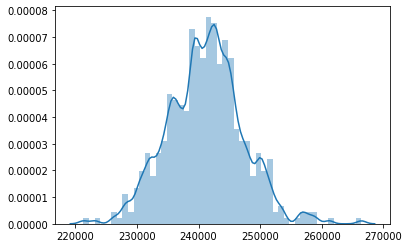

In [41]:
plot = sns.distplot(total_losses)
figure = plot.get_figure()
figure.savefig("total_loss.png")

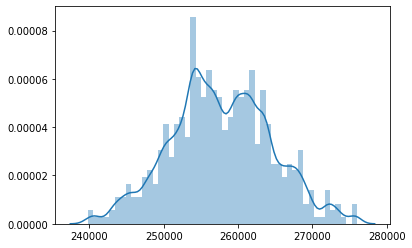

In [ ]:
plot = sns.distplot(total_losses_ori)
figure = plot.get_figure()
figure.savefig("total_loss_ori.png")

In [ ]:
plot = sns.distplot(discrimination_losses)
figure = plot.get_figure()
figure.savefig("disc_loss.png")

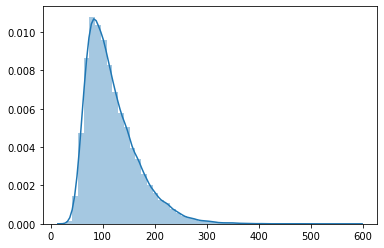

In [94]:
plot = sns.distplot(discrimination_losses_ori)
figure = plot.get_figure()
figure.savefig("disc_loss_ori.png")

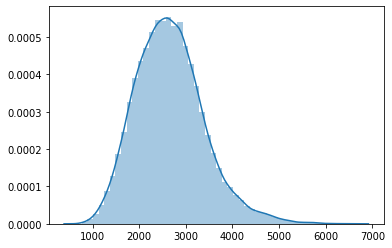

In [95]:
plot = sns.distplot(residual_losses)
figure = plot.get_figure()
figure.savefig("res_loss.png")

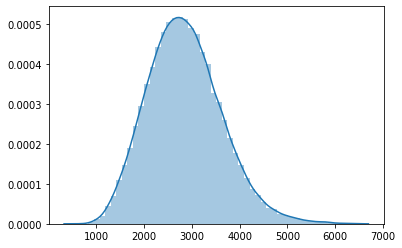

In [96]:
plot = sns.distplot(residual_losses_ori)
figure = plot.get_figure()
figure.savefig("res_loss_ori.png")

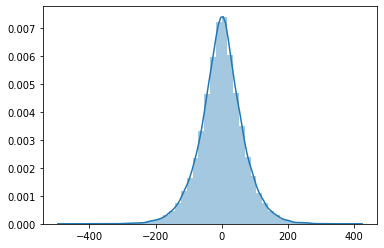

In [97]:
plot = sns.distplot(discrimination_losses-discrimination_losses_ori)
figure = plot.get_figure()
figure.savefig("disc_difference.png")

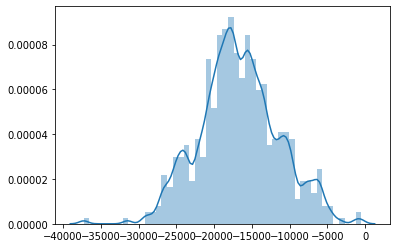

In [270]:
sns.distplot(total_losses-total_losses_ori)

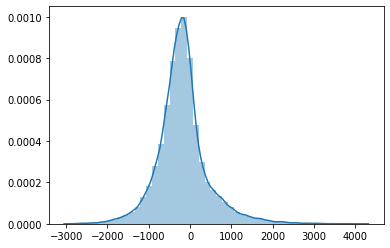

In [271]:
sns.distplot(residual_losses-residual_losses_ori)

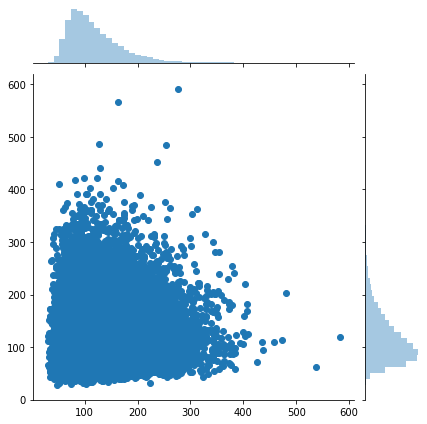

In [99]:
sns_plot = sns.jointplot(discrimination_losses_ori, discrimination_losses)
sns_plot.savefig("disc_loss_double.png")

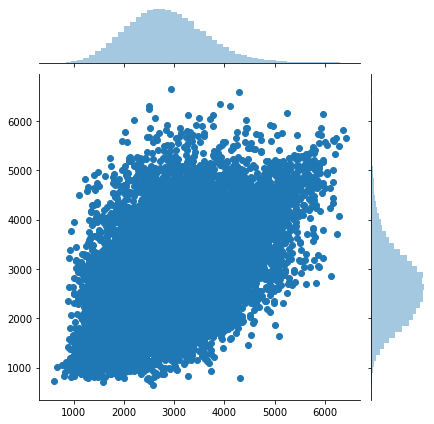

In [101]:
sns_plot = sns.jointplot(residual_losses_ori, residual_losses)
sns_plot.savefig("res_loss_double.png")

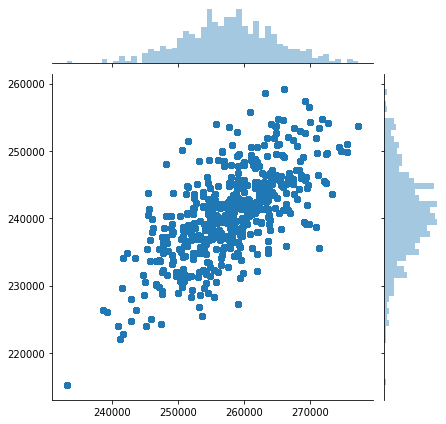

In [102]:
sns_plot = sns.jointplot(total_losses_ori, total_losses)
sns_plot.savefig("total_loss_double.png")

In [74]:
s1=pd.Series(residual_losses)
s2=pd.Series(residual_losses_ori)

# pandasを使用してPearson's rを計算
res=s1.corr(s2)

In [75]:
res

0.6701691095243746

In [278]:
s1=pd.Series(discrimination_losses)
s2=pd.Series(discrimination_losses_ori)

# pandasを使用してPearson's rを計算
res=s1.corr(s2)

In [279]:
res

0.07451806227101856